In [2]:
# Import Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## EXPLORATORY DATA ANALYSIS

In [4]:
data_dict = pd.read_excel('elo-merchant-category-recommendation/Data Dictionary.xlsx')
train = pd.read_csv('elo-merchant-category-recommendation/train.csv')
#historical_tr = pd.read_csv('elo-merchant-category-recommendation/historical_transactions.csv')
merchants = pd.read_csv('elo-merchant-category-recommendation/merchants.csv')
#new_merchants_tr = pd.read_csv('elo-merchant-category-recommendation/new_merchants_transactions.csv')

In [122]:
test = pd.read_csv('elo-merchant-category-recommendation/test.csv')

In [5]:
train.head()

,first_active_month,card_id,feature_1,feature_2,feature_3,target
0,2017-06,C_ID_92a2005557,5,2,1,-0.820283
1,2017-01,C_ID_3d0044924f,4,1,0,0.392913
2,2016-08,C_ID_d639edf6cd,2,2,0,0.688056
3,2017-09,C_ID_186d6a6901,4,3,0,0.142495
4,2017-11,C_ID_cdbd2c0db2,1,3,0,-0.159749


In [120]:
train.isnull().sum()

first_active_month    0
card_id               0
feature_1             0
feature_2             0
feature_3             0
target                0
dtype: int64

In [123]:
test.isnull().sum()

first_active_month    1
card_id               0
feature_1             0
feature_2             0
feature_3             0
dtype: int64

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201917 entries, 0 to 201916
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   first_active_month  201917 non-null  object 
 1   card_id             201917 non-null  object 
 2   feature_1           201917 non-null  int64  
 3   feature_2           201917 non-null  int64  
 4   feature_3           201917 non-null  int64  
 5   target              201917 non-null  float64
dtypes: float64(1), int64(3), object(2)
memory usage: 9.2+ MB


In [7]:
train['card_id'].value_counts()

C_ID_92a2005557    1
C_ID_c0e5a060f0    1
C_ID_53bf8407d3    1
C_ID_a92c5533af    1
C_ID_e8750a839b    1
                  ..
C_ID_09440ec523    1
C_ID_51c5b870d4    1
C_ID_d39793f151    1
C_ID_e3250f3bae    1
C_ID_92c9984c58    1
Name: card_id, Length: 201917, dtype: int64

In [8]:
train.describe()

,feature_1,feature_2,feature_3,target
count,201917.000000,201917.000000,201917.000000,201917.000000
mean,3.105311,1.745410,0.565569,-0.393636
std,1.186160,0.751362,0.495683,3.850500
min,1.000000,1.000000,0.000000,-33.219281
25%,2.000000,1.000000,0.000000,-0.883110
50%,3.000000,2.000000,1.000000,-0.023437
75%,4.000000,2.000000,1.000000,0.765453
max,5.000000,3.000000,1.000000,17.965068


In [9]:
merchants.head()

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,...,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
0,M_ID_838061e48c,8353,792,9,-0.057471,-0.057471,N,E,E,-0.40,...,-2.25,18.666667,6,-2.32,13.916667,12,N,242,9,1.0
1,M_ID_9339d880ad,3184,840,20,-0.057471,-0.057471,N,E,E,-0.72,...,-0.74,1.291667,6,-0.57,1.687500,12,N,22,16,1.0
2,M_ID_e726bbae1e,447,690,1,-0.057471,-0.057471,N,E,E,-82.13,...,-82.13,260.000000,2,-82.13,260.000000,2,N,-1,5,5.0
3,M_ID_a70e9c5f81,5026,792,9,-0.057471,-0.057471,Y,E,E,NaN,...,NaN,4.666667,6,NaN,3.833333,12,Y,-1,-1,NaN
4,M_ID_64456c37ce,2228,222,21,-0.057471,-0.057471,Y,E,E,NaN,...,NaN,0.361111,6,NaN,0.347222,12,Y,-1,-1,NaN


In [10]:
# missing values in merchants set
merchants.isnull().sum()

merchant_id                        0
merchant_group_id                  0
merchant_category_id               0
subsector_id                       0
numerical_1                        0
numerical_2                        0
category_1                         0
most_recent_sales_range            0
most_recent_purchases_range        0
avg_sales_lag3                    13
avg_purchases_lag3                 0
active_months_lag3                 0
avg_sales_lag6                    13
avg_purchases_lag6                 0
active_months_lag6                 0
avg_sales_lag12                   13
avg_purchases_lag12                0
active_months_lag12                0
category_4                         0
city_id                            0
state_id                           0
category_2                     11887
dtype: int64

In [11]:
merchants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334696 entries, 0 to 334695
Data columns (total 22 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   merchant_id                  334696 non-null  object 
 1   merchant_group_id            334696 non-null  int64  
 2   merchant_category_id         334696 non-null  int64  
 3   subsector_id                 334696 non-null  int64  
 4   numerical_1                  334696 non-null  float64
 5   numerical_2                  334696 non-null  float64
 6   category_1                   334696 non-null  object 
 7   most_recent_sales_range      334696 non-null  object 
 8   most_recent_purchases_range  334696 non-null  object 
 9   avg_sales_lag3               334683 non-null  float64
 10  avg_purchases_lag3           334696 non-null  float64
 11  active_months_lag3           334696 non-null  int64  
 12  avg_sales_lag6               334683 non-null  float64
 13 

In [12]:
merchants.describe()

,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,city_id,state_id,category_2
count,334696.000000,334696.000000,334696.000000,334696.000000,334696.000000,334683.000000,3.346960e+05,334696.000000,3.346830e+05,3.346960e+05,334696.000000,3.346830e+05,3.346960e+05,334696.000000,334696.000000,334696.000000,322809.000000
mean,31028.736143,423.131663,25.116404,0.011476,0.008103,13.832993,inf,2.994108,2.165079e+01,inf,5.947397,2.522771e+01,inf,11.599335,102.917926,11.860942,2.380002
std,31623.043426,252.898046,9.807371,1.098154,1.070497,2395.489999,NaN,0.095247,3.947108e+03,NaN,0.394936,5.251842e+03,NaN,1.520138,107.090673,6.176889,1.562661
min,1.000000,-1.000000,-1.000000,-0.057471,-0.057471,-82.130000,3.334953e-01,1.000000,-8.213000e+01,1.670447e-01,1.000000,-8.213000e+01,9.832954e-02,1.000000,-1.000000,-1.000000,1.000000
25%,3612.000000,222.000000,19.000000,-0.057471,-0.057471,0.880000,9.236499e-01,3.000000,8.500000e-01,9.022475e-01,6.000000,8.500000e-01,8.983333e-01,12.000000,-1.000000,9.000000,1.000000
50%,19900.000000,373.000000,27.000000,-0.057471,-0.057471,1.000000,1.016667e+00,3.000000,1.010000e+00,1.026961e+00,6.000000,1.020000e+00,1.043361e+00,12.000000,69.000000,9.000000,2.000000
75%,51707.250000,683.000000,33.000000,-0.047556,-0.047556,1.160000,1.146522e+00,3.000000,1.230000e+00,1.215575e+00,6.000000,1.290000e+00,1.266480e+00,12.000000,182.000000,16.000000,4.000000
max,112586.000000,891.000000,41.000000,183.735111,182.079322,851844.640000,inf,3.000000,1.513959e+06,inf,6.000000,2.567408e+06,inf,12.000000,347.000000,24.000000,5.000000


In [92]:
# merchant_group_id unique value counts
merchants['merchant_group_id'].value_counts()

35        46026
434         482
419         365
713         333
3648        305
          ...  
92681         1
95390         1
64138         1
105000        1
107283        1
Name: merchant_group_id, Length: 109391, dtype: int64

In [94]:
# merchant_category_id unique value counts
merchants['merchant_category_id'].value_counts()

705    30666
278    17992
307    17528
367    15387
68     14341
       ...  
741        1
322        1
86         1
281        1
583        1
Name: merchant_category_id, Length: 324, dtype: int64

In [114]:
# subsector_id unique value counts
subsector_merch = merchants['subsector_id'].value_counts()
# print(subsector_merch)

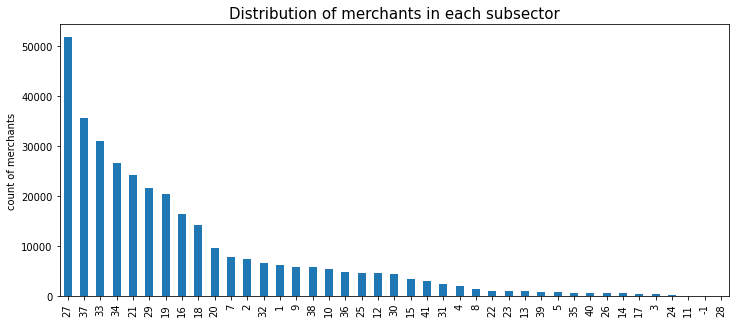

In [102]:
plt.figure(figsize=(12,5))
subsector_merch.plot.bar()
plt.title('Distribution of merchants in each subsector', fontsize=15)
plt.ylabel('count of merchants')
plt.show()

In [103]:
# category1 unique value counts
merch_category1 = merchants['category_1'].value_counts()
print(merch_category1)


N    327657
Y      7039
Name: category_1, dtype: int64


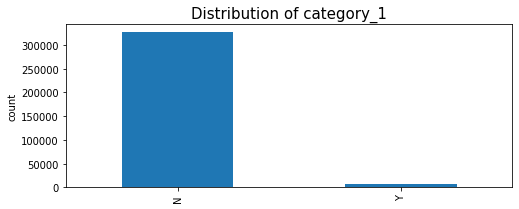

In [110]:
plt.figure(figsize=(8,3))
merch_category1.plot.bar()
plt.title('Distribution of category_1', fontsize=15)
plt.ylabel('count')
plt.show()

In [111]:
recent_sales_range=merchants['most_recent_sales_range'].value_counts()      
recent_purchase_range = merchants['most_recent_purchases_range'].value_counts()

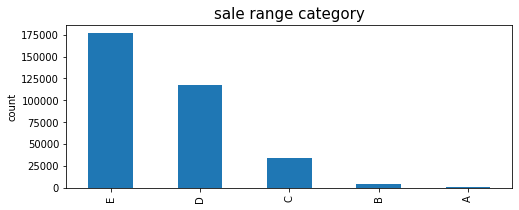

In [109]:
plt.figure(figsize=(8,3))
recent_sales_range.plot.bar()
plt.title('sale range category', fontsize=15)
plt.ylabel('count')
plt.show()

In [86]:
# Number of transactions per card id
merch_count = users_tr.groupby('card_id')['merchant_id'].count()

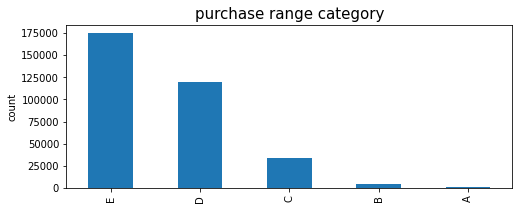

In [113]:
plt.figure(figsize=(8,3))
recent_purchase_range.plot.bar()
plt.title('purchase range category', fontsize=15)
plt.ylabel('count')
plt.show()

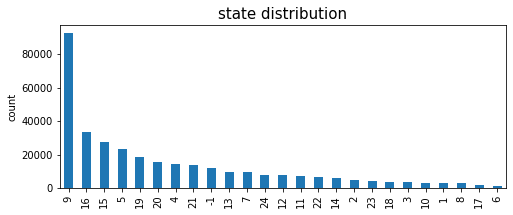

In [119]:
merch_city = merchants['city_id'].value_counts()
merch_state = merchants['state_id'].value_counts()
plt.figure(figsize=(8,3))
merch_state.plot.bar()
plt.title('state distribution', fontsize=15)
plt.ylabel('count')
plt.show()

In [177]:
# Count number of merchants per card_id
merch_count=[]

for i in pd.unique(users_tr['card_id']):
    k = users_tr[users_tr['card_id']==str(i)]
    print(i)
    print(k['merchant_id'].value_counts())
        
    
    for merch in k['merchant_id']:
        merch_count.append(merch)

C_ID_5037ff576e
M_ID_d23623b922    8
M_ID_fe69229f24    7
M_ID_00a6ca8a8a    5
M_ID_efc106141c    4
M_ID_b61c7d1be0    3
                  ..
M_ID_86a4e23281    1
M_ID_14730cf0ea    1
M_ID_a4dfc07cf6    1
M_ID_a70ac792d2    1
M_ID_06be908566    1
Name: merchant_id, Length: 80, dtype: int64
C_ID_0e171c1b48
M_ID_e02f424f45    29
M_ID_00a6ca8a8a    22
M_ID_210cd7270f    18
M_ID_4175b91078    18
M_ID_ad5e2702ac    15
                   ..
M_ID_dd0c66aba7     1
M_ID_b53c805fe2     1
M_ID_e07a73bef7     1
M_ID_bfe01c84f5     1
M_ID_ae1b45e19e     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_fc8e41b9cf
M_ID_00a6ca8a8a    48
M_ID_965ce0e787    15
M_ID_0b4c679b97    15
M_ID_68e26f3cca    14
M_ID_2e0430b435     9
                   ..
M_ID_1dd8347bcb     1
M_ID_bab0ff4b00     1
M_ID_daa25cafc4     1
M_ID_95292f43df     1
M_ID_dbdfde4ea2     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_b271e7ab60
M_ID_9ef1adf872    9
M_ID_ddb2f16951    8
M_ID_f416f2710c    5
M_ID_48257bb851    4
M_ID_

C_ID_12b7811978
M_ID_7d87558807    6
M_ID_a145355307    5
M_ID_6e4dd54907    5
M_ID_bde22aadff    3
M_ID_8c5c88201f    3
M_ID_61a741f0a9    3
M_ID_864804d591    2
M_ID_00a6ca8a8a    2
M_ID_c3b409bf12    2
M_ID_b021a21ab9    1
M_ID_f04a9bd0ba    1
M_ID_81019d4efb    1
M_ID_a092f5cfd3    1
M_ID_2cb311440d    1
M_ID_d19ca681dc    1
M_ID_2dc337755d    1
M_ID_a46ad3dc9e    1
M_ID_b4c97f6550    1
M_ID_98bf16f464    1
Name: merchant_id, dtype: int64
C_ID_25236b70f6
M_ID_f416f2710c    83
M_ID_c50d5d8042    79
M_ID_107ab78a2f    62
M_ID_7be6e8777f    53
M_ID_a30d553adf    36
                   ..
M_ID_f5c86c9640     1
M_ID_cc910104bd     1
M_ID_4f6ae13fc8     1
M_ID_f9c4feb7dd     1
M_ID_1538cbde7d     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_536bff298a
M_ID_00a6ca8a8a    11
M_ID_9139332ccc     9
M_ID_200b3eecbf     9
M_ID_94221cb1ba     6
M_ID_257157f6ee     6
M_ID_6534fa7d8a     4
M_ID_7900a73801     3
M_ID_cfbcd685cc     2
M_ID_749b9c2801     2
M_ID_4852daada8     2
M_ID_ebaf9f1e37

C_ID_89f75e7d82
M_ID_266ba40877    13
M_ID_ed07181469     8
M_ID_ffcf9e265a     7
M_ID_3c7c0c641b     7
M_ID_d5618790e1     6
                   ..
M_ID_ffde880c07     1
M_ID_d7311727d4     1
M_ID_c1021a1c15     1
M_ID_30db5c16f3     1
M_ID_00bc815c1d     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_1964c39b55
M_ID_fc7d7969c3    13
M_ID_f1a243f8cb     9
M_ID_d422b95fce     5
M_ID_f86439cec0     5
M_ID_63b4207398     5
                   ..
M_ID_f5ee5594a9     1
M_ID_86be58d7e0     1
M_ID_a9d91682ad     1
M_ID_13b581412a     1
M_ID_782b4d6a6e     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_65188857e6
M_ID_50343a24e9    7
M_ID_49cd3c5901    7
M_ID_5da96c39cd    5
M_ID_37879d9430    5
M_ID_e0d0305ab3    4
                  ..
M_ID_ae4ccb1d4e    1
M_ID_43f57721db    1
M_ID_0ad78a3a1b    1
M_ID_91f853787a    1
M_ID_9139332ccc    1
Name: merchant_id, Length: 101, dtype: int64
C_ID_b86ad6f26b
M_ID_aefc06ff23    37
M_ID_08c0279c84    30
M_ID_413c7e57bc    19
M_ID_3ebf7bb308    11


C_ID_575f3c7299
M_ID_45ce20b379    42
M_ID_90b8053fe8    37
M_ID_3310de9af9    23
M_ID_ecf97a69e6    10
M_ID_56813737f0    10
M_ID_3000e49b0c     8
M_ID_9cbbb5f795     6
M_ID_bd135e0ffa     6
M_ID_16db1396e2     5
M_ID_735b2a943d     5
M_ID_918c957eec     4
M_ID_b7c0e23fb1     3
M_ID_4a7720a470     3
M_ID_6be50459b4     3
M_ID_eb58fc1bcb     2
M_ID_20ade5f0a0     2
M_ID_bb2b010672     2
M_ID_2f14e70df0     2
M_ID_18666da01c     2
M_ID_f03e3240b3     2
M_ID_c8f44ec011     2
M_ID_9eeeb9bdd6     2
M_ID_e75a29b136     2
M_ID_5f3135ece0     2
M_ID_35178849a3     2
M_ID_4f0243686a     2
M_ID_eadef5a95f     2
M_ID_4aeabb1f12     1
M_ID_0c50ceffcc     1
M_ID_4e2eb6344b     1
M_ID_00ad776ef5     1
M_ID_d0add85a2a     1
M_ID_e71f4ceaa5     1
M_ID_45e0428325     1
M_ID_7bc07bed0f     1
M_ID_ec0bdccb00     1
M_ID_3644714a8c     1
M_ID_a8839301cf     1
M_ID_a995d2dd34     1
M_ID_871cf0d8dc     1
M_ID_e36bc82713     1
M_ID_f62dd1bff7     1
M_ID_00a6ca8a8a     1
M_ID_ea7f36b67e     1
M_ID_72d8edba7d 

C_ID_d7c4f585a0
M_ID_0fb9538f27    25
M_ID_e873a0a480    23
M_ID_06373fb834    13
M_ID_bf2d99f08e    12
M_ID_8a3341f4f2    11
M_ID_67ae2b5a0a     9
M_ID_74ddd2271c     9
M_ID_cb8a7a131e     7
M_ID_00a6ca8a8a     6
M_ID_cb4892704e     5
M_ID_a4248839ad     4
M_ID_f7df1c65fe     4
M_ID_7ff6b50887     4
M_ID_e8ff609234     4
M_ID_d6b7db5608     4
M_ID_c946bad773     3
M_ID_130849bbb8     2
M_ID_e73e337cb8     2
M_ID_2f9aa03971     2
M_ID_35dbc142bb     2
M_ID_d09b8ecfc1     2
M_ID_fea5e4d04c     2
M_ID_fb162d5f77     2
M_ID_a1e67b2530     2
M_ID_745fd99d23     2
M_ID_8af01cc265     2
M_ID_bed1528820     1
M_ID_4f9e378af7     1
M_ID_7dd42228af     1
M_ID_453711c584     1
M_ID_f411db80b6     1
M_ID_918bd2892f     1
M_ID_0a437d9a99     1
M_ID_7e0d423e0f     1
M_ID_c6b4092927     1
M_ID_d41d09747a     1
M_ID_6718bfae8e     1
M_ID_bb37b6cef9     1
M_ID_3cdfffb957     1
M_ID_e93ecd0eb9     1
M_ID_ebe3d05f7a     1
M_ID_8c326179b2     1
M_ID_5d003e9fe2     1
M_ID_d4d39e9dc1     1
M_ID_5dc8386783 

C_ID_5786ec9f45
M_ID_6d5d3b22fa    41
M_ID_5fcdeabe85     6
M_ID_1b5bb05ad8     5
M_ID_18fe4498cf     4
M_ID_bbeb2e63ad     3
M_ID_1e9eee9d26     3
M_ID_00a6ca8a8a     3
M_ID_673294a4d6     2
M_ID_eed9b61023     2
M_ID_d043f50c1b     2
M_ID_b3884732f6     1
M_ID_d83519660b     1
M_ID_49d4a8510e     1
M_ID_d8bdcbf539     1
M_ID_b7dc2870f0     1
M_ID_841840f2b9     1
M_ID_24bd329da6     1
M_ID_76bb3f364a     1
M_ID_0a2f843da0     1
M_ID_73e90dc7c2     1
M_ID_da62d08820     1
M_ID_759b29ce3b     1
M_ID_e614931a2a     1
Name: merchant_id, dtype: int64
C_ID_0ac3bdba13
M_ID_00a6ca8a8a    6
M_ID_fc7d7969c3    6
M_ID_f86439cec0    5
M_ID_fc5086ff1f    5
M_ID_db354680c9    4
M_ID_50f575c681    4
M_ID_5ba019a379    3
M_ID_d6594ec10a    3
M_ID_439519c50d    3
M_ID_23459bbf71    3
M_ID_7be8e42500    3
M_ID_b5b80addf5    3
M_ID_ae58939a83    3
M_ID_cf3378cf31    3
M_ID_f7f290bbb9    3
M_ID_663d1b6d9f    2
M_ID_6f73fb5f06    2
M_ID_3339c5faa9    2
M_ID_fb5f30b464    2
M_ID_4425bbd280    2
M_ID_d4c55

C_ID_149071be4f
M_ID_e5374dabc0    32
M_ID_0b53b8c009    13
M_ID_ef788578eb     7
M_ID_9139332ccc     5
M_ID_f416f2710c     5
                   ..
M_ID_50f575c681     1
M_ID_18ba08f055     1
M_ID_a9d91682ad     1
M_ID_2ae591251b     1
M_ID_0a3c122c45     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_f58ef7a582
M_ID_fc121a4efb    48
M_ID_00a6ca8a8a    36
M_ID_5631d19abe    14
M_ID_b78e671aa3    12
M_ID_5e8220e564     9
                   ..
M_ID_9139332ccc     1
M_ID_4c565676a5     1
M_ID_4b9358a70c     1
M_ID_821526b676     1
M_ID_fbfbc7f363     1
Name: merchant_id, Length: 126, dtype: int64
C_ID_54ba74790a
M_ID_68d6e72bc2    11
M_ID_848898beea     4
M_ID_00a6ca8a8a     4
M_ID_94cb465608     3
M_ID_95e1afbb65     3
M_ID_7544c195a9     2
M_ID_5b0a66f7b1     2
M_ID_bbb8bdfa9c     2
M_ID_1435ba0058     2
M_ID_2137d6cf84     2
M_ID_48767cb4ef     2
M_ID_4af638fe32     2
M_ID_6763626621     1
M_ID_5df999af24     1
M_ID_d5dc8ac277     1
M_ID_5ec98ac50a     1
M_ID_46d16e59bc     1
M_ID

C_ID_a9bc1c6200
M_ID_9dac09ddb2    14
M_ID_ad5e2702ac    13
M_ID_c0ce0dd02c    13
M_ID_00a6ca8a8a    11
M_ID_4175b91078    10
M_ID_490f186c5a     7
M_ID_dd0c66aba7     7
M_ID_c5ff60ff39     7
M_ID_c9bc3b9b09     6
M_ID_3a6841d504     5
M_ID_ca0262bb1a     4
M_ID_b7723c8924     4
M_ID_8ac31af208     4
M_ID_bb6653c5b8     3
M_ID_ae1b45e19e     3
M_ID_fa47a05f96     3
M_ID_22360595e6     3
M_ID_84b69831b5     3
M_ID_e862208b2d     3
M_ID_9e9a33e52b     2
M_ID_6bac8d061a     2
M_ID_90ad9473e2     2
M_ID_c6aa40fef7     1
M_ID_f63b260cba     1
M_ID_e1861056cc     1
M_ID_4d34f517e7     1
M_ID_51d34a7767     1
M_ID_1ae13b3d4b     1
M_ID_c136795aea     1
M_ID_7fb3bc88b9     1
M_ID_f17eb07832     1
M_ID_44591fc582     1
M_ID_30ef39b19c     1
M_ID_f7ec38ab97     1
M_ID_4691ecd83e     1
M_ID_7f665f733a     1
Name: merchant_id, dtype: int64
C_ID_c14a40541e
M_ID_98b342c0e3    31
M_ID_34ac4db1d5    29
M_ID_d855771cd9    25
M_ID_5a0a412718    22
M_ID_00a6ca8a8a    21
                   ..
M_ID_bd01e74

C_ID_28fa6e1b95
M_ID_fc7d7969c3    17
M_ID_acd1454a5f    14
M_ID_ef8673e53b     4
M_ID_00a6ca8a8a     4
M_ID_e8afc7cf92     3
M_ID_8b8cfef47b     3
M_ID_16bb97af37     3
M_ID_fa1515917b     2
M_ID_91a7310fee     2
M_ID_2f932abf49     2
M_ID_e12121a224     2
M_ID_d12892439c     2
M_ID_f0cd3143b1     2
M_ID_d41485254b     2
M_ID_d5e6ed14eb     1
M_ID_9f3c1e4813     1
M_ID_a617d4b626     1
M_ID_a3a7d175c1     1
M_ID_309ad8356d     1
M_ID_49d4a8510e     1
M_ID_a0a90bbb76     1
M_ID_7c926aaf16     1
M_ID_5d728f6cf5     1
M_ID_8c2fe47a7c     1
M_ID_1ce510c43e     1
M_ID_28ef6800dc     1
M_ID_89e6ada67f     1
M_ID_8e122170dc     1
M_ID_28014b6982     1
M_ID_b6d791220a     1
M_ID_96ba3c7b60     1
M_ID_b42048a5e3     1
M_ID_51ea1dd9c5     1
M_ID_96b6772314     1
M_ID_f6dbdd9a9b     1
M_ID_8bf6e835e1     1
M_ID_8f9d6d0568     1
M_ID_d80f2cbfe5     1
M_ID_405d0db932     1
M_ID_bc64ad04bc     1
M_ID_c9855bf3e3     1
M_ID_f48ca58a05     1
M_ID_220fb71572     1
M_ID_ac22131557     1
M_ID_5278508d0a 

C_ID_5481d0ce7b
M_ID_d6058bbbf5    18
M_ID_9139332ccc    11
M_ID_f89db52eb6    10
M_ID_dfcf66c65e     9
M_ID_8177e0ca72     8
M_ID_b98db225f5     5
M_ID_474a6e0a5b     3
M_ID_e15d633d1e     2
M_ID_89e9e5c469     2
M_ID_445742726b     2
M_ID_1ef1ed1383     2
M_ID_59388654b2     2
M_ID_f10e25e349     1
M_ID_6b7fa0b212     1
M_ID_96ba3c7b60     1
M_ID_d0146c836a     1
M_ID_de40fbd87c     1
M_ID_97f0959810     1
M_ID_97b2d0a8cc     1
M_ID_b5fa422476     1
Name: merchant_id, dtype: int64
C_ID_74f3f3b63f
M_ID_eec0dd0e1c    25
M_ID_00a6ca8a8a    20
M_ID_5ba019a379    15
M_ID_f86439cec0    11
M_ID_aa91fc5309     9
                   ..
M_ID_cf11313855     1
M_ID_ed02b0dac2     1
M_ID_0b38a4e8b4     1
M_ID_94eea62513     1
M_ID_f40ccc1312     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_2f6f120cf8
M_ID_ec24d672a3    30
M_ID_bb9a080abf    26
M_ID_9139332ccc    22
M_ID_f86439cec0    19
M_ID_5ba019a379    18
                   ..
M_ID_1c8cd070e3     1
M_ID_778c223bf3     1
M_ID_0b38a4e8b4   

C_ID_fcf602b303
M_ID_00a6ca8a8a    24
M_ID_d855771cd9    19
M_ID_d8e0d42e4b    16
M_ID_97f0959810     9
M_ID_080f4d239a     9
M_ID_1c8cd070e3     8
M_ID_f918bc7a7f     7
M_ID_89c2926ed7     6
M_ID_9bc3bcda25     6
M_ID_7c5e93af2f     5
M_ID_af287ec7d5     5
M_ID_e6e0d1d31d     5
M_ID_4a1ac71383     5
M_ID_33228621ad     5
M_ID_a9d91682ad     5
M_ID_53cb9dc25e     4
M_ID_4f32358669     4
M_ID_6d8e882cb9     4
M_ID_98b342c0e3     3
M_ID_f0400371aa     2
M_ID_3d8a34035d     2
M_ID_b98db225f5     2
M_ID_be0ab2fe9c     2
M_ID_166881ab3f     2
M_ID_d28e6ce9fc     2
M_ID_ad49138777     2
M_ID_3a9cfff451     2
M_ID_d7ad19dc24     1
M_ID_7a8a61787f     1
M_ID_9139332ccc     1
M_ID_55099b189b     1
M_ID_ee94aa5138     1
M_ID_88387c3c48     1
M_ID_fb6a1f971d     1
M_ID_d07daa6e8e     1
M_ID_627bdcb918     1
M_ID_f284f5aca8     1
M_ID_dac3a32a26     1
M_ID_3558dec91f     1
M_ID_7bcccb1b46     1
M_ID_c41a72d381     1
M_ID_be20278ca1     1
M_ID_273a75d863     1
M_ID_3887fa8e1a     1
M_ID_da0de48b77 

C_ID_a959a584cc
M_ID_b54e787bf1    15
M_ID_146c053e06     2
M_ID_9cb78ea202     1
M_ID_86a4e23281     1
M_ID_c2ae34c2ef     1
M_ID_92a7df7152     1
Name: merchant_id, dtype: int64
C_ID_e375f96772
M_ID_00a6ca8a8a    15
M_ID_75b67c429b    12
M_ID_e90cbb0bc1    10
M_ID_085edc7178     7
M_ID_42559433d7     6
M_ID_5a7fde1cdb     4
M_ID_c12b6ae2fa     4
M_ID_ffe42c434d     3
M_ID_cd2c0b07e9     2
M_ID_7d03bc35b2     2
M_ID_fc7d7969c3     2
M_ID_0930871a2c     2
M_ID_26cfd0788b     2
M_ID_cc951a46d7     2
M_ID_b9f093a059     2
M_ID_33bdb157b3     1
M_ID_50f575c681     1
M_ID_17d18ace43     1
M_ID_7c987c9412     1
M_ID_eaea2f9338     1
M_ID_7562cbaee5     1
M_ID_72d6cb7a84     1
M_ID_ad49138777     1
M_ID_2eb4079d73     1
M_ID_5c0cce79ec     1
M_ID_9866ecc189     1
M_ID_d855771cd9     1
Name: merchant_id, dtype: int64
C_ID_d1e9049805
M_ID_8b36c2be72    20
M_ID_32b6967f77    20
M_ID_a3811e0f3e    17
M_ID_8d65d9a5f6    17
M_ID_fda08245fb    13
                   ..
M_ID_acc5751770     1
M_ID_0cd

C_ID_99f00fd8b4
M_ID_f336a9e60d    47
M_ID_4baf7a4c0b    30
M_ID_de40fbd87c    24
M_ID_3ef6d4d53a    14
M_ID_06211be26f    13
M_ID_b98db225f5     9
M_ID_8dd08e35f5     8
M_ID_faf3a4535c     8
M_ID_cd2c0b07e9     5
M_ID_12fabc34af     4
M_ID_644f881a69     4
M_ID_689255e0db     4
M_ID_1c8cd070e3     3
M_ID_79bf3b2f13     3
M_ID_3bbd83efc2     3
M_ID_74f2c8fd03     3
M_ID_00a6ca8a8a     3
M_ID_5231831558     2
M_ID_d0cfcbba08     2
M_ID_baa89f9722     2
M_ID_abe361173b     2
M_ID_dfcf66c65e     2
M_ID_5866fd868a     1
M_ID_96c5e6b8f6     1
M_ID_42abc59095     1
M_ID_92e7fbbd9b     1
M_ID_5ed21b0b8e     1
M_ID_3f777df529     1
M_ID_e1c9b4a21b     1
M_ID_d855771cd9     1
M_ID_7fe0f842da     1
M_ID_b9a4efbaee     1
M_ID_b7459adc65     1
M_ID_6d60863a46     1
M_ID_751bbca966     1
M_ID_1e2b2ee966     1
M_ID_08e8c3063b     1
Name: merchant_id, dtype: int64
C_ID_fe4dd0d9dd
M_ID_30001623d2    133
M_ID_ef4397248e     69
M_ID_19457f127a     62
M_ID_e823c6a9ec     28
M_ID_98b4af3bcb     26
       

C_ID_16ebae3306
M_ID_9139332ccc    15
M_ID_094d3cfa70    14
M_ID_00a6ca8a8a    11
M_ID_dd5ad9b02d    10
M_ID_dcb6459bb3     6
M_ID_fb83f58405     5
M_ID_930686b78c     5
M_ID_ebe1c10fbb     5
M_ID_48e0d6d651     4
M_ID_65a6e93e6a     3
M_ID_36708e401b     3
M_ID_5d17b5fc5a     3
M_ID_d089bc2106     3
M_ID_f812938c78     3
M_ID_2ac7e09437     2
M_ID_8d980c1295     2
M_ID_867f3cc362     2
M_ID_bb8f060e31     1
M_ID_86be58d7e0     1
M_ID_4a6254c364     1
M_ID_12733e2878     1
M_ID_a939c0942b     1
M_ID_7ca715839e     1
M_ID_43753e143f     1
M_ID_940cdce6b4     1
M_ID_7ce96c351a     1
M_ID_a9d91682ad     1
M_ID_97326753e0     1
M_ID_58909b1181     1
M_ID_5a2d0967f2     1
M_ID_9433e4e9d6     1
M_ID_44c96e2f71     1
M_ID_9f662c156e     1
M_ID_9f961af196     1
M_ID_3c73fc1c6c     1
M_ID_e17e4a2af0     1
M_ID_4fcf35a545     1
M_ID_de8b6d9919     1
M_ID_f654b0789d     1
M_ID_60b43cf9d8     1
M_ID_979cf1ae62     1
M_ID_bb9c58f780     1
M_ID_8c6b897b35     1
M_ID_5f1496457e     1
M_ID_16d9532512 

C_ID_1626d68d07
M_ID_89faad5b33    28
M_ID_98b342c0e3    12
M_ID_00a6ca8a8a    12
M_ID_aac0048968    10
M_ID_37a5db0839     9
                   ..
M_ID_f86439cec0     1
M_ID_bfc6097fdf     1
M_ID_33228621ad     1
M_ID_a11c244aa6     1
M_ID_52542e6003     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_b762734ff1
M_ID_be336bfabb    26
M_ID_89b935a63a    22
M_ID_5bba01a00c    15
M_ID_43f8fcbc6e    15
M_ID_f366cd5f5a    14
M_ID_cd6e024a49    10
M_ID_cf599723a6     9
M_ID_9e84cda3b1     7
M_ID_522d51fe39     5
M_ID_8a1f044e1f     4
M_ID_6f12176176     3
M_ID_dbef39bbc7     3
M_ID_00a6ca8a8a     3
M_ID_903f740639     3
M_ID_17560139c2     2
M_ID_76659adb24     2
M_ID_ff41dc3e35     2
M_ID_9b4ac0798f     1
M_ID_fc492b81b2     1
M_ID_2e674a3f4f     1
M_ID_81d07cfcd9     1
M_ID_3330c2907f     1
M_ID_36f90b28e5     1
M_ID_3bf90ac955     1
M_ID_3184fe8235     1
M_ID_50f575c681     1
M_ID_7221ee5ab2     1
M_ID_dd24811855     1
Name: merchant_id, dtype: int64
C_ID_9ac0d2f776
M_ID_5154015383   

C_ID_7e8f7e2ff2
M_ID_4c3212796e    277
M_ID_940fb4498f     59
M_ID_00a6ca8a8a     31
M_ID_e1b9c8f6f8     29
M_ID_e324ca48f8     21
                  ... 
M_ID_bdaeee4a0e      1
M_ID_0b355d9b26      1
M_ID_5dd54383c4      1
M_ID_e67a1307f4      1
M_ID_66e184f35d      1
Name: merchant_id, Length: 153, dtype: int64
C_ID_6e38ce95e5
M_ID_0b53b8c009    8
M_ID_540cc42db1    8
M_ID_1fe3b4e39d    6
M_ID_6aa09cb59c    5
M_ID_8430737407    5
                  ..
M_ID_19182cab40    1
M_ID_af4d7eaa15    1
M_ID_183cdc29e4    1
M_ID_e2000b66f5    1
M_ID_9c1a7e57aa    1
Name: merchant_id, Length: 89, dtype: int64
C_ID_600545406a
M_ID_4598cf40a1    30
M_ID_00a6ca8a8a    23
M_ID_cec565824a    14
M_ID_3d0969c48b    12
M_ID_07be4a2aa1     9
M_ID_aed6aa1ccd     8
M_ID_9bf47f1c4b     6
M_ID_b0c076341a     5
M_ID_b527598cd5     4
M_ID_3a29082c89     4
M_ID_c4d9df0d68     4
M_ID_62e731b1b8     3
M_ID_875c1800c4     3
M_ID_1c3bde6ac5     2
M_ID_3e6438556b     2
M_ID_eb37ad83fb     2
M_ID_7c7bc8f805     2
M_ID_

C_ID_5eef3384f5
M_ID_00a6ca8a8a    65
M_ID_85f0bc3f9e    30
M_ID_59f4699d2f    14
M_ID_3e89ba5f74     5
M_ID_f0bc2825cb     4
M_ID_fb82971fe7     3
M_ID_dbb62a62fd     3
M_ID_4d1ead707d     3
M_ID_bc02f2c623     2
M_ID_635dfe73dd     2
M_ID_b78e671aa3     2
M_ID_2f110de13e     2
M_ID_15d92cc4d9     2
M_ID_952c412876     2
M_ID_1e36326448     1
M_ID_1e5b9f5d48     1
M_ID_0b4c679b97     1
M_ID_d6d0f62bed     1
M_ID_3368c67036     1
M_ID_d12eaa9bd7     1
M_ID_31c8425b90     1
M_ID_31084a9103     1
M_ID_9210707960     1
M_ID_64f373dbde     1
M_ID_aa2b2c68f5     1
M_ID_5d9749fece     1
M_ID_c4202e76e6     1
M_ID_68e26f3cca     1
M_ID_329c806e75     1
M_ID_6476b3c32a     1
M_ID_5173f85a68     1
M_ID_463ce2176b     1
M_ID_a70ac792d2     1
M_ID_7f09f6ca89     1
M_ID_ae2671dddf     1
Name: merchant_id, dtype: int64
C_ID_b68861894d
M_ID_19171c737a    60
M_ID_b9dcf28cb9    25
M_ID_00a6ca8a8a    22
M_ID_5d17b5fc5a    21
M_ID_9139332ccc    17
                   ..
M_ID_7a435fe24a     1
M_ID_fc7d796

C_ID_fa73b85d9f
M_ID_e5374dabc0    47
M_ID_392fe845f2     5
M_ID_3ad26cb8a9     2
M_ID_acec4d5aa3     1
M_ID_9a4689c41e     1
M_ID_b574941e3a     1
M_ID_442cce57b7     1
M_ID_b38b07c67c     1
M_ID_bd01e00df0     1
M_ID_85e6d461a3     1
M_ID_199a78de6e     1
M_ID_b0bc890b0d     1
M_ID_973f844da6     1
M_ID_9935e78933     1
M_ID_15b52b5d7d     1
Name: merchant_id, dtype: int64
C_ID_64b849f050
M_ID_d5e7821b4e    10
M_ID_48fc16a6e4     9
M_ID_96d8faff02     8
M_ID_3fb6ff5356     5
M_ID_b19bcc2b3c     5
                   ..
M_ID_3a1f451731     1
M_ID_30e6ff2565     1
M_ID_ccd0947ea6     1
M_ID_e04e7ff2f4     1
M_ID_f6f2f07a98     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_3b54c9951f
M_ID_f62f5d4f6b    9
M_ID_f86439cec0    9
M_ID_b5b80addf5    6
M_ID_820c7b73c8    6
M_ID_cc72dac895    4
M_ID_5d3fbaaf29    3
M_ID_4be7958dc0    3
M_ID_5ba019a379    3
M_ID_a0eddfc3f2    2
M_ID_97d7eec1cb    2
M_ID_7064a8aa68    2
M_ID_362c39eea5    2
M_ID_1e1f6cc067    2
M_ID_c012cbb21d    2
M_ID_879f6

C_ID_d89ed6f903
M_ID_64cd03cd45    28
M_ID_f9b32cfc49    20
M_ID_00a6ca8a8a    17
M_ID_1bd1f2e1c0    15
M_ID_50f575c681    13
                   ..
M_ID_cd7a83f7c9     1
M_ID_5ba019a379     1
M_ID_e996b8dcec     1
M_ID_3c8482dcee     1
M_ID_cdc13688b6     1
Name: merchant_id, Length: 263, dtype: int64
C_ID_324cc02fa3
M_ID_65fea81c67    8
M_ID_bfa0268bf6    8
M_ID_4398b83da4    4
M_ID_c593c5641d    4
M_ID_6e5d8f32e2    4
M_ID_3e8814ee16    3
M_ID_6dcc72f6a3    3
M_ID_2ec7521dd5    2
M_ID_5f032539b1    2
M_ID_45d9f71afb    2
M_ID_00a6ca8a8a    2
M_ID_f9b10afb36    2
M_ID_76c27cfac4    2
M_ID_fe16eb0edc    2
M_ID_bd2f71edd9    2
M_ID_0f688086d1    1
M_ID_f668a04021    1
M_ID_8b776127bc    1
M_ID_e935c6534f    1
M_ID_06373fb834    1
M_ID_1f3b5ad8e9    1
M_ID_474016e976    1
M_ID_b0d8e448ed    1
M_ID_ba0de15367    1
M_ID_dc22f5ac74    1
M_ID_8fadd601d2    1
M_ID_05784cf5f8    1
M_ID_4ffaf5dd74    1
M_ID_dcd10a4d59    1
M_ID_10111c8520    1
M_ID_c6c08c8e88    1
M_ID_0b9e6af102    1
M_ID_19ec

C_ID_cf615002dd
M_ID_00a6ca8a8a    16
M_ID_b555ebfe70    15
M_ID_d07b0692c4    12
M_ID_3e1f27fdb5    11
M_ID_64c55b4ba3    10
M_ID_f264d225d5    10
M_ID_d13e0f6336     9
M_ID_2637773dd2     8
M_ID_2b73657e3d     8
M_ID_cd2c0b07e9     5
M_ID_814d6d3fab     4
M_ID_ba1ce2074b     4
M_ID_69f80607d1     3
M_ID_1f4773aa76     2
M_ID_5ba019a379     2
M_ID_6e841cd219     2
M_ID_82a30d9203     2
M_ID_fb79535a86     2
M_ID_77c1ad6643     2
M_ID_ae87ad39b7     2
M_ID_bbe5733f29     1
M_ID_7c1c2a2db5     1
M_ID_6c1d3120ac     1
M_ID_f4be79819d     1
M_ID_f4cda870d6     1
M_ID_90effd7125     1
M_ID_1d8085cf5d     1
M_ID_f941ebdd17     1
M_ID_0e3dbca525     1
M_ID_7064a8aa68     1
M_ID_879f625c89     1
M_ID_b794b9d9e8     1
M_ID_b8c0f1f277     1
M_ID_24ed549464     1
M_ID_fb06d0f99d     1
M_ID_dae9744cd6     1
M_ID_d19138dfcf     1
M_ID_bf3238b558     1
M_ID_a0c228f362     1
M_ID_981fe24744     1
M_ID_ea9c181f66     1
M_ID_1ec49665f3     1
M_ID_f40ccc1312     1
M_ID_940fb4498f     1
Name: merchant_i

C_ID_ec3466c35f
M_ID_9dbed68c2f    10
M_ID_13d6985b38    10
M_ID_3c4b1dc879     9
M_ID_eb58b5ba4c     6
M_ID_124ce736b5     5
M_ID_57df19bf28     5
M_ID_bc6cf7a1c9     4
M_ID_d5c5e885b1     3
M_ID_036da90555     3
M_ID_725a60d404     3
M_ID_4fdc35ec3b     3
M_ID_19d3de623d     2
M_ID_df737d7932     2
M_ID_00a6ca8a8a     2
M_ID_525e53a2b9     2
M_ID_6969017de8     2
M_ID_09d7a200d1     2
M_ID_eba7bc17ac     2
M_ID_2892f28aa8     2
M_ID_973ba39e9b     1
M_ID_85e7e32045     1
M_ID_0e54507f4b     1
M_ID_c144c712c8     1
M_ID_5cb0fbbbad     1
M_ID_7c5ffd76c5     1
M_ID_26500a5226     1
M_ID_80b6c4ed8f     1
M_ID_4f8b92217d     1
M_ID_b8b3caf3c5     1
M_ID_542899382d     1
M_ID_b40ccf46f4     1
M_ID_25128f73af     1
M_ID_e4578ea614     1
M_ID_c0d605babe     1
M_ID_d3b787a345     1
M_ID_762b1e18d2     1
M_ID_50f575c681     1
M_ID_1ede1a8371     1
M_ID_540e2727e9     1
M_ID_31afcc72e5     1
M_ID_5a5ec6a830     1
M_ID_dd01783e11     1
M_ID_f065cb937a     1
M_ID_189df188f4     1
M_ID_fc7fef57fd 

C_ID_df21ed2374
M_ID_e5374dabc0    27
M_ID_e81e75e467    19
M_ID_00a6ca8a8a    15
M_ID_5ba019a379    11
M_ID_f86439cec0     9
                   ..
M_ID_18c60b6b4a     1
M_ID_081e9abac9     1
M_ID_f8ff2ae0cb     1
M_ID_6bdf9346ab     1
M_ID_ff667e5293     1
Name: merchant_id, Length: 130, dtype: int64
C_ID_fdd47cc8b4
M_ID_7d15ac6b1d    133
M_ID_421a79b537     61
M_ID_0fe967dfbc     28
M_ID_5d5b7b6abf     24
M_ID_7ba930c210     21
                  ... 
M_ID_bebfd14aef      1
M_ID_f1d95f4547      1
M_ID_343a6f8265      1
M_ID_fa61c6abca      1
M_ID_b4ab98b1c5      1
Name: merchant_id, Length: 108, dtype: int64
C_ID_c88a57ac59
M_ID_269541aeab    17
M_ID_f9263abc91     7
M_ID_17511eed62     7
M_ID_fa5de61245     5
M_ID_dc4ca6729b     4
M_ID_ae16956a28     4
M_ID_1bd1f2e1c0     3
M_ID_2bc316a199     3
M_ID_31f31cbf6a     3
M_ID_aa09864f44     3
M_ID_74b6f8cfea     3
M_ID_213ad11f88     3
M_ID_d2897279e5     3
M_ID_10d40bd546     2
M_ID_e6f768e0eb     2
M_ID_1c27cf2177     2
M_ID_122b83273f

C_ID_642d62b172
M_ID_86be58d7e0    34
M_ID_e5374dabc0    31
M_ID_9139332ccc    25
M_ID_ae85796b21    12
M_ID_5ba019a379     4
M_ID_c03b62d83d     3
M_ID_3792a0ff3a     3
M_ID_c55031d6c2     3
M_ID_7064a8aa68     3
M_ID_f58e44a5ba     3
M_ID_1f4773aa76     2
M_ID_12637a44e9     2
M_ID_b794b9d9e8     1
M_ID_2973942fda     1
M_ID_7388b947bf     1
M_ID_4980aa1783     1
M_ID_5c9d05536f     1
M_ID_221faf5ceb     1
M_ID_5cec138f1e     1
M_ID_6743793bd6     1
M_ID_7dcc819fa3     1
M_ID_5e73782f9b     1
M_ID_1ec49665f3     1
M_ID_5ce74ed47e     1
M_ID_66fd5e43ae     1
M_ID_50f575c681     1
M_ID_bfe0971065     1
M_ID_169ca4164d     1
M_ID_00a6ca8a8a     1
M_ID_2512cab1b8     1
M_ID_59577aece1     1
M_ID_2c049b075c     1
M_ID_b57b8255fe     1
M_ID_371eb8c796     1
M_ID_63ebbc3a84     1
M_ID_8ffcd8ef50     1
M_ID_6ca5fd9205     1
M_ID_d8e0d42e4b     1
M_ID_1a1f26fa54     1
M_ID_5c4f6863ef     1
M_ID_3111c6df35     1
M_ID_b18d2bae5b     1
M_ID_8124c3ccad     1
M_ID_f9da083d9f     1
Name: merchant_i

C_ID_6b2cd7704c
M_ID_24b54c8673    5
M_ID_9139332ccc    5
M_ID_a811224ad2    3
M_ID_5faaac7b67    2
M_ID_554fa7b1af    2
M_ID_69f024d01a    1
M_ID_57e97f6546    1
M_ID_26fbcac46a    1
M_ID_ccdbc040ce    1
M_ID_ff1d363a3d    1
M_ID_0c1b0fc450    1
M_ID_d4c6be28f0    1
M_ID_3111c6df35    1
M_ID_68b78e9a01    1
Name: merchant_id, dtype: int64
C_ID_e488e01cc6
M_ID_00a6ca8a8a    16
M_ID_fc17e0f98d     3
M_ID_a085b88f1b     3
M_ID_d05e6f91fc     3
M_ID_2637773dd2     2
M_ID_d640b59597     2
M_ID_64d7b56e7d     2
M_ID_9ae66387ef     2
M_ID_83df60abeb     2
M_ID_da01980131     2
M_ID_e1220dfe76     2
M_ID_5a92c6d1dd     1
M_ID_f53d6710b4     1
M_ID_725a60d404     1
M_ID_09bbeb78c1     1
M_ID_d5c94df60e     1
M_ID_48d2c99573     1
M_ID_94090319c7     1
M_ID_f81919693f     1
M_ID_74023d7549     1
M_ID_cffa7d8097     1
M_ID_4885bb4884     1
M_ID_ea40cce649     1
M_ID_f185e3cfab     1
M_ID_9068149294     1
M_ID_50f575c681     1
M_ID_63e8cb6879     1
M_ID_bb995cb908     1
M_ID_324c4a659a     1
M_ID

C_ID_4e04bd268d
M_ID_9747c2f4af    75
M_ID_6a45a018b4    70
M_ID_eadef5a95f    51
M_ID_e6ed5ffded    38
M_ID_772b657032    38
                   ..
M_ID_24b3d549d9     1
M_ID_c07568a168     1
M_ID_2627efde04     1
M_ID_23e89ad6a8     1
M_ID_aed2faf9a4     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_4caeda8e47
M_ID_1f4773aa76    7
M_ID_181e9aff33    5
M_ID_3b77049881    5
M_ID_7ab5e34573    3
M_ID_63d20d74a9    3
M_ID_82a30d9203    3
M_ID_f86439cec0    3
M_ID_00a6ca8a8a    2
M_ID_cbf534a317    2
M_ID_cd2c0b07e9    2
M_ID_f182b6c33f    2
M_ID_ab67f6c982    1
M_ID_4997b73887    1
M_ID_d4ca4f03f6    1
M_ID_0345173539    1
M_ID_b2ff4c88d0    1
M_ID_2cdb1709c4    1
M_ID_bb8dae153e    1
M_ID_bc7dca889a    1
M_ID_2c98dbd7d8    1
M_ID_a7655e0fd5    1
M_ID_f4be79819d    1
M_ID_96ba3c7b60    1
M_ID_1c8cd070e3    1
M_ID_bbf41e3e45    1
M_ID_8d0ff6cba7    1
M_ID_3926a1c38e    1
M_ID_1d8085cf5d    1
M_ID_d855771cd9    1
M_ID_8c2cbe164a    1
M_ID_ad59f1f377    1
M_ID_940fb4498f    1
M_ID_b98db

C_ID_30ca8c6936
M_ID_e5374dabc0    86
M_ID_a5e24a6c61    19
M_ID_00a6ca8a8a    11
M_ID_15e8fd5fb4     9
M_ID_deb43ff012     8
                   ..
M_ID_8688b34a9e     1
M_ID_dd9731e63f     1
M_ID_787118d4d4     1
M_ID_a81adbeb4b     1
M_ID_396cc080e0     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_89c3bcff31
M_ID_1ac6bbc867    15
M_ID_00a6ca8a8a    13
M_ID_b18d2bae5b     9
M_ID_deb43ff012     9
M_ID_a08fe74b06     6
                   ..
M_ID_00a84277d7     1
M_ID_225aaeea2c     1
M_ID_3a2275c92f     1
M_ID_d86b8cc0eb     1
M_ID_0e836e5150     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_4ab28eb928
M_ID_ac016f9541    11
M_ID_7c5e93af2f     9
M_ID_adb6ddabdf     9
M_ID_e5f5bf025e     8
M_ID_0983cbd14e     7
M_ID_1726d6fac6     6
M_ID_fdd1989fdd     6
M_ID_95baba4a21     4
M_ID_6f3a85d0af     4
M_ID_34b9b2e906     4
M_ID_98b342c0e3     3
M_ID_6895e82ec3     3
M_ID_9185ed6bb0     3
M_ID_917e70ae13     3
M_ID_096fb9cb8b     3
M_ID_00a6ca8a8a     2
M_ID_e802fed6f8     2
M_ID_

C_ID_4fd928e170
M_ID_0d927a5fa5    16
M_ID_d3908de85f    14
M_ID_86c2171a2a     9
M_ID_33228621ad     7
M_ID_260dc0e0f9     6
M_ID_34ac4db1d5     6
M_ID_4c3212796e     5
M_ID_ba54afc107     3
M_ID_b98db225f5     2
M_ID_77f461da65     2
M_ID_b867a04a9a     1
M_ID_017c54656a     1
M_ID_7d1f207fd7     1
M_ID_a19fb52d38     1
M_ID_d07daa6e8e     1
M_ID_c47a3e1743     1
M_ID_da3e5e4c2d     1
M_ID_7c5e93af2f     1
M_ID_7b97fc501d     1
M_ID_96cb509063     1
Name: merchant_id, dtype: int64
C_ID_ac0eb7f2a6
M_ID_3f3084da59    21
M_ID_73c737d6ff    14
M_ID_79c5ae42b3    13
M_ID_f5d8bd2b49    12
M_ID_a7655e0fd5    11
                   ..
M_ID_6f7a841359     1
M_ID_c4d1969560     1
M_ID_eee9beb6fd     1
M_ID_4973016444     1
M_ID_6b718b517f     1
Name: merchant_id, Length: 190, dtype: int64
C_ID_9899ec0bb2
M_ID_fee1806b80    13
M_ID_a70ac792d2    10
M_ID_2678aaf648    10
M_ID_c4202e76e6     8
M_ID_3e89ba5f74     7
M_ID_c505e49c6b     6
M_ID_00a6ca8a8a     4
M_ID_52be14d4cd     4
M_ID_dcfb1fb3a0  

C_ID_edc6591970
M_ID_74b6f8cfea    54
M_ID_3056b5cb36    24
M_ID_5a5389d159    16
M_ID_e55c8e8154     5
M_ID_10d40bd546     5
M_ID_8adab6feda     3
M_ID_1934c235ed     3
M_ID_5634fd83e0     3
M_ID_00a6ca8a8a     2
M_ID_b8530ecd32     2
M_ID_8f21c19982     2
M_ID_07c8f601ef     1
M_ID_e4095398fa     1
M_ID_f9263abc91     1
M_ID_2cb96c0c65     1
M_ID_1ad6180b6f     1
M_ID_2e685e1b5d     1
M_ID_d8d27ef094     1
M_ID_20bbf6cc82     1
M_ID_53c307c6dd     1
Name: merchant_id, dtype: int64
C_ID_2a7d752132
M_ID_6f274b9340    24
M_ID_00a6ca8a8a    19
M_ID_fc7d7969c3     4
M_ID_074a0201d4     4
M_ID_73ceda3278     4
M_ID_e4f838805a     4
M_ID_b9f9332438     3
M_ID_640a0b6a91     3
M_ID_8762a10a4f     2
M_ID_fd843ee57e     2
M_ID_c5736c9974     2
M_ID_e8bce2ea4b     2
M_ID_2a194fc570     2
M_ID_9139332ccc     1
M_ID_bc0f381a30     1
M_ID_602191e4cf     1
M_ID_e91c48a7d1     1
M_ID_2b074cd432     1
M_ID_6e081cab97     1
M_ID_970e16d3c2     1
M_ID_f5f20a470a     1
M_ID_e0cb79eb44     1
M_ID_3142a90

C_ID_37866e2dc4
M_ID_b31fbe1c81    41
M_ID_73be3f93b9    33
M_ID_08b64d55d3    17
M_ID_8fadd601d2    17
M_ID_70dd1ed593     5
M_ID_20320f0098     5
M_ID_41f3cef9d8     4
M_ID_7c0918c8a4     3
M_ID_1c68088224     2
M_ID_0a3928047b     2
M_ID_f0ab70a0fc     2
M_ID_35f6236453     2
M_ID_2ed78df6d2     2
M_ID_448de19ed9     2
M_ID_57186b29fa     2
M_ID_4e5b402f19     2
M_ID_9139332ccc     2
M_ID_f132b25883     2
M_ID_7694bb6dcd     1
M_ID_d876c09999     1
M_ID_88d755f6fa     1
M_ID_1dd53add35     1
M_ID_5826bdc96a     1
M_ID_23b90d48ca     1
M_ID_53c366c3dc     1
M_ID_00a6ca8a8a     1
M_ID_d41cc3dcb9     1
M_ID_db4b46bccf     1
M_ID_728e4bfc98     1
M_ID_7961ef7b7e     1
M_ID_10d79d8703     1
Name: merchant_id, dtype: int64
C_ID_d747254f99
M_ID_4c565676a5    9
M_ID_d12eaa9bd7    9
M_ID_00a6ca8a8a    8
M_ID_9d62303b56    6
M_ID_47de58c48f    6
                  ..
M_ID_2f110de13e    1
M_ID_a989370b74    1
M_ID_59764e8cb1    1
M_ID_bd96e96ece    1
M_ID_0181428293    1
Name: merchant_id, Leng

C_ID_642660c972
M_ID_760653805c    84
M_ID_a60a1cafd6    30
M_ID_d855771cd9    27
M_ID_d0f2f6505b    25
M_ID_5265ee51d2    21
                   ..
M_ID_3a6609244a     1
M_ID_0f1970650b     1
M_ID_66c74085ca     1
M_ID_571f94de9e     1
M_ID_bc4268bf51     1
Name: merchant_id, Length: 120, dtype: int64
C_ID_71fe241508
M_ID_e5374dabc0    114
M_ID_9d272157c6     42
M_ID_b5b80addf5     38
M_ID_f86439cec0     19
M_ID_086d25f98f     19
                  ... 
M_ID_0fcd8521ec      1
M_ID_5518af06f8      1
M_ID_a74eb8affd      1
M_ID_ef87dd1879      1
M_ID_34608f513e      1
Name: merchant_id, Length: 140, dtype: int64
C_ID_18cec66caa
M_ID_34aee4230f    56
M_ID_5ba019a379    32
M_ID_f86439cec0    30
M_ID_5518af06f8    27
M_ID_393c59c8e9    27
                   ..
M_ID_2196c56d89     1
M_ID_1a0baa9e47     1
M_ID_a08fe74b06     1
M_ID_d092f28646     1
M_ID_b346b7cec3     1
Name: merchant_id, Length: 268, dtype: int64
C_ID_b46f66d515
M_ID_2caac72d8e    36
M_ID_23bb5e700d    28
M_ID_0f8512d517    2

C_ID_07a1daa450
M_ID_79a14592e3    73
M_ID_3f644b8667    16
M_ID_e5374dabc0    10
M_ID_83ada27927     9
M_ID_71475d176d     6
M_ID_7cb64bc77b     6
M_ID_dd33c2b513     5
M_ID_50f575c681     4
M_ID_138bc7336b     3
M_ID_543c0aa2cd     3
M_ID_600db9e2df     3
M_ID_35c141603a     3
M_ID_cfc544702d     3
M_ID_77bed497f4     3
M_ID_69a4601904     2
M_ID_34f7d9a1b0     2
M_ID_1b46566ac3     2
M_ID_c4d19b0d31     2
M_ID_abe47106ae     2
M_ID_1cb269c16d     2
M_ID_77197a9b5e     2
M_ID_3b15e511ed     2
M_ID_8a9339ad7c     2
M_ID_9bd02eb930     2
M_ID_076cd8a829     2
M_ID_b6b1b3ba4a     1
M_ID_84e54a8b15     1
M_ID_98c852d9f9     1
M_ID_b8fdb5caae     1
M_ID_9b4bba9ffe     1
M_ID_e68fb6acf1     1
M_ID_63ece6c9c1     1
M_ID_97a7c4a179     1
M_ID_6af70db22a     1
M_ID_1f34dacacc     1
M_ID_67db7001ca     1
M_ID_7ee31aac5a     1
M_ID_00f9f89884     1
M_ID_3e9b7bea6f     1
M_ID_9bafcf53bc     1
M_ID_83658ce859     1
M_ID_9e1d41a28a     1
M_ID_6c8acc695a     1
M_ID_a09b37bf12     1
M_ID_d7767b7ce9 

C_ID_fab0ad6e10
M_ID_812d8a200e    12
M_ID_7259572a46     8
M_ID_0f85da1f51     6
M_ID_00a6ca8a8a     6
M_ID_d86b8cc0eb     6
                   ..
M_ID_60bebc8fc7     1
M_ID_04404451c8     1
M_ID_f80b60434d     1
M_ID_fdaab1c5bc     1
M_ID_069f393267     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_032f7efdf2
M_ID_53b784dbd6    27
M_ID_2f0a60b178    21
M_ID_89b935a63a    10
M_ID_f366cd5f5a     9
M_ID_f2045dd267     9
                   ..
M_ID_e5a336f138     1
M_ID_fbe2be4ba4     1
M_ID_7b348979b3     1
M_ID_2dd4a17495     1
M_ID_7caeb308c3     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_cfa6fa4f9f
M_ID_15ea47ef2b    45
M_ID_37abd6bb1f    23
M_ID_366100eaea    11
M_ID_690d73ae71    10
M_ID_50f575c681    10
M_ID_00a6ca8a8a     9
M_ID_670bf1ce65     8
M_ID_e3baf428da     6
M_ID_a1a67af5b1     6
M_ID_7d38de000d     5
M_ID_38217cf174     4
M_ID_3c4e6f0af4     4
M_ID_2c390be2b0     3
M_ID_bbbb3bb867     3
M_ID_7f008dd5ee     3
M_ID_385f5acc66     3
M_ID_b503fdda73     3
M_ID_

C_ID_41755ec4df
M_ID_88af29352b    25
M_ID_e3b5b32b0f    12
M_ID_00a6ca8a8a    11
M_ID_0f45f48a78    10
M_ID_84f643ddaa     8
                   ..
M_ID_eb2d8271bb     1
M_ID_1f2d05d9b0     1
M_ID_685c8e2948     1
M_ID_4852754302     1
M_ID_f86439cec0     1
Name: merchant_id, Length: 141, dtype: int64
C_ID_c9e7f2a70f
M_ID_9489ca0930    320
M_ID_001d92b649    116
M_ID_60d60b343f     23
M_ID_5e8220e564     22
M_ID_5d2d6dad6e     19
                  ... 
M_ID_7b2a2b3850      1
M_ID_6e8aaf2089      1
M_ID_c3a3ff23b3      1
M_ID_dad5ee3fc5      1
M_ID_6cb0602e94      1
Name: merchant_id, Length: 72, dtype: int64
C_ID_19a3302e32
M_ID_8450b55d77    31
M_ID_e95c90f5a3    12
M_ID_43f0d7ae80    12
M_ID_1af1b1a6fb    11
M_ID_096830559d     9
M_ID_334fd616b9     8
M_ID_00a6ca8a8a     6
M_ID_785cf7afc9     4
M_ID_76a9c12b1e     4
M_ID_d836c9a2fd     3
M_ID_815f23e92c     2
M_ID_a9a1effdad     2
M_ID_50f575c681     2
M_ID_1265c462d9     2
M_ID_312646f806     2
M_ID_d138b295d9     2
M_ID_5634fd83e0 

C_ID_dc40c8c781
M_ID_8da0d33c72    212
M_ID_9139332ccc      5
M_ID_b0072c1ef8      4
M_ID_519fb42e87      3
M_ID_1ecac79f34      2
M_ID_09d7a200d1      2
M_ID_3e82a97166      2
M_ID_d24b4f197d      2
M_ID_983965e556      2
M_ID_fe42c6850e      2
M_ID_f88892723b      2
M_ID_b578a153d2      1
M_ID_f7b4a33c68      1
M_ID_4c04a8649d      1
M_ID_0f75b45fec      1
M_ID_9a1e4a7e16      1
M_ID_9c49634ca5      1
M_ID_1cb6ec39ab      1
M_ID_8e8a78e5ec      1
M_ID_7c7dbe5588      1
M_ID_c22a6ce8b8      1
M_ID_7402d16160      1
M_ID_4eca82a336      1
M_ID_4027302e0f      1
M_ID_6b5be265e7      1
M_ID_52049049ef      1
M_ID_4d3d928d6f      1
M_ID_00a6ca8a8a      1
M_ID_1617de00c5      1
M_ID_e95406e275      1
Name: merchant_id, dtype: int64
C_ID_d4c300e20e
M_ID_d154eb763f    54
M_ID_105fc743dd    12
M_ID_cbafe8e0a9    10
M_ID_d86b8cc0eb     8
M_ID_ca6128f3d8     6
M_ID_77e2942cd8     5
M_ID_ee75252e6a     2
M_ID_8c10f90916     2
M_ID_00a6ca8a8a     1
M_ID_6c902b51ca     1
M_ID_6256b169b3     1
M_ID

C_ID_a0b9f7c477
M_ID_d50d43cc13    9
M_ID_3d5ab988d6    8
M_ID_57ce4ccd98    8
M_ID_00a6ca8a8a    7
M_ID_8280cdbb6d    7
                  ..
M_ID_5191bdada6    1
M_ID_0ab45ee47b    1
M_ID_7f893d8cc3    1
M_ID_0e71329889    1
M_ID_cd4b776a7e    1
Name: merchant_id, Length: 96, dtype: int64
C_ID_e610ed7120
M_ID_1f5c671366    43
M_ID_7ed4c9f891    19
M_ID_a94b531271    14
M_ID_dc214d001d     9
M_ID_8457ddc5e1     8
                   ..
M_ID_cc8299b9a4     1
M_ID_b2ea047153     1
M_ID_2d467c40ce     1
M_ID_15e6485b33     1
M_ID_1e1f6cc067     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_93edcaa00c
M_ID_592283ed00    35
M_ID_00a6ca8a8a    11
M_ID_d5dc8ac277     9
M_ID_1435ba0058     8
M_ID_607d25488f     8
M_ID_db3c5ba164     6
M_ID_20e80a6094     6
M_ID_4d685e58a3     5
M_ID_ef7007a871     4
M_ID_9b1e409a81     3
M_ID_7a6353b671     2
M_ID_48767cb4ef     2
M_ID_d0e8e519d8     2
M_ID_cca169fa9d     2
M_ID_1a26496d3f     2
M_ID_fc7d7969c3     2
M_ID_5f46f15bf1     2
M_ID_d4ba44d6ab  

C_ID_1415f35928
M_ID_81bd958641    26
M_ID_00a6ca8a8a    19
M_ID_3fe6a1cc98    18
M_ID_db5801d53a    11
M_ID_148cf0d86c     6
                   ..
M_ID_484edefdfc     1
M_ID_90c4c71a26     1
M_ID_71da2c972f     1
M_ID_e1e9d5dd10     1
M_ID_c50d5d8042     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_f02397f5f5
M_ID_befbc1f2ec    14
M_ID_9139332ccc     9
M_ID_00a6ca8a8a     8
M_ID_4350d17152     8
M_ID_8dcb0c0edc     6
                   ..
M_ID_37f9d6ca17     1
M_ID_02c50d7b83     1
M_ID_4852daada8     1
M_ID_99c08834ff     1
M_ID_4a6edcfd81     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_6e73450655
M_ID_00a6ca8a8a    26
M_ID_830b6fca4f    10
M_ID_413c7e57bc     6
M_ID_9fccc8b78f     5
M_ID_bc664b24b3     5
                   ..
M_ID_b7aa78e8b5     1
M_ID_70bd139ad8     1
M_ID_b8bf880200     1
M_ID_3a29082c89     1
M_ID_366c36bd03     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_e949013479
M_ID_5254ae5133    11
M_ID_aedc5cb5dc     6
M_ID_03fdf41924     5
M_ID_0e1ffdf

C_ID_e105b64945
M_ID_6bb679ca52    9
M_ID_85f71377a4    3
M_ID_20ade5f0a0    3
M_ID_a995d2dd34    3
M_ID_735b2a943d    3
M_ID_c8f44ec011    3
M_ID_00a6ca8a8a    2
M_ID_a0ca5ad907    2
M_ID_eadef5a95f    2
M_ID_c962da84a9    1
M_ID_4e3453b65e    1
M_ID_2d5a3565ce    1
M_ID_489927686a    1
M_ID_4e2eb6344b    1
M_ID_c856c12632    1
M_ID_5c69f799e0    1
M_ID_c8e18df911    1
M_ID_3208f46c83    1
M_ID_55a57c43f9    1
M_ID_1e3eeb7568    1
M_ID_0b8c40f1dc    1
M_ID_5704430824    1
M_ID_f05e18a3ae    1
M_ID_9475c1b29b    1
M_ID_cac2e62789    1
M_ID_77650d9173    1
M_ID_f7e47257c9    1
Name: merchant_id, dtype: int64
C_ID_9bcdc4fcb2
M_ID_800f937c80    100
M_ID_03955c8df2     58
M_ID_e1861056cc     49
M_ID_4d34f517e7     38
M_ID_e02f424f45     30
                  ... 
M_ID_4691ecd83e      1
M_ID_46339a988a      1
M_ID_29e6bb114b      1
M_ID_fe0cc3fb2d      1
M_ID_5280aff11a      1
Name: merchant_id, Length: 261, dtype: int64
C_ID_6606ed3891
M_ID_50ff247c3a    42
M_ID_41ac28faa2     4
M_ID_68837c

C_ID_ef560d3d05
M_ID_7c5e93af2f    15
M_ID_7ca9415a74    13
M_ID_98b342c0e3    11
M_ID_d8e0d42e4b     6
M_ID_11fdcfd169     6
M_ID_cc408612f7     5
M_ID_ad49138777     4
M_ID_c5dff9d4d9     4
M_ID_7da625b1d4     4
M_ID_00a6ca8a8a     3
M_ID_9139332ccc     2
M_ID_4e1f776c86     2
M_ID_be5b072c7a     1
M_ID_d855771cd9     1
M_ID_2f7e94962e     1
Name: merchant_id, dtype: int64
C_ID_417d3f8aeb
M_ID_6f274b9340    6
M_ID_2b66ca6e94    6
M_ID_a30d553adf    6
M_ID_fc5774e624    5
M_ID_c796cbbeb8    4
M_ID_6dbaf215eb    3
M_ID_03b05c31f0    3
M_ID_56af42c0ef    2
M_ID_50076f761c    2
M_ID_c86f4627e2    2
M_ID_93bdd4b285    2
M_ID_2fa10f80b6    2
M_ID_f37df1e6a3    2
M_ID_55d9186a93    1
M_ID_e39e117184    1
M_ID_0c21962377    1
M_ID_b90e3cfded    1
M_ID_a3196b9d3b    1
M_ID_e488dafdc5    1
Name: merchant_id, dtype: int64
C_ID_1beda3b6f8
M_ID_940fb4498f    42
M_ID_00a6ca8a8a    38
M_ID_8e5e172c5a    24
M_ID_966a8f9df7    18
M_ID_afdedcef0d    18
                   ..
M_ID_0d9aa45905     1
M_ID_

C_ID_b82176a13c
M_ID_d8f4e66394    9
M_ID_00fcbdad4f    6
M_ID_2d44bb94ba    6
M_ID_526533010a    4
M_ID_9139332ccc    3
M_ID_101d9ebb1d    3
M_ID_3763fbf70c    2
M_ID_0e19c238f6    2
M_ID_c76d36426e    2
M_ID_43e9239fa3    1
M_ID_1e2d79ca4a    1
M_ID_487e7cbaf0    1
M_ID_30a4b3a531    1
M_ID_dfe59a5f4c    1
M_ID_45daf10a42    1
M_ID_b70c924e12    1
M_ID_adf7dc1866    1
M_ID_eb4ce5d7a6    1
M_ID_ad6771e681    1
M_ID_e77863747f    1
M_ID_7262a6aef3    1
M_ID_96374a82c6    1
M_ID_d81569ddfd    1
Name: merchant_id, dtype: int64
C_ID_10e60282a7
M_ID_db5f425ea7    11
M_ID_30a5cd35e0     4
M_ID_6b1fea1d05     3
M_ID_93e1425d43     2
M_ID_00a6ca8a8a     1
M_ID_0616383b6f     1
M_ID_1fd33da75f     1
M_ID_50f575c681     1
M_ID_d855771cd9     1
M_ID_bfa5f2946a     1
M_ID_4ef1397270     1
M_ID_31157cd87f     1
M_ID_9e37889651     1
M_ID_d3b9898adf     1
M_ID_ddb2f16951     1
M_ID_a7c115bbdb     1
M_ID_73805bfddb     1
M_ID_701265ea96     1
Name: merchant_id, dtype: int64
C_ID_922b0d90ba
M_ID_6728

C_ID_3013ada240
M_ID_0f07fabb54    9
M_ID_7abef79842    9
M_ID_98b342c0e3    6
M_ID_9aeee9d0e6    5
M_ID_445742726b    5
                  ..
M_ID_9b7be1a37b    1
M_ID_3887fa8e1a    1
M_ID_9bafcf53bc    1
M_ID_a986c39b4b    1
M_ID_6e545daa45    1
Name: merchant_id, Length: 63, dtype: int64
C_ID_111dffc298
M_ID_ae58b3638a    24
M_ID_004995eae1     8
M_ID_71475d176d     7
M_ID_a9430074ad     5
M_ID_00a6ca8a8a     5
                   ..
M_ID_47236de0b0     1
M_ID_94b40ac762     1
M_ID_0082528a42     1
M_ID_826577981e     1
M_ID_149784ce4a     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_a6234f69a8
M_ID_cfb5ac9aa0    18
M_ID_0c73e116bc    12
M_ID_00a6ca8a8a    11
M_ID_992b1bfcfd     6
M_ID_f7afa18b21     6
M_ID_11c66bda70     5
M_ID_844df871c5     5
M_ID_e113b16a82     5
M_ID_154ae40927     4
M_ID_7999da3bff     3
M_ID_0fcea871c0     3
M_ID_624e7b3426     3
M_ID_128f04d349     2
M_ID_f076e58f16     2
M_ID_d5b5d05087     2
M_ID_0ab6406908     2
M_ID_ed80cd6582     2
M_ID_c63a47546a  

C_ID_6b0fce6d79
M_ID_7294492ae1    41
M_ID_e0446dd6c5    23
M_ID_cc9694ddd4     6
M_ID_38c9922711     2
M_ID_0f7562efd3     2
M_ID_02f8a0a665     2
M_ID_de7dff61b0     2
M_ID_51c00ab5fd     2
M_ID_05ef3da839     2
M_ID_4afc4801fb     2
M_ID_0f9e68eab5     2
M_ID_65b1410ec2     1
M_ID_c2fa7eac91     1
M_ID_eea0549c72     1
M_ID_25a262d921     1
M_ID_47f99e00a2     1
M_ID_979e043e1a     1
M_ID_58600f929c     1
M_ID_ef4d015eba     1
M_ID_c0ac982f6d     1
Name: merchant_id, dtype: int64
C_ID_2f7cfd0e3f
M_ID_d549944974    28
M_ID_5a9b2a0d43     4
M_ID_d86b8cc0eb     4
M_ID_7552ebbb80     4
M_ID_95bfdbef73     3
M_ID_00a6ca8a8a     3
M_ID_fc29e5e884     2
M_ID_d30903232e     2
M_ID_22f9171516     2
M_ID_58a831ada7     2
M_ID_ecada2d52b     1
M_ID_db1260ad2e     1
M_ID_39d4cbb27a     1
M_ID_902ea434d2     1
M_ID_a9d91682ad     1
M_ID_bc15b4eb6d     1
M_ID_0874216955     1
M_ID_ed60f9436a     1
M_ID_fbea109458     1
M_ID_3c98c3caed     1
M_ID_7a0fb498fc     1
M_ID_e020e9b302     1
M_ID_2e1f8d3

C_ID_adeaadcc35
M_ID_d4f510aa11    3
M_ID_210f00b0ea    3
M_ID_4b95af69c3    2
M_ID_13e19cdbf8    2
M_ID_af41ec6122    2
M_ID_aab2f5b140    2
M_ID_0830c3d518    2
M_ID_7071691c2f    1
M_ID_60f2cce633    1
M_ID_26d11a7dbc    1
M_ID_1807f734c9    1
M_ID_4e9423397d    1
M_ID_5dd3668a3b    1
M_ID_514e67a176    1
M_ID_12843094d6    1
M_ID_52cb5094db    1
M_ID_07a881eda8    1
M_ID_70e5418832    1
M_ID_62528a4a8f    1
M_ID_8e21a664b1    1
M_ID_f8ff2ae0cb    1
M_ID_aa575658a0    1
M_ID_4b7dead94d    1
M_ID_c3deca357c    1
M_ID_b5ecec8ea1    1
Name: merchant_id, dtype: int64
C_ID_363ae39168
M_ID_12e56a0e37    17
M_ID_bb7bb3902a     9
M_ID_0560984580     8
M_ID_80d5139e7b     7
M_ID_3270d5a790     6
                   ..
M_ID_45f82034f6     1
M_ID_c2f9fa448d     1
M_ID_3841612e17     1
M_ID_5e1ee1ef81     1
M_ID_1c87326bb5     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_26ae8263b8
M_ID_0c992044a1    41
M_ID_305e6d4950    10
M_ID_1435ba0058    10
M_ID_2362267379     5
M_ID_3df6c7b4c0     4

C_ID_1aad6bbc30
M_ID_9748320ee9    43
M_ID_0141968da9    32
M_ID_00a6ca8a8a    20
M_ID_f612f7092f    20
M_ID_f87929b116    16
                   ..
M_ID_047c489f6d     1
M_ID_dbef39bbc7     1
M_ID_841c17b670     1
M_ID_1f1b2374cb     1
M_ID_1e2b566f2f     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_5dd5e32914
M_ID_48257bb851    39
M_ID_31bdabca50    29
M_ID_8dcb0c0edc    22
M_ID_00a6ca8a8a    15
M_ID_46a68e556d    11
                   ..
M_ID_3f644b8667     1
M_ID_6dbaf215eb     1
M_ID_076cd8a829     1
M_ID_e9bf6c5d11     1
M_ID_63c5a93690     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_2d572c6dee
M_ID_ae85796b21    10
M_ID_f0d2b3fd31     7
M_ID_d13262f4b0     5
M_ID_2a0889622a     4
M_ID_e5374dabc0     4
M_ID_7b5424ba60     4
M_ID_a9d91682ad     3
M_ID_879f625c89     3
M_ID_cd2c0b07e9     2
M_ID_3111c6df35     2
M_ID_7159aca3bf     2
M_ID_e6d4fd83e9     1
M_ID_7062478c27     1
M_ID_008c02ed06     1
M_ID_1f4773aa76     1
M_ID_3b1e4e2f2a     1
M_ID_b654f22f58     1
Name: 

C_ID_27085751d3
M_ID_445742726b    46
M_ID_5028a4d4bf    16
M_ID_00a6ca8a8a    14
M_ID_d5af1111a3    11
M_ID_228f63b48b    10
                   ..
M_ID_bf2812e4a2     1
M_ID_596793bc8b     1
M_ID_35f1074fd1     1
M_ID_fbb2a5acf2     1
M_ID_5fb345eca8     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_92a4d01408
M_ID_bb09f1ee09    4
M_ID_3e89ba5f74    4
M_ID_d12eaa9bd7    3
M_ID_bdb9425f8d    3
M_ID_10bed40cc8    2
M_ID_e2a70d0787    2
M_ID_16471245d3    2
M_ID_446a96bd8e    1
M_ID_a003d790f9    1
M_ID_fb82971fe7    1
M_ID_ffb11ad762    1
M_ID_97d8bbe5a4    1
M_ID_34cfb0fbde    1
M_ID_e62615a953    1
M_ID_1af3f48acf    1
M_ID_1b9068774e    1
M_ID_b9f9332438    1
M_ID_63e8cb6879    1
M_ID_c4202e76e6    1
M_ID_05b84a1656    1
Name: merchant_id, dtype: int64
C_ID_bd4e853f48
M_ID_8a458b2515    5
M_ID_00a6ca8a8a    4
M_ID_885438550a    4
M_ID_2994a76cc7    3
M_ID_a6444443c9    3
M_ID_1d0254af8d    3
M_ID_cbe14b14ae    2
M_ID_0b5d0b0290    2
M_ID_5d8657a526    2
M_ID_136ee405a7    2
M_ID

C_ID_b713c0786f
M_ID_86be58d7e0    23
M_ID_433086dba5    14
M_ID_f1480cd2d8    11
M_ID_e020e9b302    11
M_ID_6cb0602e94    10
                   ..
M_ID_9a7b756b3b     1
M_ID_55bdfa5971     1
M_ID_eedf5d09c3     1
M_ID_fd3b23b144     1
M_ID_2e41749838     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_8b04d4734e
M_ID_9eeb4d1545    70
M_ID_ae5d7b8ee3    39
M_ID_7be6e8ef85    37
M_ID_8b30327e92    31
M_ID_45ac40df6f    30
                   ..
M_ID_28c5aa51f0     1
M_ID_58e946a74a     1
M_ID_ebcf49a64e     1
M_ID_e0bbd83734     1
M_ID_27053e4cea     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_79b64c5b19
M_ID_7f98b09381    39
M_ID_5ba019a379    14
M_ID_ec24d672a3    14
M_ID_c03b62d83d    14
M_ID_00a6ca8a8a    12
                   ..
M_ID_666304f336     1
M_ID_aebbe32c0d     1
M_ID_66b0385c20     1
M_ID_79c5ae42b3     1
M_ID_9fa541c3e3     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_d622d72de2
M_ID_00a6ca8a8a    62
M_ID_391fd59298    62
M_ID_3b88c0c75d    28
M_ID_d79fb3

C_ID_7490126251
M_ID_907bf8d131    45
M_ID_9fe0adc3a3    22
M_ID_00a6ca8a8a    22
M_ID_0b0f6a2281    20
M_ID_c3e6ee0c5c    19
                   ..
M_ID_196f18fa1f     1
M_ID_9b0e357800     1
M_ID_6427e42b26     1
M_ID_1df4c6f47a     1
M_ID_684dfdfa66     1
Name: merchant_id, Length: 135, dtype: int64
C_ID_459cf56fc3
M_ID_8d90bf4d4c    51
M_ID_a07fdd3ca0    14
M_ID_319925001f    13
M_ID_0a4bc69866    10
M_ID_00a6ca8a8a     8
                   ..
M_ID_2c4b8c61f6     1
M_ID_b486140c9c     1
M_ID_a5be33004d     1
M_ID_ea2fbd8e58     1
M_ID_f1e259487c     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_c8e98daa90
M_ID_23f79321ea    60
M_ID_515f44e0e5    34
M_ID_022374fd2f    32
M_ID_6669201123    24
M_ID_00a6ca8a8a    15
                   ..
M_ID_2214f6047e     1
M_ID_56979efa36     1
M_ID_af95e9b41a     1
M_ID_0a50a425e8     1
M_ID_7bec021234     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_05caae0718
M_ID_548f926c19    15
M_ID_37def316ff    14
M_ID_198197f450     6
M_ID_22293c

C_ID_bcf91ab407
M_ID_e5374dabc0    117
M_ID_47c5e7d15e     65
M_ID_de21daa380     28
M_ID_b9d7775688     25
M_ID_c2ee44bb17     24
                  ... 
M_ID_b52358694f      1
M_ID_cbb05a4a55      1
M_ID_25df185ae4      1
M_ID_86f5fac9f6      1
M_ID_61337b335b      1
Name: merchant_id, Length: 158, dtype: int64
C_ID_8dc5e003b7
M_ID_66d8fc449e    113
M_ID_9e32edbf70     28
M_ID_aaaad208a2     17
M_ID_00a6ca8a8a     15
M_ID_4175b91078     14
                  ... 
M_ID_55130242ce      1
M_ID_71a69d3c5c      1
M_ID_184f1872e6      1
M_ID_d771e915e6      1
M_ID_fe0cc3fb2d      1
Name: merchant_id, Length: 119, dtype: int64
C_ID_159c8cb0c6
M_ID_afa6c9d93b    31
M_ID_e5374dabc0    26
M_ID_6f274b9340    10
M_ID_9139332ccc    10
M_ID_00a6ca8a8a     7
M_ID_248a4acb98     3
M_ID_b9deab1ef5     2
M_ID_c679b685a7     2
M_ID_3111c6df35     2
M_ID_49d4a8510e     2
M_ID_160455dff9     2
M_ID_6e9dbaa64e     1
M_ID_1178906af5     1
M_ID_7f9f2e39ec     1
M_ID_445742726b     1
M_ID_8adab6feda     1
M_ID

C_ID_048dcf2dcd
M_ID_3018c50395    8
M_ID_a9430074ad    4
M_ID_5558c55263    3
M_ID_deb43ff012    3
M_ID_7da4de3b46    3
M_ID_848b1189f2    3
M_ID_eeba6b925d    3
M_ID_9e98b993a1    2
M_ID_e19e124dda    2
M_ID_3207338c00    2
M_ID_00a6ca8a8a    2
M_ID_3cb584b330    1
M_ID_1f39dfd7e8    1
M_ID_1ac6bbc867    1
M_ID_905b21e6fc    1
M_ID_e0a3e44be6    1
M_ID_372c531876    1
M_ID_b37cc8c2c4    1
M_ID_019a522b7f    1
M_ID_0cb22f5313    1
Name: merchant_id, dtype: int64
C_ID_07291c62f0
M_ID_00a6ca8a8a    35
M_ID_aaabb00c92    24
M_ID_1b788dadc1    22
M_ID_54bec636b1    21
M_ID_70e819350e    21
                   ..
M_ID_d7a9349605     1
M_ID_75d15f7b56     1
M_ID_df29fee82f     1
M_ID_29f61f2a71     1
M_ID_01ce52017f     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_43bc79b311
M_ID_d0ce25635d    10
M_ID_64767267ab     7
M_ID_fe2aa60015     6
M_ID_6c7d49eba2     4
M_ID_cdc2ad8e1c     3
M_ID_a8036d7113     1
M_ID_85600cc016     1
M_ID_0341677861     1
M_ID_68fd19080b     1
M_ID_5ba1dfd610

C_ID_bf2e2cdab2
M_ID_ad9fd2d071    94
M_ID_4277e5cfb6    21
M_ID_e19cd3b814    20
M_ID_849a335b1b    17
M_ID_0a2378b67b    17
                   ..
M_ID_ea05be660b     1
M_ID_bedfc41081     1
M_ID_7e04b1cbe1     1
M_ID_8450b55d77     1
M_ID_b3dc59a9a9     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_b8f2c9c4b2
M_ID_2b891f2f78    22
M_ID_4894c5aa13    19
M_ID_06a5f39de2    18
M_ID_3a4cd49f7c    12
M_ID_4e1f509665    11
M_ID_90ab9cc495    11
M_ID_00a6ca8a8a     9
M_ID_0ee84cbe8d     9
M_ID_50f575c681     9
M_ID_d2cb042ef0     8
M_ID_82d94bdd33     8
M_ID_046c701be1     6
M_ID_9100d1d6c2     6
M_ID_5b4d27317b     6
M_ID_8a1eca91e2     5
M_ID_7ccb3368a1     5
M_ID_445b4e298b     4
M_ID_454fdd82ce     4
M_ID_0c8e726b7e     3
M_ID_e1d281e2c2     3
M_ID_e12a399ebf     3
M_ID_53c8117558     2
M_ID_36d01c0b6a     2
M_ID_7da4f93e0e     2
M_ID_c8e9ecf4e7     2
M_ID_4d6cd0f121     2
M_ID_de425eeade     2
M_ID_e81f8f5177     2
M_ID_9858011db8     2
M_ID_948cf74fef     1
M_ID_96211b9f03     1


C_ID_85012e6250
M_ID_5e8220e564    26
M_ID_22c9cfa265     4
M_ID_9489ca0930     4
M_ID_6cb0602e94     3
M_ID_00a6ca8a8a     3
M_ID_b5e5a7cde9     3
M_ID_938795240d     3
M_ID_6f1da3098c     2
M_ID_39733f2b05     2
M_ID_0979ac80d9     2
M_ID_281875374b     1
M_ID_55bab1cf3e     1
M_ID_3f90938763     1
M_ID_1013576485     1
M_ID_d1d3ebe854     1
M_ID_725a60d404     1
M_ID_e8fb39882d     1
M_ID_0e3d16d4cc     1
M_ID_1145245d20     1
M_ID_881babc9d2     1
M_ID_e2aed68eba     1
M_ID_30856e2a2b     1
M_ID_e020e9b302     1
Name: merchant_id, dtype: int64
C_ID_f37595767f
M_ID_197976be1a    9
M_ID_2c4b8c61f6    5
M_ID_00a6ca8a8a    5
M_ID_f32c2208b1    3
M_ID_a638ccd1ab    3
M_ID_f3dca57443    3
M_ID_66fd5e43ae    2
M_ID_2fccfb1f58    2
M_ID_338b03705f    2
M_ID_9322db86da    2
M_ID_3f3084da59    2
M_ID_88ff0295e9    1
M_ID_9139332ccc    1
M_ID_feae0c0d41    1
M_ID_86e9a1ba0c    1
M_ID_1f0946602a    1
M_ID_61f3c50ede    1
M_ID_d0146c836a    1
M_ID_1f4773aa76    1
M_ID_69f3378052    1
M_ID_ba1ce

C_ID_c002b2eb20
M_ID_1ac6bbc867    15
M_ID_a9430074ad    13
M_ID_9139332ccc    10
M_ID_639b6fd30b     9
M_ID_769c174fcd     7
                   ..
M_ID_504577773f     1
M_ID_6b714c00bd     1
M_ID_2c7fc81ea9     1
M_ID_5e77865ab5     1
M_ID_d438bb40a5     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_26d421471b
M_ID_bc60f3b288    122
M_ID_4775a4daac     40
M_ID_51ecb8e687     39
M_ID_7766bb2c52     33
M_ID_ddcd63dd70     32
                  ... 
M_ID_0fe997b569      1
M_ID_bd9b0cfd72      1
M_ID_7034627fad      1
M_ID_2e3b01453b      1
M_ID_350fe0b4cd      1
Name: merchant_id, Length: 100, dtype: int64
C_ID_d3b841e5f0
M_ID_bed3c08087    19
M_ID_f10cb75f38     7
M_ID_3c840f9e34     6
M_ID_c0ce0dd02c     4
M_ID_dfabb9d00a     3
M_ID_e34e864a92     2
M_ID_d6533604fe     2
M_ID_00a6ca8a8a     2
M_ID_66d8fc449e     2
M_ID_22360595e6     2
M_ID_8c86904aa2     1
M_ID_4691ecd83e     1
M_ID_c6aa40fef7     1
M_ID_1ec8d68dba     1
M_ID_91e35a539a     1
M_ID_278c0f4457     1
M_ID_0f460dd153 

C_ID_9e3745c661
M_ID_6a95a30c76    355
M_ID_1719ce406e    124
M_ID_829a1c1fa3     56
M_ID_6de0b186e7     55
M_ID_13c49c5dad     34
M_ID_e69dfe40f1     31
M_ID_7bf42d8928     22
M_ID_aa82fb926b     14
M_ID_fad38cef0b     13
M_ID_91ac054312     11
M_ID_693a606eb4     10
M_ID_4becb2a660      9
M_ID_88d77d4bc0      8
M_ID_69593d6378      8
M_ID_00a6ca8a8a      8
M_ID_a638f59f43      6
M_ID_ab98645606      5
M_ID_ea7dde9735      5
M_ID_ed028e06ef      5
M_ID_434bb68412      3
M_ID_e589664f53      3
M_ID_d61f84d1cd      3
M_ID_3e84c86ac2      3
M_ID_fbf83368fe      3
M_ID_5c829b52a9      3
M_ID_4f848d8092      3
M_ID_5761d8f85c      2
M_ID_6dd2af5973      2
M_ID_ef6daeab6e      2
M_ID_6495f1c97d      1
M_ID_46ee9b6528      1
M_ID_6b231488a3      1
M_ID_6b77fa1d97      1
M_ID_8fef00075d      1
M_ID_e27a2b2517      1
M_ID_4a798e728f      1
M_ID_f0b3882bc2      1
M_ID_4152055620      1
Name: merchant_id, dtype: int64
C_ID_be057cbb4a
M_ID_aa91fc5309    14
M_ID_e5205299d5    12
M_ID_f86439cec0   

C_ID_2fe89b2e05
M_ID_e5374dabc0    45
M_ID_8aef07d99c    26
M_ID_86ec983688     6
M_ID_00a6ca8a8a     4
M_ID_63c8645937     4
M_ID_d297bfd8ed     3
M_ID_5c3469480e     3
M_ID_9d5a938b93     3
M_ID_24c249a726     3
M_ID_8a49823c0b     3
M_ID_aaf9d8cee5     3
M_ID_1c8dce7fc2     3
M_ID_001d92b649     3
M_ID_c99403d077     3
M_ID_82136c74da     2
M_ID_ef708d7c63     2
M_ID_f1480cd2d8     2
M_ID_3525e7a0a8     2
M_ID_29d496f9bb     2
M_ID_cbaa28a217     2
M_ID_ca3b8fbab9     2
M_ID_6cb0602e94     2
M_ID_b04e031dd2     1
M_ID_c3a3ff23b3     1
M_ID_3f90938763     1
M_ID_bef57969d9     1
M_ID_be55e7d77a     1
M_ID_5e0774e57f     1
M_ID_ba5264db56     1
M_ID_5e74688d90     1
M_ID_e2e6bb2a7b     1
M_ID_1299bc29e1     1
M_ID_5e8220e564     1
M_ID_29ec8d2ab8     1
M_ID_3f1c2bc305     1
M_ID_af406db773     1
M_ID_77dda4cf69     1
M_ID_aefc38e2be     1
Name: merchant_id, dtype: int64
C_ID_9d427a09c5
M_ID_6d5d3b22fa    32
M_ID_2dc3001d31     9
M_ID_c394f1db0e     7
M_ID_2a2697d0db     6
M_ID_9c447d0

C_ID_521e2d430a
M_ID_00a6ca8a8a    30
M_ID_97f0959810    26
M_ID_3e6438556b    21
M_ID_4f25e2f5df    17
M_ID_a23aab7eae    16
                   ..
M_ID_24d8ec453a     1
M_ID_9a071c4aa3     1
M_ID_a77ab5fa78     1
M_ID_9f9181ff11     1
M_ID_b125a66884     1
Name: merchant_id, Length: 182, dtype: int64
C_ID_111ab4a609
M_ID_ed0a98692b    6
M_ID_b321f70203    5
M_ID_1958bb9576    3
M_ID_eee96af873    3
M_ID_fc7f3806b8    2
M_ID_2f0b6d30c3    2
M_ID_024e05cac8    2
M_ID_f3f680a290    2
M_ID_1b654dbaab    2
M_ID_a1177ef310    2
M_ID_06ab5d322a    2
M_ID_50a3ec0e34    2
M_ID_8f8f052929    2
M_ID_183cdc29e4    1
M_ID_1fe3b4e39d    1
M_ID_b2f0d10e00    1
M_ID_309752ddea    1
M_ID_3dae508c21    1
M_ID_080df40294    1
M_ID_6c3929a942    1
M_ID_b615028124    1
M_ID_2fe3b73146    1
M_ID_baeaa3ccdc    1
M_ID_8c6b897b35    1
M_ID_38593263d4    1
M_ID_f416f2710c    1
Name: merchant_id, dtype: int64
C_ID_6a9f1b0525
M_ID_59764e8cb1    8
M_ID_fe5ed9a8f7    6
M_ID_3a70d6f854    4
M_ID_94025f39d5    4
M_I

C_ID_e0db29346c
M_ID_8560dbb735    14
M_ID_e5a6d30f81    10
M_ID_daf2055df8    10
M_ID_164dff2c0d     9
M_ID_ae8e6df8e0     9
                   ..
M_ID_9f734ff7f1     1
M_ID_a96c1adca6     1
M_ID_00f9447528     1
M_ID_f06de6cbc9     1
M_ID_6f7674d742     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_63d9bd7964
M_ID_efd311b1fc    8
M_ID_00a6ca8a8a    8
M_ID_5191bdada6    6
M_ID_b650a26b4d    6
M_ID_1c3458db95    5
M_ID_afb1345144    5
M_ID_120024bfc9    3
M_ID_243efa2c5c    3
M_ID_257157f6ee    3
M_ID_32a56096bb    3
M_ID_cc8d8d240d    3
M_ID_65b59cd088    2
M_ID_614a901144    2
M_ID_1afc6b6006    2
M_ID_7f95d6c72c    2
M_ID_d5d4f4c7a8    2
M_ID_3c517ab947    2
M_ID_e67955c6f9    2
M_ID_be24a85984    1
M_ID_9139332ccc    1
M_ID_d645a52112    1
M_ID_cc29f09b63    1
M_ID_24150bcf83    1
M_ID_7f893d8cc3    1
M_ID_5f05f71885    1
M_ID_0ba2a42353    1
M_ID_3c1b23a98f    1
M_ID_88ae265c16    1
M_ID_93416505e5    1
M_ID_cdefbf5fe0    1
M_ID_50f575c681    1
M_ID_3111c6df35    1
M_ID_52ae9

C_ID_4dcb147f70
M_ID_ca4d18b336    23
M_ID_814d6d3fab    16
M_ID_f2c3927d45     7
M_ID_860ec81f90     7
M_ID_e27d4bbe57     4
M_ID_1cb79050d5     2
M_ID_5cea7e02a8     2
M_ID_7b0d8e022d     2
M_ID_3111c6df35     2
M_ID_50a2342b53     1
M_ID_80b0b2ab9f     1
M_ID_1f4773aa76     1
M_ID_a79f97e414     1
M_ID_57ef2a00f5     1
M_ID_b5b80addf5     1
M_ID_d827dc28d0     1
M_ID_679a1d99ed     1
M_ID_85d70470a5     1
M_ID_8f293b86a6     1
M_ID_96ba3c7b60     1
M_ID_8315fa81bd     1
Name: merchant_id, dtype: int64
C_ID_1ef12eb83b
M_ID_0cebcb9435    7
M_ID_4a83a4fc5a    3
M_ID_ea4dcc14cd    2
M_ID_9e35949aa1    2
M_ID_6d9ef18473    1
M_ID_68ac755a21    1
M_ID_8788e9d4ee    1
M_ID_333769de06    1
M_ID_6b14754b0b    1
M_ID_ea764a0374    1
M_ID_9f445efc3d    1
M_ID_00a6ca8a8a    1
M_ID_0c73e116bc    1
Name: merchant_id, dtype: int64
C_ID_71e4d15c37
M_ID_3777b821e5    21
M_ID_980a3b5fc4    18
M_ID_a9a1effdad    17
M_ID_22f15a1581    13
M_ID_1e682a79af    13
                   ..
M_ID_b25aa91da1     1

C_ID_b653b9445e
M_ID_9fe6765228    94
M_ID_5b82a97cbe    83
M_ID_ebce3476ec    15
M_ID_f0f5baab21    13
M_ID_50f575c681    12
M_ID_c7719ece02    10
M_ID_f45012b0c4     8
M_ID_1f8928beb2     7
M_ID_0144195e60     5
M_ID_00a6ca8a8a     4
M_ID_8279c6f545     4
M_ID_ccd8c4372f     4
M_ID_161bf032d7     4
M_ID_ca1dbc4260     4
M_ID_7b777234d0     3
M_ID_ee395ab8c0     3
M_ID_9b10179fc3     3
M_ID_c43fcf120e     3
M_ID_362b03ef59     3
M_ID_ee09333c5b     3
M_ID_59764e8cb1     2
M_ID_31fb13e368     2
M_ID_596701cc41     2
M_ID_48ff98c2ff     2
M_ID_84a6a14665     2
M_ID_caf1e0cb57     2
M_ID_bc09d67dd4     2
M_ID_ba1f431f4f     2
M_ID_3de7bbbc38     1
M_ID_8f30bdb053     1
M_ID_6cf9512b7e     1
M_ID_95f564ec74     1
M_ID_aefba71240     1
M_ID_5068384e74     1
M_ID_9b83d8db1a     1
M_ID_99c57da8aa     1
M_ID_f2045dd267     1
M_ID_fb4c00a43d     1
M_ID_e21b261c13     1
M_ID_14fd1db128     1
M_ID_28611f24f3     1
M_ID_03fa91181e     1
M_ID_fb5d9d7cc4     1
M_ID_d3943a3216     1
M_ID_7fe0f421bf 

C_ID_5a732f0bb5
M_ID_b54d454927    36
M_ID_af6a89f10d    27
M_ID_26d4fadb60    20
M_ID_48257bb851    15
M_ID_183cdc29e4    14
                   ..
M_ID_700946f54b     1
M_ID_7bc3549d19     1
M_ID_f87ab05cfb     1
M_ID_9e96813d65     1
M_ID_9ddf74bccb     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_c386454bba
M_ID_c7797e77b1    112
M_ID_96fad20d15     92
M_ID_64b5590745     49
M_ID_67a3c4eb53     43
M_ID_8a0f2342ac     31
                  ... 
M_ID_c1f9b4ec54      1
M_ID_5b82a97cbe      1
M_ID_c31b741a80      1
M_ID_d4b73d457a      1
M_ID_f755fa9d42      1
Name: merchant_id, Length: 135, dtype: int64
C_ID_e4f2f1e0ed
M_ID_e5374dabc0    15
M_ID_57df19bf28    12
M_ID_952c06fcc1     8
M_ID_593aa8bb79     6
M_ID_0b53b8c009     5
M_ID_f416f2710c     4
M_ID_00a6ca8a8a     3
M_ID_08131171ba     3
M_ID_9f99aa4a8f     2
M_ID_48257bb851     2
M_ID_235fba1cce     2
M_ID_26d4fadb60     2
M_ID_33af43eef4     2
M_ID_360a42e847     2
M_ID_9139332ccc     2
M_ID_7e2e647be4     2
M_ID_b6e7480b0c 

C_ID_38ca157b45
M_ID_58201a2e16    19
M_ID_73328e83d8     7
M_ID_37b533a29f     7
M_ID_0236e66357     6
M_ID_a52a6c4788     5
M_ID_ceb677d34a     4
M_ID_8513e64399     4
M_ID_21e67f0bb9     4
M_ID_32fe36bf83     4
M_ID_ee3f5b1564     3
M_ID_fc7e975a90     3
M_ID_c3af93fa20     3
M_ID_03d2157aae     2
M_ID_eca5449e22     2
M_ID_4c052af10a     2
M_ID_df31acacbf     2
M_ID_b11be3f280     1
M_ID_6bcee4dbe3     1
M_ID_104f47a584     1
M_ID_bbe56b3b0f     1
M_ID_6f0af33af2     1
M_ID_2b425ab1db     1
M_ID_aa04661951     1
M_ID_86be58d7e0     1
Name: merchant_id, dtype: int64
C_ID_c6ea7c225e
M_ID_daa206a33c    19
M_ID_e8e6fb8ece    11
M_ID_b5d707b19e     7
M_ID_95f22d1d49     6
M_ID_6621c93739     5
M_ID_2311853784     5
M_ID_58945289bd     2
M_ID_986c8f6993     2
M_ID_b98db225f5     2
M_ID_8c612064c0     2
M_ID_d62007da02     2
M_ID_ed9ba26ba7     1
M_ID_e2fb2f8e28     1
M_ID_1dd17a2fac     1
M_ID_d855771cd9     1
M_ID_a65ce26dc5     1
M_ID_00a6ca8a8a     1
M_ID_85ce1614d0     1
M_ID_1d14ab3

C_ID_f789c5840a
M_ID_07a074dd92    26
M_ID_085edc7178    24
M_ID_00a6ca8a8a    15
M_ID_d4603eeca5    15
M_ID_7c5e93af2f    11
M_ID_1b9beb5a95    10
M_ID_09769df605     7
M_ID_9210536573     5
M_ID_1a50e8e8e9     4
M_ID_d849c3c712     4
M_ID_0092dbfac8     3
M_ID_7b7319f120     3
M_ID_24ea62969e     3
M_ID_2eb4079d73     3
M_ID_da542a6cb3     3
M_ID_22ee71debc     2
M_ID_7ca89a118e     2
M_ID_abfcfc6d5a     2
M_ID_d8e0d42e4b     2
M_ID_ca7e222b5d     2
M_ID_9f1729e420     2
M_ID_c12b6ae2fa     2
M_ID_7d03bc35b2     2
M_ID_a098a48ada     2
M_ID_7ac7bb703b     1
M_ID_5ba019a379     1
M_ID_f86439cec0     1
M_ID_b38e9c305c     1
M_ID_ffe42c434d     1
M_ID_19819822a6     1
M_ID_326627740c     1
M_ID_1c8cd070e3     1
M_ID_b1b18470b8     1
M_ID_b8f688291e     1
M_ID_89c2926ed7     1
M_ID_09529a04c8     1
M_ID_37fafe7f91     1
M_ID_653633eb66     1
M_ID_95d47a81fe     1
M_ID_ef284fb350     1
M_ID_982a7176fa     1
M_ID_1fe03bf2d2     1
Name: merchant_id, dtype: int64
C_ID_7c0c275918
M_ID_d0166ed

C_ID_9d703fb35d
M_ID_f366cd5f5a    37
M_ID_e5374dabc0    19
M_ID_43f8fcbc6e    16
M_ID_f2045dd267    15
M_ID_50076f761c     5
                   ..
M_ID_215c8055d2     1
M_ID_0608d8d92b     1
M_ID_50f575c681     1
M_ID_8b01f0b55e     1
M_ID_d774556cbd     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_173ce582f3
M_ID_0e9fbd2686    93
M_ID_2fccfb1f58    43
M_ID_a79f97e414    10
M_ID_d451a9de13    10
M_ID_b5b80addf5     5
M_ID_9bafcf53bc     2
M_ID_800c9d11e3     1
M_ID_f86439cec0     1
M_ID_5cea7e02a8     1
M_ID_c615db3a66     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_e89a7e2042
M_ID_41a45c3ad9    20
M_ID_2caaf9f927    14
M_ID_2acca05a5f    12
M_ID_dd56b85cc0    12
M_ID_682ff78948    10
                   ..
M_ID_74f1c4c336     1
M_ID_832d744673     1
M_ID_0c3b3557c0     1
M_ID_e0ca8a331f     1
M_ID_ca1e80abbc     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_f88e4f196f
M_ID_279299ad23    15
M_ID_00a6ca8a8a    14
M_ID_1976741035    10
M_ID_2637773dd2     6
M_

C_ID_9d6e3f0ed6
M_ID_992a07d603    3
M_ID_783d4b5008    2
M_ID_c1e773898f    2
M_ID_9c49634ca5    2
M_ID_253d138794    2
M_ID_50bace5dcb    2
M_ID_17f3228448    1
M_ID_1ecac79f34    1
M_ID_9ce126e60d    1
M_ID_b0382db31b    1
M_ID_9d31ce5ca7    1
M_ID_39967c98d3    1
M_ID_9139332ccc    1
M_ID_6a2711bed0    1
M_ID_a6a29b9aad    1
M_ID_dc928a5999    1
M_ID_6f85cb3d05    1
M_ID_53c18406b6    1
M_ID_00a6ca8a8a    1
M_ID_40d6c11386    1
M_ID_d6cc49cd17    1
M_ID_28804d1fb7    1
M_ID_b054338cf6    1
M_ID_9d452664e0    1
M_ID_b9f9332438    1
Name: merchant_id, dtype: int64
C_ID_6f55b7265f
M_ID_84f71b5409    59
M_ID_58cc925dd2    47
M_ID_246c022167    40
M_ID_305db46e26    36
M_ID_af38cfda71    36
                   ..
M_ID_8457ddc5e1     1
M_ID_b98db225f5     1
M_ID_20ecc15f75     1
M_ID_eb37b9b7f7     1
M_ID_cd8efa7297     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_1d2da8c071
M_ID_fd7d111bfe    23
M_ID_660c7b66d7    23
M_ID_001d92b649    15
M_ID_b40b6e96b6    12
M_ID_4a48e676e7    10

C_ID_bed94aa48e
M_ID_682436c918    16
M_ID_6054359d35    10
M_ID_fc7d7969c3     7
M_ID_3bb9bbfaf8     5
M_ID_86be58d7e0     5
M_ID_6bd7beb34a     4
M_ID_00a6ca8a8a     4
M_ID_7c621e17ac     4
M_ID_e6514969e8     3
M_ID_813cf097c9     3
M_ID_e39211d64b     3
M_ID_898b083acf     2
M_ID_73dc78c39f     2
M_ID_0c37c6cd68     2
M_ID_cebd4c83af     2
M_ID_545692a6a4     2
M_ID_b9f9332438     2
M_ID_9b9704760e     2
M_ID_5f39a98485     2
M_ID_553ab5e915     2
M_ID_0d97b9cd02     1
M_ID_7e3233221f     1
M_ID_3c3cf466f2     1
M_ID_517ca9fa52     1
M_ID_09705c7c4e     1
M_ID_773e8960c4     1
M_ID_1316430125     1
M_ID_c91bd93c65     1
M_ID_a84dc3855a     1
M_ID_358f9b808a     1
M_ID_042df173b2     1
M_ID_ecc0d7f4ba     1
M_ID_54127b29b2     1
M_ID_4bc3b09861     1
Name: merchant_id, dtype: int64
C_ID_12122c888a
M_ID_c87fc39442    11
M_ID_344a4bc3d7    11
M_ID_25ee9454d0     9
M_ID_d6e006366f     4
M_ID_6175de754e     3
M_ID_725a60d404     3
M_ID_fc1019cf9f     2
M_ID_ff60fc1699     2
M_ID_14be0d5

C_ID_c4dc0d2474
M_ID_c5083d035a    21
M_ID_c911d32ff6    11
M_ID_336b90a79e    10
M_ID_3f9fb7d9f9     7
M_ID_0c26a9dea4     4
M_ID_f840400114     4
M_ID_d8229f503a     2
M_ID_188769a8a8     2
M_ID_afd224e825     2
M_ID_79089c05ce     2
M_ID_2a2e128907     2
M_ID_2258181e46     2
M_ID_ee58c10fe5     2
M_ID_58960eaea1     2
M_ID_0fa4ef0f5b     1
M_ID_157307579f     1
M_ID_3ffc108511     1
M_ID_d372e965f0     1
M_ID_5b459c7c88     1
M_ID_ee49375346     1
M_ID_e704d4bc20     1
M_ID_d35b5461e9     1
M_ID_b3d0a8ee10     1
M_ID_0db290b83e     1
M_ID_48fc2e97ac     1
M_ID_7e05efbd68     1
M_ID_a86de32137     1
M_ID_e79b96b1a2     1
M_ID_a93a10c198     1
M_ID_545263f419     1
M_ID_00a6ca8a8a     1
M_ID_96e2a1a6ca     1
M_ID_eb18a47ba1     1
M_ID_edb8b531ca     1
M_ID_7389bcb8b8     1
M_ID_622daabb35     1
M_ID_58e931634a     1
Name: merchant_id, dtype: int64
C_ID_89d1b0c84e
M_ID_34ac4db1d5    278
M_ID_6f13be1efd    175
M_ID_0180a94418    147
M_ID_f484f2ea9b    131
M_ID_81571e1651    107
       

C_ID_223b29ef7a
M_ID_98b342c0e3    49
M_ID_82da35325a    39
M_ID_d855771cd9    34
M_ID_6f13be1efd    24
M_ID_1c8cd070e3    20
                   ..
M_ID_7697564f6e     1
M_ID_a1ff750d0a     1
M_ID_661b2da0b0     1
M_ID_21e5f3cdb0     1
M_ID_48c2014858     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_d7ab6b1b36
M_ID_b8241cc45a    52
M_ID_80caf1dd19    52
M_ID_2dd46faa0f    24
M_ID_7af395996b    23
M_ID_b0dbe36ed1    21
                   ..
M_ID_1e541dd844     1
M_ID_fd5b36af78     1
M_ID_fea3395dd0     1
M_ID_723edb7d37     1
M_ID_edf51de36f     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_7dde23bd3a
M_ID_1de54286fb    10
M_ID_00a6ca8a8a    10
M_ID_6dab54e214     8
M_ID_b79ed27c16     7
M_ID_a85504f90f     6
                   ..
M_ID_9e5d2d6840     1
M_ID_8336a66ef5     1
M_ID_9139332ccc     1
M_ID_f0d1b09ce6     1
M_ID_73765c7868     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_29b8377700
M_ID_fc7d7969c3    3
M_ID_00a6ca8a8a    3
M_ID_a995d2dd34    2
M_ID_86be58d7e

C_ID_00afd0d796
M_ID_ba5ac58011    14
M_ID_9906c7f649     7
M_ID_e27d4bbe57     6
M_ID_00a6ca8a8a     5
M_ID_e006454573     3
M_ID_c47a9f6560     3
M_ID_272a548f97     3
M_ID_c2364bb618     3
M_ID_7021b8ae4e     2
M_ID_d40fc89fc1     2
M_ID_3111c6df35     1
M_ID_cd2c0b07e9     1
M_ID_7064a8aa68     1
M_ID_1f4773aa76     1
M_ID_89cc2e9a7f     1
M_ID_de075e87a3     1
M_ID_2bc80f7429     1
M_ID_a79f97e414     1
M_ID_29d04f2408     1
M_ID_f941ebdd17     1
M_ID_b234135d2e     1
M_ID_1dc763b3bd     1
M_ID_2c9b9fb33f     1
M_ID_564289c985     1
M_ID_de6f027d32     1
M_ID_28134915a4     1
Name: merchant_id, dtype: int64
C_ID_1746d1c0c1
M_ID_e5374dabc0    92
M_ID_9139332ccc    14
M_ID_d7a80a2526     7
M_ID_820c7b73c8     6
M_ID_fc7d7969c3     6
                   ..
M_ID_4a07c65085     1
M_ID_997b240895     1
M_ID_5cea7e02a8     1
M_ID_0074dd7c6e     1
M_ID_7d4aa203ef     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_c312e97f61
M_ID_71ef541fab    30
M_ID_d8e7bbdaa6    27
M_ID_9c230a827a  

C_ID_094436eb9c
M_ID_ce1899b8ed    32
M_ID_2597d79d0e    16
M_ID_2a6b26c0e5    15
M_ID_58201a2e16    14
M_ID_5d65a71665    10
                   ..
M_ID_b31a04e362     1
M_ID_7504ae8f96     1
M_ID_6a7420a3a2     1
M_ID_4c02e1a303     1
M_ID_486078f763     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_3af3174973
M_ID_7f98671a42    17
M_ID_00a6ca8a8a    14
M_ID_661b2da0b0    14
M_ID_b23fa1ebb7    13
M_ID_7bad86f94b    10
M_ID_b21402808f    10
M_ID_1b881f3b1c     9
M_ID_56847eb6e7     8
M_ID_2eeb35a543     7
M_ID_b82ac68cb2     5
M_ID_cda88dd156     5
M_ID_b0b50f3fd8     4
M_ID_88574ca411     4
M_ID_de40fbd87c     4
M_ID_7d723eec7f     3
M_ID_384d6e642a     3
M_ID_ec1003ed6f     3
M_ID_40c31defc9     3
M_ID_50c00737b1     2
M_ID_8fadd601d2     2
M_ID_2a14f745a2     2
M_ID_7c2eef76d6     2
M_ID_76a62b3a43     2
M_ID_5c0c63b85c     2
M_ID_d8e0d42e4b     2
M_ID_6746ac15d1     2
M_ID_98f52c879e     2
M_ID_065e8e8671     2
M_ID_1c8cd070e3     1
M_ID_031da31659     1
M_ID_a7cdf5cf0a     1


C_ID_c76e413145
M_ID_1bd1f2e1c0    47
M_ID_00a6ca8a8a    38
M_ID_50f575c681    28
M_ID_f9b32cfc49    25
M_ID_d120adde25    24
                   ..
M_ID_677dc708c0     1
M_ID_d75ff84c79     1
M_ID_b967e21149     1
M_ID_e631eb2b90     1
M_ID_56f7ae991d     1
Name: merchant_id, Length: 174, dtype: int64
C_ID_80a3bdc613
M_ID_1691e83915    14
M_ID_00a6ca8a8a     9
M_ID_d475362374     7
M_ID_8fadd601d2     5
M_ID_d1f8cc0632     5
M_ID_5b9e251eea     5
M_ID_3720def0cc     5
M_ID_1276a97967     4
M_ID_466583a27a     4
M_ID_3f897c07d9     3
M_ID_6e28ed46c0     3
M_ID_6a1b7b4af2     2
M_ID_57df19bf28     2
M_ID_eb2bd1679d     2
M_ID_cd2c0b07e9     2
M_ID_18cab15817     2
M_ID_717140ba81     2
M_ID_44aed3b1ed     1
M_ID_5dbe2a0b71     1
M_ID_b708935655     1
M_ID_b738c8529d     1
M_ID_761043b791     1
M_ID_93aa47602a     1
M_ID_1acb809f70     1
M_ID_1f90cb95ac     1
M_ID_9139332ccc     1
M_ID_de58493460     1
M_ID_49f2eeb1d6     1
M_ID_0dd98b6f5a     1
M_ID_387c114289     1
M_ID_4eb646f05a     1

C_ID_77a15a7cbe
M_ID_b5391bd47b    35
M_ID_00a6ca8a8a    16
M_ID_a2cc21241b     9
M_ID_57df19bf28     7
M_ID_6cea1879d0     5
M_ID_ff3e3fa616     3
M_ID_9f75f10999     2
M_ID_86be58d7e0     2
M_ID_50f575c681     2
M_ID_be0254f2ad     1
M_ID_8fadd601d2     1
M_ID_8c3dc3a1a2     1
M_ID_cccbac99db     1
M_ID_25d2b75c67     1
M_ID_31d9859810     1
M_ID_323617d0d5     1
Name: merchant_id, dtype: int64
C_ID_1f3fc2f77c
M_ID_19171c737a    61
M_ID_445742726b    13
M_ID_97db0f3c0f     7
M_ID_95a4f13a74     1
M_ID_7bb972553c     1
M_ID_784417e169     1
M_ID_cc5cf4a80d     1
M_ID_548e975413     1
M_ID_9dbbaabb0a     1
M_ID_b87134ef11     1
M_ID_d8ee52ed43     1
M_ID_9139332ccc     1
M_ID_97727c5f50     1
M_ID_d741fd4116     1
M_ID_0eb6c83e40     1
M_ID_757430b713     1
Name: merchant_id, dtype: int64
C_ID_9cbfe46b1f
M_ID_9e84cda3b1    33
M_ID_9139332ccc     9
M_ID_1e7d67aae0     2
M_ID_af6a89f10d     2
M_ID_26d4fadb60     2
M_ID_09d7a200d1     1
M_ID_74fce5b288     1
M_ID_320638d993     1
Name: me

C_ID_059e7718e3
M_ID_2416a3c37d    21
M_ID_48257bb851    19
M_ID_26d4fadb60    11
M_ID_82488df182     8
M_ID_07de28dac4     6
M_ID_15a57060cc     5
M_ID_b54588b816     4
M_ID_b0d43edf13     4
M_ID_ea1bda2068     4
M_ID_d28ecbaaa7     3
M_ID_6daed832e5     3
M_ID_263df7f0a0     3
M_ID_a30d553adf     2
M_ID_32534b4938     2
M_ID_6b8de876d9     2
M_ID_25defc10c6     2
M_ID_5e8bbc430b     1
M_ID_a9d91682ad     1
M_ID_5e854499ae     1
M_ID_c481ce7308     1
M_ID_0041928d5e     1
M_ID_00a6ca8a8a     1
M_ID_4b711e16c2     1
M_ID_5848299005     1
M_ID_01b668fc1b     1
M_ID_6706ef4c68     1
M_ID_1ac5fdb696     1
M_ID_3233a5da07     1
M_ID_54718748ed     1
M_ID_d3403627f3     1
M_ID_7abb5735f7     1
M_ID_9975c546bf     1
M_ID_aecfd53d64     1
M_ID_db5801d53a     1
M_ID_8db0203a86     1
M_ID_2660561b59     1
M_ID_ab7208dc89     1
M_ID_f4131e1a4f     1
M_ID_ac9d79f1c7     1
M_ID_2ae591251b     1
M_ID_ced385a501     1
M_ID_a6638555e9     1
M_ID_3580f35e9a     1
M_ID_7be6e8777f     1
M_ID_d11a4bbda9 

C_ID_5630ff1dae
M_ID_fe16eb0edc    67
M_ID_39a69fda2a    23
M_ID_00a6ca8a8a    17
M_ID_e176fa21e0    12
M_ID_06373fb834    11
M_ID_640da73c77    11
M_ID_9479f792be    10
M_ID_a65c09cfa9     9
M_ID_103090898d     8
M_ID_91624e679b     8
M_ID_6718bfae8e     3
M_ID_519b9d2925     3
M_ID_59dd5f922e     3
M_ID_afa7e772a5     2
M_ID_d6b7db5608     2
M_ID_579bf4b91b     2
M_ID_d09b8ecfc1     2
M_ID_87ce8728b6     2
M_ID_79bf13e878     2
M_ID_a29c032894     2
M_ID_47200fbfe2     2
M_ID_14b0339cc5     1
M_ID_9a4719e7ec     1
M_ID_725a60d404     1
M_ID_6f9ae69cbe     1
M_ID_281876868c     1
M_ID_6e8af1b40b     1
M_ID_779e3c9157     1
M_ID_5b531bf495     1
M_ID_f7e6e1b8a7     1
M_ID_d5462c2d65     1
M_ID_8d5d09e5a4     1
M_ID_bc43c40671     1
M_ID_95542f51a9     1
M_ID_cdb499777f     1
M_ID_114859a64d     1
M_ID_923d57de8d     1
M_ID_7994d2c144     1
M_ID_16dc819a3e     1
M_ID_64e86c07ae     1
Name: merchant_id, dtype: int64
C_ID_e0df8d4ad9
M_ID_e8f63c59e1    49
M_ID_f79e35a782    25
M_ID_00a6ca8

C_ID_191e952a58
M_ID_82a30d9203    19
M_ID_00a6ca8a8a    16
M_ID_4475b62c6b    14
M_ID_5ba019a379     9
M_ID_cc72dac895     9
M_ID_3978dd2180     6
M_ID_4786146d94     4
M_ID_d1c7f865ca     4
M_ID_1f4773aa76     4
M_ID_9028d1fe44     4
M_ID_e11d524fa4     4
M_ID_c9cc03462e     4
M_ID_679a1d99ed     3
M_ID_081e9abac9     3
M_ID_fc7d7969c3     3
M_ID_3f36467c9a     3
M_ID_2ce1c762ab     2
M_ID_7064a8aa68     2
M_ID_50f575c681     2
M_ID_940fb4498f     2
M_ID_4b4015c0bc     2
M_ID_d4e87ff4b6     1
M_ID_ae9fe1605a     1
M_ID_eeaae032d1     1
M_ID_961e2d83e2     1
M_ID_2dfa22761a     1
M_ID_f86439cec0     1
M_ID_0f07fabb54     1
M_ID_b57b8255fe     1
M_ID_fcf0556846     1
M_ID_5b05c679e3     1
M_ID_8fcb16a959     1
M_ID_28132a36cd     1
M_ID_c2fcaf4843     1
M_ID_fa1615b80f     1
M_ID_1a81c358a3     1
M_ID_c03b62d83d     1
M_ID_b98db225f5     1
M_ID_849104214b     1
M_ID_d13262f4b0     1
M_ID_a2d956b51e     1
M_ID_1ec49665f3     1
M_ID_0fcd8521ec     1
M_ID_43e142a8bc     1
M_ID_32d73b8ecf 

C_ID_9de86cdb60
M_ID_b2abff67ee    37
M_ID_5d686bfc66    22
M_ID_94f31f0aa6    19
M_ID_30a1ecb7db    17
M_ID_8c7aa07455    14
                   ..
M_ID_b6b6b2e4f6     1
M_ID_5015e7c0d1     1
M_ID_bea7dbb95b     1
M_ID_8a4140c7a4     1
M_ID_9e538a9a12     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_27ec4481b9
M_ID_2b51762df4    5
M_ID_d662f827bd    5
M_ID_e2c14d9052    4
M_ID_d5bfbac31a    3
M_ID_408ed06e09    3
M_ID_47b248b780    2
M_ID_59bd8f69de    2
M_ID_98cbca16f5    2
M_ID_6abde69afb    1
M_ID_9f913e2833    1
M_ID_f14af3ad5f    1
M_ID_0d47a08f3a    1
M_ID_934b258970    1
M_ID_0b7c674ee7    1
M_ID_07bed1558c    1
M_ID_5f43c34a9a    1
M_ID_2292f5e4ec    1
M_ID_b2775a9cc6    1
M_ID_59764e8cb1    1
Name: merchant_id, dtype: int64
C_ID_f42662cc77
M_ID_fc7d7969c3    22
M_ID_a70ac792d2    10
M_ID_00a6ca8a8a     6
M_ID_b78e671aa3     5
M_ID_daa25cafc4     3
M_ID_9e3484fdc1     3
M_ID_85f0bc3f9e     2
M_ID_9139332ccc     2
M_ID_5973af07c3     2
M_ID_9aa859da9f     1
M_ID_cfb4cc67c

C_ID_8883c4a87e
M_ID_00a6ca8a8a    7
M_ID_6f274b9340    6
M_ID_57df19bf28    5
M_ID_c8e18df911    5
M_ID_f7e47257c9    5
                  ..
M_ID_d7ce2f70fc    1
M_ID_f9d113381e    1
M_ID_45e0428325    1
M_ID_d04c192325    1
M_ID_f290a5b8d6    1
Name: merchant_id, Length: 61, dtype: int64
C_ID_20ab8ba024
M_ID_f86439cec0    10
M_ID_c03b62d83d     8
M_ID_50f575c681     5
M_ID_3111c6df35     5
M_ID_f83ca8b03e     5
                   ..
M_ID_8f2e107869     1
M_ID_1080e0ba1c     1
M_ID_1f4773aa76     1
M_ID_bf9f1109e3     1
M_ID_df76fb2726     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_a1a4406f68
M_ID_55b016e64b    24
M_ID_d206b35821    15
M_ID_bdae7537dd    10
M_ID_aa75f2712a     7
M_ID_572ddfa860     6
                   ..
M_ID_3b2195663b     1
M_ID_b2760f7a39     1
M_ID_880de32577     1
M_ID_acd17c0c6e     1
M_ID_74009b3492     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_99d9dd5c0a
M_ID_3111c6df35    8
M_ID_9e30d027a8    5
M_ID_445742726b    5
M_ID_f3b8c5d9a7    4
M_ID_

C_ID_f9fa4e8ca1
M_ID_cbed573a75    3
M_ID_9139332ccc    2
M_ID_ff42d81e49    2
M_ID_83ada27927    2
M_ID_efca019e35    2
M_ID_4635824091    1
M_ID_a9430074ad    1
M_ID_29ec8d2ab8    1
M_ID_9561e64d9f    1
M_ID_71a2b1cf70    1
M_ID_63ece6c9c1    1
M_ID_543c0aa2cd    1
M_ID_831484ad29    1
Name: merchant_id, dtype: int64
C_ID_a1246cd491
M_ID_00a6ca8a8a    7
M_ID_657301eada    5
M_ID_c355870ab2    4
M_ID_82a30d9203    2
M_ID_cc6b8786d2    2
M_ID_820c7b73c8    2
M_ID_c6c795765d    2
M_ID_97f0959810    2
M_ID_db2042bcb9    1
M_ID_9cc145d6b4    1
M_ID_800c9d11e3    1
M_ID_85acf266f9    1
M_ID_cd2c0b07e9    1
M_ID_2637773dd2    1
M_ID_d1f936a2c6    1
M_ID_940fb4498f    1
M_ID_61528c906b    1
M_ID_3c88d0da85    1
M_ID_b3b9d0c5fe    1
M_ID_de54dcf09d    1
M_ID_fd2baa7c06    1
M_ID_c9cc03462e    1
M_ID_9cf1ae8835    1
M_ID_d53cc773dd    1
M_ID_d533fd0372    1
M_ID_fa07e4b8b2    1
M_ID_6aa25d1113    1
M_ID_a65ce26dc5    1
M_ID_b794b9d9e8    1
M_ID_cee599d118    1
M_ID_3f3084da59    1
M_ID_f40ccc1

C_ID_400de8001a
M_ID_d464c8a1b4    9
M_ID_27129de571    3
M_ID_e2b7c9c667    3
M_ID_3f48320bbd    2
M_ID_0c22a1f4ef    2
M_ID_d1ec39f64d    1
M_ID_6fd07a798f    1
M_ID_1eaf8eda88    1
M_ID_65844832e9    1
M_ID_9bf23921f4    1
M_ID_00a6ca8a8a    1
M_ID_591b8f04f1    1
M_ID_af1299eac5    1
M_ID_b7b0ca76ce    1
M_ID_99e601314a    1
Name: merchant_id, dtype: int64
C_ID_483a815db8
M_ID_558196a6b1    7
M_ID_630e543882    6
M_ID_412a00d1f8    5
M_ID_e74e896aac    5
M_ID_2ec7521dd5    4
M_ID_8c03251729    4
M_ID_6630c0bca5    4
M_ID_00a6ca8a8a    3
M_ID_e065a078af    2
M_ID_59978ad853    2
M_ID_cd2c0b07e9    2
M_ID_dc994e5ba2    2
M_ID_33fcd3829a    2
M_ID_1f3b5ad8e9    2
M_ID_5c5a3e0df7    1
M_ID_d96a11b2df    1
M_ID_bc5e9a4f7a    1
M_ID_3bf5c29579    1
M_ID_b1a166132a    1
M_ID_1f4cf457fc    1
M_ID_8548336ad0    1
M_ID_80e97c679f    1
M_ID_fc7d7969c3    1
M_ID_7aabfbce06    1
M_ID_bdab5069e6    1
M_ID_ed9fb254f4    1
M_ID_8c81ead91a    1
M_ID_b7827bb524    1
M_ID_f1a27735a8    1
M_ID_207c08a

C_ID_4286fa2bf7
M_ID_279a8739d6    32
M_ID_445742726b     9
M_ID_b86f065dde     8
M_ID_fa74c0bb32     7
M_ID_b98db225f5     6
M_ID_7c5e93af2f     5
M_ID_f98d5f1850     4
M_ID_77f461da65     3
M_ID_dfcf66c65e     3
M_ID_98995b54fb     3
M_ID_d0a4f206fd     1
M_ID_3a3f571858     1
M_ID_b821b5be33     1
M_ID_965e0fb8cf     1
M_ID_eb96e3caaf     1
M_ID_62801b0869     1
M_ID_e8777e1279     1
M_ID_512d52960e     1
M_ID_98b342c0e3     1
M_ID_768920efac     1
M_ID_3645cc043a     1
M_ID_a8f2421743     1
M_ID_97f0959810     1
M_ID_8fadd601d2     1
M_ID_352b915f8c     1
Name: merchant_id, dtype: int64
C_ID_17134aaed8
M_ID_d6987f4754    39
M_ID_eadef5a95f    20
M_ID_e6acdf6220    16
M_ID_f7e47257c9    12
M_ID_9cbbb5f795    12
M_ID_0e0fa46bbb     7
M_ID_a9d91682ad     6
M_ID_8f151ed47f     5
M_ID_697955825d     4
M_ID_8f88b82703     4
M_ID_974fd682d8     4
M_ID_00a6ca8a8a     4
M_ID_72eb60e0c6     3
M_ID_77d942d422     3
M_ID_5704430824     3
M_ID_a995d2dd34     2
M_ID_6dfb0cc70d     2
M_ID_bb2b010

C_ID_51dae2939f
M_ID_fcacd154d3    10
M_ID_3877d9f0ac     8
M_ID_9b7c321830     8
M_ID_50f575c681     6
M_ID_1f5dfd5f51     5
M_ID_d6e77ef9fe     4
M_ID_e9258d378d     3
M_ID_d7bba7905c     3
M_ID_035ae2c7ee     3
M_ID_531eb42b84     3
M_ID_07419420bb     3
M_ID_780ef423f3     2
M_ID_e03eda9416     2
M_ID_dd12ebcad0     2
M_ID_ac7ea0a08a     2
M_ID_e17777e694     2
M_ID_a6fb6d27de     2
M_ID_065ead91d2     2
M_ID_00a6ca8a8a     2
M_ID_50dc6c1291     2
M_ID_db56c45f7d     2
M_ID_589b2c846b     1
M_ID_6f09a0f040     1
M_ID_9d8e3b20fa     1
M_ID_1839de3e96     1
M_ID_cd57f8134e     1
M_ID_118d8f6b6c     1
M_ID_119291c957     1
M_ID_df68b0c9b5     1
M_ID_5beaec81ea     1
M_ID_8141b5d782     1
M_ID_533d5506a0     1
M_ID_5602d433a0     1
M_ID_d4a7b0351e     1
M_ID_8105e7865b     1
M_ID_ca1a925c78     1
M_ID_f41c30c216     1
M_ID_4bd3d844e6     1
M_ID_597e0e5d38     1
M_ID_e9138f6080     1
M_ID_dc8949e936     1
M_ID_86c27b8764     1
M_ID_015f063008     1
M_ID_66a1171300     1
M_ID_c6093305c3 

C_ID_e94d30add2
M_ID_eb92d39833    24
M_ID_8cd5cc5872    18
M_ID_8014416b10    13
M_ID_714c1e307b    10
M_ID_56b6597fe6     9
M_ID_b5ada3a283     7
M_ID_fcf144eb74     6
M_ID_16d462f830     3
M_ID_bfd7730052     2
M_ID_00a6ca8a8a     2
M_ID_ad7323052e     2
M_ID_70c8fae79f     2
M_ID_4de36a4e5f     2
M_ID_8c155d59c4     1
M_ID_6f73fb5f06     1
M_ID_e44b841b41     1
M_ID_364b85a2b4     1
M_ID_ecc2bdae6e     1
M_ID_e07bce9f07     1
M_ID_e593841d42     1
M_ID_615d7d6cc8     1
M_ID_deb7f12562     1
M_ID_661ebc21be     1
M_ID_7ce30a42fe     1
M_ID_50f575c681     1
M_ID_3307dca65e     1
M_ID_6a65666140     1
Name: merchant_id, dtype: int64
C_ID_0f2bd871c0
M_ID_20e19b4802    23
M_ID_b4a093fbae     6
M_ID_00a6ca8a8a     4
M_ID_1e02c4fd52     4
M_ID_e0446dd6c5     3
M_ID_8d5c71c27f     3
M_ID_d7ba40679c     2
M_ID_80163f927c     2
M_ID_ec306a53ee     2
M_ID_3bf161cc21     2
M_ID_0b130a2cdc     2
M_ID_3a756005ca     2
M_ID_3cd80601fc     2
M_ID_17c7a7a899     2
M_ID_cd2c0b07e9     2
M_ID_9753bdf

C_ID_f33fcfb258
M_ID_c3b7c04e0d    14
M_ID_34b9e5df18     9
M_ID_61f7b10a75     6
M_ID_bfa4f0a88b     5
M_ID_5e60992db9     4
                   ..
M_ID_69c6d97afd     1
M_ID_ddd70c98d0     1
M_ID_3076214e38     1
M_ID_2a9416fa41     1
M_ID_ab841580a6     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_35b096f812
M_ID_28e54673c6    23
M_ID_7d7f8bb0d6     3
M_ID_ebd6b31d67     3
M_ID_338b03705f     3
M_ID_e27d4bbe57     3
M_ID_5cea7e02a8     3
M_ID_cdd7207d06     3
M_ID_814d6d3fab     3
M_ID_2637773dd2     2
M_ID_e1220dfe76     2
M_ID_1253c654e9     2
M_ID_51a1356fe5     2
M_ID_9f9cc0dfdc     2
M_ID_1f992bada1     1
M_ID_f08ae9e7c3     1
M_ID_cd2c0b07e9     1
M_ID_59764e8cb1     1
M_ID_b4b8ea71d4     1
M_ID_00a6ca8a8a     1
M_ID_cedaf1bbb0     1
M_ID_d5c94df60e     1
M_ID_a06369e727     1
M_ID_4662c0379b     1
M_ID_090cf284c3     1
M_ID_563f3eb33a     1
M_ID_9139332ccc     1
M_ID_02ab9f78d3     1
M_ID_883c24d43a     1
M_ID_b8a92ea325     1
M_ID_24804c6ba2     1
M_ID_de95cb299f     1


C_ID_889c9be40b
M_ID_0e0fa46bbb    70
M_ID_d6987f4754    49
M_ID_f7e47257c9    33
M_ID_be202e0e9a    21
M_ID_0da765990b    20
                   ..
M_ID_d86cba83cc     1
M_ID_08a1e8af6c     1
M_ID_6554b4fdbd     1
M_ID_5333c331b1     1
M_ID_4d2ccfc395     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_3e2e3021e7
M_ID_00a6ca8a8a    11
M_ID_61765a1fa8     7
M_ID_3338076b12     6
M_ID_122c4d4a53     6
M_ID_c5736c9974     5
                   ..
M_ID_153202bfe3     1
M_ID_a7d8ffed59     1
M_ID_e8bce2ea4b     1
M_ID_e11c7bc970     1
M_ID_d4a9634863     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_dc876b3fca
M_ID_00a6ca8a8a    10
M_ID_1319f8fce5    10
M_ID_4d91f7eba6     9
M_ID_b102b33a2c     8
M_ID_73bf692f8b     6
                   ..
M_ID_b1d5096e48     1
M_ID_27d0df0e9a     1
M_ID_e4ff2f8e3c     1
M_ID_47b2770782     1
M_ID_6fbf6a74b2     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_ea3ffcbee7
M_ID_5aae24fc30    49
M_ID_e01606c897    11
M_ID_3f897c07d9     8
M_ID_35fb09

C_ID_0e7e32e0cd
M_ID_18ef9036e1    49
M_ID_4aecc85178    40
M_ID_d855771cd9    38
M_ID_d57d5a5bf5    28
M_ID_19f7560172    19
                   ..
M_ID_f235af626c     1
M_ID_fc13b8daaf     1
M_ID_981143f0d3     1
M_ID_cea46d2e68     1
M_ID_dde41a00f8     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_2667dedb6d
M_ID_5cea5b4f53    36
M_ID_9877863ef6     7
M_ID_00a6ca8a8a     4
M_ID_9b6f9a1a7c     4
M_ID_deb43ff012     3
M_ID_6a5fa27822     3
M_ID_2a89f77b14     3
M_ID_32d73b8ecf     2
M_ID_581fb06c90     2
M_ID_b8b17f17d6     2
M_ID_d1359a5fb5     2
M_ID_41ee8f58b8     2
M_ID_c1a7024db1     2
M_ID_824aa7aa8d     2
M_ID_36bdc29127     1
M_ID_3442ceb99d     1
M_ID_a0e76685ea     1
M_ID_cb1feba8b6     1
M_ID_cb89fd145a     1
M_ID_d3cacc55b0     1
M_ID_ec73ea7ff3     1
M_ID_a2d956b51e     1
M_ID_5acc84335e     1
M_ID_1425860274     1
M_ID_0d18f20457     1
M_ID_69f80607d1     1
M_ID_0fcd8521ec     1
M_ID_616522c39e     1
M_ID_1f04542765     1
M_ID_35f047c0c7     1
M_ID_0a6fc21895     1


C_ID_d0fc87eaf7
M_ID_71a539424e    10
M_ID_d19b4cfb1d    10
M_ID_14275fe7b9     6
M_ID_98b342c0e3     5
M_ID_4b3bf83f97     5
M_ID_d2ce572e42     5
M_ID_d855771cd9     5
M_ID_d20a48285d     5
M_ID_b98db225f5     5
M_ID_00a6ca8a8a     4
M_ID_7600cdad8f     4
M_ID_4ad50652d0     4
M_ID_7c5e93af2f     3
M_ID_3205692135     3
M_ID_cd1d7dec9f     3
M_ID_d72d8071c9     3
M_ID_7ee9973fa5     3
M_ID_df23d56db2     2
M_ID_ab10468d9c     2
M_ID_ff2261df3e     2
M_ID_ac88ff2c29     2
M_ID_d5f516e298     2
M_ID_dca77106bc     1
M_ID_4fc7537648     1
M_ID_51ab0c2f64     1
M_ID_64907dec66     1
M_ID_59764e8cb1     1
M_ID_a21912527b     1
M_ID_c0ae0a1677     1
M_ID_cd2c0b07e9     1
M_ID_734a500667     1
M_ID_faa7d942bd     1
M_ID_7d4bbf822e     1
M_ID_26192bfc10     1
M_ID_ae727f71d0     1
M_ID_faea2e283b     1
M_ID_b4783d7b39     1
M_ID_d9d5194886     1
M_ID_4183639adb     1
M_ID_4c2267197b     1
M_ID_15bec27ab0     1
M_ID_dfcf66c65e     1
M_ID_46f957e57b     1
M_ID_a66841a948     1
M_ID_a7792acd8a 

C_ID_38f9335f56
M_ID_d32ecef856    31
M_ID_548f18cdd2    24
M_ID_ac78c7d82a     8
M_ID_00a6ca8a8a     7
M_ID_ec537cde09     6
                   ..
M_ID_8944a2dc0a     1
M_ID_660efe75a9     1
M_ID_d51a2bba1a     1
M_ID_e236cea6da     1
M_ID_0e65ec650c     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_7ee56876f1
M_ID_dad7a5a752    28
M_ID_2bdb5739a3    19
M_ID_aba8bed1f2    11
M_ID_04c686ef1d     7
M_ID_50f575c681     4
M_ID_0ece6e7875     4
M_ID_de4755e6bf     4
M_ID_9cf106d0fa     4
M_ID_3303b46ebd     3
M_ID_ebd66c11f5     3
M_ID_3052dfbe31     3
M_ID_a62e20132d     3
M_ID_0935a44f58     3
M_ID_6f115eb97c     2
M_ID_58b32c09bc     2
M_ID_7cffcb69a1     2
M_ID_f84873f350     2
M_ID_dfbfe37d6c     2
M_ID_7cf5931400     2
M_ID_e5e444c54a     2
M_ID_2bb32c2ea6     1
M_ID_6f73fb5f06     1
M_ID_1ab7116cf7     1
M_ID_a8c8d3d8bd     1
M_ID_c4a3fcb56e     1
M_ID_23459bbf71     1
M_ID_98b342c0e3     1
M_ID_49d0f59fdf     1
M_ID_db5517c14a     1
M_ID_f39848b2f4     1
M_ID_40aff96319     1


C_ID_695671db99
M_ID_d2557395be    33
M_ID_c6dfb48134    33
M_ID_f4b9f4ff3f     6
M_ID_d59e87d62b     5
M_ID_8d7b4d3a31     5
M_ID_9ba27e0e1b     5
M_ID_cbc79341be     3
M_ID_c5e808991d     2
M_ID_7b4e4b1751     2
M_ID_e6cb4cf55d     2
M_ID_84f7ea88e4     2
M_ID_9139332ccc     2
M_ID_fbab01c721     1
M_ID_058a57c00f     1
M_ID_363b716300     1
M_ID_8cbe95a1a6     1
M_ID_a934c765a1     1
M_ID_d055051699     1
M_ID_199a78de6e     1
M_ID_cc704da1b0     1
M_ID_15b52b5d7d     1
M_ID_e097251b5a     1
M_ID_0bc020089a     1
M_ID_cab575715e     1
M_ID_5804e161e5     1
M_ID_42236c9582     1
M_ID_bc93573173     1
Name: merchant_id, dtype: int64
C_ID_8e0f40c143
M_ID_1809cf4b92    45
M_ID_390a34a17a    27
M_ID_00a6ca8a8a    19
M_ID_3303b46ebd    18
M_ID_f164e49f3d    10
M_ID_3191424124     9
M_ID_0c15078739     5
M_ID_4e97667aab     4
M_ID_27c295a5a9     3
M_ID_3887fa8e1a     3
M_ID_0f1c7f1f16     3
M_ID_d855771cd9     2
M_ID_b98db225f5     2
M_ID_7d6a975c04     2
M_ID_e0129bf93d     2
M_ID_5ae056b

C_ID_111adc78bb
M_ID_12cabbefee    86
M_ID_00a6ca8a8a    39
M_ID_266ba40877    38
M_ID_73fa24f2aa    31
M_ID_147c1ac98b    19
                   ..
M_ID_9d0bbd53c6     1
M_ID_e9f2469d5d     1
M_ID_5124628d0d     1
M_ID_12e519094c     1
M_ID_a4cc2a20c7     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_8f2ab7622c
M_ID_39733f2b05    24
M_ID_703e57cf7e    15
M_ID_e020e9b302    10
M_ID_22f46bcd6e     5
M_ID_7144de1bdc     4
M_ID_7ac4afda39     4
M_ID_9a618e7791     3
M_ID_50f575c681     3
M_ID_22c9cfa265     3
M_ID_259e6fb052     2
M_ID_d86b8cc0eb     2
M_ID_ee75252e6a     2
M_ID_c3a3ff23b3     2
M_ID_ff24806934     2
M_ID_4c7578f069     2
M_ID_3aa292aa25     2
M_ID_5e8220e564     2
M_ID_c0e83eea18     2
M_ID_07eaa126df     1
M_ID_bef57969d9     1
M_ID_6cb0602e94     1
M_ID_b04e031dd2     1
M_ID_c342f80b79     1
M_ID_6a6f54a098     1
M_ID_a65f47d466     1
M_ID_80a84169e3     1
M_ID_9e99f23816     1
M_ID_d2b5d4418d     1
M_ID_ae56d6e6b8     1
M_ID_7c7558ac72     1
M_ID_00a6ca8a8a     1


C_ID_3db273164e
M_ID_4e105e1984    10
M_ID_8924b155c7     9
M_ID_e5374dabc0     7
M_ID_75c136bc31     5
M_ID_dfa845e5a6     4
M_ID_83f5481387     4
M_ID_c88b1fd906     4
M_ID_e31347350b     3
M_ID_00a6ca8a8a     3
M_ID_59764e8cb1     3
M_ID_1c15c1268e     2
M_ID_d86af600a1     2
M_ID_8347937129     2
M_ID_a94e38baec     2
M_ID_52d79dfbee     2
M_ID_cd2c0b07e9     2
M_ID_91f133c71f     2
M_ID_50f575c681     2
M_ID_b6bfc5b7cb     2
M_ID_71902f45d3     1
M_ID_c4eb61c2a5     1
M_ID_8d262d9ba0     1
M_ID_df964954c6     1
M_ID_fe5ed9a8f7     1
M_ID_b4402a9f0e     1
M_ID_17295eb767     1
M_ID_0e8bf1da33     1
M_ID_1f4773aa76     1
M_ID_c26a6a3bda     1
M_ID_d61854ad2b     1
M_ID_989276c3b9     1
M_ID_f7963bfdd0     1
M_ID_aaa88dc89d     1
M_ID_b3b9d0c5fe     1
M_ID_b8c10faae8     1
M_ID_b98db225f5     1
M_ID_3448598ffe     1
M_ID_dbc16b87b4     1
M_ID_e2dcb3b99b     1
M_ID_5f8617e023     1
M_ID_bc9f5ef7a0     1
M_ID_72949e0f75     1
M_ID_10fcf03518     1
M_ID_142fcf3476     1
M_ID_b5b80addf5 

C_ID_7e4db44944
M_ID_4e456d0e51    12
M_ID_5015e7c0d1     3
M_ID_2ed78df6d2     2
M_ID_227620e9ce     1
M_ID_5b7a572908     1
Name: merchant_id, dtype: int64
C_ID_7e2a6f088a
M_ID_5ba019a379    51
M_ID_f86439cec0    22
M_ID_b20045c148    22
M_ID_2637773dd2    16
M_ID_c03b62d83d    14
                   ..
M_ID_9ef5e81931     1
M_ID_b426040135     1
M_ID_15d547f7d5     1
M_ID_b07e2ecbff     1
M_ID_8a3f4da7e0     1
Name: merchant_id, Length: 116, dtype: int64
C_ID_05097bee6e
M_ID_c557d3acee    213
M_ID_0136f79f8d     25
M_ID_bf5b15a578     22
M_ID_c0d6971b0d     21
M_ID_3184fe8235     17
M_ID_89b935a63a     13
M_ID_00a6ca8a8a     12
M_ID_6d33f6326a      6
M_ID_9816ab4b77      5
M_ID_f1c531c7be      5
M_ID_dc760930e0      4
M_ID_0190bc2439      4
M_ID_3b0ef8dcfc      4
M_ID_6d98571bda      4
M_ID_18a0b708eb      3
M_ID_f2045dd267      3
M_ID_6f12176176      2
M_ID_ff41dc3e35      2
M_ID_74cccb4812      2
M_ID_a0ee93d5ee      2
M_ID_1aee5371ff      2
M_ID_dbef39bbc7      2
M_ID_16aabe005e  

C_ID_e1d19948b9
M_ID_b6e6378e02    45
M_ID_6b718b517f    29
M_ID_820c7b73c8    24
M_ID_00a6ca8a8a    20
M_ID_1f4773aa76    13
                   ..
M_ID_afb69a95a7     1
M_ID_6d09e0e3bd     1
M_ID_10be5f9188     1
M_ID_129e7999bc     1
M_ID_1334b28d27     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_d1138cf482
M_ID_f366cd5f5a    12
M_ID_00a6ca8a8a     5
M_ID_373310b384     5
M_ID_713e4b6c62     5
M_ID_f9be2e5928     5
M_ID_2ef0eb71de     3
M_ID_76659adb24     2
M_ID_0136f79f8d     2
M_ID_ff41dc3e35     2
M_ID_b15f86fd05     2
M_ID_19e74540b8     2
M_ID_4864611027     2
M_ID_8162d5dd23     2
M_ID_6d8f2b46f9     1
M_ID_c16910813a     1
M_ID_1a4a2908e9     1
M_ID_0f07fabb54     1
M_ID_58bde28531     1
M_ID_1dcdde1b10     1
M_ID_3184fe8235     1
M_ID_7379149904     1
M_ID_03144b57d9     1
M_ID_81adb374d6     1
M_ID_361e626a6d     1
M_ID_c1a6848fd5     1
M_ID_0d6c72166b     1
M_ID_b7459adc65     1
M_ID_4eb4d465ab     1
M_ID_27f78166c5     1
M_ID_c8cd4c7c8a     1
M_ID_43f8fcbc6e     1


C_ID_aa2dd4af05
M_ID_00a6ca8a8a    19
M_ID_6069fdfefc    17
M_ID_fc7d7969c3    14
M_ID_0d18f20457    12
M_ID_a646f4c7d4    10
                   ..
M_ID_bbf02eb0fb     1
M_ID_40eb66f220     1
M_ID_087bcacef2     1
M_ID_d2ae309766     1
M_ID_7be8e42500     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_2802a7677b
M_ID_39733f2b05    13
M_ID_6cb0602e94    10
M_ID_c7d8fa1022    10
M_ID_50f575c681     7
M_ID_86ec983688     4
M_ID_e5374dabc0     3
M_ID_cd2c0b07e9     3
M_ID_fcbf57bffa     2
M_ID_f8c5df2e3c     2
M_ID_3111c6df35     2
M_ID_1449f22bfb     2
M_ID_e020e9b302     2
M_ID_ef87dd1879     2
M_ID_8ce0b5c6d0     1
M_ID_851679dbb3     1
M_ID_001d92b649     1
M_ID_4e0998dc98     1
M_ID_5e74688d90     1
M_ID_00a6ca8a8a     1
M_ID_215037aae1     1
M_ID_9cde045e4b     1
M_ID_032cb7289e     1
M_ID_26a65a158a     1
M_ID_4de32b4338     1
M_ID_e8fb39882d     1
M_ID_45b7491cb7     1
M_ID_9bd0156d41     1
M_ID_592d1aff78     1
M_ID_28a12189ea     1
M_ID_b738c8529d     1
M_ID_27ac788541     1


C_ID_374cfd3e4b
M_ID_b1af98e706    9
M_ID_445742726b    5
M_ID_9139332ccc    2
M_ID_00a6ca8a8a    2
M_ID_8c59f42d6b    2
M_ID_7361370996    2
M_ID_86be58d7e0    2
M_ID_79692349d6    2
M_ID_217d539193    1
M_ID_52e94b68f7    1
M_ID_edb3981bad    1
M_ID_855c0021da    1
M_ID_de8b3de8b4    1
M_ID_06507723c2    1
M_ID_b139159236    1
M_ID_6c6c38c16b    1
M_ID_3b928d7ff7    1
M_ID_54127b29b2    1
M_ID_406cc4718c    1
M_ID_d3ab22a9cf    1
M_ID_6c394c5923    1
M_ID_73f823855c    1
M_ID_8fadd601d2    1
M_ID_6c6593d98d    1
M_ID_d8b4d2ffc9    1
M_ID_bc4ca5b5c4    1
M_ID_c9855bf3e3    1
Name: merchant_id, dtype: int64
C_ID_1114b9689c
M_ID_00a6ca8a8a    17
M_ID_80ab6fa09d    10
M_ID_756d73690c     7
M_ID_8bec0fcc2e     6
M_ID_9139332ccc     5
M_ID_f066b7ecd2     4
M_ID_3d1847bb66     4
M_ID_9d9d65ed35     4
M_ID_587d877084     4
M_ID_31296bd064     3
M_ID_50acd8b406     3
M_ID_9c416d6167     3
M_ID_e5374dabc0     2
M_ID_ee51744703     2
M_ID_76802b24a5     2
M_ID_d86b8cc0eb     2
M_ID_ee75252e6a  

C_ID_94af9bffb5
M_ID_88387c3c48    15
M_ID_b98db225f5    15
M_ID_87c3f9fccc    14
M_ID_c4489a8dff    11
M_ID_e322b91891    11
M_ID_d4e1d7f16a     8
M_ID_8e1a6d7787     8
M_ID_00a6ca8a8a     7
M_ID_e77d962288     7
M_ID_98b342c0e3     5
M_ID_97f0959810     4
M_ID_c76d3abe38     4
M_ID_d0146c836a     4
M_ID_77bfc84ae9     4
M_ID_ad8f98b9a3     4
M_ID_d1098c80a0     3
M_ID_22279dbfc6     3
M_ID_7c5e93af2f     3
M_ID_0bde232c50     3
M_ID_760653805c     3
M_ID_3bbd83efc2     2
M_ID_d855771cd9     2
M_ID_d54b5b461b     2
M_ID_98609177dd     2
M_ID_3dfd6d6de7     2
M_ID_3310184d92     2
M_ID_d0f2f6505b     2
M_ID_725a60d404     1
M_ID_79f3873f51     1
M_ID_96c5e6b8f6     1
M_ID_a60a1cafd6     1
M_ID_42d8a8f82c     1
M_ID_1ad5aa6fc5     1
M_ID_f8eddb2c52     1
M_ID_680ef95539     1
M_ID_1c8cd070e3     1
M_ID_d07daa6e8e     1
M_ID_2c895955d7     1
M_ID_a1942db185     1
M_ID_95a7a83ba1     1
M_ID_54d3887e8a     1
M_ID_a9b0de1132     1
M_ID_dfcf66c65e     1
M_ID_89a4595041     1
M_ID_6dff461868 

C_ID_7670e569a0
M_ID_e5374dabc0    76
M_ID_c14e4a4496    10
M_ID_00a6ca8a8a     8
M_ID_97156de719     7
M_ID_98b342c0e3     6
                   ..
M_ID_9139332ccc     1
M_ID_340808b005     1
M_ID_9d5c0439f5     1
M_ID_e0c2e8b5e2     1
M_ID_dac3a32a26     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_e7eaea2708
M_ID_57df19bf28    38
M_ID_0d7aaf5015     8
M_ID_9022f7af43     8
M_ID_3361aac1f4     6
M_ID_5223726d04     5
M_ID_3f90938763     4
M_ID_fc7d7969c3     2
M_ID_2238d2ef43     2
M_ID_d631534a25     2
M_ID_51fb7d00d1     2
M_ID_fefdf17c8e     1
M_ID_a04aacb0dd     1
M_ID_d2b5d4418d     1
M_ID_92edfd5d35     1
M_ID_6cb0602e94     1
M_ID_f1480cd2d8     1
M_ID_bdd610e885     1
M_ID_475ec91f00     1
M_ID_bcf98b2932     1
M_ID_e23376392d     1
M_ID_7f21b9d9be     1
M_ID_17f663565b     1
M_ID_e57544542e     1
M_ID_00a6ca8a8a     1
M_ID_aa41918452     1
M_ID_05e6e55904     1
M_ID_72186034ba     1
M_ID_2a7d78eb10     1
M_ID_f66e8f3ca8     1
M_ID_07204f219d     1
M_ID_0b10049980     1


C_ID_f7befb41b7
M_ID_55061adb2d    4
M_ID_a24db2dcc5    3
M_ID_3db3d12db0    2
M_ID_e3102ec8ce    2
M_ID_095c33b179    2
M_ID_05ab2cdfa7    2
M_ID_e59de71a45    1
M_ID_fbc70456c6    1
M_ID_a2eebfccfc    1
M_ID_ca968cac78    1
M_ID_b8a3c790e9    1
M_ID_e4b858362f    1
M_ID_432285c89b    1
M_ID_b093c906f8    1
M_ID_e225fa6217    1
M_ID_14c93e1854    1
M_ID_22185fe834    1
M_ID_9d6d1b1f68    1
M_ID_b8b9e655e9    1
M_ID_8b733edc46    1
M_ID_d0a6d951a0    1
M_ID_1195f0e426    1
M_ID_d860ec1962    1
M_ID_899ba13471    1
M_ID_153aa2f13c    1
M_ID_29deabd75e    1
M_ID_46770312e5    1
M_ID_bcff6ccbec    1
Name: merchant_id, dtype: int64
C_ID_bc43b05b00
M_ID_00a6ca8a8a    76
M_ID_548f18cdd2    62
M_ID_ede50ba678    41
M_ID_42690827b7    28
M_ID_8a1f8c2dad    24
                   ..
M_ID_3a2806b306     1
M_ID_053439e5e9     1
M_ID_6da6800b93     1
M_ID_b21ffe0fe3     1
M_ID_9af6afa76f     1
Name: merchant_id, Length: 189, dtype: int64
C_ID_ea3d7575f0
M_ID_00a6ca8a8a    4
M_ID_f4e2ef8917    3
M_I

C_ID_5b02a86c91
M_ID_df554d114a    25
M_ID_d855771cd9    19
M_ID_98b342c0e3    18
M_ID_a98d71f341    13
M_ID_00a6ca8a8a    11
                   ..
M_ID_61b1e6961f     1
M_ID_4300e958fb     1
M_ID_09fcc726be     1
M_ID_bf50ff6c63     1
M_ID_50f575c681     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_ba96358376
M_ID_1dc763b3bd    24
M_ID_c80faccdd8    24
M_ID_84fd3e9428    18
M_ID_5d4828a001    18
M_ID_34fb7c9411    17
                   ..
M_ID_40b1751e42     1
M_ID_2c049b075c     1
M_ID_62c7644120     1
M_ID_759bbbec1a     1
M_ID_c03b62d83d     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_599d2e75cc
M_ID_00a6ca8a8a    3
M_ID_500dd4741a    2
M_ID_ab4e356a73    2
M_ID_52daf6b7e0    2
M_ID_a9d91682ad    2
M_ID_a3d0b389bc    1
M_ID_5075c93782    1
M_ID_aef4bcdbfd    1
M_ID_40c01ca735    1
M_ID_96185af91a    1
M_ID_97c499abf2    1
M_ID_74dafdb126    1
Name: merchant_id, dtype: int64
C_ID_f4a38d5d7b
M_ID_be041178ce    19
M_ID_cd07c9a992    18
M_ID_710c155955     9
M_ID_d4d58bbe

C_ID_2b0e798e58
M_ID_21c718ecdd    53
M_ID_db0ab6210f    50
M_ID_174e1dbf8c    34
M_ID_73ac22af5b    27
M_ID_00a6ca8a8a    21
                   ..
M_ID_6464db3b45     1
M_ID_5848299005     1
M_ID_915115ed78     1
M_ID_37760edb0e     1
M_ID_1997f54cf8     1
Name: merchant_id, Length: 196, dtype: int64
C_ID_106b138235
M_ID_c096c2c98f    9
M_ID_00a6ca8a8a    8
M_ID_fc7d7969c3    7
M_ID_52be14d4cd    6
M_ID_d12eaa9bd7    5
M_ID_ae2671dddf    3
M_ID_b1ca45e9c3    3
M_ID_5b83f4bf2d    3
M_ID_364cebcdb6    3
M_ID_9a93d3f132    2
M_ID_0da205dff6    2
M_ID_dc034eedb6    1
M_ID_c6136d6fd2    1
M_ID_acd6017ff6    1
M_ID_245eefac01    1
M_ID_a7d48dcb61    1
M_ID_7db9b7ea73    1
M_ID_67457c906e    1
M_ID_fb82971fe7    1
M_ID_992ddbadd7    1
M_ID_3fa91eb359    1
M_ID_fb8b483978    1
M_ID_a96c1adca6    1
M_ID_9b290e0674    1
M_ID_4578ad728e    1
M_ID_b7441bb10f    1
M_ID_cd74f47442    1
M_ID_c92d3fe422    1
M_ID_bc086dea54    1
M_ID_4064f8269a    1
M_ID_d6009aabc2    1
M_ID_2e0430b435    1
M_ID_6038

C_ID_10d56b2f24
M_ID_f002820834    32
M_ID_8e24779ad0    24
M_ID_00a6ca8a8a    20
M_ID_4e5b36c71d    17
M_ID_b5b80addf5    16
                   ..
M_ID_faad875755     1
M_ID_f941ebdd17     1
M_ID_d264c183d8     1
M_ID_820c7b73c8     1
M_ID_55462d7eb5     1
Name: merchant_id, Length: 200, dtype: int64
C_ID_a7960de519
M_ID_d855771cd9    14
M_ID_8d67c181ba     8
M_ID_8924b155c7     7
M_ID_3baa10e485     6
M_ID_98b342c0e3     6
M_ID_cb47cd4830     5
M_ID_4fdecc754d     3
M_ID_71902f45d3     3
M_ID_6af8b1114b     3
M_ID_a41618486a     3
M_ID_b6bfc5b7cb     3
M_ID_00a6ca8a8a     3
M_ID_a61d71d06e     3
M_ID_2c4b8c61f6     2
M_ID_94fb76dcab     2
M_ID_cc236beb2a     2
M_ID_1c8dce7fc2     2
M_ID_36065f64c5     2
M_ID_3887fa8e1a     2
M_ID_5ade25f5fd     2
M_ID_c48a4903f7     2
M_ID_50f575c681     1
M_ID_808670c03a     1
M_ID_aec40df623     1
M_ID_92f5c8b4ac     1
M_ID_10bb7d55c9     1
M_ID_ff9937ce69     1
M_ID_ad1cf38364     1
M_ID_ad49138777     1
M_ID_a79f97e414     1
M_ID_bf13b2d5cc     1

C_ID_d6cd700c24
M_ID_40272e6819    14
M_ID_a9d91682ad     5
M_ID_00a6ca8a8a     5
M_ID_d728405c40     4
M_ID_98b342c0e3     4
M_ID_97f0959810     3
M_ID_b98db225f5     3
M_ID_3bbd83efc2     2
M_ID_72af7172d0     2
M_ID_6598019b6e     2
M_ID_1c8cd070e3     2
M_ID_1d0c4b6e66     2
M_ID_d3908de85f     2
M_ID_7c5e93af2f     1
M_ID_f0400371aa     1
M_ID_f6420972dd     1
M_ID_4c150395ce     1
M_ID_d8b078764c     1
M_ID_59eece28a1     1
M_ID_1d51e03c14     1
M_ID_d855771cd9     1
M_ID_b57b8255fe     1
Name: merchant_id, dtype: int64
C_ID_4669573d88
M_ID_1ac6bbc867    43
M_ID_deb43ff012    28
M_ID_86ee22106c    16
M_ID_db01e62e4b    11
M_ID_ac1db31b2b    10
                   ..
M_ID_44902a159d     1
M_ID_435e832d2a     1
M_ID_556c030f7d     1
M_ID_8c6d48b91b     1
M_ID_705704cbd4     1
Name: merchant_id, Length: 144, dtype: int64
C_ID_4db10b3387
M_ID_f7a2483dd9    9
M_ID_00a6ca8a8a    8
M_ID_7bb972553c    6
M_ID_eaf8027dd0    4
M_ID_43b7f87cbc    4
M_ID_69f80607d1    3
M_ID_78e36f029a    2
M_

C_ID_ce975deb55
M_ID_2a194fc570    71
M_ID_00a6ca8a8a    11
M_ID_bd6f519aa3    10
M_ID_9139332ccc     9
M_ID_2da624e764     8
                   ..
M_ID_246a6a2f73     1
M_ID_c9cf263ded     1
M_ID_bc0f381a30     1
M_ID_ee82f2a40b     1
M_ID_9114d50660     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_48e4e2a6dd
M_ID_f1ab535812    133
M_ID_820c7b73c8     21
M_ID_f86439cec0     17
M_ID_5518af06f8     14
M_ID_2aaf97de19     11
                  ... 
M_ID_922b096eba      1
M_ID_e01aa71d5d      1
M_ID_ac9a77c25a      1
M_ID_4ca6209148      1
M_ID_6ca5fd9205      1
Name: merchant_id, Length: 88, dtype: int64
C_ID_9de1e4b340
M_ID_bbc6449bc6    29
M_ID_e78094bb40    27
M_ID_c9e7e211c1    26
M_ID_b9ee3295e0    15
M_ID_33264c8861    11
                   ..
M_ID_f2f0bf90bf     1
M_ID_fb90500bbf     1
M_ID_3e9527b017     1
M_ID_823ced40cf     1
M_ID_1c199ef5c7     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_180442dbc1
M_ID_98fe4cc117    139
M_ID_aebbe32c0d     51
M_ID_820c7b73c8     4

C_ID_a07db0fcbc
M_ID_afa7e772a5    22
M_ID_440f8472c0     5
M_ID_f8aa826447     3
M_ID_f8970a3391     1
M_ID_1afc6b6006     1
M_ID_445742726b     1
M_ID_fe397a8f32     1
M_ID_dc7476013e     1
M_ID_e510e13981     1
M_ID_4c1e00d2c2     1
M_ID_16edebfd24     1
M_ID_00a6ca8a8a     1
M_ID_0dd6a34c07     1
Name: merchant_id, dtype: int64
C_ID_a3f19a5c85
M_ID_e1a77ba40f    50
M_ID_1532257f40    13
M_ID_9d22ab1f55     8
M_ID_54aedafe7c     7
M_ID_1f2c429a44     6
M_ID_126c67eae4     6
M_ID_c0e83eea18     4
M_ID_9bac2b77c7     3
M_ID_c8dae24e39     3
M_ID_b2a40109c3     3
M_ID_d86b8cc0eb     2
M_ID_0aa7a778a9     2
M_ID_82402ab7ed     2
M_ID_bc680ef250     2
M_ID_b5e5acf804     2
M_ID_74d92d2781     2
M_ID_f3f2989a8c     2
M_ID_ee75252e6a     2
M_ID_c3a3c661e0     2
M_ID_d1257003a2     2
M_ID_8cc2d7b7b5     1
M_ID_5261adc23d     1
M_ID_e85793bfd4     1
M_ID_9accdd1f37     1
M_ID_25dcd97b22     1
M_ID_6c5e6e6b0c     1
M_ID_00a6ca8a8a     1
M_ID_9139332ccc     1
M_ID_ddf7394d2e     1
M_ID_02cdcc1

C_ID_e31c58d40c
M_ID_462271a0c1    4
M_ID_4b2e08cc35    3
M_ID_4c150395ce    3
M_ID_f5a0c0ca22    1
M_ID_edadfe0cd9    1
M_ID_4ec166f00a    1
M_ID_ab13e5562c    1
M_ID_6f115eb97c    1
M_ID_e1335d5350    1
M_ID_2796575639    1
M_ID_00a6ca8a8a    1
M_ID_60f7d7d1b2    1
M_ID_cdf36ee112    1
M_ID_56d8cabd94    1
M_ID_b86f065dde    1
Name: merchant_id, dtype: int64
C_ID_343ea72fb4
M_ID_b614b313a5    63
M_ID_09d7a200d1    54
M_ID_076cd8a829    42
M_ID_9139332ccc    18
M_ID_79692349d6    14
M_ID_00a6ca8a8a     8
M_ID_437bc7e57a     7
M_ID_062144451e     6
M_ID_9bafcf53bc     5
M_ID_c2920ec4b9     4
M_ID_3f48320bbd     3
M_ID_0cf58f935b     2
M_ID_8ae536a25a     2
M_ID_45fef579a3     2
M_ID_2b626a90a4     2
M_ID_046ebe44b7     2
M_ID_a514e2b187     2
M_ID_b0f6a1846b     2
M_ID_b9dcf28cb9     2
M_ID_2e01fe83a9     2
M_ID_96c2d68c43     1
M_ID_62b10e2b59     1
M_ID_faa15d9146     1
M_ID_93929924a9     1
M_ID_4640375289     1
M_ID_64a137a1f3     1
M_ID_6fc5102634     1
Name: merchant_id, dtype: i

C_ID_cc2547b5d7
M_ID_0b4de1f166    27
M_ID_bed6b23390    22
M_ID_48767cb4ef    16
M_ID_09d6c65ea2     5
M_ID_083b07c07a     5
M_ID_00a6ca8a8a     5
M_ID_6798dc7636     4
M_ID_cbf911cbb0     4
M_ID_cbce2ce0c9     4
M_ID_d64b6c2e24     4
M_ID_e195b3648c     4
M_ID_de6e599472     3
M_ID_e270b7da87     3
M_ID_3c21776ea5     3
M_ID_13485880f6     3
M_ID_4d685e58a3     2
M_ID_c849dbd736     2
M_ID_ec1627d58d     2
M_ID_06479dccbc     2
M_ID_d62665b92d     2
M_ID_122e00a223     2
M_ID_ef7007a871     2
M_ID_4043899d94     2
M_ID_702331b6bd     2
M_ID_fec15b7e2f     2
M_ID_d33580defe     2
M_ID_9c7f390c65     2
M_ID_60599277c6     1
M_ID_35dbd48468     1
M_ID_01a1b71fec     1
M_ID_fef0e2424e     1
M_ID_dac24be485     1
M_ID_18555537b3     1
M_ID_a831b0cc7e     1
M_ID_fa075d8b46     1
M_ID_bd2dc34b58     1
M_ID_2856d8b70d     1
M_ID_1435ba0058     1
M_ID_0b2caf3915     1
M_ID_c5c3179096     1
M_ID_af5dd4a8cc     1
M_ID_73cb2964aa     1
M_ID_a1f21a2995     1
M_ID_a365b9bc3a     1
M_ID_ca09713fca 

C_ID_32b4fceade
M_ID_ad817ae084    5
M_ID_9d2c03673d    3
M_ID_443928b4bc    2
M_ID_cd2c0b07e9    2
M_ID_ed64d8efe9    2
M_ID_4d3a21f67b    2
M_ID_902cea2a60    1
M_ID_51f2b1e343    1
M_ID_50f575c681    1
M_ID_508f1a84d4    1
M_ID_d7f017d515    1
M_ID_0248d41bf0    1
M_ID_77f70a4721    1
M_ID_411f4f6a78    1
M_ID_31ceb5e40a    1
Name: merchant_id, dtype: int64
C_ID_87cdb6ae42
M_ID_df629cb541    43
M_ID_37f9d6ca17    15
M_ID_f416f2710c    14
M_ID_ddb2f16951    11
M_ID_0e01a6a82f    10
M_ID_5198c615fe     9
M_ID_66f94ed4f3     6
M_ID_0547d46f2d     3
M_ID_0b53b8c009     2
M_ID_3c713b4267     2
M_ID_cb979bd191     2
M_ID_309752ddea     2
M_ID_50f575c681     2
M_ID_18ba08f055     1
M_ID_0a3c122c45     1
M_ID_2a7a3f7315     1
M_ID_7177ec37b6     1
M_ID_45e5b7ee55     1
M_ID_751adb9d49     1
M_ID_59764e8cb1     1
M_ID_aee9bd15aa     1
M_ID_e97b65ca3c     1
M_ID_83237f5963     1
M_ID_48d082e552     1
M_ID_6f05e5aa70     1
M_ID_e3398120c4     1
M_ID_26d4fadb60     1
M_ID_37897e9b0e     1
M_ID_

C_ID_3577a2d81a
M_ID_ec24d672a3    26
M_ID_9139332ccc    21
M_ID_9bafcf53bc    10
M_ID_79e45a75eb     8
M_ID_19d3de623d     6
                   ..
M_ID_c054232767     1
M_ID_20031b55f3     1
M_ID_f38b440042     1
M_ID_930ea85e89     1
M_ID_670c5e195f     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_e7ce8209de
M_ID_c5c507f1ca    38
M_ID_29784e0314    19
M_ID_212a34ec72    18
M_ID_0c905e36f0    14
M_ID_c6e85dd4cd    14
                   ..
M_ID_cca67b6396     1
M_ID_cd0a2dfa65     1
M_ID_aba7b63dab     1
M_ID_5b7d75d6a4     1
M_ID_bf1333083b     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_35fe2822fc
M_ID_8fadd601d2    39
M_ID_00a6ca8a8a    10
M_ID_c22540140d    10
M_ID_0d7ac787f9     6
M_ID_439af9680a     6
                   ..
M_ID_c0e74c3ca1     1
M_ID_6355fa107a     1
M_ID_69547c64d2     1
M_ID_25e2ce10bf     1
M_ID_a08404d01a     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_55237c49f7
M_ID_9139332ccc    7
M_ID_10b5d7e134    6
M_ID_fd19fd2e60    6
M_ID_00a6ca8a8

C_ID_c6a9f11ff5
M_ID_7c5e93af2f    5
M_ID_cd2c0b07e9    4
M_ID_b98db225f5    3
M_ID_98b342c0e3    3
M_ID_de40fbd87c    2
M_ID_ac016f9541    2
M_ID_85caed6fbb    2
M_ID_40a0e6a75b    1
M_ID_e002ceb9cc    1
M_ID_91361fe7cb    1
M_ID_a3cd2b2e62    1
M_ID_4e238908d9    1
M_ID_0c04c5570e    1
M_ID_a26bf351c2    1
M_ID_4227677477    1
M_ID_00a6ca8a8a    1
M_ID_54eab658f4    1
M_ID_66b9d1cb94    1
M_ID_d095499f95    1
M_ID_b6065805e3    1
M_ID_892ba18f71    1
M_ID_676bcb6967    1
M_ID_e18c16c199    1
Name: merchant_id, dtype: int64
C_ID_a5386aa549
M_ID_6e4e6bbc25    30
M_ID_e374fd8110     9
M_ID_15a61b0913     7
M_ID_57c2f8154e     7
M_ID_1ada7c0ceb     5
M_ID_2df3e7f392     4
M_ID_fe50b94c2f     4
M_ID_1a7787c4f4     4
M_ID_d004edacf3     2
M_ID_fd88a5271a     2
M_ID_5e224c42a9     2
M_ID_8baec1b7be     2
M_ID_1ef830e097     2
M_ID_8e784cfbea     2
M_ID_9935e78933     2
M_ID_850d0de880     2
M_ID_6f87aa08a8     2
M_ID_24f21c25d2     2
M_ID_a9d91682ad     2
M_ID_50e9f9b92c     2
M_ID_ab4c4ea7

C_ID_5e48936c60
M_ID_bb22330f34    12
M_ID_22f2c1ad31     9
M_ID_707e3b13e0     9
M_ID_f5664c1d9f     8
M_ID_3b23666509     7
                   ..
M_ID_0a334ceb17     1
M_ID_4be01c86af     1
M_ID_15b03d4ed6     1
M_ID_901ff4c731     1
M_ID_6dc470b39d     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_9d23d06aee
M_ID_6d5d3b22fa    43
M_ID_4ee4a139bb    25
M_ID_3a6e4a324d    11
M_ID_ed5583d57e    10
M_ID_eed9b61023    10
M_ID_a26e9724e7     8
M_ID_76bb3f364a     6
M_ID_68ede559ab     5
M_ID_1b5bb05ad8     5
M_ID_00a6ca8a8a     4
M_ID_7826b5a126     4
M_ID_0a2f843da0     3
M_ID_5fcdeabe85     3
M_ID_8a4bd522c2     3
M_ID_2a5c72d0c7     3
M_ID_82402ab7ed     3
M_ID_2795f4e10d     3
M_ID_d25fa7f786     2
M_ID_c5c97718c4     2
M_ID_fb336b20ed     2
M_ID_15e38a6cd7     2
M_ID_2536c6ca8c     2
M_ID_f3b485deda     2
M_ID_a56f3d0293     2
M_ID_ee75252e6a     2
M_ID_055c77b277     2
M_ID_11c06eeb22     2
M_ID_9482bb133a     1
M_ID_6d37baaf00     1
M_ID_f2a6ddafe7     1
M_ID_dc99ef38b8     1


C_ID_8bb08872bd
M_ID_de24672c40    27
M_ID_18b330dc10    14
M_ID_622d7f1224    10
M_ID_00a6ca8a8a     9
M_ID_51fa9474e8     8
M_ID_db32bb269c     8
M_ID_99b4c2f6cc     5
M_ID_9139332ccc     5
M_ID_8094a50d7d     4
M_ID_207874936b     4
M_ID_e3451d8ecc     4
M_ID_ace43c114a     4
M_ID_5ba019a379     4
M_ID_def2df4527     3
M_ID_907f13d686     3
M_ID_6a846a616f     2
M_ID_77a1a9cdf3     2
M_ID_7c8b7c1f01     2
M_ID_d855771cd9     2
M_ID_5bb2a44aca     2
M_ID_99e12c1bcd     2
M_ID_fa4a790feb     2
M_ID_a00c0bf07d     2
M_ID_52d3026407     1
M_ID_6256a20ac4     1
M_ID_009a3d6513     1
M_ID_0921d8315b     1
M_ID_e5de60cadb     1
M_ID_a34e514a00     1
M_ID_640da08815     1
M_ID_a9d91682ad     1
M_ID_e828a5b943     1
M_ID_022218c9ee     1
M_ID_a0c43a1da8     1
M_ID_176625d08e     1
M_ID_dea48d383d     1
M_ID_c821064928     1
M_ID_cd2c0b07e9     1
M_ID_5320e284b3     1
M_ID_3887fa8e1a     1
M_ID_5e9c7db10d     1
M_ID_4cbf8142cd     1
M_ID_77891ead07     1
M_ID_bf50770e2e     1
M_ID_81e0d0c6c7 

C_ID_ca4e4e1eab
M_ID_3990f31a5e    33
M_ID_272823b5dd    17
M_ID_ea5c111d7f    13
M_ID_dbd95cdb12    13
M_ID_533c77f08f    10
                   ..
M_ID_4f0899a47c     1
M_ID_6c8bbc5a63     1
M_ID_aa460d6142     1
M_ID_79db784180     1
M_ID_b6fc3aef79     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_2b2e38dfd7
M_ID_5c55ab6e99    46
M_ID_8fcb16a959    39
M_ID_ff667e5293    28
M_ID_b5b80addf5    27
M_ID_b9081939f9    23
                   ..
M_ID_69f80607d1     1
M_ID_22045abc23     1
M_ID_800c9d11e3     1
M_ID_3a43a123c7     1
M_ID_277ead5ffc     1
Name: merchant_id, Length: 139, dtype: int64
C_ID_2326d4ff4f
M_ID_b1fc88154d    36
M_ID_104dd1a124    32
M_ID_3f897c07d9    13
M_ID_372f98cf23    10
M_ID_00a6ca8a8a    10
                   ..
M_ID_a680c06fd3     1
M_ID_5577a4350d     1
M_ID_9273fd506f     1
M_ID_4eaaa8b767     1
M_ID_70a748dbc0     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_32e907d689
M_ID_00a6ca8a8a    57
M_ID_48257bb851    31
M_ID_26d4fadb60    20
M_ID_a30d55

C_ID_9bfbc2a5c7
M_ID_00a6ca8a8a    18
M_ID_e5374dabc0    10
M_ID_26d4fadb60     9
M_ID_af1c78a05c     7
M_ID_48257bb851     7
                   ..
M_ID_a3f733d4aa     1
M_ID_d342b5bcef     1
M_ID_801e66353e     1
M_ID_5e0b88256f     1
M_ID_9a06a8cf31     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_a3722dc06b
M_ID_1f4773aa76    22
M_ID_5ba019a379    19
M_ID_38ebdf07e7    12
M_ID_82a30d9203    11
M_ID_00a6ca8a8a     7
                   ..
M_ID_dc214d001d     1
M_ID_a5de4e47dd     1
M_ID_800c9d11e3     1
M_ID_80728ebafa     1
M_ID_98e9743826     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_2337ae3188
M_ID_2637773dd2    4
M_ID_7064a8aa68    3
M_ID_7bb972553c    2
M_ID_b5fe39be78    2
M_ID_1ac53b3f79    2
M_ID_124bc5f024    2
M_ID_f101a53038    1
M_ID_faaea3acaa    1
M_ID_6bb4936d29    1
M_ID_6232618eb5    1
M_ID_00a6ca8a8a    1
M_ID_bdaeee4a0e    1
M_ID_5267be4b9b    1
M_ID_8fadd601d2    1
M_ID_329ed7aae4    1
Name: merchant_id, dtype: int64
C_ID_fea1acc217
M_ID_86e108d4b4  

C_ID_1af6861b0c
M_ID_00a6ca8a8a    15
M_ID_8098130e29     7
M_ID_3bd3e8bdaf     6
M_ID_963a6ff103     4
M_ID_f808fb2adb     4
                   ..
M_ID_fcca92f713     1
M_ID_5cea7e02a8     1
M_ID_0b90e31461     1
M_ID_f3dca57443     1
M_ID_f5fa7573a3     1
Name: merchant_id, Length: 126, dtype: int64
C_ID_14ffa34a21
M_ID_d7f7a3ddbf    45
M_ID_bc617e81b5    39
M_ID_c01255ff15     9
M_ID_00a6ca8a8a     7
M_ID_7c01e60414     7
                   ..
M_ID_c0484712c7     1
M_ID_7ba3a75fc2     1
M_ID_c6ef4df8e6     1
M_ID_b3c252bb74     1
M_ID_c86cb34b15     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_41bf56e841
M_ID_4bd7f2bfdf    72
M_ID_2921f1fe39    22
M_ID_5ba019a379    17
M_ID_eba89385fb    15
M_ID_5bd1861f1a    14
                   ..
M_ID_d8e0d42e4b     1
M_ID_873ba4e261     1
M_ID_620909e2a7     1
M_ID_b70abe0397     1
M_ID_096629bee7     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_6afe137122
M_ID_00a6ca8a8a    18
M_ID_940fb4498f     7
M_ID_57af8422ce     7
M_ID_1df4c6

C_ID_555cc5be9a
M_ID_e5374dabc0    132
M_ID_1f4773aa76     48
M_ID_5ba019a379     47
M_ID_2c4b8c61f6     22
M_ID_50f575c681     20
                  ... 
M_ID_677e41ebbd      1
M_ID_010cf2e0d5      1
M_ID_c03b62d83d      1
M_ID_762686e851      1
M_ID_3f4cda85f7      1
Name: merchant_id, Length: 186, dtype: int64
C_ID_ad6b9487d2
M_ID_fef5e6837b    6
M_ID_20202ba6a1    3
M_ID_758c0b7bd3    3
M_ID_51ee0f0627    3
M_ID_bbdd4ffd12    3
M_ID_4269871309    2
M_ID_c0fe776f3e    2
M_ID_485ee0c222    1
M_ID_237cf304c3    1
M_ID_543f4b6b5f    1
M_ID_930686b78c    1
M_ID_d88093e1b4    1
M_ID_df19b33f75    1
M_ID_448708c992    1
M_ID_00a6ca8a8a    1
M_ID_04999ebc2a    1
Name: merchant_id, dtype: int64
C_ID_dc23e26dc2
M_ID_eced0f8a81    51
M_ID_b5b80addf5    13
M_ID_712a83576a     9
M_ID_7e54bec9dc     7
M_ID_6aa25d1113     6
M_ID_ae85796b21     5
M_ID_15e6485b33     4
M_ID_bdcb49ecf6     4
M_ID_5cea7e02a8     4
M_ID_9751952ed0     2
M_ID_ca4d18b336     2
M_ID_59764e8cb1     2
M_ID_bdf9f21838     1


C_ID_39e1810dba
M_ID_4175b91078    16
M_ID_66d8fc449e    14
M_ID_ad5e2702ac    11
M_ID_13c9926d04    11
M_ID_8c7aa07455    11
                   ..
M_ID_97ea5e23b0     1
M_ID_1ae13b3d4b     1
M_ID_c88fded0a2     1
M_ID_dfff3c6d49     1
M_ID_eace2f6b74     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_10537ee532
M_ID_86be58d7e0    15
M_ID_445742726b    10
M_ID_9139332ccc     9
M_ID_f55c00e179     8
M_ID_d855771cd9     8
                   ..
M_ID_c3443f04b7     1
M_ID_00a6ca8a8a     1
M_ID_b9081939f9     1
M_ID_8e59a83c88     1
M_ID_fb323e9917     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_95cc953647
M_ID_b37cc8c2c4    22
M_ID_7d516cae32    12
M_ID_543c0aa2cd    11
M_ID_c1a7024db1     6
M_ID_9d1390d65a     3
M_ID_e52a104988     3
M_ID_eeba6b925d     3
M_ID_d56965b1ad     2
M_ID_c8be865474     2
M_ID_54a517bfd3     2
M_ID_d8e8e59d68     2
M_ID_24e8e0e3ca     2
M_ID_a485751621     2
M_ID_35baecb1f2     2
M_ID_eb5c15699e     2
M_ID_1b1887ddab     2
M_ID_77197a9b5e     2
M_ID_7

C_ID_4e6cc6326f
M_ID_b023ff47ac    37
M_ID_ae12531c24    17
M_ID_4a642442e5     9
M_ID_42d8a8f82c     9
M_ID_034909622a     7
M_ID_122c985a87     5
M_ID_4cbc64070a     4
M_ID_00a6ca8a8a     4
M_ID_29f3007db7     4
M_ID_216f43c07e     3
M_ID_4152d721f4     3
M_ID_f288a1f340     2
M_ID_d54151767e     2
M_ID_db74b183e4     2
M_ID_23b383ae73     2
M_ID_9561986efd     2
M_ID_794b27a2ea     2
M_ID_6cc9d5d942     2
M_ID_be9eed8455     2
M_ID_2dbc289510     1
M_ID_32ab4bb772     1
M_ID_f8eddb2c52     1
M_ID_0863e7b808     1
M_ID_b41de1c7b7     1
M_ID_c4237174fd     1
M_ID_b059c43bdd     1
M_ID_0e92f50ae0     1
M_ID_4031c22f63     1
M_ID_51e2b3e45a     1
M_ID_0b6a6bacb4     1
M_ID_ad1a14017f     1
M_ID_87c3f9fccc     1
M_ID_e8b5c4cefd     1
M_ID_3299e87d88     1
M_ID_2c4b8c61f6     1
M_ID_d8b508df7a     1
M_ID_40fcc4fa22     1
M_ID_421b4b5677     1
M_ID_3be86ea907     1
Name: merchant_id, dtype: int64
C_ID_d1ace5a948
M_ID_9ef1adf872    6
M_ID_d28ecbaaa7    5
M_ID_39281990a1    5
M_ID_9139332ccc

C_ID_4f644dbddd
M_ID_67e1e7cb58    3
M_ID_2f61bce873    2
M_ID_1fed60ea2f    2
M_ID_ffb5e9aee3    1
M_ID_5976928c01    1
M_ID_ed5e5265ed    1
M_ID_66695b6a69    1
M_ID_29d04f2408    1
M_ID_2b7bd5a969    1
M_ID_4888e74f32    1
M_ID_7faf4c042b    1
M_ID_dd4dc152ba    1
M_ID_559ae2266c    1
M_ID_fea33688bb    1
Name: merchant_id, dtype: int64
C_ID_5112527fbf
M_ID_82a30d9203    31
M_ID_c9cc03462e    27
M_ID_5ba019a379    22
M_ID_3978dd2180    14
M_ID_cc72dac895    13
M_ID_d1c7f865ca     7
M_ID_2637773dd2     7
M_ID_7064a8aa68     6
M_ID_00a6ca8a8a     5
M_ID_c355870ab2     4
M_ID_18e9228d22     4
M_ID_371eb8c796     3
M_ID_a9d91682ad     3
M_ID_98687a8709     3
M_ID_a1444ad7eb     2
M_ID_dea48d383d     2
M_ID_4475b62c6b     2
M_ID_971e66702a     1
M_ID_ba1ce2074b     1
M_ID_1f4773aa76     1
M_ID_e079735f90     1
M_ID_2a86824c3d     1
M_ID_d13262f4b0     1
M_ID_ed8064314e     1
M_ID_1104906732     1
M_ID_08445eaa85     1
M_ID_c2fcaf4843     1
M_ID_7c26306ee3     1
M_ID_6377dcfbac     1
M_ID

C_ID_1a01869573
M_ID_fc7d7969c3    35
M_ID_51ec64be60     7
M_ID_7bb972553c     5
M_ID_4154115094     4
M_ID_e9b42c1cec     4
M_ID_00a6ca8a8a     4
M_ID_7c5e93af2f     3
M_ID_d13262f4b0     2
M_ID_c907964e21     2
M_ID_d855771cd9     2
M_ID_17e7a88243     2
M_ID_4e67bcc905     2
M_ID_fc9d07d7e9     2
M_ID_b98db225f5     2
M_ID_f67bd57887     2
M_ID_9654bcc8f1     2
M_ID_eaded16e49     2
M_ID_574906869e     1
M_ID_b92462f618     1
M_ID_1730b8f6a5     1
M_ID_38a353fad1     1
M_ID_855d28c2a9     1
M_ID_f78a0f3ad0     1
M_ID_eced0f8a81     1
M_ID_1d8085cf5d     1
M_ID_034bf9e0e1     1
M_ID_e6a5e44ebb     1
M_ID_54db9f5c11     1
M_ID_eb5671ef26     1
M_ID_acef679ed4     1
M_ID_96c711a80c     1
M_ID_4885bb4884     1
M_ID_d05e6f91fc     1
M_ID_1802942aaf     1
M_ID_1811ab6268     1
M_ID_d74eeb0c7a     1
Name: merchant_id, dtype: int64
C_ID_ad8bd28ace
M_ID_5ba019a379    12
M_ID_08ce057c49     7
M_ID_f86439cec0     6
M_ID_ca4d18b336     5
M_ID_00a6ca8a8a     4
M_ID_c4bff87fad     4
M_ID_a364a33

C_ID_6c5c76a9ce
M_ID_cd2c0b07e9    38
M_ID_00a6ca8a8a    23
M_ID_8665556694    17
M_ID_7c5e93af2f    15
M_ID_91361fe7cb    11
M_ID_1dbc26e630     9
M_ID_ad49138777     5
M_ID_dc214d001d     4
M_ID_98b342c0e3     3
M_ID_44ff5727d3     2
M_ID_f6a255598f     2
M_ID_38eb78fd28     2
M_ID_5ba019a379     2
M_ID_2d5a0cfb7d     2
M_ID_a3cd2b2e62     2
M_ID_0a5cfccfc5     2
M_ID_3887fa8e1a     1
M_ID_84fe890160     1
M_ID_d855771cd9     1
M_ID_b782fc1673     1
M_ID_6708532f7b     1
M_ID_9f40d9545b     1
M_ID_a4cd5d2fc1     1
M_ID_02be228097     1
M_ID_78885b0582     1
M_ID_0e84b2e9d6     1
M_ID_d8e0d42e4b     1
M_ID_b98db225f5     1
M_ID_4b0e65d5a5     1
Name: merchant_id, dtype: int64
C_ID_3563caedb9
M_ID_b2bc9b6e8d    23
M_ID_18f6a48e9d    18
M_ID_00a6ca8a8a    13
M_ID_a9d91682ad     9
M_ID_6e5d8f32e2     9
                   ..
M_ID_4b897e7594     1
M_ID_cb72d01f5b     1
M_ID_4aee3392a9     1
M_ID_7e0cc47801     1
M_ID_9d38ee80b9     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_0840852

C_ID_54f4ac996f
M_ID_445742726b    9
M_ID_5d0588e63d    2
M_ID_29ec8d2ab8    2
M_ID_9139332ccc    2
M_ID_0f551b2338    2
M_ID_6ffc15fab9    1
M_ID_7a6eb2131f    1
M_ID_2933d35a42    1
M_ID_2c8654d1b8    1
M_ID_bca497d8bd    1
M_ID_9d825e6c77    1
M_ID_ec67a09ffd    1
M_ID_7c5e93af2f    1
M_ID_9866ecc189    1
M_ID_d3f340b377    1
M_ID_7e67968079    1
M_ID_57cbde00d4    1
M_ID_b7d9e1635d    1
M_ID_707332aa6e    1
M_ID_7cf82c2eef    1
M_ID_b07504309a    1
Name: merchant_id, dtype: int64
C_ID_766c3709e0
M_ID_34cf8f5f07    29
M_ID_b9f9332438    22
M_ID_8f30bdb053    17
M_ID_caf1e0cb57     6
M_ID_00a6ca8a8a     6
M_ID_b9dcf28cb9     6
M_ID_8e4e8c0499     4
M_ID_39e33e7b7a     3
M_ID_bc95f30d16     3
M_ID_79127a3997     3
M_ID_7ba930c210     2
M_ID_b84865005f     2
M_ID_a8d9ebe017     2
M_ID_b891832130     2
M_ID_a81d88f928     2
M_ID_9b10179fc3     2
M_ID_59764e8cb1     2
M_ID_b43e83f5ee     2
M_ID_49d4a8510e     2
M_ID_43085f008e     2
M_ID_c7c489fadf     2
M_ID_7de9fe0811     1
M_ID_96ba3c

C_ID_16ab2ae49f
M_ID_715b8e82ec    11
M_ID_ce0d8090e1     9
M_ID_0ece8b8bb1     5
M_ID_579bf4b91b     4
M_ID_c7d1327d8a     3
M_ID_c03b62d83d     2
M_ID_876e8242be     2
M_ID_e918b3a2b4     2
M_ID_d846fac232     2
M_ID_d9b1eb9351     2
M_ID_06373fb834     2
M_ID_00a6ca8a8a     2
M_ID_0567de86b5     2
M_ID_e41ebca936     1
M_ID_10dfa94ce2     1
M_ID_21bdbaaba5     1
M_ID_094fbe3db3     1
M_ID_afa7e772a5     1
M_ID_1492beca54     1
M_ID_7c3bfba46a     1
M_ID_e265c9ec7e     1
M_ID_1edbac9b34     1
M_ID_a92ef73a53     1
M_ID_5518af06f8     1
M_ID_22ee9d0439     1
M_ID_412a00d1f8     1
M_ID_a9d91682ad     1
M_ID_451db69c93     1
M_ID_048accc133     1
M_ID_eb47dce777     1
M_ID_61834d03a3     1
M_ID_f0bb83c806     1
M_ID_db81dd6b36     1
M_ID_923d57de8d     1
M_ID_05040b1540     1
M_ID_97abf1483e     1
M_ID_5b531bf495     1
M_ID_12c9e22e80     1
M_ID_847e36dc47     1
M_ID_8f69d02a54     1
M_ID_440f8472c0     1
M_ID_0e8b8e0b71     1
M_ID_453711c584     1
M_ID_e93ecd0eb9     1
M_ID_aca2d9861a 

C_ID_d884bd021c
M_ID_5634fd83e0    60
M_ID_31e4023595    43
M_ID_0dd40b318c    43
M_ID_10d40bd546    42
M_ID_424af08136    27
                   ..
M_ID_3073f1bcd5     1
M_ID_9cfb2f40cf     1
M_ID_3245f87cf6     1
M_ID_0003f9a7c4     1
M_ID_aeeeba07e5     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_1050c527de
M_ID_d8e0d42e4b    221
M_ID_d855771cd9    158
M_ID_00a6ca8a8a     51
M_ID_83a42a15c5     44
M_ID_c732f4a229     42
                  ... 
M_ID_6e162528d7      1
M_ID_a62e20132d      1
M_ID_81a401bd32      1
M_ID_4f894d4b64      1
M_ID_8099445a3c      1
Name: merchant_id, Length: 142, dtype: int64
C_ID_19e95eac6b
M_ID_7f7d711c5b    8
M_ID_cd2c0b07e9    6
M_ID_34ac4db1d5    5
M_ID_423a073a77    5
M_ID_a4e989f46b    4
M_ID_c96248b4a3    4
M_ID_122a26a987    3
M_ID_1c8cd070e3    3
M_ID_8a6cc5f81d    2
M_ID_38888e3b2b    2
M_ID_36e080afa5    2
M_ID_7146902c2c    2
M_ID_2edd1bf599    2
M_ID_ed97691102    2
M_ID_d855771cd9    2
M_ID_6286c3aa1d    1
M_ID_a88790a464    1
M_ID_f9a67

C_ID_87f9c8cfe3
M_ID_48257bb851    12
M_ID_d16057c7f0    11
M_ID_9ef1adf872     8
M_ID_21c718ecdd     7
M_ID_8dcb0c0edc     5
M_ID_9134c598fe     4
M_ID_6f976ef443     3
M_ID_384ffe1bef     3
M_ID_3eecc930e2     3
M_ID_bc8bfa0593     3
M_ID_174e1dbf8c     2
M_ID_93f0760c4b     2
M_ID_c9855bf3e3     2
M_ID_d28ecbaaa7     2
M_ID_331b7a704b     2
M_ID_1569adb933     2
M_ID_b3ad2a0334     2
M_ID_59764e8cb1     2
M_ID_8430737407     2
M_ID_fbcb5c9a10     2
M_ID_8c08d7fb64     2
M_ID_f211436fe0     2
M_ID_4f6ae13fc8     1
M_ID_c59a3a6466     1
M_ID_e8212513c2     1
M_ID_5e151f3315     1
M_ID_cecea650f4     1
M_ID_46a68e556d     1
M_ID_db3a84f446     1
M_ID_548f18cdd2     1
M_ID_78fe15ed15     1
M_ID_8908527c08     1
M_ID_22ce19cd14     1
M_ID_9e703e7371     1
M_ID_f8efb0360d     1
M_ID_a4d66788d7     1
M_ID_7d226d65d7     1
M_ID_156243230b     1
M_ID_d3b9898adf     1
M_ID_7b06cc4911     1
M_ID_cee94f1c10     1
M_ID_3111c6df35     1
M_ID_8d443eb4fe     1
M_ID_b5a7786642     1
M_ID_eb1038749a 

C_ID_c6010fd839
M_ID_245be9a4a4    34
M_ID_e8660917e2    25
M_ID_b5b80addf5    23
M_ID_200567cab7    19
M_ID_5ba019a379    19
                   ..
M_ID_911a6fcbff     1
M_ID_f941ebdd17     1
M_ID_94c8e55457     1
M_ID_1ec49665f3     1
M_ID_74acaf0224     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_1fac757413
M_ID_00a6ca8a8a    23
M_ID_fc7d7969c3    12
M_ID_e5374dabc0     8
Name: merchant_id, dtype: int64
C_ID_bb9a74fb19
M_ID_838649b585    19
M_ID_a0a1160f4c     5
M_ID_ef9622833e     3
M_ID_00a6ca8a8a     2
M_ID_120024bfc9     2
M_ID_4c4e57debc     2
M_ID_f9319cde97     1
M_ID_d3cfd75366     1
M_ID_d582067eb8     1
M_ID_d37aae55e4     1
M_ID_51aceed5c8     1
M_ID_93ac42e269     1
M_ID_489fda7475     1
M_ID_7f893d8cc3     1
M_ID_baf2df241f     1
M_ID_c09642bd71     1
M_ID_f6c891f0cd     1
M_ID_186809b8ba     1
M_ID_13d440436f     1
Name: merchant_id, dtype: int64
C_ID_a6510c1d3d
M_ID_7d15ac6b1d    76
M_ID_7aa2a58c9a    10
M_ID_1b1109815d     4
M_ID_b35f56881d     4
M_ID_7ba930c2

C_ID_cc26abe483
M_ID_b9dcf28cb9    31
M_ID_9139332ccc    12
M_ID_f00b442bd8     8
M_ID_3f897c07d9     7
M_ID_42458f01bc     5
M_ID_b1fc88154d     3
M_ID_104dd1a124     3
M_ID_e194677532     2
M_ID_5d34aa46f6     2
M_ID_1ee78fbdcc     2
M_ID_9e8a806513     2
M_ID_a5e5e3e2cc     2
M_ID_7466f1eff3     2
M_ID_59e680d9f2     2
M_ID_753b12af68     2
M_ID_3bab9f4409     2
M_ID_0414bcdd35     1
M_ID_4e0998dc98     1
M_ID_00a6ca8a8a     1
M_ID_c0e4c83618     1
M_ID_e8cada5072     1
M_ID_f296e68c27     1
M_ID_ce9e405a27     1
M_ID_9761205196     1
M_ID_413383867a     1
M_ID_0ce1925aaf     1
M_ID_842f5abd15     1
M_ID_fa619f03c5     1
M_ID_7f4fcadae6     1
M_ID_87f4b9508e     1
M_ID_9a08cf85d1     1
M_ID_baa9b3fb14     1
M_ID_9bafcf53bc     1
M_ID_3323b9bdab     1
M_ID_7de622de03     1
M_ID_b88d3b8eb0     1
M_ID_8507f67913     1
Name: merchant_id, dtype: int64
C_ID_ef96ae1927
M_ID_461351a67f    33
M_ID_be479b9dd5    20
M_ID_bdda0a05f0    19
M_ID_ff41dc3e35     8
M_ID_a0b3d47c80     7
M_ID_89b935a

C_ID_6fe7ee94cd
M_ID_06373fb834    27
M_ID_e873a0a480    15
M_ID_1d0c6b2e34    11
M_ID_7e0d423e0f     8
M_ID_a1f1968d1e     8
                   ..
M_ID_6de245b13a     1
M_ID_0fb9538f27     1
M_ID_440f8472c0     1
M_ID_11e25e2c3d     1
M_ID_a9d821b15a     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_c3002242c8
M_ID_814d6d3fab    33
M_ID_3111c6df35    14
M_ID_ef87dd1879    12
M_ID_1fe03bf2d2    10
M_ID_9139332ccc     7
                   ..
M_ID_b6aaaff4fa     1
M_ID_735387d558     1
M_ID_3f3084da59     1
M_ID_1d8085cf5d     1
M_ID_b843bee24f     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_dde43c90e2
M_ID_f2ced9ae72    87
M_ID_aab3e5f162    62
M_ID_bf4ac2b87c    44
M_ID_4376d4f3c8    18
M_ID_755ba4feb2    17
                   ..
M_ID_620909e2a7     1
M_ID_d35d00e0bf     1
M_ID_49b779bc8a     1
M_ID_bb6b4963b9     1
M_ID_a30a5880f9     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_e63cae3324
M_ID_dbee2bae44    76
M_ID_562dd8369e    17
M_ID_00a6ca8a8a    14
M_ID_391247c

C_ID_10f963b606
M_ID_37b533a29f    68
M_ID_f8bcebc9f0    67
M_ID_bbe56b3b0f    47
M_ID_203f912514    31
M_ID_00a6ca8a8a    22
                   ..
M_ID_642af205c0     1
M_ID_257c194ad2     1
M_ID_380a0a0040     1
M_ID_5b12bdd019     1
M_ID_0b9a63f305     1
Name: merchant_id, Length: 122, dtype: int64
C_ID_76fe25a85f
M_ID_7c5e93af2f    10
M_ID_857d79bdd9     7
M_ID_57544bf98a     5
M_ID_e322b91891     4
M_ID_dfcf66c65e     4
M_ID_d1b1c8b9bd     3
M_ID_92e7fbbd9b     3
M_ID_d4e1d7f16a     3
M_ID_1c8cd070e3     3
M_ID_2ff192bc75     3
M_ID_d07daa6e8e     3
M_ID_98b342c0e3     3
M_ID_fe65dee637     3
M_ID_d0f2f6505b     2
M_ID_146047be63     2
M_ID_c38c50d563     2
M_ID_4c42478740     2
M_ID_00a6ca8a8a     2
M_ID_2cc02134e2     2
M_ID_d322b16e75     2
M_ID_eb0fe6783c     1
M_ID_69e706376c     1
M_ID_50f575c681     1
M_ID_627bdcb918     1
M_ID_cd2c0b07e9     1
M_ID_adf31dc9b4     1
M_ID_79f3873f51     1
M_ID_da0de48b77     1
M_ID_eb8e3a044c     1
M_ID_3bbd83efc2     1
M_ID_3a06935117     1

C_ID_cf5f69ef8d
M_ID_5ba019a379    26
M_ID_4f9b06dde2    22
M_ID_00a6ca8a8a    22
M_ID_3656d72fe0    17
M_ID_f86439cec0    10
                   ..
M_ID_b36d15f17e     1
M_ID_ef029c843a     1
M_ID_65ca5d2df4     1
M_ID_4872b26e10     1
M_ID_c19af59534     1
Name: merchant_id, Length: 127, dtype: int64
C_ID_c0b3bed36f
M_ID_11cc9321c7    69
M_ID_f97a243603    39
M_ID_fa1d9c87b6    16
M_ID_719e9d6ad8    15
M_ID_4050c63a2e    14
                   ..
M_ID_e26eea66cd     1
M_ID_3745ae2d4d     1
M_ID_d61b74af4f     1
M_ID_06f94e77f1     1
M_ID_f3018567ac     1
Name: merchant_id, Length: 160, dtype: int64
C_ID_eed64ed4ad
M_ID_2b19a8f2e4    31
M_ID_8d65d9a5f6    30
M_ID_8108d7f5c0    27
M_ID_7e92c3e0ea    26
M_ID_e7f5c634b8    15
                   ..
M_ID_5e7ac87ad7     1
M_ID_2f033412d3     1
M_ID_fadf804478     1
M_ID_42e211e025     1
M_ID_e300616803     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_3ff34762f0
M_ID_6a1f75f661    4
M_ID_558196a6b1    3
M_ID_97f7305874    3
M_ID_4edce4a2

C_ID_07bd2f8871
M_ID_4448d53d28    45
M_ID_f1b033195f    25
M_ID_bb2c1d0128    22
M_ID_7625fe93dc    13
M_ID_49a4c3c0e5    13
M_ID_8f43b5f011    11
M_ID_bff7ccb228    10
M_ID_484fa859ad     8
M_ID_af5b151d29     7
M_ID_d0cf4e5297     5
M_ID_00a6ca8a8a     5
M_ID_5b3973546a     4
M_ID_ba1fc971c3     4
M_ID_cbd91fc4ab     4
M_ID_f52c86e9f9     4
M_ID_59dee9a7fe     3
M_ID_2e771b5e9c     3
M_ID_3ce41379d6     3
M_ID_e00bbde9c3     3
M_ID_e7dbb9fe65     3
M_ID_3ef9c759fd     2
M_ID_46a9bb3c2c     2
M_ID_e0bec94ae1     2
M_ID_81b5412c2a     2
M_ID_77d92a3961     2
M_ID_87d3f5dcb1     1
M_ID_b128a80706     1
M_ID_93c5e38ed8     1
M_ID_f6954e57c5     1
M_ID_202370e7e0     1
M_ID_7091947a4b     1
M_ID_af44c15ca8     1
M_ID_1f2c41d188     1
M_ID_80218ba030     1
M_ID_2f8c477e02     1
M_ID_91f7f2bf44     1
M_ID_19c955c212     1
M_ID_51253a796a     1
M_ID_76d180accf     1
M_ID_e809fce6d1     1
M_ID_764d17a4a1     1
M_ID_716a37a051     1
M_ID_03ab514be8     1
M_ID_504002b0dc     1
Name: merchant_i

C_ID_22aa681e9f
M_ID_8d67c181ba    51
M_ID_5c83f1b7bf    24
M_ID_258ce738bc    13
M_ID_10bb7d55c9    13
M_ID_772c7d1e31     7
M_ID_9b8812186b     6
M_ID_8924b155c7     5
M_ID_7267f6b294     5
M_ID_aceccd52b8     5
M_ID_e9c63eff04     5
M_ID_00a6ca8a8a     4
M_ID_dfa845e5a6     4
M_ID_a94e38baec     3
M_ID_989276c3b9     3
M_ID_3baa10e485     3
M_ID_c0aad2044a     3
M_ID_f7963bfdd0     2
M_ID_02418a72c8     2
M_ID_61257c45a4     2
M_ID_a27dedfe60     2
M_ID_fbdfd4549b     2
M_ID_3448598ffe     2
M_ID_52d79dfbee     1
M_ID_227620e9ce     1
M_ID_1c9c504236     1
M_ID_dcb169df09     1
M_ID_71902f45d3     1
M_ID_40d7e00f09     1
M_ID_385bdd80b2     1
M_ID_0f07fabb54     1
M_ID_58e57b059b     1
M_ID_142fcf3476     1
M_ID_5ae91e8369     1
M_ID_2f2ddafe5a     1
M_ID_d4db6285cf     1
M_ID_1c5be897e0     1
M_ID_735387d558     1
M_ID_13898bea6b     1
M_ID_f9bfbda47c     1
M_ID_49d18d02e3     1
M_ID_0805a4368d     1
M_ID_a13af0ccb4     1
M_ID_d3f57c0391     1
M_ID_a62e20132d     1
M_ID_ae8ac052b9 

C_ID_4b76412e2a
M_ID_969069d107    16
M_ID_2bc6917aa1    16
M_ID_50f575c681     8
M_ID_257c194ad2     8
M_ID_dda2293f90     6
                   ..
M_ID_ce84e1a013     1
M_ID_b98db225f5     1
M_ID_f66a0c5680     1
M_ID_aa50a0a1f7     1
M_ID_9139332ccc     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_d54dc55a18
M_ID_77e2811375    37
M_ID_eb2763cb8c    31
M_ID_ed255ab0e7    12
M_ID_aa76a70577    11
M_ID_3fc4d5eafd    11
M_ID_1842742a6c     9
M_ID_a39616c029     4
M_ID_9d73a82d4b     3
M_ID_75175419b7     3
M_ID_4414238067     3
M_ID_c8dd46de15     2
M_ID_246e317c76     2
M_ID_cb019103cf     2
M_ID_dd7028b1f5     2
M_ID_e1d2a6af5d     2
M_ID_c4d1d2d325     1
M_ID_9ab84ff0c4     1
M_ID_80c87a0152     1
M_ID_db43b1dd3c     1
M_ID_77e76e0143     1
M_ID_cd2c0b07e9     1
M_ID_0a8e4c1116     1
M_ID_a79f9306c5     1
M_ID_106f86e6d2     1
M_ID_827bcaae54     1
M_ID_eeac6fd8b8     1
M_ID_e1c8c57781     1
M_ID_0a4bc69866     1
M_ID_d7f926a726     1
M_ID_6088423cc6     1
M_ID_7c601317d3     1


C_ID_038f78b9e1
M_ID_940fb4498f    31
M_ID_c03b62d83d    18
M_ID_36f31891c8    17
M_ID_1f4773aa76    13
M_ID_4b30c89c1b    12
                   ..
M_ID_8f55b20d63     1
M_ID_eef8550010     1
M_ID_ab8985e7b2     1
M_ID_139efbfdc0     1
M_ID_70329ea6f4     1
Name: merchant_id, Length: 118, dtype: int64
C_ID_a0ec9840ee
M_ID_00a6ca8a8a    10
M_ID_9843dc70ab     7
M_ID_bf683077f6     7
M_ID_2f7f8e2830     3
M_ID_3cd4018271     2
M_ID_639e3a6583     2
M_ID_1f907f07c9     2
M_ID_b39bb7fde9     2
M_ID_bece3c5e03     1
M_ID_f28abf15c8     1
M_ID_9a0bd3fee0     1
M_ID_2c6fc4e01e     1
M_ID_b1b660f74f     1
M_ID_ea66806c36     1
M_ID_39f10b602c     1
M_ID_a62a7ddf5b     1
M_ID_c3cdfb7452     1
M_ID_7fd1fd559b     1
Name: merchant_id, dtype: int64
C_ID_dc6776f8a5
M_ID_735b2a943d    14
M_ID_d24054e91b    10
M_ID_00a6ca8a8a     9
M_ID_9cbbb5f795     6
M_ID_2f6b62b43e     4
M_ID_169f15353e     4
M_ID_83041a8a98     4
M_ID_d6987f4754     4
M_ID_632efd28e8     4
M_ID_4069d3cc30     4
M_ID_de844dd0e1  

C_ID_a819467eac
M_ID_c245f83e0d    16
M_ID_b20d5841d8    12
M_ID_cc3a321ec5     9
M_ID_d855735822     7
M_ID_45e589dac8     7
                   ..
M_ID_0878e7e13c     1
M_ID_ccbad29771     1
M_ID_894047cfaf     1
M_ID_c8be470c62     1
M_ID_85d46eceae     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_5592ecd384
M_ID_5e5a83542d    27
M_ID_8098130e29    16
M_ID_2e4a20176e    12
M_ID_cf6897a7a4    12
M_ID_738b9306f7    11
                   ..
M_ID_f9c93a821f     1
M_ID_d8e0d42e4b     1
M_ID_06bce2e6e6     1
M_ID_a9048d77bc     1
M_ID_b5af61f2c9     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_ab99ccfa00
M_ID_00a6ca8a8a    16
M_ID_82a30d9203    10
M_ID_7c1cfea989     9
M_ID_459ebdcd52     9
M_ID_5ba019a379     9
                   ..
M_ID_c4e7aa99d1     1
M_ID_7065b0fc74     1
M_ID_a86bcbb127     1
M_ID_574104e615     1
M_ID_22ace00525     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_ee3cb14ef7
M_ID_48c51de352    60
M_ID_26d4fadb60    47
M_ID_091a58e3ff    27
M_ID_646bb5f

C_ID_2af49534ea
M_ID_1bd1f2e1c0    30
M_ID_2b06da4eb9    23
M_ID_550cff7125    11
M_ID_00a6ca8a8a    11
M_ID_f3c7643bab    10
                   ..
M_ID_849bff7238     1
M_ID_cea793c22f     1
M_ID_ead9bfb55a     1
M_ID_0cf3122610     1
M_ID_9d29d632df     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_762527dd86
M_ID_aaabb00c92    77
M_ID_ad25c66c92    31
M_ID_00a6ca8a8a    25
M_ID_335ddbfc1d    23
M_ID_e49a743bb0    22
                   ..
M_ID_7f9ec3c744     1
M_ID_1add493598     1
M_ID_28df60e22a     1
M_ID_2efade62f4     1
M_ID_3923ac1e70     1
Name: merchant_id, Length: 209, dtype: int64
C_ID_3bd05d3292
M_ID_4ae6042407    6
M_ID_b283f86dba    6
M_ID_cc3b5034f1    2
M_ID_1674c42a83    1
M_ID_49df5f0965    1
M_ID_e5306c0e58    1
M_ID_001d92b649    1
M_ID_121ea8206e    1
M_ID_e5852cd081    1
M_ID_0eda289fd2    1
M_ID_fbeb5cc738    1
M_ID_1713aff6ac    1
M_ID_23773eff58    1
Name: merchant_id, dtype: int64
C_ID_0467df3145
M_ID_e5374dabc0    352
M_ID_45a5148b59    203
M_ID_a87d737

C_ID_54c126b4c4
M_ID_9906c29490    11
M_ID_aed6aa1ccd    11
M_ID_ae15b91a29     9
M_ID_b52de1fc94     8
M_ID_14187bc587     5
M_ID_a70fbd8f41     4
M_ID_a3c8aace95     3
M_ID_7954ff429b     3
M_ID_7977f8c91b     3
M_ID_c6a95858c9     2
M_ID_462fac3597     2
M_ID_0d887c3ee8     2
M_ID_c0db62e4b4     2
M_ID_d6486c4603     2
M_ID_c10e51fa37     2
M_ID_78b1dede15     1
M_ID_ee47bd98e5     1
M_ID_6c6d709216     1
M_ID_9a36e2fdfd     1
M_ID_e99a207052     1
M_ID_08e87a20f6     1
M_ID_57d0e144ac     1
M_ID_49be61c0bc     1
M_ID_494d016a24     1
M_ID_d1059b9a01     1
M_ID_f9fa1db9e0     1
M_ID_ab03383da4     1
M_ID_9610949bd7     1
M_ID_c0539c8e0a     1
M_ID_a93a8c33bf     1
M_ID_ecc6ccb623     1
M_ID_a7610d5564     1
M_ID_52b11705dd     1
M_ID_9414d8d1bd     1
M_ID_850dfbb800     1
M_ID_df446945fe     1
M_ID_37b4fdf552     1
M_ID_8e274b359d     1
M_ID_3005a0e5c5     1
M_ID_531eb42b84     1
M_ID_46e7f6d6de     1
Name: merchant_id, dtype: int64
C_ID_fc13d27070
M_ID_29f3007db7    73
M_ID_b1181f3

C_ID_f98887736e
M_ID_c8cd4c7c8a    12
M_ID_8a3a271900     8
M_ID_9139332ccc     8
M_ID_11051d885a     6
M_ID_bdc877efb0     5
M_ID_61c5771832     4
M_ID_00a6ca8a8a     3
M_ID_f960559a6f     2
M_ID_ff41dc3e35     2
M_ID_c1a6848fd5     2
M_ID_99fff57316     2
M_ID_41bda28951     2
M_ID_dbef39bbc7     2
M_ID_3184fe8235     2
M_ID_0136f79f8d     1
M_ID_91e677ac3c     1
M_ID_bf37ff6ead     1
M_ID_f269325e12     1
M_ID_afca9aab4a     1
M_ID_409fc0220e     1
M_ID_2476e07942     1
M_ID_2fd36c8459     1
M_ID_c28519b518     1
M_ID_d65d814b04     1
M_ID_660efe75a9     1
M_ID_9d3ed7b14e     1
M_ID_0855bda176     1
M_ID_41ebb2d991     1
M_ID_46b5f2e77a     1
M_ID_c16910813a     1
Name: merchant_id, dtype: int64
C_ID_67c998f88c
M_ID_8e520efe57    81
M_ID_8507f67913    47
M_ID_f34e54b60f    34
M_ID_5ea3a3bc7e    20
M_ID_b1fc88154d    12
                   ..
M_ID_ee27d004d7     1
M_ID_f296e68c27     1
M_ID_e194677532     1
M_ID_2b54250fd0     1
M_ID_800c9d11e3     1
Name: merchant_id, Length: 91, dty

C_ID_aabc19f0f5
M_ID_36dfc51ac9    22
M_ID_74b6f8cfea    22
M_ID_68d0b62a26    21
M_ID_ab499c2f9a    20
M_ID_93df019930    20
                   ..
M_ID_538c9a5130     1
M_ID_114d443093     1
M_ID_1267ac7bde     1
M_ID_38528579e0     1
M_ID_07c8f601ef     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_302f911d4f
M_ID_1ce9114109    19
M_ID_1025b02fd3     9
M_ID_6c902b51ca     5
M_ID_203275a3e2     4
M_ID_9bd0156d41     3
M_ID_ddfc80088b     3
M_ID_3d45ec977e     1
M_ID_c0e83eea18     1
M_ID_34c6a5d8a9     1
M_ID_f9693e25c5     1
M_ID_5141be9990     1
M_ID_00a6ca8a8a     1
M_ID_e752dbe802     1
M_ID_b5e5acf804     1
M_ID_2a7b390817     1
M_ID_2c98dbd7d8     1
Name: merchant_id, dtype: int64
C_ID_dc4f73c745
M_ID_c144fbd753    6
M_ID_382ed6a934    5
M_ID_e43e2f5dd5    5
M_ID_a00559179a    3
M_ID_00a6ca8a8a    3
M_ID_44d838d3ea    3
M_ID_7ba5cadfc3    3
M_ID_9ca956c68c    2
M_ID_75653bdd52    2
M_ID_9f3e7ef633    2
M_ID_4ff35ff8d7    1
M_ID_aa331e15fe    1
M_ID_77e2942cd8    1
M_ID_382

C_ID_91a6f294fc
M_ID_1f4773aa76    23
M_ID_ba1ce2074b    20
M_ID_82a30d9203    19
M_ID_a7ee8defdb    18
M_ID_3159f690ee    17
                   ..
M_ID_b20045c148     1
M_ID_2fa2df4993     1
M_ID_b9dcf28cb9     1
M_ID_553d3156e5     1
M_ID_0e3dbca525     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_9ac41f6683
M_ID_af8c19df50    5
M_ID_acd3ab2db4    4
M_ID_dc7111c393    4
M_ID_530925f7bb    3
M_ID_7de9fe0811    3
M_ID_f4aa3d03e0    2
M_ID_24c93bb051    2
M_ID_498bdc4c2a    2
M_ID_21a5bdbb3e    1
M_ID_48d650de2e    1
M_ID_3dbdc2d4d9    1
M_ID_45ae4b3ed3    1
M_ID_6dc65617cf    1
M_ID_309ad8356d    1
M_ID_5b5e7b7f70    1
M_ID_7e018dd64b    1
M_ID_930a519f50    1
M_ID_24d9ae9994    1
M_ID_d0f2f6505b    1
M_ID_f28abf15c8    1
M_ID_fcc10dab5b    1
M_ID_1dfa4aca3b    1
M_ID_3205a58bc0    1
Name: merchant_id, dtype: int64
C_ID_94d026728c
M_ID_d546d1d12d    18
M_ID_4852daada8    12
M_ID_01780cf816     9
M_ID_a146a20231     7
M_ID_58850961eb     6
M_ID_3b88d1be08     5
M_ID_fc18c83d40    

C_ID_64f162374d
M_ID_e6f47136f2    66
M_ID_9d96a2d61b    24
M_ID_62103297f1    22
M_ID_1fe03bf2d2    15
M_ID_00a6ca8a8a    12
                   ..
M_ID_f40ccc1312     1
M_ID_f86439cec0     1
M_ID_4f5bc2f9a4     1
M_ID_808e50034f     1
M_ID_a96bde2397     1
Name: merchant_id, Length: 105, dtype: int64
C_ID_5a7794e889
M_ID_7915d097dc    20
M_ID_00a6ca8a8a    13
M_ID_68c75b8804    11
M_ID_8fb0501574     9
M_ID_cbcbe8fa8a     7
M_ID_522bd82b6f     6
M_ID_d2176de1dc     6
M_ID_ded07574c3     5
M_ID_a0f83d8517     3
M_ID_f0d746c060     3
M_ID_f9263abc91     3
M_ID_a9be443a47     3
M_ID_fe0dfcf938     3
M_ID_17729fcf87     2
M_ID_796ada6f2e     2
M_ID_b8da412183     2
M_ID_9e642c1beb     2
M_ID_546fcfe9a2     2
M_ID_50f575c681     2
M_ID_bf80ee451a     1
M_ID_12e5198eb2     1
M_ID_3cc4b4c4ec     1
M_ID_c91092933e     1
M_ID_960a08ed01     1
M_ID_7a3bed6e9b     1
M_ID_bef136092e     1
M_ID_db1f8f9dbd     1
M_ID_ab13ef11bc     1
M_ID_c55e5903fc     1
M_ID_9d798eeab0     1
M_ID_b501552eff     1

C_ID_2220f1bb5e
M_ID_fc7d7969c3    14
M_ID_d466b07bdc     2
M_ID_639eaf3b31     2
M_ID_efcc631498     2
M_ID_1525a8dac4     1
M_ID_0a1a675650     1
M_ID_aa326a7de9     1
M_ID_4721d6fcc6     1
M_ID_50f575c681     1
M_ID_3d7465aea1     1
M_ID_4a011e6936     1
M_ID_2a314fb796     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_3055502a50
M_ID_9cbbb5f795    149
M_ID_6ec6b65719     58
M_ID_91a8f85157     37
M_ID_b9eb712201     36
M_ID_d6987f4754     28
                  ... 
M_ID_acf7f41ee0      1
M_ID_10d6a6f211      1
M_ID_b1b875d9b2      1
M_ID_09a0b2f1b5      1
M_ID_7af451aea8      1
Name: merchant_id, Length: 131, dtype: int64
C_ID_cd844c34b6
M_ID_1bdd35a141    43
M_ID_081b5c45a6    23
M_ID_00a6ca8a8a    21
M_ID_12b3338bb6    17
M_ID_cfcebe7fd9    14
                   ..
M_ID_6946010637     1
M_ID_8cd6bb8f59     1
M_ID_f2c7ef47db     1
M_ID_0a978d9110     1
M_ID_aedc8e661b     1
Name: merchant_id, Length: 166, dtype: int64
C_ID_f710b6e9a3
M_ID_463b22e8a8    22
M_ID_77b76a

C_ID_6934b1580f
M_ID_528e1e6edd    25
M_ID_a5f28ac4bf    15
M_ID_aeaf107fc2     7
M_ID_fc769a1c05     5
M_ID_75551da63a     5
M_ID_6c136ebe8d     4
M_ID_dba0846139     3
M_ID_99ea38c6ef     3
M_ID_c98e0d09b9     3
M_ID_50f575c681     2
M_ID_79bcc8630f     2
M_ID_f6b58c51a5     1
M_ID_1dd17ec463     1
M_ID_b0938e053b     1
M_ID_e6d927afa9     1
M_ID_99c431eec5     1
M_ID_e6dd6dd1ab     1
M_ID_6a71abb615     1
M_ID_621adf4ebf     1
M_ID_1df4c6f47a     1
M_ID_62690b242b     1
M_ID_3ade241d4c     1
M_ID_85b4f5fcb0     1
M_ID_17f86bb6ca     1
M_ID_00a6ca8a8a     1
M_ID_265e847a21     1
M_ID_2637773dd2     1
M_ID_c9ff41cabe     1
M_ID_88fd62b795     1
Name: merchant_id, dtype: int64
C_ID_c7613e11b7
M_ID_47be1473b2    10
M_ID_00a6ca8a8a     5
M_ID_335ea8a2bc     4
M_ID_e01aa71d5d     4
M_ID_58cc925dd2     4
M_ID_1734c999be     3
M_ID_e5374dabc0     3
M_ID_4f4a27a011     3
M_ID_abfc30616c     2
M_ID_cfa967e3d9     2
M_ID_8f4024fad4     2
M_ID_16207a8354     2
M_ID_caea8b8f00     2
M_ID_124bc5f

C_ID_1c3a4a0a8a
M_ID_2ca241c450    29
M_ID_00a6ca8a8a    22
M_ID_82136c74da    20
M_ID_d7a7991295    13
M_ID_2cb7574e18    10
                   ..
M_ID_6507e321e0     1
M_ID_c768130e09     1
M_ID_91504ba520     1
M_ID_60a4f84631     1
M_ID_6a6f54a098     1
Name: merchant_id, Length: 127, dtype: int64
C_ID_09a024eb64
M_ID_21eb1f58fa    35
M_ID_5c8180f6ad    34
M_ID_aafb6ff2b4    28
M_ID_999ef41dc5     9
M_ID_0a38b09914     9
                   ..
M_ID_9d5d80cd03     1
M_ID_56149318c3     1
M_ID_42421a1f04     1
M_ID_1b44997c84     1
M_ID_19ca9f1f1a     1
Name: merchant_id, Length: 134, dtype: int64
C_ID_b2ac47b52e
M_ID_00a6ca8a8a    20
M_ID_6e4e6bbc25    16
M_ID_850d0de880    14
M_ID_a1acee12cb    12
M_ID_efca019e35    11
                   ..
M_ID_c3828d8cae     1
M_ID_8bf1a5f8b5     1
M_ID_0187b47102     1
M_ID_f43445aa02     1
M_ID_1601d2e22f     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_f92e15618a
M_ID_48767cb4ef    14
M_ID_1435ba0058    10
M_ID_a1ffac19a3     9
M_ID_cbf91

C_ID_76f8b726db
M_ID_15ad7fad10    14
M_ID_c0e83eea18    14
M_ID_bf8ed4974e     9
M_ID_9f9596318e     9
M_ID_00a6ca8a8a     8
                   ..
M_ID_a9d91682ad     1
M_ID_d2bb512824     1
M_ID_559f49dd6b     1
M_ID_b4149d8c0a     1
M_ID_e23376392d     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_be7a5e780e
M_ID_d4bfcaab3c    67
M_ID_b20e4127f5    17
M_ID_27e0017fda     7
M_ID_00a6ca8a8a     5
M_ID_646ef40c74     4
M_ID_79a961ad50     3
M_ID_77e2942cd8     2
M_ID_02cdcc11d9     2
M_ID_fd55de205b     2
M_ID_e347f50029     2
M_ID_629b908f04     2
M_ID_b900ef1520     2
M_ID_e31a3a9439     1
M_ID_31e83de036     1
M_ID_c55f3b0095     1
M_ID_9c294c4a44     1
M_ID_cd47f9977b     1
M_ID_54b288b4cc     1
M_ID_9cbf5b2198     1
M_ID_83f3c575be     1
M_ID_ee75252e6a     1
M_ID_f5cdd4da66     1
M_ID_6d07d96b72     1
M_ID_989bad94d2     1
M_ID_1fd5faecd5     1
M_ID_b5e5acf804     1
M_ID_8146633fba     1
Name: merchant_id, dtype: int64
C_ID_9d3d6c1934
M_ID_c0b45743ed    8
M_ID_1fe03bf2d2    

C_ID_80abfcbba9
M_ID_e844ab50e8    31
M_ID_40abc5cbed    18
M_ID_deb43ff012    15
M_ID_9c693126b0    14
M_ID_365f2435ec    13
M_ID_004995eae1    12
M_ID_35dad9e788     5
M_ID_a08fe74b06     5
M_ID_7930c040c0     4
M_ID_508ecbdcde     3
M_ID_97e3bdbfc6     3
M_ID_9d7e4d4f9e     3
M_ID_8ecfd5c96f     3
M_ID_dd1c44b2b0     3
M_ID_9fac430792     3
M_ID_543c0aa2cd     2
M_ID_7c6554d6eb     2
M_ID_1d56817eb9     2
M_ID_1ba724cc92     2
M_ID_8674ba97f8     2
M_ID_be1f132d8b     2
M_ID_fe33c7bafc     2
M_ID_7d538ae81e     2
M_ID_1d51a73634     1
M_ID_5622b48133     1
M_ID_8c8415c50b     1
M_ID_036120da01     1
M_ID_104caa424e     1
M_ID_78b1dede15     1
M_ID_ea3e266c07     1
M_ID_5451102de5     1
M_ID_ac1db31b2b     1
M_ID_471c714195     1
M_ID_e18f557ca2     1
M_ID_eeba6b925d     1
M_ID_36038ae35b     1
M_ID_8396162eff     1
M_ID_13173a1840     1
M_ID_771a22587d     1
M_ID_6a3ed21642     1
M_ID_1ac6bbc867     1
M_ID_bf207f5585     1
M_ID_2063d49e2f     1
M_ID_389ffa03eb     1
M_ID_3fa8739c3b 

C_ID_c392d33ad6
M_ID_28a12189ea    44
M_ID_001d92b649    34
M_ID_f1480cd2d8    21
M_ID_86ec983688    21
M_ID_c1c15038dc    18
                   ..
M_ID_ab7273ef2d     1
M_ID_ab9ff5d6e1     1
M_ID_1c203918c6     1
M_ID_3aca228535     1
M_ID_0ae7d97a62     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_e1ef8bdadb
M_ID_0ef7a57e7b    43
M_ID_7600cdad8f    27
M_ID_ae727f71d0    20
M_ID_4ad50652d0     9
M_ID_821d1f0082     8
                   ..
M_ID_daf946397e     1
M_ID_1025b02fd3     1
M_ID_98b342c0e3     1
M_ID_66b0b7763b     1
M_ID_9139332ccc     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_7431ba560d
M_ID_0023ecd20e    70
M_ID_5ba019a379    40
M_ID_712a83576a    35
M_ID_ca4d18b336    29
M_ID_00a6ca8a8a    21
                   ..
M_ID_7a5ccd6925     1
M_ID_cdc79eac4d     1
M_ID_c700c6f928     1
M_ID_2af92fa2f9     1
M_ID_d855771cd9     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_fe690a4999
M_ID_00a6ca8a8a    18
M_ID_236d149f8f    17
M_ID_682930e6a9    11
M_ID_d83161

C_ID_cdadc332d6
M_ID_f001319a61    15
M_ID_146c053e06    14
M_ID_00a6ca8a8a     9
M_ID_82004075d4     7
M_ID_95cc5b2816     7
M_ID_b98db225f5     6
M_ID_23d63e2fd9     6
M_ID_dfcf66c65e     6
M_ID_0862bd288b     4
M_ID_de40fbd87c     4
M_ID_d3175ceeb9     4
M_ID_b7459adc65     3
M_ID_86a4e23281     3
M_ID_62c9baed74     2
M_ID_7c5e93af2f     2
M_ID_a4adb444a2     2
M_ID_4687ec48bf     2
M_ID_50f575c681     2
M_ID_2d72167ae5     2
M_ID_98b342c0e3     2
M_ID_e72e35cb5d     2
M_ID_c24da016da     2
M_ID_6a58e82d4f     2
M_ID_4c5756bc43     2
M_ID_a53108216d     1
M_ID_77f461da65     1
M_ID_7d1f207fd7     1
M_ID_96ba3c7b60     1
M_ID_25f58e5358     1
M_ID_e525ea3fdb     1
M_ID_ba54afc107     1
M_ID_98d5656e37     1
M_ID_606d45b8df     1
M_ID_f3e2121931     1
M_ID_58d0d5b4b3     1
M_ID_d855771cd9     1
M_ID_748fc2347a     1
M_ID_ac5ae7be5e     1
M_ID_5625bdf7a5     1
M_ID_d8e0d42e4b     1
M_ID_9d5bb3a190     1
M_ID_d29feb06d7     1
M_ID_688d84c6e5     1
M_ID_a9223e6eb1     1
Name: merchant_i

C_ID_3933ea1cb4
M_ID_c6d6b73b87    23
M_ID_23074615fc     9
M_ID_d86b8cc0eb     9
M_ID_0e8d93dd86     9
M_ID_1025b02fd3     8
                   ..
M_ID_2d04829089     1
M_ID_ffec3a1226     1
M_ID_57b7f47304     1
M_ID_d016900c2b     1
M_ID_e14ca6bb2a     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_0306712512
M_ID_181e9aff33    14
M_ID_00a6ca8a8a     7
M_ID_5ba019a379     4
M_ID_c03b62d83d     3
M_ID_f4be79819d     2
M_ID_2b1239d1e9     2
M_ID_4fdaf7e7ac     2
M_ID_ee68fb5a5a     1
M_ID_e6806b389a     1
M_ID_98b342c0e3     1
M_ID_30e2876303     1
M_ID_be022aff60     1
M_ID_8c2cbe164a     1
M_ID_1f4773aa76     1
M_ID_c96f39fc55     1
M_ID_50f575c681     1
M_ID_cd2c0b07e9     1
M_ID_410ed7ef1a     1
M_ID_0e84b2e9d6     1
Name: merchant_id, dtype: int64
C_ID_e6f4550390
M_ID_66290d5076    44
M_ID_d43d770337    16
M_ID_00a6ca8a8a    11
M_ID_cdd7207d06    10
M_ID_bb2b782985     8
                   ..
M_ID_8acd7ade4f     1
M_ID_8873adf2d8     1
M_ID_afa5b3ef28     1
M_ID_4448719af1   

C_ID_a1650e945d
M_ID_ace8354bdc    3
M_ID_d6e3e4b7c6    2
M_ID_86be58d7e0    2
M_ID_5368c15c89    1
M_ID_054d95ff37    1
M_ID_7cbf3b707c    1
M_ID_11c66bda70    1
M_ID_4fffd624cd    1
M_ID_9139332ccc    1
M_ID_b8098ca164    1
M_ID_29ec8d2ab8    1
M_ID_58d237c222    1
M_ID_725a60d404    1
M_ID_00a6ca8a8a    1
M_ID_4eb646f05a    1
M_ID_9bafcf53bc    1
M_ID_9dbbaabb0a    1
M_ID_15caef578a    1
Name: merchant_id, dtype: int64
C_ID_8bbdd36469
M_ID_edcb06390a    23
M_ID_628c174953    19
M_ID_b97339871c    15
M_ID_9e804ecbcb    14
M_ID_620909e2a7    14
                   ..
M_ID_c19af59534     1
M_ID_b8e2786dcb     1
M_ID_d438bb40a5     1
M_ID_2073148bed     1
M_ID_c1e43e8442     1
Name: merchant_id, Length: 160, dtype: int64
C_ID_e9eb4760bf
M_ID_3530d06b7e    8
M_ID_e3f0c398e7    7
M_ID_5ba019a379    6
M_ID_2637773dd2    5
M_ID_307bc15ca1    4
M_ID_e618163ea4    4
M_ID_cd2c0b07e9    3
M_ID_3d3622df70    3
M_ID_f992317127    3
M_ID_82a30d9203    2
M_ID_383439c961    2
M_ID_c03b62d83d    2
M_I

C_ID_9d0e0b67e6
M_ID_3c14473d93    67
M_ID_97df02d459    31
M_ID_f0ae0715ff    27
M_ID_36380f6fb0    17
M_ID_91970e2425    13
M_ID_9242ab6306    12
M_ID_d060cb218c     8
M_ID_6d184cbff0     7
M_ID_a31f3461aa     6
M_ID_693931f417     4
M_ID_312dcffe72     3
M_ID_5ef9c7a00f     3
M_ID_8ec1ca299a     2
M_ID_1fd2496539     2
M_ID_22ea9b3373     2
M_ID_47ef5564ba     2
M_ID_9c708e1970     2
M_ID_df98644f1e     2
M_ID_a1deec6788     1
M_ID_931baf7a24     1
M_ID_46ce4661dc     1
M_ID_cb6eca4f23     1
M_ID_ea0ae82e39     1
M_ID_d25f21ecc9     1
M_ID_2445d76702     1
M_ID_1e34add361     1
M_ID_d461389719     1
M_ID_eaf4a619bc     1
Name: merchant_id, dtype: int64
C_ID_2326953506
M_ID_f971e9c5c0    21
M_ID_da01980131    13
M_ID_ef87dd1879    10
M_ID_820c7b73c8     7
M_ID_5ba019a379     7
                   ..
M_ID_03bb6f5a3b     1
M_ID_7aab4bd25d     1
M_ID_0d64a689f0     1
M_ID_ee27eb6273     1
M_ID_b5e7326f90     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_5d86a9777f
M_ID_aa98d9e62d  

C_ID_2daa1b0c07
M_ID_25f6748c98    27
M_ID_5b95c484f6    15
M_ID_2bdb5739a3    13
M_ID_00a6ca8a8a    13
M_ID_d855771cd9     8
                   ..
M_ID_3456a6ed7a     1
M_ID_b33b05a0bd     1
M_ID_950f4567bf     1
M_ID_3214ef1be2     1
M_ID_77bfc84ae9     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_29af6bdc9d
M_ID_964095d9fb    11
M_ID_fdba7bb7f2     9
M_ID_00a6ca8a8a     5
M_ID_5f77eb84cc     5
M_ID_92d0cfaec7     4
M_ID_b737a61aa4     4
M_ID_8ef6d683e8     1
M_ID_93133898c0     1
M_ID_015cdb9b1f     1
Name: merchant_id, dtype: int64
C_ID_6d3ed6806e
M_ID_8a9679cd53    102
M_ID_17cf08dd01     39
M_ID_2dca347811     39
M_ID_961e2d83e2     36
M_ID_c63956c4ca     28
                  ... 
M_ID_6c902b51ca      1
M_ID_37692ca7cd      1
M_ID_b5e5acf804      1
M_ID_60d521f592      1
M_ID_b8c5907647      1
Name: merchant_id, Length: 230, dtype: int64
C_ID_cdf70707d3
M_ID_8dfbfa7b65    12
M_ID_413c7e57bc     9
M_ID_c6ffe460d4     5
M_ID_44d3f6a731     4
M_ID_242f9fe5f5     3
M_ID_b97cbf

C_ID_2b0dead426
M_ID_00a6ca8a8a    7
M_ID_67ead1197d    6
M_ID_97da0a5f34    6
M_ID_55716fd1e5    4
M_ID_22360595e6    4
M_ID_5d27115682    4
M_ID_04cad1fcf8    3
M_ID_cd2c0b07e9    2
M_ID_f17eb07832    2
M_ID_e7baeea57e    2
M_ID_d198a981e2    1
M_ID_0f0830fdf9    1
M_ID_e171c1d01e    1
M_ID_fe58b12cf0    1
M_ID_ad5e2702ac    1
M_ID_e07a73bef7    1
M_ID_a4bc03f157    1
M_ID_ba8923d333    1
M_ID_8fe28ea5b1    1
Name: merchant_id, dtype: int64
C_ID_7f36fc6418
M_ID_8fcb16a959    12
M_ID_7ab52969ce    11
M_ID_c3122e1d6b     8
M_ID_ba1ce2074b     8
M_ID_57eb30da39     6
M_ID_82a30d9203     4
M_ID_22abdb7d18     4
M_ID_00a6ca8a8a     4
M_ID_b794b9d9e8     4
M_ID_338b03705f     3
M_ID_51fa9474e8     2
M_ID_d5c94df60e     2
M_ID_e512be2339     2
M_ID_62a9835485     2
M_ID_981fe24744     1
M_ID_5ba019a379     1
M_ID_78337bfc56     1
M_ID_112e15a77b     1
M_ID_016e02f0cf     1
M_ID_5cef7348b4     1
M_ID_9748fcc3c9     1
M_ID_bfe0971065     1
M_ID_f45c4f6345     1
M_ID_c03b62d83d     1
M_ID_f4be

C_ID_011fdf8b60
M_ID_29f6d8a8a7    40
M_ID_57df19bf28    20
M_ID_98a37e93f8     5
M_ID_00a6ca8a8a     5
M_ID_e1f280133b     5
M_ID_13d4fde0ab     4
M_ID_bcdea635ce     3
M_ID_2d84bc7e57     3
M_ID_ede50ba678     3
M_ID_c33712530d     3
M_ID_8b6c02bd12     2
M_ID_50ae7666f8     2
M_ID_697c31deae     2
M_ID_8800300f9b     2
M_ID_7221ee5ab2     2
M_ID_38fa94e798     2
M_ID_cbb2ae55f8     2
M_ID_ac78c7d82a     2
M_ID_45e865030f     2
M_ID_c2845f6065     1
M_ID_883a900beb     1
M_ID_39d4b0dae4     1
M_ID_909c92e1f6     1
M_ID_fa2871731b     1
M_ID_c584ba4b3d     1
M_ID_0292aeeb56     1
M_ID_e393ade61f     1
M_ID_3ed1e96642     1
M_ID_b6b08b14a9     1
M_ID_9df97dcd6c     1
M_ID_4a03fecab9     1
M_ID_105f970366     1
M_ID_d3409176b6     1
M_ID_82be1580cd     1
M_ID_f4fbdc6add     1
M_ID_326d2c01b9     1
M_ID_d8001c8464     1
M_ID_301ca0bbd1     1
M_ID_ee10b15251     1
M_ID_a74e792367     1
M_ID_fa074c86fb     1
M_ID_07d2e0f138     1
M_ID_4e754a40c4     1
M_ID_a46e57de9a     1
M_ID_6b93cf6d30 

C_ID_7e7ea7ed8c
M_ID_347d7e7e7d    43
M_ID_f5493444f8    39
M_ID_81aeb45166    14
M_ID_b4ab98b1c5    11
M_ID_f45d1c160c     9
                   ..
M_ID_a67a06d3bf     1
M_ID_1521aef9ea     1
M_ID_fd0353a29c     1
M_ID_d1286298ae     1
M_ID_9f09013e74     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_b2ba6e09f9
M_ID_fc7d7969c3    9
M_ID_1b07d81fe2    3
M_ID_5466a72060    2
M_ID_500b7a6dd9    2
M_ID_1378915cc1    1
M_ID_2c39684047    1
M_ID_0fb9391cf5    1
M_ID_dae2b1a2ab    1
M_ID_9139332ccc    1
M_ID_c195bef25c    1
M_ID_29ec8d2ab8    1
M_ID_2784dd70f6    1
M_ID_5ea1ff38b9    1
M_ID_8da7acc70d    1
M_ID_325b8f4125    1
M_ID_d74a704cd9    1
M_ID_028d5c9c2a    1
M_ID_aeeeba07e5    1
M_ID_6a85b743a2    1
M_ID_569de26d81    1
M_ID_ec83f22751    1
M_ID_796ada6f2e    1
M_ID_a27ec947f0    1
M_ID_26ca104425    1
Name: merchant_id, dtype: int64
C_ID_c4ffea8ed5
M_ID_00a6ca8a8a    61
M_ID_2565abcb36     7
M_ID_b6779118ce     7
M_ID_817f93afac     7
M_ID_f289f6cf3a     4
M_ID_82935983ce     

C_ID_2d179a2411
M_ID_ff27072188    19
M_ID_fe5ed9a8f7    12
M_ID_71902f45d3    10
M_ID_98b342c0e3     5
M_ID_282ea4adaa     5
M_ID_8924b155c7     4
M_ID_ad1cf38364     4
M_ID_46e5b60b46     4
M_ID_96efc137bc     3
M_ID_10bb7d55c9     3
M_ID_dbff77cd82     3
M_ID_5c83f1b7bf     3
M_ID_2ed78df6d2     3
M_ID_c48a4903f7     3
M_ID_a41618486a     2
M_ID_bfb7f6b1b5     2
M_ID_91db18ceb4     2
M_ID_bc9f5ef7a0     2
M_ID_1c5be897e0     2
M_ID_db5750c440     2
M_ID_cc236beb2a     1
M_ID_e9c63eff04     1
M_ID_0b5f5bc4a4     1
M_ID_036481b203     1
M_ID_07517fc420     1
M_ID_39029a431d     1
M_ID_587d730eb6     1
M_ID_62a3412ee5     1
M_ID_2df8a5ea10     1
M_ID_c88b1fd906     1
M_ID_d71d56ac5d     1
M_ID_cdf95f9367     1
M_ID_8a5e883711     1
M_ID_8d67c181ba     1
M_ID_5563715761     1
M_ID_dab683bd6b     1
M_ID_a81aec0de5     1
M_ID_cd90b7d71e     1
M_ID_8f2e107869     1
M_ID_b6bfc5b7cb     1
M_ID_1ec49665f3     1
M_ID_fc70c7ccb1     1
M_ID_2253330731     1
M_ID_7c5e93af2f     1
M_ID_9f79ac4116 

C_ID_45c16a23e2
M_ID_011df227e1    24
M_ID_73f9b82056    21
M_ID_00a6ca8a8a    19
M_ID_7c004b80d2    19
M_ID_ee47bd98e5    15
                   ..
M_ID_5185ca6375     1
M_ID_76b1ccefd8     1
M_ID_73afa8ebbe     1
M_ID_8e2d30a690     1
M_ID_a16e265876     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_e365925d21
M_ID_f8bd8467ff    101
M_ID_dac7cbb400     66
M_ID_00a6ca8a8a     48
M_ID_fbc9d135d3     37
M_ID_6ce6470ac8     21
                  ... 
M_ID_ff32254f62      1
M_ID_90905ad2d3      1
M_ID_9a50ab2760      1
M_ID_6746ac15d1      1
M_ID_e1efb3a88f      1
Name: merchant_id, Length: 67, dtype: int64
C_ID_ad6fc47474
M_ID_932906d51a    48
M_ID_8d5c71c27f    47
M_ID_8dac7d41d5    46
M_ID_00a6ca8a8a    25
M_ID_77e71ee8f0    22
                   ..
M_ID_7c0fe3f5a0     1
M_ID_ae8a921ca7     1
M_ID_cf3e98d2a8     1
M_ID_477f0399a3     1
M_ID_671029dbe9     1
Name: merchant_id, Length: 154, dtype: int64
C_ID_5ae3362e7c
M_ID_c23fa5d82b    7
M_ID_1b3d4bc855    7
M_ID_00a6ca8a8a    6
M_

C_ID_fe5810e8ab
M_ID_2b5be2fbc3    35
M_ID_efca019e35    28
M_ID_0601ba4746    27
M_ID_010d8462c9    27
M_ID_00a6ca8a8a    23
                   ..
M_ID_12de0c4721     1
M_ID_682436c918     1
M_ID_2a5f3d00e8     1
M_ID_ca1cf4dda9     1
M_ID_cd2c0b07e9     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_c989c8f4b1
M_ID_3bf5c29579    21
M_ID_b7827bb524    15
M_ID_676fb101d2    14
M_ID_d96a11b2df     9
M_ID_00a6ca8a8a     7
                   ..
M_ID_8df4123f9b     1
M_ID_602ff9bfa5     1
M_ID_1979ec3a2f     1
M_ID_5c359937f0     1
M_ID_4c191a004d     1
Name: merchant_id, Length: 136, dtype: int64
C_ID_5cdf1dd898
M_ID_a61acdd6da    84
M_ID_3b6cfdfaba    28
M_ID_0aa35ceb74    25
M_ID_c1b7038406    22
M_ID_46e7f6d6de    19
M_ID_00a6ca8a8a    12
M_ID_e0123d7a20     9
M_ID_7954ff429b     6
M_ID_4c70a53c5b     5
M_ID_a70fbd8f41     5
M_ID_e99bfee8f8     5
M_ID_3d41cd1d85     4
M_ID_d806bc25ea     3
M_ID_6de245b13a     2
M_ID_73765c7868     1
M_ID_747273a1fe     1
M_ID_1d030368da     1
M_ID

C_ID_79ea4c6cba
M_ID_2026facf28    26
M_ID_e5483bd250    15
M_ID_847698de71    13
M_ID_b78e671aa3    11
M_ID_952c412876     7
M_ID_955c9fa148     6
M_ID_4c565676a5     6
M_ID_89b530034d     4
M_ID_2cb9968287     4
M_ID_fee1806b80     4
M_ID_2678aaf648     3
M_ID_0f437c5559     3
M_ID_d12eaa9bd7     3
M_ID_00a6ca8a8a     3
M_ID_7ee3172477     2
M_ID_fc7d7969c3     2
M_ID_ae2671dddf     2
M_ID_08c357b2b4     2
M_ID_463ce2176b     2
M_ID_bc02f2c623     2
M_ID_0b4c679b97     2
M_ID_c699990334     1
M_ID_1acf17675d     1
M_ID_3e89ba5f74     1
M_ID_8cb1db0c40     1
M_ID_fd2aa465ac     1
M_ID_ce9849c534     1
M_ID_afb7b2e873     1
M_ID_baa599f946     1
M_ID_a16cc49e94     1
M_ID_c4202e76e6     1
M_ID_e91e6dbbfd     1
M_ID_aaf63f00a2     1
M_ID_635dfe73dd     1
M_ID_85f0bc3f9e     1
M_ID_aff4458d44     1
M_ID_34cfb0fbde     1
M_ID_219790710f     1
M_ID_e698470e24     1
M_ID_c7f6132b27     1
M_ID_d3773876d4     1
M_ID_5280aff11a     1
M_ID_f10fc612ef     1
M_ID_37caf9ee01     1
M_ID_bb09f1ee09 

C_ID_dccd4c60e8
M_ID_8d0ff6cba7    16
M_ID_ff9ddc4bff    16
M_ID_545528cdcd    11
M_ID_f4131e1a4f     8
M_ID_69eee60929     7
M_ID_9139332ccc     5
M_ID_6f274b9340     4
M_ID_acd3ab2db4     3
M_ID_8225dc5e35     3
M_ID_f11067bd03     2
M_ID_e918378750     2
M_ID_e212ad1204     2
M_ID_2c0668eca4     2
M_ID_700fa28ab4     2
M_ID_00a6ca8a8a     2
M_ID_2909d19992     1
M_ID_ec346ecb29     1
M_ID_2178a15e01     1
M_ID_5bb32244bb     1
M_ID_e4d12cd8b5     1
M_ID_57b0087436     1
M_ID_5162b79a5f     1
M_ID_a7416d9bbc     1
M_ID_51e5c614a1     1
M_ID_0a3ea6311e     1
M_ID_b9f774762f     1
M_ID_7a55edec48     1
M_ID_a3eb580cc7     1
M_ID_8ea174437d     1
Name: merchant_id, dtype: int64
C_ID_663b07696e
M_ID_00a6ca8a8a    24
M_ID_5ba019a379    19
M_ID_c03b62d83d     7
M_ID_3517f3c011     6
M_ID_cd2c0b07e9     5
                   ..
M_ID_be022aff60     1
M_ID_b8c0f1f277     1
M_ID_b25879af7b     1
M_ID_dc214d001d     1
M_ID_743a50d8c9     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_88f63c9

C_ID_a3e410b9a1
M_ID_fd7d714379    20
M_ID_e22e4d7dfe    19
M_ID_5311a38948    15
M_ID_7c5e93af2f    13
M_ID_a42fe41a85    11
                   ..
M_ID_8e3c0d9012     1
M_ID_486cbcf44b     1
M_ID_554a7ca575     1
M_ID_cf11313855     1
M_ID_186c2a7298     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_4564a566ee
M_ID_86ec983688    102
M_ID_3f90938763     96
M_ID_3f6363bed1     93
M_ID_f1480cd2d8     72
M_ID_6cb0602e94     63
                  ... 
M_ID_9f05bdba4a      1
M_ID_fbeeff10f5      1
M_ID_d86b8cc0eb      1
M_ID_c7d8fa1022      1
M_ID_60d60b343f      1
Name: merchant_id, Length: 87, dtype: int64
C_ID_90453f4b6a
M_ID_b9303baaed    67
M_ID_54a27fb498    31
M_ID_1fb43df224    28
M_ID_9139332ccc    16
M_ID_58e059f775    16
                   ..
M_ID_036eef0b92     1
M_ID_dbb910002b     1
M_ID_7d6941b575     1
M_ID_e171c231ad     1
M_ID_32dd75de32     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_b5a4410100
M_ID_445742726b    30
M_ID_7495c0c2d8    15
M_ID_19171c737a     6


C_ID_34564cc06c
M_ID_f59da660b9    15
M_ID_00a6ca8a8a     6
M_ID_ed8cc86a48     4
M_ID_5dab4a83e4     4
M_ID_41ac4d2b6c     3
M_ID_e89ed09382     3
M_ID_a575db3855     3
M_ID_6561ae76bb     2
M_ID_19207c0d32     2
M_ID_9139332ccc     2
M_ID_e5b447fb81     2
M_ID_98b3e815e9     2
M_ID_92047b7eb2     2
M_ID_9b5375f059     2
M_ID_50f575c681     2
M_ID_6f274b9340     2
M_ID_0cc5d735de     1
M_ID_b5b80addf5     1
M_ID_5b767e670c     1
M_ID_f852b51bc2     1
M_ID_d2b5d4418d     1
M_ID_36f7191291     1
M_ID_bfaeccc4a0     1
M_ID_ff176cae24     1
M_ID_ef87dd1879     1
M_ID_2661d85efd     1
M_ID_53037d62d4     1
M_ID_22ed013134     1
M_ID_e2a964407b     1
M_ID_e7a20356e3     1
M_ID_84cfd77cac     1
M_ID_879f625c89     1
M_ID_4646c0dbad     1
M_ID_d708dd7617     1
M_ID_bd356abd1e     1
M_ID_3ba5e0f26c     1
M_ID_a4cf5ed04f     1
M_ID_2f9e3f17c6     1
M_ID_8e78598e40     1
M_ID_e0ca11392b     1
M_ID_da69131fb8     1
M_ID_7098faa876     1
M_ID_4f57cab61e     1
M_ID_26eb766a8a     1
M_ID_b4149f2d64 

C_ID_45a52d8906
M_ID_98b342c0e3    22
M_ID_cc8299b9a4    18
M_ID_ed355693b1    13
M_ID_d8e0d42e4b     9
M_ID_86dca1183d     6
M_ID_aa973c0157     5
M_ID_7c5e93af2f     4
M_ID_33228621ad     4
M_ID_250e5c61c1     4
M_ID_d855771cd9     3
M_ID_71902f45d3     3
M_ID_96c5ba25fd     2
M_ID_9139332ccc     2
M_ID_b261835fb6     2
M_ID_17e445defb     1
M_ID_42f45e7bf6     1
M_ID_96c5e6b8f6     1
M_ID_d3175ceeb9     1
M_ID_d9feb4871e     1
M_ID_eea6e63e4e     1
M_ID_ea711ecd29     1
M_ID_1fd9a3f2e4     1
M_ID_f317d5f29d     1
M_ID_00a6ca8a8a     1
M_ID_89c2926ed7     1
M_ID_b51432c16e     1
M_ID_4c150395ce     1
M_ID_d06276e628     1
M_ID_9b624d72a4     1
M_ID_89658dc634     1
M_ID_2d449f53f4     1
M_ID_b7a812900f     1
M_ID_a3cd2b2e62     1
M_ID_09ad0a7912     1
M_ID_2f2ddafe5a     1
M_ID_0a4184d3d5     1
Name: merchant_id, dtype: int64
C_ID_e073cb0aac
M_ID_71249d510c    47
M_ID_d4f133b58c    25
M_ID_c8f7d0fcf3     2
M_ID_428213cd4b     2
M_ID_6c5dcc26a0     2
M_ID_217f98bfdd     2
M_ID_363148b

C_ID_3cb9b42ee1
M_ID_00a6ca8a8a    6
M_ID_3eb3ea7295    5
M_ID_048005106e    4
M_ID_4a856042bb    3
M_ID_86be58d7e0    2
M_ID_9139332ccc    2
M_ID_f09b5a9a00    1
M_ID_42ef19c6c2    1
M_ID_908cdc003a    1
M_ID_bc560caed3    1
M_ID_59df0e7674    1
M_ID_003aeaea6d    1
M_ID_276f90599b    1
M_ID_8f1ed8a980    1
Name: merchant_id, dtype: int64
C_ID_d4e83553ef
M_ID_2291f13cdf    33
M_ID_b61698f5a5    23
M_ID_c4f95bccb8    14
M_ID_fe3cc425bd    13
M_ID_74fd95fac5    12
                   ..
M_ID_dee8d1149d     1
M_ID_0faaf30767     1
M_ID_4413ab3591     1
M_ID_9f574fec5c     1
M_ID_43cefa3831     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_423134746c
M_ID_98b342c0e3    23
M_ID_8bdcd4dcea    23
M_ID_7600cdad8f    15
M_ID_d8e0d42e4b    14
M_ID_4a8bb1fbf6    14
                   ..
M_ID_83ae9fb686     1
M_ID_e08afa17e9     1
M_ID_dfcf66c65e     1
M_ID_6c3dad2e9c     1
M_ID_d3908de85f     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_decb7720a0
M_ID_373f978ab1    3
M_ID_22c9cfa265 

C_ID_f7db11f416
M_ID_ab49d58524    5
M_ID_1ecac79f34    3
M_ID_783d4b5008    3
M_ID_b60ad0c9e8    3
M_ID_00b6ddeac6    2
M_ID_cf5ba8d9fe    2
M_ID_6fbfccc818    1
M_ID_feddd34a08    1
M_ID_d951bfb279    1
M_ID_8467e297bf    1
M_ID_6769b51ced    1
M_ID_bf5779026a    1
M_ID_933a206005    1
M_ID_df351ad6d0    1
M_ID_2b40683cc8    1
M_ID_6a618d8869    1
M_ID_96b28a5068    1
M_ID_518958289b    1
M_ID_720e8c420f    1
M_ID_e7e7149f15    1
M_ID_16a57780f7    1
M_ID_e891209d8b    1
M_ID_2b5aa2a6a7    1
M_ID_86829fb3ec    1
M_ID_40662deecd    1
Name: merchant_id, dtype: int64
C_ID_d33fede7a7
M_ID_266ba40877    16
M_ID_8eb27241e9    11
M_ID_edd92b6720    11
M_ID_6c0799cbc6    10
M_ID_0136f79f8d    10
                   ..
M_ID_20489af513     1
M_ID_12cabbefee     1
M_ID_1950f0d0c5     1
M_ID_5a9c525016     1
M_ID_62b10e2b59     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_d847a0ec09
M_ID_2caac72d8e    40
M_ID_0f8512d517    33
M_ID_d4027a1dda    18
M_ID_d69059e2c7    17
M_ID_f35b1f6e8d    16

C_ID_ee7929c1e8
M_ID_24f99565b2    42
M_ID_050da60e48     9
M_ID_cbe21670d6     8
M_ID_71cddec342     7
M_ID_4cd0ebdcdb     7
M_ID_f86439cec0     5
M_ID_98b342c0e3     4
M_ID_b5b80addf5     3
M_ID_00a6ca8a8a     3
M_ID_d855771cd9     3
M_ID_bf6f9438e7     3
M_ID_1f4773aa76     2
M_ID_c9d563d5b3     2
M_ID_ad9abfc810     2
M_ID_83483645ea     2
M_ID_9134e49451     2
M_ID_6f3a85d0af     1
M_ID_bc7dca889a     1
M_ID_e8d1a3886c     1
M_ID_74eba26a8d     1
M_ID_ecf73a11aa     1
M_ID_c0b072a49c     1
M_ID_d43d770337     1
M_ID_d1357ed0b0     1
M_ID_808b5be080     1
M_ID_d8e0d42e4b     1
M_ID_ccb5fd85e0     1
M_ID_820c7b73c8     1
M_ID_31c2ea9a0f     1
M_ID_8e5e172c5a     1
M_ID_61df6bb0b9     1
M_ID_d13262f4b0     1
M_ID_ba1ce2074b     1
M_ID_cbf0bf9ce4     1
M_ID_24142ece4e     1
M_ID_bcbfebb817     1
M_ID_c03b62d83d     1
M_ID_627bdcb918     1
M_ID_aac44a48ed     1
M_ID_1b20a130f3     1
M_ID_785f2d4a5a     1
M_ID_7be0dc692a     1
M_ID_b9128a0b25     1
M_ID_5ba019a379     1
Name: merchant_i

C_ID_a58ed98e6d
M_ID_c8f15345a9    42
M_ID_f37a2adf55    34
M_ID_1449f22bfb    30
M_ID_9dd93d651d    29
M_ID_0934fd6f9c    25
                   ..
M_ID_22313d633b     1
M_ID_c03c0f887b     1
M_ID_774d7b19fd     1
M_ID_c419b38cc1     1
M_ID_68a6300ec4     1
Name: merchant_id, Length: 132, dtype: int64
C_ID_950946e6f1
M_ID_c5083d035a    56
M_ID_9833b29d8d    55
M_ID_3094433c7f    55
M_ID_804a0709cc    28
M_ID_e79b96b1a2    26
                   ..
M_ID_7a22931591     1
M_ID_e704d4bc20     1
M_ID_0685ae61da     1
M_ID_252c707d66     1
M_ID_a8d51a76f2     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_fee9de33be
M_ID_f869dc9e41    41
M_ID_98b342c0e3    26
M_ID_71902f45d3    20
M_ID_83f5481387    15
M_ID_1c5be897e0    11
M_ID_d07daa6e8e     9
M_ID_00a6ca8a8a     8
M_ID_d8e0d42e4b     7
M_ID_e750c41a62     7
M_ID_d855771cd9     5
M_ID_7c5e93af2f     4
M_ID_eea6e63e4e     4
M_ID_79f3873f51     2
M_ID_1cf1125865     2
M_ID_ad49138777     2
M_ID_352b915f8c     1
M_ID_646d61a992     1
M_ID_

C_ID_ec634dc9a4
M_ID_d2616592c0    37
M_ID_442c31d7ec    18
M_ID_00a6ca8a8a    15
M_ID_cc72dac895    12
M_ID_c355870ab2     8
M_ID_879f625c89     7
M_ID_8d62d6d851     7
M_ID_552a4a1038     6
M_ID_a9ba1953ba     5
M_ID_2637773dd2     5
M_ID_a9d91682ad     5
M_ID_cf11313855     5
M_ID_6743793bd6     4
M_ID_181e9aff33     3
M_ID_124bc5f024     3
M_ID_e27d4bbe57     3
M_ID_50f575c681     3
M_ID_badf8d43b2     2
M_ID_f26c5d89b3     2
M_ID_aea2ca4a31     2
M_ID_a085b88f1b     2
M_ID_f9c530f5ab     2
M_ID_134215a501     2
M_ID_971ba0f49a     2
M_ID_820c7b73c8     2
M_ID_de5cd418dd     2
M_ID_7064a8aa68     2
M_ID_166881ab3f     1
M_ID_614256e514     1
M_ID_e723f503bb     1
M_ID_36b6743c18     1
M_ID_5d51464a87     1
M_ID_2eadc6d665     1
M_ID_989a50bf66     1
M_ID_d0e803df5a     1
M_ID_d8c39b781e     1
M_ID_2c049b075c     1
M_ID_c1fe047676     1
M_ID_9748fcc3c9     1
M_ID_f86439cec0     1
M_ID_9139332ccc     1
M_ID_addcf7e4b2     1
M_ID_338b03705f     1
M_ID_d0f8d5cd82     1
M_ID_eef8550010 

C_ID_1f6448f010
M_ID_7c0d74fbb8    36
M_ID_c55fce25b6    19
M_ID_4e97c157f2     8
M_ID_00a6ca8a8a     7
M_ID_03fdf41924     6
M_ID_5ba343f2ae     6
M_ID_3842caf5d8     5
M_ID_9400633d37     5
M_ID_aedc5cb5dc     5
M_ID_a2fdf5d221     4
M_ID_a4875c0fa3     4
M_ID_b98db225f5     3
M_ID_2a695cf38a     2
M_ID_11b5d967a5     2
M_ID_cb5c56b1f7     2
M_ID_67d943b8a4     2
M_ID_624dd49bbd     2
M_ID_b1946e4c2c     2
M_ID_f239d3d8ef     2
M_ID_80bb5a83a4     2
M_ID_1ce7744adf     1
M_ID_97bbed9eeb     1
M_ID_89806babd6     1
M_ID_f52b9f6732     1
M_ID_e28becae11     1
M_ID_24d9ae9994     1
M_ID_b14adfd401     1
M_ID_88f5170711     1
M_ID_51d80dfdc9     1
M_ID_8cadf3b1f3     1
M_ID_e214ef3e21     1
M_ID_b74708b032     1
M_ID_45ae4b3ed3     1
M_ID_0e1ffdf38d     1
M_ID_179f4e6d70     1
M_ID_d7da346da5     1
M_ID_f28abf15c8     1
M_ID_6c4085fa34     1
M_ID_1ae0aeacf7     1
M_ID_3554579ce6     1
M_ID_6ce78996c2     1
M_ID_b13c242faa     1
M_ID_c9a8f296ae     1
M_ID_b2e0772a72     1
M_ID_d6f43b0004 

C_ID_e1d661e633
M_ID_1f4773aa76    35
M_ID_5ba019a379    30
M_ID_34aee4230f    26
M_ID_e5374dabc0    23
M_ID_9139332ccc    20
                   ..
M_ID_36f495ed66     1
M_ID_820c7b73c8     1
M_ID_bf46acc22f     1
M_ID_90609c0836     1
M_ID_6aa401a897     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_6d6140a928
M_ID_ea93bfa684    10
M_ID_983c31448f     3
M_ID_21ae6e8242     3
M_ID_7587f5a6c1     2
M_ID_54409ad4b0     2
M_ID_d9e9dcfbb6     2
M_ID_8e8a6d4115     2
M_ID_c6b568de1d     2
M_ID_9f80767338     1
M_ID_272a66c33b     1
M_ID_b75e50dd52     1
M_ID_42402ef890     1
M_ID_3207f96ee7     1
M_ID_028f18f4b7     1
M_ID_edffd7f06b     1
M_ID_375d0c52f4     1
M_ID_24f868b3cb     1
M_ID_6d2bf5026c     1
M_ID_131064a342     1
M_ID_9e43be78a2     1
Name: merchant_id, dtype: int64
C_ID_c2ea43b5bd
M_ID_ad5e2702ac    9
M_ID_4175b91078    8
M_ID_850e756a05    7
M_ID_e5bfde4097    6
M_ID_00a6ca8a8a    6
M_ID_d3abe9e075    5
M_ID_e1861056cc    5
M_ID_bed3c08087    4
M_ID_0b7a2c2831    4
M_ID

C_ID_34196cb37b
M_ID_5acc84335e    6
M_ID_bee9221327    4
M_ID_44233f19bd    3
M_ID_7e3f0d98f3    3
M_ID_6586601fdc    3
M_ID_00a6ca8a8a    2
M_ID_1ac6bbc867    2
M_ID_cd62c2c781    2
M_ID_dbfbd5a5fe    2
M_ID_288b665824    2
M_ID_5c959073a2    1
M_ID_73afa8ebbe    1
M_ID_ac1db31b2b    1
M_ID_d5dba8f609    1
M_ID_894047cfaf    1
M_ID_ac6eba94e1    1
M_ID_c3219b331b    1
M_ID_65509ec5e2    1
M_ID_a9430074ad    1
M_ID_6f967d9830    1
M_ID_d3ab24bc57    1
M_ID_f05a4b3969    1
M_ID_8ea406adf5    1
M_ID_f449eb89b9    1
M_ID_a69fc010a4    1
M_ID_c1a7024db1    1
M_ID_695ee29415    1
M_ID_52cea270b7    1
M_ID_da9ec551a5    1
M_ID_831484ad29    1
Name: merchant_id, dtype: int64
C_ID_534a96e53d
M_ID_95a8fc675a    142
M_ID_6c20d41a80     43
M_ID_a098a48ada     21
M_ID_b98db225f5     19
M_ID_dfe1c9a1e7     13
                  ... 
M_ID_93bc221c5a      1
M_ID_d0146c836a      1
M_ID_f42e36539b      1
M_ID_986fedc747      1
M_ID_e66a1c2e51      1
Name: merchant_id, Length: 61, dtype: int64
C_ID_2356

C_ID_e1e3586b54
M_ID_5e905801c0    60
M_ID_59be0265f4    57
M_ID_cde16bb4a5    11
M_ID_49460f3711     6
M_ID_db2f9fc809     4
M_ID_1691e83915     4
M_ID_4e92dcbbca     4
M_ID_9ec271e811     4
M_ID_8dac30e58d     4
M_ID_1984694bdb     3
M_ID_824e8de4bf     3
M_ID_00a6ca8a8a     3
M_ID_ed0ea8e624     3
M_ID_309612658d     3
M_ID_08445eaa85     2
M_ID_604067648d     2
M_ID_833970f50d     2
M_ID_57953e5048     2
M_ID_c81783adbf     2
M_ID_dded8accca     2
M_ID_c931ce6d10     2
M_ID_a32e2c2ba3     2
M_ID_94c6a8e2f1     2
M_ID_40544b2334     2
M_ID_4f2df26309     2
M_ID_a7d47579f6     2
M_ID_5a98354b5e     1
M_ID_2e9fd2f1ef     1
M_ID_62d7bb3edb     1
M_ID_43af461aa9     1
M_ID_e8cada5072     1
M_ID_f691c0ed93     1
M_ID_48faa61957     1
M_ID_7d9b5f1e8e     1
M_ID_73dc78c39f     1
M_ID_ee75252e6a     1
M_ID_1ffcaff2dd     1
M_ID_8e696b3eb9     1
M_ID_21aedaf5b3     1
M_ID_3532b4d511     1
M_ID_f9050d2ecf     1
M_ID_af72cfacfa     1
M_ID_16b4e56aec     1
M_ID_b1fc88154d     1
M_ID_c698f8ddde 

C_ID_61b2fbc8e6
M_ID_62881659c3    45
M_ID_cf5ba8d9fe    28
M_ID_e4587c998b    27
M_ID_500dd4741a    21
M_ID_b0072c1ef8    15
                   ..
M_ID_6dc67f7070     1
M_ID_2bbd2a480c     1
M_ID_7b494825f1     1
M_ID_e698470e24     1
M_ID_b78e671aa3     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_7f7ca7e1ca
M_ID_5e8220e564    150
M_ID_39733f2b05     47
M_ID_00a6ca8a8a     42
M_ID_81e2ce6546     39
M_ID_0f51a65d61     24
                  ... 
M_ID_e8880bfb2a      1
M_ID_dd93a47624      1
M_ID_4b95af69c3      1
M_ID_db256a089c      1
M_ID_f59f98e64e      1
Name: merchant_id, Length: 99, dtype: int64
C_ID_7e5946c833
M_ID_6a0d6349e1    11
M_ID_aa6ef069e1     3
M_ID_9139332ccc     2
M_ID_d422b95fce     1
M_ID_dc3527ed79     1
M_ID_e412ca4f5b     1
M_ID_70e61daef8     1
Name: merchant_id, dtype: int64
C_ID_374a6d56b1
M_ID_f9d1a29436    19
M_ID_1bd1f2e1c0    14
M_ID_2fa3d612de    13
M_ID_00a6ca8a8a     9
M_ID_269541aeab     7
                   ..
M_ID_e49a8e24fa     1
M_ID_857bc06

C_ID_d1289851bf
M_ID_7259572a46    14
M_ID_c6ea486009    12
M_ID_00a6ca8a8a     3
M_ID_fd7f559769     3
M_ID_820c7b73c8     3
M_ID_855512f895     3
M_ID_5344101459     3
M_ID_7acb0cf191     3
M_ID_fe646c73cd     2
M_ID_2da30dd32e     2
M_ID_5ab0afabd6     2
M_ID_b900ef1520     2
M_ID_d86b8cc0eb     2
M_ID_ca7f083659     2
M_ID_3f82547b70     1
M_ID_f1de211ecb     1
M_ID_8634072fac     1
M_ID_634497518e     1
M_ID_c700c6f928     1
M_ID_640806fd34     1
M_ID_3c3c110373     1
M_ID_3ba873b8a0     1
M_ID_2a7b390817     1
M_ID_4f5adc9c3b     1
M_ID_506b89f1fa     1
M_ID_7735a37a17     1
M_ID_41daafa14d     1
M_ID_222db92d06     1
M_ID_879f625c89     1
M_ID_b0a42902f6     1
M_ID_d13262f4b0     1
M_ID_c77c5f6930     1
M_ID_b5b80addf5     1
M_ID_dcd63bacb2     1
M_ID_7ce30a42fe     1
M_ID_5ea9f1942c     1
M_ID_115d185d50     1
M_ID_e951ef57c6     1
Name: merchant_id, dtype: int64
C_ID_d693181480
M_ID_dbee2bae44    35
M_ID_4255414b82     9
M_ID_00a6ca8a8a     9
M_ID_eaa6175ca5     7
M_ID_f4db5b8

C_ID_e96e05a161
M_ID_7dde560800    28
M_ID_e2f6f2638f    16
M_ID_5cea7e02a8    14
M_ID_5ba019a379    12
M_ID_e27d4bbe57    10
                   ..
M_ID_2581511c3c     1
M_ID_c79a9ab4f7     1
M_ID_44db8c8f30     1
M_ID_679a1d99ed     1
M_ID_fa56e7d552     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_fbfbdcb135
M_ID_37e09c544d    27
M_ID_5e8220e564     6
M_ID_c9e3dd6465     3
M_ID_f9dfd03768     2
M_ID_644c3d5aa6     1
M_ID_86608e8113     1
M_ID_e020e9b302     1
M_ID_39733f2b05     1
M_ID_3525e7a0a8     1
Name: merchant_id, dtype: int64
C_ID_7a03e94cc5
M_ID_c63d4a8502    18
M_ID_0dd445f2bc    14
M_ID_814588f367    11
M_ID_7f9f2e39ec    10
M_ID_e19cd3b814     9
                   ..
M_ID_7800b44e65     1
M_ID_0084832a89     1
M_ID_e49b9ba0a8     1
M_ID_b2225a2d47     1
M_ID_ffc9c91792     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_21f58fbd24
M_ID_947b1b01bf    27
M_ID_133b40ea51     6
M_ID_63b4207398     6
M_ID_6b2e206215     5
M_ID_a19f0683ea     5
M_ID_00a6ca8a8a     5
M_

C_ID_3eee5d655a
M_ID_c42688e8e8    37
M_ID_9ad3ad8f0b    13
M_ID_1fb683b6a2     8
M_ID_a5eb15ac7c     7
M_ID_71ac6041fe     7
M_ID_b3807feaa6     5
M_ID_e9895383f9     5
M_ID_4fcb7eb8cc     5
M_ID_1a2f155c2f     5
M_ID_fe247a17eb     4
M_ID_c8771b413e     4
M_ID_82364410b2     4
M_ID_75dbb1e999     4
M_ID_3ef653b804     4
M_ID_7459b3e8ed     4
M_ID_cc271cdca0     3
M_ID_27824cb9b2     2
M_ID_00a6ca8a8a     2
M_ID_98fe9d0cf7     2
M_ID_b74237329d     2
M_ID_ace6696723     2
M_ID_a4da52f694     2
M_ID_0780d04159     2
M_ID_50f575c681     2
M_ID_b6a2dd6bbc     2
M_ID_2302484cbb     2
M_ID_860e64bb02     1
M_ID_2af8d625e6     1
M_ID_5a0d72ef9b     1
M_ID_8263be58ad     1
M_ID_ea4385c471     1
M_ID_79328e0176     1
M_ID_2a408b5737     1
M_ID_dc73b1edd2     1
M_ID_c7d7f5adf0     1
M_ID_4adc6ae7bf     1
M_ID_e6e77205cc     1
M_ID_eafb36a18c     1
M_ID_63b5441db5     1
M_ID_461b72b68e     1
M_ID_d02be706a0     1
M_ID_93503dbd92     1
M_ID_98f2bf7eeb     1
M_ID_d6decc28d2     1
M_ID_bf50fda78d 

C_ID_90cef2fab8
M_ID_3f9eb8ab90    40
M_ID_7a8075d2c8    10
M_ID_98b342c0e3     6
M_ID_b9c89cf5a6     5
M_ID_ca4d18b336     5
                   ..
M_ID_dfc0be4604     1
M_ID_e3451d8ecc     1
M_ID_cf7d3262e6     1
M_ID_ebd4c67974     1
M_ID_91fe48cd29     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_87b0d0af6f
M_ID_42458f01bc    13
M_ID_3f897c07d9     8
M_ID_360e8974cf     7
M_ID_978a8b1e08     6
M_ID_822c73f631     4
M_ID_c2fb6dd887     3
M_ID_2810310932     3
M_ID_6e28ed46c0     3
M_ID_c6bfdb969b     3
M_ID_832ad26984     3
M_ID_1691e83915     3
M_ID_00a6ca8a8a     3
M_ID_9ec271e811     2
M_ID_fd1f12c3f8     2
M_ID_37aef3abb5     2
M_ID_098bc6dbd7     2
M_ID_8507f67913     2
M_ID_1dd3b6cbe5     2
M_ID_104dd1a124     2
M_ID_f6fef40364     2
M_ID_bc323c1cca     2
M_ID_36106e0d2f     2
M_ID_abfd6cb905     2
M_ID_1960c45f4a     2
M_ID_ace8354bdc     1
M_ID_a3b5f16dfb     1
M_ID_a5b70a825e     1
M_ID_d795efcce7     1
M_ID_d1f8cc0632     1
M_ID_842f5abd15     1
M_ID_ff412abe80     1


C_ID_0aa7dadb7c
M_ID_d6f29b513c    7
M_ID_b692f6f5d1    6
M_ID_bdae7537dd    5
M_ID_163b531397    5
M_ID_d16a77de58    4
                  ..
M_ID_f8d84b10fe    1
M_ID_a713aa695d    1
M_ID_a7c10b6f53    1
M_ID_548f18cdd2    1
M_ID_153787b67b    1
Name: merchant_id, Length: 99, dtype: int64
C_ID_bcf4792e88
M_ID_4b32dc6e8b    24
M_ID_c2988f09f6    17
M_ID_c0573072a6    13
M_ID_20dd10e9f7    13
M_ID_c03b62d83d     5
                   ..
M_ID_98995b54fb     1
M_ID_ad9f722cb7     1
M_ID_6b718b517f     1
M_ID_1d7590ce54     1
M_ID_3e4f35f4f7     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_6da6820e75
M_ID_e5374dabc0    194
M_ID_19171c737a     53
M_ID_576bc2cc72     10
M_ID_ec24d672a3      9
M_ID_3f90938763      8
M_ID_c8f15345a9      4
M_ID_a684503aff      2
M_ID_00a6ca8a8a      2
M_ID_43f1c8d4d1      2
M_ID_63c8645937      2
M_ID_e020e9b302      1
M_ID_f46301fed9      1
M_ID_6cb0602e94      1
M_ID_3d5764dd89      1
M_ID_22c9cfa265      1
M_ID_8d7fa77422      1
M_ID_75fc9873f1      1


C_ID_a509c9f1d6
M_ID_00a6ca8a8a    16
M_ID_1fd1265fc1     5
M_ID_c8ea69b6d2     4
M_ID_d5af864b97     4
M_ID_9139332ccc     3
M_ID_bb8a0238db     3
M_ID_c0fc67eaf4     3
M_ID_6382624592     3
M_ID_50f575c681     2
M_ID_d4ac62f13b     2
M_ID_62eb234708     2
M_ID_0880c715b6     2
M_ID_15297513fa     2
M_ID_77e2942cd8     2
M_ID_92505f302b     2
M_ID_0279ae7f60     1
M_ID_a6d3bbb377     1
M_ID_4a0ced9444     1
M_ID_08fad55237     1
M_ID_7ab52e25ae     1
M_ID_fb8a183977     1
M_ID_6034fc9e39     1
M_ID_a00ea410f5     1
M_ID_7a3e78509e     1
M_ID_ef734ed317     1
M_ID_1ce86b134d     1
M_ID_bfd15fcfe0     1
M_ID_82a5204d96     1
M_ID_ed5991f73c     1
Name: merchant_id, dtype: int64
C_ID_44c7d11426
M_ID_0f8512d517    28
M_ID_577405dfb3    16
M_ID_40ed26ddf4    13
M_ID_7371a32e5b    11
M_ID_069e6a2e5c     9
                   ..
M_ID_b1e49eb78b     1
M_ID_71a03bcb7c     1
M_ID_58f7c18482     1
M_ID_f74e2223c8     1
M_ID_3b4fa95418     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_4388985

C_ID_3b1768c31f
M_ID_29d496f9bb    3
M_ID_01ae35d983    3
M_ID_445742726b    3
M_ID_9139332ccc    2
M_ID_a65e81dd83    2
M_ID_7d0a1bbd30    2
M_ID_8a6157c051    2
M_ID_6a0e4d558b    2
M_ID_84bf1f8748    1
M_ID_7ff9cb7e9a    1
M_ID_00a6ca8a8a    1
M_ID_f06eafeebc    1
M_ID_99edc06a7b    1
M_ID_a77acc941c    1
M_ID_3e2fea6f58    1
M_ID_610bd88e5f    1
M_ID_93f89c5619    1
M_ID_ee75252e6a    1
M_ID_e2861b7c3e    1
M_ID_d0166ed7de    1
M_ID_29ec8d2ab8    1
M_ID_cf912aea38    1
Name: merchant_id, dtype: int64
C_ID_132c18db83
M_ID_2178a15e01    12
M_ID_6e4e6bbc25     9
M_ID_830b6fca4f     5
M_ID_c74a42d2d8     4
M_ID_a1ef0753a9     4
                   ..
M_ID_7d1e49828b     1
M_ID_04a2eca73e     1
M_ID_50c0fd37d4     1
M_ID_7071f6c881     1
M_ID_613fcb545c     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_62ce7d3419
M_ID_21c509b90e    74
M_ID_d71be323a9    20
M_ID_760653805c    16
M_ID_9d2e565d32    15
M_ID_d8433141b3    15
                   ..
M_ID_3fd5e6cc01     1
M_ID_8be8dbff6e   

C_ID_bd1eab722b
M_ID_00a6ca8a8a    14
M_ID_4aabb72443     8
M_ID_e5f90b9bb4     5
M_ID_98b342c0e3     3
M_ID_6993953ba7     2
M_ID_c2cf60105c     2
M_ID_5f7b48eb36     2
M_ID_01bcd93c6f     2
M_ID_9ba18c4e1d     2
M_ID_5961c5091f     2
M_ID_f98d5f1850     2
M_ID_6b60add435     2
M_ID_864aef4c74     2
M_ID_f4937135a1     2
M_ID_dbcaaaf4fe     2
M_ID_2370500d2d     2
M_ID_f6e0032b55     2
M_ID_42ccfaaf71     2
M_ID_12db0de28b     2
M_ID_257c83b6e2     2
M_ID_124f356ec7     2
M_ID_d855771cd9     1
M_ID_8ef96df170     1
M_ID_bf0461e079     1
M_ID_3ccd825668     1
M_ID_14f912425a     1
M_ID_913c5f5a87     1
M_ID_729ce0e1d0     1
M_ID_d290c9699d     1
M_ID_0bff75d383     1
M_ID_d73dd19782     1
M_ID_615dc3d861     1
M_ID_53a4a00ac9     1
M_ID_541c89db1e     1
M_ID_50f575c681     1
M_ID_44f854803a     1
M_ID_449f41c3c4     1
M_ID_0c40dbdf2d     1
M_ID_9d1b319aed     1
M_ID_a1c0bf2562     1
M_ID_b73d864f12     1
M_ID_e93a97381d     1
M_ID_fad6d39405     1
M_ID_fc030787d6     1
M_ID_8e06de3bbd 

C_ID_a3834dbf2a
M_ID_e957a9852d    11
M_ID_61f1337e5d     7
M_ID_ddf4603b3a     4
M_ID_65fea81c67     3
M_ID_7329b68b3a     3
M_ID_9e1e33fbff     3
M_ID_58bc5b1671     2
M_ID_ee8fcd02ca     2
M_ID_ac8b1c7948     2
M_ID_61f5b9ceb1     1
M_ID_00a6ca8a8a     1
M_ID_69423b34e4     1
M_ID_20bdf775ec     1
M_ID_11a59f05e9     1
M_ID_5dafd6a539     1
Name: merchant_id, dtype: int64
C_ID_241a23b8b7
M_ID_445742726b    22
M_ID_fa9d47985b    14
M_ID_d401dc0f9a     7
M_ID_59d0b0f22a     7
M_ID_52d3026407     4
M_ID_edd15bd4cf     3
M_ID_7eb7041578     1
M_ID_a840e58fc7     1
M_ID_25482f5147     1
M_ID_ffa61c8ea5     1
M_ID_fbabb9a974     1
M_ID_11530bb4e3     1
M_ID_81220f96ac     1
M_ID_ae3dd6adb0     1
M_ID_3d6aefcd37     1
M_ID_2598e38f3b     1
M_ID_45d08b295a     1
M_ID_4ffd1d54de     1
Name: merchant_id, dtype: int64
C_ID_e231a51580
M_ID_00a6ca8a8a    15
M_ID_1bad7111bd     8
M_ID_a7b65e900a     4
M_ID_90c3a25f33     4
M_ID_d8b150f19e     3
M_ID_444ac21af5     3
M_ID_f521fcf5b4     3
M_ID_f12

C_ID_c51723600d
M_ID_6a8c2a92d4    12
M_ID_327d240fe6     2
M_ID_81eb342336     2
M_ID_e5374dabc0     2
M_ID_d2897279e5     1
M_ID_3df73b1757     1
M_ID_a28e8838bc     1
M_ID_0e8f4d5f89     1
M_ID_27bb4d41cc     1
M_ID_d824d0e267     1
M_ID_316dcbd995     1
M_ID_9112d3de4f     1
M_ID_1f8209ce13     1
M_ID_80fbf90d85     1
M_ID_9c5dd76fbb     1
M_ID_32b6967f77     1
M_ID_a3811e0f3e     1
M_ID_949bf6abc0     1
M_ID_14db36755c     1
M_ID_50f575c681     1
Name: merchant_id, dtype: int64
C_ID_fd0f0b4265
M_ID_00a6ca8a8a    23
M_ID_da81e64f2a    15
M_ID_8272daf90f    12
M_ID_9bf47f1c4b     6
M_ID_3f569270d3     6
M_ID_91fb73bb2a     4
M_ID_f85dd3655c     4
M_ID_226b99fd65     4
M_ID_07260bbd46     2
M_ID_7a14c3480a     2
M_ID_aed6aa1ccd     2
M_ID_5d8225d540     1
M_ID_af7a7e6e1f     1
M_ID_1bb63ce3c5     1
M_ID_2eb8dfbee9     1
M_ID_d39c8d742c     1
M_ID_6b6d9cd6e0     1
M_ID_fc043ed058     1
M_ID_5a759aed9a     1
M_ID_0415b23517     1
M_ID_ab86c36d94     1
M_ID_4780d7c5f5     1
M_ID_66719e1

C_ID_1a720cca7b
M_ID_d26d76835e    4
M_ID_9dedfb9fc6    1
M_ID_42697d5d44    1
M_ID_a62e20132d    1
M_ID_6c870d46c5    1
M_ID_833e079ed2    1
M_ID_7b33736b83    1
Name: merchant_id, dtype: int64
C_ID_b0fd1bce72
M_ID_3ef22a425a    15
M_ID_973fb6e1ea     4
M_ID_1ac6bbc867     4
M_ID_79fdd4590f     3
M_ID_efbfb80912     3
M_ID_7a9c73a183     3
M_ID_e18f557ca2     3
M_ID_5558c55263     2
M_ID_aed6aa1ccd     2
M_ID_7cb64bc77b     2
M_ID_ae104e678f     2
M_ID_50f575c681     2
M_ID_f182b6c33f     2
M_ID_6488369d3c     2
M_ID_b65067ec05     2
M_ID_1fd48ed346     2
M_ID_91851695a3     2
M_ID_6b95d0a48e     2
M_ID_16a929f064     2
M_ID_37a4aeb687     1
M_ID_476516f5df     1
M_ID_5acc84335e     1
M_ID_e68fb6acf1     1
M_ID_666af190a5     1
M_ID_ba57b57069     1
M_ID_c1a7024db1     1
M_ID_cd2c0b07e9     1
M_ID_4008f78b67     1
M_ID_a0ac7755fa     1
M_ID_ef03699f0a     1
M_ID_1541463f74     1
M_ID_9bf47f1c4b     1
M_ID_848b1189f2     1
M_ID_7930c040c0     1
M_ID_2cec76b3af     1
M_ID_07be4a2aa1    

C_ID_7bba750b75
M_ID_077bbb4469    10
M_ID_fc7d7969c3    10
M_ID_6288e2b2cc     6
M_ID_13d440436f     4
M_ID_7fc38fe2d3     4
                   ..
M_ID_4cac67072a     1
M_ID_5fb5894fb5     1
M_ID_6464db3b45     1
M_ID_730e3a5917     1
M_ID_053045562d     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_8c258d4abc
M_ID_cd37bd29cf    23
M_ID_919b3b4656    11
M_ID_a429684d4d     9
M_ID_47c5e7d15e     8
M_ID_bea380399b     7
M_ID_a263973c99     6
M_ID_f9ae7f7f77     4
M_ID_63667963e4     3
M_ID_00a6ca8a8a     3
M_ID_12c35bd9af     3
M_ID_bf01ead8db     2
M_ID_b52358694f     2
M_ID_4fa8ac717e     2
M_ID_b9350245d0     2
M_ID_4edb3023b7     2
M_ID_813c04f510     1
M_ID_86f5fac9f6     1
M_ID_9139332ccc     1
M_ID_e4fdcd76f1     1
M_ID_5d69d93b10     1
M_ID_d488087680     1
M_ID_b27a08ecd5     1
M_ID_ed4033f8d2     1
M_ID_30cf77ceb2     1
M_ID_ab3cde57c9     1
M_ID_1394bb8642     1
M_ID_e0b3ec8789     1
M_ID_518704709d     1
M_ID_850f24fcee     1
M_ID_fb0c7f5931     1
M_ID_b9d7775688     1


C_ID_cf34943e62
M_ID_ff667e5293    14
M_ID_b5b80addf5    12
M_ID_5ba019a379     8
M_ID_b9081939f9     6
M_ID_800c9d11e3     6
M_ID_e8bc2bc51e     5
M_ID_065e8e8671     4
M_ID_11d9bf7dcc     4
M_ID_f58e44a5ba     4
M_ID_a79f97e414     3
M_ID_a773d428f4     3
M_ID_5ffc3b0b2c     3
M_ID_cd2c0b07e9     3
M_ID_1098e2ce8d     3
M_ID_00a6ca8a8a     2
M_ID_66adcdcb21     2
M_ID_2c4b8c61f6     2
M_ID_3092265587     2
M_ID_6e841cd219     2
M_ID_2637773dd2     2
M_ID_82a30d9203     2
M_ID_f096317d57     2
M_ID_08a83c4906     2
M_ID_8fcb16a959     2
M_ID_f3dca57443     2
M_ID_e75c2fc7e1     1
M_ID_51757498fd     1
M_ID_6b718b517f     1
M_ID_f7954e600f     1
M_ID_0b00700b1e     1
M_ID_2074a8f1a7     1
M_ID_a0fd6cb53d     1
M_ID_869a4011cd     1
M_ID_69f80607d1     1
M_ID_7ffd65ecde     1
M_ID_d13262f4b0     1
M_ID_f86439cec0     1
M_ID_f941ebdd17     1
M_ID_8e3890e9c6     1
M_ID_50f575c681     1
M_ID_820c7b73c8     1
M_ID_860ec81f90     1
M_ID_24ed549464     1
M_ID_b01fa710c8     1
M_ID_eb154b339f 

C_ID_c62b688777
M_ID_0ae9ca5b70    105
M_ID_48f268d4ef    105
M_ID_25b0f0f946     83
M_ID_edc0990cd0     55
M_ID_d0bebb14fb     31
M_ID_3a53ff7a4c     18
M_ID_f2045dd267     15
M_ID_00a6ca8a8a     15
M_ID_d90562eb8f     12
M_ID_f046ce16dd     11
M_ID_00a046c960     11
M_ID_4048aac753     10
M_ID_f0f3641c26      9
M_ID_41bda28951      7
M_ID_8bb13c65ff      7
M_ID_548f18cdd2      6
M_ID_3a96029aee      5
M_ID_4070b7a4cf      5
M_ID_d982302fa7      5
M_ID_d78bc1d959      4
M_ID_0320f3b8d0      4
M_ID_7b3804cf4f      4
M_ID_d156ba8d5f      4
M_ID_ee147be075      4
M_ID_5d41e62959      3
M_ID_dc9b0a6729      3
M_ID_1093286a52      3
M_ID_9fcdd24363      2
M_ID_a15594960c      2
M_ID_a0db0214dd      2
M_ID_42690827b7      2
M_ID_f6402d157c      2
M_ID_3a0de47ac9      1
M_ID_535ecda17d      1
M_ID_27f1c9c0de      1
M_ID_0203c628d8      1
M_ID_c5a93b771d      1
M_ID_87282de7ae      1
M_ID_44c61c5526      1
M_ID_25b864546e      1
M_ID_067573301c      1
M_ID_b0c8435356      1
M_ID_bf6879a77c   

C_ID_a4403beaa1
M_ID_b84a8dd301    28
M_ID_0ab89d551b    20
M_ID_c03b62d83d    18
M_ID_8e5e172c5a    14
M_ID_1e1f6cc067    14
                   ..
M_ID_a8c348459c     1
M_ID_c8619654da     1
M_ID_2a426261e1     1
M_ID_1fcc79dacb     1
M_ID_a484f35ee0     1
Name: merchant_id, Length: 100, dtype: int64
C_ID_4cf7eea17e
M_ID_69a76d1998    8
M_ID_77e2942cd8    7
M_ID_13d2481c05    7
M_ID_6710865b9b    5
M_ID_00a6ca8a8a    4
M_ID_c0e83eea18    4
M_ID_f471672e80    3
M_ID_6c902b51ca    3
M_ID_84bf1f8748    3
M_ID_126c67eae4    3
M_ID_b2a40109c3    3
M_ID_c3d3212279    2
M_ID_7f56eccd98    2
M_ID_0e9a5e584e    2
M_ID_eba6422ea3    1
M_ID_2dd46faa0f    1
M_ID_910610d873    1
M_ID_5577e0f116    1
M_ID_7acb0cf191    1
M_ID_50f575c681    1
M_ID_75e37b983d    1
M_ID_4d352c2f22    1
M_ID_461168940d    1
M_ID_2224e356d4    1
M_ID_b5c6a5e7d9    1
M_ID_c6ea486009    1
Name: merchant_id, dtype: int64
C_ID_8380a764bd
M_ID_0fcd8521ec    46
M_ID_6c18648196    25
M_ID_8837a8d7c9    24
M_ID_4457b38a08    23

C_ID_cf30cb4709
M_ID_00a6ca8a8a    24
M_ID_fc7d7969c3    15
M_ID_6c394c5923    13
M_ID_017b44cd04    12
M_ID_b1af98e706    10
                   ..
M_ID_2a51891a97     1
M_ID_afae7eb4cc     1
M_ID_85d3a9c761     1
M_ID_62ab3c62ca     1
M_ID_725a60d404     1
Name: merchant_id, Length: 104, dtype: int64
C_ID_963a4ac1d0
M_ID_5111e3c83c    4
M_ID_f8f25041cf    4
M_ID_e90cf1a0ad    2
M_ID_08a374a000    2
M_ID_679cefbeea    2
M_ID_35f7bded1a    1
M_ID_7615488efc    1
M_ID_b4d7ad0504    1
M_ID_e3169bc6d9    1
M_ID_996c55a2f7    1
M_ID_37c735a323    1
M_ID_124bc5f024    1
M_ID_5aad1b188b    1
M_ID_6f041cd2d0    1
M_ID_831484ad29    1
M_ID_16eb9da42a    1
M_ID_1ce88c0877    1
M_ID_cb333d4585    1
M_ID_197731df92    1
M_ID_4955364b13    1
M_ID_6fc5102634    1
M_ID_de0ed82a6e    1
M_ID_ea70113f24    1
M_ID_029fdabc62    1
M_ID_cee599d118    1
M_ID_82a30d9203    1
Name: merchant_id, dtype: int64
C_ID_87d99ccaad
M_ID_88c0d656b8    47
M_ID_00a6ca8a8a    12
M_ID_6630c0bca5     9
M_ID_7f779018b9     7

C_ID_9c59b7744e
M_ID_870b11dca5    17
M_ID_ee75252e6a     7
M_ID_01ae35d983     7
M_ID_84bf1f8748     5
M_ID_7ff9cb7e9a     5
M_ID_00a6ca8a8a     5
M_ID_ec1d93ae93     4
M_ID_29d496f9bb     4
M_ID_c6ea486009     3
M_ID_303b81671b     3
M_ID_f3f2989a8c     3
M_ID_85f36cac5d     3
M_ID_4dcd313def     2
M_ID_dbda689f71     2
M_ID_c0e83eea18     2
M_ID_037c556ac5     2
M_ID_fd7f559769     1
M_ID_cd2c0b07e9     1
M_ID_6ce3d9241a     1
M_ID_2a7b390817     1
M_ID_d86b8cc0eb     1
M_ID_b5e5acf804     1
M_ID_22f982158b     1
M_ID_3ba873b8a0     1
M_ID_1043baa402     1
M_ID_c473a79573     1
M_ID_562651fb21     1
M_ID_a882e4669f     1
M_ID_bd64b4999d     1
M_ID_d0166ed7de     1
M_ID_04fcded7d3     1
M_ID_82402ab7ed     1
Name: merchant_id, dtype: int64
C_ID_adfd59855a
M_ID_8e2c217a33    19
M_ID_a42e5e3ee8    17
M_ID_bb2c671d15    16
M_ID_00a6ca8a8a    15
M_ID_15b09e2af5    15
                   ..
M_ID_af433759bc     1
M_ID_b3632e12f1     1
M_ID_834bed8509     1
M_ID_47d6e0c760     1
M_ID_8d0a130

C_ID_daf1017cc6
M_ID_b19bcc2b3c    11
M_ID_a8c68cf008     2
M_ID_4a856042bb     2
M_ID_0d5722e01a     2
M_ID_61c5771832     1
M_ID_a67107ec2f     1
M_ID_15a7835c3e     1
M_ID_59df0e7674     1
M_ID_9f16e3c572     1
M_ID_3eb3ea7295     1
M_ID_10fc040715     1
M_ID_9139332ccc     1
M_ID_ecb322cbb2     1
M_ID_a570b6c342     1
M_ID_b7781d5308     1
M_ID_be5995678f     1
M_ID_00a6ca8a8a     1
M_ID_db12352ac7     1
Name: merchant_id, dtype: int64
C_ID_e8ab60817f
M_ID_edf69fbc73    11
M_ID_d66af38f45    10
M_ID_eeb34924ab     9
M_ID_73a97bf30d     7
M_ID_2921f1fe39     4
M_ID_6de553202b     3
M_ID_93de0fa92a     3
M_ID_fea8ee72ac     3
M_ID_1b4712aea3     3
M_ID_27b5f3e659     2
M_ID_367a9c7bfb     2
M_ID_1379ea11a9     2
M_ID_38f7a635e5     1
M_ID_00a6ca8a8a     1
M_ID_8213404e74     1
M_ID_7867dd1934     1
M_ID_f64135d7d7     1
M_ID_0f897bdc4b     1
M_ID_b21f5d3a10     1
M_ID_1920f5eccf     1
M_ID_5ba019a379     1
M_ID_f8006d3197     1
M_ID_c40f0904ae     1
M_ID_ba225a7043     1
M_ID_18530cd

C_ID_b8806d02d1
M_ID_fc7d7969c3    26
M_ID_ec24d672a3    13
M_ID_9139332ccc    12
M_ID_40989eb678     8
M_ID_e4c461b099     6
                   ..
M_ID_71413518b8     1
M_ID_dede65b304     1
M_ID_a7b65e900a     1
M_ID_f521fcf5b4     1
M_ID_42ee0f04e0     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_e76b3dd2de
M_ID_78b1dede15    250
M_ID_00a6ca8a8a    112
M_ID_cea5cda636     59
M_ID_aed6aa1ccd     41
M_ID_4632c163c3     31
M_ID_a329cd6c03     20
M_ID_6b6d9cd6e0     17
M_ID_c5ee5cf4a3      9
M_ID_ec5df71e29      9
M_ID_d5af58d718      7
M_ID_2857277b5c      5
M_ID_4bb42468e1      5
M_ID_ae48aefea3      5
M_ID_50f575c681      5
M_ID_2422e31c4b      5
M_ID_9bf47f1c4b      4
M_ID_53b157280c      4
M_ID_ed0e28b32f      4
M_ID_b732c4141c      3
M_ID_e773e0c818      3
M_ID_eb37ad83fb      3
M_ID_650d4d7a0b      3
M_ID_621768df95      3
M_ID_49d0eec6b0      3
M_ID_dd2c47a806      3
M_ID_855ae68ccf      3
M_ID_d346968ace      3
M_ID_cf793fd9e7      2
M_ID_73f9b82056      2
M_ID_021bbac47

C_ID_d326927968
M_ID_a35e77d6d0    16
M_ID_fbd2a9a388     6
M_ID_66d8fc449e     4
M_ID_3e222abbce     4
M_ID_cc0cf6fc62     3
M_ID_f3ebca965b     2
M_ID_6927a1ac1a     2
M_ID_cafa4b635b     2
M_ID_ec6b7f98f5     2
M_ID_a679baf3f9     2
M_ID_22360595e6     2
M_ID_e80ebc2988     2
M_ID_3c9358cc7b     2
M_ID_3e368692f3     1
M_ID_c7f81b3e39     1
M_ID_a6beffe94d     1
M_ID_f42ce768c0     1
M_ID_6d0eb0fac8     1
M_ID_00a6ca8a8a     1
M_ID_1e10e0421f     1
M_ID_f26b8da0ef     1
M_ID_d4c55581fc     1
M_ID_30dc8f152a     1
M_ID_7c82853068     1
M_ID_0844b460a3     1
M_ID_0876168ac0     1
M_ID_ec1194fcb9     1
M_ID_cb2d199773     1
M_ID_bc8571fdb7     1
M_ID_2b40247463     1
M_ID_677a1886c6     1
M_ID_8fa55ed32f     1
M_ID_50f575c681     1
M_ID_1165540679     1
M_ID_bb98f48a3f     1
M_ID_d1359429c6     1
M_ID_9d8e51c551     1
M_ID_0e3ecf5cb1     1
M_ID_e34e864a92     1
M_ID_ac22131557     1
M_ID_f2422a4620     1
Name: merchant_id, dtype: int64
C_ID_0f8bc508f5
M_ID_60cbe024d8    20
M_ID_fc7d796

C_ID_e3876d8aca
M_ID_8b28883d3c    25
M_ID_0e9fbd2686    22
M_ID_0c432a4ca6    16
M_ID_00a6ca8a8a    11
M_ID_8990c66ef2     9
M_ID_ea40cce649     6
M_ID_f86439cec0     6
M_ID_940fb4498f     6
M_ID_69f80607d1     4
M_ID_2637773dd2     4
M_ID_047c63e719     4
M_ID_f58e44a5ba     4
M_ID_348366dfa1     3
M_ID_1698090da4     2
M_ID_27f0ffb81e     2
M_ID_ba1ce2074b     2
M_ID_a1d79be672     2
M_ID_e0c9c59f7b     2
M_ID_4f80c2d26e     2
M_ID_84d3dbf8a3     2
M_ID_3f3084da59     1
M_ID_8fcb16a959     1
M_ID_2a58616f9e     1
M_ID_f934e32646     1
M_ID_23359a4b0b     1
M_ID_6c77981f45     1
M_ID_be72189336     1
M_ID_1f4773aa76     1
M_ID_08779a8bb4     1
M_ID_f40ccc1312     1
M_ID_1ec49665f3     1
M_ID_b794b9d9e8     1
M_ID_513ad6eb8f     1
M_ID_0d89dda0cb     1
M_ID_6bc45f018e     1
M_ID_5b679c74a7     1
M_ID_82a30d9203     1
M_ID_4885bb4884     1
M_ID_788e9c8aea     1
Name: merchant_id, dtype: int64
C_ID_db0b437cd9
M_ID_d855771cd9    16
M_ID_00a6ca8a8a    14
M_ID_b98db225f5    10
M_ID_d8e0d42

C_ID_4fa9a7d10a
M_ID_e5374dabc0    27
M_ID_57df19bf28    20
M_ID_a4eaf80c75     2
M_ID_00a6ca8a8a     2
M_ID_f1a243f8cb     2
M_ID_eadef5a95f     2
M_ID_2ceaf768e8     2
M_ID_f93d660f7d     2
M_ID_a5fb05f293     2
M_ID_bf40916426     2
M_ID_0e81235a59     1
M_ID_8a566c7573     1
M_ID_1c03ed4cc4     1
M_ID_ed9b6dc435     1
M_ID_7ce96c351a     1
M_ID_2c4b8c61f6     1
M_ID_3e70d77f92     1
M_ID_7073e4f98d     1
M_ID_250949c45d     1
M_ID_d112d554f3     1
M_ID_a3ee416a9f     1
M_ID_96e6a85df9     1
M_ID_9b5f4308c0     1
M_ID_18666da01c     1
M_ID_1e085d2fe2     1
M_ID_9747c2f4af     1
M_ID_44d94f35bb     1
M_ID_9deb8b760f     1
M_ID_eb58fc1bcb     1
Name: merchant_id, dtype: int64
C_ID_d72e83b77e
M_ID_306736b471    12
M_ID_1bb4c62119     2
M_ID_0069ffd95a     2
M_ID_11690ddec2     1
M_ID_afb61cc2a1     1
M_ID_09d7a200d1     1
M_ID_7ed3ce5497     1
M_ID_78f43ddba3     1
M_ID_6b5b7b5a95     1
M_ID_7c29c5cce9     1
M_ID_23ed4c5d26     1
M_ID_b3c3841f61     1
M_ID_dcd23d5f9e     1
M_ID_38bd8ba

C_ID_2910f35350
M_ID_7f16ebff29    102
M_ID_ffd70164b3     42
M_ID_00a6ca8a8a     30
M_ID_b3906ddf18     30
M_ID_fcb3940abc     25
                  ... 
M_ID_8a34e623f6      1
M_ID_b54da414b1      1
M_ID_7fe7ec78c2      1
M_ID_6c1839329e      1
M_ID_7a24c4e639      1
Name: merchant_id, Length: 96, dtype: int64
C_ID_e678081f33
M_ID_1ac6bbc867    20
M_ID_3cf570e1b3    18
M_ID_543c0aa2cd    14
M_ID_71a2b1cf70    12
M_ID_5acc84335e     9
                   ..
M_ID_87ca565d79     1
M_ID_35c8938df0     1
M_ID_a34d6bc197     1
M_ID_451dc12005     1
M_ID_ba1921daa0     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_9eec0f899c
M_ID_b6ea5afdd2    5
M_ID_00a6ca8a8a    3
M_ID_efca019e35    2
M_ID_1f8ddc2661    2
M_ID_015df15bd5    2
M_ID_7ea292232b    1
M_ID_4e39e57f43    1
M_ID_0f9e21bbdf    1
M_ID_477080afde    1
M_ID_1ac6bbc867    1
M_ID_deb43ff012    1
M_ID_b438cc73b7    1
Name: merchant_id, dtype: int64
C_ID_64b785680c
M_ID_70d798c57d    10
M_ID_cedb051096     9
M_ID_00a6ca8a8a     5
M_I

C_ID_bf15f06e64
M_ID_5ba019a379    140
M_ID_f86439cec0     92
M_ID_940fb4498f     64
M_ID_71d6f7fb27     37
M_ID_c0b45743ed     21
                  ... 
M_ID_f9263abc91      1
M_ID_78337bfc56      1
M_ID_cf11313855      1
M_ID_6b1c609209      1
M_ID_2c049b075c      1
Name: merchant_id, Length: 82, dtype: int64
C_ID_2f6a507146
M_ID_9139332ccc    30
M_ID_3996fcf79a    20
M_ID_ffeb1929c8    11
M_ID_00a6ca8a8a     7
M_ID_e5374dabc0     5
M_ID_eed33acf99     4
M_ID_413c7e57bc     2
M_ID_ee382a7d52     2
M_ID_4e41564b9e     2
M_ID_87bea2720d     2
M_ID_57df19bf28     2
M_ID_26278bbbea     2
M_ID_648577abc1     2
M_ID_3871517e63     2
M_ID_2da764de34     1
M_ID_7f5bc0442f     1
M_ID_c6ffe460d4     1
M_ID_c1c8b93d1f     1
M_ID_a7bfa41904     1
M_ID_c61c5b0f82     1
M_ID_7e83c6af30     1
Name: merchant_id, dtype: int64
C_ID_ef3a2f7b25
M_ID_96880ade58    8
M_ID_33a9f8bbc2    5
M_ID_6377dcfbac    3
M_ID_00a6ca8a8a    3
M_ID_629a404a60    3
M_ID_ac8a98500c    3
M_ID_567b203919    3
M_ID_f19f10715

C_ID_5b684f1141
M_ID_ed3879cfcc    7
M_ID_9242ab6306    4
M_ID_c900c7e5df    4
M_ID_11e10ff350    3
M_ID_096830559d    3
M_ID_58170e2e77    3
M_ID_650ada1a54    3
M_ID_46f4b29d9b    3
M_ID_017a7f9cf6    2
M_ID_7cfe332dc3    2
M_ID_a37be0a05e    2
M_ID_dd3c062ae6    2
M_ID_9f83e4de3e    2
M_ID_0db7ea7271    2
M_ID_98f8d22cb7    2
M_ID_3a6e44979c    2
M_ID_9fe315ab7d    2
M_ID_76dbeccbbc    1
M_ID_602ac5ea6a    1
M_ID_51e424ab63    1
M_ID_5a6ca17743    1
M_ID_57496783e2    1
M_ID_890e5f9a06    1
M_ID_ac22131557    1
M_ID_00a6ca8a8a    1
M_ID_814bf2cc58    1
M_ID_fae4f268cb    1
M_ID_c0e83eea18    1
M_ID_61f5b90ebd    1
M_ID_95e27dc5a7    1
M_ID_5a9b3b19fe    1
M_ID_89129c6c60    1
M_ID_a1f4ad86a3    1
M_ID_bde3e1e83d    1
M_ID_de2ab15843    1
Name: merchant_id, dtype: int64
C_ID_55f016559e
M_ID_76a39ac5b1    43
M_ID_64db45d01c    28
M_ID_baa09a7993    26
M_ID_9401da4153    22
M_ID_00a6ca8a8a    18
M_ID_fc7d7969c3    15
M_ID_378408d090     6
M_ID_a7b65e900a     6
M_ID_0a9633bd9f     6
M_I

C_ID_04d0e54a55
M_ID_ce77b35884    7
M_ID_650c1a991b    6
M_ID_28d20a1f6a    5
M_ID_00a6ca8a8a    5
M_ID_813cf097c9    4
                  ..
M_ID_b4d7ad0504    1
M_ID_26d50786d2    1
M_ID_3841612e17    1
M_ID_2bc44fb971    1
M_ID_cf37dd7fee    1
Name: merchant_id, Length: 66, dtype: int64
C_ID_62d009cc42
M_ID_d0166ed7de    10
M_ID_fcbf57bffa     5
M_ID_f8942fe431     2
M_ID_55bdfa5971     2
M_ID_5fdee49537     2
M_ID_6c902b51ca     1
M_ID_124bc5f024     1
M_ID_35898972ed     1
M_ID_eac6ce9e0a     1
M_ID_e7781ca30d     1
M_ID_9d41786a50     1
Name: merchant_id, dtype: int64
C_ID_1f83e57bb2
M_ID_d0166ed7de    29
M_ID_523d5db4ee    11
M_ID_7961ab6256     8
M_ID_4785673638     5
M_ID_d86b8cc0eb     3
M_ID_8d70e2a402     3
M_ID_935a48bb43     1
M_ID_bd64b4999d     1
M_ID_d54ba34522     1
M_ID_38cfa61abb     1
M_ID_203275a3e2     1
Name: merchant_id, dtype: int64
C_ID_ba9d561ba4
M_ID_57df19bf28    15
M_ID_8507f67913    11
M_ID_21aedaf5b3    10
M_ID_3f897c07d9     9
M_ID_b1fc88154d     9
   

C_ID_2e1798a70e
M_ID_8fadd601d2    31
M_ID_4fa044fc02     9
M_ID_57df19bf28     5
M_ID_c5e8267fe9     5
M_ID_fd6537d88d     4
M_ID_8cd4ee0bcb     4
M_ID_d5eca6b6cd     3
M_ID_867f3cc362     3
M_ID_ed9b6dc435     2
M_ID_a9d91682ad     2
M_ID_419de12a70     2
M_ID_00a6ca8a8a     2
M_ID_0ddde200e6     1
M_ID_3debbb0009     1
M_ID_58909b1181     1
M_ID_7ce96c351a     1
M_ID_d5dc9a8933     1
M_ID_8fc7b62fc5     1
M_ID_c39bb9b0c5     1
M_ID_e8ada0f70c     1
M_ID_5704430824     1
M_ID_9f6c57bc13     1
M_ID_0967e3c3dd     1
M_ID_6121e6a41f     1
M_ID_772b657032     1
M_ID_9b284e1c5e     1
M_ID_4518f2ee7d     1
Name: merchant_id, dtype: int64
C_ID_275c61ac78
M_ID_e1ff3af9da    25
M_ID_309752ddea    22
M_ID_00a6ca8a8a    10
M_ID_59946bf50f     5
M_ID_48257bb851     5
                   ..
M_ID_5e8220e564     1
M_ID_08a009c05a     1
M_ID_c4aa0b7713     1
M_ID_db0ab6210f     1
M_ID_f0d37c0874     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_cb21b22c6b
M_ID_73ceda3278    11
M_ID_00a6ca8a8a  

C_ID_fa4f85a20b
M_ID_906cda1acb    8
M_ID_e16096408e    2
M_ID_5c55454340    1
M_ID_ee1d5b5f37    1
M_ID_32dd24da5d    1
M_ID_24134271c1    1
M_ID_eaf7ec1972    1
Name: merchant_id, dtype: int64
C_ID_dcb1c9ea9b
M_ID_67aac8009b    20
M_ID_e2e4ca880e    13
M_ID_3c98f80767    12
M_ID_00a6ca8a8a    10
M_ID_73be3f93b9     8
M_ID_3fe902f7e2     7
M_ID_7961ef7b7e     7
M_ID_5c800ce63d     7
M_ID_db4b46bccf     6
M_ID_0a3928047b     5
M_ID_0c66135976     4
M_ID_624e7b3426     4
M_ID_56b142346d     3
M_ID_6c79e34652     3
M_ID_927e712cb0     3
M_ID_13954500db     3
M_ID_002bc8d51f     2
M_ID_a4926900a6     2
M_ID_9f27982bb8     2
M_ID_05c442e8ee     2
M_ID_94a8009624     2
M_ID_11f500f88c     2
M_ID_41f3cef9d8     2
M_ID_095d410801     2
M_ID_4852daada8     2
M_ID_a8c4700961     1
M_ID_305edd0718     1
M_ID_1f0dd6a41b     1
M_ID_e9ffe9fdce     1
M_ID_96da9cc3a5     1
M_ID_137d16dc49     1
M_ID_abb89c3d76     1
M_ID_6d7a70e66b     1
M_ID_3d80feb669     1
M_ID_93a20a867d     1
M_ID_94025f39d5    

C_ID_0afb8db8cb
M_ID_e5374dabc0    114
M_ID_d9e1ab565a     25
M_ID_fe9e3eb64a     18
M_ID_f86439cec0     13
M_ID_f1340f393a      9
                  ... 
M_ID_5458708b84      1
M_ID_e8205e37ae      1
M_ID_b417a310d0      1
M_ID_619034c4bf      1
M_ID_963ab8d068      1
Name: merchant_id, Length: 93, dtype: int64
C_ID_d24e0b262b
M_ID_00a6ca8a8a    176
M_ID_3d9b84a918     86
M_ID_c7d5d28eec     84
M_ID_92d6d4aa96     83
M_ID_19bf28fa37     66
                  ... 
M_ID_882ee9d639      1
M_ID_81aeb45166      1
M_ID_bfd7f263a9      1
M_ID_1e542a91f8      1
M_ID_b05aba8df3      1
Name: merchant_id, Length: 147, dtype: int64
C_ID_11bc214bfd
M_ID_03179278a8    54
M_ID_23bb5e700d    45
M_ID_b1e49eb78b    26
M_ID_2caac72d8e    20
M_ID_f9cc6c4e17    13
                   ..
M_ID_843ffda68e     1
M_ID_97add10b3a     1
M_ID_a68f3fb387     1
M_ID_bcb657ee23     1
M_ID_9d595f0404     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_fd9d8ff3df
M_ID_00a6ca8a8a    4
M_ID_6b718b517f    4
M_ID_f86439ce

C_ID_9414644ca2
M_ID_312e1bd276    32
M_ID_f3cc6d1973    20
M_ID_d86b8cc0eb    19
M_ID_a1ca5cb33a    14
M_ID_392e0941db     9
                   ..
M_ID_21c980435e     1
M_ID_53c2cd8896     1
M_ID_f06eafeebc     1
M_ID_a3c9a6194e     1
M_ID_63c5b965d5     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_12ce17ebfb
M_ID_ca4d18b336    26
M_ID_0febe4b0d8     6
M_ID_d9091b8255     4
M_ID_390a34a17a     4
M_ID_00a6ca8a8a     3
M_ID_6420d90f89     3
M_ID_bdaeee4a0e     3
M_ID_8fcb16a959     3
M_ID_a1d79be672     2
M_ID_d9a73ca627     2
M_ID_1f4773aa76     2
M_ID_05ecc78ad9     1
M_ID_eb3542b95f     1
M_ID_f750d1345c     1
M_ID_96f3ead3c0     1
M_ID_f2ba199414     1
M_ID_73f8d6dea3     1
M_ID_5ba019a379     1
M_ID_67b1d2f298     1
M_ID_fc56b116d0     1
M_ID_e0278c1462     1
M_ID_b7459adc65     1
M_ID_20d318c3c3     1
M_ID_953c8e50f6     1
M_ID_190f7cbde2     1
M_ID_60eaa9466e     1
M_ID_814d6d3fab     1
M_ID_a79f97e414     1
M_ID_dc214d001d     1
M_ID_8bfad591af     1
M_ID_08779a8bb4     1


C_ID_6524b3ca75
M_ID_e22dcae507    62
M_ID_354b668d9f    10
M_ID_1435ba0058    10
M_ID_88612d12d0     8
M_ID_13485880f6     8
                   ..
M_ID_7f1b907d66     1
M_ID_18555537b3     1
M_ID_3e5f618659     1
M_ID_c45f623473     1
M_ID_244c048487     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_642f9cc450
M_ID_66fd5e43ae    22
M_ID_1e1f6cc067    17
M_ID_820c7b73c8    13
M_ID_1f4773aa76     5
M_ID_2c049b075c     5
M_ID_940fb4498f     4
M_ID_f182b6c33f     4
M_ID_3f3084da59     3
M_ID_619c636331     3
M_ID_f536f5d629     2
M_ID_3792a0ff3a     2
M_ID_f86439cec0     2
M_ID_8457ddc5e1     2
M_ID_5379eefcdc     2
M_ID_b5b80addf5     2
M_ID_72bd0b0820     2
M_ID_c355870ab2     2
M_ID_0f5fd331f8     2
M_ID_5ba019a379     2
M_ID_e033fd743d     1
M_ID_ca4d18b336     1
M_ID_cc72dac895     1
M_ID_154eebe89d     1
M_ID_012c04ea3a     1
M_ID_c1fe047676     1
M_ID_70e1eb1a30     1
M_ID_51757498fd     1
M_ID_d451a9de13     1
M_ID_b5e7326f90     1
M_ID_a79f97e414     1
M_ID_d833be5001     1

C_ID_b1ef18ad41
M_ID_0a4bc69866    16
M_ID_1545a2bf6c    11
M_ID_77970861de     5
M_ID_f1e259487c     4
M_ID_2c822cc78b     4
M_ID_09563a2fc3     3
M_ID_00a6ca8a8a     3
M_ID_98b342c0e3     2
M_ID_986fe722d3     2
M_ID_05cc310ce3     2
M_ID_5b3bfcace9     2
M_ID_36649f1f12     2
M_ID_7f8779627e     2
M_ID_62f4ead7e6     2
M_ID_bb7919a661     1
M_ID_5b7c42f3a9     1
M_ID_d79f610211     1
M_ID_24b38c4f80     1
M_ID_1453e64479     1
M_ID_5ef0e39eef     1
M_ID_ffe0ae73a2     1
M_ID_41a8415044     1
M_ID_0c17c3844f     1
M_ID_a741f7fe46     1
M_ID_917e174540     1
M_ID_324a8e5b17     1
M_ID_d94baaa1c0     1
M_ID_1948393e8a     1
M_ID_f3cb351809     1
M_ID_d886e3e83f     1
M_ID_4215efcc3c     1
M_ID_725a60d404     1
M_ID_93d48a2d22     1
M_ID_ac248a1435     1
M_ID_6f5ad38c22     1
M_ID_aa0cfe8a8c     1
M_ID_82b65f79c0     1
M_ID_2f58fdb0d7     1
M_ID_505b57d63c     1
M_ID_c00f9f851e     1
M_ID_1b5de3cfd0     1
M_ID_870558bd9e     1
M_ID_a2c0817e42     1
M_ID_d66f29b482     1
M_ID_cb9e62fc5e 

C_ID_6966e76bf4
M_ID_3073619696    6
M_ID_f416f2710c    4
M_ID_7be6e8777f    3
M_ID_0b53b8c009    3
M_ID_70e1eb1a30    3
M_ID_384ffe1bef    2
M_ID_c0b72b761c    2
M_ID_78fe15ed15    2
M_ID_1c23e49404    2
M_ID_7919c3a185    2
M_ID_50fb4a2073    1
M_ID_db0ab6210f    1
M_ID_991c3ada54    1
M_ID_b58e21a409    1
M_ID_822bb4f626    1
M_ID_8f8f052929    1
M_ID_fc690ec92e    1
M_ID_e342e61f0c    1
M_ID_ca54a81bec    1
M_ID_107ab78a2f    1
M_ID_26d4fadb60    1
M_ID_f38d8571df    1
M_ID_21c718ecdd    1
M_ID_c86f4627e2    1
M_ID_50f575c681    1
M_ID_664d647a57    1
M_ID_00a6ca8a8a    1
M_ID_fbcb5c9a10    1
M_ID_d13dca0eb3    1
M_ID_21c74cde8c    1
M_ID_7e2e647be4    1
Name: merchant_id, dtype: int64
C_ID_5abb394e4b
M_ID_04e64e6d5f    11
M_ID_00a6ca8a8a     9
M_ID_487155dc11     6
M_ID_86b8de61ac     4
M_ID_bb2145600c     3
M_ID_97b47cee0e     3
M_ID_36b4892b04     3
M_ID_01dc250174     3
M_ID_917e58e945     2
M_ID_8c4f06fca4     2
M_ID_f3be5de150     2
M_ID_7f83b25c1f     2
M_ID_117e38a3d1     2

C_ID_4d63e62376
M_ID_253bf62298    60
M_ID_ee2d8294ed    35
M_ID_e4df21d5e2    25
M_ID_1d267134c6    19
M_ID_88b2f5f51e    16
M_ID_6b1b6a3fba    16
M_ID_0e5d27af00    16
M_ID_b11f01cf79    13
M_ID_178dec22e0    12
M_ID_e182878d2f    10
M_ID_2174d69e47     8
M_ID_1288b1bb70     7
M_ID_eabe25b503     7
M_ID_b6bc7d89d2     6
M_ID_2900df4579     6
M_ID_d8b0d2b234     6
M_ID_8900e6ce16     6
M_ID_f9900a37f2     6
M_ID_c4860acbf0     6
M_ID_1057d223a3     5
M_ID_2429b0d3e3     5
M_ID_f000432633     5
M_ID_00a6ca8a8a     5
M_ID_332ead287a     4
M_ID_62e4045156     4
M_ID_41f4371b88     4
M_ID_1762fa9aa6     4
M_ID_5f52cc6869     3
M_ID_3b8cad082f     3
M_ID_4ebb18ce35     2
M_ID_313215227c     2
M_ID_a5c6b1d569     2
M_ID_7d7ae615bf     2
M_ID_6b4752b488     2
M_ID_3841612e17     2
M_ID_ec59222db8     2
M_ID_17cbfb343e     1
M_ID_73dc78c39f     1
M_ID_6477078c54     1
M_ID_6cf4757278     1
M_ID_3528515e47     1
M_ID_1b4f99654b     1
M_ID_8b55afb761     1
M_ID_7ab9700ac0     1
M_ID_f17148d10b 

C_ID_2c543facc6
M_ID_6cbbec9538    28
M_ID_a2cc21241b     8
M_ID_d0cccf4e60     5
M_ID_50f575c681     5
M_ID_56c507a7d8     4
M_ID_8f82467e4f     3
M_ID_2ff643c27c     3
M_ID_7d6941b575     3
M_ID_036eef0b92     3
M_ID_54d4f2b216     2
M_ID_143c799f39     2
M_ID_1b8b9229fd     2
M_ID_4cc484ea19     2
M_ID_bcde302849     2
M_ID_e828a5b943     1
M_ID_fd6c3b271e     1
M_ID_8fd3775c68     1
M_ID_a0a5b866ee     1
M_ID_c7f2e7762b     1
M_ID_d8e7bbdaa6     1
M_ID_3cee5a4e80     1
M_ID_1a7c767d1c     1
M_ID_68045072c7     1
M_ID_24ee2fd0e9     1
M_ID_b088dc6801     1
M_ID_a638ccd1ab     1
M_ID_59675625d9     1
M_ID_486465ce1f     1
M_ID_e9e854f072     1
M_ID_59f1e523e9     1
M_ID_54a27fb498     1
M_ID_c22cb0398b     1
M_ID_f783b85b8f     1
M_ID_c851158a5f     1
M_ID_5d4583109a     1
M_ID_b9cbe7feb2     1
M_ID_00a6ca8a8a     1
M_ID_8a11b2db4a     1
M_ID_4aac78a4c8     1
M_ID_2cb7bf76aa     1
Name: merchant_id, dtype: int64
C_ID_1cf16c7589
M_ID_86be58d7e0    27
M_ID_77b63f0cdf    13
M_ID_9139332

C_ID_c34af3dbdd
M_ID_00a6ca8a8a    17
M_ID_93df019930    14
M_ID_f0d746c060    10
M_ID_791001c2ef     9
M_ID_522bd82b6f     9
M_ID_e19cd3b814     7
M_ID_3f36467c9a     6
M_ID_50f575c681     6
M_ID_e5374dabc0     4
M_ID_5634fd83e0     4
M_ID_2c83316eae     4
M_ID_c1ca9bf184     4
M_ID_1bd1f2e1c0     4
M_ID_4d78db4e80     3
M_ID_cb9fe1b3e5     3
M_ID_0fcd4b9523     2
M_ID_3ce72f768e     2
M_ID_0f6a955e5a     2
M_ID_03503cea58     2
M_ID_a5246071d8     2
M_ID_5c1cf0bbd7     2
M_ID_28aad8566d     2
M_ID_68c75b8804     1
M_ID_5227744362     1
M_ID_a93901ea5b     1
M_ID_9c3dba92cb     1
M_ID_1184de5d6e     1
M_ID_10d40bd546     1
M_ID_90aedd601f     1
M_ID_784dff097e     1
M_ID_0b1282da2c     1
M_ID_c6f9e093d4     1
M_ID_325b8f4125     1
M_ID_457e4dea36     1
M_ID_6f274b9340     1
M_ID_e2f871a03d     1
M_ID_7fc9b4d505     1
M_ID_cfc8fb7465     1
M_ID_913f809510     1
M_ID_1b103c1ebe     1
M_ID_ff35620224     1
M_ID_03d726fe84     1
M_ID_fdd5124494     1
M_ID_aebcb56195     1
M_ID_d116bceb80 

C_ID_56109224e3
M_ID_592283ed00    241
M_ID_dc4f22441d     67
M_ID_d5dc8ac277     16
M_ID_bfe53c27d9     15
M_ID_25e6c91251      8
                  ... 
M_ID_ea776a9040      1
M_ID_7317371a7c      1
M_ID_438b3a3235      1
M_ID_7ba930c210      1
M_ID_44808400e6      1
Name: merchant_id, Length: 73, dtype: int64
C_ID_8f5a64e0f7
M_ID_445742726b    69
M_ID_82a30d9203     6
M_ID_ccd30e3306     6
M_ID_1cfb9984b4     5
M_ID_966e3999cc     3
M_ID_82ea15ee58     3
M_ID_f40ccc1312     2
M_ID_d078e5fb85     2
M_ID_bab44bf057     2
M_ID_ded1ed3ab6     2
M_ID_50925bbc21     2
M_ID_eef4d8b8b3     2
M_ID_443b46ba0d     2
M_ID_5457df66a6     2
M_ID_317f1269a5     2
M_ID_833eb587c8     1
M_ID_090cf284c3     1
M_ID_bf88aa0141     1
M_ID_7abac01845     1
M_ID_6a4ea5911a     1
M_ID_97dcac58af     1
M_ID_a8379322a2     1
M_ID_586451b8fb     1
M_ID_e82ea8be64     1
M_ID_7f582e8161     1
M_ID_c03b62d83d     1
M_ID_96ba3c7b60     1
M_ID_1f4773aa76     1
M_ID_3ee6e1e64c     1
M_ID_38e5aae2ea     1
M_ID_d0146c

C_ID_cf0a372267
M_ID_2b19a8f2e4    44
M_ID_d189363919    19
M_ID_599baa3fc3    12
M_ID_fc7d7969c3    12
M_ID_00a6ca8a8a    11
                   ..
M_ID_e958342240     1
M_ID_3005bff479     1
M_ID_b45064c351     1
M_ID_ac4ccc2e5a     1
M_ID_6f274b9340     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_43434d90a1
M_ID_bf4ac2b87c    37
M_ID_00a6ca8a8a    23
M_ID_bc7dca889a    15
M_ID_5ba019a379    13
M_ID_1f4773aa76    11
                   ..
M_ID_9505e1e0e3     1
M_ID_d65efc0f78     1
M_ID_c355870ab2     1
M_ID_12fe459fd7     1
M_ID_92f869318d     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_c6596b6578
M_ID_0006f62f5c    16
M_ID_2028311b91    14
M_ID_00376afe3f     7
M_ID_69f024d01a     5
M_ID_73dc78c39f     5
M_ID_1d38483beb     3
M_ID_916fb760fc     3
M_ID_790d7c26e6     3
M_ID_7840c5d7b0     3
M_ID_60c1472719     3
M_ID_51f405916a     2
M_ID_e633775b99     2
M_ID_00a6ca8a8a     2
M_ID_553ab5e915     1
M_ID_ed8246053e     1
M_ID_438daa17c4     1
M_ID_9139332ccc     1
M_ID_f

C_ID_234c6ccb02
M_ID_f0400371aa    14
M_ID_b9f9332438     9
M_ID_fc7d7969c3     9
M_ID_cd2c0b07e9     9
M_ID_9b6bdd7803     8
                   ..
M_ID_1851bb0d95     1
M_ID_1ed72b18cb     1
M_ID_206fb86dab     1
M_ID_2a95494c5a     1
M_ID_5df2c03e63     1
Name: merchant_id, Length: 134, dtype: int64
C_ID_6ade0047c7
M_ID_00a6ca8a8a    23
M_ID_8d980c1295     7
M_ID_59764e8cb1     4
M_ID_20ac855e18     4
M_ID_c8e18df911     4
M_ID_f7e47257c9     4
M_ID_c8f44ec011     3
M_ID_930686b78c     2
M_ID_5af457f698     2
M_ID_a3ee416a9f     2
M_ID_f1a243f8cb     2
M_ID_8f151ed47f     2
M_ID_50076f761c     2
M_ID_d8d365c43b     2
M_ID_c856c12632     2
M_ID_10d6a6f211     2
M_ID_b0d2d74705     2
M_ID_6490a6f1f3     2
M_ID_0f46f923ba     1
M_ID_4e48f6262c     1
M_ID_49fbac0668     1
M_ID_3208f46c83     1
M_ID_eadef5a95f     1
M_ID_5e725cd24c     1
M_ID_022b650f8f     1
M_ID_6082c40fac     1
M_ID_9139332ccc     1
M_ID_64b4103409     1
M_ID_8dec3ec641     1
M_ID_141b17448e     1
M_ID_7ce96c351a     1

C_ID_7a3636ca6f
M_ID_044442f63a    16
M_ID_1de54286fb    13
M_ID_66e3ca6610    13
M_ID_00a6ca8a8a     6
M_ID_6dab54e214     5
                   ..
M_ID_aed6aa1ccd     1
M_ID_894047cfaf     1
M_ID_7633d93837     1
M_ID_b9f9332438     1
M_ID_009b581db2     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_70209c9d2f
M_ID_96fad20d15    31
M_ID_00a6ca8a8a    30
M_ID_9f09013e74    21
M_ID_ac22131557    15
M_ID_e19cd3b814    15
M_ID_5038e9c1f5    13
M_ID_362b03ef59     9
M_ID_8450b55d77     9
M_ID_8a4e9b9e4f     9
M_ID_dc79ca4d34     9
M_ID_ba13595f26     8
M_ID_1e13956e1c     7
M_ID_830c2a9132     4
M_ID_d25f21ecc9     3
M_ID_a2ff1043c1     3
M_ID_efb1bcf509     3
M_ID_e1ba23db6e     3
M_ID_3c72f51b6f     3
M_ID_50f575c681     3
M_ID_7e872c40f6     3
M_ID_39ff5cbe33     3
M_ID_8c4b626807     3
M_ID_d710e86006     2
M_ID_8bf6e835e1     2
M_ID_6f55f595d9     2
M_ID_46df3dd591     2
M_ID_8f30bdb053     2
M_ID_e0a06d01ee     2
M_ID_e3dcd18bdd     2
M_ID_1ca597cd5e     2
M_ID_2d7af9ca5e     1


C_ID_c81844322d
M_ID_1f4773aa76    57
M_ID_6243cf6989    48
M_ID_5235351879    44
M_ID_f86439cec0    30
M_ID_5ba019a379    29
                   ..
M_ID_6b9ac6bfb1     1
M_ID_b54dfbfca0     1
M_ID_d0146c836a     1
M_ID_cd878218ec     1
M_ID_55462d7eb5     1
Name: merchant_id, Length: 133, dtype: int64
C_ID_0443a594f7
M_ID_a104fbd447    2
M_ID_cbf0bf9ce4    2
M_ID_bb2b782985    2
M_ID_50f3d867ec    1
M_ID_2b3740f12d    1
M_ID_6577940584    1
M_ID_7a8216fac7    1
M_ID_84f643ddaa    1
M_ID_614256e514    1
M_ID_93befcaa46    1
M_ID_70fad1b363    1
M_ID_b25879af7b    1
M_ID_3111c6df35    1
M_ID_4d4af70946    1
M_ID_afae7eb4cc    1
M_ID_cd2c0b07e9    1
M_ID_a2cfcdaba3    1
M_ID_275d53b418    1
M_ID_1ec49665f3    1
M_ID_230961b084    1
M_ID_d1f2692b0c    1
M_ID_106bf499da    1
M_ID_ad030302a0    1
Name: merchant_id, dtype: int64
C_ID_79da0e47ef
M_ID_22c14c0348    15
M_ID_b2b9627c20     4
M_ID_4574b77645     3
M_ID_0231a8b43c     3
M_ID_d5094b0bd7     2
M_ID_7fedaa8031     1
M_ID_7fbc088cfa   

C_ID_c0018572a7
M_ID_e5374dabc0    154
M_ID_f9a674b5cb      7
M_ID_7faef9f978      7
M_ID_f9cfeae314      6
M_ID_39c21f2be4      6
                  ... 
M_ID_bf21f87045      1
M_ID_8e5e3f883b      1
M_ID_bb21bbaafc      1
M_ID_59e7317b5d      1
M_ID_c2fa21e4b7      1
Name: merchant_id, Length: 115, dtype: int64
C_ID_39938cc073
M_ID_00a6ca8a8a    5
M_ID_ee68fb5a5a    4
M_ID_1cb8456bac    4
M_ID_98b342c0e3    3
M_ID_bdcba1786f    3
M_ID_940fb4498f    3
M_ID_c3cd993483    2
M_ID_2a86824c3d    2
M_ID_3f3084da59    2
M_ID_1379ea11a9    2
M_ID_8498740859    2
M_ID_2b121e8930    2
M_ID_aa7ee6ecb4    2
M_ID_f7f290bbb9    1
M_ID_4cc484ea19    1
M_ID_ad9ca73590    1
M_ID_33d909205f    1
M_ID_e8f9646329    1
M_ID_e40e859814    1
M_ID_1f991ad4ec    1
M_ID_9aeee9d0e6    1
M_ID_99e24a2b08    1
M_ID_101725586e    1
M_ID_bea1f1c80e    1
M_ID_c31eebd72d    1
M_ID_b411d7a95f    1
M_ID_d855771cd9    1
M_ID_a0fd6cb53d    1
M_ID_82a30d9203    1
M_ID_1c3bde6ac5    1
M_ID_70b0c10241    1
M_ID_011d13a280    

C_ID_383447f084
M_ID_be022aff60    16
M_ID_00a6ca8a8a    12
M_ID_fc7d7969c3     6
M_ID_9139332ccc     2
M_ID_1f4773aa76     2
M_ID_9439536462     1
M_ID_514e67a176     1
M_ID_a2d956b51e     1
M_ID_fc0c3d1e1c     1
M_ID_51eb6a0d25     1
M_ID_2c049b075c     1
M_ID_8fcb16a959     1
M_ID_24ed549464     1
M_ID_53d3046b18     1
M_ID_124bc5f024     1
M_ID_fdd389e069     1
M_ID_f4be79819d     1
M_ID_d13262f4b0     1
M_ID_c3a44c85b0     1
M_ID_12637a44e9     1
M_ID_2637773dd2     1
M_ID_5ba019a379     1
M_ID_61198f82af     1
M_ID_49d4a8510e     1
Name: merchant_id, dtype: int64
C_ID_bf2ed8d3df
M_ID_372e467f8c    18
M_ID_fc7d7969c3    14
M_ID_1a126aeb0b    14
M_ID_909e6591ac     8
M_ID_af069d23a7     8
M_ID_c77d11bd51     7
M_ID_9b405a466f     4
M_ID_ac26335d9d     3
M_ID_6334b1f95a     3
M_ID_2af2a4483d     3
M_ID_50f575c681     2
M_ID_64f2146762     2
M_ID_104ddbd600     2
M_ID_223870b718     2
M_ID_d433ecf2cd     2
M_ID_d2303c5798     1
M_ID_48739338e6     1
M_ID_d725179998     1
M_ID_e5d09de

C_ID_577af99ca0
M_ID_31a6563363    42
M_ID_c76ade6411    13
M_ID_00a6ca8a8a    10
M_ID_cb44b9e597     8
M_ID_c2c4861591     6
                   ..
M_ID_0e4dc1a328     1
M_ID_45d65a324b     1
M_ID_b53b603d67     1
M_ID_a9430074ad     1
M_ID_19c563897c     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_f0ab10b8d9
M_ID_a37be0a05e    8
M_ID_ed3879cfcc    6
M_ID_890e5f9a06    6
M_ID_8e03450c31    6
M_ID_6f0e1fe0c8    5
M_ID_155b25fedb    5
M_ID_0ff4268dde    4
M_ID_4afd9c8834    3
M_ID_79336ed608    3
M_ID_817bf973dc    2
M_ID_3c42fee6e5    2
M_ID_f5b69bddaf    2
M_ID_93b2e7058a    2
M_ID_0987bf0ded    2
M_ID_8e159d5d09    2
M_ID_60b2173775    2
M_ID_7cfe332dc3    2
M_ID_770ecf5e92    2
M_ID_eb97121dd3    1
M_ID_296e2e5f3d    1
M_ID_971808f199    1
M_ID_1bee36d01e    1
M_ID_58621b6ee1    1
M_ID_febf5a5f19    1
M_ID_737002fe65    1
M_ID_295ecec93a    1
M_ID_d4abe62e6f    1
M_ID_2508a858f2    1
M_ID_00a6ca8a8a    1
M_ID_bd288528b8    1
M_ID_b3696ae3d7    1
M_ID_37dd98748d    1
M_ID_7fb8b

C_ID_371378d611
M_ID_61bf186dc0    39
M_ID_1d527e9ebf    28
M_ID_9f03511c91    15
M_ID_edc0990cd0    11
M_ID_548f18cdd2     9
M_ID_f9884ff981     9
M_ID_ac78c7d82a     9
M_ID_91e677ac3c     8
M_ID_2a8aa30095     8
M_ID_00a6ca8a8a     6
M_ID_61457b303d     5
M_ID_52e0068d7c     5
M_ID_8a1f8c2dad     5
M_ID_2b602e6d01     5
M_ID_1c8dce7fc2     4
M_ID_e5374dabc0     4
M_ID_e4129b5119     3
M_ID_fca94e5459     3
M_ID_ed9404d067     2
M_ID_50f575c681     2
M_ID_6f12176176     2
M_ID_26d6006f7e     2
M_ID_7d5def16b7     2
M_ID_6c9f7ed92c     2
M_ID_e0eeac12d3     2
M_ID_bb19d8e0c0     2
M_ID_c878c241fe     1
M_ID_f24f8e0f86     1
M_ID_0f29a70629     1
M_ID_1d283d71de     1
M_ID_660efe75a9     1
M_ID_e9e0c98966     1
M_ID_c8bf266a9d     1
M_ID_3184fe8235     1
M_ID_9ecbb16309     1
M_ID_773bc5b201     1
M_ID_34046ae184     1
M_ID_b6a7affb2e     1
M_ID_62cfe663db     1
M_ID_2214f6047e     1
M_ID_33d22d8aa7     1
M_ID_c67b0c26d0     1
M_ID_5dfce09582     1
M_ID_4861212c4a     1
M_ID_1b371dbaf9 

C_ID_38e4cb5af0
M_ID_ab34af60b0    14
M_ID_00a6ca8a8a     8
M_ID_e04fb869b1     7
M_ID_e91f6152bf     7
M_ID_b2552cf4ad     6
M_ID_87bea2720d     5
M_ID_2996897450     4
M_ID_11c66bda70     3
M_ID_29b0d5bed8     3
M_ID_242f9fe5f5     3
M_ID_75e6dd26e8     3
M_ID_c8011ea897     2
M_ID_17ce4804f6     2
M_ID_4d91b6cb4f     2
M_ID_109aea7a92     1
M_ID_d4bbe1191c     1
M_ID_b2567b3d0b     1
M_ID_3871517e63     1
M_ID_1bcb40db68     1
M_ID_b483d4bc6f     1
M_ID_c579716528     1
M_ID_8b39aca72b     1
M_ID_0615107775     1
M_ID_57c9345ebb     1
M_ID_8a21dbcc22     1
M_ID_813badfe7b     1
M_ID_b0d4f7fb33     1
M_ID_b97cbf99d4     1
M_ID_b3447ad13d     1
M_ID_eb9acc9561     1
M_ID_12210da037     1
Name: merchant_id, dtype: int64
C_ID_6c35f75043
M_ID_9139332ccc    31
M_ID_957b7dd8cb    10
M_ID_04f9133dd3     3
M_ID_6c4bb7d85a     2
M_ID_558b641130     2
M_ID_532c159a68     1
M_ID_51dbaaaee9     1
M_ID_c91092933e     1
M_ID_e70873813d     1
M_ID_e8205e37ae     1
M_ID_00a6ca8a8a     1
M_ID_870000f

C_ID_741f0dafb8
M_ID_cbf911cbb0    15
M_ID_fef0e2424e    12
M_ID_36bb9bdbd0    10
M_ID_fa5beffbbe    10
M_ID_77e45dc373     8
                   ..
M_ID_6e75739092     1
M_ID_7f1830d746     1
M_ID_7272bb8128     1
M_ID_90a77b8530     1
M_ID_4147829332     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_f4de9f4846
M_ID_f86439cec0    17
M_ID_797b734450    11
M_ID_aaf601e4fa    11
M_ID_aebbe32c0d    10
M_ID_aa91fc5309     6
                   ..
M_ID_48cccd98a6     1
M_ID_6cbbec9538     1
M_ID_4807a40b9f     1
M_ID_fe6346279b     1
M_ID_4077dbee56     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_074deccb5e
M_ID_00a6ca8a8a    7
M_ID_ff7c0a336c    3
M_ID_efd311b1fc    3
M_ID_daa33835d8    3
M_ID_323a1fe016    3
M_ID_0e836e5150    3
M_ID_23b313c34d    2
M_ID_4589102dd0    2
M_ID_d37be3e509    2
M_ID_a7b65e900a    2
M_ID_0ba2a42353    2
M_ID_d03d016d70    2
M_ID_d811bd8769    2
M_ID_2fee69d1c5    2
M_ID_1f34dacacc    1
M_ID_42ee0f04e0    1
M_ID_00a14f5e1a    1
M_ID_d05fa06567    1
M_

C_ID_3a0f291ec2
M_ID_206156c81d    22
M_ID_00a6ca8a8a    18
M_ID_1fc660872f    14
M_ID_0e8d93dd86    13
M_ID_2e2b38b966     9
M_ID_1393563bd8     7
M_ID_efc106141c     7
M_ID_b11bbffe19     4
M_ID_0f085fe611     3
M_ID_6c902b51ca     3
M_ID_02cdcc11d9     3
M_ID_1025b02fd3     2
M_ID_1d56817eb9     2
M_ID_fc7d7969c3     2
M_ID_fd7f559769     2
M_ID_ece43bd8e1     1
M_ID_bb1b5ed43e     1
M_ID_66df3a9700     1
M_ID_244fb0cb93     1
M_ID_b21e4ea527     1
M_ID_46ab73a225     1
M_ID_fd7fe2b218     1
M_ID_f9dc7c716f     1
M_ID_949996e6b5     1
M_ID_d95dadf809     1
M_ID_1c3bde6ac5     1
M_ID_fe69229f24     1
M_ID_d999e31544     1
M_ID_84bf1f8748     1
M_ID_1442981f2a     1
M_ID_ff7dc03117     1
M_ID_3ba873b8a0     1
M_ID_ce93f7fc65     1
M_ID_5235616914     1
Name: merchant_id, dtype: int64
C_ID_9f1e783ba6
M_ID_3f644b8667    53
M_ID_e68fb6acf1    40
M_ID_8780293e82    21
M_ID_cfc544702d    11
M_ID_76f9ffad4b    10
                   ..
M_ID_a5ffe3ee92     1
M_ID_7cb64bc77b     1
M_ID_3cefe97

C_ID_84b667c6dd
M_ID_00a6ca8a8a    46
M_ID_1f4773aa76    18
M_ID_ae9fe1605a    16
M_ID_c03b62d83d    12
M_ID_5ba019a379     7
                   ..
M_ID_86f4cd2c12     1
M_ID_c1fe047676     1
M_ID_f0e179474b     1
M_ID_7ed3418bdb     1
M_ID_8c2cbe164a     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_65153eeac5
M_ID_4d3d928d6f    45
M_ID_00a6ca8a8a    39
M_ID_f19d6a46ab    26
M_ID_2678aaf648    20
M_ID_8c467e75a9    18
                   ..
M_ID_4a0a4aee51     1
M_ID_090e1af690     1
M_ID_105877ccc5     1
M_ID_0499e53c21     1
M_ID_a64c7e0c93     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_c078eaed94
M_ID_fc7d7969c3    11
M_ID_9139332ccc     2
M_ID_12e862017a     2
M_ID_49d0eec6b0     2
M_ID_979fd09380     1
M_ID_fefb5eac8b     1
M_ID_ee6ebce4cb     1
M_ID_9bafcf53bc     1
M_ID_f1e573e9da     1
M_ID_a1e9330a25     1
M_ID_0041b721d8     1
M_ID_49d4a8510e     1
M_ID_451440bcda     1
M_ID_ee4f946510     1
M_ID_2e16ffa26d     1
M_ID_75d7a6aa91     1
Name: merchant_id, dtype: i

C_ID_132e85aab1
M_ID_f5493444f8    30
M_ID_00a6ca8a8a    25
M_ID_9139332ccc    24
M_ID_5b82a97cbe    17
M_ID_a539ef4f24    14
                   ..
M_ID_5ba019a379     1
M_ID_a6937017d4     1
M_ID_d4c55581fc     1
M_ID_f14b17e67f     1
M_ID_2311302afe     1
Name: merchant_id, Length: 195, dtype: int64
C_ID_e27eb82ff1
M_ID_6746ac15d1    14
M_ID_b6d4f03491    12
M_ID_337e52525c     9
M_ID_d855771cd9     5
M_ID_5f249ad47e     5
M_ID_b5637dbc63     4
M_ID_00a6ca8a8a     4
M_ID_0345173539     4
M_ID_39ff47b385     3
M_ID_705a679b15     3
M_ID_0f07fabb54     3
M_ID_6c4d3f51ff     2
M_ID_23e88451c3     2
M_ID_d8c5ff9609     2
M_ID_e96f15d9a2     1
M_ID_dfcf66c65e     1
M_ID_78f9a7a2de     1
M_ID_bdc2cb23a7     1
M_ID_98b342c0e3     1
M_ID_50f575c681     1
M_ID_bf50ff6c63     1
M_ID_d8e0d42e4b     1
M_ID_b9b1bfab55     1
M_ID_0a76ff5a71     1
M_ID_80f5cec9ab     1
M_ID_a9d91682ad     1
M_ID_cd2c0b07e9     1
M_ID_4ade4d5ca7     1
M_ID_0fd3d07e9a     1
M_ID_d0146c836a     1
M_ID_bafa4756d0     1

C_ID_1d9afbe3ca
M_ID_fc500fe78c    5
M_ID_00a6ca8a8a    5
M_ID_26641259f2    4
M_ID_676ef428ba    3
M_ID_f86439cec0    3
M_ID_a6a44df051    3
M_ID_86826ed1e5    2
M_ID_5ba019a379    2
M_ID_eef8550010    1
M_ID_9139332ccc    1
M_ID_2c049b075c    1
M_ID_f22d29e13c    1
M_ID_076cd8a829    1
M_ID_c243faf5f4    1
M_ID_8f7abb829d    1
M_ID_57eb30da39    1
M_ID_cd2c0b07e9    1
M_ID_434b0ed72e    1
M_ID_ea46522b61    1
M_ID_2ec955ea46    1
M_ID_dcde2c66de    1
M_ID_1e8de69895    1
M_ID_9a8c4665fc    1
M_ID_5dc55673fc    1
M_ID_9888b0bb96    1
M_ID_763d610411    1
Name: merchant_id, dtype: int64
C_ID_b4a834dd10
M_ID_dca3da1246    8
M_ID_fcc6b16601    6
M_ID_5b82a97cbe    5
M_ID_24c190ad44    5
M_ID_9a8bd48c09    4
M_ID_553dd5889c    4
M_ID_376cdfdbb8    4
M_ID_94cc58513b    3
M_ID_00a6ca8a8a    3
M_ID_c00f4e4aea    3
M_ID_9e565f3052    3
M_ID_14f27adec5    3
M_ID_bcbd6f902b    2
M_ID_a027b43c91    2
M_ID_e94cfdce73    2
M_ID_842c4f7e03    2
M_ID_05308932f2    2
M_ID_b4ba900a54    2
M_ID_65cbc31

C_ID_14f925bde4
M_ID_23c0263c31    31
M_ID_1f4773aa76    16
M_ID_91361fe7cb    15
M_ID_00a6ca8a8a    15
M_ID_25fbfe1d1d    14
                   ..
M_ID_a05b1fe411     1
M_ID_ef1a3a53c7     1
M_ID_e9f86d4bc1     1
M_ID_7d110484cc     1
M_ID_ae6fe7998f     1
Name: merchant_id, Length: 156, dtype: int64
C_ID_5cc8304411
M_ID_772b657032    322
M_ID_e6acdf6220     59
M_ID_9cbbb5f795     36
M_ID_64b4103409     29
M_ID_a8d64fb192     21
M_ID_9747c2f4af     19
M_ID_42e880a7f2     17
M_ID_f7e47257c9     13
M_ID_4aeabb1f12     13
M_ID_bb2b010672      6
M_ID_6ec6b65719      4
M_ID_4e2eb6344b      3
M_ID_00a6ca8a8a      3
M_ID_6b2b2c3ccd      3
M_ID_8c888bea19      2
M_ID_eadef5a95f      2
M_ID_5dad1e8abe      2
M_ID_acbd12a2ec      1
M_ID_4518f2ee7d      1
M_ID_5333c331b1      1
M_ID_000ab1982d      1
M_ID_96e6a85df9      1
M_ID_735b2a943d      1
M_ID_46d0be5890      1
M_ID_bd283c9090      1
M_ID_d7f29082b6      1
M_ID_c39bb9b0c5      1
M_ID_88983b0a18      1
M_ID_e75a29b136      1
M_ID_c8e18df91

C_ID_004fa71c50
M_ID_4e461f7e14    11
M_ID_8fcb16a959     8
M_ID_6b8f9f0654     8
M_ID_d36305bac2     7
M_ID_9f98fc08ab     6
M_ID_00a6ca8a8a     5
M_ID_907bf8d131     5
M_ID_7e0d202d50     4
M_ID_6a846a616f     4
M_ID_97f1d0465e     3
M_ID_9577ab09e4     3
M_ID_8c368e024c     3
M_ID_d855771cd9     3
M_ID_2d74de366f     2
M_ID_9a444095e1     2
M_ID_81f0f9d1a2     2
M_ID_9e9d7d03f4     2
M_ID_f4e1ef7e3a     2
M_ID_fec8d7429d     2
M_ID_0f5a91c2a0     2
M_ID_a37d0ae508     1
M_ID_cd2c0b07e9     1
M_ID_c3e6ee0c5c     1
M_ID_32d73b8ecf     1
M_ID_84faf62cce     1
M_ID_2719b9eb6a     1
M_ID_78337bfc56     1
M_ID_ba1ce2074b     1
M_ID_1b20a130f3     1
M_ID_f2ced9ae72     1
M_ID_57435daf77     1
M_ID_574906869e     1
M_ID_21675ca2eb     1
M_ID_3937be9772     1
M_ID_cf60f049c4     1
M_ID_07ace37805     1
M_ID_cc72dac895     1
M_ID_df390a2ee6     1
M_ID_684dfdfa66     1
M_ID_86b752ae66     1
M_ID_a21a745832     1
M_ID_190b3cc017     1
M_ID_196f18fa1f     1
M_ID_69f80607d1     1
Name: merchant_i

C_ID_49a6c6737f
M_ID_535924b304    25
M_ID_00a6ca8a8a    16
M_ID_beb32d3b13    15
M_ID_1b0eab8fdc    12
M_ID_33f32b1bd9    11
                   ..
M_ID_f53a41e7ba     1
M_ID_345d84bc06     1
M_ID_722ec2a0fe     1
M_ID_b9dcf28cb9     1
M_ID_1a4a01a5c5     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_76e4bd8161
M_ID_dce1f38059    40
M_ID_03488c3967    15
M_ID_f6dbdd9a9b    13
M_ID_de4e97b750    12
M_ID_818bd7dbc5    10
M_ID_acd1454a5f     7
M_ID_9dcc521f95     6
M_ID_8c9b680441     6
M_ID_5fc430f80a     5
M_ID_5016f436a1     5
M_ID_d7f0a89a87     4
M_ID_80f2636efc     3
M_ID_00a6ca8a8a     3
M_ID_8bf6e835e1     3
M_ID_52a4ac7c6c     3
M_ID_26b1730c7d     3
M_ID_daee5307e5     2
M_ID_8fa632cc41     2
M_ID_19244151ac     2
M_ID_6000369f45     2
M_ID_6c2aa70281     2
M_ID_925b24da0b     2
M_ID_8a8b390de1     2
M_ID_f4d5d12358     2
M_ID_8f51cb757f     2
M_ID_6753557cbd     1
M_ID_f3236d10b4     1
M_ID_487ec07ac1     1
M_ID_0034683b54     1
M_ID_2f932abf49     1
M_ID_ed430d9bff     1


C_ID_fcfe0b1c7a
M_ID_bd8c460ffc    3
M_ID_fc7d7969c3    2
M_ID_56179aac21    1
M_ID_6e01a4fb01    1
M_ID_4aecc85178    1
M_ID_1854f73267    1
M_ID_bbb9c9e310    1
M_ID_a8e58a92bb    1
M_ID_97f4c70b61    1
M_ID_c26f5fd233    1
M_ID_63f0741fee    1
M_ID_c38c50d563    1
M_ID_0a7eb7b49e    1
M_ID_c27f9132c0    1
Name: merchant_id, dtype: int64
C_ID_2e0d53d3c2
M_ID_9ea3f6fe84    17
M_ID_ff27072188    12
M_ID_bf13b2d5cc     9
M_ID_43d2785665     2
M_ID_7c8a56dbd3     2
M_ID_797033ee4a     2
M_ID_15c828876a     1
M_ID_956d3cff6f     1
M_ID_7f7a0f9381     1
M_ID_4b3b788b95     1
M_ID_5817f30c02     1
M_ID_35a372c3b1     1
M_ID_00a6ca8a8a     1
M_ID_9426304302     1
M_ID_647cf23367     1
M_ID_dcb169df09     1
M_ID_1c9c504236     1
M_ID_95ffbd5075     1
M_ID_39029a431d     1
M_ID_5015e7c0d1     1
M_ID_166881ab3f     1
M_ID_7c5e93af2f     1
M_ID_dcbe906609     1
Name: merchant_id, dtype: int64
C_ID_308c0bce9b
M_ID_4d0b0fd283    66
M_ID_aa91fc5309    19
M_ID_1f4773aa76    12
M_ID_a2960044e7    11


C_ID_0dc82b9011
M_ID_bf83662cf5    7
M_ID_b8c9e0baf7    6
M_ID_e555abfc02    3
M_ID_fd023fbeb9    3
M_ID_05ac5d58c8    3
M_ID_5f25435ab0    3
M_ID_682ded0459    3
M_ID_9d2e3fcaeb    2
M_ID_00a6ca8a8a    2
M_ID_9bbbeae601    2
M_ID_ca36f7b70e    2
M_ID_fca94e5459    2
M_ID_e5374dabc0    2
M_ID_9f09013e74    2
M_ID_043a83465c    2
M_ID_eddfdd26a6    2
M_ID_7d4aa203ef    1
M_ID_ad72557b9a    1
M_ID_d6144009a6    1
M_ID_e38168ddc1    1
M_ID_28c2128fc6    1
M_ID_f0ca79ffc3    1
M_ID_be6f4f72ba    1
M_ID_40746a1736    1
M_ID_be20499037    1
M_ID_b500ad7e52    1
M_ID_a9c05501ff    1
M_ID_8cdfb28feb    1
M_ID_3e1698cde0    1
M_ID_519b6f8fa7    1
M_ID_6a34c918fe    1
M_ID_cd9ccb3fef    1
M_ID_2ea38f4bf4    1
M_ID_8e8029b535    1
M_ID_998c0db684    1
M_ID_c1805cde4a    1
M_ID_0ba1f8380f    1
M_ID_1adf8e3292    1
M_ID_245d1a9e34    1
M_ID_c6f789686d    1
M_ID_548f18cdd2    1
Name: merchant_id, dtype: int64
C_ID_537c7633a3
M_ID_ce2202a366    11
M_ID_00a6ca8a8a     5
M_ID_a75f078ac7     4
M_ID_e6b8

C_ID_1e0f000994
M_ID_1e39a44f55    16
M_ID_a1c534c134    12
M_ID_00a6ca8a8a     5
M_ID_90075d26d5     5
M_ID_698aebbe3b     4
M_ID_4b0a57f770     4
M_ID_9d367f389a     3
M_ID_9139332ccc     3
M_ID_3dd0564903     2
M_ID_b03d20721b     2
M_ID_8f09d7c0ee     2
M_ID_1c8dce7fc2     2
M_ID_5bf0b03c98     2
M_ID_2cd3f097cc     2
M_ID_6763578693     2
M_ID_358e23fd18     2
M_ID_b422445c1b     2
M_ID_b36753ae29     2
M_ID_d1c8240b0a     1
M_ID_abd75c55a6     1
M_ID_949996e6b5     1
M_ID_20f08df1f6     1
M_ID_ecb022240a     1
M_ID_15a7835c3e     1
M_ID_19fb28311b     1
M_ID_6e00a84c9b     1
M_ID_9988c33379     1
M_ID_d44f962832     1
M_ID_7ced6090fa     1
M_ID_d61b74af4f     1
M_ID_ec5c78e186     1
M_ID_a0ce0b01d3     1
M_ID_725a60d404     1
M_ID_e1818132aa     1
Name: merchant_id, dtype: int64
C_ID_dbe0bd6ca7
M_ID_5ba019a379    93
M_ID_f86439cec0    30
M_ID_5518af06f8    26
M_ID_00a6ca8a8a    24
M_ID_9139332ccc    21
                   ..
M_ID_2c1035d594     1
M_ID_59d53e2c59     1
M_ID_feb6fab

C_ID_1209149295
M_ID_edcb0a26cc    160
M_ID_9a0bd3fee0    138
M_ID_305b8356f6     42
M_ID_27f906bc2b     37
M_ID_2f97b65403     28
                  ... 
M_ID_d6b092dcab      1
M_ID_ffaa12c961      1
M_ID_0f9c469bd7      1
M_ID_d6dcfb119e      1
M_ID_449d0649dd      1
Name: merchant_id, Length: 112, dtype: int64
C_ID_0fa2a1c1dd
M_ID_d64f39aef8    19
M_ID_86ec983688     9
M_ID_75b92b168f     8
M_ID_00a6ca8a8a     6
M_ID_001d92b649     4
M_ID_e2ac101c05     4
M_ID_6cb0602e94     3
M_ID_9d50697c86     3
M_ID_e020e9b302     3
M_ID_12735c1d25     3
M_ID_d2b5d4418d     3
M_ID_133d990517     2
M_ID_1449f22bfb     2
M_ID_7e6f6ca823     2
M_ID_a9d91682ad     2
M_ID_79e327d875     2
M_ID_ec222f001f     2
M_ID_35629dfbfe     1
M_ID_28f23939f4     1
M_ID_bc8dd16874     1
M_ID_55bdfa5971     1
M_ID_50f575c681     1
M_ID_fb5330a1f4     1
M_ID_6d79d3d31b     1
M_ID_e92c041042     1
M_ID_97e86eae5f     1
M_ID_54419cc303     1
M_ID_a65f47d466     1
M_ID_3f90938763     1
M_ID_83c5852155     1
M_ID_ec3f9

C_ID_39bdb80b0c
M_ID_b084c9d24a    57
M_ID_00a6ca8a8a    29
M_ID_8b2997f792    15
M_ID_577c6a367d    15
M_ID_bdcdfa83c4    14
                   ..
M_ID_d6731102c8     1
M_ID_aa37ef2c47     1
M_ID_d8e0d42e4b     1
M_ID_e931b37ab0     1
M_ID_385f707292     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_8c02fa0851
M_ID_5e8220e564    22
M_ID_00a6ca8a8a    17
M_ID_86ec983688    15
M_ID_39733f2b05    14
M_ID_576bc2cc72    12
                   ..
M_ID_00645277f1     1
M_ID_80a84169e3     1
M_ID_59764e8cb1     1
M_ID_3083f15615     1
M_ID_b5e5acf804     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_aa898b8474
M_ID_00a6ca8a8a    24
M_ID_1f4773aa76    10
M_ID_f2efa0484f     8
M_ID_ba1ce2074b     8
M_ID_f40ccc1312     7
M_ID_76b67485e9     4
M_ID_8a939fef29     4
M_ID_82a30d9203     4
M_ID_3f3084da59     3
M_ID_800c9d11e3     3
M_ID_5ba019a379     3
M_ID_981fe24744     3
M_ID_5cea7e02a8     2
M_ID_d9f5657a99     2
M_ID_fb437889d0     1
M_ID_f7a2483dd9     1
M_ID_2616148d02     1
M_ID_2

C_ID_b66b39034a
M_ID_e1220dfe76    21
M_ID_f58e44a5ba    19
M_ID_afb46c24d4    16
M_ID_b5b80addf5    12
M_ID_00a6ca8a8a    11
                   ..
M_ID_b1ab92ab77     1
M_ID_940fb4498f     1
M_ID_cc27e1ba0e     1
M_ID_afae7eb4cc     1
M_ID_bcc117f4e5     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_4b74b069a9
M_ID_9139332ccc    16
M_ID_ebe8d10c25    11
M_ID_ca4d18b336     6
M_ID_43db5e6574     6
M_ID_e0cb2f16ae     3
M_ID_23956ce172     3
M_ID_94c8e55457     2
M_ID_0e54ec8a79     2
M_ID_00a6ca8a8a     2
M_ID_9bf01892bc     2
M_ID_496e0fdb71     2
M_ID_86826ed1e5     1
M_ID_c700c6f928     1
M_ID_5f9bffd028     1
M_ID_f4be79819d     1
M_ID_7bb972553c     1
M_ID_4755520a71     1
M_ID_5c4b71a3ce     1
M_ID_78ce0dd154     1
M_ID_ca7e222b5d     1
M_ID_104d65462f     1
M_ID_3daceb1ecf     1
M_ID_78337bfc56     1
Name: merchant_id, dtype: int64
C_ID_5bd19ae916
M_ID_26048272e8    7
M_ID_b61698f5a5    5
M_ID_c56feb5271    4
M_ID_1941e4817b    3
M_ID_6dbad53a7a    2
M_ID_9139332ccc    2
M

C_ID_1a35341620
M_ID_e63cd6b434    45
M_ID_00a6ca8a8a    34
M_ID_e795eaebbb    30
M_ID_26d4fadb60    23
M_ID_48257bb851    12
                   ..
M_ID_50f575c681     1
M_ID_b54d454927     1
M_ID_6fcbfec352     1
M_ID_e2603813e9     1
M_ID_63018fea58     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_9528b458f5
M_ID_e5374dabc0    179
M_ID_244299ea12     14
M_ID_98b342c0e3      4
M_ID_7495c0c2d8      3
M_ID_2898f7f31f      3
                  ... 
M_ID_b49341a5c1      1
M_ID_3eec70540d      1
M_ID_354520f73a      1
M_ID_70b265d2ec      1
M_ID_00c57eaac8      1
Name: merchant_id, Length: 61, dtype: int64
C_ID_d60123b3e1
M_ID_29d496f9bb    16
M_ID_b465ba93e5    14
M_ID_19b02f0f82     4
M_ID_f70252ba2e     3
M_ID_8621fd9bea     3
M_ID_34ba310e63     2
M_ID_c62b7cae81     2
M_ID_fbfce4c329     2
M_ID_26371b2ebc     2
M_ID_b80d2f2d97     2
M_ID_64e0e523db     2
M_ID_425a92db20     2
M_ID_f7096af5e7     1
M_ID_82ec15b58f     1
M_ID_22f1aa7839     1
M_ID_77e2942cd8     1
M_ID_94b8fe31de 

C_ID_c1b0d621eb
M_ID_028d5c9c2a    37
M_ID_139952f5f9    28
M_ID_cbc0a7b261    23
M_ID_459fe4ba55    19
M_ID_d472172d52    16
                   ..
M_ID_ff35620224     1
M_ID_3073f1bcd5     1
M_ID_282cc9d769     1
M_ID_7c05f25b70     1
M_ID_83dd323609     1
Name: merchant_id, Length: 192, dtype: int64
C_ID_9692c2f996
M_ID_5e8220e564    21
M_ID_71a4956849    13
M_ID_dc7356f06d    10
M_ID_3aa292aa25     8
M_ID_e020e9b302     8
                   ..
M_ID_b4708b23ef     1
M_ID_67da4bd225     1
M_ID_08a009c05a     1
M_ID_1b7ed8dfa1     1
M_ID_7ac287b5a0     1
Name: merchant_id, Length: 184, dtype: int64
C_ID_44db172209
M_ID_9139332ccc    22
M_ID_b63096ed57    10
M_ID_ec24d672a3     5
M_ID_e8bc2bc51e     4
M_ID_814d6d3fab     3
M_ID_0e872f9fab     3
M_ID_9e804ecbcb     3
M_ID_b5b80addf5     3
M_ID_b0b9b3ea1c     2
M_ID_5ba019a379     2
M_ID_8526fbd77e     2
M_ID_00a6ca8a8a     2
M_ID_f6dedc52fa     2
M_ID_f6b2e72c14     2
M_ID_ebbdb42da6     2
M_ID_f86439cec0     2
M_ID_1f4773aa76     1
M_ID

C_ID_4279216eaf
M_ID_06626b531d    123
M_ID_bb630a7786     33
M_ID_53edc0cb51     20
M_ID_75188be3de     14
M_ID_4b51c0f9b3     12
                  ... 
M_ID_248f0400c7      1
M_ID_2c98dbd7d8      1
M_ID_fa4b314aca      1
M_ID_215b0ec3f2      1
M_ID_cf9477d6d5      1
Name: merchant_id, Length: 137, dtype: int64
C_ID_f1c860832e
M_ID_b254264905    7
M_ID_6f115eb97c    4
M_ID_5cea5b4f53    3
M_ID_d6594ec10a    2
M_ID_0bc6b6a3ba    2
M_ID_00a6ca8a8a    2
M_ID_2409cc36ae    2
M_ID_b102b33a2c    2
M_ID_3339c5faa9    2
M_ID_2bdb5739a3    2
M_ID_9139332ccc    2
M_ID_7be8e42500    2
M_ID_4d91f7eba6    1
M_ID_dad7a5a752    1
M_ID_74f9bbcf5d    1
M_ID_d5345b0f9e    1
M_ID_cdabc86023    1
M_ID_2a5e669339    1
M_ID_98b342c0e3    1
M_ID_aba8bed1f2    1
M_ID_c4a3fcb56e    1
M_ID_151d44306f    1
M_ID_5c86bc6446    1
M_ID_7591cb7d31    1
M_ID_b1d5096e48    1
M_ID_1082194367    1
M_ID_6bb5471838    1
M_ID_8e28d23e43    1
M_ID_31e0b3e757    1
M_ID_d2a9a5c058    1
M_ID_2d9012fe36    1
M_ID_ec73ea7ff3    

C_ID_dbadee9e0d
M_ID_fd1f12c3f8    4
M_ID_00a6ca8a8a    4
M_ID_0b90955463    3
M_ID_b1fc88154d    3
M_ID_01bd81a96b    3
M_ID_9e8a59da0d    3
M_ID_21aedaf5b3    2
M_ID_08bb6ab570    2
M_ID_8507f67913    2
M_ID_93f1210d55    2
M_ID_35fb097430    2
M_ID_2df4341d49    2
M_ID_18aa134bca    2
M_ID_f46067e055    2
M_ID_7bb18e17aa    2
M_ID_0830c3d518    2
M_ID_7380c61c54    2
M_ID_3421caaf3a    1
M_ID_fece5d7e49    1
M_ID_f57b3b369f    1
M_ID_6e4e6bbc25    1
M_ID_7b42fcee42    1
M_ID_8c14eec508    1
M_ID_c125b49281    1
M_ID_221f82b588    1
M_ID_58655e0eac    1
M_ID_1acb809f70    1
M_ID_8c57abf63c    1
M_ID_e2145cb946    1
M_ID_3f897c07d9    1
M_ID_9308b04576    1
M_ID_6f6162fb60    1
M_ID_d2a2e157bc    1
M_ID_d23623b922    1
M_ID_034568e54d    1
M_ID_7c621e17ac    1
M_ID_8f33f230d6    1
M_ID_ced7c84455    1
M_ID_256a900ace    1
M_ID_7e51276bb2    1
M_ID_4589102dd0    1
M_ID_a3d8625b6f    1
M_ID_781893870b    1
M_ID_4477102075    1
M_ID_5aae24fc30    1
M_ID_f5fc038200    1
M_ID_8c8f28cb2a   

C_ID_3019f2447e
M_ID_7c5e93af2f    13
M_ID_f0400371aa    13
M_ID_00a6ca8a8a     9
M_ID_9139332ccc     8
M_ID_b98db225f5     8
M_ID_98b342c0e3     8
M_ID_d3908de85f     7
M_ID_e314e0f5e7     7
M_ID_1c8cd070e3     6
M_ID_ad49138777     6
M_ID_2ea39c342c     5
M_ID_30361df0e2     4
M_ID_89e9e5c469     4
M_ID_d855771cd9     4
M_ID_33228621ad     3
M_ID_d8e0d42e4b     3
M_ID_d374014cbc     3
M_ID_16cfb6417d     3
M_ID_ba1ce2074b     3
M_ID_2f7a508a63     3
M_ID_5d35bbe7d5     3
M_ID_d07daa6e8e     2
M_ID_de40fbd87c     2
M_ID_911c05ccf1     2
M_ID_c5dff9d4d9     2
M_ID_9b816e716f     2
M_ID_41a65ebc59     2
M_ID_b3e6ea3f3a     1
M_ID_91361fe7cb     1
M_ID_144eab71c2     1
M_ID_d0146c836a     1
M_ID_c9855bf3e3     1
M_ID_34ac87228a     1
M_ID_dfcf66c65e     1
M_ID_61b1e6961f     1
M_ID_224cd07d39     1
M_ID_3bad7654ff     1
M_ID_6746ac15d1     1
M_ID_6abd42e6be     1
M_ID_627bdcb918     1
M_ID_6c4d3f51ff     1
M_ID_790f16b8d4     1
M_ID_96d91e6a46     1
M_ID_15709469ed     1
M_ID_11a37f7e9d 

C_ID_8fb57dc986
M_ID_0a9633bd9f    16
M_ID_86be58d7e0    13
M_ID_00a6ca8a8a     9
M_ID_40989eb678     7
M_ID_3799d0436f     6
                   ..
M_ID_ce5ff7c269     1
M_ID_dd7d0d1c17     1
M_ID_4f96844dfe     1
M_ID_49876d9d50     1
M_ID_94b57a4cbe     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_a3ee24079f
M_ID_a3ee416a9f    4
M_ID_00a6ca8a8a    4
M_ID_eadef5a95f    3
M_ID_fc7d7969c3    3
M_ID_9fce02f61b    3
M_ID_26192bfc10    3
M_ID_bf766adb66    2
M_ID_5789a14749    2
M_ID_a88790a464    2
M_ID_8bdcd4dcea    2
M_ID_9b4def5c14    2
M_ID_785535a727    1
M_ID_0b906f8269    1
M_ID_fb22ee5a26    1
M_ID_c39bb9b0c5    1
M_ID_4caed4d4b4    1
M_ID_4fc7537648    1
M_ID_47224af1f3    1
M_ID_e494d391c8    1
M_ID_a4522505cd    1
M_ID_d855771cd9    1
M_ID_a42fe41a85    1
M_ID_07471701c9    1
M_ID_554a7ca575    1
M_ID_3cdc1a54d6    1
M_ID_d62a095a2f    1
M_ID_d20a48285d    1
M_ID_b98db225f5    1
M_ID_85420b48a2    1
M_ID_83149011a2    1
Name: merchant_id, dtype: int64
C_ID_4a96f335fe
M_I

C_ID_b96e6b66d6
M_ID_b67b667e84    55
M_ID_d50f0ccf25    22
M_ID_c2d6bfa19e    18
M_ID_1691e83915    16
M_ID_d34d5e6b6d    11
                   ..
M_ID_8dd89886eb     1
M_ID_c0134ee566     1
M_ID_7b5b5054af     1
M_ID_35fb097430     1
M_ID_4eba9c3cd9     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_509032d4f2
M_ID_9505b8e74d    11
M_ID_b9f9332438     8
M_ID_45d90c29e2     7
M_ID_b9dcf28cb9     2
M_ID_a79f97e414     2
M_ID_11199ebd64     2
M_ID_442c31d7ec     1
M_ID_5cea7e02a8     1
M_ID_e5374dabc0     1
M_ID_bdaeee4a0e     1
M_ID_9111247724     1
M_ID_1876c448f7     1
Name: merchant_id, dtype: int64
C_ID_25f7ddd363
M_ID_522d51fe39    16
M_ID_84b51fa00e    11
M_ID_00a6ca8a8a    11
M_ID_89b935a63a    10
M_ID_8378a9a1cd     8
                   ..
M_ID_be78ac3fad     1
M_ID_58a3f098d4     1
M_ID_1dd3706fb2     1
M_ID_08b9a0ef9e     1
M_ID_587797b94e     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_cb6ed82492
M_ID_2bf903655d    3
M_ID_1f4773aa76    3
M_ID_f10933a555    3
M_ID_

C_ID_49d527739a
M_ID_e9774e8d45    7
M_ID_bfcc322770    6
M_ID_0ff8f1a2c0    2
M_ID_9d9c24f6ed    2
M_ID_72407e9558    2
M_ID_0f8512d517    1
M_ID_bc21f41dbf    1
M_ID_51d6a6eda2    1
M_ID_809f9602ef    1
M_ID_76ade2a3d0    1
M_ID_b723862e04    1
M_ID_c02d59f75e    1
M_ID_78430a3beb    1
M_ID_7371a32e5b    1
M_ID_71dfb97408    1
M_ID_d25151f98d    1
M_ID_85cbc2c515    1
M_ID_858f999c40    1
M_ID_bf9deab66d    1
Name: merchant_id, dtype: int64
C_ID_ca85534057
M_ID_3056b5cb36    45
M_ID_1bd1f2e1c0    36
M_ID_74b6f8cfea    28
M_ID_522bd82b6f    21
M_ID_e0a36e768d    14
M_ID_9f44142f0b    14
M_ID_00a6ca8a8a    12
M_ID_00304accf5    11
M_ID_5c864da55f     9
M_ID_70cb3189b9     5
M_ID_3522ca0825     5
M_ID_c2c90df5f3     3
M_ID_f0d746c060     3
M_ID_e631eb2b90     3
M_ID_b1883f9c53     3
M_ID_e996b8dcec     2
M_ID_c56387430e     2
M_ID_5634fd83e0     2
M_ID_98f0730b39     2
M_ID_78c538a2a3     2
M_ID_2fd790b705     2
M_ID_832fc77130     2
M_ID_f354e49f95     2
M_ID_3d198e589b     2
M_ID_f926

C_ID_6a31fffe9c
M_ID_5acc84335e    14
M_ID_12ae6e5175     7
M_ID_06cca3bc50     5
M_ID_f5767da026     5
M_ID_1584b9adbe     5
M_ID_a62e1e9598     4
M_ID_04ca2ba73d     4
M_ID_1ac6bbc867     4
M_ID_a08fe74b06     4
M_ID_c125147822     3
M_ID_35baecb1f2     3
M_ID_6b6d9cd6e0     2
M_ID_036120da01     2
M_ID_4bfff74bd6     2
M_ID_a6c6da8856     2
M_ID_a44d8e3a03     2
M_ID_eeba6b925d     1
M_ID_cedb051096     1
M_ID_157c35c7aa     1
M_ID_973fb6e1ea     1
M_ID_f0c2ca2e7e     1
M_ID_66146ec109     1
M_ID_19745bd841     1
M_ID_19fb28311b     1
M_ID_cadbb5cbb6     1
M_ID_29784e0314     1
M_ID_5c7c57485f     1
M_ID_2997c22189     1
M_ID_e844ab50e8     1
M_ID_4b3eeb0e14     1
M_ID_a9430074ad     1
Name: merchant_id, dtype: int64
C_ID_993b961a73
M_ID_07698af27b    4
M_ID_f524c7a0ff    2
M_ID_47bc09dbab    1
M_ID_c82dabc11b    1
M_ID_497b1f0e99    1
M_ID_ead6422fde    1
M_ID_70c8fae79f    1
M_ID_08caf7703c    1
Name: merchant_id, dtype: int64
C_ID_2076e9b929
M_ID_330f715354    9
M_ID_a98b173dbb  

C_ID_d89f18e507
M_ID_d6d2c3e2ff    239
M_ID_83129ea39a    121
M_ID_5ba019a379    102
M_ID_1c4a3fa356     80
M_ID_6052e557b9     66
                  ... 
M_ID_bf7836070a      1
M_ID_ea9c181f66      1
M_ID_0ddc5ce867      1
M_ID_8fde82294c      1
M_ID_cf3378cf31      1
Name: merchant_id, Length: 137, dtype: int64
C_ID_ce38026197
M_ID_607cc18061    13
M_ID_1d527e9ebf     9
M_ID_ac78c7d82a     7
M_ID_693f808c9c     6
M_ID_e4129b5119     6
M_ID_dd54a0e681     5
M_ID_64de994936     5
M_ID_564247a372     4
M_ID_530dd6826b     4
M_ID_519b6f8fa7     4
M_ID_52e0068d7c     4
M_ID_798d474a98     3
M_ID_e82ac2bd50     2
M_ID_7130b6a4c6     2
M_ID_8a1f8c2dad     2
M_ID_6766c21b2f     2
M_ID_fdb29290c8     2
M_ID_00a6ca8a8a     2
M_ID_93fb3b3a35     2
M_ID_9f86bdb812     2
M_ID_6ce0deec4d     1
M_ID_2db7b7457d     1
M_ID_41bda28951     1
M_ID_ac95b6406b     1
M_ID_f2045dd267     1
M_ID_9fca750a82     1
M_ID_be3380cfb4     1
M_ID_ca3e322242     1
M_ID_a580518cc6     1
M_ID_52cd9b8dc1     1
M_ID_a12a9

C_ID_1b342e41bc
M_ID_772b657032    11
M_ID_c07568a168     6
M_ID_eadef5a95f     4
M_ID_45e0428325     4
M_ID_3302eb23e8     3
M_ID_03ab3a751a     3
M_ID_1996446fa6     3
M_ID_72bc8487ec     3
M_ID_9deee1ff1c     3
M_ID_f82c2a04d0     2
M_ID_c856c12632     2
M_ID_8c17204512     1
M_ID_f9d113381e     1
M_ID_b9eb712201     1
M_ID_735b2a943d     1
M_ID_4c433177bf     1
M_ID_00a6ca8a8a     1
M_ID_5063782475     1
M_ID_46d0be5890     1
Name: merchant_id, dtype: int64
C_ID_097b167474
M_ID_b51dc86ef4    50
M_ID_4afa2dc46c    40
M_ID_f1480cd2d8    37
M_ID_5e8220e564    26
M_ID_28a12189ea    14
                   ..
M_ID_032cb7289e     1
M_ID_42f827ee6a     1
M_ID_b86c607e66     1
M_ID_b47ee75a4e     1
M_ID_13b3681854     1
Name: merchant_id, Length: 141, dtype: int64
C_ID_a2580d0914
M_ID_20ade5f0a0    25
M_ID_fd6537d88d     2
M_ID_9747c2f4af     2
M_ID_fbfbc7f363     1
M_ID_1fbecc534e     1
M_ID_4e2eb6344b     1
M_ID_6ec6b65719     1
M_ID_bd135e0ffa     1
M_ID_8fc7b62fc5     1
M_ID_c8f44ec011  

C_ID_89bb30ca11
M_ID_e5374dabc0    124
M_ID_00a6ca8a8a     17
M_ID_fa6c50df34     12
M_ID_85f6068769     11
M_ID_413c7e57bc     10
                  ... 
M_ID_4a56169deb      1
M_ID_e5d230b582      1
M_ID_ff9043052b      1
M_ID_de94ffb87e      1
M_ID_9031728d4f      1
Name: merchant_id, Length: 218, dtype: int64
C_ID_f6a93b2e8e
M_ID_538cbcfe6f    8
M_ID_cfcebe7fd9    3
M_ID_2aff11b15f    3
M_ID_e7b7aad341    3
M_ID_00a6ca8a8a    3
M_ID_0b1d808645    2
M_ID_e72bab2e57    2
M_ID_831c0c89d8    1
M_ID_4269871309    1
M_ID_f2bbea98af    1
M_ID_066571f5e3    1
M_ID_fe7cbecb2a    1
M_ID_38228a733a    1
M_ID_d855771cd9    1
M_ID_7a716d3877    1
M_ID_fecc8341d0    1
M_ID_a780ac18a0    1
M_ID_3ab95aaf88    1
M_ID_f07a1e4bfe    1
M_ID_ad49138777    1
M_ID_24c75b08b0    1
M_ID_13334d10c2    1
M_ID_70597afbad    1
M_ID_a995d2dd34    1
M_ID_80cc22245b    1
M_ID_352b915f8c    1
M_ID_a0feec1f46    1
M_ID_e1918c7d6a    1
M_ID_ad741fb6c0    1
M_ID_9604fbedba    1
M_ID_86a4e23281    1
M_ID_e382105399    

C_ID_fe94cf1ea3
M_ID_9101e21b7e    225
M_ID_ca974482fd     36
M_ID_d8f4e66394     32
M_ID_e497d24fbe     28
M_ID_04e08694e2     26
                  ... 
M_ID_2b40d079eb      1
M_ID_459c9a62e7      1
M_ID_9c9d33ac97      1
M_ID_7307c80686      1
M_ID_b47a17b830      1
Name: merchant_id, Length: 107, dtype: int64
C_ID_4c4109e181
M_ID_00a6ca8a8a    26
M_ID_265f2c8197    14
M_ID_a3ee416a9f    12
M_ID_c8f44ec011    10
M_ID_8791980f16     9
                   ..
M_ID_aed129c4a6     1
M_ID_d8d365c43b     1
M_ID_b0d2d74705     1
M_ID_dd5cd909a3     1
M_ID_2efaadc5ca     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_f221f7a443
M_ID_73afa8ebbe    23
M_ID_e844ab50e8    11
M_ID_f6ddc2d2aa     8
M_ID_eabae749f4     6
M_ID_1ac6bbc867     6
M_ID_9d7e4d4f9e     5
M_ID_d1ee652eff     5
M_ID_29d444c67f     5
M_ID_d004cf8257     4
M_ID_bf207f5585     3
M_ID_4d6733f10c     3
M_ID_aa6359da52     3
M_ID_dd4dba9556     3
M_ID_a1051067ce     3
M_ID_75fb380ff7     3
M_ID_d68064e88a     3
M_ID_deb43ff012

C_ID_6f7b45c329
M_ID_b78e671aa3    27
M_ID_2bebb67dc2    25
M_ID_3e89ba5f74    11
M_ID_85f0bc3f9e    11
M_ID_ae40482ca5    11
                   ..
M_ID_4e01507dea     1
M_ID_353a384203     1
M_ID_e2359b6577     1
M_ID_d3c872ca6a     1
M_ID_20470a2052     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_366e41fa01
M_ID_57d2ea3667    28
M_ID_5b9a107e97    24
M_ID_5c3e707470    16
M_ID_8c3df788f7    16
M_ID_00a6ca8a8a    15
M_ID_6c62d990e1    10
M_ID_ba0308e987     6
M_ID_9a67381824     6
M_ID_5e5fb930bc     5
M_ID_911903af8c     5
M_ID_d65efa9c4c     4
M_ID_3ee77591f3     4
M_ID_f8af268eb0     4
M_ID_54813ae2e9     3
M_ID_d33780aaa4     3
M_ID_051aab3dbc     3
M_ID_8e3a30d5dc     3
M_ID_c9aaa4ba4d     3
M_ID_f99f62392c     2
M_ID_a9d91682ad     2
M_ID_a55daf2290     2
M_ID_84ffa16ed6     2
M_ID_f32bde2854     2
M_ID_4c26649ef1     2
M_ID_7da5b147af     1
M_ID_4afc5fffa5     1
M_ID_9c10a71bb2     1
M_ID_8c3dc3a1a2     1
M_ID_ed3d663946     1
M_ID_484010dc0a     1
M_ID_0d4a419aa4     1


C_ID_5383e2ef2f
M_ID_991e148a87    44
M_ID_d1a8137191    19
M_ID_fa5e1f93e0    14
M_ID_16b4e56aec    13
M_ID_53d9980a01    13
M_ID_00a6ca8a8a    13
M_ID_f0cdcb7c8d    12
M_ID_7840c5d7b0     7
M_ID_589f5a6080     6
M_ID_b737a61aa4     4
M_ID_dfd6a6edc2     4
M_ID_51966e6100     3
M_ID_1efcaff0e6     3
M_ID_9139332ccc     2
M_ID_5993140be5     2
M_ID_4589102dd0     2
M_ID_73dc78c39f     2
M_ID_eb9bc3f508     2
M_ID_7be72d6870     2
M_ID_c9eb5ed2c1     2
M_ID_c613085a2f     2
M_ID_964095d9fb     1
M_ID_5cd9a1aeed     1
M_ID_2b78013584     1
M_ID_c26e01bab7     1
M_ID_5cc79ad5d9     1
M_ID_847c2fff73     1
M_ID_b55efda8b1     1
M_ID_f36ccd70c4     1
M_ID_e8257d70d2     1
M_ID_4fc4aff6a8     1
M_ID_93133898c0     1
M_ID_012abad529     1
M_ID_9f79ecba0e     1
M_ID_956f44dad4     1
M_ID_b850db3e97     1
M_ID_00e0c7e6b1     1
M_ID_1b092fc4c5     1
M_ID_9038f95761     1
Name: merchant_id, dtype: int64
C_ID_9598726d2a
M_ID_39467bbed5    38
M_ID_00a6ca8a8a    37
M_ID_ed8064314e    18
M_ID_2a594fc

C_ID_b127aedca1
M_ID_7d32f6001f    22
M_ID_00a6ca8a8a    13
M_ID_3c59e80bc4     9
M_ID_007d1fdb33     9
M_ID_ee18a65bad     9
M_ID_3cfc260a38     6
M_ID_526f75ce94     4
M_ID_7dc8613f3d     3
M_ID_eaa3f45ad3     3
M_ID_bf033dd10d     3
M_ID_23f79321ea     2
M_ID_e4129b5119     1
M_ID_7ddf135251     1
M_ID_03330269e6     1
M_ID_8b1ec3310c     1
M_ID_656241d04a     1
M_ID_a6fab193d6     1
M_ID_5ca2721fdc     1
M_ID_1ec19d9eb8     1
M_ID_7d2dd8800c     1
M_ID_ff41dc3e35     1
M_ID_5ebd206a01     1
M_ID_f3cb320894     1
M_ID_b4eb153148     1
M_ID_5eec58ee17     1
M_ID_dd46328333     1
M_ID_b0aa1ba822     1
M_ID_7cbaa025f0     1
M_ID_c6e99db662     1
M_ID_32f5aa2230     1
M_ID_c1a16ffd48     1
M_ID_a0ac7fe680     1
M_ID_ab2efec096     1
M_ID_475e7027df     1
M_ID_4861212c4a     1
M_ID_a714ba7eaf     1
Name: merchant_id, dtype: int64
C_ID_f054d603e1
M_ID_a9ba1953ba    20
M_ID_fc7d7969c3    12
M_ID_981fe24744     4
M_ID_8fadd601d2     3
M_ID_0e872f9fab     2
M_ID_6c74c2201e     2
M_ID_27c4707

C_ID_3b1ba2be64
M_ID_3f90938763    23
M_ID_f1480cd2d8    20
M_ID_3d49fe0e12    18
M_ID_39733f2b05     8
M_ID_31cfa8f503     7
                   ..
M_ID_8860171d4f     1
M_ID_13fa6a2274     1
M_ID_126c67eae4     1
M_ID_5788bfde81     1
M_ID_29d496f9bb     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_577000c826
M_ID_be08ceb61a    17
M_ID_d133080b89    16
M_ID_fbbfd23201     9
M_ID_c0e83eea18     6
M_ID_2d79181606     4
M_ID_2052cd0117     4
M_ID_77e2942cd8     3
M_ID_7259572a46     3
M_ID_55bd0887e8     2
M_ID_ee75252e6a     2
M_ID_cc29824bb3     2
M_ID_a7af5f4303     1
M_ID_00a6ca8a8a     1
M_ID_a7d5b6ec4f     1
M_ID_72949e0f75     1
M_ID_d0784f6d75     1
M_ID_b5e5acf804     1
M_ID_27a56f6b73     1
M_ID_8fbf9288e6     1
M_ID_d58727be8b     1
M_ID_84bf1f8748     1
M_ID_50f575c681     1
M_ID_fbe9e179ad     1
M_ID_2d5c31c8cc     1
Name: merchant_id, dtype: int64
C_ID_1381981853
M_ID_735b1d853b    26
M_ID_826ac5138b    24
M_ID_bfbda2ac72    17
M_ID_607d25488f     8
M_ID_e98dbf73cd   

C_ID_39a180041d
M_ID_5cdaf9e3ad    6
M_ID_00a6ca8a8a    5
M_ID_73efb6a624    5
M_ID_d8bb775795    4
M_ID_8505ad24c3    3
M_ID_164dff2c0d    3
M_ID_b89572fff4    2
M_ID_ba08c2afe9    2
M_ID_6a0d6349e1    2
M_ID_3ca50be4da    2
M_ID_c2ecac7bb1    2
M_ID_ae272b2090    1
M_ID_08a6e778b8    1
M_ID_d56bc39218    1
M_ID_50f575c681    1
M_ID_3732de5ca1    1
M_ID_0ba2a42353    1
M_ID_b2527e24cd    1
M_ID_048a4c8d92    1
M_ID_62290cccd5    1
M_ID_01d6cee8f8    1
M_ID_133e98fb41    1
M_ID_29bd3eb4bc    1
M_ID_7991ee82e6    1
M_ID_581c2437e5    1
M_ID_f448801908    1
M_ID_13cc44d1fd    1
M_ID_55f293ab39    1
M_ID_7849472360    1
Name: merchant_id, dtype: int64
C_ID_81412b255c
M_ID_69423b34e4    13
M_ID_02b5e4e419    12
M_ID_6dcc72f6a3    11
M_ID_57df19bf28    10
M_ID_6bddbcdbc6    10
                   ..
M_ID_1d6ee03aab     1
M_ID_95088454af     1
M_ID_3a91e7c20d     1
M_ID_813ca62118     1
M_ID_3307546224     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_71a4f57b2c
M_ID_c75419589f    53
M_

C_ID_a40c65db0b
M_ID_ad07820da3    18
M_ID_b5e5acf804    11
M_ID_15ad7fad10     7
M_ID_00a6ca8a8a     7
M_ID_9f9596318e     7
                   ..
M_ID_21ff44f9f6     1
M_ID_a28629f5ba     1
M_ID_51479680ad     1
M_ID_938e61971b     1
M_ID_e5e8ae71a8     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_dd67deef36
M_ID_e8f475495f    27
M_ID_a7b65e900a    13
M_ID_00a6ca8a8a    12
M_ID_2125648732    12
M_ID_651559497e    10
M_ID_24134271c1     4
M_ID_a26ec6fb02     3
M_ID_eaca21a919     3
M_ID_2964b2a9e4     2
M_ID_02b5ba94ab     2
M_ID_d1dd07ed62     2
M_ID_f521fcf5b4     2
M_ID_9054f69343     2
M_ID_9401da4153     2
M_ID_d8b150f19e     2
M_ID_6aef1ce1bb     2
M_ID_889979b308     1
M_ID_9139332ccc     1
M_ID_6dad684a92     1
M_ID_b286295a3b     1
M_ID_766fcd495e     1
M_ID_9b69a309dd     1
M_ID_721b83cbf0     1
M_ID_0ba2a42353     1
M_ID_4c4e57debc     1
M_ID_931f7f5d4c     1
M_ID_90c3a25f33     1
M_ID_11fdaa08ad     1
M_ID_6a2f0c81a3     1
M_ID_0e71329889     1
Name: merchant_id, dty

C_ID_4d843c6b2a
M_ID_a01a833337    15
M_ID_dc214d001d    11
M_ID_e647b91a5d     9
M_ID_00a6ca8a8a     3
M_ID_5cea7e02a8     3
M_ID_6aa25d1113     3
M_ID_f38bd723d4     3
M_ID_6098737b9a     2
M_ID_2637773dd2     2
M_ID_5ebd876259     1
M_ID_3897e38fd7     1
M_ID_78682eaf53     1
M_ID_7711789179     1
M_ID_9de0597eec     1
M_ID_d86b8cc0eb     1
M_ID_a5c6ab7550     1
M_ID_9748fcc3c9     1
M_ID_756d636f1f     1
M_ID_16b4e56aec     1
M_ID_24611daadc     1
M_ID_6f26fda04a     1
Name: merchant_id, dtype: int64
C_ID_72b86e8627
M_ID_2f43f4ba6b    117
M_ID_adbde4b515     37
M_ID_eed7e1ea10     26
M_ID_57c2f8154e     24
M_ID_442cce57b7     16
M_ID_c51292aeda     11
M_ID_e71c7593d0     10
M_ID_1ada7c0ceb      8
M_ID_870e58c296      6
M_ID_401728d593      5
M_ID_e374fd8110      5
M_ID_acec4d5aa3      5
M_ID_6e4e6bbc25      4
M_ID_cd2d22f29d      4
M_ID_4fdf8cee1c      4
M_ID_1c678943e9      4
M_ID_fd88a5271a      3
M_ID_9935e78933      3
M_ID_81570ccba4      3
M_ID_850d0de880      2
M_ID_5f7afb0ce

C_ID_85c4fa03aa
M_ID_1670c7ea85    54
M_ID_d96a11b2df    16
M_ID_18f6a48e9d    13
M_ID_fc7d7969c3     6
M_ID_63d4d53724     6
M_ID_d83e60b8d5     5
M_ID_c40eb24bf7     5
M_ID_594419e83c     4
M_ID_395b6a239b     4
M_ID_f5dba5786f     3
M_ID_e71c3ab7ea     3
M_ID_95d18bd06d     3
M_ID_b7da965f0e     2
M_ID_d174ba73d7     2
M_ID_e41f7570bb     2
M_ID_109e9d2b1d     2
M_ID_584ad6cd63     2
M_ID_06a8d84366     2
M_ID_dec5b4a022     2
M_ID_c099a5b889     1
M_ID_ef62b357e4     1
M_ID_abc4587331     1
M_ID_f9133c1889     1
M_ID_f405ed8dc9     1
M_ID_fb5aaf79f8     1
M_ID_6630c0bca5     1
M_ID_7187228029     1
M_ID_74148edddf     1
M_ID_b5b6b4ec71     1
M_ID_0b8d28631c     1
M_ID_9e5faa6f24     1
M_ID_bf4e29bfe6     1
M_ID_73bea42e11     1
M_ID_682d8b2adf     1
M_ID_c600948e61     1
M_ID_61a91c1a58     1
M_ID_9f30de8763     1
M_ID_38fb661e1b     1
M_ID_8a700c186d     1
M_ID_50c1b720ac     1
Name: merchant_id, dtype: int64
C_ID_54459f5baf
M_ID_9a701a41ee    21
M_ID_8a55aa40d7    20
M_ID_f56858c

C_ID_86aa274c40
M_ID_22fa4e55a6    67
M_ID_5acc84335e    31
M_ID_1ac6bbc867    29
M_ID_3f644b8667    29
M_ID_362aea5c35    18
M_ID_efe4414d99    12
M_ID_deb43ff012    10
M_ID_a9430074ad     5
M_ID_fb6254dc78     4
M_ID_5a05bfd68b     3
M_ID_ed7ea78009     3
M_ID_004995eae1     3
M_ID_32ed251b43     2
M_ID_c30b31dc9c     2
M_ID_e68fb6acf1     2
M_ID_00a6ca8a8a     2
M_ID_f5a92147af     2
M_ID_ce41074834     2
M_ID_ac1db31b2b     2
M_ID_4abed16cbc     1
M_ID_b5c052f75c     1
M_ID_a08fe74b06     1
M_ID_7cb64bc77b     1
M_ID_e2fbb897d1     1
M_ID_eeba6b925d     1
M_ID_973fb6e1ea     1
M_ID_e9331e3a4e     1
Name: merchant_id, dtype: int64
C_ID_87a6b2fce5
M_ID_e8d6d3fd7e    56
M_ID_7c1fbd68f4    53
M_ID_0c68f7f6a3    39
M_ID_e6caaee65a    32
M_ID_66896ad7bd    27
                   ..
M_ID_690c473958     1
M_ID_38c75a3d2d     1
M_ID_dc185fa8d4     1
M_ID_98995b54fb     1
M_ID_524453ecaf     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_4af8a545d0
M_ID_8f8fe20676    7
M_ID_f86439cec0   

C_ID_bc857267fe
M_ID_5442cb87e2    19
M_ID_ab34af60b0     4
M_ID_f608a982be     3
M_ID_59addac904     3
M_ID_19dc835856     2
M_ID_affd9ad331     2
M_ID_336676fd06     2
M_ID_7c4294566c     2
M_ID_830b6fca4f     2
M_ID_7e83c6af30     1
M_ID_413c7e57bc     1
M_ID_753eb09873     1
M_ID_49d1d6b92c     1
M_ID_0499e53c21     1
M_ID_242f9fe5f5     1
M_ID_c59a2a94cb     1
M_ID_776097171e     1
M_ID_0c59e8e459     1
M_ID_7cddff9724     1
M_ID_f6b5dfbd31     1
M_ID_97af1f5192     1
M_ID_e212ad1204     1
M_ID_e91f6152bf     1
M_ID_504f5ceb52     1
M_ID_0a1b9f3e40     1
M_ID_0cfa66928a     1
M_ID_48790deb44     1
M_ID_6434ba2cdb     1
M_ID_233364f19c     1
M_ID_cf72c4fd72     1
M_ID_385c6170fc     1
M_ID_269246f48a     1
M_ID_3e0d9e7236     1
Name: merchant_id, dtype: int64
C_ID_6992e3f6f2
M_ID_7997b400f4    50
M_ID_5f3e99b1ad    25
M_ID_08fdba20dc    22
M_ID_914be40f98    21
M_ID_acb1e711c9    16
                   ..
M_ID_c059bf843e     1
M_ID_4d2590a959     1
M_ID_6415f9994c     1
M_ID_b494686

C_ID_82d25098e3
M_ID_5ba019a379    11
M_ID_82a30d9203     9
M_ID_00a6ca8a8a     8
M_ID_22eeb27f6c     6
M_ID_1e1f6cc067     4
M_ID_820c7b73c8     3
M_ID_f86439cec0     2
M_ID_8223f4a486     2
M_ID_6857658120     2
M_ID_6c3db570df     2
M_ID_8e24779ad0     2
M_ID_7306a369ea     2
M_ID_b5b80addf5     2
M_ID_72d720df70     1
M_ID_df536e8379     1
M_ID_cf11313855     1
M_ID_23956ce172     1
M_ID_3bcd7a2254     1
M_ID_577a982cf4     1
M_ID_4f87524084     1
M_ID_bed8f676a8     1
M_ID_7c26306ee3     1
M_ID_bbe5733f29     1
M_ID_268cc98cf0     1
M_ID_32d73b8ecf     1
M_ID_f40ccc1312     1
M_ID_711f32af86     1
M_ID_bbfb3c65a6     1
M_ID_fdaa62eccb     1
M_ID_0e3dbca525     1
M_ID_701a02b846     1
M_ID_b74c51ea02     1
M_ID_86992327fd     1
M_ID_dd8624fa16     1
M_ID_97143fc0ed     1
M_ID_2c049b075c     1
M_ID_6404d0d915     1
M_ID_700c9c6889     1
M_ID_8e5e172c5a     1
M_ID_a7b533a705     1
M_ID_0ba85d4bdb     1
M_ID_aa91fc5309     1
M_ID_c03b62d83d     1
M_ID_fda830b21a     1
M_ID_cd2c0b07e9 

C_ID_e4700cc75f
M_ID_d7369026c7    22
M_ID_5633a9744f    16
M_ID_c4bfb0710a    15
M_ID_8f273ed7fa    12
M_ID_00a6ca8a8a    11
                   ..
M_ID_37b057f3a2     1
M_ID_3f644b8667     1
M_ID_c8911208f2     1
M_ID_90d20ef4d1     1
M_ID_917ad5c041     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_68be0dc532
M_ID_9257dc7192    16
M_ID_d887e97625     5
M_ID_6b06234274     2
M_ID_e5c2e9b20b     1
M_ID_d243e44d83     1
M_ID_f506a2f9ff     1
M_ID_72260c97e0     1
M_ID_c77f46b44d     1
M_ID_0e223a22df     1
M_ID_1095243a99     1
Name: merchant_id, dtype: int64
C_ID_9ae9bc921b
M_ID_0a9633bd9f    32
M_ID_9401da4153    31
M_ID_8ddfaa3086    30
M_ID_d8b150f19e    23
M_ID_a2dbd832d9    17
                   ..
M_ID_895be560b0     1
M_ID_15d264e3df     1
M_ID_148eb3cfe7     1
M_ID_42ee0f04e0     1
M_ID_21f5c2bf31     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_d545e0f9b4
M_ID_98ef4cfb66    72
M_ID_b98db225f5    47
M_ID_114d202a52    26
M_ID_00a6ca8a8a    26
M_ID_77396d9688    15


C_ID_8fcc9f726e
M_ID_f9b32cfc49    25
M_ID_5ef74b8301    20
M_ID_ded07574c3    12
M_ID_044f004e70    10
M_ID_77d0dd1466     6
M_ID_a9d91682ad     3
M_ID_ff35620224     3
M_ID_4fe894d64a     3
M_ID_77a5f5dc64     3
M_ID_0c0ecd7168     2
M_ID_2fa3d612de     2
M_ID_8cebc85d88     1
M_ID_4f0db3b5f7     1
M_ID_1c27cf2177     1
M_ID_2414366006     1
M_ID_12c118b802     1
M_ID_f0d746c060     1
M_ID_cb600a9806     1
M_ID_5d8b265da7     1
Name: merchant_id, dtype: int64
C_ID_f9fe5f9440
M_ID_48257bb851    11
M_ID_38d0194398    10
M_ID_d15dba9ed3    10
M_ID_6f1364b1e2     9
M_ID_b54d454927     9
                   ..
M_ID_36bea70751     1
M_ID_c86f4627e2     1
M_ID_f468064aad     1
M_ID_aa5ece3e12     1
M_ID_9051e9fa3f     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_5848648ba6
M_ID_3d198e589b    33
M_ID_3cc4b4c4ec     8
M_ID_1bd1f2e1c0     7
M_ID_74b6f8cfea     6
M_ID_00a6ca8a8a     6
M_ID_2fa3d612de     5
M_ID_cd2c0b07e9     4
M_ID_42846e7bc8     4
M_ID_ec9a9f55d5     3
M_ID_522bd82b6f  

C_ID_34ae8ee27f
M_ID_146d8fe1cb    46
M_ID_5f6315241b    30
M_ID_27cc211718    21
M_ID_8a3ac4143f    18
M_ID_42fd1750e9    13
                   ..
M_ID_ddb0586395     1
M_ID_d855771cd9     1
M_ID_8092c3daa9     1
M_ID_7edeb91af1     1
M_ID_d8e0d42e4b     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_2c2efb1c95
M_ID_8d316b0d76    24
M_ID_cc1b34ff50    22
M_ID_00a6ca8a8a    19
M_ID_7592ecfea4    15
M_ID_cc3b8aad1d    14
                   ..
M_ID_a5982d77fa     1
M_ID_f28259cb0a     1
M_ID_c28388151a     1
M_ID_85d6a707a8     1
M_ID_f765dd8311     1
Name: merchant_id, Length: 238, dtype: int64
C_ID_9678e17694
M_ID_8fadd601d2    9
M_ID_9bf47f1c4b    3
M_ID_f49e0ccee1    2
M_ID_f24153423c    2
M_ID_978b598bff    2
M_ID_7235ffa237    1
M_ID_c64cdaa50c    1
M_ID_e18f557ca2    1
M_ID_57387526da    1
M_ID_cab5b71684    1
M_ID_235c2724ba    1
M_ID_6d548ed6cb    1
Name: merchant_id, dtype: int64
C_ID_d300d1b409
M_ID_37def316ff    33
M_ID_e4f265bbf7    30
M_ID_e249e2fa2d     8
M_ID_13c55f0a

C_ID_4c67f8d950
M_ID_0ca16c33ba    14
M_ID_db68b35428     8
M_ID_82402ab7ed     8
M_ID_77e2942cd8     4
M_ID_0e8d93dd86     3
M_ID_6c902b51ca     3
M_ID_5235616914     2
M_ID_2da30dd32e     2
M_ID_df24e3a334     2
M_ID_559cea1425     1
M_ID_6c09e88c9a     1
M_ID_dc4ebd6714     1
M_ID_b7ccc7f396     1
M_ID_509d11eb13     1
M_ID_9760b7111b     1
M_ID_4f80c2d26e     1
M_ID_7735a37a17     1
Name: merchant_id, dtype: int64
C_ID_2da32e575e
M_ID_029ea47f22    64
M_ID_386f95c6a1    35
M_ID_32ac0e5473    19
M_ID_66e1b44592    15
M_ID_5dcaf49750    15
M_ID_4b6bbf453b    11
M_ID_c0fe9d733d    10
M_ID_c9b91dc400     8
M_ID_d53aa66836     4
M_ID_ed96b7678d     3
M_ID_cc2531489e     3
M_ID_2dd151ceb6     3
M_ID_0ef50c3a7b     3
M_ID_c4f2eee822     3
M_ID_a8c7eb9ae8     2
M_ID_0e97b71ec0     2
M_ID_77e2942cd8     2
M_ID_6dd699f4c5     2
M_ID_1025b02fd3     2
M_ID_c0a393cf50     2
M_ID_96b92ced03     1
M_ID_6ce7c87f1e     1
M_ID_ceb8e92be4     1
M_ID_06bce2e6e6     1
M_ID_58b6942dc7     1
M_ID_6dca143

C_ID_d13c34b639
M_ID_fc7d7969c3    9
M_ID_460955cb9f    5
M_ID_ee75252e6a    3
M_ID_29ec8d2ab8    2
M_ID_d0166ed7de    2
M_ID_82402ab7ed    1
M_ID_86be58d7e0    1
Name: merchant_id, dtype: int64
C_ID_170836309b
M_ID_00a6ca8a8a    11
M_ID_930686b78c     4
M_ID_0f46f923ba     4
M_ID_d6987f4754     4
M_ID_fdebd51d91     2
                   ..
M_ID_35178849a3     1
M_ID_40d391e4ab     1
M_ID_c856c12632     1
M_ID_d112d554f3     1
M_ID_8fc7b62fc5     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_c2511f43b8
M_ID_5ba019a379    104
M_ID_1f4773aa76     46
M_ID_24534b4e79     30
M_ID_00a6ca8a8a     29
M_ID_14b85aa4d2     12
                  ... 
M_ID_eef8550010      1
M_ID_71abb17d79      1
M_ID_f40ccc1312      1
M_ID_1e618c659e      1
M_ID_cdabc86023      1
Name: merchant_id, Length: 66, dtype: int64
C_ID_85904e8fa1
M_ID_7da147ef91    33
M_ID_3e5494c8ea    32
M_ID_6e4e6bbc25    27
M_ID_fd1f12c3f8    21
M_ID_d943622fa9    20
                   ..
M_ID_9368d63830     1
M_ID_a7c3b18935     

C_ID_d2ed4e09e7
M_ID_47abf9d2c9    4
M_ID_7b742a8c49    2
M_ID_b36a877a64    2
M_ID_dc5bc34894    1
M_ID_8e89379952    1
M_ID_fda9d87e24    1
M_ID_c71a1b0dcc    1
M_ID_00a6ca8a8a    1
M_ID_75a2954b99    1
M_ID_632a165d2e    1
M_ID_61ff70b899    1
Name: merchant_id, dtype: int64
C_ID_a1d17d1579
M_ID_8dcc7c28a7    26
M_ID_2290c3bcb7    17
M_ID_5df571f102    11
M_ID_23bb5e700d     8
M_ID_b574941e3a     5
M_ID_d92417c17b     5
M_ID_966f22792f     4
M_ID_31396dd0c9     4
M_ID_932d951056     4
M_ID_e8f63c59e1     4
M_ID_dd245a5eca     3
M_ID_9bf641925f     3
M_ID_025f154069     3
M_ID_fa5b81cec8     3
M_ID_09c026974c     3
M_ID_e9e7f061dc     3
M_ID_0f8512d517     2
M_ID_2291f13cdf     2
M_ID_2caac72d8e     2
M_ID_dec9191976     2
M_ID_a84343c997     2
M_ID_f0a41a9110     2
M_ID_815c08e245     2
M_ID_351680df2a     2
M_ID_783c20689f     1
M_ID_096e90d91c     1
M_ID_05e2a07def     1
M_ID_211c4f58f7     1
M_ID_d23623b922     1
M_ID_7667c42d25     1
M_ID_4ace799378     1
M_ID_343839be08     1
M

C_ID_5a5d57476d
M_ID_9257dc7192    42
M_ID_b2f8f067bb    33
M_ID_cb90e782f5    31
M_ID_e66cb6fd66    18
M_ID_c05fb7365d    17
                   ..
M_ID_c56f46370a     1
M_ID_e097ad0f33     1
M_ID_10c9243636     1
M_ID_ae26da131a     1
M_ID_33443e6aed     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_9dd74933c9
M_ID_48767cb4ef    9
M_ID_c588544a6a    7
M_ID_c9bc3b9b09    6
M_ID_1da88fbd75    4
M_ID_705c66abd6    4
M_ID_999661bacf    3
M_ID_74925a483d    2
M_ID_98cd7d2763    2
M_ID_1de35ec749    2
M_ID_1b1e6b4038    2
M_ID_d5dc8ac277    2
M_ID_2f75cc7ffa    2
M_ID_00a6ca8a8a    2
M_ID_be093abb66    1
M_ID_13ef2d9b89    1
M_ID_4e569b5672    1
M_ID_3af8ad1825    1
M_ID_c62c1e9dc4    1
M_ID_50f575c681    1
M_ID_903fa8ffba    1
M_ID_31dcf49558    1
M_ID_fd02f8d662    1
M_ID_bed3c08087    1
M_ID_39fd61764d    1
M_ID_0a2d7f5c12    1
M_ID_efd36cc203    1
M_ID_35f1074fd1    1
Name: merchant_id, dtype: int64
C_ID_8f5d750567
M_ID_786ef7dbd4    32
M_ID_12e519094c     4
M_ID_2a71db9bf5     4
M

C_ID_985c3e2628
M_ID_1f544a489b    47
M_ID_e5374dabc0    33
M_ID_86e7573ef4    17
M_ID_4ef140a1ca    11
M_ID_800c9d11e3     6
                   ..
M_ID_a638ccd1ab     1
M_ID_4e5b36c71d     1
M_ID_ba1ce2074b     1
M_ID_8e5e172c5a     1
M_ID_5a3f81df8d     1
Name: merchant_id, Length: 100, dtype: int64
C_ID_93c4de1528
M_ID_d422b95fce    25
M_ID_25d4aecc93     8
M_ID_63b4207398     7
M_ID_46df7a9eee     6
M_ID_fa953239d5     6
M_ID_da1c9f7c46     6
M_ID_42c5dde323     5
M_ID_6a1d47f159     4
M_ID_791b514047     3
M_ID_bd8826af35     2
M_ID_59e33f5125     2
M_ID_9ee6eb7966     2
M_ID_f85d6b0a06     2
M_ID_0f555090a2     2
M_ID_5ce6fefb80     2
M_ID_a19f0683ea     2
M_ID_00a6ca8a8a     2
M_ID_fc7d7969c3     2
M_ID_1d792582f9     2
M_ID_64dc595be8     2
M_ID_7ef4c0aa25     2
M_ID_a9a739a78a     1
M_ID_c009df85b1     1
M_ID_412a00d1f8     1
M_ID_bac2cd57a2     1
M_ID_9d298778d6     1
M_ID_e5b8afef7d     1
M_ID_087e25195a     1
M_ID_23af442c5a     1
M_ID_8487bba9db     1
M_ID_d6b62a60f7     1

C_ID_dff09b5041
M_ID_48257bb851    182
M_ID_d855771cd9     69
M_ID_26d4fadb60     51
M_ID_f211436fe0     27
M_ID_d28ecbaaa7     11
                  ... 
M_ID_a25260f03d      1
M_ID_d13262f4b0      1
M_ID_052a5c671b      1
M_ID_50fb4a2073      1
M_ID_042ea54154      1
Name: merchant_id, Length: 121, dtype: int64
C_ID_7d5ee80530
M_ID_99c7e1b6ab    83
M_ID_00a6ca8a8a    30
M_ID_d9b1ac100e    25
M_ID_8b2997f792    21
M_ID_4c71e1a9ba    20
                   ..
M_ID_4c8e749ff4     1
M_ID_05e4afa98d     1
M_ID_50f575c681     1
M_ID_b1f6657871     1
M_ID_e675fcfce8     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_859f3070e7
M_ID_c5aa2fcdd0    29
M_ID_685d60fdf8    13
M_ID_23db48f4e7    12
M_ID_ba30048c7f    10
M_ID_c0812597ec     9
                   ..
M_ID_6816a7672f     1
M_ID_352b915f8c     1
M_ID_41573e206c     1
M_ID_8c0bca8505     1
M_ID_ce0e587820     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_2f835d9c15
M_ID_57df19bf28    24
M_ID_9139332ccc    13
M_ID_fc7d7969c3    12


C_ID_e2e777b9ed
M_ID_486356b564    179
M_ID_25608c6241     83
M_ID_0f37229a9c     81
M_ID_e3b2a4010e     81
M_ID_5634fd83e0     47
                  ... 
M_ID_7ca65a4f0f      1
M_ID_31f31cbf6a      1
M_ID_87c8d4e888      1
M_ID_7c4f202a5a      1
M_ID_391672dc09      1
Name: merchant_id, Length: 181, dtype: int64
C_ID_1ad0596168
M_ID_21c718ecdd    24
M_ID_48257bb851    24
M_ID_26d4fadb60    21
M_ID_9d17708c69    14
M_ID_66a07edffa    12
                   ..
M_ID_26e07009f6     1
M_ID_639f6e47dd     1
M_ID_3394c0f902     1
M_ID_e5c5c03008     1
M_ID_799fa8ccf8     1
Name: merchant_id, Length: 168, dtype: int64
C_ID_c93ef501bf
M_ID_86be58d7e0    45
M_ID_2763ccf327    20
M_ID_1265e2efc0    13
M_ID_9f09013e74    10
M_ID_ea89bb1cf6     7
M_ID_1e13956e1c     6
M_ID_fc7d7969c3     3
M_ID_10d7d15b38     2
M_ID_b8c9f3f53a     2
M_ID_e6bf167fc9     2
M_ID_20320eb10b     2
M_ID_8450b55d77     2
M_ID_91cac4744f     2
M_ID_ff59bab977     2
M_ID_ebecbab101     2
M_ID_9f83e4de3e     2
M_ID_79e42f3cdf

C_ID_509e4e667a
M_ID_da4493d007    47
M_ID_00a6ca8a8a    23
M_ID_c19cc6be2a    21
M_ID_120eb1e033    15
M_ID_26541f46e5    11
                   ..
M_ID_b92d11df46     1
M_ID_e01f1a040d     1
M_ID_1cd53f0ea9     1
M_ID_fb27127105     1
M_ID_1c7ade9df7     1
Name: merchant_id, Length: 139, dtype: int64
C_ID_d716c06c45
M_ID_b78123b53a    35
M_ID_d86b8cc0eb    21
M_ID_00a6ca8a8a    19
M_ID_0feae76474    18
M_ID_b465ba93e5    17
                   ..
M_ID_42b8ccc755     1
M_ID_b1f18f0c70     1
M_ID_a71a3bc860     1
M_ID_2e4c8d0d1d     1
M_ID_c4b8678b23     1
Name: merchant_id, Length: 168, dtype: int64
C_ID_15414c4c6a
M_ID_53390486dc    4
M_ID_00a6ca8a8a    4
M_ID_38f22a8cea    3
M_ID_926ede6b45    2
M_ID_04bd9d81a7    2
M_ID_96d8faff02    2
M_ID_67a79b018f    2
M_ID_0ad478e56d    2
M_ID_b501552eff    1
M_ID_cd2c0b07e9    1
M_ID_9946cfccfc    1
M_ID_e94959e65b    1
M_ID_1a43e50f21    1
M_ID_86089c185f    1
M_ID_49d4c9f9b3    1
M_ID_55e32b2f98    1
M_ID_e7b7350bc5    1
M_ID_f67acdc0e7    1


C_ID_72d96ec5cb
M_ID_cd3964d9dc    23
M_ID_a645ce4aaa    21
M_ID_b8a92ea325    17
M_ID_56fb55f171    13
M_ID_3978dd2180    12
M_ID_1f4773aa76    10
M_ID_5b9a107e97     9
M_ID_820c7b73c8     8
M_ID_679a1d99ed     4
M_ID_f79cf77d0c     3
M_ID_ba1ce2074b     3
M_ID_ba0308e987     3
M_ID_f4be79819d     3
M_ID_c0ac3042cd     3
M_ID_89d306f9ff     2
M_ID_c9aaa4ba4d     2
M_ID_23ae4f1ced     2
M_ID_cd2c0b07e9     2
M_ID_a085b88f1b     1
M_ID_af8559d5aa     1
M_ID_3d002cf3fb     1
M_ID_86ec983688     1
M_ID_855512f895     1
M_ID_86826ed1e5     1
M_ID_c22f37f370     1
M_ID_3901bfcff9     1
M_ID_96a9d60e2f     1
M_ID_19b8d1b6c7     1
M_ID_00a6ca8a8a     1
M_ID_595aa37304     1
M_ID_d13262f4b0     1
M_ID_fdaa62eccb     1
M_ID_0ef7af562d     1
M_ID_8a70c00d56     1
M_ID_b5b80addf5     1
M_ID_fa07e4b8b2     1
M_ID_5cea7e02a8     1
M_ID_881627f8be     1
M_ID_c9855bf3e3     1
M_ID_460955cb9f     1
M_ID_3f3084da59     1
M_ID_05c339a3a4     1
M_ID_3121647855     1
M_ID_8c3df788f7     1
M_ID_a8a808f463 

C_ID_b1447909ed
M_ID_5feca0a9ec    18
M_ID_7625574db5    14
M_ID_b0e29055e2    12
M_ID_343839be08     9
M_ID_0ff8f1a2c0     5
                   ..
M_ID_0f8512d517     1
M_ID_78191eff6c     1
M_ID_fc7d7969c3     1
M_ID_98e1d48e11     1
M_ID_e322b91891     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_3de46aec86
M_ID_a0c5344196    7
M_ID_1dd3b6cbe5    6
M_ID_753b12af68    4
M_ID_e9be5f0835    3
M_ID_104dd1a124    3
M_ID_5b9e251eea    2
M_ID_39f7726644    2
M_ID_50f575c681    2
M_ID_9ec271e811    2
M_ID_ace8354bdc    2
M_ID_00a6ca8a8a    2
M_ID_4606b4b932    1
M_ID_c2fb6dd887    1
M_ID_21dcdffe49    1
M_ID_c9b5ba9d73    1
M_ID_01bd81a96b    1
M_ID_742c8b2ed0    1
M_ID_727531105c    1
M_ID_12d6454de4    1
M_ID_52388e0328    1
M_ID_bfe0e113a6    1
Name: merchant_id, dtype: int64
C_ID_dd078273c5
M_ID_cb98830378    430
M_ID_f1b3111a53     65
M_ID_543c0aa2cd     28
M_ID_508ecbdcde     25
M_ID_666a8e59c4     22
                  ... 
M_ID_7c35dde556      1
M_ID_848b1189f2      1
M_ID_c285

C_ID_c582abd02e
M_ID_b7039a1c07    2
M_ID_69043b93d6    1
M_ID_1f8efc65bb    1
M_ID_5d72e3f894    1
Name: merchant_id, dtype: int64
C_ID_38cb70bed9
M_ID_57df19bf28    19
M_ID_947b1b01bf     3
M_ID_f9e47c32f8     2
M_ID_19366d70f9     2
M_ID_00a6ca8a8a     2
M_ID_d2f0ac4305     2
M_ID_75bce39ac6     1
M_ID_b0c1049b56     1
M_ID_87fe807e45     1
M_ID_aef5b123f5     1
M_ID_27b08029ff     1
M_ID_83fad1543b     1
M_ID_dc697b7327     1
M_ID_0a17a5dc00     1
M_ID_80d7ee0f9e     1
M_ID_59e33f5125     1
M_ID_d92a783557     1
M_ID_3b0f6a5d04     1
M_ID_f85d6b0a06     1
M_ID_0c7d0da2fe     1
M_ID_8b1f412b70     1
M_ID_d30b9f99a7     1
M_ID_cb58f86533     1
M_ID_0b10371bdb     1
M_ID_020a0475e7     1
M_ID_b323aec3b4     1
M_ID_31e795b443     1
M_ID_317950e367     1
Name: merchant_id, dtype: int64
C_ID_bf69ddb20e
M_ID_b723862e04    13
M_ID_2caac72d8e     9
M_ID_fc7d7969c3     7
M_ID_59764e8cb1     7
M_ID_e9e7f061dc     6
                   ..
M_ID_7de9fe0811     1
M_ID_b836005bed     1
M_ID_bd615ec

C_ID_9c36fc7720
M_ID_de40fbd87c    16
M_ID_445892c365    14
M_ID_1345588e68     7
M_ID_c22540140d     6
M_ID_c300875c77     6
                   ..
M_ID_9823671a03     1
M_ID_6c771e6129     1
M_ID_b86f065dde     1
M_ID_c82dabc11b     1
M_ID_603527294a     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_2e6db3ad92
M_ID_a0a5b866ee    8
M_ID_b9cbe7feb2    5
M_ID_00a6ca8a8a    5
M_ID_a497de8e6e    3
M_ID_9c8fb703db    3
M_ID_50f575c681    3
M_ID_09d7a200d1    3
M_ID_fc7d7969c3    3
M_ID_6bf6065eb5    2
M_ID_799f8fee1a    2
M_ID_0debf32e9d    2
M_ID_f19d6a46ab    2
M_ID_7e8fa93ac7    2
M_ID_fe222b9a4f    2
M_ID_6b8edd2f29    2
M_ID_e68fb6acf1    1
M_ID_208408cd5e    1
M_ID_f97f3bade8    1
M_ID_dff1d4845f    1
M_ID_e179f75247    1
M_ID_291c045ffd    1
M_ID_68a095c863    1
M_ID_88d0e844a5    1
M_ID_5c1b4017d8    1
M_ID_f441a58706    1
M_ID_b794b9d9e8    1
M_ID_8837a8d7c9    1
M_ID_75e7b20769    1
M_ID_4bf4aa4d95    1
M_ID_63dfd3dd21    1
M_ID_fb6254dc78    1
M_ID_9badb32b60    1
M_ID_6c32f

C_ID_eae01deb4a
M_ID_d62fe9dcfc    28
M_ID_7efb3ee647    16
M_ID_6f3a85d0af    16
M_ID_223a5d6a75    11
M_ID_d94daa9a76     9
                   ..
M_ID_df687446ab     1
M_ID_9bbe0be831     1
M_ID_91a5677637     1
M_ID_6dc75eef97     1
M_ID_61d1a98a56     1
Name: merchant_id, Length: 100, dtype: int64
C_ID_a381b5de21
M_ID_77d0dd1466    21
M_ID_4588d4e278    15
M_ID_066c19335e    12
M_ID_88da14295b    11
M_ID_f0d746c060     6
                   ..
M_ID_209ccdd5f3     1
M_ID_50f575c681     1
M_ID_31e4023595     1
M_ID_459fe4ba55     1
M_ID_30b408ba36     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_773a00db6f
M_ID_3057339b8d    22
M_ID_deb43ff012    21
M_ID_e844ab50e8    15
M_ID_efe4414d99    15
M_ID_e68fb6acf1    12
                   ..
M_ID_831484ad29     1
M_ID_d8a7a44f28     1
M_ID_40daa55de7     1
M_ID_63749df21c     1
M_ID_52932e9a82     1
Name: merchant_id, Length: 135, dtype: int64
C_ID_6ffe270e15
M_ID_6ae6afa4ca    49
M_ID_cf68d96c5f    16
M_ID_e996b8dcec     8
M_ID_c2c90

C_ID_92f660829d
M_ID_0a3de6efee    6
M_ID_e5c91fccfc    3
M_ID_bd6f519aa3    2
M_ID_b8870b1716    2
M_ID_5c44a98442    2
M_ID_73ceda3278    2
M_ID_00a6ca8a8a    2
M_ID_266a3d4839    1
M_ID_7f41cdcfe9    1
M_ID_d0ffedf439    1
M_ID_7e9dfc1813    1
M_ID_af536f8071    1
M_ID_91c8d82a4d    1
M_ID_e83979d1d6    1
M_ID_d853727c79    1
M_ID_d855771cd9    1
M_ID_b6443d7309    1
M_ID_176c575e49    1
M_ID_98b342c0e3    1
M_ID_6b5cdb0d26    1
M_ID_c16a1862c1    1
M_ID_62150c3ad8    1
M_ID_811fa4c915    1
M_ID_df31acacbf    1
M_ID_f3e359751f    1
M_ID_a3a8d219d1    1
M_ID_a36dcb24ac    1
M_ID_90ed4067b2    1
M_ID_122c4d4a53    1
M_ID_53bb8f9af1    1
M_ID_58201a2e16    1
Name: merchant_id, dtype: int64
C_ID_a38137c0a9
M_ID_ed497977a7    6
M_ID_1ac6bbc867    4
M_ID_a2c546dadb    3
M_ID_e7dce31915    2
M_ID_3f644b8667    2
M_ID_b5b45f198a    1
M_ID_35baecb1f2    1
M_ID_0d1a276a50    1
M_ID_b4d7ad0504    1
M_ID_00a6ca8a8a    1
M_ID_014823cd45    1
M_ID_66059a0dbc    1
M_ID_04c8db141b    1
M_ID_cfc5447

C_ID_5f328f469c
M_ID_ccc85be082    6
M_ID_99b38191b7    5
M_ID_3d198e589b    2
M_ID_29c5bc52ca    2
M_ID_62160db109    2
M_ID_cb00c5f86b    2
M_ID_3ac51c0872    2
M_ID_ea0c5a54d4    1
M_ID_f9b32cfc49    1
M_ID_315cb53ed7    1
M_ID_8f43793c9f    1
M_ID_0893f05666    1
M_ID_af67c67207    1
M_ID_a4f36ee33e    1
M_ID_522bd82b6f    1
M_ID_727c831e1a    1
M_ID_1e75df8288    1
M_ID_104f47a584    1
M_ID_8eb3950c89    1
M_ID_f941ebdd17    1
M_ID_0c2519bcb4    1
Name: merchant_id, dtype: int64
C_ID_88860bc6d3
M_ID_cdcd4d93c1    109
M_ID_9139332ccc     14
M_ID_fc7d7969c3     14
M_ID_fcffb547a0     14
M_ID_86be58d7e0      7
M_ID_00a6ca8a8a      5
M_ID_7cba8d9432      4
M_ID_6c8a384236      4
M_ID_58201a2e16      3
M_ID_b2953e02ee      3
M_ID_607fdebf03      2
M_ID_879f625c89      2
M_ID_de25117f00      1
M_ID_ccd0d5871d      1
M_ID_3a3b02325f      1
M_ID_765aa76e3a      1
M_ID_c948600943      1
M_ID_8d2e1e4712      1
M_ID_a145355307      1
M_ID_9054f69343      1
M_ID_03a107e204      1
Name: mercha

C_ID_a794b1d5be
M_ID_6f274b9340    43
M_ID_00a6ca8a8a    25
M_ID_fc7d7969c3    22
M_ID_ceddb97df2    19
M_ID_7dd42228af     7
                   ..
M_ID_8a81307d4c     1
M_ID_9798e7c94f     1
M_ID_f678fe6b4e     1
M_ID_0323919867     1
M_ID_ce0d8090e1     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_7d2dcbbe85
M_ID_e5374dabc0    145
M_ID_b9dcf28cb9    100
M_ID_5c878c56fb     37
M_ID_14275fe7b9     23
M_ID_d855771cd9     17
                  ... 
M_ID_5ba019a379      1
M_ID_72687b4739      1
M_ID_afa5613cf1      1
M_ID_6c2377b65f      1
M_ID_337e52525c      1
Name: merchant_id, Length: 126, dtype: int64
C_ID_a45f4f19a0
M_ID_e020e9b302    110
M_ID_5e8220e564     20
M_ID_bef57969d9     19
M_ID_e3ba257b54     13
M_ID_86ec983688     12
                  ... 
M_ID_dba80f3096      1
M_ID_941ab299d4      1
M_ID_5a7f3a4433      1
M_ID_b40b6e96b6      1
M_ID_7ac287b5a0      1
Name: merchant_id, Length: 121, dtype: int64
C_ID_e4eca48381
M_ID_1449f22bfb    24
M_ID_00a6ca8a8a    23
M_ID_29d49

C_ID_28a450e6ea
M_ID_8d0ff6cba7    11
M_ID_00a6ca8a8a    11
M_ID_b9f774762f     6
M_ID_02040115cd     2
M_ID_196476dc72     2
M_ID_ce46a15e9f     1
M_ID_eb0766f8f1     1
Name: merchant_id, dtype: int64
C_ID_5ca4d1d8ec
M_ID_26d4fadb60    77
M_ID_4852daada8    23
M_ID_6342a4c99e    17
M_ID_00a6ca8a8a    15
M_ID_8537cfc171    15
                   ..
M_ID_c809d481b7     1
M_ID_8b78a92bab     1
M_ID_eb0ef2be0f     1
M_ID_b0fa7a49a9     1
M_ID_763d610411     1
Name: merchant_id, Length: 158, dtype: int64
C_ID_5d4463dec3
M_ID_2dd4a17495    56
M_ID_dbef39bbc7     5
M_ID_e5a336f138     4
M_ID_dae6661e2c     2
M_ID_c16910813a     2
M_ID_50f575c681     2
M_ID_76659adb24     2
M_ID_a82ec5ed25     2
M_ID_9139332ccc     1
M_ID_9dbbaabb0a     1
M_ID_a23d0a309d     1
M_ID_d5c46422f2     1
M_ID_eceb3ee194     1
M_ID_fa26bbc421     1
M_ID_89b935a63a     1
M_ID_a40f1b48cc     1
M_ID_6d98571bda     1
M_ID_61b3a90242     1
M_ID_a243296f65     1
M_ID_30cbb69134     1
M_ID_18a567c053     1
M_ID_065d9d853d  

C_ID_8c7e72c614
M_ID_700fa28ab4    21
M_ID_e212ad1204    19
M_ID_ab34af60b0     7
M_ID_70bd139ad8     7
M_ID_830b6fca4f     7
                   ..
M_ID_1b80e4c53d     1
M_ID_808b3728a2     1
M_ID_49d3d0d753     1
M_ID_96ba3c7b60     1
M_ID_78b4c7dacc     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_4f9a883a80
M_ID_bf13b2d5cc    23
M_ID_3c250016c6    10
M_ID_bc89a3d201     7
M_ID_83f5481387     6
M_ID_8d67c181ba     6
                   ..
M_ID_d3f57c0391     1
M_ID_5c4a885581     1
M_ID_a791f5c347     1
M_ID_df9bdde663     1
M_ID_2df22f9220     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_8de6f50554
M_ID_1af7bf13ab    14
M_ID_1f4773aa76    11
M_ID_703ef14291    11
M_ID_ed8064314e    10
M_ID_629a404a60     9
                   ..
M_ID_56149318c3     1
M_ID_940fb4498f     1
M_ID_50d5a52bba     1
M_ID_58e059f775     1
M_ID_f0eb5d1d1b     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_ceb2514338
M_ID_566a467cac    67
M_ID_1a565ea61c    61
M_ID_98b342c0e3     8
M_ID_0862bd2

C_ID_7a20b05233
M_ID_48257bb851    32
M_ID_9ef1adf872    13
M_ID_5ff685d4ed    11
M_ID_00a6ca8a8a    10
M_ID_f416f2710c     6
                   ..
M_ID_abb3690b2e     1
M_ID_b34120e230     1
M_ID_761e7eb2e1     1
M_ID_773c204fbc     1
M_ID_312dcda171     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_bcc2e68de3
M_ID_1220c20ad2    48
M_ID_5cbc71df1f    39
M_ID_c6ffe460d4    33
M_ID_e5ed54765b     8
M_ID_e64ad499c5     7
M_ID_ffeb1929c8     6
M_ID_2adf4e6c87     6
M_ID_37ff18e2dc     4
M_ID_84230d87db     3
M_ID_4aeb72ee4f     3
M_ID_d356c932b1     3
M_ID_00a6ca8a8a     3
M_ID_48790deb44     2
M_ID_1e42d23baf     2
M_ID_55427719b1     2
M_ID_3871517e63     2
M_ID_9fccc8b78f     1
M_ID_7a55edec48     1
M_ID_d6758e2edf     1
M_ID_2010c6aac6     1
M_ID_413c7e57bc     1
M_ID_2909d19992     1
M_ID_90e2b58947     1
M_ID_0a1b9f3e40     1
M_ID_1ff1db6726     1
M_ID_7c26306ee3     1
M_ID_0a4d6c23d0     1
M_ID_c1a271e5c7     1
M_ID_3e0d9e7236     1
M_ID_eb0766f8f1     1
M_ID_269246f48a     1


C_ID_f2be88e3d2
M_ID_879f625c89    5
M_ID_82a30d9203    4
M_ID_5fde8fe61e    4
M_ID_fffd4df9cd    3
M_ID_82743672f8    3
M_ID_00a6ca8a8a    3
M_ID_dae9744cd6    2
M_ID_2c100d4688    2
M_ID_2fb3c28ce1    2
M_ID_51b21fa04d    2
M_ID_8bbf60945c    2
M_ID_5ba019a379    2
M_ID_50f4425c04    2
M_ID_dd0a365ff6    2
M_ID_c71fc49f86    2
M_ID_a51a29fb83    1
M_ID_bbdd97b81c    1
M_ID_fd25ab8002    1
M_ID_e00b68d2d9    1
M_ID_940fb4498f    1
M_ID_12f16c01e7    1
M_ID_701a02b846    1
M_ID_40c330f4f8    1
M_ID_087b0a19bf    1
M_ID_4669931564    1
M_ID_98b342c0e3    1
M_ID_257ccf0842    1
M_ID_159ec955ce    1
M_ID_ef19b3002f    1
M_ID_d3cdf80e87    1
M_ID_22bcdebb64    1
M_ID_9d825e6c77    1
M_ID_66a51a7fcb    1
M_ID_2b516741f4    1
M_ID_b4085a9db6    1
M_ID_d4603eeca5    1
M_ID_7e926309df    1
M_ID_2637773dd2    1
M_ID_50f575c681    1
M_ID_f4be79819d    1
M_ID_64a02a89a5    1
Name: merchant_id, dtype: int64
C_ID_e79a90ce56
M_ID_e5374dabc0    79
M_ID_aa91fc5309    17
M_ID_9139332ccc    11
M_ID_940f

C_ID_223b3ea8a6
M_ID_6221170006    4
M_ID_453711c584    3
M_ID_7f8779627e    2
M_ID_a5abd0097d    2
M_ID_e71992cdf0    1
M_ID_294e03508b    1
M_ID_3c6af4569c    1
M_ID_34ccb43ae4    1
M_ID_a5fe61f6a7    1
M_ID_c00f9f851e    1
M_ID_fe7472e609    1
M_ID_7f754bec6b    1
M_ID_00a6ca8a8a    1
M_ID_7ebc411791    1
M_ID_0a4bc69866    1
M_ID_4211944302    1
Name: merchant_id, dtype: int64
C_ID_2defd5105a
M_ID_45741284b6    8
M_ID_e5374dabc0    6
M_ID_00a6ca8a8a    4
M_ID_a528dc9eff    3
M_ID_139663bd8b    3
M_ID_8ed09ae94c    3
M_ID_aaabb00c92    2
M_ID_594d88180a    2
M_ID_7f991663df    2
M_ID_0de7fd2bef    2
M_ID_2c6a413802    2
M_ID_1feef41143    1
M_ID_adff0a05ef    1
M_ID_8d5ab57c13    1
M_ID_ea5c5ce0b7    1
M_ID_07a7d3334b    1
M_ID_e352eba108    1
M_ID_29f61f2a71    1
M_ID_2ce27f60dd    1
M_ID_c4d153c903    1
M_ID_d64ed32f98    1
M_ID_8e6fe96b9f    1
M_ID_335ddbfc1d    1
M_ID_0a3c602b8a    1
M_ID_eac60bfbf9    1
Name: merchant_id, dtype: int64
C_ID_8bb12a2437
M_ID_7091630355    5
M_ID_2

C_ID_5f7844f1a3
M_ID_51757498fd    49
M_ID_00a6ca8a8a    17
M_ID_c03b62d83d    10
M_ID_ba1ce2074b     9
M_ID_800c9d11e3     7
                   ..
M_ID_d788c1741b     1
M_ID_f8ff2ae0cb     1
M_ID_d640b59597     1
M_ID_79a1f3ac96     1
M_ID_335d0d1efd     1
Name: merchant_id, Length: 149, dtype: int64
C_ID_28b3557bb9
M_ID_5634fd83e0    18
M_ID_00a6ca8a8a    13
M_ID_cea793c22f    11
M_ID_50f575c681    11
M_ID_7d3c70ebfa     9
                   ..
M_ID_afcddd4412     1
M_ID_270ea77c99     1
M_ID_8e03a328cf     1
M_ID_e8b4d6e57a     1
M_ID_0400b81926     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_22005c5b00
M_ID_00a6ca8a8a    7
M_ID_c4086e5552    5
M_ID_09d7a200d1    5
M_ID_5d6c185572    4
M_ID_37de5ee8a5    4
                  ..
M_ID_a8edfbf01d    1
M_ID_5dc55673fc    1
M_ID_9a140d0666    1
M_ID_31371b499b    1
M_ID_cd2c0b07e9    1
Name: merchant_id, Length: 102, dtype: int64
C_ID_5612d26b4f
M_ID_1f23f33012    21
M_ID_0215225fab    13
M_ID_00a6ca8a8a    11
M_ID_b98db225f5     

C_ID_28ddc97573
M_ID_00a6ca8a8a    28
M_ID_a30d553adf    28
M_ID_7590536386    25
M_ID_309752ddea    18
M_ID_f416f2710c    14
                   ..
M_ID_db0ab6210f     1
M_ID_64aeaa09af     1
M_ID_8dcb0c0edc     1
M_ID_208861ad7e     1
M_ID_35befc685e     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_2a50f06923
M_ID_acada515d8    15
M_ID_2a8d2d0c18    11
M_ID_222250c423     8
M_ID_00a6ca8a8a     7
M_ID_bef7ca5a00     6
M_ID_aa2a3a0efb     6
M_ID_4d685e58a3     5
M_ID_ea776a9040     5
M_ID_48767cb4ef     4
M_ID_c5264af8f9     4
M_ID_67ba7f527a     3
M_ID_51d34a7767     3
M_ID_0b0509986c     2
M_ID_3a51808cb9     2
M_ID_842ed40a05     2
M_ID_e270b7da87     2
M_ID_ac6f08bdbf     1
M_ID_1fb050b340     1
M_ID_0fe454e47c     1
M_ID_aa49d425c4     1
M_ID_a831b0cc7e     1
M_ID_ac251729c0     1
M_ID_bed3c08087     1
M_ID_74271ac4b8     1
M_ID_e90824c3d8     1
M_ID_22c75c2920     1
M_ID_d360302f74     1
M_ID_a1b64c2c25     1
M_ID_83484eb602     1
M_ID_9de5589e24     1
M_ID_04eb135fba     1

C_ID_1f1c1990ec
M_ID_da1c1661bb    190
M_ID_bc59280218    181
M_ID_6a2abb09b0     91
M_ID_a13976b091     66
M_ID_d8e0d42e4b     41
M_ID_dc219237ad     26
M_ID_235e546dcc     23
M_ID_f808fb2adb     22
M_ID_00a6ca8a8a     16
M_ID_a1c135b625      9
M_ID_4a3c2cb41f      9
M_ID_653633eb66      8
M_ID_d9091b8255      8
M_ID_611f109ad4      8
M_ID_d855771cd9      6
M_ID_b7459adc65      5
M_ID_7c5e93af2f      4
M_ID_f1ddd349b4      3
M_ID_ba54afc107      3
M_ID_7fcdc21295      3
M_ID_4c5756bc43      3
M_ID_d4d034e753      3
M_ID_b98db225f5      3
M_ID_d69e27d349      3
M_ID_79103bfa82      3
M_ID_31614ce678      3
M_ID_166881ab3f      3
M_ID_d3175ceeb9      3
M_ID_8f4088e18d      2
M_ID_5e1bcde78f      2
M_ID_98b342c0e3      2
M_ID_5a208b2799      1
M_ID_5a019116cd      1
M_ID_2791fb276a      1
M_ID_3c86b49387      1
M_ID_f41dc6f7ff      1
M_ID_d3908de85f      1
M_ID_b74f215bbe      1
M_ID_7cbdbf3b78      1
M_ID_fed2f0f312      1
M_ID_47074402de      1
M_ID_abca733526      1
M_ID_7a443263fb   

C_ID_c34afc972f
M_ID_fc7d7969c3    14
M_ID_9139332ccc    13
M_ID_1277ee3b3e     2
M_ID_12e519094c     1
M_ID_687d844650     1
M_ID_3f48320bbd     1
M_ID_49d4a8510e     1
M_ID_3111c6df35     1
Name: merchant_id, dtype: int64
C_ID_5c07dd9690
M_ID_2f39b3f3b3    18
M_ID_00a6ca8a8a    17
M_ID_870e58c296    13
M_ID_7bbbbc743a    10
M_ID_6e4e6bbc25     8
M_ID_eb2aa65ada     7
M_ID_a1acee12cb     6
M_ID_1ada7c0ceb     6
M_ID_769af89083     5
M_ID_efccaceb2d     3
M_ID_152d4210a2     3
M_ID_c617624518     3
M_ID_fe549132f9     3
M_ID_a934c765a1     3
M_ID_acec4d5aa3     3
M_ID_2df3e7f392     3
M_ID_c70062848a     3
M_ID_98165fc9c6     3
M_ID_1ef830e097     3
M_ID_483b046d01     2
M_ID_cfc7a53282     2
M_ID_1abffb20b8     2
M_ID_5b396e9205     2
M_ID_f0eef85447     2
M_ID_850d0de880     2
M_ID_fd9fe46133     2
M_ID_5f369c5c2b     1
M_ID_15a61b0913     1
M_ID_24f21c25d2     1
M_ID_f5899014b1     1
M_ID_c1292ef684     1
M_ID_03dcb0cddb     1
M_ID_9935e78933     1
M_ID_69ecdee6cc     1
M_ID_0a20a63

C_ID_9b9b2546c7
M_ID_3184fe8235    38
M_ID_c63236fe39    26
M_ID_2dd4a17495    13
M_ID_522d51fe39     9
M_ID_ff41dc3e35     6
M_ID_00a6ca8a8a     4
M_ID_50f575c681     4
M_ID_8a1f8c2dad     4
M_ID_a801e4677f     3
M_ID_548f18cdd2     3
M_ID_be602299e3     3
M_ID_12e519094c     2
M_ID_dfdbcb92a1     2
M_ID_76659adb24     2
M_ID_b9f9332438     2
M_ID_f2045dd267     2
M_ID_ab5989ec5f     1
M_ID_560e70b3b5     1
M_ID_cb9cb31dae     1
M_ID_dd6c68bbc5     1
M_ID_27f1c9c0de     1
M_ID_d4e36825f2     1
M_ID_f74cdb23aa     1
M_ID_d9b67b1afe     1
M_ID_cc38bcf951     1
M_ID_3b0ef8dcfc     1
M_ID_bc20778f0d     1
M_ID_f4fbdc6add     1
M_ID_301ca0bbd1     1
M_ID_610c92fdf1     1
M_ID_bdc877efb0     1
M_ID_bbe25b3dbc     1
M_ID_5a9c525016     1
M_ID_14979749cc     1
M_ID_8b0ca31bb7     1
M_ID_2476e07942     1
M_ID_8162d5dd23     1
M_ID_456632569a     1
Name: merchant_id, dtype: int64
C_ID_4bb6b32574
M_ID_a2fdf5d221    10
M_ID_0a11b43f2c     2
M_ID_5892bb960d     2
M_ID_1ef1ed1383     2
M_ID_d4e194f

C_ID_915d16a329
M_ID_3b1cf398d6    30
M_ID_c41337700c     6
M_ID_ec4b1df3ed     4
M_ID_e45bc913f6     3
M_ID_0411fb3c08     2
M_ID_1ceca881f0     1
M_ID_5f2933b622     1
M_ID_847aa37456     1
M_ID_6d5d38247b     1
M_ID_0fcd8521ec     1
M_ID_54f506174a     1
M_ID_b475c68f1d     1
M_ID_dc4ca6729b     1
M_ID_f74cdb23aa     1
M_ID_e1610855cf     1
M_ID_791dc88ec8     1
Name: merchant_id, dtype: int64
C_ID_5ba41d99c8
M_ID_516d23563f    17
M_ID_00a6ca8a8a     9
M_ID_bc326b2d9c     4
M_ID_9aef809074     3
M_ID_601318496a     3
M_ID_1bad7111bd     1
M_ID_b63072152a     1
M_ID_006ed55653     1
M_ID_a21e0231c8     1
M_ID_513d0fc1e0     1
M_ID_8dd5339dd9     1
M_ID_b9f3367e15     1
M_ID_f5d23a5085     1
M_ID_cc4479cfcd     1
M_ID_55aee48b5a     1
Name: merchant_id, dtype: int64
C_ID_b054935b94
M_ID_1545a2bf6c    9
M_ID_00a6ca8a8a    6
M_ID_1d8b7881c7    6
M_ID_2c96513c7f    5
M_ID_c96aaa63da    4
M_ID_505b57d63c    4
M_ID_0a4bc69866    4
M_ID_de15eea2ea    3
M_ID_445742726b    3
M_ID_d82be2e38e  

C_ID_8cfe78ceb0
M_ID_842c4f7e03    67
M_ID_0fe967dfbc    59
M_ID_f3417024af    56
M_ID_e8a1d8f724    54
M_ID_94cc58513b    33
                   ..
M_ID_6e40f8684e     1
M_ID_867af07f91     1
M_ID_83f2b30f83     1
M_ID_acd15b8166     1
M_ID_ac78c7d82a     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_c0d2d28d2d
M_ID_4de66fd37e    11
M_ID_ae03e503e2     6
M_ID_3284f9a978     5
M_ID_703ef14291     5
M_ID_7fb92cb016     3
M_ID_00a6ca8a8a     3
M_ID_6f0e24d3a7     2
M_ID_06e11ca733     2
M_ID_e8be305f01     2
M_ID_effac70171     2
M_ID_cde4cf2cf3     2
M_ID_e1e4b63aa9     1
M_ID_c75ff0cad8     1
M_ID_5570cc156f     1
M_ID_d905e7255d     1
M_ID_ded09655f5     1
M_ID_56149318c3     1
M_ID_a330c9e9f4     1
M_ID_50f575c681     1
M_ID_5c9855987c     1
M_ID_70902e7a9b     1
M_ID_5cb37624f7     1
M_ID_567b203919     1
M_ID_b9f9332438     1
M_ID_96a19e67fd     1
M_ID_63e8cb6879     1
M_ID_990ec605df     1
Name: merchant_id, dtype: int64
C_ID_5e85ab72b7
M_ID_50f575c681    10
M_ID_1ac6bbc867   

C_ID_56567d1012
M_ID_c7ca9e32b9    13
M_ID_b01ca24759    12
M_ID_1120c03bc1    11
M_ID_aa2151b7d9     8
M_ID_eaded16e49     8
M_ID_97f0959810     8
M_ID_c2785dfb98     5
M_ID_68ea87de8b     4
M_ID_81416b7ed2     4
M_ID_00a6ca8a8a     3
M_ID_faaea3acaa     2
M_ID_e2d134761f     2
M_ID_f2ae17fdd2     2
M_ID_4c30cfa59f     2
M_ID_314b1b56d5     2
M_ID_497a65664e     1
M_ID_98b342c0e3     1
M_ID_42c46b709f     1
M_ID_061ba368ee     1
M_ID_b5321681a6     1
M_ID_224b6bd2e1     1
M_ID_e304234eb9     1
M_ID_02b8a88a04     1
M_ID_e6639a46f4     1
M_ID_3cbc66bf71     1
M_ID_3d4b6788a2     1
M_ID_28c01af69c     1
M_ID_620909e2a7     1
M_ID_4154115094     1
M_ID_42f827ee6a     1
M_ID_6bdd06569b     1
M_ID_c0573072a6     1
M_ID_94c8e55457     1
M_ID_f7df870098     1
M_ID_7c5e93af2f     1
M_ID_b98db225f5     1
M_ID_7516fe5fa6     1
Name: merchant_id, dtype: int64
C_ID_b733ddea0b
M_ID_48bc15de64    26
M_ID_fc7d7969c3     7
M_ID_cd07c9a992     3
M_ID_00a6ca8a8a     3
M_ID_86be58d7e0     3
M_ID_98bf16f

C_ID_525b0aad2e
M_ID_4593de7309    6
M_ID_00a6ca8a8a    5
M_ID_01c4bf2b9a    4
M_ID_4a72679e56    3
M_ID_bdae7537dd    3
M_ID_b692f6f5d1    2
M_ID_d059aff9ba    1
M_ID_f096317d57    1
M_ID_e6269e332b    1
M_ID_8c2cbe164a    1
M_ID_48e35b2917    1
M_ID_280e5ae41e    1
M_ID_45b10fcd47    1
M_ID_7045b22016    1
M_ID_e3898ef198    1
M_ID_b3e7f8708a    1
M_ID_b5bbcf390e    1
M_ID_72deee5310    1
M_ID_2744b181e7    1
M_ID_d4f1289071    1
M_ID_b5423c6566    1
M_ID_8e2e6acd96    1
M_ID_61ed43a47e    1
M_ID_c03a2f0c8e    1
M_ID_dfa9a9c5ba    1
M_ID_8648b74007    1
M_ID_3103525429    1
M_ID_983070d27a    1
Name: merchant_id, dtype: int64
C_ID_338b7c624c
M_ID_33411f4861    26
M_ID_b40b6e96b6    25
M_ID_31cfa8f503    10
M_ID_938795240d     7
M_ID_6cb0602e94     7
M_ID_3aa292aa25     6
M_ID_86ec983688     5
M_ID_4161f8cd02     5
M_ID_7144de1bdc     4
M_ID_71a4956849     4
M_ID_f1480cd2d8     4
M_ID_de355cdfaf     3
M_ID_808641defe     3
M_ID_00a6ca8a8a     2
M_ID_3f90938763     2
M_ID_5e8220e564   

C_ID_a297706ea1
M_ID_1d77334838    24
M_ID_f7096af5e7     8
M_ID_22a9ccbce9     2
M_ID_db4c59ead7     2
M_ID_35629dfbfe     2
M_ID_59e430b11b     2
M_ID_938795240d     2
M_ID_f49ba0cd26     1
M_ID_259dedeaf0     1
M_ID_e561316056     1
M_ID_e32ad49057     1
M_ID_c8f15345a9     1
M_ID_69ea405359     1
M_ID_3aa292aa25     1
M_ID_3dcb422901     1
M_ID_c91d4a4020     1
M_ID_a429346fd0     1
M_ID_c342f80b79     1
M_ID_f1480cd2d8     1
Name: merchant_id, dtype: int64
C_ID_f3e10edf21
M_ID_6f274b9340    777
M_ID_3111c6df35      6
M_ID_9139332ccc      3
M_ID_66cd0bc6af      2
Name: merchant_id, dtype: int64
C_ID_3fc5e91c30
M_ID_38c77e22bc    35
M_ID_251f3ee1eb    18
M_ID_bb3cead072    13
M_ID_79388f273b    10
M_ID_b5c49bbd18     9
M_ID_b98db225f5     8
M_ID_c911d32ff6     8
M_ID_b86ecc60d0     7
M_ID_3ffc108511     6
M_ID_b3d0a8ee10     6
M_ID_a8e4ebe2c7     6
M_ID_cdb28116ab     5
M_ID_e4100d1dc9     4
M_ID_6dcc6453e1     3
M_ID_6494d5af40     3
M_ID_6f631a906a     3
M_ID_67892f1d51     3
M_ID

C_ID_26036fc114
M_ID_00a6ca8a8a    7
M_ID_40635fca8a    5
M_ID_646d61a992    4
M_ID_aa40242a92    3
M_ID_7329fe90b9    2
M_ID_1ecac79f34    2
M_ID_ad49138777    2
M_ID_10f17a8d3f    1
M_ID_2c41a61e90    1
M_ID_35ae3d48ac    1
M_ID_c9e1da1932    1
M_ID_124bc5f024    1
M_ID_98995b54fb    1
M_ID_34a300b065    1
M_ID_3d8a34035d    1
M_ID_d855771cd9    1
M_ID_7ef89e0ac1    1
M_ID_d25d3e3d92    1
M_ID_5ba019a379    1
M_ID_50f575c681    1
M_ID_16a57780f7    1
M_ID_e5a3678261    1
M_ID_518d413df7    1
M_ID_dfcf66c65e    1
M_ID_15c67d1912    1
M_ID_4a5f5e0723    1
M_ID_49b84b6d1b    1
M_ID_57be677cd5    1
M_ID_89c56116e9    1
M_ID_77f461da65    1
M_ID_161c3fc4b1    1
M_ID_f60747bb06    1
M_ID_85b5ffc9a3    1
Name: merchant_id, dtype: int64
C_ID_d85b5372f4
M_ID_dc685c8fa5    74
M_ID_75190b2772    43
M_ID_86be58d7e0    12
M_ID_42b514c11b    11
M_ID_e5374dabc0    10
M_ID_d640b59597    10
M_ID_514e67a176     9
M_ID_82a30d9203     9
M_ID_eced0f8a81     5
M_ID_f4be79819d     5
M_ID_ba1ce2074b     3
M

C_ID_e886de4473
M_ID_e78094bb40    7
M_ID_5d50f78e38    7
M_ID_d276c49129    7
M_ID_09d7a200d1    5
M_ID_7c0fe3f5a0    4
M_ID_404c8bd91b    4
M_ID_ecb5ff129f    4
M_ID_0a54228c83    4
M_ID_3c2a0f5dea    3
M_ID_35eeb1fe65    2
M_ID_bdf014ee29    2
M_ID_c719e31ed5    2
M_ID_35baecb1f2    2
M_ID_c98449ca98    2
M_ID_f578f86833    2
M_ID_57df19bf28    2
M_ID_076cd8a829    1
M_ID_53d510ee0c    1
M_ID_b532582ff9    1
M_ID_96ba3c7b60    1
M_ID_2711dfd360    1
M_ID_cfc544702d    1
M_ID_477f0399a3    1
M_ID_6cbcbd570f    1
M_ID_e34c7aac0e    1
M_ID_242b40ed0d    1
M_ID_3111c6df35    1
M_ID_a184633707    1
M_ID_0b130a2cdc    1
M_ID_c9855bf3e3    1
M_ID_f5cc0efb50    1
M_ID_69e48de784    1
M_ID_a9430074ad    1
M_ID_7c5b449097    1
M_ID_973fb6e1ea    1
M_ID_463b22e8a8    1
M_ID_81b72e7f48    1
M_ID_718c8aff40    1
Name: merchant_id, dtype: int64
C_ID_03c2c1ef60
M_ID_030f22f5d8    92
M_ID_d48b0ca104    67
M_ID_57a99b4919    28
M_ID_5b211c8c54    21
M_ID_e3b2a4010e    13
M_ID_00a6ca8a8a     6
M_ID_f

C_ID_78597370b2
M_ID_abefcb8965    26
M_ID_00a6ca8a8a    17
M_ID_9a428ff33a    16
M_ID_64275d4df7    15
M_ID_01bd81a96b    11
M_ID_5102b3cf0d    10
M_ID_fcbe8927e1     7
M_ID_837e1ab4bc     6
M_ID_1a1efb1b35     6
M_ID_3f897c07d9     4
M_ID_d1f8cc0632     4
M_ID_605bf8b94e     4
M_ID_6f2664c92e     4
M_ID_b48ea7c9e4     3
M_ID_8507f67913     3
M_ID_bc323c1cca     2
M_ID_12de0c4721     2
M_ID_8e39d48bab     2
M_ID_660b893339     2
M_ID_762a47a7b4     2
M_ID_4b7536202d     2
M_ID_ace8354bdc     2
M_ID_d15f67946c     2
M_ID_2eb118c130     2
M_ID_1410fac89d     2
M_ID_88fa1cca8d     1
M_ID_054d95ff37     1
M_ID_26f6ef1d59     1
M_ID_1720045316     1
M_ID_485120c341     1
M_ID_fd1f12c3f8     1
M_ID_1960c45f4a     1
M_ID_0e289b7fba     1
M_ID_5e7115a8a3     1
M_ID_e2013f3f45     1
M_ID_9e8b4e68f2     1
M_ID_a5e5e3e2cc     1
M_ID_b027155467     1
M_ID_7fad2a79f5     1
M_ID_753b12af68     1
M_ID_50f575c681     1
M_ID_a0a84b3e51     1
M_ID_bb996d48cc     1
M_ID_74aa596545     1
M_ID_b097d0a894 

C_ID_5b9ef77274
M_ID_124f356ec7    10
M_ID_6993953ba7     6
M_ID_63815c8b22     4
M_ID_00a6ca8a8a     4
M_ID_44b7bc0040     4
M_ID_4aabb72443     4
M_ID_2370500d2d     3
M_ID_3da4201459     3
M_ID_ba13a3c193     3
M_ID_98147893c3     3
M_ID_d855771cd9     2
M_ID_6f5a6f6852     2
M_ID_4fbb40d04e     2
M_ID_cae2cf724a     2
M_ID_ea1ea486d7     2
M_ID_ac21923fec     2
M_ID_ad97131d5e     2
M_ID_d9091b8255     2
M_ID_96ba3c7b60     2
M_ID_f2886e1239     2
M_ID_51b4a616bb     1
M_ID_d80109e5c4     1
M_ID_0fd5ae1e25     1
M_ID_606a9ad1f8     1
M_ID_8140b6c254     1
M_ID_79692349d6     1
M_ID_965ce0e787     1
M_ID_9424991868     1
M_ID_3111c6df35     1
M_ID_e4f482c9d8     1
M_ID_b98db225f5     1
M_ID_21ea63d457     1
M_ID_815ab1bcf7     1
M_ID_c33832175d     1
M_ID_80d0bd9812     1
M_ID_341b43aef0     1
M_ID_48bd14116a     1
M_ID_05324b8411     1
M_ID_5448ea9233     1
M_ID_5b53c2a6a3     1
M_ID_cd58f1401b     1
M_ID_79127a3997     1
M_ID_54d3887e8a     1
M_ID_2abc2c99f4     1
M_ID_003744d4bd 

C_ID_be942a7931
M_ID_86a4e23281    10
M_ID_432fd68a77     7
M_ID_c47a3e1743     7
M_ID_00a6ca8a8a     5
M_ID_46357f1a3c     4
M_ID_cd492d346b     3
M_ID_146c053e06     3
M_ID_98b342c0e3     3
M_ID_b867a04a9a     3
M_ID_ff32254f62     3
M_ID_97f0959810     2
M_ID_7660768544     1
M_ID_c33f06b3d4     1
M_ID_7c5e93af2f     1
M_ID_71f729c056     1
M_ID_d29feb06d7     1
M_ID_b7459adc65     1
M_ID_dfcf66c65e     1
M_ID_de40fbd87c     1
M_ID_d16c3f1e25     1
M_ID_25aa269d21     1
M_ID_7319b4ee34     1
M_ID_33228621ad     1
M_ID_3d266ca63b     1
M_ID_fc84c97885     1
M_ID_9609dde742     1
M_ID_3e481335bc     1
M_ID_50f575c681     1
M_ID_943ec1652c     1
Name: merchant_id, dtype: int64
C_ID_b5cea1dd9f
M_ID_7c688af4c1    15
M_ID_9f22bde445    10
M_ID_cb58f86533     9
M_ID_d422b95fce     5
M_ID_51da3cd36f     4
M_ID_00a6ca8a8a     4
M_ID_7f29e303d0     3
M_ID_a6b86345cc     3
M_ID_947b1b01bf     3
M_ID_a9a739a78a     3
M_ID_f9e783f1d8     2
M_ID_1d53006167     2
M_ID_1d792582f9     2
M_ID_d532168

C_ID_14c103a408
M_ID_076b48a854    6
M_ID_8440692db3    6
M_ID_00a6ca8a8a    3
M_ID_aad8238293    2
M_ID_e14a597892    2
M_ID_31e73eda9d    2
M_ID_244fd92d42    2
M_ID_ca968cac78    2
M_ID_f341957581    2
M_ID_5191554c15    1
M_ID_c90306ab0e    1
M_ID_e8d23676f7    1
M_ID_90118ef16b    1
M_ID_79588318ea    1
M_ID_4903c38565    1
M_ID_34acc76384    1
M_ID_ff9a6f42a1    1
M_ID_faacd3840d    1
M_ID_0d857b8774    1
M_ID_801a4107be    1
M_ID_97b935b95f    1
M_ID_feaebd01c9    1
M_ID_72043ed08b    1
Name: merchant_id, dtype: int64
C_ID_8e5c4a6611
M_ID_0dfc6fe108    38
M_ID_523e0a2286    15
M_ID_72085e2053    13
M_ID_d911b9f448    13
M_ID_0af04fe361    12
                   ..
M_ID_c6d7ec51c4     1
M_ID_a6483cc7e7     1
M_ID_dff0b0ddad     1
M_ID_f9e4e24154     1
M_ID_a88cc94d62     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_58c4a6217f
M_ID_0a9633bd9f    15
M_ID_11d9b79afc    10
M_ID_00a6ca8a8a     9
M_ID_797a0fa0cb     3
M_ID_9401da4153     3
M_ID_4852daada8     2
M_ID_a9d91682ad    

C_ID_a55c6bcf6a
M_ID_a794d978a7    6
M_ID_a64f86faba    5
M_ID_4305932c37    5
M_ID_fc7d7969c3    4
M_ID_00a6ca8a8a    4
M_ID_19799774fc    3
M_ID_dfe4391676    3
M_ID_b737a61aa4    3
M_ID_e5daddc083    3
M_ID_c0c1a4ae9e    3
M_ID_4a5e581d5d    2
M_ID_eb9bc3f508    2
M_ID_bb9a82a185    2
M_ID_104dd1a124    2
M_ID_e5374dabc0    2
M_ID_73dc78c39f    2
M_ID_b445ca3327    1
M_ID_ace8354bdc    1
M_ID_86be58d7e0    1
M_ID_920d1f7933    1
M_ID_fca717fe5e    1
M_ID_fd1f12c3f8    1
M_ID_985e05b7c3    1
M_ID_8507f67913    1
Name: merchant_id, dtype: int64
C_ID_4e640b824e
M_ID_5ba019a379    53
M_ID_1f4773aa76    18
M_ID_00a6ca8a8a    15
M_ID_4a047aa0fc    13
M_ID_1d8085cf5d     8
                   ..
M_ID_80d0f75a0b     1
M_ID_4d95ef6382     1
M_ID_a3cd2b2e62     1
M_ID_4755520a71     1
M_ID_9de1c72656     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_ca7558f06d
M_ID_3207338c00    21
M_ID_79a14592e3    10
M_ID_fc7d7969c3     4
M_ID_5acc84335e     4
M_ID_aeb0ddac74     3
M_ID_5b2c2b5036     

C_ID_e95c410a8b
M_ID_3f897c07d9    33
M_ID_fd1f12c3f8    18
M_ID_1691e83915    11
M_ID_8507f67913    10
M_ID_031acd56e5     8
                   ..
M_ID_2490449d24     1
M_ID_3d775a00f7     1
M_ID_686a555d4a     1
M_ID_d713f90c6d     1
M_ID_aea4a64a82     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_369ed7a2ab
M_ID_5aae24fc30    55
M_ID_6e4e6bbc25    25
M_ID_4dce9be8e9    17
M_ID_7e41f3c807    12
M_ID_42458f01bc    12
                   ..
M_ID_58c3199c96     1
M_ID_643ed64145     1
M_ID_750835e6bb     1
M_ID_d795efcce7     1
M_ID_e5475c569c     1
Name: merchant_id, Length: 128, dtype: int64
C_ID_8313158076
M_ID_e1c357249d    8
M_ID_ffffc28eaa    5
M_ID_69555b9b25    2
M_ID_6c8a384236    1
M_ID_00a6ca8a8a    1
M_ID_66ee73c0c2    1
Name: merchant_id, dtype: int64
C_ID_75e15b31ac
M_ID_330181c9a7    25
M_ID_45c21d8e59    17
M_ID_5c8989c976    14
M_ID_50f575c681    11
M_ID_1c27cf2177     7
M_ID_f74489977f     5
M_ID_ea05ffdf50     4
M_ID_b014fd2780     4
M_ID_f9b32cfc49     4
M_ID_3f

C_ID_ebda292b10
M_ID_b0c076341a    8
M_ID_6b6d9cd6e0    8
M_ID_07be4a2aa1    7
M_ID_a87470c715    7
M_ID_9ebc17da80    6
M_ID_4598cf40a1    6
M_ID_1eb1ed0b82    6
M_ID_49be61c0bc    5
M_ID_875c1800c4    4
M_ID_aed6aa1ccd    4
M_ID_a231c8b16b    4
M_ID_6316edf2f9    3
M_ID_fe65ba167e    2
M_ID_cab5b71684    2
M_ID_eb37ad83fb    2
M_ID_5920825758    2
M_ID_87dd5878dd    2
M_ID_5c361f0f6a    2
M_ID_62e731b1b8    2
M_ID_0bd42c6b32    2
M_ID_c5ee5cf4a3    2
M_ID_d6c94779c3    2
M_ID_9f1d308eca    2
M_ID_b636d97bbe    1
M_ID_cec18530f7    1
M_ID_e74b091393    1
M_ID_8369fb0b80    1
M_ID_e40e859814    1
M_ID_d406f2428d    1
M_ID_a53ed4b0af    1
M_ID_7b2509bac9    1
M_ID_00a6ca8a8a    1
M_ID_d0146c836a    1
M_ID_68704135f6    1
M_ID_cf793fd9e7    1
Name: merchant_id, dtype: int64
C_ID_53d3699ff4
M_ID_48257bb851    12
M_ID_26d4fadb60     9
M_ID_2bc1b73a80     5
M_ID_00a6ca8a8a     4
M_ID_21c718ecdd     4
M_ID_c4aa0b7713     3
M_ID_7919c3a185     3
M_ID_e9c94e80f4     3
M_ID_2ebfc6ae7c     3
M_I

C_ID_79ca694547
M_ID_00a6ca8a8a    12
M_ID_5ba019a379     7
M_ID_f86439cec0     6
M_ID_0f5a91c2a0     6
M_ID_9f8d98ff72     4
M_ID_57eb30da39     4
M_ID_c355870ab2     4
M_ID_2637773dd2     3
M_ID_a0c228f362     3
M_ID_8c2cbe164a     3
M_ID_386a187c3c     2
M_ID_66adcdcb21     2
M_ID_48ce3624ed     2
M_ID_e647b91a5d     2
M_ID_d8018797c3     2
M_ID_0f26dc4e7b     2
M_ID_b794b9d9e8     2
M_ID_c6e0d9a80f     1
M_ID_bda3026bb9     1
M_ID_1d64c17a68     1
M_ID_f40ccc1312     1
M_ID_a6aab26fae     1
M_ID_cd2c0b07e9     1
M_ID_7b8ccd8d77     1
M_ID_584437276f     1
M_ID_4f5bc2f9a4     1
M_ID_82a30d9203     1
M_ID_2736bc3c7e     1
M_ID_dca6153686     1
M_ID_d585e8495f     1
M_ID_83205d3604     1
M_ID_58b3785ff6     1
M_ID_3192932dff     1
M_ID_4e461f7e14     1
M_ID_53cb5fd03c     1
M_ID_d855771cd9     1
M_ID_34ac631bb8     1
M_ID_1d8085cf5d     1
M_ID_1d6c150c9d     1
M_ID_1f4773aa76     1
M_ID_d13262f4b0     1
Name: merchant_id, dtype: int64
C_ID_87bbd93f00
M_ID_d8e0d42e4b    14
M_ID_d855771

C_ID_6f685e768e
M_ID_00a6ca8a8a    14
M_ID_f773b3ae93    12
M_ID_0136f79f8d     7
M_ID_c16910813a     5
M_ID_de007194a4     4
                   ..
M_ID_16d29c74cf     1
M_ID_30e9ff662c     1
M_ID_e7b7350bc5     1
M_ID_c918ab5e5e     1
M_ID_4cd0ebdcdb     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_1e43ce9271
M_ID_2cc4f10a4f    3
M_ID_e5374dabc0    2
M_ID_ef87dd1879    2
M_ID_0cf762c6f4    2
M_ID_86be58d7e0    2
M_ID_743ffe9713    2
M_ID_9139332ccc    2
M_ID_a1173eabf4    2
M_ID_9a0cc9ab47    1
M_ID_d952912a63    1
M_ID_3d04f23c52    1
M_ID_be984de5d8    1
M_ID_0db3530efe    1
M_ID_47a0c16d05    1
M_ID_50f575c681    1
Name: merchant_id, dtype: int64
C_ID_fe047cc15e
M_ID_385c6170fc    63
M_ID_830b6fca4f    45
M_ID_413c7e57bc    45
M_ID_9a7d873d34    28
M_ID_00a6ca8a8a    23
                   ..
M_ID_81aeb45166     1
M_ID_e2a32dd142     1
M_ID_f98ed011b2     1
M_ID_c8227dad0b     1
M_ID_e51937f6c6     1
Name: merchant_id, Length: 203, dtype: int64
C_ID_63c800228b
M_ID_5634fd83e0 

C_ID_718d1c0bdc
M_ID_1f04542765    18
M_ID_5422f0aca5     9
M_ID_6eaad2fef7     7
M_ID_98b342c0e3     7
M_ID_5e1acc9d02     6
                   ..
M_ID_2be4ade530     1
M_ID_9f90f180d4     1
M_ID_d533fd0372     1
M_ID_4a815c8910     1
M_ID_091f0cb2fe     1
Name: merchant_id, Length: 122, dtype: int64
C_ID_28b6fb2477
M_ID_1b3f8b5014    13
M_ID_9f83e4de3e     5
M_ID_c6b35acf84     5
M_ID_5a8b3909fd     3
M_ID_9139332ccc     3
M_ID_b56a572c6a     3
M_ID_50f575c681     3
M_ID_d0555110b3     2
M_ID_c240c6c2ce     2
M_ID_a022e0a1bd     2
M_ID_e19cd3b814     2
M_ID_324fd75357     1
M_ID_411d9d8cc6     1
M_ID_3205a58bc0     1
M_ID_5de6671719     1
M_ID_df20f539dc     1
M_ID_abd187839a     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_51a9aa0917
M_ID_5634fd83e0    16
M_ID_a5a9abc79b    12
M_ID_e67fe1205d     9
M_ID_c5fda214a3     5
M_ID_0ae7f61e32     5
M_ID_0eea9dff51     4
M_ID_7fb9c99ac6     4
M_ID_76806f2544     3
M_ID_6b02b17793     2
M_ID_00a6ca8a8a     2
M_ID_7f9f2e39ec  

C_ID_9d45d37086
M_ID_93133898c0    13
M_ID_00a6ca8a8a    13
M_ID_8764380dd0     9
M_ID_7a552c132d     8
M_ID_ee2d8294ed     7
                   ..
M_ID_fd19fd2e60     1
M_ID_81fc8dc889     1
M_ID_c269a3c132     1
M_ID_f000432633     1
M_ID_881cdd8ff8     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_3324be2e85
M_ID_9139332ccc    30
M_ID_f86439cec0    18
M_ID_aa91fc5309    15
M_ID_1ddf9773da    14
M_ID_50f575c681    14
                   ..
M_ID_219b6907f5     1
M_ID_f53d6710b4     1
M_ID_8457ddc5e1     1
M_ID_12751ab29f     1
M_ID_bbf9358fe8     1
Name: merchant_id, Length: 143, dtype: int64
C_ID_4930aeaa58
M_ID_6b55bb5718    18
M_ID_2c76cc4d4b    18
M_ID_00a6ca8a8a    17
M_ID_6d0eb0fac8    16
M_ID_a679baf3f9    14
                   ..
M_ID_aba3daabef     1
M_ID_50be53769b     1
M_ID_80afbf9553     1
M_ID_565da337d8     1
M_ID_04d26a6ecb     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_83b2811f1c
M_ID_079cbe1436    69
M_ID_335ea8a2bc    45
M_ID_87f987c43b    29
M_ID_08c2e

C_ID_29084390f2
M_ID_00a6ca8a8a    27
M_ID_deb43ff012    24
M_ID_e844ab50e8    20
M_ID_1ac6bbc867    19
M_ID_666a8e59c4    10
                   ..
M_ID_6c7e82f591     1
M_ID_23ddf12a2c     1
M_ID_7cb64bc77b     1
M_ID_05f76c3608     1
M_ID_7297321349     1
Name: merchant_id, Length: 104, dtype: int64
C_ID_8489414fb7
M_ID_d96a11b2df    12
M_ID_3c113b4eb3     6
M_ID_1f3b5ad8e9     5
M_ID_30726d47d6     4
M_ID_282fc8a855     4
M_ID_0f7aab2f90     4
M_ID_2e1d064f3a     3
M_ID_6a1f75f661     3
M_ID_c600948e61     2
M_ID_3564f5a216     2
M_ID_4afc8d6f8c     2
M_ID_95088454af     2
M_ID_13f27a841a     2
M_ID_00a6ca8a8a     2
M_ID_20f03ea894     2
M_ID_18f6a48e9d     1
M_ID_6630c0bca5     1
M_ID_57918dd4be     1
M_ID_e256ee3517     1
M_ID_cfa79c6ae1     1
M_ID_428ec3691c     1
M_ID_6e32f19871     1
M_ID_b1dd8ac18d     1
M_ID_74148edddf     1
M_ID_7f779018b9     1
M_ID_4db0a1dc69     1
M_ID_7aabfbce06     1
M_ID_33fcd3829a     1
M_ID_f7d4afddf5     1
M_ID_5dbada053e     1
M_ID_215687f0ad     1

C_ID_93cfdf541d
M_ID_dd4dba9556    10
M_ID_5acc84335e     9
M_ID_77197a9b5e     8
M_ID_9e9602e8e0     7
M_ID_49c7d2d90d     7
M_ID_4ac4098909     6
M_ID_c1a7024db1     5
M_ID_9353cc68db     4
M_ID_973fb6e1ea     4
M_ID_00a6ca8a8a     4
M_ID_ac1db31b2b     3
M_ID_efe4414d99     3
M_ID_f1b3111a53     3
M_ID_9d1390d65a     3
M_ID_5bc89021da     3
M_ID_0c2c397da2     2
M_ID_595b70fd38     2
M_ID_92dd72b674     2
M_ID_cedb051096     2
M_ID_3169f8a954     2
M_ID_c2859749d5     2
M_ID_831484ad29     2
M_ID_3700a4ec5f     2
M_ID_445742726b     2
M_ID_4780d7c5f5     2
M_ID_8f4d46a9f3     1
M_ID_826577981e     1
M_ID_88c1a5fce9     1
M_ID_aaf101cb2d     1
M_ID_600db9e2df     1
M_ID_73a3bd9abd     1
M_ID_06cca3bc50     1
M_ID_7cb64bc77b     1
M_ID_d154eb763f     1
M_ID_9d7e4d4f9e     1
M_ID_4d5f48b8f8     1
M_ID_9b4e06eea1     1
M_ID_1c86f3a4d0     1
M_ID_862a834432     1
M_ID_a9430074ad     1
M_ID_8ecfd5c96f     1
M_ID_86be58d7e0     1
M_ID_07be4a2aa1     1
M_ID_fb8b483978     1
M_ID_7ebe20f8d3 

C_ID_494d205ce0
M_ID_32110442f6    23
M_ID_b2dfc0f828    13
M_ID_77e71ee8f0     7
M_ID_e78094bb40     4
M_ID_f1a243f8cb     3
M_ID_3c2a0f5dea     3
M_ID_e98e7ab2f5     3
M_ID_8483a617b8     2
M_ID_6d2a749dfb     2
M_ID_4d01aafe52     1
M_ID_58600f929c     1
M_ID_e4668a8454     1
M_ID_671029dbe9     1
M_ID_b2066bfa29     1
M_ID_fb6e49c8ee     1
M_ID_19aaa2894c     1
M_ID_6209e65629     1
M_ID_e34c7aac0e     1
M_ID_d0d81bebf8     1
M_ID_54d5f26f05     1
Name: merchant_id, dtype: int64
C_ID_59c29fb571
M_ID_2315e3691c    51
M_ID_aa8e4c89be    17
M_ID_50f575c681    12
M_ID_00a6ca8a8a    11
M_ID_4414238067    11
                   ..
M_ID_2e5162359c     1
M_ID_25ae843a13     1
M_ID_23cbd7db21     1
M_ID_a27f8ed08d     1
M_ID_86c099ca4b     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_db5d36a2aa
M_ID_3eb3ea7295    34
M_ID_a9c3de780c    19
M_ID_e2c94dea90    15
M_ID_908cdc003a    11
M_ID_b19bcc2b3c     8
M_ID_3a1f451731     5
M_ID_2661ffa286     5
M_ID_0df2d25906     5
M_ID_deb6cafc07   

C_ID_b138b2452c
M_ID_c0744e8f37    91
M_ID_0996cf3928    50
M_ID_00a6ca8a8a    28
M_ID_2823c3c9a4    26
M_ID_ce88e0d600    24
                   ..
M_ID_29ce8c0a7c     1
M_ID_b391f3b216     1
M_ID_f946927119     1
M_ID_4a994522eb     1
M_ID_c1088ab654     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_6da848d914
M_ID_d919262a92    153
M_ID_687866a67d     29
M_ID_522bd82b6f     14
M_ID_3d198e589b     12
M_ID_ae7418abe0     10
                  ... 
M_ID_0b673c29d4      1
M_ID_4b8d7ce9fb      1
M_ID_6df65a2636      1
M_ID_d2897279e5      1
M_ID_3a203df1cf      1
Name: merchant_id, Length: 64, dtype: int64
C_ID_27085e86aa
M_ID_31396dd0c9    20
M_ID_9b6d7b7264    19
M_ID_cafec31641    17
M_ID_2d5b314a0e     7
M_ID_b1630c3b39     6
M_ID_5feca0a9ec     6
M_ID_9d9c24f6ed     6
M_ID_406f49febd     5
M_ID_4be560aea2     5
M_ID_10804932fb     4
M_ID_23bb5e700d     4
M_ID_e9e7f061dc     3
M_ID_1d6df00cc3     3
M_ID_cdd0bd1d25     3
M_ID_0ff8f1a2c0     2
M_ID_c0ff58ab11     2
M_ID_fb837db46b  

C_ID_72673caa76
M_ID_71902f45d3    26
M_ID_346f903837    23
M_ID_00a6ca8a8a    18
M_ID_d855771cd9    12
M_ID_10bb7d55c9     9
                   ..
M_ID_13048ca156     1
M_ID_640b9d6583     1
M_ID_20ef241258     1
M_ID_5128f01320     1
M_ID_59fb37b8a2     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_746b69c10f
M_ID_6f75c97c77    2
M_ID_558bf326ed    2
M_ID_09f4e312ea    1
M_ID_3111c6df35    1
M_ID_9139332ccc    1
M_ID_7534bbea8c    1
M_ID_29ec8d2ab8    1
M_ID_82402ab7ed    1
M_ID_0e3c2cbd9d    1
M_ID_76151cf713    1
M_ID_22f982158b    1
M_ID_3ed00020df    1
Name: merchant_id, dtype: int64
C_ID_ee3ee45cf7
M_ID_3777b821e5    27
M_ID_1bb138cfb2    11
M_ID_14bbb9e4b9     7
M_ID_e343b95ba2     4
M_ID_410a263c26     4
                   ..
M_ID_926ede6b45     1
M_ID_d21350d7fc     1
M_ID_d54eae009c     1
M_ID_f0c68d031a     1
M_ID_7c40878c69     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_4010e9da44
M_ID_f753858509    76
M_ID_8450b55d77    42
M_ID_b825f06094    27
M_ID_613e98a91

C_ID_9fca158c64
M_ID_6f274b9340    33
M_ID_abbba970ba    18
M_ID_e7be40c853    18
M_ID_d42156c9cd    13
M_ID_dfc305f8ee     9
M_ID_2c4b8c61f6     7
M_ID_9139332ccc     7
M_ID_c557d37f26     6
M_ID_f240544a27     6
M_ID_b9f9332438     6
M_ID_6ee324bf04     4
M_ID_d2ce572e42     4
M_ID_00a6ca8a8a     3
M_ID_a508fe3234     3
M_ID_7ce9080817     3
M_ID_6334b1f95a     2
M_ID_d1983d501a     2
M_ID_6ca6fda19e     2
M_ID_337e52525c     2
M_ID_9f2d936e81     2
M_ID_b09cef77c1     2
M_ID_14205efb32     2
M_ID_5599db033e     2
M_ID_b1af75cabc     2
M_ID_80c9da3de5     1
M_ID_16a71b95b4     1
M_ID_11c5425ed1     1
M_ID_3cf07f2c06     1
M_ID_c42de8275e     1
M_ID_79847ccbcd     1
M_ID_e797850fe6     1
M_ID_c4a1338f0b     1
M_ID_3cbab00825     1
M_ID_a3ced6ab39     1
M_ID_7c5e93af2f     1
M_ID_da36580af3     1
M_ID_7d9c812b99     1
M_ID_50f575c681     1
M_ID_7ae0a11d8d     1
M_ID_a8a057fc15     1
M_ID_528d29753b     1
M_ID_0b38a4e8b4     1
M_ID_5518af06f8     1
M_ID_59764e8cb1     1
M_ID_98b342c0e3 

C_ID_f167a4d4d7
M_ID_1b3f8b5014    39
M_ID_34a9920dc5    31
M_ID_ad9fd2d071    22
M_ID_ac22131557    21
M_ID_e19cd3b814    20
                   ..
M_ID_b2922e617e     1
M_ID_8ce6dde873     1
M_ID_ba85f7760d     1
M_ID_b1d4f45de8     1
M_ID_2f8d6abb0d     1
Name: merchant_id, Length: 151, dtype: int64
C_ID_7884e64b31
M_ID_cd89a8327a    125
M_ID_6b54947627     24
M_ID_4744216236     16
M_ID_139cad1491      7
M_ID_90a6c5dc01      5
M_ID_ec3e21a4ab      4
M_ID_3841612e17      3
M_ID_00a6ca8a8a      3
M_ID_401aed1394      3
M_ID_48a9770e8b      3
M_ID_c9db5f720c      2
M_ID_9038f95761      2
M_ID_c9fb2c5108      2
M_ID_a13b27dbc2      2
M_ID_675294a023      2
M_ID_db0fa76591      2
M_ID_93e0fbab5a      2
M_ID_17af88e2a9      2
M_ID_7c621e17ac      1
M_ID_0412607084      1
M_ID_d177199268      1
M_ID_96244f115b      1
M_ID_5800741dd5      1
M_ID_157f8f5395      1
M_ID_16b4e56aec      1
M_ID_b2e237dfca      1
M_ID_d5fb05ff59      1
M_ID_c7169dae2f      1
M_ID_c584608964      1
M_ID_27457bb0b

C_ID_1aea63fde6
M_ID_947b1b01bf    68
M_ID_20a77b8381    56
M_ID_d422b95fce    20
M_ID_698fd3ce32    16
M_ID_3a26520060    15
M_ID_758760ac8a    13
M_ID_b98f6a961e    11
M_ID_cb58f86533    10
M_ID_41864dac12     9
M_ID_4afd7d8b9b     9
M_ID_00a6ca8a8a     9
M_ID_19987b345c     9
M_ID_a9a739a78a     6
M_ID_dc29578342     5
M_ID_e5b7a4919e     5
M_ID_ff3472366b     4
M_ID_d30b9f99a7     4
M_ID_f85d6b0a06     4
M_ID_185b60d9e8     4
M_ID_168989b7cb     4
M_ID_a19f0683ea     4
M_ID_e163e2f3c3     3
M_ID_7e26306cc0     3
M_ID_2065fa9788     2
M_ID_63b4207398     2
M_ID_dec6d2e919     2
M_ID_9f22bde445     2
M_ID_da1c9f7c46     2
M_ID_eaf8722613     2
M_ID_48bdf62b6c     2
M_ID_c3732ffdbd     2
M_ID_3110453227     2
M_ID_c96e494c13     2
M_ID_e5d3c155c4     2
M_ID_30d45496dc     2
M_ID_f9e47c32f8     2
M_ID_8bc3330929     2
M_ID_46df7a9eee     1
M_ID_3942651645     1
M_ID_0d93dd5d33     1
M_ID_a940714c8c     1
M_ID_06afe8419d     1
M_ID_412a00d1f8     1
M_ID_6f348c0a7e     1
M_ID_6ad3a302da 

C_ID_9ca25f5c82
M_ID_a780ac18a0    6
M_ID_38228a733a    6
M_ID_525159b693    5
M_ID_cfcebe7fd9    4
M_ID_00a6ca8a8a    4
M_ID_e382105399    2
M_ID_3d5602f06d    2
M_ID_59764e8cb1    2
M_ID_5fe39386ba    1
M_ID_d5838e4be9    1
M_ID_db4856f48c    1
M_ID_cf8949cfb1    1
M_ID_d3063eae9c    1
M_ID_538cbcfe6f    1
M_ID_dce9913cac    1
Name: merchant_id, dtype: int64
C_ID_089b797a31
M_ID_eae988852d    16
M_ID_7bdb9a786a    11
M_ID_29d496f9bb     7
M_ID_472cd8ce18     7
M_ID_a65f47d466     6
                   ..
M_ID_5cf14cac45     1
M_ID_c0e83eea18     1
M_ID_b465ba93e5     1
M_ID_0fee865df9     1
M_ID_ae0de9385a     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_8e65128944
M_ID_2c4b8c61f6    9
M_ID_c355870ab2    8
M_ID_34aee4230f    5
M_ID_181e9aff33    5
M_ID_cd2c0b07e9    4
                  ..
M_ID_3111c6df35    1
M_ID_a0fd6cb53d    1
M_ID_e04926e87b    1
M_ID_f603f07413    1
M_ID_2073148bed    1
Name: merchant_id, Length: 61, dtype: int64
C_ID_72cae3a3d5
M_ID_37b6e04d45    19
M_ID_8

C_ID_b222cc9904
M_ID_aa91fc5309    17
M_ID_0cad771379    14
M_ID_1f4773aa76    13
M_ID_3f3084da59     9
M_ID_1e1f6cc067     7
                   ..
M_ID_eced0f8a81     1
M_ID_da01980131     1
M_ID_70403c9179     1
M_ID_e49e08c1bf     1
M_ID_51c19015b1     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_63891d32d6
M_ID_c03b62d83d    4
M_ID_00a6ca8a8a    4
M_ID_2637773dd2    3
M_ID_ba1ce2074b    3
M_ID_016e02f0cf    2
M_ID_253b66f4a5    2
M_ID_c29a7dffd0    2
M_ID_f965a4b7c0    2
M_ID_cc72dac895    1
M_ID_725a60d404    1
M_ID_214b1091aa    1
M_ID_ebbdb42da6    1
M_ID_21325ca1d5    1
M_ID_413bcaefc8    1
M_ID_046739b078    1
Name: merchant_id, dtype: int64
C_ID_8b3a3149c7
M_ID_67c92c1512    27
M_ID_3da4201459    19
M_ID_63815c8b22    18
M_ID_ba13a3c193    18
M_ID_f4937135a1    14
                   ..
M_ID_8c6b897b35     1
M_ID_d855771cd9     1
M_ID_368e490e28     1
M_ID_17306f45ff     1
M_ID_4381742ac8     1
Name: merchant_id, Length: 94, dtype: int64
C_ID_422cf07eeb
M_ID_d5b81e2311  

C_ID_5212fb9609
M_ID_281d2789fb    13
M_ID_ab5275e72e    11
M_ID_b90154f19f     7
M_ID_369e3448f3     4
M_ID_4691ecd83e     4
M_ID_c7c026d039     4
M_ID_654639ad40     4
M_ID_5d686bfc66     4
M_ID_e02f424f45     3
M_ID_8c7aa07455     3
M_ID_3c8e32ac87     3
M_ID_9425bf7266     3
M_ID_94f31f0aa6     3
M_ID_96bb46ae4c     2
M_ID_17d34f34e4     2
M_ID_f53d6710b4     2
M_ID_7417d69e56     2
M_ID_0b0509986c     2
M_ID_1e8d6c8c61     1
M_ID_a988086321     1
M_ID_0e2048155b     1
M_ID_28f1b3a0e7     1
M_ID_49d4a8510e     1
M_ID_00a6ca8a8a     1
M_ID_8c8dfef116     1
M_ID_0f66c018bc     1
M_ID_3c4a111b41     1
M_ID_3e278b06c6     1
M_ID_dc1c50c789     1
M_ID_a409ebb3e6     1
M_ID_b3576892b5     1
M_ID_4aa3db3124     1
M_ID_d6f5c5740a     1
M_ID_687daa7b91     1
M_ID_ef36fd6c3c     1
M_ID_1ae13b3d4b     1
M_ID_9e32edbf70     1
M_ID_5fb4257e9b     1
Name: merchant_id, dtype: int64
C_ID_cb0aa76d84
M_ID_2d7af9ca5e    90
M_ID_dc55273b45    26
M_ID_a0dac1fae8     9
M_ID_00a6ca8a8a     5
M_ID_2f39d5b

C_ID_48c0990c1a
M_ID_39467bbed5    11
M_ID_1f4773aa76     8
M_ID_26641259f2     6
M_ID_ed8064314e     5
M_ID_1aab322811     3
M_ID_981fe24744     3
M_ID_53e8585e12     3
M_ID_fa1615b80f     3
M_ID_00a6ca8a8a     3
M_ID_f86439cec0     2
M_ID_d3efd95cc7     2
M_ID_a44f8af310     2
M_ID_b5b80addf5     2
M_ID_f2ba199414     2
M_ID_2e1e63a5da     2
M_ID_4e9b28e6a7     2
M_ID_41a57b1bcd     2
M_ID_c927cc1afa     2
M_ID_dcf5c7cffb     2
M_ID_239abde246     2
M_ID_b5acf06b26     2
M_ID_27b69385e2     1
M_ID_6be50459b4     1
M_ID_9139332ccc     1
M_ID_62103297f1     1
M_ID_72bd0b0820     1
M_ID_6e841cd219     1
M_ID_bdcb49ecf6     1
M_ID_c9cc03462e     1
M_ID_97f0959810     1
M_ID_e9d02b3e0e     1
M_ID_45d4da3873     1
M_ID_c03b62d83d     1
M_ID_0d89dda0cb     1
M_ID_4e461f7e14     1
M_ID_84ea0483e8     1
M_ID_b400e9a012     1
M_ID_6ccfed2aa0     1
M_ID_ca4d18b336     1
M_ID_49c8385acb     1
M_ID_012c04ea3a     1
M_ID_4df68b0d47     1
M_ID_0448a4d735     1
M_ID_b47bb53f1f     1
M_ID_ad49138777 

C_ID_768153b0a5
M_ID_f4be79819d    3
M_ID_8409a2e1fd    2
M_ID_3f3084da59    2
M_ID_d640b59597    2
M_ID_00601f1632    2
M_ID_820c7b73c8    2
M_ID_7bb972553c    1
M_ID_181e9aff33    1
M_ID_0eb676dc26    1
M_ID_5ba019a379    1
M_ID_00a6ca8a8a    1
M_ID_fe92ee56f1    1
M_ID_800c9d11e3    1
M_ID_620909e2a7    1
M_ID_2c4b8c61f6    1
M_ID_cc72dac895    1
M_ID_66ae124843    1
M_ID_4f5bc2f9a4    1
M_ID_27e233c331    1
M_ID_7ce41ad1b2    1
M_ID_b8a92ea325    1
M_ID_2437225f5d    1
Name: merchant_id, dtype: int64
C_ID_4c3176cd9d
M_ID_3dd1f35b91    38
M_ID_875c1800c4    31
M_ID_01f4d41bc9    13
M_ID_26fbcac46a    11
M_ID_e5ae100e5a     9
M_ID_25d384e501     9
M_ID_07be4a2aa1     5
M_ID_acfb2e9af4     3
M_ID_a6d69133cf     3
M_ID_1d56817eb9     2
M_ID_8369fb0b80     2
M_ID_02fa6d3d10     2
M_ID_84e85a0d1b     2
M_ID_87ec798c9a     1
M_ID_325c10e4f9     1
M_ID_23c221a0f3     1
M_ID_165c7687c5     1
M_ID_d268d61ba3     1
M_ID_7235ffa237     1
M_ID_ff1d363a3d     1
M_ID_9b11230150     1
M_ID_7d7cabb

C_ID_14499d2184
M_ID_09e7f36d14    62
M_ID_7f9f2e39ec    43
M_ID_fc7d7969c3    11
M_ID_c91092933e     7
M_ID_ccd0d5871d     4
M_ID_66ee73c0c2     4
M_ID_b501552eff     3
M_ID_b021a21ab9     3
M_ID_9139332ccc     3
M_ID_36298c3efc     3
M_ID_78d1c513ef     2
M_ID_b27986ee6d     2
M_ID_558b641130     2
M_ID_d34a45c6db     2
M_ID_6623458c63     1
M_ID_fc8df74f64     1
M_ID_52d3026407     1
M_ID_d2897279e5     1
M_ID_1062dde4d0     1
M_ID_a50398b69b     1
M_ID_a442f805d0     1
M_ID_0b9f8a8a19     1
M_ID_d41911b34e     1
M_ID_cd07c9a992     1
M_ID_f96c68d991     1
M_ID_ee3721c378     1
M_ID_0ae9fa6141     1
M_ID_8befb93ff6     1
M_ID_8bba7d4e9c     1
Name: merchant_id, dtype: int64
C_ID_c2e9ee38fb
M_ID_c038669fad    160
M_ID_a39b615e7f     85
M_ID_19931a870f     26
M_ID_af41ec6122     17
M_ID_45d76b5bef     16
M_ID_aa575658a0     15
M_ID_65b5d0ed0c     13
M_ID_df6b5fd504     12
M_ID_dbe253333f      7
M_ID_4ce4ff9a75      7
M_ID_246a515e8b      6
M_ID_76b23c57e8      6
M_ID_50f575c681      5

C_ID_fbaa030fd0
M_ID_3f90938763    19
M_ID_3d49fe0e12    11
M_ID_92212460b1     9
M_ID_6a73d04135     5
M_ID_12d5d92d14     5
M_ID_19cf6b0858     5
M_ID_1449f22bfb     4
M_ID_6cb0602e94     4
M_ID_99ce2a6582     4
M_ID_31cfa8f503     3
M_ID_b77a5a6156     3
M_ID_86fe38a86a     3
M_ID_3aa292aa25     2
M_ID_22c9cfa265     2
M_ID_c0e83eea18     2
M_ID_472cf244ee     1
M_ID_8eb12b4be1     1
M_ID_b85dffc492     1
M_ID_41503098c8     1
M_ID_c1323190ee     1
M_ID_c6bdff0168     1
M_ID_baed21bd45     1
M_ID_a54c61f00a     1
M_ID_2fe3968f2f     1
M_ID_4a48e676e7     1
M_ID_29d496f9bb     1
M_ID_d2d6f4078f     1
M_ID_b40b6e96b6     1
M_ID_e6c5e83b21     1
M_ID_dc7c3d6796     1
M_ID_55bdfa5971     1
M_ID_33411f4861     1
M_ID_d4f1289071     1
M_ID_df6d3065f3     1
M_ID_77e2942cd8     1
M_ID_cc3b5034f1     1
M_ID_94b8fe31de     1
M_ID_595a4020b4     1
M_ID_4015026e30     1
Name: merchant_id, dtype: int64
C_ID_5f84b56c1e
M_ID_e2b7c9c667    11
M_ID_7aba81dcc6     8
M_ID_3c834df791     6
M_ID_3b9b530

C_ID_df9fe2c6d6
M_ID_e020e9b302    6
M_ID_66f40e51ad    4
M_ID_00a6ca8a8a    3
M_ID_50f575c681    3
M_ID_6cb0602e94    3
M_ID_6c906b94b1    3
M_ID_21d1b9d6bb    2
M_ID_019d9bd2b7    2
M_ID_86ec983688    2
M_ID_1197c3fe97    2
M_ID_568fd3eafd    1
M_ID_e34c7aac0e    1
M_ID_feed9d3f5f    1
M_ID_d23d32ba35    1
M_ID_3d49fe0e12    1
M_ID_671029dbe9    1
M_ID_6a283b925a    1
M_ID_ee75252e6a    1
M_ID_55581ec560    1
M_ID_a2be94f133    1
M_ID_a216ec6d06    1
M_ID_5123a179ba    1
M_ID_f3f2989a8c    1
M_ID_933fe58ecf    1
M_ID_5e0cd3711f    1
M_ID_b5e5acf804    1
M_ID_5e8220e564    1
Name: merchant_id, dtype: int64
C_ID_c0273b9d1e
M_ID_ef87dd1879    14
M_ID_5ba019a379    12
M_ID_f86439cec0     9
M_ID_ca4d18b336     9
M_ID_9de942f3ba     8
                   ..
M_ID_850d0de880     1
M_ID_191b352eea     1
M_ID_e46d3d2fa4     1
M_ID_d1d6b51295     1
M_ID_6b718b517f     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_0f997f4359
M_ID_dce1f38059    23
M_ID_e19cd3b814    10
M_ID_00a6ca8a8a    10
M

C_ID_7ec1104a51
M_ID_be6f4f72ba    43
M_ID_ac78c7d82a    26
M_ID_e4129b5119    21
M_ID_00a6ca8a8a    15
M_ID_f7acf6f9d3    14
                   ..
M_ID_27b6c54d98     1
M_ID_2332b878a9     1
M_ID_209542e66d     1
M_ID_3a96029aee     1
M_ID_660efe75a9     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_2d2b3f8c9d
M_ID_b98fc4d289    44
M_ID_ea75d260fb    23
M_ID_606ba08c87    17
M_ID_00a6ca8a8a    12
M_ID_98761cde05    12
                   ..
M_ID_25746a510b     1
M_ID_c40cb4acb3     1
M_ID_b281d2ce08     1
M_ID_57f366faf6     1
M_ID_9eb5ed8560     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_5559fc74b2
M_ID_2b602e6d01    113
M_ID_1f6e487459     64
M_ID_91e677ac3c     29
M_ID_548f18cdd2     25
M_ID_26d6006f7e     25
                  ... 
M_ID_2838023e2a      1
M_ID_3b0ef8dcfc      1
M_ID_e23448371e      1
M_ID_c78ffc3e26      1
M_ID_552c077c59      1
Name: merchant_id, Length: 94, dtype: int64
C_ID_4805d579b5
M_ID_00a6ca8a8a    35
M_ID_cfc544702d    22
M_ID_5acc84335e    14
M

C_ID_073755e446
M_ID_7fbf1fc243    39
M_ID_e7b7aad341    35
M_ID_00a6ca8a8a    20
M_ID_d8e0d42e4b    19
M_ID_e6809ddc4d    14
                   ..
M_ID_873f7c3c6f     1
M_ID_3205692135     1
M_ID_4fdb44cd83     1
M_ID_a3eb343142     1
M_ID_463078dd8a     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_62cda46aef
M_ID_5afa5035e6    21
M_ID_208e954a8f    17
M_ID_ee75252e6a    16
M_ID_2814347af7    14
M_ID_e8ef79c404    13
                   ..
M_ID_7a7561b9e5     1
M_ID_fe1d4ce8bd     1
M_ID_41482eb8b8     1
M_ID_2a30117451     1
M_ID_9458804aff     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_235aef7d30
M_ID_6d4913c4ec    52
M_ID_9da7cb493e    26
M_ID_f871c1de7d    13
M_ID_6ca88a90d9    13
M_ID_8effdc0bdf     9
                   ..
M_ID_d86b8cc0eb     1
M_ID_c5eab394fa     1
M_ID_d4fc1f1a10     1
M_ID_caa2378595     1
M_ID_343770b412     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_38dd5397d7
M_ID_f2c3927d45    85
M_ID_ca4d18b336    67
M_ID_31ba8c65f0    25
M_ID_aa91fc5

C_ID_ee6abe2fb0
M_ID_ac1db31b2b    2
M_ID_7d4b2b86c6    2
M_ID_00a6ca8a8a    2
M_ID_98f1860817    2
M_ID_e844ab50e8    2
M_ID_2a2ae7f8c0    1
M_ID_600db9e2df    1
M_ID_73afa8ebbe    1
M_ID_eeba6b925d    1
M_ID_a9430074ad    1
M_ID_d092c08dbc    1
M_ID_b161425ed8    1
M_ID_004995eae1    1
Name: merchant_id, dtype: int64
C_ID_0f15142e9d
M_ID_e5374dabc0    139
M_ID_b4930399d3     14
M_ID_f4be79819d      6
M_ID_5ba019a379      6
M_ID_00a6ca8a8a      5
M_ID_b608ed2f6e      4
M_ID_a3d8720425      4
M_ID_f40ccc1312      4
M_ID_ca4d18b336      4
M_ID_c03b62d83d      3
M_ID_d1c6dfaca4      2
M_ID_8fcb16a959      2
M_ID_f58e44a5ba      2
M_ID_2c049b075c      2
M_ID_32d73b8ecf      2
M_ID_14b8ec28fe      2
M_ID_8c5d877ab6      2
M_ID_712a83576a      1
M_ID_f86439cec0      1
M_ID_4e461f7e14      1
M_ID_2491a4e7da      1
M_ID_e330d96ec7      1
M_ID_675b02bf27      1
M_ID_78337bfc56      1
M_ID_1df4c6f47a      1
M_ID_2d8e4d9a0c      1
M_ID_b794b9d9e8      1
M_ID_67828e23eb      1
M_ID_69f80607d1    

C_ID_b0b95429f7
M_ID_e1ab32ac18    11
M_ID_ee3b105426     6
M_ID_0a1a675650     5
M_ID_9139332ccc     5
M_ID_a7743c26ff     4
M_ID_7001095ebb     4
M_ID_00a6ca8a8a     3
M_ID_62e378b608     2
M_ID_bb609a1670     2
M_ID_96edb1de79     2
M_ID_8db81c07b6     2
M_ID_d429c399e2     1
M_ID_10a68e0cd6     1
M_ID_2b9ef9aa0e     1
M_ID_0cae59f674     1
M_ID_f37b31a32b     1
M_ID_88b3e45b49     1
M_ID_fdde7033c3     1
M_ID_687ddde1ae     1
M_ID_669c835cfc     1
M_ID_929a6e2a41     1
M_ID_50f575c681     1
M_ID_725a60d404     1
M_ID_f876790463     1
M_ID_7c5e93af2f     1
M_ID_929f97da1c     1
M_ID_f05c3970a6     1
M_ID_41e4ecdca9     1
M_ID_aef3669718     1
M_ID_610e1eea17     1
M_ID_4c65ea350d     1
M_ID_af3c39f68d     1
M_ID_70b638e116     1
M_ID_d909f95c17     1
Name: merchant_id, dtype: int64
C_ID_dcf2c12e76
M_ID_86be58d7e0    31
M_ID_ed731f77e0     7
M_ID_1da480efce     4
M_ID_4e2bcc7dc2     2
M_ID_00a6ca8a8a     2
M_ID_c62abd7e29     2
M_ID_b737a61aa4     1
M_ID_b9f9332438     1
M_ID_031acd5

C_ID_4a5858ac98
M_ID_cceac3d335    6
M_ID_1ac6bbc867    6
M_ID_f338b19cc8    5
M_ID_365f2435ec    4
M_ID_797a536364    3
M_ID_8939737fcf    2
M_ID_00a6ca8a8a    2
M_ID_3111c6df35    2
M_ID_6b6720c7b2    1
M_ID_508ecbdcde    1
M_ID_b14e06b9c0    1
M_ID_559e6483cd    1
M_ID_50076f761c    1
M_ID_a1279494ba    1
M_ID_e844ab50e8    1
M_ID_deb43ff012    1
M_ID_a45dac4323    1
M_ID_1afc6b6006    1
M_ID_6d7e9a3ed0    1
Name: merchant_id, dtype: int64
C_ID_a8dbaeebfc
M_ID_00a6ca8a8a    11
M_ID_3841612e17     4
M_ID_64938a1834     3
M_ID_b850db3e97     3
M_ID_b737a61aa4     3
M_ID_db0fa76591     2
M_ID_553ab5e915     2
M_ID_519e02a3af     2
M_ID_a5e5e3e2cc     1
M_ID_00e0c7e6b1     1
M_ID_22791c4a4b     1
M_ID_0414bcdd35     1
M_ID_916fb760fc     1
M_ID_c26e01bab7     1
M_ID_c532e131ab     1
M_ID_d1f8cc0632     1
M_ID_73dc78c39f     1
M_ID_17de5968d1     1
M_ID_f17899c4ba     1
M_ID_fc7d7969c3     1
Name: merchant_id, dtype: int64
C_ID_6b8ec38fa5
M_ID_e5374dabc0    46
M_ID_2c049b075c    12
M_ID_

C_ID_9a6f1854d5
M_ID_c208978d17    28
M_ID_a4cdc8016f    15
M_ID_c47a9f6560    12
M_ID_bb2b782985     7
M_ID_ed5e5265ed     6
                   ..
M_ID_83483645ea     1
M_ID_586b8d40be     1
M_ID_4c1a5333d3     1
M_ID_6c9eb4e924     1
M_ID_bfd8ff1439     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_2e0daffeae
M_ID_00a6ca8a8a    115
M_ID_f1480cd2d8    102
M_ID_c7174085ef     63
M_ID_b5e5acf804     43
M_ID_db4c59ead7     31
                  ... 
M_ID_63891d6638      1
M_ID_6d76db8ce2      1
M_ID_ff7c4f4c65      1
M_ID_5fb3451b28      1
M_ID_ec222f001f      1
Name: merchant_id, Length: 62, dtype: int64
C_ID_28c64bc1d6
M_ID_5a0d5e9055    12
M_ID_d5b2daf5ea    11
M_ID_8c8cbe7514     9
M_ID_4157a0125a     5
M_ID_93f89c5619     3
M_ID_00a6ca8a8a     3
M_ID_a1c534c134     2
M_ID_c5a25553b3     2
M_ID_b268d08b6a     1
M_ID_b94209143d     1
M_ID_d39ab33bbe     1
M_ID_dd4b21db3a     1
M_ID_407fbe5afb     1
M_ID_05f0909071     1
M_ID_8a35f91f14     1
M_ID_28ea96c00e     1
M_ID_ee75252e6a  

C_ID_cf9eb7b7a4
M_ID_452383ac3e    23
M_ID_d1c9651d62    18
M_ID_d9eea6a222    16
M_ID_00a6ca8a8a    13
M_ID_c18a439a2c     8
M_ID_9139332ccc     6
M_ID_6b5be265e7     6
M_ID_b68040d584     6
M_ID_3e82a97166     6
M_ID_d9921f1d99     6
M_ID_f5c711a99f     4
M_ID_783d4b5008     4
M_ID_a11a7642ce     4
M_ID_72ab11e2e5     3
M_ID_57df19bf28     3
M_ID_85e2dd3941     3
M_ID_d9bd97b51c     2
M_ID_9d07ff1f42     2
M_ID_34df3189c3     2
M_ID_4e16619b25     2
M_ID_e35f18a58c     2
M_ID_cf5ba8d9fe     2
M_ID_b0072c1ef8     2
M_ID_9a1e4a7e16     2
M_ID_208c163e7c     2
M_ID_980cc0d322     2
M_ID_1ecac79f34     2
M_ID_c29e1093e6     2
M_ID_50bace5dcb     1
M_ID_60c54a08db     1
M_ID_09b19a1885     1
M_ID_5dd50de58b     1
M_ID_6afd115ecd     1
M_ID_29c08b86c2     1
M_ID_6c61a2741e     1
M_ID_8f13803bbb     1
M_ID_f95833eb95     1
M_ID_3111c6df35     1
M_ID_f88cd9f5df     1
M_ID_34f3623e94     1
M_ID_63235dec86     1
M_ID_1c12503897     1
M_ID_933a206005     1
M_ID_b3dd029250     1
M_ID_051388b224 

C_ID_33100e822a
M_ID_106eaaf382    29
M_ID_88efd72bce    27
M_ID_c6275e8fde    22
M_ID_42f827ee6a    18
M_ID_eaded16e49    15
                   ..
M_ID_4754efced9     1
M_ID_cb333d4585     1
M_ID_5ec6b6901d     1
M_ID_9fb1e1688d     1
M_ID_3e4f35f4f7     1
Name: merchant_id, Length: 131, dtype: int64
C_ID_7bc8ddc67d
M_ID_966a8f9df7    10
M_ID_9381c49289     6
M_ID_6a097cbcb5     4
M_ID_f761242edc     4
M_ID_d5c6a1800c     4
M_ID_4bd948e2da     4
M_ID_a13ad6f355     4
M_ID_f24dd5bbaf     4
M_ID_725d40b7ed     3
M_ID_6d03ca93d5     3
M_ID_1b8ab5d9e6     3
M_ID_00a6ca8a8a     3
M_ID_78425fdb94     2
M_ID_22c555a47e     2
M_ID_98b342c0e3     2
M_ID_fea8ee72ac     1
M_ID_4471a7c492     1
M_ID_f3f8e3f1c6     1
M_ID_10474dacea     1
M_ID_c052777ba4     1
M_ID_4e461f7e14     1
M_ID_d99001db09     1
M_ID_8f05d71bab     1
M_ID_390db4b168     1
M_ID_189937bebf     1
M_ID_bd7c95b5f6     1
M_ID_5a5d1ccfe6     1
M_ID_a8ec883b86     1
M_ID_1920f5eccf     1
M_ID_fbfbab0bb0     1
M_ID_43cf84b696     1

C_ID_827806c6ed
M_ID_50f575c681    12
M_ID_37abd6bb1f    11
M_ID_cbf0869e78     7
M_ID_e5f6dad04d     5
M_ID_15ea47ef2b     5
M_ID_33ceb7119f     5
M_ID_d2c9f90162     4
M_ID_85bc50eb30     3
M_ID_eff7ff5c7a     3
M_ID_3fc12fb3f4     3
M_ID_8883504aeb     3
M_ID_dea1ee1d76     2
M_ID_fb3cd18eab     2
M_ID_f72253e0f8     2
M_ID_7f98649584     2
M_ID_1415c389f5     2
M_ID_4ebbf561e1     2
M_ID_e3baf428da     1
M_ID_1a68c48fb3     1
M_ID_e2f6434278     1
M_ID_7d1be0b3ca     1
M_ID_f7a42b424a     1
M_ID_d13551fea9     1
M_ID_bbbb3bb867     1
M_ID_dad5e53332     1
M_ID_c9aedeb40d     1
M_ID_08dd7adf64     1
M_ID_bb7f8fba7c     1
M_ID_690d73ae71     1
M_ID_195113c010     1
M_ID_ca48a5b7d2     1
M_ID_5988e382f4     1
M_ID_9b7fbf76cf     1
M_ID_f2045dd267     1
M_ID_6b488947d8     1
M_ID_00a6ca8a8a     1
M_ID_236389427d     1
M_ID_2aef12af93     1
Name: merchant_id, dtype: int64
C_ID_2069c5f07f
M_ID_865661a498    16
M_ID_cd5ec1d4bd    11
M_ID_6f274b9340     6
M_ID_d2784141fa     5
M_ID_d16b314

C_ID_da3d1846a9
M_ID_501ee3206c    7
M_ID_47523fea92    3
M_ID_2c3eb56089    2
M_ID_82402ab7ed    1
M_ID_746821390c    1
Name: merchant_id, dtype: int64
C_ID_c45fcc8e6e
M_ID_27520d94ff    23
M_ID_e5374dabc0    20
M_ID_22ea2d312c     9
M_ID_4a9ff3b916     8
M_ID_2e676ba43b     6
M_ID_c90306ab0e     6
M_ID_73bd498aff     4
M_ID_ca968cac78     4
M_ID_feaebd01c9     4
M_ID_85b066b87d     4
M_ID_244fd92d42     3
M_ID_5345e93a67     3
M_ID_00a6ca8a8a     3
M_ID_5191554c15     2
M_ID_d1ea687b72     2
M_ID_1c9231c0df     2
M_ID_0ea610af09     2
M_ID_70e3db83e8     2
M_ID_8bd2312b1b     2
M_ID_b839658e0e     2
M_ID_ea980133e3     2
M_ID_3db3d12db0     1
M_ID_617525ce93     1
M_ID_2f92e8a289     1
M_ID_eb788c6f1f     1
M_ID_8a0e4b6c2b     1
M_ID_50f575c681     1
M_ID_3c47ce97de     1
M_ID_fd45b7f03e     1
M_ID_effcc49482     1
M_ID_6ffa096b59     1
M_ID_3eee466131     1
M_ID_00222c0d45     1
M_ID_11098fb362     1
M_ID_56e191af36     1
M_ID_51a6a836a0     1
Name: merchant_id, dtype: int64
C_ID_9e

C_ID_2a5de25931
M_ID_c22540140d    55
M_ID_00a6ca8a8a    19
M_ID_42f5f682c6     8
M_ID_3a24017296     7
M_ID_de40fbd87c     7
M_ID_793ec58003     6
M_ID_58cf293c96     5
M_ID_9823671a03     4
M_ID_606b48daff     4
M_ID_dfcf66c65e     4
M_ID_9aecc53ab3     4
M_ID_d855771cd9     3
M_ID_7c5e93af2f     3
M_ID_dbc156cebe     3
M_ID_c1345c061c     2
M_ID_4f32358669     2
M_ID_7b97fc501d     2
M_ID_16448be50e     2
M_ID_e20062e88d     2
M_ID_ca4d18b336     2
M_ID_a2fff1f373     2
M_ID_b3073f5b42     2
M_ID_abe361173b     2
M_ID_4ae49b65e8     2
M_ID_445892c365     2
M_ID_1345588e68     2
M_ID_dc924f4906     1
M_ID_2c049b075c     1
M_ID_9573d7809e     1
M_ID_b98db225f5     1
M_ID_a38f2c8cb3     1
M_ID_17a790f34c     1
M_ID_9e84cda3b1     1
M_ID_e61cfed633     1
M_ID_08e8c3063b     1
M_ID_0efd1bd290     1
M_ID_c3175132ba     1
M_ID_e7840f0eb5     1
M_ID_4aa4e1d5ba     1
M_ID_54dc86dd92     1
M_ID_01c11a9b9e     1
M_ID_17e4fcae0f     1
M_ID_63d2dd346c     1
M_ID_24efe72c83     1
M_ID_89e9e5c469 

C_ID_8e65f7a2f7
M_ID_82701ad15c    145
M_ID_6082286cfd     69
M_ID_d8922ba961     62
M_ID_00a6ca8a8a     49
M_ID_a364a33836     39
                  ... 
M_ID_a6b9055bcb      1
M_ID_cd87d553d6      1
M_ID_d5479f91c1      1
M_ID_f841faa0b4      1
M_ID_679a1d99ed      1
Name: merchant_id, Length: 141, dtype: int64
C_ID_22a8c84245
M_ID_8dcb0c0edc    14
M_ID_9139332ccc     9
M_ID_384ffe1bef     6
M_ID_0b53b8c009     6
M_ID_d28ecbaaa7     4
                   ..
M_ID_de725d4919     1
M_ID_3ef7975ebe     1
M_ID_c86f4627e2     1
M_ID_4a6edcfd81     1
M_ID_1c23e49404     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_7f9f7ea606
M_ID_91851695a3    8
M_ID_d8b3f8653c    8
M_ID_a08fe74b06    6
M_ID_fe93939a1e    4
M_ID_00a6ca8a8a    4
M_ID_db0f5dd251    3
M_ID_deb43ff012    3
M_ID_1dbb176957    3
M_ID_a0ac7755fa    2
M_ID_4a1c43f73c    2
M_ID_efe4414d99    2
M_ID_03faf8ced7    2
M_ID_3f644b8667    2
M_ID_c2859749d5    2
M_ID_14cd407e9e    1
M_ID_c5d203a8f3    1
M_ID_81763af392    1
M_ID_d298de

C_ID_19dab4c5ce
M_ID_98fe4cc117    8
M_ID_cd3c4d6f4b    5
M_ID_78682eaf53    4
M_ID_7c7d77f8f8    4
M_ID_f7227b1aa8    4
M_ID_52c10953ab    4
M_ID_c9cc03462e    3
M_ID_3f3084da59    3
M_ID_d1c7f865ca    3
M_ID_f86439cec0    2
M_ID_5dc55673fc    2
M_ID_50f575c681    2
M_ID_9e4667497a    2
M_ID_57eb30da39    2
M_ID_87caa4ead9    2
M_ID_e1220dfe76    1
M_ID_dfc0be4604    1
M_ID_d855771cd9    1
M_ID_bbe5733f29    1
M_ID_4755520a71    1
M_ID_00a6ca8a8a    1
M_ID_666304f336    1
M_ID_6a0e185403    1
M_ID_2637773dd2    1
M_ID_3defa28f68    1
M_ID_bfa1439f69    1
M_ID_cc72dac895    1
M_ID_a340def1ac    1
M_ID_2c049b075c    1
M_ID_d451a9de13    1
M_ID_c19af59534    1
M_ID_32d73b8ecf    1
M_ID_940fb4498f    1
M_ID_feae0c0d41    1
M_ID_ed8064314e    1
M_ID_1d8085cf5d    1
M_ID_852fbc04db    1
M_ID_e1acc7b334    1
M_ID_cd2c0b07e9    1
M_ID_becd3a520b    1
Name: merchant_id, dtype: int64
C_ID_58a3b48354
M_ID_3057062977    28
M_ID_50bf3211ed    28
M_ID_fd19db9cfb    16
M_ID_4af9d851ea    12
M_ID_6a6

C_ID_a0c8c1316c
M_ID_f8c2eb921b    9
M_ID_6b84113da9    3
M_ID_8a25a614cb    1
M_ID_4f2b83206a    1
M_ID_238fd5c6e3    1
M_ID_e514c326ec    1
M_ID_7ca99e8e50    1
Name: merchant_id, dtype: int64
C_ID_b5d0657bd6
M_ID_b7d9e1635d    7
M_ID_0e943f259c    5
M_ID_89967d2d60    3
M_ID_12637a44e9    3
M_ID_a382e18c08    3
M_ID_fcf2f29764    3
M_ID_de5432a476    3
M_ID_1abfe450d5    2
M_ID_9139332ccc    2
M_ID_5760e9bdfd    2
M_ID_3111c6df35    2
M_ID_cf430e52c7    2
M_ID_f4ced62d0d    2
M_ID_99a4d0ee13    2
M_ID_71c490b5d9    2
M_ID_8030262446    2
M_ID_279ffd9903    2
M_ID_f44b1090df    1
M_ID_7a4ab98f25    1
M_ID_45bfdc72e8    1
M_ID_c03b62d83d    1
M_ID_8e24779ad0    1
M_ID_add52830e2    1
M_ID_6d2bfae66e    1
M_ID_17eb78de15    1
M_ID_452d00b0c2    1
M_ID_96ba3c7b60    1
M_ID_d227b3e5a1    1
M_ID_4cfbafd759    1
M_ID_1a1ae786be    1
M_ID_12363d6f6c    1
M_ID_f51d3a033e    1
M_ID_437cb4c8bf    1
M_ID_6021d042db    1
M_ID_c4086e5552    1
M_ID_d0146c836a    1
M_ID_d92a9746f1    1
M_ID_3fcf1cd

C_ID_b39532cadf
M_ID_566bef7f30    4
M_ID_de40fbd87c    4
M_ID_29ec8d2ab8    3
M_ID_d2d7d61543    3
M_ID_50f575c681    2
M_ID_725a60d404    2
M_ID_98d3855181    2
M_ID_75541976c8    2
M_ID_00a6ca8a8a    2
M_ID_9139332ccc    2
M_ID_eb6ead6723    2
M_ID_2ccb66fb2e    1
M_ID_3111c6df35    1
M_ID_7dc4bb94a5    1
M_ID_7876d3fcf2    1
M_ID_70f15a4b87    1
M_ID_e3ec0a2a04    1
M_ID_c1caf656f2    1
M_ID_0f1a4d87a0    1
M_ID_a4e44aa4f4    1
M_ID_e3cd0a16f8    1
M_ID_69d9561b43    1
M_ID_94723bfdb8    1
M_ID_02af8fdc64    1
M_ID_8bccbec978    1
M_ID_b7459adc65    1
M_ID_2c82fb43f9    1
M_ID_29856e4508    1
M_ID_98995b54fb    1
M_ID_1c52415b0a    1
M_ID_ced3e222e0    1
Name: merchant_id, dtype: int64
C_ID_fc7f8caa75
M_ID_ca609c8b02    22
M_ID_6c273e0a25    16
M_ID_7b3300ca13    14
M_ID_2a8835a24d    10
M_ID_6ddf5bdd73     8
                   ..
M_ID_017ebd3fce     1
M_ID_800c9d11e3     1
M_ID_d51c3ecf95     1
M_ID_3401c95e79     1
M_ID_269d193948     1
Name: merchant_id, Length: 148, dtype: int6

C_ID_27b90a763e
M_ID_fb64be5b28    8
M_ID_2f584687d0    6
M_ID_d17d9b4421    3
M_ID_8a3ac4143f    2
M_ID_b6550ae8fc    2
M_ID_84a542c9f3    2
M_ID_cd2c0b07e9    2
M_ID_d39c7a356d    2
M_ID_586b8d40be    2
M_ID_50f575c681    2
M_ID_5cf4e78fb4    2
M_ID_98b342c0e3    1
M_ID_5924bf8262    1
M_ID_4b3bf83f97    1
M_ID_14275fe7b9    1
M_ID_4d7beb89f9    1
M_ID_2ef9d9fa0c    1
M_ID_69824d7a9a    1
M_ID_86a383b554    1
M_ID_50048674fe    1
M_ID_00a6ca8a8a    1
M_ID_a3ced6ab39    1
M_ID_f18678a062    1
M_ID_8c6b897b35    1
M_ID_1bec5ee00e    1
M_ID_8a4c4637ce    1
M_ID_2d2d8eefc6    1
M_ID_4c2267197b    1
M_ID_cbf5414587    1
M_ID_da06b547ab    1
M_ID_7938a5b630    1
M_ID_a06502e2fd    1
M_ID_e645291fd8    1
M_ID_5d11d28048    1
M_ID_04711831ef    1
M_ID_b792c508ef    1
Name: merchant_id, dtype: int64
C_ID_97ce5e28f3
M_ID_f74cdb23aa    5
M_ID_5b3e1209b7    5
M_ID_a678891329    3
M_ID_445742726b    3
M_ID_27f78166c5    3
M_ID_301ca0bbd1    2
M_ID_9b4edca33e    2
M_ID_d9e4299517    2
M_ID_1277ee3

C_ID_e8ee9d432a
M_ID_80218ba030    43
M_ID_a50d215c17    39
M_ID_c9127c1c7d    23
M_ID_8bc1840031    23
M_ID_50981eda92    21
                   ..
M_ID_ace2e71b08     1
M_ID_dbec51573e     1
M_ID_bab12849bd     1
M_ID_9216295e1e     1
M_ID_912b6b81eb     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_09085f1032
M_ID_0c5d661e68    19
M_ID_5ba019a379    16
M_ID_f86439cec0    13
M_ID_b4b08cf469    10
M_ID_ddd8e96a85     9
                   ..
M_ID_eba0f079b0     1
M_ID_82a30d9203     1
M_ID_2b4c994ba2     1
M_ID_c0c8589be6     1
M_ID_b7010c0cac     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_581a858694
M_ID_b3113ca096    41
M_ID_e9c63eff04    25
M_ID_00a6ca8a8a    24
M_ID_8d67c181ba    24
M_ID_4f4649cc9b    12
                   ..
M_ID_d0648172f5     1
M_ID_96efc137bc     1
M_ID_4e936239bc     1
M_ID_7a9e327d85     1
M_ID_ba30048c7f     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_127e11c08b
M_ID_5f46f15bf1    23
M_ID_00a6ca8a8a    13
M_ID_03b19a40fd    11
M_ID_3211044

C_ID_fa9063f731
M_ID_00a6ca8a8a    22
M_ID_7c621e17ac    15
M_ID_f905cb7b0f     7
M_ID_85a661d360     5
M_ID_ae2dfe29d3     5
                   ..
M_ID_61291fc2a4     1
M_ID_76406e1359     1
M_ID_a8b2dba0fa     1
M_ID_7ce96c351a     1
M_ID_b221d1757e     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_f5f1b58bec
M_ID_00a6ca8a8a    11
M_ID_8d0ff6cba7     5
M_ID_b60ad0c9e8     4
M_ID_1eca923eb4     4
M_ID_d196ccbb4a     3
M_ID_390517810e     3
M_ID_b418f1b161     3
M_ID_6b9dbbcf69     3
M_ID_21dbfc8e73     3
M_ID_01fbfaa5d4     3
M_ID_5a4404b840     3
M_ID_1e852a886a     2
M_ID_5518af06f8     2
M_ID_879f625c89     2
M_ID_e6b5829419     2
M_ID_820c7b73c8     2
M_ID_94451a461d     2
M_ID_8bbd9405d4     2
M_ID_9e37889651     2
M_ID_c349b8d945     2
M_ID_37bfb9f5ed     2
M_ID_9cf2ac54cf     1
M_ID_7c25a83553     1
M_ID_090e1af690     1
M_ID_6e4e6bbc25     1
M_ID_ffce4fadfc     1
M_ID_112e15a77b     1
M_ID_5bf1b26dcc     1
M_ID_27b6e867a9     1
M_ID_a3659d3e94     1
M_ID_02d3eeb80d     1


C_ID_adfd962f0a
M_ID_eaaa28db61    36
M_ID_1a20da5270     5
M_ID_d01c874657     4
M_ID_a3f5dcd559     4
M_ID_3ffa47b12c     2
M_ID_9388465c5a     2
M_ID_b6b9b8ed67     1
M_ID_6bc007006a     1
M_ID_475694294a     1
M_ID_d6fd28ecc2     1
M_ID_aa8566a6ca     1
M_ID_af35530984     1
M_ID_23e4a4ff5a     1
M_ID_0fcc026607     1
Name: merchant_id, dtype: int64
C_ID_b617050e0f
M_ID_eab1dac40a    16
M_ID_f86439cec0     7
M_ID_5ba019a379     7
M_ID_877314f3d5     7
M_ID_190f7cbde2     4
M_ID_ae9fe1605a     4
M_ID_cc72dac895     4
M_ID_1d8085cf5d     3
M_ID_323f2baadf     3
M_ID_e4063141a2     3
M_ID_4f1df50bb8     3
M_ID_1f4773aa76     2
M_ID_1334b28d27     2
M_ID_8029f8ecd9     1
M_ID_3f3084da59     1
M_ID_56f8d8832f     1
M_ID_eaf6d483d2     1
M_ID_f7796994d1     1
M_ID_00a6ca8a8a     1
M_ID_5691b9fb0b     1
M_ID_0b4c679b97     1
M_ID_b5b80addf5     1
M_ID_8e2e6acd96     1
M_ID_1d14ba9322     1
M_ID_5a4a5f07cc     1
M_ID_da72ed55f1     1
M_ID_7da808021c     1
M_ID_011b93721d     1
M_ID_b78e671

C_ID_aa5c61685d
M_ID_b737a61aa4    10
M_ID_3841612e17     9
M_ID_00a6ca8a8a     9
M_ID_16b4e56aec     7
M_ID_832ad26984     5
M_ID_1691e83915     4
M_ID_32ed958ded     3
M_ID_c5f125a53e     3
M_ID_fd0d9330aa     3
M_ID_d15f67946c     3
M_ID_753b12af68     3
M_ID_f6aae26acc     3
M_ID_2047d5dc3d     2
M_ID_a9a322ea38     2
M_ID_7e51276bb2     2
M_ID_f296e68c27     2
M_ID_e23a2aaa64     2
M_ID_1960c45f4a     1
M_ID_ba69d158ef     1
M_ID_fd19fd2e60     1
M_ID_da35a6d13e     1
M_ID_ceb7cb2399     1
M_ID_b6bb02c2eb     1
M_ID_2bc44fb971     1
M_ID_26f6ef1d59     1
M_ID_a9d91682ad     1
M_ID_fc5fd4e613     1
M_ID_360e8974cf     1
M_ID_628ee3f3eb     1
M_ID_1b092fc4c5     1
Name: merchant_id, dtype: int64
C_ID_7f19b2cee1
M_ID_f86439cec0    10
M_ID_00a6ca8a8a     9
M_ID_ddc910184f     8
M_ID_c03b62d83d     7
M_ID_9fa541c3e3     6
M_ID_e5374dabc0     6
M_ID_0a2c4179de     5
M_ID_1d8085cf5d     5
M_ID_61602da84c     4
M_ID_82a30d9203     4
M_ID_9935ebc1f7     3
M_ID_5ba019a379     3
M_ID_2637773

C_ID_5d61fda73d
M_ID_d96a11b2df    16
M_ID_efca019e35     4
M_ID_c7a2f7e4b6     2
M_ID_18038b5ae7     2
M_ID_148b18cf22     1
M_ID_cd2c0b07e9     1
M_ID_7157f48555     1
Name: merchant_id, dtype: int64
C_ID_b851c14598
M_ID_5cb0fbbbad    57
M_ID_f0663837a3    11
M_ID_79692349d6     8
M_ID_e95f8fde78     6
M_ID_4fdc35ec3b     3
M_ID_4ad4badbd9     3
M_ID_d51593ef78     3
M_ID_169c9dbc0d     3
M_ID_4e7118468d     3
M_ID_ba6b3db1e5     3
M_ID_fc7d7969c3     2
M_ID_276944ba63     2
M_ID_50f575c681     2
M_ID_3302dcb9f9     2
M_ID_7dc5fdf89e     2
M_ID_1367fb2d94     2
M_ID_dc1c341deb     2
M_ID_9139332ccc     2
M_ID_e17f2e93e3     1
M_ID_02492b69b9     1
M_ID_b840d1b383     1
M_ID_2892f28aa8     1
M_ID_1d65d13e81     1
M_ID_385e87f897     1
M_ID_b7d78d6c30     1
M_ID_c2f008a212     1
M_ID_8693364f5e     1
M_ID_ed6d84bc14     1
M_ID_35953f1118     1
M_ID_e0324fc2cd     1
M_ID_3d775a00f7     1
M_ID_a176429454     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_4f89e499a6
M_ID_e4e

C_ID_bcba9a3f14
M_ID_e5374dabc0    107
M_ID_fc7d7969c3     12
M_ID_5ba019a379      9
M_ID_aa3b860623      6
M_ID_8fd5731bd7      6
M_ID_f58e44a5ba      5
M_ID_ee97dafdb2      4
M_ID_9139332ccc      4
M_ID_285c484409      4
M_ID_86be58d7e0      4
M_ID_86826ed1e5      3
M_ID_683487cec6      3
M_ID_7064a8aa68      3
M_ID_9bf01892bc      3
M_ID_7000bf4f33      3
M_ID_f7a2483dd9      2
M_ID_94c8e55457      2
M_ID_c34377865d      2
M_ID_00a6ca8a8a      2
M_ID_06c9f93706      2
M_ID_1f4773aa76      2
M_ID_d9ad771ec3      2
M_ID_c03b62d83d      2
M_ID_ea98968196      2
M_ID_3111c6df35      2
M_ID_2637773dd2      2
M_ID_999f753b5b      2
M_ID_45bf68c599      1
M_ID_cc72dac895      1
M_ID_7306a369ea      1
M_ID_eac6cc756a      1
M_ID_e084bb2716      1
M_ID_b794b9d9e8      1
M_ID_1ab1ed3094      1
M_ID_1ec49665f3      1
M_ID_5cea7e02a8      1
M_ID_1f4879eb1c      1
M_ID_6320d83600      1
M_ID_ff05801656      1
M_ID_c355870ab2      1
M_ID_940fb4498f      1
M_ID_a0fd6cb53d      1
M_ID_1e1f6cc067   

C_ID_c69a400d91
M_ID_1ac6bbc867    24
M_ID_2d54e3fbf2    18
M_ID_8acf8d3593    12
M_ID_21c7404ad0    11
M_ID_00a6ca8a8a    10
                   ..
M_ID_f7aac42c60     1
M_ID_12ae6e5175     1
M_ID_7fe7ec78c2     1
M_ID_aca342522b     1
M_ID_1d56817eb9     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_2b54a4606c
M_ID_6d2caef309    32
M_ID_5565a82a95    21
M_ID_77e2942cd8    18
M_ID_1d052fe92a    11
M_ID_7b242cb03f    11
                   ..
M_ID_ef1af98051     1
M_ID_96ed9e9933     1
M_ID_a9d91682ad     1
M_ID_6db4965037     1
M_ID_5680af1073     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_34096a9e4f
M_ID_2b602e6d01    40
M_ID_548f18cdd2    28
M_ID_91e677ac3c    26
M_ID_2866c5358c    15
M_ID_e4129b5119    13
                   ..
M_ID_698fd3ce32     1
M_ID_6fa0cb8557     1
M_ID_1c8dce7fc2     1
M_ID_98fad09f5d     1
M_ID_2838023e2a     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_b85ecbe5ea
M_ID_4152d721f4    33
M_ID_81d7114ee7    12
M_ID_215ea5e8e0     9
M_ID_8fda98

C_ID_6e136c5a80
M_ID_1f4773aa76    6
M_ID_2c4b8c61f6    5
M_ID_820c7b73c8    5
M_ID_1fe03bf2d2    5
M_ID_2f6d08eaca    4
M_ID_d788bb324e    3
M_ID_5378f1d2ca    2
M_ID_0dc99f628d    2
M_ID_a79f97e414    2
M_ID_b5b80addf5    2
M_ID_012c04ea3a    2
M_ID_7e93847d9a    2
M_ID_800c9d11e3    2
M_ID_e27d4bbe57    2
M_ID_738b9306f7    1
M_ID_90b0201e87    1
M_ID_940fb4498f    1
M_ID_bc5d73aeaf    1
M_ID_ae646b3b64    1
M_ID_181e9aff33    1
M_ID_48b67ad96b    1
M_ID_ce42c42357    1
M_ID_34aee4230f    1
M_ID_90545fc239    1
M_ID_92dd72b674    1
M_ID_dc0755a1c9    1
M_ID_82402ab7ed    1
M_ID_9748fcc3c9    1
M_ID_5015e7c0d1    1
M_ID_112e15a77b    1
M_ID_e93f46561d    1
M_ID_805e4804af    1
M_ID_f941ebdd17    1
M_ID_aebbe32c0d    1
M_ID_8e41d91471    1
M_ID_cd2c0b07e9    1
M_ID_ac50940a59    1
M_ID_ec24d672a3    1
M_ID_2637773dd2    1
M_ID_a5bca22c9b    1
M_ID_3111c6df35    1
M_ID_e9988c1859    1
M_ID_9a52600dd2    1
M_ID_29ec8d2ab8    1
M_ID_5ba019a379    1
M_ID_c9855bf3e3    1
M_ID_12637a44e9   

C_ID_c6272139a5
M_ID_cd2c0b07e9    21
M_ID_f48b58693e     9
M_ID_5df46dbe0a     9
M_ID_a423ebcf1b     9
M_ID_429400188b     6
M_ID_5cea7e02a8     5
M_ID_4a6918e255     4
M_ID_89a6872cc6     4
M_ID_8a0539299e     4
M_ID_245ca9afd8     4
M_ID_6a4f163a17     3
M_ID_00a6ca8a8a     3
M_ID_4e461f7e14     3
M_ID_57ef2a00f5     3
M_ID_1de96a2835     3
M_ID_e8bc2bc51e     2
M_ID_e27d4bbe57     2
M_ID_f86439cec0     2
M_ID_59764e8cb1     2
M_ID_83be645756     2
M_ID_e3f0c398e7     2
M_ID_d1f936a2c6     2
M_ID_b2faa62439     2
M_ID_c8dc7a70b5     2
M_ID_97d7eec1cb     2
M_ID_f40e9e0afc     2
M_ID_8fcb16a959     1
M_ID_5ba019a379     1
M_ID_68a8c5a2f4     1
M_ID_1ae0bb4a3d     1
M_ID_62103297f1     1
M_ID_32e5443390     1
M_ID_7842471d78     1
M_ID_09b35d3618     1
M_ID_a10a9b3d76     1
M_ID_814d6d3fab     1
M_ID_0feb3e3282     1
M_ID_1080e0ba1c     1
M_ID_c70ff119d1     1
M_ID_4fdaf7e7ac     1
M_ID_0f1c2f15eb     1
M_ID_28bd42bf1d     1
M_ID_50f575c681     1
M_ID_b411d7a95f     1
M_ID_c985d3fe47 

C_ID_eb9a54b751
M_ID_e5374dabc0    78
M_ID_1f4773aa76     7
M_ID_820c7b73c8     5
M_ID_6f274b9340     4
M_ID_3f3084da59     3
M_ID_a9d91682ad     3
M_ID_6821f9f5fc     3
M_ID_33035bd5c1     2
M_ID_23459bbf71     2
M_ID_ba1ce2074b     2
M_ID_cc1b5808be     2
M_ID_cf11313855     1
M_ID_5155fecfe8     1
M_ID_36bdc29127     1
M_ID_dfcf66c65e     1
M_ID_54d3887e8a     1
M_ID_c6967c6035     1
M_ID_be022aff60     1
M_ID_d31ac47864     1
M_ID_5c987a35f3     1
M_ID_f1feaf38f2     1
M_ID_e04926e87b     1
M_ID_c03b62d83d     1
M_ID_34fe798c6b     1
M_ID_14d04da930     1
M_ID_61b4da4a72     1
M_ID_b497d25af8     1
M_ID_f4cda870d6     1
M_ID_65e94ae205     1
M_ID_00a6ca8a8a     1
M_ID_58f174e80a     1
M_ID_53be1ada27     1
M_ID_dea48d383d     1
M_ID_d9ad771ec3     1
M_ID_bbaa2667e3     1
M_ID_e097bae4a0     1
M_ID_874d93321f     1
M_ID_4ba76d7303     1
M_ID_37f8dd8491     1
M_ID_6052e557b9     1
M_ID_124bc5f024     1
M_ID_3ca1a5fe7e     1
M_ID_927718ce04     1
M_ID_2be30ea374     1
Name: merchant_i

C_ID_d088b1c466
M_ID_4852daada8    8
M_ID_00a6ca8a8a    4
M_ID_35e167d151    4
M_ID_9401da4153    3
M_ID_0e71329889    3
M_ID_d87b783b3d    3
M_ID_8560dbb735    3
M_ID_364863fb51    3
M_ID_d8b150f19e    3
M_ID_efd311b1fc    2
M_ID_15d264e3df    2
M_ID_e7fbdacbc3    2
M_ID_ae5c082009    2
M_ID_4a81bf52ad    2
M_ID_d3403627f3    1
M_ID_88ae265c16    1
M_ID_b5e3f7c1b7    1
M_ID_008ecd8b06    1
M_ID_de01f6b550    1
M_ID_b649712d8d    1
M_ID_003922e63d    1
M_ID_76a39ac5b1    1
M_ID_fff891d43c    1
M_ID_624e7b3426    1
M_ID_a28443c13c    1
M_ID_5f9af8fc84    1
M_ID_fea408c3dd    1
M_ID_f0ce69f9b7    1
M_ID_723ae9c41c    1
M_ID_4b40359518    1
M_ID_a80cd77618    1
M_ID_88df962a21    1
M_ID_70b6ea5687    1
M_ID_4c08b7c30f    1
M_ID_a933e3d746    1
M_ID_a7b65e900a    1
M_ID_0a9633bd9f    1
M_ID_621c8f4f75    1
M_ID_37fff392ad    1
M_ID_96da9cc3a5    1
M_ID_550c805bcd    1
M_ID_c80abc5786    1
Name: merchant_id, dtype: int64
C_ID_8ac9533a40
M_ID_d855771cd9    39
M_ID_889a7bbea0    28
M_ID_d453e

C_ID_a8111b3728
M_ID_6d5d3b22fa    10
M_ID_eed9b61023     5
M_ID_ed5583d57e     4
M_ID_285d4f843c     4
M_ID_aa1b0263a9     2
M_ID_eeae22e5ca     2
M_ID_2a91eaf2e5     1
M_ID_1b5bb05ad8     1
M_ID_5fd41b4032     1
M_ID_7b26c0a940     1
M_ID_978fe2a903     1
M_ID_00a6ca8a8a     1
M_ID_eb7f258cae     1
M_ID_ae56ab0491     1
M_ID_da62d08820     1
M_ID_df5855b5c8     1
M_ID_2a5c72d0c7     1
M_ID_bbeb2e63ad     1
M_ID_a26e9724e7     1
M_ID_492f534c9f     1
Name: merchant_id, dtype: int64
C_ID_193bd0f9f4
M_ID_77798b76ee    7
M_ID_17496128ac    5
M_ID_ff27072188    4
M_ID_772c7d1e31    3
M_ID_bf0e546014    3
M_ID_2461921634    3
M_ID_e9c63eff04    2
M_ID_a53feb46e3    2
M_ID_08c273824b    2
M_ID_10bb7d55c9    2
M_ID_b9b1bfab55    2
M_ID_a18644c166    2
M_ID_59764e8cb1    2
M_ID_5015e7c0d1    2
M_ID_effb30d5cb    2
M_ID_193aae955b    1
M_ID_637c331ae6    1
M_ID_10355974c0    1
M_ID_a41618486a    1
M_ID_20d21d231c    1
M_ID_2f2ddafe5a    1
M_ID_40eab0e7fd    1
M_ID_b4ca0cd5f1    1
M_ID_1c8dce7f

C_ID_d9567d88f3
M_ID_3f10b21948    9
M_ID_a94bb5d8e3    6
M_ID_564e0ab60b    5
M_ID_053d6edc9f    3
M_ID_818bd7dbc5    3
M_ID_7013d59cef    2
M_ID_6bc06907a1    2
M_ID_00a6ca8a8a    2
M_ID_7f9f2e39ec    2
M_ID_452f75a13b    2
M_ID_7e439647f9    1
M_ID_afaa4acece    1
M_ID_ba4f4fddfd    1
M_ID_7b97fc501d    1
M_ID_5bf83e2c72    1
M_ID_b96b144e4e    1
M_ID_98b342c0e3    1
M_ID_590f7618ef    1
M_ID_7efb5383ad    1
M_ID_9c143ca0aa    1
M_ID_f9b32cfc49    1
M_ID_096830559d    1
M_ID_ca9c111f41    1
M_ID_8450b55d77    1
M_ID_d57593d0e7    1
M_ID_4048a1ba0a    1
M_ID_b6a0ae6c85    1
M_ID_290c003e31    1
M_ID_e3b2a4010e    1
Name: merchant_id, dtype: int64
C_ID_95dc9cedf5
M_ID_7126359d17    46
M_ID_522bd82b6f    43
M_ID_00a6ca8a8a    33
M_ID_9eeef11875    29
M_ID_77a5f5dc64    24
                   ..
M_ID_e64c571cd3     1
M_ID_ff35620224     1
M_ID_73fe288d35     1
M_ID_7feb38ff14     1
M_ID_96ba3c7b60     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_f556985e45
M_ID_bbdd4ffd12    5
M_I

C_ID_4e45a780fb
M_ID_d35cee005a    4
M_ID_872e3e194e    4
M_ID_14b44f3637    3
M_ID_78adcf6728    3
M_ID_d92417c17b    2
M_ID_244299ea12    2
M_ID_00a6ca8a8a    2
M_ID_ddcd41ca1c    2
M_ID_16b4e56aec    2
M_ID_d13262f4b0    2
M_ID_ffa0a08cbe    2
M_ID_f41bd07f47    2
M_ID_b6bc7d89d2    1
M_ID_cd138141f9    1
M_ID_2cdbc34c6e    1
M_ID_410cf0f6dd    1
M_ID_5dcfa01c41    1
M_ID_c7e7630eaf    1
M_ID_baa9b3fb14    1
M_ID_17cbfb343e    1
M_ID_39e0174cba    1
M_ID_cf37dd7fee    1
M_ID_fdff7b6cf4    1
M_ID_902ddbf808    1
M_ID_3d775a00f7    1
M_ID_b737a61aa4    1
M_ID_c4860acbf0    1
M_ID_5b6aab1699    1
M_ID_246f27e3e3    1
M_ID_90bac550e6    1
M_ID_105fc07512    1
M_ID_46f2b40095    1
M_ID_1edc8c70b9    1
M_ID_5e34d340a9    1
M_ID_73dc78c39f    1
M_ID_8fadd601d2    1
M_ID_577eba49a4    1
M_ID_aaf9fc1cd1    1
M_ID_30e136048c    1
M_ID_03b03395d6    1
Name: merchant_id, dtype: int64
C_ID_b6ecb7e17c
M_ID_ef87dd1879    30
M_ID_b9dcf28cb9    19
M_ID_fc7d7969c3    14
M_ID_3111c6df35    11
M_ID_d24

C_ID_43d87051a9
M_ID_e5374dabc0    61
M_ID_00a6ca8a8a    30
M_ID_e93df2c7cc    18
M_ID_f86439cec0    15
M_ID_820c7b73c8    15
                   ..
M_ID_fc4c4fba05     1
M_ID_5b4f07c2ac     1
M_ID_2f2c4407c9     1
M_ID_1d8085cf5d     1
M_ID_6c203b34b9     1
Name: merchant_id, Length: 199, dtype: int64
C_ID_c6cd4c2d12
M_ID_3233eedd9b    59
M_ID_6e4088cc26    51
M_ID_46f05525a9    28
M_ID_1696376144    26
M_ID_00a6ca8a8a    24
                   ..
M_ID_bf05a9e18f     1
M_ID_7b802778cb     1
M_ID_9139332ccc     1
M_ID_72a9ac0cae     1
M_ID_73dba335f7     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_2b76e2cadf
M_ID_6a909c6aec    52
M_ID_e49b9ba0a8    37
M_ID_00a6ca8a8a    32
M_ID_d2897279e5    31
M_ID_932ad44773    27
                   ..
M_ID_93df019930     1
M_ID_d9f188961f     1
M_ID_2d467c40ce     1
M_ID_e5578cdade     1
M_ID_b021a21ab9     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_5290c142ff
M_ID_4d3d928d6f    5
M_ID_930b85b544    4
M_ID_e7fc83adf0    3
M_ID_6357c8632

C_ID_c4f5bfd66d
M_ID_9139332ccc    18
M_ID_9a96ee0c07    16
M_ID_fc7d7969c3    16
M_ID_6f274b9340     6
M_ID_981d6c414f     6
M_ID_797a0fa0cb     5
M_ID_6fec66e5b7     4
M_ID_57df19bf28     4
M_ID_dc8236299f     3
M_ID_3a66328256     3
M_ID_00a6ca8a8a     3
M_ID_ab02d187c0     3
M_ID_8df4cda61f     2
M_ID_f55a65b61c     2
M_ID_c9855bf3e3     2
M_ID_bad1f7f1ba     1
M_ID_32ba79436c     1
M_ID_f28259cb0a     1
M_ID_2a7e757627     1
M_ID_2434ccea95     1
M_ID_0698cd6b38     1
M_ID_3e7bef044c     1
M_ID_96ba3c7b60     1
M_ID_469a842e2b     1
M_ID_2137d6cf84     1
M_ID_06de460ae0     1
M_ID_d8b150f19e     1
M_ID_d5dc8ac277     1
M_ID_1d41195d00     1
M_ID_ec1627d58d     1
M_ID_9aa02e5176     1
M_ID_6ee4c27ab3     1
M_ID_fef0e2424e     1
M_ID_07818400fb     1
M_ID_14ce27bb0a     1
M_ID_021ef7bfed     1
M_ID_b12924b634     1
M_ID_df307c0c23     1
M_ID_1987746fb7     1
M_ID_2081cd587f     1
M_ID_c93132c5cb     1
M_ID_2cce76bcc2     1
M_ID_245faa9286     1
M_ID_1bad7111bd     1
M_ID_4c4e57debc 

C_ID_c778e162c8
M_ID_0d7ac787f9    1
M_ID_ced3e222e0    1
M_ID_48a291dd3e    1
M_ID_9139332ccc    1
M_ID_fc7d7969c3    1
Name: merchant_id, dtype: int64
C_ID_9be791296c
M_ID_00a6ca8a8a    16
M_ID_c03b62d83d    16
M_ID_5ba019a379    14
M_ID_fc7d7969c3     6
M_ID_2637773dd2     5
M_ID_3c945bd627     4
M_ID_fde9dc144e     4
M_ID_cd2c0b07e9     4
M_ID_1a29d70186     3
M_ID_3792a0ff3a     2
M_ID_64ba6c08c3     2
M_ID_f40ccc1312     2
M_ID_7998172563     1
M_ID_8092c3daa9     1
M_ID_940fb4498f     1
M_ID_733cdb695f     1
M_ID_553b47c2bc     1
M_ID_9769e2aa19     1
M_ID_caafa8bcf7     1
M_ID_32d73b8ecf     1
M_ID_f69094cea7     1
M_ID_8ad20129a0     1
M_ID_0d0d3f538f     1
M_ID_d1aa6122fa     1
M_ID_9028d1fe44     1
M_ID_f86439cec0     1
M_ID_2c049b075c     1
M_ID_c726b76e73     1
M_ID_03a5433f80     1
M_ID_9cf1dd2fa9     1
M_ID_918e0b521b     1
M_ID_7000bf4f33     1
M_ID_9c2861e747     1
M_ID_7c26306ee3     1
M_ID_870a001258     1
M_ID_39c21f2be4     1
M_ID_f3dca57443     1
M_ID_59b0160632  

C_ID_aede6b8aa4
M_ID_3f897c07d9    25
M_ID_b1fc88154d    23
M_ID_00a6ca8a8a    20
M_ID_1691e83915    16
M_ID_ea5b84bb1b    14
                   ..
M_ID_d475362374     1
M_ID_42458f01bc     1
M_ID_cad1fda100     1
M_ID_1acb809f70     1
M_ID_920d1f7933     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_63e5b6aeda
M_ID_6f13be1efd    18
M_ID_2b4227613b     5
M_ID_6334b1f95a     4
M_ID_7eebb92059     3
M_ID_d855771cd9     3
M_ID_c557d37f26     3
M_ID_690c473958     3
M_ID_2c4b8c61f6     3
M_ID_97eec2c496     2
M_ID_a8a057fc15     2
M_ID_6b80c2d941     2
M_ID_e9231346bc     2
M_ID_661b2da0b0     2
M_ID_d1983d501a     2
M_ID_79aa9eea6d     2
M_ID_ad87ae52ab     2
M_ID_00a6ca8a8a     2
M_ID_d42156c9cd     2
M_ID_96c5e6b8f6     2
M_ID_1f4773aa76     1
M_ID_8b861a3cce     1
M_ID_3cf07f2c06     1
M_ID_62ae783560     1
M_ID_6c89643302     1
M_ID_d55192e10b     1
M_ID_3884e6e960     1
M_ID_0be818ba01     1
M_ID_6ca6fda19e     1
M_ID_7745ef9b8a     1
M_ID_83da8fd3e7     1
M_ID_f697bf8e50     1

C_ID_8db2c0d178
M_ID_aa91fc5309    9
M_ID_20dd10e9f7    8
M_ID_23956ce172    4
M_ID_a79f97e414    4
M_ID_5cea7e02a8    3
M_ID_00a6ca8a8a    2
M_ID_f58e44a5ba    2
M_ID_ca4d18b336    2
M_ID_0be7725011    2
M_ID_cd2c0b07e9    2
M_ID_f3dca57443    2
M_ID_8fcb16a959    1
M_ID_95dcbc7c2e    1
M_ID_32d53a2043    1
M_ID_4e461f7e14    1
M_ID_98b342c0e3    1
M_ID_a638ccd1ab    1
M_ID_6e841cd219    1
M_ID_aba8bed1f2    1
M_ID_1d8085cf5d    1
M_ID_b426040135    1
M_ID_725a60d404    1
Name: merchant_id, dtype: int64
C_ID_5f6bec52fb
M_ID_124ce736b5    5
M_ID_c144c712c8    4
M_ID_a02455d12d    3
M_ID_b685441bf9    2
M_ID_1de6ed4a18    2
M_ID_9139332ccc    1
M_ID_00a6ca8a8a    1
M_ID_33a7af0b9e    1
M_ID_7879c79a1c    1
M_ID_fdcc760584    1
M_ID_21f7282ea6    1
M_ID_a9d91682ad    1
M_ID_5dd35b6899    1
Name: merchant_id, dtype: int64
C_ID_d02c715c7f
M_ID_cdd0bd1d25    4
M_ID_486f2aae78    4
M_ID_72760b358d    4
M_ID_d69059e2c7    3
M_ID_f768257531    2
M_ID_76f20ce1ec    2
M_ID_fdda8b395e    2
M_ID_e

C_ID_1ff91c6f83
M_ID_c12b6ae2fa    12
M_ID_26cfd0788b     6
M_ID_70e04bd56b     6
M_ID_085edc7178     3
M_ID_2eb4079d73     2
M_ID_7d03bc35b2     2
M_ID_86be58d7e0     2
M_ID_6ebb15fa63     2
M_ID_0f551b2338     1
M_ID_61eedf1f8b     1
M_ID_cc951a46d7     1
M_ID_3eb02d56dd     1
M_ID_71df9f15e5     1
M_ID_a8d3dd8cab     1
M_ID_e90cbb0bc1     1
M_ID_1a9bd10840     1
M_ID_9f1729e420     1
M_ID_f9755309ac     1
Name: merchant_id, dtype: int64
C_ID_31becf1f07
M_ID_9139332ccc    13
M_ID_fc7d7969c3    13
M_ID_0e3af441d0     4
M_ID_4e0998dc98     2
M_ID_29ec8d2ab8     2
M_ID_3b1e80df47     1
M_ID_49d4a8510e     1
M_ID_dd2267b9df     1
M_ID_69244f306e     1
M_ID_b6bb32bfa1     1
M_ID_98587aea35     1
M_ID_3111c6df35     1
M_ID_267e358ed2     1
M_ID_9cbf2b015e     1
M_ID_acd3ab2db4     1
M_ID_569d659da6     1
Name: merchant_id, dtype: int64
C_ID_e32c2080b7
M_ID_d43ec12485    9
M_ID_33228621ad    8
M_ID_1439184fc4    5
M_ID_b7705ed70a    3
M_ID_09e202ecd6    3
M_ID_d855771cd9    2
M_ID_d94b3b4b8

C_ID_ea5586c47b
M_ID_4980979f83    18
M_ID_2fbdd3f88e    18
M_ID_a29817a496    17
M_ID_22185fe834    14
M_ID_a070bd10f8    11
M_ID_b94897f66b     9
M_ID_3bd2e48b5e     7
M_ID_82906127a9     6
M_ID_e7ae6fae28     6
M_ID_ee7c5c73fe     4
M_ID_cf87d9c7fc     4
M_ID_4018eb5007     3
M_ID_cb13d4decb     3
M_ID_29c10b1ff3     2
M_ID_a717d55c11     2
M_ID_ec6a43e741     2
M_ID_6dd8877cde     2
M_ID_d981707a1b     2
M_ID_9139332ccc     2
M_ID_883c24d43a     1
M_ID_dcb999a9cf     1
M_ID_d2fec4455d     1
M_ID_7e9e2efdab     1
M_ID_17f9ccda7b     1
M_ID_172b381c34     1
M_ID_21594b69ea     1
M_ID_6ab1d08713     1
M_ID_d172bec05d     1
M_ID_39a2f163a5     1
M_ID_ecc833c3c3     1
M_ID_776d4eee7a     1
M_ID_624d0c9f66     1
M_ID_40449937e8     1
M_ID_00779a4b5b     1
Name: merchant_id, dtype: int64
C_ID_3b23f4c00a
M_ID_d7e2255001    5
M_ID_a45ac9afba    3
M_ID_842aa4fb0c    3
M_ID_53925c9a37    2
M_ID_7bc9de9f81    2
M_ID_d79fb38cff    2
M_ID_d11e8f3022    2
M_ID_bf207f5585    2
M_ID_2bb534a9ba    2

C_ID_016bad1f79
M_ID_e02f424f45    20
M_ID_2fc1e78fb4    14
M_ID_84a1a80390    10
M_ID_e5bfde4097     7
M_ID_4175b91078     7
                   ..
M_ID_a176113d86     1
M_ID_457604d119     1
M_ID_4ec667e3ce     1
M_ID_e2be9c9b5a     1
M_ID_6903c4a53e     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_b0b5350c39
M_ID_bf8ad009b6    12
M_ID_d4ca4f03f6     5
M_ID_e063daca4d     5
M_ID_d855771cd9     4
M_ID_f86439cec0     3
M_ID_a9d91682ad     3
M_ID_659b19561d     3
M_ID_f808fb2adb     2
M_ID_778c92ef30     2
M_ID_b490865bcd     1
M_ID_622ce3d194     1
M_ID_97100128f4     1
M_ID_dfcf66c65e     1
M_ID_50f575c681     1
M_ID_d2a2b3017d     1
M_ID_1abfe450d5     1
M_ID_6bdf9346ab     1
M_ID_eabee97773     1
M_ID_b98db225f5     1
M_ID_800c9d11e3     1
M_ID_649ed69c3b     1
M_ID_7c5e93af2f     1
M_ID_db79869c29     1
M_ID_ea51315a47     1
M_ID_89c2926ed7     1
M_ID_6746ac15d1     1
M_ID_38ffad6383     1
M_ID_c1e115b82a     1
M_ID_ba54afc107     1
M_ID_7b97fc501d     1
M_ID_cf8e8b93a0     1


C_ID_3d4dfa0bef
M_ID_e5374dabc0    96
M_ID_c9694a32b3    42
M_ID_be04c5ed2a    30
M_ID_1fe03bf2d2    17
M_ID_edd92b6720    15
                   ..
M_ID_6b3ede6875     1
M_ID_39c21f2be4     1
M_ID_92aecb280a     1
M_ID_24a4e34ab5     1
M_ID_d296b95ffa     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_890422dd1f
M_ID_58cc925dd2    103
M_ID_f761242edc     42
M_ID_7c5e93af2f     36
M_ID_8eeee30902     35
M_ID_87cff273f0     34
                  ... 
M_ID_ace1707faa      1
M_ID_68236405a2      1
M_ID_1ebdb72744      1
M_ID_c03b62d83d      1
M_ID_caea8b8f00      1
Name: merchant_id, Length: 64, dtype: int64
C_ID_b08278354a
M_ID_0712ea8330    55
M_ID_00a6ca8a8a    30
M_ID_ad56b2a14b    16
M_ID_c3ab5aead3    13
M_ID_d6d7df5c5f    12
                   ..
M_ID_22a9ccbce9     1
M_ID_5e0774e57f     1
M_ID_1b99d95542     1
M_ID_2e3b01453b     1
M_ID_1d77f20b6e     1
Name: merchant_id, Length: 140, dtype: int64
C_ID_34a73238cd
M_ID_17a3e515ce    13
M_ID_8c7aa07455    12
M_ID_03ab622988    11

C_ID_ccb08f47cf
M_ID_00a6ca8a8a    25
M_ID_3e89ba5f74    10
M_ID_85f0bc3f9e     8
M_ID_a70ac792d2     7
M_ID_bc02f2c623     7
M_ID_d3d9c017eb     5
M_ID_2026facf28     3
M_ID_69e14df422     3
M_ID_52be14d4cd     3
M_ID_f007845aca     2
M_ID_725a60d404     2
M_ID_9f50058dc1     2
M_ID_d424d94f77     2
M_ID_89d619dfd3     1
M_ID_9139332ccc     1
M_ID_afb7b2e873     1
M_ID_9fccc8b78f     1
M_ID_9d51d08aa0     1
M_ID_fff89ea212     1
M_ID_5631d19abe     1
M_ID_3a7e8256c9     1
M_ID_0a1b9f3e40     1
M_ID_e698470e24     1
M_ID_8ab100378d     1
M_ID_e39b563b26     1
M_ID_19089e6360     1
M_ID_ffcef8ae2f     1
M_ID_b78e671aa3     1
M_ID_952c412876     1
M_ID_49c82b721e     1
M_ID_47ff22c552     1
M_ID_a96c1adca6     1
Name: merchant_id, dtype: int64
C_ID_be7071e74b
M_ID_48257bb851    46
M_ID_26d4fadb60    16
M_ID_d77a170699     9
M_ID_f416f2710c     8
M_ID_76460a3ea0     6
M_ID_0b53b8c009     6
M_ID_e77f29ce4c     4
M_ID_7c01e60414     3
M_ID_f211436fe0     3
M_ID_d3bd58e35b     2
M_ID_d28ecba

C_ID_de3a4b8b1c
M_ID_695e4f8e80    28
M_ID_67a79b018f    25
M_ID_c863ccd7e8    19
M_ID_582998a4e4    15
M_ID_9d78422215    15
                   ..
M_ID_9f37409980     1
M_ID_d741fd4116     1
M_ID_1543ac11ad     1
M_ID_6fde22c3c0     1
M_ID_11420fbd87     1
Name: merchant_id, Length: 242, dtype: int64
C_ID_eba7bdb0a9
M_ID_9cbbb5f795    19
M_ID_697955825d     8
M_ID_f7e47257c9     6
M_ID_eadef5a95f     5
M_ID_a8d64fb192     5
                   ..
M_ID_4ded5c3ee3     1
M_ID_5a1498c0aa     1
M_ID_9b7729d0b8     1
M_ID_f853788305     1
M_ID_e9d9576945     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_01f06ae471
M_ID_32dcb07ced    11
M_ID_66fd5e43ae     1
M_ID_2063d49e2f     1
M_ID_9b73e1ffa6     1
M_ID_3111c6df35     1
M_ID_d13262f4b0     1
M_ID_f1ab535812     1
M_ID_11e663fde7     1
Name: merchant_id, dtype: int64
C_ID_b2cb17b711
M_ID_552c4ec2e3    107
M_ID_05b47c6aa6     21
M_ID_940b28f485     21
M_ID_43c982cf13     14
M_ID_86be58d7e0     12
M_ID_349000775f     11
M_ID_00a6ca8a8a  

C_ID_c4f42a8d02
M_ID_cfc808fc18    16
M_ID_a0b689e4e7    14
M_ID_def35a5b67    11
M_ID_c8d1ccd666     9
M_ID_201812176c     5
M_ID_3ebd675417     5
M_ID_453c9daf6d     3
M_ID_8ec93e1751     3
M_ID_14dfc64991     3
M_ID_035ae2c7ee     3
M_ID_8fee09ccda     3
M_ID_1ea90a071e     3
M_ID_d016900c2b     3
M_ID_00a6ca8a8a     3
M_ID_b8ea69d74a     2
M_ID_891a40b9f5     2
M_ID_50f575c681     1
M_ID_e4d6b4a062     1
M_ID_4ed223c7da     1
M_ID_5602d433a0     1
M_ID_577cbbb6ab     1
M_ID_3877d9f0ac     1
M_ID_757944af5d     1
M_ID_7f0d21220c     1
M_ID_0f040fc38a     1
M_ID_9d6354ebf2     1
M_ID_4118245248     1
M_ID_3ad551133f     1
M_ID_8f64b42491     1
M_ID_38e371f976     1
M_ID_aed6aa1ccd     1
M_ID_92d795d718     1
M_ID_0de1af5a19     1
M_ID_a7610d5564     1
M_ID_f871c1de7d     1
M_ID_df68b0c9b5     1
M_ID_620909e2a7     1
M_ID_4d3313708e     1
M_ID_6c31c6f3fd     1
M_ID_3db4e5d774     1
M_ID_176d8d8927     1
M_ID_ac204217b8     1
M_ID_ac7ea0a08a     1
M_ID_ccb4af562e     1
Name: merchant_i

C_ID_b2f8bb9851
M_ID_b5577dfb07    17
M_ID_6285cb2bf2    10
M_ID_6b3099bc92    10
M_ID_763a8c4a19     9
M_ID_00a6ca8a8a     6
                   ..
M_ID_a235175500     1
M_ID_8773f8fb64     1
M_ID_bb1bbae6e5     1
M_ID_35f1051f26     1
M_ID_31fb13e368     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_13da7f8aa3
M_ID_7333e8db44    13
M_ID_903ea8ef3c     7
M_ID_72bd16f213     6
M_ID_9d339a9efb     6
M_ID_f4e56247f4     5
M_ID_00a6ca8a8a     4
M_ID_eb74a2bb42     4
M_ID_ce96b6148d     4
M_ID_29de5330e3     3
M_ID_3121c67bee     2
M_ID_3e250a9dba     2
M_ID_8149ef268d     2
M_ID_6799c1183e     2
M_ID_d7e7f53a64     2
M_ID_b6a1f2a01c     2
M_ID_d8f0a16e24     2
M_ID_e5df791085     2
M_ID_090b2f1b94     1
M_ID_08fcf1af6b     1
M_ID_80b3bbfe95     1
M_ID_0cf9abb0dd     1
M_ID_a6a2e1fc91     1
M_ID_9139332ccc     1
M_ID_90daa2d523     1
M_ID_cd3f5bed3a     1
M_ID_15a7835c3e     1
M_ID_6d0c73c587     1
M_ID_8093b38aa3     1
M_ID_ef6580f7bf     1
M_ID_df9ef837db     1
M_ID_145c4a4928     1


C_ID_b62f9062f5
M_ID_30001623d2    15
M_ID_ed731f77e0    12
M_ID_7ab34c6596     6
M_ID_3c310fbb98     5
M_ID_042ccee1c1     4
M_ID_08f1566b12     4
M_ID_85f6068769     4
M_ID_39244ae0ac     4
M_ID_b04bfb4bee     4
M_ID_98b4af3bcb     4
M_ID_5c584af8d8     4
M_ID_00e6baf52d     3
M_ID_1aa996e974     3
M_ID_a821c50878     3
M_ID_cbda99c1c7     3
M_ID_aefc06ff23     2
M_ID_68381a7f46     2
M_ID_8f7fdbe8d9     2
M_ID_6a62c8467f     2
M_ID_0499e53c21     2
M_ID_b92ea47eb6     2
M_ID_2258a5f094     2
M_ID_ef4397248e     2
M_ID_368eb07ac5     2
M_ID_4125fdcb76     1
M_ID_45b8f09699     1
M_ID_3a37981a01     1
M_ID_03d721bae6     1
M_ID_94451a461d     1
M_ID_385c6170fc     1
M_ID_719774a0f4     1
M_ID_de9a7390b9     1
M_ID_d597ea1122     1
M_ID_9744a035df     1
M_ID_bf84d32964     1
M_ID_1a62653894     1
M_ID_7c1abaab0e     1
M_ID_7a2d011614     1
M_ID_707510ecc6     1
M_ID_2fe53c4032     1
M_ID_bcdff25d5e     1
M_ID_c05c55d943     1
Name: merchant_id, dtype: int64
C_ID_3728a72c1c
M_ID_7a3e8cd

C_ID_1ccc2d0571
M_ID_0f5fd331f8    14
M_ID_e5374dabc0    12
M_ID_eeaae032d1     9
M_ID_d0303a314a     8
M_ID_1f4773aa76     7
                   ..
M_ID_c341cb1e40     1
M_ID_205e21fa00     1
M_ID_e6dedc4002     1
M_ID_1d8085cf5d     1
M_ID_1597196d5f     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_c58568033f
M_ID_1c5be897e0    16
M_ID_10bb7d55c9     9
M_ID_00a6ca8a8a     7
M_ID_d855771cd9     6
M_ID_8d67c181ba     5
                   ..
M_ID_919973bf37     1
M_ID_8924b155c7     1
M_ID_08df3bdba3     1
M_ID_b4ca0cd5f1     1
M_ID_2eda1ca7e0     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_68b2de529e
M_ID_c00f4e4aea    25
M_ID_66b87ffdb0     6
M_ID_94cc58513b     5
M_ID_32476ba931     5
M_ID_50f575c681     4
                   ..
M_ID_14f27adec5     1
M_ID_625464089b     1
M_ID_acf0157ae7     1
M_ID_8018ebee09     1
M_ID_14275fe7b9     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_af4accd328
M_ID_9191c2a668    7
M_ID_2637773dd2    6
M_ID_5ba019a379    5
M_ID_5252df95

C_ID_a57175a86c
M_ID_51bd9bd63b    24
M_ID_d855771cd9    18
M_ID_00a6ca8a8a    15
M_ID_4d7ee496cd    12
M_ID_7ad4ab1914    12
                   ..
M_ID_d35ff845d5     1
M_ID_85fe7266e3     1
M_ID_3b52fe3273     1
M_ID_688773b8cf     1
M_ID_7f8fe943a3     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_80e290143f
M_ID_86be58d7e0    8
M_ID_ea12e9a8d2    7
M_ID_dfe1c9a1e7    6
M_ID_cd2c0b07e9    6
M_ID_ceb96a22df    4
M_ID_29c1b497b4    3
M_ID_de40fbd87c    3
M_ID_9139332ccc    2
M_ID_17e7a88243    2
M_ID_00a6ca8a8a    2
M_ID_eaded16e49    2
M_ID_0088e0fbb9    2
M_ID_6f274b9340    2
M_ID_329ed7aae4    1
M_ID_4b62ae2a69    1
M_ID_7d4086741b    1
M_ID_eb5671ef26    1
M_ID_69375001f3    1
M_ID_b92462f618    1
M_ID_1d700da641    1
M_ID_ab8b1c4b4f    1
M_ID_ecae4266a1    1
M_ID_4e0998dc98    1
M_ID_7a13a6ec60    1
M_ID_70cb77de1a    1
M_ID_11f7b89991    1
M_ID_98b342c0e3    1
M_ID_6e2549bda0    1
M_ID_e0359fc0dd    1
M_ID_f29d5013b4    1
M_ID_1120c03bc1    1
M_ID_2bc59731a6    1
M_ID_452b

C_ID_7f915ab08c
M_ID_28300418de    11
M_ID_00a6ca8a8a     8
M_ID_d739909a10     3
M_ID_99accf2a04     3
M_ID_fc4c4fba05     2
M_ID_b411d7a95f     2
M_ID_59764e8cb1     2
M_ID_199c1aa8aa     2
M_ID_0e2c8ca824     2
M_ID_94853c0111     2
M_ID_786c0d0f00     1
M_ID_a7dfce26bc     1
M_ID_f8aff9ac85     1
M_ID_4925fe5ebd     1
M_ID_447d5885a7     1
M_ID_5848b241b6     1
M_ID_8820708e79     1
M_ID_8a98cd806b     1
M_ID_9e31d58d8d     1
M_ID_90633819b6     1
M_ID_0c87a9b633     1
M_ID_21a408b3ea     1
M_ID_a88bc01e26     1
M_ID_290649b939     1
M_ID_eddbc8690d     1
M_ID_5bd0e18c85     1
M_ID_4a4081d44b     1
M_ID_195bfd13dc     1
M_ID_5490db635c     1
M_ID_86be58d7e0     1
M_ID_cfdc1619df     1
M_ID_16d7bbbc71     1
M_ID_1407d43860     1
M_ID_8a36e1376c     1
M_ID_c2eaf0b1f3     1
M_ID_06ca1637cc     1
M_ID_d0661eec5a     1
M_ID_640ad5732a     1
M_ID_71680b35bc     1
M_ID_6857990730     1
M_ID_0d0223c744     1
M_ID_2598e32c62     1
M_ID_698fd3ce32     1
M_ID_6d5266fbbc     1
Name: merchant_i

C_ID_2b9c376caf
M_ID_49babaafcb    175
M_ID_8d90dbff1f    173
M_ID_1c3c58075a     77
M_ID_5a3f56f1c8     57
M_ID_266ba40877     44
                  ... 
M_ID_12e519094c      1
M_ID_0c9616eff7      1
M_ID_3368f6c9f6      1
M_ID_147c1ac98b      1
M_ID_3e3666f909      1
Name: merchant_id, Length: 68, dtype: int64
C_ID_84d7bfe126
M_ID_5634fd83e0    20
M_ID_b5715c74a9    11
M_ID_090de866e3    10
M_ID_e57f099d14     9
M_ID_7e348f3f98     8
M_ID_8db9c9f3a5     7
M_ID_17f41a31c9     7
M_ID_18d59be9ad     6
M_ID_9d5fd0c4a4     6
M_ID_3e09f395c0     5
M_ID_b280773e54     5
M_ID_e996b8dcec     4
M_ID_d95a69d39f     4
M_ID_39508ba781     4
M_ID_74b6f8cfea     4
M_ID_1ad6180b6f     3
M_ID_00a6ca8a8a     3
M_ID_50f575c681     2
M_ID_f0d746c060     2
M_ID_fe7e0a9e98     2
M_ID_228be1afcf     2
M_ID_78db60b904     2
M_ID_fca4f82eb8     2
M_ID_49f22cd398     1
M_ID_aeeeba07e5     1
M_ID_75eb1dc20a     1
M_ID_c72da725d8     1
M_ID_d300e465b2     1
M_ID_9826653545     1
M_ID_9c68b6714c     1
M_ID_412a00

C_ID_c572d7e019
M_ID_df7219fd1e    2
M_ID_992f73d5f9    1
M_ID_59cb0f64be    1
M_ID_4b3c137f1b    1
M_ID_646d50f5bf    1
M_ID_e98e7ab2f5    1
Name: merchant_id, dtype: int64
C_ID_8f379e9228
M_ID_00a6ca8a8a    9
M_ID_ad5fdb7dc3    6
M_ID_f7ee446084    6
M_ID_f9263abc91    4
M_ID_6623458c63    3
M_ID_4d2738edca    3
M_ID_77d0dd1466    3
M_ID_ccd0d5871d    3
M_ID_9c68b6714c    3
M_ID_82c4f109eb    2
M_ID_c2c90df5f3    2
M_ID_6f70efa151    2
M_ID_65a77f3c9f    2
M_ID_b021a21ab9    2
M_ID_3d198e589b    2
M_ID_cd2c0b07e9    2
M_ID_053d6edc9f    2
M_ID_59633cd74a    1
M_ID_e67e887288    1
M_ID_50f575c681    1
M_ID_3a13ddd098    1
M_ID_9139332ccc    1
M_ID_e996b8dcec    1
M_ID_3ab0eb1ab3    1
M_ID_c2edfb328a    1
M_ID_743c27750d    1
M_ID_d95a69d39f    1
M_ID_94b2c9336a    1
M_ID_459fe4ba55    1
M_ID_bde22aadff    1
M_ID_4358e00c26    1
M_ID_0def89f669    1
M_ID_ebe0c80cc4    1
M_ID_f0d746c060    1
M_ID_449951e461    1
M_ID_cb56214f2e    1
M_ID_81f5496a69    1
M_ID_b502b8348c    1
M_ID_ded0757

C_ID_cb964bca72
M_ID_6f4805d42b    55
M_ID_6bf1c3f922    54
M_ID_b75b636ffb    50
M_ID_00a6ca8a8a    46
M_ID_1547a52bac    34
                   ..
M_ID_d856667da9     1
M_ID_00dbf59b65     1
M_ID_dde992ea5b     1
M_ID_8b2da3b1f0     1
M_ID_eb37ad83fb     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_31d4c03bcd
M_ID_9139332ccc    49
M_ID_91448b88e3    20
M_ID_2637773dd2     8
M_ID_be0f617c17     5
M_ID_7538522c04     3
                   ..
M_ID_4e5b36c71d     1
M_ID_c6047a170e     1
M_ID_f606df0ca3     1
M_ID_0e2890c823     1
M_ID_4872b26e10     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_607b650288
M_ID_4032ab1771    27
M_ID_79858965a0    14
M_ID_7afdaf1a02    12
M_ID_9e84cda3b1    12
M_ID_d54ba34522    11
                   ..
M_ID_4c395c373b     1
M_ID_ab327021c4     1
M_ID_f965a4b7c0     1
M_ID_890da178af     1
M_ID_b26889ad13     1
Name: merchant_id, Length: 224, dtype: int64
C_ID_64e79bca15
M_ID_0a9b638372    42
M_ID_ccd0d5871d    27
M_ID_2a8117a55d    23
M_ID_66234

C_ID_1ba2ce590d
M_ID_00d7218254    19
M_ID_56453a1b29     5
M_ID_2f61bce873     4
M_ID_5d67fcc678     4
M_ID_7a4357c74c     4
M_ID_84f643ddaa     4
M_ID_5d311e455f     4
M_ID_00a6ca8a8a     2
M_ID_a2cfcdaba3     2
M_ID_b5b80addf5     2
M_ID_30ba76c5b9     1
M_ID_094726e152     1
M_ID_6aa25d1113     1
M_ID_0edc564963     1
M_ID_f43a4d3252     1
M_ID_43dfa799a6     1
M_ID_5ebc54bee7     1
M_ID_f86439cec0     1
M_ID_8db94f052d     1
M_ID_19f6eec057     1
M_ID_2539082802     1
M_ID_eb88bab3c8     1
M_ID_7acd7a1e17     1
M_ID_c1678b22f3     1
M_ID_725a60d404     1
M_ID_a94b531271     1
M_ID_c2394f6832     1
M_ID_51113d26b4     1
M_ID_338fb1d72e     1
M_ID_10474dacea     1
M_ID_67892f1d51     1
M_ID_f40e9e0afc     1
M_ID_3705ace2c8     1
M_ID_50f3d867ec     1
M_ID_3a9a8e1f25     1
M_ID_ca9feaf220     1
M_ID_aeada15e53     1
Name: merchant_id, dtype: int64
C_ID_6fcef04bbe
M_ID_554fa7b1af    3
M_ID_7dbc1bf3e4    2
M_ID_9139332ccc    2
M_ID_daf32e16cc    2
M_ID_1e53249138    1
M_ID_acfb2e9af4  

C_ID_79abd125db
M_ID_d2616592c0    17
M_ID_015fcaa5b2    15
M_ID_5ba019a379    12
M_ID_8e59a83c88     9
M_ID_013cdd2cfb     6
M_ID_a79f97e414     5
M_ID_853e306041     5
M_ID_381f9f899c     4
M_ID_3f3084da59     4
M_ID_a638ccd1ab     4
M_ID_33035bd5c1     3
M_ID_b5b80addf5     2
M_ID_2637773dd2     2
M_ID_e1af27584e     2
M_ID_98b342c0e3     2
M_ID_33228621ad     2
M_ID_0f5fd331f8     2
M_ID_d331c0cf28     2
M_ID_de6f027d32     1
M_ID_9f1f78b977     1
M_ID_d1f936a2c6     1
M_ID_bdaeee4a0e     1
M_ID_50f575c681     1
M_ID_0549b305f9     1
M_ID_f87158682e     1
M_ID_5cef7348b4     1
M_ID_5cea7e02a8     1
M_ID_cf5afe74c9     1
M_ID_1f4773aa76     1
M_ID_8bfad591af     1
M_ID_a1af59328f     1
M_ID_59f37ab9a9     1
M_ID_cb57a9ef70     1
M_ID_cd2c0b07e9     1
M_ID_d855771cd9     1
M_ID_fc4a13cd0f     1
M_ID_f86439cec0     1
M_ID_d0208c0087     1
M_ID_00a6ca8a8a     1
M_ID_e3f0c398e7     1
M_ID_940fb4498f     1
M_ID_d640b59597     1
M_ID_5cd20cf2cd     1
M_ID_7b5c055bd1     1
Name: merchant_i

C_ID_c0be0cbe18
M_ID_dc67b98d5a    173
M_ID_00a6ca8a8a     43
M_ID_560068c880     14
M_ID_7342a4beb0     13
M_ID_0c73e116bc     12
                  ... 
M_ID_1c9ea183ae      1
M_ID_0a245d4c9e      1
M_ID_ed93f2eae8      1
M_ID_d28ecbaaa7      1
M_ID_0cebcb9435      1
Name: merchant_id, Length: 77, dtype: int64
C_ID_02b223f433
M_ID_0f5aa971c0    5
M_ID_b999fbae00    4
M_ID_ace8354bdc    3
M_ID_c81783adbf    3
M_ID_cfea9f4c73    3
M_ID_b738c8529d    3
M_ID_280bb11837    2
M_ID_1691e83915    2
M_ID_72a942cf9d    2
M_ID_3f897c07d9    2
M_ID_51e0a460ff    2
M_ID_d4af03aaaf    2
M_ID_280b159496    2
M_ID_360e8974cf    2
M_ID_ccb4344f86    1
M_ID_f93e0e47cd    1
M_ID_6ada88f424    1
M_ID_4497ef2d99    1
M_ID_00a6ca8a8a    1
M_ID_03378efcd8    1
M_ID_104dd1a124    1
M_ID_f6ed54256a    1
M_ID_f74d9d22b2    1
M_ID_9761205196    1
M_ID_a2554af9ca    1
M_ID_b1fc88154d    1
M_ID_c2425000c2    1
M_ID_413383867a    1
M_ID_8bf520b803    1
M_ID_c2c02bf75c    1
Name: merchant_id, dtype: int64
C_ID_508f

C_ID_686a1ea9fd
M_ID_a18fcdaea0    8
M_ID_a30d553adf    7
M_ID_f416f2710c    6
M_ID_384ffe1bef    5
M_ID_8dcb0c0edc    5
M_ID_174e1dbf8c    4
M_ID_9b01e33e0a    4
M_ID_48257bb851    4
M_ID_1fe3b4e39d    4
M_ID_8908527c08    3
M_ID_6dbaf215eb    3
M_ID_65c0452e8c    3
M_ID_b8f76aa2d7    3
M_ID_428210b5fb    3
M_ID_183cdc29e4    3
M_ID_0b53b8c009    2
M_ID_d28ecbaaa7    2
M_ID_26d4fadb60    2
M_ID_02c50d7b83    2
M_ID_a9d91682ad    2
M_ID_d985f2cfb5    2
M_ID_7c7c5c4191    2
M_ID_32534b4938    2
M_ID_8099f6a861    1
M_ID_15dda1a09c    1
M_ID_db0ab6210f    1
M_ID_915115ed78    1
M_ID_4df6e2feb8    1
M_ID_59764e8cb1    1
M_ID_1f45cc151a    1
M_ID_ed0a98692b    1
M_ID_1578edacd1    1
M_ID_370f7a0e1c    1
M_ID_5cce3322a2    1
M_ID_a928787649    1
M_ID_309752ddea    1
M_ID_83a8139990    1
M_ID_4837d0eef5    1
M_ID_da203df35f    1
M_ID_d4448b36eb    1
M_ID_8c0c72f47f    1
M_ID_f211436fe0    1
M_ID_ef4d405b3c    1
M_ID_00a6ca8a8a    1
M_ID_6b8de876d9    1
M_ID_3bf77996ee    1
M_ID_c6392a09da   

C_ID_8ecab8164b
M_ID_8c8a091cfe    32
M_ID_107e919174     7
M_ID_5fac4e21c0     5
M_ID_db34bf5098     2
M_ID_1b53c59c02     1
M_ID_54f5e2f9be     1
M_ID_8660a777dd     1
M_ID_091d0dd6f2     1
M_ID_41c3eb9ee1     1
M_ID_fda9d6827a     1
M_ID_9a455754c1     1
M_ID_df6befea9a     1
M_ID_b18359f6cd     1
M_ID_d01e51852f     1
M_ID_f812938c78     1
M_ID_00a6ca8a8a     1
M_ID_9dab715a79     1
Name: merchant_id, dtype: int64
C_ID_bd5bf5da05
M_ID_98b342c0e3    18
M_ID_d2ce572e42    11
M_ID_dfc305f8ee    11
M_ID_00a6ca8a8a    10
M_ID_0ef7a57e7b     9
                   ..
M_ID_cf036a167d     1
M_ID_cf11313855     1
M_ID_7a98751f19     1
M_ID_ba5cf07232     1
M_ID_cc72dac895     1
Name: merchant_id, Length: 122, dtype: int64
C_ID_4177eff2f2
M_ID_935de7cac0    41
M_ID_00a6ca8a8a    20
M_ID_7790117776     9
M_ID_d823c27933     9
M_ID_7bf380046a     6
                   ..
M_ID_9491a2b9fe     1
M_ID_e9f1e529ec     1
M_ID_8d9dd5fc5c     1
M_ID_89434b86d3     1
M_ID_79692349d6     1
Name: merchant_id

C_ID_b6a4afb3e2
M_ID_b98db225f5    139
M_ID_14275fe7b9    137
M_ID_01363f813e     49
M_ID_8f1368d245     43
M_ID_2d3fda88d9     35
                  ... 
M_ID_37ff558cda      1
M_ID_afae7eb4cc      1
M_ID_d35ff845d5      1
M_ID_7745ef9b8a      1
M_ID_5d1f8db000      1
Name: merchant_id, Length: 76, dtype: int64
C_ID_44bdc4fd4e
M_ID_9ab15ab859    70
M_ID_80fb935570     6
M_ID_a7fd40c16a     6
M_ID_35f1074fd1     4
M_ID_4d685e58a3     4
M_ID_bfbda2ac72     4
M_ID_9e7dbf577f     3
M_ID_ef7007a871     3
M_ID_826ac5138b     3
M_ID_48767cb4ef     2
M_ID_f0166c3ea8     2
M_ID_9bd5236607     1
M_ID_86203c335e     1
M_ID_81b4608602     1
M_ID_830c5c2a70     1
M_ID_735b1d853b     1
M_ID_00a6ca8a8a     1
M_ID_cd5c254e35     1
M_ID_607d25488f     1
M_ID_dcb4e810df     1
M_ID_756f9210d3     1
M_ID_c30b0ccb69     1
Name: merchant_id, dtype: int64
C_ID_2d794530c0
M_ID_00a6ca8a8a    7
M_ID_d0146c836a    5
M_ID_bfd6027b1c    5
M_ID_7c5e93af2f    4
M_ID_98b342c0e3    3
M_ID_c42de8275e    2
M_ID_9b073127

C_ID_e8c928b6b0
M_ID_6e3079c755    214
M_ID_3841612e17     58
M_ID_10f20b2f55     54
M_ID_00a6ca8a8a     53
M_ID_61f7b10a75     27
M_ID_0c8336a6f7     12
M_ID_b737a61aa4     10
M_ID_868f357b6a      9
M_ID_dfe4391676      9
M_ID_bb7bb3902a      9
M_ID_5907ea0331      9
M_ID_fd19fd2e60      7
M_ID_9038f95761      6
M_ID_311991cd12      5
M_ID_2ceae4ebaf      4
M_ID_916fb760fc      4
M_ID_16b4e56aec      4
M_ID_a563405a1e      4
M_ID_93133898c0      4
M_ID_0580f7db1d      3
M_ID_82ec631bc0      3
M_ID_6926bf6058      3
M_ID_fa030a7278      3
M_ID_57961139d3      3
M_ID_f599f7e121      3
M_ID_d92417c17b      3
M_ID_1bc1b3d21c      3
M_ID_ca947d4a4b      2
M_ID_f162748793      2
M_ID_0f14ef6a19      2
M_ID_7840c5d7b0      2
M_ID_b5f6bc5d0e      2
M_ID_39eb3e25a0      2
M_ID_1f4773aa76      1
M_ID_c613085a2f      1
M_ID_a8ddb09177      1
M_ID_9664504b38      1
M_ID_66f7fc98b2      1
M_ID_9b1afe8317      1
M_ID_72e0a48375      1
M_ID_5c65e9d678      1
M_ID_553ab5e915      1
M_ID_12aff13942   

C_ID_9538c593f5
M_ID_afeebfa38e    20
M_ID_b98b4f4f5c    17
M_ID_7497f3436d    16
M_ID_f8a34a3bfc    15
M_ID_d8dfa2e8b2    14
                   ..
M_ID_f20ecae36a     1
M_ID_9139332ccc     1
M_ID_b677627880     1
M_ID_db76f7d37f     1
M_ID_22279dbfc6     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_6de8bedab4
M_ID_47b08d8c09    38
M_ID_5ba019a379    20
M_ID_a0eddfc3f2    11
M_ID_53dba74d89    10
M_ID_72d720df70    10
M_ID_6c3db570df     6
M_ID_c03b62d83d     6
M_ID_1f4773aa76     5
M_ID_1f2d6e7123     4
M_ID_82a30d9203     3
M_ID_d597ea1122     2
M_ID_940fb4498f     2
M_ID_2c049b075c     2
M_ID_5252df9505     2
M_ID_cc72dac895     2
M_ID_bbe5733f29     2
M_ID_2637773dd2     2
M_ID_c4957981a3     1
M_ID_81272b5212     1
M_ID_831f0bb9c5     1
M_ID_9748fcc3c9     1
M_ID_820c7b73c8     1
M_ID_12637a44e9     1
M_ID_124bc5f024     1
M_ID_00a6ca8a8a     1
M_ID_20d31861ee     1
M_ID_7306a369ea     1
M_ID_3792a0ff3a     1
M_ID_50f575c681     1
M_ID_57eb30da39     1
M_ID_41ee8f58b8     1


C_ID_e87944db55
M_ID_17879d2c51    16
M_ID_3c4f7a012b    15
M_ID_926ede6b45     9
M_ID_fd2dd03f97     9
M_ID_6881ab749a     6
                   ..
M_ID_9139332ccc     1
M_ID_2650c8d3ae     1
M_ID_05a60e3105     1
M_ID_9af9819456     1
M_ID_532916d227     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_ed20cd8fdd
M_ID_862a834432    11
M_ID_54d3887e8a     5
M_ID_89c2926ed7     5
M_ID_00a6ca8a8a     5
M_ID_c61ced24de     3
M_ID_571c2899f4     2
M_ID_98b342c0e3     2
M_ID_66bb93d965     1
M_ID_3a1fcdd799     1
M_ID_b6b55dbeb2     1
M_ID_d855771cd9     1
M_ID_59da78a26c     1
M_ID_5ba343f2ae     1
M_ID_dd10f71ee5     1
M_ID_4ac80fc856     1
M_ID_0548250144     1
M_ID_233c9ba307     1
M_ID_e7ceaaf5c7     1
Name: merchant_id, dtype: int64
C_ID_9bb2439117
M_ID_9139332ccc    29
M_ID_adf1a1abc7    14
M_ID_91952ccadd     9
M_ID_57d079093e     9
M_ID_e5374dabc0     8
                   ..
M_ID_0df10f6d04     1
M_ID_11e41966de     1
M_ID_05bb5527ca     1
M_ID_c3248d744d     1
M_ID_7c3d9d271f   

C_ID_c0ec47e43c
M_ID_39733f2b05    69
M_ID_e8fb39882d    32
M_ID_7ac4afda39    29
M_ID_00a6ca8a8a    27
M_ID_f1480cd2d8    18
                   ..
M_ID_7748b9e186     1
M_ID_cd9434cfea     1
M_ID_a9d91682ad     1
M_ID_ce6dd0d953     1
M_ID_19c6c8145b     1
Name: merchant_id, Length: 104, dtype: int64
C_ID_cff0c95176
M_ID_e6464edb1a    13
M_ID_77450a0ec3     5
M_ID_2b750318c6     4
M_ID_620909e2a7     2
M_ID_00bf737901     2
M_ID_53fb55bdcb     1
M_ID_a9d91682ad     1
M_ID_41d9dd13eb     1
M_ID_1e0f2fc60d     1
M_ID_2cafd23498     1
M_ID_c0573072a6     1
M_ID_1b46176832     1
M_ID_3721d44743     1
M_ID_95a59da2ff     1
M_ID_82a30d9203     1
M_ID_cd2c0b07e9     1
M_ID_584829e27a     1
M_ID_9748fcc3c9     1
M_ID_78682eaf53     1
Name: merchant_id, dtype: int64
C_ID_0da9ae38f9
M_ID_00a6ca8a8a    37
M_ID_9877863ef6    26
M_ID_1f04542765    25
M_ID_cf6481383b    17
M_ID_0bc6b6a3ba    13
                   ..
M_ID_a198d74124     1
M_ID_fe499bcb55     1
M_ID_fad8136e06     1
M_ID_bc9075db0d  

C_ID_28de574cd2
M_ID_820c7b73c8    14
M_ID_aebbe32c0d    10
M_ID_66b0385c20    10
M_ID_f5d8bd2b49     9
M_ID_24724d2451     9
                   ..
M_ID_7cd1dbc8c6     1
M_ID_bf7836070a     1
M_ID_f8ff2ae0cb     1
M_ID_b709ecfef8     1
M_ID_e423f1f557     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_7d63d23203
M_ID_23d63e2fd9    16
M_ID_98b342c0e3    11
M_ID_445742726b     9
M_ID_146c053e06     8
M_ID_d29feb06d7     5
M_ID_c24da016da     5
M_ID_ca9e877cb4     5
M_ID_9b882bb7cd     4
M_ID_d855771cd9     3
M_ID_dfcf66c65e     2
M_ID_95cc5b2816     2
M_ID_d83ba3f9d4     2
M_ID_ec291a60ee     2
M_ID_e72e35cb5d     2
M_ID_4983f13e0b     2
M_ID_688d84c6e5     2
M_ID_89e9e5c469     1
M_ID_34ac4db1d5     1
M_ID_627bdcb918     1
M_ID_de40fbd87c     1
M_ID_ff32254f62     1
M_ID_c2f0c8ce38     1
M_ID_d4efb921f6     1
M_ID_4363121161     1
M_ID_f028b9c665     1
M_ID_b7459adc65     1
M_ID_50af771f8d     1
M_ID_44cce6139c     1
M_ID_00a6ca8a8a     1
M_ID_9904833abc     1
M_ID_ab800c639e     1

C_ID_bfae8e4195
M_ID_445742726b    19
M_ID_9139332ccc     1
M_ID_a0b5626343     1
M_ID_cd36adda2a     1
M_ID_1e724f52f9     1
M_ID_ac72c11cbc     1
M_ID_1d14ab302d     1
M_ID_64ee18afdf     1
M_ID_3ec8774b4d     1
Name: merchant_id, dtype: int64
C_ID_cd01e87a31
M_ID_5154015383    12
M_ID_b1fc88154d    11
M_ID_00a6ca8a8a    10
M_ID_3f897c07d9     9
M_ID_1691e83915     8
                   ..
M_ID_9ec271e811     1
M_ID_78b5d0ca55     1
M_ID_70c1861e07     1
M_ID_5368c15c89     1
M_ID_fd685e1019     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_519b1bb846
M_ID_3155733d21    92
M_ID_ce03e8fdfb    51
M_ID_706436cb99    38
M_ID_b62c7716d5    27
M_ID_ece7dc2b16    21
                   ..
M_ID_131042d3a6     1
M_ID_a5677dc70a     1
M_ID_f1a26b48d3     1
M_ID_2157777b84     1
M_ID_42a3a5350c     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_bf8238a143
M_ID_8457ddc5e1    39
M_ID_f1a44a90ae    32
M_ID_00a6ca8a8a    29
M_ID_5ffbc6173d    24
M_ID_5ba019a379    23
                   ..
M

C_ID_2dd316c804
M_ID_9f7ecdfa2f    42
M_ID_66d8fc449e    40
M_ID_210cd7270f    29
M_ID_f2c6aaab99    13
M_ID_0f7ed90d8e    11
                   ..
M_ID_51d34a7767     1
M_ID_70e4136850     1
M_ID_8c7aa07455     1
M_ID_03ab622988     1
M_ID_5d686bfc66     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_44cb9f0ebf
M_ID_6f274b9340    27
M_ID_4a1536445c    22
M_ID_39432481b2    18
M_ID_00a6ca8a8a    12
M_ID_67f011e838    11
                   ..
M_ID_1ef79d4ec4     1
M_ID_d13bb9772e     1
M_ID_1835a6b333     1
M_ID_e9231346bc     1
M_ID_b576b83438     1
Name: merchant_id, Length: 134, dtype: int64
C_ID_731c0b2764
M_ID_eaa32dec93    32
M_ID_d3cacc55b0    31
M_ID_dad7a5a752    28
M_ID_8e28d23e43    17
M_ID_a2713b3fa9    11
M_ID_922cc47361    10
M_ID_6a2351c913    10
M_ID_31e646b374     8
M_ID_59764e8cb1     8
M_ID_435c22006c     8
M_ID_f1d8890fb4     5
M_ID_7868ac9820     4
M_ID_4e461f7e14     4
M_ID_b98db225f5     4
M_ID_2637773dd2     4
M_ID_cc1b5808be     4
M_ID_dfc0be4604     3
M_ID_

C_ID_2147f60a3c
M_ID_65dc51bcc0    9
M_ID_0ea97ffc6c    7
M_ID_00a6ca8a8a    6
M_ID_003909c3db    6
M_ID_f10855bead    4
                  ..
M_ID_cd2c0b07e9    1
M_ID_ebdb6a3889    1
M_ID_b98db225f5    1
M_ID_de631d6cd3    1
M_ID_d1fb383f70    1
Name: merchant_id, Length: 67, dtype: int64
C_ID_b12b1bdfbe
M_ID_61b42533ce    22
M_ID_2c38480224    12
M_ID_778620d57d     9
M_ID_af835ad418     8
M_ID_50f575c681     6
M_ID_98b342c0e3     6
M_ID_7f6af5be81     5
M_ID_97f0959810     5
M_ID_7d4f220827     5
M_ID_61e8796898     4
M_ID_de59c59448     4
M_ID_407cd97661     4
M_ID_b98db225f5     3
M_ID_dc882262c8     3
M_ID_3d8a34035d     3
M_ID_00a6ca8a8a     3
M_ID_98995b54fb     3
M_ID_00bd13193a     2
M_ID_79f3873f51     2
M_ID_dfcf66c65e     2
M_ID_47b4f38a15     2
M_ID_2a98213526     2
M_ID_d8e0d42e4b     2
M_ID_1827077567     2
M_ID_e45e641693     2
M_ID_996f3c78f1     2
M_ID_793fa15128     2
M_ID_4581eafd99     1
M_ID_f8a1b69792     1
M_ID_77f461da65     1
M_ID_7b93fe28b4     1
M_ID_efb0aa

C_ID_4b4a4c6fc0
M_ID_9139332ccc    17
M_ID_00a6ca8a8a    12
M_ID_9ab6f15d5b     6
M_ID_fedff45f6f     5
M_ID_b98db225f5     5
M_ID_ad49138777     4
M_ID_318c1d6957     4
M_ID_d855771cd9     3
M_ID_be0548f871     3
M_ID_e5374dabc0     3
M_ID_361590cba9     3
M_ID_5682e64e55     3
M_ID_44cce6139c     2
M_ID_98d3855181     2
M_ID_14076e7a6a     2
M_ID_6ff7194324     2
M_ID_0d7f899297     2
M_ID_7997b400f4     1
M_ID_aba547c300     1
M_ID_98b342c0e3     1
M_ID_688d84c6e5     1
M_ID_fc7d7969c3     1
M_ID_de40fbd87c     1
M_ID_38bc445c5e     1
M_ID_50f575c681     1
M_ID_012c2b2082     1
M_ID_2ea740e718     1
M_ID_11d79d5423     1
M_ID_a340d1f0f0     1
M_ID_72a4055442     1
M_ID_2cb42f4680     1
M_ID_7c5e93af2f     1
M_ID_c56dd54b80     1
M_ID_d8e0d42e4b     1
M_ID_a57e1e2f13     1
M_ID_725a60d404     1
M_ID_b9a71659a6     1
M_ID_86f8dc55bc     1
M_ID_34b9b2e906     1
M_ID_7db447a0a1     1
M_ID_adb6ddabdf     1
Name: merchant_id, dtype: int64
C_ID_d79d2f8f0a
M_ID_e78094bb40    4
M_ID_724ccd32

C_ID_dc43594e9d
M_ID_daeb820492    145
M_ID_067f1cd793     91
M_ID_5448ea9233     41
M_ID_97f0959810     31
M_ID_cb76e39f8f     24
M_ID_67fea9eec9     18
M_ID_a9b0de1132     16
M_ID_219071f73c      6
M_ID_9cef83fcfb      5
M_ID_2c44f8d015      4
M_ID_05b47c6aa6      4
M_ID_6cb9154e58      4
M_ID_104ba037ef      3
M_ID_3310184d92      3
M_ID_4ebd1f5414      3
M_ID_f0400371aa      3
M_ID_003744d4bd      3
M_ID_d855771cd9      3
M_ID_e279c02a01      2
M_ID_b98db225f5      2
M_ID_a76151694e      2
M_ID_d181a79719      2
M_ID_ecfde0f478      2
M_ID_7478733493      2
M_ID_813b5efa94      1
M_ID_6817aae79b      1
M_ID_f6861de8a1      1
M_ID_e429c917e6      1
M_ID_e622f1ec24      1
M_ID_5933e3617c      1
M_ID_0e9a302e21      1
M_ID_4f04065538      1
M_ID_ece6063b36      1
M_ID_7d7bb68407      1
M_ID_cb1759afda      1
M_ID_eaff9ad7d8      1
M_ID_7adf439a2d      1
M_ID_5209760182      1
M_ID_91d9a90fab      1
M_ID_2f593c6c4b      1
M_ID_ad55c76ac8      1
M_ID_88a5801387      1
M_ID_59764e8cb1   

C_ID_0fc55b99cd
M_ID_5a0a412718    15
M_ID_8564e27071     9
M_ID_e8998c6f69     8
M_ID_b98db225f5     8
M_ID_00a6ca8a8a     5
M_ID_8e22636908     3
M_ID_eaded16e49     2
M_ID_bec9d6e779     2
M_ID_f6738093d7     2
M_ID_11f7b89991     1
M_ID_59f2193481     1
M_ID_8250d0be8c     1
M_ID_a06d43d129     1
M_ID_9e8196c016     1
M_ID_4154115094     1
M_ID_c0319df1e9     1
M_ID_c0573072a6     1
M_ID_f67bd57887     1
M_ID_bb6d0b3df4     1
M_ID_bb7a36d159     1
M_ID_269d193948     1
M_ID_1120c03bc1     1
M_ID_a9d91682ad     1
M_ID_bdd53ba714     1
M_ID_cd2c0b07e9     1
M_ID_4671b7a16c     1
M_ID_de40fbd87c     1
M_ID_7947036d34     1
M_ID_17e7a88243     1
Name: merchant_id, dtype: int64
C_ID_6290ac02e0
M_ID_4d685e58a3    16
M_ID_1435ba0058    14
M_ID_00a6ca8a8a    13
M_ID_7f8822eb52     8
M_ID_51d2e9c66a     7
                   ..
M_ID_a96777e6a3     1
M_ID_f3ceb41dc3     1
M_ID_7b444f29d3     1
M_ID_bfb0810323     1
M_ID_7d74287f6f     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_93065d

C_ID_35f832ba27
M_ID_7f893d8cc3    22
M_ID_9cc886d58d    14
M_ID_96ba3c7b60     6
M_ID_a16b37f080     5
M_ID_0d6d4f9d7f     5
M_ID_6f274b9340     5
M_ID_79802a2248     4
M_ID_00a6ca8a8a     4
M_ID_72a206996f     4
M_ID_c80abc5786     3
M_ID_9a8cb1496c     2
M_ID_5264a1ba52     2
M_ID_4aa4101abe     2
M_ID_d3ab22a9cf     2
M_ID_766fcd495e     2
M_ID_8ddfaa3086     2
M_ID_257157f6ee     2
M_ID_f1e9d89ad9     2
M_ID_dabad53cfe     2
M_ID_9139332ccc     2
M_ID_fa22f35703     1
M_ID_25b07d30f3     1
M_ID_fa3161ea40     1
M_ID_376a087b2b     1
M_ID_bbd1ad6e30     1
M_ID_76a413bbab     1
M_ID_3111c6df35     1
M_ID_a262e9fbbb     1
M_ID_fff891d43c     1
M_ID_8df736ce61     1
M_ID_96da9cc3a5     1
M_ID_4db01012ef     1
M_ID_35e167d151     1
M_ID_a776a8ab2b     1
M_ID_29ec8d2ab8     1
Name: merchant_id, dtype: int64
C_ID_1fee7101db
M_ID_eeaae032d1    6
M_ID_aa91fc5309    6
M_ID_f48b58693e    4
M_ID_8f293b86a6    2
M_ID_0502e2b21c    2
M_ID_c34377865d    2
M_ID_0a8a4fea58    2
M_ID_ee68fb5a5a    

C_ID_a0cf489ece
M_ID_9139332ccc    4
M_ID_00b0f4f046    3
M_ID_899409ca36    3
M_ID_9dbbaabb0a    2
M_ID_b7777dd235    2
M_ID_48d4a65733    2
M_ID_8ea406adf5    2
M_ID_3111c6df35    2
M_ID_6f4e8d0edb    1
M_ID_8452f82173    1
M_ID_96ba3c7b60    1
M_ID_50076f761c    1
M_ID_d10aab01b0    1
M_ID_2c8fa36d89    1
M_ID_c9855bf3e3    1
M_ID_71b9dc586b    1
M_ID_bbf8c4903e    1
M_ID_9bafcf53bc    1
M_ID_94d680171c    1
Name: merchant_id, dtype: int64
C_ID_2521104faa
M_ID_00a6ca8a8a    11
M_ID_5358c69753    11
M_ID_7ee3c7a2a0     9
M_ID_845ce75705     6
M_ID_b74b554214     4
M_ID_882c94d585     4
M_ID_fe4b605ecb     4
M_ID_8d5c71c27f     4
M_ID_b7a0e622a0     3
M_ID_ba886060ed     3
M_ID_2569cf43a4     3
M_ID_e34c7aac0e     3
M_ID_62cb1f95ca     3
M_ID_143ef03351     2
M_ID_e7d9af7940     2
M_ID_0d640f7a48     2
M_ID_7d3eb20425     2
M_ID_b470fa3d79     2
M_ID_249bcdf377     2
M_ID_857979e599     2
M_ID_a47ac5016e     2
M_ID_80df20809d     1
M_ID_c3929ea8ae     1
M_ID_34848467fc     1
M_ID_809a

C_ID_8e66786ad8
M_ID_853fa114ae    98
M_ID_e802fed6f8    47
M_ID_00a6ca8a8a    27
M_ID_7db447a0a1    24
M_ID_b98db225f5    19
M_ID_7b2eb39bd9    11
M_ID_d8e0d42e4b    10
M_ID_cf719a2ad6     7
M_ID_c199afdcbd     4
M_ID_2f44a742a9     4
M_ID_50f575c681     3
M_ID_34b9b2e906     3
M_ID_44cce6139c     3
M_ID_ea3cb90704     3
M_ID_b1f19a9b2c     3
M_ID_0d7f899297     3
M_ID_f4e36df67b     2
M_ID_3f553f3209     2
M_ID_18f230afba     2
M_ID_201cc18a67     1
M_ID_115c4d13ad     1
M_ID_4048a1ba0a     1
M_ID_3b4f331a92     1
M_ID_ffb16c9cea     1
M_ID_0738bd8b18     1
M_ID_ad49138777     1
Name: merchant_id, dtype: int64
C_ID_d1194fde4b
M_ID_ed9404d067    29
M_ID_2b602e6d01    26
M_ID_ac78c7d82a    22
M_ID_58a3f098d4    15
M_ID_50f575c681    14
                   ..
M_ID_8a1f8c2dad     1
M_ID_7a07d3a8ae     1
M_ID_ce073702b5     1
M_ID_ab5989ec5f     1
M_ID_f9286743a7     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_8f6d82d946
M_ID_63adc9830c    16
M_ID_13d68c9f70    11
M_ID_86be58d7e0   

C_ID_7244cfaf68
M_ID_19799774fc    7
M_ID_073db75b72    4
M_ID_b1fc88154d    3
M_ID_ace8354bdc    2
M_ID_5c1e60b1db    2
M_ID_c943831b13    2
M_ID_00a6ca8a8a    2
M_ID_095f1495c5    2
M_ID_8c1af5fa99    2
M_ID_b6737e199e    2
M_ID_d1f8cc0632    1
M_ID_edaccd0b53    1
M_ID_1316430125    1
M_ID_13b31b7ea9    1
M_ID_b073472a3f    1
M_ID_fafc0f973d    1
M_ID_6e28ed46c0    1
M_ID_053cff0f7e    1
M_ID_35fb097430    1
M_ID_f1840b01f8    1
M_ID_46d0b50b8e    1
M_ID_9d530e6081    1
M_ID_b8098ca164    1
M_ID_abfd6cb905    1
M_ID_2901bfe941    1
M_ID_3f0a1ede6a    1
M_ID_39f260f7cb    1
M_ID_1691e83915    1
M_ID_42458f01bc    1
Name: merchant_id, dtype: int64
C_ID_3d107dfd22
M_ID_34f3623e94    26
M_ID_e5374dabc0    20
M_ID_cf5ba8d9fe    18
M_ID_8e0e2b70ca    18
M_ID_b0072c1ef8    18
                   ..
M_ID_725a60d404     1
M_ID_fac3b84751     1
M_ID_cef33cae71     1
M_ID_1155aaf35c     1
M_ID_207d1635b9     1
Name: merchant_id, Length: 145, dtype: int64
C_ID_3c4fb71b2c
M_ID_77e2942cd8    99
M_

C_ID_0c897ea20b
M_ID_fc7d7969c3    9
M_ID_06c694ef41    6
M_ID_00a6ca8a8a    4
M_ID_cc8b30745d    3
M_ID_0f271ccc0f    2
M_ID_1a72837dbf    2
M_ID_50f575c681    2
M_ID_606b30796e    2
M_ID_65972644cd    1
M_ID_d855771cd9    1
M_ID_bf0af5a191    1
M_ID_98995b54fb    1
M_ID_d8e0d42e4b    1
M_ID_725a60d404    1
M_ID_ed7b5d9902    1
M_ID_e8ac0cf273    1
M_ID_45dbf7ae9b    1
M_ID_b16770da3f    1
Name: merchant_id, dtype: int64
C_ID_d654ed6b9e
M_ID_32110442f6    9
M_ID_6209e65629    9
M_ID_fde2b3c72c    5
M_ID_463b22e8a8    4
M_ID_4717bc3a5d    4
M_ID_6cbcbd570f    3
M_ID_826f1a9216    3
M_ID_8af70deab9    2
M_ID_6829dacf00    2
M_ID_477f0399a3    2
M_ID_00a6ca8a8a    2
M_ID_6cc7f731d0    2
M_ID_f1a243f8cb    2
M_ID_be5c8b21fd    2
M_ID_0e80315164    2
M_ID_c2072d56bc    2
M_ID_ae1be80f71    2
M_ID_7f15380719    2
M_ID_77e71ee8f0    1
M_ID_18edd84612    1
M_ID_c43a6dcdf2    1
M_ID_a961f08fe2    1
M_ID_224a348ada    1
M_ID_8fc7add982    1
M_ID_7002414400    1
M_ID_ef304180a2    1
M_ID_fe4f6fb

C_ID_e7a2a9dc2a
M_ID_b1e9e9d3a9    5
M_ID_7ff9cb7e9a    4
M_ID_d79ea3b04d    2
M_ID_cbafe8e0a9    1
M_ID_6c74894dc2    1
M_ID_fd02f88ccf    1
M_ID_89c5abf9e0    1
M_ID_1a75f94f92    1
M_ID_46ab73a225    1
M_ID_93133898c0    1
M_ID_16b4e56aec    1
M_ID_9bd0156d41    1
Name: merchant_id, dtype: int64
C_ID_30f84a9da3
M_ID_ccb7d41dfd    12
M_ID_00a6ca8a8a     8
M_ID_f97a243603     7
M_ID_2565abcb36     7
M_ID_73805bfddb     6
M_ID_e3708a0591     6
M_ID_80570fc815     4
M_ID_302cd2a8d3     3
M_ID_3b2cd3e456     3
M_ID_0613adc870     2
M_ID_1b6150a27d     2
M_ID_ad49138777     2
M_ID_c44fff3d76     2
M_ID_9a8d7fa065     2
M_ID_be9137ec31     2
M_ID_81e0cdc71b     2
M_ID_ad8b4daaa4     2
M_ID_dae81b1afc     2
M_ID_b4bb961d30     2
M_ID_861bc33e72     1
M_ID_390ce54717     1
M_ID_719e9d6ad8     1
M_ID_ffc3a492aa     1
M_ID_e29138589b     1
M_ID_63bdf80ece     1
M_ID_50f575c681     1
M_ID_4050c63a2e     1
M_ID_df11b52cea     1
M_ID_28fae51397     1
M_ID_20ebadda52     1
M_ID_cf438876bd     1
M_

C_ID_9581fb7d2f
M_ID_e5374dabc0    51
M_ID_41c2f75c85    12
M_ID_1df784201b     5
M_ID_5ba019a379     3
M_ID_71cbc075c0     2
M_ID_82a30d9203     2
M_ID_620909e2a7     2
M_ID_cd90b7d71e     2
M_ID_514e67a176     2
M_ID_f86439cec0     2
M_ID_da33dc1527     2
M_ID_56f8d8832f     1
M_ID_940fb4498f     1
M_ID_879f625c89     1
M_ID_b5b80addf5     1
M_ID_66140fa49c     1
M_ID_51757498fd     1
M_ID_d451a9de13     1
M_ID_dcec87982b     1
M_ID_13ff1e21e6     1
M_ID_f84eda3ef9     1
M_ID_0f5fd331f8     1
M_ID_50029d48ff     1
M_ID_6b718b517f     1
M_ID_eaf6d483d2     1
M_ID_a135a91ebb     1
M_ID_a18494c639     1
M_ID_17879d2c51     1
M_ID_3887fa8e1a     1
M_ID_25305661fb     1
M_ID_2637773dd2     1
M_ID_800c9d11e3     1
M_ID_c03b62d83d     1
M_ID_9a526489a2     1
M_ID_bda5edd84f     1
M_ID_552a4a1038     1
M_ID_31d34c3500     1
M_ID_df1e0fc4b7     1
M_ID_401432889f     1
M_ID_820c7b73c8     1
M_ID_c60cc9d54e     1
M_ID_aaf601e4fa     1
M_ID_8951e22556     1
M_ID_1f4773aa76     1
M_ID_aa91fc5309 

C_ID_0df4aa5e89
M_ID_00a6ca8a8a    23
M_ID_8445776ddc    22
M_ID_ac1db31b2b    21
M_ID_ef3ae84bf1    19
M_ID_1ac6bbc867    18
                   ..
M_ID_a329cd6c03     1
M_ID_3b15e511ed     1
M_ID_19f28ada8a     1
M_ID_eb5c15699e     1
M_ID_b375dcd0dc     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_3f81c59491
M_ID_ed731f77e0    71
M_ID_819d3de67e     9
M_ID_657897d763     9
M_ID_d015d02a21     5
M_ID_2258a5f094     4
M_ID_01fbfaa5d4     4
M_ID_f5807ad2d9     4
M_ID_4cd19786ad     2
M_ID_0e2335f839     2
M_ID_70ef56191e     2
M_ID_6afd6b2afc     2
M_ID_5e52b6130c     1
M_ID_06cccdf9bc     1
M_ID_fa9e4bf3ff     1
M_ID_d196ccbb4a     1
M_ID_57c6893d51     1
M_ID_fd54835aad     1
M_ID_faccd24510     1
M_ID_85f6068769     1
M_ID_84b650924f     1
M_ID_c62abd7e29     1
M_ID_75f0e09ac2     1
Name: merchant_id, dtype: int64
C_ID_68b956bdf3
M_ID_1ac6bbc867    12
M_ID_deb43ff012    12
M_ID_8780293e82    10
M_ID_eb37ad83fb    10
M_ID_00a6ca8a8a     8
                   ..
M_ID_a427bc8772   

C_ID_61f8e34aee
M_ID_00a6ca8a8a    8
M_ID_114d202a52    3
M_ID_08c47f9693    3
M_ID_2d6ea795b9    2
M_ID_29d04f2408    2
M_ID_61df6bb0b9    2
M_ID_e4724cafd9    1
M_ID_85e47bc892    1
M_ID_3705ace2c8    1
M_ID_aa4318866d    1
M_ID_aa18e31f7b    1
M_ID_611592459f    1
M_ID_68e22044d9    1
M_ID_0813b1b19a    1
M_ID_3bfe0891a9    1
M_ID_2f7782abe4    1
M_ID_f39312327b    1
M_ID_8a673201d4    1
M_ID_088ffd79fa    1
M_ID_9139332ccc    1
M_ID_4646c0dbad    1
M_ID_d937f9028f    1
M_ID_7158148a8f    1
Name: merchant_id, dtype: int64
C_ID_955301743d
M_ID_b6e95e3059    24
M_ID_431b1f19bd    11
M_ID_b24481de87    11
M_ID_6f60fbc0a9    11
M_ID_7071691c2f    10
M_ID_258c726613     6
M_ID_aa15ac16aa     5
M_ID_a8168e0fa2     5
M_ID_ed9ae2fb43     4
M_ID_40259349e6     4
M_ID_ff86f877f7     3
M_ID_5d4731457f     3
M_ID_a1031f37da     3
M_ID_da3ab37cfa     2
M_ID_29bf192cfe     1
M_ID_a9d91682ad     1
M_ID_c203feb8e9     1
M_ID_d694c41414     1
M_ID_fb352d27ed     1
M_ID_8f3e19c822     1
M_ID_478b33e3

C_ID_ff0bc5569d
M_ID_f9b32cfc49    10
M_ID_465d55d6b4     8
M_ID_00a6ca8a8a     6
M_ID_7ea2b9fccd     5
M_ID_50f575c681     5
M_ID_e3b2a4010e     4
M_ID_73aae17ed2     4
M_ID_522bd82b6f     4
M_ID_dc4ca6729b     3
M_ID_4b9232a940     3
M_ID_9139332ccc     3
M_ID_5634fd83e0     3
M_ID_0180fb7b47     3
M_ID_9a5fc7bb49     3
M_ID_aeeeba07e5     2
M_ID_f9263abc91     2
M_ID_f0d746c060     2
M_ID_1afe0ee395     2
M_ID_187cb9b901     2
M_ID_5db40a3a01     2
M_ID_1c417eee70     1
M_ID_8a649b56cb     1
M_ID_6e67abf3da     1
M_ID_2f045bce6e     1
M_ID_3faba1e670     1
M_ID_fd4d8627bd     1
M_ID_ed22e4aba3     1
M_ID_a0fcd517d0     1
M_ID_b502b8348c     1
M_ID_bc00cfe0f7     1
M_ID_a1e1ee48e9     1
M_ID_59764e8cb1     1
M_ID_452f75a13b     1
M_ID_f1cf4fe205     1
M_ID_c1ca9bf184     1
M_ID_db084dcb5f     1
M_ID_2cc4ef5976     1
M_ID_18e21d924c     1
M_ID_681ab7d048     1
M_ID_f051e81a25     1
M_ID_459234b822     1
M_ID_14db8f44f4     1
M_ID_dea67d4a82     1
M_ID_674aee6c40     1
M_ID_7f1316f23d 

C_ID_d28b7194dc
M_ID_b5b80addf5    26
M_ID_aa91fc5309    21
M_ID_940fb4498f    18
M_ID_b21750128e    18
M_ID_00a6ca8a8a    17
                   ..
M_ID_a79f97e414     1
M_ID_9371d805f6     1
M_ID_f7f0e4fb5e     1
M_ID_2acca05a5f     1
M_ID_d613022a20     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_36cd7c2737
M_ID_f1480cd2d8    21
M_ID_00a6ca8a8a    15
M_ID_6cb0602e94    11
M_ID_85be4b453f     7
M_ID_e020e9b302     4
M_ID_22c9cfa265     4
M_ID_1ce3dd1efc     3
M_ID_1bfb12b02c     2
M_ID_1fff14954b     2
M_ID_1f7d4202e2     2
M_ID_b5e5acf804     2
M_ID_1cd24e6b3c     2
M_ID_fc98c0f85c     1
M_ID_16940f8f73     1
M_ID_78c317682d     1
M_ID_3f90938763     1
M_ID_c8f15345a9     1
M_ID_373f978ab1     1
M_ID_725a60d404     1
M_ID_4891ee38f2     1
M_ID_1449f22bfb     1
M_ID_b18e145247     1
Name: merchant_id, dtype: int64
C_ID_8fefce637c
M_ID_5e9a3a87ff    55
M_ID_b98db225f5    53
M_ID_9f437b4515    15
M_ID_e51a63e615     8
M_ID_53a20f6300     4
M_ID_eacf3a01cc     2
M_ID_a0cd6bbec1  

C_ID_39c1f95a50
M_ID_d78004033b    19
M_ID_98b342c0e3    12
M_ID_4522dadb60    11
M_ID_28aa814914    11
M_ID_2908d97922     9
                   ..
M_ID_4eca014d03     1
M_ID_e47fa91dd9     1
M_ID_ef6eb896e6     1
M_ID_4048a1ba0a     1
M_ID_39c8a4e40b     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_023db31600
M_ID_2c6b8193b1    21
M_ID_2f3195d550     4
M_ID_e6311caf28     2
M_ID_50f575c681     1
M_ID_d5fb05ff59     1
M_ID_b1387e42ca     1
Name: merchant_id, dtype: int64
C_ID_b086e01631
M_ID_e9f658fc21    32
M_ID_f1480cd2d8    18
M_ID_00a6ca8a8a    15
M_ID_9f4accbd79    13
M_ID_50f575c681    13
                   ..
M_ID_92c5f9d536     1
M_ID_21ff44f9f6     1
M_ID_dac269daa3     1
M_ID_559f49dd6b     1
M_ID_1925f4ca51     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_19c8814ca0
M_ID_03e59f01f2    21
M_ID_41fc295d76    19
M_ID_00a6ca8a8a    14
M_ID_081cd3467e    14
M_ID_a16b37f080     7
                   ..
M_ID_a146a20231     1
M_ID_ef19eee3c2     1
M_ID_1bad7111bd     1
M

C_ID_2c9d259a09
M_ID_361ef1de79    29
M_ID_c005f17c4a    27
M_ID_f6b0319136    17
M_ID_21807c3495    12
M_ID_c2f008ce8f    12
                   ..
M_ID_c0a8c83ffb     1
M_ID_800c9d11e3     1
M_ID_0c04c5570e     1
M_ID_c394c7e8d0     1
M_ID_e7522e7913     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_bfef50298b
M_ID_86be58d7e0    21
M_ID_00a6ca8a8a    15
M_ID_6f274b9340    11
M_ID_9139332ccc    11
M_ID_fc7d7969c3     7
M_ID_b9dcf28cb9     4
M_ID_edcc090553     3
M_ID_7a5ccd6925     2
M_ID_29ec8d2ab8     2
M_ID_452b73e364     2
M_ID_ec24d672a3     2
M_ID_1aaaf80d13     2
M_ID_32dcb07ced     1
M_ID_b4b448c6ff     1
M_ID_97674851d9     1
M_ID_aabddcd04e     1
M_ID_a99b3ee548     1
M_ID_7c5e93af2f     1
M_ID_4cce28c437     1
M_ID_269d193948     1
Name: merchant_id, dtype: int64
C_ID_c2b1605609
M_ID_e5374dabc0    14
M_ID_ee47bd98e5    13
M_ID_e0d0305ab3     7
M_ID_fd3b23b144     7
M_ID_49f5241351     6
                   ..
M_ID_2e69c6c17c     1
M_ID_8a91617bee     1
M_ID_29de6b5ad7  

C_ID_9064aea686
M_ID_00a6ca8a8a    10
M_ID_03f8f3975a     9
M_ID_8843a00a06     7
M_ID_65b444009d     6
M_ID_140746f638     6
                   ..
M_ID_f94a200726     1
M_ID_e8104a34c3     1
M_ID_a77f364216     1
M_ID_0ee84cbe8d     1
M_ID_868e88ed12     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_37fb7e2472
M_ID_48257bb851    28
M_ID_00a6ca8a8a    16
M_ID_5e16d7708b    14
M_ID_ddb2f16951    12
M_ID_eda7461aad    10
                   ..
M_ID_707fbcad40     1
M_ID_2678aaf648     1
M_ID_c6da418868     1
M_ID_9a06a8cf31     1
M_ID_1802942aaf     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_3cabd8f2c7
M_ID_9139332ccc    30
M_ID_fc7d7969c3    12
M_ID_be3930558a     8
M_ID_6799d395f3     5
M_ID_d2503328d8     5
                   ..
M_ID_3c14473d93     1
M_ID_35ab3a6cde     1
M_ID_9c648f967b     1
M_ID_ecc55b087d     1
M_ID_cba9d4a651     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_55af328459
M_ID_197731df92    34
M_ID_31696b6d92    17
M_ID_3a79083a42    15
M_ID_c4c5ca

C_ID_9354a02881
M_ID_8c2cbe164a    26
M_ID_473cb62d70    18
M_ID_c0b072a49c     9
M_ID_96dc75cea1     8
M_ID_0da765990b     8
                   ..
M_ID_acbaa0f40e     1
M_ID_5ca7a087aa     1
M_ID_fe6150d343     1
M_ID_2c00a4e595     1
M_ID_e8df7ac451     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_5ccd5e2fec
M_ID_3df73b1757    8
M_ID_32b6967f77    8
M_ID_12c010b988    7
M_ID_c3f3bdc74d    7
M_ID_d2897279e5    4
M_ID_506e3164f4    3
M_ID_9a09ba20a1    3
M_ID_b54d0ee004    2
M_ID_9006c19ac1    2
M_ID_8d65d9a5f6    2
M_ID_00a6ca8a8a    2
M_ID_7e92c3e0ea    2
M_ID_d0c7767e19    2
M_ID_8f48b305ac    2
M_ID_5295c174ba    2
M_ID_35898972ed    1
M_ID_8842e593b0    1
M_ID_47799505ac    1
M_ID_453c9daf6d    1
M_ID_4440f99a30    1
M_ID_a37a0bdd7d    1
M_ID_c2aa3cd12d    1
M_ID_f59c1fd082    1
M_ID_8108d7f5c0    1
M_ID_2b73eea2e1    1
M_ID_bb698628fa    1
M_ID_055d229fb8    1
M_ID_4c625da02e    1
M_ID_74d1f5b9c0    1
Name: merchant_id, dtype: int64
C_ID_1b9d59d028
M_ID_5235351879    27
M_I

C_ID_58b237f3de
M_ID_57df19bf28    8
M_ID_0ef0023eb9    7
M_ID_a66b4fc7e3    6
M_ID_a638ccd1ab    6
M_ID_56c507a7d8    6
M_ID_54d4f2b216    4
M_ID_19ede29aec    3
M_ID_a2cc21241b    3
M_ID_89f681cfa0    2
M_ID_4a2f8a7dc7    2
M_ID_2cb7bf76aa    2
M_ID_b9cbe7feb2    2
M_ID_98b342c0e3    2
M_ID_c3dab03947    2
M_ID_8fadd601d2    2
M_ID_80e6f1593b    2
M_ID_97ca31b40b    1
M_ID_17ccae80c6    1
M_ID_47ca8dbec9    1
M_ID_24b38c4f80    1
M_ID_73ee8053e4    1
M_ID_2a2d9206ac    1
M_ID_876c071569    1
M_ID_9ed3a14ead    1
M_ID_4952a0b82f    1
M_ID_a0690bc88e    1
M_ID_00a6ca8a8a    1
M_ID_1d96b5a874    1
M_ID_057c586f3e    1
M_ID_a2c082a39a    1
M_ID_602a89649b    1
M_ID_3a754c5715    1
M_ID_c22cb0398b    1
M_ID_6ea72bcd53    1
M_ID_c69ec7f4f2    1
M_ID_7e8fa93ac7    1
M_ID_d228f8d66f    1
M_ID_24b4601cc2    1
M_ID_124bc5f024    1
M_ID_96ba3c7b60    1
M_ID_a38b4122e6    1
M_ID_84fca32ae5    1
M_ID_25d2b75c67    1
M_ID_cd95699e1d    1
M_ID_9e8b2076b0    1
M_ID_494115491b    1
M_ID_7abaab01a0   

C_ID_fce442bc3d
M_ID_e0bec94ae1    10
M_ID_ca50fb9dac     9
M_ID_ca148cbe71     5
M_ID_c9127c1c7d     4
M_ID_0dc04b0f41     4
M_ID_30e5a9e325     3
M_ID_a50d215c17     3
M_ID_4fa17f5fef     3
M_ID_847210e39f     3
M_ID_b89c065906     2
M_ID_2b4b0a8f9b     2
M_ID_23e1519ce2     2
M_ID_6667b3a82d     1
M_ID_8a32344a9e     1
M_ID_f4e77894f1     1
M_ID_4448d53d28     1
M_ID_3ef9c759fd     1
M_ID_595f56889b     1
M_ID_48227d0c3e     1
M_ID_a184081475     1
Name: merchant_id, dtype: int64
C_ID_cff9698025
M_ID_82a30d9203    27
M_ID_5ba019a379    22
M_ID_f0c2a1e451    19
M_ID_15d02d6103    12
M_ID_f86439cec0    10
                   ..
M_ID_5c2a0baa9c     1
M_ID_873ba4e261     1
M_ID_2c4b8c61f6     1
M_ID_c74e8d9569     1
M_ID_7021b8ae4e     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_8c4d2fd716
M_ID_548f18cdd2    58
M_ID_ac78c7d82a    28
M_ID_cb214d68eb    26
M_ID_2b602e6d01    17
M_ID_62f714406b    14
                   ..
M_ID_898d96b57d     1
M_ID_5b77f407c5     1
M_ID_9930ec0f13  

C_ID_3ed08ca465
M_ID_c3b7c04e0d    15
M_ID_00a6ca8a8a     6
M_ID_97d8bbe5a4     5
M_ID_0ed7d3034a     3
M_ID_80235aa624     3
M_ID_e75aa35bbd     3
M_ID_e212ad1204     3
M_ID_2f626ac5ec     2
M_ID_9033012753     2
M_ID_5415ad709b     1
M_ID_c6ffe460d4     1
M_ID_4982c30e0b     1
M_ID_02dd9ea55d     1
M_ID_c6e664180f     1
M_ID_a95c98e32d     1
M_ID_89fa141cdd     1
M_ID_a8c6ad6c45     1
M_ID_6ec410186d     1
M_ID_f6947f0d8b     1
M_ID_14d9d51bc6     1
M_ID_d9d1489442     1
M_ID_909f05dd89     1
M_ID_4cf0f9f5d6     1
M_ID_1879e1dca1     1
M_ID_fbb482e22d     1
M_ID_e698470e24     1
M_ID_6e4e6bbc25     1
M_ID_4392db8391     1
Name: merchant_id, dtype: int64
C_ID_096adbf835
M_ID_6f2a2bf932    4
M_ID_36bea70751    4
M_ID_25da3681e6    3
M_ID_b63509cd5a    3
M_ID_0f8512d517    2
M_ID_15c15d5303    2
M_ID_4c2ac8af9f    2
M_ID_4e3bc67d34    1
M_ID_7da808021c    1
M_ID_33af43eef4    1
M_ID_786b248401    1
M_ID_b6cc7f1e87    1
M_ID_7040438ca4    1
M_ID_87c3f9fccc    1
M_ID_a0f52b8999    1
M_ID_

C_ID_8ffa42b397
M_ID_49935dcbae    5
M_ID_31cf4c69ea    3
M_ID_a0ac7755fa    3
M_ID_fc238c61a7    3
M_ID_e5374dabc0    2
M_ID_d68064e88a    2
M_ID_652e9f319c    2
M_ID_03faf8ced7    2
M_ID_28f1b3a0e7    2
M_ID_f05e121cbf    2
M_ID_54a517bfd3    1
M_ID_00a6ca8a8a    1
M_ID_dd6ebbbc62    1
M_ID_0c2c397da2    1
M_ID_34f7d9a1b0    1
M_ID_2c4b8c61f6    1
M_ID_e68fb6acf1    1
M_ID_94b40ac762    1
M_ID_49ebf4b254    1
M_ID_543c0aa2cd    1
M_ID_3f644b8667    1
Name: merchant_id, dtype: int64
C_ID_bc86d1a329
M_ID_7b2eb39bd9    17
M_ID_7c621e17ac    10
M_ID_3bb9bbfaf8     8
M_ID_d5b57344b6     7
M_ID_5f39a98485     6
M_ID_3d775a00f7     5
M_ID_00a6ca8a8a     3
M_ID_9e840b3264     3
M_ID_6bd7beb34a     2
M_ID_a83d5d8879     2
M_ID_99b20e6b4b     2
M_ID_e29c9be22d     2
M_ID_2f6f6e8887     2
M_ID_2cd0b566fb     2
M_ID_9d0150737e     2
M_ID_a64060d5d7     2
M_ID_97ca560e4e     2
M_ID_851378c963     1
M_ID_ba55495731     1
M_ID_9e1f08f9db     1
M_ID_c347b8417d     1
M_ID_bb7bb3902a     1
M_ID_3a6d19

C_ID_11e9c9ad33
M_ID_dec45af456    15
M_ID_dcbd557919    14
M_ID_91059cd2f1    12
M_ID_2b2754c101     6
M_ID_076a7c4bae     5
                   ..
M_ID_8b698ee037     1
M_ID_0136f79f8d     1
M_ID_3005a0e5c5     1
M_ID_16b4e56aec     1
M_ID_e287d2c68f     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_fffd351e7f
M_ID_00a6ca8a8a    21
M_ID_e9f0ae396d     8
M_ID_1952130f14     6
M_ID_39833009b5     6
M_ID_65110788da     5
                   ..
M_ID_3d80feb669     1
M_ID_90353de791     1
M_ID_9ff1bc3b2c     1
M_ID_cbf911cbb0     1
M_ID_bbdd4ffd12     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_f809d8fdb2
M_ID_88fdb170ee    32
M_ID_ea3e266c07    18
M_ID_da063195b7    14
M_ID_73afa8ebbe    13
M_ID_3f644b8667    12
                   ..
M_ID_f182b6c33f     1
M_ID_2cc33c8b2d     1
M_ID_5b2dc61fa4     1
M_ID_1f34dacacc     1
M_ID_a9430074ad     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_ff8383bc11
M_ID_86301b9638    13
M_ID_9a08cf85d1    11
M_ID_4dce9be8e9    11
M_ID_6e4e6b

C_ID_957f04b3e8
M_ID_e06120297f    37
M_ID_f34e54b60f    29
M_ID_c81783adbf    27
M_ID_00a6ca8a8a    25
M_ID_9a08cf85d1    14
                   ..
M_ID_a995d2dd34     1
M_ID_3184fe8235     1
M_ID_8ed39edf74     1
M_ID_e45a96bd95     1
M_ID_b027155467     1
Name: merchant_id, Length: 149, dtype: int64
C_ID_2b89260743
M_ID_00a6ca8a8a    26
M_ID_72085e2053    23
M_ID_eae9c5a2ed     9
M_ID_523e0a2286     8
M_ID_aee0e9a56e     6
M_ID_5d602ce242     5
M_ID_9139332ccc     4
M_ID_16b4e56aec     4
M_ID_ee3a662d81     4
M_ID_47c635167d     4
M_ID_85d1df8b20     4
M_ID_7fa4cbf529     3
M_ID_f21838cd8a     3
M_ID_436859db50     3
M_ID_af37ee3a37     3
M_ID_84770c62e1     3
M_ID_94c00e5410     3
M_ID_87b1a84a0a     2
M_ID_90273de38c     2
M_ID_d3ebb3bcff     2
M_ID_5fe0ba820c     2
M_ID_efca019e35     2
M_ID_7bec2eb129     2
M_ID_4c2ecfc291     2
M_ID_dd223ee08b     2
M_ID_3b637c157a     2
M_ID_967b4d977a     1
M_ID_73ea8f0eb6     1
M_ID_70b842fb77     1
M_ID_c40ae3a07c     1
M_ID_561555278d     1

C_ID_8cb5b3596f
M_ID_183cdc29e4    21
M_ID_26d4fadb60    20
M_ID_4b556881e6    16
M_ID_48257bb851    13
M_ID_ddb2f16951    13
M_ID_00a6ca8a8a     8
M_ID_7be6e8777f     6
M_ID_283c8ce7b1     5
M_ID_1c548fa8a3     4
M_ID_0a3c122c45     3
M_ID_973ab22756     2
M_ID_ed3e15598f     2
M_ID_009769833d     2
M_ID_66b0385c20     2
M_ID_249a84a41e     2
M_ID_de4f89cbf3     1
M_ID_091a58e3ff     1
M_ID_ea0aed9d6d     1
M_ID_309752ddea     1
M_ID_93c66c0909     1
M_ID_2fa10f80b6     1
M_ID_5e0b7a6404     1
M_ID_03b05c31f0     1
M_ID_9a06a8cf31     1
M_ID_e488dafdc5     1
M_ID_b8f76aa2d7     1
M_ID_ccccdf32dd     1
M_ID_f416f2710c     1
M_ID_73b5d99c29     1
M_ID_862274ae47     1
M_ID_cbf79641e8     1
M_ID_21c718ecdd     1
M_ID_1b9c181f33     1
Name: merchant_id, dtype: int64
C_ID_a652d2a305
M_ID_00a6ca8a8a    37
M_ID_1bd1f2e1c0    31
M_ID_bfebd56879    30
M_ID_d07f20f906    30
M_ID_d10bb30ce9    29
                   ..
M_ID_8f21c19982     1
M_ID_ccd0d5871d     1
M_ID_af78867aec     1
M_ID_e249e2f

C_ID_ae2f9b51fc
M_ID_c600948e61    19
M_ID_6dcc72f6a3    17
M_ID_f5cc72a6b4    14
M_ID_215687f0ad     8
M_ID_724a12a11c     6
M_ID_38af992787     6
M_ID_21bb6cf325     3
M_ID_05784cf5f8     3
M_ID_78f3523409     3
M_ID_4afc8d6f8c     3
M_ID_76b3db3b39     2
M_ID_e733834ad0     2
M_ID_109e9d2b1d     2
M_ID_6630c0bca5     2
M_ID_474ccb26f1     2
M_ID_ef62b357e4     2
M_ID_1abffb20b8     1
M_ID_719d0815b8     1
M_ID_50c1b720ac     1
M_ID_0d0c4c4105     1
M_ID_74148edddf     1
M_ID_f852b552a2     1
M_ID_ce755ac7eb     1
M_ID_fc0b99608a     1
M_ID_ee8fcd02ca     1
M_ID_c2734b1a8e     1
M_ID_61f1337e5d     1
M_ID_489be1ff6f     1
M_ID_d725bd27ff     1
M_ID_961224c7e9     1
M_ID_65d31eb747     1
M_ID_5b540287a4     1
M_ID_2ab903407a     1
M_ID_ae288841a0     1
M_ID_558196a6b1     1
M_ID_14f1d1582a     1
M_ID_f46a6367ca     1
M_ID_594419e83c     1
M_ID_3bf5c29579     1
Name: merchant_id, dtype: int64
C_ID_ca6f303df0
M_ID_be4c603d96    13
M_ID_f2ba199414     9
M_ID_00a6ca8a8a     8
M_ID_fa1615b

C_ID_8a6667f171
M_ID_1f7344f0a6    4
M_ID_a08fe74b06    3
M_ID_00a6ca8a8a    3
M_ID_eeba6b925d    2
M_ID_bfd4adf7c7    2
M_ID_50f575c681    2
M_ID_5070cd43db    2
M_ID_0d1a276a50    2
M_ID_1ac6bbc867    2
M_ID_e68fb6acf1    1
M_ID_543c0aa2cd    1
M_ID_35baecb1f2    1
M_ID_973fb6e1ea    1
M_ID_1a553a19d0    1
M_ID_a32a635501    1
M_ID_e6fa38aac8    1
M_ID_3da9266635    1
M_ID_12a73deadd    1
M_ID_457d10f494    1
M_ID_ae5892b5b4    1
M_ID_866b464623    1
M_ID_50076f761c    1
M_ID_c2859749d5    1
M_ID_2516c1d19e    1
M_ID_c58f22922e    1
M_ID_83ada27927    1
M_ID_9f9ce4c46e    1
M_ID_666a8e59c4    1
M_ID_92978943dd    1
M_ID_9365b37b5b    1
M_ID_8aa61d13f8    1
M_ID_cdf0ff9678    1
M_ID_b4d7ad0504    1
M_ID_2df7c11727    1
M_ID_da0e8772f6    1
M_ID_f6f9087301    1
M_ID_738a68c502    1
Name: merchant_id, dtype: int64
C_ID_53d76a92c9
M_ID_ecfe52b120    13
M_ID_735b2a943d    13
M_ID_6e4e6bbc25    10
M_ID_f7e47257c9     9
M_ID_3e138b04be     7
                   ..
M_ID_606e3bead8     1
M_ID_

C_ID_20dc1f173a
M_ID_896d0ffe50    18
M_ID_b5ecec8ea1    15
M_ID_af41ec6122    11
M_ID_e2fbde3bb7     6
M_ID_ae0de9385a     6
                   ..
M_ID_36c7e6f5b4     1
M_ID_d46f18338d     1
M_ID_a6ee7de43a     1
M_ID_1a4a01a5c5     1
M_ID_4ee63682b9     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_ee3c241852
M_ID_9139332ccc    6
M_ID_ba97d89f52    1
M_ID_8f962c2b9a    1
M_ID_6ccbf4125c    1
M_ID_9f1f78b977    1
M_ID_36fd8032bd    1
M_ID_b9f9332438    1
M_ID_02af8fdc64    1
M_ID_0d839f37ec    1
Name: merchant_id, dtype: int64
C_ID_f8c2da9107
M_ID_c4e315011f    52
M_ID_ccd0d5871d    16
M_ID_198197f450    10
M_ID_aee4dfbde9     9
M_ID_fc7d7969c3     9
M_ID_3f36467c9a     8
M_ID_5ccb1c7cd7     8
M_ID_0a0adaa871     6
M_ID_bfebd56879     6
M_ID_90a6d5bead     5
M_ID_3568f7b087     5
M_ID_1ad6180b6f     4
M_ID_a19e0562ba     3
M_ID_00a6ca8a8a     3
M_ID_0eea9dff51     2
M_ID_0f37229a9c     2
M_ID_f9263abc91     2
M_ID_6623458c63     2
M_ID_5c64a9487f     2
M_ID_b021a21ab9     2
M_ID_

C_ID_6a7a9b14c5
M_ID_106a1c393c    11
M_ID_4c3212796e     6
M_ID_9d507089d0     5
M_ID_00a6ca8a8a     4
M_ID_a106d57054     4
M_ID_cae1938b4c     3
M_ID_de40fbd87c     2
M_ID_c2da8fb265     2
M_ID_b7459adc65     2
M_ID_b867a04a9a     2
M_ID_092b0a2e15     1
M_ID_146c053e06     1
M_ID_e244ef4ebf     1
M_ID_1c8cd070e3     1
M_ID_98b342c0e3     1
M_ID_3409532717     1
M_ID_725a60d404     1
M_ID_a35d3764e7     1
M_ID_d3175ceeb9     1
M_ID_cdf494c737     1
M_ID_ff32254f62     1
M_ID_fb3167be2e     1
M_ID_f909499e79     1
M_ID_08a01c2452     1
M_ID_3305768a28     1
M_ID_6c13c18636     1
M_ID_a7642ea02c     1
Name: merchant_id, dtype: int64
C_ID_0e675d0dfb
M_ID_4afc8d6f8c    38
M_ID_3bf5c29579    24
M_ID_d96a11b2df    23
M_ID_ec7237a2ff    21
M_ID_1f3b5ad8e9    19
                   ..
M_ID_a614b6d5b0     1
M_ID_1fba38dbb5     1
M_ID_21bb6cf325     1
M_ID_9de8ac73ed     1
M_ID_b93ec88985     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_8daebbc9e3
M_ID_1b65e703ff    29
M_ID_43ec4dd815  

C_ID_8b53f36be0
M_ID_88af29352b    23
M_ID_d0ae9dbb12    15
M_ID_5ba019a379    11
M_ID_f86439cec0     6
M_ID_c03b62d83d     6
M_ID_82a30d9203     5
M_ID_1c06e864e7     5
M_ID_95f6a97a14     5
M_ID_940fb4498f     4
M_ID_bfd57d0e28     3
M_ID_2a13da7a5c     3
M_ID_0896ad343c     3
M_ID_63ede95402     2
M_ID_0fd3d07e9a     2
M_ID_8586edc7ab     2
M_ID_e4bca42d5e     2
M_ID_2637773dd2     2
M_ID_39c21f2be4     2
M_ID_b7344835b3     1
M_ID_a30f5ab019     1
M_ID_c1fe047676     1
M_ID_1f4773aa76     1
M_ID_964128c7ae     1
M_ID_28d2e98a67     1
M_ID_e579fa0b7d     1
M_ID_600546f572     1
M_ID_3f3084da59     1
M_ID_c9399a4eb4     1
M_ID_0f45f48a78     1
M_ID_2f61bce873     1
M_ID_62d6359a05     1
M_ID_b7172f7510     1
M_ID_e6d20bc592     1
M_ID_678dd55f15     1
M_ID_4227057a8b     1
M_ID_84fd3e9428     1
M_ID_eced0f8a81     1
M_ID_ad030302a0     1
M_ID_431a1371d1     1
M_ID_d9daa3618e     1
M_ID_ebbdb42da6     1
M_ID_cd2c0b07e9     1
M_ID_b270fe9fa7     1
M_ID_99658e6d71     1
Name: merchant_i

C_ID_0460dd68a5
M_ID_af5dd7661c    42
M_ID_ab2469d0af    31
M_ID_a31e2ff96f    28
M_ID_f2045dd267    26
M_ID_1908e4ef01    26
                   ..
M_ID_2e5af5608e     1
M_ID_ba1f431f4f     1
M_ID_f61a5e0efd     1
M_ID_312dcffe72     1
M_ID_b1ed64e52b     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_509f5ce72c
M_ID_00a6ca8a8a    17
M_ID_91af83f074    16
M_ID_85f18b8df3    13
M_ID_172bb40134    12
M_ID_75c5cc0779     9
                   ..
M_ID_48cb281baf     1
M_ID_a7cdf259e5     1
M_ID_8e80ec421e     1
M_ID_607078d65a     1
M_ID_f42338df87     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_45bcec5b11
M_ID_f416f2710c    12
M_ID_3fdcfde5b8    11
M_ID_0205533647    11
M_ID_a963867183    10
M_ID_48257bb851     9
                   ..
M_ID_52aea17de1     1
M_ID_343839be08     1
M_ID_32c3325d72     1
M_ID_aa20e8a0b8     1
M_ID_90749ad570     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_49f0655e15
M_ID_b574941e3a    12
Name: merchant_id, dtype: int64
C_ID_abe748c92e
M_ID_850

C_ID_26255f7db0
M_ID_49a6819b81    74
M_ID_1f4773aa76    47
M_ID_c355870ab2    36
M_ID_afa5613cf1    34
M_ID_0304dfe8e0    26
                   ..
M_ID_b7c2ba18f6     1
M_ID_5fa30697a3     1
M_ID_722f8a6fad     1
M_ID_cb8cbbb599     1
M_ID_286797e89f     1
Name: merchant_id, Length: 197, dtype: int64
C_ID_08ad9073bf
M_ID_ef87dd1879    19
M_ID_e5374dabc0    18
M_ID_1df4c6f47a    13
M_ID_1f4773aa76    10
M_ID_50f575c681     9
                   ..
M_ID_c442233c34     1
M_ID_7e93847d9a     1
M_ID_fec4b8c4ca     1
M_ID_dc219237ad     1
M_ID_a7a87073eb     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_ea09f86dad
M_ID_be8251e9dc    24
M_ID_00a6ca8a8a    20
M_ID_772b657032     8
M_ID_ffa05e8229     7
M_ID_918c957eec     6
M_ID_9df1572a42     5
M_ID_3d3b6e154f     4
M_ID_e3a9162cd8     4
M_ID_2f14e70df0     3
M_ID_ebe1c10fbb     3
M_ID_cb13d4decb     3
M_ID_cadb57ab42     3
M_ID_d93e922680     3
M_ID_64b4103409     2
M_ID_20a53d9145     2
M_ID_45e0428325     2
M_ID_454e5a1054     2
M_ID_

C_ID_8c10d406f8
M_ID_e5374dabc0    32
M_ID_a93d1006a2    14
M_ID_891a40b9f5    12
M_ID_bac10d7a68     8
M_ID_b8ea69d74a     8
                   ..
M_ID_f2444cd029     1
M_ID_a982bc8b27     1
M_ID_0c2c397da2     1
M_ID_652e9f319c     1
M_ID_d806bc25ea     1
Name: merchant_id, Length: 152, dtype: int64
C_ID_7da4d7c464
M_ID_e5374dabc0    28
M_ID_20a77b8381    22
M_ID_4ea87c2003    16
M_ID_9139332ccc     9
M_ID_5ffa29d0fb     5
M_ID_7e26306cc0     5
M_ID_0b94523ca7     4
M_ID_5de2ec3eba     4
M_ID_f9e47c32f8     3
M_ID_d741fd4116     3
M_ID_6f274b9340     3
M_ID_9bb45591f3     2
M_ID_791b514047     2
M_ID_80d7ee0f9e     2
M_ID_bc93c685b8     2
M_ID_e4164678f7     2
M_ID_3768cf97ee     2
M_ID_00a6ca8a8a     2
M_ID_317950e367     2
M_ID_48bdf62b6c     1
M_ID_dbc6a8d848     1
M_ID_207807e454     1
M_ID_725a60d404     1
M_ID_637f5b5c94     1
M_ID_4e0998dc98     1
M_ID_96ba3c7b60     1
M_ID_0f555090a2     1
M_ID_ddb33e8816     1
M_ID_992be52072     1
M_ID_ac0c8c71f9     1
M_ID_7c29a327ab     1

C_ID_75b5dcecb4
M_ID_f00b442bd8    17
M_ID_8d3d48fcfb     9
M_ID_3f897c07d9     9
M_ID_1691e83915     8
M_ID_d1f8cc0632     7
M_ID_49b779bc8a     5
M_ID_b1fc88154d     5
M_ID_565b8717c8     5
M_ID_b6853a5791     4
M_ID_104dd1a124     4
M_ID_bc323c1cca     3
M_ID_ace8354bdc     3
M_ID_7832a05f86     3
M_ID_9fe744c092     3
M_ID_01bd81a96b     3
M_ID_ce34674366     2
M_ID_1c72d95f66     2
M_ID_f296e68c27     2
M_ID_2bc44fb971     2
M_ID_fd1f12c3f8     2
M_ID_0f911019f2     2
M_ID_45892269a3     1
M_ID_a1f0a5e881     1
M_ID_7c0131d2c4     1
M_ID_51dc3b27ed     1
M_ID_39648a5d9b     1
M_ID_00a6ca8a8a     1
M_ID_09a40b7c31     1
M_ID_826bcab50e     1
M_ID_19799774fc     1
M_ID_8507f67913     1
M_ID_453711c584     1
M_ID_1960c45f4a     1
M_ID_fc38256478     1
M_ID_0414bcdd35     1
M_ID_abfd6cb905     1
M_ID_5968aaf1b5     1
M_ID_eeb4325b52     1
M_ID_93aa47602a     1
M_ID_2d3948efcf     1
M_ID_6e4e6bbc25     1
M_ID_87f4b9508e     1
M_ID_32d8a83dac     1
M_ID_b26848a49d     1
M_ID_fece5d7e49 

C_ID_d1d3befeea
M_ID_c116242675    9
M_ID_47b5b5d074    5
M_ID_fce01a328d    3
M_ID_e7f9dfe3de    2
M_ID_994895d0d6    1
M_ID_1efcaff0e6    1
M_ID_96424f2e20    1
M_ID_a18c6e68ed    1
M_ID_2cf6297706    1
M_ID_16b4e56aec    1
M_ID_bacb4545bc    1
M_ID_347866ba5d    1
M_ID_01f3fd7220    1
M_ID_b737a61aa4    1
M_ID_d5b57344b6    1
M_ID_93133898c0    1
M_ID_fd1f12c3f8    1
M_ID_1a0f98acc1    1
M_ID_1fae75f39e    1
Name: merchant_id, dtype: int64
C_ID_6e0c4c84c3
M_ID_91f033ea09    20
M_ID_e0bec94ae1     8
M_ID_b027228532     8
M_ID_7091947a4b     5
M_ID_a50d215c17     5
M_ID_16f4f298cf     4
M_ID_7b76f6b1eb     4
M_ID_b6cc59a0d6     3
M_ID_7846d6816d     3
M_ID_e1ddcde19a     3
M_ID_80218ba030     3
M_ID_7c3eed49dc     3
M_ID_3d640872fc     2
M_ID_af44c15ca8     2
M_ID_50f6453c34     2
M_ID_3d8f89e2e2     2
M_ID_c017c0e97f     2
M_ID_504002b0dc     2
M_ID_81b5412c2a     2
M_ID_dbc777947c     2
M_ID_e4f49f04a9     2
M_ID_eaee42583f     1
M_ID_c6810399a1     1
M_ID_33f332d61b     1
M_ID_bab1

C_ID_1d58f4f2f1
M_ID_cadb57ab42    19
M_ID_c8f44ec011    18
M_ID_00a6ca8a8a     8
M_ID_8f151ed47f     7
M_ID_b1b875d9b2     5
                   ..
M_ID_100efb6c73     1
M_ID_17694c4c5b     1
M_ID_b7c0e23fb1     1
M_ID_66bfd1562b     1
M_ID_60263d270b     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_faacd8c2a2
M_ID_445742726b    15
M_ID_fc7d7969c3     7
M_ID_9139332ccc     5
M_ID_9d825e6c77     3
M_ID_87c8e4b8c0     3
M_ID_66ac2558a0     2
M_ID_b9dcf28cb9     2
M_ID_2181b8a46f     2
M_ID_6cfdba2728     2
M_ID_f58161da47     2
M_ID_7306a369ea     2
M_ID_2b516741f4     1
M_ID_7831c30a1e     1
M_ID_ef2d8db93b     1
M_ID_dc214d001d     1
M_ID_c03b62d83d     1
M_ID_28e2cf0136     1
M_ID_15e6485b33     1
M_ID_8ca88a5b78     1
M_ID_ce7369476e     1
M_ID_6a434df682     1
M_ID_b07504309a     1
M_ID_29ec8d2ab8     1
M_ID_77ba48d724     1
M_ID_2264ce5498     1
M_ID_7ba5bf47c5     1
M_ID_b748f944a6     1
M_ID_6ffc15fab9     1
M_ID_b737e88e29     1
M_ID_48c5bd4a26     1
M_ID_f030748614     1


C_ID_c131103ac3
M_ID_984d63213c    5
M_ID_3d3cf81a62    3
M_ID_6857990730    3
M_ID_937a871dd3    3
M_ID_00a6ca8a8a    3
M_ID_3ba5e0f26c    3
M_ID_cd2c0b07e9    2
M_ID_53244170aa    2
M_ID_20c1b1a035    2
M_ID_72eb2ec3a3    2
M_ID_908aa64ee6    2
M_ID_98995b54fb    2
M_ID_24142ece4e    1
M_ID_2ba259b574    1
M_ID_e4979a43f4    1
M_ID_b18abeb8de    1
M_ID_03a5433f80    1
M_ID_64c55b4ba3    1
M_ID_2fa2df4993    1
M_ID_861b278001    1
M_ID_371c689100    1
M_ID_31d34c3500    1
M_ID_1293e65b7f    1
M_ID_2637773dd2    1
M_ID_0230931a47    1
M_ID_2a86824c3d    1
M_ID_85ef348253    1
M_ID_55366af0b3    1
M_ID_3daacfb189    1
M_ID_15962f9bde    1
M_ID_b1671caeca    1
M_ID_5f261152c0    1
M_ID_0f9c89c7f7    1
M_ID_9769e2aa19    1
M_ID_eced0f8a81    1
M_ID_c355870ab2    1
M_ID_9d40a30631    1
M_ID_6d9853d744    1
M_ID_709fdf9122    1
M_ID_729a957998    1
M_ID_382af3138b    1
M_ID_bd968d642f    1
M_ID_41ee8f58b8    1
M_ID_b38cd0eafa    1
M_ID_c03b62d83d    1
M_ID_19dc7f8387    1
M_ID_e2a964407b   

C_ID_e4a479e64e
M_ID_00d8e1e694    94
M_ID_47ad71fe0c    77
M_ID_2528855898    56
M_ID_11cbf47a71    50
M_ID_deb71db5c5    36
M_ID_497ef56de9    26
M_ID_cc9b725fe5    18
M_ID_a3a5f27e37    17
M_ID_8fadd601d2    14
M_ID_03d1e96f9b    10
M_ID_45c1bed788     9
M_ID_8d71475d65     7
M_ID_00a6ca8a8a     7
M_ID_909dccdb5f     6
M_ID_1410fac89d     6
M_ID_e3eac57304     6
M_ID_5e7115a8a3     5
M_ID_8a9736a783     4
M_ID_3f1e91e96f     4
M_ID_5970f0d219     3
M_ID_d30d6b19fd     3
M_ID_9e77e87ecb     3
M_ID_88fa1cca8d     3
M_ID_57df19bf28     3
M_ID_86690d8e0b     3
M_ID_7feff7847a     2
M_ID_fc38256478     2
M_ID_55a103a140     2
M_ID_c352fdd4b7     2
M_ID_3e81852a5f     2
M_ID_5572b3e426     2
M_ID_09141758a5     2
M_ID_fb08b5ff62     1
M_ID_86be58d7e0     1
M_ID_394a0d7702     1
M_ID_01dd5bbbe7     1
M_ID_02e6a02f7d     1
M_ID_87fe237e1d     1
M_ID_5afc4a7e74     1
M_ID_707b1a2821     1
M_ID_ff738d1e57     1
M_ID_966690ea8d     1
M_ID_867ec8f674     1
M_ID_7e717d1c85     1
M_ID_752598c83f 

C_ID_5b0d69dcf7
M_ID_a56f1197c6    19
M_ID_a87df0a2f8    14
M_ID_b0938e053b     3
M_ID_f8c65adac7     3
M_ID_7b1fb9d4e3     3
M_ID_a46ff24f26     3
M_ID_6917105285     2
M_ID_2acca05a5f     2
M_ID_2768e0f758     1
M_ID_0d5f099530     1
M_ID_1d56817eb9     1
M_ID_231afa5fe9     1
M_ID_26b20f5e2e     1
M_ID_623db165cc     1
M_ID_7353822905     1
M_ID_261676704e     1
M_ID_11da1381a2     1
M_ID_e6dd6dd1ab     1
M_ID_8638f09e86     1
M_ID_e9beb64d82     1
M_ID_d9b964d9f8     1
M_ID_7609d51580     1
M_ID_473152ecbc     1
M_ID_00a6ca8a8a     1
M_ID_96cfcfe296     1
M_ID_93d314d9c0     1
M_ID_aeaf107fc2     1
M_ID_8938cac2cb     1
M_ID_9094f10d9b     1
M_ID_249bb4155f     1
M_ID_a4459edddc     1
M_ID_50f575c681     1
Name: merchant_id, dtype: int64
C_ID_2889a7c980
M_ID_0c6d9eac3d    33
M_ID_04a778de29    18
M_ID_90fa3c10e9    14
M_ID_e5daddc083    13
M_ID_00a6ca8a8a    10
                   ..
M_ID_6b06355dd1     1
M_ID_76df2c3f43     1
M_ID_ed42780b6c     1
M_ID_2e4b4629b6     1
M_ID_2ed27bf

C_ID_a39a6689ae
M_ID_3e89ba5f74    39
M_ID_ae40482ca5    33
M_ID_00a6ca8a8a    22
M_ID_c979b5d78c    12
M_ID_d1159a8e77     1
M_ID_2448042977     1
M_ID_68e5e0c6bb     1
M_ID_c9a0f09581     1
M_ID_a68b6a5aa9     1
M_ID_852264617c     1
M_ID_908131b697     1
M_ID_e2a70d0787     1
M_ID_088aa02d20     1
M_ID_7d01dcd2fa     1
M_ID_f37ae86076     1
M_ID_36b7e08441     1
M_ID_2bebb67dc2     1
M_ID_463ce2176b     1
Name: merchant_id, dtype: int64
C_ID_042e06f982
M_ID_19733dc3c7    85
M_ID_df7ce3613e    31
M_ID_46a2ffa459    26
M_ID_6caf48abc3    20
M_ID_ed0f538222    13
                   ..
M_ID_89c2926ed7     1
M_ID_e46318513a     1
M_ID_5c955b0f66     1
M_ID_3887fa8e1a     1
M_ID_7c811ed06b     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_c3130d6493
M_ID_57df19bf28    18
M_ID_5e8220e564    15
M_ID_ceaa81d0e6     8
M_ID_892ffc2cb4     7
M_ID_cba0fd22f3     6
M_ID_527a1df05a     4
M_ID_e020e9b302     4
M_ID_d3f8427460     3
M_ID_c342f80b79     3
M_ID_b85dffc492     3
M_ID_4a48e676e7   

C_ID_a681db70e4
M_ID_76bb3f364a    15
M_ID_50f575c681     6
M_ID_aba645e24a     5
M_ID_383a7e2ea6     3
M_ID_77e2942cd8     3
M_ID_08445eaa85     1
M_ID_e92c041042     1
M_ID_dfcf66c65e     1
M_ID_b47ee75a4e     1
M_ID_c688760eb3     1
M_ID_d9a8a97aae     1
M_ID_166e8ea7b8     1
M_ID_543df094b5     1
M_ID_9bb8acbfbd     1
Name: merchant_id, dtype: int64
C_ID_86fc2465c3
M_ID_3783665336    28
M_ID_e31b22fd6e    26
M_ID_cfb5ca843c    22
M_ID_9a24c5f117    21
M_ID_036dbda23a    17
                   ..
M_ID_3e39ce3052     1
M_ID_793e9450a0     1
M_ID_df3ca5ac49     1
M_ID_d3750f5d1b     1
M_ID_13ee0ae6f7     1
Name: merchant_id, Length: 188, dtype: int64
C_ID_2d6f5553c6
M_ID_98b342c0e3    30
M_ID_b98db225f5    13
M_ID_2191dbb1b2    12
M_ID_fc7d7969c3    11
M_ID_aac0048968    10
                   ..
M_ID_b9f9332438     1
M_ID_7b97fc501d     1
M_ID_da0de48b77     1
M_ID_2c18a0f9bd     1
M_ID_352b915f8c     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_297cdb09ae
M_ID_fc7d7969c3    5
M_

C_ID_339933c1e9
M_ID_34aee4230f    54
M_ID_df95fb3967    40
M_ID_1f4773aa76    16
M_ID_015fcaa5b2    10
M_ID_4e5b36c71d    10
                   ..
M_ID_552a4a1038     1
M_ID_cbf084c1a7     1
M_ID_ef87dd1879     1
M_ID_5ba019a379     1
M_ID_bdd4d069d3     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_16bde382b6
M_ID_9644c48df8    13
M_ID_5b2d91b574    13
M_ID_850a16e39b    11
M_ID_1802942aaf    10
M_ID_f892bfc422     9
M_ID_da3e78dc58     8
M_ID_00a6ca8a8a     8
M_ID_05173a8026     5
M_ID_fd0a2a6df6     5
M_ID_4c150395ce     4
M_ID_98b342c0e3     4
M_ID_b86e31d1cf     4
M_ID_804a0709cc     4
M_ID_67de3d7d87     3
M_ID_50f575c681     3
M_ID_a5ecdc5238     3
M_ID_844059d746     2
M_ID_70025d8bfa     2
M_ID_ab08053004     2
M_ID_97b2c24b41     2
M_ID_b98dae3b86     2
M_ID_017f799e23     2
M_ID_e87662cf5f     1
M_ID_eb88bab3c8     1
M_ID_77524bde42     1
M_ID_988b35a074     1
M_ID_f2f39773d1     1
M_ID_9833b29d8d     1
M_ID_66cc8bf76b     1
M_ID_f81370ea02     1
M_ID_c8892ffda8     1

C_ID_33e7c00989
M_ID_ab4c9e251b    91
M_ID_0ba61d9293    38
M_ID_adb6ddabdf    24
M_ID_874d6c9658    24
M_ID_86f8dc55bc    19
                   ..
M_ID_5ffbc6173d     1
M_ID_34b9b2e906     1
M_ID_ac5ae7be5e     1
M_ID_4797b665dd     1
M_ID_ffb16c9cea     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_35e599dbc8
M_ID_72000b5614    72
M_ID_ca4df5cc66    61
M_ID_44c96e2f71    47
M_ID_e6be4455dd    35
M_ID_3a91e7c20d    30
M_ID_4ac2b35503    26
M_ID_02b5e4e419    25
M_ID_26aa6198b8    11
M_ID_026fd603d3    10
M_ID_d2bdf31813     6
M_ID_1c3dae95e8     4
M_ID_72f61742b0     4
M_ID_d8084dd7ef     4
M_ID_00a6ca8a8a     2
M_ID_e050762581     2
M_ID_420d8bb306     2
M_ID_58ff2d09a9     2
M_ID_69423b34e4     2
M_ID_3a9c3f8fae     2
M_ID_25e37e664f     2
M_ID_12ba0d2016     2
M_ID_3d1b9a8311     1
M_ID_ef2aba2766     1
M_ID_1db4ecdc15     1
M_ID_41da7bb413     1
M_ID_af557b41a4     1
M_ID_e86486dbb9     1
M_ID_109e9d2b1d     1
M_ID_b765a08ccc     1
M_ID_ea6d775df6     1
M_ID_ad5b935f8a     1

C_ID_8827307b12
M_ID_88612d12d0    12
M_ID_9d78422215     9
M_ID_940ed8734a     7
M_ID_1435ba0058     6
M_ID_d33580defe     6
                   ..
M_ID_dbcd87d5e7     1
M_ID_ef67b994cd     1
M_ID_8a0801bbd6     1
M_ID_929da50b50     1
M_ID_35f1074fd1     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_e1409a43ab
M_ID_d743680497    3
M_ID_4e6dadb879    3
M_ID_0b18db9ef4    3
M_ID_12e56a0e37    2
M_ID_ca63352186    2
M_ID_118e1fc900    2
M_ID_6784c5fdaa    2
M_ID_b737a61aa4    2
M_ID_76eca4ace9    2
M_ID_95405df250    1
M_ID_d495f993d7    1
M_ID_f781474b00    1
M_ID_39eb3e25a0    1
M_ID_96424f2e20    1
M_ID_b60e3c7b5e    1
M_ID_5e60992db9    1
M_ID_34b9e5df18    1
M_ID_5d36ec59c5    1
M_ID_12932e3897    1
M_ID_5495ccd7f2    1
M_ID_5055a8cec6    1
M_ID_95485d6092    1
M_ID_5a8a492dca    1
M_ID_e2e04d6ea8    1
M_ID_00a6ca8a8a    1
M_ID_f9f81f5b83    1
Name: merchant_id, dtype: int64
C_ID_033a0c3cd4
M_ID_94cc58513b    136
M_ID_ffb31a6bad     68
M_ID_00a6ca8a8a     27
M_ID_7ba930c210   

C_ID_d8ceb0990f
M_ID_1062dde4d0    28
M_ID_15b535f469    22
M_ID_dbcb9ef3b6    13
M_ID_b501552eff     6
M_ID_00a6ca8a8a     5
M_ID_ccd0d5871d     5
M_ID_c0a2af02b3     2
M_ID_cd07c9a992     2
M_ID_d4d58bbe52     1
M_ID_78f027fece     1
M_ID_7978b861a8     1
M_ID_7f9f2e39ec     1
M_ID_dc644f8d17     1
M_ID_122f8adf65     1
Name: merchant_id, dtype: int64
C_ID_dd6ad787af
M_ID_5e8220e564    20
M_ID_cc3b5034f1    15
M_ID_b578dd69fd    13
M_ID_00a6ca8a8a     7
M_ID_032cb7289e     4
                   ..
M_ID_5f759b2d13     1
M_ID_893431f27a     1
M_ID_22313d633b     1
M_ID_e26fa6b6c6     1
M_ID_43dbf190fa     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_1470916bcf
M_ID_445742726b    54
M_ID_4d0d888810     2
M_ID_9dbbaabb0a     2
M_ID_0cd74adde3     1
M_ID_3330fba129     1
M_ID_6c31c6f3fd     1
M_ID_e24d17a475     1
M_ID_2c21ccd148     1
M_ID_f439f80efd     1
M_ID_b9d1e7a600     1
M_ID_2c5a4ae3a8     1
Name: merchant_id, dtype: int64
C_ID_28b827e3ad
M_ID_e13fd4044a    8
M_ID_8f5c3a6359

C_ID_392a6f38dd
M_ID_7091630355    24
M_ID_cc7b6ecce5    10
M_ID_10d81847f7     6
M_ID_452f75a13b     6
M_ID_322796c63f     5
                   ..
M_ID_4c885b61f0     1
M_ID_a9d91682ad     1
M_ID_edca67a2e4     1
M_ID_dc4ca6729b     1
M_ID_8429cc141d     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_f38b5b3b4c
M_ID_00a6ca8a8a    49
M_ID_5e8220e564    20
M_ID_6a4e84d062    17
M_ID_e020e9b302    15
M_ID_123e100dcf    11
                   ..
M_ID_55bdfa5971     1
M_ID_55aaad979b     1
M_ID_ee75252e6a     1
M_ID_9886a2fa37     1
M_ID_e3592235d9     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_49273ca753
M_ID_e5374dabc0    31
M_ID_00a6ca8a8a     8
M_ID_58a3f098d4     5
M_ID_e4129b5119     4
M_ID_86be58d7e0     4
M_ID_ac78c7d82a     2
M_ID_62cfe663db     2
M_ID_ac594c567e     2
M_ID_8a1f8c2dad     2
M_ID_8f2778d3d6     1
M_ID_e9e0c98966     1
M_ID_6c9f7ed92c     1
M_ID_59354e9c52     1
M_ID_2866c5358c     1
M_ID_f6402d157c     1
M_ID_1d527e9ebf     1
M_ID_0f3de6267b     1
M_ID_0

C_ID_f40ea9084c
M_ID_57a359cfb1    21
M_ID_48257bb851    17
M_ID_00a6ca8a8a    10
M_ID_e020e9b302     4
M_ID_1439f081c5     4
M_ID_e767bdac52     3
M_ID_1516e4c882     2
M_ID_885d3df967     2
M_ID_b532582ff9     2
M_ID_c0466cbe36     2
M_ID_b9a80062df     2
M_ID_e53e8f05a5     2
M_ID_1ff1b26163     1
M_ID_6222c02b2c     1
M_ID_7c7c5c4191     1
M_ID_50f575c681     1
M_ID_dfd3e1557a     1
M_ID_13f1d310ca     1
M_ID_ecca23abbb     1
M_ID_f416f2710c     1
M_ID_c63e9bb7d4     1
M_ID_2c45063bd6     1
M_ID_244a8b4066     1
M_ID_6d9182500c     1
M_ID_2d558730ce     1
M_ID_ea9c181f66     1
M_ID_32191766cf     1
M_ID_7478c52f51     1
M_ID_d9b3e28730     1
M_ID_cb8da075cc     1
M_ID_9ed11d7362     1
Name: merchant_id, dtype: int64
C_ID_1d7ccfe37a
M_ID_ecc833c3c3    5
M_ID_5f8000b00f    2
M_ID_1e9646c72c    1
M_ID_535e3249bb    1
Name: merchant_id, dtype: int64
C_ID_f66a31b5f3
M_ID_49d7ca7930    6
M_ID_1fb43df224    5
M_ID_8a11b2db4a    4
M_ID_d855771cd9    4
M_ID_037b91ffe7    4
                 

C_ID_f7d3a9c153
M_ID_e5374dabc0    68
M_ID_ea3e266c07     8
M_ID_ac1db31b2b     7
M_ID_00a6ca8a8a     6
M_ID_9139332ccc     5
M_ID_c30b31dc9c     5
M_ID_57df19bf28     5
M_ID_1ac6bbc867     5
M_ID_8780293e82     3
M_ID_edc1daac10     3
M_ID_77197a9b5e     3
M_ID_35baecb1f2     3
M_ID_deb43ff012     2
M_ID_242323f7f0     2
M_ID_73f9b82056     2
M_ID_efe4414d99     2
M_ID_64bb0d2aaf     1
M_ID_738a68c502     1
M_ID_508ecbdcde     1
M_ID_f1b3111a53     1
M_ID_4e0998dc98     1
M_ID_ffa3ae84d9     1
M_ID_2f29db1aba     1
M_ID_d721445995     1
M_ID_5be85953d8     1
M_ID_3f880808d8     1
M_ID_29ec8d2ab8     1
M_ID_459c378ca1     1
M_ID_d66d8f5396     1
M_ID_73afa8ebbe     1
M_ID_86be58d7e0     1
Name: merchant_id, dtype: int64
C_ID_fefbf68b31
M_ID_ca4d18b336    38
M_ID_afb46c24d4    20
M_ID_1f4773aa76     9
M_ID_f86439cec0     9
M_ID_5ba019a379     6
M_ID_142ab0e97a     3
M_ID_9cbf5b2198     2
M_ID_55edff59b1     1
M_ID_4786146d94     1
M_ID_8c8fcf8c31     1
M_ID_716041d4bb     1
M_ID_a1d79be

C_ID_79b328115f
M_ID_79692349d6    34
M_ID_09d7a200d1    30
M_ID_37397214d2    20
M_ID_be555bc930     6
M_ID_076cd8a829     5
M_ID_50f575c681     4
M_ID_295b485138     3
M_ID_2637773dd2     2
M_ID_2cf6dc1f6f     2
M_ID_a8feb2020c     2
M_ID_5e8220e564     2
M_ID_8714e7a80e     1
M_ID_886b6f3d85     1
M_ID_a4736dbba0     1
M_ID_ae9fe1605a     1
M_ID_baa9b3fb14     1
M_ID_d79d9eb334     1
M_ID_80ec2750a1     1
M_ID_22c9cfa265     1
M_ID_5ba019a379     1
M_ID_00a6ca8a8a     1
M_ID_0a8c683d96     1
M_ID_1ac6bbc867     1
M_ID_d3efd95cc7     1
M_ID_c0466cbe36     1
Name: merchant_id, dtype: int64
C_ID_8f33a7b041
M_ID_5ba019a379    12
M_ID_82a30d9203     7
M_ID_f86439cec0     7
M_ID_bc7dca889a     6
M_ID_5cea7e02a8     6
                   ..
M_ID_9b47e3a2e9     1
M_ID_19b8d1b6c7     1
M_ID_bdaeee4a0e     1
M_ID_4ca6209148     1
M_ID_7386d8a359     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_220cae6a83
M_ID_b8f688291e    17
M_ID_b6b1b9f864    13
M_ID_b9004e3277     9
M_ID_1a9bd10840   

C_ID_5b43ceb820
M_ID_e5374dabc0    169
M_ID_c8f51d0e99     16
M_ID_14e76b6fe6     10
M_ID_00a6ca8a8a      9
M_ID_d12f4c4739      9
                  ... 
M_ID_7386d8a359      1
M_ID_6464db3b45      1
M_ID_afa5613cf1      1
M_ID_219cb1e7b9      1
M_ID_b2ba28cb98      1
Name: merchant_id, Length: 126, dtype: int64
C_ID_27a02ec13f
M_ID_73afa8ebbe    16
M_ID_eeba6b925d    16
M_ID_ea3e266c07    11
M_ID_9f8a59a794    10
M_ID_1ac6bbc867     7
                   ..
M_ID_0cb22f5313     1
M_ID_3e77b5c55e     1
M_ID_55a043210f     1
M_ID_0e8b8e0b71     1
M_ID_23b8cd9570     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_35350672e4
M_ID_bc89a3d201    12
M_ID_aceccd52b8     9
M_ID_8347937129     7
M_ID_42729dce29     7
M_ID_25b0b5f683     6
M_ID_71902f45d3     4
M_ID_83f5481387     4
M_ID_50076f761c     3
M_ID_b25879af7b     2
M_ID_274f488e7c     2
M_ID_d6cbb1e079     2
M_ID_87adf745cc     2
M_ID_6806680ea6     2
M_ID_e9c63eff04     2
M_ID_df964954c6     2
M_ID_cb5279a043     1
M_ID_0ba09088bb

C_ID_334861b5ec
M_ID_40662deecd    25
M_ID_933a206005    10
M_ID_783d4b5008     9
M_ID_fe05db1272     9
M_ID_703d092bc3     8
                   ..
M_ID_c31752b0fc     1
M_ID_d67fdcb5cb     1
M_ID_40261518b2     1
M_ID_c95a912053     1
M_ID_3e82a97166     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_2b77ee676d
M_ID_1195eea213    41
M_ID_14d99fb9a1    10
M_ID_79dc1199dc    10
M_ID_17a2a4456b     7
M_ID_f82fc79d73     6
M_ID_9139332ccc     5
M_ID_7a560fcaf4     4
M_ID_b34a1c262c     4
M_ID_59cc8ad7de     4
M_ID_c051387ec5     3
M_ID_5a22e47ae9     3
M_ID_516f6316d7     3
M_ID_804b845db5     3
M_ID_86be58d7e0     3
M_ID_00a6ca8a8a     3
M_ID_1c56594110     3
M_ID_f44c14d612     2
M_ID_c634f0d24d     2
M_ID_19171c737a     2
M_ID_06626b531d     2
M_ID_4ac1913144     2
M_ID_5e61bc9018     2
M_ID_6b3f509400     2
M_ID_98cb52c0ed     1
M_ID_3a4a953229     1
M_ID_29f209d8b3     1
M_ID_41b35a911e     1
M_ID_efcc631498     1
M_ID_a734f34696     1
M_ID_0d8640d0da     1
M_ID_4075a099c8     1


C_ID_1f690d0fee
M_ID_e5374dabc0    170
M_ID_1f4773aa76     21
M_ID_f86439cec0     10
M_ID_7f0b3a1b31     10
M_ID_8fcb16a959      9
                  ... 
M_ID_ac9420695b      1
M_ID_0eca393bea      1
M_ID_a79f97e414      1
M_ID_8fcaf5b487      1
M_ID_27e851b778      1
Name: merchant_id, Length: 87, dtype: int64
C_ID_943be1b959
M_ID_7ba930c210    21
M_ID_94cc58513b    12
M_ID_ffb31a6bad    10
M_ID_00a6ca8a8a     7
M_ID_20fd71116b     5
                   ..
M_ID_18847c053f     1
M_ID_1c975a63ed     1
M_ID_9316c2ad50     1
M_ID_328d349cce     1
M_ID_d25f21ecc9     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_72305c581d
M_ID_00a6ca8a8a    21
M_ID_f19d6a46ab    10
M_ID_856a78dbb6     9
M_ID_34524d9e02     8
M_ID_291c045ffd     5
                   ..
M_ID_de1e469a69     1
M_ID_e082a525c4     1
M_ID_4e23044365     1
M_ID_2b121e8930     1
M_ID_024930d840     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_d076de9ecf
M_ID_a91705659b    46
M_ID_0f4ee478a2    12
M_ID_518a42200c    11
M

C_ID_aea1ea55f4
M_ID_2422cd9d46    25
M_ID_00a6ca8a8a    15
M_ID_4be8e746f1    15
M_ID_d4cafe7417    12
M_ID_b5f236a250    10
                   ..
M_ID_4048a1ba0a     1
M_ID_be5858f1af     1
M_ID_0bde232c50     1
M_ID_87db652c4b     1
M_ID_de92aa5f71     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_5d4bc18ab2
M_ID_44f4c4e3a2    11
M_ID_cd2c0b07e9     8
M_ID_f035be6dda     7
M_ID_26fb34dac5     7
M_ID_a53f5eb0e0     6
M_ID_e3ab321070     6
M_ID_c8aaccb41b     5
M_ID_c339c85303     3
M_ID_1edbe5f4b1     3
M_ID_5341b3dd8f     3
M_ID_59764e8cb1     2
M_ID_00a6ca8a8a     2
M_ID_7f7d711c5b     2
M_ID_6412c75294     2
M_ID_cef49ae9d4     2
M_ID_8874615e00     1
M_ID_fb1e61daf5     1
M_ID_79692349d6     1
M_ID_97ed26b23a     1
M_ID_96c5e6b8f6     1
M_ID_d8e0d42e4b     1
M_ID_25056376c2     1
M_ID_afeec7ecc9     1
M_ID_66b0385c20     1
M_ID_63e056e14a     1
M_ID_ad7f163f03     1
M_ID_d3a73ea422     1
M_ID_2c4b8c61f6     1
Name: merchant_id, dtype: int64
C_ID_00a316a41f
M_ID_8fc7b62fc5   

C_ID_c4a557877c
M_ID_ec24d672a3    34
M_ID_e5374dabc0    19
M_ID_5ba019a379    14
M_ID_00a6ca8a8a    11
M_ID_7251df88ad     7
                   ..
M_ID_5a7f3a4433     1
M_ID_cc30e3772d     1
M_ID_5ed42a1204     1
M_ID_ef2a9627c0     1
M_ID_f163452853     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_4d06c26f82
M_ID_445742726b    11
M_ID_4c9b245633    10
M_ID_2a14855c98     7
M_ID_4a015d1eef     7
M_ID_00a6ca8a8a     6
M_ID_c0359d1edd     6
M_ID_b6824ce865     6
M_ID_0dc706984a     4
M_ID_b2e930c08a     4
M_ID_cd2c0b07e9     4
M_ID_e8d7f39bb7     4
M_ID_26e3278f88     3
M_ID_dc219237ad     2
M_ID_ac11570411     2
M_ID_528d29753b     2
M_ID_e1a321f3e8     2
M_ID_f6b14fd735     2
M_ID_4ec45a7207     2
M_ID_230ccc3061     2
M_ID_1ae461c679     1
M_ID_2b440ead7d     1
M_ID_676a08cbe4     1
M_ID_d852d26298     1
M_ID_725a60d404     1
M_ID_5fb6bafd10     1
M_ID_dfb0c47b60     1
M_ID_0b9b03bfe0     1
M_ID_b2c02a17a2     1
M_ID_7a40cf49f7     1
M_ID_47985948a7     1
M_ID_08abb02fe2     1

C_ID_32e5f8fe8a
M_ID_26fc51dac8    15
M_ID_0136f79f8d    12
M_ID_98d230dddb    11
M_ID_ea7f041d3f    10
M_ID_f2045dd267     8
                   ..
M_ID_af5d145a1a     1
M_ID_aa567951e2     1
M_ID_adf45e007d     1
M_ID_095b07b989     1
M_ID_8c3b482b09     1
Name: merchant_id, Length: 177, dtype: int64
C_ID_e2d4e68f4b
M_ID_445742726b    18
M_ID_4598cf40a1     5
M_ID_29ec8d2ab8     3
M_ID_fddb89aaf8     2
M_ID_aa84129bec     2
M_ID_6b6d9cd6e0     2
M_ID_00a6ca8a8a     2
M_ID_49be61c0bc     2
M_ID_2d6a364570     1
M_ID_0bd42c6b32     1
M_ID_cab5b71684     1
M_ID_e40e859814     1
M_ID_9bf47f1c4b     1
M_ID_c1fe047676     1
Name: merchant_id, dtype: int64
C_ID_cafad15cc5
M_ID_03a8bc1e57    8
M_ID_00a6ca8a8a    5
M_ID_55e1746211    3
M_ID_86a4e23281    2
M_ID_eeb60ba2ea    2
M_ID_9876e02875    2
M_ID_e03337ba34    2
M_ID_b98db225f5    2
M_ID_d8e0d42e4b    1
M_ID_84fe890160    1
M_ID_89c2926ed7    1
M_ID_79f3873f51    1
M_ID_808e50034f    1
M_ID_8fa651ad60    1
M_ID_65fe5fc959    1
M_ID_57df5

C_ID_69bb6f4712
M_ID_a3cd2b2e62    5
M_ID_00a6ca8a8a    4
M_ID_7c5e93af2f    4
M_ID_c5dff9d4d9    4
M_ID_f0400371aa    4
M_ID_fc8d6564b8    3
M_ID_77f461da65    3
M_ID_af1c4bc009    2
M_ID_61b1e6961f    2
M_ID_c6b6c86f3e    2
M_ID_b98db225f5    2
M_ID_e80c4eb284    2
M_ID_3310184d92    2
M_ID_e922d1720b    2
M_ID_98b342c0e3    2
M_ID_44c66cb372    2
M_ID_a980f733bc    1
M_ID_1ef1ed1383    1
M_ID_b73d864f12    1
M_ID_337e52525c    1
M_ID_119b9deaf9    1
M_ID_218be4d1f4    1
M_ID_e389b26bd7    1
M_ID_79f3873f51    1
M_ID_ae58939a83    1
M_ID_f484f2ea9b    1
M_ID_f028b9c665    1
M_ID_72c021554d    1
M_ID_1ff7fb5278    1
M_ID_5a1997b51f    1
M_ID_bf50ff6c63    1
M_ID_c94672c83b    1
M_ID_7d8c938853    1
M_ID_fd2baa7c06    1
Name: merchant_id, dtype: int64
C_ID_643a43448b
M_ID_001d92b649    21
M_ID_40421407d5    10
M_ID_a0817468f6    10
M_ID_86ec983688     9
M_ID_36cfbac5d0     5
M_ID_eba9eb3c56     4
M_ID_de279df2ab     3
M_ID_c99403d077     3
M_ID_3f90938763     3
M_ID_d546be9858     2
M_

C_ID_78ce7c4ffe
M_ID_00a6ca8a8a    17
M_ID_73c025e891    10
M_ID_44371f561f     7
M_ID_ee47bd98e5     6
M_ID_65509ec5e2     5
                   ..
M_ID_848b1189f2     1
M_ID_b738c8529d     1
M_ID_8821da072a     1
M_ID_23ab19bdde     1
M_ID_6ff9bf7e3f     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_b5d7c0cdc4
M_ID_ec24d672a3    28
M_ID_820c7b73c8    17
M_ID_e5374dabc0    12
M_ID_766f8b54e7    10
M_ID_5518af06f8     3
M_ID_00a6ca8a8a     3
M_ID_0631c7c239     3
M_ID_5ba019a379     3
M_ID_575648360e     3
M_ID_b9dcf28cb9     2
M_ID_ab67f6c982     2
M_ID_afa5613cf1     2
M_ID_a0a14c4ded     2
M_ID_2637773dd2     2
M_ID_3f3084da59     2
M_ID_dea4e49d96     2
M_ID_f00048f0df     2
M_ID_413bcaefc8     2
M_ID_5ffc3b0b2c     1
M_ID_7b4c77bbc2     1
M_ID_9139332ccc     1
M_ID_9fdf46f6f3     1
M_ID_426e14be5b     1
M_ID_1abfe450d5     1
M_ID_34ac4db1d5     1
M_ID_eec0dd0e1c     1
M_ID_1b3e5a9b05     1
M_ID_1d8085cf5d     1
M_ID_9c2da8e037     1
M_ID_50f575c681     1
M_ID_8883f8a695     1


C_ID_1d0b31411c
M_ID_7f9f2e39ec    39
M_ID_00a6ca8a8a    29
M_ID_674a75469b    14
M_ID_6623458c63    12
M_ID_f3dba27830     6
M_ID_3f8fa679e5     6
M_ID_7587f5a6c1     6
M_ID_c293da7bdc     5
M_ID_d2897279e5     5
M_ID_4e28a9da8e     5
M_ID_63a4ba79f3     5
M_ID_0003f9a7c4     4
M_ID_861cf24697     4
M_ID_f143ec5456     4
M_ID_2bd142cb1c     4
M_ID_bfa85f2edd     3
M_ID_d855771cd9     3
M_ID_50f575c681     3
M_ID_6b3b3f97ab     2
M_ID_79b274373e     2
M_ID_9ed3a3fdff     2
M_ID_91af83f074     2
M_ID_1023ea3a43     2
M_ID_b5b80addf5     2
M_ID_5c6f4b1bba     2
M_ID_5680bb985f     2
M_ID_6070dcfd44     1
M_ID_0e1c29337f     1
M_ID_8cc023c987     1
M_ID_b501552eff     1
M_ID_dc385e9232     1
M_ID_0d625d1338     1
M_ID_57275cba67     1
M_ID_1bd1f2e1c0     1
M_ID_5ba019a379     1
M_ID_7cfe332dc3     1
M_ID_6269019da9     1
M_ID_77ff7692f4     1
M_ID_ba80d41f65     1
M_ID_e3e3319844     1
M_ID_de2ab15843     1
M_ID_ccd0d5871d     1
M_ID_28aad8566d     1
M_ID_72c8180a18     1
M_ID_f86439cec0 

C_ID_cb18133523
M_ID_94cc58513b    14
M_ID_fc7d7969c3    12
M_ID_d166e30838     5
M_ID_6e07f9ce04     5
M_ID_c2d81c4179     5
                   ..
M_ID_7b839b88d4     1
M_ID_b11725bc81     1
M_ID_30373f39bc     1
M_ID_e9acf5e115     1
M_ID_eb70e1f9f7     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_7c79562f51
M_ID_e113b16a82    68
M_ID_0ac239942b    15
M_ID_0fcea871c0    14
M_ID_626129115e    12
M_ID_c50fc19bfe    11
                   ..
M_ID_7da5b147af     1
M_ID_672907e081     1
M_ID_6623458c63     1
M_ID_9e35949aa1     1
M_ID_b6b2d24895     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_e8d3b77d1e
M_ID_7e20e0db2a    10
M_ID_4a9ff3b916     6
M_ID_42ad2eaff9     6
M_ID_f01c1c8985     5
M_ID_73bd498aff     5
M_ID_216b5d9c5e     4
M_ID_eb788c6f1f     3
M_ID_f341957581     3
M_ID_faacd3840d     3
M_ID_6f274b9340     3
M_ID_6b4fa420c6     3
M_ID_c5a0fd7ab5     2
M_ID_7760c90e4e     2
M_ID_17f6058536     2
M_ID_c90306ab0e     2
M_ID_244fd92d42     2
M_ID_31e73eda9d     2
M_ID_7

C_ID_bd524f7bba
M_ID_c09642bd71    153
M_ID_42ee0f04e0     43
M_ID_00a6ca8a8a     32
M_ID_23b313c34d     32
M_ID_0ba2a42353     28
M_ID_124bc5f024     22
M_ID_18a2c59611     13
M_ID_76a39ac5b1     12
M_ID_257157f6ee      8
M_ID_0a9633bd9f      6
M_ID_27355942de      6
M_ID_efd311b1fc      4
M_ID_870e58c296      3
M_ID_02b5ba94ab      3
M_ID_841a3f16df      3
M_ID_50f575c681      3
M_ID_0e71329889      3
M_ID_a1acee12cb      2
M_ID_4c4e57debc      2
M_ID_687022ccf0      2
M_ID_4309f6449b      2
M_ID_1d05d8b47d      2
M_ID_062ffb4768      2
M_ID_8b46cf5536      2
M_ID_257dee3230      2
M_ID_356e03f5c6      2
M_ID_f7a3b60caa      2
M_ID_6f269a53f5      2
M_ID_120024bfc9      2
M_ID_a7b65e900a      2
M_ID_867ae135ae      2
M_ID_2df3e7f392      1
M_ID_e0890544d9      1
M_ID_2876516c4a      1
M_ID_48ba4d5c93      1
M_ID_a52138d380      1
M_ID_e11f61d5f4      1
M_ID_d8b150f19e      1
M_ID_1b685b99bb      1
M_ID_e92aab1876      1
M_ID_0ed92cf6a1      1
M_ID_0a97f2119c      1
M_ID_1640448b5b   

C_ID_ddf76cb1a7
M_ID_ad5e2702ac    48
M_ID_b2abff67ee    46
M_ID_00a6ca8a8a    26
M_ID_4175b91078    21
M_ID_b2649626b5    18
                   ..
M_ID_639f6e47dd     1
M_ID_6a85b743a2     1
M_ID_74bf132089     1
M_ID_138684cb43     1
M_ID_dfabb9d00a     1
Name: merchant_id, Length: 175, dtype: int64
C_ID_b952e1fe28
M_ID_8edde5cf68    172
M_ID_a52e023756    107
M_ID_e626b06125     86
M_ID_f8d4bd2447     74
M_ID_31e19eaa25     40
                  ... 
M_ID_69b598299d      1
M_ID_549110997a      1
M_ID_a24049e0ff      1
M_ID_b67173ee96      1
M_ID_d00e8acb97      1
Name: merchant_id, Length: 114, dtype: int64
C_ID_916e3c6283
M_ID_0c6d9eac3d    13
M_ID_104dd1a124    12
M_ID_f45ab58c76     4
M_ID_223995a834     3
M_ID_7181b92d69     3
M_ID_b1fc88154d     3
M_ID_34e071ffb5     2
M_ID_66b0385c20     2
M_ID_e9a6558836     2
M_ID_3f897c07d9     2
M_ID_b17bb2c1d2     1
M_ID_4138f59568     1
M_ID_cd4e0e7f7a     1
M_ID_558fa82aea     1
M_ID_72e5cb9210     1
M_ID_1691e83915     1
M_ID_360e8974cf

C_ID_85d889b1fc
M_ID_00a6ca8a8a    7
M_ID_6c455e74b7    4
M_ID_e829a05e62    3
M_ID_6c31c6f3fd    3
M_ID_e18f557ca2    2
M_ID_86be58d7e0    2
M_ID_148d758a4c    2
M_ID_82402ab7ed    2
M_ID_8aae967126    1
M_ID_963adbc1ad    1
M_ID_49224dbfe7    1
M_ID_77472b9ed1    1
M_ID_1616133717    1
M_ID_c6ea486009    1
M_ID_d880179108    1
M_ID_eb549a2f4f    1
M_ID_084bab5f3b    1
M_ID_141d0f58f8    1
M_ID_ef87dd1879    1
M_ID_c995652871    1
M_ID_3ba873b8a0    1
M_ID_ee75252e6a    1
M_ID_61900be3dd    1
M_ID_450b745dcf    1
M_ID_353056db98    1
M_ID_0effeb3a34    1
M_ID_a95cd0bf27    1
M_ID_16f5a5d039    1
Name: merchant_id, dtype: int64
C_ID_050418ee1d
M_ID_e93df2c7cc    39
M_ID_9139332ccc     6
M_ID_459fe4ba55     5
M_ID_62160db109     5
M_ID_4f277f94f4     5
M_ID_25efc7754e     4
M_ID_e67e887288     2
M_ID_1bd1f2e1c0     2
M_ID_77d0dd1466     2
M_ID_72260296d6     2
M_ID_522bd82b6f     2
M_ID_df073a4f71     2
M_ID_8db9c9f3a5     2
M_ID_f051e81a25     1
M_ID_2938415db3     1
M_ID_49f22cd398   

C_ID_b9fb92b678
M_ID_ad989f3044    20
M_ID_f0400371aa     9
M_ID_d07daa6e8e     7
M_ID_949e9dd669     5
M_ID_86eed86a14     4
M_ID_292540f2d4     3
M_ID_11edfc3da4     2
M_ID_ed3098b4ad     2
M_ID_b76f1bca64     2
M_ID_3293d64303     2
M_ID_7ccd3af98a     2
M_ID_a9d91682ad     2
M_ID_36619c9db1     2
M_ID_561297bc36     2
M_ID_3c4f7a012b     2
M_ID_6a0e990f0b     2
M_ID_0ecd979d7f     2
M_ID_423546c23f     2
M_ID_77f461da65     2
M_ID_51a3389c9d     2
M_ID_b98db225f5     2
M_ID_b86f065dde     2
M_ID_6e889c0376     2
M_ID_0bde232c50     1
M_ID_b7eb2c8d79     1
M_ID_05bb14df51     1
M_ID_8fee09ccda     1
M_ID_32f0ba5c8a     1
M_ID_bb0f30c7cd     1
M_ID_6280fce7d8     1
M_ID_77bfc84ae9     1
M_ID_50f575c681     1
M_ID_e972d0889d     1
M_ID_06b32c3409     1
M_ID_72ded7ea17     1
M_ID_00a6ca8a8a     1
M_ID_0b4864c8ac     1
M_ID_d7a69f9355     1
M_ID_d50952948a     1
M_ID_43875c0251     1
M_ID_d012739c68     1
M_ID_6900afe067     1
M_ID_4bd6a193b0     1
M_ID_1c8cd070e3     1
M_ID_230f468b96 

C_ID_d877b9e6fa
M_ID_1cf38fe6f2    14
M_ID_e4ec627502     6
M_ID_2ddb114bd8     5
M_ID_16e15b0aba     5
M_ID_e112dc4b93     4
M_ID_7a82bec7e9     2
M_ID_9a0cc9ab47     1
M_ID_d8cc0a9e84     1
M_ID_e374b80ab4     1
M_ID_80d8cbfe75     1
M_ID_65fab83882     1
M_ID_2000636053     1
Name: merchant_id, dtype: int64
C_ID_2803ec6e49
M_ID_5ba019a379    44
M_ID_1d8085cf5d    32
M_ID_2c049b075c    25
M_ID_1a29d70186    19
M_ID_00a6ca8a8a    19
                   ..
M_ID_a4bd19052f     1
M_ID_57eb30da39     1
M_ID_d66c8b2571     1
M_ID_45eb6d4099     1
M_ID_b794b9d9e8     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_b7f65f9766
M_ID_a82be5d771    166
M_ID_ff27072188     88
M_ID_5ef742485a     88
M_ID_02a9e95fe4     67
M_ID_10355974c0     24
M_ID_d9eacf6378     20
M_ID_10bb7d55c9     18
M_ID_00a6ca8a8a     14
M_ID_c7e2a041c3     12
M_ID_8924b155c7     11
M_ID_81090c9cf4      9
M_ID_71902f45d3      7
M_ID_7c8a56dbd3      6
M_ID_8d67c181ba      5
M_ID_f1d684e4fe      4
M_ID_3b8a8e87b6      3
M

C_ID_68265c7d32
M_ID_1ac6bbc867    91
M_ID_88c1a5fce9    85
M_ID_deb43ff012    66
M_ID_973fb6e1ea    60
M_ID_004995eae1    41
                   ..
M_ID_b657bbb76d     1
M_ID_d3943a3216     1
M_ID_89caf1bad9     1
M_ID_1943c43b8f     1
M_ID_ac78c7d82a     1
Name: merchant_id, Length: 133, dtype: int64
C_ID_e8297949f7
M_ID_ec902a79ba    67
M_ID_940fb4498f    20
M_ID_c9cc03462e    19
M_ID_1fe03bf2d2    18
M_ID_1f4773aa76    16
                   ..
M_ID_98e9743826     1
M_ID_faf890a816     1
M_ID_7c76cba76c     1
M_ID_d7490a9bc1     1
M_ID_7aab4bd25d     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_ffafa05008
M_ID_152cb9996a    61
M_ID_b5b80addf5    28
M_ID_00a6ca8a8a    13
M_ID_82a30d9203    10
M_ID_27083eb92a     8
M_ID_4e2a6ddb8b     8
M_ID_814d6d3fab     7
M_ID_2c049b075c     6
M_ID_f58e44a5ba     5
M_ID_48b0be386c     5
M_ID_e723ee298b     5
M_ID_205b63fc3b     4
M_ID_620909e2a7     4
M_ID_618a0b52bd     4
M_ID_50f575c681     4
M_ID_3a7007937e     3
M_ID_219b6907f5     3
M_ID_

C_ID_3af1b4574f
M_ID_9b5d08db1d    11
M_ID_0a9633bd9f    11
M_ID_5a89273b7d     9
M_ID_d8b150f19e     8
M_ID_4199e6defb     6
M_ID_a7b65e900a     4
M_ID_00a6ca8a8a     3
M_ID_2125648732     3
M_ID_a16b37f080     3
M_ID_9c2ffa9e27     3
M_ID_3b88d1be08     3
M_ID_35e167d151     2
M_ID_e0d3a6eab2     2
M_ID_f7ac525fd7     2
M_ID_931f7f5d4c     2
M_ID_389a108fd4     2
M_ID_026db8ae40     2
M_ID_540cc42db1     2
M_ID_6a2f0c81a3     2
M_ID_9365cda0f4     1
M_ID_43736e7eae     1
M_ID_185f0af390     1
M_ID_37478f18e5     1
M_ID_e73e337cb8     1
M_ID_c257908260     1
M_ID_a61796c295     1
M_ID_c76b84e1f9     1
M_ID_dfee60481a     1
M_ID_867ae135ae     1
M_ID_5b2fe3d0f9     1
M_ID_cd17b3a339     1
M_ID_a2dbd832d9     1
M_ID_a2f230809d     1
M_ID_3b07aeb4d4     1
M_ID_5c1d6799af     1
M_ID_9653270f0c     1
M_ID_fc805fb840     1
M_ID_9139332ccc     1
M_ID_f37529b555     1
M_ID_ccf8b4d2c8     1
M_ID_c6fa5704fa     1
M_ID_76a39ac5b1     1
M_ID_4f2460a508     1
M_ID_d7c9ca03f8     1
M_ID_a6d57c46e9 

C_ID_dabaeffc1c
M_ID_00a6ca8a8a    22
M_ID_e5374dabc0    18
M_ID_69a4366aa4     6
M_ID_738a68c502     5
M_ID_6f274b9340     5
                   ..
M_ID_462252c479     1
M_ID_794d745b0b     1
M_ID_c79e39ee29     1
M_ID_652e9f319c     1
M_ID_0d0daac5fe     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_96951bf06b
M_ID_eba9b52f08    5
M_ID_b8f10643c3    4
M_ID_ab67b206d5    2
M_ID_c75eb69199    2
M_ID_db5f425ea7    2
M_ID_9139332ccc    2
M_ID_e1b24bc272    2
M_ID_9151004f2b    1
M_ID_5804ffdb59    1
M_ID_b97e44b211    1
M_ID_c5ef34e4f0    1
M_ID_3b2cd3e456    1
M_ID_10b80a5d69    1
M_ID_11cc9321c7    1
M_ID_c996285a10    1
Name: merchant_id, dtype: int64
C_ID_bf1f1e822d
M_ID_2d3060bf5a    116
M_ID_c46ed92ee7     30
M_ID_9a67369473     12
M_ID_fc627b88e8     11
M_ID_9cef83fcfb      8
M_ID_b509bbfc9f      8
M_ID_3034f48a8b      6
M_ID_e2230ef551      6
M_ID_00a6ca8a8a      5
M_ID_ad0336927f      4
M_ID_6f6e4b3623      4
M_ID_02e1e5dec0      3
M_ID_b98db225f5      3
M_ID_3310184d92     

C_ID_f407b9040a
M_ID_3c86fa3831    33
M_ID_c1a7024db1     7
M_ID_b4769b47e3     5
M_ID_053504fb15     3
M_ID_1ac6bbc867     2
M_ID_238463a021     2
M_ID_e5374dabc0     2
M_ID_b8e2786dcb     2
M_ID_8780293e82     2
M_ID_eeba6b925d     2
M_ID_9139332ccc     2
M_ID_ea3e266c07     2
M_ID_8622851356     1
M_ID_a08fe74b06     1
M_ID_797fef5ae1     1
M_ID_403a1dbfa5     1
M_ID_210cad0ce9     1
M_ID_896cabdcd8     1
M_ID_0dc69d52d2     1
M_ID_848b1189f2     1
M_ID_c4141acfa7     1
M_ID_07f9f5e0d2     1
M_ID_7930c040c0     1
M_ID_3e5dd0124e     1
M_ID_00a6ca8a8a     1
M_ID_9d1390d65a     1
M_ID_7da4de3b46     1
Name: merchant_id, dtype: int64
C_ID_e1d5b1764e
M_ID_fc7d7969c3    5
M_ID_29ec8d2ab8    4
M_ID_ec222f001f    3
M_ID_a65f47d466    3
M_ID_347294371e    3
M_ID_86ec983688    2
M_ID_73cec70331    2
M_ID_3f90938763    2
M_ID_db43b09f00    2
M_ID_00a6ca8a8a    2
M_ID_72186034ba    2
M_ID_b40b6e96b6    2
M_ID_2fca2b1e1e    2
M_ID_a2edb59486    2
M_ID_d64f39aef8    2
M_ID_22a9ccbce9    2
M_ID_9

C_ID_22d02d8cbc
M_ID_8b28883d3c    26
M_ID_1f4773aa76    13
M_ID_36c45b3879    12
M_ID_788e9c8aea     9
M_ID_f86439cec0     9
M_ID_ea40cce649     8
M_ID_9712a0059c     6
M_ID_2a58616f9e     5
M_ID_c1163246b4     4
M_ID_eb2d8271bb     3
M_ID_51d8643352     3
M_ID_6183e7c12a     2
M_ID_45eb6d4099     2
M_ID_8a138c06b4     2
M_ID_98c6f2b921     2
M_ID_45a9aa5f40     2
M_ID_b5b80addf5     1
M_ID_a7782f409b     1
M_ID_1df4c6f47a     1
M_ID_1413bc5b46     1
M_ID_8498740859     1
M_ID_72bd0b0820     1
M_ID_2637773dd2     1
M_ID_0c432a4ca6     1
M_ID_b40f13dc93     1
M_ID_aa4032d1d0     1
M_ID_998ca4b9ea     1
M_ID_08779a8bb4     1
M_ID_5ba019a379     1
M_ID_4b30c89c1b     1
M_ID_e27d4bbe57     1
M_ID_648626b337     1
M_ID_472bac8200     1
Name: merchant_id, dtype: int64
C_ID_807879a3ee
M_ID_01219ff439    26
M_ID_3bf5c29579    23
M_ID_00a6ca8a8a    16
M_ID_d96a11b2df    16
M_ID_8bef816342    16
                   ..
M_ID_d3d40a6000     1
M_ID_f512a3fa7a     1
M_ID_05784cf5f8     1
M_ID_9139332

C_ID_e410873e72
M_ID_00a6ca8a8a    16
M_ID_2aa7127a52    10
M_ID_361590cba9     8
M_ID_6f3a85d0af     7
M_ID_40697452dc     5
                   ..
M_ID_7329fe90b9     1
M_ID_9a6072b51f     1
M_ID_1d8085cf5d     1
M_ID_08fdba20dc     1
M_ID_7aeff70edb     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_77e11ff3b4
M_ID_978c65521a    15
M_ID_f292e54b86    12
M_ID_a3ee416a9f    10
M_ID_735b2a943d     9
M_ID_00a6ca8a8a     8
                   ..
M_ID_eb16050fd5     1
M_ID_7ca715839e     1
M_ID_9028c2da00     1
M_ID_b1a8736da8     1
M_ID_c856c12632     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_3186bd602b
M_ID_7c1fbd68f4    16
M_ID_ea419fc542    13
M_ID_567f07b4fe    12
M_ID_1f7fdac193    11
M_ID_78c8ee6424     8
M_ID_50f575c681     7
M_ID_7379a348db     7
M_ID_e514c326ec     7
M_ID_3910aa630e     6
M_ID_a7fc2d3c13     5
M_ID_72a411d349     5
M_ID_00a6ca8a8a     5
M_ID_ebcfe059a0     4
M_ID_92ac035180     3
M_ID_33e1c0149e     3
M_ID_4154cab4e8     3
M_ID_4e881647c2     3
M_ID_d

C_ID_f06f0bedd9
M_ID_39c44fa9c9    10
M_ID_40f128a2c1     9
M_ID_0b0ab7be61     8
M_ID_b987f20a82     7
M_ID_c0573072a6     4
M_ID_a62e20132d     3
M_ID_42f827ee6a     3
M_ID_c2988f09f6     3
M_ID_b37dd6b5c2     3
M_ID_61337b335b     2
M_ID_1a1ad61fba     2
M_ID_454e43a611     2
M_ID_e8a420c4b5     2
M_ID_98b342c0e3     2
M_ID_5ba019a379     2
M_ID_4154115094     2
M_ID_200567cab7     1
M_ID_3fddd531a7     1
M_ID_e634cc46e1     1
M_ID_7947036d34     1
M_ID_82cd62d58e     1
M_ID_3862a17e57     1
M_ID_2f10d5e172     1
M_ID_c3c533ab99     1
M_ID_c3d08ddddc     1
M_ID_e6730c02ef     1
M_ID_c2994e496a     1
M_ID_99e3cd79fe     1
M_ID_bb2d5edb9d     1
M_ID_dd35e13a46     1
M_ID_44e9c3b25c     1
M_ID_7c5e93af2f     1
M_ID_9a52600dd2     1
M_ID_744c163ec6     1
M_ID_19523403ab     1
M_ID_0141985d23     1
M_ID_ffea322b04     1
M_ID_aa91fc5309     1
M_ID_1f4773aa76     1
M_ID_67c94977db     1
M_ID_26af1944b5     1
M_ID_f86439cec0     1
M_ID_425424a227     1
M_ID_00a6ca8a8a     1
Name: merchant_i

C_ID_36cb1efd9b
M_ID_45eb259db0    12
M_ID_5634fd83e0    12
M_ID_8a87a55b84     7
M_ID_3056b5cb36     7
M_ID_ce62e75d27     5
M_ID_f0d746c060     5
M_ID_d75b9f4e49     4
M_ID_796ada6f2e     4
M_ID_c2c90df5f3     3
M_ID_4bdbd7dc38     3
M_ID_b502b8348c     2
M_ID_72c601f4b1     2
M_ID_36ed45e2a3     2
M_ID_1bd1f2e1c0     2
M_ID_50f575c681     1
M_ID_dc8956d5b8     1
M_ID_c4c128d511     1
M_ID_9d4bb5fd29     1
M_ID_3d198e589b     1
M_ID_76941c1689     1
M_ID_8220195dd9     1
M_ID_0def89f669     1
M_ID_a5f465f730     1
M_ID_77d0dd1466     1
M_ID_31f31cbf6a     1
M_ID_a19d3c533d     1
M_ID_22c2fe7353     1
Name: merchant_id, dtype: int64
C_ID_6c98e831e7
M_ID_ac78c7d82a    12
M_ID_548f18cdd2     9
M_ID_edc0990cd0     3
M_ID_f2045dd267     3
M_ID_2b602e6d01     3
M_ID_50f575c681     2
M_ID_41bda28951     2
M_ID_0f3ab20c7d     2
M_ID_bab0d2b183     2
M_ID_08e32e9326     2
M_ID_f1168f3cf5     2
M_ID_62cfe663db     2
M_ID_e4129b5119     2
M_ID_58a3f098d4     2
M_ID_1c8dce7fc2     2
M_ID_9ecbb16

C_ID_d20cbaf41d
M_ID_f0ea6aaca7    40
M_ID_43f8fcbc6e     8
M_ID_0136f79f8d     7
M_ID_ff41dc3e35     6
M_ID_4d8c7b26c0     5
M_ID_fddf917e4a     4
M_ID_b6db5876a5     4
M_ID_ea3ec77750     4
M_ID_33f8fd036c     3
M_ID_1ba5b8d345     2
M_ID_9bcea3f621     2
M_ID_dadb493e86     2
M_ID_f9be2e5928     2
M_ID_1884f5ddce     2
M_ID_f74cdb23aa     2
M_ID_3184fe8235     1
M_ID_77215de18a     1
M_ID_f533ec2da9     1
M_ID_89b935a63a     1
M_ID_f2045dd267     1
M_ID_5a9c525016     1
M_ID_c523294dba     1
M_ID_a0b3d47c80     1
M_ID_6f12176176     1
M_ID_a9d91682ad     1
M_ID_301ca0bbd1     1
M_ID_00a6ca8a8a     1
M_ID_bfc7792d7b     1
M_ID_e6fc204ef7     1
M_ID_3261fe70c0     1
Name: merchant_id, dtype: int64
C_ID_9167d3f759
M_ID_2f7f79ab57    42
M_ID_48257bb851    33
M_ID_80d7ff0389    15
M_ID_c4aa0b7713    13
M_ID_b649712d8d    12
                   ..
M_ID_ef788578eb     1
M_ID_cee94f1c10     1
M_ID_b5a7786642     1
M_ID_193138d0b4     1
M_ID_d3b9898adf     1
Name: merchant_id, Length: 131, dt

C_ID_1dfb7d8afc
M_ID_f6dbdd9a9b    21
M_ID_8fa632cc41    12
M_ID_acd1454a5f     5
M_ID_2f932abf49     5
M_ID_d9ab73055a     4
M_ID_f87e6b8948     2
M_ID_6167226108     2
M_ID_b282a77c61     2
M_ID_0a2f8cdbf0     2
M_ID_029600ef63     2
M_ID_e588f550e8     2
M_ID_dce1f38059     2
M_ID_b06f9265a2     2
M_ID_8b8cfef47b     1
M_ID_87b06cce30     1
M_ID_09dbbfb76d     1
M_ID_9932369272     1
M_ID_fde59007e1     1
M_ID_ba3c08874d     1
M_ID_cdcbe6f461     1
M_ID_d80f2cbfe5     1
M_ID_1a087e2912     1
M_ID_47ee6f6f63     1
M_ID_6a53533a0a     1
Name: merchant_id, dtype: int64
C_ID_f7bd39fc0a
M_ID_5ba019a379    24
M_ID_00a6ca8a8a    21
M_ID_9122d860b3     9
M_ID_7bc64adfa5     9
M_ID_8c2cbe164a     9
                   ..
M_ID_13483b137b     1
M_ID_5dab4a83e4     1
M_ID_496dd8595e     1
M_ID_52178c5b2e     1
M_ID_afd3fd1f77     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_07913e89ad
M_ID_86ec983688    9
M_ID_3f90938763    4
M_ID_fc70112ea3    4
M_ID_a1eae63861    2
M_ID_59e430b11b    1
M

C_ID_cbe1bf1707
M_ID_265f2c8197    80
M_ID_a3ee416a9f    18
M_ID_00a6ca8a8a    16
M_ID_c8f44ec011    13
M_ID_697955825d    11
                   ..
M_ID_2cef6635c1     1
M_ID_641dbf98bd     1
M_ID_536c7924d5     1
M_ID_7ca715839e     1
M_ID_6121e6a41f     1
Name: merchant_id, Length: 129, dtype: int64
C_ID_722cf309aa
M_ID_fd19fd2e60    12
M_ID_97f314befd    12
M_ID_a9bd5dc20c     9
M_ID_75911809ba     8
M_ID_00a6ca8a8a     7
M_ID_fb1b8a4a0b     6
M_ID_79c8185d75     4
M_ID_553ab5e915     3
M_ID_880f2fb0a0     2
M_ID_b737a61aa4     2
M_ID_3841612e17     2
M_ID_1b092fc4c5     2
M_ID_deb3088ce0     1
M_ID_5655779140     1
M_ID_16b4e56aec     1
M_ID_a514e2b187     1
M_ID_3d775a00f7     1
M_ID_444d28757d     1
M_ID_5f298851c1     1
M_ID_66a50fb5ac     1
M_ID_9164b02c64     1
M_ID_650c1a991b     1
M_ID_32c10768b6     1
M_ID_97fbb07dae     1
M_ID_93133898c0     1
Name: merchant_id, dtype: int64
C_ID_eb76e3e9ea
M_ID_1cedb4fc18    41
M_ID_820c7b73c8    28
M_ID_42c794ee8c    26
M_ID_8e24779ad0  

C_ID_12257e9ba8
M_ID_55ab410391    8
M_ID_21dfa017a6    2
M_ID_7ba930c210    2
M_ID_e5374dabc0    2
M_ID_072213216d    2
M_ID_2d5db50f06    1
M_ID_1674c799d5    1
M_ID_21eb1f58fa    1
M_ID_00a6ca8a8a    1
M_ID_7ca53987b1    1
M_ID_818b43f3e7    1
M_ID_5eb8f3b170    1
M_ID_f5902cf2fe    1
M_ID_14affefe17    1
M_ID_187b8f87c3    1
M_ID_5518af06f8    1
M_ID_f2b9fffea0    1
M_ID_aeb79c2a4b    1
Name: merchant_id, dtype: int64
C_ID_168d734f2f
M_ID_218c52b9ba    8
M_ID_8b90b0cc55    6
M_ID_59764e8cb1    6
M_ID_bca393e450    5
M_ID_5ad5456d81    5
M_ID_4898273d92    4
M_ID_9e7c6c377f    4
M_ID_b9eb712201    4
M_ID_062972c8a0    3
M_ID_00a6ca8a8a    3
M_ID_dfaa69cc9d    3
M_ID_9139332ccc    2
M_ID_8cd4ee0bcb    2
M_ID_5c5fca750f    2
M_ID_9953d7f1c4    2
M_ID_fd1ddf5de1    2
M_ID_f7e47257c9    1
M_ID_d6987f4754    1
M_ID_b3555e21fb    1
M_ID_50f575c681    1
M_ID_9747c2f4af    1
M_ID_2394e530e2    1
M_ID_4ef387a7ea    1
M_ID_6e4e6bbc25    1
M_ID_d37ac37d03    1
M_ID_3111c6df35    1
M_ID_9cbbb5f

C_ID_33303cdbf6
M_ID_f9263abc91    17
M_ID_81ddb35e40    10
M_ID_c1ca9bf184     8
M_ID_452f75a13b     7
M_ID_f9b32cfc49     7
                   ..
M_ID_bde22aadff     1
M_ID_5099eb613b     1
M_ID_98f0730b39     1
M_ID_9328256819     1
M_ID_47449664b0     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_efc8dcf6b5
M_ID_445742726b    39
M_ID_08bb1d8865    14
M_ID_8274788190    12
M_ID_f43554f34e     4
M_ID_dafa050b1b     4
M_ID_9d5be3704a     3
M_ID_81806b15fe     2
M_ID_72ab4577eb     2
M_ID_d70c4218c6     2
M_ID_7de6adce7a     2
M_ID_0c1b0fc450     1
M_ID_87e9b7c202     1
M_ID_1043fe1c14     1
M_ID_00a6ca8a8a     1
M_ID_977096a946     1
M_ID_156f042915     1
M_ID_ce1badcc21     1
M_ID_b88136fde8     1
M_ID_13da108f37     1
M_ID_0a166fc4eb     1
Name: merchant_id, dtype: int64
C_ID_6d23212a20
M_ID_e5374dabc0    10
M_ID_4cc484ea19    10
M_ID_2637773dd2     9
M_ID_4457b38a08     8
M_ID_1fb43df224     7
M_ID_00a6ca8a8a     6
M_ID_9c04a5e36f     6
M_ID_c03b62d83d     4
M_ID_b9303baaed   

C_ID_026171a7fe
M_ID_49dfb5a098    70
M_ID_011b7c123d    44
M_ID_13cd203516    43
M_ID_13498381de    24
M_ID_98995b54fb    19
M_ID_584246c270    15
M_ID_3e62adc98c    14
M_ID_b98db225f5    11
M_ID_9aa1e44431    11
M_ID_00a6ca8a8a     9
M_ID_965a5a4d08     9
M_ID_db5b4e7334     9
M_ID_932ce5529a     8
M_ID_d57995e131     8
M_ID_1c8cd070e3     7
M_ID_d855771cd9     7
M_ID_285b66fd45     7
M_ID_1255c3edb1     6
M_ID_0211cb6d55     6
M_ID_aceb6b57ed     6
M_ID_1868b7b528     4
M_ID_5d72a6b0d3     4
M_ID_672e09f3bf     4
M_ID_610ef50cb4     4
M_ID_a3cd2b2e62     4
M_ID_e783a0ce87     3
M_ID_d9b1ac100e     3
M_ID_bef408c86e     3
M_ID_98b342c0e3     2
M_ID_259e42e393     2
M_ID_346ba1d6c8     2
M_ID_7c5e93af2f     2
M_ID_27f97b55c3     2
M_ID_c514f68e44     2
M_ID_b27e0c8170     1
M_ID_bb609a1670     1
M_ID_3f639c5e2f     1
M_ID_b9beb40d1a     1
M_ID_f1b6a54f7f     1
M_ID_c1e0a876de     1
M_ID_869b9ef4eb     1
M_ID_0fe2db025e     1
M_ID_2846bc6965     1
M_ID_6af4fa6811     1
M_ID_9bb05a5166 

C_ID_fcf797b14d
M_ID_306b791156    45
M_ID_00a6ca8a8a    24
M_ID_b4cf20c523    17
M_ID_9050641928    16
M_ID_49fe8b5bcf    16
M_ID_5848461a8a    14
M_ID_2bed81dd00    10
M_ID_3fd0c9f488    10
M_ID_a7af7425b0     7
M_ID_9139332ccc     4
M_ID_f4fcb029cb     4
M_ID_ddb1351dce     4
M_ID_2de38811ce     3
M_ID_c77eed1055     3
M_ID_82bd5e65ac     3
M_ID_8a2b7d1477     2
M_ID_a66fd54fc9     2
M_ID_8fadd601d2     2
M_ID_2573b9adfe     1
M_ID_8d93ceb6b8     1
M_ID_97f0959810     1
M_ID_3b52849351     1
M_ID_b31e4b31be     1
M_ID_d1d83a961c     1
M_ID_3111c6df35     1
M_ID_a9d91682ad     1
M_ID_7c5e93af2f     1
M_ID_8067e35fa1     1
M_ID_c9855bf3e3     1
M_ID_64c4539ee1     1
M_ID_21b1541b1e     1
M_ID_965852f6f6     1
Name: merchant_id, dtype: int64
C_ID_0169cfcabd
M_ID_00a6ca8a8a    4
M_ID_0ba2a42353    4
M_ID_9139332ccc    4
M_ID_8fadd601d2    2
M_ID_906cda1acb    2
M_ID_d24b265dd8    1
M_ID_725a60d404    1
Name: merchant_id, dtype: int64
C_ID_2afa9c3a20
M_ID_9139332ccc    6
M_ID_47c62c2cc5 

C_ID_dda9aef749
M_ID_1fb43df224    61
M_ID_71ef541fab    60
M_ID_ed71ed04ac    56
M_ID_9c230a827a    37
M_ID_f5edd4ba11    33
                   ..
M_ID_8f689b1244     1
M_ID_36847203b0     1
M_ID_059f194684     1
M_ID_0f4ee478a2     1
M_ID_c5d1ffc3b0     1
Name: merchant_id, Length: 312, dtype: int64
C_ID_18786d2018
M_ID_672945f58c    10
M_ID_4bd755a294     9
M_ID_b79c896c94     7
M_ID_5195c506e8     6
M_ID_7e47352dbd     6
M_ID_42d87284c9     5
M_ID_6a9a72e5fe     5
M_ID_08c326a2b7     5
M_ID_48767cb4ef     4
M_ID_75646057c8     4
M_ID_629ee025db     4
M_ID_d3c70b71a3     4
M_ID_4d685e58a3     4
M_ID_d4ba44d6ab     3
M_ID_322d9ff8ef     3
M_ID_bb3dec7730     3
M_ID_efd36cc203     3
M_ID_e52c65978d     3
M_ID_c484b63286     3
M_ID_765b59ac94     2
M_ID_044dcb17bc     2
M_ID_fc7d7969c3     2
M_ID_94649a253b     2
M_ID_00a6ca8a8a     2
M_ID_6ff6e0c91f     2
M_ID_1435ba0058     2
M_ID_d6e888a530     2
M_ID_cbf911cbb0     2
M_ID_d33580defe     2
M_ID_c5257f40a8     1
M_ID_2f75cc7ffa     1

C_ID_33136670d2
M_ID_d96a11b2df    6
M_ID_ef87dd1879    5
M_ID_3db3d12db0    5
M_ID_7e327997bd    5
M_ID_9139332ccc    4
                  ..
M_ID_b88412b590    1
M_ID_941898b664    1
M_ID_54efc3a88c    1
M_ID_ef516c08b1    1
M_ID_81b0f6c72d    1
Name: merchant_id, Length: 67, dtype: int64
C_ID_e0860b38cb
M_ID_02fdc7e71f    7
M_ID_ab34af60b0    4
M_ID_270a8b4121    3
M_ID_26eaec3387    2
M_ID_d457d7ee7d    2
M_ID_c7b8fb4494    2
M_ID_afed490713    2
M_ID_c9d1f637a5    2
M_ID_97af1f5192    2
M_ID_7cddff9724    1
M_ID_6ff167f0fd    1
M_ID_a9e1743718    1
M_ID_e60f84865a    1
M_ID_2aa9b75600    1
M_ID_921fdaa01c    1
M_ID_e9af91824d    1
M_ID_bf1f963d06    1
M_ID_8cfe6d7283    1
M_ID_0ccd07786a    1
M_ID_31fcfaaf49    1
M_ID_413c7e57bc    1
M_ID_81981bad4a    1
M_ID_5289e14c7d    1
M_ID_bdbb9a2f5d    1
M_ID_96c3740e02    1
M_ID_d05a16728d    1
M_ID_50f575c681    1
M_ID_ab3a5234ac    1
M_ID_b483d4bc6f    1
M_ID_b7b76069c8    1
M_ID_c0ac982f6d    1
Name: merchant_id, dtype: int64
C_ID_69f96

C_ID_b57f589503
M_ID_f8409105a7    11
M_ID_fc7d7969c3     7
M_ID_f51b7a6c06     7
M_ID_75bbdd947d     3
M_ID_126ce998db     2
M_ID_5d954b7f56     1
M_ID_45e84f9971     1
M_ID_041b492c80     1
Name: merchant_id, dtype: int64
C_ID_979903da17
M_ID_82a30d9203    32
M_ID_1f4773aa76    24
M_ID_4569d90cc3    22
M_ID_f86439cec0    19
M_ID_b62295d1c0    18
                   ..
M_ID_d13262f4b0     1
M_ID_8daf5e13a6     1
M_ID_05716890bb     1
M_ID_f6a8ae3646     1
M_ID_57eb30da39     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_3b4ce433a0
M_ID_afa6c9d93b    6
M_ID_619c636331    3
M_ID_e11ed8f86d    3
M_ID_0fcd8521ec    3
M_ID_3a1e9c31c0    3
M_ID_b7777dd235    2
M_ID_b5b80addf5    2
M_ID_ba1ce2074b    2
M_ID_1f4773aa76    2
M_ID_3f3084da59    2
M_ID_15d547f7d5    2
M_ID_00a6ca8a8a    2
M_ID_725a60d404    2
M_ID_d13262f4b0    1
M_ID_dc9fc3d132    1
M_ID_6fc5102634    1
M_ID_413bcaefc8    1
M_ID_ca4d18b336    1
M_ID_e097bae4a0    1
M_ID_9fa541c3e3    1
M_ID_2637773dd2    1
M_ID_fb79535a86  

C_ID_d8b90b16d8
M_ID_b1fc88154d    24
M_ID_3f897c07d9    22
M_ID_01bd81a96b    22
M_ID_c82e23b825    21
M_ID_9ec271e811    12
                   ..
M_ID_91214ba8c0     1
M_ID_08c2111ef6     1
M_ID_5aae24fc30     1
M_ID_21aedaf5b3     1
M_ID_bedfacee3a     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_16435e83e6
M_ID_947b1b01bf    14
M_ID_9139332ccc     8
M_ID_a1f1968d1e     7
M_ID_6f274b9340     6
M_ID_cb58f86533     5
M_ID_00a6ca8a8a     5
M_ID_e5374dabc0     4
M_ID_2f293ab07d     3
M_ID_f6e22eee64     2
M_ID_b9dcf28cb9     2
M_ID_ee292a17d1     2
M_ID_4803d92abd     1
M_ID_810e92161a     1
M_ID_f57f630321     1
M_ID_c3732ffdbd     1
M_ID_6d1e255b72     1
M_ID_71ab27c9ec     1
Name: merchant_id, dtype: int64
C_ID_e4e1e90291
M_ID_72760b358d    32
M_ID_464144bead    23
M_ID_2caac72d8e    11
M_ID_4152d721f4    11
M_ID_85cbc2c515     9
                   ..
M_ID_7864a65d71     1
M_ID_7408f64b01     1
M_ID_3847dc6f04     1
M_ID_0f44024b2a     1
M_ID_d54b5b461b     1
Name: merchant_id,

C_ID_ecf0af15a4
M_ID_285d4f843c    52
M_ID_22c168ad84    21
M_ID_ed5583d57e    16
M_ID_0a2f843da0    12
M_ID_bbeb2e63ad    12
                   ..
M_ID_c3ec486be4     1
M_ID_a889197a82     1
M_ID_3850cd0920     1
M_ID_23c3919da4     1
M_ID_d647b3872a     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_26678d3d9c
M_ID_52994a66ea    31
M_ID_ccd0d5871d    20
M_ID_b4c7b0b656    14
M_ID_8c730c97c1    12
M_ID_eb313676fa    11
M_ID_cd07c9a992    11
M_ID_5e5203e958    11
M_ID_66ee73c0c2     6
M_ID_8703097175     5
M_ID_4af668a300     5
M_ID_59764e8cb1     4
M_ID_26b3b31988     3
M_ID_cec378bcf6     3
M_ID_439547aeb4     3
M_ID_00a6ca8a8a     3
M_ID_bde22aadff     3
M_ID_b501552eff     3
M_ID_4153862e8d     2
M_ID_607fdebf03     2
M_ID_fd141ba977     2
M_ID_42a1b57a07     2
M_ID_bf1c5cf25a     2
M_ID_d789155464     2
M_ID_0b9f8a8a19     2
M_ID_387fd36755     2
M_ID_8472118804     2
M_ID_3e1eafa95e     2
M_ID_6e4dd54907     2
M_ID_1c5e402f9f     1
M_ID_7f9f2e39ec     1
M_ID_3777068d68     1


C_ID_d9caa9d878
M_ID_29348f39b6    12
M_ID_28bbd72f40     7
M_ID_ba4463d56f     6
M_ID_4182e49d5d     4
M_ID_18bebca435     4
M_ID_8e067fb5a1     3
M_ID_00a6ca8a8a     3
M_ID_d35ffb8c84     3
M_ID_54baddadbd     2
M_ID_3bacb2bfe6     2
M_ID_0fe2db025e     1
M_ID_b0d6edba01     1
M_ID_c9a8f296ae     1
M_ID_ec0b28a698     1
M_ID_614abc279b     1
M_ID_c63619445c     1
M_ID_98b342c0e3     1
Name: merchant_id, dtype: int64
C_ID_22f5963416
M_ID_82dac155e8    19
M_ID_538a8411b8    15
M_ID_3ccd3a1e89     9
M_ID_1843fd32c6     7
M_ID_dd683cd04a     6
M_ID_244299ea12     5
M_ID_6699d0d5e1     4
M_ID_259d1019e0     3
M_ID_00a6ca8a8a     2
M_ID_f448801908     2
M_ID_4077d13986     2
M_ID_9139332ccc     1
M_ID_bfa95673d2     1
M_ID_4199e6defb     1
M_ID_05d47a9eb0     1
M_ID_f671d79cdc     1
M_ID_32030797bf     1
M_ID_90c3a25f33     1
M_ID_23b313c34d     1
M_ID_376e061d95     1
M_ID_70813a6008     1
M_ID_13cb138513     1
M_ID_257157f6ee     1
M_ID_30beb99a02     1
M_ID_333cc2e848     1
M_ID_2413427

C_ID_73384abf27
M_ID_00a6ca8a8a    15
M_ID_b6acb124f8    10
M_ID_8560dbb735     5
M_ID_f0fab17fd6     4
M_ID_a2dbd832d9     4
M_ID_9401da4153     3
M_ID_c3cc72c47e     3
M_ID_a831e9014d     3
M_ID_59d39f6782     2
M_ID_28ca5d0c1f     2
M_ID_efd311b1fc     2
M_ID_59294e68ae     2
M_ID_a9d91682ad     2
M_ID_d8bb775795     2
M_ID_39833009b5     2
M_ID_74bd7779f6     2
M_ID_a42a6479c1     2
M_ID_c0bbe23a96     1
M_ID_9cc886d58d     1
M_ID_42f9dd634b     1
M_ID_8c5552afb6     1
M_ID_d8b150f19e     1
M_ID_d96c823490     1
M_ID_3f266ced4a     1
M_ID_bead42b0c4     1
M_ID_ebc34c5c54     1
M_ID_3ff6786c66     1
M_ID_24134271c1     1
M_ID_179b417859     1
M_ID_b9648e6f79     1
M_ID_aabcb6aef1     1
M_ID_1f59ae0d90     1
M_ID_906a7ee438     1
M_ID_5af2debbce     1
M_ID_d765860173     1
M_ID_fcf45635de     1
M_ID_70b6ea5687     1
M_ID_0ba2a42353     1
M_ID_725a60d404     1
M_ID_10893c7402     1
M_ID_fa598defa7     1
M_ID_ac8a17a126     1
M_ID_9069fe7e68     1
M_ID_db5bfe7258     1
M_ID_90c3a25f33 

C_ID_9092836b9b
M_ID_64aeaa09af    29
M_ID_059d08f226    25
M_ID_309752ddea    12
M_ID_00a6ca8a8a    11
M_ID_c4aa0b7713     8
                   ..
M_ID_e9f0ae396d     1
M_ID_d13dca0eb3     1
M_ID_93c66c0909     1
M_ID_e75ad2737a     1
M_ID_393af7aee6     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_140e37420e
M_ID_ba8fe4311b    14
M_ID_e86a19300d     8
M_ID_fd2dd03f97     7
M_ID_dfcad3b02b     5
M_ID_e7b7350bc5     3
M_ID_c76a2f857b     3
M_ID_889bdb684e     3
M_ID_7f846c9309     3
M_ID_dcec87982b     2
M_ID_33771149b6     2
M_ID_14dbe3c73a     2
M_ID_55e32b2f98     2
M_ID_a9e61bc4e9     2
M_ID_adc8ac1317     2
M_ID_227bf5ec30     1
M_ID_37b4017af1     1
M_ID_6ab4036ade     1
M_ID_28557ebd67     1
M_ID_2fcade9c4d     1
M_ID_89f9708044     1
M_ID_4619aa06d9     1
M_ID_2650c8d3ae     1
M_ID_bf78ad2ed6     1
M_ID_13e99e0c8a     1
M_ID_cd87e90ac5     1
M_ID_b119fe5213     1
M_ID_d77cb5ef0f     1
M_ID_c2570967ca     1
M_ID_31c9540eab     1
M_ID_7578bffb67     1
M_ID_17879d2c51     1


C_ID_918a040c3e
M_ID_c01195a014    27
M_ID_fb01eb2e05    23
M_ID_4d4eae7409    21
M_ID_deb43ff012    16
M_ID_f1b3111a53    15
M_ID_1ac6bbc867    11
M_ID_eeba6b925d    10
M_ID_d04cfabb83     9
M_ID_004995eae1     9
M_ID_3880b6cdb3     9
M_ID_0e836e5150     8
M_ID_bc33ac34d4     7
M_ID_666a8e59c4     7
M_ID_54a1de9d0f     6
M_ID_65509ec5e2     4
M_ID_ea3e266c07     4
M_ID_8e5e3f883b     3
M_ID_d773b9df39     3
M_ID_0136dd9002     3
M_ID_04f2114701     3
M_ID_ac1db31b2b     2
M_ID_50f575c681     2
M_ID_cef379d26a     2
M_ID_7b9678ed06     2
M_ID_5acc84335e     2
M_ID_73afa8ebbe     2
M_ID_a01fcfb938     2
M_ID_fb3a4042af     1
M_ID_c2859749d5     1
M_ID_d4f24ecab1     1
M_ID_4d985dd442     1
M_ID_63db0816a9     1
M_ID_77197a9b5e     1
M_ID_cea5cda636     1
M_ID_84f3a9cd34     1
M_ID_772f900806     1
M_ID_ab1f278cd0     1
M_ID_e204da280a     1
M_ID_00a6ca8a8a     1
M_ID_f54e576b59     1
M_ID_26d8edd6dc     1
M_ID_57ebe51e11     1
M_ID_2668bbaa37     1
M_ID_13173a1840     1
M_ID_cda8b87aa1 

C_ID_9c2e50a351
M_ID_52e9602322    9
M_ID_d7490a9bc1    7
M_ID_1d8085cf5d    6
M_ID_84cfd77cac    5
M_ID_f86439cec0    5
M_ID_3303286c8e    3
M_ID_00a6ca8a8a    3
M_ID_21f771b666    3
M_ID_552e87e0f2    2
M_ID_e81758c35c    2
M_ID_a354b9c232    2
M_ID_86b49e086c    2
M_ID_8457ddc5e1    2
M_ID_87d3428afb    1
M_ID_12751ab29f    1
M_ID_2dbdfa20ba    1
M_ID_60a8166857    1
M_ID_2ec57d6933    1
M_ID_8e5e172c5a    1
M_ID_704dd5f9f1    1
M_ID_522bd82b6f    1
M_ID_f06bb30b69    1
M_ID_d0c619f388    1
M_ID_0caade81b1    1
M_ID_d855771cd9    1
M_ID_e265c9ec7e    1
M_ID_04ab7f8363    1
M_ID_779c53715f    1
M_ID_8daf5e13a6    1
M_ID_db3d474e2f    1
M_ID_6a243ecc16    1
M_ID_3806a7d75d    1
M_ID_f4c381c2ff    1
M_ID_7ab5e34573    1
M_ID_3a59b50249    1
M_ID_1f5c671366    1
M_ID_16cc1d99f3    1
M_ID_620909e2a7    1
M_ID_5dab4a83e4    1
M_ID_6e50d0ca57    1
M_ID_cd2c0b07e9    1
M_ID_f9a674b5cb    1
M_ID_31d34c3500    1
M_ID_5274c30066    1
M_ID_d38d885b5f    1
M_ID_d1f3ea4af8    1
Name: merchant_id,

C_ID_0752fa64ad
M_ID_2c4b8c61f6    20
M_ID_7f76ddf44a    20
M_ID_6763578693    19
M_ID_bc4842024e    15
M_ID_2f5e9607ef     9
                   ..
M_ID_9eda20b1e0     1
M_ID_025594b2ae     1
M_ID_eeba6b925d     1
M_ID_5acc84335e     1
M_ID_e72949725f     1
Name: merchant_id, Length: 169, dtype: int64
C_ID_4df2a20658
M_ID_ca4d18b336    14
M_ID_15e6485b33    11
M_ID_82a30d9203     8
M_ID_dd9fc2e907     5
M_ID_8fcb16a959     4
M_ID_31d34c3500     4
M_ID_1ec49665f3     3
M_ID_c03b62d83d     2
M_ID_c9cc03462e     2
M_ID_0b00700b1e     2
M_ID_6a8d202020     2
M_ID_2c4b8c61f6     2
M_ID_e1220dfe76     1
M_ID_306bf058d3     1
M_ID_ecc666f3c5     1
M_ID_89d5a73cb6     1
M_ID_a79f97e414     1
M_ID_19b8d1b6c7     1
M_ID_b5b80addf5     1
M_ID_72949e0f75     1
M_ID_86be58d7e0     1
M_ID_c0a580436f     1
M_ID_69f80607d1     1
M_ID_5a7b9b9c78     1
M_ID_a085b88f1b     1
M_ID_f2ae17fdd2     1
M_ID_f5a5253a42     1
M_ID_e2f6f2638f     1
M_ID_00a6ca8a8a     1
M_ID_ff601256ec     1
M_ID_a97e989914     1

C_ID_12645d79c8
M_ID_39b84fec34    44
M_ID_714c1e307b    13
M_ID_56b6597fe6    12
M_ID_ef9c58b5de    12
M_ID_320ef5d9d8     7
                   ..
M_ID_ebbdb42da6     1
M_ID_06bce2e6e6     1
M_ID_c8892ffda8     1
M_ID_2c98dbd7d8     1
M_ID_d2fa6a9bc7     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_02971445ce
M_ID_d9e99e911a    29
M_ID_376d20a149    20
M_ID_3ef84beb1e    16
M_ID_12d6454de4     7
M_ID_2955852edc     6
M_ID_96d1ff10de     6
M_ID_00a6ca8a8a     6
M_ID_8c1af5fa99     6
M_ID_25a125fdee     3
M_ID_387c114289     3
M_ID_9139332ccc     3
M_ID_2e246facf3     2
M_ID_063b15666f     2
M_ID_9ec271e811     2
M_ID_0c65d8b3d3     2
M_ID_d795efcce7     2
M_ID_8f9bf7351f     2
M_ID_c81783adbf     2
M_ID_a2554af9ca     2
M_ID_58a7e091c9     1
M_ID_07912a5c22     1
M_ID_632dfb4a66     1
M_ID_8507f67913     1
M_ID_2bc44fb971     1
M_ID_e937c579f2     1
M_ID_77b79891f9     1
M_ID_ea13e2b0f4     1
M_ID_49d70e6cd9     1
M_ID_6fef2b5ab9     1
M_ID_c830d4adb2     1
M_ID_b1fc88154d     1


C_ID_8f58ac13ad
M_ID_2c4b8c61f6    9
M_ID_cd2c0b07e9    6
M_ID_8e5e172c5a    6
M_ID_a28469435b    5
M_ID_6b718b517f    5
M_ID_51757498fd    5
M_ID_2437225f5d    4
M_ID_f86439cec0    4
M_ID_cee599d118    3
M_ID_737a74b5de    3
M_ID_c355870ab2    3
M_ID_fdaa62eccb    2
M_ID_ea04ce8834    2
M_ID_e27d4bbe57    2
M_ID_1c8dce7fc2    2
M_ID_5182a3d6d9    2
M_ID_b54dfbfca0    2
M_ID_19b8d1b6c7    2
M_ID_a74eb8affd    1
M_ID_890733c1b3    1
M_ID_879f625c89    1
M_ID_98b342c0e3    1
M_ID_e935228280    1
M_ID_21605d9d75    1
M_ID_71ef541fab    1
M_ID_ff3fa5a06c    1
M_ID_5e1156f84f    1
M_ID_912b8ac493    1
M_ID_869fb685c1    1
M_ID_b91647f22d    1
M_ID_124bc5f024    1
M_ID_0f5fd331f8    1
M_ID_36f9e41993    1
M_ID_d9aafc838b    1
M_ID_d78a747a06    1
M_ID_8380e0c541    1
M_ID_c7d69fe99f    1
M_ID_14e1e9eecf    1
M_ID_45feb3f31a    1
M_ID_66fd5e43ae    1
M_ID_80fc2d7c2d    1
M_ID_964c19e6a6    1
M_ID_8f7b4791e1    1
M_ID_6aa25d1113    1
M_ID_00a6ca8a8a    1
M_ID_c1a6ab70d5    1
M_ID_d855771cd9   

C_ID_e5fc1446d2
M_ID_a86a531440    14
M_ID_03b19a40fd    10
M_ID_9139332ccc     8
M_ID_e78094bb40     8
M_ID_671029dbe9     7
M_ID_5d50f78e38     6
M_ID_5fb39b5d20     5
M_ID_832ab9f154     5
M_ID_43352ec37d     5
M_ID_0f75b45fec     5
M_ID_982b69a732     4
M_ID_4557519460     4
M_ID_e34c7aac0e     3
M_ID_00a6ca8a8a     3
M_ID_8c63b7f126     3
M_ID_b470fa3d79     3
M_ID_99dafd1552     2
M_ID_6b2d0bbdf9     2
M_ID_d7f279aeaf     2
M_ID_0cc2a3d971     2
M_ID_5f46f15bf1     2
M_ID_34d4a9cd0e     2
M_ID_2bcf9d7deb     2
M_ID_7c0fe3f5a0     2
M_ID_f1d3f4edd8     2
M_ID_f28abf15c8     1
M_ID_fc7f9183e3     1
M_ID_725a60d404     1
M_ID_7360d0a090     1
M_ID_d17cc64304     1
M_ID_86586d2fa2     1
M_ID_57128e4ec7     1
M_ID_b6bed136f8     1
M_ID_ec306a53ee     1
M_ID_29e7611007     1
M_ID_29ec8d2ab8     1
M_ID_b11aaef51f     1
M_ID_642976ff05     1
M_ID_42846e7bc8     1
M_ID_404c8bd91b     1
M_ID_305b6338bd     1
Name: merchant_id, dtype: int64
C_ID_bdcd9fd4ea
M_ID_86be58d7e0    57
M_ID_9f0abba

C_ID_c144344db8
M_ID_e5374dabc0    32
M_ID_5b57550a96    11
M_ID_07da508fd2     9
M_ID_5e05debf68     9
M_ID_55a2ea7c75     5
                   ..
M_ID_8d0ff6cba7     1
M_ID_f8f1b3f889     1
M_ID_b0669d5bfe     1
M_ID_ad4c4ef7ed     1
M_ID_3e3ced8dfa     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_5f22d30755
M_ID_a0fd6cb53d    2
M_ID_00a6ca8a8a    2
M_ID_be022aff60    2
M_ID_e27d4bbe57    2
M_ID_f0d2b3fd31    1
M_ID_eb0b3e30d9    1
M_ID_64fd6c971b    1
M_ID_cb072feea1    1
M_ID_0ab89d551b    1
M_ID_5602afc7a9    1
M_ID_6f35d755de    1
M_ID_ca4d18b336    1
M_ID_c355870ab2    1
M_ID_94404190f9    1
M_ID_c95086a90d    1
M_ID_587dfa2c85    1
M_ID_2637773dd2    1
M_ID_a5f2ce0a18    1
M_ID_a085b88f1b    1
M_ID_0f07fabb54    1
M_ID_579d8514e1    1
M_ID_459ebdcd52    1
M_ID_8956520510    1
M_ID_7c1c2a2db5    1
M_ID_4f6a43bec3    1
M_ID_712a83576a    1
M_ID_0f688086d1    1
Name: merchant_id, dtype: int64
C_ID_7a7b5ee0fa
M_ID_00a6ca8a8a    39
M_ID_e60f84865a    36
M_ID_bc5a324c4a    27
M

C_ID_b5b3274bd6
M_ID_a61d8ed394    20
M_ID_ede4f263e1    15
M_ID_ce3bb8f57a     9
M_ID_97f4c70b61     9
M_ID_3ccd825668     8
                   ..
M_ID_0b4604eb29     1
M_ID_3df6c7b4c0     1
M_ID_e83e88b8b4     1
M_ID_0a5aa972df     1
M_ID_1a265c81a5     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_024afb8250
M_ID_5a7e48244c    17
M_ID_54d3887e8a    10
M_ID_c860717141     9
M_ID_d86b8cc0eb     7
M_ID_310bcdff8e     5
M_ID_d54b5b461b     5
M_ID_2c98dbd7d8     4
M_ID_00a6ca8a8a     3
M_ID_122df0b996     2
M_ID_18fdd98c66     2
M_ID_e401967803     1
M_ID_930686b78c     1
M_ID_e898c6b9ee     1
M_ID_5d17b5fc5a     1
M_ID_4c3d832254     1
M_ID_16b4e56aec     1
M_ID_3b0fca1b11     1
M_ID_8bf3d4ee96     1
M_ID_558ad7af16     1
M_ID_e0ba7bdeab     1
M_ID_bbdd4ffd12     1
M_ID_649ed69c3b     1
M_ID_97efbb9671     1
M_ID_f1896021b3     1
M_ID_864592a01d     1
M_ID_35d74aa61e     1
M_ID_adcc782a3a     1
M_ID_232882c185     1
M_ID_ee84a9f3cc     1
M_ID_ff584a8a08     1
M_ID_4de6187c2a     1

C_ID_7cb7e3e974
M_ID_5ffbc6173d    70
M_ID_a649495db6    63
M_ID_c707bddfd3    55
M_ID_50f575c681    46
M_ID_d4dc2d7ebe    37
                   ..
M_ID_53715030bd     1
M_ID_a65ce26dc5     1
M_ID_ec96b2d91e     1
M_ID_97e9e9bacc     1
M_ID_6fd9bec0fd     1
Name: merchant_id, Length: 179, dtype: int64
C_ID_613e9c151b
M_ID_32534b4938    9
M_ID_00a6ca8a8a    4
M_ID_18f71f6f54    3
M_ID_a8767b29ef    3
M_ID_26d4fadb60    3
M_ID_bf7d7e89c3    2
M_ID_a963867183    2
M_ID_f416f2710c    1
M_ID_28f7918efb    1
M_ID_6e62b62132    1
M_ID_33af43eef4    1
M_ID_7e090b5dd0    1
M_ID_833cea3692    1
M_ID_f72162007b    1
M_ID_0cd987af8e    1
M_ID_39885d8b27    1
M_ID_ab7208dc89    1
M_ID_55bd0887e8    1
M_ID_309752ddea    1
M_ID_76460a3ea0    1
M_ID_b12abe638b    1
Name: merchant_id, dtype: int64
C_ID_262adb3fb5
M_ID_7946d34a29    35
M_ID_5ba019a379    27
M_ID_00a6ca8a8a     7
M_ID_ecf10e551f     6
M_ID_514e67a176     5
M_ID_2c049b075c     5
M_ID_f86439cec0     4
M_ID_a853d90ab6     3
M_ID_5518af06f8 

C_ID_e324529a1e
M_ID_da01980131    15
M_ID_30ef70eec6     9
M_ID_f79cf77d0c     8
M_ID_5ba019a379     6
M_ID_9a52600dd2     4
M_ID_820c7b73c8     3
M_ID_2637773dd2     3
M_ID_cade7c4bd3     3
M_ID_3f3084da59     3
M_ID_edf2315456     3
M_ID_8f8fe20676     2
M_ID_f86439cec0     2
M_ID_0f70fcd218     2
M_ID_1f4773aa76     2
M_ID_940fb4498f     2
M_ID_fccd60bcff     1
M_ID_190f7cbde2     1
M_ID_7b813ead83     1
M_ID_cd2c0b07e9     1
M_ID_1a35315717     1
M_ID_c19af59534     1
M_ID_4373f6d867     1
M_ID_e27d4bbe57     1
M_ID_459c42521a     1
M_ID_b639cffd3d     1
Name: merchant_id, dtype: int64
C_ID_2180333444
M_ID_9d35f3469a    3
M_ID_f55a65b61c    3
M_ID_901b0a19aa    3
M_ID_c9fe149348    2
M_ID_038f46ba18    2
M_ID_9139332ccc    2
M_ID_dbc59844db    1
M_ID_8edddb944d    1
M_ID_e6da0b9c84    1
M_ID_0f0b5121bd    1
M_ID_749b9c2801    1
M_ID_122df0b996    1
M_ID_cc3b11189b    1
M_ID_00b090303c    1
M_ID_d59bc867e3    1
M_ID_dc8236299f    1
M_ID_cd69b6bd58    1
M_ID_84d3a12ac9    1
M_ID_b84

C_ID_08c853b591
M_ID_9139332ccc    15
M_ID_d57d5a5bf5    12
M_ID_fc7d7969c3    11
M_ID_e4eed0dff5    10
M_ID_d909f95c17     6
                   ..
M_ID_55f430c224     1
M_ID_7ecf760fa0     1
M_ID_b5423c6566     1
M_ID_c5c7a5d563     1
M_ID_d0146c836a     1
Name: merchant_id, Length: 123, dtype: int64
C_ID_96383296fb
M_ID_1bd1f2e1c0    23
M_ID_a82b085007    17
M_ID_522bd82b6f    11
M_ID_459fe4ba55    10
M_ID_3056b5cb36     7
                   ..
M_ID_1ca9304021     1
M_ID_973372746a     1
M_ID_999f753b5b     1
M_ID_eeed66120a     1
M_ID_3f2f192202     1
Name: merchant_id, Length: 116, dtype: int64
C_ID_47eb668893
M_ID_f5cc72a6b4    7
M_ID_fc7d7969c3    7
M_ID_cf0090cb70    4
M_ID_78f3523409    3
M_ID_9e84cda3b1    2
M_ID_a9d91682ad    1
M_ID_6dcc72f6a3    1
M_ID_2cc6e32661    1
M_ID_6f274b9340    1
M_ID_65e03869d2    1
M_ID_e74e784d1a    1
M_ID_00a6ca8a8a    1
M_ID_f5668a871f    1
Name: merchant_id, dtype: int64
C_ID_b2231e3708
M_ID_00a6ca8a8a    11
M_ID_0f99284eaa    10
M_ID_e9c69359

C_ID_5fb451d08e
M_ID_9139332ccc    59
M_ID_e1a792e59b     7
M_ID_a67cc1039a     5
M_ID_1d021f75f1     4
M_ID_d3063eae9c     2
M_ID_00a6ca8a8a     2
M_ID_de57cf1c49     2
M_ID_16d9d9b4ad     2
M_ID_04432321aa     2
M_ID_d933c9500d     2
M_ID_066571f5e3     2
M_ID_0b5438b3a9     2
M_ID_cd2c0b07e9     1
M_ID_5763a3054f     1
M_ID_f07a1e4bfe     1
M_ID_bd0a1e88d8     1
M_ID_3f6d7ffef2     1
M_ID_9d1adcbcd4     1
M_ID_98b342c0e3     1
M_ID_824ed4f2c6     1
M_ID_bdaeee4a0e     1
Name: merchant_id, dtype: int64
C_ID_aa9c6e94cd
M_ID_63c8c93baf    37
M_ID_8450b55d77    23
M_ID_076866279d    19
M_ID_3fec44da55    19
M_ID_d9a20129b5    18
M_ID_60aae51300    16
M_ID_5278508d0a    13
M_ID_0fadbabb15    12
M_ID_e19cd3b814    10
M_ID_814bf2cc58     9
M_ID_6388f5094a     7
M_ID_fbbe9c699a     4
M_ID_118bb17840     3
M_ID_1c620311d9     3
M_ID_e1ba23db6e     2
M_ID_97eb495208     2
M_ID_836990f462     2
M_ID_50f575c681     2
M_ID_3bb794f34e     2
M_ID_e6de0811f7     1
M_ID_c7713a9fbd     1
M_ID_1e682a7

C_ID_6e659f712f
M_ID_6ed9d6a503    27
M_ID_93d8721194    15
M_ID_0236e66357    12
M_ID_95ed477a7b     9
M_ID_8fe9d390a0     7
                   ..
M_ID_80d700040a     1
M_ID_9b7c50c922     1
M_ID_9e93c32d55     1
M_ID_92b591453c     1
M_ID_ca04b47412     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_4c492d87a9
M_ID_4175b91078    10
M_ID_ad5e2702ac     6
M_ID_d360302f74     3
M_ID_f63b260cba     3
M_ID_6f274b9340     2
M_ID_1b4191f84f     2
M_ID_70dec89f59     2
M_ID_bf86e8edcd     1
M_ID_42005ed13d     1
M_ID_f819a1f3f3     1
M_ID_a889edb2e4     1
M_ID_c9bc3b9b09     1
M_ID_91e35a539a     1
M_ID_66d8fc449e     1
M_ID_67ead1197d     1
M_ID_1a81b8ffa8     1
M_ID_5360ba61da     1
M_ID_25d76edd26     1
M_ID_982c6059fc     1
M_ID_265af4394f     1
M_ID_725a60d404     1
M_ID_d3abe9e075     1
Name: merchant_id, dtype: int64
C_ID_a4b385809a
M_ID_bc617e81b5    52
M_ID_575332ee81    40
M_ID_12d0a993b5    31
M_ID_7c01e60414    27
M_ID_d7f7a3ddbf    24
                   ..
M_ID_c0ccc78953   

C_ID_653d9f7a67
M_ID_d1789c3e5a    15
M_ID_30706e59d9    10
M_ID_8ea9bd2883     4
M_ID_35baecb1f2     3
M_ID_86582e83f9     3
M_ID_d1f7672424     3
M_ID_7c66f8cb5a     3
M_ID_3ffffa3dd3     2
M_ID_eeba6b925d     2
M_ID_6c7e82f591     2
M_ID_c1a7024db1     2
M_ID_15b2a65dcc     2
M_ID_1f53a654a1     2
M_ID_76c1b16b99     1
M_ID_2a589e8c27     1
M_ID_d8b3f8653c     1
M_ID_76371fe340     1
M_ID_0dbee4083e     1
M_ID_a79cfc5a59     1
M_ID_830a73accd     1
M_ID_b8e5ca2655     1
M_ID_daaf33708b     1
M_ID_d0074b2d2a     1
M_ID_13173a1840     1
M_ID_64cd4f221c     1
M_ID_652e9f319c     1
M_ID_7da4de3b46     1
M_ID_8780293e82     1
M_ID_c7b9964825     1
M_ID_695ee29415     1
M_ID_d124f88701     1
M_ID_811748b943     1
M_ID_9bb52c25bb     1
M_ID_3d6d6c5d1e     1
M_ID_389ffa03eb     1
M_ID_81d56fbee3     1
M_ID_ebc5491f0c     1
M_ID_00a6ca8a8a     1
M_ID_77197a9b5e     1
M_ID_26e4d4db5c     1
M_ID_0f03382e4c     1
M_ID_ea3e266c07     1
M_ID_eb611e8fa1     1
M_ID_0e34139efd     1
M_ID_c3219b331b 

C_ID_d5b4263975
M_ID_e5374dabc0    106
M_ID_eeaae032d1      7
M_ID_50f575c681      3
M_ID_74acaf0224      3
M_ID_d71130d385      3
M_ID_f86439cec0      3
M_ID_2637773dd2      2
M_ID_a74eb8affd      2
M_ID_814d6d3fab      2
M_ID_1f4773aa76      2
M_ID_59764e8cb1      2
M_ID_b81bb86a03      2
M_ID_695dcbd1d8      1
M_ID_6464db3b45      1
M_ID_00a6ca8a8a      1
M_ID_4489d165c7      1
M_ID_28eaea1826      1
M_ID_0932184d0a      1
M_ID_1220a959ab      1
M_ID_5ab0afabd6      1
M_ID_272a548f97      1
M_ID_5cea7e02a8      1
M_ID_c14c60d011      1
M_ID_7dc46b6939      1
M_ID_18788a9f7c      1
M_ID_4fd3aa7e5a      1
M_ID_f7f290bbb9      1
M_ID_948e629a4b      1
M_ID_2c4b8c61f6      1
M_ID_820c7b73c8      1
M_ID_879f625c89      1
M_ID_97f0959810      1
M_ID_8c1b1571af      1
M_ID_27791ffc10      1
M_ID_33035bd5c1      1
M_ID_2e1e63a5da      1
M_ID_ff0480bfd0      1
M_ID_cf3378cf31      1
M_ID_3e4e5e0ec6      1
Name: merchant_id, dtype: int64
C_ID_e52ef57ccc
M_ID_c91bd93c65    13
M_ID_ce77b35884  

C_ID_0906db5493
M_ID_b4769b47e3    30
M_ID_8622851356    29
M_ID_c1a7024db1    23
M_ID_a08fe74b06    21
M_ID_ea3e266c07     7
                   ..
M_ID_2f7d451988     1
M_ID_1dbb176957     1
M_ID_7c35dde556     1
M_ID_c933e92db1     1
M_ID_7455e24dad     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_4fce7dde14
M_ID_d4615d2728    27
M_ID_2c0e14b445    24
M_ID_00a6ca8a8a    24
M_ID_e844ab50e8    19
M_ID_35f64bc223    16
                   ..
M_ID_c89bcd3874     1
M_ID_03bce12537     1
M_ID_9e7aec0d87     1
M_ID_43e8ccfac5     1
M_ID_2639928cbe     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_e314d030c0
M_ID_fe286dc2aa    53
M_ID_c07568a168    19
M_ID_c8f44ec011    13
M_ID_00a6ca8a8a     7
M_ID_2dffe2d68e     5
                   ..
M_ID_5634fd83e0     1
M_ID_9fe30a9c75     1
M_ID_de52a893d8     1
M_ID_86c1696ba8     1
M_ID_d4c55581fc     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_4c72b45012
M_ID_ac2e921fea    10
M_ID_2476e07942     8
M_ID_f20905e2e4     7
M_ID_a5d2f

C_ID_adabfe0ff6
M_ID_6859d56472    5
M_ID_0a947f02b2    4
M_ID_4885bb4884    4
M_ID_eced0f8a81    3
M_ID_469504891e    3
M_ID_485201aec0    2
M_ID_12d30829c3    2
M_ID_37c4bacd3b    2
M_ID_efaa6a72ef    2
M_ID_cbe196a523    1
M_ID_50f575c681    1
M_ID_4c0562454e    1
M_ID_4b30c89c1b    1
M_ID_a79f97e414    1
M_ID_ac4f25646f    1
M_ID_ca14ce258f    1
M_ID_7064a8aa68    1
M_ID_be022aff60    1
M_ID_994f07908a    1
M_ID_d13262f4b0    1
M_ID_a11c244aa6    1
M_ID_4afd36fb1b    1
M_ID_fdaa62eccb    1
M_ID_4f8daf64cc    1
Name: merchant_id, dtype: int64
C_ID_9b3ab82501
M_ID_e5374dabc0    72
M_ID_ec24d672a3     6
M_ID_45a5148b59     5
M_ID_09d7a200d1     3
M_ID_291c045ffd     3
M_ID_076cd8a829     2
M_ID_6cfdba2728     1
M_ID_b9dcf28cb9     1
M_ID_79692349d6     1
M_ID_9a1a6f9a24     1
M_ID_8c6b897b35     1
M_ID_41c2f75c85     1
M_ID_00a6ca8a8a     1
M_ID_92317a3f6d     1
M_ID_acd3ab2db4     1
M_ID_994ca1c826     1
M_ID_abc697d702     1
M_ID_12a45b5ef0     1
Name: merchant_id, dtype: int64
C_ID

C_ID_28666a54bf
M_ID_6a2efa293c    23
M_ID_0cf38e7340    10
M_ID_7692eb3dd3     9
M_ID_d0cca4186f     8
M_ID_f0be0e5b2c     8
M_ID_856978e997     7
M_ID_880ec88399     5
M_ID_fe5f05833d     2
M_ID_a9c8aff5de     1
M_ID_6cc321e08b     1
M_ID_00a6ca8a8a     1
M_ID_800c9d11e3     1
M_ID_5ba019a379     1
M_ID_d7cd2771b2     1
M_ID_7e175aecf4     1
M_ID_a2b77c77f8     1
M_ID_aa67b5807c     1
M_ID_87f7cf0365     1
M_ID_deefcb9cae     1
M_ID_f7640136f0     1
Name: merchant_id, dtype: int64
C_ID_6b6e30ec25
M_ID_5e8a078459    22
M_ID_ba8fe4311b    20
M_ID_55e32b2f98    14
M_ID_00a6ca8a8a     9
M_ID_926ede6b45     8
                   ..
M_ID_7d71990e4a     1
M_ID_db7a4e3355     1
M_ID_c2bb4a1a0c     1
M_ID_9a56bf7e34     1
M_ID_0ee87cb338     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_eb646be6fc
M_ID_d422b95fce    6
M_ID_cb58f86533    5
M_ID_c009df85b1    3
M_ID_3a26520060    3
M_ID_4ab8e57a96    2
M_ID_f7148ea368    2
M_ID_bea92a2559    2
M_ID_401b8f867e    2
M_ID_dc29578342    2
M_ID_

C_ID_08d9a1cfe8
M_ID_bd6f519aa3    76
M_ID_d5eee2f7ea    27
M_ID_73ceda3278    19
M_ID_adaaf81f04    12
M_ID_cd30a2bf98     6
M_ID_6978f1c8d7     5
M_ID_74051f7b2f     5
M_ID_63796177c5     4
M_ID_2a194fc570     4
M_ID_a7d8ffed59     3
M_ID_4025ac6f33     3
M_ID_2253df0f90     3
M_ID_258d251f1c     3
M_ID_be501ce67b     2
M_ID_29c7bbf4b5     2
M_ID_41a862ea73     2
M_ID_70ca0244b8     2
M_ID_d84caa8d43     2
M_ID_d25322d869     1
M_ID_b7d1bc9ea6     1
M_ID_4c24e41374     1
M_ID_8c930be5ec     1
M_ID_b1015cec16     1
M_ID_8e48ae8cca     1
M_ID_e5c91fccfc     1
M_ID_df74eba6ef     1
M_ID_a9d91682ad     1
M_ID_e536b345f8     1
M_ID_c5394164bc     1
M_ID_6b81587205     1
M_ID_fffc3221a2     1
M_ID_da047d2010     1
M_ID_c848f93f9d     1
M_ID_a36dcb24ac     1
M_ID_6a9644f7b8     1
M_ID_064e775ffe     1
M_ID_306a255ff9     1
M_ID_a1e47e7612     1
M_ID_ae83769e54     1
M_ID_64c190642d     1
M_ID_38ccc891cb     1
M_ID_d02c74b960     1
M_ID_ac898b1e67     1
M_ID_38af00257b     1
M_ID_abb89c3d76 

C_ID_62489f6051
M_ID_3806a81908    74
M_ID_0a923a0cc7    59
M_ID_9ece336fba    51
M_ID_8675fe722c    50
M_ID_797a0fa0cb    36
                   ..
M_ID_7e0787dbbc     1
M_ID_31e75515b9     1
M_ID_cdefbf5fe0     1
M_ID_5b3f2311e5     1
M_ID_8095d8c70a     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_88eae77a5e
M_ID_44d0154c81    45
M_ID_0a00fa9e8a    43
M_ID_de90948555    30
M_ID_9e84cda3b1    27
M_ID_46c76fbf61    27
                   ..
M_ID_d005655eeb     1
M_ID_b4e3f46f1e     1
M_ID_ac204217b8     1
M_ID_12c3dfb728     1
M_ID_8f64b42491     1
Name: merchant_id, Length: 94, dtype: int64
C_ID_8da6ff1ae7
M_ID_fc7d7969c3    5
M_ID_57df19bf28    2
Name: merchant_id, dtype: int64
C_ID_8536ba681c
M_ID_01e95f6d21    24
M_ID_fc7d7969c3    11
M_ID_aa2a3a0efb    10
M_ID_51012af305     5
M_ID_4d685e58a3     4
M_ID_848898beea     4
M_ID_acada515d8     4
M_ID_f01964a4d6     4
M_ID_4d13bdcf15     4
M_ID_a831b0cc7e     3
M_ID_45b5def901     3
M_ID_00a6ca8a8a     3
M_ID_78a2e35591     3
M_ID

C_ID_661029a779
M_ID_eeba6b925d    7
M_ID_9d1390d65a    7
M_ID_35baecb1f2    6
M_ID_64d873caa3    6
M_ID_826577981e    5
                  ..
M_ID_f05a4b3969    1
M_ID_94b40ac762    1
M_ID_831484ad29    1
M_ID_ea3e266c07    1
M_ID_c2859749d5    1
Name: merchant_id, Length: 67, dtype: int64
C_ID_148d854931
M_ID_00a6ca8a8a    68
M_ID_b1d4e19c4b    20
M_ID_b9062356ed    12
M_ID_862477af0a     9
M_ID_459782cd1a     8
                   ..
M_ID_4fba07ac2f     1
M_ID_bdaeee4a0e     1
M_ID_4e12ec4385     1
M_ID_844059d746     1
M_ID_f87e6a10a8     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_8cce90e147
M_ID_deb43ff012    15
M_ID_1ac6bbc867     8
M_ID_7cb64bc77b     5
M_ID_35baecb1f2     4
M_ID_7538522c04     4
                   ..
M_ID_5255655b6e     1
M_ID_b5668104a2     1
M_ID_54a517bfd3     1
M_ID_d8b3f8653c     1
M_ID_6c7e82f591     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_fc7a53940e
M_ID_644f881a69    86
M_ID_faf3a4535c    52
M_ID_91d855b4ed    47
M_ID_0867957221    31
M

C_ID_171fe23210
M_ID_13cb138513    28
M_ID_b324f211ba    24
M_ID_a2dbd832d9    18
M_ID_0ba2a42353     8
M_ID_54c7266f86     7
                   ..
M_ID_02b5ba94ab     1
M_ID_8f731521a9     1
M_ID_7ac7572e30     1
M_ID_fff891d43c     1
M_ID_f5580de802     1
Name: merchant_id, Length: 123, dtype: int64
C_ID_f5aed75658
M_ID_06626b531d    13
M_ID_3217fd20d6    13
M_ID_28107eabec    12
M_ID_53edc0cb51    11
M_ID_d88a2f84a2    11
M_ID_56167765c6     7
M_ID_d63e40e8ef     6
M_ID_75188be3de     5
M_ID_65fc9f2441     5
M_ID_bfefbc776f     5
M_ID_0c20ec30be     3
M_ID_78a2d3d108     3
M_ID_0a98095a44     2
M_ID_0fd259ab85     2
M_ID_1a55019f11     2
M_ID_a5e564d63e     2
M_ID_4f494bbb02     2
M_ID_c11cb208db     2
M_ID_4b51c0f9b3     2
M_ID_2a7b390817     1
M_ID_7e430a30bb     1
M_ID_73ad2e21f0     1
M_ID_a83c851d90     1
M_ID_2453c498e4     1
M_ID_7109feb6fb     1
M_ID_f9a05216fc     1
M_ID_fb0018bc5f     1
M_ID_d3a9393376     1
M_ID_7eec157082     1
M_ID_16afcef371     1
M_ID_e9cc753fae     1

C_ID_4d906026b5
M_ID_0fd430b08d    20
M_ID_19e327a721    15
M_ID_b98db225f5     5
M_ID_00a6ca8a8a     5
M_ID_d3908de85f     4
M_ID_7b97fc501d     4
M_ID_d855771cd9     3
M_ID_de08e6265e     3
M_ID_db2042bcb9     3
M_ID_d7a69f9355     3
M_ID_dfcf66c65e     3
M_ID_1317d137f3     2
M_ID_18480c4294     2
M_ID_012990292f     1
M_ID_a3cd2b2e62     1
M_ID_6866b01418     1
M_ID_b54eb6fba3     1
M_ID_05ba12168d     1
M_ID_98b342c0e3     1
M_ID_a585574c92     1
M_ID_7cb389e4f7     1
M_ID_7f097b4010     1
M_ID_ad49138777     1
M_ID_20d31861ee     1
M_ID_ec49d1d8fe     1
M_ID_b37ab18f9e     1
M_ID_6746ac15d1     1
M_ID_b5986f97d9     1
M_ID_5c578de49b     1
M_ID_3792a0ff3a     1
M_ID_af74d302a2     1
M_ID_a3d344f141     1
Name: merchant_id, dtype: int64
C_ID_d24ff7ae3d
M_ID_fd1f12c3f8    24
M_ID_f74d9d22b2    11
M_ID_f6ed54256a     7
M_ID_00a6ca8a8a     4
M_ID_137f1351cb     4
M_ID_8624c8fff6     4
M_ID_2bc44fb971     3
M_ID_02a36fc43b     3
M_ID_1691e83915     3
M_ID_6e4e6bbc25     3
M_ID_01e1a25

C_ID_b19364706d
M_ID_5ba019a379    35
M_ID_7c10722776    18
M_ID_00a6ca8a8a    18
M_ID_1d8085cf5d    15
M_ID_e670859464    10
                   ..
M_ID_9139332ccc     1
M_ID_6c3db570df     1
M_ID_12637a44e9     1
M_ID_c3a44c85b0     1
M_ID_fffd4df9cd     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_1dc8058933
M_ID_6c86c6f9b9    27
M_ID_008ecd8b06    22
M_ID_6a2f0c81a3     9
M_ID_1be58d658d     5
M_ID_90c3a25f33     4
                   ..
M_ID_7275351c50     1
M_ID_76a39ac5b1     1
M_ID_5264a1ba52     1
M_ID_257157f6ee     1
M_ID_06aa02faea     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_90444e7bf5
M_ID_ee9b9d1e79    67
M_ID_a50d215c17    48
M_ID_f252e00003    34
M_ID_e0c3c39df9    29
M_ID_b6cc59a0d6    28
                   ..
M_ID_f6668c14f5     1
M_ID_39d163b6bf     1
M_ID_c11b5217f5     1
M_ID_82d610df75     1
M_ID_9216295e1e     1
Name: merchant_id, Length: 243, dtype: int64
C_ID_08c4b0e990
M_ID_5c39fd6028    7
M_ID_54f5b4dbea    6
M_ID_2a6cb12f4c    5
M_ID_00a6ca8a8

C_ID_44e559ffaf
M_ID_2044113469    9
M_ID_aa3b7827c4    6
M_ID_00a6ca8a8a    6
M_ID_35b0b5d82f    6
M_ID_3bed6e2388    6
M_ID_d863a76683    5
M_ID_0136f79f8d    5
M_ID_766a11a8be    3
M_ID_c1a16ffd48    3
M_ID_12e173b9e7    2
M_ID_3c7c0c641b    2
M_ID_4864611027    2
M_ID_10576dccf2    2
M_ID_12e519094c    1
M_ID_6f12176176    1
M_ID_8eff913640    1
M_ID_e61157470e    1
M_ID_e76b9ba52e    1
M_ID_301ca0bbd1    1
M_ID_b4eb153148    1
M_ID_85159576f3    1
M_ID_c1a6848fd5    1
M_ID_3e1f838517    1
M_ID_522d51fe39    1
M_ID_d4e36825f2    1
Name: merchant_id, dtype: int64
C_ID_a7d89aff60
M_ID_58201a2e16    10
M_ID_bbe56b3b0f     7
M_ID_00a6ca8a8a     5
M_ID_e5374dabc0     4
M_ID_2b425ab1db     4
M_ID_5d73e54f99     4
M_ID_d86b8cc0eb     3
M_ID_a93a05f073     3
M_ID_37b533a29f     3
M_ID_df31acacbf     2
M_ID_5b91cf3109     2
M_ID_90838e5121     2
M_ID_78712c4718     2
M_ID_e47f58611d     2
M_ID_c8cbdd3b79     1
M_ID_39ddfcaee7     1
M_ID_50f575c681     1
M_ID_23d6dab373     1
M_ID_18de3ca47f

C_ID_c440fd964a
M_ID_33ca08f616    2
M_ID_e466d7a610    2
M_ID_4f86f61d66    2
M_ID_67aa83bff2    1
M_ID_54ffa9812f    1
M_ID_0c17afb244    1
M_ID_c4c03872b2    1
M_ID_dc87901c31    1
M_ID_211dfbf582    1
M_ID_19799774fc    1
M_ID_7e51276bb2    1
M_ID_d795efcce7    1
M_ID_00a6ca8a8a    1
M_ID_b857784670    1
M_ID_01bd81a96b    1
Name: merchant_id, dtype: int64
C_ID_393b47882f
M_ID_59d0b0f22a    41
M_ID_ef102ddf33    13
M_ID_31711aa2fb    13
M_ID_dd4777a2f7    13
M_ID_1bdf25d811    11
                   ..
M_ID_057dcfc8f3     1
M_ID_3cfee38005     1
M_ID_dcc8b1a7c2     1
M_ID_4be560aea2     1
M_ID_f35b1f6e8d     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_513c4a3e03
M_ID_8578b7e883    13
M_ID_2e0ff5545a     8
M_ID_62cd3c7568     7
M_ID_43223c481f     6
M_ID_9d5c0439f5     5
                   ..
M_ID_5de5476319     1
M_ID_89c0061232     1
M_ID_975f9a1760     1
M_ID_94897802bc     1
M_ID_6746ac15d1     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_4e3f9c1de1
M_ID_5237aa802e  

C_ID_dcfc1f279d
M_ID_af557b41a4    24
M_ID_6109493d68    20
M_ID_554e79922a    17
M_ID_d971c2dc45    11
M_ID_6dcc72f6a3    10
                   ..
M_ID_ad9cbab463     1
M_ID_10c92a9bc8     1
M_ID_edf891c866     1
M_ID_9b92c24ae6     1
M_ID_18d75b395e     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_eda1c95c12
M_ID_ff421bd709    9
M_ID_d0166ed7de    9
M_ID_bd64b4999d    9
M_ID_a153e70318    6
M_ID_c0e83eea18    6
M_ID_9c416d6167    5
M_ID_fd7fe2b218    5
M_ID_56167765c6    4
M_ID_00a6ca8a8a    4
M_ID_6c902b51ca    3
M_ID_ee75252e6a    3
M_ID_d54ba34522    3
M_ID_189538b44b    2
M_ID_02cdcc11d9    2
M_ID_fb021eb479    2
M_ID_2314d94883    2
M_ID_6d07d96b72    1
M_ID_50f575c681    1
M_ID_fd7f559769    1
M_ID_4f7d382437    1
M_ID_9458804aff    1
M_ID_4eb8e5f42b    1
M_ID_73d19e5b76    1
M_ID_3f3b36c806    1
M_ID_d86b8cc0eb    1
M_ID_76802b24a5    1
M_ID_84bf1f8748    1
M_ID_2c98dbd7d8    1
M_ID_55b7cdc602    1
M_ID_5f683bc04a    1
M_ID_38cfa61abb    1
Name: merchant_id, dtype: int64

C_ID_a4d68ec60c
M_ID_146c053e06    52
M_ID_a6197ce55f     8
M_ID_10c20e436b     6
M_ID_d855771cd9     5
M_ID_260dc0e0f9     3
M_ID_de40fbd87c     2
M_ID_e244ef4ebf     2
M_ID_a62e20132d     1
M_ID_f86439cec0     1
M_ID_352b915f8c     1
M_ID_4e66a18612     1
M_ID_0862bd288b     1
M_ID_3e481335bc     1
M_ID_457c15aef3     1
M_ID_99224afcdc     1
M_ID_6c4d3f51ff     1
M_ID_45badba7ca     1
M_ID_b6d1f9e09e     1
Name: merchant_id, dtype: int64
C_ID_0a0bee646b
M_ID_b5e5acf804    127
M_ID_a33201be54     31
M_ID_84bf1f8748     26
M_ID_77e2942cd8     12
M_ID_baf8331fec      7
M_ID_71e513ba17      6
M_ID_d64f39aef8      5
M_ID_7ff9cb7e9a      3
M_ID_d86b8cc0eb      3
M_ID_88e6ece1f0      2
M_ID_7813423d9f      2
M_ID_04f6b6e90a      2
M_ID_744c163ec6      2
M_ID_443a736313      2
M_ID_dba80f3096      2
M_ID_6c902b51ca      2
M_ID_02cdcc11d9      2
M_ID_59e430b11b      1
M_ID_71c8dc60a9      1
M_ID_21ff44f9f6      1
M_ID_f29b35cc5c      1
M_ID_f4adc97d9b      1
M_ID_b8e5db7d4b      1
M_ID_5a7dd7

C_ID_d1d40879fa
M_ID_7f9f2e39ec    28
M_ID_d2897279e5    19
M_ID_3901842bec    16
M_ID_376d20a149    16
M_ID_198197f450    14
                   ..
M_ID_285b111497     1
M_ID_b70759f730     1
M_ID_2aafe73dd9     1
M_ID_eb920ec52c     1
M_ID_de859c1e6c     1
Name: merchant_id, Length: 116, dtype: int64
C_ID_b4f231cd3f
M_ID_940fb4498f    7
M_ID_7064a8aa68    5
M_ID_1f4773aa76    4
M_ID_3792a0ff3a    4
M_ID_371eb8c796    3
M_ID_e3e0dd3289    3
M_ID_a94b531271    3
M_ID_b5b80addf5    3
M_ID_6c359813c2    3
M_ID_5ba019a379    3
M_ID_4a0bb77569    3
M_ID_518b15c23b    2
M_ID_aa91fc5309    2
M_ID_c1874591ea    2
M_ID_72bd0b0820    2
M_ID_c03b62d83d    1
M_ID_a1444ad7eb    1
M_ID_cf3378cf31    1
M_ID_f4cda870d6    1
M_ID_939091e3c7    1
M_ID_f881398bc5    1
M_ID_154598f465    1
M_ID_054e02702b    1
M_ID_49605528ac    1
M_ID_820c7b73c8    1
M_ID_b6269a1c83    1
M_ID_239abde246    1
M_ID_221faf5ceb    1
M_ID_b654f22f58    1
M_ID_ed8064314e    1
M_ID_f86439cec0    1
M_ID_6cac4364a2    1
M_ID_c3a4

C_ID_e2360365e3
M_ID_907bf8d131    15
M_ID_43db5e6574    12
M_ID_207c07f623    10
M_ID_a37d0ae508     8
M_ID_f3c716a702     7
M_ID_cd2c0b07e9     6
M_ID_73857ac8c0     5
M_ID_6ba5ae0244     5
M_ID_622d7f1224     4
M_ID_d3908de85f     3
M_ID_9a444095e1     3
M_ID_86b752ae66     3
M_ID_15a840ec0d     3
M_ID_00a6ca8a8a     3
M_ID_7bb972553c     2
M_ID_d53b2d4e98     2
M_ID_a8e8cd4143     2
M_ID_9050da6cd1     1
M_ID_190b3cc017     1
M_ID_5eded81d98     1
M_ID_640da08815     1
M_ID_cc72dac895     1
M_ID_05efb60e95     1
M_ID_1bf739e787     1
M_ID_9fe0adc3a3     1
M_ID_672e09f3bf     1
M_ID_9c8c3f4329     1
M_ID_0bde232c50     1
M_ID_99e12c1bcd     1
M_ID_e7aec7378f     1
M_ID_c03b62d83d     1
M_ID_3841612e17     1
M_ID_9139332ccc     1
M_ID_131064a342     1
M_ID_f4cda870d6     1
M_ID_30e2876303     1
M_ID_a9d91682ad     1
Name: merchant_id, dtype: int64
C_ID_a76914cd4e
M_ID_558b641130    5
M_ID_f91c6d8b20    3
M_ID_006bb112d1    3
M_ID_bde22aadff    2
M_ID_07b1641d4c    2
M_ID_c35dc36714  

C_ID_41543700e3
M_ID_47146ee986    62
M_ID_00a6ca8a8a    34
M_ID_75fb380ff7    24
M_ID_9bf47f1c4b    14
M_ID_1ac6bbc867    11
                   ..
M_ID_0cd785d1ec     1
M_ID_f083c03145     1
M_ID_0b8ed0c2b0     1
M_ID_94b40ac762     1
M_ID_05f76c3608     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_bab033103c
M_ID_2092f560fd    75
M_ID_2df4341d49    17
M_ID_223f70933b     8
M_ID_453711c584     5
M_ID_3f897c07d9     5
M_ID_00a6ca8a8a     4
M_ID_e4da707f17     3
M_ID_a5982d77fa     3
M_ID_2f48ffe24e     2
M_ID_0d0d3f538f     2
M_ID_86578a9788     2
M_ID_6e4e6bbc25     2
M_ID_3e438a98d6     1
M_ID_7aa5e167f5     1
M_ID_16b4e56aec     1
M_ID_e7286ddd19     1
M_ID_1e59e4e91f     1
M_ID_423a073a77     1
M_ID_ff5c6e41fe     1
M_ID_32e155cb8f     1
M_ID_9aa3345b47     1
M_ID_4e95bc9125     1
M_ID_83eccfce0e     1
Name: merchant_id, dtype: int64
C_ID_40888ee0c5
M_ID_7cb995108a    159
M_ID_50d57cdf98    125
M_ID_c27b3fb84e     96
M_ID_05c419812e     44
M_ID_043a83465c     24
M_ID_de23c756

C_ID_8aa69f5abc
M_ID_fc7d7969c3    7
M_ID_ed91e00c0c    3
M_ID_ec635ddbda    3
M_ID_bdcdfa83c4    3
M_ID_00a6ca8a8a    3
M_ID_1802942aaf    2
M_ID_a5c8252440    2
M_ID_cb00d99c50    2
M_ID_0211cb6d55    2
M_ID_a6ec87b7d4    2
M_ID_d25c495698    1
M_ID_bef408c86e    1
M_ID_1255c3edb1    1
M_ID_3e62adc98c    1
M_ID_73d6d7271d    1
M_ID_9b6bdd7803    1
M_ID_f2fbdcdd37    1
M_ID_011b7c123d    1
M_ID_956707efd4    1
M_ID_727917d28e    1
M_ID_a316b46a5b    1
M_ID_4e53e13de9    1
M_ID_94ab6bbbec    1
M_ID_1d0f9a9bb0    1
M_ID_f5c0255217    1
M_ID_27f97b55c3    1
Name: merchant_id, dtype: int64
C_ID_4d83a845d4
M_ID_2a5c519f3d    20
M_ID_a9ebfb5ea6    17
M_ID_5a77e8f1b8     8
M_ID_00a6ca8a8a     7
M_ID_560f9ec28b     5
                   ..
M_ID_0e3e4cd896     1
M_ID_d62dc12503     1
M_ID_3804cbc76b     1
M_ID_e382105399     1
M_ID_86e108d4b4     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_36fb5f8829
M_ID_edb8b531ca    59
M_ID_c5083d035a    48
M_ID_034cb5d8f5    48
M_ID_8c612064c0    35

C_ID_a9a32ac3f6
M_ID_e4d6b4a062    11
M_ID_00a6ca8a8a     9
M_ID_50f575c681     8
M_ID_a7610d5564     6
M_ID_b79419a052     4
M_ID_a1fda04f17     4
M_ID_d016900c2b     4
M_ID_119291c957     3
M_ID_005f2240ad     3
M_ID_5f7aaca53d     3
M_ID_3877d9f0ac     2
M_ID_9d8e3b20fa     2
M_ID_719f630578     2
M_ID_e1bc8638c5     2
M_ID_453c9daf6d     2
M_ID_07419420bb     2
M_ID_4eceac3fac     2
M_ID_f7e645076c     2
M_ID_04c2d78b2f     2
M_ID_7f0d21220c     1
M_ID_f71305e866     1
M_ID_03ec738b6a     1
M_ID_201812176c     1
M_ID_8ec93e1751     1
M_ID_6bacb4b0d7     1
M_ID_9a0a69af61     1
M_ID_f09e6b9a83     1
M_ID_8a8ac6c480     1
M_ID_ae64e88706     1
M_ID_15acb6b66d     1
M_ID_ddc28ed586     1
M_ID_9f476e7203     1
M_ID_8c52406df5     1
M_ID_e17777e694     1
M_ID_d5cf456942     1
M_ID_ace81acc82     1
M_ID_e5e2fb40fc     1
M_ID_37a9751848     1
M_ID_f15fb0d183     1
M_ID_035ae2c7ee     1
M_ID_9414d8d1bd     1
M_ID_c8d1ccd666     1
Name: merchant_id, dtype: int64
C_ID_dea04a28b2
M_ID_b579401

C_ID_0701a060dd
M_ID_445742726b    17
M_ID_00a6ca8a8a    15
M_ID_caa176d64f    11
M_ID_9139332ccc     9
M_ID_57df19bf28     7
M_ID_0b25b1148c     7
M_ID_15c6bbd974     3
M_ID_86be58d7e0     3
M_ID_3433461774     2
M_ID_d3908de85f     2
M_ID_1e5e444514     2
M_ID_6f274b9340     2
M_ID_35e5be03f2     2
M_ID_3887fa8e1a     2
M_ID_d0146c836a     2
M_ID_dac3a32a26     1
M_ID_de40fbd87c     1
M_ID_17a9231a8e     1
M_ID_bd641c45ca     1
M_ID_e77d962288     1
M_ID_d855771cd9     1
M_ID_49ada9de77     1
M_ID_627bdcb918     1
M_ID_d7a69f9355     1
M_ID_c92f9898d6     1
M_ID_54b99197a8     1
M_ID_30361df0e2     1
M_ID_4b62582537     1
M_ID_df62ec6441     1
M_ID_ad5237ef6b     1
M_ID_5f01ab42c4     1
M_ID_ad49138777     1
M_ID_c56621e300     1
M_ID_1c8cd070e3     1
Name: merchant_id, dtype: int64
C_ID_a971712265
M_ID_d811bd8769    41
M_ID_0a9633bd9f    17
M_ID_700c449d40    15
M_ID_00a6ca8a8a    13
M_ID_2c4b8c61f6    10
                   ..
M_ID_5946c2088f     1
M_ID_9aeba37d05     1
M_ID_c3a4c1c

C_ID_90bb28e9a3
M_ID_c5d030a69e    105
M_ID_ba1ce2074b     39
M_ID_a18494c639     16
M_ID_2637773dd2     16
M_ID_82a30d9203     13
                  ... 
M_ID_34933f2db8      1
M_ID_96946bc4f4      1
M_ID_03a5433f80      1
M_ID_b027155467      1
M_ID_5252df9505      1
Name: merchant_id, Length: 90, dtype: int64
C_ID_3ca2645e39
M_ID_8d65d9a5f6    24
M_ID_a17912af4d    20
M_ID_6a8c2a92d4    12
M_ID_b1b7d05b9c    11
M_ID_76f881026e     9
                   ..
M_ID_5c807dac50     1
M_ID_58b6745bfd     1
M_ID_b967a9bd61     1
M_ID_f5d3906a0d     1
M_ID_4640375289     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_2795fedd40
M_ID_800c9d11e3    58
M_ID_940fb4498f    39
M_ID_5ba019a379    30
M_ID_b2554a1682    29
M_ID_b02052d8e4    23
                   ..
M_ID_0f5fd331f8     1
M_ID_46f787231b     1
M_ID_7dcc819fa3     1
M_ID_1d8085cf5d     1
M_ID_323a714a03     1
Name: merchant_id, Length: 177, dtype: int64
C_ID_82f928675e
M_ID_50f575c681    35
M_ID_9a6e4134dc    12
M_ID_28d14a24e1     8


C_ID_e0bf448f30
M_ID_95d12cb60b    11
M_ID_d6503eb0e0     7
M_ID_6e21818220     7
M_ID_65bf1cb371     4
M_ID_00a6ca8a8a     4
M_ID_4ebcab44b1     4
M_ID_01690b7a6d     4
M_ID_5448ea9233     4
M_ID_4344a2c396     2
M_ID_1062f03271     2
M_ID_8c68c87967     2
M_ID_5ed12f81e5     2
M_ID_b98db225f5     2
M_ID_9cef83fcfb     2
M_ID_4de2540f76     2
M_ID_92c04bbb84     1
M_ID_fc13b8daaf     1
M_ID_3f0a19797b     1
M_ID_703ef14291     1
M_ID_4770aed60e     1
M_ID_8e6371a345     1
M_ID_b95f5371dd     1
M_ID_7478662ac8     1
M_ID_e3241c9d5f     1
M_ID_eb3bedcf65     1
M_ID_98b342c0e3     1
M_ID_cc949b7716     1
M_ID_1ac806d152     1
M_ID_54d3887e8a     1
M_ID_2a657ca458     1
M_ID_f596ea40c5     1
M_ID_2f593c6c4b     1
Name: merchant_id, dtype: int64
C_ID_7a9c0adcef
M_ID_f9b52fa5df    171
M_ID_a39b615e7f     27
M_ID_b5ecec8ea1     13
M_ID_af41ec6122     12
M_ID_4dc6b4f492      5
M_ID_c0768c5075      5
M_ID_2665245761      4
M_ID_65b5d0ed0c      4
M_ID_61df33d770      4
M_ID_d4deed0be2      4
M_

C_ID_a558fabf1c
M_ID_1e4bc9bd7e    14
M_ID_69bd60ec03    11
M_ID_f05f26847d     8
M_ID_a0cd2d338a     6
M_ID_5f654301bf     6
                   ..
M_ID_8457ddc5e1     1
M_ID_0dbff1fe4b     1
M_ID_1cb8456bac     1
M_ID_9672c86398     1
M_ID_d6194f5d5e     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_131b97e7f9
M_ID_3e89ba5f74    37
M_ID_240f8ad585    33
M_ID_5b83f4bf2d    21
M_ID_fee1806b80    12
M_ID_b3fbe1a91e     8
M_ID_2026facf28     6
M_ID_c119db2524     6
M_ID_c32a7bdaec     6
M_ID_e58ebbfb94     6
M_ID_955c9fa148     5
M_ID_a66c985a43     5
M_ID_e392e7f6ae     4
M_ID_6ad803e167     3
M_ID_9c371669ab     3
M_ID_ae2671dddf     3
M_ID_952c412876     3
M_ID_4c565676a5     3
M_ID_d02cdc38a4     3
M_ID_e5483bd250     2
M_ID_219790710f     2
M_ID_0c6992d254     2
M_ID_deb43ff012     2
M_ID_ac987cdb59     2
M_ID_3d33ec26b1     2
M_ID_af27a2c54e     1
M_ID_9517a60b98     1
M_ID_329c806e75     1
M_ID_da3f9f1ae7     1
M_ID_2678aaf648     1
M_ID_8e84e8b1fd     1
M_ID_2e821185c2     1


C_ID_f0cd622bc9
M_ID_00a6ca8a8a    22
M_ID_98b342c0e3    18
M_ID_080f4d239a    15
M_ID_5b0a35fd72    10
M_ID_f4eb2bd797     7
                   ..
M_ID_522d51fe39     1
M_ID_b7459adc65     1
M_ID_bab0d2b183     1
M_ID_a0bec1c066     1
M_ID_41ac28faa2     1
Name: merchant_id, Length: 132, dtype: int64
C_ID_5c0a4edcba
M_ID_40b998a710    53
M_ID_f1480cd2d8    43
M_ID_e67a443ab8    28
M_ID_22c9cfa265    22
M_ID_73951dc7ab    18
                   ..
M_ID_2cdaa09a1a     1
M_ID_38c398fff1     1
M_ID_22f46bcd6e     1
M_ID_e8880bfb2a     1
M_ID_d64f39aef8     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_a5272111d7
M_ID_6c273e0a25    26
M_ID_ee40cfd07e    18
M_ID_ca609c8b02    17
M_ID_8ebbec7485    15
M_ID_00a6ca8a8a    13
                   ..
M_ID_743fc57f4b     1
M_ID_5ce249c0e6     1
M_ID_dbadb54569     1
M_ID_8296cc18ee     1
M_ID_6ddf5bdd73     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_251458adb0
M_ID_82e1b2a782    20
M_ID_dc0ca2f805     3
M_ID_3d92176eaa     2
M_ID_e4ec6d

C_ID_1e8fe5fbc5
M_ID_a509aa2d6a    20
M_ID_2311853784     7
M_ID_ff05221a07     3
M_ID_f3ccfe5da1     2
M_ID_af484017c8     2
M_ID_2ffdb5f227     1
M_ID_148a817801     1
M_ID_2c54dcdebe     1
M_ID_986c8f6993     1
M_ID_dfedf68ad1     1
M_ID_4a42a9503b     1
M_ID_a3b3153b61     1
M_ID_b683677e28     1
M_ID_7ea4f7a500     1
Name: merchant_id, dtype: int64
C_ID_7ad275f2f2
M_ID_f366cd5f5a    15
M_ID_f2045dd267    12
M_ID_43f8fcbc6e     9
M_ID_00a6ca8a8a     9
M_ID_eb7c9433c3     4
M_ID_5f65c8fcd2     4
M_ID_c16910813a     4
M_ID_45adfb04b3     3
M_ID_25e3b35b27     3
M_ID_12e519094c     3
M_ID_0136f79f8d     2
M_ID_a2ded551c6     2
M_ID_ccd693127a     2
M_ID_6f12176176     2
M_ID_c84601166d     2
M_ID_7a85366565     2
M_ID_40642e08ab     2
M_ID_d77843ea6c     1
M_ID_c1a16ffd48     1
M_ID_f1ca4afdc5     1
M_ID_62cfe663db     1
M_ID_048e861358     1
M_ID_ab5989ec5f     1
M_ID_d17c0292a6     1
M_ID_2dd4a17495     1
M_ID_2bbf8627ed     1
M_ID_53e45e9aae     1
M_ID_08842f93c6     1
M_ID_34046ae

C_ID_f9b35f54bd
M_ID_16b4e56aec    41
M_ID_650c1a991b    21
M_ID_1b0aa5167c    14
M_ID_91a958919e     8
M_ID_5cd9a1aeed     6
M_ID_9139332ccc     5
M_ID_d769e32be1     5
M_ID_8fadd601d2     4
M_ID_0e6f2a2f0a     4
M_ID_9bd9c91f1c     3
M_ID_b737a61aa4     3
M_ID_00a6ca8a8a     3
M_ID_eb9bc3f508     2
M_ID_16ebed767e     2
M_ID_acd3ab2db4     1
M_ID_716295eff8     1
M_ID_3999281d88     1
M_ID_4674c947d1     1
M_ID_07e3d94b5e     1
M_ID_e8c10bd049     1
M_ID_369d93e029     1
M_ID_29a9d72f92     1
M_ID_3488697d7e     1
M_ID_54127b29b2     1
M_ID_f98be06017     1
Name: merchant_id, dtype: int64
C_ID_52a809c32d
M_ID_5bd1861f1a    14
M_ID_32ae418597     8
M_ID_1d9257e1af     5
M_ID_820c7b73c8     5
M_ID_31d34c3500     5
                   ..
M_ID_4e5b36c71d     1
M_ID_104bf762cd     1
M_ID_a98c9f233e     1
M_ID_6f2453f178     1
M_ID_9aeee9d0e6     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_db7813ad03
M_ID_00a6ca8a8a    16
M_ID_baaea559a2    15
M_ID_63c8645937    13
M_ID_86ec983688   

C_ID_1aa2142adb
M_ID_4eef243bbd    17
M_ID_a90848b9fe    12
M_ID_bc4b3f009f     3
M_ID_b1b875d9b2     2
M_ID_96e6a85df9     1
M_ID_a03874ca7a     1
M_ID_73cec70331     1
M_ID_3700a4ec5f     1
M_ID_3111c6df35     1
Name: merchant_id, dtype: int64
C_ID_2d3eee999f
M_ID_29facb4def    11
M_ID_1bd1f2e1c0     5
M_ID_051581ef6a     2
M_ID_f9263abc91     2
M_ID_00a6ca8a8a     2
M_ID_93df019930     2
M_ID_ce76cd2e30     2
M_ID_e833eb89f2     2
M_ID_95779644cb     2
M_ID_72d2c7ea9c     2
M_ID_d412c7fa97     1
M_ID_2b99c7cf82     1
M_ID_27a860bcc3     1
M_ID_f0f2b0fae3     1
M_ID_c6f9e093d4     1
M_ID_b2e67eccaf     1
M_ID_5135f64ea7     1
M_ID_0a2e551bb4     1
M_ID_181170fdc2     1
M_ID_522bd82b6f     1
M_ID_c5d1ffc3b0     1
M_ID_5ba019a379     1
M_ID_72609c723e     1
M_ID_5f5e5abbf3     1
M_ID_f94ac59bba     1
M_ID_aeeeba07e5     1
M_ID_fdd5124494     1
M_ID_114d443093     1
M_ID_90aedd601f     1
M_ID_d17458994e     1
M_ID_0b6429e2d4     1
M_ID_d95a69d39f     1
M_ID_e70e2d7638     1
M_ID_f229c8b

C_ID_9038631461
M_ID_19171c737a    9
M_ID_363b0d7471    4
M_ID_73805bfddb    2
M_ID_d7f98bd373    2
M_ID_00a6ca8a8a    2
M_ID_f97a243603    2
M_ID_ac839ed56a    2
M_ID_aa18020893    2
M_ID_28370a2f7a    1
M_ID_42b8afa25d    1
M_ID_9139332ccc    1
M_ID_e898ff3228    1
M_ID_cbb924ec59    1
M_ID_1ddab5d1ad    1
M_ID_029ae8330e    1
M_ID_ba4c650cd2    1
M_ID_dece7fd1c6    1
M_ID_861bc33e72    1
M_ID_162bfb8a67    1
M_ID_6d843b8a0a    1
M_ID_278a9d3aac    1
M_ID_1e9d8b0c24    1
M_ID_232d2e875c    1
M_ID_2565abcb36    1
M_ID_50f575c681    1
M_ID_f0ebe91b21    1
Name: merchant_id, dtype: int64
C_ID_e5b3c0f811
M_ID_5ffbc6173d    3
M_ID_7f27d694a8    3
M_ID_38209e3560    2
M_ID_bb7a36d159    2
M_ID_2d4585827b    1
M_ID_5b2978e0e1    1
M_ID_21d96232bb    1
M_ID_ae6cc91e0e    1
M_ID_2d20cf2468    1
M_ID_c4df6ff4db    1
M_ID_65931e597a    1
Name: merchant_id, dtype: int64
C_ID_ebb330986d
M_ID_8133922b27    10
M_ID_00a6ca8a8a     6
M_ID_881e2e31c4     5
M_ID_5518af06f8     3
M_ID_772297cac5     3
M

C_ID_fb5a1ba7b4
M_ID_69d113e5fc    9
M_ID_3ef84beb1e    6
M_ID_387c114289    5
M_ID_104dd1a124    5
M_ID_b1fc88154d    4
M_ID_3f897c07d9    3
M_ID_00a6ca8a8a    3
M_ID_450fa3a651    3
M_ID_a222524a94    2
M_ID_bc323c1cca    2
M_ID_223995a834    2
M_ID_8507f67913    2
M_ID_031acd56e5    2
M_ID_94aa2ba9fc    2
M_ID_0414bcdd35    2
M_ID_1691e83915    2
M_ID_9139332ccc    2
M_ID_f296e68c27    2
M_ID_f6ed54256a    2
M_ID_f705206887    2
M_ID_a9d91682ad    1
M_ID_01955ae3d5    1
M_ID_8724e23939    1
M_ID_87f4b9508e    1
M_ID_03378efcd8    1
M_ID_33b1e74359    1
M_ID_50f575c681    1
M_ID_04f1f3e573    1
M_ID_aa9a3dfe4c    1
M_ID_632dfb4a66    1
M_ID_a5e5e3e2cc    1
M_ID_01bd81a96b    1
M_ID_ec2154cc2b    1
M_ID_b8098ca164    1
M_ID_d475362374    1
M_ID_2092f560fd    1
M_ID_42458f01bc    1
M_ID_ba69d158ef    1
M_ID_fd1f12c3f8    1
M_ID_da35a6d13e    1
M_ID_7e51276bb2    1
M_ID_fb09cc0c9c    1
M_ID_39f260f7cb    1
M_ID_453711c584    1
M_ID_5c411ff73f    1
M_ID_3e4a2ea0dc    1
M_ID_f9050d2ecf   

C_ID_d6bed31c82
M_ID_d0106b83ab    7
M_ID_7f9987932b    6
M_ID_0ed5274b81    6
M_ID_ff9ddc4bff    4
M_ID_e212ad1204    4
M_ID_97af1f5192    3
M_ID_6928e4ac34    3
M_ID_f608a982be    3
M_ID_9e84cda3b1    2
M_ID_3e0d9e7236    2
M_ID_8d0ff6cba7    2
M_ID_9ce941a7dc    2
M_ID_e8eb51fd31    2
M_ID_382315d1a6    2
M_ID_2909d19992    2
M_ID_242f9fe5f5    2
M_ID_f22d29e13c    1
M_ID_8a3d5e0ac2    1
M_ID_7d212d695d    1
M_ID_63aa8bbdff    1
M_ID_d4bbe1191c    1
M_ID_3871517e63    1
M_ID_19dc835856    1
M_ID_fff8cbe64b    1
M_ID_b7331118ca    1
M_ID_830b6fca4f    1
M_ID_cba35c3615    1
M_ID_7ce7b82b2d    1
M_ID_3ae8f0f516    1
M_ID_c1a2eca180    1
M_ID_320744e887    1
M_ID_021a1dbd5c    1
M_ID_ab34af60b0    1
M_ID_a3eb580cc7    1
M_ID_bebc290319    1
M_ID_734604a954    1
M_ID_4270881882    1
M_ID_5c0657a15d    1
M_ID_09fc028821    1
M_ID_bebb8120b0    1
Name: merchant_id, dtype: int64
C_ID_c165d66923
M_ID_0f5dbb3d22    29
M_ID_8f8f052929    21
M_ID_0b53b8c009    19
M_ID_48257bb851    17
M_ID_66b

C_ID_8927b24dc5
M_ID_b7e4d72d2b    47
M_ID_f5d1c355e5    31
M_ID_ec24d672a3    14
M_ID_b55c25778b    12
M_ID_e5374dabc0     6
                   ..
M_ID_aabddcd04e     1
M_ID_277ead5ffc     1
M_ID_88efd72bce     1
M_ID_2d951b1709     1
M_ID_aa2151b7d9     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_cde9cd3d28
M_ID_7b76f6b1eb    13
M_ID_35ec860e00     8
M_ID_89dad355ff     4
M_ID_c55cff5260     3
M_ID_97db0f3c0f     3
M_ID_89f844ef40     3
M_ID_2e771b5e9c     2
M_ID_309ad8356d     2
M_ID_94d2304273     2
M_ID_3906b6c144     2
M_ID_72023ce137     2
M_ID_7d5f54f2d4     2
M_ID_e0bec94ae1     2
M_ID_9ff3d11826     2
M_ID_6ac5d9bd17     2
M_ID_9139332ccc     2
M_ID_eb6df376ce     2
M_ID_80218ba030     2
M_ID_59f7fde280     2
M_ID_74ced0d2f3     1
M_ID_a50d215c17     1
M_ID_7c3eed49dc     1
M_ID_b6cc59a0d6     1
M_ID_6997aab0bc     1
M_ID_50f6453c34     1
M_ID_a9cf848609     1
M_ID_91f033ea09     1
M_ID_91f7f2bf44     1
M_ID_b463e5c6ff     1
M_ID_8f43b5f011     1
M_ID_c9eef91391     1


C_ID_bb5c4d4879
M_ID_e088c1b0e1    10
M_ID_f8eddb2c52     7
M_ID_75fa4cd776     6
M_ID_6e89ba7dab     6
M_ID_cc6080810e     5
M_ID_4a0a7bc2ea     5
M_ID_cdd0bd1d25     2
M_ID_6cc9d5d942     2
M_ID_6221c250bc     2
M_ID_2f7a373b8b     2
M_ID_fd8ad1c0a2     1
M_ID_cd2c0b07e9     1
M_ID_22279dbfc6     1
M_ID_15635c09f6     1
M_ID_a931c5aafe     1
M_ID_443140fce1     1
M_ID_f4fc8f7af3     1
M_ID_9b4465f132     1
M_ID_4152d721f4     1
M_ID_5339187234     1
M_ID_00a6ca8a8a     1
M_ID_682e645934     1
Name: merchant_id, dtype: int64
C_ID_ab65c7d8fb
M_ID_b5e5acf804    32
M_ID_d69405b85b    16
M_ID_149948534c    13
M_ID_7bda26addd    10
M_ID_e3ff3bcc27     8
M_ID_cbafe8e0a9     7
M_ID_6c902b51ca     6
M_ID_08445eaa85     6
M_ID_8c5da642fa     5
M_ID_3084f7369a     3
M_ID_77e2942cd8     3
M_ID_83c5852155     2
M_ID_7acb0cf191     2
M_ID_ee75252e6a     2
M_ID_00a6ca8a8a     2
M_ID_e2bf138857     1
M_ID_fd7fe2b218     1
M_ID_001d92b649     1
M_ID_bd417d69db     1
M_ID_e8fb39882d     1
M_ID_ca6128f

C_ID_26cff8d522
M_ID_00a6ca8a8a    7
M_ID_09f1cf57cf    5
M_ID_791f4f0756    3
M_ID_1c3bde6ac5    3
M_ID_4b2109968f    3
M_ID_e18f557ca2    3
M_ID_9139332ccc    2
M_ID_83ada27927    2
M_ID_41902a61fc    2
M_ID_b0c076341a    2
M_ID_e40e859814    2
M_ID_49be61c0bc    1
M_ID_a497911d4b    1
M_ID_aee2030ad6    1
M_ID_61900be3dd    1
Name: merchant_id, dtype: int64
C_ID_4f9a2c0656
M_ID_98b342c0e3    4
M_ID_9e84cda3b1    3
M_ID_fc7d7969c3    2
M_ID_de40fbd87c    1
M_ID_c5dff9d4d9    1
M_ID_6b23f81d98    1
M_ID_a3cd2b2e62    1
M_ID_88cfa1d72e    1
M_ID_d322b16e75    1
Name: merchant_id, dtype: int64
C_ID_d037788126
M_ID_b501552eff    6
M_ID_735387d558    5
M_ID_d7cc278099    5
M_ID_3a986765a2    5
M_ID_9139332ccc    4
M_ID_4dc88cec21    4
M_ID_ea7f041d3f    4
M_ID_74ea4a8980    3
M_ID_d71a9ef2d3    3
M_ID_79692349d6    3
M_ID_09d7a200d1    3
M_ID_441a88866a    2
M_ID_800c9d11e3    2
M_ID_50f575c681    2
M_ID_4640375289    2
M_ID_89f9708044    2
M_ID_54d3887e8a    2
M_ID_00a6ca8a8a    2
M_ID_9

C_ID_50f3919c6c
M_ID_3217fd20d6    22
M_ID_694d21625f    15
M_ID_af0fec988c    10
M_ID_20b22d07be    10
M_ID_06626b531d     9
                   ..
M_ID_e937c9b670     1
M_ID_b4d7ad0504     1
M_ID_9e31421dd1     1
M_ID_966b53733d     1
M_ID_2eb0f29dd3     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_e007e350a9
M_ID_2678aaf648    39
M_ID_3e89ba5f74    18
M_ID_52be14d4cd     8
M_ID_922067c45c     6
M_ID_714214e925     5
M_ID_ae2671dddf     3
M_ID_9c32c5b577     3
M_ID_240f8ad585     3
M_ID_599f4b82ad     3
M_ID_a0fb5adaa4     3
M_ID_d12eaa9bd7     3
M_ID_17c225a43c     3
M_ID_ddb8926c7e     3
M_ID_d451a9de13     2
M_ID_7db9b7ea73     2
M_ID_329c806e75     2
M_ID_db6aa62ed4     2
M_ID_d33edd5a14     2
M_ID_70266ba6c1     2
M_ID_98c89c0a98     2
M_ID_1acf17675d     2
M_ID_5280aff11a     2
M_ID_59e8b6b7af     2
M_ID_c6136d6fd2     2
M_ID_31084a9103     2
M_ID_d6ecafa79c     2
M_ID_c4202e76e6     1
M_ID_7064a8aa68     1
M_ID_4578ad728e     1
M_ID_b78e671aa3     1
M_ID_bdaeee4a0e     1


C_ID_28be70c38d
M_ID_66d8fc449e    8
M_ID_bbb116a8e4    4
M_ID_ca0a3e404f    3
M_ID_a477032248    3
M_ID_7417d69e56    2
M_ID_6f670e0f90    2
M_ID_9d78422215    2
M_ID_9e32edbf70    2
M_ID_97698cb8ed    2
M_ID_25da3681e6    2
M_ID_3895cf66fd    2
M_ID_8c7aa07455    2
M_ID_5609b53a89    2
M_ID_ce3a4a2039    2
M_ID_1435ba0058    1
M_ID_bf86e8edcd    1
M_ID_f2c6aaab99    1
M_ID_35c30b8984    1
M_ID_ba8923d333    1
M_ID_67ead1197d    1
M_ID_4691ecd83e    1
M_ID_c2a0c0fe5e    1
M_ID_592d154171    1
M_ID_c9bc3b9b09    1
M_ID_4d34f517e7    1
M_ID_7d32e89002    1
M_ID_ed85c2b68d    1
M_ID_70dec89f59    1
M_ID_0a11335553    1
M_ID_00a6ca8a8a    1
M_ID_fe454deb90    1
M_ID_c5459b4d2e    1
M_ID_465e1789f6    1
M_ID_cc49ed3e90    1
M_ID_38fddf0f35    1
M_ID_e02f424f45    1
M_ID_39a2ca66cb    1
M_ID_3ccbd27ebe    1
M_ID_d360302f74    1
M_ID_50282cb099    1
M_ID_d54b5b461b    1
M_ID_8f89dc5a77    1
M_ID_4175b91078    1
M_ID_f0caf5f133    1
M_ID_4de6187c2a    1
M_ID_27d39be18f    1
M_ID_25e6c91251   

C_ID_bbaf10e718
M_ID_d549944974    24
M_ID_331dc59273    12
M_ID_1934e2e06a    11
M_ID_33fdb1c94b     8
M_ID_602bc54058     8
                   ..
M_ID_1eb4df5ec2     1
M_ID_5a9b2a0d43     1
M_ID_bbeb0bd18e     1
M_ID_187b0a8736     1
M_ID_74337c4577     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_d5008c4e3d
M_ID_bfd15fcfe0    17
M_ID_d4ac62f13b    16
M_ID_32166ddb0b    15
M_ID_a00ea410f5    14
M_ID_00a6ca8a8a    11
                   ..
M_ID_8b30327e92     1
M_ID_f0400371aa     1
M_ID_e070af1a43     1
M_ID_03c14051d9     1
M_ID_fdc15eeab2     1
Name: merchant_id, Length: 131, dtype: int64
C_ID_5b42a1c935
M_ID_d4ca4f03f6    17
M_ID_c47a9f6560    10
M_ID_9139332ccc     6
M_ID_3111c6df35     6
M_ID_3dc3912588     5
M_ID_d8e0d42e4b     4
M_ID_98b342c0e3     4
M_ID_1a4a946b52     3
M_ID_166881ab3f     3
M_ID_2265fc4bf5     3
M_ID_e199a6764c     3
M_ID_dca6153686     3
M_ID_00a6ca8a8a     2
M_ID_679a1d99ed     2
M_ID_99eedb8da2     2
M_ID_ef87dd1879     2
M_ID_b87a089bad     2
M_ID_

C_ID_831ba621b1
M_ID_4865ef300f    123
M_ID_30b79baf11     93
M_ID_9658b6d17c     92
M_ID_e02f424f45     49
M_ID_fb186bb461     46
                  ... 
M_ID_8fb86c8dbe      1
M_ID_69f4ee2c39      1
M_ID_6c6fba5b7a      1
M_ID_fa2763a28a      1
M_ID_b6062ceeb9      1
Name: merchant_id, Length: 212, dtype: int64
C_ID_0daf24a304
M_ID_a56f1197c6    14
M_ID_00a6ca8a8a    11
M_ID_6dd2af5973    11
M_ID_aed6aa1ccd    10
M_ID_e21a1be534     8
M_ID_13b8e91e2d     7
M_ID_46ee9b6528     7
M_ID_2e3d414160     6
M_ID_99ea38c6ef     5
M_ID_a8aa666e35     5
M_ID_2f5d78be9f     4
M_ID_4becb2a660     4
M_ID_a4459edddc     4
M_ID_0368724e67     4
M_ID_96cfcfe296     3
M_ID_a5a45de536     3
M_ID_c9b437c397     3
M_ID_0d03e327a5     3
M_ID_4374db43d2     3
M_ID_69593d6378     2
M_ID_b9dcf28cb9     2
M_ID_61deab13b1     2
M_ID_6917105285     2
M_ID_1eb1ed0b82     2
M_ID_6bb021a8cc     2
M_ID_8aac24aa3b     2
M_ID_ed9fe48c43     2
M_ID_030307b67e     2
M_ID_10d6f63dd5     2
M_ID_d2176e8a80     2
M_ID_76632

C_ID_3f8c1f3df1
M_ID_2bc44fb971    18
M_ID_9ec271e811    11
M_ID_1691e83915     9
M_ID_00a6ca8a8a     8
M_ID_c290a3f282     5
M_ID_fd1f12c3f8     4
M_ID_39f7726644     4
M_ID_761043b791     3
M_ID_5a98354b5e     2
M_ID_5b9e251eea     2
M_ID_82c0044a6b     2
M_ID_dc2af2dca1     2
M_ID_35fb097430     2
M_ID_3f897c07d9     2
M_ID_f296e68c27     2
M_ID_da35a6d13e     2
M_ID_3f0a1ede6a     1
M_ID_104dd1a124     1
M_ID_d475362374     1
M_ID_c2fb6dd887     1
M_ID_87f4b9508e     1
M_ID_e6622d0d9f     1
M_ID_6067dec9a9     1
M_ID_f089a00fd5     1
M_ID_688636878a     1
M_ID_ace8354bdc     1
M_ID_ccb4344f86     1
M_ID_1ee5d03582     1
M_ID_b205fd864e     1
Name: merchant_id, dtype: int64
C_ID_7183c8e909
M_ID_00a6ca8a8a    48
M_ID_368890a7d0    44
M_ID_a4591b8fc0    32
M_ID_fb79535a86    30
M_ID_2637773dd2    27
                   ..
M_ID_70e5418832     1
M_ID_50029d48ff     1
M_ID_e0b08ac273     1
M_ID_5cea7e02a8     1
M_ID_597a97a3ba     1
Name: merchant_id, Length: 94, dtype: int64
C_ID_86fa9f2

C_ID_d5417ca700
M_ID_11cbf47a71    25
M_ID_bbc3adb43b    23
M_ID_e0769ed735    21
M_ID_aad6339a9a    19
M_ID_3d775a00f7    18
                   ..
M_ID_03a8533a2b     1
M_ID_00d8e1e694     1
M_ID_34667f8b4e     1
M_ID_fee65e799c     1
M_ID_7c621e17ac     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_9f27d593b6
M_ID_30b79baf11    4
M_ID_b0ec3307f7    4
M_ID_c62c1e9dc4    3
M_ID_67ba7f527a    3
M_ID_56fde28be9    3
M_ID_fbb2a5acf2    2
M_ID_55716fd1e5    2
M_ID_9424e39663    1
M_ID_cbf911cbb0    1
M_ID_37a9cc8f6f    1
M_ID_669fcb63a6    1
M_ID_1435ba0058    1
M_ID_5728372cd6    1
M_ID_a4bc03f157    1
M_ID_d09d387d3b    1
M_ID_da422e0c44    1
M_ID_63ba5852ee    1
M_ID_fe58b12cf0    1
M_ID_3a12ae3707    1
M_ID_e24566e3aa    1
Name: merchant_id, dtype: int64
C_ID_09a6e9a67d
M_ID_c9e952bc94    71
M_ID_00a6ca8a8a    12
M_ID_57ab4d6574     7
M_ID_d3908de85f     6
M_ID_080f4d239a     4
M_ID_b3af344006     3
M_ID_30361df0e2     3
M_ID_d7a69f9355     3
M_ID_9e84cda3b1     3
M_ID_d855771cd9

C_ID_becb44e4e9
M_ID_d13dca0eb3    8
M_ID_dc0e45c4df    3
M_ID_8430737407    2
M_ID_a30d553adf    2
M_ID_042accd05b    2
M_ID_39c4515cb6    2
M_ID_d28ecbaaa7    2
M_ID_f142272d54    1
M_ID_490cbfb95d    1
M_ID_170ad00a9c    1
M_ID_107ab78a2f    1
M_ID_aebc816995    1
M_ID_90b55e5295    1
M_ID_b8f76aa2d7    1
M_ID_6aa09cb59c    1
M_ID_21c718ecdd    1
M_ID_889f171c07    1
M_ID_1fa1dcd2dd    1
M_ID_6dbaf215eb    1
M_ID_b6e7480b0c    1
M_ID_384ffe1bef    1
M_ID_65c0452e8c    1
M_ID_5e49a8fe3d    1
Name: merchant_id, dtype: int64
C_ID_be293d82ef
M_ID_312e1bd276    39
M_ID_73851c4e99    31
M_ID_e566210268    29
M_ID_c43507e308    21
M_ID_ef4e449dd8    20
M_ID_72a411d349    19
M_ID_b08bea8fcc    15
M_ID_80b9caa94f    10
M_ID_b1166f6fcf    10
M_ID_da3606661e     8
M_ID_0766129154     8
M_ID_218e91aa45     8
M_ID_ab747a516e     7
M_ID_543e1ec3bc     7
M_ID_1ad3510a0d     7
M_ID_313d31f497     7
M_ID_46c1f73699     6
M_ID_60e5327c46     5
M_ID_00a6ca8a8a     5
M_ID_16d7df6619     4
M_ID_a518bdbc

C_ID_991d1fb070
M_ID_d36b985787    16
M_ID_88387c3c48    14
M_ID_85f5122bb6    11
M_ID_7612902202     5
M_ID_19486595df     3
M_ID_a740c91399     3
M_ID_aafd6832df     3
M_ID_cbc6928ac4     3
M_ID_377886db12     2
M_ID_70946e658c     2
M_ID_796b143a2b     2
M_ID_71249d510c     2
M_ID_fabfa6ae11     1
M_ID_ad49138777     1
M_ID_ed0efa9cea     1
M_ID_9e27756f66     1
M_ID_f90901e640     1
M_ID_abf9fadb63     1
M_ID_d3908de85f     1
M_ID_7c5e93af2f     1
M_ID_c8f7d0fcf3     1
M_ID_f64135d7d7     1
M_ID_1379ea11a9     1
M_ID_ec695a1e44     1
M_ID_d7a69f9355     1
M_ID_ff4dfc0435     1
M_ID_56769b2417     1
M_ID_2818976c54     1
M_ID_4d5944ddaf     1
M_ID_437bc7e57a     1
M_ID_d855771cd9     1
Name: merchant_id, dtype: int64
C_ID_a4725d1675
M_ID_6e266b841c    26
M_ID_eba9eb3c56    24
M_ID_b78123b53a    22
M_ID_c8f15345a9     9
M_ID_31cfa8f503     8
M_ID_6cb0602e94     8
M_ID_3f90938763     5
M_ID_f1480cd2d8     4
M_ID_a230812d38     3
M_ID_beb567c1cb     3
M_ID_00a6ca8a8a     3
M_ID_1449f22

C_ID_ef30bbd9ef
M_ID_2c4b8c61f6    46
M_ID_c355870ab2    15
M_ID_f86439cec0    15
M_ID_1f4773aa76    13
M_ID_59764e8cb1    12
                   ..
M_ID_af6ab40da0     1
M_ID_886b6f3d85     1
M_ID_e10ab161ad     1
M_ID_112e15a77b     1
M_ID_e9988c1859     1
Name: merchant_id, Length: 126, dtype: int64
C_ID_3b697374b8
M_ID_da422e0c44    20
M_ID_1b582e8685     6
M_ID_845a209659     5
M_ID_f3119d3e92     4
M_ID_fc261f6b31     3
M_ID_3704940ea4     3
M_ID_eccaf375a6     2
M_ID_a4db6b882a     2
M_ID_d360302f74     2
M_ID_e02f424f45     2
M_ID_a9d91682ad     2
M_ID_00a6ca8a8a     2
M_ID_c7a63b1458     2
M_ID_2cadbcd4ff     2
M_ID_df7cd5404e     2
M_ID_d6642c18d7     1
M_ID_f816a3bda5     1
M_ID_9e32edbf70     1
M_ID_8b8a6ca7a5     1
M_ID_73ce3c8aa3     1
M_ID_f27965a1e0     1
M_ID_4b3beb1402     1
M_ID_8cbc6cb39f     1
M_ID_124bc5f024     1
M_ID_30d6904de1     1
M_ID_4aad4cb067     1
M_ID_bc278325e4     1
M_ID_5a0dbf02ef     1
M_ID_b6b6b2e4f6     1
M_ID_9f248d85fe     1
M_ID_12f0c5c749     1

C_ID_31dc855607
M_ID_cc8299b9a4    18
M_ID_ea2c27117c     6
M_ID_1cf20d1419     6
M_ID_92ab426d31     5
M_ID_ac19c835bc     4
M_ID_38e32a928b     4
M_ID_78df345d96     4
M_ID_5181f591c8     4
M_ID_c7182d8e5a     3
M_ID_312a1daab1     3
M_ID_811dd58aa4     3
M_ID_e4aee3a5c4     3
M_ID_00820733aa     3
M_ID_c885bca0ff     2
M_ID_7f9f2e39ec     2
M_ID_5250ffc71a     2
M_ID_7ffc4ecd22     2
M_ID_00a6ca8a8a     2
M_ID_fda02f2539     2
M_ID_6c51e44e41     2
M_ID_bdeda9552f     1
M_ID_c1a6848fd5     1
M_ID_b4f4fb3d5f     1
M_ID_58b5265f5e     1
M_ID_c7be792414     1
M_ID_cd07c9a992     1
M_ID_ee20bb2be6     1
M_ID_2445d76702     1
M_ID_c3520c186a     1
M_ID_e19cd3b814     1
M_ID_d855771cd9     1
M_ID_4fdca18fe7     1
M_ID_7d2dd8800c     1
M_ID_89f9708044     1
M_ID_889b471f82     1
M_ID_633a98282e     1
M_ID_98b342c0e3     1
M_ID_5b477a2430     1
M_ID_8d794bce1b     1
M_ID_1e682a79af     1
M_ID_b21a2d7372     1
M_ID_2c2aae984e     1
M_ID_f23c38bd96     1
M_ID_3901842bec     1
M_ID_085edc7178 

C_ID_382c993cd7
M_ID_a2cc21241b    67
M_ID_56c507a7d8    37
M_ID_6cbbec9538     7
M_ID_8f320d32d8     6
M_ID_503bd0154a     6
M_ID_7d4f12c583     6
M_ID_03a7ebc07d     3
M_ID_8c3dc3a1a2     2
M_ID_7c1c2a2db5     2
M_ID_432e0737df     1
M_ID_675c00b738     1
M_ID_98b342c0e3     1
M_ID_57df19bf28     1
M_ID_00a6ca8a8a     1
M_ID_498d7f9123     1
M_ID_25d2b75c67     1
M_ID_7e8fa93ac7     1
M_ID_bbae594346     1
M_ID_7b76bfa250     1
Name: merchant_id, dtype: int64
C_ID_fd1d5dbec9
M_ID_1335a0d9c1    55
M_ID_ce77b35884    27
M_ID_010d8462c9    25
M_ID_00a6ca8a8a    24
M_ID_e9c6935996    21
                   ..
M_ID_afa000dde5     1
M_ID_4428de6c5e     1
M_ID_d1d3ce40ef     1
M_ID_8913cc3051     1
M_ID_267f7ea674     1
Name: merchant_id, Length: 126, dtype: int64
C_ID_6701f72d8a
M_ID_e8438d75c7    3
M_ID_f03f0f9191    3
M_ID_6822fb3461    3
M_ID_caa5e2206e    2
M_ID_f449eb89b9    2
M_ID_80d8cbfe75    2
M_ID_2a8dfd0c40    2
M_ID_f6e40a3c4b    1
M_ID_7ab8f066e7    1
M_ID_aefb927970    1
M_ID_

C_ID_16c9109ba5
M_ID_6c906b94b1    8
M_ID_6e266b841c    7
M_ID_3c2d40ff2e    5
M_ID_6cb0602e94    2
M_ID_7ac287b5a0    2
M_ID_41482eb8b8    1
M_ID_5e8220e564    1
M_ID_35ba351dea    1
M_ID_e020e9b302    1
M_ID_83eb620e1e    1
M_ID_d05dbddaa3    1
M_ID_e8fb39882d    1
M_ID_71a4956849    1
M_ID_d24947a4fa    1
M_ID_ff4eabb81f    1
Name: merchant_id, dtype: int64
C_ID_626f556787
M_ID_7e641b4510    29
M_ID_3ce71e544d     9
M_ID_0041b721d8     9
M_ID_00a6ca8a8a     9
M_ID_eeba6b925d     7
                   ..
M_ID_69ae464d2e     1
M_ID_b07324fb53     1
M_ID_508ecbdcde     1
M_ID_d5796f2125     1
M_ID_836396e297     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_1b8c99c881
M_ID_fc7d7969c3    24
M_ID_8450b55d77     9
M_ID_aa90ee5f59     2
M_ID_00a6ca8a8a     2
M_ID_eb97121dd3     2
M_ID_52e8b654c5     2
M_ID_ee1c956e08     1
M_ID_1e13956e1c     1
M_ID_7e872c40f6     1
M_ID_514c07d2d1     1
M_ID_9f83e4de3e     1
M_ID_f753858509     1
M_ID_6950e49b2b     1
Name: merchant_id, dtype: int64


C_ID_ca9e24b451
M_ID_00a6ca8a8a    22
M_ID_aba3daabef    22
M_ID_9139332ccc    22
M_ID_99fd878f6b    16
M_ID_43390a2a4a    14
                   ..
M_ID_f07e1b76ce     1
M_ID_375992ee37     1
M_ID_83a0789005     1
M_ID_1c3bde6ac5     1
M_ID_6b5a03e868     1
Name: merchant_id, Length: 151, dtype: int64
C_ID_6783e3b3d6
M_ID_00a6ca8a8a    10
M_ID_6ecb551f0a     4
M_ID_d39c04da5e     4
M_ID_4f2b7750a4     4
M_ID_2056b7e04d     2
M_ID_5f0d465a52     2
M_ID_40251e14da     2
M_ID_c73c5e2b57     2
M_ID_b8028b26e1     1
M_ID_a6f4109e71     1
M_ID_4ca735ded4     1
M_ID_a90cd1b3ca     1
M_ID_7c4e4d97a1     1
M_ID_8bf811d931     1
M_ID_c2188cc371     1
M_ID_7f6857109f     1
M_ID_bf6e658031     1
M_ID_50293bab88     1
M_ID_7da4de3b46     1
M_ID_88976cf872     1
M_ID_73f9b82056     1
M_ID_e0b7690c2e     1
Name: merchant_id, dtype: int64
C_ID_223350def6
M_ID_b5ecec8ea1    42
M_ID_aa575658a0    21
M_ID_3a27c836c6    20
M_ID_119a403106    11
M_ID_bbd4791440     9
                   ..
M_ID_10f41a27ef  

C_ID_f15d442bdb
M_ID_7ca4f69cc2    35
M_ID_103090898d    19
M_ID_06373fb834    15
M_ID_519b9d2925     5
M_ID_8a81307d4c     4
M_ID_579bf4b91b     4
M_ID_59dd5f922e     3
M_ID_f411db80b6     2
M_ID_393d5ac1c8     2
M_ID_1492beca54     2
M_ID_0074dd7c6e     2
M_ID_543185c6f2     2
M_ID_74ddd2271c     1
M_ID_d6b7db5608     1
M_ID_4ae4571675     1
M_ID_fb162d5f77     1
M_ID_4e00f39f29     1
M_ID_3aaaf01e5b     1
M_ID_9479f792be     1
M_ID_cb81bec836     1
M_ID_5fb35bf964     1
M_ID_b456d127dd     1
M_ID_3cdfffb957     1
M_ID_281876868c     1
M_ID_440f8472c0     1
M_ID_7e69834731     1
Name: merchant_id, dtype: int64
C_ID_b5ce0b6eb8
M_ID_453f9a3128    7
M_ID_489fe53d15    7
M_ID_4bd3ced56c    7
M_ID_00a6ca8a8a    4
M_ID_c5d8197fe3    3
M_ID_a1d2fc61a3    3
M_ID_e5289f0cb5    2
M_ID_4852daada8    2
M_ID_39833009b5    2
M_ID_9ece336fba    2
M_ID_04a209bbee    2
M_ID_730e3a5917    2
M_ID_5ba4322c84    2
M_ID_dbbdca9d66    2
M_ID_fbb2a5acf2    2
M_ID_63011d2490    1
M_ID_947cebbae0    1
M_ID_e5

C_ID_c3f78933f6
M_ID_5b82a97cbe    298
M_ID_eccb8a8c6c     55
M_ID_add69cfd12     39
M_ID_842c4f7e03     28
M_ID_50f575c681      7
M_ID_05308932f2      4
M_ID_6646a9cf5a      4
M_ID_0a25de8a26      2
M_ID_18000cb76c      2
M_ID_7f49486710      2
M_ID_16be369561      2
M_ID_cd3a5d4d0f      2
M_ID_5773123bf0      1
M_ID_00a6ca8a8a      1
M_ID_b05aba8df3      1
M_ID_4864603a4e      1
M_ID_3b1d2f9f0f      1
M_ID_5746e0767e      1
Name: merchant_id, dtype: int64
C_ID_adbde81662
M_ID_041712fe9e    118
M_ID_080f4d239a     90
M_ID_556799aa02     79
M_ID_72b4a6ef3b     16
M_ID_37a5db0839     15
M_ID_2ac22498ba     13
M_ID_b7459adc65     12
M_ID_f9d3fd39ce      8
M_ID_65e2204a42      8
M_ID_e1895d521b      7
M_ID_b86f065dde      6
M_ID_79f3873f51      6
M_ID_0c55207037      5
M_ID_c24f3bdaac      5
M_ID_4048a1ba0a      5
M_ID_3b83ce31f1      5
M_ID_73d6d7271d      5
M_ID_c2271da43b      4
M_ID_06668991e2      4
M_ID_89e9e5c469      4
M_ID_357c750ece      3
M_ID_00a6ca8a8a      3
M_ID_f5d78ae4aa 

C_ID_b14189bfa6
M_ID_d82be2e38e    15
M_ID_0a4bc69866    11
M_ID_2c96513c7f     8
M_ID_1545a2bf6c     6
M_ID_7f8779627e     4
M_ID_9139332ccc     3
M_ID_9ac7b05123     3
M_ID_2f58fdb0d7     3
M_ID_dfc6e48c6f     3
M_ID_446a1b9119     3
M_ID_4d1e44d540     2
M_ID_00a6ca8a8a     2
M_ID_723b811dc1     2
M_ID_0c17c3844f     2
M_ID_f3cb351809     2
M_ID_6d86b12b69     2
M_ID_58d9e060b4     2
M_ID_2e8e368307     2
M_ID_cd2c0b07e9     2
M_ID_bab0aca8da     1
M_ID_a5be33004d     1
M_ID_3d362bef8b     1
M_ID_cd9ca38d8e     1
M_ID_50f575c681     1
M_ID_9fe1a89bb5     1
M_ID_f1e259487c     1
M_ID_876d613a86     1
M_ID_d855771cd9     1
M_ID_e7a571b1a4     1
M_ID_3a08129784     1
M_ID_b5c9f71a66     1
M_ID_93b66e6ba1     1
M_ID_f4a3561f74     1
M_ID_5d95e2400a     1
M_ID_09563a2fc3     1
M_ID_aa67f8a04a     1
M_ID_b98db225f5     1
M_ID_9a908ffea0     1
M_ID_d6f8bc7a44     1
M_ID_d9a36bffc0     1
M_ID_daf2c9bab0     1
M_ID_fea3563060     1
M_ID_feb40464d4     1
M_ID_f95013620a     1
M_ID_1f1eaf6ca6 

C_ID_928a58eb04
M_ID_00a6ca8a8a    30
M_ID_515f44e0e5    22
M_ID_dd46328333    17
M_ID_7cbaa025f0    11
M_ID_f2045dd267    10
M_ID_7d32f6001f     6
M_ID_79f8ac56b7     6
M_ID_c3cf2cad30     6
M_ID_23f79321ea     5
M_ID_2fe951089b     5
M_ID_7dfd9e0571     3
M_ID_58bde28531     3
M_ID_a12fbb349c     3
M_ID_8f168041a4     2
M_ID_007d1fdb33     2
M_ID_d5d7b78378     2
M_ID_429284bd15     2
M_ID_526f75ce94     1
M_ID_5c87a0b275     1
M_ID_c72f2aaa09     1
M_ID_7dc8613f3d     1
M_ID_6aa9a6ebc7     1
M_ID_eaa3f45ad3     1
M_ID_5ebd206a01     1
M_ID_31fb13e368     1
M_ID_aa3ebcb7bb     1
M_ID_012e5c8160     1
M_ID_cd07c9a992     1
M_ID_3e38cd1f4e     1
M_ID_f038221bbf     1
M_ID_8bb29b4a51     1
Name: merchant_id, dtype: int64
C_ID_021516118a
M_ID_6a65eb2a0e    11
M_ID_fead67b57d    10
M_ID_d250f7ced8     7
M_ID_5c07011ab1     7
M_ID_b692f6f5d1     5
M_ID_0afb0130d9     5
M_ID_5b3aba472f     5
M_ID_68754f718e     5
M_ID_13cbcd68ec     3
M_ID_cc314e7b90     2
M_ID_7381636e3d     2
M_ID_5aad032

C_ID_a7951fc34e
M_ID_71902f45d3    7
M_ID_b3ab9ae267    5
M_ID_aceccd52b8    4
M_ID_88920c89e8    4
M_ID_00a6ca8a8a    4
M_ID_ab7c81ccd1    4
M_ID_ca58b08d86    3
M_ID_ff27072188    3
M_ID_59fb37b8a2    3
M_ID_ed7bcdba8e    3
M_ID_5015e7c0d1    2
M_ID_d855771cd9    2
M_ID_91db18ceb4    2
M_ID_98b342c0e3    2
M_ID_a6abc19ab5    2
M_ID_99da57185a    2
M_ID_97193f971c    2
M_ID_23db48f4e7    2
M_ID_bc89a3d201    2
M_ID_e31347350b    2
M_ID_7c5e93af2f    2
M_ID_fc7d7969c3    2
M_ID_751c11770f    2
M_ID_1038aee2b3    1
M_ID_2f1d015c65    1
M_ID_d741fd4116    1
M_ID_07d67b6fe8    1
M_ID_50f575c681    1
M_ID_572918a797    1
M_ID_a8c4700961    1
M_ID_f988f6e9f5    1
M_ID_6f9c5eab9a    1
M_ID_43ebbf3d30    1
M_ID_e9115cd21f    1
M_ID_bddd6c3600    1
M_ID_9054f69343    1
M_ID_c0841db288    1
M_ID_f1d684e4fe    1
M_ID_13898bea6b    1
M_ID_9d09f4f092    1
M_ID_1c5be897e0    1
M_ID_9139332ccc    1
M_ID_d61854ad2b    1
M_ID_96efc137bc    1
M_ID_08339de599    1
M_ID_48068ddc8b    1
M_ID_a41618486a   

C_ID_689a4825a4
M_ID_8d65d9a5f6    79
M_ID_e5374dabc0    51
M_ID_6a81cf39cd    46
M_ID_8ac0a258a8    43
M_ID_8b36c2be72    34
                   ..
M_ID_033b66419f     1
M_ID_e7e67dbcca     1
M_ID_a5a0cd93c2     1
M_ID_20762f43ce     1
M_ID_de115d480c     1
Name: merchant_id, Length: 227, dtype: int64
C_ID_029c567cba
M_ID_ff1d363a3d    15
M_ID_61e2a5ac24    13
M_ID_4c04c21520    11
M_ID_484f5994f1     7
M_ID_d562c8b7b8     7
                   ..
M_ID_5701e3a37e     1
M_ID_15ee37ad2b     1
M_ID_3d778b181d     1
M_ID_45eb887e06     1
M_ID_506acb976c     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_37a0f5f574
M_ID_43db5e6574    5
M_ID_3111c6df35    5
M_ID_86c27b8764    3
M_ID_9b7c321830    2
M_ID_07640e7f50    2
M_ID_66fc78e346    1
M_ID_43d2f6a216    1
M_ID_f028d293e7    1
M_ID_99f1e1e458    1
M_ID_3877d9f0ac    1
M_ID_88db696cf9    1
M_ID_01c57d714b    1
M_ID_6ca88a90d9    1
M_ID_222b2972cc    1
M_ID_f71305e866    1
M_ID_b823279166    1
M_ID_cabd419861    1
M_ID_0c08185e77    1
M

C_ID_f3a92caf93
M_ID_dcd70d0312    46
M_ID_c58f9f81b8    27
M_ID_29d496f9bb    27
M_ID_c62b7cae81    19
M_ID_00a6ca8a8a    16
                   ..
M_ID_50890fb2b3     1
M_ID_6c65129a79     1
M_ID_f02064e747     1
M_ID_2f0a06e930     1
M_ID_82402ab7ed     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_f2479490ad
M_ID_6256a20ac4    8
M_ID_ae0b60ed2f    5
M_ID_9139332ccc    4
M_ID_efdb4a29ba    4
M_ID_34a2b59728    4
M_ID_3111c6df35    3
M_ID_7d7f8bb0d6    3
M_ID_ee49309db6    2
M_ID_e8205e37ae    2
M_ID_00a6ca8a8a    2
M_ID_36957ef6f0    2
M_ID_2637773dd2    1
M_ID_d466625ccf    1
M_ID_94357c0a7b    1
M_ID_84faf62cce    1
M_ID_effa15862c    1
M_ID_a87d7378ac    1
M_ID_8457ddc5e1    1
M_ID_c1fe047676    1
M_ID_c821064928    1
M_ID_62103297f1    1
M_ID_f2ced9ae72    1
M_ID_fab5702102    1
M_ID_940fb4498f    1
M_ID_a0228f2d98    1
M_ID_a46e42cfae    1
M_ID_de40fbd87c    1
M_ID_96ba3c7b60    1
M_ID_c46d250a4b    1
M_ID_41596126b1    1
M_ID_9bf01892bc    1
M_ID_cf906f6dea    1
M_ID_683ca

C_ID_f87d726367
M_ID_29bde91e67    17
M_ID_e5374dabc0     8
M_ID_cd66444c33     7
M_ID_d189363919     5
M_ID_6214221eea     5
M_ID_d1952ac753     3
M_ID_55239a8ecd     3
M_ID_7156970196     3
M_ID_83e24311d3     3
M_ID_50f575c681     3
M_ID_11a8a1ffdb     2
M_ID_9006c19ac1     2
M_ID_00a6ca8a8a     2
M_ID_5c807dac50     2
M_ID_80fbf90d85     2
M_ID_ec24d672a3     2
M_ID_0b3d2233c2     2
M_ID_e05f235a2f     2
M_ID_4e7eaa21f0     1
M_ID_5b7a572908     1
M_ID_ed4b8105a6     1
M_ID_b2892943a5     1
M_ID_ee47bd98e5     1
M_ID_83ec5f4aa6     1
M_ID_b75ade9b13     1
M_ID_2b4689393e     1
M_ID_131357f903     1
M_ID_2f629b6ccb     1
M_ID_32b6967f77     1
M_ID_8347937129     1
M_ID_ccd0d5871d     1
M_ID_8d65d9a5f6     1
M_ID_c8931ce548     1
M_ID_be145b227a     1
M_ID_0f07fabb54     1
M_ID_2531d634e0     1
M_ID_1d42e12115     1
M_ID_c01195a014     1
M_ID_cfd7851ef6     1
M_ID_9baf7b68b6     1
M_ID_b2225a2d47     1
M_ID_7f9f2e39ec     1
M_ID_aef3669718     1
M_ID_03fdf41924     1
M_ID_d41cd2fdfb 

C_ID_af4035f9a1
M_ID_982a622c7b    8
M_ID_d57d5a5bf5    7
M_ID_e4eed0dff5    7
M_ID_bd471d497c    6
M_ID_d855771cd9    4
                  ..
M_ID_df76fb2726    1
M_ID_59764e8cb1    1
M_ID_822ea14a58    1
M_ID_a2d4f3a6e4    1
M_ID_a527b33c4a    1
Name: merchant_id, Length: 91, dtype: int64
C_ID_95dacff7dc
M_ID_522bd82b6f    22
M_ID_0e9333639e    17
M_ID_9139332ccc    17
M_ID_cceb38fe29    14
M_ID_50f575c681    13
                   ..
M_ID_33fc872593     1
M_ID_93df019930     1
M_ID_35af1d36ea     1
M_ID_a275b38f44     1
M_ID_5d22b76724     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_4385f74e8a
M_ID_d4a6ac64d6    38
M_ID_ac78c7d82a    18
M_ID_0136f79f8d    16
M_ID_5584362573    14
M_ID_ac4987cc5e    12
                   ..
M_ID_abb372b71b     1
M_ID_881421ec6e     1
M_ID_4aae119f85     1
M_ID_a93f1853c7     1
M_ID_52791ccc75     1
Name: merchant_id, Length: 167, dtype: int64
C_ID_6a954eec70
M_ID_8dc6840cae    13
M_ID_df01eee48d     6
M_ID_ff27072188     4
M_ID_a5dd1ea461     4

C_ID_330cf1c553
M_ID_3f644b8667    36
M_ID_cfc544702d    27
M_ID_eeba6b925d    15
M_ID_004995eae1    10
M_ID_77197a9b5e     9
M_ID_1cb269c16d     7
M_ID_362aea5c35     5
M_ID_eb5a0f761d     5
M_ID_91851695a3     4
M_ID_73afa8ebbe     4
M_ID_c2708fb336     4
M_ID_c2859749d5     4
M_ID_e68fb6acf1     3
M_ID_35baecb1f2     3
M_ID_0f9e21bbdf     3
M_ID_9d7e4d4f9e     3
M_ID_74ed4d6966     2
M_ID_a0ac7755fa     2
M_ID_848b1189f2     2
M_ID_036120da01     2
M_ID_a9d91682ad     2
M_ID_38349631d6     2
M_ID_600db9e2df     2
M_ID_fb6254dc78     2
M_ID_2f7d451988     1
M_ID_a9430074ad     1
M_ID_9b4e06eea1     1
M_ID_e2fbb897d1     1
M_ID_a08fe74b06     1
M_ID_c8429f3b26     1
M_ID_bfd4adf7c7     1
M_ID_1781fd69fa     1
M_ID_54a517bfd3     1
M_ID_19f6bcbaf6     1
M_ID_750cb7798b     1
M_ID_00a6ca8a8a     1
M_ID_826577981e     1
M_ID_c3c00c6bce     1
M_ID_22fa4e55a6     1
M_ID_e03c4e824e     1
M_ID_76f9ffad4b     1
M_ID_42195145ba     1
M_ID_1c86f3a4d0     1
M_ID_5acc84335e     1
M_ID_0a36d61354 

C_ID_a42c64e1a1
M_ID_c557d37f26    5
M_ID_9139332ccc    4
M_ID_80bbf8e0da    4
M_ID_8bdcd4dcea    4
M_ID_d2ce572e42    3
M_ID_1526512b69    2
M_ID_4fc7537648    2
M_ID_09bc9f3eb2    2
M_ID_96ba3c7b60    2
M_ID_3111c6df35    2
M_ID_89cf780542    2
M_ID_7ce9080817    2
M_ID_4524a562f3    2
M_ID_07c8bfabb7    2
M_ID_c0ae0a1677    2
M_ID_d19b0989dc    1
M_ID_9e74564197    1
M_ID_26192bfc10    1
M_ID_a49ab70c6f    1
M_ID_b98db225f5    1
M_ID_b12b310748    1
M_ID_2c81969128    1
M_ID_83da8fd3e7    1
M_ID_9ab33dd251    1
M_ID_2e161f366a    1
M_ID_5e1bcde78f    1
M_ID_06b2b09e0e    1
M_ID_ab10468d9c    1
M_ID_4d8690bf5d    1
M_ID_f0524cbafc    1
M_ID_8b00a5e239    1
M_ID_50f575c681    1
M_ID_df201106bb    1
M_ID_fc48b96259    1
M_ID_86e108d4b4    1
M_ID_e1bb19e717    1
M_ID_308290d109    1
M_ID_762686e851    1
M_ID_2b04d83c2c    1
M_ID_14275fe7b9    1
M_ID_a42fe41a85    1
M_ID_4eca014d03    1
M_ID_17f6bbd00d    1
M_ID_e6fe18d2d1    1
M_ID_cd2c0b07e9    1
M_ID_419b1c572e    1
M_ID_437bc7e57a   

C_ID_61f5eb1278
M_ID_57df19bf28    8
M_ID_0f46f923ba    7
M_ID_fc7d7969c3    7
M_ID_5af457f698    4
M_ID_e5374dabc0    3
M_ID_930686b78c    3
M_ID_3ae07e9dbd    3
M_ID_0de5211af9    2
M_ID_bc86be5032    2
M_ID_68601eaeb4    2
M_ID_26ecbd11e2    2
M_ID_ea94612e66    2
M_ID_1ab7ca3148    1
M_ID_c39bb9b0c5    1
M_ID_2dd370547a    1
M_ID_00a6ca8a8a    1
M_ID_ed5fa37bcf    1
M_ID_dbd62aa43c    1
M_ID_f1c88c2b8d    1
M_ID_73f6ff0ee1    1
M_ID_4518f2ee7d    1
M_ID_1c561a0193    1
M_ID_b1d5c6b358    1
M_ID_76b11d8ec6    1
M_ID_55c42fc111    1
M_ID_d7029af430    1
M_ID_736a010328    1
M_ID_ae8974e034    1
M_ID_1e3c9d6410    1
M_ID_1c989097dd    1
M_ID_bf12d6271f    1
Name: merchant_id, dtype: int64
C_ID_829dd27156
M_ID_d1789c3e5a    52
M_ID_3dd1f35b91    22
M_ID_8369fb0b80    22
M_ID_8ea9bd2883    20
M_ID_96df561208    19
                   ..
M_ID_ccf5bf301f     1
M_ID_1ac6bbc867     1
M_ID_cf793fd9e7     1
M_ID_22ee8c2dc6     1
M_ID_725a60d404     1
Name: merchant_id, Length: 86, dtype: int64

C_ID_83e373e078
M_ID_fc7d7969c3    13
M_ID_80fee410e3     4
M_ID_9139332ccc     2
M_ID_cd2c0b07e9     2
M_ID_d24a4ed0b3     2
M_ID_3111c6df35     1
M_ID_5729be4621     1
M_ID_4e461f7e14     1
M_ID_00a6ca8a8a     1
M_ID_2bb173c17b     1
M_ID_618a504fb9     1
M_ID_92317a3f6d     1
M_ID_8dc230a741     1
M_ID_f25da5aed4     1
M_ID_406001e539     1
M_ID_6a922fd542     1
M_ID_3eb3ea7295     1
M_ID_218eadc673     1
M_ID_59df0e7674     1
M_ID_28f1b3a0e7     1
Name: merchant_id, dtype: int64
C_ID_a18f09c9c1
M_ID_6917105285    10
M_ID_d9b964d9f8     9
M_ID_1eaeb318bd     9
M_ID_83ff14d5cd     8
M_ID_501ddf3771     6
M_ID_6f04720eb7     4
M_ID_a56f1197c6     4
M_ID_9094f10d9b     4
M_ID_fd998c835b     3
M_ID_74bf609d15     3
M_ID_6d7379d54e     3
M_ID_0bcf1d170e     3
M_ID_a4e8ad9e34     3
M_ID_75551da63a     3
M_ID_0f8f85ccc7     2
M_ID_ea9698cd8b     2
M_ID_e5f17ae452     2
M_ID_8b8653a05f     2
M_ID_6a71abb615     2
M_ID_4f92a3081b     2
M_ID_50f575c681     2
M_ID_94cadd8c35     2
M_ID_aeaf107

C_ID_4659647c1b
M_ID_00a6ca8a8a    8
M_ID_2342d3f0ac    6
M_ID_edab506d18    6
M_ID_6ce98153ad    5
M_ID_79a24b1ab8    5
                  ..
M_ID_89c2926ed7    1
M_ID_2b6cfc42c8    1
M_ID_178dec22e0    1
M_ID_708022307c    1
M_ID_accbf49de2    1
Name: merchant_id, Length: 64, dtype: int64
C_ID_dbd8f9abf8
M_ID_00a6ca8a8a    19
M_ID_82136c74da    18
M_ID_c62b7cae81    14
M_ID_e4d36d0fe7    12
M_ID_6c140c4e03    11
M_ID_a65f47d466     9
M_ID_29d496f9bb     8
M_ID_c3a3ff23b3     5
M_ID_77e2942cd8     5
M_ID_5c4b04a8df     4
M_ID_c41735a1ef     4
M_ID_d4058f2b0a     4
M_ID_57a88d234a     3
M_ID_50870791c8     3
M_ID_b5e5acf804     3
M_ID_bc8b4551a4     3
M_ID_eccddfe382     3
M_ID_b465ba93e5     3
M_ID_cae7bbb36b     3
M_ID_d2b5d4418d     2
M_ID_c7e16c67ce     2
M_ID_908c6d7a98     2
M_ID_2e76c9c516     2
M_ID_7ff9cb7e9a     2
M_ID_a5d4247cd4     2
M_ID_d39afd3f7d     2
M_ID_365b94968e     1
M_ID_e020e9b302     1
M_ID_91f28f4fb2     1
M_ID_fd55de205b     1
M_ID_5e0774e57f     1
M_ID_5427d0

C_ID_52e60714ce
M_ID_e5ef166631    59
M_ID_2f0a06e930    51
M_ID_e967c1bf71    29
M_ID_90353de791    24
M_ID_00a6ca8a8a    19
                   ..
M_ID_6cac4364a2     1
M_ID_e2fbde3bb7     1
M_ID_489bd44202     1
M_ID_00fcda3b23     1
M_ID_2306ac82ee     1
Name: merchant_id, Length: 100, dtype: int64
C_ID_40b1706aa1
M_ID_ae049461b9    34
M_ID_fe6968e042    19
M_ID_1127b4e119    10
M_ID_1bad7111bd    10
M_ID_50f575c681     6
M_ID_257157f6ee     5
M_ID_d1dd07ed62     5
M_ID_00a6ca8a8a     4
M_ID_b89572fff4     3
M_ID_2c8336b246     3
M_ID_69d8dca058     2
M_ID_155dc9e6e0     2
M_ID_8ddfaa3086     2
M_ID_c09642bd71     2
M_ID_797a0fa0cb     2
M_ID_b03860da98     2
M_ID_d34cdf6da2     2
M_ID_63db890cb2     1
M_ID_6bbee8465c     1
M_ID_b39214e668     1
M_ID_59ed262f95     1
M_ID_efd311b1fc     1
M_ID_2304cea673     1
M_ID_a216ec6d06     1
M_ID_6ac24168c1     1
M_ID_3b148e6253     1
M_ID_700c449d40     1
M_ID_dccddbdcd9     1
M_ID_812d87182e     1
M_ID_e5517e40fa     1
M_ID_d5ddf0f185     1

C_ID_4f0cf3923d
M_ID_22f15a1581    20
M_ID_71c62098a6     4
M_ID_f2a9fa1d0b     4
M_ID_00a6ca8a8a     4
M_ID_9f7afe6eaa     3
M_ID_7d406c25d3     3
M_ID_e373b14eb1     3
M_ID_d836c9a2fd     3
M_ID_a6ec95d798     2
M_ID_e33b640334     2
M_ID_7160e96c46     1
M_ID_5c4ebd7599     1
M_ID_312646f806     1
M_ID_128dfe0541     1
M_ID_1e682a79af     1
M_ID_be9194a147     1
Name: merchant_id, dtype: int64
C_ID_e68bcb29f1
M_ID_2a7b390817    25
M_ID_77e2942cd8    20
M_ID_d41395df3f    16
M_ID_fd7fe2b218    15
M_ID_6c902b51ca     7
M_ID_3ba873b8a0     6
M_ID_ef309fe60d     5
M_ID_a65e81dd83     5
M_ID_661daffbc9     5
M_ID_eb7f258cae     5
M_ID_b5e5acf804     5
M_ID_ee75252e6a     5
M_ID_82402ab7ed     5
M_ID_3daabf4302     5
M_ID_4d44d6ef71     4
M_ID_2da30dd32e     4
M_ID_e33b58e9b6     4
M_ID_d0166ed7de     4
M_ID_9085d6d531     3
M_ID_65fe7a4253     3
M_ID_d86b8cc0eb     3
M_ID_2e8de0aaa5     3
M_ID_08bcd9790e     3
M_ID_b72f06f8e1     2
M_ID_0122bc7a6a     2
M_ID_303b81671b     2
M_ID_f06eafe

C_ID_a7c716129a
M_ID_820c7b73c8    12
M_ID_27e233c331    11
M_ID_124bc5f024     7
M_ID_6c9eb4e924     5
M_ID_2a86824c3d     5
                   ..
M_ID_773439b935     1
M_ID_ba1ce2074b     1
M_ID_53e8965673     1
M_ID_5518af06f8     1
M_ID_688336f0eb     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_00997202e7
M_ID_c7d8fa1022    21
M_ID_c15231a996    12
M_ID_9022f7af43    12
M_ID_f4adc97d9b    10
M_ID_00a6ca8a8a     9
M_ID_b36fca0bde     6
M_ID_e57544542e     6
M_ID_c4dd240719     5
M_ID_c05af72a80     4
M_ID_a4d34060bf     4
M_ID_0d7aaf5015     4
M_ID_86ec983688     4
M_ID_cc30e3772d     3
M_ID_9afca3c5a5     3
M_ID_0d3dc3f1d4     3
M_ID_db256a089c     3
M_ID_c4ef252c53     2
M_ID_51fb7d00d1     2
M_ID_ba7e2cf21d     2
M_ID_e020e9b302     2
M_ID_07f2516de4     2
M_ID_b3fd946ee7     2
M_ID_19b470f2d5     2
M_ID_5e8220e564     2
M_ID_aa41918452     2
M_ID_b40b6e96b6     2
M_ID_9d65760b88     2
M_ID_a04aacb0dd     1
M_ID_97e86eae5f     1
M_ID_fc98c0f85c     1
M_ID_70cb18316f     1


C_ID_9ba67cb42e
M_ID_00a6ca8a8a    17
M_ID_a65f47d466    12
M_ID_82136c74da     7
M_ID_bd2fb68b49     4
M_ID_d7a7991295     4
M_ID_2e3b01453b     3
M_ID_6a6f54a098     3
M_ID_20b4c15324     3
M_ID_3f90938763     3
M_ID_07ab11471e     2
M_ID_92a85b1459     2
M_ID_aaa2576dd4     2
M_ID_c411059af8     2
M_ID_09711c913e     2
M_ID_d32dc2aa0c     2
M_ID_a9d91682ad     1
M_ID_3f712f0907     1
M_ID_e4f1376d4f     1
M_ID_01baf10696     1
M_ID_6b70828700     1
M_ID_5d999896e9     1
M_ID_e9bf6a7a59     1
M_ID_4011ca4efe     1
M_ID_b465ba93e5     1
M_ID_251ad83593     1
M_ID_f2b4743223     1
M_ID_098e250841     1
M_ID_f1bb6a9819     1
M_ID_f962ba9d5d     1
M_ID_2da30dd32e     1
M_ID_f1480cd2d8     1
M_ID_ecb2073bdc     1
M_ID_86ec983688     1
M_ID_77dda4cf69     1
M_ID_54d8c9e8f6     1
M_ID_b2c4a669be     1
M_ID_1449f22bfb     1
M_ID_af406db773     1
M_ID_d1576616eb     1
M_ID_ca3b8fbab9     1
M_ID_17f663565b     1
M_ID_c80adafbb0     1
M_ID_4639a739e5     1
M_ID_9d457cab9b     1
M_ID_c0e83eea18 

C_ID_671f700b5f
M_ID_00a6ca8a8a    30
M_ID_a26c3206b0    27
M_ID_3f897c07d9    10
M_ID_104dd1a124     9
M_ID_1691e83915     7
                   ..
M_ID_8a9736a783     1
M_ID_124bc5f024     1
M_ID_b26848a49d     1
M_ID_387c114289     1
M_ID_6f8d9ec639     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_4a837efa20
M_ID_7367210b53    17
M_ID_98b342c0e3    17
M_ID_00a6ca8a8a    15
M_ID_fa9f9c1ce6    13
M_ID_d855771cd9    13
M_ID_d654fd1499    12
M_ID_dd484295c0    11
M_ID_1a7d6e5634    10
M_ID_b110e389f8     9
M_ID_8ec625ec25     8
M_ID_269204c95f     7
M_ID_31d7ea16f6     6
M_ID_3aa215e9ce     5
M_ID_84007b47eb     5
M_ID_53f32a3e6b     4
M_ID_a1b24ef0f6     4
M_ID_61b1e6961f     3
M_ID_6fe438a107     3
M_ID_b98db225f5     3
M_ID_2fb58e20c2     3
M_ID_4291ea25fb     2
M_ID_09fc64b8e7     2
M_ID_463078dd8a     2
M_ID_1841af9c03     2
M_ID_9e74d426a0     2
M_ID_0bde232c50     2
M_ID_5a3cce948a     2
M_ID_dac3a32a26     2
M_ID_12ee34d9d8     2
M_ID_1c8cd070e3     2
M_ID_7c5e93af2f     2


C_ID_60e59e2040
M_ID_9139332ccc    95
M_ID_6f274b9340     5
M_ID_7bb972553c     2
M_ID_f266a5820c     2
M_ID_3111c6df35     1
M_ID_b8a92ea325     1
Name: merchant_id, dtype: int64
C_ID_525ce18ee1
M_ID_eed9b61023    62
M_ID_9139332ccc    18
M_ID_a5eec20fed    17
M_ID_9e84cda3b1    14
M_ID_ed5583d57e    14
                   ..
M_ID_207e24023e     1
M_ID_3dcb422901     1
M_ID_fd0832a38f     1
M_ID_06b1ae823b     1
M_ID_c4fa427d35     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_bb8938dd79
M_ID_fd1f12c3f8    44
M_ID_cb74762ad0    37
M_ID_3f897c07d9    32
M_ID_00a6ca8a8a    16
M_ID_c113864f6b    11
                   ..
M_ID_a6216ffae9     1
M_ID_51e0a64359     1
M_ID_a235b71422     1
M_ID_73dc78c39f     1
M_ID_03378efcd8     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_32abc6c1a8
M_ID_f9b32cfc49    69
M_ID_42be53222a    39
M_ID_267ea2b00d    30
M_ID_50f575c681    23
M_ID_1bd1f2e1c0    22
                   ..
M_ID_de4f89cbf3     1
M_ID_f0d746c060     1
M_ID_b4f18b5dc2     1
M_

C_ID_2dc2aaa2b8
M_ID_e5374dabc0    89
M_ID_00a6ca8a8a     5
M_ID_09d7a200d1     4
M_ID_010cf2e0d5     3
M_ID_6e545daa45     2
M_ID_4e5b36c71d     2
M_ID_cd90b7d71e     2
M_ID_e6570d8726     2
M_ID_97a1ebd8fe     1
M_ID_5ae28fc7a6     1
M_ID_007e0bc668     1
M_ID_94cc58513b     1
M_ID_a6bc66b10a     1
M_ID_900944df82     1
M_ID_3b3dad217c     1
M_ID_1b93ca1ac8     1
M_ID_6464db3b45     1
M_ID_ce026d3882     1
M_ID_b262c7a6b0     1
M_ID_8f37b1b2e7     1
M_ID_7b43ba4d2d     1
M_ID_d1c8eef68c     1
M_ID_3d9d145d85     1
M_ID_953217f7ff     1
M_ID_66b0385c20     1
M_ID_4755520a71     1
M_ID_877314f3d5     1
M_ID_34cf8f5f07     1
M_ID_2073148bed     1
M_ID_d855771cd9     1
M_ID_7d6941b575     1
M_ID_4a65789038     1
M_ID_7ed6b85e82     1
M_ID_ea1b9e8fd2     1
M_ID_5b723c2861     1
M_ID_a39227dc6a     1
M_ID_f86439cec0     1
M_ID_9d1bab6983     1
M_ID_39d40ecabe     1
M_ID_1f5d301902     1
M_ID_d6eb795ab0     1
Name: merchant_id, dtype: int64
C_ID_28e4061098
M_ID_e5374dabc0    64
M_ID_6243cf6

C_ID_e1b7aaba9b
M_ID_9c1fbf24d8    25
M_ID_d659dd0dcf    24
M_ID_71bdb70cd5    23
M_ID_8fcb7dfd42    19
M_ID_41256a5931    18
                   ..
M_ID_f235299623     1
M_ID_8aba6031c3     1
M_ID_98b342c0e3     1
M_ID_d7a69f9355     1
M_ID_fddd13d5f4     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_4cbe58f87b
M_ID_3b2f756350    3
M_ID_49259e8e8a    3
M_ID_00a6ca8a8a    2
M_ID_45c21d8e59    1
M_ID_81f5496a69    1
M_ID_d27e5c6259    1
M_ID_42c68f1a3a    1
M_ID_89c9b2b5a3    1
M_ID_70cb3189b9    1
M_ID_2fa3d612de    1
M_ID_06c215eb02    1
M_ID_9a52033213    1
M_ID_77d80e2044    1
M_ID_f0d746c060    1
M_ID_bc3e922127    1
M_ID_3041632866    1
M_ID_1bd1f2e1c0    1
M_ID_ebf4ccf62c    1
M_ID_f48949e10a    1
M_ID_5a41166f7f    1
M_ID_f941de19ff    1
Name: merchant_id, dtype: int64
C_ID_38bdf3ba19
M_ID_0d7c04fbea    78
M_ID_8cc236ba76    63
M_ID_ee51744703    28
M_ID_a288417dca    28
M_ID_342068773a    23
                   ..
M_ID_ac1f55fe02     1
M_ID_acd3ab2db4     1
M_ID_2637773dd2  

C_ID_e84f6f1424
M_ID_ef87dd1879    43
M_ID_31d34c3500    23
M_ID_5ba019a379    14
M_ID_940fb4498f    13
M_ID_f86439cec0     9
                   ..
M_ID_d22bcf56b4     1
M_ID_3d7f6a717a     1
M_ID_e27d4bbe57     1
M_ID_f2d13a8cd4     1
M_ID_f8ff2ae0cb     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_69b16eba18
M_ID_5162b79a5f    6
M_ID_413c7e57bc    5
M_ID_41c2f75c85    5
M_ID_242f9fe5f5    3
M_ID_e91f6152bf    2
M_ID_830b6fca4f    2
M_ID_87e88d3c5e    2
M_ID_9ce941a7dc    2
M_ID_2aa9b75600    2
M_ID_c6ffe460d4    2
M_ID_6c77bf329c    2
M_ID_a1ef0753a9    2
M_ID_0eeeb03d32    1
M_ID_3666b8dec5    1
M_ID_70bd139ad8    1
M_ID_0a1b9f3e40    1
M_ID_f22d29e13c    1
M_ID_fe66333434    1
M_ID_f8082281be    1
M_ID_d7e9b4aabf    1
M_ID_f5a7804bf9    1
M_ID_08fe31dbf3    1
M_ID_84472bbf9c    1
M_ID_9d536a5a14    1
M_ID_d0106b83ab    1
M_ID_cb8bff3fcf    1
M_ID_44d3f6a731    1
M_ID_907bdea971    1
M_ID_b0e7696775    1
M_ID_3e0d9e7236    1
M_ID_20031b55f3    1
M_ID_4154010fc2    1
M_ID_6e3f

C_ID_2b47aad0d9
M_ID_2657b6bb3c    7
M_ID_505b57d63c    7
M_ID_c7f1f6e1a4    6
M_ID_7c5e93af2f    5
M_ID_d6ba767d04    5
M_ID_a5be33004d    4
M_ID_c96aaa63da    3
M_ID_bc2820079e    3
M_ID_f1e259487c    3
M_ID_c00f9f851e    2
M_ID_85448a42bb    2
M_ID_6ee43a127e    2
M_ID_453711c584    2
M_ID_d4d7160c18    2
M_ID_f0d0d75f8d    2
M_ID_1a954f05ee    2
M_ID_a2c0817e42    2
M_ID_9ac7b05123    2
M_ID_eb42e2c934    1
M_ID_1293b48909    1
M_ID_cf92b6d1bc    1
M_ID_dd0c646afe    1
M_ID_0a4bc69866    1
M_ID_848ae58834    1
M_ID_1f1eaf6ca6    1
M_ID_6e0c70ca56    1
M_ID_bab0aca8da    1
M_ID_79c5ec3bd7    1
M_ID_2f58fdb0d7    1
M_ID_a1784ae733    1
M_ID_d82be2e38e    1
M_ID_2c96513c7f    1
M_ID_f8c5da00b1    1
M_ID_a3fccba00d    1
M_ID_b9f0efcc0d    1
M_ID_8f5e48d5e7    1
M_ID_94f488a104    1
M_ID_8cd91becf5    1
M_ID_2c8104b186    1
M_ID_6e6bd5c48a    1
M_ID_82b65f79c0    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_7744881c1c
M_ID_cbf911cbb0    35
M_ID_ca09713fca    19
M_ID_4d685

C_ID_a7d43d2f90
M_ID_5c64a9487f    42
M_ID_5634fd83e0    33
M_ID_00a6ca8a8a    29
M_ID_1bd1f2e1c0    22
M_ID_f0d746c060    19
                   ..
M_ID_0e836e5150     1
M_ID_f51ea49676     1
M_ID_960a08ed01     1
M_ID_d48b0ca104     1
M_ID_d37be3e509     1
Name: merchant_id, Length: 194, dtype: int64
C_ID_e4834543c5
M_ID_e70873813d    5
M_ID_2fb32611c1    4
M_ID_dba63e9666    3
M_ID_e249e2fa2d    2
M_ID_af5bfacad6    2
M_ID_5576a17fc9    2
M_ID_4e52ab0fc8    1
M_ID_3a6650e840    1
M_ID_41b36dffa3    1
M_ID_0381acdd39    1
M_ID_6e4dd54907    1
M_ID_473b3feade    1
M_ID_47f0424552    1
Name: merchant_id, dtype: int64
C_ID_e84e36dd31
M_ID_98221b0cde    53
M_ID_3aca7d2e59    30
M_ID_dcb61e5e73    30
M_ID_543e1ec3bc    28
M_ID_380f2db2bc    24
                   ..
M_ID_10cd2c9fcd     1
M_ID_4c06453e82     1
M_ID_d91c1d4803     1
M_ID_30fb9b318a     1
M_ID_8c2ff40d06     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_2a88c90b58
M_ID_fc7d7969c3    22
M_ID_a3db864f74    17
M_ID_57df19bf2

C_ID_18da9a850e
M_ID_eeba6b925d    4
M_ID_1ecac79f34    3
M_ID_d7efe40b46    3
M_ID_9d07ff1f42    3
M_ID_09d7a200d1    2
M_ID_7b1b6d90a8    2
M_ID_eb5c15699e    2
M_ID_d67fdcb5cb    2
M_ID_4f16f07b91    2
M_ID_f95833eb95    1
M_ID_510add8b2b    1
M_ID_c75d4bbe2d    1
M_ID_1556d09f7f    1
M_ID_ed190e8582    1
M_ID_c9e4291fd8    1
M_ID_52ea186bc8    1
M_ID_a8b3abf3ba    1
M_ID_4044bd79cd    1
M_ID_9bafcf53bc    1
M_ID_8547b28ac9    1
M_ID_4e16619b25    1
M_ID_9186527497    1
M_ID_16a57780f7    1
M_ID_74b84e4ae7    1
M_ID_2224374e50    1
M_ID_faa9f953f7    1
M_ID_e204da280a    1
M_ID_b0ec185a57    1
M_ID_1b543281d4    1
M_ID_253d138794    1
M_ID_9d31ce5ca7    1
M_ID_05ff7e764b    1
M_ID_29c08b86c2    1
M_ID_e250ce9377    1
M_ID_60a86fce92    1
Name: merchant_id, dtype: int64
C_ID_f61184cfde
M_ID_00a6ca8a8a    51
M_ID_e95b1970c2    45
M_ID_3be31bfba8    37
M_ID_ce11f5073e    14
M_ID_d516c4161e    14
                   ..
M_ID_d8601e87fa     1
M_ID_666a8e59c4     1
M_ID_c3efe9c6d8     1
M_I

C_ID_5abbbbdc26
M_ID_06ae99b4d3    89
M_ID_9a7214bbdb    33
M_ID_33f3253848    27
M_ID_40989eb678    22
M_ID_00a6ca8a8a    18
                   ..
M_ID_7e7290cf66     1
M_ID_356e03f5c6     1
M_ID_b89572fff4     1
M_ID_754f0f1b15     1
M_ID_bd06ffc699     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_6ee5eb8fb0
M_ID_ce5be021c0    4
M_ID_f50c287ee9    2
M_ID_f9a05216fc    2
M_ID_5cb0046c5b    2
M_ID_7a3f23d365    1
M_ID_a789a9a997    1
M_ID_2cb9cc58d1    1
M_ID_516f6316d7    1
M_ID_a32cd73fa7    1
Name: merchant_id, dtype: int64
C_ID_6a26336bdb
M_ID_79532256ea    21
M_ID_16154fcb33    19
M_ID_9139332ccc    13
M_ID_6746ac15d1    13
M_ID_33228621ad    13
                   ..
M_ID_7ccd3af98a     1
M_ID_b501552eff     1
M_ID_4e0998dc98     1
M_ID_0f63bb368b     1
M_ID_00110f730e     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_be64834a8b
M_ID_ae85796b21    157
M_ID_4656d7bba3    156
M_ID_2637773dd2     64
M_ID_c55031d6c2     59
M_ID_7dcc819fa3     48
                  ... 
M_ID_

C_ID_bdbc295f97
M_ID_8f151ed47f    6
M_ID_998901eb19    5
M_ID_735b2a943d    4
M_ID_c8f44ec011    3
M_ID_ec24d672a3    2
M_ID_90f91a6c2b    2
M_ID_de844dd0e1    1
M_ID_a1aa952ef9    1
M_ID_158e07cb02    1
M_ID_f03a5b53d8    1
M_ID_00a6ca8a8a    1
M_ID_9054f69343    1
M_ID_0b8c40f1dc    1
M_ID_50f575c681    1
Name: merchant_id, dtype: int64
C_ID_9d38a99196
M_ID_4d3d928d6f    21
M_ID_e4c461b099    12
M_ID_cd18c2001e     9
M_ID_445742726b     8
M_ID_edd92b6720     5
M_ID_f19d6a46ab     4
M_ID_ec24d672a3     4
M_ID_19171c737a     1
M_ID_291c045ffd     1
M_ID_00a6ca8a8a     1
M_ID_38ccc891cb     1
M_ID_9139332ccc     1
M_ID_374166d9e6     1
M_ID_0a4757f5c4     1
M_ID_e5374dabc0     1
M_ID_c431698a07     1
Name: merchant_id, dtype: int64
C_ID_3a196ba404
M_ID_a3cff71cca    112
M_ID_77e2942cd8     70
M_ID_7766bb2c52     53
M_ID_cd2c0b07e9     40
M_ID_80c2de28d8     33
                  ... 
M_ID_98d8cd03f4      1
M_ID_52cf070c2d      1
M_ID_e2581cbbba      1
M_ID_aa72ba7c9c      1
M_ID_b2a200f

C_ID_9c42927df6
M_ID_86e108d4b4    28
M_ID_00a6ca8a8a    23
M_ID_25b472e896    18
M_ID_e51ba2fdd3    18
M_ID_a9c8618a4c    15
                   ..
M_ID_5826f8f4de     1
M_ID_725f06df14     1
M_ID_ee685cc33d     1
M_ID_b98db225f5     1
M_ID_fa82be07a3     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_a7301ac50c
M_ID_fe2b1a72de    25
M_ID_59764e8cb1    20
M_ID_d393ea3a6e    10
M_ID_b5b80addf5    10
M_ID_5a0a412718    10
                   ..
M_ID_50f575c681     1
M_ID_9bafcf53bc     1
M_ID_c753a596e6     1
M_ID_cf11313855     1
M_ID_f6e31381ff     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_f16c4e4e4b
M_ID_fc7d7969c3    14
M_ID_9e84cda3b1    14
M_ID_00a6ca8a8a    13
M_ID_6f274b9340    10
M_ID_291c045ffd     9
M_ID_ec24d672a3     5
M_ID_05ac5d58c8     5
M_ID_f19d6a46ab     5
M_ID_e5c81bf07f     4
M_ID_6464db3b45     3
M_ID_de9f34a62b     3
M_ID_c66843cb88     3
M_ID_9550a9c895     3
M_ID_0482175f4c     3
M_ID_fd023fbeb9     3
M_ID_96ba3c7b60     2
M_ID_bf83662cf5     2
M_ID_

C_ID_7a1a8edd63
M_ID_c3cf2cad30    82
M_ID_d4e36825f2    21
M_ID_526f75ce94    16
M_ID_eaa3f45ad3    11
M_ID_f694b2e328    10
M_ID_8c78e9fee5     7
M_ID_a3b26a28e9     4
M_ID_20e97cd17d     4
M_ID_6669201123     3
M_ID_32f5aa2230     3
M_ID_00a6ca8a8a     2
M_ID_4fe7fe1014     2
M_ID_1eea8f0f3a     2
M_ID_8d327b09a4     2
M_ID_8d63470690     2
M_ID_8ca2cfa972     2
M_ID_adec1b3a2c     1
M_ID_515f44e0e5     1
M_ID_50f575c681     1
M_ID_ff759c0850     1
M_ID_7cbaa025f0     1
M_ID_851bd41212     1
M_ID_3c59e80bc4     1
M_ID_470378478c     1
M_ID_6aa9a6ebc7     1
M_ID_a93f1853c7     1
M_ID_d3c67a99c2     1
M_ID_f2045dd267     1
M_ID_007d1fdb33     1
M_ID_ba96d28ba5     1
M_ID_9139332ccc     1
M_ID_abb372b71b     1
M_ID_e64172a4c5     1
M_ID_bda042212f     1
M_ID_e9e0c98966     1
Name: merchant_id, dtype: int64
C_ID_8c78a8e91d
M_ID_035df54254    14
M_ID_615d9a45de     9
M_ID_ccd0d5871d     8
M_ID_5e54d2fd4c     6
M_ID_626ad6031e     6
M_ID_d2897279e5     5
M_ID_56ed05f15e     4
M_ID_1c9fcf5

C_ID_ba4d24f215
M_ID_f9050d2ecf    11
M_ID_141763d832     9
M_ID_3f897c07d9     8
M_ID_a1ea96d3d0     7
M_ID_41ba57aa47     6
M_ID_00a6ca8a8a     6
M_ID_8507f67913     6
M_ID_0c3394850b     5
M_ID_ee27d004d7     4
M_ID_6e28ed46c0     3
M_ID_d1f8cc0632     3
M_ID_42458f01bc     2
M_ID_5aae24fc30     2
M_ID_58a46e2417     2
M_ID_3eec76e363     1
M_ID_2274ec4d31     1
M_ID_a094c9f258     1
M_ID_352201480b     1
M_ID_031acd56e5     1
M_ID_587e07818e     1
M_ID_fd1f12c3f8     1
M_ID_2bc44fb971     1
M_ID_360e8974cf     1
M_ID_b1fc88154d     1
M_ID_16b4e56aec     1
M_ID_e23a2aaa64     1
M_ID_b90be4085e     1
M_ID_8810a90f13     1
M_ID_826bcab50e     1
M_ID_d475362374     1
M_ID_916fb760fc     1
M_ID_03180cdca8     1
M_ID_65e406b9d0     1
M_ID_da35a6d13e     1
M_ID_b9707389a7     1
M_ID_413383867a     1
M_ID_4821097331     1
Name: merchant_id, dtype: int64
C_ID_3fefaa1c6d
M_ID_7000097cc2    28
M_ID_9c30c3f8b9    17
M_ID_4852daada8    15
M_ID_0194243ef1     4
M_ID_725a60d404     4
M_ID_f55b9ac

C_ID_def38a01fa
M_ID_06ab5d322a    9
M_ID_6aa09cb59c    6
M_ID_b8f76aa2d7    6
M_ID_8ea212cb13    5
M_ID_973d6d8ade    5
M_ID_384ffe1bef    4
M_ID_00a6ca8a8a    3
M_ID_d822babdc9    3
M_ID_c86cb34b15    3
M_ID_b9a08af9ff    3
M_ID_42965991e0    3
M_ID_8aceeccc3c    3
M_ID_dcc8679c25    3
M_ID_235fba1cce    2
M_ID_6dbaf215eb    2
M_ID_de725d4919    2
M_ID_4bbb293891    2
M_ID_de4f89cbf3    2
M_ID_c4b25c4744    1
M_ID_1fe3b4e39d    1
M_ID_07d92a3b1b    1
M_ID_2d7e51604c    1
M_ID_d5607217de    1
M_ID_73b5d99c29    1
M_ID_9c572a21f0    1
M_ID_dfd3e1557a    1
Name: merchant_id, dtype: int64
C_ID_7b91174596
M_ID_1d8085cf5d    6
M_ID_e61cfed633    4
M_ID_d586bc7f79    3
M_ID_7b5d0b2541    3
M_ID_04a092bc4f    3
M_ID_82cb013086    2
M_ID_91d855b4ed    2
M_ID_08e8c3063b    2
M_ID_2f8df9c4ad    2
M_ID_0ae27e08e9    2
M_ID_464ca87768    2
M_ID_6ea2e0e8a0    2
M_ID_1fc9edc8e1    1
M_ID_7330e4260e    1
M_ID_9e4832ebd0    1
M_ID_d59c893047    1
M_ID_84dfe89302    1
M_ID_8addd1f254    1
M_ID_7617d94

C_ID_dbccb69d08
M_ID_d855771cd9    17
M_ID_646d61a992    11
M_ID_97f0959810     7
M_ID_f0400371aa     6
M_ID_7c75a87ab7     5
M_ID_00a6ca8a8a     5
M_ID_86924ea72b     4
M_ID_627bdcb918     4
M_ID_a6cc7dd804     3
M_ID_00602a5153     3
M_ID_86be58d7e0     2
M_ID_06965b6ab0     2
M_ID_b7459adc65     2
M_ID_0f1970650b     1
M_ID_4795549d57     1
M_ID_98b342c0e3     1
M_ID_2a6daabad5     1
M_ID_27f97b55c3     1
M_ID_2fa0941450     1
M_ID_7dede6cb58     1
M_ID_81090c9cf4     1
M_ID_5b6299d2c9     1
M_ID_ba88bafc10     1
M_ID_1462a41f93     1
M_ID_e7f04378b1     1
M_ID_5e81f89dc5     1
Name: merchant_id, dtype: int64
C_ID_4218269756
M_ID_413c7e57bc    6
M_ID_9d536a5a14    4
M_ID_00a6ca8a8a    4
M_ID_11b395b82f    4
M_ID_04917e6d38    3
M_ID_d5d1bf246c    3
M_ID_e212ad1204    3
M_ID_0cb4fb3e49    3
M_ID_7a57bc3ec6    2
M_ID_641e65092a    2
M_ID_6c77bf329c    2
M_ID_19dc835856    2
M_ID_b0d4f7fb33    2
M_ID_45e3d0fd34    2
M_ID_6c47203e82    1
M_ID_2178a15e01    1
M_ID_f2144f08a9    1
M_ID_31

C_ID_6f132649df
M_ID_17f0524b32    25
M_ID_0a9a35608e    16
M_ID_f4acef185c     7
M_ID_e5374dabc0     6
M_ID_8d01acaed4     5
M_ID_f2a5165efd     4
M_ID_f03f0f9191     4
M_ID_78effea558     3
M_ID_b71d900dbf     3
M_ID_12a0fa79f1     3
M_ID_e4d5c39f52     3
M_ID_a1173eabf4     3
M_ID_cee8020575     3
M_ID_d52887bb0a     3
M_ID_00a6ca8a8a     3
M_ID_30987f8c24     3
M_ID_b27b7a120c     2
M_ID_986962fd6a     2
M_ID_776dc9ce90     2
M_ID_97e3f664ed     2
M_ID_50f575c681     2
M_ID_aa84d63bf9     2
M_ID_5238ad3a4c     2
M_ID_7b04f82746     2
M_ID_0d5be0d5e9     2
M_ID_77197a9b5e     1
M_ID_2994bc4f66     1
M_ID_135cf4a67c     1
M_ID_e93e4ee261     1
M_ID_c2a426dc9d     1
M_ID_42c4d10f9e     1
M_ID_7d3bbf8181     1
M_ID_f56272f471     1
M_ID_da2edda8bb     1
M_ID_5b3216e58c     1
M_ID_2e1501ca37     1
M_ID_deb43ff012     1
M_ID_3d4fe3afc6     1
M_ID_b3d6138cb3     1
M_ID_2fb8ff0d7a     1
M_ID_60297cea1d     1
M_ID_bb0eb97799     1
M_ID_8c9782be3c     1
M_ID_7d79887c8c     1
M_ID_3be9de61e7 

C_ID_fbb61dc260
M_ID_25d0d2501a    31
M_ID_28d14a24e1    13
M_ID_c8119c264b     8
M_ID_ca3c2776ee     5
M_ID_7b11e70c45     4
M_ID_e41d98e35b     4
M_ID_a1c7459b00     3
M_ID_29784e0314     3
M_ID_233fb639e8     2
M_ID_497b35c844     2
M_ID_00a6ca8a8a     1
M_ID_6a9d57b293     1
M_ID_48739338e6     1
M_ID_a587a3e15d     1
M_ID_8aa23f856b     1
M_ID_a62e20132d     1
M_ID_9aeba70b27     1
M_ID_7880407772     1
M_ID_06fb8f4eb3     1
M_ID_3567e52f3c     1
M_ID_f4c83efed5     1
Name: merchant_id, dtype: int64
C_ID_9bcea2ebfd
M_ID_3b596422cb    12
M_ID_f9cfeae314     9
M_ID_0fa4ef0f5b     7
M_ID_6f939b9049     6
M_ID_562baba17e     6
                   ..
M_ID_0a00fa9e8a     1
M_ID_6dea63b617     1
M_ID_dfce94d8b4     1
M_ID_def0223f46     1
M_ID_d61dbca29f     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_78d457c4cd
M_ID_44bfdbedb0    33
M_ID_d5f7b9c409     7
M_ID_1d3019667b     5
M_ID_00a6ca8a8a     4
M_ID_55db2a1f2a     4
M_ID_dd8102ce63     4
M_ID_b92161dae3     3
M_ID_5c806bae7c   

C_ID_1d4b733d08
M_ID_8d8cb0645a    12
M_ID_37a2f4723f    10
M_ID_20762f43ce    10
M_ID_07b1641d4c    10
M_ID_344a93f19a     5
                   ..
M_ID_b6798d4309     1
M_ID_ccd0d5871d     1
M_ID_8404785889     1
M_ID_94ee615a41     1
M_ID_313c3874cf     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_119b914c46
M_ID_17f663565b    41
M_ID_33411f4861     7
M_ID_5e8220e564     6
M_ID_1299bc29e1     5
M_ID_e4428d3e9d     4
M_ID_2f35b69450     4
M_ID_2bdeb64369     3
M_ID_00a6ca8a8a     3
M_ID_87f63ee4d5     3
M_ID_86ec983688     3
M_ID_40745b8b30     2
M_ID_0bc020089a     2
M_ID_6d82d3d9ad     2
M_ID_f9f25e63ec     2
M_ID_a230812d38     2
M_ID_334a23ac33     2
M_ID_82edf22c07     2
M_ID_84bf1f8748     2
M_ID_1eb932c9f0     1
M_ID_488ac92821     1
M_ID_bf8ed4974e     1
M_ID_c809d481b7     1
M_ID_86e58bece7     1
M_ID_9afca3c5a5     1
M_ID_7ac287b5a0     1
M_ID_4e3e2a4c58     1
M_ID_cabd796a7f     1
M_ID_cf54dbc620     1
M_ID_b30b356574     1
M_ID_d7800288b1     1
M_ID_75b92b168f     1


C_ID_7035d8d8fb
M_ID_794ae70497    13
M_ID_814bf2cc58     6
M_ID_31fb13e368     6
M_ID_b56a572c6a     4
M_ID_9f83e4de3e     4
M_ID_9fe77a9cd5     3
M_ID_a9d91682ad     2
M_ID_475ed02e47     2
M_ID_822e3e0f02     2
M_ID_d25f21ecc9     2
M_ID_f711928f63     2
M_ID_5634e07347     1
M_ID_de7fcddefd     1
M_ID_890e5f9a06     1
M_ID_117582d53a     1
M_ID_7013d59cef     1
M_ID_ee32caf0de     1
M_ID_10d7d15b38     1
M_ID_096830559d     1
M_ID_f30149addb     1
Name: merchant_id, dtype: int64
C_ID_1ea4fb9d6c
M_ID_9f09013e74    11
M_ID_31da03d025     8
M_ID_3b987ce288     8
M_ID_7e40d7f7b4     5
M_ID_1a53c1a78c     5
M_ID_451bd5bf25     4
M_ID_6348308b94     4
M_ID_312646f806     4
M_ID_3e2ce2892d     3
M_ID_c7b02b0fd2     3
M_ID_3fe9fec5bb     3
M_ID_3204991dc4     3
M_ID_2f253f7fe7     3
M_ID_4d613f8ac1     3
M_ID_9900718762     3
M_ID_e4266db311     2
M_ID_98609177dd     2
M_ID_d836c9a2fd     2
M_ID_4e1d847fb7     2
M_ID_0c75645494     2
M_ID_6e545daa45     2
M_ID_3bb794f34e     2
M_ID_8b857e9

C_ID_13caefa9f0
M_ID_6dff461868    20
M_ID_8c62e55ecb    15
M_ID_d855771cd9    13
M_ID_7c5e93af2f     9
M_ID_b98db225f5     8
M_ID_1ad5aa6fc5     6
M_ID_1c8cd070e3     5
M_ID_00a6ca8a8a     5
M_ID_97f0959810     4
M_ID_4aa2dbb02d     4
M_ID_8e1a6d7787     4
M_ID_2ff192bc75     3
M_ID_6746ac15d1     3
M_ID_3a6609244a     3
M_ID_e322b91891     3
M_ID_35cc758a2c     3
M_ID_d0146c836a     2
M_ID_98b342c0e3     2
M_ID_3d8a34035d     2
M_ID_d0f2f6505b     2
M_ID_b34b50292a     2
M_ID_c476b1436f     2
M_ID_f0400371aa     2
M_ID_d4e1d7f16a     2
M_ID_688d84c6e5     1
M_ID_a3cd2b2e62     1
M_ID_23834b1ca2     1
M_ID_f28abf15c8     1
M_ID_2f4bc15ab8     1
M_ID_d07daa6e8e     1
M_ID_d1b1c8b9bd     1
M_ID_886293df45     1
M_ID_2d97e74ee2     1
M_ID_89da7c7abc     1
M_ID_4c42478740     1
M_ID_54d3887e8a     1
M_ID_3f94a5068f     1
M_ID_bd34bb9f88     1
M_ID_2968067c55     1
M_ID_ced3e222e0     1
M_ID_166881ab3f     1
M_ID_d453ec35c2     1
Name: merchant_id, dtype: int64
C_ID_68cf14c6a9
M_ID_d36b985

C_ID_75160a15ba
M_ID_68a095c863    27
M_ID_1dbb176957    12
M_ID_3f644b8667    12
M_ID_deb43ff012    10
M_ID_1a9ea6bb51     7
                   ..
M_ID_00a6ca8a8a     1
M_ID_9d1390d65a     1
M_ID_0daf4c926a     1
M_ID_6e8cc2c6df     1
M_ID_5b122c2d46     1
Name: merchant_id, Length: 156, dtype: int64
C_ID_84ae17efac
M_ID_5e8a078459    6
M_ID_ba8fe4311b    5
M_ID_7a0ccad3f1    5
M_ID_6ab4036ade    4
M_ID_55e32b2f98    3
M_ID_98e9e713a8    2
M_ID_00a6ca8a8a    2
M_ID_cde4e7490f    2
M_ID_c76a2f857b    2
M_ID_952289b8c5    2
M_ID_89f9708044    2
M_ID_fb032f14d0    2
M_ID_49d4c9f9b3    1
M_ID_ccd0d5871d    1
M_ID_b1d62bad43    1
M_ID_3125063592    1
M_ID_3e44b9b83e    1
M_ID_e3e7d34478    1
M_ID_926ede6b45    1
M_ID_1f790b7492    1
M_ID_335e72be14    1
M_ID_9946cfccfc    1
M_ID_5ee07c5591    1
M_ID_67a79b018f    1
M_ID_555f33b8bd    1
M_ID_cd87e90ac5    1
M_ID_689722ee80    1
M_ID_096ba72327    1
M_ID_b501552eff    1
M_ID_3fe4c91586    1
M_ID_b4ee2a74f5    1
Name: merchant_id, dtype: int6

C_ID_8ad124fc15
M_ID_ea3e266c07    25
M_ID_83e229bbd0    24
M_ID_deb43ff012    14
M_ID_b54fcb2c51    14
M_ID_47146ee986    13
                   ..
M_ID_f92c0bfe89     1
M_ID_8e30d08be4     1
M_ID_eeba6b925d     1
M_ID_826577981e     1
M_ID_2363652f75     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_37a5f2414a
M_ID_8e25de9ffc    20
M_ID_00a6ca8a8a    16
M_ID_f9e7b0cb46    13
M_ID_5559264a03    10
M_ID_ff0e9555d8     9
                   ..
M_ID_d2b5d4418d     1
M_ID_3a97297216     1
M_ID_b626dfe80c     1
M_ID_a8545b2bf5     1
M_ID_35898972ed     1
Name: merchant_id, Length: 132, dtype: int64
C_ID_bf4be78b33
M_ID_e5374dabc0    340
M_ID_359b1e7c0b     21
M_ID_1cf4d2227a     18
M_ID_784c7bb869     17
M_ID_edd92b6720     13
                  ... 
M_ID_c03b62d83d      1
M_ID_3464389637      1
M_ID_41fb6e8e33      1
M_ID_77a5f5dc64      1
M_ID_03c731c2d6      1
Name: merchant_id, Length: 127, dtype: int64
C_ID_56b409cb85
M_ID_b692f6f5d1    65
M_ID_bdae7537dd    34
M_ID_55b016e64b     8

C_ID_04c270f244
M_ID_a3ad48071d    59
M_ID_491d77ca8e    58
M_ID_ff2261df3e    33
M_ID_081b5c45a6    30
M_ID_e90ac960ec    28
                   ..
M_ID_11df1bfd45     1
M_ID_820c7b73c8     1
M_ID_55c3c0b93d     1
M_ID_e3169bc6d9     1
M_ID_8c2cbe164a     1
Name: merchant_id, Length: 160, dtype: int64
C_ID_de5a972f02
M_ID_e5374dabc0    31
M_ID_10355974c0    28
M_ID_36e98d5219    14
M_ID_fe5ed9a8f7    12
M_ID_ba8207487b     8
                   ..
M_ID_6835f3b799     1
M_ID_6255029f57     1
M_ID_877147049b     1
M_ID_c7d69fe99f     1
M_ID_35a372c3b1     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_bcd04968cd
M_ID_86ee22106c    24
M_ID_a9430074ad    22
M_ID_00a6ca8a8a    19
M_ID_931bf9cd77    17
M_ID_77197a9b5e    14
M_ID_1ac6bbc867    11
M_ID_c1a7024db1     9
M_ID_2793291168     6
M_ID_32a847b3e5     4
M_ID_831484ad29     4
M_ID_deb43ff012     4
M_ID_50f575c681     3
M_ID_ae9c9b0398     3
M_ID_76e37a4331     3
M_ID_1d8cfa26d0     3
M_ID_6478544461     3
M_ID_07be4a2aa1     3
M_ID_

C_ID_1f056e2862
M_ID_9d04698387    25
M_ID_0731182ec3    14
M_ID_76edbc472b    14
M_ID_a4187ef51b     9
M_ID_e1ba23db6e     7
M_ID_00880e71f2     6
M_ID_e19cd3b814     4
M_ID_9f09013e74     4
M_ID_4109027ca9     3
M_ID_00a6ca8a8a     2
M_ID_a30a4f2d0a     2
M_ID_fd023fbeb9     2
M_ID_8cd0fb7709     2
M_ID_d25f21ecc9     2
M_ID_b9c8b78836     2
M_ID_8450b55d77     2
M_ID_be759baa27     1
M_ID_9242ab6306     1
M_ID_ddb14e3a8e     1
M_ID_8591659909     1
M_ID_bc27dda3fb     1
M_ID_86a7edbc7e     1
M_ID_9a5fc7bb49     1
M_ID_31fb13e368     1
M_ID_82f90b6198     1
M_ID_9f2dfd7dd7     1
M_ID_66252c169a     1
M_ID_b0d6cab93f     1
M_ID_0ae6b5aed1     1
M_ID_a8ce7c55df     1
M_ID_604fe5ed8c     1
M_ID_1e682a79af     1
M_ID_03488c3967     1
M_ID_a9d91682ad     1
M_ID_50f575c681     1
M_ID_ac22131557     1
M_ID_75cae99092     1
M_ID_58043c31ab     1
M_ID_2e440d7046     1
M_ID_017a7f9cf6     1
M_ID_c64c2759ac     1
M_ID_eddfdd26a6     1
M_ID_889bd94876     1
M_ID_63c8c93baf     1
M_ID_9ca8bf0987 

C_ID_a07ebf244d
M_ID_8e4a658404    35
M_ID_00a6ca8a8a    25
M_ID_74b6f8cfea    24
M_ID_181f38e124    18
M_ID_522bd82b6f    14
M_ID_57a99b4919    13
M_ID_75a816ceac    11
M_ID_1fe69cfd64    11
M_ID_e6e441b4cc    10
M_ID_3841509f2f     9
M_ID_7915d097dc     6
M_ID_5f627eae7e     6
M_ID_59556bae87     6
M_ID_eeb96f859c     5
M_ID_3056b5cb36     5
M_ID_f051e81a25     4
M_ID_a9be443a47     3
M_ID_e74fba4007     3
M_ID_f0d746c060     2
M_ID_c2c90df5f3     2
M_ID_3502c5961e     2
M_ID_dc8956d5b8     2
M_ID_1bd1f2e1c0     2
M_ID_122b83273f     2
M_ID_3c0dad9cb8     2
M_ID_6fbab2edc4     2
M_ID_aae6088164     1
M_ID_fd4d8627bd     1
M_ID_5135f64ea7     1
M_ID_5abd809320     1
M_ID_081d167e3c     1
M_ID_6f0a03dbb1     1
M_ID_93df019930     1
M_ID_8f9aaf0994     1
M_ID_7d9212da8b     1
M_ID_3d198e589b     1
M_ID_ae32eedddf     1
M_ID_5634fd83e0     1
M_ID_5db889f519     1
M_ID_c4d3d50783     1
M_ID_77d0dd1466     1
M_ID_efa1109f3b     1
M_ID_3180aa1719     1
M_ID_fc7d7969c3     1
M_ID_1a55cd84d9 

C_ID_8bc312cfbd
M_ID_d6987f4754    137
M_ID_9747c2f4af     65
M_ID_9cbbb5f795     41
M_ID_eadef5a95f     29
M_ID_6e4e6bbc25     21
                  ... 
M_ID_a44f8af310      1
M_ID_09ca5a1022      1
M_ID_b1c3fd87e0      1
M_ID_37b13bc619      1
M_ID_0b8c40f1dc      1
Name: merchant_id, Length: 129, dtype: int64
C_ID_e0e0621472
M_ID_e4063141a2    36
M_ID_e6da4fba4d    13
M_ID_51757498fd     8
M_ID_820c7b73c8     4
M_ID_39ff647150     3
M_ID_ec145b9d0e     3
M_ID_8029f8ecd9     3
M_ID_620909e2a7     2
M_ID_8dac30e58d     2
M_ID_883a950bd6     1
M_ID_9cc145d6b4     1
M_ID_fc0358513c     1
M_ID_c03b62d83d     1
M_ID_f096317d57     1
M_ID_f1ab535812     1
M_ID_e6ae0e4330     1
M_ID_62c7644120     1
M_ID_2c4b8c61f6     1
M_ID_e131207641     1
M_ID_ba1ce2074b     1
M_ID_e27d4bbe57     1
M_ID_f6ff0c4d5d     1
M_ID_c9b359acbd     1
M_ID_dfc0be4604     1
M_ID_082d61c667     1
M_ID_e3706b21c5     1
M_ID_fcca92f713     1
M_ID_74badfb602     1
M_ID_a0c228f362     1
M_ID_1578dcd7f2     1
M_ID_7520a

C_ID_71b9602e48
M_ID_9d9c24f6ed    34
M_ID_4e28a9da8e    13
M_ID_0f8512d517     8
M_ID_42846e7bc8     7
M_ID_8ed658b907     7
                   ..
M_ID_6921294ce3     1
M_ID_c0ff58ab11     1
M_ID_6e91393f8a     1
M_ID_9fe30a9c75     1
M_ID_e4dbe753ff     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_b1382b62d6
M_ID_8d67c181ba    17
M_ID_83f5481387    14
M_ID_b2ff7e6e8d    11
M_ID_1c5be897e0    10
M_ID_98b342c0e3     8
M_ID_d855771cd9     8
M_ID_bf13b2d5cc     5
M_ID_71902f45d3     3
M_ID_8924b155c7     3
M_ID_00a6ca8a8a     3
M_ID_c26a6a3bda     3
M_ID_e31347350b     3
M_ID_7c5e93af2f     3
M_ID_a3b7acf2c0     3
M_ID_3c250016c6     3
M_ID_ff27072188     3
M_ID_91f133c71f     2
M_ID_46e5b60b46     2
M_ID_02278fc55d     2
M_ID_88920c89e8     2
M_ID_c6c3396fa1     1
M_ID_b98db225f5     1
M_ID_1a9efedf3d     1
M_ID_eb501732fe     1
M_ID_833b528ce2     1
M_ID_7cc9fc2205     1
M_ID_f78214f084     1
M_ID_6b3663f393     1
M_ID_9f26996178     1
M_ID_a525ee99ec     1
M_ID_ca508c3b0e     1


C_ID_e7b9ebd321
M_ID_6c85f74eaa    7
M_ID_00a6ca8a8a    6
M_ID_5539a3c7e1    6
M_ID_f2b661f2b2    5
M_ID_e1bf93ae27    4
M_ID_7b97fc501d    3
M_ID_1b988e7892    3
M_ID_e3d498ab97    3
M_ID_78061a4333    2
M_ID_012819ce75    2
M_ID_66c991b8cb    2
M_ID_50f575c681    2
M_ID_7eb4649d7d    2
M_ID_98b342c0e3    2
M_ID_7217e91033    2
M_ID_0c3efb17ea    1
M_ID_1e1f6cc067    1
M_ID_273a75d863    1
M_ID_3c1e409938    1
M_ID_035c059e75    1
M_ID_c8e1ed8e36    1
M_ID_07790c17d1    1
M_ID_9b00c30834    1
M_ID_c03b62d83d    1
M_ID_2637773dd2    1
M_ID_bbc513040c    1
M_ID_7a552c132d    1
M_ID_d8e0d42e4b    1
M_ID_ced8be159d    1
M_ID_82a30d9203    1
M_ID_a69a4a688d    1
M_ID_3fd18f8f35    1
M_ID_55462d7eb5    1
M_ID_ddb80d645a    1
M_ID_e93583c0d4    1
M_ID_27bc09757c    1
M_ID_75501efdba    1
M_ID_055cdf7491    1
M_ID_de40fbd87c    1
M_ID_e5950e93ad    1
M_ID_cef3fb1a2f    1
M_ID_30151873e8    1
M_ID_40f82a9f7c    1
M_ID_445076d2d6    1
Name: merchant_id, dtype: int64
C_ID_af58d470a2
M_ID_70025d8

C_ID_f08d626cb7
M_ID_60c36669c4    94
M_ID_06bce2e6e6    13
M_ID_1c95f34340    11
M_ID_84d767c403     5
M_ID_d53aa66836     4
M_ID_bd93e482be     3
M_ID_e098965724     3
M_ID_9348851dd6     3
M_ID_8cda76b83f     2
M_ID_d774dbd00a     2
M_ID_879f625c89     2
M_ID_01f5a2705b     2
M_ID_8982a563ae     2
M_ID_151dd2926e     2
M_ID_86584e5a79     1
M_ID_fc46c724a1     1
M_ID_32783329a2     1
M_ID_9b90de46a0     1
M_ID_8703358f47     1
M_ID_6ce7c87f1e     1
M_ID_d15d4b793d     1
M_ID_4de2731947     1
M_ID_48e6a0f2d8     1
M_ID_00a6ca8a8a     1
M_ID_d69e27d349     1
M_ID_029ea47f22     1
M_ID_82219e0333     1
M_ID_69d1c81f52     1
M_ID_09de4626e1     1
M_ID_2574a3c5ad     1
M_ID_fe0e9ac8e7     1
M_ID_2b55e80175     1
M_ID_90f38c56c7     1
M_ID_c9b91dc400     1
M_ID_c1ca6b7991     1
Name: merchant_id, dtype: int64
C_ID_b41c5282c0
M_ID_29ec8d2ab8    7
M_ID_3111c6df35    4
M_ID_09d7a200d1    4
M_ID_291c045ffd    3
M_ID_6464db3b45    2
M_ID_e8205e37ae    1
M_ID_96ba3c7b60    1
M_ID_e5f34467a0    

C_ID_4c021f4436
M_ID_e5374dabc0    429
M_ID_9139332ccc      3
M_ID_09d7a200d1      3
M_ID_5d35831c9b      1
M_ID_f1f6acd95a      1
M_ID_1a046b06c1      1
Name: merchant_id, dtype: int64
C_ID_07669e172e
M_ID_07133d26e3    18
M_ID_b4ef0702e2    10
M_ID_703d092bc3     6
M_ID_518ca922ee     6
M_ID_c18a439a2c     4
M_ID_40662deecd     4
M_ID_d51c85ff83     3
M_ID_7501766e0f     3
M_ID_5fd04a8642     2
M_ID_f5c711a99f     1
M_ID_515ad56fa2     1
M_ID_b60ad0c9e8     1
M_ID_00a6ca8a8a     1
M_ID_a0ce33481f     1
M_ID_16fa4f0315     1
M_ID_451e86b4a7     1
M_ID_fa5beffbbe     1
M_ID_783d4b5008     1
M_ID_9c49634ca5     1
M_ID_e891209d8b     1
M_ID_28b6019372     1
M_ID_98b115ef26     1
Name: merchant_id, dtype: int64
C_ID_4d14979d00
M_ID_5acc84335e    4
M_ID_eeba6b925d    4
M_ID_57df19bf28    3
M_ID_76af620569    2
M_ID_9e1d41a28a    2
M_ID_c1a7024db1    1
M_ID_9642241580    1
M_ID_ea3e266c07    1
M_ID_a5cb5b2d74    1
M_ID_26af449995    1
M_ID_00a6ca8a8a    1
M_ID_bd17d23ed8    1
M_ID_427edd4a2

C_ID_474ac88709
M_ID_f9b32cfc49    4
M_ID_13c55f0aea    4
M_ID_6464db3b45    3
M_ID_b758cf034c    3
M_ID_83467a7761    2
M_ID_29cd50c983    2
M_ID_5faba836b1    2
M_ID_e5374dabc0    2
M_ID_b8d9244f5c    2
M_ID_076cd8a829    2
M_ID_583558c74e    1
M_ID_45eb259db0    1
M_ID_50f575c681    1
M_ID_3d198e589b    1
M_ID_7b645dae5b    1
M_ID_9f09013e74    1
M_ID_7fb374083a    1
M_ID_359b1e7c0b    1
M_ID_81f68410da    1
M_ID_77a5f5dc64    1
M_ID_4157f5bd93    1
M_ID_fd023fbeb9    1
M_ID_a26992359a    1
M_ID_11319032c3    1
M_ID_6df4548d41    1
M_ID_9139332ccc    1
M_ID_feb48aa91f    1
M_ID_124bc5f024    1
M_ID_62c975d10c    1
M_ID_791001c2ef    1
M_ID_f118efccdf    1
M_ID_e996b8dcec    1
M_ID_f0d746c060    1
M_ID_dde77d4d3c    1
M_ID_5c7c787872    1
M_ID_f9263abc91    1
M_ID_5634fd83e0    1
Name: merchant_id, dtype: int64
C_ID_afe9fe3e93
M_ID_554adf3c00    33
M_ID_8a7dafc2fb     7
M_ID_0f7886b651     6
M_ID_8fc90be068     5
M_ID_885438550a     5
                   ..
M_ID_4908815d59     1
M_ID_

C_ID_3989aca807
M_ID_46c1e42a7d    5
M_ID_bf74436cf9    5
M_ID_f3b55bb2a6    3
M_ID_f9263abc91    3
M_ID_c2c90df5f3    2
M_ID_c36b459acc    2
M_ID_f3b736f870    1
M_ID_b8d9244f5c    1
M_ID_313c3874cf    1
M_ID_74b6f8cfea    1
M_ID_13c55f0aea    1
M_ID_b87f514c13    1
M_ID_e9fb4c6658    1
M_ID_edb97a622a    1
M_ID_f9b32cfc49    1
M_ID_9139332ccc    1
M_ID_00a6ca8a8a    1
M_ID_bdd5e8cce0    1
M_ID_051581ef6a    1
M_ID_17183b33eb    1
M_ID_f1cf4fe205    1
M_ID_1bd1f2e1c0    1
M_ID_41501695e8    1
M_ID_aeeeba07e5    1
M_ID_c1ca9bf184    1
M_ID_dc4ca6729b    1
M_ID_c4d3d50783    1
Name: merchant_id, dtype: int64
C_ID_903c9b30cd
M_ID_9139332ccc    17
M_ID_9e84cda3b1    11
M_ID_fc7d7969c3    10
M_ID_82402ab7ed     6
M_ID_a39469387f     2
M_ID_8c9c85c91a     2
M_ID_00a80ba8dd     1
M_ID_2103f18337     1
M_ID_412b5cbdd2     1
M_ID_93f89c5619     1
M_ID_15fb8462a7     1
M_ID_445742726b     1
M_ID_d86b8cc0eb     1
M_ID_976609436f     1
M_ID_e8e5bf98f8     1
M_ID_57df19bf28     1
M_ID_f6b2dd62d6  

C_ID_dc46e3f1c1
M_ID_7f8c1fe8c4    35
M_ID_0f8a019451    25
M_ID_6fb97ad9ad    18
M_ID_fbe72327c5    13
M_ID_9139332ccc    10
M_ID_28aa63fd76     5
M_ID_db81dd6b36     4
M_ID_e986c184ff     4
M_ID_a404f1e7f7     3
M_ID_4af458b95f     3
M_ID_ffbf3a1980     3
M_ID_7f896c4ece     3
M_ID_a3b782ba65     3
M_ID_2f72893810     2
M_ID_460a948204     2
M_ID_e4120733b8     2
M_ID_741756fa34     2
M_ID_5422f0aca5     2
M_ID_c857d1eccc     2
M_ID_2b6389340e     2
M_ID_4a0c15174b     2
M_ID_e324ca48f8     1
M_ID_6d4955b936     1
M_ID_f40ccc1312     1
M_ID_e4c461b099     1
M_ID_58f177de5d     1
M_ID_d3525e12a1     1
M_ID_2aad98d48f     1
M_ID_7103e17d37     1
M_ID_d908d70b0f     1
M_ID_c05b7b9c01     1
M_ID_53303be755     1
M_ID_e0e51c920b     1
M_ID_db8fa2b9b6     1
M_ID_9e84cda3b1     1
M_ID_86c3143bc9     1
M_ID_c0eb1fc260     1
M_ID_b23db81e0e     1
Name: merchant_id, dtype: int64
C_ID_d4356f22ae
M_ID_d138b295d9    22
M_ID_c8621853d4    14
M_ID_1e682a79af     8
M_ID_4b5e55757a     5
M_ID_451bd5b

C_ID_1dd7c577ad
M_ID_48d5907a40    40
M_ID_1ac6bbc867    18
M_ID_8780293e82    15
M_ID_6672d41734    13
M_ID_c1a7024db1    10
                   ..
M_ID_f3d78fc620     1
M_ID_8ea5cef10a     1
M_ID_77197a9b5e     1
M_ID_f7369fb8d5     1
M_ID_cba4dbc73d     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_95471a7d7b
M_ID_5ba019a379    7
M_ID_1f4773aa76    6
M_ID_c03b62d83d    5
M_ID_628c174953    5
M_ID_104bf762cd    5
M_ID_86cfd1547b    5
M_ID_f86439cec0    4
M_ID_8b28883d3c    3
M_ID_ab09eb270e    3
M_ID_e5ebed6b72    3
M_ID_ab3e6026e1    3
M_ID_940fb4498f    3
M_ID_fea0617ba2    3
M_ID_edb8b531ca    2
M_ID_5cea7e02a8    2
M_ID_3e4e5e0ec6    1
M_ID_485798f535    1
M_ID_134215a501    1
M_ID_33035bd5c1    1
M_ID_4e5b36c71d    1
M_ID_d855771cd9    1
M_ID_a638ccd1ab    1
M_ID_0fbcc1c9f6    1
M_ID_d547469e8c    1
M_ID_b794b9d9e8    1
M_ID_814d6d3fab    1
M_ID_4a6639e919    1
M_ID_d2616592c0    1
M_ID_2c049b075c    1
M_ID_989a50bf66    1
M_ID_cd2c0b07e9    1
M_ID_e941b43d76    1
M_ID_ebbe7

C_ID_b15b02c551
M_ID_7e15dd0d2a    21
M_ID_9139332ccc    18
M_ID_a3c9a6194e    18
M_ID_696b6130a7    15
M_ID_d6e53d8202    15
                   ..
M_ID_5cea9de201     1
M_ID_24f364311e     1
M_ID_1c5be897e0     1
M_ID_6c045de913     1
M_ID_7f6a954c27     1
Name: merchant_id, Length: 121, dtype: int64
C_ID_511fd301f5
M_ID_8a4473d539    16
M_ID_c65b7f0fe2     6
M_ID_6cb0602e94     6
M_ID_00a6ca8a8a     4
M_ID_c8f15345a9     3
M_ID_50f575c681     3
M_ID_df6d3065f3     3
M_ID_c400d8a1aa     2
M_ID_99432ec5a2     2
M_ID_3f90938763     2
M_ID_b0314e86c6     2
M_ID_2cb7574e18     2
M_ID_527a1df05a     1
M_ID_17f663565b     1
M_ID_5446374ad7     1
M_ID_2547b9b3be     1
M_ID_f15f409e36     1
M_ID_9139332ccc     1
M_ID_3aa292aa25     1
M_ID_293316f747     1
M_ID_a216ec6d06     1
M_ID_876b1ebcf1     1
M_ID_1c7e883d4f     1
M_ID_daf36f9dc8     1
M_ID_4e3105708c     1
M_ID_ec3f95f975     1
M_ID_0388443202     1
M_ID_94b8fe31de     1
Name: merchant_id, dtype: int64
C_ID_841cdb5f98
M_ID_00a6ca8a8a  

C_ID_0aa773c2a0
M_ID_cdd0bd1d25    11
M_ID_28195b4a7c     9
M_ID_e5374dabc0     3
M_ID_0b1322006e     2
M_ID_e9e7f061dc     2
M_ID_4fb629fe2c     2
M_ID_63ece6c9c1     2
M_ID_800a41472e     2
M_ID_79692349d6     1
M_ID_75e7433e27     1
M_ID_4ceb8ebd3e     1
M_ID_033ec423a9     1
M_ID_fb837db46b     1
M_ID_6de0b186e7     1
M_ID_d54b5b461b     1
M_ID_b080153c0b     1
M_ID_e497333277     1
M_ID_3d6b6c9849     1
M_ID_09d7a200d1     1
M_ID_249d48d321     1
M_ID_25053ca16c     1
M_ID_0f07fabb54     1
Name: merchant_id, dtype: int64
C_ID_c95774b130
M_ID_f13c8eb34f    33
M_ID_dc214d001d    19
M_ID_1f4773aa76    12
M_ID_142ab0e97a    10
M_ID_2669a5d22e     9
M_ID_59b763ecf2     8
M_ID_f4be79819d     5
M_ID_fa1b99c105     5
M_ID_5ba019a379     5
M_ID_ab59f5b60a     5
M_ID_a10382c57a     3
M_ID_3517f3c011     3
M_ID_00a6ca8a8a     3
M_ID_6c3db570df     3
M_ID_ad4c6939e3     3
M_ID_b7560b8ecf     3
M_ID_f58161da47     3
M_ID_9e82b318f9     2
M_ID_08779a8bb4     2
M_ID_d4e87ff4b6     2
M_ID_2637773

C_ID_df5e5229db
M_ID_146d8fe1cb    54
M_ID_d39c7a356d    38
M_ID_5cf4e78fb4    37
M_ID_00a6ca8a8a    16
M_ID_84a542c9f3    15
                   ..
M_ID_56750ddd7a     1
M_ID_4e636eb4ad     1
M_ID_be6f4f72ba     1
M_ID_2f02a0f54f     1
M_ID_463ce2176b     1
Name: merchant_id, Length: 188, dtype: int64
C_ID_3b92419495
M_ID_7479bbcd01    31
M_ID_48767cb4ef    11
M_ID_46bed5c814    11
M_ID_35610aacfd    10
M_ID_b205445c49     9
M_ID_00a6ca8a8a     8
M_ID_1435ba0058     8
M_ID_ea776a9040     5
M_ID_ccbe46aa93     5
M_ID_83484eb602     5
M_ID_bef7ca5a00     5
M_ID_f1356b5620     4
M_ID_25e6c91251     4
M_ID_4d13bdcf15     4
M_ID_5e8c51baf6     4
M_ID_67ba7f527a     3
M_ID_0d1e0b5ce3     3
M_ID_2a240bfa56     3
M_ID_50a5779202     3
M_ID_25aaed17bf     3
M_ID_98729fcf6d     2
M_ID_7544c195a9     2
M_ID_0deba9fdcf     2
M_ID_a8a5cf52ab     2
M_ID_aab8bd5885     2
M_ID_7e6e285f13     2
M_ID_cbf911cbb0     2
M_ID_50f575c681     2
M_ID_c5264af8f9     2
M_ID_e576b3de5e     2
M_ID_966e95540b     2

C_ID_c3edc587d7
M_ID_dbdf511169    7
M_ID_5290990ce3    6
M_ID_e5ade5bfb4    5
M_ID_41f467f4f5    5
M_ID_e45bc913f6    4
M_ID_d968b7285f    3
M_ID_b0c01309b2    2
M_ID_00a6ca8a8a    2
M_ID_44591a5626    2
M_ID_66927f3ed6    2
M_ID_9bf84578cd    2
M_ID_b13716f1a5    1
M_ID_1025b02fd3    1
M_ID_2a94a05d5a    1
M_ID_63f9aa6ce9    1
M_ID_b97db14fff    1
M_ID_e75ff255ec    1
M_ID_1740687326    1
M_ID_80f3fa6afc    1
M_ID_82402ab7ed    1
M_ID_2d43a90945    1
M_ID_e35df21281    1
M_ID_e2599ee9d1    1
M_ID_2e05dea72f    1
M_ID_2f29ee961f    1
M_ID_a832565c40    1
M_ID_f996122ca2    1
M_ID_d902291933    1
M_ID_bf751a3a16    1
M_ID_2f22bcf81e    1
M_ID_245c594581    1
Name: merchant_id, dtype: int64
C_ID_cf216baff2
M_ID_146c053e06    51
M_ID_95a46b4deb    25
M_ID_00a6ca8a8a    24
M_ID_77f461da65    17
M_ID_7c5e93af2f    11
M_ID_ba54afc107    10
M_ID_c47a3e1743     6
M_ID_ad49138777     6
M_ID_34ac4db1d5     5
M_ID_98b342c0e3     5
M_ID_49ba8e7751     4
M_ID_d855771cd9     4
M_ID_135b8defc0     3

C_ID_3f3a56362f
M_ID_b5b80addf5    1
M_ID_ee32caf0de    1
M_ID_e2237ce7b7    1
M_ID_6699405736    1
M_ID_a6807b2866    1
M_ID_8e8afc37d1    1
M_ID_f4be79819d    1
M_ID_f810aadff7    1
M_ID_27b7d92fa6    1
M_ID_50f575c681    1
M_ID_5518af06f8    1
M_ID_9f83e4de3e    1
M_ID_afa5613cf1    1
Name: merchant_id, dtype: int64
C_ID_7e9ab053c6
M_ID_a3ee416a9f    20
M_ID_6b63b139e7    11
M_ID_e6acdf6220    10
M_ID_7a5e6e86ab     8
M_ID_eadef5a95f     6
                   ..
M_ID_20ade5f0a0     1
M_ID_725a60d404     1
M_ID_88bc1e0259     1
M_ID_0b8c40f1dc     1
M_ID_9747c2f4af     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_b4ed1751c5
M_ID_940fb4498f    91
M_ID_87c9d65b93    57
M_ID_14fad93e14    33
M_ID_00a6ca8a8a    32
M_ID_b8f1ee9fa9    30
                   ..
M_ID_cf708d0216     1
M_ID_4c34171d2d     1
M_ID_40ff0641ee     1
M_ID_cee71791f8     1
M_ID_9751952ed0     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_3a3d7a795d
M_ID_a3db864f74    17
M_ID_1414b02327    12
M_ID_f45d1c160

C_ID_c705141df4
M_ID_65bf1cb371    8
M_ID_498e5dc300    8
M_ID_26da955d58    4
M_ID_854d0a291f    4
M_ID_59764e8cb1    3
M_ID_318c1d6957    3
M_ID_ecfde0f478    3
M_ID_8821d623ee    3
M_ID_090471d317    3
M_ID_95a7a83ba1    3
M_ID_45e590a6f3    3
M_ID_8c68c87967    2
M_ID_de0fbdac58    2
M_ID_36defe5f57    2
M_ID_fc13b8daaf    2
M_ID_88920c89e8    1
M_ID_a9b0de1132    1
M_ID_585433c255    1
M_ID_681cef7c6e    1
M_ID_03a99fc40f    1
M_ID_95040ff81f    1
M_ID_d46832e2f2    1
M_ID_e453889ca0    1
M_ID_15c1675bff    1
M_ID_4ae0ea60b0    1
M_ID_1802942aaf    1
M_ID_f5a1889e24    1
M_ID_cf7abad48c    1
M_ID_aa808a3cf6    1
M_ID_b9f9ccc148    1
M_ID_67fea9eec9    1
M_ID_bdd11f209c    1
M_ID_2c4b8c61f6    1
M_ID_61c7b28d1b    1
M_ID_4770aed60e    1
M_ID_066a999abb    1
M_ID_98b342c0e3    1
M_ID_c9286e6824    1
M_ID_32c781137b    1
M_ID_ba76c61735    1
M_ID_7f01e149ea    1
M_ID_3999ac62b2    1
M_ID_d181a79719    1
M_ID_076cd8a829    1
M_ID_89b24722ed    1
Name: merchant_id, dtype: int64
C_ID_88

C_ID_b85acdcb00
M_ID_b98db225f5    13
M_ID_eec0d9f555     7
M_ID_19171c737a     6
M_ID_3ffb4dc615     5
M_ID_79f3873f51     3
M_ID_00a6ca8a8a     3
M_ID_d2c7822510     3
M_ID_830d325bc0     2
M_ID_4a0fbe872f     2
M_ID_50f575c681     1
M_ID_dfcf66c65e     1
M_ID_56179aac21     1
M_ID_9572ebe26c     1
Name: merchant_id, dtype: int64
C_ID_27b0d07b3d
M_ID_9139332ccc    123
M_ID_09711c913e     57
M_ID_3c86fa3831     48
M_ID_19171c737a     41
M_ID_3700a4ec5f     40
M_ID_22c9cfa265     13
M_ID_c8f15345a9     12
M_ID_00a6ca8a8a     12
M_ID_25c3fc9cd6      9
M_ID_e020e9b302      5
M_ID_1449f22bfb      5
M_ID_7ac4afda39      5
M_ID_b5e5acf804      5
M_ID_fd02f88ccf      5
M_ID_ec3f95f975      4
M_ID_13d0372011      3
M_ID_59e430b11b      3
M_ID_c7d8fa1022      3
M_ID_c41735a1ef      2
M_ID_c342f80b79      2
M_ID_c99403d077      2
M_ID_b04a48f06d      2
M_ID_938795240d      2
M_ID_a216ec6d06      2
M_ID_b7e13cfe1b      2
M_ID_dba80f3096      2
M_ID_c6aefedc87      2
M_ID_f7096af5e7      2
M_ID_e

C_ID_7bb294f33f
M_ID_970c25edbd    59
M_ID_71249d510c    37
M_ID_da7db08ca1    31
M_ID_57624a0925    21
M_ID_e4eed0dff5    17
                   ..
M_ID_caf1e99ed4     1
M_ID_0c04c5570e     1
M_ID_cbc83eefbb     1
M_ID_b94d675410     1
M_ID_fabfa6ae11     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_8a89057c70
M_ID_5254ae5133    68
M_ID_a4875c0fa3    52
M_ID_65868663c9    29
M_ID_4e97c157f2    27
M_ID_d54ca32797    22
                   ..
M_ID_2c4b8c61f6     1
M_ID_197731df92     1
M_ID_49ac677e43     1
M_ID_62b10e2b59     1
M_ID_648cfc8144     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_cc3a2bb7aa
M_ID_41a45c3ad9    32
M_ID_573041da6b    28
M_ID_65b444009d    19
M_ID_00a6ca8a8a    10
M_ID_8df297b591     8
                   ..
M_ID_ba35076504     1
M_ID_0b38a4e8b4     1
M_ID_838dd3a72d     1
M_ID_f7328bd9a1     1
M_ID_a50cf8fb07     1
Name: merchant_id, Length: 158, dtype: int64
C_ID_4084432251
M_ID_24160b136d    20
M_ID_b4682e9b88     5
M_ID_a0fd6cb53d     3
M_ID_e7522

C_ID_15599f18a2
M_ID_00a6ca8a8a    16
M_ID_1a5880eb9a    15
M_ID_3f36467c9a     9
M_ID_fc7d7969c3     7
M_ID_802f456ac3     5
M_ID_5aa0a9acab     5
M_ID_26ecc850a6     5
M_ID_debf7c9ade     4
M_ID_5c64a9487f     4
M_ID_8315b26f16     4
M_ID_2930ed7115     3
M_ID_10604b093c     3
M_ID_83772722a6     3
M_ID_6415ee6036     3
M_ID_cb9fe1b3e5     3
M_ID_a9067593ae     3
M_ID_a444e66bf3     2
M_ID_325b8f4125     2
M_ID_a481e08ced     2
M_ID_3d7b8a7d87     2
M_ID_fdd5124494     2
M_ID_16798f960c     2
M_ID_8c8ed77f66     2
M_ID_32c23f6710     2
M_ID_2c83316eae     1
M_ID_be39f4f56b     1
M_ID_f81dca27a9     1
M_ID_f0d746c060     1
M_ID_5ffa74e11d     1
M_ID_620a7d3d79     1
M_ID_851ccc64be     1
M_ID_27c1ccd847     1
M_ID_b995b447de     1
M_ID_b80c5cf577     1
M_ID_5c1cf0bbd7     1
M_ID_535e999e13     1
M_ID_022ee04446     1
M_ID_038a95f352     1
M_ID_ce76cd2e30     1
M_ID_9872d0b5ee     1
M_ID_1d4fdc317c     1
M_ID_28a34baced     1
M_ID_5d2656e88f     1
M_ID_6abe7391e2     1
M_ID_08197c044e 

C_ID_a86e5b3302
M_ID_a5eb15ac7c    54
M_ID_a13af9a99e     9
M_ID_1a2f155c2f     9
M_ID_8263be58ad     8
M_ID_e6e77205cc     8
                   ..
M_ID_96f7bb6276     1
M_ID_667bc843e8     1
M_ID_9ad3ad8f0b     1
M_ID_31337c5c8b     1
M_ID_eafb36a18c     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_8f0eadaf87
M_ID_0d7ac787f9    25
M_ID_d8e0d42e4b    23
M_ID_00a6ca8a8a    12
M_ID_418ad06936    11
M_ID_d855771cd9    10
                   ..
M_ID_9c648f967b     1
M_ID_d095499f95     1
M_ID_393605e55a     1
M_ID_ff27072188     1
M_ID_b4d16bf3e2     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_d1588b3ef7
M_ID_6e84938f04    16
M_ID_4f3811b4e1    15
M_ID_579bf4b91b    13
M_ID_ed741a10ec     8
M_ID_00a6ca8a8a     7
                   ..
M_ID_4a48e47493     1
M_ID_8bad84cbea     1
M_ID_f1af2567da     1
M_ID_c7d1327d8a     1
M_ID_29245b3581     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_86db873938
M_ID_845895e7e6    30
M_ID_432fd68a77     2
M_ID_00a6ca8a8a     1
M_ID_b98db22

C_ID_b38e023363
M_ID_6c3db570df    6
M_ID_088ffd79fa    5
M_ID_00a6ca8a8a    5
M_ID_af737a7110    4
M_ID_de2524a070    4
                  ..
M_ID_29d04f2408    1
M_ID_d43d770337    1
M_ID_4ef7dfbfec    1
M_ID_91280211ec    1
M_ID_8e8f21ab62    1
Name: merchant_id, Length: 61, dtype: int64
C_ID_e2d54a12e7
M_ID_7b96d33af2    15
M_ID_b91e83f118     5
M_ID_d86b8cc0eb     4
M_ID_00a6ca8a8a     2
M_ID_93f89c5619     2
M_ID_ca5d8dd6dc     2
M_ID_598f31b7ff     1
M_ID_6c902b51ca     1
M_ID_d5c339fa99     1
M_ID_0eaa6e1797     1
M_ID_66d945897b     1
M_ID_44875303ab     1
M_ID_e96171ae79     1
M_ID_ae0930b856     1
M_ID_c222d2c247     1
M_ID_c6ea486009     1
M_ID_8d1babffff     1
M_ID_dbcaf6ba72     1
M_ID_634497518e     1
M_ID_84bf1f8748     1
M_ID_ee75252e6a     1
Name: merchant_id, dtype: int64
C_ID_15013c27c6
M_ID_d96a11b2df    65
M_ID_c600948e61    10
M_ID_ec477f3fff     9
M_ID_215687f0ad     9
M_ID_b7827bb524     8
M_ID_6630c0bca5     8
M_ID_def211381e     7
M_ID_773a927c9d     5
M_ID_62

C_ID_2c22794f6c
M_ID_455bb10b5d    67
M_ID_21d579904b    35
M_ID_f0400371aa    13
M_ID_dc214d001d     9
M_ID_c03b62d83d     4
                   ..
M_ID_059d597b1c     1
M_ID_4f71379db3     1
M_ID_dc24b855f7     1
M_ID_44f854803a     1
M_ID_8aa97d94c7     1
Name: merchant_id, Length: 139, dtype: int64
C_ID_9d32273fb1
M_ID_de40fbd87c    26
M_ID_98b342c0e3    14
M_ID_b98db225f5    10
M_ID_7d38046f41    10
M_ID_7c5e93af2f     8
M_ID_d3175ceeb9     7
M_ID_61c5dfdd49     6
M_ID_351bd92b50     5
M_ID_6d469fe2c9     4
M_ID_c6596bef02     4
M_ID_d855771cd9     4
M_ID_56ce09e819     3
M_ID_fefa3d2ea1     3
M_ID_d179a5ed2c     3
M_ID_45d5f997cf     2
M_ID_6c4d3f51ff     2
M_ID_00a6ca8a8a     2
M_ID_3edfe12a0d     2
M_ID_d98f1c5710     2
M_ID_f0400371aa     2
M_ID_d3908de85f     2
M_ID_ad49138777     2
M_ID_74f81d8e8d     2
M_ID_99224afcdc     1
M_ID_9d76092201     1
M_ID_ad5237ef6b     1
M_ID_1c8cd070e3     1
M_ID_29b9a2cd8a     1
M_ID_98995b54fb     1
M_ID_4e238908d9     1
M_ID_d0146c836a     1

C_ID_ee2a62f67a
M_ID_5fe9ffa2ed    99
M_ID_b2a7ddb64b    88
M_ID_9c8efbd8ff    66
M_ID_910afe664f    21
M_ID_98d6b3a823    20
                   ..
M_ID_6cbec06458     1
M_ID_3c45dc82ac     1
M_ID_9e035aa606     1
M_ID_c55585aaaf     1
M_ID_00a3134752     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_14308f9c70
M_ID_4c4e57debc    47
M_ID_9401da4153    37
M_ID_13d440436f    34
M_ID_0a9633bd9f    32
M_ID_00a6ca8a8a    18
                   ..
M_ID_73c6c529b8     1
M_ID_e388493551     1
M_ID_4c4ac5ceb4     1
M_ID_42ee0f04e0     1
M_ID_fd1f12c3f8     1
Name: merchant_id, Length: 136, dtype: int64
C_ID_d91b125148
M_ID_c5459b4d2e    19
M_ID_72afff2105     9
M_ID_9e9a33e52b     8
M_ID_0b7a2c2831     7
M_ID_1ae13b3d4b     6
M_ID_4175b91078     6
M_ID_51eec1fdaf     5
M_ID_035b2191d8     5
M_ID_00a6ca8a8a     5
M_ID_d3abe9e075     5
M_ID_a81ab901d8     5
M_ID_c6aa40fef7     4
M_ID_c9bc3b9b09     4
M_ID_f04504aa8d     4
M_ID_66d8fc449e     4
M_ID_77e45dc373     3
M_ID_51ee5ff36e     3
M_ID_

C_ID_79cb386d1e
M_ID_a47046223b    53
M_ID_9779824521    22
M_ID_e19cd3b814    18
M_ID_75cae99092    13
M_ID_9f09013e74    10
                   ..
M_ID_d2897279e5     1
M_ID_00670641b5     1
M_ID_5df953d97b     1
M_ID_fa0d4ba96a     1
M_ID_980a18a6dd     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_abc2f70cf0
M_ID_b8c10faae8    7
M_ID_5f413fee2d    5
M_ID_d303a3d475    4
M_ID_5015e7c0d1    4
M_ID_00a6ca8a8a    3
M_ID_956d3cff6f    3
M_ID_bd63c26eef    3
M_ID_fe5ed9a8f7    2
M_ID_ebf5c0b4c2    1
M_ID_f291702032    1
M_ID_00519503f8    1
M_ID_87b56dc759    1
M_ID_a41618486a    1
M_ID_6eb59fb3a6    1
M_ID_2ed78df6d2    1
M_ID_72fe326b9b    1
M_ID_bf13b2d5cc    1
M_ID_5ef742485a    1
M_ID_7914993c66    1
M_ID_ebfe570450    1
M_ID_548560e2cf    1
M_ID_0805a4368d    1
M_ID_bc9f5ef7a0    1
M_ID_232eb9d19c    1
M_ID_c62a4e127c    1
M_ID_28b00e881c    1
M_ID_6d5d38247b    1
M_ID_36d4bd4fc2    1
M_ID_b8f4f3083a    1
Name: merchant_id, dtype: int64
C_ID_977adb93c7
M_ID_6d1e255b72    61
M_

C_ID_78516b10d7
M_ID_62c3ca470c    4
M_ID_4fdaf7e7ac    4
M_ID_b5b80addf5    3
M_ID_48c7684921    2
M_ID_5976946584    2
M_ID_3978dd2180    2
M_ID_c0c33fd6b4    2
M_ID_8e24779ad0    2
M_ID_51d8643352    2
M_ID_fdaa62eccb    2
M_ID_a3523777d2    2
M_ID_3b87d87837    2
M_ID_c03b62d83d    2
M_ID_68b514de16    2
M_ID_56a014b3b4    1
M_ID_00a6ca8a8a    1
M_ID_620909e2a7    1
M_ID_2c049b075c    1
M_ID_0fdbb30b2d    1
M_ID_814ea14534    1
M_ID_9947b13bf0    1
M_ID_1f4773aa76    1
M_ID_1e62275fd7    1
M_ID_c700c6f928    1
M_ID_68cad33414    1
M_ID_290b1667d2    1
M_ID_2637773dd2    1
M_ID_1d8085cf5d    1
M_ID_c07a2b202f    1
M_ID_b14c65fa97    1
M_ID_b794b9d9e8    1
M_ID_679a1d99ed    1
M_ID_9139332ccc    1
M_ID_5d4b0000c9    1
M_ID_800c9d11e3    1
M_ID_12052228d5    1
M_ID_43fe2e6a55    1
M_ID_f101a53038    1
M_ID_f40ccc1312    1
M_ID_1441c3c66f    1
Name: merchant_id, dtype: int64
C_ID_29204018b3
M_ID_ebc644ac91    13
M_ID_51bd9bd63b     5
M_ID_c321b66ff2     4
M_ID_24d4ec1853     4
M_ID_f62

C_ID_8e6e21a803
M_ID_382f5a7df3    10
M_ID_1d052fe92a     7
M_ID_ae248787d9     6
M_ID_48ac0f3e32     6
M_ID_aadd12529b     6
M_ID_c23ec5fa50     5
M_ID_e53dfb98a2     5
M_ID_96d5cc3ece     4
M_ID_caa9add138     4
M_ID_990cb72959     3
M_ID_82402ab7ed     3
M_ID_78c8ee6424     2
M_ID_ade5b4a460     2
M_ID_32c391a4b2     2
M_ID_2292f5e4ec     2
M_ID_00a6ca8a8a     2
M_ID_e609a675a9     2
M_ID_2607e2c733     2
M_ID_ea419fc542     2
M_ID_14c80ecac9     1
M_ID_db80798eda     1
M_ID_db18fc6d90     1
M_ID_da9a5c0188     1
M_ID_397989049a     1
M_ID_902a8ac86c     1
M_ID_937ce58238     1
M_ID_46b59c531f     1
M_ID_262699bda1     1
M_ID_9f09cc1f18     1
M_ID_24c551ff9e     1
M_ID_036b4f486d     1
M_ID_152fb4820b     1
M_ID_85096e4d8f     1
M_ID_5f3e7fe7c6     1
M_ID_c465b36e02     1
M_ID_865c0a082c     1
M_ID_a297526621     1
M_ID_bbf691de60     1
M_ID_50f575c681     1
M_ID_6d2caef309     1
M_ID_99f309cc2a     1
M_ID_a931fa007a     1
M_ID_112aa8a2e9     1
M_ID_524453ecaf     1
M_ID_8a1c2928de 

C_ID_999cc0d894
M_ID_ca3fa9b827    71
M_ID_c6aa40fef7    49
M_ID_e5ebc2d17d    39
M_ID_d0a44fbb9a    28
M_ID_70c34b0e24    25
                   ..
M_ID_4ea449a671     1
M_ID_2055731bce     1
M_ID_0bf608ab40     1
M_ID_ecf45eea98     1
M_ID_0bbb2a75c0     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_12f8cd0d37
M_ID_ba245a10d9    7
M_ID_ff41dc3e35    7
M_ID_fe4c4e33b8    5
M_ID_f2045dd267    3
M_ID_9816ab4b77    3
M_ID_86be58d7e0    2
M_ID_43f8fcbc6e    2
M_ID_c557d3acee    1
M_ID_12e519094c    1
M_ID_930b85b544    1
M_ID_6bc5e8d51d    1
M_ID_c16910813a    1
M_ID_0136f79f8d    1
M_ID_74cccb4812    1
M_ID_0371a96ef4    1
Name: merchant_id, dtype: int64
C_ID_990f0f3981
M_ID_2037b423c0    9
M_ID_e522f25994    5
M_ID_f8ced8e8ce    2
M_ID_d8409e951e    2
M_ID_50f575c681    2
M_ID_2da6f374fd    2
M_ID_089ecb0df1    2
M_ID_00a6ca8a8a    1
M_ID_445742726b    1
M_ID_a72f2bc0b2    1
M_ID_2139808835    1
M_ID_6a1657c4bb    1
M_ID_80a9313d2f    1
M_ID_dfcf66c65e    1
M_ID_2e56015b2a    1
M_ID

C_ID_e5d4ce3cd5
M_ID_e844ab50e8    76
M_ID_1ac6bbc867    34
M_ID_00a6ca8a8a    24
M_ID_5acc84335e    19
M_ID_f819403dba    18
                   ..
M_ID_848b1189f2     1
M_ID_ac1db31b2b     1
M_ID_13f5412181     1
M_ID_bd0d30181e     1
M_ID_c745609933     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_7f4ac65f87
M_ID_ee75252e6a    15
M_ID_9c416d6167    15
M_ID_660d78f9c7    12
M_ID_8144d4cd6d    11
M_ID_00a6ca8a8a    10
M_ID_b82b8aaada     5
M_ID_2239443dd3     5
M_ID_bd64b4999d     4
M_ID_50f575c681     3
M_ID_1c1f8e4667     3
M_ID_e407db4b8c     3
M_ID_562651fb21     2
M_ID_5958c47bed     2
M_ID_2f1e4ff008     2
M_ID_9bd0156d41     2
M_ID_92d99d0629     2
M_ID_c0e83eea18     2
M_ID_7da4de3b46     2
M_ID_f3506b34bb     2
M_ID_9484802a44     1
M_ID_fd54874b35     1
M_ID_2dde1fb0a0     1
M_ID_a125aa169b     1
M_ID_22c9cfa265     1
M_ID_319046bb66     1
M_ID_47961c8de7     1
M_ID_894047cfaf     1
M_ID_8c0cea9baf     1
M_ID_d03d016d70     1
M_ID_4f80c2d26e     1
M_ID_efca019e35     1

C_ID_fa26397c93
M_ID_c6aa40fef7    30
M_ID_a4782bb68e    12
M_ID_f17eb07832    10
M_ID_415d90b64d     9
M_ID_ad5e2702ac     6
M_ID_00a6ca8a8a     2
M_ID_4175b91078     2
M_ID_bbb1f15ecb     2
M_ID_8c4bbbc172     1
M_ID_22360595e6     1
M_ID_30dc8f152a     1
M_ID_b6b6b2e4f6     1
M_ID_c9bc3b9b09     1
M_ID_7ee6ae70ec     1
Name: merchant_id, dtype: int64
C_ID_3a2fad9c03
M_ID_2f42ce7ac1    10
M_ID_bb7a986fbd     7
M_ID_445742726b     4
M_ID_91ac054312     1
Name: merchant_id, dtype: int64
C_ID_200f419146
M_ID_00a6ca8a8a    17
M_ID_77e2942cd8    14
M_ID_bd64b4999d     9
M_ID_a4a8ea19b1     7
M_ID_cb91c21276     7
M_ID_e086a8d01b     6
M_ID_ee75252e6a     5
M_ID_0940f6fbc9     5
M_ID_fd7fe2b218     5
M_ID_d86b8cc0eb     5
M_ID_e96d7d5a99     4
M_ID_a8bba21e05     3
M_ID_06626b531d     3
M_ID_93f1d6a9ef     3
M_ID_a992d140df     3
M_ID_ca743a0290     2
M_ID_a9d91682ad     2
M_ID_f26279d4c5     2
M_ID_81ad0cee57     2
M_ID_18bb5e7312     2
M_ID_ab7371536b     1
M_ID_17d587b9c9     1
M_ID_df6

C_ID_7368336779
M_ID_d276c49129    12
M_ID_206113f6de     4
M_ID_759cdafb4e     3
M_ID_9139332ccc     3
M_ID_0edf331802     3
M_ID_62552c07d5     3
M_ID_00a6ca8a8a     3
M_ID_2a43bbf831     3
M_ID_368a89f0d6     2
M_ID_c5c70fcb42     2
M_ID_b1eb99fad9     2
M_ID_c5b628903d     2
M_ID_729d374ce9     2
M_ID_e78094bb40     1
M_ID_f2f0bf90bf     1
M_ID_72090bde3e     1
M_ID_351693e4f0     1
M_ID_a86a531440     1
M_ID_d648386214     1
M_ID_7294492ae1     1
Name: merchant_id, dtype: int64
C_ID_ba68124879
M_ID_cd5629ab81    31
M_ID_698e3de2a5    17
M_ID_7f8822eb52    14
M_ID_020f2a2828    11
M_ID_beedb66150    10
M_ID_9b2f7d3569    10
M_ID_ea776a9040     9
M_ID_ec1627d58d     9
M_ID_23d47bb46a     9
M_ID_e882f47233     8
M_ID_7ced439ed7     8
M_ID_23e2009733     6
M_ID_c04f83bdc5     5
M_ID_c04ffe0213     5
M_ID_bbb8bdfa9c     4
M_ID_0fe454e47c     4
M_ID_6fe196daf1     3
M_ID_fbb2a5acf2     3
M_ID_e270b7da87     3
M_ID_4eb2a43205     3
M_ID_d0de0d23e4     3
M_ID_dd0ca112e5     2
M_ID_6c6c1e2

C_ID_83f4e823cc
M_ID_548f18cdd2    26
M_ID_049b41194c     6
M_ID_be6f4f72ba     4
M_ID_660efe75a9     3
M_ID_ee10b15251     3
M_ID_f2045dd267     2
M_ID_825b7b1431     2
M_ID_00a6ca8a8a     2
M_ID_e46d3d2fa4     2
M_ID_526b7d4849     2
M_ID_d836c9a2fd     2
M_ID_247764042e     2
M_ID_e4129b5119     2
M_ID_27f1c9c0de     2
M_ID_e3e5d60ab1     2
M_ID_7221ee5ab2     1
M_ID_40346e5c42     1
M_ID_693407d432     1
M_ID_addf38963f     1
M_ID_ec537cde09     1
M_ID_e14041ec74     1
M_ID_f704d40785     1
M_ID_58a3f098d4     1
M_ID_4f8aa12451     1
M_ID_5754e87a6e     1
M_ID_9139332ccc     1
M_ID_9158f029e8     1
M_ID_d40a12cad9     1
M_ID_7effa575f9     1
M_ID_0f2c6cf531     1
M_ID_dc0b6dab1b     1
M_ID_2b602e6d01     1
Name: merchant_id, dtype: int64
C_ID_168613b93b
M_ID_00a6ca8a8a    7
M_ID_813b5efa94    7
M_ID_36defe5f57    6
M_ID_4344a2c396    5
M_ID_854d0a291f    5
M_ID_9cef83fcfb    4
M_ID_4ae0ea60b0    4
M_ID_65bf1cb371    4
M_ID_d01743c0cf    3
M_ID_a309efb2a8    3
M_ID_fd91a2109c    3
M

C_ID_4f0eda9b30
M_ID_1200abde43    24
M_ID_51757498fd    24
M_ID_00a6ca8a8a    21
M_ID_f86439cec0    21
M_ID_98b342c0e3    20
                   ..
M_ID_9ece015fa1     1
M_ID_4e5b36c71d     1
M_ID_da542a6cb3     1
M_ID_00722b29a5     1
M_ID_0e0a9f9737     1
Name: merchant_id, Length: 180, dtype: int64
C_ID_18a3e61acd
M_ID_6623458c63    54
M_ID_fd37f5ad75    20
M_ID_b27986ee6d    12
M_ID_d4d58bbe52     9
M_ID_ccd0d5871d     8
M_ID_716d9a6870     7
M_ID_7f9f2e39ec     6
M_ID_c64fd1b43f     5
M_ID_b021a21ab9     5
M_ID_00a6ca8a8a     5
M_ID_66ee73c0c2     3
M_ID_0003f9a7c4     3
M_ID_7b3283e7b1     3
M_ID_90a6d5bead     2
M_ID_d2897279e5     2
M_ID_f6eeb5939b     1
M_ID_53ff820636     1
M_ID_ecd13d095b     1
M_ID_8f9962b231     1
M_ID_3a986765a2     1
M_ID_b501552eff     1
M_ID_78d1c513ef     1
M_ID_a145355307     1
Name: merchant_id, dtype: int64
C_ID_f3eff76a99
M_ID_9139332ccc    15
M_ID_8774d84ec9    13
M_ID_f86b347d45     9
M_ID_e563f3e932     8
M_ID_048443f626     7
M_ID_b42eb32d6c  

C_ID_018053a620
M_ID_025ed6e8b5    29
M_ID_69e46d79a8    10
M_ID_5d0588e63d    10
M_ID_98b342c0e3    10
M_ID_1aabff9336     8
                   ..
M_ID_d719830a19     1
M_ID_58d0d5b4b3     1
M_ID_02cc25519d     1
M_ID_8402682d1b     1
M_ID_d3908de85f     1
Name: merchant_id, Length: 146, dtype: int64
C_ID_9d21c32c89
M_ID_26d4fadb60    14
M_ID_d69185dd62    12
M_ID_00a6ca8a8a    11
M_ID_f416f2710c     9
M_ID_b54d454927     8
                   ..
M_ID_0b53b8c009     1
M_ID_b67b667e84     1
M_ID_a928787649     1
M_ID_00a226aa22     1
M_ID_2bc1b73a80     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_429d406375
M_ID_00a6ca8a8a    16
M_ID_f87e6a10a8     8
M_ID_6464db3b45     1
M_ID_74ff9821e8     1
M_ID_b9ef6375a2     1
M_ID_616e3d3b42     1
M_ID_c5083d035a     1
M_ID_0f41dd394c     1
M_ID_b9062356ed     1
M_ID_ac86175e46     1
M_ID_0bf4da79c7     1
M_ID_94b3b37c0a     1
M_ID_5114155408     1
M_ID_4fc9f1a783     1
M_ID_b7404fe98c     1
M_ID_e6269e332b     1
M_ID_d01daee7b4     1
M_ID_

C_ID_3ad07ab2e8
M_ID_8c79ddd4b2    4
M_ID_00a6ca8a8a    2
M_ID_ab369f2cd3    2
M_ID_3c86fa3831    2
M_ID_1c5c0b7fde    1
M_ID_fb437889d0    1
M_ID_8477b94a68    1
M_ID_438daa17c4    1
M_ID_7840c5d7b0    1
M_ID_1d267134c6    1
M_ID_4f522425ee    1
M_ID_fd19fd2e60    1
M_ID_c586b3f42d    1
M_ID_eabe25b503    1
M_ID_db0fa76591    1
M_ID_89d49d0b19    1
M_ID_65f46f59ec    1
M_ID_107e565ae7    1
M_ID_93133898c0    1
M_ID_dc7e729df0    1
Name: merchant_id, dtype: int64
C_ID_104c51d582
M_ID_be6997a409    9
M_ID_735b2a943d    5
M_ID_c8e18df911    5
M_ID_5423128997    4
M_ID_f7e47257c9    3
M_ID_f09b12f9e3    3
M_ID_5074b5568a    2
M_ID_72aeac49fe    2
M_ID_8889edeb55    2
M_ID_1996446fa6    2
M_ID_0c0927bf64    2
M_ID_d112d554f3    2
M_ID_e1e6bd7ed9    2
M_ID_423ceaf3b6    1
M_ID_3a4ee5348c    1
M_ID_fa9fc6e652    1
M_ID_a0b7e54ceb    1
M_ID_f290a5b8d6    1
M_ID_d90aef00c9    1
M_ID_697955825d    1
M_ID_4cafdf3bc0    1
M_ID_50bdf93b3b    1
M_ID_8f151ed47f    1
M_ID_3d3cd74121    1
M_ID_b09edfa

C_ID_813b04c78e
M_ID_004995eae1    4
M_ID_eeba6b925d    4
M_ID_ea3e266c07    4
M_ID_7cb64bc77b    2
M_ID_124bc5f024    2
M_ID_fe3b884a3b    2
M_ID_bfb6edb0fa    1
M_ID_598a86d3a7    1
M_ID_e844ab50e8    1
M_ID_deb43ff012    1
M_ID_1b1887ddab    1
M_ID_2f7d451988    1
M_ID_e417279a54    1
M_ID_2b620df4fa    1
M_ID_f8ff6c509a    1
M_ID_826939f3bd    1
M_ID_bdd59dc4ee    1
M_ID_73afa8ebbe    1
M_ID_93f6937ef1    1
M_ID_4839771df9    1
M_ID_00a6ca8a8a    1
M_ID_a80134be0c    1
M_ID_bdbb75d0ef    1
M_ID_8780293e82    1
M_ID_3ddfc6f0c6    1
M_ID_efc69dbe7d    1
M_ID_d7a333149e    1
M_ID_c1a7024db1    1
M_ID_e52a104988    1
M_ID_a9d91682ad    1
M_ID_2397037669    1
M_ID_ac1db31b2b    1
Name: merchant_id, dtype: int64
C_ID_4b0e2fb8ad
M_ID_ee8e7b2575    94
M_ID_b20f7c4dfd    89
M_ID_f366cd5f5a    33
M_ID_c54c1bc820    24
M_ID_dbef39bbc7     9
M_ID_89b935a63a     8
M_ID_0136f79f8d     8
M_ID_43f8fcbc6e     5
M_ID_2dd4a17495     5
M_ID_f2045dd267     4
M_ID_4dcf348e71     4
M_ID_6d98571bda     4


C_ID_e625d94234
M_ID_2e2ea86981    17
M_ID_554a7ca575     9
M_ID_ff2261df3e     7
M_ID_0ef7a57e7b     6
M_ID_14275fe7b9     5
M_ID_7b5cb75ec7     4
M_ID_51bd9bd63b     4
M_ID_ae727f71d0     3
M_ID_2e161f366a     3
M_ID_491411ac00     3
M_ID_6b8909e6b6     2
M_ID_34ac4db1d5     2
M_ID_8ea245a9a0     2
M_ID_c9ccdbbc4d     2
M_ID_5a65e74115     2
M_ID_ac88ff2c29     2
M_ID_c7f9e6e1f6     2
M_ID_c557d37f26     2
M_ID_6754c41392     2
M_ID_d35ff845d5     2
M_ID_f36ef4959b     2
M_ID_c4326518d3     2
M_ID_0cb26f8e78     2
M_ID_f623eedf8e     2
M_ID_9b71189ff8     2
M_ID_4fc7537648     2
M_ID_6e4e7670e4     2
M_ID_9139332ccc     2
M_ID_4dd7148907     2
M_ID_d03fe4d9b2     1
M_ID_374166d9e6     1
M_ID_6c6c7e4e78     1
M_ID_704b93d84b     1
M_ID_784417e169     1
M_ID_6073010cdd     1
M_ID_86e108d4b4     1
M_ID_1bec5ee00e     1
M_ID_91752e31ee     1
M_ID_9aae9904fb     1
M_ID_74a5e9ab55     1
M_ID_eb4f976a1e     1
M_ID_f48a4eb6cc     1
M_ID_9161fa2d36     1
M_ID_d855771cd9     1
M_ID_9031728d4f 

C_ID_725a9f9ba2
M_ID_00a6ca8a8a    17
M_ID_d855771cd9    15
M_ID_f53e1d430c    10
M_ID_df01eee48d    10
M_ID_41573e206c     8
M_ID_dfcf66c65e     7
M_ID_6997047232     7
M_ID_d605db8b0f     6
M_ID_b98db225f5     6
M_ID_4048a1ba0a     6
M_ID_3e6438556b     6
M_ID_fc79cdd11f     5
M_ID_5c83f1b7bf     4
M_ID_d0146c836a     4
M_ID_ebfc0bdac9     4
M_ID_b86f065dde     4
M_ID_587d730eb6     4
M_ID_c2920ec4b9     3
M_ID_52d79dfbee     3
M_ID_2dc1b11650     2
M_ID_8f15e2ab50     2
M_ID_b0c793002c     2
M_ID_d3908de85f     1
M_ID_1688d3651e     1
M_ID_b0b474f050     1
M_ID_0f874dec7e     1
M_ID_98b342c0e3     1
M_ID_998176f52b     1
M_ID_dfeff98d1e     1
M_ID_1fe045f797     1
M_ID_e489d6feef     1
M_ID_b1b185dc3d     1
M_ID_d83c698abc     1
M_ID_50f575c681     1
M_ID_095d410801     1
M_ID_d07c2faa23     1
M_ID_a27dedfe60     1
M_ID_2f2ddafe5a     1
M_ID_cdf95f9367     1
M_ID_2461921634     1
M_ID_4c5756bc43     1
M_ID_a79f97e414     1
M_ID_5ba019a379     1
M_ID_1505c2686c     1
M_ID_a9d91682ad 

C_ID_8877fa7b39
M_ID_f86439cec0    37
M_ID_4ef2aecfac    28
M_ID_cd2c0b07e9    28
M_ID_23956ce172    25
M_ID_e3229eef28    25
                   ..
M_ID_86826ed1e5     1
M_ID_6b12d50c91     1
M_ID_8842c2e3da     1
M_ID_9bf01892bc     1
M_ID_d4b76d0051     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_131ad6276c
M_ID_9139332ccc    12
M_ID_bfefbc776f     9
M_ID_06626b531d     9
M_ID_5a0a412718     8
M_ID_3217fd20d6     8
                   ..
M_ID_0a98095a44     1
M_ID_84be2bff0c     1
M_ID_08e87a20f6     1
M_ID_29ec8d2ab8     1
M_ID_07afb1c01e     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_031ff4c00d
M_ID_cc3a321ec5    7
M_ID_c125147822    4
M_ID_8ea406adf5    4
M_ID_e9b548393b    4
M_ID_4a98245fea    3
                  ..
M_ID_9e1d41a28a    1
M_ID_8a91617bee    1
M_ID_d71079821e    1
M_ID_735387d558    1
M_ID_cea5cda636    1
Name: merchant_id, Length: 80, dtype: int64
C_ID_2be17ec487
M_ID_7f9f2e39ec    7
M_ID_bd90b322c0    6
M_ID_d4a63914dd    5
M_ID_1fd8a96681    4
M_ID

C_ID_85691c759d
M_ID_c355870ab2    23
M_ID_f86439cec0    17
M_ID_9d22392fd4    15
M_ID_d2616592c0    13
M_ID_5ba019a379    13
                   ..
M_ID_2073148bed     1
M_ID_69f80607d1     1
M_ID_cc72dac895     1
M_ID_da01980131     1
M_ID_c1e43e8442     1
Name: merchant_id, Length: 129, dtype: int64
C_ID_46b2bdfef3
M_ID_b5b80addf5    30
M_ID_edb8b531ca    11
M_ID_1f4773aa76    10
M_ID_36b6743c18     9
M_ID_e6b86f4866     8
                   ..
M_ID_1ec49665f3     1
M_ID_ab09eb270e     1
M_ID_5d7d62ce7a     1
M_ID_d4eccd114c     1
M_ID_bdaeee4a0e     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_a6779e33c5
M_ID_9139332ccc    83
M_ID_e5374dabc0    28
M_ID_3f897c07d9    26
M_ID_00a6ca8a8a    13
M_ID_b9f9332438    11
                   ..
M_ID_d7bb8efe21     1
M_ID_466583a27a     1
M_ID_496672923b     1
M_ID_223f70933b     1
M_ID_523b45e730     1
Name: merchant_id, Length: 155, dtype: int64
C_ID_a5cfb4feba
M_ID_e02f424f45    56
M_ID_9c22126564    54
M_ID_210cd7270f    32
M_ID_2860b

C_ID_16cd0d1ea5
M_ID_f43e68c01f    8
M_ID_1f4773aa76    6
M_ID_5ba019a379    6
M_ID_bf509ec755    6
M_ID_82a30d9203    5
M_ID_cc72dac895    4
M_ID_1ec49665f3    4
M_ID_ba1ce2074b    3
M_ID_9748fcc3c9    3
M_ID_2c049b075c    3
M_ID_05b0959b53    2
M_ID_9e09b1b655    2
M_ID_1215d79186    2
M_ID_f941ebdd17    2
M_ID_7e3d531a63    2
M_ID_f86439cec0    2
M_ID_d13262f4b0    2
M_ID_2637773dd2    2
M_ID_3f3084da59    2
M_ID_7353822905    1
M_ID_eef8550010    1
M_ID_8baf632283    1
M_ID_a1d1a8f52b    1
M_ID_679a1d99ed    1
M_ID_f40ccc1312    1
M_ID_01aab80653    1
M_ID_f4c234849f    1
M_ID_bdaeee4a0e    1
M_ID_24d16e19f6    1
M_ID_4907293a3b    1
M_ID_ca285aef69    1
M_ID_9463bde8e9    1
M_ID_4aa3898eae    1
M_ID_5ff692de97    1
M_ID_1df4c6f47a    1
M_ID_f4be79819d    1
M_ID_a0c9fe6385    1
M_ID_51584860c9    1
M_ID_0139f8fa47    1
M_ID_7ce96c351a    1
M_ID_9b9f543a66    1
M_ID_a79f97e414    1
M_ID_879f625c89    1
M_ID_a11c244aa6    1
M_ID_c03b62d83d    1
M_ID_32a9f7d7f9    1
M_ID_981fe24744   

C_ID_c86a324e02
M_ID_a9c8dcd3e1    53
M_ID_3a27c836c6    10
M_ID_6c675731cb     9
M_ID_6fa929dec4     7
M_ID_aa575658a0     6
M_ID_9139332ccc     4
M_ID_7523398835     3
M_ID_83b69c2afe     3
M_ID_6bd3be3bbd     2
M_ID_9b6b7c551a     2
M_ID_fc7d7969c3     2
M_ID_e300608e50     2
M_ID_e8ff5ec2d5     1
M_ID_39da0106f9     1
M_ID_44c17f2ec0     1
M_ID_242151a1c0     1
M_ID_e90b55e9df     1
M_ID_3af57993cc     1
M_ID_8bb38a7a8d     1
M_ID_b3f6ae46ed     1
M_ID_8c6b897b35     1
M_ID_c000f1c057     1
M_ID_fd966f68bf     1
M_ID_57df19bf28     1
M_ID_ad1a7098a8     1
M_ID_b6e5fff0ba     1
M_ID_71958fefc9     1
M_ID_119a403106     1
M_ID_bd3d5b202c     1
M_ID_f1a243f8cb     1
M_ID_efcc631498     1
Name: merchant_id, dtype: int64
C_ID_66d15e5033
M_ID_3111c6df35    10
M_ID_9139332ccc     5
M_ID_ffe3b6bf60     4
M_ID_02d5b1ad18     3
M_ID_bbed1af731     1
M_ID_2063d49e2f     1
M_ID_f92c0bfe89     1
M_ID_1eb1ed0b82     1
Name: merchant_id, dtype: int64
C_ID_8bf4a6ff8d
M_ID_cedb051096    3
M_ID_39de

C_ID_b25147ec6a
M_ID_14275fe7b9    33
M_ID_00a6ca8a8a    13
M_ID_51bd9bd63b    10
M_ID_b57cac568b    10
M_ID_26192bfc10     6
                   ..
M_ID_37bc8320ff     1
M_ID_8a51455842     1
M_ID_fd32c09fd7     1
M_ID_ac88ff2c29     1
M_ID_d5f516e298     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_c3d7d1be22
M_ID_3491c49e31    17
M_ID_da670ca67f     8
M_ID_ac22131557     6
M_ID_d75ff84c79     5
M_ID_07bdfc96f0     4
M_ID_14a429b0e0     4
M_ID_e1ba23db6e     3
M_ID_74437d5f8a     3
M_ID_aaf1dd5b48     3
M_ID_5597a8da2a     3
M_ID_e290e110f5     3
M_ID_92b221edfa     2
M_ID_30e35c1273     2
M_ID_fa1671a836     2
M_ID_81c266fe1a     2
M_ID_9f83e4de3e     2
M_ID_e11fdc2489     2
M_ID_a222e5afe9     1
M_ID_9139332ccc     1
M_ID_be415b9ead     1
M_ID_9493f66b49     1
M_ID_bc4966a969     1
M_ID_6a4e4c1001     1
M_ID_27b80a9c52     1
M_ID_f35e7da6bf     1
M_ID_57b88083f2     1
M_ID_a25aa9d837     1
M_ID_00a6ca8a8a     1
M_ID_e19cd3b814     1
M_ID_4a41fb4643     1
M_ID_84dd52ee97     1


C_ID_d40016c505
M_ID_f4fed314b4    26
M_ID_554fa7b1af    22
M_ID_00a6ca8a8a    13
M_ID_edeccbca1e    13
M_ID_5faaac7b67    10
                   ..
M_ID_84bce4f9c6     1
M_ID_eefa2ceba8     1
M_ID_0ec2f6854b     1
M_ID_cbdcd8b7a1     1
M_ID_63498415bc     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_eea4d629ba
M_ID_6f274b9340    75
M_ID_fc7d7969c3    10
M_ID_00a6ca8a8a     3
M_ID_e91e7088d6     2
M_ID_50f575c681     1
M_ID_24dc0fb81d     1
M_ID_ae2ce972df     1
M_ID_89be04f007     1
M_ID_f018f1e7cd     1
M_ID_f95833eb95     1
M_ID_a4f953ba58     1
M_ID_e983f685da     1
M_ID_f9c34425bb     1
M_ID_7d6d92e918     1
M_ID_e8205e37ae     1
M_ID_2b2193d9e0     1
M_ID_287914bb6d     1
M_ID_15f415f833     1
M_ID_4565f6ffa4     1
M_ID_b4e5190595     1
M_ID_96ba3c7b60     1
M_ID_8fc425ac55     1
M_ID_3abb05f8fb     1
Name: merchant_id, dtype: int64
C_ID_58dd1d45a3
M_ID_ec24d672a3    34
M_ID_9de942f3ba    21
M_ID_ef87dd1879    15
M_ID_b5b80addf5    14
M_ID_00a6ca8a8a    12
M_ID_2073148bed   

C_ID_f9880ec170
M_ID_7f4f0f54a8    26
M_ID_1971ca6e23    18
M_ID_ed14ca4d24    16
M_ID_7df5162063     5
M_ID_87afd7ebe4     3
M_ID_6700225c90     3
M_ID_6b72e3fe89     3
M_ID_784193c8ec     2
M_ID_13956b1ae2     2
M_ID_00a6ca8a8a     2
M_ID_3e801b2ad4     2
M_ID_e39b2ee6d8     1
M_ID_7d40599de3     1
M_ID_3897d59c29     1
M_ID_6ec8f53ddd     1
M_ID_6bd7beb34a     1
M_ID_54127b29b2     1
M_ID_50bf7c9a3e     1
M_ID_5368c15c89     1
M_ID_73dc78c39f     1
M_ID_e8c10bd049     1
Name: merchant_id, dtype: int64
C_ID_f63a0b6d91
M_ID_96a23f1915    12
M_ID_96dc75cea1     6
M_ID_00a6ca8a8a     4
M_ID_cd2c0b07e9     4
M_ID_ce5ad5605d     4
M_ID_5d51aa0f7b     2
M_ID_894b777cc9     2
M_ID_c47a9f6560     2
M_ID_69f80607d1     1
M_ID_6cac4364a2     1
M_ID_7fe9d8afb9     1
M_ID_684dfdfa66     1
M_ID_f39312327b     1
M_ID_caafa8bcf7     1
M_ID_563f3eb33a     1
M_ID_607cf08116     1
M_ID_dfcf66c65e     1
M_ID_8fadd601d2     1
M_ID_e3e1386d35     1
M_ID_c5ee5cf4a3     1
M_ID_87628649f4     1
M_ID_879f625

C_ID_196d7da50d
M_ID_00a6ca8a8a    4
M_ID_d3908de85f    2
M_ID_8896639790    2
M_ID_d8e0d42e4b    1
M_ID_556799aa02    1
M_ID_e1f957c543    1
M_ID_72b4a6ef3b    1
M_ID_9139332ccc    1
M_ID_98b342c0e3    1
M_ID_c5dff9d4d9    1
M_ID_fc7d7969c3    1
Name: merchant_id, dtype: int64
C_ID_2283eae821
M_ID_cf4679070d    15
M_ID_fab5702102    10
M_ID_50f575c681     8
M_ID_820c7b73c8     8
M_ID_ef87dd1879     7
                   ..
M_ID_0ffcbac5bd     1
M_ID_36bdc29127     1
M_ID_e512be2339     1
M_ID_57eb30da39     1
M_ID_a71abc8277     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_411cb480f2
M_ID_172373aef4    7
M_ID_00a6ca8a8a    6
M_ID_5e34b52968    3
M_ID_65fea81c67    3
M_ID_c593c5641d    3
M_ID_61f1337e5d    3
M_ID_60b43cf9d8    3
M_ID_0e4fd3f37f    3
M_ID_0b90955463    3
M_ID_a1a2c0e7de    3
M_ID_3ba481f96f    3
M_ID_44c96e2f71    2
M_ID_efca019e35    2
M_ID_9c9e9878ab    2
M_ID_ec0daefd29    2
M_ID_7f8faddcfc    2
M_ID_18038b5ae7    2
M_ID_652d24c051    2
M_ID_8a1bc6897c    1
M_ID

C_ID_67620d6e5b
M_ID_12a58e450f    9
M_ID_f6fb41a2c1    8
M_ID_50f575c681    6
M_ID_8d47755131    6
M_ID_9139332ccc    6
                  ..
M_ID_b7c2ba18f6    1
M_ID_1884f5ddce    1
M_ID_411d9d8cc6    1
M_ID_b76bf4a11c    1
M_ID_f9b6213e15    1
Name: merchant_id, Length: 123, dtype: int64
C_ID_ac86f5eb35
M_ID_1c0e8b743e    6
M_ID_ca4d18b336    5
M_ID_e304234eb9    5
M_ID_b7e4d72d2b    5
M_ID_c1f8f0d0f3    4
M_ID_04ceadecca    4
M_ID_7bb972553c    3
M_ID_2bcaebd63e    3
M_ID_42f827ee6a    3
M_ID_55b318e6ab    3
M_ID_b55c25778b    2
M_ID_8564e27071    2
M_ID_00a6ca8a8a    2
M_ID_faaea3acaa    2
M_ID_32d59bc495    2
M_ID_db36e239eb    2
M_ID_2e4a4e925b    2
M_ID_9139332ccc    2
M_ID_f67bd57887    1
M_ID_0610841582    1
M_ID_8e3890e9c6    1
M_ID_a89624140d    1
M_ID_e3f0c398e7    1
M_ID_759bbbec1a    1
M_ID_24660de6bc    1
M_ID_eef8550010    1
M_ID_97674851d9    1
M_ID_e3e0dd3289    1
M_ID_64a87fe046    1
M_ID_88be7acc52    1
M_ID_bef9444b66    1
M_ID_b85e0b4a93    1
M_ID_d648ba1c15    1

C_ID_28d55fdfbf
M_ID_2a0a21b080    7
M_ID_c6aa40fef7    3
M_ID_90fff62423    2
M_ID_30dc8f152a    2
M_ID_4501307459    2
M_ID_67ead1197d    2
M_ID_c9bc3b9b09    2
M_ID_b622ea17ba    1
M_ID_999661bacf    1
M_ID_f17eb07832    1
M_ID_97698cb8ed    1
M_ID_7317371a7c    1
M_ID_9441af1b0b    1
M_ID_91e35a539a    1
M_ID_57df19bf28    1
M_ID_fae8513f87    1
M_ID_1f8b892b6f    1
M_ID_4aa3db3124    1
Name: merchant_id, dtype: int64
C_ID_d646154439
M_ID_0efd1bd290    17
M_ID_c03b62d83d     7
M_ID_00a6ca8a8a     7
M_ID_2b4c994ba2     5
M_ID_82a30d9203     3
M_ID_f695a2ed9b     3
M_ID_2637773dd2     3
M_ID_41c2f75c85     3
M_ID_44b451910e     2
M_ID_5ba019a379     2
M_ID_a4358d9e50     2
M_ID_57eb30da39     2
M_ID_995a7d013e     2
M_ID_e2f6f2638f     2
M_ID_ca36f7b70e     2
M_ID_940fb4498f     2
M_ID_fb5f998be1     2
M_ID_9b1d29266d     1
M_ID_a75e633d63     1
M_ID_386becc90f     1
M_ID_3d33d8579b     1
M_ID_94fbc5506b     1
M_ID_deef5bb269     1
M_ID_08f5be8390     1
M_ID_6aa25d1113     1
M_ID_efc

C_ID_3247f0cdd8
M_ID_e4f18cf704    42
M_ID_3521e619ad    19
M_ID_b98db225f5    16
M_ID_dfcf66c65e    13
M_ID_d855771cd9    11
                   ..
M_ID_6d53cb85f6     1
M_ID_55bc76ef0a     1
M_ID_91ba281ec2     1
M_ID_57d87ff176     1
M_ID_f9d2b2a884     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_f62fe334eb
M_ID_0b4de1f166    26
M_ID_cbf911cbb0    19
M_ID_4c8d6159b8    18
M_ID_13485880f6    16
M_ID_09d6c65ea2    12
                   ..
M_ID_3af948582e     1
M_ID_556f4642be     1
M_ID_5e71899eb0     1
M_ID_d3fc42e409     1
M_ID_322d9ff8ef     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_443fa14714
M_ID_5b8e00680d    50
M_ID_f40e057a89    38
M_ID_0d83e43f58    20
M_ID_3f0eb55587    18
M_ID_fda3e9a1ab    11
                   ..
M_ID_69015fcf95     1
M_ID_1d93d5a7b9     1
M_ID_fcfed2a892     1
M_ID_61e1bb93af     1
M_ID_32a60211fd     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_82133f571c
M_ID_522bd82b6f    30
M_ID_5634fd83e0    27
M_ID_1704588c56    22
M_ID_57a99b

C_ID_d045736c47
M_ID_f05f26847d    7
M_ID_b5b80addf5    7
M_ID_ba1ce2074b    3
M_ID_a18494c639    2
M_ID_cd2c0b07e9    2
M_ID_1f4773aa76    2
M_ID_5a68aeb68e    2
M_ID_992170719c    1
M_ID_20741270de    1
M_ID_f86439cec0    1
M_ID_f7227b1aa8    1
M_ID_9134e49451    1
M_ID_715937b165    1
M_ID_5ba019a379    1
M_ID_0e84b2e9d6    1
M_ID_b9128a0b25    1
M_ID_181e9aff33    1
M_ID_940150b081    1
M_ID_1826ed4c60    1
M_ID_e1220dfe76    1
M_ID_5d311e455f    1
M_ID_00a6ca8a8a    1
M_ID_d8e0d42e4b    1
M_ID_e91756c2c4    1
M_ID_124bc5f024    1
M_ID_2637773dd2    1
M_ID_02d2943cb0    1
Name: merchant_id, dtype: int64
C_ID_b8952d6927
M_ID_ee75252e6a    86
M_ID_f055bd7404    32
M_ID_25213c3ba5    14
M_ID_bd64b4999d     5
M_ID_eb06b39419     4
M_ID_c1cd3a87a6     3
M_ID_50bff04ee2     3
M_ID_6c902b51ca     3
M_ID_00a6ca8a8a     3
M_ID_c0e83eea18     3
M_ID_690fb32c70     3
M_ID_035acccf66     2
M_ID_dc7356f06d     2
M_ID_02cdcc11d9     2
M_ID_e92c041042     2
M_ID_c809d481b7     2
M_ID_d86b8cc0eb  

C_ID_325ebf9d1e
M_ID_00a6ca8a8a    8
M_ID_b2d92cbcdc    5
M_ID_cf37dd7fee    4
M_ID_ace8354bdc    4
M_ID_f6ed54256a    4
M_ID_21aedaf5b3    3
M_ID_35fb097430    2
M_ID_3969220eef    2
M_ID_3f897c07d9    2
M_ID_b1fc88154d    2
M_ID_8507f67913    2
M_ID_87403e0e7d    1
M_ID_542328002e    1
M_ID_5aae24fc30    1
M_ID_962777789c    1
M_ID_c471a4cfcd    1
M_ID_6e4e6bbc25    1
M_ID_ff8f7cefff    1
M_ID_5b9e251eea    1
M_ID_2df4341d49    1
M_ID_62a6a5f1fe    1
M_ID_d6cd4c07f9    1
M_ID_9333c4ef5e    1
M_ID_2f48ffe24e    1
M_ID_1691e83915    1
M_ID_b67b667e84    1
M_ID_35bcf43269    1
M_ID_178fd67f06    1
M_ID_f8bcda0c69    1
M_ID_832ad26984    1
M_ID_01bd81a96b    1
Name: merchant_id, dtype: int64
C_ID_31ef2f2420
M_ID_639f6e47dd    5
M_ID_deb43ff012    4
M_ID_a9430074ad    4
M_ID_738a68c502    3
M_ID_1ac6bbc867    3
M_ID_041909d604    3
M_ID_7ee31aac5a    2
M_ID_4a7db6007d    2
M_ID_0e836e5150    2
M_ID_2f7d451988    1
M_ID_efe1f25d82    1
M_ID_f07e1b76ce    1
M_ID_fbeacc44ac    1
M_ID_3f5a227

C_ID_9d586bbdd7
M_ID_d412f44fc6    30
M_ID_764c1dffb2    20
M_ID_43e142a8bc    12
M_ID_2b4f5c1653     9
M_ID_6b0921c7c3     9
M_ID_9139332ccc     8
M_ID_cf036a167d     6
M_ID_ee3ab6a46d     5
M_ID_4fc7537648     5
M_ID_00a6ca8a8a     5
M_ID_ca58622823     4
M_ID_96ba3c7b60     4
M_ID_d855771cd9     4
M_ID_98b342c0e3     4
M_ID_c0ae0a1677     4
M_ID_e32dad40cb     3
M_ID_eb26bdb1e4     3
M_ID_7070d78fb4     3
M_ID_4912926872     3
M_ID_0ef7a57e7b     2
M_ID_cf3378cf31     2
M_ID_4ad50652d0     2
M_ID_a9d91682ad     2
M_ID_3205692135     2
M_ID_15bec27ab0     2
M_ID_7c89e9729f     2
M_ID_b00b3a53c2     2
M_ID_64a137a1f3     2
M_ID_b98db225f5     2
M_ID_5ba019a379     1
M_ID_50f575c681     1
M_ID_786dbdf6d7     1
M_ID_b8d2a8320e     1
M_ID_55462d7eb5     1
M_ID_7c5e93af2f     1
M_ID_528af85ed6     1
M_ID_fb22ee5a26     1
M_ID_42eed1413b     1
M_ID_a21912527b     1
M_ID_4f349d4f5c     1
M_ID_2f6c174284     1
M_ID_7615488efc     1
M_ID_6754c41392     1
M_ID_6007089208     1
M_ID_0fcd8521ec 

C_ID_59cdfe2e82
M_ID_c0128992b2    35
M_ID_6467c74ff1    23
M_ID_3c4e6f0af4     9
M_ID_6d638d3444     8
M_ID_cbf0869e78     6
M_ID_f126e4a171     6
M_ID_be4e8da3a2     5
M_ID_63a3802bc9     4
M_ID_c77641318e     4
M_ID_cf289d3d31     3
M_ID_2f08e6b6a4     2
M_ID_a106680c14     2
M_ID_e93763847f     2
M_ID_8a57b2f52b     1
M_ID_999f753b5b     1
M_ID_8e997e8965     1
M_ID_997cf8c9fe     1
M_ID_80d80c4bd9     1
M_ID_ef2a9627c0     1
M_ID_5d4cf4f793     1
M_ID_ae04770cbf     1
M_ID_17398d66c1     1
M_ID_b37ab18f9e     1
M_ID_db3bc76ac0     1
M_ID_e240b3266d     1
M_ID_2ee8b67d3e     1
M_ID_bb98331597     1
Name: merchant_id, dtype: int64
C_ID_7aaa05a337
M_ID_a5eb15ac7c    37
M_ID_0c23c40b2a    17
M_ID_c55ef1062c    13
M_ID_d794880c24    13
M_ID_c42688e8e8    11
                   ..
M_ID_26d7898b0c     1
M_ID_d02be706a0     1
M_ID_0780d04159     1
M_ID_bf50fda78d     1
M_ID_aabd122c25     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_7ef9e3525a
M_ID_ae727f71d0    69
M_ID_0ef7a57e7b   

C_ID_2c3b365df4
M_ID_95743295de    24
M_ID_00a6ca8a8a     5
M_ID_c91a90f871     4
M_ID_3320cf258d     4
M_ID_c9694a32b3     3
M_ID_de68864494     3
M_ID_0bba934c74     2
M_ID_886e1d01fc     2
M_ID_975f9a1760     2
M_ID_5bf6a59263     2
M_ID_f229718a80     1
M_ID_e0e976de13     1
M_ID_617607d307     1
M_ID_98b342c0e3     1
M_ID_a7ed31088a     1
M_ID_f8cb71d2a0     1
M_ID_3f35eaf67b     1
M_ID_6b718b517f     1
M_ID_9d6b41d09a     1
M_ID_cd2c0b07e9     1
M_ID_561fdaabdb     1
M_ID_e324ca48f8     1
M_ID_73bf7b1bef     1
M_ID_48b3424465     1
M_ID_a62e20132d     1
M_ID_5422f0aca5     1
M_ID_818d808201     1
M_ID_5a3d8e5aa4     1
M_ID_a087f6e29d     1
Name: merchant_id, dtype: int64
C_ID_3a759bf910
M_ID_f86439cec0    15
M_ID_270f8e7692    14
M_ID_820c7b73c8    10
M_ID_fcca92f713     7
M_ID_620909e2a7     6
                   ..
M_ID_3f3084da59     1
M_ID_25b72ce2d1     1
M_ID_bbf9358fe8     1
M_ID_2638f370d7     1
M_ID_54a27fb498     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_8418913

C_ID_370b5af41a
M_ID_35897dc8e0    27
M_ID_bd3bd8e913    12
M_ID_4b9642a4da     8
M_ID_00a6ca8a8a     7
M_ID_ba2c7ea2f4     7
M_ID_3f7021cbb6     6
M_ID_57df19bf28     5
M_ID_f43554f34e     4
M_ID_b4ce940a1d     4
M_ID_484f5994f1     2
M_ID_6f4805d42b     2
M_ID_05f897eeef     2
M_ID_8347ce0f67     1
M_ID_c948560abc     1
M_ID_aba3daabef     1
M_ID_b40c0e6b4c     1
M_ID_eefa2ceba8     1
M_ID_a953bdf695     1
M_ID_c644a58338     1
M_ID_780268c6fd     1
M_ID_5f6f03368f     1
M_ID_9139332ccc     1
M_ID_ff2167989e     1
M_ID_b88136fde8     1
M_ID_ed48af1836     1
M_ID_440f2bcfdf     1
M_ID_cd722e486e     1
M_ID_61b2e3f948     1
M_ID_ce1badcc21     1
M_ID_2230a02746     1
M_ID_70c707d4d2     1
M_ID_f28abf15c8     1
M_ID_e4894f78a8     1
Name: merchant_id, dtype: int64
C_ID_ce71d75897
M_ID_055e86afd1    30
M_ID_182e1dc026    12
M_ID_c27d334f7e     8
M_ID_4dc4a746a6     7
M_ID_184a51cb10     6
M_ID_00a6ca8a8a     6
M_ID_bf0461e079     5
M_ID_f4937135a1     4
M_ID_32eb927a26     3
M_ID_15284c9

C_ID_019b0ab302
M_ID_2f74535238    7
M_ID_dd5bf3e52f    4
M_ID_03e8a2a5d4    3
M_ID_1d9ac6e34c    2
M_ID_b516fec093    2
M_ID_1d56817eb9    2
M_ID_e7fab65a48    1
M_ID_f6fb41a2c1    1
M_ID_e8a284dc98    1
M_ID_bc4842024e    1
M_ID_ee04423ded    1
M_ID_d0646e7445    1
M_ID_5e61c8d286    1
M_ID_3e5167758c    1
M_ID_2a8232f4f0    1
M_ID_d420a6510b    1
Name: merchant_id, dtype: int64
C_ID_a865206cf2
M_ID_3184fe8235    14
M_ID_fc7d7969c3     9
M_ID_e5a336f138     7
M_ID_2dd4a17495     7
M_ID_0175c9f886     6
M_ID_dae80ddcd5     4
M_ID_a1daec2339     3
M_ID_43f8fcbc6e     3
M_ID_89b935a63a     3
M_ID_9139332ccc     3
M_ID_12e519094c     3
M_ID_522d51fe39     3
M_ID_445742726b     3
M_ID_044db7e7ce     2
M_ID_baade4a7c6     2
M_ID_8eff913640     2
M_ID_62b10e2b59     2
M_ID_1ba5b8d345     2
M_ID_c1a6848fd5     1
M_ID_20b6b0b6f7     1
M_ID_d2bd45875c     1
M_ID_e3f15dcc2a     1
M_ID_d863a76683     1
M_ID_f9be2e5928     1
M_ID_6a34c918fe     1
M_ID_bc28bffb31     1
M_ID_e17f10a306     1
M_ID_3

C_ID_4e49c9d9d1
M_ID_7a0ccad3f1    16
M_ID_5cf0e45223     6
M_ID_e41f52705f     4
M_ID_e86a19300d     4
M_ID_ba8fe4311b     4
M_ID_fe2aa60015     3
M_ID_812b841430     3
M_ID_00a6ca8a8a     2
M_ID_a145355307     2
M_ID_bc60e8dc8b     2
M_ID_0dea623daf     2
M_ID_3fe4c91586     2
M_ID_55e32b2f98     1
M_ID_50f575c681     1
M_ID_fb2f3b7dbd     1
M_ID_c2b04d1c5f     1
M_ID_ad24e47eab     1
M_ID_e7b7350bc5     1
M_ID_961fb6a8be     1
M_ID_4619aa06d9     1
M_ID_c2570967ca     1
M_ID_6edb6c5062     1
M_ID_a9e61bc4e9     1
M_ID_b1d62bad43     1
M_ID_7dc9652477     1
M_ID_24c9bb5ee9     1
M_ID_eb3f2cb763     1
Name: merchant_id, dtype: int64
C_ID_be636bb09f
M_ID_dce1492f5c    78
M_ID_ae0de9385a    16
M_ID_05074f51d0    15
M_ID_c0db62e4b4    11
M_ID_5fe4b6abcc     8
                   ..
M_ID_3ca8b00b5d     1
M_ID_1dab42c583     1
M_ID_071ae72353     1
M_ID_13edfd0817     1
M_ID_f6fa19da54     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_525f5273ff
M_ID_611f621c1e    7
M_ID_d6987f4754    

C_ID_16f94ea0fc
M_ID_703ef14291    72
M_ID_0df8b10d0d     4
M_ID_c1632c94bb     4
M_ID_b4731e8914     3
M_ID_4de66fd37e     1
Name: merchant_id, dtype: int64
C_ID_b540db7312
M_ID_fc7d7969c3    14
M_ID_6150b4ef3f    10
M_ID_6285cb2bf2     5
M_ID_c3f9088631     5
M_ID_55f4a98ef2     5
M_ID_3111c6df35     3
M_ID_e1ba23db6e     3
M_ID_00a6ca8a8a     3
M_ID_6b3099bc92     3
M_ID_f8d55fda82     3
M_ID_87b57b4562     2
M_ID_947a02ed69     2
M_ID_d32afbdc06     2
M_ID_6b5c4aff74     2
M_ID_2892a85dd6     2
M_ID_8d0af6049f     2
M_ID_ff9f1d06e1     2
M_ID_1665002e67     1
M_ID_917a38503b     1
M_ID_717c9009df     1
M_ID_bf5318bf30     1
M_ID_32a87c87ea     1
M_ID_2213886923     1
M_ID_e6b2074ad4     1
M_ID_b96433a9a1     1
M_ID_a29ac35371     1
M_ID_8a2774d630     1
M_ID_f0e8627f02     1
M_ID_48951e0cc7     1
M_ID_a3db864f74     1
M_ID_b15c204dd6     1
M_ID_7b2eb39bd9     1
M_ID_3dedac1861     1
M_ID_170b89a5c2     1
M_ID_04a711c4ab     1
M_ID_e2472460fa     1
M_ID_e4cdf8680d     1
M_ID_3a3ac75

C_ID_35f097b38f
M_ID_364ed9595a    4
M_ID_553917b67c    2
M_ID_3111c6df35    2
M_ID_eaee42583f    2
M_ID_579b0469b2    2
M_ID_b2a7ddb64b    2
M_ID_910afe664f    2
M_ID_a10a2e32cb    2
M_ID_7a3e591db1    2
M_ID_76bfdb51d9    1
M_ID_ffd84a1974    1
M_ID_9c8efbd8ff    1
M_ID_a2154b758d    1
M_ID_5716a236e5    1
M_ID_f8de5e4b3f    1
M_ID_5f31c37330    1
M_ID_4e56375b8b    1
M_ID_8fb94a6a85    1
M_ID_cbe42d3e7e    1
M_ID_c69afee4bb    1
M_ID_c54a781511    1
M_ID_145d9f860a    1
M_ID_1ce2405fb2    1
M_ID_d787e16f88    1
M_ID_100429f9d9    1
M_ID_e0bec94ae1    1
M_ID_2ce8c8bec5    1
M_ID_f917005b8c    1
M_ID_7b76f6b1eb    1
Name: merchant_id, dtype: int64
C_ID_aeab7aef4c
M_ID_f2b4743223    9
M_ID_e8fb39882d    8
M_ID_fc7d7969c3    7
M_ID_3aa292aa25    5
M_ID_cd9434cfea    4
                  ..
M_ID_bac7aee788    1
M_ID_3ab1caff7c    1
M_ID_71a4956849    1
M_ID_ae989bc510    1
M_ID_d0106b83ab    1
Name: merchant_id, Length: 68, dtype: int64
C_ID_9e715ec3df
M_ID_fe5ed9a8f7    14
M_ID_dbff77cd8

C_ID_c869515789
M_ID_42ce522b06    10
M_ID_89d8a53b58     9
M_ID_b00fcbfc3d     8
M_ID_00a6ca8a8a     6
M_ID_4154115094     5
M_ID_19523403ab     4
M_ID_0a33970d52     4
M_ID_98b342c0e3     4
M_ID_11f7b89991     3
M_ID_aa2151b7d9     3
M_ID_5a3ab3d7f7     3
M_ID_f84f3bd5c5     3
M_ID_dfcf66c65e     2
M_ID_de40fbd87c     2
M_ID_756c41854e     2
M_ID_c4a4791351     2
M_ID_88efd72bce     2
M_ID_ffef0a64d6     2
M_ID_2f4c2fa9ba     2
M_ID_db36e239eb     2
M_ID_eaded16e49     2
M_ID_72949e0f75     2
M_ID_81f0a87eea     1
M_ID_f7948d9a55     1
M_ID_0e7e924243     1
M_ID_e6639a46f4     1
M_ID_a11c244aa6     1
M_ID_339c507543     1
M_ID_0cfecd9f12     1
M_ID_64013664d7     1
M_ID_a06d43d129     1
M_ID_8fcb16a959     1
M_ID_7a5ccd6925     1
M_ID_e46e39e1ed     1
M_ID_1dae52831a     1
M_ID_269d193948     1
M_ID_0a204dc956     1
M_ID_10e132db3e     1
M_ID_ae2fd6761b     1
M_ID_d479d67bbf     1
M_ID_329ed7aae4     1
M_ID_76c1a7a568     1
M_ID_175cc95691     1
M_ID_a1fd8f8301     1
M_ID_c192dc9938 

C_ID_3c0b0d994a
M_ID_644f881a69    18
M_ID_9139332ccc     6
M_ID_00a6ca8a8a     4
M_ID_b8074b9e82     3
M_ID_a55924e96d     2
M_ID_689255e0db     2
M_ID_d0cfcbba08     2
M_ID_ecada2d52b     2
M_ID_7fe0f842da     2
M_ID_3ef6d4d53a     1
M_ID_08e8c3063b     1
M_ID_4f932830e7     1
M_ID_5ae2bcca10     1
M_ID_17a790f34c     1
M_ID_722d39e203     1
M_ID_68ea815d26     1
M_ID_0867957221     1
M_ID_445742726b     1
M_ID_6355fa107a     1
M_ID_68210ae146     1
M_ID_85f820be3c     1
Name: merchant_id, dtype: int64
C_ID_585f8d1a6f
M_ID_00a6ca8a8a    12
M_ID_a9c8323e88     7
M_ID_d26e6118a4     4
M_ID_4fc7537648     4
M_ID_14275fe7b9     4
M_ID_7d516b8af1     4
M_ID_54f506174a     3
M_ID_98b342c0e3     3
M_ID_14f374d0be     2
M_ID_d2ce572e42     2
M_ID_ad429c8cac     2
M_ID_6746ac15d1     2
M_ID_034ca04318     2
M_ID_86a383b554     2
M_ID_ba88637214     2
M_ID_a4d757195a     1
M_ID_4f45b7463a     1
M_ID_dfc305f8ee     1
M_ID_0912db297f     1
M_ID_89f5d418e4     1
M_ID_96f3ead3c0     1
M_ID_2268b20

C_ID_e94b01a2e1
M_ID_ab6d07b68c    11
M_ID_00a6ca8a8a     9
M_ID_50d57cdf98     8
M_ID_dd478c55ce     8
M_ID_37caf877fe     7
M_ID_cf0d512388     5
M_ID_2d77359591     5
M_ID_d00189f193     4
M_ID_c71a1b0dcc     4
M_ID_87a3f81c10     3
M_ID_dee23c0e9a     3
M_ID_35220475a6     3
M_ID_99ef25285e     3
M_ID_3111c6df35     2
M_ID_9f1688cc7e     2
M_ID_245d1a9e34     2
M_ID_1c9ea680dc     2
M_ID_d4554e4e5f     2
M_ID_45dfb6b2bc     2
M_ID_18dc473725     2
M_ID_39bf3466a8     2
M_ID_d3fc30bca2     2
M_ID_dc5bc34894     1
M_ID_f122eb721f     1
M_ID_9b108bcda1     1
M_ID_3b91af048e     1
M_ID_682ded0459     1
M_ID_978ca52585     1
M_ID_cd60a6f772     1
M_ID_f6f0598b30     1
M_ID_7159aca3bf     1
M_ID_a5f8f9072e     1
M_ID_4c4d33bc0b     1
M_ID_9f7e7e4671     1
M_ID_2eb6bed61b     1
M_ID_dce3c43285     1
M_ID_f35c7f5209     1
M_ID_c3e559abdd     1
M_ID_043a83465c     1
M_ID_9f9cdb0a44     1
M_ID_4cb15d1a3b     1
M_ID_b56275416a     1
M_ID_a917f40810     1
M_ID_a5c7b08624     1
M_ID_5adadb6cdf 

C_ID_fce13c8f99
M_ID_8347867a8d    16
M_ID_b98db225f5     7
M_ID_f0400371aa     6
M_ID_4b2e08cc35     4
M_ID_56d8cabd94     3
M_ID_f5eb9c225e     3
M_ID_de40fbd87c     3
M_ID_462271a0c1     2
M_ID_b86f065dde     2
M_ID_eb25b7ca64     2
M_ID_00a6ca8a8a     2
M_ID_497442dc4f     1
M_ID_627bdcb918     1
M_ID_39b615449e     1
M_ID_dfcf66c65e     1
M_ID_55d737683e     1
M_ID_7c5e93af2f     1
M_ID_4d89c49a38     1
M_ID_d855771cd9     1
Name: merchant_id, dtype: int64
C_ID_f0a1cb7ec7
M_ID_0136f79f8d    5
M_ID_00a6ca8a8a    2
M_ID_ff1e726c73    1
M_ID_1884f5ddce    1
M_ID_6f12176176    1
M_ID_46df3dd591    1
M_ID_dbbbd01d94    1
M_ID_e5a336f138    1
M_ID_f2045dd267    1
M_ID_f549a2840b    1
Name: merchant_id, dtype: int64
C_ID_f9f4affbf4
M_ID_cfc544702d    25
M_ID_036120da01    24
M_ID_a08fe74b06    14
M_ID_367ffbca88     9
M_ID_826577981e     7
                   ..
M_ID_6d5589f9b9     1
M_ID_55ee7185ef     1
M_ID_12b4bfd240     1
M_ID_06cf842425     1
M_ID_6818c1826f     1
Name: merchant_id,

C_ID_1adc4652c8
M_ID_c56bd403e7    9
M_ID_65f1e2c7f6    8
M_ID_f48c285675    7
M_ID_615d9a45de    5
M_ID_8d65d9a5f6    5
M_ID_8d8cb0645a    3
M_ID_6464db3b45    2
M_ID_31b0a51416    2
M_ID_fda08245fb    2
M_ID_8b36c2be72    2
M_ID_6b6f69924d    2
M_ID_322057caed    2
M_ID_7f9f2e39ec    2
M_ID_32b6967f77    1
M_ID_3a0e91b4c8    1
M_ID_61263d3ef8    1
M_ID_a2618536ca    1
M_ID_652dcf9209    1
M_ID_033b66419f    1
M_ID_4ac01d734e    1
M_ID_331dfb8e9a    1
M_ID_e80e2f17fe    1
M_ID_76f881026e    1
M_ID_368bb96997    1
M_ID_aa594bdbfe    1
M_ID_6214221eea    1
M_ID_0ae843a23d    1
M_ID_de81fccd79    1
M_ID_da9891f804    1
M_ID_07b1641d4c    1
M_ID_32b4174147    1
M_ID_b1b7d05b9c    1
M_ID_62d0fd15a2    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_3f377ebae8
M_ID_940fb4498f    27
M_ID_f40ccc1312    13
M_ID_82a30d9203     8
M_ID_a5f62f40d4     7
M_ID_00a6ca8a8a     5
M_ID_ba1ce2074b     5
M_ID_5ba019a379     4
M_ID_814d6d3fab     3
M_ID_733f122d4d     2
M_ID_6d6a728214     2
M_

C_ID_588ed609f9
M_ID_ff41dc3e35    14
M_ID_8bbd0a7505     7
M_ID_0136f79f8d     6
M_ID_dbef39bbc7     5
M_ID_9ea29da7b1     4
M_ID_f2045dd267     3
M_ID_183319c1f8     3
M_ID_1e13956e1c     2
M_ID_fc9f039c38     2
M_ID_ea01f4f615     2
M_ID_ea886817b0     2
M_ID_03dbc8e79e     1
M_ID_008920ed5a     1
M_ID_12e519094c     1
M_ID_89b935a63a     1
M_ID_53f2266cbd     1
M_ID_f6f2838919     1
M_ID_d54e02346e     1
M_ID_76659adb24     1
M_ID_ad05f1a9e8     1
M_ID_62c8d32e16     1
M_ID_3d7488ea71     1
M_ID_c16910813a     1
M_ID_6621071edc     1
M_ID_2dd4a17495     1
M_ID_727fc71b9f     1
M_ID_1ea40536f7     1
M_ID_8c9b680441     1
M_ID_1884f5ddce     1
M_ID_e19cd3b814     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_46142f6b1e
M_ID_3f897c07d9    48
M_ID_01bd81a96b     7
M_ID_00a6ca8a8a     5
M_ID_8507f67913     5
M_ID_ec24d672a3     3
                   ..
M_ID_1bc26ad007     1
M_ID_b85bf2e0af     1
M_ID_e06120297f     1
M_ID_0851298221     1
M_ID_8debe0da13     1
Name: mercha

C_ID_f2c14d2a37
M_ID_65e94ae205    48
M_ID_3b3dad217c    13
M_ID_161660307d    11
M_ID_ea46522b61    10
M_ID_d9f99fb6e0     7
                   ..
M_ID_619c636331     1
M_ID_6f4f84447f     1
M_ID_00a6ca8a8a     1
M_ID_edbfad21fd     1
M_ID_25b205c9ac     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_d216c51123
M_ID_fd1f12c3f8    12
M_ID_104dd1a124     7
M_ID_d15f67946c     6
M_ID_c82e23b825     6
M_ID_387c114289     3
M_ID_00a6ca8a8a     3
M_ID_450fa3a651     3
M_ID_ba84e8b998     3
M_ID_c91b4c0abf     2
M_ID_2520b4c5cd     1
M_ID_d1f8cc0632     1
M_ID_35fb097430     1
M_ID_d868b15415     1
M_ID_abfd6cb905     1
M_ID_b1fc88154d     1
Name: merchant_id, dtype: int64
C_ID_0609797bae
M_ID_784190a9f8    36
M_ID_00a6ca8a8a    33
M_ID_08bb0ddb23    29
M_ID_6384378f31    23
M_ID_15297513fa    21
                   ..
M_ID_d6a5b56afd     1
M_ID_71459e4ec1     1
M_ID_58b2e55259     1
M_ID_2386db71ce     1
M_ID_203c25673f     1
Name: merchant_id, Length: 176, dtype: int64
C_ID_7b14a82e69
M

C_ID_b93f3ec77d
M_ID_c0573072a6    10
M_ID_818e667481     9
M_ID_ba8fe4311b     8
M_ID_eaded16e49     6
M_ID_dfcad3b02b     6
                   ..
M_ID_0ae6f8fd53     1
M_ID_9688f2dc26     1
M_ID_eb21569741     1
M_ID_324c4a659a     1
M_ID_08058f56fc     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_273b340700
M_ID_00a6ca8a8a    6
M_ID_928538dad7    5
M_ID_e11d524fa4    4
M_ID_607138fa48    4
M_ID_5a689942cf    4
                  ..
M_ID_8a3ac4143f    1
M_ID_0e519b6a6a    1
M_ID_dc2df9795e    1
M_ID_08fccce0a6    1
M_ID_1b75e57fcf    1
Name: merchant_id, Length: 90, dtype: int64
C_ID_3c71435dcb
M_ID_e5374dabc0    33
M_ID_86be58d7e0    11
M_ID_00a6ca8a8a     5
M_ID_c2493edcf9     5
M_ID_45741284b6     3
M_ID_5125ea05da     3
M_ID_cc3c5579b7     2
M_ID_e223773034     2
M_ID_2d98866f9e     2
M_ID_352e7bc5c8     2
M_ID_b72118992d     1
M_ID_ba7cb8023e     1
M_ID_3eef7d2c62     1
M_ID_e49a743bb0     1
M_ID_8d5ab57c13     1
M_ID_2bebb15992     1
M_ID_65f7997d08     1
M_ID_32e16e3c8f  

C_ID_4c04ede40a
M_ID_f061e0c8db    12
M_ID_00a6ca8a8a    11
M_ID_cabeb17488     5
M_ID_a3895ee34e     3
M_ID_f280ecff41     2
M_ID_f00cb0c6c7     2
M_ID_89d306f9ff     2
M_ID_6256a20ac4     2
M_ID_ca64b1130f     2
M_ID_679a1d99ed     1
M_ID_930f6ec8a3     1
M_ID_ec8652ec5a     1
M_ID_5228faf833     1
M_ID_797ecc01b9     1
M_ID_30128a5db9     1
M_ID_f39312327b     1
M_ID_ed87d40f1d     1
M_ID_828e8d5a01     1
M_ID_7822ba971a     1
M_ID_97f0959810     1
M_ID_5b9b853723     1
M_ID_f86439cec0     1
M_ID_98995b54fb     1
M_ID_50f575c681     1
M_ID_f2ced9ae72     1
M_ID_af54c32751     1
M_ID_12fe459fd7     1
M_ID_cae534e92c     1
M_ID_ed5e5265ed     1
M_ID_2704cc4d1c     1
M_ID_af94c796a1     1
Name: merchant_id, dtype: int64
C_ID_da748ce344
M_ID_c6b52c5641    8
M_ID_8f5e48d5e7    8
M_ID_a1784ae733    8
M_ID_51eeae32ec    6
M_ID_f871ea0773    6
M_ID_c02f25a0ae    6
M_ID_0a4bc69866    6
M_ID_2f58fdb0d7    5
M_ID_196e12df32    4
M_ID_4277ef6a15    3
M_ID_86c099ca4b    3
M_ID_8cd91becf5    3
M_

C_ID_98e4e49fda
M_ID_bd6f519aa3    15
M_ID_722b959825     9
M_ID_e83979d1d6     8
M_ID_899ca75933     4
M_ID_39c42eb67d     3
M_ID_a1e47e7612     2
M_ID_5276818a8c     2
M_ID_a36dcb24ac     2
M_ID_082f4c92e4     2
M_ID_cc4ea78db3     1
M_ID_d84caa8d43     1
M_ID_0eb7e3bb5b     1
M_ID_d25322d869     1
M_ID_3338076b12     1
M_ID_a0bfd568fa     1
M_ID_fffc3221a2     1
M_ID_c96a15f994     1
M_ID_f2e73da0c1     1
M_ID_811fa4c915     1
M_ID_1952cd20c1     1
M_ID_e55b769130     1
M_ID_d402353431     1
M_ID_9220209334     1
M_ID_c18d50919b     1
M_ID_00a6ca8a8a     1
M_ID_a9d91682ad     1
M_ID_b2f0a56e8a     1
M_ID_153202bfe3     1
M_ID_9cc886d58d     1
M_ID_dc8236299f     1
M_ID_6b896708cd     1
M_ID_7dcd2e9620     1
M_ID_190ebff267     1
M_ID_f8c3ca02a2     1
M_ID_5c44a98442     1
Name: merchant_id, dtype: int64
C_ID_95431e65e0
M_ID_b30c5837a4    71
M_ID_70fdd50d92    46
M_ID_2e0430b435    23
M_ID_00a6ca8a8a    16
M_ID_83a5537959    15
                   ..
M_ID_9210707960     1
M_ID_2f096ce

C_ID_e875eb743e
M_ID_35dad9e788    3
M_ID_c607636987    3
M_ID_ac1db31b2b    3
M_ID_eb37ad83fb    2
M_ID_00a6ca8a8a    2
M_ID_462fab993b    1
M_ID_6a9d0ccf60    1
M_ID_86aa639249    1
M_ID_2f7d451988    1
M_ID_a9430074ad    1
M_ID_f409d46542    1
M_ID_77197a9b5e    1
M_ID_543c0aa2cd    1
M_ID_88d0e844a5    1
M_ID_deb43ff012    1
M_ID_eeba6b925d    1
Name: merchant_id, dtype: int64
C_ID_9288eb9f75
M_ID_20d4435a31    7
M_ID_6bc464b77a    4
M_ID_f2f74618f8    3
M_ID_60297cea1d    3
M_ID_6822fb3461    3
M_ID_4574b77645    2
M_ID_e83df7b775    2
M_ID_0ebfe4ffee    2
M_ID_a3ae7e26db    2
M_ID_ed6107adb3    1
M_ID_d110e89268    1
M_ID_8907769915    1
M_ID_7b04f82746    1
M_ID_f4caa1b124    1
M_ID_9c872424aa    1
M_ID_7cffb6995b    1
M_ID_2000636053    1
M_ID_d8cc0a9e84    1
M_ID_0a5e48513b    1
M_ID_5539727c96    1
M_ID_7a82bec7e9    1
M_ID_d3340f9318    1
M_ID_4f43030cb6    1
M_ID_c5763be088    1
M_ID_ba15a19723    1
M_ID_c2c735edc6    1
M_ID_caa5e2206e    1
M_ID_55ff2f354c    1
M_ID_7d3bbf8

C_ID_e64478dc92
M_ID_723ae9c41c    13
M_ID_b54d454927    11
M_ID_94a6c77aee    11
M_ID_ddb2f16951     4
M_ID_db0ab6210f     3
M_ID_bb812483f5     3
M_ID_48257bb851     3
M_ID_6f976ef443     3
M_ID_a87d7378ac     3
M_ID_ef788578eb     2
M_ID_89d6805182     2
M_ID_fee389ab7a     2
M_ID_dfd3e1557a     2
M_ID_ff46620f46     2
M_ID_7be6e8777f     2
M_ID_94ed1162ea     2
M_ID_45cf032da6     2
M_ID_0e88925e38     2
M_ID_1569adb933     1
M_ID_174e1dbf8c     1
M_ID_ccdf4d5743     1
M_ID_e2603813e9     1
M_ID_5a7b4d8c63     1
M_ID_b9dcf28cb9     1
M_ID_599472c99d     1
M_ID_73a527e620     1
M_ID_103932b9f1     1
M_ID_886c20328b     1
M_ID_dd2beefc47     1
M_ID_076cd8a829     1
M_ID_8532c9b6d7     1
M_ID_1b1ff1931e     1
M_ID_c7c4cf7fd2     1
M_ID_7502691e58     1
M_ID_6dbaf215eb     1
M_ID_0f0b5121bd     1
M_ID_b2951f92f8     1
M_ID_cf4b9c0789     1
M_ID_51e7d41274     1
Name: merchant_id, dtype: int64
C_ID_52809c6b7b
M_ID_766ac4e932    12
M_ID_8450b55d77     5
M_ID_bb006f153b     4
M_ID_ac22131

C_ID_715c80a181
M_ID_e5374dabc0    146
M_ID_6f939b9049     31
M_ID_5b2d91b574     21
M_ID_d372e965f0     20
M_ID_b9062356ed      8
                  ... 
M_ID_84cd1b7352      1
M_ID_a514e71e61      1
M_ID_3b596422cb      1
M_ID_91ca99ee47      1
M_ID_20dda26797      1
Name: merchant_id, Length: 80, dtype: int64
C_ID_983f416c2a
M_ID_1385fedd60    158
M_ID_e212ad1204      9
M_ID_d5d1bf246c      8
M_ID_0cb4fb3e49      4
M_ID_413c7e57bc      3
M_ID_e76dcc7657      3
M_ID_bc5a324c4a      3
M_ID_50c0fd37d4      2
M_ID_d1bad9b086      1
M_ID_3871517e63      1
M_ID_a1ef0753a9      1
M_ID_1c1969c8bf      1
M_ID_e91f6152bf      1
M_ID_0c9839f7c7      1
M_ID_753eb09873      1
M_ID_741d653ad7      1
M_ID_b6daa9f648      1
M_ID_6c3bb7a387      1
M_ID_9e2605594c      1
M_ID_2bdc2983c0      1
M_ID_a035ef78b4      1
M_ID_6c77bf329c      1
M_ID_00a6ca8a8a      1
M_ID_51381a0142      1
M_ID_87bea2720d      1
M_ID_092c2a3c0a      1
M_ID_ffeb1929c8      1
M_ID_29c6f877cb      1
Name: merchant_id, dtype: i

C_ID_7796433540
M_ID_e5374dabc0    13
M_ID_57df19bf28    11
M_ID_45a5148b59     4
M_ID_86be58d7e0     3
M_ID_1098e2ce8d     2
M_ID_00a6ca8a8a     2
M_ID_f5d34e9beb     2
M_ID_2637773dd2     1
M_ID_d8018797c3     1
M_ID_8995cb9297     1
M_ID_afe525b131     1
M_ID_3111c6df35     1
M_ID_f86439cec0     1
M_ID_4e461f7e14     1
M_ID_b5b80addf5     1
M_ID_c03b62d83d     1
M_ID_b7777dd235     1
M_ID_0e872f9fab     1
M_ID_36c168255a     1
M_ID_9139332ccc     1
M_ID_666304f336     1
M_ID_41c2f75c85     1
M_ID_1f4773aa76     1
M_ID_87628649f4     1
M_ID_d741fd4116     1
Name: merchant_id, dtype: int64
C_ID_e595c714f3
M_ID_b63509cd5a    16
M_ID_23bb5e700d    13
M_ID_40ed26ddf4    10
M_ID_b98b4f4f5c     9
M_ID_7371a32e5b     7
M_ID_097e2c8439     7
M_ID_24e7284909     5
M_ID_e4dbe753ff     5
M_ID_08bb829443     4
M_ID_5045bf8792     4
M_ID_db76f7d37f     3
M_ID_d69059e2c7     3
M_ID_32e15d4488     2
M_ID_00a6ca8a8a     2
M_ID_9139332ccc     2
M_ID_966f22792f     2
M_ID_3cfee38005     2
M_ID_467636b

C_ID_cb31f75cf7
M_ID_d422b95fce    51
M_ID_95960eac1a    35
M_ID_b98f6a961e    27
M_ID_a1f1968d1e    25
M_ID_e075e72d65    15
M_ID_d439f8dda7    14
M_ID_947b1b01bf    11
M_ID_20a77b8381     8
M_ID_f9e47c32f8     7
M_ID_cb58f86533     6
M_ID_00a6ca8a8a     6
M_ID_9f22bde445     5
M_ID_805dc01252     4
M_ID_2493baa132     4
M_ID_57df19bf28     3
M_ID_1e60918085     3
M_ID_ac26c165fc     2
M_ID_976f7c70f6     2
M_ID_707e3b13e0     2
M_ID_4e9b83541e     2
M_ID_96d08a3090     2
M_ID_007a621d03     2
M_ID_25c7b3015f     2
M_ID_3110453227     2
M_ID_81eb377dc7     2
M_ID_6ad515160d     2
M_ID_0a17a5dc00     2
M_ID_d5399816bc     2
M_ID_791b514047     2
M_ID_445742726b     2
M_ID_3a26520060     2
M_ID_d71def23b6     1
M_ID_adf2bfd38e     1
M_ID_ba61c84442     1
M_ID_c3732ffdbd     1
M_ID_48bdf62b6c     1
M_ID_6364ce7650     1
M_ID_cf7740e762     1
M_ID_56cc1ef173     1
M_ID_b4327356c7     1
M_ID_b3dbda836b     1
M_ID_7f9dea46e4     1
M_ID_6b99dc5f91     1
M_ID_0a9ad8a715     1
Name: merchant_i

C_ID_8cf8498484
M_ID_9392353e16    14
M_ID_d855771cd9     6
M_ID_156b695559     6
M_ID_0681d52cc1     4
M_ID_24cad2b366     3
M_ID_de40fbd87c     2
M_ID_dfcf66c65e     2
M_ID_3cabc58195     1
M_ID_fb67e06bd0     1
M_ID_21b339b0a5     1
M_ID_af9c45327e     1
M_ID_0a1a675650     1
M_ID_5e864df577     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_021f7e7e36
M_ID_9139332ccc    13
M_ID_39a2105b27     9
M_ID_135124a661     2
M_ID_35af3e92bc     2
M_ID_a833a63048     2
M_ID_445742726b     2
M_ID_00a6ca8a8a     1
M_ID_1f4a21f605     1
M_ID_13663c6909     1
M_ID_976340af30     1
Name: merchant_id, dtype: int64
C_ID_9994b77890
M_ID_aba3daabef    22
M_ID_1547a52bac    21
M_ID_81806b15fe    18
M_ID_50f575c681    10
M_ID_f43554f34e    10
                   ..
M_ID_485e735ae8     1
M_ID_82662f200e     1
M_ID_e6a0d374cf     1
M_ID_3d6fb7b996     1
M_ID_f3506b34bb     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_38bd77a8cb
M_ID_d5eca6b6cd    5
M_ID_9b5f4308c0    4
M_ID_e91e7088d6 

C_ID_bbde5eb2bd
M_ID_00a6ca8a8a    2
M_ID_309752ddea    2
M_ID_26d4fadb60    1
M_ID_5e42b4e7f6    1
M_ID_824e633bcb    1
M_ID_db0ab6210f    1
M_ID_39885d8b27    1
M_ID_9bd336f980    1
M_ID_32534b4938    1
M_ID_f416f2710c    1
M_ID_21c718ecdd    1
M_ID_5e2fec4e2f    1
M_ID_fed3dba03c    1
M_ID_0003f1b272    1
Name: merchant_id, dtype: int64
C_ID_9b9fd79b84
M_ID_6bdb065975    15
M_ID_7e1dbca465     5
M_ID_00a6ca8a8a     5
M_ID_f690aedcd0     4
M_ID_af9dae142e     3
M_ID_2924bc9cd5     3
M_ID_93dc41c340     2
M_ID_ed5213a830     2
M_ID_0ad362afe2     2
M_ID_cc85ac142a     2
M_ID_5ec8151315     2
M_ID_c6322f9819     1
M_ID_a567ced172     1
M_ID_cee1000052     1
M_ID_9153ab893f     1
M_ID_ab1396a559     1
M_ID_be80d399a9     1
M_ID_1ac6bbc867     1
M_ID_0c876556ff     1
M_ID_fa878e60c9     1
Name: merchant_id, dtype: int64
C_ID_dbfad24442
M_ID_d14ec0ea06    78
M_ID_9cbbb5f795    26
M_ID_998901eb19    24
M_ID_00a6ca8a8a    19
M_ID_c8f44ec011    19
                   ..
M_ID_04302843e7     1


C_ID_500ad6ef6a
M_ID_e8bb1da2a5    71
M_ID_7831c30a1e    53
M_ID_ac3f099be3    42
M_ID_1b43b52cb6    26
M_ID_aefc9800ad    23
                   ..
M_ID_52cd9b39c6     1
M_ID_dae9744cd6     1
M_ID_7fef29e9a7     1
M_ID_cb972055ef     1
M_ID_5101115e53     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_092d98ce80
M_ID_e113b16a82    6
M_ID_cb94032ed5    4
M_ID_215da41c3d    3
M_ID_57df19bf28    2
M_ID_7b59f9f8e7    2
M_ID_00a6ca8a8a    2
M_ID_430aee96dd    2
M_ID_c5cdf1ce4f    2
M_ID_bb0cf2db72    2
M_ID_e8d506f76b    1
M_ID_5f442f6816    1
M_ID_1117a7bc7d    1
M_ID_0c73e116bc    1
M_ID_844df871c5    1
M_ID_ae7891813d    1
M_ID_3d6bab9443    1
M_ID_7ce0a2727e    1
M_ID_7e07f06533    1
M_ID_0ab6406908    1
M_ID_606e7c6841    1
M_ID_41a45c3ad9    1
M_ID_7f6c0c57ae    1
M_ID_0a245d4c9e    1
M_ID_f5c5cc591c    1
M_ID_ca23aaad3d    1
M_ID_ed93f2eae8    1
M_ID_0ac239942b    1
M_ID_26c495fd80    1
M_ID_cc4b4905c6    1
M_ID_a9d3bfde4c    1
M_ID_548fb5be00    1
M_ID_e0ca8a331f    1
Name: mer

C_ID_61abcdd2e9
M_ID_fde4ba8ec9    7
M_ID_d25f21ecc9    6
M_ID_fbc9ba6255    6
M_ID_8450b55d77    6
M_ID_ade77c8185    4
M_ID_970f5fcae0    4
M_ID_475ed02e47    3
M_ID_37b533a29f    3
M_ID_b11be3f280    2
M_ID_496cfa43b8    1
M_ID_5278508d0a    1
M_ID_6de7fc7b88    1
M_ID_017a7f9cf6    1
M_ID_26ec08d7dd    1
M_ID_df0b7920ba    1
M_ID_a683e89e92    1
Name: merchant_id, dtype: int64
C_ID_49d6aafee5
M_ID_799c31cd60    5
M_ID_85f71377a4    4
M_ID_6ec6b65719    4
M_ID_e0afb8b0f4    3
M_ID_ef87dd1879    3
M_ID_eadef5a95f    3
M_ID_19171c737a    2
M_ID_772b657032    2
M_ID_2380d902ce    2
M_ID_349f038eea    2
M_ID_32e6648d9b    2
M_ID_2aad449c45    2
M_ID_71e5df095e    1
M_ID_9484e6925c    1
M_ID_598093e0a1    1
M_ID_b58bd58423    1
M_ID_6dd27ec5fa    1
M_ID_09d7a200d1    1
M_ID_79692349d6    1
M_ID_23e89ad6a8    1
M_ID_e65c97d30f    1
M_ID_2720229b07    1
M_ID_cb58f86533    1
M_ID_d37ac37d03    1
M_ID_ef673f7cf6    1
M_ID_4e2eb6344b    1
M_ID_65c0624823    1
Name: merchant_id, dtype: int64
C

C_ID_0db7da18b7
M_ID_74b6f8cfea    14
M_ID_b8530ecd32     3
M_ID_0def89f669     3
M_ID_f3b736f870     2
M_ID_656a1a7816     2
M_ID_fa0a6d5a63     1
M_ID_1378915cc1     1
M_ID_6a5b96dd2b     1
M_ID_aeeeba07e5     1
M_ID_ee490dc3a4     1
Name: merchant_id, dtype: int64
C_ID_9f3bb73830
M_ID_ad821ca62a    38
M_ID_1bd1f2e1c0    37
M_ID_68d0b62a26    19
M_ID_00a6ca8a8a    16
M_ID_f9b32cfc49    16
M_ID_3056b5cb36    12
M_ID_42be53222a    12
M_ID_0c0ecd7168     8
M_ID_522bd82b6f     7
M_ID_796ada6f2e     6
M_ID_68c75b8804     4
M_ID_08c906983a     4
M_ID_e5374dabc0     4
M_ID_93df019930     4
M_ID_f0d746c060     4
M_ID_e51052189e     3
M_ID_50f575c681     2
M_ID_832fc77130     2
M_ID_872bd5127c     2
M_ID_93b5652258     2
M_ID_5634fd83e0     2
M_ID_d8eb865b1a     2
M_ID_1c27cf2177     1
M_ID_c56387430e     1
M_ID_f229c8b7e8     1
M_ID_59556bae87     1
M_ID_cd2c0b07e9     1
M_ID_fc6ed2fbc2     1
M_ID_3d198e589b     1
M_ID_45eb259db0     1
M_ID_5620100c97     1
M_ID_e5578cdade     1
M_ID_7915d09

C_ID_9299bd1b01
M_ID_00a6ca8a8a    21
M_ID_dcacdcaad1     6
M_ID_ab6aa6bea8     5
M_ID_93bdd4b285     5
M_ID_26d4fadb60     4
M_ID_6449db95eb     3
M_ID_174e1dbf8c     3
M_ID_acc456a1ee     3
M_ID_d3b9898adf     3
M_ID_c7c4cf7fd2     2
M_ID_f416f2710c     2
M_ID_48257bb851     2
M_ID_183cdc29e4     2
M_ID_c4aa0b7713     2
M_ID_0728398547     2
M_ID_61b38abc8d     2
M_ID_fdcb59e307     2
M_ID_77391b1bdf     1
M_ID_6f976ef443     1
M_ID_db0ab6210f     1
M_ID_7c92ce7df5     1
M_ID_ddb2f16951     1
M_ID_50f575c681     1
M_ID_5b88bbf8a2     1
M_ID_af6a89f10d     1
M_ID_2ebfc6ae7c     1
M_ID_ed0a98692b     1
M_ID_9458fe8484     1
M_ID_d9164549ea     1
M_ID_124bc5f024     1
M_ID_99ac72bb3f     1
M_ID_5c24ea82a5     1
M_ID_2f18d7b327     1
M_ID_4df6e2feb8     1
M_ID_dbd5647491     1
M_ID_8fb86c8dbe     1
Name: merchant_id, dtype: int64
C_ID_8a7b2de6ef
M_ID_7c4da59350    70
M_ID_ce948f40b4    49
M_ID_7dceb01a38    43
M_ID_d8f4e66394    33
M_ID_2acca05a5f    28
                   ..
M_ID_5e8bcff

C_ID_65568ad8b4
M_ID_d36b985787    12
M_ID_0bb2e03a19     8
M_ID_00a6ca8a8a     8
M_ID_76eac23b1c     5
M_ID_2ab4e469df     5
M_ID_dde5389c78     4
M_ID_308c3c5ea1     3
M_ID_d00f0d378a     3
M_ID_fa222d42c1     3
M_ID_a62e20132d     2
M_ID_30d91ac283     2
M_ID_2c588f046a     2
M_ID_7c4f7122fd     2
M_ID_74e7d0c50c     2
M_ID_c8f7d0fcf3     1
M_ID_363148b807     1
M_ID_d9bf896e4f     1
M_ID_1ca4c0f1cd     1
M_ID_72949e0f75     1
M_ID_01c4b60121     1
M_ID_8194c8354f     1
M_ID_f0ff5511f7     1
M_ID_fb2039df03     1
M_ID_869164367c     1
M_ID_9702be0b81     1
M_ID_ff4dfc0435     1
M_ID_d57d5a5bf5     1
M_ID_946433d058     1
M_ID_1c6c969785     1
M_ID_b026a2b451     1
M_ID_118135c947     1
M_ID_6a355d1b89     1
M_ID_cbc6928ac4     1
M_ID_43001b3b85     1
Name: merchant_id, dtype: int64
C_ID_e1adafcae8
M_ID_e5374dabc0    109
M_ID_fc7d7969c3     19
M_ID_ba25ba1e76     10
M_ID_aa3c606a26      7
M_ID_00a6ca8a8a      6
M_ID_b9b1bfab55      5
M_ID_c1a7024db1      5
M_ID_a08fe74b06      5
M_ID

C_ID_eacf75ccb2
M_ID_88c1a5fce9    32
M_ID_cedb051096    19
M_ID_1ac6bbc867    11
M_ID_7cb64bc77b    10
M_ID_d9526958d1    10
M_ID_7930c040c0     9
M_ID_58daef53e0     8
M_ID_77197a9b5e     8
M_ID_efe4414d99     6
M_ID_973fb6e1ea     4
M_ID_5acc84335e     3
M_ID_03faf8ced7     3
M_ID_eeba6b925d     3
M_ID_06cca3bc50     3
M_ID_7ebe20f8d3     2
M_ID_c5ee5cf4a3     2
M_ID_c2859749d5     2
M_ID_a9d91682ad     2
M_ID_fcb3940abc     1
M_ID_a5cad0c3b8     1
M_ID_d72e349e43     1
M_ID_ae12dcbe41     1
M_ID_d85c6b3c8a     1
M_ID_cfc544702d     1
M_ID_3001e5cc6d     1
M_ID_94b40ac762     1
M_ID_00a6ca8a8a     1
M_ID_bf19514306     1
M_ID_ac9ad55ad9     1
M_ID_35baecb1f2     1
M_ID_b27485d429     1
M_ID_aa3d89492a     1
M_ID_17a5cebb03     1
M_ID_c89bcd3874     1
M_ID_fb3a4042af     1
M_ID_deb43ff012     1
M_ID_543c0aa2cd     1
Name: merchant_id, dtype: int64
C_ID_7e14531983
M_ID_0cad771379    192
M_ID_e6885305c4    174
M_ID_5ba019a379     93
M_ID_f86439cec0     53
M_ID_a965ec9f84     27
       

C_ID_5e71424ead
M_ID_5a713a53e7    31
M_ID_00a6ca8a8a    31
M_ID_11051d885a    19
M_ID_c16910813a    18
M_ID_0136f79f8d    10
                   ..
M_ID_8f78fea1a9     1
M_ID_4db7db8784     1
M_ID_82ab3bdd4c     1
M_ID_7fc65fcdfb     1
M_ID_b356425c6d     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_a1d94d4c53
M_ID_035ae2c7ee    34
M_ID_4210579df3     5
M_ID_ec7195cc5b     4
M_ID_00a6ca8a8a     4
M_ID_7f31b75769     2
M_ID_a6fb8ceb80     2
M_ID_9da7cb493e     2
M_ID_5f7aaca53d     2
M_ID_d016900c2b     1
M_ID_cfc808fc18     1
M_ID_90ac18c83a     1
M_ID_4bd3d844e6     1
M_ID_8ec93e1751     1
M_ID_1b4bdd2cc5     1
Name: merchant_id, dtype: int64
C_ID_1e5bf3caf1
M_ID_00a6ca8a8a    23
M_ID_062bafca11    22
M_ID_a12928b4d9    12
M_ID_b411d7a95f    11
M_ID_1fbc5accd5    10
M_ID_76565bd0e6     7
M_ID_d8018797c3     6
M_ID_be83e1bb05     4
M_ID_4e461f7e14     4
M_ID_9139332ccc     4
M_ID_7a0f24a5bd     4
M_ID_343a25c7a5     4
M_ID_60d521f592     3
M_ID_e6dedc4002     3
M_ID_984ab70ca9  

C_ID_da8962ed14
M_ID_a638ccd1ab    31
M_ID_dc214d001d    16
M_ID_a4b552b250    13
M_ID_f86439cec0    10
M_ID_1e62275fd7     5
M_ID_5ba019a379     5
M_ID_cb57a9ef70     4
M_ID_1f4773aa76     3
M_ID_620909e2a7     3
M_ID_19282f6886     2
M_ID_264042605f     2
M_ID_c3a44c85b0     2
M_ID_32311ab5f4     2
M_ID_4e461f7e14     2
M_ID_cae4536756     2
M_ID_8f8fe20676     2
M_ID_79a2517b47     2
M_ID_d1f936a2c6     1
M_ID_67ae22f177     1
M_ID_3f3084da59     1
M_ID_1df4c6f47a     1
M_ID_8fff479e0a     1
M_ID_4729a7bc5a     1
M_ID_f48f45c54c     1
M_ID_2d5f905414     1
M_ID_940fb4498f     1
M_ID_1a29d70186     1
M_ID_8250d0be8c     1
M_ID_e1220dfe76     1
M_ID_b21917f188     1
M_ID_66e70dad67     1
M_ID_50f575c681     1
M_ID_82a30d9203     1
M_ID_445742726b     1
M_ID_5aef3e93ce     1
M_ID_aa91fc5309     1
Name: merchant_id, dtype: int64
C_ID_2492c308dc
M_ID_c59fb0907b    56
M_ID_0136f79f8d    22
M_ID_06fe995aa8    20
M_ID_ea0165d48a    16
M_ID_3c33ab05b7    14
                   ..
M_ID_85a1143

C_ID_e331f5ae70
M_ID_b9dcf28cb9    30
M_ID_215280c675    12
M_ID_00a6ca8a8a    10
M_ID_bf72c4de20     9
M_ID_829a1c1fa3     8
                   ..
M_ID_afa3e38855     1
M_ID_7c5e93af2f     1
M_ID_d44eae7337     1
M_ID_a82be5d771     1
M_ID_124bc5f024     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_a2102b8d11
M_ID_75415ff03d    76
M_ID_ad917d8525    22
M_ID_68e55a9fca    16
M_ID_9fe77a9cd5    12
M_ID_9f83e4de3e     7
                   ..
M_ID_2dffe2d68e     1
M_ID_0b4722ed7e     1
M_ID_d919b79a9a     1
M_ID_31fb13e368     1
M_ID_1fb5d2f2e8     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_f41b72220b
M_ID_cd1b8c259e    9
M_ID_50f0606462    9
M_ID_e8f63c59e1    9
M_ID_1f6cf1d5ec    9
M_ID_824f1c9e9c    7
                  ..
M_ID_163af5f316    1
M_ID_653d7516c7    1
M_ID_a3ee245899    1
M_ID_00eb199326    1
M_ID_bfb5ead831    1
Name: merchant_id, Length: 74, dtype: int64
C_ID_ca9e9fe4b6
M_ID_91d855b4ed    36
M_ID_7fe0f842da    14
M_ID_0867957221    11
M_ID_31e7632716    10


C_ID_e752580b0e
M_ID_c4aa0b7713    3
M_ID_00a6ca8a8a    3
M_ID_212ba20e01    3
M_ID_b5a7786642    3
M_ID_8f8f052929    3
M_ID_160e73ae95    3
M_ID_441b1e9e1d    3
M_ID_55d9186a93    3
M_ID_65059cf0a1    2
M_ID_2f0b6d30c3    2
M_ID_e5374dabc0    2
M_ID_efd311b1fc    2
M_ID_3732de5ca1    2
M_ID_975c568f7b    2
M_ID_9167b20439    2
M_ID_26d4fadb60    2
M_ID_b8f76aa2d7    1
M_ID_3bf77996ee    1
M_ID_c59bd6a746    1
M_ID_4c9127f635    1
M_ID_13cb138513    1
M_ID_f23ea24221    1
M_ID_b70e639108    1
M_ID_5cdaf9e3ad    1
M_ID_3b144d0ce3    1
M_ID_e37a716b5b    1
M_ID_5ae53bd201    1
M_ID_b442a5ae23    1
M_ID_7c01e60414    1
M_ID_d37aae55e4    1
M_ID_f08d736f22    1
M_ID_f93201ad78    1
M_ID_7c3c151f34    1
M_ID_ae0a10046b    1
M_ID_783804fea0    1
M_ID_db0ab6210f    1
M_ID_a272b8801b    1
M_ID_286d9c1093    1
M_ID_d15f67946c    1
M_ID_2ebfc6ae7c    1
M_ID_6ebc8bbc80    1
M_ID_d3b4df6851    1
M_ID_44b4541fea    1
Name: merchant_id, dtype: int64
C_ID_b6f6673f7e
M_ID_a31e385af2    32
M_ID_5ba019

C_ID_f8b51c7cf9
M_ID_00a6ca8a8a    14
M_ID_2bdce75648     8
M_ID_434ff75c51     6
M_ID_ad917d8525     5
M_ID_00c43dc392     4
M_ID_359b1e7c0b     4
M_ID_5634fd83e0     3
M_ID_41bda28951     3
M_ID_ca8fc1fd00     3
M_ID_8fb0501574     2
M_ID_a747bcf75d     2
M_ID_8450b55d77     2
M_ID_f9263abc91     2
M_ID_2592990097     2
M_ID_b014fd2780     2
M_ID_cd2c0b07e9     2
M_ID_6465ce0fce     2
M_ID_9f09013e74     1
M_ID_83d9ffb582     1
M_ID_725a60d404     1
M_ID_e996b8dcec     1
M_ID_0dd40b318c     1
M_ID_2dffe2d68e     1
M_ID_abceb683c3     1
M_ID_3d198e589b     1
M_ID_4fbb8bb9e0     1
M_ID_f0d746c060     1
M_ID_3cc4b4c4ec     1
M_ID_ac78c7d82a     1
M_ID_8e8d76fec3     1
M_ID_93e96d4418     1
M_ID_372f5d36fa     1
M_ID_29f92cd582     1
M_ID_efa1109f3b     1
M_ID_d712af915d     1
M_ID_1c8dce7fc2     1
M_ID_e3687f50d7     1
M_ID_55d3ea9b01     1
M_ID_b28ddb13b9     1
M_ID_4b3801c5fd     1
M_ID_522bd82b6f     1
M_ID_afd1be8d66     1
M_ID_9243161af9     1
Name: merchant_id, dtype: int64
C_ID_7

C_ID_975a68fd68
M_ID_ae0de9385a    35
M_ID_793d307156    19
M_ID_54720944c2     9
M_ID_5fe4b6abcc     9
M_ID_579b67a6ac     9
                   ..
M_ID_b823279166     1
M_ID_d8a4acf187     1
M_ID_11eb0d16b7     1
M_ID_4b95af69c3     1
M_ID_1dab42c583     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_a5632edbde
M_ID_22123f98fc    32
M_ID_30d45496dc    27
M_ID_245f65ed63    12
M_ID_20a77b8381    12
M_ID_00a6ca8a8a     9
                   ..
M_ID_e65de1b194     1
M_ID_3768cf97ee     1
M_ID_7b94837192     1
M_ID_03f70dce8d     1
M_ID_c379e40719     1
Name: merchant_id, Length: 118, dtype: int64
C_ID_f0caf07c86
M_ID_e0d0305ab3    47
M_ID_7bc6850e9e    31
M_ID_7ca92e3c38    31
M_ID_1a9ea6bb51    26
M_ID_3f8b0f3175    25
                   ..
M_ID_826577981e     1
M_ID_61433ceb53     1
M_ID_e42ac46ab8     1
M_ID_fbd3be4be1     1
M_ID_cba859f630     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_1ed202fc13
M_ID_febd95182f    16
M_ID_5aff45eefd     6
M_ID_8684467389     6
M_ID_047866

C_ID_0d09ded500
M_ID_1aafee3cd2    5
M_ID_f9a00a19a3    4
M_ID_7d5def16b7    4
M_ID_edc0990cd0    4
M_ID_2b602e6d01    3
M_ID_ac78c7d82a    3
M_ID_b9dcf28cb9    3
M_ID_1d527e9ebf    3
M_ID_7bb972553c    2
M_ID_dc83ebdae5    2
M_ID_a6c4d75942    2
M_ID_3e1f838517    2
M_ID_48e5cd8dbb    1
M_ID_82ab3bdd4c    1
M_ID_74d1173d2b    1
M_ID_ed63fb13fe    1
M_ID_b2aca8b6fb    1
M_ID_04eb43f35c    1
M_ID_c34868ca5f    1
M_ID_a1464953c3    1
M_ID_f8445cedd1    1
M_ID_ea595be56d    1
M_ID_ed9404d067    1
M_ID_96ba3c7b60    1
M_ID_ead9bfb55a    1
M_ID_f396789756    1
Name: merchant_id, dtype: int64
C_ID_fa98d2de72
M_ID_9139332ccc    14
M_ID_3111c6df35    10
M_ID_09abebe469     7
M_ID_32e6648d9b     4
M_ID_130cc7aa0f     4
M_ID_b9dcf28cb9     3
M_ID_29ec8d2ab8     3
M_ID_4dfdc0d64a     3
M_ID_79692349d6     2
M_ID_e216748232     2
M_ID_ef6b7027a8     2
M_ID_6bddbcdbc6     1
M_ID_584af6dc6d     1
M_ID_2f671f8c76     1
M_ID_4bf668a13a     1
M_ID_72043ed08b     1
M_ID_8c7b9cc8cc     1
M_ID_a2c0c16c70 

C_ID_549c698ce7
M_ID_2c4b8c61f6    9
M_ID_bbec01b0ae    4
M_ID_0c02d00079    4
M_ID_fda5f8a921    3
M_ID_8457ddc5e1    2
                  ..
M_ID_e394261a9a    1
M_ID_50f575c681    1
M_ID_80140a8a94    1
M_ID_e27d4bbe57    1
M_ID_6b1147d10e    1
Name: merchant_id, Length: 63, dtype: int64
C_ID_4852831a64
M_ID_f7e47257c9    23
M_ID_169f15353e     9
M_ID_c8f44ec011     8
M_ID_a744271c15     7
M_ID_a03874ca7a     6
M_ID_c00ea219d7     5
M_ID_ffe3144d5d     3
M_ID_528cb19b95     3
M_ID_fbfbc7f363     2
M_ID_4ded5c3ee3     2
M_ID_00a6ca8a8a     2
M_ID_9747c2f4af     2
M_ID_735b2a943d     1
M_ID_601aea3f89     1
M_ID_3ab95aaf88     1
M_ID_7cc4875795     1
M_ID_598093e0a1     1
M_ID_772b657032     1
M_ID_8e346e36d7     1
M_ID_eadef5a95f     1
M_ID_f01a3125d6     1
M_ID_668ce8c47f     1
M_ID_df65e49fb3     1
M_ID_8032775eb6     1
M_ID_0210abecdc     1
M_ID_1bafb2fac2     1
Name: merchant_id, dtype: int64
C_ID_fc2bda7363
M_ID_00a6ca8a8a    3
M_ID_de0c9bf1ea    2
M_ID_dc214d001d    2
M_ID_1f477

C_ID_2119c70932
M_ID_445742726b    14
M_ID_8c6b897b35     5
M_ID_9139332ccc     4
M_ID_79692349d6     4
M_ID_ad9b34af11     2
M_ID_ff41dc3e35     2
M_ID_5f5547688a     1
M_ID_2dd4a17495     1
M_ID_73dc78c39f     1
M_ID_00a6ca8a8a     1
M_ID_1cb33dedae     1
M_ID_3f3964ab20     1
M_ID_16b4e56aec     1
M_ID_6f12176176     1
M_ID_2ef15d2a23     1
M_ID_0136f79f8d     1
M_ID_7c3b777bc6     1
M_ID_9bd9c91f1c     1
M_ID_e0cc83125f     1
M_ID_55a5796678     1
Name: merchant_id, dtype: int64
C_ID_54d6599799
M_ID_3f644b8667    17
M_ID_b8b25e3c10     2
M_ID_edd3eb6850     2
M_ID_94b40ac762     2
M_ID_2445d76702     2
M_ID_af433759bc     2
M_ID_df8103b7c1     1
M_ID_5282043ca6     1
M_ID_81cfa97d57     1
M_ID_24e8e0e3ca     1
M_ID_076cd8a829     1
M_ID_811957ca04     1
M_ID_17879d2c51     1
M_ID_0e0a9f9737     1
M_ID_37b22fbde7     1
M_ID_453711c584     1
M_ID_3274d46ad1     1
M_ID_2ea112aea8     1
M_ID_2e41a89e77     1
Name: merchant_id, dtype: int64
C_ID_fc7c78d66a
M_ID_e08ffab51c    47
M_ID_7e3

C_ID_d5380c812f
M_ID_ac1fd9efa1    14
M_ID_ca4d18b336    13
M_ID_5ba019a379    12
M_ID_82a30d9203    10
M_ID_f86439cec0     9
                   ..
M_ID_442c31d7ec     1
M_ID_eb565cd745     1
M_ID_3ca1a5fe7e     1
M_ID_13d4461fce     1
M_ID_b794b9d9e8     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_407c37b620
M_ID_1425860274    70
M_ID_ec73ea7ff3    45
M_ID_00a6ca8a8a    39
M_ID_5ba019a379    38
M_ID_6eaad2fef7    32
                   ..
M_ID_1c17e7cdff     1
M_ID_f1c962537a     1
M_ID_e209fba4b1     1
M_ID_0a767b8200     1
M_ID_ef5ddade7d     1
Name: merchant_id, Length: 210, dtype: int64
C_ID_bbc3fdae5e
M_ID_a1f6b409cb    2
M_ID_1ab0717360    2
M_ID_cea5cda636    2
M_ID_6cc6448acf    1
M_ID_a0f0a3aa14    1
M_ID_e1f5cc062f    1
M_ID_1db9fa4a18    1
M_ID_6618247fc1    1
M_ID_c9ee77800d    1
M_ID_f3f873a367    1
M_ID_3c03f528d7    1
M_ID_0e7f4fae97    1
M_ID_bfff335252    1
M_ID_405942eacb    1
Name: merchant_id, dtype: int64
C_ID_f2ce805fee
M_ID_48257bb851    80
M_ID_26d4fadb60

C_ID_7d375a4509
M_ID_b54d454927    9
M_ID_f38d8571df    8
M_ID_e2c8ea9de8    8
M_ID_235fba1cce    8
M_ID_00a6ca8a8a    7
M_ID_309752ddea    6
M_ID_8706e9addd    6
M_ID_6aa09cb59c    5
M_ID_a30d553adf    4
M_ID_3e2f366a3e    4
M_ID_26d4fadb60    4
M_ID_52e060270d    4
M_ID_5198c615fe    3
M_ID_7be6e8777f    3
M_ID_6929a11279    3
M_ID_af6a89f10d    2
M_ID_3e75a6904b    2
M_ID_ac65c5b7be    2
M_ID_6cb9648a15    1
M_ID_174e1dbf8c    1
M_ID_27445cfd92    1
M_ID_4ae4089c4a    1
M_ID_c5f89f987c    1
M_ID_ed0a98692b    1
M_ID_4a6edcfd81    1
M_ID_206c9f0479    1
M_ID_afc0c75caa    1
M_ID_f416f2710c    1
M_ID_925b75dc92    1
M_ID_b40adecafb    1
M_ID_83dcb02828    1
M_ID_de4f89cbf3    1
M_ID_7e159c6104    1
M_ID_888d584f95    1
M_ID_0c9c0f995f    1
M_ID_55d9186a93    1
M_ID_091a58e3ff    1
M_ID_b265e4bb20    1
Name: merchant_id, dtype: int64
C_ID_3424c1eafa
M_ID_619c636331    31
M_ID_b9dcf28cb9    30
M_ID_00a6ca8a8a    10
M_ID_835566468f     9
M_ID_1f4773aa76     7
                   ..
M_ID_f

C_ID_ee4999a2c6
M_ID_6a7993b28a    7
M_ID_c911d32ff6    6
M_ID_59cb47f029    6
M_ID_d96ae4914b    4
M_ID_f6be4604d3    4
M_ID_9833b29d8d    4
M_ID_a53108216d    4
M_ID_1d4917f77c    3
M_ID_e525ea3fdb    3
M_ID_79089c05ce    3
M_ID_56eaa2ccac    2
M_ID_a320cb86d2    2
M_ID_c5083d035a    2
M_ID_8cb883465f    2
M_ID_3ffc108511    2
M_ID_2eb1798e1b    2
M_ID_f014024f77    1
M_ID_b86ecc60d0    1
M_ID_18535810ee    1
M_ID_1176ca2c4c    1
M_ID_725a60d404    1
M_ID_00a6ca8a8a    1
M_ID_cf36c8b11d    1
M_ID_0fa4ef0f5b    1
M_ID_edb8b531ca    1
M_ID_662c558787    1
M_ID_c10c3c2cfe    1
M_ID_d0146c836a    1
M_ID_6c0c641fd7    1
M_ID_90f3585180    1
M_ID_418779e921    1
M_ID_988b35a074    1
M_ID_48fc2e97ac    1
M_ID_157307579f    1
M_ID_cd2c0b07e9    1
M_ID_ab10f40ff7    1
M_ID_50f575c681    1
M_ID_9b54d83ea7    1
M_ID_1fbc5accd5    1
M_ID_ee58c10fe5    1
M_ID_9139332ccc    1
M_ID_2258181e46    1
M_ID_fe2e064952    1
M_ID_f0400371aa    1
M_ID_b9062356ed    1
M_ID_4e1772775c    1
Name: merchant_id,

C_ID_9c9bd4ed58
M_ID_57ab4d6574    42
M_ID_f0400371aa    40
M_ID_3de995dbe3    26
M_ID_72badf4aed    24
M_ID_b9c059704f    23
                   ..
M_ID_892ba18f71     1
M_ID_76e20f8910     1
M_ID_3bf48859f3     1
M_ID_75abc8fdab     1
M_ID_3f852f55c1     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_7a8b6c3db8
M_ID_e5374dabc0    231
M_ID_e212ad1204    113
M_ID_00a6ca8a8a     26
M_ID_a152ba4412     26
M_ID_242f9fe5f5     23
                  ... 
M_ID_f9263abc91      1
M_ID_85d4727548      1
M_ID_96679cfe53      1
M_ID_ac2489e963      1
M_ID_2500112f91      1
Name: merchant_id, Length: 213, dtype: int64
C_ID_7afd2e4a25
M_ID_62552c07d5    26
M_ID_671029dbe9    21
M_ID_9e84cda3b1    13
M_ID_edec7fccf1    12
M_ID_fc7d7969c3    10
                   ..
M_ID_c2072d56bc     1
M_ID_ce6efcc3ea     1
M_ID_ffe938d241     1
M_ID_b488350a5f     1
M_ID_c833db877a     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_a10f485e4d
M_ID_9a008da138    22
M_ID_319d80737c    17
M_ID_4467d19917     8

C_ID_ec44126f5f
M_ID_48257bb851    5
M_ID_0c0143a2f1    5
M_ID_50076f761c    4
M_ID_e566a39d20    3
M_ID_5db0c74036    2
M_ID_952c06fcc1    2
M_ID_c6c5e98c9e    2
M_ID_886c20328b    1
M_ID_1c23e49404    1
M_ID_fbcb5c9a10    1
M_ID_3b5624135f    1
M_ID_a963867183    1
M_ID_a122ac53a1    1
M_ID_076cd8a829    1
M_ID_cadcf6c730    1
M_ID_63018fea58    1
M_ID_09d7a200d1    1
M_ID_a30d553adf    1
M_ID_39885d8b27    1
M_ID_07785a0f9e    1
M_ID_ecfad1fd67    1
M_ID_445742726b    1
M_ID_3111c6df35    1
M_ID_d982302fa7    1
M_ID_7be6e8777f    1
Name: merchant_id, dtype: int64
C_ID_bce04706dc
M_ID_4801d1efe8    12
M_ID_6afb8cd129    11
M_ID_c46ed92ee7     7
M_ID_d181a79719     6
M_ID_17e4888321     6
M_ID_a3cd2b2e62     3
M_ID_9f282c765d     3
M_ID_67fea9eec9     3
M_ID_1ac806d152     2
M_ID_e279c02a01     2
M_ID_823f72d884     2
M_ID_56de626402     2
M_ID_d305c06693     2
M_ID_3887fa8e1a     1
M_ID_98995b54fb     1
M_ID_0fcd8521ec     1
M_ID_d855771cd9     1
M_ID_f8c20e634b     1
M_ID_136397380e

C_ID_7c130d9f13
M_ID_03b19a40fd    37
M_ID_0a511b9a2e    19
M_ID_e34c7aac0e    14
M_ID_af4f8f8a25    13
M_ID_5f46f15bf1    10
                   ..
M_ID_cb3ef14f78     1
M_ID_09d7a200d1     1
M_ID_5b2dc61fa4     1
M_ID_14cd407e9e     1
M_ID_f0cb277a67     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_6b01414b1a
M_ID_080f4d239a    130
M_ID_0c55207037     45
M_ID_7c5e93af2f     38
M_ID_a3cd2b2e62     31
M_ID_3cac3b193e     30
M_ID_97f0959810     27
M_ID_c5d23ff743     22
M_ID_deec9b5aa1     14
M_ID_95edc269ed      6
M_ID_91361fe7cb      6
M_ID_ba54afc107      4
M_ID_58e059f775      4
M_ID_73c737d6ff      4
M_ID_33228621ad      4
M_ID_a976e04245      3
M_ID_98b342c0e3      3
M_ID_b86f065dde      2
M_ID_b2de7b2063      2
M_ID_98995b54fb      2
M_ID_627bdcb918      2
M_ID_0f874dec7e      2
M_ID_99b4c2f6cc      2
M_ID_8099445a3c      2
M_ID_30a1ecb7db      2
M_ID_bc9f5ef7a0      1
M_ID_1a7c767d1c      1
M_ID_8a11b2db4a      1
M_ID_de40fbd87c      1
M_ID_998e298bf1      1
M_ID_7f1e06cb5

C_ID_0802bb20d0
M_ID_18ba08f055    165
M_ID_26d4fadb60     63
M_ID_6f5019a108     39
M_ID_55d3db7428     28
M_ID_00a6ca8a8a     26
                  ... 
M_ID_c4800241ac      1
M_ID_544d4943d9      1
M_ID_4852daada8      1
M_ID_61f66e0be5      1
M_ID_257157f6ee      1
Name: merchant_id, Length: 73, dtype: int64
C_ID_e76dabb0d7
M_ID_3f897c07d9    196
M_ID_6d9470fe9a     94
M_ID_b305df8b60     65
M_ID_fd1f12c3f8     51
M_ID_f00b442bd8     45
                  ... 
M_ID_18aa134bca      1
M_ID_1bad6cd81c      1
M_ID_84baa60b82      1
M_ID_068f58a2dc      1
M_ID_f38c87a238      1
Name: merchant_id, Length: 200, dtype: int64
C_ID_291acc3954
M_ID_3884e6e960    15
M_ID_d8981a2769    10
M_ID_f5ec3630e1     5
M_ID_5387ec0ecb     4
M_ID_ca9d096843     4
M_ID_fe56cdaaad     3
M_ID_c8e3ab9fc7     2
M_ID_ee81006b38     2
M_ID_86f8dc55bc     2
M_ID_f8b3f11f72     2
M_ID_00a6ca8a8a     2
M_ID_7997b400f4     2
M_ID_cd2c0b07e9     2
M_ID_7329fe90b9     2
M_ID_c4a437082d     1
M_ID_f215be32ed     1
M_ID_

C_ID_d8525c62c1
M_ID_0cc24655b7    374
M_ID_b191169811     65
M_ID_a41849d585     51
M_ID_80604379e8     38
M_ID_1a06d5f44c     26
                  ... 
M_ID_2fd5be53ac      1
M_ID_b823279166      1
M_ID_9042c93d2e      1
M_ID_71b68fc4ee      1
M_ID_aaa55b5d2c      1
Name: merchant_id, Length: 63, dtype: int64
C_ID_38e65e7329
M_ID_df25d6ccd1    20
M_ID_fba8b1c27a    17
M_ID_86e030ec1b    10
M_ID_65dd3f3e9f     9
M_ID_1026179cc0     6
M_ID_00a6ca8a8a     6
M_ID_91b3caabca     3
M_ID_e59758bf2c     3
M_ID_530aa7abdf     3
M_ID_16605f63a6     2
M_ID_e778d2b943     2
M_ID_6f274b9340     2
M_ID_bd72069d78     2
M_ID_b13987498f     2
M_ID_70581abcbf     1
M_ID_0c73e116bc     1
M_ID_3df133c2ac     1
M_ID_3ee341c4a8     1
M_ID_30722e9e7e     1
M_ID_3fdab1dbf0     1
M_ID_75932a994c     1
M_ID_73e8052221     1
M_ID_a777f5121a     1
M_ID_dc67b98d5a     1
M_ID_bb6a0fc90e     1
M_ID_ec1cab3cc8     1
M_ID_128f04d349     1
M_ID_a26548d3ca     1
M_ID_62eee915e2     1
M_ID_f4ccc16e04     1
M_ID_6f968e

C_ID_b7048682a0
M_ID_85f6068769    11
M_ID_d855771cd9     9
M_ID_12ee34d9d8     6
M_ID_e7b7aad341     6
M_ID_02c52cf7cd     5
                   ..
M_ID_b37179c7df     1
M_ID_5e79c5152d     1
M_ID_096629bee7     1
M_ID_377a68694b     1
M_ID_f3688e8bb8     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_8bb77e1d83
M_ID_66fd5e43ae    8
M_ID_57df19bf28    7
M_ID_9139332ccc    4
M_ID_00a6ca8a8a    3
M_ID_7038c7722a    2
M_ID_3111c6df35    2
M_ID_9746bd5f60    2
M_ID_5ba019a379    2
M_ID_b57b8255fe    2
M_ID_cd2c0b07e9    2
M_ID_743ae5f1ad    2
M_ID_86be58d7e0    2
M_ID_155298129b    1
M_ID_a8d4c62a4a    1
M_ID_b2c71e453e    1
M_ID_2c049b075c    1
M_ID_1e1f6cc067    1
Name: merchant_id, dtype: int64
C_ID_66ef6ce70f
M_ID_987130946b    39
M_ID_acf5bc5eb7    34
M_ID_9094f10d9b    15
M_ID_49cd3c5901    13
M_ID_4bddef22ae    13
                   ..
M_ID_07728fa81a     1
M_ID_b313acca3d     1
M_ID_3535c8de93     1
M_ID_ffd70164b3     1
M_ID_0508871fd6     1
Name: merchant_id, Length: 210, dt

C_ID_ed267ae02f
M_ID_b2cf613dda    13
M_ID_03260789de    10
M_ID_472cf244ee     9
M_ID_9139332ccc     5
M_ID_1b22c3feba     5
M_ID_e92c041042     3
M_ID_9bd0156d41     3
M_ID_b5e5acf804     2
M_ID_d0166ed7de     2
M_ID_252e016647     2
M_ID_00a6ca8a8a     2
M_ID_119f39cdb9     1
M_ID_ee75252e6a     1
M_ID_beda13aae0     1
M_ID_93f89c5619     1
M_ID_6c902b51ca     1
M_ID_c8f15345a9     1
M_ID_76346b1c9c     1
M_ID_c0e83eea18     1
M_ID_91edf3eb80     1
Name: merchant_id, dtype: int64
C_ID_fe59400a63
M_ID_3b3dad217c    24
M_ID_00a6ca8a8a    24
M_ID_ee75252e6a     6
M_ID_5ba019a379     6
M_ID_735387d558     5
                   ..
M_ID_763d610411     1
M_ID_8883f8a695     1
M_ID_b2dd2a8b2f     1
M_ID_1f4773aa76     1
M_ID_0e84b2e9d6     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_09099d71f8
M_ID_fc7d7969c3    17
M_ID_18f0cfb3dc    11
M_ID_00a6ca8a8a    10
M_ID_ae650d16a7     9
M_ID_4561046563     8
                   ..
M_ID_c679b685a7     1
M_ID_60cd284896     1
M_ID_7214d848cb   

C_ID_b6a78cafc9
M_ID_b98db225f5    29
M_ID_00a6ca8a8a     6
M_ID_98b342c0e3     5
M_ID_d855771cd9     5
M_ID_3887fa8e1a     4
M_ID_57ab4d6574     3
M_ID_fefa3d2ea1     3
M_ID_88126139d3     3
M_ID_7c5e93af2f     2
M_ID_15c0314a97     2
M_ID_b3af344006     2
M_ID_1f050e49ae     2
M_ID_97f0959810     2
M_ID_99224afcdc     2
M_ID_1ee2046b6c     1
M_ID_91361fe7cb     1
M_ID_2c33b0d30d     1
M_ID_1c8cd070e3     1
M_ID_172f0db834     1
M_ID_d8e0d42e4b     1
M_ID_281e3fa453     1
M_ID_7903549a7e     1
M_ID_9139332ccc     1
M_ID_ec698819fa     1
M_ID_c5d23ff743     1
M_ID_a3cd2b2e62     1
M_ID_080f4d239a     1
M_ID_4048a1ba0a     1
Name: merchant_id, dtype: int64
C_ID_cddf300f63
M_ID_b98db225f5    77
M_ID_93291238ee    77
M_ID_b4783d7b39    45
M_ID_a6a93fcddd    38
M_ID_26192bfc10    24
M_ID_98b342c0e3    18
M_ID_93147f2a37    10
M_ID_330d5de626     9
M_ID_4eca014d03     9
M_ID_00a6ca8a8a     9
M_ID_58e6eab861     4
M_ID_8d0fe0c90b     4
M_ID_4fc7537648     4
M_ID_ff2261df3e     4
M_ID_55c86cb

C_ID_e88ac5d0bf
M_ID_79692349d6    32
M_ID_9139332ccc    21
M_ID_afa6c9d93b    18
M_ID_00a6ca8a8a    15
M_ID_c546db2d4b     8
                   ..
M_ID_97a4acec25     1
M_ID_efb1bcf509     1
M_ID_541373b379     1
M_ID_9bafcf53bc     1
M_ID_6a5ab8c82e     1
Name: merchant_id, Length: 147, dtype: int64
C_ID_55d8d0d396
M_ID_8022bc68b6    2
M_ID_6e872a5b4e    2
M_ID_9b5d08db1d    2
M_ID_86af02d668    1
M_ID_22f83c5792    1
M_ID_814f9a6d17    1
M_ID_4e1f509665    1
M_ID_d1508f38ee    1
M_ID_55d9186a93    1
M_ID_c8cb0a8680    1
M_ID_feea9e943a    1
M_ID_efd311b1fc    1
M_ID_73e73f3519    1
M_ID_df3cc231af    1
M_ID_e9b2fddab2    1
M_ID_dc04705200    1
M_ID_76851758f7    1
M_ID_44998cf9e9    1
M_ID_145021d2f2    1
M_ID_9b524ff850    1
M_ID_bd2b072ed1    1
Name: merchant_id, dtype: int64
C_ID_1974e41ec3
M_ID_d96a11b2df    49
M_ID_2ddbd4564c    39
M_ID_b7827bb524    32
M_ID_cdd5a83aba     4
M_ID_9bef4ad347     3
M_ID_e400e2b027     1
M_ID_109e9d2b1d     1
M_ID_b476b5cda8     1
M_ID_4b784b8b8a 

C_ID_dfae7d0efb
M_ID_66d8fc449e    27
M_ID_4175b91078    26
M_ID_d3c70b71a3    16
M_ID_8c7aa07455    12
M_ID_0f8e964477    10
                   ..
M_ID_4447d25088     1
M_ID_afbe59d17d     1
M_ID_46297979f9     1
M_ID_1b4191f84f     1
M_ID_42150649d7     1
Name: merchant_id, Length: 159, dtype: int64
C_ID_96ad531070
M_ID_f8aa826447    56
M_ID_afa7e772a5    28
M_ID_f0431c2135    18
M_ID_e41ebca936    14
M_ID_2878a6c5ab    11
                   ..
M_ID_0174017797     1
M_ID_03bf85b15b     1
M_ID_e473825254     1
M_ID_b8540d880a     1
M_ID_8d4e9304af     1
Name: merchant_id, Length: 155, dtype: int64
C_ID_b7e1cf8bcb
M_ID_6b3099bc92    68
M_ID_d123dbf2b3    26
M_ID_a1117d057f    16
M_ID_690ff7b3b6    13
M_ID_e19cd3b814    11
M_ID_df8afd8e68    10
M_ID_6b6c1e8978     6
M_ID_831d2e1187     6
M_ID_4fad94331a     5
M_ID_2510b67a45     4
M_ID_da670ca67f     3
M_ID_0b5804aa19     3
M_ID_31576b8f18     3
M_ID_4a964b160f     3
M_ID_ba17ce18c9     3
M_ID_1884f5ddce     2
M_ID_d4edb8063d     2
M_ID

C_ID_d06e114116
M_ID_e5374dabc0    85
M_ID_76a39ac5b1    39
M_ID_eb73570874    31
M_ID_d8b150f19e    22
M_ID_5cdaf9e3ad    15
                   ..
M_ID_78d2b7ca04     1
M_ID_008ecd8b06     1
M_ID_5ba019a379     1
M_ID_b3acca93ad     1
M_ID_cec2fa284d     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_bf76a0512c
M_ID_34c736762e    12
M_ID_f5272130f5     5
M_ID_78d1c513ef     3
M_ID_4db7db8784     2
M_ID_cd07c9a992     2
M_ID_54e354d16a     2
M_ID_487b0ef8ce     2
M_ID_e68aa61f86     2
M_ID_d4d58bbe52     1
M_ID_cf518954db     1
M_ID_b2a7c380d3     1
M_ID_126a50a44e     1
M_ID_2d3af68002     1
M_ID_6cc417e108     1
M_ID_98bf16f464     1
M_ID_d4a63914dd     1
M_ID_792a655682     1
M_ID_ab335b7cde     1
Name: merchant_id, dtype: int64
C_ID_c96db91a57
M_ID_b09edfa249    6
M_ID_6cc0051c32    6
M_ID_a947b8de29    3
M_ID_4269871309    2
M_ID_1082f0ee22    2
M_ID_06881f723f    1
M_ID_9e84cda3b1    1
M_ID_a98a1f531f    1
Name: merchant_id, dtype: int64
C_ID_32e02e09f3
M_ID_093693fa78    18

C_ID_91acd4ee97
M_ID_1691e83915    16
M_ID_32908da3cc    15
M_ID_00a6ca8a8a     6
M_ID_e3539eafe1     4
M_ID_753b12af68     3
M_ID_450fa3a651     3
M_ID_38e0f18269     3
M_ID_01bd81a96b     3
M_ID_3f897c07d9     3
M_ID_387c114289     2
M_ID_b205fd864e     2
M_ID_885b3d7f59     2
M_ID_6e303e41e3     2
M_ID_abc83b9d6e     2
M_ID_5ee95b0b75     2
M_ID_0414bcdd35     2
M_ID_3c44c89cb5     2
M_ID_f87e2f1c11     2
M_ID_2bc44fb971     1
M_ID_fd685e1019     1
M_ID_21dcdffe49     1
M_ID_a2554af9ca     1
M_ID_50f575c681     1
M_ID_b857784670     1
M_ID_81a1668e09     1
M_ID_824e8de4bf     1
M_ID_2be22c11fb     1
M_ID_33b4b826d7     1
M_ID_025bb0e805     1
M_ID_bdbb755b0c     1
M_ID_8754930bd5     1
M_ID_530d4ad4ad     1
Name: merchant_id, dtype: int64
C_ID_fc7e07a72e
M_ID_c3e3d4f01b    13
M_ID_acaa655536    13
M_ID_73c3762e5d    12
M_ID_a571ea388c     7
M_ID_8450b55d77     5
M_ID_9c708e1970     4
M_ID_072e5fe22e     4
M_ID_3073f1bcd5     3
M_ID_9139332ccc     2
M_ID_9f83e4de3e     2
M_ID_3c7b352

C_ID_bad85add2e
M_ID_4e9f19aaa4    24
M_ID_4c6a24ff71    18
M_ID_5237aa802e    17
M_ID_50f575c681    14
M_ID_94dbfa2cdf    14
                   ..
M_ID_0fce5b1bcc     1
M_ID_c2f1db9a08     1
M_ID_3352012b55     1
M_ID_78ba050396     1
M_ID_c9701ad6b2     1
Name: merchant_id, Length: 96, dtype: int64
C_ID_751bcff6b7
M_ID_00a6ca8a8a    35
M_ID_5ba019a379    29
M_ID_1f4773aa76    29
M_ID_50f575c681    17
M_ID_cd2c0b07e9    15
                   ..
M_ID_c65936b53a     1
M_ID_4c919f3288     1
M_ID_20543a117c     1
M_ID_2b4c994ba2     1
M_ID_4e461f7e14     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_7e64479fbb
M_ID_98a37e93f8    38
M_ID_e393ade61f    37
M_ID_00a6ca8a8a    37
M_ID_b3fad8b9bd    33
M_ID_9d3ed7b14e    32
                   ..
M_ID_e669fec2b2     1
M_ID_53bfb87a9f     1
M_ID_a74e792367     1
M_ID_6d319c4171     1
M_ID_f1c2f0fc45     1
Name: merchant_id, Length: 153, dtype: int64
C_ID_aa77ab5e03
M_ID_c8204d6d9e    10
M_ID_e5374dabc0     6
M_ID_039f9eecbe     3
M_ID_873adb

C_ID_845fbef194
M_ID_05779e7ec4    2
M_ID_26048272e8    2
M_ID_8b97cec0a0    2
M_ID_bfd6f83c21    1
M_ID_702635fd15    1
M_ID_544152e5d6    1
M_ID_ddf8e94752    1
M_ID_c5a2ed5f87    1
M_ID_dfb9b71db8    1
M_ID_1699609fb2    1
M_ID_ceada44e13    1
M_ID_45551487fd    1
M_ID_30adf161c2    1
M_ID_14347626c5    1
Name: merchant_id, dtype: int64
C_ID_6a22659537
M_ID_a087f6e29d    59
M_ID_dcbb8e392d    56
M_ID_c3ce8be515    56
M_ID_ba225a7043    54
M_ID_fc7d7969c3    18
M_ID_c05b7b9c01    16
M_ID_6925ccc7ed    16
M_ID_7f896c4ece    15
M_ID_8578b7e883    14
M_ID_eea3f1a3ab    13
M_ID_b8a4c0e39e    12
M_ID_95743295de    10
M_ID_17d4e10b69    10
M_ID_68233ea740     9
M_ID_e36f55834e     8
M_ID_386becc90f     8
M_ID_814d6d3fab     7
M_ID_eccfa39db8     4
M_ID_2263633190     3
M_ID_f1d8890fb4     3
M_ID_616f14d854     3
M_ID_a788301732     2
M_ID_d93b2a5d0a     2
M_ID_ec0c7f2f32     2
M_ID_2637773dd2     1
M_ID_c65cf2fec5     1
M_ID_79c40cffa3     1
M_ID_58b8aca06e     1
M_ID_00a6ca8a8a     1
M_ID

C_ID_2724b804a6
M_ID_96a23f1915    21
M_ID_159de0b695    19
M_ID_1f4773aa76    11
M_ID_9139332ccc    10
M_ID_d7490a9bc1    10
                   ..
M_ID_9234e8b116     1
M_ID_74b71dd5b7     1
M_ID_527d03530f     1
M_ID_620909e2a7     1
M_ID_806b714cc0     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_3859bb8061
M_ID_45e0428325    29
M_ID_772b657032    28
M_ID_a03874ca7a    24
M_ID_00a6ca8a8a    17
M_ID_141b17448e    14
                   ..
M_ID_50f575c681     1
M_ID_bd36d4b965     1
M_ID_c6db9d95ea     1
M_ID_9be4414bee     1
M_ID_4e2eb6344b     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_dadbbe0207
M_ID_1d722f13ac    17
M_ID_c333db2557    12
M_ID_46fa9ba390     6
M_ID_42e93773ec     5
M_ID_ddee6cec6c     4
M_ID_0ef7a57e7b     4
M_ID_2826c98608     4
M_ID_3385177f67     4
M_ID_935de7cac0     3
M_ID_554a7ca575     3
M_ID_8a630e7de1     3
M_ID_f77397d864     3
M_ID_00a6ca8a8a     3
M_ID_9f758f1268     3
M_ID_cb8c4e9670     3
M_ID_e3653515db     2
M_ID_239c108ffa     2
M_ID_

C_ID_a0499f1132
M_ID_00a6ca8a8a    49
M_ID_86be58d7e0    26
M_ID_e5374dabc0    22
M_ID_8d7f4c524c    16
M_ID_fc7d7969c3    14
                   ..
M_ID_31149b3d1e     1
M_ID_4239e6d7f9     1
M_ID_393af7aee6     1
M_ID_2df7c11727     1
M_ID_d741fd4116     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_d5cc0edea8
M_ID_2637773dd2    29
M_ID_b98751b7bc    26
M_ID_ca4d18b336    21
M_ID_3f3084da59    19
M_ID_f58e44a5ba    14
                   ..
M_ID_61468e0475     1
M_ID_66fd5e43ae     1
M_ID_d8df700dd4     1
M_ID_d94ce48d63     1
M_ID_c9cc03462e     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_c1f8406df7
M_ID_e5374dabc0    11
M_ID_9139332ccc     9
M_ID_fc7d7969c3     4
M_ID_00a6ca8a8a     4
M_ID_6ef00d0734     2
M_ID_86be58d7e0     2
M_ID_4e85d58cfc     2
M_ID_0855bda176     1
M_ID_7aa0b6360d     1
M_ID_455ad66437     1
M_ID_18e236f0bd     1
M_ID_214c88a07b     1
M_ID_ebadb57bf6     1
M_ID_e70da5dce0     1
M_ID_1146658b34     1
M_ID_3111c6df35     1
M_ID_f28abf15c8     1
M_ID_b

C_ID_6ca1682ca2
M_ID_55bb70ea85    18
M_ID_00a6ca8a8a    14
M_ID_abea6ff457    12
M_ID_d59bbedfe7    10
M_ID_1f04542765    10
                   ..
M_ID_82a30d9203     1
M_ID_d038f68f31     1
M_ID_aa845548b1     1
M_ID_65f78aedfc     1
M_ID_103380a977     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_0d63204a69
M_ID_fb651f5226    34
M_ID_e6bc585098    16
M_ID_5f95904339    14
M_ID_00a6ca8a8a     9
M_ID_cafa4b635b     5
M_ID_f3ebca965b     3
M_ID_97d97f19b5     3
M_ID_9139332ccc     3
M_ID_a679baf3f9     3
M_ID_fbd2a9a388     3
M_ID_598937ba47     2
M_ID_f650099773     2
M_ID_ac22131557     2
M_ID_1202feeacb     2
M_ID_4177e1ac0a     2
M_ID_a773749cdd     1
M_ID_b7cde8c258     1
M_ID_6d0eb0fac8     1
M_ID_e941ee90aa     1
M_ID_16ee189274     1
M_ID_d1b1954222     1
M_ID_56d8452e7d     1
M_ID_50be53769b     1
M_ID_b530be72d8     1
M_ID_d30650626f     1
M_ID_4a03c1cc6c     1
M_ID_b3182e61d7     1
M_ID_9242ab6306     1
Name: merchant_id, dtype: int64
C_ID_f578752979
M_ID_9d2f54bb62   

C_ID_a6ad9b178c
M_ID_51d8643352    24
M_ID_00a6ca8a8a    20
M_ID_4a8aecf047    16
M_ID_a52ed6df98    15
M_ID_d86b8cc0eb    13
                   ..
M_ID_fda8aaa891     1
M_ID_c0e83eea18     1
M_ID_0fee02b8a2     1
M_ID_0e0a9f9737     1
M_ID_a0eddfc3f2     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_6f17b489d5
M_ID_4638e13907    55
M_ID_40372e4c76    20
M_ID_b33906d731    15
M_ID_100410b85b     6
M_ID_00a6ca8a8a     6
M_ID_764a0bf996     3
M_ID_27e6c3f023     3
M_ID_b4ab94f327     1
M_ID_bf7754f478     1
M_ID_71afb256b6     1
M_ID_c7b8fb4494     1
Name: merchant_id, dtype: int64
C_ID_9a664340ae
M_ID_cfcebe7fd9    20
M_ID_3d5602f06d     6
M_ID_5a77e8f1b8     5
M_ID_3784d1d4cb     3
M_ID_e9e47c0031     2
M_ID_103429e897     2
M_ID_0dc706a25a     2
M_ID_34ba828b38     2
M_ID_db4856f48c     2
M_ID_527c80aa74     2
M_ID_a29a9df6cb     1
M_ID_de57cf1c49     1
M_ID_93b9c34f50     1
M_ID_ec02a848a7     1
M_ID_538cbcfe6f     1
M_ID_92c2e53254     1
M_ID_fb469dfeb9     1
M_ID_8f0474c875  

C_ID_acd2d5f8ee
M_ID_0a0ba97fa6    11
M_ID_e745e5c4e5     8
M_ID_1eb02d57bd     7
M_ID_387ec7b445     6
M_ID_72b775935d     5
M_ID_d24b4f197d     4
M_ID_bebb8120b0     4
M_ID_7ec3f65faa     3
M_ID_88e76d3eaf     3
M_ID_80e0143f4c     3
M_ID_62bed3f1c4     3
M_ID_830b6fca4f     2
M_ID_cb70c61435     2
M_ID_eaccd4f2f0     2
M_ID_4d6fd80bd9     1
M_ID_f889d2559e     1
M_ID_df704973a0     1
M_ID_250918224f     1
M_ID_6e4e6bbc25     1
M_ID_2e86b1d08e     1
M_ID_413c7e57bc     1
M_ID_4d77fc8d15     1
M_ID_1a1170ab26     1
M_ID_921fdaa01c     1
M_ID_d8a36a7aaa     1
M_ID_97af1f5192     1
M_ID_d8281a0ff9     1
M_ID_d05a16728d     1
M_ID_60fbf57d9d     1
M_ID_b99b285989     1
M_ID_e2bba6874d     1
Name: merchant_id, dtype: int64
C_ID_043e84a610
M_ID_43390a2a4a    32
M_ID_a08fe74b06    29
M_ID_00a6ca8a8a    15
M_ID_7654357b11    14
M_ID_e844ab50e8    14
                   ..
M_ID_9015229687     1
M_ID_497877654d     1
M_ID_deb43ff012     1
M_ID_1247269593     1
M_ID_d16c6ed575     1
Name: mercha

C_ID_386e4f8f3e
M_ID_63f340166b    11
M_ID_00a6ca8a8a    11
M_ID_50f575c681     9
M_ID_5ba019a379     7
M_ID_c03b62d83d     7
                   ..
M_ID_200567cab7     1
M_ID_e935228280     1
M_ID_244bbed0a6     1
M_ID_f7f290bbb9     1
M_ID_8dfcf45ac4     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_8c1c881eda
M_ID_82a30d9203    50
M_ID_619c636331    46
M_ID_940fb4498f    26
M_ID_86be58d7e0    19
M_ID_00a6ca8a8a    16
M_ID_ba1ce2074b    14
M_ID_fa1615b80f    10
M_ID_1f4773aa76     9
M_ID_b20045c148     8
M_ID_f59dd64233     6
M_ID_fc7d7969c3     6
M_ID_e1220dfe76     4
M_ID_1e360af72d     4
M_ID_9139332ccc     3
M_ID_d2b2616447     3
M_ID_c03b62d83d     3
M_ID_5ba019a379     2
M_ID_eced0f8a81     2
M_ID_ca4d18b336     2
M_ID_6743793bd6     2
M_ID_e0cb2f16ae     2
M_ID_b794b9d9e8     2
M_ID_c9855bf3e3     2
M_ID_371eb8c796     2
M_ID_5cea7e02a8     2
M_ID_c1fe047676     1
M_ID_0a9aa64f0d     1
M_ID_50f4425c04     1
M_ID_112e15a77b     1
M_ID_50f575c681     1
M_ID_e647b91a5d     1


C_ID_95c5cf21e1
M_ID_d96a11b2df    36
M_ID_c600948e61    12
M_ID_b7da965f0e     7
M_ID_06ebccef4c     6
M_ID_74148edddf     6
M_ID_6630c0bca5     4
M_ID_f3ea11b7cb     4
M_ID_773a927c9d     4
M_ID_148b18cf22     3
M_ID_6a1f75f661     3
M_ID_68befd9e1f     3
M_ID_4edce4a2ef     3
M_ID_69b6f72fff     2
M_ID_f7aaf06743     2
M_ID_00a6ca8a8a     2
M_ID_d0a0d13079     2
M_ID_50f575c681     2
M_ID_b08e416951     2
M_ID_705a4b0438     2
M_ID_1ab68ba475     2
M_ID_ec7237a2ff     2
M_ID_c2734b1a8e     2
M_ID_4c191a004d     2
M_ID_694261df18     2
M_ID_80bea6e5f8     1
M_ID_d9105fac89     1
M_ID_ef62b357e4     1
M_ID_b1dd8ac18d     1
M_ID_c9aef47417     1
M_ID_8c30916bd4     1
M_ID_55cbc3fa7c     1
M_ID_457bbb7480     1
M_ID_215687f0ad     1
M_ID_c72b50650b     1
M_ID_cfeae45304     1
M_ID_9139332ccc     1
M_ID_f5668a871f     1
M_ID_2ddbd4564c     1
M_ID_2526301c60     1
M_ID_1cb5c5e440     1
M_ID_85cef98548     1
M_ID_b4186e3e63     1
M_ID_47503e7bbe     1
M_ID_b5fe1195e9     1
M_ID_c23db3f010 

C_ID_4d42714485
M_ID_f416f2710c    16
M_ID_63c5a93690    14
M_ID_00a6ca8a8a    12
M_ID_cd46d2453d    11
M_ID_a30d553adf     9
M_ID_6dbaf215eb     8
M_ID_a248646e16     7
M_ID_03b05c31f0     6
M_ID_b54d454927     4
M_ID_48257bb851     4
M_ID_0c9c0f995f     4
M_ID_83f50eceb9     3
M_ID_8cee3f7475     3
M_ID_5490432c19     3
M_ID_21c718ecdd     3
M_ID_2fe59f3eb1     3
M_ID_70034dd2dc     3
M_ID_e7ee528be7     2
M_ID_309752ddea     2
M_ID_26d4fadb60     2
M_ID_f602de6f3b     2
M_ID_cf49ae3158     2
M_ID_de4f89cbf3     2
M_ID_11fca628e4     2
M_ID_0a3c122c45     2
M_ID_5448554cb3     2
M_ID_cb43af117d     1
M_ID_c4aa0b7713     1
M_ID_ee00385828     1
M_ID_9d4c23f00b     1
M_ID_8989ca8256     1
M_ID_60741d2439     1
M_ID_575332ee81     1
M_ID_15dda1a09c     1
M_ID_3a94522cd9     1
M_ID_c4b25c4744     1
M_ID_88f80752fe     1
M_ID_c35c0963f4     1
M_ID_e97b65ca3c     1
M_ID_40e0130f8d     1
M_ID_7b1e8fc990     1
M_ID_0e9937bec2     1
M_ID_c86f4627e2     1
M_ID_82b3a177ee     1
M_ID_50f575c681 

C_ID_c0562dd8c3
M_ID_7f69fd3b41    11
M_ID_00a6ca8a8a     4
M_ID_803eb0c6f8     3
M_ID_e4c461b099     3
M_ID_e13c56f673     3
M_ID_ed1a5ddae4     2
M_ID_543c0aa2cd     2
M_ID_eeba6b925d     2
M_ID_5451102de5     2
M_ID_54a517bfd3     2
M_ID_79a14592e3     2
M_ID_2b0c8f5133     2
M_ID_cfc544702d     2
M_ID_deb43ff012     2
M_ID_22fa4e55a6     2
M_ID_779492c2de     2
M_ID_83ada27927     2
M_ID_a19647bd9e     1
M_ID_e844ab50e8     1
M_ID_2c0639bab9     1
M_ID_ea05be660b     1
M_ID_eb6cc2ebd0     1
M_ID_632cd0e036     1
M_ID_2f7d451988     1
M_ID_ec22c92023     1
M_ID_93d8f3aefa     1
M_ID_77197a9b5e     1
M_ID_036120da01     1
M_ID_9d7e4d4f9e     1
M_ID_024930d840     1
M_ID_5acc84335e     1
M_ID_ba4b9f9a46     1
M_ID_1dbb176957     1
M_ID_3fb86338ff     1
M_ID_a08fe74b06     1
M_ID_5070cd43db     1
M_ID_826577981e     1
M_ID_1ac6bbc867     1
M_ID_26e3d1a123     1
M_ID_c1a7024db1     1
M_ID_dd4dba9556     1
M_ID_56df53abeb     1
M_ID_0dbdbdee9f     1
M_ID_ea3e266c07     1
M_ID_eb112bc141 

C_ID_ceca401a68
M_ID_d855771cd9    16
M_ID_5ba019a379    16
M_ID_3b3dad217c    15
M_ID_9139332ccc    15
M_ID_5111e3c83c    14
                   ..
M_ID_4c13b9772e     1
M_ID_7f98b09381     1
M_ID_661715489d     1
M_ID_b21d8a9578     1
M_ID_820c7b73c8     1
Name: merchant_id, Length: 142, dtype: int64
C_ID_dd008203d2
M_ID_923d57de8d    25
M_ID_06373fb834    20
M_ID_4188c61df1    17
M_ID_af557b41a4    12
M_ID_bc776bc7bc    11
                   ..
M_ID_020d231a1b     1
M_ID_e12e12b169     1
M_ID_d6b7db5608     1
M_ID_8b8e39864b     1
M_ID_9c9e9878ab     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_1e42f7bcf5
M_ID_6b3331a2c1    22
M_ID_594399e639    20
M_ID_3a63854945    12
M_ID_00a6ca8a8a    12
M_ID_7ca15f9d9d     9
M_ID_3bb445c4bd     8
M_ID_0d83e43f58     8
M_ID_c333db2557     6
M_ID_f289f6cf3a     5
M_ID_6fc5102634     4
M_ID_9c1fbf24d8     3
M_ID_9342d01c3c     3
M_ID_cde10805ac     2
M_ID_34291e145a     2
M_ID_4a4381161c     2
M_ID_b9a11c613a     1
M_ID_3d2088041c     1
M_ID_

C_ID_da5a0ac46e
M_ID_00a6ca8a8a    5
M_ID_552d4be395    4
M_ID_bc2857a637    4
M_ID_d510955f76    4
M_ID_2c72a7faeb    3
M_ID_8014416b10    3
M_ID_be3feaffef    3
M_ID_4766455dc0    3
M_ID_5e6a20f1cb    2
M_ID_d86b8cc0eb    2
M_ID_0136f79f8d    2
M_ID_e19cd3b814    2
M_ID_dad7a5a752    2
M_ID_1d3e3c2840    2
M_ID_799adb6753    1
M_ID_7dede6cb58    1
M_ID_d2b7ac18c5    1
M_ID_06626b531d    1
M_ID_9f09013e74    1
M_ID_0fcea871c0    1
M_ID_08fdba20dc    1
M_ID_05202350bd    1
M_ID_3b987ce288    1
M_ID_8b020eb73c    1
M_ID_1091d360f8    1
M_ID_32b73e394e    1
M_ID_320368d208    1
M_ID_57a99b4919    1
M_ID_3d80feb669    1
M_ID_352b915f8c    1
M_ID_d5bfbac31a    1
M_ID_1025b02fd3    1
M_ID_bde001c616    1
M_ID_b7459adc65    1
M_ID_f1ca4afdc5    1
M_ID_73b48c0ffd    1
M_ID_ccd0d5871d    1
M_ID_0f07fabb54    1
M_ID_7f9f2e39ec    1
M_ID_e83e88b8b4    1
M_ID_e00be166f1    1
M_ID_24174817d5    1
M_ID_8cc0aea736    1
M_ID_70bb7c2404    1
M_ID_7d47259e3f    1
M_ID_acb7d4e513    1
M_ID_8c122e7155   

C_ID_982c7bda23
M_ID_b148eb2158    34
M_ID_c42688e8e8    30
M_ID_9ad3ad8f0b    20
M_ID_5723610285    14
M_ID_e6e77205cc    12
M_ID_1697a4f505    10
M_ID_00a6ca8a8a     9
M_ID_07d85c6c45     7
M_ID_6bfdbe2556     6
M_ID_cd2c0b07e9     6
M_ID_c8771b413e     5
M_ID_edd9d78bff     5
M_ID_bd73d72025     5
M_ID_3588f5e02c     5
M_ID_ef31e09917     5
M_ID_79f25f88c4     4
M_ID_d02be706a0     4
M_ID_ac598d4e76     3
M_ID_ebbdb42da6     3
M_ID_7459b3e8ed     3
M_ID_eafb36a18c     3
M_ID_a13af9a99e     3
M_ID_461b72b68e     3
M_ID_c7a6cd78ac     3
M_ID_7b2fef2716     3
M_ID_bad1a8288b     2
M_ID_1a2f155c2f     2
M_ID_98fe9d0cf7     2
M_ID_0f7055aa73     2
M_ID_a5eb15ac7c     2
M_ID_9849ee93e9     2
M_ID_50f575c681     2
M_ID_63b5441db5     2
M_ID_34dfb29a60     1
M_ID_58528e879b     1
M_ID_331eac1b78     1
M_ID_b3807feaa6     1
M_ID_65369cb690     1
M_ID_769c77183d     1
M_ID_b0ff32a054     1
M_ID_ae30e28c60     1
M_ID_bf50fda78d     1
M_ID_fa36ab15fb     1
M_ID_a685920950     1
M_ID_5495b3d7b5 

C_ID_32bd286b09
M_ID_9139332ccc    25
M_ID_deb43ff012    10
M_ID_22fa4e55a6     4
M_ID_35baecb1f2     4
M_ID_274513b212     4
M_ID_50f575c681     4
M_ID_19171c737a     4
M_ID_95bd1b105b     3
M_ID_3f644b8667     2
M_ID_9767440ae6     2
M_ID_09211a299d     2
M_ID_f37864fd98     2
M_ID_a08fe74b06     2
M_ID_fb3a4042af     2
M_ID_ea47ec3896     2
M_ID_1ac6bbc867     1
M_ID_8d6942919c     1
M_ID_98c852d9f9     1
M_ID_55e5d22346     1
M_ID_d7767b7ce9     1
M_ID_03faf8ced7     1
M_ID_a0ac7755fa     1
M_ID_b18f9db831     1
M_ID_d5ed70c9b4     1
M_ID_17de5a9a1f     1
M_ID_1c86f3a4d0     1
M_ID_036120da01     1
M_ID_21327832ef     1
M_ID_4f2dfc4654     1
M_ID_1f73583cf7     1
M_ID_8ad25d1407     1
M_ID_a9d91682ad     1
M_ID_aed6aa1ccd     1
M_ID_fb6254dc78     1
M_ID_e890f694d7     1
M_ID_94b40ac762     1
M_ID_24e8e0e3ca     1
M_ID_e31bf7e671     1
M_ID_a265ebee87     1
M_ID_3614c8ae1a     1
M_ID_82662f200e     1
M_ID_8ff013f004     1
M_ID_5d9e2c3bb0     1
Name: merchant_id, dtype: int64
C_ID_a

C_ID_4b10c59d78
M_ID_2d760e8fdb    100
M_ID_16b4e56aec     47
M_ID_01ecc1c310     12
M_ID_650c1a991b     11
M_ID_00a6ca8a8a      7
M_ID_a3f63aa507      4
M_ID_6dfcdbc72f      4
M_ID_3b07aeb4d4      4
M_ID_2ce1b26152      4
M_ID_1ea6a1eca7      3
M_ID_c143a53556      3
M_ID_dc8236299f      3
M_ID_d83a7a818b      3
M_ID_62c354099c      2
M_ID_c613085a2f      2
M_ID_3bb1466793      2
M_ID_39b619a31a      2
M_ID_59ae3131f3      2
M_ID_8df4cda61f      1
M_ID_1516e4c882      1
M_ID_e15e57861f      1
M_ID_5749558f82      1
M_ID_f37df1e6a3      1
M_ID_9c012f723a      1
M_ID_39833009b5      1
M_ID_b152a559cd      1
M_ID_cc18e4b61e      1
M_ID_59ed262f95      1
Name: merchant_id, dtype: int64
C_ID_61899a1e5f
M_ID_e5374dabc0    74
M_ID_1f4773aa76    18
M_ID_c2ba638b11     7
M_ID_9139332ccc     6
M_ID_177c437e51     5
M_ID_181e9aff33     5
M_ID_1dc763b3bd     4
M_ID_59764e8cb1     3
M_ID_00a6ca8a8a     3
M_ID_c761afc9c9     3
M_ID_4e0998dc98     3
M_ID_c2364bb618     2
M_ID_981fe24744     2
M_ID_1

C_ID_b290bf8786
M_ID_40faa78cd6    42
M_ID_1e1f6cc067    33
M_ID_b5b80addf5    29
M_ID_5ba019a379    27
M_ID_c03b62d83d    18
M_ID_cc72dac895    18
M_ID_940fb4498f    17
M_ID_be022aff60    11
M_ID_8e0b0c0bd2     8
M_ID_1f4773aa76     8
M_ID_2637773dd2     6
M_ID_cf3378cf31     6
M_ID_86826ed1e5     3
M_ID_e8660917e2     3
M_ID_f4826e5ab5     3
M_ID_2f96e86a87     3
M_ID_93958b117e     2
M_ID_cd2c0b07e9     2
M_ID_f40ccc1312     2
M_ID_9527537f8a     2
M_ID_a522ea9639     2
M_ID_7da808021c     2
M_ID_3f3084da59     2
M_ID_7064a8aa68     2
M_ID_6082286cfd     1
M_ID_486bb2b0e1     1
M_ID_fc7d7969c3     1
M_ID_2a86824c3d     1
M_ID_64bff75c8e     1
M_ID_705a679b15     1
M_ID_124bc5f024     1
M_ID_9a52600dd2     1
M_ID_5252df9505     1
M_ID_c3a44c85b0     1
M_ID_112cd0cbc6     1
M_ID_00a6ca8a8a     1
M_ID_0dd984adad     1
M_ID_f86439cec0     1
M_ID_60b478a603     1
M_ID_82a30d9203     1
M_ID_a79f97e414     1
M_ID_0e84b2e9d6     1
M_ID_1c4a3fa356     1
M_ID_f97665c587     1
M_ID_879f625c89 

C_ID_d3f335a3a6
M_ID_257157f6ee    77
M_ID_5191bdada6    66
M_ID_171bb13d9f    56
M_ID_edd14727df    39
M_ID_c075a39579    31
                   ..
M_ID_ce1c878158     1
M_ID_bcf1854567     1
M_ID_120024bfc9     1
M_ID_2afef94106     1
M_ID_c68ffd2903     1
Name: merchant_id, Length: 142, dtype: int64
C_ID_33ef80ffb9
M_ID_9139332ccc    10
M_ID_ad5e2702ac     8
M_ID_4175b91078     5
M_ID_00a6ca8a8a     5
M_ID_124bc5f024     4
M_ID_e5374dabc0     3
M_ID_8c7aa07455     3
M_ID_490f186c5a     3
M_ID_cd2c0b07e9     2
M_ID_3817e8a599     2
M_ID_4aa3db3124     2
M_ID_465e1789f6     2
M_ID_246de25ce2     2
M_ID_51eec1fdaf     2
M_ID_b13802633d     2
M_ID_30d6904de1     1
M_ID_7159aca3bf     1
M_ID_79692349d6     1
M_ID_0b7a2c2831     1
M_ID_982c6059fc     1
M_ID_cbf911cbb0     1
M_ID_976ed589ce     1
M_ID_b2649626b5     1
M_ID_dfff3c6d49     1
M_ID_3a6841d504     1
M_ID_1165540679     1
M_ID_25da3681e6     1
M_ID_71085399dc     1
M_ID_77f915626d     1
M_ID_da422e0c44     1
M_ID_42eef4c634     1

C_ID_8179e31401
M_ID_b9dcf28cb9    72
M_ID_45a5148b59     9
M_ID_820c7b73c8     8
M_ID_00a6ca8a8a     5
M_ID_9685917a71     5
                   ..
M_ID_76f9ffad4b     1
M_ID_6f29abe41b     1
M_ID_fc05ae9470     1
M_ID_21d035d3c0     1
M_ID_f002820834     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_7a1e483738
M_ID_4d685e58a3    9
M_ID_18ae040d08    9
M_ID_bcc5357ad0    6
M_ID_a831b0cc7e    4
M_ID_cbf911cbb0    3
M_ID_9e71ec079a    2
M_ID_b9e8dcf097    2
M_ID_966e95540b    2
M_ID_672945f58c    2
M_ID_5a6677e691    2
M_ID_3af948582e    2
M_ID_58165f0577    1
M_ID_64eacbe6fd    1
M_ID_f5b79f1061    1
M_ID_7e47352dbd    1
M_ID_25e6c91251    1
M_ID_9139332ccc    1
M_ID_00a6ca8a8a    1
M_ID_9f7ecdfa2f    1
M_ID_cea5f6de42    1
M_ID_7899c6f4f7    1
M_ID_30dc8f152a    1
M_ID_3271c15b6d    1
M_ID_c134ce6d35    1
Name: merchant_id, dtype: int64
C_ID_9318dca919
M_ID_00a6ca8a8a    12
M_ID_500dd4741a    10
M_ID_15508cc94e     5
M_ID_af4f8f8a25     4
M_ID_6cbcbd570f     3
M_ID_80163f927c     

C_ID_b34d0e1970
M_ID_c90306ab0e    44
M_ID_e225fa6217    30
M_ID_c5a0fd7ab5    26
M_ID_3d2025f01d    23
M_ID_4a9ff3b916    20
M_ID_98772a604a    13
M_ID_554e79922a     8
M_ID_63dc5e0a86     8
M_ID_19ad25c85a     7
M_ID_3db3d12db0     5
M_ID_f1bc232e42     5
M_ID_515e3e124a     4
M_ID_3de99639c4     4
M_ID_ca968cac78     4
M_ID_b082bb0634     4
M_ID_f3f5e91c47     4
M_ID_f4e80e992c     4
M_ID_c17ad78b24     4
M_ID_45bfaf18d3     4
M_ID_73bd498aff     3
M_ID_5927f7e17f     3
M_ID_00a6ca8a8a     3
M_ID_0e57d2ce41     2
M_ID_a5a5aba2f6     2
M_ID_d717542547     2
M_ID_faacd3840d     2
M_ID_93b775eeab     1
M_ID_6fea024f1d     1
M_ID_39c8f6c8d2     1
M_ID_739930de9b     1
M_ID_d90e8da923     1
M_ID_7ce96c351a     1
M_ID_0a162f5fbf     1
M_ID_e3f3b97532     1
M_ID_d9c6ff9067     1
M_ID_9139332ccc     1
M_ID_e44446d328     1
M_ID_c907a07da1     1
M_ID_54fbe7102d     1
M_ID_b6689decf9     1
M_ID_fad8cc6b15     1
M_ID_5e6b634253     1
M_ID_7ac2aa82cc     1
M_ID_85b066b87d     1
M_ID_b9f24d81d3 

C_ID_ba595b0ec6
M_ID_00a6ca8a8a    11
M_ID_6c3db570df    10
M_ID_e5374dabc0     3
M_ID_074e89e858     3
M_ID_018965929d     3
M_ID_1b3e5a9b05     2
M_ID_5c9d05536f     2
M_ID_cc72dac895     2
M_ID_07c70568d1     2
M_ID_c03b62d83d     2
M_ID_f86439cec0     2
M_ID_e909b1504f     1
M_ID_d954b37ba2     1
M_ID_2c049b075c     1
M_ID_89e9e5c469     1
M_ID_1ec49665f3     1
M_ID_66fd5e43ae     1
M_ID_83f2f1e208     1
M_ID_12637a44e9     1
M_ID_273a81ca96     1
M_ID_8c2cbe164a     1
M_ID_a28469435b     1
M_ID_72bd0b0820     1
M_ID_fd199638b0     1
M_ID_4dc0fe1217     1
M_ID_3b3dad217c     1
M_ID_112e15a77b     1
M_ID_450b1e90a4     1
M_ID_82a30d9203     1
M_ID_2637773dd2     1
M_ID_bfe0971065     1
Name: merchant_id, dtype: int64
C_ID_9f97612a3c
M_ID_ee8fcd02ca    20
M_ID_e8fa8e3bdf     3
M_ID_00a6ca8a8a     2
M_ID_4d274b909f     1
Name: merchant_id, dtype: int64
C_ID_1a966d349d
M_ID_0712ea8330    32
M_ID_08077c58be    13
M_ID_c7d8fa1022     5
M_ID_c8f15345a9     3
M_ID_00a6ca8a8a     3
M_ID_519

C_ID_f6c97e849d
M_ID_b8356eb58f    20
M_ID_2d96f61a93     8
M_ID_f416f2710c     5
M_ID_6aa09cb59c     4
M_ID_a30d553adf     3
M_ID_8b65d037e1     3
M_ID_ed0a98692b     3
M_ID_544d4943d9     3
M_ID_6ef7e650e1     3
M_ID_59764e8cb1     2
M_ID_7590536386     2
M_ID_ddb2f16951     2
M_ID_65c0452e8c     2
M_ID_87f6a93331     1
M_ID_48257bb851     1
M_ID_c0cecb898d     1
M_ID_e0bef940be     1
M_ID_7db6a3cded     1
M_ID_3e3951a6a0     1
M_ID_7991ee82e6     1
M_ID_50f575c681     1
M_ID_b8f76aa2d7     1
M_ID_de725d4919     1
M_ID_309752ddea     1
M_ID_7e38243fc9     1
M_ID_cb979bd191     1
M_ID_d28ecbaaa7     1
M_ID_6b949dc654     1
M_ID_725a60d404     1
M_ID_fc7f3806b8     1
M_ID_7be6e8777f     1
M_ID_183cdc29e4     1
Name: merchant_id, dtype: int64
C_ID_7f9ca84ede
M_ID_c8f15345a9    21
M_ID_5ba019a379    11
M_ID_50f575c681     5
M_ID_4094a7907b     4
M_ID_fc98c0f85c     3
M_ID_d6d2c3e2ff     3
M_ID_cd2c0b07e9     3
M_ID_03537a1207     3
M_ID_f1480cd2d8     2
M_ID_3ab1caff7c     2
M_ID_f86439c

C_ID_5d663b5822
M_ID_249c4382f5    23
M_ID_90effd7125     8
M_ID_4a0bb77569     6
M_ID_df118c6a48     5
M_ID_4885bb4884     3
M_ID_675d6024ed     3
M_ID_9529148c99     3
M_ID_e7aec7378f     3
M_ID_e4717376ad     3
M_ID_391f1a1ef4     3
M_ID_9ebcf41623     2
M_ID_c0c9622db9     2
M_ID_3f3084da59     2
M_ID_a02416b2c0     2
M_ID_b4fd04ea44     2
M_ID_c5d50d9a8d     2
M_ID_511643e84c     2
M_ID_b865aa238e     2
M_ID_1c15cd38b1     1
M_ID_00a6ca8a8a     1
M_ID_24b38c4f80     1
M_ID_7353822905     1
M_ID_76a654bcb0     1
M_ID_bc7dca889a     1
M_ID_71ba6a000c     1
M_ID_9139332ccc     1
M_ID_ef233cff26     1
M_ID_4c77a91182     1
M_ID_ef87dd1879     1
M_ID_2073148bed     1
M_ID_cc72dac895     1
M_ID_de1122e470     1
M_ID_17e13ba59b     1
M_ID_a79f97e414     1
M_ID_e1220dfe76     1
M_ID_cd2c0b07e9     1
M_ID_b8127e23d7     1
M_ID_b426040135     1
M_ID_a18ac1feac     1
M_ID_c03b62d83d     1
M_ID_ca64b1130f     1
M_ID_221829b4b1     1
M_ID_879f625c89     1
M_ID_6f2453f178     1
M_ID_3f722d6dab 

C_ID_8bdcde0d42
M_ID_7c21d8164f    11
M_ID_b98db225f5     5
M_ID_a2aa5d156c     4
M_ID_98b342c0e3     3
M_ID_00a6ca8a8a     3
M_ID_3c2b5b5cc9     3
M_ID_159eb501dc     3
M_ID_ac50557e92     2
M_ID_3c2a7156b7     2
M_ID_3bfa89496a     2
M_ID_9ab1ea9a92     1
M_ID_441b5e86be     1
M_ID_a5a61c543e     1
M_ID_f814078566     1
M_ID_d8e0d42e4b     1
M_ID_83e0e85e78     1
M_ID_5c59739332     1
M_ID_7cbdbf3b78     1
M_ID_1ac5695067     1
M_ID_69beec9df1     1
M_ID_b41ab71ee8     1
M_ID_cd2c0b07e9     1
M_ID_2945b592f3     1
M_ID_e4f6e10d19     1
M_ID_df920d76ab     1
M_ID_c282180474     1
M_ID_4206fc9ba8     1
M_ID_46189cc775     1
M_ID_cc0c4f598d     1
M_ID_a9d91682ad     1
M_ID_d55a71c925     1
M_ID_a55da53bc8     1
M_ID_5da8135380     1
Name: merchant_id, dtype: int64
C_ID_21dda2d7dc
M_ID_e5374dabc0    23
M_ID_58a3f098d4     6
M_ID_f2045dd267     4
M_ID_8890cc080b     4
M_ID_1e1f4ef4df     2
M_ID_3d72c94170     1
M_ID_be6f4f72ba     1
M_ID_2b602e6d01     1
M_ID_74d1173d2b     1
M_ID_09d7a20

C_ID_e84c21e17a
M_ID_88612d12d0    96
M_ID_d76042ee82    43
M_ID_614725218e    29
M_ID_ac407ae547    23
M_ID_f145b9a62d    23
                   ..
M_ID_532c159a68     1
M_ID_c89066bbac     1
M_ID_2cfc4bee7e     1
M_ID_75210b034a     1
M_ID_5c8901c6e6     1
Name: merchant_id, Length: 162, dtype: int64
C_ID_3811cbde82
M_ID_f00bd4298a    10
M_ID_466227a419     6
M_ID_9aacb46a61     5
M_ID_f68cb50119     4
M_ID_fbda9b1dfb     3
M_ID_627b94bc25     3
M_ID_3f9b557c8e     2
M_ID_65dce6cac2     2
M_ID_a591dcc92a     2
M_ID_c03edeccd7     2
M_ID_df71401429     1
M_ID_542186ff2a     1
M_ID_de0c9bf1ea     1
M_ID_7391582506     1
M_ID_b6ac322d9b     1
M_ID_e3cd0a16f8     1
M_ID_d7ba6c416a     1
M_ID_e8006d7cba     1
M_ID_fcb54aa385     1
M_ID_d30946f4f2     1
M_ID_1c52415b0a     1
M_ID_79a10b0be4     1
M_ID_1fdbf48ba3     1
M_ID_ce367399a1     1
Name: merchant_id, dtype: int64
C_ID_1150b6a76f
M_ID_15d481db7a    26
M_ID_f211436fe0    19
M_ID_e6f99cf2a8    17
M_ID_00a6ca8a8a    14
M_ID_f416f2710c  

C_ID_1fd4aa4ea1
M_ID_82a5204d96    34
M_ID_15297513fa    23
M_ID_c0fc67eaf4    18
M_ID_aeca7159ad    17
M_ID_20f46734b4    17
                   ..
M_ID_2f734a65c8     1
M_ID_1f88994aa5     1
M_ID_4148878ffd     1
M_ID_21c718ecdd     1
M_ID_492e9875a4     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_c33cf915df
M_ID_47f7069cd9    24
M_ID_60bd1b9839    14
M_ID_5ba019a379    12
M_ID_00a6ca8a8a    10
M_ID_010aaafa87     7
M_ID_f40ccc1312     5
M_ID_e5374dabc0     4
M_ID_820c7b73c8     4
M_ID_d451a9de13     3
M_ID_b5b80addf5     3
M_ID_679a1d99ed     3
M_ID_2637773dd2     2
M_ID_c9cc03462e     1
M_ID_cc72dac895     1
M_ID_e447625e62     1
M_ID_9139332ccc     1
M_ID_4885bb4884     1
M_ID_666304f336     1
M_ID_c615db3a66     1
M_ID_9d3628c29a     1
M_ID_9054f69343     1
M_ID_410aec1cd1     1
Name: merchant_id, dtype: int64
C_ID_4a22195975
M_ID_362b03ef59    53
M_ID_ba13595f26    10
M_ID_161907bd98     7
M_ID_3d22a47aff     7
M_ID_ee74787a5c     7
M_ID_2d7af9ca5e     5
M_ID_f9c98231ab   

C_ID_685fde6816
M_ID_0bb2e03a19    30
M_ID_2390934bdb    14
M_ID_bd471d497c     8
M_ID_5a0a412718     7
M_ID_c997d876e8     6
                   ..
M_ID_78bec2c084     1
M_ID_0a5f8ab912     1
M_ID_cc3b8aad1d     1
M_ID_79692349d6     1
M_ID_7a9925ee70     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_f349607d22
M_ID_5237aa802e    126
M_ID_a6f34877c9     75
M_ID_c5bc9a09d8     64
M_ID_a7ffbf6ec4     45
M_ID_a9edbc62d4     43
                  ... 
M_ID_60f2cce633      1
M_ID_eedbde78cb      1
M_ID_796f446504      1
M_ID_739ac2014b      1
M_ID_e6e006658e      1
Name: merchant_id, Length: 207, dtype: int64
C_ID_053c4e7d29
M_ID_c3c0d2d989    5
M_ID_ab747a516e    3
M_ID_98221b0cde    3
M_ID_60e5327c46    2
M_ID_da3606661e    2
M_ID_2cda78c73f    1
M_ID_00fbe60818    1
M_ID_c3b967231c    1
M_ID_f887e5302e    1
M_ID_9570c0909f    1
M_ID_a84d0616d2    1
M_ID_4479b1b743    1
M_ID_41c8057360    1
M_ID_ab76428e23    1
Name: merchant_id, dtype: int64
C_ID_08f860b01b
M_ID_b9dcf28cb9    29
M_ID

C_ID_4e82ba2583
M_ID_800c9d11e3    44
M_ID_584437276f    34
M_ID_2637773dd2    21
M_ID_f86439cec0    18
M_ID_5ba019a379    15
                   ..
M_ID_c020b0562b     1
M_ID_dfcf66c65e     1
M_ID_df6e3ae194     1
M_ID_edbfad21fd     1
M_ID_00a6ca8a8a     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_7498c9fa50
M_ID_d6ba767d04    29
M_ID_be15bf904c     8
M_ID_a0cd871542     6
M_ID_feb40464d4     3
M_ID_de89429cd8     2
M_ID_fd7a4d1cf1     1
M_ID_2c44339b49     1
M_ID_7a68b459a8     1
Name: merchant_id, dtype: int64
C_ID_9a0d7783dd
M_ID_d741fd4116    22
M_ID_5a0a412718    10
M_ID_0a204dc956     4
M_ID_fc7d7969c3     4
M_ID_c9855bf3e3     3
M_ID_8457ddc5e1     2
M_ID_db36e239eb     1
M_ID_04ceadecca     1
M_ID_5ba019a379     1
M_ID_5a3ab3d7f7     1
M_ID_838dd3a72d     1
M_ID_d4879c30a1     1
M_ID_c0573072a6     1
M_ID_74925d3c99     1
M_ID_d290e85c85     1
M_ID_faaea3acaa     1
M_ID_eaded16e49     1
M_ID_9fa541c3e3     1
M_ID_b5b80addf5     1
M_ID_8e5e172c5a     1
M_ID_cbf7d0ae97   

C_ID_36df8e9c47
M_ID_1f4773aa76    45
M_ID_36f9e41993    31
M_ID_06f09f1bb7    28
M_ID_0f5fd331f8    27
M_ID_2a86824c3d    12
                   ..
M_ID_112e15a77b     1
M_ID_0b2e9a92c5     1
M_ID_e387d451f2     1
M_ID_601abf181c     1
M_ID_385c6170fc     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_06c4de5d4a
M_ID_db2042bcb9    33
M_ID_cf4bad0877    15
M_ID_820c7b73c8    10
M_ID_538d772455     8
M_ID_00a6ca8a8a     8
M_ID_1f4773aa76     7
M_ID_15e6485b33     5
M_ID_04120a4dc5     5
M_ID_f86439cec0     4
M_ID_5c7f5c2f7d     3
M_ID_98b342c0e3     3
M_ID_f941ebdd17     3
M_ID_940fb4498f     2
M_ID_1098e2ce8d     2
M_ID_5ba019a379     2
M_ID_e577852934     2
M_ID_03911aa175     2
M_ID_11d9bf7dcc     2
M_ID_d322b16e75     2
M_ID_a27c88fdb5     2
M_ID_72bd0b0820     2
M_ID_836cf99a15     1
M_ID_ef6d2a94c8     1
M_ID_1aeb254bff     1
M_ID_1c5dc9d4f1     1
M_ID_66fd5e43ae     1
M_ID_679a1d99ed     1
M_ID_aa91fc5309     1
M_ID_814dafefd7     1
M_ID_4491ffe2fb     1
M_ID_67f5aceb49     1

C_ID_4f81a4c49f
M_ID_00a6ca8a8a    10
M_ID_02d2692f57    10
M_ID_a679baf3f9     9
M_ID_7c9fb47fd4     9
M_ID_50f575c681     9
                   ..
M_ID_df5b2ef420     1
M_ID_9242ab6306     1
M_ID_cb2d199773     1
M_ID_b62678fb11     1
M_ID_c6a4fd6dce     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_e28f5ac028
M_ID_d8b5658677    15
M_ID_72db8ff726     8
M_ID_c76891d5db     5
M_ID_5d300009a7     2
M_ID_7c5e93af2f     2
M_ID_ae68756d07     2
M_ID_f093bb8c01     2
M_ID_0c6f0fd23a     1
M_ID_e0ba7bdeab     1
M_ID_654e6ed4e9     1
M_ID_44db28f77c     1
M_ID_b98db225f5     1
M_ID_a24cf0c02a     1
M_ID_de40fbd87c     1
M_ID_a9beb09b22     1
M_ID_92e7fbbd9b     1
M_ID_a3cd2b2e62     1
M_ID_dfcf66c65e     1
M_ID_38c77b7b20     1
M_ID_a1aed287a5     1
M_ID_c116a7ae9f     1
M_ID_690c473958     1
Name: merchant_id, dtype: int64
C_ID_26878148d6
M_ID_9bf0122b64    50
M_ID_23bb5e700d    30
M_ID_dd648666c6    20
M_ID_1b1ad0be82     4
M_ID_b4b4376016     4
M_ID_d69059e2c7     3
M_ID_8a9a83092e   

C_ID_19ea04c501
M_ID_3f897c07d9    80
M_ID_c2d6bfa19e    37
M_ID_c2c02bf75c     9
M_ID_00a6ca8a8a     7
M_ID_bc323c1cca     7
                   ..
M_ID_e2702d5f1d     1
M_ID_16b4e56aec     1
M_ID_8debe0da13     1
M_ID_7e51276bb2     1
M_ID_a3c5e8a20e     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_687b00d0c3
M_ID_9139332ccc    6
M_ID_0f5057f113    3
M_ID_de0f52a017    3
M_ID_9f365de115    2
M_ID_cd08d77a40    2
M_ID_75958e6ce6    2
M_ID_dfc305f8ee    2
M_ID_7745ef9b8a    1
M_ID_18bf5a6c69    1
M_ID_451c98da5c    1
M_ID_58f3222ee0    1
M_ID_e8af8fda59    1
M_ID_00a6ca8a8a    1
M_ID_d2005b5270    1
M_ID_19a84600c9    1
M_ID_8ea245a9a0    1
M_ID_cca67b6396    1
M_ID_b9dcf28cb9    1
M_ID_24d50a26b1    1
M_ID_b01a634bbf    1
M_ID_3a281e0de9    1
M_ID_7a14d4e21b    1
M_ID_6ea18a55bc    1
M_ID_c7f396d50d    1
M_ID_50f575c681    1
M_ID_11df1bfd45    1
M_ID_66f1d7a715    1
M_ID_46b0cc794a    1
M_ID_f420139606    1
M_ID_946e1c6a8a    1
M_ID_77bf296f7e    1
Name: merchant_id, dtype: int64

C_ID_c469751c9c
M_ID_e5374dabc0    14
M_ID_0560676c5b     3
M_ID_5cb439fc9f     3
M_ID_51c74c2231     2
M_ID_320de5501a     2
M_ID_00a6ca8a8a     1
M_ID_08fdba20dc     1
M_ID_91c4850774     1
M_ID_459ae22524     1
M_ID_ab937f6879     1
M_ID_9139332ccc     1
M_ID_0e6dfbd3be     1
M_ID_b9dcf28cb9     1
M_ID_d773b9df39     1
Name: merchant_id, dtype: int64
C_ID_2ab8913f2a
M_ID_e5374dabc0    9
M_ID_0abcbfefca    6
M_ID_46a6290366    4
M_ID_5f46f15bf1    3
M_ID_7ac7572e30    2
M_ID_f770494dce    2
M_ID_56d6f94482    2
M_ID_787118d4d4    2
M_ID_40989eb678    2
M_ID_3c253b9790    2
M_ID_759cdafb4e    2
M_ID_00a6ca8a8a    2
M_ID_2ba584a184    2
M_ID_e355ec9288    1
M_ID_1205be1b3b    1
M_ID_50a3ec0e34    1
M_ID_64aeaa09af    1
M_ID_f23fe13154    1
M_ID_2fb48d363c    1
M_ID_37cdf465b0    1
M_ID_99d60802ef    1
M_ID_f6fb4681ba    1
M_ID_e92aab1876    1
M_ID_733d7ce734    1
M_ID_e789f0fd08    1
M_ID_f5a7804bf9    1
M_ID_389e778bca    1
M_ID_9cc886d58d    1
M_ID_370f7a0e1c    1
M_ID_7e090b5dd0    

C_ID_9fccf6315d
M_ID_0cf7b22273    22
M_ID_a00559179a    15
M_ID_50f575c681     8
M_ID_48ac0f3e32     7
M_ID_7c1fbd68f4     6
                   ..
M_ID_265731e34e     1
M_ID_635a2662ef     1
M_ID_e2e0dbcb35     1
M_ID_0eccca3d3b     1
M_ID_a0a0c485b5     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_edf7bd547d
M_ID_860bd253e4    51
M_ID_c7787ee756    31
M_ID_49e4d04bdb    27
M_ID_d0f2f6505b    23
M_ID_b6ee4a30cd    14
                   ..
M_ID_75c9d44df1     1
M_ID_e9476aab77     1
M_ID_97f0959810     1
M_ID_096830559d     1
M_ID_0be7da389f     1
Name: merchant_id, Length: 133, dtype: int64
C_ID_a56882e622
M_ID_8d5c71c27f    8
M_ID_86be58d7e0    6
M_ID_fc7d7969c3    5
M_ID_99dafd1552    5
M_ID_620ef88c0a    4
M_ID_e5374dabc0    4
M_ID_50076f761c    4
M_ID_9506bcdce3    4
M_ID_cb3ef14f78    4
M_ID_c5c70fcb42    3
M_ID_c719e31ed5    3
M_ID_d4f747b74e    3
M_ID_932906d51a    2
M_ID_bc5cdb3286    2
M_ID_feddd34a08    2
M_ID_6a48d06a11    2
M_ID_2a91b38e5f    2
M_ID_ab8a153353    2
M

C_ID_5c7008c5f9
M_ID_00a6ca8a8a    62
M_ID_9dbb397116    40
M_ID_48257bb851    40
M_ID_309752ddea    37
M_ID_df629cb541    34
                   ..
M_ID_2bc1b73a80     1
M_ID_e1ff3af9da     1
M_ID_fd864f02d7     1
M_ID_6b99b61b4a     1
M_ID_53b1973461     1
Name: merchant_id, Length: 200, dtype: int64
C_ID_f5dce590b6
M_ID_0f279de8ac    55
M_ID_95baba4a21     6
M_ID_02842670d0     5
M_ID_39950b10e6     5
M_ID_b6587f34ca     4
M_ID_cd2c0b07e9     3
M_ID_1726d6fac6     3
M_ID_7afe788ff0     3
M_ID_30b3c9409e     3
M_ID_2531d634e0     2
M_ID_7ea2795bf3     2
M_ID_1aa75ef223     2
M_ID_9139332ccc     2
M_ID_ef9d3e78d0     2
M_ID_6895e82ec3     2
M_ID_3dc7a61d81     1
M_ID_d719830a19     1
M_ID_7b2b8300e0     1
M_ID_c67b31d3bc     1
M_ID_fa3e23191e     1
M_ID_d0146c836a     1
M_ID_dbd60d3880     1
M_ID_d3908de85f     1
M_ID_34b9b2e906     1
M_ID_97138305be     1
M_ID_874fb6c9f3     1
M_ID_e72e35cb5d     1
M_ID_9d8a1aa67d     1
M_ID_df669ff448     1
M_ID_9fc953ae44     1
M_ID_e8062abeef     1

C_ID_927d16b731
M_ID_f41751c5ec    17
M_ID_5ba019a379    13
M_ID_c03b62d83d    12
M_ID_2637773dd2    11
M_ID_619c636331     9
                   ..
M_ID_c9cc03462e     1
M_ID_d5c94df60e     1
M_ID_a6a44df051     1
M_ID_64a87fe046     1
M_ID_5dced40aad     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_6f45727adc
M_ID_00a6ca8a8a    25
M_ID_13cb138513    23
M_ID_80c3a2fed7    15
M_ID_edd92b6720    15
M_ID_fe8894e61f    13
                   ..
M_ID_74763c11fe     1
M_ID_f28abf15c8     1
M_ID_8b02c6e9cf     1
M_ID_8d0dbe4b21     1
M_ID_72a206996f     1
Name: merchant_id, Length: 196, dtype: int64
C_ID_19026eaabf
M_ID_e3a2645443    26
M_ID_d3e6ff8cd8     9
M_ID_03fdf41924     7
M_ID_00a6ca8a8a     7
M_ID_b1946e4c2c     5
M_ID_c55fce25b6     5
M_ID_65868663c9     4
M_ID_e2daf31c28     4
M_ID_544cec4168     3
M_ID_8985568b1b     3
M_ID_b9f9332438     3
M_ID_54b5050ad2     2
M_ID_9400633d37     2
M_ID_e8b66a018e     2
M_ID_54bf71e825     2
M_ID_2dd6db54df     2
M_ID_ce84d00f6c     2
M_ID_

C_ID_5b3288faf5
M_ID_69593d6378    19
M_ID_afadb3897c    13
M_ID_c9b437c397    12
M_ID_3f75d0e1a5    10
M_ID_6a95a30c76     9
M_ID_46ee9b6528     7
M_ID_aed6aa1ccd     5
M_ID_deb43ff012     4
M_ID_59b0a1e481     2
M_ID_124bc5f024     2
M_ID_1abd3c1c32     2
M_ID_61deab13b1     2
M_ID_42846e7bc8     2
M_ID_06cca3bc50     2
M_ID_5130a71840     2
M_ID_e5374dabc0     1
M_ID_4c5538083e     1
M_ID_e9b32971b0     1
M_ID_90fe1757c5     1
M_ID_4becb2a660     1
M_ID_ea55558f44     1
M_ID_9139332ccc     1
Name: merchant_id, dtype: int64
C_ID_e14d678de9
M_ID_50be53769b    4
M_ID_ba85f7760d    3
M_ID_565da337d8    2
M_ID_ec1194fcb9    2
M_ID_6d0eb0fac8    2
M_ID_e6bc585098    2
M_ID_a35e77d6d0    2
M_ID_7c585263d0    2
M_ID_a31ddd2237    2
M_ID_db67b36100    1
M_ID_d4c55581fc    1
M_ID_a9d91682ad    1
M_ID_a712a8f800    1
M_ID_70d060bbf3    1
M_ID_fbd2a9a388    1
M_ID_45b57cba24    1
M_ID_11aeb4720f    1
M_ID_f3ebca965b    1
M_ID_b7cde8c258    1
M_ID_7b9c55af24    1
M_ID_accdcf868a    1
M_ID_3e222a

C_ID_1aee217949
M_ID_8e4e8c0499    22
M_ID_00a6ca8a8a     7
M_ID_e27d4bbe57     7
M_ID_e93df2c7cc     5
M_ID_0304dfe8e0     5
M_ID_45a5148b59     5
M_ID_ec24d672a3     4
M_ID_ae9fe1605a     3
M_ID_59764e8cb1     2
M_ID_72e2d1660f     2
M_ID_b5b80addf5     2
M_ID_5ba019a379     2
M_ID_620909e2a7     1
M_ID_9139332ccc     1
M_ID_fdaa62eccb     1
M_ID_50f575c681     1
M_ID_71af6fc8ac     1
M_ID_da72ed55f1     1
M_ID_4e5b36c71d     1
M_ID_fa07e4b8b2     1
M_ID_010cf2e0d5     1
M_ID_1a88b23341     1
M_ID_07f2176c02     1
M_ID_820c7b73c8     1
M_ID_1b6f94f9d9     1
M_ID_32e1864ea6     1
M_ID_c03b62d83d     1
M_ID_f86439cec0     1
M_ID_09d7a200d1     1
M_ID_51c5f8ed22     1
M_ID_2bb646dc1b     1
M_ID_a11c244aa6     1
M_ID_076cd8a829     1
M_ID_c9855bf3e3     1
M_ID_ce3ed4dc67     1
M_ID_6795934aad     1
M_ID_306bf058d3     1
M_ID_8e5e172c5a     1
M_ID_21605d9d75     1
M_ID_d9e1ab565a     1
M_ID_4475b62c6b     1
M_ID_6b718b517f     1
M_ID_69f80607d1     1
Name: merchant_id, dtype: int64
C_ID_6

C_ID_1cff3d495c
M_ID_00a6ca8a8a    19
M_ID_e5374dabc0    14
M_ID_12843094d6    12
M_ID_5257a14b54     9
M_ID_dce1492f5c     8
                   ..
M_ID_35c880c27e     1
M_ID_234ea9dcf3     1
M_ID_7249a58e7d     1
M_ID_597c658999     1
M_ID_f9d4ee4ae6     1
Name: merchant_id, Length: 141, dtype: int64
C_ID_f6658dbefe
M_ID_6c86c6f9b9    21
M_ID_838649b585    17
M_ID_721b83cbf0    15
M_ID_0ba2a42353    12
M_ID_24134271c1     5
M_ID_f08d736f22     5
M_ID_919390176f     2
M_ID_1d19c2a86a     1
M_ID_6a2f0c81a3     1
M_ID_f521fcf5b4     1
M_ID_4eb97375cd     1
M_ID_a16b37f080     1
Name: merchant_id, dtype: int64
C_ID_36161ebd10
M_ID_d33599f383    51
M_ID_98b342c0e3    32
M_ID_b98db225f5    20
M_ID_f9c93a821f    17
M_ID_4c5756bc43    14
                   ..
M_ID_3b2cd3e456     1
M_ID_c35b457a7b     1
M_ID_feb3f57b3e     1
M_ID_463078dd8a     1
M_ID_5df574280f     1
Name: merchant_id, Length: 161, dtype: int64
C_ID_08a447c06b
M_ID_bf05a9e18f    10
M_ID_949bf6abc0     8
M_ID_3f41acb8c7     6


C_ID_af46717a24
M_ID_820c7b73c8    8
M_ID_6c3db570df    7
M_ID_23459bbf71    4
M_ID_2637773dd2    4
M_ID_568a35dc3d    4
M_ID_3bd907c901    3
M_ID_7b801eea20    3
M_ID_305db46e26    3
M_ID_7cf5931400    3
M_ID_a828df8563    2
M_ID_48d7b752fa    2
M_ID_fda5f8a921    2
M_ID_58b32c09bc    2
M_ID_48c7684921    2
M_ID_b794b9d9e8    2
M_ID_d13262f4b0    2
M_ID_12183d97cf    2
M_ID_f86439cec0    1
M_ID_7d0587bb35    1
M_ID_6f73fb5f06    1
M_ID_4eca52167e    1
M_ID_b3df217472    1
M_ID_9a10f2e72d    1
M_ID_50f575c681    1
M_ID_0ece6e7875    1
M_ID_ab4e94dbb9    1
M_ID_24ed549464    1
M_ID_b102b33a2c    1
M_ID_f6e6273285    1
M_ID_6e48402af7    1
M_ID_99794ddea0    1
M_ID_bc66e41515    1
M_ID_a79f97e414    1
M_ID_33a9f8bbc2    1
M_ID_ba4f8cdab5    1
M_ID_f33b5d8915    1
M_ID_1104906732    1
M_ID_837c443363    1
M_ID_f8bde3f807    1
M_ID_96e3dba120    1
M_ID_9292343417    1
M_ID_d855771cd9    1
M_ID_7be8e42500    1
M_ID_5155fecfe8    1
M_ID_f3dca57443    1
M_ID_dad7a5a752    1
M_ID_6c9c192efc   

C_ID_6ac7c6ee0e
M_ID_d559514a4c    16
M_ID_f8bcfb25d1     5
M_ID_c790e23f4d     5
M_ID_3ed95f6d2b     4
M_ID_e62f2ccebc     4
                   ..
M_ID_8b8653a05f     1
M_ID_9f939c1012     1
M_ID_f2b69d8c0e     1
M_ID_eb0891c71a     1
M_ID_7258ebaa2c     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_19275426d6
M_ID_1ac6bbc867    18
M_ID_deb43ff012    13
M_ID_00a6ca8a8a    11
M_ID_fc7d7969c3    10
M_ID_666a8e59c4     8
                   ..
M_ID_12e5198eb2     1
M_ID_42aebdb1d0     1
M_ID_b56b040586     1
M_ID_d5ed70c9b4     1
M_ID_1fe1943e8c     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_ad07959841
M_ID_3db3d12db0    39
M_ID_63dc5e0a86    32
M_ID_4a9ff3b916    22
M_ID_8bd2312b1b    20
M_ID_0448ae3f08    18
                   ..
M_ID_1f3b5ad8e9     1
M_ID_ba91bf5839     1
M_ID_47f39e093c     1
M_ID_dca4cf5c25     1
M_ID_9cd8897692     1
Name: merchant_id, Length: 203, dtype: int64
C_ID_76fbcfeaea
M_ID_1518982419    10
M_ID_00a6ca8a8a     8
M_ID_7f9f2e39ec     5
M_ID_c0cacf

C_ID_d32fdea618
M_ID_e5374dabc0    39
M_ID_1bd1f2e1c0    24
M_ID_6dfe084fbd    23
M_ID_5a0a412718    22
M_ID_50f575c681    14
                   ..
M_ID_6b7c4e3f1c     1
M_ID_a9c3b68127     1
M_ID_e3aabde021     1
M_ID_698fd3ce32     1
M_ID_adbac1fb1b     1
Name: merchant_id, Length: 222, dtype: int64
C_ID_3fe44415bd
M_ID_ac22131557    7
M_ID_54773cdd51    6
M_ID_63c8c93baf    6
M_ID_8450b55d77    4
M_ID_7f5777a5a2    4
M_ID_7111397817    4
M_ID_d25f21ecc9    4
M_ID_cc14ed90b9    3
M_ID_0fa5e5795e    3
M_ID_6bc7258ab9    3
M_ID_24f8a908be    2
M_ID_eab381eec2    2
M_ID_9139332ccc    2
M_ID_75907552bc    2
M_ID_00a6ca8a8a    2
M_ID_3205a58bc0    2
M_ID_a9d91682ad    2
M_ID_9fe77a9cd5    2
M_ID_7746c4e210    2
M_ID_a98750b4e2    2
M_ID_d729f07680    1
M_ID_753bc6080d    1
M_ID_b3dc59a9a9    1
M_ID_2b5fb92d9d    1
M_ID_e09a1bd995    1
M_ID_411d9d8cc6    1
M_ID_c64c2759ac    1
M_ID_e1ba23db6e    1
M_ID_50f575c681    1
M_ID_63aa3ec117    1
M_ID_70d060bbf3    1
M_ID_43a3242afc    1
M_ID_3b45

C_ID_bd37c91599
M_ID_19171c737a    105
M_ID_22c9cfa265     35
M_ID_5ecd0a71fb     29
M_ID_00a6ca8a8a     21
M_ID_9139332ccc     20
                  ... 
M_ID_2cdb306d56      1
M_ID_86ec983688      1
M_ID_5bc83c3dfb      1
M_ID_3d49fe0e12      1
M_ID_86f8a0d82d      1
Name: merchant_id, Length: 83, dtype: int64
C_ID_57e94bf130
M_ID_b05b3350d3    26
M_ID_2d948e94de    11
M_ID_9806e2a066     7
M_ID_9763a01649     7
M_ID_9139332ccc     5
M_ID_84cfd77cac     5
M_ID_12751ab29f     5
M_ID_d0c619f388     4
M_ID_3ba5e0f26c     4
M_ID_00a6ca8a8a     4
M_ID_72b6db6cc5     3
M_ID_93267839ce     3
M_ID_f59da660b9     3
M_ID_47aba279f9     2
M_ID_e265c9ec7e     2
M_ID_6561ae76bb     1
M_ID_ffd35d381d     1
M_ID_7c5e93af2f     1
M_ID_412a00d1f8     1
M_ID_07f3252d7d     1
M_ID_9d95dadfba     1
M_ID_7c2727f575     1
M_ID_4dbfcd5cf9     1
M_ID_fdbda3e17f     1
M_ID_dd5452de7e     1
M_ID_cb78ec0974     1
Name: merchant_id, dtype: int64
C_ID_fc6f93db45
M_ID_fc7d7969c3    14
M_ID_9139332ccc    12
M_ID_44

C_ID_7656236624
M_ID_2291f13cdf    14
M_ID_e83979d1d6    11
M_ID_544152e5d6     6
M_ID_1fc69036ba     4
M_ID_74fd95fac5     4
                   ..
M_ID_daf99f928e     1
M_ID_179f65bc8c     1
M_ID_a6fe337eb8     1
M_ID_be501ce67b     1
M_ID_0f5fd331f8     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_59263a2f06
M_ID_6f274b9340    29
M_ID_9139332ccc    22
M_ID_3111c6df35    17
M_ID_57df19bf28     2
M_ID_c9a40c79b0     2
M_ID_00a6ca8a8a     2
M_ID_309ad8356d     2
M_ID_bfa95673d2     1
M_ID_553718ebea     1
M_ID_38a92b01eb     1
M_ID_50f575c681     1
M_ID_b8074b9e82     1
M_ID_06bceddb89     1
M_ID_e04b0e29e8     1
M_ID_dac3a32a26     1
M_ID_e407c0bbb1     1
M_ID_bace3abc1f     1
M_ID_08010946f5     1
M_ID_5c9c5f33f7     1
Name: merchant_id, dtype: int64
C_ID_530fa19da2
M_ID_deb43ff012    15
M_ID_c949070245    14
M_ID_ff988bbbdd    10
M_ID_7cffb6995b     9
M_ID_9ef2e3cf76     7
M_ID_00a6ca8a8a     6
M_ID_caa5e2206e     6
M_ID_49c43216f1     4
M_ID_cc2c4c565c     4
M_ID_4f43030cb6   

C_ID_f4c0281537
M_ID_940fb4498f    16
M_ID_300d85e4f7     7
M_ID_78682eaf53     6
M_ID_9748fcc3c9     6
M_ID_ba1ce2074b     5
M_ID_f58e44a5ba     4
M_ID_1fd8a96681     2
M_ID_b3272a76c7     2
M_ID_82a30d9203     2
M_ID_735387d558     2
M_ID_87caa4ead9     2
M_ID_8fcb16a959     2
M_ID_5ba019a379     2
M_ID_69f80607d1     2
M_ID_00a6ca8a8a     2
M_ID_f41c018f49     1
M_ID_b06e555df6     1
M_ID_3f3084da59     1
M_ID_cd2c0b07e9     1
M_ID_a0fd6cb53d     1
M_ID_a01e5ca31e     1
M_ID_75436d3a8c     1
M_ID_c0f3eb9299     1
M_ID_d9f99fb6e0     1
M_ID_527f3664f4     1
M_ID_c03b62d83d     1
M_ID_1f4773aa76     1
M_ID_7235b40895     1
M_ID_3f58217d69     1
M_ID_844e127c58     1
M_ID_2637773dd2     1
M_ID_55462d7eb5     1
M_ID_b765c5d058     1
Name: merchant_id, dtype: int64
C_ID_05a82ae156
M_ID_ca4d18b336    64
M_ID_1f4773aa76    31
M_ID_aa91fc5309    25
M_ID_5c55ab6e99    12
M_ID_734ad360ec     9
                   ..
M_ID_a205912b16     1
M_ID_8f7b4791e1     1
M_ID_5cea7e02a8     1
M_ID_db06cb4

C_ID_d4ec9d89d3
M_ID_00a6ca8a8a    20
M_ID_e7b7aad341    15
M_ID_fc7d7969c3     6
M_ID_d8e0d42e4b     4
M_ID_98b342c0e3     4
                   ..
M_ID_ddbac96afb     1
M_ID_d9091b8255     1
M_ID_c388f653fe     1
M_ID_1c8cd070e3     1
M_ID_b8d39e09af     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_b9f43f45f9
M_ID_8ee58caeeb    76
M_ID_27ac788541    73
M_ID_e8fb39882d    31
M_ID_cc30e3772d    18
M_ID_2a7b390817     8
M_ID_e5ca1c1ea5     8
M_ID_86ec983688     4
M_ID_45ce8cddbe     2
M_ID_1a6ca398bc     2
M_ID_63c8645937     2
M_ID_1fd3ded7d6     2
M_ID_c8f15345a9     2
M_ID_685a2b81db     2
M_ID_68e821aa0d     1
M_ID_b502b8348c     1
M_ID_4f46123203     1
M_ID_e23376392d     1
M_ID_e2b3905969     1
M_ID_1c8dce7fc2     1
M_ID_df6d3065f3     1
M_ID_6efce53045     1
M_ID_cdc13688b6     1
M_ID_2fbb2bf18c     1
M_ID_c5d1ffc3b0     1
M_ID_f362227e78     1
M_ID_bbf58a620f     1
M_ID_4e3105708c     1
M_ID_60d60b343f     1
M_ID_e020e9b302     1
M_ID_01284d0ed7     1
M_ID_a99de4fd37     1

C_ID_11000436bd
M_ID_fd5b36af78    26
M_ID_0aea184545    25
M_ID_b7afa5a66e    10
M_ID_4c06453e82     9
M_ID_0aa7a778a9     9
                   ..
M_ID_a8650093ba     1
M_ID_c9bbed186d     1
M_ID_749b9c2801     1
M_ID_d953157b54     1
M_ID_237608de65     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_432e10c818
M_ID_bbb116a8e4    40
M_ID_38bf81c283    35
M_ID_00a6ca8a8a    32
M_ID_09d4be90ff    27
M_ID_b6b6b2e4f6    17
                   ..
M_ID_cc49ed3e90     1
M_ID_64cc0b34ca     1
M_ID_58b13c0e35     1
M_ID_e1861056cc     1
M_ID_a9d91682ad     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_6606aa669f
M_ID_e95b1970c2    32
M_ID_b47a17b830    12
M_ID_03f8f3975a     6
M_ID_789126cc97     6
M_ID_d363f38206     5
M_ID_41a45c3ad9     5
M_ID_2f3593cad6     4
M_ID_5ba624ebe8     4
M_ID_50d1b92210     4
M_ID_aa04a90fc3     3
M_ID_4894c5aa13     2
M_ID_ac33bab65c     2
M_ID_30a4b3a531     2
M_ID_ef3218c861     2
M_ID_ed6fee83fc     2
M_ID_9137daf356     2
M_ID_257dee3230     2
M_ID_

C_ID_68509f06e8
M_ID_00a6ca8a8a    16
M_ID_38d74a8e3b     7
M_ID_3f897c07d9     6
M_ID_b1fc88154d     5
M_ID_12d6454de4     5
M_ID_fd1f12c3f8     5
M_ID_7118c1786b     4
M_ID_407c502df7     4
M_ID_1691e83915     4
M_ID_82c0044a6b     3
M_ID_e581bdcab2     3
M_ID_ecec1f6540     2
M_ID_f7883dec87     2
M_ID_413383867a     2
M_ID_cdaa4fad6c     2
M_ID_ccb4344f86     2
M_ID_eabae28610     2
M_ID_abfd6cb905     2
M_ID_b4afdf2001     1
M_ID_0c8301c663     1
M_ID_284cc6a6d7     1
M_ID_f34e54b60f     1
M_ID_45892269a3     1
M_ID_e466d7a610     1
M_ID_e5852cd081     1
M_ID_7f8f24284e     1
M_ID_ac9451c409     1
M_ID_40e4ba7de1     1
M_ID_97a8de658c     1
M_ID_7e51276bb2     1
M_ID_1494e3adc7     1
M_ID_01bd81a96b     1
M_ID_6e28ed46c0     1
M_ID_58100da205     1
M_ID_57a2a80b61     1
M_ID_dc246e5dfd     1
M_ID_e43f44f1a4     1
M_ID_9664890756     1
M_ID_561bb60d33     1
M_ID_04d365f79c     1
M_ID_adb53aa24a     1
M_ID_842f5abd15     1
M_ID_9ec271e811     1
M_ID_b738c8529d     1
M_ID_835d5a0a57 

C_ID_0036cefcfd
M_ID_526aed40ab    11
M_ID_00a6ca8a8a    10
M_ID_6de245b13a     8
M_ID_59163790c2     6
M_ID_e99bfee8f8     5
M_ID_3b6cfdfaba     5
M_ID_b63a47da48     4
M_ID_a3c8aace95     4
M_ID_dd9388a676     3
M_ID_7977f8c91b     3
M_ID_10f8c21169     3
M_ID_46e7f6d6de     3
M_ID_e0123d7a20     2
M_ID_850dfbb800     2
M_ID_b52de1fc94     1
M_ID_121f51a6d0     1
M_ID_f7b6aaf094     1
M_ID_72c00768b7     1
M_ID_0a23633d04     1
M_ID_a61acdd6da     1
M_ID_c1b7038406     1
M_ID_7aba30aa2e     1
M_ID_3d41cd1d85     1
M_ID_5522dcfa7b     1
M_ID_ae15b91a29     1
M_ID_509ded6ccd     1
M_ID_47b957ebc8     1
M_ID_817233c570     1
M_ID_22c72e5274     1
M_ID_421de74be4     1
M_ID_965cd974d5     1
M_ID_e13ee726ab     1
M_ID_50f575c681     1
M_ID_a70fbd8f41     1
M_ID_6e45b7089d     1
M_ID_cea5cda636     1
M_ID_4967140c70     1
M_ID_f8bcfb25d1     1
M_ID_05159bd2a2     1
M_ID_f800aeb2c2     1
Name: merchant_id, dtype: int64
C_ID_7329dae862
M_ID_0d3dc3f1d4    12
M_ID_59f7ec0fd5    10
M_ID_81e79fb

C_ID_bbc4de6972
M_ID_00a6ca8a8a    17
M_ID_6d2caef309    15
M_ID_79692349d6    14
M_ID_72a411d349    10
M_ID_5680af1073     9
                   ..
M_ID_4d498452f0     1
M_ID_6621c93739     1
M_ID_85afdac965     1
M_ID_c23ec5fa50     1
M_ID_6bffd4c77a     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_73db04b680
M_ID_fadf804478    39
M_ID_f59c1fd082    25
M_ID_cd66444c33    23
M_ID_00a6ca8a8a    22
M_ID_f56858c924     7
M_ID_b7de0414f5     5
M_ID_6214221eea     5
M_ID_80c836e955     4
M_ID_c2aa3cd12d     4
M_ID_76475ae283     3
M_ID_c1201d4a70     3
M_ID_4e6df8b72a     3
M_ID_9dc5a33c08     2
M_ID_15754a40fe     2
M_ID_17c51864c1     2
M_ID_8139792e32     2
M_ID_ef09feee12     2
M_ID_351c4ce3fe     2
M_ID_50f575c681     2
M_ID_63c37b6dcf     1
M_ID_b61851f57d     1
M_ID_5b932538b5     1
M_ID_65f1e2c7f6     1
M_ID_7f9f2e39ec     1
M_ID_949bf6abc0     1
M_ID_4a856042bb     1
M_ID_442886ae7b     1
M_ID_e8b9f20afc     1
M_ID_32b6967f77     1
M_ID_1abc0180d8     1
M_ID_2b19a8f2e4     1


C_ID_301c2510a3
M_ID_9d9c24f6ed    23
M_ID_c3d192d6d4    23
M_ID_2caac72d8e    20
M_ID_9139332ccc    17
M_ID_da55cc472d    15
                   ..
M_ID_a1e18a95e0     1
M_ID_4c31c6821d     1
M_ID_9749ece491     1
M_ID_80148943a0     1
M_ID_4e68073dfa     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_58f8ba264e
M_ID_bbd4791440    15
M_ID_15843651c7    13
M_ID_af41ec6122     6
M_ID_ae0de9385a     5
M_ID_e8c07e1bf5     5
M_ID_445742726b     4
M_ID_046e06e073     4
M_ID_a9c8dcd3e1     4
M_ID_2665245761     3
M_ID_3408f0749c     3
M_ID_39da0106f9     3
M_ID_5ea0b4f925     3
M_ID_3eca0d0994     3
M_ID_48aa6ed188     2
M_ID_aa575658a0     2
M_ID_8d7b717a40     2
M_ID_832399ab3f     2
M_ID_35ce690503     2
M_ID_eaf9c6b589     2
M_ID_0830c3d518     2
M_ID_00a6ca8a8a     2
M_ID_a30f9fddec     2
M_ID_b2659e0117     2
M_ID_09f5b2ef97     1
M_ID_5a9b94de2a     1
M_ID_b6b868a53d     1
M_ID_22d5786b68     1
M_ID_ec8f3608d6     1
M_ID_aeceb07a52     1
M_ID_82681f161c     1
M_ID_0b68cf1b16     1

C_ID_878c33d5c9
M_ID_e8a3464e90    67
M_ID_80b9caa94f    65
M_ID_73851c4e99    29
M_ID_313d31f497    29
M_ID_a5bc294bf7    21
M_ID_b6295ec175    10
M_ID_3fc1e822b9     9
M_ID_00a6ca8a8a     8
M_ID_08f0455463     7
M_ID_00fbe60818     5
M_ID_038dfc98c7     5
M_ID_9ea0d820f4     5
M_ID_c3b967231c     3
M_ID_6c172591cc     3
M_ID_213e047a16     3
M_ID_ab68d1cdd9     2
M_ID_1ad3510a0d     2
M_ID_f4916b5cda     2
M_ID_26568e3812     1
M_ID_218e91aa45     1
M_ID_5a285fd39d     1
M_ID_b82e6d7e04     1
M_ID_04439d045e     1
M_ID_513e619e92     1
M_ID_ff19f6601a     1
M_ID_e30aa9e6c1     1
M_ID_db2d8dcd8f     1
M_ID_c43507e308     1
M_ID_7045baaff4     1
M_ID_543e1ec3bc     1
M_ID_4bc5d12e96     1
M_ID_2d4c93acde     1
M_ID_cf8cf36d2a     1
M_ID_b08bea8fcc     1
M_ID_81d7b6bd36     1
M_ID_bdf410aec6     1
M_ID_49f2841499     1
M_ID_df159558b7     1
M_ID_daf5549e46     1
M_ID_f55f26a085     1
M_ID_5b5dc6afb7     1
M_ID_94b4afbf95     1
M_ID_a447c647ee     1
Name: merchant_id, dtype: int64
C_ID_e

C_ID_b661557351
M_ID_1c004aeb13    30
M_ID_d13262f4b0     2
M_ID_26cdaa4095     2
M_ID_1e13956e1c     2
M_ID_690d73ae71     2
M_ID_258368db99     2
M_ID_ce3ed4dc67     2
M_ID_989a50bf66     2
M_ID_b748f944a6     1
M_ID_5322cadec9     1
M_ID_86859cb9f2     1
M_ID_cd54375d24     1
M_ID_831f0bb9c5     1
M_ID_cdcc0fea7d     1
M_ID_ee7f1b2737     1
M_ID_8fcb16a959     1
M_ID_f101a53038     1
M_ID_879f625c89     1
M_ID_f9f0409c15     1
M_ID_c9cc03462e     1
M_ID_655e40dc09     1
M_ID_50f575c681     1
M_ID_1f584a3c37     1
M_ID_4ebbf561e1     1
M_ID_91908a8077     1
M_ID_e19cd3b814     1
Name: merchant_id, dtype: int64
C_ID_62d638524c
M_ID_03b63130e3    2
M_ID_00a6ca8a8a    2
M_ID_b3182e61d7    2
M_ID_48e16f1e27    2
M_ID_ba2532f1f3    2
M_ID_db3e63a63b    2
M_ID_a9d91682ad    1
M_ID_832934ae00    1
M_ID_9b3cd5217a    1
Name: merchant_id, dtype: int64
C_ID_8ec826e87b
M_ID_3199ac43f7    10
M_ID_a9430074ad    10
M_ID_cf14a27b90     7
M_ID_6b2e206215     5
M_ID_7f69fd3b41     5
                 

C_ID_d2e1fd89a5
M_ID_4ede47b651    8
M_ID_eed40a4f3a    7
M_ID_8701e2d315    6
M_ID_afae7eb4cc    6
M_ID_1278333232    5
M_ID_5695c7fdda    4
M_ID_00a6ca8a8a    4
M_ID_cb072feea1    3
M_ID_baa2653a6d    3
M_ID_6912221380    3
M_ID_859bd1d750    3
M_ID_819bd9a85b    3
M_ID_d13262f4b0    2
M_ID_4d604f6db0    2
M_ID_cd2c0b07e9    2
M_ID_0d89dda0cb    2
M_ID_7868ac9820    2
M_ID_6fcdfee486    2
M_ID_7580bfb2b2    2
M_ID_1f0946602a    2
M_ID_4885bb4884    2
M_ID_3391c671fd    2
M_ID_4a04344754    1
M_ID_ef5ddade7d    1
M_ID_6a5fa27822    1
M_ID_d650e22c04    1
M_ID_568a35dc3d    1
M_ID_bd41f937b1    1
M_ID_dd43ff51ba    1
M_ID_50076f761c    1
M_ID_61f3a616b0    1
M_ID_bfb585c1dd    1
M_ID_a0eddfc3f2    1
M_ID_fae29dc097    1
M_ID_420f416e8a    1
M_ID_0bc6b6a3ba    1
M_ID_69bd882d17    1
M_ID_f2d13a8cd4    1
M_ID_f2cadd0a37    1
M_ID_728d979eda    1
M_ID_0abc97e25e    1
M_ID_1b2ddf2a11    1
M_ID_ad12dd1b08    1
M_ID_1730b8f6a5    1
M_ID_614256e514    1
M_ID_dd078026e9    1
M_ID_445742726b   

C_ID_44a1e9ca12
M_ID_4fead27850    51
M_ID_da01980131    38
M_ID_c03b62d83d    32
M_ID_54eab658f4    28
M_ID_620909e2a7    26
                   ..
M_ID_a2515f8d69     1
M_ID_d9daa3618e     1
M_ID_8545ca3eae     1
M_ID_7c5e93af2f     1
M_ID_571029c765     1
Name: merchant_id, Length: 186, dtype: int64
C_ID_c6db4a9279
M_ID_0a4bc69866    39
M_ID_f871ea0773    34
M_ID_6cc35da309    27
M_ID_bb7919a661    26
M_ID_27a4090de0    23
                   ..
M_ID_4feeca6f9f     1
M_ID_9884c691cc     1
M_ID_80a179f0cb     1
M_ID_f21fffe669     1
M_ID_a1784ae733     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_294a588981
M_ID_00a6ca8a8a    12
M_ID_f9263abc91     8
M_ID_50f575c681     7
M_ID_9139332ccc     6
M_ID_59633cd74a     6
                   ..
M_ID_b605d18a8c     1
M_ID_fb274db123     1
M_ID_558b641130     1
M_ID_74b6f8cfea     1
M_ID_9a667136ee     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_ff7b3d1bb2
M_ID_12e519094c    34
M_ID_4081e37292    22
M_ID_89b935a63a    21
M_ID_7639d

C_ID_108b416588
M_ID_db9d439c14    11
M_ID_9139332ccc     7
M_ID_9a6c04a539     6
M_ID_2241e46e1b     4
M_ID_d855771cd9     3
M_ID_112e15a77b     3
M_ID_eced0f8a81     3
M_ID_820c37028d     2
M_ID_8c6b897b35     2
M_ID_99224afcdc     2
M_ID_ef87dd1879     2
M_ID_253ad6ae6e     2
M_ID_0bde232c50     2
M_ID_16add45c99     2
M_ID_fa9f9c1ce6     2
M_ID_96ba3c7b60     1
M_ID_175cc95691     1
M_ID_d13262f4b0     1
M_ID_36167f939f     1
M_ID_e353520d64     1
M_ID_1841616b6c     1
M_ID_86f81ad11f     1
M_ID_2f516a8ac6     1
M_ID_f9f0409c15     1
M_ID_4d069b0220     1
M_ID_4b11350e02     1
M_ID_97f0959810     1
M_ID_445742726b     1
M_ID_fcc5e0f22b     1
M_ID_3c989281a0     1
Name: merchant_id, dtype: int64
C_ID_fbe4b92768
M_ID_def3b50606    22
M_ID_78682eaf53    18
M_ID_c9cc03462e    17
M_ID_c03b62d83d     8
M_ID_5f9bffd028     6
M_ID_00a6ca8a8a     5
M_ID_b3bb2ef72c     5
M_ID_1f4773aa76     4
M_ID_73815ff4f8     4
M_ID_c355870ab2     4
M_ID_aa5adc5b63     3
M_ID_5cea7e02a8     3
M_ID_686f635

C_ID_1f7208234a
M_ID_985dff07d2    7
M_ID_07aee35d59    1
M_ID_0b53b8c009    1
Name: merchant_id, dtype: int64
C_ID_4b66bbb1b0
M_ID_82a30d9203    18
M_ID_5ba019a379    15
M_ID_f40ccc1312     7
M_ID_fd6c445fc3     6
M_ID_00a6ca8a8a     6
M_ID_f1f258c3d7     5
M_ID_506cce2af4     5
M_ID_335ea8a2bc     5
M_ID_e01aa71d5d     4
M_ID_6b5d269562     3
M_ID_8fcb16a959     3
M_ID_6e841cd219     3
M_ID_3996b779c6     2
M_ID_58f174e80a     2
M_ID_1df4c6f47a     2
M_ID_cc72dac895     2
M_ID_e5374dabc0     2
M_ID_b20045c148     2
M_ID_59764e8cb1     1
M_ID_455ce68990     1
M_ID_a73e4fb14c     1
M_ID_f0a4671af0     1
M_ID_f78d798b96     1
M_ID_d9bc2d503b     1
M_ID_df2cfdebf5     1
M_ID_8092c3daa9     1
M_ID_c3e563434e     1
M_ID_4354f959a4     1
M_ID_d1677ea538     1
M_ID_6857658120     1
M_ID_12377ff16d     1
M_ID_f86439cec0     1
M_ID_820c7b73c8     1
M_ID_ef21e6266c     1
M_ID_7868ac9820     1
M_ID_08894066d9     1
M_ID_9553a02c95     1
M_ID_aec411d65c     1
Name: merchant_id, dtype: int64
C_ID_

C_ID_a85bc0b6a8
M_ID_b426040135    63
M_ID_f4be79819d    19
M_ID_00a6ca8a8a    19
M_ID_c355870ab2    12
M_ID_aaf25f4c83    11
M_ID_6743793bd6    11
M_ID_b20045c148     7
M_ID_6ca1a9387d     5
M_ID_879f625c89     4
M_ID_112e15a77b     4
M_ID_6cac4364a2     3
M_ID_a79f97e414     3
M_ID_86f4cd2c12     3
M_ID_82a30d9203     3
M_ID_2637773dd2     3
M_ID_7065b0fc74     2
M_ID_4856268a25     2
M_ID_1b60783f55     1
M_ID_d13262f4b0     1
M_ID_cd2c0b07e9     1
M_ID_f40ccc1312     1
M_ID_b7560b8ecf     1
M_ID_4e461f7e14     1
M_ID_725a60d404     1
M_ID_a46096b4b5     1
Name: merchant_id, dtype: int64
C_ID_0ea886dd6a
M_ID_afb573e793    17
M_ID_00a6ca8a8a    11
M_ID_f8f1578d1d     8
M_ID_d855771cd9     6
M_ID_e03337ba34     5
M_ID_7c5e93af2f     4
M_ID_03a8bc1e57     4
M_ID_57df5de206     4
M_ID_c25771daf7     4
M_ID_46cbc67051     3
M_ID_f484818eba     3
M_ID_b7459adc65     3
M_ID_f6ebb67afc     3
M_ID_c47a3e1743     3
M_ID_b9dcf28cb9     2
M_ID_60ba50f95d     2
M_ID_34ac4db1d5     2
M_ID_64a7618

C_ID_706d8e27c7
M_ID_b21e4ea527    12
M_ID_bd95abea1e     6
M_ID_7841422c6a     5
M_ID_e5374dabc0     5
M_ID_1464185207     4
M_ID_00a6ca8a8a     4
M_ID_5a95d7f639     3
M_ID_7582a9f447     3
M_ID_d62b221aeb     3
M_ID_02eb491a0b     3
M_ID_0d0daac5fe     3
M_ID_b5505b5db0     3
M_ID_5288cab340     2
M_ID_78701205f3     2
M_ID_bb20ea384e     2
M_ID_50343a24e9     2
M_ID_db64e3b4d4     2
M_ID_8183804c88     1
M_ID_a40381d26d     1
M_ID_15638d80f8     1
M_ID_ce3c835fc5     1
M_ID_50f575c681     1
M_ID_447acab69d     1
M_ID_61150f8837     1
M_ID_6d22e20f77     1
M_ID_636cc64e7f     1
M_ID_9350ac25fe     1
M_ID_a35f6a233f     1
M_ID_20a4f72a96     1
M_ID_1382bceaef     1
M_ID_acc96e72ec     1
M_ID_53382cc02e     1
M_ID_65b288114b     1
M_ID_fbbc1629e3     1
M_ID_9139332ccc     1
M_ID_0b2b776ece     1
M_ID_9087bc9745     1
M_ID_a39c1e666a     1
M_ID_7f76ddf44a     1
M_ID_9f0c3d47e0     1
M_ID_ba76b66882     1
M_ID_c5d203a8f3     1
M_ID_fd8c6d8e90     1
M_ID_8c2c79e7cd     1
M_ID_4bf9b9268b 

C_ID_650243e6ff
M_ID_0997823220    6
M_ID_f1a243f8cb    5
M_ID_00a6ca8a8a    3
M_ID_86c97936a7    3
M_ID_639b6fd30b    3
M_ID_a5b5f9563f    2
M_ID_543c0aa2cd    2
M_ID_1ac6bbc867    2
M_ID_dc2af6de60    2
M_ID_666a8e59c4    2
M_ID_992f3e1319    2
M_ID_6b06234274    2
M_ID_fdc2b538c2    2
M_ID_eed2126504    2
M_ID_2bc63ee516    2
M_ID_a88b99f0df    1
M_ID_deb43ff012    1
M_ID_88d77d4bc0    1
M_ID_cfc544702d    1
M_ID_71475d176d    1
M_ID_f9a5f624e9    1
M_ID_8780293e82    1
M_ID_7fe7ec78c2    1
M_ID_f0c2ca2e7e    1
M_ID_7ce96c351a    1
Name: merchant_id, dtype: int64
C_ID_31aab90f80
M_ID_80a84169e3    17
M_ID_f1480cd2d8     8
M_ID_a5a49c069e     6
M_ID_c7d8fa1022     4
M_ID_d421126a60     3
M_ID_79692349d6     3
M_ID_5a7f3a4433     3
M_ID_6222c02b2c     2
M_ID_86ec983688     2
M_ID_1f9dbfb380     2
M_ID_0226a42c8b     2
M_ID_3b13024e41     1
M_ID_00a6ca8a8a     1
M_ID_4afa2dc46c     1
M_ID_27ac788541     1
M_ID_22c9cfa265     1
M_ID_9fc973eb3b     1
M_ID_093f64a819     1
M_ID_fc34a2272c

C_ID_fd254b94eb
M_ID_1f4e26e6d6    17
M_ID_6f274b9340    13
M_ID_e01aa71d5d    12
M_ID_ec24d672a3    11
M_ID_be83e1bb05     6
                   ..
M_ID_30e5f4638a     1
M_ID_996795f596     1
M_ID_685c8e2948     1
M_ID_a0fbfc0b03     1
M_ID_7b167384cc     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_ff1126d037
M_ID_19733dc3c7    39
M_ID_50f575c681    34
M_ID_05af47a307    18
M_ID_e03337ba34    17
M_ID_89a9cc2543    17
                   ..
M_ID_0d8dc08d21     1
M_ID_98b342c0e3     1
M_ID_d7952f72f7     1
M_ID_de40fbd87c     1
M_ID_a26bf351c2     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_4ce80b2447
M_ID_a3db864f74    64
M_ID_4fad94331a    49
M_ID_00a6ca8a8a    16
M_ID_e19cd3b814    15
M_ID_9e84cda3b1    11
                   ..
M_ID_70ddeb5751     1
M_ID_2213886923     1
M_ID_c3944c6374     1
M_ID_c0a1b0bc6e     1
M_ID_f8ff2ae0cb     1
Name: merchant_id, Length: 161, dtype: int64
C_ID_91d4234162
M_ID_79692349d6    12
M_ID_9139332ccc     8
M_ID_3111c6df35     8
M_ID_0a9633

C_ID_65c07db86a
M_ID_4eeea3edd5    46
M_ID_0a245d4c9e    30
M_ID_f9c18c1314    20
M_ID_699b62b079    13
M_ID_caf11c1578    12
M_ID_eef6dae3fd    11
M_ID_5f442f6816     9
M_ID_00a6ca8a8a     7
M_ID_128f04d349     5
M_ID_dfe245a01d     5
M_ID_84631f2ea2     4
M_ID_bb0cf2db72     4
M_ID_2f52ffe60f     3
M_ID_04e08694e2     3
M_ID_0b3c96ce1f     3
M_ID_ce948f40b4     2
M_ID_f1dd38bff6     2
M_ID_f63f59f1c6     2
M_ID_bbe25cbfc0     2
M_ID_6dd1426602     2
M_ID_7ecb602096     2
M_ID_be92cff57a     2
M_ID_4a8b22b2d2     2
M_ID_b3b3ca53b1     2
M_ID_c3efe9c6d8     1
M_ID_bd7b0426bf     1
M_ID_cafdd10ba2     1
M_ID_33a6b836e9     1
M_ID_9101e21b7e     1
M_ID_e0046ccee7     1
M_ID_793e9450a0     1
M_ID_f4f04c0b27     1
M_ID_e95b1970c2     1
M_ID_6838ea21cb     1
M_ID_d3b1fd1ca6     1
M_ID_a2f230809d     1
M_ID_548fb5be00     1
M_ID_996625f6b2     1
M_ID_1b64aff88d     1
M_ID_61d17ee49f     1
M_ID_fc2f4e706f     1
M_ID_1b653ceca5     1
M_ID_8eaaf68241     1
M_ID_b1b69c7a9a     1
M_ID_4530d005b8 

C_ID_950b4eb36e
M_ID_190c2ee76c    25
M_ID_fc7d7969c3    12
M_ID_3e50514be0     4
M_ID_abb5941d23     3
M_ID_f2045dd267     3
M_ID_3b6ffa7d72     3
M_ID_9139332ccc     2
M_ID_0136f79f8d     2
M_ID_a5d2fa1b53     1
M_ID_95a5c9bbbe     1
M_ID_6f12176176     1
M_ID_ff41dc3e35     1
M_ID_c16910813a     1
M_ID_587797b94e     1
M_ID_12e519094c     1
M_ID_759e48de19     1
M_ID_b9f9332438     1
M_ID_55a5796678     1
Name: merchant_id, dtype: int64
C_ID_15aadbed48
M_ID_48257bb851    73
M_ID_ddb2f16951    43
M_ID_340d07a0a6    22
M_ID_f211436fe0    12
M_ID_e849f1c85f    12
                   ..
M_ID_0a9633bd9f     1
M_ID_024eb4e39e     1
M_ID_0b53b8c009     1
M_ID_c8cd4c7c8a     1
M_ID_01e1a25ea7     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_00bebd74b6
M_ID_cbc0a7b261    117
M_ID_400c0230c8     24
M_ID_3458fe6984     14
M_ID_e4cf697394     10
M_ID_cf16722624      8
                  ... 
M_ID_d671e2e600      1
M_ID_cdc13688b6      1
M_ID_b3552d203e      1
M_ID_f051e81a25      1
M_ID_8f

C_ID_b2f54849a4
M_ID_50f575c681    29
M_ID_b0c01fca75     7
M_ID_00a6ca8a8a     5
M_ID_991dc0c760     3
M_ID_ed401c6cd2     2
M_ID_de2af3328d     2
M_ID_09b2eea781     1
M_ID_f0d37c0874     1
M_ID_1d416d7217     1
M_ID_8fa2a1e5ba     1
M_ID_d741fd4116     1
M_ID_66a07edffa     1
M_ID_e45a40d7d8     1
M_ID_21d070f829     1
M_ID_3f019651e8     1
M_ID_6929a11279     1
M_ID_afc0c75caa     1
M_ID_02473952cb     1
M_ID_23f28dd5d7     1
M_ID_ef599b3f1d     1
M_ID_9f801282a9     1
M_ID_1bad7111bd     1
M_ID_2416a3c37d     1
Name: merchant_id, dtype: int64
C_ID_4665dbef19
M_ID_00a6ca8a8a    21
M_ID_f2045dd267    15
M_ID_ad2768a725     9
M_ID_e6e1fb5650     8
M_ID_e1ded4d83e     8
                   ..
M_ID_ac78c7d82a     1
M_ID_495c7c0903     1
M_ID_548f18cdd2     1
M_ID_99fff57316     1
M_ID_a9abcfada0     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_077b42d74d
M_ID_3c2a0f5dea    24
M_ID_40b4bb4bdf     8
M_ID_0c87eb65e2     5
M_ID_95d529077c     5
M_ID_ae1be80f71     5
                  

C_ID_1f4544e99b
M_ID_b9dcf28cb9    40
M_ID_5ba019a379    21
M_ID_f86439cec0    15
M_ID_9139332ccc    15
M_ID_42846e7bc8    11
                   ..
M_ID_e3f0c398e7     1
M_ID_412a00d1f8     1
M_ID_1a488bb23d     1
M_ID_369a2f7e19     1
M_ID_5fdeb1d694     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_0123ac9245
M_ID_15e6485b33    18
M_ID_267d30be2a    17
M_ID_00a6ca8a8a    15
M_ID_7c5e93af2f    14
M_ID_b30d23b613     9
                   ..
M_ID_5289b1c326     1
M_ID_53bcf3d10a     1
M_ID_89404c6ce5     1
M_ID_823f128c0b     1
M_ID_9a26884097     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_6699338ad0
M_ID_2291f13cdf    22
M_ID_5d0d599b04    10
M_ID_97d2960624     7
M_ID_9b26897b07     6
M_ID_c38daf1f42     6
                   ..
M_ID_c5cf5e107f     1
M_ID_da67afe87b     1
M_ID_e04f46c569     1
M_ID_bfd6f83c21     1
M_ID_ee3401dc11     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_633cfba25f
M_ID_df8103b7c1    22
M_ID_0f271ccc0f    14
M_ID_888200ffdb    12
M_ID_1da6e1

C_ID_7c3efb71a2
M_ID_81a1357e53    13
M_ID_184bb05a92    10
M_ID_788584dcb8     8
M_ID_fc7d7969c3     7
M_ID_41c73544ed     6
                   ..
M_ID_c50b87d54e     1
M_ID_ddca5486c4     1
M_ID_70d9ac3112     1
M_ID_9703874813     1
M_ID_9a5fc7bb49     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_4a9a8a3667
M_ID_33342fde6f    74
M_ID_2c7bb289a8    61
M_ID_00a6ca8a8a    26
M_ID_1ac63c0af1    26
M_ID_f63f1c28dc    15
                   ..
M_ID_a16bf86012     1
M_ID_3cbb846ef3     1
M_ID_039a351fe6     1
M_ID_74148edddf     1
M_ID_0e837afb02     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_e4b42dce78
M_ID_d1dcb35015    47
M_ID_3ac51c0872    26
M_ID_d292bc71ab    18
M_ID_d4771aa371    10
M_ID_13c55f0aea     7
M_ID_ba15cbea8f     7
M_ID_50f575c681     5
M_ID_5634fd83e0     4
M_ID_193135264b     3
M_ID_670be16de7     3
M_ID_7d6aadf1e8     3
M_ID_d2b88ca846     2
M_ID_8adab6feda     2
M_ID_8f43793c9f     2
M_ID_ccc85be082     2
M_ID_ea0c5a54d4     2
M_ID_89c5da7c0e     2
M_ID_e

C_ID_63f3822839
M_ID_00a6ca8a8a    13
M_ID_512039bf4c    11
M_ID_6a9d57b293     6
M_ID_5cf2678cf6     5
M_ID_ba6de28cd8     5
M_ID_b2d92cbcdc     5
M_ID_05aded59aa     4
M_ID_1691e83915     4
M_ID_45892269a3     3
M_ID_104dd1a124     3
M_ID_9139332ccc     3
M_ID_e523f348da     3
M_ID_e053bbe5fb     3
M_ID_fc7d7969c3     3
M_ID_a622f35175     3
M_ID_15a7835c3e     3
M_ID_cd2d22f29d     2
M_ID_3a70d6f854     2
M_ID_ba2729a5ea     2
M_ID_b737a61aa4     2
M_ID_3841612e17     2
M_ID_9f9906a5c4     2
M_ID_8810a90f13     2
M_ID_5b9e251eea     2
M_ID_2946ca522d     1
M_ID_25d0d2501a     1
M_ID_3f897c07d9     1
M_ID_e23a2aaa64     1
M_ID_8b7a6c34ac     1
M_ID_d15f67946c     1
M_ID_445bd51dee     1
M_ID_7022c9cb1d     1
M_ID_5488dfa0cb     1
M_ID_2df3e7f392     1
M_ID_93133898c0     1
M_ID_c16dae4bcd     1
M_ID_40781f907e     1
M_ID_b1fc88154d     1
M_ID_f34e54b60f     1
M_ID_f983e62b8c     1
M_ID_7840c5d7b0     1
M_ID_6e28ed46c0     1
M_ID_ace8354bdc     1
M_ID_26f6ef1d59     1
M_ID_00a226aa22 

C_ID_650079bce0
M_ID_83750e45e3    89
M_ID_f82a05b861    63
M_ID_f45d1c160c    52
M_ID_24ba9bffed    50
M_ID_645c18ddb0    45
                   ..
M_ID_f0e179474b     1
M_ID_6a4e4c1001     1
M_ID_8130cf63bc     1
M_ID_7d07ae4dc0     1
M_ID_2bd51ab5e2     1
Name: merchant_id, Length: 123, dtype: int64
C_ID_7595773d2c
M_ID_42195145ba    14
M_ID_759f77cf9e    11
M_ID_cfc544702d    10
M_ID_63ece6c9c1     8
M_ID_004995eae1     7
                   ..
M_ID_6af2534d65     1
M_ID_e2f29c9467     1
M_ID_890f31e311     1
M_ID_c2859749d5     1
M_ID_ea05be660b     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_1a2e2849c2
M_ID_9139332ccc    63
M_ID_ef87dd1879     2
M_ID_1e7609cf82     1
M_ID_cd7b2f9320     1
M_ID_fd789c91a5     1
M_ID_2a8835a24d     1
M_ID_142a4b753c     1
M_ID_8c6b897b35     1
M_ID_c0ac3042cd     1
Name: merchant_id, dtype: int64
C_ID_743ccafaef
M_ID_dfe1c9a1e7    29
M_ID_c93c1d8692    17
M_ID_23fbc4b93c    11
M_ID_7a5ccd6925     7
M_ID_95a8fc675a     6
                   ..
M

C_ID_87e215dcfe
M_ID_4e5b759075    12
M_ID_00a6ca8a8a    11
M_ID_bf5afe59bc     8
M_ID_8b7250b17e     8
M_ID_2637773dd2     7
                   ..
M_ID_cd2c0b07e9     1
M_ID_e3ad75229a     1
M_ID_6e841cd219     1
M_ID_28aa63fd76     1
M_ID_fb79535a86     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_6d4dc454e6
M_ID_4b95af69c3    42
M_ID_2a85f55d65    12
M_ID_242d2509e9    10
M_ID_3f90938763     9
M_ID_a2bae8a9a9     6
                   ..
M_ID_cbd4c87851     1
M_ID_ee75252e6a     1
M_ID_078f669d2c     1
M_ID_a69f1b80b6     1
M_ID_b9c9bd68f9     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_69429b3cfa
M_ID_78682eaf53    7
M_ID_167f5587df    7
M_ID_f86439cec0    6
M_ID_ded1ed3ab6    4
M_ID_820c7b73c8    4
M_ID_1fd1ee54c5    4
M_ID_e5374dabc0    3
M_ID_940fb4498f    3
M_ID_19ffc9818e    3
M_ID_c03b62d83d    3
M_ID_ca4d18b336    3
M_ID_00a6ca8a8a    3
M_ID_4f87524084    2
M_ID_b794b9d9e8    2
M_ID_e8880ae4a6    2
M_ID_9688f2dc26    2
M_ID_5ba019a379    2
M_ID_bd623d1433    2
M_

C_ID_6f02485e12
M_ID_64a31fe3b9    36
M_ID_f3b8bb6541    18
M_ID_c25768079f    14
M_ID_18ec0e1f9d    11
M_ID_7d4bbf822e     8
                   ..
M_ID_04222ea704     1
M_ID_10a06a938d     1
M_ID_f74cdb23aa     1
M_ID_00959de296     1
M_ID_f81d0c5a0b     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_746f0f5923
M_ID_b98db225f5    34
M_ID_8e59a83c88    22
M_ID_34ac4db1d5    17
M_ID_ad4a38fa6d     9
M_ID_98b342c0e3     6
                   ..
M_ID_22381fa0c8     1
M_ID_f345b23c9f     1
M_ID_78c8e5d166     1
M_ID_d800d4739e     1
M_ID_101ae61517     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_07335fe8ca
M_ID_57df19bf28    78
M_ID_445742726b    43
M_ID_42458f01bc     7
M_ID_00a6ca8a8a     6
M_ID_97919df132     4
                   ..
M_ID_6b5a03e868     1
M_ID_413383867a     1
M_ID_67fda693c6     1
M_ID_44633bddc3     1
M_ID_0a51773edc     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_957637c159
M_ID_67ba7f527a    14
M_ID_d0f2f6505b     9
M_ID_46bed5c814     8
M_ID_c45442

C_ID_3e40c18a81
M_ID_9139332ccc    6
M_ID_c1a7024db1    4
M_ID_e844ab50e8    2
M_ID_d438bb40a5    2
M_ID_848b1189f2    2
M_ID_3f644b8667    2
M_ID_779492c2de    2
M_ID_666a8e59c4    2
M_ID_eeba6b925d    2
M_ID_f49ad79670    1
M_ID_32d94eb09a    1
M_ID_a9d91682ad    1
M_ID_811957ca04    1
M_ID_f225d959b6    1
M_ID_1e1146e67d    1
M_ID_fb8b483978    1
M_ID_1f58e3d549    1
M_ID_f056a647e0    1
M_ID_b3284842d6    1
M_ID_b37cc8c2c4    1
M_ID_fa0c81cdaa    1
M_ID_bcd01d99bb    1
M_ID_c3e75d50fb    1
M_ID_77197a9b5e    1
M_ID_0c720f0bc5    1
M_ID_5451102de5    1
M_ID_769dca8eca    1
M_ID_4e713534ba    1
M_ID_38349631d6    1
M_ID_cb0d516a4d    1
M_ID_32b94fa96e    1
M_ID_50f575c681    1
M_ID_00a6ca8a8a    1
M_ID_35baecb1f2    1
M_ID_6897767420    1
M_ID_7d4b2b86c6    1
Name: merchant_id, dtype: int64
C_ID_9c16a9323a
M_ID_a563054ad7    7
M_ID_9409b5d769    4
M_ID_9f09013e74    4
M_ID_9139332ccc    3
M_ID_d4d58bbe52    2
M_ID_4910b1c735    2
M_ID_235202e7a5    2
M_ID_9068b8cb64    1
M_ID_18ac353

C_ID_ae8dbd307e
M_ID_921a102fc6    31
M_ID_a7c4d3cc8e    25
M_ID_00a6ca8a8a    17
M_ID_199c213996    16
M_ID_dac6de5333    15
M_ID_0c1b0fc450     8
M_ID_05044c1a3b     8
M_ID_b2e6700636     6
M_ID_d51634f318     3
M_ID_109d851a44     3
M_ID_f2f89bb6a0     3
M_ID_477691b6d0     3
M_ID_edeccbca1e     3
M_ID_c2f1f15c84     2
M_ID_977096a946     2
M_ID_6bf1c3f922     1
M_ID_996086d584     1
M_ID_36d5181ee5     1
M_ID_02e53a3d41     1
M_ID_88865ee582     1
M_ID_b0938e053b     1
M_ID_a1b16b12fa     1
M_ID_f43554f34e     1
M_ID_50f575c681     1
M_ID_0d4a1b51f1     1
M_ID_21b6fa51ac     1
M_ID_6cd4689a47     1
M_ID_61e2a5ac24     1
M_ID_b40c0e6b4c     1
M_ID_d4c838cac4     1
M_ID_3f7021cbb6     1
M_ID_7a8e372d67     1
Name: merchant_id, dtype: int64
C_ID_504c655455
M_ID_1413bc5b46    13
M_ID_3111c6df35     7
M_ID_13ee786bb2     4
M_ID_d2a2b3017d     4
M_ID_50f575c681     4
M_ID_4822c93d65     3
M_ID_1afc6b6006     3
M_ID_96ba3c7b60     2
M_ID_5f6fd1bed3     2
M_ID_b7777dd235     2
M_ID_1c8cd07

C_ID_39f85a751c
M_ID_fc7d7969c3    13
M_ID_4dbd5a7fbc     6
M_ID_5aae24fc30     6
M_ID_6b66fe4995     4
M_ID_688636878a     3
M_ID_280b159496     3
M_ID_b1fc88154d     3
M_ID_42458f01bc     3
M_ID_826bcab50e     2
M_ID_1691e83915     2
M_ID_d795efcce7     2
M_ID_84938335c4     2
M_ID_abfd6cb905     2
M_ID_10c38095f4     1
M_ID_0880b546b1     1
M_ID_b9dcf28cb9     1
M_ID_dc87901c31     1
M_ID_afe32949b4     1
M_ID_a235b71422     1
M_ID_0cb4eb8d81     1
M_ID_01bd81a96b     1
M_ID_391b0acb5b     1
M_ID_4768dc70c2     1
M_ID_febb8062d2     1
M_ID_ec24d672a3     1
M_ID_8507f67913     1
M_ID_3860d281f8     1
M_ID_6e28ed46c0     1
M_ID_ca283c9699     1
M_ID_413383867a     1
M_ID_1fde1fdd78     1
M_ID_9e84cda3b1     1
M_ID_74badfb602     1
M_ID_0aea72bf59     1
M_ID_021a1dbd5c     1
M_ID_fdb17782d8     1
M_ID_7c0131d2c4     1
M_ID_9df083a1f2     1
M_ID_ace8354bdc     1
Name: merchant_id, dtype: int64
C_ID_3204ed8bd2
M_ID_e5374dabc0    30
M_ID_f86439cec0    14
M_ID_940fb4498f    13
M_ID_00a6ca8

C_ID_0db9f8c8a6
M_ID_f339592059    14
M_ID_ec7237a2ff    14
M_ID_8ae519c9d2    11
M_ID_74148edddf     7
M_ID_78257f632e     7
M_ID_9b2b861433     6
M_ID_00a6ca8a8a     6
M_ID_ce755ac7eb     6
M_ID_ae1f9c62c2     5
M_ID_435973e847     4
M_ID_50c487d1f8     4
M_ID_bf008d5bf5     3
M_ID_1bc71cd425     3
M_ID_6630c0bca5     3
M_ID_eb6b78cae2     3
M_ID_adaf667194     2
M_ID_be7e018c02     2
M_ID_9a3e080b65     2
M_ID_b34f2c999f     2
M_ID_e8fbd7bb42     2
M_ID_7478c52f51     1
M_ID_f1a27735a8     1
M_ID_309ad8356d     1
M_ID_1378178188     1
M_ID_694261df18     1
M_ID_cd2c0b07e9     1
M_ID_02f3cfb088     1
M_ID_e9f61d69f4     1
M_ID_52b8dbed08     1
M_ID_070373e94d     1
M_ID_7f779018b9     1
M_ID_d898e7a1d2     1
M_ID_a87d7378ac     1
M_ID_ef62b357e4     1
M_ID_9a71c01bd9     1
M_ID_290e1eee5d     1
M_ID_79692349d6     1
M_ID_09d7a200d1     1
M_ID_8c6b897b35     1
M_ID_4c191a004d     1
M_ID_5bd36c1645     1
M_ID_29f6d8a8a7     1
M_ID_bc8104bf2c     1
M_ID_dcfe8b319a     1
Name: merchant_i

C_ID_c35da70d56
M_ID_86c943cba9    1
M_ID_8c6b897b35    1
M_ID_f17899c4ba    1
M_ID_a383efb4d5    1
M_ID_cc5cf4a80d    1
M_ID_fd19fd2e60    1
M_ID_9139332ccc    1
M_ID_96ba3c7b60    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_7f9b81a32d
M_ID_db36e239eb    4
M_ID_7628314147    4
M_ID_a06d43d129    3
M_ID_c0573072a6    3
M_ID_00a6ca8a8a    2
M_ID_af3a25d001    2
M_ID_4c2c1dd285    2
M_ID_eaded16e49    2
M_ID_e6730c02ef    2
M_ID_d544df1a7a    1
M_ID_855d28c2a9    1
M_ID_a343ccf529    1
M_ID_124bc5f024    1
M_ID_4154115094    1
M_ID_e8998c6f69    1
M_ID_3862a17e57    1
M_ID_7de8a6bd78    1
M_ID_57eb30da39    1
M_ID_9f52cb895f    1
M_ID_1a4a946b52    1
M_ID_fc9d07d7e9    1
M_ID_ad49138777    1
M_ID_b7459adc65    1
M_ID_de40fbd87c    1
M_ID_d855771cd9    1
Name: merchant_id, dtype: int64
C_ID_7aa2baa68e
M_ID_0e5c017252    31
M_ID_00a6ca8a8a    26
M_ID_8369fb0b80    25
M_ID_9139332ccc    17
M_ID_85931c3aa2    15
                   ..
M_ID_0feeeaa60d     1
M_ID_1e827832db     

C_ID_f1aeb7c593
M_ID_e5374dabc0    12
M_ID_9ec271e811     6
M_ID_3f897c07d9     5
M_ID_5aae24fc30     4
M_ID_b027155467     4
M_ID_b1fc88154d     4
M_ID_82c0044a6b     4
M_ID_178fd67f06     3
M_ID_fd1f12c3f8     3
M_ID_f263e4c770     2
M_ID_3c9296be76     2
M_ID_9bafcf53bc     2
M_ID_01bd81a96b     2
M_ID_42458f01bc     2
M_ID_1691e83915     2
M_ID_e3bfa4a0c9     2
M_ID_6b66fe4995     2
M_ID_2bab58bd30     2
M_ID_ee27d004d7     2
M_ID_2ed27bfb95     1
M_ID_2a3e6d2b84     1
M_ID_6e4e6bbc25     1
M_ID_e9240f6448     1
M_ID_e698470e24     1
M_ID_ccb4344f86     1
M_ID_1a2f6e3933     1
M_ID_e9a6558836     1
M_ID_b61d58fc12     1
M_ID_80235aa624     1
M_ID_fece5d7e49     1
M_ID_842f5abd15     1
M_ID_453711c584     1
M_ID_cfa65d23b4     1
M_ID_afe32949b4     1
M_ID_104dd1a124     1
M_ID_6996f74f48     1
M_ID_58655e0eac     1
M_ID_a20156b20d     1
M_ID_3be6af855c     1
M_ID_25f5f33343     1
M_ID_00a6ca8a8a     1
M_ID_25a125fdee     1
M_ID_bc323c1cca     1
M_ID_40372e4c76     1
M_ID_e918c41c28 

C_ID_ae7234f904
M_ID_30774fa4d8    28
M_ID_265f191714    27
M_ID_0f68c40d79    22
M_ID_a2b64bbae2    15
M_ID_12df170aef    13
                   ..
M_ID_2a16ab639a     1
M_ID_ce718c0e47     1
M_ID_415606f449     1
M_ID_7cfc7962ed     1
M_ID_ed0e28b32f     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_dfa61a0d40
M_ID_63fcc13fc9    47
M_ID_76df359b5e    35
M_ID_e1e6bd7ed9    28
M_ID_6dfb0cc70d    19
M_ID_f7e47257c9    12
M_ID_54a4e7605e    10
M_ID_0e70a2e661     9
M_ID_fc2339c5e7     7
M_ID_641dbf98bd     6
M_ID_e4cd1e3120     5
M_ID_00a6ca8a8a     4
M_ID_c59a0c6128     4
M_ID_ac8c5e325d     3
M_ID_598093e0a1     2
M_ID_c8f44ec011     2
M_ID_8f88b82703     2
M_ID_46d0be5890     2
M_ID_978c65521a     2
M_ID_0210abecdc     2
M_ID_1cd0fa2be4     2
M_ID_987069df88     1
M_ID_4898273d92     1
M_ID_b8daf3a76c     1
M_ID_da9c389e59     1
M_ID_60e02bf130     1
M_ID_97473c0a63     1
M_ID_04302843e7     1
M_ID_b9eb712201     1
M_ID_dda745cbc3     1
M_ID_5d17b5fc5a     1
M_ID_752b9bdfd7     1


C_ID_280f60d5e7
M_ID_8465e24971    25
M_ID_98ff681064    16
M_ID_d2897279e5    14
M_ID_00a6ca8a8a    11
M_ID_7f9f2e39ec     9
M_ID_186e74f264     8
M_ID_ba68aa783f     6
M_ID_a35fc59408     5
M_ID_0a1fe0fb1c     5
M_ID_f055b5c4ce     4
M_ID_ccd0d5871d     3
M_ID_b021a21ab9     3
M_ID_e5e42d8140     3
M_ID_c91092933e     3
M_ID_ae81459979     2
M_ID_2b4ec3cca0     2
M_ID_368500cda9     2
M_ID_cd07c9a992     2
M_ID_f21bbec8d6     2
M_ID_9139332ccc     2
M_ID_c33cac53fa     1
M_ID_870fd6cabc     1
M_ID_4db7db8784     1
M_ID_b501552eff     1
M_ID_b06b62bee8     1
M_ID_cfe5c6cabb     1
M_ID_666e08dce2     1
M_ID_57478832b3     1
M_ID_132ddf4c46     1
M_ID_66326a2576     1
M_ID_50f575c681     1
M_ID_66ee73c0c2     1
M_ID_987861a08c     1
M_ID_5447d20515     1
M_ID_81019d4efb     1
M_ID_a145355307     1
Name: merchant_id, dtype: int64
C_ID_730a4d9271
M_ID_e5374dabc0    4
M_ID_50f575c681    3
M_ID_b79ed27c16    2
M_ID_278e115ce7    2
M_ID_04c8db141b    2
M_ID_08e87a20f6    1
M_ID_7824b25410   

C_ID_13a1da6c79
M_ID_444ebabd9d    30
M_ID_c0e83eea18    16
M_ID_aa15e1b227    10
M_ID_60d026e72a    10
M_ID_b5e5acf804    10
M_ID_d94e373725     8
M_ID_77e2942cd8     7
M_ID_05da88c61d     6
M_ID_d0166ed7de     4
M_ID_6107625c7f     4
M_ID_93baa736b4     3
M_ID_a654a8688f     3
M_ID_add30d8062     3
M_ID_5c33f69a8c     3
M_ID_02cdcc11d9     2
M_ID_5c976a11a8     2
M_ID_94e686e4f5     2
M_ID_1c5556d28f     2
M_ID_6f3e1ff27a     2
M_ID_fd7fe2b218     2
M_ID_6c902b51ca     2
M_ID_3ba873b8a0     2
M_ID_46ab73a225     1
M_ID_b900ef1520     1
M_ID_22f982158b     1
M_ID_82402ab7ed     1
M_ID_173910512c     1
M_ID_1416cd2510     1
M_ID_c32dc14fce     1
M_ID_75e37b983d     1
M_ID_e660f4e820     1
M_ID_7735a37a17     1
M_ID_eedf5d09c3     1
M_ID_1439f081c5     1
M_ID_c9855bf3e3     1
M_ID_c35ede8151     1
M_ID_05be44b152     1
M_ID_7acb0cf191     1
M_ID_50870791c8     1
M_ID_93f89c5619     1
M_ID_84bf1f8748     1
Name: merchant_id, dtype: int64
C_ID_5639487e9a
M_ID_9a0bd3fee0    16
M_ID_00a6ca8

C_ID_9324324c7c
M_ID_2cf46e30a0    66
M_ID_bf77cbb165    39
M_ID_e25a43e9db    13
M_ID_d2784141fa    12
M_ID_0d5712fd0c    10
M_ID_5ba29b2c88     9
M_ID_d2cdd8c0ef     9
M_ID_865661a498     7
M_ID_8ee40b87dd     6
M_ID_0eb5be8cc3     5
M_ID_9139332ccc     4
M_ID_03bea4a660     4
M_ID_8e62b9dff7     4
M_ID_6b374c6c2c     3
M_ID_775b1f406a     3
M_ID_ccd4f2fac3     3
M_ID_1e5c588bf0     3
M_ID_b2f529899a     3
M_ID_a2f8465521     3
M_ID_3dcbfd5412     3
M_ID_90105988f4     2
M_ID_89c487c0c8     2
M_ID_1e3f8a1e97     2
M_ID_e4ddbb1d2b     2
M_ID_e4db4a6867     2
M_ID_1f4b62a44d     2
M_ID_a6a8488c4e     2
M_ID_2e2c171053     2
M_ID_6c5a6184ca     2
M_ID_5f6236e561     2
M_ID_d9cb29e724     2
M_ID_9b0f19505f     1
M_ID_95c7b68c6a     1
M_ID_40f0ba6557     1
M_ID_81f26aad2c     1
M_ID_bcba3fa613     1
M_ID_81e4db3f50     1
M_ID_dd5bf8ce39     1
M_ID_153058e95f     1
M_ID_8d187a2a23     1
M_ID_d02aa6e67d     1
M_ID_73e693714e     1
M_ID_58a3194f91     1
M_ID_072ab97de7     1
M_ID_00a6ca8a8a 

C_ID_0fb0cf3922
M_ID_c600948e61    143
M_ID_d96a11b2df     73
M_ID_00a6ca8a8a     42
M_ID_18038b5ae7     32
M_ID_c23db3f010     19
M_ID_def211381e     13
M_ID_3bf5c29579     13
M_ID_6d6cc889e4     13
M_ID_f5c1303a5e     10
M_ID_e28f8331a6      9
M_ID_479ca546b6      8
M_ID_6a1f75f661      7
M_ID_773a927c9d      7
M_ID_b7da965f0e      7
M_ID_76b3db3b39      3
M_ID_df2199e536      3
M_ID_98109533dc      3
M_ID_ef62b357e4      2
M_ID_a4f4e41c18      2
M_ID_38af992787      2
M_ID_74148edddf      2
M_ID_fa57554f9f      2
M_ID_13e0fc57e1      2
M_ID_ebbdb42da6      1
M_ID_c6ca6282e6      1
M_ID_6f42776c9e      1
M_ID_d6e7e25879      1
M_ID_95d18bd06d      1
M_ID_50f770a319      1
M_ID_148b18cf22      1
M_ID_51d3e18d01      1
M_ID_1b917792e0      1
M_ID_594419e83c      1
M_ID_9bef4ad347      1
M_ID_0b8d28631c      1
M_ID_6816d48753      1
Name: merchant_id, dtype: int64
C_ID_98f2ba9494
M_ID_57df19bf28    84
M_ID_9139332ccc    16
M_ID_f1480cd2d8    10
M_ID_6f274b9340     3
M_ID_309ad8356d     

C_ID_39540350ef
M_ID_4d9fb44f14    47
M_ID_81019d4efb    27
M_ID_b47550d0b3    19
M_ID_352d3c6599    18
M_ID_4f1baf7a93    15
                   ..
M_ID_8f5d727502     1
M_ID_8420051a52     1
M_ID_6623458c63     1
M_ID_8b2095d9e1     1
M_ID_485b812289     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_972738b342
M_ID_c99e94030c    38
M_ID_180a371014    13
M_ID_3155733d21    11
M_ID_1d00e65d8d     9
M_ID_ca8b2ee82d     8
M_ID_ff41dc3e35     8
M_ID_ad59b801b6     6
M_ID_706436cb99     5
M_ID_d3fde32c85     4
M_ID_a6b2397381     4
M_ID_8313109889     4
M_ID_b23ab561b8     4
M_ID_00a6ca8a8a     4
M_ID_023a9d4828     3
M_ID_89b935a63a     3
M_ID_f2045dd267     3
M_ID_e3fb307f1c     3
M_ID_ffcb1833d9     2
M_ID_53165338d5     2
M_ID_e2a7ef917b     2
M_ID_747d430b9a     2
M_ID_723e6bbce1     2
M_ID_fe4ed11ff3     1
M_ID_15a782c252     1
M_ID_d863a76683     1
M_ID_25cb52ebae     1
M_ID_976ce83b5d     1
M_ID_3a4894f6c3     1
M_ID_0422df3bd9     1
M_ID_d766547744     1
M_ID_8e546c719a     1


C_ID_8ab4420a1a
M_ID_e9240f6448    3
M_ID_237df5d8db    3
M_ID_6cc4f3e01c    3
M_ID_031acd56e5    2
M_ID_c7a4bbb8d5    2
M_ID_ace8354bdc    2
M_ID_adcd54b714    1
M_ID_44583e0ee2    1
M_ID_f5a52264e8    1
M_ID_92ca592141    1
M_ID_21c0bd00d3    1
M_ID_81c78162ce    1
M_ID_b69a420fa5    1
M_ID_9ec271e811    1
M_ID_b205fd864e    1
M_ID_952f54bb8d    1
Name: merchant_id, dtype: int64
C_ID_70a9f0b695
M_ID_886bdfd699    9
M_ID_9409b5d769    4
M_ID_11e0bd6c58    4
M_ID_cd07c9a992    3
M_ID_18ac353756    3
M_ID_62781e6f63    3
M_ID_ccd0d5871d    3
M_ID_79a95f90b9    2
M_ID_66ee73c0c2    1
M_ID_55649c3429    1
M_ID_774d0ba3c5    1
M_ID_67f4f2979d    1
M_ID_b753a2c3ec    1
M_ID_b55a33997c    1
M_ID_2b4ec3cca0    1
M_ID_cd011f08bd    1
Name: merchant_id, dtype: int64
C_ID_0677c1e60f
M_ID_86a9da1b0f    9
M_ID_f86439cec0    6
M_ID_442c31d7ec    6
M_ID_86826ed1e5    5
M_ID_c03b62d83d    5
                  ..
M_ID_9cbf5b2198    1
M_ID_74ccf7332d    1
M_ID_5d6c185572    1
M_ID_12637a44e9    1
M_ID_9

C_ID_9e0e3b0286
M_ID_9a6e4134dc    62
M_ID_a7a87073eb    60
M_ID_abd95a46e4    44
M_ID_e8c63c61db    26
M_ID_48739338e6    17
M_ID_f177e193b4    17
M_ID_241988b2a3     9
M_ID_9161fa2d36     7
M_ID_4c4c2d3aff     6
M_ID_445986ff5d     6
M_ID_6b7d035583     5
M_ID_56f8d8832f     5
M_ID_e1f36dc1d9     4
M_ID_2605b36652     4
M_ID_25d0d2501a     2
M_ID_a760155a46     2
M_ID_91752e31ee     2
M_ID_bf1333083b     2
M_ID_80bbf8e0da     2
M_ID_9b161ecf58     2
M_ID_75682ab088     2
M_ID_897f18d05d     2
M_ID_6754c41392     2
M_ID_53938de031     2
M_ID_5111e3c83c     1
M_ID_d982302fa7     1
M_ID_7d516b8af1     1
M_ID_2d0cc84a95     1
M_ID_73fcadba58     1
M_ID_d93ec65c98     1
M_ID_e8bc2bc51e     1
M_ID_e4d21cd8fc     1
M_ID_de039079bc     1
M_ID_06c68bf005     1
M_ID_05297e2226     1
M_ID_01448ec42f     1
M_ID_0563b070a8     1
M_ID_c64da23e33     1
M_ID_89d7f2a10f     1
M_ID_2e161f366a     1
M_ID_f06037b896     1
M_ID_46388338d3     1
M_ID_10285da7ce     1
M_ID_331ce915f4     1
M_ID_06b7a08bcc 

C_ID_bcb00d3ed3
M_ID_8450b55d77    117
M_ID_e28b8ba236     79
M_ID_ac22131557     18
M_ID_d25f21ecc9     16
M_ID_b25f0c98b5     14
M_ID_fb0af7a53f     10
M_ID_63c8c93baf      7
M_ID_5c510775b1      6
M_ID_814bf2cc58      5
M_ID_9f09013e74      5
M_ID_31fb13e368      3
M_ID_00a6ca8a8a      3
M_ID_f62d842969      2
M_ID_6afdc5431f      2
M_ID_8c119a797a      2
M_ID_312dcffe72      2
M_ID_75907552bc      2
M_ID_96fad20d15      2
M_ID_7a5c4112f9      2
M_ID_3073f1bcd5      2
M_ID_57496783e2      1
M_ID_3e33250156      1
M_ID_5597a8da2a      1
M_ID_9d37696426      1
M_ID_7e3a88ed59      1
M_ID_038ffde21b      1
M_ID_44c693d7a4      1
M_ID_ff59bab977      1
M_ID_67a3c4eb53      1
M_ID_648af759fb      1
M_ID_9f83e4de3e      1
M_ID_f2af6bbc42      1
M_ID_59cdc760e4      1
Name: merchant_id, dtype: int64
C_ID_60e9774fd4
M_ID_b88402fdab    17
M_ID_9139332ccc     5
M_ID_c22540140d     3
M_ID_1172ab188e     1
Name: merchant_id, dtype: int64
C_ID_f887a6a347
M_ID_51fa9474e8    26
M_ID_64bb4a78dd    

C_ID_e4ca897139
M_ID_ca5446a826    8
M_ID_3dfd6d6de7    5
M_ID_f27074c6d1    3
M_ID_00a6ca8a8a    2
M_ID_4ad51f58e0    1
M_ID_4aa8448ec3    1
M_ID_92e7fbbd9b    1
M_ID_6e5bce964c    1
M_ID_0c960a4e5c    1
Name: merchant_id, dtype: int64
C_ID_b029b8b496
M_ID_fa3e23191e    14
M_ID_ebbf1b3cc0    11
M_ID_50af771f8d    10
M_ID_3775caeb1a     8
M_ID_ab800c639e     7
                   ..
M_ID_7329fe90b9     1
M_ID_044c1a1b41     1
M_ID_83d0c28323     1
M_ID_ed29807a3b     1
M_ID_361590cba9     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_7ba239adf4
M_ID_9139332ccc    57
M_ID_d8f4e66394    30
M_ID_57df19bf28    24
M_ID_3fec6a4cf6    22
M_ID_5b7585231b    15
M_ID_00fcbdad4f    15
M_ID_c4a247e217    15
M_ID_7262a6aef3    11
M_ID_00a6ca8a8a     9
M_ID_e95b1970c2     9
M_ID_ce948f40b4     9
M_ID_6a1d62f56e     8
M_ID_41a446ef8a     7
M_ID_3763fbf70c     7
M_ID_602ea821b4     5
M_ID_526533010a     5
M_ID_0c124c66af     4
M_ID_ba35076504     4
M_ID_8993cbbdc9     3
M_ID_2d44bb94ba     3
M_ID_

C_ID_81e97e87cf
M_ID_62ff4cb9eb    44
M_ID_4fcb7eb8cc     9
M_ID_b5623c5a1d     8
M_ID_50f575c681     8
M_ID_6bbba2e36b     7
                   ..
M_ID_b15e0d0ffa     1
M_ID_5495b3d7b5     1
M_ID_41583f1882     1
M_ID_791b514047     1
M_ID_bf15c90779     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_18a75ab25a
M_ID_43ec4dd815    78
M_ID_9139332ccc    61
M_ID_8fadd601d2    13
M_ID_55bd0887e8    12
M_ID_57df19bf28    10
M_ID_3ba873b8a0     6
M_ID_ca1117763d     6
M_ID_00a6ca8a8a     4
M_ID_b890c071fd     3
M_ID_84bf1f8748     3
M_ID_7418cf4ff5     3
M_ID_d8775c0b50     2
M_ID_6c902b51ca     1
M_ID_a7af5f4303     1
M_ID_2711dfd360     1
M_ID_634497518e     1
M_ID_2ceb862423     1
M_ID_318c1d6957     1
M_ID_06626b531d     1
M_ID_8773f8da10     1
Name: merchant_id, dtype: int64
C_ID_e13e86f641
M_ID_b2abff67ee    20
M_ID_fc7d7969c3     7
M_ID_66d8fc449e     6
M_ID_e1861056cc     6
M_ID_8864561c06     5
M_ID_df96ad73af     4
M_ID_d09d387d3b     4
M_ID_00a6ca8a8a     4
M_ID_a224015da6   

C_ID_fe314c5f84
M_ID_1062dde4d0    28
M_ID_9db6a9277d    19
M_ID_e8de5c5b26     7
M_ID_bbe56b3b0f     7
M_ID_f5ac39af80     6
                   ..
M_ID_ad9fd2d071     1
M_ID_d2897279e5     1
M_ID_c5d23ff743     1
M_ID_2b53ad1acb     1
M_ID_abf2c88796     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_36dcdc9b5a
M_ID_6f0877ea76    20
M_ID_ae421ee450    18
M_ID_cd2c0b07e9    15
M_ID_00a6ca8a8a    10
M_ID_69f80607d1     9
                   ..
M_ID_8578f6efe1     1
M_ID_8e28d23e43     1
M_ID_f8d7b598a5     1
M_ID_c4a3fcb56e     1
M_ID_7868ac9820     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_0dc0d66fcb
M_ID_0b9e37bdcc    63
M_ID_f86439cec0    61
M_ID_c355870ab2    39
M_ID_82a30d9203    31
M_ID_820c7b73c8    16
                   ..
M_ID_877314f3d5     1
M_ID_762686e851     1
M_ID_f5d8bd2b49     1
M_ID_9122ebdd02     1
M_ID_f054a9af33     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_3d35bb9fb7
M_ID_b98db225f5    262
M_ID_50f575c681     29
M_ID_91361fe7cb     26
M_ID_00a

C_ID_f9bc8436a0
M_ID_9139332ccc    21
M_ID_00a6ca8a8a    15
M_ID_9d6354ebf2    12
M_ID_ecf89487ee     6
M_ID_cabd419861     5
                   ..
M_ID_57404cada6     1
M_ID_176d8d8927     1
M_ID_13a4966df9     1
M_ID_e24d17a475     1
M_ID_4bca94871a     1
Name: merchant_id, Length: 118, dtype: int64
C_ID_9d73da3c9d
M_ID_2caac72d8e    35
M_ID_e8f63c59e1    12
M_ID_6108cb6701     7
M_ID_0ff702b2cb     7
M_ID_31396dd0c9     6
M_ID_29f3007db7     5
M_ID_c24f5ab0d2     5
M_ID_2670bb6054     4
M_ID_437bc7e57a     4
M_ID_fe2aa60015     4
M_ID_650453fee1     4
M_ID_affc6126b6     3
M_ID_87c3f9fccc     3
M_ID_da55cc472d     3
M_ID_06f4289287     3
M_ID_78191eff6c     3
M_ID_bfb5ead831     3
M_ID_40ed26ddf4     3
M_ID_786c3232fc     3
M_ID_0fca5c5fe2     2
M_ID_8f3557b0dd     2
M_ID_9786fca4ed     2
M_ID_a9d91682ad     2
M_ID_108ff706bb     2
M_ID_069e6a2e5c     2
M_ID_56ca5e672f     2
M_ID_23bb5e700d     2
M_ID_f650a80183     2
M_ID_e9e7f061dc     2
M_ID_db76f7d37f     2
M_ID_0a4bc69866     2

C_ID_41e860bc39
M_ID_5802e8f67a    47
M_ID_d1c9651d62    38
M_ID_895a4a180b    25
M_ID_5f46f15bf1    19
M_ID_5d036d16ce    12
                   ..
M_ID_7ed2de0a87     1
M_ID_c2e90675f3     1
M_ID_66f5554a15     1
M_ID_b5d9a8adcb     1
M_ID_46a6290366     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_cdaa11fa1c
M_ID_440548de18    20
M_ID_d86b8cc0eb    15
M_ID_e660f4e820    10
M_ID_9008787eca     6
M_ID_0712ea8330     6
M_ID_53d194acd6     6
M_ID_20c32cc83e     5
M_ID_7534bbea8c     4
M_ID_189538b44b     3
M_ID_9b5879e662     3
M_ID_a5458acad0     2
M_ID_b78123b53a     2
M_ID_5b69115cfa     1
M_ID_b8980eb80b     1
M_ID_1518a1c8e5     1
M_ID_4a48e676e7     1
M_ID_0b62787bff     1
M_ID_ee75252e6a     1
M_ID_f592d8081c     1
M_ID_00a6ca8a8a     1
M_ID_22d83cdc0f     1
M_ID_d9c3f83913     1
M_ID_1449f22bfb     1
M_ID_617112f30e     1
M_ID_062dad263b     1
M_ID_3c3adafcc6     1
M_ID_c0e83eea18     1
Name: merchant_id, dtype: int64
C_ID_1f1de74e87
M_ID_445742726b    2
M_ID_1afc6b6006    

C_ID_abc409f4ab
M_ID_fc7d7969c3    5
M_ID_9858011db8    5
M_ID_b66dacd654    5
M_ID_9139332ccc    3
M_ID_dd429dd80e    3
M_ID_4894c5aa13    3
M_ID_0cc00deec4    2
M_ID_2d2ed0e217    2
M_ID_36d01c0b6a    2
M_ID_98b8e52162    2
M_ID_aa9f5da7c9    2
M_ID_ecc6929794    2
M_ID_0f58899cf4    2
M_ID_44c96e2f71    1
M_ID_3b3d3aad49    1
M_ID_814d420234    1
M_ID_26f1a03cff    1
M_ID_d347edb569    1
M_ID_824f4a930c    1
M_ID_94026c2db4    1
M_ID_96f4469189    1
M_ID_3ccd7b61c9    1
M_ID_b21f61bdc9    1
M_ID_d4fc051b0c    1
M_ID_b8f450ab3b    1
M_ID_5b6ff5051b    1
M_ID_50f575c681    1
M_ID_231b941ef4    1
M_ID_0ee84cbe8d    1
M_ID_6269809f0b    1
M_ID_00a6ca8a8a    1
M_ID_3a8856bdf7    1
M_ID_381a8d6165    1
M_ID_8af9e650c6    1
M_ID_7c4be43c41    1
M_ID_f878205463    1
M_ID_3a4cd49f7c    1
M_ID_5ede17da62    1
M_ID_e5987b1fb6    1
Name: merchant_id, dtype: int64
C_ID_cd28387958
M_ID_a3d76aeac6    34
M_ID_33771149b6    16
M_ID_d3647854ca     8
M_ID_dfcad3b02b     7
M_ID_c4aec1166f     6
M_ID_55

C_ID_6f3a663e38
M_ID_9f09013e74    3
M_ID_4d8920a86b    2
M_ID_e1ba23db6e    1
M_ID_94cc58513b    1
M_ID_b4ab98b1c5    1
M_ID_9139332ccc    1
M_ID_49ce7162f9    1
M_ID_86be58d7e0    1
M_ID_e9db8d21e8    1
M_ID_19bf28fa37    1
M_ID_00a6ca8a8a    1
M_ID_a571ea388c    1
M_ID_16f25959a9    1
Name: merchant_id, dtype: int64
C_ID_672fd544e3
M_ID_9642c7d04a    4
M_ID_bedace4aa7    3
M_ID_ee47bd98e5    1
M_ID_de42d028d7    1
M_ID_9ed5c398d9    1
M_ID_c473f1c942    1
Name: merchant_id, dtype: int64
C_ID_11e3a6a346
M_ID_3732de5ca1    25
M_ID_00a6ca8a8a    16
M_ID_f2b4f12a79    16
M_ID_3a23cc51c2    12
M_ID_61e71a156c     9
                   ..
M_ID_58522df249     1
M_ID_5ff685d4ed     1
M_ID_d14c509c51     1
M_ID_5d3414f2f4     1
M_ID_efd311b1fc     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_45b1b7a278
M_ID_00a6ca8a8a    26
M_ID_6e4e6bbc25    14
M_ID_413c7e57bc     8
M_ID_2ec9cef562     7
M_ID_e212ad1204     6
                   ..
M_ID_40261518b2     1
M_ID_de3eff9617     1
M_ID_b8699

C_ID_379c5341fe
M_ID_042ea54154    11
M_ID_00a6ca8a8a     7
M_ID_6d9182500c     5
M_ID_db0ab6210f     4
M_ID_cfd31e79f1     3
                   ..
M_ID_a18fcdaea0     1
M_ID_f211436fe0     1
M_ID_77b11b29db     1
M_ID_c6c5e98c9e     1
M_ID_7919c3a185     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_4690543a23
M_ID_ad5fdb7dc3    55
M_ID_6623458c63    47
M_ID_7f9f2e39ec    36
M_ID_c62e3704fe    33
M_ID_f7ee446084    20
M_ID_00a6ca8a8a    19
M_ID_d2897279e5    15
M_ID_4db7db8784    13
M_ID_1441fba128    10
M_ID_1236d5a87b    10
M_ID_ccd0d5871d     8
M_ID_6c8a384236     6
M_ID_a9f0503b84     6
M_ID_454b918a5b     5
M_ID_81d5118fa8     3
M_ID_5dfada52a9     3
M_ID_b27986ee6d     3
M_ID_44699131c2     3
M_ID_4defdf0668     2
M_ID_a9d91682ad     2
M_ID_963487fa87     2
M_ID_4d2738edca     2
M_ID_a145355307     2
M_ID_610a73d4bd     2
M_ID_80f3b3ba08     2
M_ID_7d87558807     2
M_ID_57df19bf28     2
M_ID_558b641130     1
M_ID_0a3b5db679     1
M_ID_6e4dd54907     1
M_ID_b6ce5a47c6     1


C_ID_6f7f68a62f
M_ID_b63eecb6c9    82
M_ID_31696b6d92    62
M_ID_008241749c    19
M_ID_de40fbd87c    18
M_ID_a3cd2b2e62     9
M_ID_50f575c681     9
M_ID_00a6ca8a8a     8
M_ID_d3908de85f     7
M_ID_1b80f93208     6
M_ID_8328affa79     4
M_ID_661b2da0b0     4
M_ID_2cb9976845     4
M_ID_6daeb76239     4
M_ID_d855771cd9     4
M_ID_606d45b8df     4
M_ID_d84ae837ae     3
M_ID_df63409c30     3
M_ID_98b342c0e3     3
M_ID_dfcf66c65e     3
M_ID_463078dd8a     2
M_ID_d712f5cbf9     2
M_ID_5a9d4d71bc     2
M_ID_7cbdbf3b78     2
M_ID_57dfdd9fa9     2
M_ID_8e4e34d016     1
M_ID_606b48daff     1
M_ID_b98db225f5     1
M_ID_d6ca48cf62     1
M_ID_b7459adc65     1
M_ID_a5556090e3     1
M_ID_8a5a9d32a2     1
M_ID_71cddec342     1
M_ID_4f32358669     1
M_ID_d0c619f388     1
M_ID_79f3873f51     1
M_ID_92a7df7152     1
M_ID_1c39c9a51b     1
M_ID_7a078ac30a     1
M_ID_000c8e8266     1
M_ID_9b4edf39f7     1
Name: merchant_id, dtype: int64
C_ID_d734620916
M_ID_b9f9332438    11
M_ID_00a6ca8a8a     9
M_ID_ad59f1f

C_ID_31068fda64
M_ID_ec24d672a3    22
M_ID_3c0bd8c98a    14
M_ID_cb58f86533    13
M_ID_6d1e255b72    11
M_ID_d422b95fce    11
                   ..
M_ID_ef87dd1879     1
M_ID_cd2c0b07e9     1
M_ID_87fe807e45     1
M_ID_b75d581952     1
M_ID_f9e47c32f8     1
Name: merchant_id, Length: 149, dtype: int64
C_ID_c905addd8c
M_ID_41b67383a1    41
M_ID_55749fdd13    13
M_ID_b501552eff    11
M_ID_b021a21ab9    11
M_ID_d2897279e5     5
M_ID_bd90b322c0     5
M_ID_68a6dfe055     4
M_ID_6fdb700b3c     4
M_ID_418578c661     4
M_ID_89f9708044     4
M_ID_0daba069a4     4
M_ID_b8d39e09af     2
M_ID_d69857428a     2
M_ID_8c5c88201f     2
M_ID_912a3e264b     2
M_ID_314eccfdd3     2
M_ID_71541ec949     2
M_ID_f8c7a9ff0c     2
M_ID_6623458c63     2
M_ID_7f9f2e39ec     1
M_ID_32b6967f77     1
M_ID_bcf55d8ff0     1
M_ID_5380b170b5     1
M_ID_15b09e2af5     1
M_ID_ccd0d5871d     1
M_ID_a9f6d4562c     1
M_ID_d3a8f2f20b     1
M_ID_884d5f55a1     1
M_ID_673f079c9f     1
M_ID_5c7bf72bdc     1
M_ID_535ad7b5ed     1

C_ID_abfde7d705
M_ID_dc87901c31    3
M_ID_e5374dabc0    3
M_ID_b1fc88154d    3
M_ID_1691e83915    2
M_ID_e5d2bb2402    2
M_ID_93c8b9914d    2
M_ID_8507f67913    2
M_ID_e4cd526158    2
M_ID_da35a6d13e    2
M_ID_01bd81a96b    1
M_ID_f6ed54256a    1
M_ID_c2a67692b7    1
M_ID_29bd675fd8    1
M_ID_f8a3192762    1
M_ID_02f6430baa    1
M_ID_774eddd704    1
M_ID_031acd56e5    1
M_ID_29c55c5645    1
M_ID_387c114289    1
M_ID_1cf9134fd1    1
M_ID_9ec271e811    1
M_ID_ace8354bdc    1
M_ID_2df3e7f392    1
M_ID_1846bad8fa    1
M_ID_1e25c0cc8e    1
M_ID_4beb45ba42    1
M_ID_45892269a3    1
M_ID_d59fdd822b    1
Name: merchant_id, dtype: int64
C_ID_416d8b99a5
M_ID_ae0de9385a    6
M_ID_1e1881a306    5
M_ID_d8c8b76800    4
M_ID_5fe4b6abcc    3
M_ID_03454e561b    2
M_ID_be0a17ad20    2
M_ID_00a6ca8a8a    2
M_ID_7b0d217d87    1
M_ID_0a2f843da0    1
M_ID_59338ef39f    1
M_ID_ad66a97945    1
M_ID_6fe33742ee    1
M_ID_e823a9025b    1
M_ID_12843094d6    1
M_ID_f5ef90c5b4    1
M_ID_e04744ba19    1
M_ID_50e55ae

C_ID_3d9af50e75
M_ID_f484f2ea9b    30
M_ID_d3175ceeb9    23
M_ID_3beaf79817    13
M_ID_8adec3c225    11
M_ID_9b240c9475     8
                   ..
M_ID_5c59739332     1
M_ID_c653da4109     1
M_ID_a33e603734     1
M_ID_f80b60434d     1
M_ID_9895ae17ab     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_1beeda2d7b
M_ID_78682eaf53    21
M_ID_00a6ca8a8a    11
M_ID_b36d15f17e    11
M_ID_a559d5c402     3
M_ID_a1819f1730     3
M_ID_7e67968079     2
M_ID_35f047c0c7     2
M_ID_25b205c9ac     2
M_ID_075e1730d5     2
M_ID_9e804ecbcb     2
M_ID_f7a2483dd9     2
M_ID_b5a60de005     2
M_ID_caea8b8f00     2
M_ID_400d605b01     2
M_ID_21710c6d1a     1
M_ID_f55e7b9cde     1
M_ID_f58e44a5ba     1
M_ID_d9f5657a99     1
M_ID_ac77de5746     1
M_ID_bdf9f21838     1
M_ID_073f8d4e6f     1
M_ID_a09b303110     1
M_ID_00fbf73ec3     1
M_ID_9e297736bd     1
M_ID_7df4d84d99     1
M_ID_6b5d269562     1
M_ID_39467bbed5     1
M_ID_5f7cb4b634     1
M_ID_910b9f6e7a     1
M_ID_ababf7d58b     1
M_ID_5d827b1306     1


C_ID_737df779ff
M_ID_19d9fcd054    80
M_ID_7bf42d8928    43
M_ID_80d85917ee    31
M_ID_4becb2a660    30
M_ID_b37cc8c2c4    24
                   ..
M_ID_f0b3882bc2     1
M_ID_7d7a9a60a5     1
M_ID_06ce1915d0     1
M_ID_10a10d8fda     1
M_ID_e27a2b2517     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_e5617e3445
M_ID_26d4fadb60    30
M_ID_0272e6e5f0    19
M_ID_f38d8571df    13
M_ID_00a6ca8a8a     8
M_ID_e2c8ea9de8     5
M_ID_73b5d99c29     4
M_ID_b8f76aa2d7     4
M_ID_206c9f0479     4
M_ID_a30d553adf     4
M_ID_55d9186a93     3
M_ID_6aa09cb59c     3
M_ID_3e75a6904b     2
M_ID_e8fc19afd6     2
M_ID_74fce5b288     2
M_ID_5fcd7876f4     2
M_ID_5490432c19     2
M_ID_facfd9982c     2
M_ID_31149b3d1e     2
M_ID_21c718ecdd     2
M_ID_7919c3a185     2
M_ID_77d5eea885     2
M_ID_fd566184d2     1
M_ID_2fa10f80b6     1
M_ID_664d647a57     1
M_ID_173e08e3a6     1
M_ID_360a42e847     1
M_ID_7d9965c6e1     1
M_ID_578c1f2b99     1
M_ID_8cf90254ad     1
M_ID_744d80cb28     1
M_ID_47995fd7e5     1


C_ID_d945a3e59c
M_ID_00a6ca8a8a    34
M_ID_5e8220e564    34
M_ID_fead5a70ab    33
M_ID_80a84169e3    31
M_ID_00a3e52ec6    30
                   ..
M_ID_870cbb2379     1
M_ID_26869e6a6d     1
M_ID_16b4e56aec     1
M_ID_85d3afc5a4     1
M_ID_b611cae7eb     1
Name: merchant_id, Length: 127, dtype: int64
C_ID_2f372f81d2
M_ID_adaf667194    113
M_ID_7ed689ac01     16
M_ID_6630c0bca5     11
M_ID_d96a11b2df     10
M_ID_370d6d3ef6      9
M_ID_215c0867f6      8
M_ID_8c03251729      3
M_ID_2c8ff01564      3
M_ID_74148edddf      3
M_ID_95fc57d95b      3
M_ID_4d5fc69c09      3
M_ID_66a0041203      3
M_ID_da97e1ced5      2
M_ID_9b2b861433      2
M_ID_b866e9f8e1      1
M_ID_989ad77707      1
M_ID_99bd3ffb67      1
M_ID_4269a13f62      1
M_ID_1b2ab7f238      1
M_ID_b8786cfb9c      1
M_ID_00a6ca8a8a      1
M_ID_f02c6aee88      1
M_ID_1a3dbd291a      1
M_ID_71494c9c17      1
M_ID_0896b2b71f      1
M_ID_b58ec66f4d      1
M_ID_80bea6e5f8      1
M_ID_9ef71d5099      1
M_ID_9400cf2342      1
M_ID_ea2e78342

C_ID_c69670fc4c
M_ID_578c1f2b99    19
M_ID_5533f08da2    17
M_ID_e8fc19afd6    11
M_ID_df629cb541     9
M_ID_7e2e647be4     6
                   ..
M_ID_0ed7c95ab7     1
M_ID_750497519b     1
M_ID_c6ef4df8e6     1
M_ID_d28872cd2f     1
M_ID_b5a7786642     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_65f2071441
M_ID_9c1b6dacea    9
M_ID_86be58d7e0    5
M_ID_9139332ccc    3
M_ID_309ad8356d    3
M_ID_ec24d672a3    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_1ca93ceec2
M_ID_00a6ca8a8a    9
M_ID_55bab1cf3e    7
M_ID_71a4956849    6
M_ID_86ec983688    6
M_ID_d38ff4f523    4
M_ID_43bc4d1ee8    3
M_ID_892b83d10d    2
M_ID_c8f15345a9    2
M_ID_0ef196e928    2
M_ID_b85dffc492    2
M_ID_3f90938763    2
M_ID_001d92b649    1
M_ID_d86b8cc0eb    1
M_ID_c342f80b79    1
M_ID_3689995e98    1
M_ID_c5bdfb7552    1
M_ID_979ed661fc    1
M_ID_f1480cd2d8    1
M_ID_0136a24591    1
M_ID_75b92b168f    1
M_ID_fd1b8053f9    1
M_ID_3aa292aa25    1
M_ID_6efce53045    1
M_ID_bdb764b419    1
M_ID

C_ID_21de6d9755
M_ID_3f3084da59    8
M_ID_1a95ef20f1    4
M_ID_00a6ca8a8a    3
M_ID_1f4773aa76    3
M_ID_2fb8617601    2
M_ID_c03b62d83d    2
M_ID_55366af0b3    1
M_ID_c3b4261741    1
M_ID_2637773dd2    1
M_ID_57eb30da39    1
M_ID_b47bb53f1f    1
M_ID_4308e054b0    1
M_ID_e3e0dd3289    1
M_ID_619c636331    1
M_ID_56fc37f632    1
M_ID_e638db9105    1
Name: merchant_id, dtype: int64
C_ID_506eaa15c5
M_ID_17b4c177cb    20
M_ID_2422e31c4b    20
M_ID_00a6ca8a8a    15
M_ID_cb86bda980    10
M_ID_de90948555     8
M_ID_2475b48fb4     6
M_ID_07be4a2aa1     5
M_ID_50f575c681     4
M_ID_1f34dacacc     3
M_ID_4b22a7d2de     3
M_ID_42ded28817     3
M_ID_a96809f658     3
M_ID_a61e12da84     3
M_ID_ef46dc350a     2
M_ID_229746392c     2
M_ID_52cf9b5302     2
M_ID_ee47bd98e5     2
M_ID_8aeef22193     1
M_ID_71137c514a     1
M_ID_790b06e8d9     1
M_ID_8effdc0bdf     1
M_ID_318780e266     1
M_ID_2f127930a7     1
M_ID_6b6d9cd6e0     1
M_ID_4967140c70     1
M_ID_9bf47f1c4b     1
M_ID_1c3bde6ac5     1
Name: 

C_ID_a8516fe637
M_ID_ad4b309c58    55
M_ID_3cb9147004    31
M_ID_97f0959810    29
M_ID_ab09359086    26
M_ID_29feacbcf6    16
M_ID_f0400371aa    11
M_ID_d2897279e5    10
M_ID_d272b6c10b     7
M_ID_7f9f2e39ec     6
M_ID_dfcf66c65e     6
M_ID_1b026f6d80     6
M_ID_4db7db8784     5
M_ID_51e9886c26     5
M_ID_98b342c0e3     5
M_ID_b501552eff     4
M_ID_d855771cd9     4
M_ID_ccd0d5871d     4
M_ID_3887fa8e1a     4
M_ID_8fefc2ad09     4
M_ID_f034826a5a     3
M_ID_0bfb85a046     3
M_ID_ad49138777     2
M_ID_03a99fc40f     2
M_ID_d7a69f9355     2
M_ID_b98db225f5     2
M_ID_4ad2751807     2
M_ID_7c5e93af2f     2
M_ID_03e6f9d083     2
M_ID_88793ec61c     1
M_ID_5e95d4fc72     1
M_ID_9accdd1f37     1
M_ID_868d61155c     1
M_ID_cebe4e31f0     1
M_ID_a4acdb4f0a     1
M_ID_ad2e2a9fbb     1
M_ID_cbd0208c66     1
M_ID_166881ab3f     1
M_ID_b021a21ab9     1
M_ID_35989adb36     1
M_ID_1d4dc7bd5c     1
M_ID_f84b45f427     1
M_ID_7d4f220827     1
M_ID_59eece28a1     1
M_ID_6623458c63     1
M_ID_448c6f2f6d 

C_ID_f113160860
M_ID_67b0e2cbb9    13
M_ID_c5aa2fcdd0     7
M_ID_726fbbfc64     6
M_ID_640b9d6583     6
M_ID_2ed78df6d2     3
M_ID_3b8a8e87b6     3
M_ID_0729d4aedc     2
M_ID_c4ba41f63e     2
M_ID_ba30048c7f     2
M_ID_78099d933d     2
M_ID_2c4b8c61f6     1
M_ID_5668651af3     1
M_ID_35a372c3b1     1
M_ID_a853d3111e     1
M_ID_0f70fcd218     1
M_ID_c2347dcc05     1
M_ID_c62a4e127c     1
M_ID_465e1789f6     1
M_ID_32d1bf2257     1
M_ID_afdc18e9b9     1
M_ID_08c273824b     1
M_ID_fc6fc7ff11     1
M_ID_00519503f8     1
M_ID_c7ee46c397     1
M_ID_3bd4fa9b41     1
M_ID_9426304302     1
M_ID_28c54c9e83     1
M_ID_8f689b1244     1
M_ID_1688d3651e     1
M_ID_e485b0612c     1
M_ID_cfd42d87ed     1
M_ID_643b9d4517     1
M_ID_43affd62bd     1
M_ID_a0a14c4ded     1
M_ID_0c364adb41     1
M_ID_1165540679     1
M_ID_d0146c836a     1
M_ID_a62dab272b     1
M_ID_40dde040ab     1
M_ID_b7459adc65     1
M_ID_5844c5b728     1
M_ID_cdecb6f306     1
M_ID_276342d250     1
Name: merchant_id, dtype: int64
C_ID_d

C_ID_9c38e85421
M_ID_00a6ca8a8a    7
M_ID_c03b62d83d    4
M_ID_1f4773aa76    4
M_ID_83483645ea    3
M_ID_07e425345b    3
M_ID_6528a48ca2    3
M_ID_e9988c1859    2
M_ID_bb2b782985    2
M_ID_c2394f6832    2
M_ID_a176c6be86    2
M_ID_03e1d85830    1
M_ID_4cd0ebdcdb    1
M_ID_2661d85efd    1
M_ID_12bf867a3e    1
M_ID_1d5c0ffa5d    1
M_ID_981fe24744    1
M_ID_d657d149fe    1
M_ID_ac4cd9b349    1
M_ID_b61aef1a24    1
M_ID_cdd7207d06    1
M_ID_2c049b075c    1
M_ID_6631bc0f2c    1
M_ID_e5374dabc0    1
M_ID_2b1239d1e9    1
M_ID_eb12439b9e    1
M_ID_0e94106275    1
M_ID_5f72e62f76    1
M_ID_e9d02b3e0e    1
Name: merchant_id, dtype: int64
C_ID_f4b5c16d57
M_ID_a89f679455    8
M_ID_75e7b20769    8
M_ID_c3dab03947    7
M_ID_560cbb3286    7
M_ID_b5391bd47b    7
                  ..
M_ID_5bc400c24d    1
M_ID_e187867f2b    1
M_ID_057c586f3e    1
M_ID_4755520a71    1
M_ID_13a3541fbc    1
Name: merchant_id, Length: 81, dtype: int64
C_ID_eeec56818b
M_ID_8f8f052929    38
M_ID_37f9d6ca17    32
M_ID_c86cb34b

C_ID_b9ee2aa678
M_ID_00a6ca8a8a    15
M_ID_1691e83915    11
M_ID_640f35c0d1    11
M_ID_f296e68c27     5
M_ID_cfd572f1ee     5
                   ..
M_ID_124bc5f024     1
M_ID_752f250d8c     1
M_ID_9c7256cbce     1
M_ID_50f575c681     1
M_ID_5aae24fc30     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_86c2d5b2e7
M_ID_e5374dabc0    103
M_ID_87bea2720d     20
M_ID_ef3c91dc87     19
M_ID_4d3d928d6f     16
M_ID_d96ec76b85     15
                  ... 
M_ID_7850fb3858      1
M_ID_c6ffe460d4      1
M_ID_912b9f14b3      1
M_ID_0b1e223833      1
M_ID_da45602df8      1
Name: merchant_id, Length: 149, dtype: int64
C_ID_a4a7e29d9b
M_ID_9139332ccc    34
M_ID_00a6ca8a8a    20
M_ID_86be58d7e0    15
M_ID_765e71de8b     6
M_ID_949c980f26     4
M_ID_8da7acc70d     3
M_ID_a9d91682ad     3
M_ID_b96b144e4e     2
M_ID_b021a21ab9     2
M_ID_7d87558807     2
M_ID_2bb173c17b     2
M_ID_7302585766     2
M_ID_725a60d404     1
M_ID_2affefc8a3     1
M_ID_0ab0ea9230     1
M_ID_6c8a384236     1
M_ID_97db0f3c0f

C_ID_61d7dba28a
M_ID_ac78c7d82a    30
M_ID_f2045dd267    17
M_ID_548f18cdd2    14
M_ID_f046ce16dd    14
M_ID_53a173575e    13
                   ..
M_ID_1423888ed4     1
M_ID_05f8665e00     1
M_ID_aa718d7c6a     1
M_ID_be4c3dec60     1
M_ID_4590a85934     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_0e7d7d8f6d
M_ID_e5374dabc0    99
M_ID_19171c737a    30
M_ID_277fb7dc13    12
M_ID_41bda28951     8
M_ID_baab00694e     8
M_ID_e4129b5119     6
M_ID_50ae7666f8     5
M_ID_00a6ca8a8a     5
M_ID_f2045dd267     4
M_ID_b9a486e006     3
M_ID_e14041ec74     3
M_ID_addf38963f     3
M_ID_ead427bbbb     3
M_ID_40346e5c42     2
M_ID_9158f029e8     2
M_ID_7221ee5ab2     2
M_ID_79942e26f3     2
M_ID_be6f4f72ba     2
M_ID_f6402d157c     2
M_ID_5dfce09582     2
M_ID_7d5def16b7     1
M_ID_57df19bf28     1
M_ID_46f2ad29ba     1
M_ID_fc7d7969c3     1
M_ID_f8eacf3170     1
M_ID_52e0068d7c     1
M_ID_be7aea2722     1
M_ID_41348de059     1
M_ID_6cadd7eb18     1
M_ID_c38c681a37     1
M_ID_ac78c7d82a     1


C_ID_68dac8e4eb
M_ID_b5b80addf5    32
M_ID_f86439cec0    28
M_ID_5ba019a379    28
M_ID_0f5fd331f8    17
M_ID_0fd3d07e9a    14
                   ..
M_ID_36f9e41993     1
M_ID_8f478bd2c2     1
M_ID_f320c25f26     1
M_ID_fdaa62eccb     1
M_ID_b4f299f046     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_5578fc3671
M_ID_f06bb30b69    31
M_ID_25834a97bd    15
M_ID_5ba019a379    14
M_ID_00db6043e3    14
M_ID_23224c5e2d     7
M_ID_2637773dd2     3
M_ID_1f4773aa76     3
M_ID_cd2c0b07e9     3
M_ID_f86439cec0     3
M_ID_b27b4d3450     2
M_ID_1d8085cf5d     2
M_ID_48d5c3c282     2
M_ID_59764e8cb1     1
M_ID_11a940c9e5     1
M_ID_2c049b075c     1
M_ID_bb4b7ae057     1
M_ID_ec145b9d0e     1
M_ID_c35b457a7b     1
M_ID_800c9d11e3     1
M_ID_8b6054cb28     1
M_ID_a67c25ad48     1
M_ID_d1f936a2c6     1
M_ID_28e1480b09     1
M_ID_6b9ac6bfb1     1
M_ID_82a30d9203     1
M_ID_26641259f2     1
Name: merchant_id, dtype: int64
C_ID_28d65c136d
M_ID_2f593c6c4b    15
M_ID_00a6ca8a8a    10
M_ID_2a48aeb9a0  

C_ID_b49f834fa8
M_ID_31dd933077    6
M_ID_00a6ca8a8a    3
M_ID_305edd0718    1
M_ID_4b2df10f95    1
M_ID_66bb93d965    1
M_ID_0f3308f016    1
M_ID_2f74115015    1
M_ID_29270ce27e    1
M_ID_4852daada8    1
Name: merchant_id, dtype: int64
C_ID_bf29bac732
M_ID_1ebb614c01    25
M_ID_fc9a3df22c    18
M_ID_3c8417aaf3    16
M_ID_4793aea629    15
M_ID_23897f5120     9
                   ..
M_ID_a90e563e38     1
M_ID_ae54d84018     1
M_ID_f35b1f6e8d     1
M_ID_11a265250e     1
M_ID_95b00b6a0b     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_652a94759f
M_ID_00a6ca8a8a    16
M_ID_3056b5cb36     4
M_ID_030875cfed     4
M_ID_d07f20f906     3
M_ID_f0d746c060     2
M_ID_dc4ca6729b     1
M_ID_7d6aadf1e8     1
M_ID_ff4aa30282     1
M_ID_629691556c     1
M_ID_1a02beb439     1
M_ID_b193811ce0     1
M_ID_df7d010451     1
M_ID_4b8d7ce9fb     1
Name: merchant_id, dtype: int64
C_ID_7e7b5e14d0
M_ID_00a6ca8a8a    10
M_ID_f00b442bd8     8
M_ID_6e4e6bbc25     5
M_ID_ccb4344f86     4
M_ID_74badfb602     4
 

C_ID_3fe62f129e
M_ID_ab0bdcaa58    8
M_ID_66dce74278    5
M_ID_6396ce26eb    4
M_ID_7256530160    3
M_ID_7edb7b5aa6    3
M_ID_7c5e93af2f    1
M_ID_92e7fbbd9b    1
M_ID_00a6ca8a8a    1
M_ID_7e9c06c21d    1
M_ID_03950c86bb    1
M_ID_f335a64698    1
M_ID_be5858f1af    1
M_ID_349e2c84d6    1
M_ID_ba54afc107    1
M_ID_e522f25994    1
M_ID_61b1e6961f    1
M_ID_a49af77731    1
Name: merchant_id, dtype: int64
C_ID_e279c319a8
M_ID_a08fe74b06    14
M_ID_1ac6bbc867    11
M_ID_4d19225ab3     7
M_ID_d03d016d70     6
M_ID_d4f24ecab1     5
M_ID_00a6ca8a8a     5
M_ID_8780293e82     4
M_ID_eeba6b925d     3
M_ID_77197a9b5e     2
M_ID_a9ba1953ba     2
M_ID_0664fb6bc1     2
M_ID_6c332d8df7     2
M_ID_124bc5f024     1
M_ID_2ed272ade9     1
M_ID_9c71a95424     1
M_ID_deb43ff012     1
M_ID_54059e7424     1
M_ID_34712af4a1     1
M_ID_600db9e2df     1
M_ID_2eb8dfbee9     1
M_ID_1577e88127     1
Name: merchant_id, dtype: int64
C_ID_66841b684f
M_ID_3a093e573b    25
M_ID_7b319b6600     9
M_ID_b5ecec8ea1     7
M_I

C_ID_31a238f6bc
M_ID_fc7d7969c3    19
M_ID_0f4ee478a2     8
M_ID_a91705659b     5
M_ID_5c9b2e2c4b     3
M_ID_00a6ca8a8a     3
M_ID_4b2ed1a47f     2
M_ID_6d55dd576d     1
M_ID_50a26db2f2     1
M_ID_10627a3599     1
M_ID_df10e46203     1
M_ID_bc52617a40     1
M_ID_7e04e23467     1
M_ID_f941ebdd17     1
M_ID_518a42200c     1
M_ID_9b243dd6c3     1
M_ID_69f80607d1     1
M_ID_486465ce1f     1
M_ID_1fe1ed6a92     1
M_ID_0cbb257628     1
M_ID_4a91ad9954     1
M_ID_6582520b4f     1
Name: merchant_id, dtype: int64
C_ID_c6d8f37f88
M_ID_e5374dabc0    37
M_ID_9139332ccc     8
M_ID_d1b9b71751     3
M_ID_92dd72b674     2
M_ID_c8714e60a4     2
M_ID_2241e46e1b     1
M_ID_ed393b4623     1
M_ID_0011dac4a7     1
M_ID_e07c8e2414     1
M_ID_06390cacf4     1
M_ID_9054f69343     1
M_ID_950995539a     1
M_ID_ce3a249fd0     1
M_ID_4b446bff3d     1
M_ID_afdae83d40     1
M_ID_1362593bfd     1
M_ID_315e585913     1
M_ID_800f5f9f7d     1
M_ID_4e0998dc98     1
Name: merchant_id, dtype: int64
C_ID_ffca1031fc
M_ID_a31

C_ID_6a38ec36c0
M_ID_91e677ac3c    18
M_ID_00a6ca8a8a     9
M_ID_825b858202     8
M_ID_c9a9ff9187     6
M_ID_53a173575e     5
M_ID_c16910813a     4
M_ID_3d72c94170     4
M_ID_c54039659c     3
M_ID_ac78c7d82a     3
M_ID_1b46f071e1     2
M_ID_c23b232c81     2
M_ID_0136f79f8d     2
M_ID_f27d3ac993     2
M_ID_bef2a9e216     2
M_ID_26fc51dac8     2
M_ID_ff41dc3e35     1
M_ID_caa0d4df3a     1
M_ID_2ad962740a     1
M_ID_ac7d1f5fd2     1
M_ID_42da8fad16     1
M_ID_5584362573     1
M_ID_5faace6508     1
M_ID_81dd38f720     1
M_ID_c6e99db662     1
M_ID_32cb60c9d1     1
M_ID_2d6015a88b     1
M_ID_11b82d6801     1
M_ID_0c99c0eb69     1
M_ID_ebaf9608e2     1
M_ID_d5c313b02f     1
M_ID_f2045dd267     1
M_ID_dc0b6dab1b     1
M_ID_be6f4f72ba     1
M_ID_e5ffe812c3     1
Name: merchant_id, dtype: int64
C_ID_296d78277d
M_ID_291c045ffd    20
M_ID_f19d6a46ab    12
M_ID_fe93939a1e     7
M_ID_4635824091     7
M_ID_54a517bfd3     4
                   ..
M_ID_d438bb40a5     1
M_ID_efe4414d99     1
M_ID_bdd136b

C_ID_21d703abad
M_ID_9e84cda3b1    29
M_ID_a6fe337eb8     9
M_ID_b61698f5a5     8
M_ID_00a6ca8a8a     3
M_ID_9139332ccc     3
M_ID_d9e380bf52     3
M_ID_bab8add057     3
M_ID_dc60848c01     2
M_ID_11c8abeb25     2
M_ID_2291f13cdf     2
M_ID_2caec5ade5     2
M_ID_fc7d7969c3     2
M_ID_c809d481b7     2
M_ID_b9cfcb27c3     2
M_ID_fab5702102     2
M_ID_3111c6df35     2
M_ID_86842f55bd     2
M_ID_e7835ad0e1     2
M_ID_97d2960624     2
M_ID_7dc0b2ec61     2
M_ID_dd716a09ec     1
M_ID_4eeeb36266     1
M_ID_05779e7ec4     1
M_ID_30a67b5f9a     1
M_ID_3fefc170f0     1
M_ID_5a48fcb0d9     1
M_ID_4e201be223     1
M_ID_30bac78a90     1
M_ID_9ad03638e4     1
M_ID_0637f72abf     1
M_ID_92492b8cac     1
M_ID_386aaecb5b     1
M_ID_37b2da3632     1
M_ID_4df4ff4b9c     1
M_ID_cdbc54696a     1
M_ID_f0460d0d5d     1
M_ID_8d718d89bc     1
M_ID_58afbb1e5a     1
M_ID_79286996d0     1
M_ID_45551487fd     1
Name: merchant_id, dtype: int64
C_ID_a82011bf99
M_ID_00a6ca8a8a    11
M_ID_9cbbb5f795     7
M_ID_c8f44ec

C_ID_966beee5ee
M_ID_568ffa9642    26
M_ID_e212ad1204     8
M_ID_aefc06ff23     8
M_ID_830b6fca4f     8
M_ID_6250018e8b     8
                   ..
M_ID_7fca0d25dd     1
M_ID_413c7e57bc     1
M_ID_53cb656d14     1
M_ID_fdaa62eccb     1
M_ID_1b9fdbd407     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_4c9b3f7c41
M_ID_82a30d9203    9
M_ID_a79f97e414    7
M_ID_579b2b6c82    5
M_ID_820c7b73c8    5
M_ID_f86439cec0    4
M_ID_a51c94950d    4
M_ID_da01730197    4
M_ID_5ba019a379    3
M_ID_1f4773aa76    3
M_ID_2637773dd2    2
M_ID_525a2d7da7    1
M_ID_6eac8d6b80    1
M_ID_e27d4bbe57    1
M_ID_9139332ccc    1
M_ID_59bcb75843    1
M_ID_93671554ab    1
M_ID_940fb4498f    1
M_ID_cc72dac895    1
M_ID_5abfe52064    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_6d2c3bcf95
M_ID_5ba019a379    280
M_ID_15e6485b33     65
M_ID_b794b9d9e8     47
M_ID_dd4fab8159     16
M_ID_612ecf64d1     15
M_ID_86be58d7e0     14
M_ID_8fadd601d2      6
M_ID_4ce0dee525      6
M_ID_d4b76d0051      4
M_ID_a

C_ID_32111ccffe
M_ID_1f53a654a1    28
M_ID_cc214d1d51     9
M_ID_5dcc86eac8     6
M_ID_96df561208     5
M_ID_153c22d541     5
M_ID_0bd42c6b32     3
M_ID_ebc5491f0c     3
M_ID_0a3d3ce1ec     3
M_ID_e1408d6203     3
M_ID_7b2509bac9     2
M_ID_9279df7d43     2
M_ID_80785caf79     2
M_ID_8369fb0b80     2
M_ID_d1f7672424     2
M_ID_a79cfc5a59     2
M_ID_b2424f6e29     2
M_ID_50f575c681     2
M_ID_a1b04ad9f8     1
M_ID_27d5ea4a57     1
M_ID_85931c3aa2     1
M_ID_c00f1832b0     1
M_ID_fc7d7969c3     1
M_ID_b1f18f0c70     1
M_ID_085fc59707     1
M_ID_76350f6cb5     1
M_ID_58712aa34c     1
M_ID_2d3553eab2     1
M_ID_aed6aa1ccd     1
M_ID_0dbee4083e     1
M_ID_090258aee2     1
M_ID_8193d459ed     1
M_ID_83666273fb     1
Name: merchant_id, dtype: int64
C_ID_8cbd90e090
M_ID_ec695a1e44    75
M_ID_4d5944ddaf    25
M_ID_2b56e3e058    11
M_ID_17286341db     9
M_ID_9b854b6cb8     9
                   ..
M_ID_191b2e904b     1
M_ID_bd49f33a98     1
M_ID_5af0c5bb65     1
M_ID_37f5fc32d1     1
M_ID_119c0d5

C_ID_bd3c3c0f8a
M_ID_10d40bd546    65
M_ID_4f3027f658    31
M_ID_4475da9dd3    26
M_ID_1bd1f2e1c0    16
M_ID_267ea2b00d    12
M_ID_522bd82b6f     8
M_ID_f9b32cfc49     8
M_ID_00a6ca8a8a     7
M_ID_77a5f5dc64     4
M_ID_59633cd74a     4
M_ID_98f0730b39     3
M_ID_74b6f8cfea     2
M_ID_afcddd4412     1
M_ID_1fd05a88fd     1
M_ID_f0d746c060     1
M_ID_6623458c63     1
M_ID_daa7ace938     1
M_ID_533d66b2d3     1
M_ID_c7aca2f4f9     1
M_ID_4fc3e5e544     1
M_ID_c6165c3722     1
M_ID_b50eebf8ad     1
M_ID_8e08f29054     1
M_ID_c1ca9bf184     1
M_ID_32b35a42c6     1
M_ID_c4938ace6a     1
M_ID_459234b822     1
M_ID_a9676b651a     1
M_ID_9375cbcfa3     1
M_ID_33fc872593     1
M_ID_e801f9400b     1
M_ID_896bdd84c4     1
M_ID_f0dd87d7a4     1
M_ID_50f575c681     1
Name: merchant_id, dtype: int64
C_ID_6d3b74f27a
M_ID_97156de719    7
M_ID_1379ea11a9    5
M_ID_4d5944ddaf    5
M_ID_66c2f8ff6e    4
M_ID_bf9834e981    4
M_ID_fea8ee72ac    3
M_ID_59764e8cb1    2
M_ID_2921f1fe39    2
M_ID_3303b46ebd    2

C_ID_3c0e8d8811
M_ID_5c7737965e    59
M_ID_60e8933e81    18
M_ID_e113b16a82    17
M_ID_3540af649b    15
M_ID_593ce6f5d8    14
M_ID_00a6ca8a8a    13
M_ID_003188a986    12
M_ID_215da41c3d    11
M_ID_ba30542e69    10
M_ID_9e35949aa1     7
M_ID_b47e66315b     7
M_ID_ec2deeee5e     7
M_ID_4403482ee0     4
M_ID_24f9f30c01     3
M_ID_99f898709d     3
M_ID_bedfaad300     3
M_ID_b94e5655ea     2
M_ID_6838ea21cb     2
M_ID_cee4ff7f30     1
M_ID_59ddc41791     1
M_ID_0078819559     1
M_ID_665cd5dedb     1
M_ID_231fa45160     1
M_ID_58b2bff1a7     1
M_ID_725a60d404     1
M_ID_ec5152dfcc     1
M_ID_2f18b8583c     1
M_ID_8788e9d4ee     1
M_ID_bfeeef135f     1
M_ID_e284fdbc7a     1
M_ID_9b26897b07     1
M_ID_8a7211d8de     1
Name: merchant_id, dtype: int64
C_ID_28c6c34aae
M_ID_180a2bb35c    72
M_ID_1f4773aa76    16
M_ID_8687343fae    10
M_ID_51ab73b075     4
M_ID_51bec9e595     3
M_ID_41b32d0c1f     3
M_ID_fde5da98e4     3
M_ID_fed94fe000     2
M_ID_8766175a5d     2
M_ID_484bcafad7     2
M_ID_af74d30

C_ID_2dea3781f1
M_ID_000bfbd049    14
M_ID_00a6ca8a8a     9
M_ID_61dc7704f2     9
M_ID_6420350fda     8
M_ID_2fa800d64f     7
                   ..
M_ID_168a6ec976     1
M_ID_5d7b454a22     1
M_ID_f521fcf5b4     1
M_ID_21f5c2bf31     1
M_ID_beeb1815a2     1
Name: merchant_id, Length: 146, dtype: int64
C_ID_1829f124a5
M_ID_4fa038f542    18
M_ID_b7a812900f    13
M_ID_ed355693b1    10
M_ID_e448e94894     9
M_ID_98b342c0e3     9
M_ID_7c5e93af2f     6
M_ID_a44879ef9f     6
M_ID_250e5c61c1     3
M_ID_b98db225f5     3
M_ID_bd8c460ffc     3
M_ID_ba88bafc10     3
M_ID_d8e0d42e4b     2
M_ID_696b8a3331     2
M_ID_e5eb72929b     2
M_ID_1309e1d54b     2
M_ID_cc8299b9a4     2
M_ID_d06276e628     2
M_ID_47d6e0c760     1
M_ID_0a4184d3d5     1
M_ID_9544b50b08     1
M_ID_fd2baa7c06     1
M_ID_13623a2c46     1
M_ID_ad49138777     1
M_ID_bf50ff6c63     1
M_ID_bc9f5ef7a0     1
M_ID_337e52525c     1
M_ID_b63df073b9     1
M_ID_91361fe7cb     1
M_ID_8924b155c7     1
M_ID_86dca1183d     1
M_ID_96c5ba25fd     1

C_ID_16af55701b
M_ID_acaa655536    70
M_ID_75907552bc    36
M_ID_ac22131557    13
M_ID_c011b1927a    10
M_ID_814bf2cc58     8
M_ID_9996e2cec6     7
M_ID_6a4e4c1001     7
M_ID_c451189ea9     6
M_ID_072e5fe22e     5
M_ID_096830559d     3
M_ID_8450b55d77     3
M_ID_57496783e2     3
M_ID_9f09013e74     3
M_ID_b56a572c6a     3
M_ID_fe5ef52fb2     2
M_ID_e1ba23db6e     2
M_ID_27b3386299     2
M_ID_81c266fe1a     2
M_ID_a571ea388c     2
M_ID_ec4bfd5684     2
M_ID_94b116b6c7     2
M_ID_818bd7dbc5     2
M_ID_1e3b5e3666     2
M_ID_63c8c93baf     1
M_ID_9fe77a9cd5     1
M_ID_df98644f1e     1
M_ID_a39af6f920     1
M_ID_9c708e1970     1
M_ID_6562aefa1e     1
M_ID_c94a1e23d0     1
M_ID_f87e6b8948     1
M_ID_d25f21ecc9     1
M_ID_150c6ebd0c     1
M_ID_38d52d94a7     1
M_ID_017a7f9cf6     1
M_ID_93a1b32dc0     1
M_ID_659f275e8e     1
Name: merchant_id, dtype: int64
C_ID_40f19f310c
M_ID_97e5872baa    12
M_ID_2e7a60a2aa    11
M_ID_00a6ca8a8a    11
M_ID_3b3dad217c     7
M_ID_5ba019a379     4
M_ID_db36e23

C_ID_e78fef6909
M_ID_b939467291    10
M_ID_2c049b075c     8
M_ID_3530d06b7e     5
M_ID_50f575c681     4
M_ID_5111e3c83c     3
M_ID_3ba5e0f26c     3
M_ID_ed30acbf8f     3
M_ID_cd2c0b07e9     2
M_ID_b7010c0cac     2
M_ID_c251cac600     2
M_ID_dc88c2ea00     2
M_ID_4e104d6f0f     1
M_ID_9947b13bf0     1
M_ID_f86439cec0     1
M_ID_f8aff7f32b     1
M_ID_de21737a5a     1
M_ID_cc72dac895     1
M_ID_1b723f8fc3     1
M_ID_c03b62d83d     1
M_ID_a03194191a     1
M_ID_7ab5e34573     1
M_ID_00a6ca8a8a     1
M_ID_cf87f2bb8e     1
M_ID_1fe03bf2d2     1
M_ID_4ef140a1ca     1
M_ID_84cfd77cac     1
M_ID_d733143216     1
M_ID_fa723f157b     1
Name: merchant_id, dtype: int64
C_ID_200088eeea
M_ID_a7ac8031a7    13
M_ID_419f997c8b    13
M_ID_3f715f5b2e    12
M_ID_2a7d376053     9
M_ID_e8f0324d12     9
M_ID_08b02bfac4     7
M_ID_2ec085669b     4
M_ID_5b77e0a95e     4
M_ID_be5feff01a     3
M_ID_ae7caf9180     3
M_ID_3896095986     2
M_ID_12bdc78eff     2
M_ID_e8150bb49b     2
M_ID_37b6686749     2
M_ID_20f0181

C_ID_a8b937c3c4
M_ID_d4879c30a1    26
M_ID_1f4773aa76    23
M_ID_d855424a8d    13
M_ID_cfb4dea352    12
M_ID_e5374dabc0    12
                   ..
M_ID_2ae5fb4f0d     1
M_ID_b83bc2b305     1
M_ID_2eda1ca7e0     1
M_ID_77d5da18e9     1
M_ID_7b97fc501d     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_86f2ad9f4d
M_ID_197731df92    24
M_ID_72d720df70    23
M_ID_b65f5445d8    17
M_ID_5ba019a379    15
M_ID_00a6ca8a8a    12
                   ..
M_ID_4ef140a1ca     1
M_ID_2a13da7a5c     1
M_ID_7f76b8fd69     1
M_ID_1af7bf13ab     1
M_ID_cf11313855     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_08f600ffd9
M_ID_2caac72d8e    28
M_ID_03179278a8    18
M_ID_da55cc472d     9
M_ID_df1d3f094b     4
M_ID_ca6b7774e3     3
M_ID_b1e49eb78b     3
M_ID_9f0ca864d7     2
M_ID_7eb47ec765     2
M_ID_5f91759c0d     2
M_ID_a291750050     2
M_ID_6eeb3b53c5     2
M_ID_40ed26ddf4     2
M_ID_672723420e     1
M_ID_0095723b33     1
M_ID_c594464dcd     1
M_ID_00a6ca8a8a     1
M_ID_bcb657ee23     1
M_ID_c

C_ID_0347992361
M_ID_0efd1bd290    114
M_ID_64d2cdafe4     31
M_ID_f58161da47     25
M_ID_ba963e04dc     18
M_ID_5f9bffd028     17
                  ... 
M_ID_5b72ea3c1c      1
M_ID_9f8cf57444      1
M_ID_23187fb5ea      1
M_ID_0a340d6c18      1
M_ID_33035bd5c1      1
Name: merchant_id, Length: 124, dtype: int64
C_ID_d4a7812b61
M_ID_00a6ca8a8a    3
M_ID_759cdafb4e    2
M_ID_3c2a0f5dea    2
M_ID_e98e7ab2f5    2
M_ID_b255b5cc26    1
M_ID_9c658f32f6    1
M_ID_5ad69fbe4e    1
M_ID_aabb389e4a    1
M_ID_f51f0c7b05    1
M_ID_041c031a9e    1
M_ID_7fababd98e    1
M_ID_508f9f1223    1
M_ID_acd3babbdb    1
M_ID_6b8a2c9db1    1
Name: merchant_id, dtype: int64
C_ID_af7770d637
M_ID_8457ddc5e1    38
M_ID_ca4d18b336    33
M_ID_23956ce172    29
M_ID_e2d134761f    18
M_ID_6e841cd219    17
                   ..
M_ID_559180aef0     1
M_ID_c872fa698a     1
M_ID_e5ebed6b72     1
M_ID_dd8624fa16     1
M_ID_ba8c010b47     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_4ecbf7de3d
M_ID_69593d6378    33
M_I

C_ID_d19636374a
M_ID_bbdfefa4e3    16
M_ID_50f575c681     9
M_ID_e2daf31c28     9
M_ID_1bb5bb6cb8     6
M_ID_6ec414b9c1     5
M_ID_00a6ca8a8a     4
M_ID_4e97c157f2     4
M_ID_f9d834fc56     4
M_ID_f4fcb029cb     4
M_ID_03fdf41924     3
M_ID_98b342c0e3     3
M_ID_c55fce25b6     2
M_ID_5892bb960d     2
M_ID_2c38627157     2
M_ID_9400633d37     2
M_ID_89c2926ed7     2
M_ID_dbfe5c071f     1
M_ID_fb966bef2c     1
M_ID_67d2ed6234     1
M_ID_b13c242faa     1
M_ID_51d80dfdc9     1
M_ID_6345854c84     1
M_ID_735387d558     1
M_ID_6bd74935ce     1
M_ID_d855771cd9     1
M_ID_179f4e6d70     1
M_ID_c22cff9d60     1
M_ID_8cadf3b1f3     1
M_ID_75a66122cf     1
M_ID_7c5e93af2f     1
M_ID_a4875c0fa3     1
M_ID_03cd7b8acf     1
M_ID_808ac73ecb     1
M_ID_9139332ccc     1
M_ID_5254ae5133     1
M_ID_1358c58675     1
M_ID_7c043596be     1
M_ID_54b5050ad2     1
M_ID_a3eb343142     1
M_ID_b0ef5a9157     1
Name: merchant_id, dtype: int64
C_ID_bb033feeaa
M_ID_0730159452    26
M_ID_00a6ca8a8a    22
M_ID_77e2942

C_ID_fc6e9ce3c8
M_ID_ade72e8d1a    48
M_ID_b9deab1ef5    33
M_ID_a446dccdc4    23
M_ID_3ac51c0872    19
M_ID_7d15ac6b1d    17
                   ..
M_ID_11e8bfbafc     1
M_ID_47e5f3482a     1
M_ID_458414af99     1
M_ID_a4f36ee33e     1
M_ID_7a05bebed6     1
Name: merchant_id, Length: 182, dtype: int64
C_ID_426b0a4fe6
M_ID_00a6ca8a8a    43
M_ID_e9f658fc21    36
M_ID_5e8220e564    25
M_ID_e020e9b302    17
M_ID_3525e7a0a8    10
                   ..
M_ID_ee75252e6a     1
M_ID_be296f69c6     1
M_ID_aaf9d8cee5     1
M_ID_7ca67e913f     1
M_ID_9139332ccc     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_b4b9c73cf2
M_ID_ca4d18b336    9
M_ID_7064a8aa68    5
M_ID_bb88898199    4
M_ID_989a50bf66    2
M_ID_00a6ca8a8a    2
M_ID_0dbff1fe4b    2
M_ID_b8f1ee9fa9    2
M_ID_a383e4c3e7    2
M_ID_7bb972553c    2
M_ID_1f4773aa76    2
M_ID_ba1ce2074b    1
M_ID_c3b4261741    1
M_ID_3a4afba159    1
M_ID_8d62d6d851    1
M_ID_c355870ab2    1
M_ID_50cb7a4204    1
M_ID_bf76a982ba    1
M_ID_f4cda870d6    1


C_ID_ba4a202f65
M_ID_00a6ca8a8a    10
M_ID_2e3b01453b     8
M_ID_b82f42e5a2     8
M_ID_938795240d     6
M_ID_a65f47d466     6
                   ..
M_ID_001d92b649     1
M_ID_b77a5a6156     1
M_ID_c2a7f2dccf     1
M_ID_1d4e0252fd     1
M_ID_bdcc81f7b0     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_66acc465ad
M_ID_d1f8cc0632    14
M_ID_104dd1a124     6
M_ID_00a6ca8a8a     5
M_ID_e5374dabc0     4
M_ID_2a90ef414a     2
M_ID_72a942cf9d     2
M_ID_1960c45f4a     2
M_ID_d6e3e4b7c6     2
M_ID_1691e83915     2
M_ID_35fb097430     1
M_ID_50f575c681     1
M_ID_b0d52ca380     1
M_ID_4e8ef7529a     1
M_ID_9c5274ef17     1
M_ID_bc323c1cca     1
M_ID_16b4e56aec     1
M_ID_499d3e09c5     1
M_ID_a79f9799ce     1
M_ID_b1fc88154d     1
M_ID_a1c0a4f09a     1
M_ID_f67852aa3b     1
M_ID_a823efb421     1
M_ID_58a46e2417     1
M_ID_571f5fc4e7     1
M_ID_e034cd0aa4     1
Name: merchant_id, dtype: int64
C_ID_af0c38d6ba
M_ID_9139332ccc    10
M_ID_fc7d7969c3     6
M_ID_f819403dba     6
M_ID_16a94a09b1   

C_ID_faa8739479
M_ID_219b6907f5    12
M_ID_f5d8bd2b49    10
M_ID_a30f74b8ea    10
M_ID_b5b80addf5    10
M_ID_f450124bd8     9
                   ..
M_ID_c77c5f6930     1
M_ID_c6c8c4fef3     1
M_ID_f40ccc1312     1
M_ID_800c9d11e3     1
M_ID_b840fc50af     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_126d113798
M_ID_e5374dabc0    20
M_ID_e34c7aac0e    19
M_ID_368a89f0d6    17
M_ID_f2f0bf90bf     7
M_ID_00a6ca8a8a     7
                   ..
M_ID_99dafd1552     1
M_ID_0c5de0884a     1
M_ID_346f54324b     1
M_ID_c52864006a     1
M_ID_c719e31ed5     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_4f26c8575c
M_ID_e19cd3b814    17
M_ID_5fa3b080db    11
M_ID_00a6ca8a8a    10
M_ID_436a002ded     8
M_ID_9242ab6306     6
M_ID_50f575c681     5
M_ID_7f9f2e39ec     4
M_ID_c893919ed2     4
M_ID_f35a43ab74     3
M_ID_12e5198eb2     3
M_ID_af0e2a53a3     3
M_ID_9f09013e74     3
M_ID_c5561f80b5     2
M_ID_46df3dd591     2
M_ID_b3050def65     2
M_ID_5f1d24aa9d     2
M_ID_91ec22793e     2
M_ID_f

C_ID_9b5cdb51d7
M_ID_bac60ea336    21
M_ID_753e17327c    10
M_ID_a6359b0266    10
M_ID_6354c575f7     9
M_ID_bd90b322c0     9
M_ID_c0666d00a8     8
M_ID_7f9f2e39ec     7
M_ID_3182fbdf2c     7
M_ID_939e65f420     6
M_ID_7bcedc1040     4
M_ID_7b2c06f9cf     4
M_ID_25c15b748d     3
M_ID_985b11a4a1     3
M_ID_7f1919d530     3
M_ID_6800fd7c08     3
M_ID_aa38469b17     2
M_ID_fa61b4f906     2
M_ID_512d642240     2
M_ID_a1877b594d     2
M_ID_d1d5771ecc     2
M_ID_b501552eff     2
M_ID_729ddc0fb9     2
M_ID_f082456e5b     2
M_ID_f33cfe46b9     2
M_ID_d2897279e5     2
M_ID_83ff653636     2
M_ID_94a3995732     2
M_ID_6bf9404235     2
M_ID_383ec1d698     2
M_ID_cd07c9a992     2
M_ID_fe3f199ad3     1
M_ID_40df71a0dd     1
M_ID_52c5b67177     1
M_ID_d70b0fd11b     1
M_ID_f1400fb63a     1
M_ID_5a09bbd0f8     1
M_ID_3ed1be8729     1
M_ID_01db437d86     1
M_ID_49ceee31d0     1
M_ID_e2507824d1     1
M_ID_a49679a48b     1
M_ID_12c8d1483f     1
M_ID_0283f3de9f     1
M_ID_604f713a94     1
M_ID_78dc43f9ae 

C_ID_009812623d
M_ID_5c761b9e1f    21
M_ID_d8e7bbdaa6    19
M_ID_007e0bc668    11
M_ID_7d46995816     8
M_ID_7d6941b575     6
M_ID_25f88bc30b     6
M_ID_fb6254dc78     3
M_ID_50f575c681     2
M_ID_e8c67d8acc     2
M_ID_036eef0b92     2
M_ID_54a27fb498     2
M_ID_a227d9a9a7     2
M_ID_58e059f775     2
M_ID_00f803a717     2
M_ID_564dd27f38     2
M_ID_89d1c15bb3     1
M_ID_ce2a509f60     1
M_ID_d970e6d5cc     1
M_ID_9c7469a77b     1
M_ID_71ef541fab     1
M_ID_0bc8424ba3     1
M_ID_1ac6bbc867     1
M_ID_d4f722c970     1
M_ID_f758857b29     1
M_ID_69deed7bfd     1
M_ID_a65ce26dc5     1
M_ID_c17c4eec27     1
M_ID_63501c0cec     1
M_ID_51fdc452ee     1
M_ID_c2bbfbbba2     1
M_ID_270e5f810b     1
M_ID_18c60b6b4a     1
M_ID_ec4364ba0b     1
Name: merchant_id, dtype: int64
C_ID_988130bb8b
M_ID_d855771cd9    22
M_ID_ac64da1f2c     8
M_ID_9139332ccc     5
M_ID_8179bf9660     5
M_ID_a347196cc7     4
M_ID_1379ea11a9     3
M_ID_2921f1fe39     3
M_ID_bd49f33a98     1
M_ID_8213404e74     1
M_ID_d0146c8

C_ID_8c71fcdf2a
M_ID_47179467b9    6
M_ID_c12b6ae2fa    5
M_ID_00a6ca8a8a    3
M_ID_5d861735ba    3
M_ID_b8f688291e    2
M_ID_b98db225f5    2
M_ID_aa44209852    2
M_ID_ffe42c434d    2
M_ID_43db5e6574    2
M_ID_ee9d90fc34    1
M_ID_d3f340b377    1
M_ID_bbe3bc4853    1
M_ID_e4979c90de    1
M_ID_429c06edaa    1
M_ID_1121e6eda2    1
M_ID_d13262f4b0    1
M_ID_fbf5a6ebb8    1
M_ID_18a76d87ff    1
M_ID_132b156446    1
M_ID_edd4000531    1
M_ID_8f44f9f5ad    1
M_ID_685c8e2948    1
M_ID_37de5ee8a5    1
Name: merchant_id, dtype: int64
C_ID_e1c20367bb
M_ID_412b5cbdd2    35
M_ID_bd64b4999d    30
M_ID_b8172ce2b8    10
M_ID_fd02f88ccf    10
M_ID_1025b02fd3     9
M_ID_c0e83eea18     7
M_ID_00a6ca8a8a     6
M_ID_82402ab7ed     5
M_ID_22ea9b3373     5
M_ID_a0f042ad10     4
M_ID_d86b8cc0eb     3
M_ID_444ebabd9d     2
M_ID_e9d2f8bbb3     2
M_ID_725a60d404     2
M_ID_245043ee5a     2
M_ID_445742726b     1
M_ID_562651fb21     1
M_ID_5e87cf3402     1
M_ID_3ba873b8a0     1
M_ID_2a7b390817     1
M_ID_b26745a2

C_ID_ee427a3068
M_ID_5f85058070    37
M_ID_00a6ca8a8a    17
M_ID_0a9633bd9f    14
M_ID_b650a26b4d    10
M_ID_a112498591     8
                   ..
M_ID_405ac12013     1
M_ID_e54c7a16e3     1
M_ID_6e1305a33e     1
M_ID_23b313c34d     1
M_ID_b03860da98     1
Name: merchant_id, Length: 126, dtype: int64
C_ID_3013e1cb40
M_ID_478a8284e1    30
M_ID_669cd28019    12
M_ID_45d9f71afb     9
M_ID_130cc7aa0f     7
M_ID_a5e2d437dc     6
M_ID_e4e601020c     4
M_ID_dce644871c     4
M_ID_a2cb0bed37     4
M_ID_eadbac8ee2     4
M_ID_d8cd0bc86e     4
M_ID_f36d8036a2     4
M_ID_cf4bc8884b     3
M_ID_07db543844     3
M_ID_6073d36ea5     3
M_ID_9eb3f94397     3
M_ID_274aff0af8     3
M_ID_b313b3790f     3
M_ID_1ac63c0af1     2
M_ID_91a3a90152     2
M_ID_cf7ec6ce04     2
M_ID_1bc324e9ed     2
M_ID_5e34b52968     2
M_ID_6349e4f6c2     2
M_ID_e2a2f004ca     2
M_ID_2f4ec26c94     2
M_ID_f0ae9a0b17     2
M_ID_f54fd558bc     2
M_ID_9cb2d5e4d0     1
M_ID_b6d545ccc7     1
M_ID_d806944cea     1
M_ID_701fd8d410     1

C_ID_e6ac7a38e9
M_ID_00a6ca8a8a    20
M_ID_77e2942cd8    16
M_ID_f700adcfa8    15
M_ID_650c1a991b    15
M_ID_126c67eae4    15
                   ..
M_ID_dd1336040d     1
M_ID_0a2f843da0     1
M_ID_6543c83f38     1
M_ID_bbeb2e63ad     1
M_ID_107a1ba0c7     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_5559d243a4
M_ID_db3d6d839d    41
M_ID_4852daada8    27
M_ID_32dd24da5d    21
M_ID_57b5cb9959     8
M_ID_bab8add057     6
M_ID_7f73e7adcf     4
M_ID_00a6ca8a8a     4
M_ID_7d347d9b7e     4
M_ID_66108e780c     4
M_ID_06a19d2fa9     4
M_ID_55c62595d1     3
M_ID_126c67eae4     3
M_ID_5eee2cfe45     3
M_ID_1e541dd844     3
M_ID_ff0f830807     3
M_ID_7ac7572e30     3
M_ID_9084c302d4     2
M_ID_dc8236299f     2
M_ID_fb005dca32     2
M_ID_5b782e5413     2
M_ID_b853144a3b     2
M_ID_50c83cc379     1
M_ID_a6160a8688     1
M_ID_d38018a22d     1
M_ID_7e430a30bb     1
M_ID_a3d19b8d9b     1
M_ID_fde99b7cbc     1
M_ID_cfe87e8178     1
M_ID_d9aa5db39e     1
M_ID_723f511168     1
M_ID_2180a62b90     1

C_ID_90d5dc8e7b
M_ID_98b342c0e3    17
M_ID_a211bbf792    14
M_ID_dc219237ad    12
M_ID_fc7d7969c3    10
M_ID_d17aabd756    10
                   ..
M_ID_b7459adc65     1
M_ID_3aea9b4505     1
M_ID_ad49138777     1
M_ID_b98db225f5     1
M_ID_d4c037df6c     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_45ffd01ca0
M_ID_ddb2f16951    25
M_ID_091a58e3ff    10
M_ID_da203df35f     6
M_ID_87f652f776     6
M_ID_0b53b8c009     5
M_ID_170ad00a9c     5
M_ID_2f9e05b7df     3
M_ID_384ffe1bef     3
M_ID_561006ae64     2
M_ID_e3cb436823     2
M_ID_7c01e60414     2
M_ID_c756c6f5c0     2
M_ID_48257bb851     2
M_ID_6dbaf215eb     2
M_ID_c86f4627e2     2
M_ID_65c0452e8c     1
M_ID_090ec7d643     1
M_ID_f23ea24221     1
M_ID_78a15aaea3     1
M_ID_0deb2bde2d     1
M_ID_8925e66dc0     1
M_ID_90bacf8bee     1
M_ID_d66fb27429     1
M_ID_022f94e5df     1
M_ID_33af43eef4     1
M_ID_445742726b     1
M_ID_f1cbba8a1d     1
M_ID_8391e7ccaa     1
M_ID_a30d553adf     1
M_ID_309752ddea     1
M_ID_48da641de7     1

C_ID_69fe5a37b8
M_ID_9139332ccc    31
M_ID_6dc6905c04    17
M_ID_28909b6c73    15
M_ID_c91092933e    15
M_ID_b501552eff    13
                   ..
M_ID_bd90b322c0     1
M_ID_558b641130     1
M_ID_b27986ee6d     1
M_ID_a3eb343142     1
M_ID_d359f97375     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_7e63323c00
M_ID_548f18cdd2    56
M_ID_2b602e6d01    31
M_ID_f8445cedd1    12
M_ID_515f44e0e5     7
M_ID_8a1f8c2dad     7
                   ..
M_ID_00a6ca8a8a     1
M_ID_e8a41acab1     1
M_ID_0478a88804     1
M_ID_b25d8ce6a7     1
M_ID_18f75acce7     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_c7d2bb7895
M_ID_51108f6f8d    176
M_ID_09630e2926     35
M_ID_9748320ee9     35
M_ID_e12712c58b     16
M_ID_432e00569c     11
M_ID_4762ab7c30     11
M_ID_047c489f6d      9
M_ID_de0957a4c7      6
M_ID_1e2b566f2f      6
M_ID_b2d2f7db5d      6
M_ID_81cc4bf0e0      3
M_ID_da89874111      3
M_ID_cfaaacc387      2
M_ID_2ce8b41832      2
M_ID_b16ffa4404      1
M_ID_00a6ca8a8a      1
M_ID_b6e84d

C_ID_997401abf1
M_ID_3f58149c2c    62
M_ID_87d2818137    18
M_ID_dbc0b7c635    18
M_ID_1ebb614c01    17
M_ID_7bb6ba484c    11
                   ..
M_ID_0e77c9a08f     1
M_ID_b35cb437b3     1
M_ID_68fcc9cec7     1
M_ID_7eedaca366     1
M_ID_c3c7bf5ae8     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_48e963f5ae
M_ID_f8c7a9ff0c    56
M_ID_c963fe7545    40
M_ID_87af166a9f    24
M_ID_f4962751a7    23
M_ID_00a6ca8a8a    17
                   ..
M_ID_c798ba21fa     1
M_ID_c463061760     1
M_ID_39ccad07e9     1
M_ID_0008ca6b04     1
M_ID_bd34ae25bd     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_30ed86a6d9
M_ID_a8d64fb192    22
M_ID_a3ee416a9f    20
M_ID_fc7d7969c3    19
M_ID_8fd9fe5054     6
M_ID_f8a1b64846     6
                   ..
M_ID_1abffb20b8     1
M_ID_bd135e0ffa     1
M_ID_22d774633b     1
M_ID_5ec6fd4d0d     1
M_ID_17694c4c5b     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_e009e92f1c
M_ID_1538cbde7d    20
M_ID_9a057a2c00     9
M_ID_d28ecbaaa7     6
M_ID_1fe3b4e

C_ID_0e53b8bf43
M_ID_31396dd0c9    70
M_ID_e8f63c59e1    35
M_ID_343839be08    17
M_ID_d8cee5375c    17
M_ID_00a6ca8a8a    13
                   ..
M_ID_608b508429     1
M_ID_ffc0e0225c     1
M_ID_ba87fe2bfc     1
M_ID_f484f2ea9b     1
M_ID_124bc5f024     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_bda578be13
M_ID_6ffc15fab9    12
M_ID_00a6ca8a8a    11
M_ID_7831c30a1e     6
M_ID_dae9744cd6     4
M_ID_b07504309a     3
M_ID_1b43b52cb6     3
M_ID_91d582abce     2
M_ID_159ec955ce     2
M_ID_f3da241986     2
M_ID_a953492b20     2
M_ID_731389fe3e     2
M_ID_93646fdb78     2
M_ID_18361d92e5     1
M_ID_fe7a5acba7     1
M_ID_e60689abc3     1
M_ID_9866ecc189     1
M_ID_52cd9b39c6     1
M_ID_f9eb11f2cc     1
M_ID_7d0cca933b     1
M_ID_11ea826343     1
M_ID_53ba298a7f     1
M_ID_b1791dd25c     1
M_ID_ab286de454     1
M_ID_ec67a09ffd     1
M_ID_7ceaa61036     1
M_ID_37f478f8f4     1
M_ID_50f575c681     1
M_ID_9a519d2cad     1
M_ID_809efe4fef     1
M_ID_660defa092     1
M_ID_055f46cbce     1

C_ID_7107e7ce06
M_ID_8843a00a06    80
M_ID_2b40d079eb    71
M_ID_1e6ac1a8c2    60
M_ID_ba35076504    28
M_ID_dd56b85cc0    18
                   ..
M_ID_0d4d53dba1     1
M_ID_5bdc999ca7     1
M_ID_ba220356f2     1
M_ID_6895a43fe8     1
M_ID_682ff78948     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_dbfc735166
M_ID_fc7d7969c3    12
M_ID_c2aa3cd12d    11
M_ID_e05f235a2f     8
M_ID_497de8ea6e     8
M_ID_9139332ccc     6
M_ID_8f48b305ac     5
M_ID_13d68c9f70     5
M_ID_886524c0df     5
M_ID_83ec5f4aa6     4
M_ID_bf05a9e18f     4
M_ID_8d65d9a5f6     4
M_ID_b45064c351     4
M_ID_a3811e0f3e     3
M_ID_00a6ca8a8a     3
M_ID_50f575c681     3
M_ID_32b6967f77     3
M_ID_2b19a8f2e4     3
M_ID_da6cc8697e     3
M_ID_d2897279e5     2
M_ID_4fdec610f7     2
M_ID_ad3aefb6fe     2
M_ID_6ff8b99bc8     2
M_ID_0ae843a23d     2
M_ID_dc79f76b83     2
M_ID_31b0a51416     2
M_ID_615d9a45de     2
M_ID_05f6e85290     1
M_ID_45315251e7     1
M_ID_5de9e5e710     1
M_ID_0757747011     1
M_ID_e300616803     1


C_ID_a3d6797670
M_ID_010d8462c9    7
M_ID_cd2565ffee    4
M_ID_1b03e1ce65    3
M_ID_57d21ce31d    3
M_ID_369d93e029    3
M_ID_850d0de880    2
M_ID_5f5547688a    2
M_ID_db0fa76591    2
M_ID_de19979d79    2
M_ID_a986c39b4b    2
M_ID_0d74b0e42b    2
M_ID_1db8a35c82    2
M_ID_68b514de16    1
M_ID_870e58c296    1
M_ID_741b85477e    1
M_ID_b207da42d2    1
M_ID_96f5bd4d7f    1
M_ID_d4c355aaa8    1
M_ID_16b4e56aec    1
M_ID_f75c04c1e9    1
M_ID_01985efcf7    1
M_ID_88b6585104    1
M_ID_759b4ecac7    1
M_ID_a7c3b18935    1
M_ID_012a6f026e    1
M_ID_00a6ca8a8a    1
M_ID_daeb5e8e2f    1
M_ID_340067c120    1
M_ID_c400006660    1
M_ID_b737a61aa4    1
M_ID_2f5e7dfd14    1
M_ID_2ef21b9cc9    1
M_ID_d69c8b83db    1
M_ID_5b320aed4c    1
M_ID_e59c65437d    1
M_ID_d6c87618f3    1
M_ID_02586410dc    1
M_ID_36e4996a9b    1
M_ID_86a7a3f5a5    1
M_ID_dfcede4630    1
M_ID_3a6d1932bd    1
Name: merchant_id, dtype: int64
C_ID_18947915ae
M_ID_89c98c9b23    9
M_ID_d86b8cc0eb    9
M_ID_9139332ccc    6
M_ID_185f98e

C_ID_e00f91d399
M_ID_ca4d18b336    18
M_ID_1f4773aa76    10
M_ID_9beabeb80c     9
M_ID_00a6ca8a8a     7
M_ID_96ba3c7b60     3
                   ..
M_ID_9bf01892bc     1
M_ID_55366af0b3     1
M_ID_fcdec9039d     1
M_ID_c341cb1e40     1
M_ID_d536213c06     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_b9bd760504
M_ID_b8356eb58f    33
M_ID_6b949dc654    21
M_ID_00a6ca8a8a    16
M_ID_48257bb851    15
M_ID_0e9937bec2    12
                   ..
M_ID_31149b3d1e     1
M_ID_8dcb0c0edc     1
M_ID_bff08b2529     1
M_ID_3fce5d7d30     1
M_ID_8938cf2df5     1
Name: merchant_id, Length: 155, dtype: int64
C_ID_ec397bc0e5
M_ID_34ac4db1d5    24
M_ID_3b68dbd5b2    17
M_ID_98b342c0e3    16
M_ID_6746ac15d1    15
M_ID_00a6ca8a8a    12
                   ..
M_ID_69390a3079     1
M_ID_b59622c2d5     1
M_ID_40d7e00f09     1
M_ID_b733d4c0d0     1
M_ID_50e2012393     1
Name: merchant_id, Length: 197, dtype: int64
C_ID_baf9e1fc2f
M_ID_42458f01bc    12
M_ID_1ee78fbdcc     6
M_ID_00a6ca8a8a     6
M_ID_a1534

C_ID_54a643ba3a
M_ID_00a6ca8a8a    28
M_ID_d69059e2c7    20
M_ID_486f2aae78    17
M_ID_5ba019a379    13
M_ID_07a72099bd    12
                   ..
M_ID_35989adb36     1
M_ID_d5c339fa99     1
M_ID_78a3298436     1
M_ID_27f97b55c3     1
M_ID_f4be79819d     1
Name: merchant_id, Length: 261, dtype: int64
C_ID_d61f48fce7
M_ID_50f575c681    20
M_ID_1bd1f2e1c0    18
M_ID_522bd82b6f    14
M_ID_79692349d6    10
M_ID_1c60470ecd     8
                   ..
M_ID_53938de031     1
M_ID_9f44142f0b     1
M_ID_d5838e4be9     1
M_ID_cea793c22f     1
M_ID_4cdccc2f97     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_6215fc525d
M_ID_8409a2e1fd    40
M_ID_452b73e364    23
M_ID_0a204dc956    17
M_ID_301281c3f6    17
M_ID_4e6487c10b    15
                   ..
M_ID_23956ce172     1
M_ID_582abc0de6     1
M_ID_eb5671ef26     1
M_ID_61ba2bab14     1
M_ID_b7459adc65     1
Name: merchant_id, Length: 162, dtype: int64
C_ID_28fe2de198
M_ID_1f53a654a1    81
M_ID_00a6ca8a8a    35
M_ID_d1f7672424    35
M_ID_a79cf

C_ID_3fe2a746e9
M_ID_d99a5e3629    37
M_ID_9ea3f6fe84    10
M_ID_ff27072188     9
M_ID_a13af0ccb4     8
M_ID_ebf5c0b4c2     6
M_ID_02a9e95fe4     5
M_ID_0b871fcfb3     4
M_ID_8d67c181ba     4
M_ID_6db5271624     3
M_ID_d0f1169bd4     3
M_ID_fe5ed9a8f7     3
M_ID_98b342c0e3     3
M_ID_b3ab9ae267     3
M_ID_71902f45d3     2
M_ID_fccfc16918     2
M_ID_4e105e1984     2
M_ID_14f3df0acd     2
M_ID_36e98d5219     2
M_ID_50f575c681     2
M_ID_ffc02c46f9     2
M_ID_5817f30c02     2
M_ID_7c5e93af2f     2
M_ID_3b8a8e87b6     2
M_ID_8924b155c7     2
M_ID_61b1e6961f     2
M_ID_67b0e2cbb9     2
M_ID_ca58b08d86     1
M_ID_1038aee2b3     1
M_ID_6c3dad2e9c     1
M_ID_36cca3c35b     1
M_ID_0fe210d0ea     1
M_ID_3125fc3433     1
M_ID_cdf95f9367     1
M_ID_a296ae1f15     1
M_ID_5015e7c0d1     1
M_ID_a41618486a     1
M_ID_eea6e63e4e     1
M_ID_a5e40d2915     1
M_ID_78efec05f8     1
M_ID_b98db225f5     1
M_ID_5563715761     1
M_ID_c33e19c34e     1
M_ID_1c5be897e0     1
M_ID_e78f00671f     1
M_ID_7fea3c7ec5 

C_ID_8039c7e3b5
M_ID_e7b7aad341    24
M_ID_086bfed07c    13
M_ID_2e3c0ab28f    13
M_ID_57b34b269d     9
M_ID_d855771cd9     9
                   ..
M_ID_a780ac18a0     1
M_ID_038f46ba18     1
M_ID_8b5784fbce     1
M_ID_d62dc12503     1
M_ID_fb919f29d5     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_0deb6b8920
M_ID_00a6ca8a8a    30
M_ID_f8c86b953f    24
M_ID_9139332ccc    22
M_ID_e088c1b0e1    18
M_ID_57df19bf28    18
                   ..
M_ID_9e84cda3b1     1
M_ID_9112d3de4f     1
M_ID_941a49c740     1
M_ID_3351f481b2     1
M_ID_ff3bcb28d0     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_1c863fb1b5
M_ID_933a206005    12
M_ID_57df19bf28     4
M_ID_53c18406b6     3
M_ID_fc7d7969c3     2
M_ID_b2b8f4e4ad     2
M_ID_50bace5dcb     2
M_ID_6e29b83cac     1
M_ID_e1042bcd51     1
M_ID_bf5779026a     1
M_ID_889e07d2b8     1
M_ID_b60ad0c9e8     1
M_ID_9e84cda3b1     1
M_ID_e160606bef     1
Name: merchant_id, dtype: int64
C_ID_2c209a693f
M_ID_da424d8aa9    20
M_ID_bc8d5e4c07    14
M_

C_ID_f24aa668a8
M_ID_79868b7754    30
M_ID_9b7729d0b8    29
M_ID_c8f44ec011    12
M_ID_2bc6b6bdc2     8
M_ID_319a821823     7
M_ID_b9eb712201     5
M_ID_2394e530e2     3
M_ID_9cbbb5f795     3
M_ID_5278375b22     3
M_ID_8f88b82703     3
M_ID_158e07cb02     3
M_ID_59764e8cb1     2
M_ID_735b2a943d     2
M_ID_a995d2dd34     2
M_ID_f8c54f20fc     2
M_ID_a3ee416a9f     2
M_ID_4e2eb6344b     2
M_ID_c642b27c78     1
M_ID_bc4b3f009f     1
M_ID_0ef5affb8e     1
M_ID_b85f639b31     1
M_ID_bf40916426     1
M_ID_a5dfe2629a     1
M_ID_6b2b2c3ccd     1
M_ID_c4c5ed971d     1
M_ID_6cc52b6ff9     1
M_ID_dfb411321d     1
M_ID_406a82a416     1
M_ID_6e604cd87a     1
M_ID_eadef5a95f     1
M_ID_d6987f4754     1
M_ID_6474956e35     1
M_ID_acbd12a2ec     1
Name: merchant_id, dtype: int64
C_ID_e1e5605a4f
M_ID_50d57cdf98    9
M_ID_ab1e1b7ce7    8
M_ID_50e4bb7a27    7
M_ID_18dc473725    3
M_ID_5ea9cc3e8d    3
M_ID_fe47ae84ce    3
M_ID_a9624157c5    2
M_ID_b33e336546    2
M_ID_ec70dcfe88    2
M_ID_0132584c11    2


C_ID_8ed1e053c7
M_ID_b5e1cd21ca    10
M_ID_e5374dabc0     8
M_ID_9139332ccc     6
M_ID_aa567951e2     5
M_ID_2c413607ec     3
M_ID_86be58d7e0     3
M_ID_04622fb3f8     3
M_ID_309ad8356d     3
M_ID_9606622b7d     2
M_ID_d773b9df39     2
M_ID_fb586bb023     2
M_ID_b47c7cbc04     2
M_ID_a9d91682ad     2
M_ID_a30707be44     1
M_ID_bca262f484     1
M_ID_db8a1bd709     1
M_ID_0bd83f7104     1
M_ID_31d418f9c2     1
M_ID_96ba3c7b60     1
M_ID_51be3c3daf     1
M_ID_16762055e6     1
M_ID_aabffc35c4     1
M_ID_0d1197900b     1
M_ID_79d48ff5f7     1
M_ID_85beb8db00     1
M_ID_4cd46eb293     1
M_ID_aa53849268     1
M_ID_d0e52be42e     1
M_ID_2efe685a74     1
M_ID_5a27a9ccb5     1
M_ID_0da23775f1     1
M_ID_29a8aba222     1
M_ID_8d1a4f148d     1
M_ID_71c6ebdbec     1
M_ID_7411bc9574     1
M_ID_fd7f559769     1
M_ID_7efa9b9d1b     1
M_ID_00431d11b2     1
M_ID_75f3c0ec3f     1
M_ID_b50584baef     1
M_ID_dbd389b23e     1
M_ID_00a6ca8a8a     1
M_ID_93f89c5619     1
M_ID_59b131f1e3     1
M_ID_abf671d210 

C_ID_f20b464b8b
M_ID_9a052c3ed9    2
M_ID_88c6df62e6    2
M_ID_61721b0994    2
M_ID_c9bcaad6c8    1
M_ID_b36753ae29    1
M_ID_67f2a327b5    1
M_ID_9dbbaabb0a    1
M_ID_7768828fbe    1
M_ID_abd75c55a6    1
M_ID_d8ab674deb    1
M_ID_3618354458    1
M_ID_ab9d02bfff    1
M_ID_7c54a326a6    1
M_ID_db8a1bd709    1
Name: merchant_id, dtype: int64
C_ID_78d8e2cb5a
M_ID_48257bb851    84
M_ID_31bdabca50    38
M_ID_ddb2f16951    33
M_ID_00a6ca8a8a    13
M_ID_26d4fadb60     9
                   ..
M_ID_05fb0cf52c     1
M_ID_9d4801a30c     1
M_ID_2e763bdd0b     1
M_ID_59764e8cb1     1
M_ID_a2b5c4bfa2     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_9a95f6c9b2
M_ID_b03cc708ed    51
M_ID_624e7b3426    41
M_ID_39833009b5    30
M_ID_00a6ca8a8a    30
M_ID_c823926534    26
                   ..
M_ID_f96b4925ab     1
M_ID_e75ef6982a     1
M_ID_4031c22f63     1
M_ID_4a96db5c20     1
M_ID_78ba050396     1
Name: merchant_id, Length: 176, dtype: int64
C_ID_b2bc705692
M_ID_fd8d273b40    21
M_ID_fc7d7969c3

C_ID_b2adb1e4f1
M_ID_c349b8d945    17
M_ID_59764e8cb1    11
M_ID_4ead592db0    10
M_ID_10608921fc     9
M_ID_9c49634ca5     6
                   ..
M_ID_440c7659e8     1
M_ID_09b19a1885     1
M_ID_518ca922ee     1
M_ID_4ed8d5f35e     1
M_ID_5df96fb172     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_0449de9677
M_ID_f9263abc91    37
M_ID_50f575c681    23
M_ID_11ffa7eaab    22
M_ID_c7aca2f4f9    21
M_ID_c1ca9bf184    15
                   ..
M_ID_e06b935cb9     1
M_ID_d3172aa103     1
M_ID_d27e5c6259     1
M_ID_386c4a0d90     1
M_ID_876a6bb61b     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_89b36c9eb1
M_ID_43f8fcbc6e    75
M_ID_5694ab66cc    70
M_ID_0136f79f8d    48
M_ID_00a6ca8a8a    33
M_ID_c16910813a    22
                   ..
M_ID_0a5ffda759     1
M_ID_7c0768d25c     1
M_ID_539ff43774     1
M_ID_5ebda4dbe2     1
M_ID_11f0cde690     1
Name: merchant_id, Length: 207, dtype: int64
C_ID_3687521c09
M_ID_4593de7309    7
M_ID_bdae7537dd    5
M_ID_0e1c0e7fe2    3
M_ID_b692f6f5d

C_ID_3aac26c5e1
M_ID_f86439cec0    38
M_ID_51757498fd    27
M_ID_c9cc03462e    23
M_ID_c150febfce    16
M_ID_2c049b075c    13
                   ..
M_ID_df5bf365a1     1
M_ID_7a95fdd007     1
M_ID_0b57129617     1
M_ID_d1f936a2c6     1
M_ID_35e66900fa     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_054132ea92
M_ID_1a899866b9    4
M_ID_a4cd023c78    3
M_ID_00a6ca8a8a    3
M_ID_9d06807432    2
M_ID_3b0ef8dcfc    2
M_ID_f612f7092f    2
M_ID_51108f6f8d    2
M_ID_9748320ee9    2
M_ID_3a96029aee    1
M_ID_8c4856fd9d    1
M_ID_81cc4bf0e0    1
M_ID_78bf1b9ce8    1
M_ID_1c66a80684    1
M_ID_432e00569c    1
M_ID_2e19ba5781    1
M_ID_3184fe8235    1
Name: merchant_id, dtype: int64
C_ID_a1ec546433
M_ID_f484f2ea9b    43
M_ID_6f13be1efd    11
M_ID_7c5e93af2f     7
M_ID_00a6ca8a8a     7
M_ID_05afe160e4     7
M_ID_f876790463     6
M_ID_2c0876712b     6
M_ID_81090c9cf4     5
M_ID_84154e83c6     4
M_ID_050cb2af33     4
M_ID_0bde232c50     4
M_ID_d8e0d42e4b     4
M_ID_46e018c395     3
M_ID_ff3225

C_ID_e89008e3bb
M_ID_7d19fe6445    38
M_ID_4f1bf3049c    19
M_ID_511ebb5a42    10
M_ID_a638af6d0f     8
M_ID_cb4ed272a7     6
M_ID_77e2942cd8     5
M_ID_8c4490d34c     3
M_ID_00a6ca8a8a     2
M_ID_8578c43807     2
M_ID_c0e83eea18     2
M_ID_6bf886669b     1
M_ID_b55a450f4e     1
M_ID_f044c04907     1
M_ID_7534bbea8c     1
M_ID_84bf1f8748     1
M_ID_2a7b390817     1
M_ID_a6b4daf568     1
M_ID_bd64b4999d     1
M_ID_fd7f559769     1
M_ID_18a501b600     1
M_ID_57242d3483     1
M_ID_afe719af07     1
M_ID_7b4ce1b5a2     1
Name: merchant_id, dtype: int64
C_ID_d8ecc2cfff
M_ID_2c98dbd7d8    59
M_ID_bfc0e5aba9    25
M_ID_d86b8cc0eb    22
M_ID_00be6b8ec5    13
M_ID_82402ab7ed    11
                   ..
M_ID_40df701416     1
M_ID_ee20bb2be6     1
M_ID_2927983b38     1
M_ID_46ce4661dc     1
M_ID_bd64b4999d     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_df461ef4cf
M_ID_eab163a051    6
M_ID_88c1a5fce9    3
M_ID_fc7d7969c3    3
M_ID_a9430074ad    3
M_ID_2ead130f06    3
M_ID_a08fe74b06    2
M

C_ID_e221d9a02d
M_ID_cc72dac895    14
M_ID_def3b50606     9
M_ID_094ae62b5e     7
M_ID_174aba0e94     5
M_ID_ae85796b21     4
M_ID_05c74fdfbd     3
M_ID_879f625c89     3
M_ID_f8b9956fa5     2
M_ID_d13262f4b0     2
M_ID_00a6ca8a8a     2
M_ID_82a30d9203     2
M_ID_0a43946c11     1
M_ID_c355870ab2     1
M_ID_ba1ce2074b     1
M_ID_3656d72fe0     1
M_ID_cf11313855     1
M_ID_6eaad2fef7     1
M_ID_98fe4cc117     1
M_ID_db06cb4bac     1
M_ID_400d605b01     1
M_ID_543f900381     1
Name: merchant_id, dtype: int64
C_ID_296ad26a53
M_ID_0fd3d07e9a    28
M_ID_a5f255d02a    23
M_ID_940fb4498f    19
M_ID_8f8fe20676    17
M_ID_5ba019a379    17
M_ID_64a87fe046    17
M_ID_00a6ca8a8a    13
M_ID_82a30d9203     7
M_ID_da01730197     6
M_ID_57eb30da39     6
M_ID_f86439cec0     4
M_ID_2637773dd2     4
M_ID_bfe602077d     4
M_ID_7ecd6d3f2f     4
M_ID_6aa25d1113     3
M_ID_61528c906b     3
M_ID_1f4773aa76     3
M_ID_cd2c0b07e9     3
M_ID_d76a70708f     3
M_ID_bc7dca889a     3
M_ID_6d5e8ed727     3
M_ID_9748fcc

C_ID_c01a9220b8
M_ID_4f822c1e6c    5
M_ID_e02fb49b62    3
M_ID_db2991914d    2
M_ID_59764e8cb1    2
M_ID_0136f79f8d    2
M_ID_6bc5e8d51d    2
M_ID_40f2d2684f    2
M_ID_2b602e6d01    2
M_ID_f4b13c6885    2
M_ID_f1babd9145    1
M_ID_4ede621dd9    1
M_ID_1abfe450d5    1
M_ID_dabd420d5d    1
M_ID_5fc0bcd37d    1
M_ID_5f86651bab    1
M_ID_cda72b3b22    1
M_ID_31691a7d15    1
M_ID_32cb60c9d1    1
M_ID_df82228847    1
M_ID_cd2c0b07e9    1
M_ID_8d638dee61    1
M_ID_731f5cbd00    1
M_ID_fa4372bd45    1
M_ID_9124300d13    1
M_ID_5dfce09582    1
M_ID_bd3bd957d0    1
M_ID_20489af513    1
M_ID_7b26a183b4    1
M_ID_f9612c4c08    1
M_ID_ac78c7d82a    1
M_ID_0b2ebfb7d9    1
M_ID_49ed7b4ce2    1
M_ID_89f93e2a36    1
M_ID_3ed1e96642    1
M_ID_9158f029e8    1
M_ID_a6807b2866    1
M_ID_32f4f2a6e6    1
M_ID_f2045dd267    1
M_ID_bab0d2b183    1
M_ID_6d98571bda    1
M_ID_b1fd37d332    1
M_ID_914b1c757a    1
M_ID_a500881dc1    1
M_ID_b52298bf5d    1
M_ID_22c6fda995    1
M_ID_50155771b2    1
M_ID_7e33cb9084   

C_ID_b359ff01db
M_ID_9479f792be    9
M_ID_453711c584    8
M_ID_fe16eb0edc    7
M_ID_579bf4b91b    5
M_ID_06373fb834    5
M_ID_bc5b42d31d    4
M_ID_21405dd0fc    4
M_ID_923d57de8d    4
M_ID_519b9d2925    4
M_ID_0074dd7c6e    4
M_ID_7dd42228af    3
M_ID_64e86c07ae    3
M_ID_c7d1327d8a    3
M_ID_666e8e8b17    2
M_ID_22ee9d0439    2
M_ID_00a6ca8a8a    2
M_ID_eff68e2101    2
M_ID_74ddd2271c    2
M_ID_86313ecf0c    2
M_ID_fb22adfa0e    2
M_ID_0b499e411c    2
M_ID_50e72e52b5    1
M_ID_b7d3307cb3    1
M_ID_432f005238    1
M_ID_cd2c0b07e9    1
M_ID_833e4bc8f0    1
M_ID_cb4892704e    1
M_ID_b1345183dd    1
M_ID_bd1c7956cb    1
M_ID_5b531bf495    1
M_ID_ba0de15367    1
M_ID_96101c5d9e    1
M_ID_f411db80b6    1
M_ID_7994d2c144    1
M_ID_61068ce217    1
M_ID_eb47dce777    1
M_ID_bed1528820    1
M_ID_2994f97450    1
M_ID_bb3907de31    1
M_ID_0cc6f4067d    1
M_ID_4a48e47493    1
M_ID_c946bad773    1
M_ID_1a3bd38dbb    1
M_ID_c12eba08e4    1
M_ID_1492beca54    1
M_ID_76240c5187    1
M_ID_b218c097be   

C_ID_842c83f7f8
M_ID_f416f2710c    18
M_ID_18bc6062c8    10
M_ID_00a6ca8a8a     9
M_ID_ddb2f16951     8
M_ID_360a42e847     6
                   ..
M_ID_bbf09212fc     1
M_ID_6dbaf215eb     1
M_ID_9d96597d27     1
M_ID_723ae9c41c     1
M_ID_f0860d08a2     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_b088e82c2f
M_ID_f6402d157c    7
M_ID_f2045dd267    6
M_ID_1d527e9ebf    6
M_ID_9f86bdb812    6
M_ID_26f7cc58e5    4
M_ID_00a6ca8a8a    4
M_ID_760a7515ae    3
M_ID_741804461b    2
M_ID_821c941d1d    2
M_ID_40346e5c42    2
M_ID_41bda28951    2
M_ID_2b602e6d01    2
M_ID_e4129b5119    1
M_ID_4833643839    1
M_ID_a9d91682ad    1
M_ID_be6f4f72ba    1
M_ID_221b7be4c6    1
M_ID_5dfce09582    1
M_ID_b356425c6d    1
M_ID_429558fd67    1
M_ID_e9e0c98966    1
M_ID_2cbda61913    1
M_ID_92a2fdc55d    1
M_ID_f74cdb23aa    1
M_ID_5173d13bb0    1
M_ID_970d4d00da    1
M_ID_97cd455a5e    1
M_ID_8890cc080b    1
M_ID_65f09f5251    1
M_ID_b9527e9f01    1
M_ID_64de994936    1
M_ID_79942e26f3    1
Name: merc

C_ID_6eeb81a158
M_ID_9139332ccc    11
M_ID_a934c765a1    11
M_ID_fc7d7969c3     8
M_ID_1ada7c0ceb     6
M_ID_2df3e7f392     5
M_ID_33bcaa13fe     3
M_ID_1ef830e097     3
M_ID_acec4d5aa3     3
M_ID_b38b07c67c     2
M_ID_e374fd8110     2
M_ID_1410fac89d     2
M_ID_2a90ef414a     1
M_ID_870e58c296     1
M_ID_a1d0442b13     1
M_ID_e5fb5f344b     1
M_ID_22324bf601     1
M_ID_e769c850b8     1
M_ID_24f21c25d2     1
M_ID_2b2dfc1b5b     1
M_ID_390d8ad6e2     1
M_ID_03227feaf6     1
M_ID_e2e67c8d15     1
M_ID_c9b359acbd     1
Name: merchant_id, dtype: int64
C_ID_dade28fd27
M_ID_ee423cc869    19
M_ID_ff58297792    14
M_ID_e0fc20c398    12
M_ID_8e07dd8534     7
M_ID_14205efb32     6
M_ID_97eec2c496     5
M_ID_6334b1f95a     3
M_ID_c59e4c7182     3
M_ID_7cade6f2de     3
M_ID_c5810c5763     3
M_ID_4132616379     2
M_ID_dc51fea8d0     2
M_ID_353a8a4423     2
M_ID_72e1d6f1ab     2
M_ID_d42156c9cd     1
M_ID_fd2ed8d171     1
M_ID_5809bf3b5d     1
M_ID_a40c065490     1
M_ID_80c9da3de5     1
M_ID_31817ca

C_ID_5a06341d0f
M_ID_31aa6e9a41    7
M_ID_b925b66213    4
M_ID_7c016a20b3    2
M_ID_ed26b39925    2
M_ID_00a6ca8a8a    2
M_ID_f235af626c    2
M_ID_33228621ad    2
M_ID_3887fa8e1a    2
M_ID_e7d396b7b5    1
M_ID_ba54afc107    1
M_ID_05b47c6aa6    1
M_ID_7177034e71    1
M_ID_98032bb522    1
M_ID_eaff9ad7d8    1
M_ID_e322b91891    1
M_ID_2445d76702    1
M_ID_166881ab3f    1
M_ID_7c5e93af2f    1
M_ID_b98db225f5    1
M_ID_9dbbaabb0a    1
M_ID_1b29239e3b    1
M_ID_cf4ade4225    1
M_ID_b9dcf28cb9    1
M_ID_8196a03907    1
Name: merchant_id, dtype: int64
C_ID_8066b0bad2
M_ID_c42688e8e8    54
M_ID_1a2f155c2f    53
M_ID_dcd43a7923    51
M_ID_d794880c24    47
M_ID_4fcb7eb8cc    42
                   ..
M_ID_e6e77205cc     1
M_ID_7b2fef2716     1
M_ID_65426a9bfc     1
M_ID_d33edd5a14     1
M_ID_e50bd177db     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_20ac750f9b
M_ID_e62d58e30f    72
M_ID_86be58d7e0    32
M_ID_edd92b6720    16
M_ID_5451102de5    10
M_ID_e68fb6acf1     9
                   

C_ID_a79c0f6ff6
M_ID_445742726b    101
M_ID_6e7628eee6     24
M_ID_df764d7abc     12
M_ID_00a6ca8a8a      9
M_ID_1fe020139a      6
M_ID_9139332ccc      5
M_ID_dfcf66c65e      3
M_ID_b86f065dde      3
M_ID_98b342c0e3      3
M_ID_ad49138777      2
M_ID_b98db225f5      2
M_ID_d0146c836a      2
M_ID_89e9e5c469      2
M_ID_72fee78825      1
M_ID_5bd3dbdb46      1
M_ID_73d6d7271d      1
M_ID_1528bbef9b      1
M_ID_7b97fc501d      1
M_ID_da0de48b77      1
M_ID_119779807c      1
Name: merchant_id, dtype: int64
C_ID_8a17cd97a4
M_ID_fd19fd2e60    12
M_ID_5802be6508    12
M_ID_660b893339    10
M_ID_74567383f0     4
M_ID_249104ed53     4
M_ID_f808704fda     3
M_ID_8e8e1c6af4     3
M_ID_aca81a00f0     2
M_ID_195e3f846b     2
M_ID_1c93af935a     2
M_ID_dc2af2dca1     1
M_ID_1bc2846693     1
M_ID_c3f1fbe67a     1
M_ID_1efcaff0e6     1
M_ID_b45ad9b06e     1
M_ID_00a6ca8a8a     1
M_ID_9bd9c91f1c     1
Name: merchant_id, dtype: int64
C_ID_79be4fddc6
M_ID_00a6ca8a8a    23
M_ID_98b342c0e3    14
M_ID_53949

C_ID_1262a7b9e6
M_ID_65972644cd    29
M_ID_c6c56ccffa    15
M_ID_72a988858d    14
M_ID_0f271ccc0f    13
M_ID_50be058523    10
                   ..
M_ID_7ba623aa84     1
M_ID_155766d515     1
M_ID_78d3144839     1
M_ID_5a5a094441     1
M_ID_88f797e6e1     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_ab57a40fc0
M_ID_3fb54dfe44    28
M_ID_99aeec83fd    25
M_ID_00a6ca8a8a    24
M_ID_36065f64c5    17
M_ID_9f26996178    16
                   ..
M_ID_411037c01f     1
M_ID_a53feb46e3     1
M_ID_02b0345d70     1
M_ID_105238d9f8     1
M_ID_6ba3ce73d6     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_7a2fdaf728
M_ID_c4aa0b7713    33
M_ID_00a6ca8a8a    26
M_ID_183cdc29e4    15
M_ID_2fee6a276c    12
M_ID_48257bb851    12
                   ..
M_ID_d3b4652d84     1
M_ID_3932f11ca9     1
M_ID_f416f2710c     1
M_ID_615c959c59     1
M_ID_f812938c78     1
Name: merchant_id, Length: 150, dtype: int64
C_ID_225127e82c
M_ID_3435c646fc    45
M_ID_98b342c0e3    16
M_ID_eb196fd4b4    14
M_ID_d2ce57

C_ID_435f5018ae
M_ID_910ca5e695    7
M_ID_800a41472e    4
M_ID_00a6ca8a8a    3
M_ID_7bbf46c9f3    2
M_ID_e50196eef0    1
M_ID_59764e8cb1    1
M_ID_50f575c681    1
M_ID_4606033111    1
M_ID_6b64200fac    1
Name: merchant_id, dtype: int64
C_ID_ba06d95899
M_ID_3df4864c38    10
M_ID_6755a2c27e     6
M_ID_40e35704ac     4
M_ID_31fb13e368     3
M_ID_096830559d     3
M_ID_31576b8f18     3
M_ID_6b3099bc92     3
M_ID_d123dbf2b3     2
M_ID_b29fb8ba8b     2
M_ID_db37b673fc     2
M_ID_9f83e4de3e     2
M_ID_fad01a4b34     2
M_ID_73a4ec92af     2
M_ID_75907552bc     2
M_ID_4fad94331a     2
M_ID_7aa6871e1f     1
M_ID_4dc81d3042     1
M_ID_1e13956e1c     1
M_ID_d9dd5eac1f     1
M_ID_13701a8b5a     1
M_ID_e4cdf8680d     1
M_ID_ef2a82f6ed     1
M_ID_c65349a5a1     1
M_ID_63c8c93baf     1
M_ID_b479134ec5     1
M_ID_8d0af6049f     1
M_ID_3ede5b66a8     1
M_ID_343577fa95     1
M_ID_6b5c4aff74     1
M_ID_1455316ce3     1
M_ID_ff9f1d06e1     1
M_ID_1eeb5f5d18     1
M_ID_c85b3d2019     1
M_ID_a14a147908     1

C_ID_c7d394aabb
M_ID_7b76b23ca0    18
M_ID_00a6ca8a8a     9
M_ID_e88bf43dcd     9
M_ID_b223ae13ae     8
M_ID_50f575c681     6
M_ID_ee75252e6a     4
M_ID_ef042b224a     4
M_ID_6c902b51ca     4
M_ID_57242d3483     3
M_ID_f0d170b9e6     3
M_ID_eedf5d09c3     2
M_ID_2a7b390817     2
M_ID_cdc99ee09a     2
M_ID_b5e5acf804     2
M_ID_6092579709     2
M_ID_77e2942cd8     2
M_ID_fd7f559769     2
M_ID_0cc5ed13cd     2
M_ID_87b7fd2dd6     2
M_ID_b94209143d     2
M_ID_d64f39aef8     2
M_ID_b9ca5a007b     1
M_ID_cd2c0b07e9     1
M_ID_4609a83233     1
M_ID_128f04d349     1
M_ID_420f416e8a     1
M_ID_3e75a6904b     1
M_ID_15b819e276     1
M_ID_5c1d6799af     1
M_ID_251e10e9b7     1
M_ID_93f89c5619     1
M_ID_99f1e9a467     1
M_ID_a9c4c647f9     1
M_ID_6f5f2a53aa     1
M_ID_4cf03be86c     1
M_ID_f5c6986873     1
M_ID_73d19e5b76     1
M_ID_546101073b     1
M_ID_a86136bec6     1
M_ID_a83be7c9cf     1
M_ID_aa3e6febba     1
M_ID_fff6541e56     1
M_ID_7ab13062ac     1
M_ID_2f671f8c76     1
M_ID_816f22fcfc 

C_ID_0a9548c311
M_ID_9e84cda3b1    79
M_ID_9139332ccc    19
M_ID_666f9db62c     9
M_ID_00a6ca8a8a     8
M_ID_74684eb8de     7
M_ID_83a46908e3     7
M_ID_d144ff9ce9     6
M_ID_f923a75efb     5
M_ID_6d548ed6cb     4
M_ID_95c8f4ef05     4
M_ID_73f9b82056     4
M_ID_61c5771832     3
M_ID_8e755c87ec     2
M_ID_389b8d332f     2
M_ID_309ad8356d     2
M_ID_57df19bf28     2
M_ID_8af9393175     2
M_ID_4d0047dc75     1
M_ID_83ada27927     1
M_ID_2d912b36b2     1
M_ID_5d5e03cbdd     1
M_ID_e40e859814     1
M_ID_56e76cdd86     1
M_ID_8d726c932d     1
M_ID_b24c444f74     1
M_ID_da420176a5     1
M_ID_3406348440     1
M_ID_5f4d086163     1
M_ID_f60ff127c5     1
Name: merchant_id, dtype: int64
C_ID_a8de011fae
M_ID_5ba019a379    29
M_ID_39467bbed5    16
M_ID_c03b62d83d    14
M_ID_820c7b73c8    12
M_ID_219b6907f5    10
                   ..
M_ID_6bdf9346ab     1
M_ID_418bb9bfbf     1
M_ID_ea9c181f66     1
M_ID_4e461f7e14     1
M_ID_cd2c0b07e9     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_4563cdb

C_ID_be405f9e97
M_ID_915115ed78    28
M_ID_384ffe1bef    25
M_ID_e1ff3af9da    12
M_ID_ddb2f16951     7
M_ID_0f2855d61a     7
                   ..
M_ID_c2632afe91     1
M_ID_80b5f81704     1
M_ID_9051e9fa3f     1
M_ID_bfd2d985dc     1
M_ID_e8fc19afd6     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_fa419d7665
M_ID_bacb4545bc    225
M_ID_031acd56e5     86
M_ID_8dc8439cc7     66
M_ID_8507f67913     61
M_ID_b63a5da547     46
                  ... 
M_ID_894f2d67b5      1
M_ID_25a125fdee      1
M_ID_7466f1eff3      1
M_ID_02a36fc43b      1
M_ID_700eee3131      1
Name: merchant_id, Length: 159, dtype: int64
C_ID_dfb484b181
M_ID_26e3d1a123    8
M_ID_0a97bd7e9f    5
M_ID_9139332ccc    5
M_ID_0baa9f2e93    3
M_ID_9d1390d65a    3
M_ID_00a6ca8a8a    3
M_ID_54a517bfd3    3
M_ID_f8dc3cfa24    3
M_ID_462252c479    2
M_ID_b444d89e2e    2
M_ID_d8e8e59d68    2
M_ID_d65601cd27    2
M_ID_64d873caa3    2
M_ID_efca019e35    2
M_ID_2f7d451988    2
M_ID_73afa8ebbe    1
M_ID_389ffa03eb    1
M_ID_0daa9b

C_ID_58ad359ab3
M_ID_86be58d7e0    4
M_ID_fc7d7969c3    4
M_ID_00a6ca8a8a    4
M_ID_57df19bf28    4
M_ID_3000e49b0c    3
M_ID_6b2b2c3ccd    2
M_ID_c8f44ec011    2
M_ID_fd6537d88d    2
M_ID_5c39cea513    2
M_ID_803d4b0077    2
M_ID_e8205e37ae    1
M_ID_a3ee416a9f    1
M_ID_cff0d93e28    1
M_ID_42e880a7f2    1
M_ID_9c2206ce0c    1
M_ID_eadef5a95f    1
M_ID_a995d2dd34    1
M_ID_04c4c68d3f    1
M_ID_54999912ea    1
M_ID_9cbbb5f795    1
M_ID_51838e1136    1
M_ID_97773c33ea    1
Name: merchant_id, dtype: int64
C_ID_86d837a870
M_ID_c856c12632    20
M_ID_00a6ca8a8a    19
M_ID_3c575dc497    14
M_ID_c8f44ec011    13
M_ID_735b2a943d     8
M_ID_e5374dabc0     8
M_ID_d112d554f3     6
M_ID_a3ee416a9f     5
M_ID_2a337323e1     5
M_ID_1ab7ca3148     4
M_ID_fc7d7969c3     3
M_ID_093176eeec     3
M_ID_45e0428325     3
M_ID_3fd6749813     3
M_ID_eadef5a95f     3
M_ID_18666da01c     3
M_ID_1acc96dea1     2
M_ID_f8d1d17c3f     2
M_ID_641dbf98bd     2
M_ID_20ade5f0a0     2
M_ID_772b657032     2
M_ID_6979558

C_ID_983c806325
M_ID_c4aa0b7713    89
M_ID_acb9703301    77
M_ID_a272b8801b    42
M_ID_f416f2710c    42
M_ID_183cdc29e4    40
                   ..
M_ID_9dbb397116     1
M_ID_283c8ce7b1     1
M_ID_1c548fa8a3     1
M_ID_235fba1cce     1
M_ID_39833009b5     1
Name: merchant_id, Length: 165, dtype: int64
C_ID_f6421b99ec
M_ID_39467bbed5    2
M_ID_cb12881517    2
M_ID_0f5fd331f8    1
M_ID_338b03705f    1
M_ID_2a58616f9e    1
M_ID_1a7b184a10    1
M_ID_00a6ca8a8a    1
M_ID_f4cb834673    1
M_ID_0dbff1fe4b    1
M_ID_b8f1ee9fa9    1
M_ID_c355870ab2    1
M_ID_4afcb59eb5    1
M_ID_79e535fd17    1
M_ID_41358f82fa    1
M_ID_6cac4364a2    1
M_ID_820c7b73c8    1
M_ID_a94b531271    1
Name: merchant_id, dtype: int64
C_ID_764edfb644
M_ID_86be58d7e0    32
M_ID_0f82fda405    15
M_ID_b5b80addf5    12
M_ID_1f4773aa76    12
M_ID_2a58616f9e     5
M_ID_9139332ccc     5
M_ID_b794b9d9e8     4
M_ID_7ab6841167     4
M_ID_b5f9d731b2     4
M_ID_722f8a6fad     3
M_ID_50f575c681     3
M_ID_2073148bed     3
M_ID_2637773

C_ID_c275ac0f8e
M_ID_53a6c7b7fd    41
M_ID_cbea101ca2     4
M_ID_276ecaca74     2
M_ID_c8e9e46d79     2
M_ID_0c37c6cd68     1
M_ID_650c1a991b     1
M_ID_9a44612f23     1
M_ID_d5829af0bf     1
M_ID_af9e3f48f9     1
M_ID_b5c0752133     1
M_ID_813cf097c9     1
M_ID_c3603c5323     1
M_ID_88b6585104     1
Name: merchant_id, dtype: int64
C_ID_7181501267
M_ID_2004ee7229    117
M_ID_7471a83df9     32
M_ID_ab4e356a73      4
M_ID_41e68abf85      4
M_ID_28dd5b67a7      3
M_ID_80df20809d      2
M_ID_00a6ca8a8a      2
M_ID_15a7835c3e      1
Name: merchant_id, dtype: int64
C_ID_54ad1ef793
M_ID_970c25edbd    21
M_ID_a6c40e1d9a    19
M_ID_71ef01cb59    11
M_ID_00a6ca8a8a     8
M_ID_c997d876e8     7
M_ID_759272d2af     6
M_ID_d36b985787     5
M_ID_05e70acb11     5
M_ID_2c588f046a     4
M_ID_4dbd55c240     4
M_ID_c516598ac3     3
M_ID_8e346d8d40     2
M_ID_786fe29459     2
M_ID_c8f7d0fcf3     2
M_ID_6a24d8043a     2
M_ID_4f33b8e943     2
M_ID_1c09b98cfa     2
M_ID_0990503380     1
M_ID_b23095db9b     1


C_ID_69b50ba126
M_ID_0d75f75c3f    7
M_ID_4e11d4a1b4    5
M_ID_96fad20d15    5
M_ID_e08e233079    3
M_ID_0a48756659    2
M_ID_b28e3af50e    2
M_ID_97db0f3c0f    2
M_ID_e1ba23db6e    2
M_ID_b9dcf28cb9    2
M_ID_d741fd4116    2
M_ID_b9f9332438    1
M_ID_c4f84182b3    1
M_ID_0d3086fd11    1
M_ID_a75fa368e3    1
M_ID_9f09013e74    1
M_ID_89d7123d1f    1
M_ID_b5d9eb0774    1
M_ID_52e8b654c5    1
Name: merchant_id, dtype: int64
C_ID_fb3375d649
M_ID_a5224e087e    12
M_ID_00a6ca8a8a     6
M_ID_0dde929134     2
M_ID_0b4c679b97     2
M_ID_d3524b1771     1
M_ID_4f45b86483     1
M_ID_568769303a     1
Name: merchant_id, dtype: int64
C_ID_4d53f461df
M_ID_9139332ccc    41
M_ID_b9eb712201     2
M_ID_0bf21f1ecb     1
M_ID_29ec8d2ab8     1
Name: merchant_id, dtype: int64
C_ID_6854bf773a
M_ID_8780293e82    8
M_ID_b37cc8c2c4    5
M_ID_9921974b9c    3
M_ID_fc7d7969c3    3
M_ID_f381a3e95a    3
                  ..
M_ID_38349631d6    1
M_ID_55bd0887e8    1
M_ID_35baecb1f2    1
M_ID_db6ef07036    1
M_ID_88c1a

C_ID_b6144c7e9d
M_ID_7178cbe89a    7
M_ID_9139332ccc    5
M_ID_13d440436f    4
M_ID_b97462de00    4
M_ID_30722e9e7e    4
                  ..
M_ID_92f0e8050c    1
M_ID_3094b8d6e8    1
M_ID_76d5f56d95    1
M_ID_79692349d6    1
M_ID_cf139a9a16    1
Name: merchant_id, Length: 62, dtype: int64
C_ID_9376e76f32
M_ID_afa7e772a5    30
M_ID_8a3341f4f2    12
M_ID_8edb6270e3    11
M_ID_00b16b94a9     7
M_ID_febd95182f     5
M_ID_bc86b53c85     5
M_ID_06373fb834     3
M_ID_fb162d5f77     3
M_ID_0bd3a7cc8b     3
M_ID_f8aa826447     3
M_ID_d5d72b3710     3
M_ID_e1f6346bfa     3
M_ID_82e1b2a782     3
M_ID_a1f1968d1e     3
M_ID_6932fb1128     3
M_ID_cf3a7d8ea7     2
M_ID_8684467389     2
M_ID_941eb3e64f     2
M_ID_bcdb3f1d91     2
M_ID_f8d4bd2447     2
M_ID_f4333061a3     2
M_ID_f20393cb3d     2
M_ID_32e16e3c8f     2
M_ID_3d92176eaa     2
M_ID_472a4e0fca     1
M_ID_8bdc884f2a     1
M_ID_652bd3bcf3     1
M_ID_16edebfd24     1
M_ID_ff198e2a9d     1
M_ID_f750a8b0b5     1
M_ID_2e470f6563     1
M_ID_0fda7a

C_ID_1f9851ce32
M_ID_973fb6e1ea    44
M_ID_0bdc2f100e    34
M_ID_c1a7024db1    17
M_ID_9ff7925f07    16
M_ID_7930c040c0     6
M_ID_c4d19b0d31     5
M_ID_eb565cd745     4
M_ID_ea3e266c07     4
M_ID_7cb64bc77b     4
M_ID_e5f9d01008     2
M_ID_036120da01     2
M_ID_695ee29415     1
M_ID_3dc1cf407a     1
M_ID_77197a9b5e     1
M_ID_fcb3940abc     1
M_ID_a08fe74b06     1
M_ID_3111c6df35     1
M_ID_eeba6b925d     1
M_ID_1d56817eb9     1
M_ID_73afa8ebbe     1
Name: merchant_id, dtype: int64
C_ID_b3e26aaa02
M_ID_4199e6defb    29
M_ID_9401da4153    28
M_ID_0a9633bd9f    21
M_ID_00a6ca8a8a    17
M_ID_d8b150f19e    16
                   ..
M_ID_6d9907577e     1
M_ID_cd17b3a339     1
M_ID_7a8fc839bd     1
M_ID_a8650093ba     1
M_ID_5b64a419d6     1
Name: merchant_id, Length: 186, dtype: int64
C_ID_b15ddf9a66
M_ID_80459cde5f    21
M_ID_41a9e20ae2    14
M_ID_5130a71840    13
M_ID_0664fb6bc1    11
M_ID_26694af854     9
                   ..
M_ID_7910ce5d51     1
M_ID_7bf42d8928     1
M_ID_6382640546  

C_ID_554a8d862b
M_ID_81a4f6ce92    9
M_ID_00a6ca8a8a    7
M_ID_9139332ccc    6
M_ID_3c038d8180    5
M_ID_a355b84dd3    5
M_ID_5c63af9f1f    3
M_ID_a9061bc922    3
M_ID_8589bea499    3
M_ID_b444d89e2e    3
M_ID_bf54d09bed    3
M_ID_b3814a52dd    3
M_ID_26c089d552    2
M_ID_216bef5288    2
M_ID_8e6663eb7d    2
M_ID_2e08834b0e    1
M_ID_8dc1f498fa    1
M_ID_69948c8ed5    1
M_ID_08b7605111    1
M_ID_fc7d7969c3    1
M_ID_8c66c74550    1
M_ID_a092dbc3d6    1
M_ID_6b2b8effe6    1
M_ID_16de9434cc    1
M_ID_ddf927f92b    1
M_ID_685aa5981e    1
M_ID_fb6a1e92d8    1
M_ID_e04744ba19    1
M_ID_72d24a2a02    1
M_ID_7e03daff21    1
M_ID_4f972d0b82    1
M_ID_2bdf8d2db7    1
M_ID_13bda87cda    1
M_ID_1a64586dcf    1
M_ID_f50eae9419    1
M_ID_470cbf40a4    1
Name: merchant_id, dtype: int64
C_ID_951eb85bd3
M_ID_feefcf5522    28
M_ID_3f644b8667    26
M_ID_deb43ff012    21
M_ID_eeba6b925d    13
M_ID_1ac6bbc867    12
                   ..
M_ID_089ad058da     1
M_ID_f798d8d91e     1
M_ID_508ecbdcde     1
M_I

C_ID_9100168493
M_ID_5111e3c83c    6
M_ID_4ef7dfbfec    3
M_ID_b9dcf28cb9    2
M_ID_e8f582f703    2
M_ID_5d51464a87    2
M_ID_9ef44216c4    1
M_ID_57821048b2    1
M_ID_09bbb7096d    1
M_ID_3f3084da59    1
M_ID_84bae77a36    1
M_ID_d39d1b9fa3    1
M_ID_9139332ccc    1
M_ID_112e15a77b    1
M_ID_181e9aff33    1
M_ID_cd90b7d71e    1
M_ID_c9d1f637a5    1
M_ID_ff4269dc94    1
M_ID_1c3c3578e4    1
M_ID_2637773dd2    1
M_ID_82a30d9203    1
M_ID_0072c16981    1
M_ID_fb1e61daf5    1
Name: merchant_id, dtype: int64
C_ID_66194c976f
M_ID_24ce4f59a1    19
M_ID_3536ee8147     5
M_ID_1a2c4644e7     4
M_ID_b1e4a87bae     3
M_ID_00a6ca8a8a     3
M_ID_b483944072     2
M_ID_0a7d09526c     2
M_ID_062144451e     2
M_ID_602ff9bfa5     2
M_ID_38888e3b2b     1
M_ID_c5dc8f9099     1
M_ID_9d76092201     1
M_ID_6f539cf477     1
M_ID_fda8236a40     1
M_ID_f9a674b5cb     1
M_ID_58509eac66     1
M_ID_14ee062dcc     1
M_ID_9181d5c8f3     1
M_ID_2af9232fc5     1
M_ID_deb43ff012     1
M_ID_223957808c     1
M_ID_17c386e

C_ID_6e79960659
M_ID_9139332ccc    11
M_ID_f366cd5f5a     9
M_ID_c8cd4c7c8a     4
M_ID_53b784dbd6     3
M_ID_00a6ca8a8a     2
M_ID_c16910813a     2
M_ID_8fadd601d2     2
M_ID_2e97b70d14     1
M_ID_17560139c2     1
M_ID_f2045dd267     1
M_ID_01e7704ffe     1
M_ID_522d51fe39     1
M_ID_f2b7ddcf1a     1
M_ID_1aee5371ff     1
M_ID_f74cdb23aa     1
M_ID_c8a0e5bc72     1
Name: merchant_id, dtype: int64
C_ID_26daa13057
M_ID_8fadd601d2    12
M_ID_00a6ca8a8a     8
M_ID_fb85d33779     6
M_ID_c0d760a314     5
M_ID_ddae940903     4
M_ID_90a1dee2eb     3
M_ID_a64dae1b47     2
M_ID_7192907142     2
M_ID_19799774fc     2
M_ID_1691e83915     2
M_ID_3f897c07d9     1
M_ID_cc72dac895     1
M_ID_ca24fc0170     1
M_ID_93aa47602a     1
M_ID_b67b667e84     1
M_ID_407c502df7     1
M_ID_fc7d7969c3     1
M_ID_8f56552352     1
M_ID_f6ed54256a     1
M_ID_d7eae2c342     1
M_ID_3b92bf8694     1
M_ID_dfbfc030da     1
M_ID_370265be15     1
M_ID_dc2af2dca1     1
M_ID_6996f74f48     1
M_ID_b1fc88154d     1
M_ID_676bcd9

C_ID_123f0060de
M_ID_34b9e5df18    40
M_ID_793b2ccf71    19
M_ID_118e1fc900    19
M_ID_90d81a370b    13
M_ID_449859334d     8
M_ID_39eb3e25a0     6
M_ID_5495ccd7f2     3
M_ID_d743680497     3
M_ID_96424f2e20     3
M_ID_d2ba684e4a     2
M_ID_b91bf9f81b     2
M_ID_00a6ca8a8a     1
M_ID_b5c37f76d4     1
M_ID_0b18db9ef4     1
M_ID_3e6847dab0     1
M_ID_9f68f3b286     1
M_ID_12e56a0e37     1
M_ID_72b002641b     1
M_ID_03dc56c6de     1
M_ID_2e3b076355     1
Name: merchant_id, dtype: int64
C_ID_381de81a0f
M_ID_00a6ca8a8a    7
M_ID_206c977736    6
M_ID_825190edf3    6
M_ID_138bc7336b    4
M_ID_79a14592e3    3
M_ID_c9b8cd0f7e    3
M_ID_d79fb38cff    3
M_ID_fc7d7969c3    3
M_ID_a45ac9afba    3
M_ID_f8465c85bb    2
M_ID_074b2c1ac9    2
M_ID_ed0e28b32f    2
M_ID_4d5f48b8f8    2
M_ID_aca342522b    2
M_ID_12ae6e5175    2
M_ID_60e7d1f375    1
M_ID_3a6479f0f7    1
M_ID_d11e8f3022    1
M_ID_036a171e99    1
M_ID_55a2b0c508    1
M_ID_d559514a4c    1
M_ID_6b5ff118a4    1
M_ID_67a045e401    1
M_ID_e0b02737

C_ID_88aa6682e5
M_ID_9e84cda3b1    53
M_ID_24ed549464     5
M_ID_57df19bf28     4
M_ID_879f625c89     3
M_ID_59572f42d1     3
M_ID_fc7d7969c3     2
M_ID_d855771cd9     2
M_ID_98b342c0e3     2
M_ID_653633eb66     2
M_ID_a0bec1c066     1
M_ID_4aa3898eae     1
M_ID_4c5756bc43     1
M_ID_688d84c6e5     1
M_ID_7064a8aa68     1
M_ID_89e9e5c469     1
M_ID_1b881f3b1c     1
M_ID_3887fa8e1a     1
M_ID_d13262f4b0     1
M_ID_d59c4e3aaa     1
M_ID_a4db8f7466     1
M_ID_d9324e2f50     1
M_ID_afae7eb4cc     1
M_ID_df63409c30     1
M_ID_1ec49665f3     1
M_ID_917ac5171d     1
M_ID_6c030dafb3     1
Name: merchant_id, dtype: int64
C_ID_86acdfa3b4
M_ID_be4abe04bc    4
M_ID_00a6ca8a8a    4
M_ID_940fb4498f    4
M_ID_5c55ab6e99    4
M_ID_5ba019a379    4
M_ID_8f8fe20676    2
M_ID_0c2c651ed0    2
M_ID_6b718b517f    2
M_ID_aa91fc5309    2
M_ID_8cfe33410a    2
M_ID_b5b80addf5    1
M_ID_b69d7eef0f    1
M_ID_fdaa62eccb    1
M_ID_1104906732    1
M_ID_e87050e9dd    1
M_ID_8e095075a3    1
M_ID_ca4d18b336    1
M_ID_66

C_ID_9c16b509ca
M_ID_72949e0f75    52
M_ID_37bc8320ff    12
M_ID_b03dcf1f6e     6
M_ID_4e76e72005     5
M_ID_98b342c0e3     4
M_ID_e9231346bc     4
M_ID_6334b1f95a     4
M_ID_4e0998dc98     3
M_ID_c5c507f1ca     3
M_ID_d8e0d42e4b     2
M_ID_b9f9332438     2
M_ID_89c2926ed7     2
M_ID_db1d206ff4     2
M_ID_d34440c7ee     2
M_ID_cd2c0b07e9     2
M_ID_bc234414eb     2
M_ID_48739338e6     2
M_ID_03df773317     1
M_ID_7ed1d8c7be     1
M_ID_5ffc3b0b2c     1
M_ID_0b38a4e8b4     1
M_ID_9706b77592     1
M_ID_6d5506f441     1
M_ID_29784e0314     1
M_ID_00a6ca8a8a     1
M_ID_d67f0eb7e1     1
M_ID_89d7f2a10f     1
M_ID_1f3595edd9     1
M_ID_50f575c681     1
M_ID_65deaa1b2d     1
M_ID_37ef15eb74     1
M_ID_c060c92df6     1
M_ID_a587a3e15d     1
Name: merchant_id, dtype: int64
C_ID_f13248af28
M_ID_7adcd7c6b2    10
M_ID_445742726b     6
M_ID_8fadd601d2     2
M_ID_951f0b85b8     2
M_ID_b3fad8b9bd     1
M_ID_6b93cf6d30     1
M_ID_00a6ca8a8a     1
M_ID_da92366c09     1
M_ID_51a1f6d51b     1
Name: mercha

C_ID_d503c1e54d
M_ID_624e7b3426    27
M_ID_00a6ca8a8a    21
M_ID_94a8009624    14
M_ID_0b53b8c009    12
M_ID_56cde1c582    11
                   ..
M_ID_cd17b3a339     1
M_ID_3fe339e63f     1
M_ID_d2e5dcad1d     1
M_ID_7f893d8cc3     1
M_ID_386aaecb5b     1
Name: merchant_id, Length: 167, dtype: int64
C_ID_953c1b92a5
M_ID_5c07284d3e    28
M_ID_6bda3158b2    20
M_ID_6525b02c36     9
M_ID_20d4435a31     8
M_ID_fff4303ed4     5
M_ID_b4d7ad0504     5
M_ID_9e3a38c7a9     5
M_ID_84f3a9cd34     4
M_ID_a2e55f3e73     3
M_ID_00a6ca8a8a     3
M_ID_0d16b64271     3
M_ID_ce1d9e6585     2
M_ID_f05a4b3969     2
M_ID_6c6d709216     2
M_ID_5b9308aca9     2
M_ID_da6753a6e5     2
M_ID_9decf80e04     1
M_ID_ba08ca368e     1
M_ID_64276cba0c     1
M_ID_a7d31a47f2     1
M_ID_0231a8b43c     1
M_ID_23ec34f7e3     1
M_ID_ea349ca520     1
M_ID_1120158678     1
M_ID_0db3530efe     1
M_ID_1e41bd4801     1
M_ID_22c14c0348     1
M_ID_ed1a5ddae4     1
M_ID_e4551d9243     1
M_ID_a0963d640f     1
M_ID_1ac6bbc867     1

C_ID_4e3391da5a
M_ID_00a6ca8a8a    9
M_ID_d6eafc0e10    8
M_ID_98b342c0e3    7
M_ID_50f575c681    5
M_ID_b9a36cd266    5
M_ID_b7459adc65    5
M_ID_89575c6c68    4
M_ID_51a84c943e    4
M_ID_d855771cd9    3
M_ID_a0bec1c066    2
M_ID_d8e0d42e4b    2
M_ID_e2200d87df    2
M_ID_fb919f29d5    2
M_ID_a472be130e    2
M_ID_2c049b075c    2
M_ID_e7b7aad341    2
M_ID_e1cd942926    2
M_ID_d3175ceeb9    2
M_ID_d81d8eb30c    1
M_ID_a3cd2b2e62    1
M_ID_ea30addcdb    1
M_ID_3dfd6d6de7    1
M_ID_7948537648    1
M_ID_bfbccaa4ce    1
M_ID_9139332ccc    1
M_ID_2bbb0a3d24    1
M_ID_d0146c836a    1
M_ID_d20a48285d    1
M_ID_16f968f266    1
M_ID_54fe636d56    1
M_ID_6af8a0b975    1
M_ID_98c1deebf4    1
M_ID_7938a5b630    1
M_ID_4af9e29250    1
M_ID_98995b54fb    1
M_ID_c5dff9d4d9    1
Name: merchant_id, dtype: int64
C_ID_b0cb607155
M_ID_df629cb541    190
M_ID_af6a89f10d     72
M_ID_183cdc29e4     26
M_ID_00a6ca8a8a     26
M_ID_1fe3b4e39d     23
                  ... 
M_ID_279c8a969b      1
M_ID_da1a17b8c6    

C_ID_1fdaeb80b7
M_ID_34102c1d26    33
M_ID_ec5152dfcc    22
M_ID_d8b150f19e    16
M_ID_e113b16a82    16
M_ID_99f898709d    13
                   ..
M_ID_06797d5c47     1
M_ID_90fa43b8dd     1
M_ID_eef6dae3fd     1
M_ID_c15f5f3d79     1
M_ID_12ff6a380a     1
Name: merchant_id, Length: 159, dtype: int64
C_ID_0671cff2a5
M_ID_c4969d6d3b    9
M_ID_0e8d93dd86    6
M_ID_00a6ca8a8a    5
M_ID_b5e5acf804    3
M_ID_58fec15329    3
M_ID_7acb0cf191    2
M_ID_7ff9cb7e9a    2
M_ID_b6786633a6    1
M_ID_56114476f8    1
M_ID_3a7e4deef6    1
Name: merchant_id, dtype: int64
C_ID_a7349517ce
M_ID_e5374dabc0    57
M_ID_9139332ccc    35
M_ID_076cd8a829     4
M_ID_12c5c98d2b     4
M_ID_09d7a200d1     4
M_ID_ded33b9a0f     1
M_ID_7159aca3bf     1
M_ID_be119cab4d     1
M_ID_edd92b6720     1
M_ID_3111c6df35     1
M_ID_9dbbaabb0a     1
M_ID_d6e1574a91     1
M_ID_38ccc891cb     1
Name: merchant_id, dtype: int64
C_ID_bc8496f414
M_ID_508ecbdcde    2
M_ID_6c7e82f591    2
M_ID_afd1ae599e    2
M_ID_89aa74749b    2
M_ID_

C_ID_a2baa3dad8
M_ID_fb58a56dbe    11
M_ID_4aabb72443     6
M_ID_f6e0032b55     5
M_ID_f2f5cf09b7     4
M_ID_541c89db1e     3
M_ID_be2fe9e4fd     3
M_ID_f4937135a1     2
M_ID_6f12dcd8c5     2
M_ID_4dd666dcf4     2
M_ID_5ba019a379     2
M_ID_44f854803a     2
M_ID_2f45e8a764     1
M_ID_d33e72b59e     1
M_ID_2596ca7280     1
M_ID_ddb412660c     1
M_ID_e0a6b84428     1
M_ID_735387d558     1
M_ID_6e4dd54907     1
M_ID_b3b9d0c5fe     1
M_ID_6993953ba7     1
M_ID_50f575c681     1
M_ID_0895bdb10d     1
M_ID_37d6ed63a5     1
M_ID_4ed233ba32     1
M_ID_91a09ed534     1
M_ID_109804f9a9     1
M_ID_66e3f05f1c     1
M_ID_368e490e28     1
M_ID_492406bb87     1
M_ID_12016dcf67     1
M_ID_175bfe871d     1
M_ID_98b43c62c5     1
M_ID_bd85c138a0     1
M_ID_2abc2c99f4     1
M_ID_9424991868     1
M_ID_00a6ca8a8a     1
M_ID_3da4201459     1
Name: merchant_id, dtype: int64
C_ID_35ab1c34a0
M_ID_51627a94a1    20
M_ID_4852daada8     9
M_ID_9139332ccc     6
M_ID_00a6ca8a8a     5
M_ID_fc7d7969c3     4
M_ID_59ed262

C_ID_5969f01ee5
M_ID_b205fd864e    8
M_ID_ace8354bdc    7
M_ID_761043b791    5
M_ID_42ea5f20ce    4
M_ID_d1f8cc0632    4
M_ID_94aa2ba9fc    4
M_ID_337e6f0e5c    2
M_ID_abfd6cb905    2
M_ID_450fa3a651    2
M_ID_cf37dd7fee    2
M_ID_46e37299db    2
M_ID_51d1e670b0    2
M_ID_c10df538d3    1
M_ID_d62ad02782    1
M_ID_bc323c1cca    1
M_ID_45fc457754    1
M_ID_fd1f12c3f8    1
M_ID_69230c2e74    1
M_ID_6e28ed46c0    1
M_ID_d7e1eb392f    1
M_ID_7e51276bb2    1
M_ID_e5958e6a74    1
M_ID_a9d91682ad    1
M_ID_c305221a8b    1
Name: merchant_id, dtype: int64
C_ID_8bc1fd8ca0
M_ID_d422b95fce    28
M_ID_f9e47c32f8     7
M_ID_9ee6eb7966     6
M_ID_b98f6a961e     6
M_ID_3a26520060     6
M_ID_947b1b01bf     5
M_ID_185b60d9e8     4
M_ID_00a6ca8a8a     3
M_ID_eacae06ec7     3
M_ID_f85d6b0a06     3
M_ID_ec01e87a84     2
M_ID_24862fc0b9     2
M_ID_c4cd2e5eb6     2
M_ID_20a77b8381     2
M_ID_99c5e7ac13     2
M_ID_59e33f5125     2
M_ID_da0d7153f1     2
M_ID_e54bc7f7ff     2
M_ID_401b8f867e     2
M_ID_498f719c3

C_ID_dcc1ac8395
M_ID_a08fe74b06    7
M_ID_ac1db31b2b    7
M_ID_ae7b58971c    5
M_ID_eeba6b925d    5
M_ID_fcac8e7263    4
                  ..
M_ID_59764e8cb1    1
M_ID_ea3e266c07    1
M_ID_a913499ce2    1
M_ID_fc77bfe987    1
M_ID_7930c040c0    1
Name: merchant_id, Length: 68, dtype: int64
C_ID_30a6cc35a7
M_ID_57740f8800    55
M_ID_a1c534c134    52
M_ID_95a48f83a6    34
M_ID_88c6df62e6    23
M_ID_20f08df1f6    23
M_ID_4b0a57f770    10
M_ID_50f575c681     7
M_ID_00a6ca8a8a     5
M_ID_e6186045bb     5
M_ID_b03d20721b     5
M_ID_378104229c     4
M_ID_36868d7854     4
M_ID_491fa0e30f     3
M_ID_ffe8609f4f     2
M_ID_5bf0b03c98     2
M_ID_9f9583cdf9     2
M_ID_1a2d0b356f     2
M_ID_13a4966df9     1
M_ID_9fbaa741ec     1
M_ID_0e9b952e91     1
M_ID_9126657a3c     1
M_ID_2997c22189     1
M_ID_2bc7c0a6f8     1
M_ID_c394f1db0e     1
M_ID_2cd3f097cc     1
M_ID_5dd4e37429     1
M_ID_235a98884c     1
M_ID_6c53f50782     1
M_ID_08ee2997a4     1
M_ID_370be6b029     1
M_ID_2795f4e10d     1
M_ID_7ced60

C_ID_520fbdf8aa
M_ID_ed3879cfcc    25
M_ID_00a6ca8a8a    15
M_ID_e43590c9c6    12
M_ID_af0e2a53a3    12
M_ID_3c8482dcee    10
                   ..
M_ID_9f09013e74     1
M_ID_5a6ca17743     1
M_ID_890e5f9a06     1
M_ID_51decbe29c     1
M_ID_3073f1bcd5     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_873e7b15f1
M_ID_679aeb9f7e    14
M_ID_f86439cec0    11
M_ID_00a6ca8a8a     8
M_ID_cd2c0b07e9     8
M_ID_5ba019a379     7
M_ID_8e7c676f6f     5
M_ID_fdb332f02a     4
M_ID_78a71c9309     4
M_ID_84efb220fb     3
M_ID_2637773dd2     3
M_ID_e8e78059a1     3
M_ID_e3f0c398e7     3
M_ID_800c9d11e3     2
M_ID_940fb4498f     2
M_ID_820c7b73c8     2
M_ID_bce3b20215     2
M_ID_c355870ab2     2
M_ID_1f4773aa76     2
M_ID_6995e7fba3     2
M_ID_74df34c4eb     2
M_ID_73b5aeeb15     1
M_ID_cf8e8b93a0     1
M_ID_8d595f8b7f     1
M_ID_a7b65e900a     1
M_ID_d13262f4b0     1
M_ID_c03b62d83d     1
M_ID_725a60d404     1
M_ID_9cbf5b2198     1
M_ID_f12bb6855c     1
M_ID_f7796994d1     1
M_ID_2a01d2f2a2     1


C_ID_0788186ac7
M_ID_9e885fb10d    12
M_ID_8445776ddc     8
M_ID_00a6ca8a8a     7
M_ID_7fedaa8031     3
M_ID_7314b45872     3
M_ID_50f575c681     3
M_ID_5acc84335e     3
M_ID_deb43ff012     3
M_ID_aab98858a3     3
M_ID_ee47bd98e5     3
M_ID_6242fc4a9a     2
M_ID_fa64287644     2
M_ID_c1a7024db1     2
M_ID_8bb7c3e550     2
M_ID_86f0e95cca     2
M_ID_12f859f2a2     2
M_ID_f3a5dc73c7     1
M_ID_f584a744ec     1
M_ID_1469463b03     1
M_ID_499004970e     1
M_ID_caa5e2206e     1
M_ID_7d9a4612da     1
M_ID_16e9bb33cb     1
M_ID_eba4ae08a5     1
M_ID_2c0e14b445     1
M_ID_9f85735cd9     1
M_ID_c279689499     1
M_ID_8a0821c7ad     1
M_ID_6b6d9cd6e0     1
M_ID_856a78dbb6     1
M_ID_1ff0b97a82     1
M_ID_f8b32c3ad9     1
M_ID_68b78e9a01     1
M_ID_73affe2bb8     1
M_ID_b9ab6e6d8d     1
M_ID_192e9eef5d     1
M_ID_fae76335bb     1
M_ID_7b04f82746     1
M_ID_e215435e5e     1
M_ID_0231a8b43c     1
M_ID_1ac6bbc867     1
M_ID_8d1513ed7d     1
M_ID_22c14c0348     1
M_ID_64b21f472a     1
M_ID_2994bc4f66 

C_ID_1627731112
M_ID_ac407ae547    128
M_ID_cf5e8d3915     50
M_ID_b14faa8e16     45
M_ID_0c792d3700     34
M_ID_f63096a6ed     18
                  ... 
M_ID_4c71623505      1
M_ID_0222387cb8      1
M_ID_6699f6fc96      1
M_ID_d2ce572e42      1
M_ID_f477441f27      1
Name: merchant_id, Length: 115, dtype: int64
C_ID_706be4288d
M_ID_00a6ca8a8a    13
M_ID_2c322eaaaa     9
M_ID_4cad5f7af7     8
M_ID_1ac6bbc867     5
M_ID_103363fba9     5
M_ID_508ecbdcde     4
M_ID_a6c6da8856     3
M_ID_fc7d7969c3     3
M_ID_eabae749f4     3
M_ID_4c2a5abd87     2
M_ID_6589e71f14     2
M_ID_6b714c00bd     2
M_ID_5b22597973     2
M_ID_3e250a9dba     2
M_ID_ba08ca368e     2
M_ID_1d030368da     2
M_ID_e844ab50e8     1
M_ID_82df700aba     1
M_ID_def7541b15     1
M_ID_61c596391d     1
M_ID_49be61c0bc     1
M_ID_51efafd04c     1
M_ID_b561ab9c90     1
M_ID_b33203b96d     1
M_ID_e7b96b9d11     1
M_ID_25d384e501     1
M_ID_65509ec5e2     1
M_ID_47504967c1     1
M_ID_f6fb41a2c1     1
M_ID_ee47bd98e5     1
M_ID_a9430

C_ID_de640339ca
M_ID_86be58d7e0    18
M_ID_e8fb39882d    17
M_ID_e5374dabc0    16
M_ID_41c2f75c85     7
M_ID_29d496f9bb     5
                   ..
M_ID_853bc8bc3c     1
M_ID_6c140c4e03     1
M_ID_00a6ca8a8a     1
M_ID_79a1d0ed07     1
M_ID_71a4956849     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_390e40da2e
M_ID_1ac6bbc867    20
M_ID_5c07284d3e    17
M_ID_69593d6378    16
M_ID_00f9f89884    12
M_ID_693a606eb4    12
                   ..
M_ID_7022c9cb1d     1
M_ID_ac9d0d888b     1
M_ID_13c49c5dad     1
M_ID_91f853787a     1
M_ID_291c045ffd     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_a36339a81a
M_ID_8255f93281    7
M_ID_61721b0994    4
M_ID_23dbf7e041    4
M_ID_d39f6a1831    2
M_ID_ef87dd1879    2
M_ID_9fccc8b78f    2
M_ID_57df19bf28    2
M_ID_cbc9d48c1f    2
M_ID_9e84cda3b1    2
M_ID_9a9eb92a2f    1
M_ID_196476dc72    1
M_ID_52695ede77    1
M_ID_17ce4804f6    1
M_ID_57c9345ebb    1
M_ID_dfbc43a8c0    1
M_ID_5c584af8d8    1
M_ID_2c9c766878    1
M_ID_1bbb9a061d    1
M

C_ID_e28776a52a
M_ID_ed9ba26ba7    7
M_ID_ad49138777    6
M_ID_d68fed301e    3
M_ID_00a6ca8a8a    3
M_ID_dfcf66c65e    2
M_ID_3d8a34035d    2
M_ID_5be23de362    2
M_ID_9332e1e36d    2
M_ID_6e89a43beb    2
M_ID_0a7eb7b49e    2
M_ID_a514e71e61    1
M_ID_8dcb3b2846    1
M_ID_a9d91682ad    1
M_ID_0bc020089a    1
M_ID_73cec70331    1
M_ID_b7459adc65    1
M_ID_a3cd2b2e62    1
M_ID_c085aa4700    1
M_ID_82075f1097    1
M_ID_3a592d0247    1
M_ID_c67a5119db    1
M_ID_ac0078ba6f    1
M_ID_16d12272c5    1
M_ID_9234e8b116    1
M_ID_33228621ad    1
M_ID_d13262f4b0    1
Name: merchant_id, dtype: int64
C_ID_60e5f84c2d
M_ID_96fad20d15    69
M_ID_791001c2ef    66
M_ID_77a5f5dc64    17
M_ID_fc7d7969c3    14
M_ID_57aa0d9583    14
                   ..
M_ID_68c75b8804     1
M_ID_b7ec9474d4     1
M_ID_1eaf0ce596     1
M_ID_391b202ce7     1
M_ID_0400b81926     1
Name: merchant_id, Length: 184, dtype: int64
C_ID_7c3763bcad
M_ID_17511eed62    152
M_ID_8a87a55b84     29
M_ID_b502b8348c     16
M_ID_f9b32cfc49   

C_ID_90554eb885
M_ID_00a6ca8a8a    13
M_ID_996e9374b8    13
M_ID_f2b4f12a79     9
M_ID_a2dbd832d9     8
M_ID_3fe339e63f     7
M_ID_556025f917     5
M_ID_3cde022712     5
M_ID_58bb6dceca     5
M_ID_e5374dabc0     4
M_ID_9139332ccc     3
M_ID_884e71da9a     2
M_ID_c3cc72c47e     2
M_ID_35a86bee28     2
M_ID_a16b37f080     1
M_ID_ad1c223554     1
M_ID_15d264e3df     1
M_ID_96da9cc3a5     1
M_ID_ec76bb8df8     1
M_ID_dabad53cfe     1
M_ID_79802a2248     1
M_ID_fc7d7969c3     1
M_ID_c68ffd2903     1
M_ID_bcd073f732     1
M_ID_14bb80fa29     1
M_ID_a8b409a895     1
M_ID_50c5ac33b1     1
M_ID_9d058ece76     1
M_ID_56312cd065     1
M_ID_afb1345144     1
M_ID_cdefbf5fe0     1
M_ID_7f893d8cc3     1
M_ID_0ba2a42353     1
M_ID_f913e068e3     1
M_ID_3e7d057c4f     1
M_ID_e92d89ab39     1
M_ID_93bdd4b285     1
Name: merchant_id, dtype: int64
C_ID_db39882754
M_ID_174e1dbf8c    11
M_ID_7c01e60414     7
M_ID_21c718ecdd     6
M_ID_f416f2710c     6
M_ID_48257bb851     5
M_ID_02c50d7b83     5
M_ID_2344bff

C_ID_7e26c0b16a
M_ID_f1480cd2d8    17
M_ID_4891ee38f2     8
M_ID_9ab8ba31d7     4
M_ID_3f90938763     4
M_ID_91fb2c5e57     3
M_ID_1995677603     2
M_ID_b85dffc492     2
M_ID_00a6ca8a8a     2
M_ID_fe24dccfa5     2
M_ID_fd7f559769     2
M_ID_5e8220e564     2
M_ID_86ec983688     2
M_ID_71a4956849     2
M_ID_85c3884841     1
M_ID_938795240d     1
M_ID_a70184d1a3     1
M_ID_cd2c0b07e9     1
M_ID_cabb84d6e9     1
M_ID_9b14472b09     1
M_ID_19e6bcd0e0     1
M_ID_001d92b649     1
M_ID_5cf14cac45     1
M_ID_28a12189ea     1
M_ID_373f978ab1     1
M_ID_7a3f975ef8     1
M_ID_e5d897d258     1
M_ID_e8fec8b62e     1
M_ID_740e50fb4d     1
M_ID_57a88d234a     1
M_ID_6ade61888d     1
M_ID_96c33b31ca     1
M_ID_3d1847bb66     1
M_ID_c8f15345a9     1
M_ID_bf9f6d42f6     1
M_ID_72186034ba     1
M_ID_c41735a1ef     1
M_ID_9702678160     1
M_ID_f3ea3ce21b     1
M_ID_d1f9ae058f     1
M_ID_55bdfa5971     1
M_ID_50f575c681     1
M_ID_4e3105708c     1
M_ID_f64376a80a     1
M_ID_b200bc7b3a     1
M_ID_1e973d1ebd 

C_ID_d31636bed2
M_ID_4eeea3edd5    15
M_ID_8aed4adfae     8
M_ID_daf0c4786d     6
M_ID_c6ed22a941     5
M_ID_ce529ae247     4
M_ID_e276df600d     4
M_ID_243a4bf7f5     3
M_ID_3783665336     3
M_ID_24f9f30c01     2
M_ID_201d96804b     2
M_ID_0ac3421e84     2
M_ID_a888f1f23c     2
M_ID_1a5f81261e     2
M_ID_546101073b     2
M_ID_d30509548b     2
M_ID_cd292786f7     1
M_ID_fed4306ae7     1
M_ID_00a6ca8a8a     1
M_ID_11e8a10e20     1
M_ID_d0f92cb506     1
M_ID_d3750f5d1b     1
M_ID_a5b7771b22     1
M_ID_56564f1309     1
M_ID_ec2deeee5e     1
M_ID_0a245d4c9e     1
M_ID_ced408627f     1
M_ID_f3aadb7753     1
M_ID_e284fdbc7a     1
M_ID_0c73e116bc     1
M_ID_e31b22fd6e     1
M_ID_740e5bac0d     1
M_ID_e2fa379f51     1
M_ID_e8fb4814be     1
M_ID_854b27dcb5     1
M_ID_7d48a1389d     1
M_ID_215da41c3d     1
Name: merchant_id, dtype: int64
C_ID_44c7ff9655
M_ID_1585449f54    3
M_ID_9bddc609e4    1
M_ID_d5097836b2    1
M_ID_40995bc6ca    1
M_ID_a9d91682ad    1
Name: merchant_id, dtype: int64
C_ID_41

C_ID_23a5f900c4
M_ID_f0d746c060    16
M_ID_b9dcf28cb9    12
M_ID_fa95d7d496    10
M_ID_1bd1f2e1c0     6
M_ID_fc7d7969c3     6
                   ..
M_ID_74b6f8cfea     1
M_ID_a7fc641ee9     1
M_ID_1f8fd2f59d     1
M_ID_04e66b1712     1
M_ID_f61a01c696     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_05f3e5272d
M_ID_b98db225f5    34
M_ID_d8e0d42e4b     5
M_ID_86be58d7e0     4
M_ID_906e01ef42     3
M_ID_b7459adc65     3
M_ID_94e6cce6e3     2
M_ID_61b1e6961f     2
M_ID_98b342c0e3     2
M_ID_66077565fa     2
M_ID_f28abf15c8     2
M_ID_00a6ca8a8a     2
M_ID_ffdd0d3a26     1
M_ID_285d4f843c     1
M_ID_c3b7c04e0d     1
M_ID_d86b8cc0eb     1
M_ID_3e220c297a     1
M_ID_a0bec1c066     1
M_ID_d59ed93002     1
Name: merchant_id, dtype: int64
C_ID_428414be4e
M_ID_00a6ca8a8a    32
M_ID_e447ee32db    18
M_ID_16b4e56aec    14
M_ID_2342d3f0ac     8
M_ID_232463e3d7     8
                   ..
M_ID_e9b9f708d4     1
M_ID_e8cc1db8f8     1
M_ID_3f897c07d9     1
M_ID_4c6a32ecda     1
M_ID_50f575c681   

C_ID_6106d88105
M_ID_2921f1fe39    41
M_ID_e54429d186    40
M_ID_e5374dabc0    35
M_ID_1379ea11a9    35
M_ID_c14e4a4496    33
                   ..
M_ID_fc500fe78c     1
M_ID_cf905b76f6     1
M_ID_0fcd8521ec     1
M_ID_a7c10b6f53     1
M_ID_d7e3d1d6fd     1
Name: merchant_id, Length: 177, dtype: int64
C_ID_4c4edabc42
M_ID_e95406e275    20
M_ID_40662deecd    20
M_ID_9d07ff1f42    10
M_ID_67e87a6977     9
M_ID_b4ef0702e2     7
M_ID_515ad56fa2     5
M_ID_519fb42e87     5
M_ID_00a6ca8a8a     3
M_ID_08507729fc     3
M_ID_003b8dff7c     2
M_ID_252bad4b2e     2
M_ID_16a57780f7     2
M_ID_783d4b5008     2
M_ID_843b450b46     2
M_ID_ba4f661737     2
M_ID_eb2d33a8d6     2
M_ID_416a0f0cc5     2
M_ID_bf5779026a     2
M_ID_9952f6d863     2
M_ID_355292b500     1
M_ID_e1042bcd51     1
M_ID_6fb23406a2     1
M_ID_b60ad0c9e8     1
M_ID_681ec69e0b     1
M_ID_45e41ff813     1
M_ID_50bace5dcb     1
M_ID_c22a6ce8b8     1
M_ID_d67fdcb5cb     1
M_ID_1ecac79f34     1
M_ID_9c49634ca5     1
M_ID_eccc3b6f65     1

C_ID_8847b6ce08
M_ID_d071d5abd4    34
M_ID_f416f2710c    25
M_ID_48257bb851    15
M_ID_0c21962377    14
M_ID_cde3efd32e     8
M_ID_00a6ca8a8a     8
M_ID_5e2fec4e2f     6
M_ID_fe53c0bc97     6
M_ID_a82c1fd884     5
M_ID_8a333f8b7c     4
M_ID_03b05c31f0     3
M_ID_a581736ccc     3
M_ID_183cdc29e4     3
M_ID_50f575c681     3
M_ID_725a60d404     3
M_ID_0b53b8c009     2
M_ID_d3b9898adf     2
M_ID_109a493327     2
M_ID_62ec5a2a94     2
M_ID_9a06a8cf31     2
M_ID_28ed4dd49e     2
M_ID_235fba1cce     2
M_ID_7be6e8777f     2
M_ID_2dabbbd2b4     2
M_ID_f37df1e6a3     1
M_ID_a33adefa84     1
M_ID_0efbc22dcc     1
M_ID_06b2d35d54     1
M_ID_488014e82b     1
M_ID_db0ab6210f     1
M_ID_de725d4919     1
M_ID_9c1a7e57aa     1
M_ID_fe7eadf991     1
M_ID_36bea70751     1
M_ID_3b15028b2c     1
M_ID_c796cbbeb8     1
M_ID_1fe3b4e39d     1
M_ID_67c0548803     1
M_ID_2bc1b73a80     1
M_ID_b67a426232     1
M_ID_8fbac8560a     1
M_ID_cfd31e79f1     1
M_ID_88d8b7eece     1
M_ID_67e91cba93     1
M_ID_b615028124 

C_ID_2418a37ff0
M_ID_e5374dabc0    14
M_ID_3f644b8667    13
M_ID_50f575c681     6
M_ID_06626b531d     3
M_ID_fb0018bc5f     3
                   ..
M_ID_b8751b9ba3     1
M_ID_2b7dfc4b8c     1
M_ID_ecd10d65cc     1
M_ID_deb43ff012     1
M_ID_089ad058da     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_8eef8e670a
M_ID_2d0a29d7c9    33
M_ID_ed03f78647    12
M_ID_3620f59104     4
M_ID_9cc886d58d     3
M_ID_7df88f7d5a     3
M_ID_00a6ca8a8a     3
M_ID_13954500db     3
M_ID_acf9133c32     3
M_ID_29ec8d2ab8     2
M_ID_ea4937875b     2
M_ID_4852daada8     1
M_ID_676cf34ddd     1
M_ID_faeff5fa8f     1
M_ID_94a8009624     1
M_ID_c257908260     1
M_ID_39833009b5     1
M_ID_afe20bc9e1     1
M_ID_7434ea96cc     1
M_ID_0f9533a5aa     1
M_ID_1435ba0058     1
M_ID_ed401c6cd2     1
M_ID_23860038a2     1
M_ID_7079236fb0     1
M_ID_2acca05a5f     1
M_ID_4ceb62e427     1
M_ID_58176767a3     1
M_ID_46416ce526     1
M_ID_6534fa7d8a     1
Name: merchant_id, dtype: int64
C_ID_4c175b3069
M_ID_8405aa6e81   

C_ID_8af911e4b2
M_ID_1f4773aa76    17
M_ID_ba1ce2074b    11
M_ID_c03b62d83d     6
M_ID_820c7b73c8     4
M_ID_7a4f51dd25     4
M_ID_0df1a47b3d     4
M_ID_00a6ca8a8a     3
M_ID_2c049b075c     2
M_ID_5ba019a379     2
M_ID_1d8085cf5d     2
M_ID_a79f97e414     2
M_ID_24ed549464     2
M_ID_6e1b98d5c9     2
M_ID_cf708d0216     2
M_ID_8f55b20d63     2
M_ID_3e23b9672c     1
M_ID_b57b8255fe     1
M_ID_fb27127105     1
M_ID_e579fa0b7d     1
M_ID_067e28d182     1
M_ID_eeaae032d1     1
M_ID_faf31f6c85     1
M_ID_eac6cc756a     1
M_ID_b5fe39be78     1
M_ID_f4cda870d6     1
M_ID_83129ea39a     1
M_ID_a9d91682ad     1
M_ID_1e1f6cc067     1
M_ID_b20045c148     1
M_ID_115a9185d3     1
M_ID_f86439cec0     1
M_ID_71ef541fab     1
M_ID_989a50bf66     1
M_ID_b62295d1c0     1
M_ID_d855771cd9     1
M_ID_21da508086     1
M_ID_84ea0483e8     1
M_ID_c276cea9de     1
M_ID_8314e8b3ad     1
M_ID_0f5fd331f8     1
M_ID_6b223717dd     1
M_ID_82a30d9203     1
Name: merchant_id, dtype: int64
C_ID_31042c6965
M_ID_6e4e6bb

C_ID_f80af99548
M_ID_00a6ca8a8a    9
M_ID_1be0bcccd5    7
M_ID_619c636331    5
M_ID_4885bb4884    4
M_ID_553d3156e5    4
M_ID_0d89dda0cb    2
M_ID_f5d8bd2b49    2
M_ID_0548a68116    2
M_ID_17373f28fb    2
M_ID_dab08c7f85    2
M_ID_ea9c181f66    2
M_ID_5ba019a379    2
M_ID_ae87ad39b7    2
M_ID_1f4773aa76    2
M_ID_2637773dd2    1
M_ID_0fba3203fe    1
M_ID_a5b33b19e7    1
M_ID_a3469fc355    1
M_ID_eeced0d86d    1
M_ID_f39848b2f4    1
M_ID_e400818911    1
M_ID_82a30d9203    1
M_ID_e3ddb570a0    1
M_ID_69bbd729af    1
M_ID_75aacffe5e    1
M_ID_d05e6f91fc    1
M_ID_b9554e4968    1
M_ID_8542acab36    1
M_ID_f58e44a5ba    1
M_ID_c1fe047676    1
M_ID_568c7df494    1
M_ID_371eb8c796    1
M_ID_cc72dac895    1
M_ID_c276cea9de    1
M_ID_8c368e024c    1
M_ID_9ce62b6fc6    1
M_ID_383a8773f2    1
M_ID_e6b8bee091    1
M_ID_a3309fdd78    1
M_ID_ca4d18b336    1
M_ID_9947b13bf0    1
M_ID_e647b91a5d    1
M_ID_f4cda870d6    1
M_ID_9748fcc3c9    1
Name: merchant_id, dtype: int64
C_ID_41eebbbc9f
M_ID_331dc59

C_ID_709390115c
M_ID_c470fbcfb9    8
M_ID_66b0385c20    2
M_ID_b9dcf28cb9    2
Name: merchant_id, dtype: int64
C_ID_525df23220
M_ID_06626b531d    22
M_ID_17d587b9c9    11
M_ID_bfefbc776f    11
M_ID_1c03a51688     8
M_ID_93f1d6a9ef     7
                   ..
M_ID_d86b8cc0eb     1
M_ID_55a5990968     1
M_ID_47984f0e27     1
M_ID_08d4d90bd5     1
M_ID_47ef9f6f6a     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_90779a3a13
M_ID_34f3623e94    28
M_ID_b60ad0c9e8    17
M_ID_9952f6d863    16
M_ID_bf5779026a     9
M_ID_050e69de31     8
                   ..
M_ID_ba79aca910     1
M_ID_e160606bef     1
M_ID_7d0a3182b8     1
M_ID_ed87cce83f     1
M_ID_3873bc8a44     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_3e7c18ae0f
M_ID_8f151ed47f    27
M_ID_18e2395e6c    22
M_ID_c8f44ec011    16
M_ID_c59a0c6128    15
M_ID_5063782475    14
                   ..
M_ID_367e054f67     1
M_ID_9d31d0a1b8     1
M_ID_611f621c1e     1
M_ID_579bf4b91b     1
M_ID_d34df61b89     1
Name: merchant_id, Length:

C_ID_12319288d0
M_ID_814d6d3fab    13
M_ID_00a6ca8a8a    12
M_ID_4c062783e6     7
M_ID_ed8064314e     5
M_ID_620909e2a7     5
                   ..
M_ID_cc72dac895     1
M_ID_604f863b08     1
M_ID_614256e514     1
M_ID_6a4f163a17     1
M_ID_2c049b075c     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_50f28b581f
M_ID_e5374dabc0    35
M_ID_fc7d7969c3    10
M_ID_9139332ccc     5
M_ID_1597196d5f     3
M_ID_d6e1574a91     3
                   ..
M_ID_20dce166b9     1
M_ID_47f466ab92     1
M_ID_c1af358f81     1
M_ID_739ac2014b     1
M_ID_06ba293ebd     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_e37b43fe6d
M_ID_bdaeee4a0e    10
M_ID_dc214d001d     8
M_ID_4e461f7e14     4
M_ID_c9855bf3e3     4
M_ID_688889e658     4
M_ID_00a6ca8a8a     2
M_ID_94090319c7     2
M_ID_53f31ac0a7     2
M_ID_56a370dc46     2
M_ID_0c975cf265     1
M_ID_f6510e0572     1
M_ID_f08ae9e7c3     1
M_ID_66285633aa     1
M_ID_c390c39136     1
M_ID_c1fe047676     1
M_ID_879f625c89     1
Name: merchant_id, dtype: in

C_ID_f8cb45a699
M_ID_6d8e402980    40
M_ID_0215225fab    19
M_ID_468e315043    15
M_ID_064d44cc76    14
M_ID_81c46b2d9f     7
M_ID_00a6ca8a8a     6
M_ID_53ca7cb3de     3
M_ID_cdbccc27a3     3
M_ID_879f625c89     2
M_ID_92e7fbbd9b     2
M_ID_f9d490326a     2
M_ID_9c1fbf24d8     2
M_ID_a9d91682ad     1
M_ID_7cbdbf3b78     1
M_ID_b7459adc65     1
M_ID_7d5d8cd2ac     1
M_ID_9698cc1a68     1
M_ID_1902e8c5c8     1
M_ID_4f32358669     1
M_ID_07bac3de79     1
M_ID_ed09e30ef2     1
M_ID_50f575c681     1
M_ID_66f5314232     1
M_ID_ba54afc107     1
M_ID_2c53b14cde     1
M_ID_99224afcdc     1
M_ID_db96a53681     1
M_ID_bb5a813c91     1
M_ID_01aa402e43     1
M_ID_d86b8cc0eb     1
M_ID_a0bec1c066     1
M_ID_02c84878e7     1
M_ID_d0146c836a     1
M_ID_fbe4ac1fcc     1
M_ID_5aebc7eee8     1
M_ID_f91e941590     1
M_ID_29e069a705     1
M_ID_5c59739332     1
M_ID_32cf60a396     1
Name: merchant_id, dtype: int64
C_ID_649da8a2e6
M_ID_ebe8d10c25    15
M_ID_57df19bf28    12
M_ID_ca7e222b5d    10
M_ID_1f4773a

C_ID_90d08dffba
M_ID_dc214d001d    16
M_ID_249c4382f5    15
M_ID_00a6ca8a8a    12
M_ID_0fc792087c     9
M_ID_5ba019a379     9
                   ..
M_ID_66c043f4a6     1
M_ID_def9e9f281     1
M_ID_f75dd7e7a2     1
M_ID_97f4e61e0a     1
M_ID_6aa25d1113     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_03c374bf80
M_ID_f6c1e3cb93    8
M_ID_9139332ccc    5
M_ID_690a4b8ba1    2
M_ID_9fbcd731dd    2
M_ID_b98db225f5    1
M_ID_ef87dd1879    1
M_ID_2cff96d8a7    1
M_ID_2542597537    1
M_ID_422a70353b    1
M_ID_fc0e0e1980    1
M_ID_725a60d404    1
Name: merchant_id, dtype: int64
C_ID_c92d4f7c82
M_ID_aeb088f219    8
M_ID_cd2c0b07e9    3
M_ID_b98db225f5    2
M_ID_bddc997d5d    2
M_ID_4363121161    1
M_ID_495509aba4    1
M_ID_99573763f3    1
M_ID_abb964ad6d    1
M_ID_76fd906f0b    1
M_ID_00a6ca8a8a    1
M_ID_115c4d13ad    1
M_ID_1f96e252a9    1
M_ID_9b882bb7cd    1
Name: merchant_id, dtype: int64
C_ID_2392a85a8f
M_ID_00a6ca8a8a    5
M_ID_5982f5c719    5
M_ID_727c03619d    5
M_ID_0a48756659   

C_ID_ad952c8e14
M_ID_d3d40a6000    18
M_ID_b3be5ae3ed    14
M_ID_4afc8d6f8c    13
M_ID_c56b3d0aa6     9
M_ID_412a00d1f8     8
                   ..
M_ID_ffdf673bda     1
M_ID_1f3b5ad8e9     1
M_ID_a6da0bf7fa     1
M_ID_38fb661e1b     1
M_ID_614aa9684a     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_ec65b01790
M_ID_b98db225f5    84
M_ID_4283a32ff4    54
M_ID_988b35a074    43
M_ID_77524bde42    21
M_ID_cd2c0b07e9    14
M_ID_00a6ca8a8a    11
M_ID_6e4e600cb1     9
M_ID_edb8b531ca     8
M_ID_96e2a1a6ca     6
M_ID_aa43219222     6
M_ID_dc446751c1     5
M_ID_59cb47f029     5
M_ID_b98dae3b86     4
M_ID_c911d32ff6     4
M_ID_4ea24f0ced     4
M_ID_2eb001b638     4
M_ID_67892f1d51     3
M_ID_336b90a79e     3
M_ID_5fdd314e3e     3
M_ID_e5a1a14fb8     3
M_ID_a8e4ebe2c7     2
M_ID_b0b21c395c     2
M_ID_79a5e175b5     2
M_ID_cdb28116ab     2
M_ID_d855771cd9     2
M_ID_a8d51a76f2     2
M_ID_d3f2351300     2
M_ID_4e1772775c     2
M_ID_b7404fe98c     2
M_ID_7c5e93af2f     1
M_ID_1e47c46d96     1


C_ID_552eef56a4
M_ID_a36ceedf30    23
M_ID_deb43ff012    18
M_ID_00a6ca8a8a    18
M_ID_ea3e266c07    18
M_ID_1994aaa339    13
                   ..
M_ID_9d7e20784c     1
M_ID_59764e8cb1     1
M_ID_44371f561f     1
M_ID_04c8db141b     1
M_ID_3207338c00     1
Name: merchant_id, Length: 115, dtype: int64
C_ID_b764f328c9
M_ID_bf05a9e18f    13
M_ID_a3811e0f3e    10
M_ID_07d39fad90     8
M_ID_c87570b954     7
M_ID_ff07f77d65     7
                   ..
M_ID_ce099411e3     1
M_ID_ceb9b952e4     1
M_ID_9f44142f0b     1
M_ID_002405d851     1
M_ID_b1b7d05b9c     1
Name: merchant_id, Length: 121, dtype: int64
C_ID_ccee3fc6a3
M_ID_f819403dba    12
M_ID_deb43ff012     8
M_ID_c1a7024db1     7
M_ID_e64dc01d18     5
M_ID_3f7021cbb6     5
                   ..
M_ID_f43554f34e     1
M_ID_bcb4c16b1e     1
M_ID_934071cb74     1
M_ID_81806b15fe     1
M_ID_0ad4f8caa5     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_c704d2c7da
M_ID_4666311189    33
M_ID_bad123ebe0    21
M_ID_8767ef5c76    14
M_ID_ea40

C_ID_0245e8b7b7
M_ID_9747c2f4af    69
M_ID_8c86e2a87b    17
M_ID_e6ed5ffded    16
M_ID_c8f44ec011    15
M_ID_a3ee416a9f    14
M_ID_d37ac37d03    10
M_ID_bd135e0ffa    10
M_ID_2ceaf768e8     9
M_ID_c4bbcd88cb     8
M_ID_eadef5a95f     8
M_ID_00a6ca8a8a     6
M_ID_831c0c89d8     6
M_ID_546717a43f     5
M_ID_df65e49fb3     5
M_ID_ba9b6cddd6     5
M_ID_1b3e175415     5
M_ID_c39bb9b0c5     4
M_ID_5e63556139     4
M_ID_a44f8af310     4
M_ID_697955825d     4
M_ID_735b2a943d     4
M_ID_80a63f2ba5     3
M_ID_2c81e75c48     3
M_ID_f74f26add1     2
M_ID_4cafdf3bc0     2
M_ID_2800f03858     2
M_ID_169f15353e     2
M_ID_ded4ba6349     2
M_ID_6c1b54f7ae     2
M_ID_18666da01c     2
M_ID_c547e61836     2
M_ID_9953d7f1c4     2
M_ID_bf40916426     1
M_ID_dda729ca3e     1
M_ID_b925654551     1
M_ID_8f34a04d6e     1
M_ID_50f575c681     1
M_ID_2a337323e1     1
M_ID_c856c12632     1
M_ID_407b615fd8     1
M_ID_772b657032     1
M_ID_938cf9516c     1
M_ID_0bac9d133a     1
M_ID_e75a29b136     1
M_ID_0eb5957ad5 

C_ID_ac15e00005
M_ID_00a6ca8a8a    20
M_ID_fc7d7969c3    20
M_ID_c63956c4ca     9
M_ID_65f7594c9d     4
M_ID_1a69afa9e5     4
M_ID_8346b4e891     4
M_ID_dad7a5a752     3
M_ID_0ece6e7875     3
M_ID_98b342c0e3     3
M_ID_bde3c17400     3
M_ID_7ac7b5f556     2
M_ID_c4a3fcb56e     2
M_ID_ca43c067e4     2
M_ID_4026a4ac3a     1
M_ID_cd2c0b07e9     1
M_ID_90effd7125     1
M_ID_aba8bed1f2     1
M_ID_c8f64b20f6     1
M_ID_cc72dac895     1
M_ID_073f8d4e6f     1
M_ID_cf3378cf31     1
M_ID_6aa4fe1a19     1
M_ID_aec3f8b81e     1
M_ID_775f463565     1
M_ID_27666077e5     1
M_ID_b1f5106545     1
Name: merchant_id, dtype: int64
C_ID_e9fed978cb
M_ID_eaccd4f2f0    27
M_ID_a8c6ad6c45    16
M_ID_6e4e6bbc25    13
M_ID_00a6ca8a8a    11
M_ID_6ec410186d     9
                   ..
M_ID_50f575c681     1
M_ID_84446e1909     1
M_ID_1dcb13e8bc     1
M_ID_ee74efb62f     1
M_ID_413c7e57bc     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_892cdfb403
M_ID_db6941401b    2
M_ID_efc9b0fc6c    1
M_ID_11a59f05e9    1

C_ID_06f74b97d4
M_ID_b6230faad0    10
M_ID_c9ec70b658     2
M_ID_00a6ca8a8a     2
M_ID_3317ccee7d     2
M_ID_e0e913eb92     1
M_ID_8489ea53e7     1
M_ID_8981b333f4     1
M_ID_86f45d75d2     1
M_ID_730f86e117     1
M_ID_09e21e025d     1
M_ID_c5ee5cf4a3     1
M_ID_22e7c8dc7a     1
M_ID_ee47bd98e5     1
M_ID_25c358fb8f     1
M_ID_110ec6e1bd     1
Name: merchant_id, dtype: int64
C_ID_0d9dc36f82
M_ID_b5c5c8e9a2    14
M_ID_412a00d1f8    13
M_ID_947b1b01bf    12
M_ID_6d1e255b72    12
M_ID_da1c9f7c46    11
                   ..
M_ID_4ded5c3ee3     1
M_ID_4528d2f140     1
M_ID_ca69e4f34e     1
M_ID_ac9a668df7     1
M_ID_25d4aecc93     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_106e0e2cc4
M_ID_00a6ca8a8a    57
M_ID_1449f22bfb    48
M_ID_13612026a3    39
M_ID_1d77334838    16
M_ID_ecefb0e5d4    10
M_ID_bd64b4999d     8
M_ID_0934fd6f9c     7
M_ID_d2379c0c9c     6
M_ID_5e8220e564     4
M_ID_d297bfd8ed     4
M_ID_f1480cd2d8     4
M_ID_dacb2e8f75     3
M_ID_6353f67b0f     3
M_ID_33411f4861  

C_ID_341f03b632
M_ID_37ceb9f8f5    145
M_ID_c77eed1055      3
M_ID_c8714e60a4      3
M_ID_3ff080c766      2
M_ID_e544f72c38      1
M_ID_53938de031      1
M_ID_fc79cdd11f      1
M_ID_0f8a019451      1
M_ID_340808b005      1
M_ID_806b714cc0      1
M_ID_00a6ca8a8a      1
M_ID_616f14d854      1
M_ID_f0ad32c789      1
M_ID_7f3725adb5      1
M_ID_d0f1169bd4      1
Name: merchant_id, dtype: int64
C_ID_3f598d3a9a
M_ID_1350405293    17
M_ID_1d7f50670e    10
M_ID_7ea3b5df9a     6
M_ID_9b26897b07     3
M_ID_d577ead32a     2
M_ID_ce948f40b4     2
M_ID_6417c27253     2
M_ID_fe245277e1     1
M_ID_07eb10476a     1
M_ID_3abb2fb781     1
M_ID_546101073b     1
M_ID_f98404c84c     1
M_ID_320d06d726     1
Name: merchant_id, dtype: int64
C_ID_1f9e5ac23c
M_ID_666a8e59c4    76
M_ID_35baecb1f2    73
M_ID_cfc544702d    51
M_ID_a08fe74b06    41
M_ID_deb43ff012    39
                   ..
M_ID_4a265495b9     1
M_ID_4ad88ae9c6     1
M_ID_4f120ac694     1
M_ID_8b8c8062d4     1
M_ID_c17d652f6c     1
Name: merchant_

C_ID_a617494ccb
M_ID_00a6ca8a8a    47
M_ID_1146ff1890    43
M_ID_26d4fadb60    37
M_ID_48257bb851    31
M_ID_32534b4938    24
                   ..
M_ID_f10e1972bc     1
M_ID_679471457d     1
M_ID_93bdd4b285     1
M_ID_faa690756c     1
M_ID_488014e82b     1
Name: merchant_id, Length: 266, dtype: int64
C_ID_13119de5f8
M_ID_da55cc472d    25
M_ID_edd92b6720    20
M_ID_0ff8f1a2c0    14
M_ID_f7352e4754    13
M_ID_2caac72d8e    12
                   ..
M_ID_fc8ad2a373     1
M_ID_9b4bba9ffe     1
M_ID_124bc5f024     1
M_ID_1e49783ad7     1
M_ID_1e5930c8a9     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_be66d177bc
M_ID_b737a61aa4    26
M_ID_a41f21c1f0    23
M_ID_5601bf2e2f    22
M_ID_00a6ca8a8a    18
M_ID_3841612e17    16
                   ..
M_ID_50f575c681     1
M_ID_ad26b58b95     1
M_ID_87c8d3c6d0     1
M_ID_0126c63861     1
M_ID_9f635e0bcd     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_5bfbde0062
M_ID_f86439cec0    18
M_ID_7e93847d9a    17
M_ID_f7796994d1    15
M_ID_f7227b

C_ID_2170983c04
M_ID_b98db225f5    20
M_ID_b63b6451ca    13
M_ID_d855771cd9     6
M_ID_00a6ca8a8a     5
M_ID_7885929a61     5
M_ID_7c5e93af2f     5
M_ID_f034826a5a     5
M_ID_137bce2001     4
M_ID_1c8cd070e3     3
M_ID_98b342c0e3     3
M_ID_a031ca5f20     3
M_ID_d3175ceeb9     2
M_ID_130f1bf3e6     2
M_ID_a6f7a0cf41     1
M_ID_a3cd2b2e62     1
M_ID_8912350ab0     1
M_ID_d8e0d42e4b     1
M_ID_f9c530f5ab     1
M_ID_8512ff31b9     1
M_ID_8ab9ccb49a     1
M_ID_e57f9c3001     1
M_ID_7cbdbf3b78     1
M_ID_de40fbd87c     1
M_ID_175cc95691     1
M_ID_31955fffec     1
M_ID_1c682224af     1
M_ID_435c7fe452     1
Name: merchant_id, dtype: int64
C_ID_17c41feb24
M_ID_e501a47256    25
M_ID_f12b36bdfa    21
M_ID_8fadd601d2    15
M_ID_00a6ca8a8a     8
M_ID_081b5c45a6     8
M_ID_de57cf1c49     7
M_ID_9028a7e9b3     5
M_ID_01d1e50df8     4
M_ID_1f87ba1259     4
M_ID_4bfa0b1050     3
M_ID_cec0b94863     2
M_ID_d3063eae9c     2
M_ID_5a77e8f1b8     2
M_ID_98c1deebf4     2
M_ID_01f431a803     2
M_ID_04575c5

C_ID_4b07e733be
M_ID_65bf1cb371    52
M_ID_813b5efa94    17
M_ID_29a3e12e06    14
M_ID_f45994706f    12
M_ID_dcc3a30120    12
                   ..
M_ID_398b5f6002     1
M_ID_4602788bf0     1
M_ID_a123e67d7b     1
M_ID_e4faa97760     1
M_ID_4a3caf91d5     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_e2ae4af475
M_ID_fc7d7969c3    15
M_ID_deda72e915    13
M_ID_06373fb834     6
M_ID_7dd42228af     5
M_ID_f86ed0f7ae     3
M_ID_7c3bfba46a     3
M_ID_4b55da52f0     3
M_ID_74ddd2271c     3
M_ID_3cdfffb957     3
M_ID_32c5a36646     2
M_ID_00a6ca8a8a     2
M_ID_c5a7e83a93     2
M_ID_6676cb5509     2
M_ID_24f0ece12b     2
M_ID_8d5d09e5a4     1
M_ID_095ee070c5     1
M_ID_1ac678c5a0     1
M_ID_fb22adfa0e     1
M_ID_bbab305a6f     1
M_ID_962f58bea4     1
M_ID_6649aa4822     1
M_ID_923d57de8d     1
M_ID_b3673ba3b6     1
M_ID_22ee9d0439     1
M_ID_f5cd5d1ed7     1
M_ID_7068078b79     1
M_ID_bff5cd4d78     1
M_ID_4e0998dc98     1
M_ID_2ea63d6533     1
M_ID_9479f792be     1
M_ID_230b669750     1


C_ID_afcd43eaae
M_ID_8108631b28    13
M_ID_86be58d7e0     2
M_ID_6e2bdb5ff8     2
M_ID_2174d69e47     1
M_ID_337bdcd279     1
M_ID_a514e2b187     1
M_ID_154675c250     1
Name: merchant_id, dtype: int64
C_ID_21897279cd
M_ID_856a78dbb6    25
M_ID_6589e71f14    13
M_ID_35baecb1f2    13
M_ID_7d9a4612da    12
M_ID_90402a71de    12
                   ..
M_ID_f5b238299a     1
M_ID_4a521767f9     1
M_ID_5238ad3a4c     1
M_ID_bf207f5585     1
M_ID_796dc90b98     1
Name: merchant_id, Length: 146, dtype: int64
C_ID_560d09cfef
M_ID_d84f5aed73    10
M_ID_b98db225f5     4
M_ID_af1a127a87     4
M_ID_3887fa8e1a     3
M_ID_7c5e93af2f     3
M_ID_98b342c0e3     3
M_ID_606d45b8df     3
M_ID_023b51a59e     2
M_ID_37c327af54     2
M_ID_9234e8b116     2
M_ID_340eb2612f     1
M_ID_6c4d3f51ff     1
M_ID_d3908de85f     1
M_ID_50f575c681     1
M_ID_ed9ba26ba7     1
M_ID_1c8cd070e3     1
M_ID_7b97fc501d     1
M_ID_f0400371aa     1
M_ID_d855771cd9     1
M_ID_cb43e69577     1
M_ID_3994e162d4     1
M_ID_d322b16e75  

C_ID_81705b05c1
M_ID_0542836aa5    12
M_ID_42771b9cde     7
M_ID_de40fbd87c     5
M_ID_98b342c0e3     4
M_ID_9139332ccc     3
M_ID_d4b8e426fd     3
M_ID_8286d5f39b     2
M_ID_2402bb25a4     2
M_ID_873f7c3c6f     2
M_ID_00a6ca8a8a     2
M_ID_d585bb897a     2
M_ID_46832d600d     1
M_ID_75958e6ce6     1
M_ID_1c8cd070e3     1
M_ID_cd2c0b07e9     1
M_ID_a10e41cb5b     1
M_ID_c0a6c6d13b     1
M_ID_50f575c681     1
M_ID_9788a8a55e     1
M_ID_f4aa3d03e0     1
M_ID_171fc124da     1
M_ID_b98db225f5     1
M_ID_41596126b1     1
M_ID_c2ff67b02a     1
M_ID_2641088176     1
M_ID_ced3e222e0     1
M_ID_45ed4cc851     1
M_ID_bbb7805373     1
M_ID_0e1ffdf38d     1
M_ID_a64cc9dfcf     1
M_ID_58e45c4c81     1
M_ID_ad122316e3     1
M_ID_7c5e93af2f     1
M_ID_d8e0d42e4b     1
M_ID_4af9e29250     1
M_ID_7d8a8a9bba     1
M_ID_dfcf66c65e     1
M_ID_ad0b00eb62     1
M_ID_591b8def35     1
M_ID_f0400371aa     1
M_ID_bde9b5cdf6     1
Name: merchant_id, dtype: int64
C_ID_03d1aa1185
M_ID_ace8354bdc    6
M_ID_19799774

C_ID_2763657f90
M_ID_37abd6bb1f    48
M_ID_236389427d    14
M_ID_3c4e6f0af4    13
M_ID_690d73ae71     7
M_ID_11a7123db4     7
M_ID_15ea47ef2b     5
M_ID_5637dcdb22     3
M_ID_b480c49395     3
M_ID_582cda742c     3
M_ID_11748c7d66     3
M_ID_b15ef75c8f     3
M_ID_50f575c681     3
M_ID_6467c74ff1     2
M_ID_ba328477ff     2
M_ID_61801e373e     2
M_ID_3bce30c3a3     2
M_ID_8f037fa686     2
M_ID_1273fb0a35     2
M_ID_bbda84dcda     1
M_ID_b503fdda73     1
M_ID_dad5e53332     1
M_ID_1a59baeb38     1
M_ID_195113c010     1
M_ID_7ae8add8aa     1
M_ID_37e4d27a13     1
M_ID_57397b8c35     1
M_ID_a9d91682ad     1
M_ID_bfc5f9bb74     1
M_ID_f9d9cc373a     1
M_ID_00a6ca8a8a     1
M_ID_16e30dba6a     1
M_ID_1c4a51ee69     1
M_ID_c9aedeb40d     1
M_ID_802e00aee3     1
Name: merchant_id, dtype: int64
C_ID_d1d82a5181
M_ID_0bb0523701    10
M_ID_420f84bdf1     8
M_ID_b18d2bae5b     4
M_ID_d0166ed7de     4
M_ID_444ebabd9d     3
M_ID_44875303ab     3
M_ID_b5e5acf804     3
M_ID_b8e3a110ff     3
M_ID_c0e83ee

C_ID_5376ec670e
M_ID_4817891a66    1
M_ID_4a4f6dcfef    1
M_ID_f92c0bfe89    1
M_ID_8780293e82    1
M_ID_deb43ff012    1
M_ID_6a529a7a6b    1
M_ID_223957808c    1
Name: merchant_id, dtype: int64
C_ID_361f7eedd0
M_ID_21038f0311    5
M_ID_f0400371aa    4
M_ID_06feb2c0eb    3
M_ID_89e9e5c469    2
M_ID_166881ab3f    2
M_ID_463078dd8a    1
M_ID_47611d3bc0    1
M_ID_ddce5128bd    1
M_ID_97f0959810    1
M_ID_9139332ccc    1
M_ID_00a6ca8a8a    1
M_ID_51fd885f46    1
M_ID_00f9ca6b02    1
Name: merchant_id, dtype: int64
C_ID_4d12094093
M_ID_5ba019a379    54
M_ID_1f4773aa76    23
M_ID_33480b742f    17
M_ID_00a6ca8a8a    14
M_ID_cf11313855    10
                   ..
M_ID_13da1d2806     1
M_ID_e98251e54d     1
M_ID_154eebe89d     1
M_ID_2a58616f9e     1
M_ID_44f854803a     1
Name: merchant_id, Length: 127, dtype: int64
C_ID_7ff9ebb6fa
M_ID_2caac72d8e    25
M_ID_dacacca382     7
M_ID_e341e79c84     7
M_ID_da55cc472d     5
M_ID_8d861a5740     4
                   ..
M_ID_4be560aea2     1
M_ID_38a409

C_ID_ffc08fd109
M_ID_8a11f4e36f    69
M_ID_59764e8cb1    30
M_ID_76dabd5267    21
M_ID_5eedc17d63     6
M_ID_00a6ca8a8a     4
M_ID_d5d42d8af1     4
M_ID_3c3e329e20     3
M_ID_70025d8bfa     3
M_ID_1802942aaf     2
M_ID_eedfd1bcd6     2
M_ID_bd80aca5b6     2
M_ID_dfce94d8b4     2
M_ID_e14076c090     2
M_ID_1584844c1a     2
M_ID_28c5e5c02b     2
M_ID_b92798620e     2
M_ID_5a1902e875     2
M_ID_69125d092b     1
M_ID_9717ab8195     1
M_ID_b7404fe98c     1
M_ID_664e3f3dea     1
M_ID_e4c13099c2     1
M_ID_804b9036e3     1
M_ID_ed3d951798     1
M_ID_474767669b     1
M_ID_ab08053004     1
M_ID_04e34dd0c0     1
M_ID_508d7d0ac9     1
M_ID_35f5e97525     1
M_ID_0d1d65417f     1
M_ID_a5ecdc5238     1
M_ID_d372e965f0     1
M_ID_7233869d26     1
M_ID_cd2c0b07e9     1
M_ID_0fa4ef0f5b     1
M_ID_0d278f1cff     1
M_ID_162c0c2a85     1
M_ID_c3a54ab52c     1
M_ID_cc92389006     1
M_ID_3a7ac3ab42     1
M_ID_466dbad50a     1
Name: merchant_id, dtype: int64
C_ID_021a65e0de
M_ID_c0f5236103    15
M_ID_e4129b5

C_ID_c173f94545
M_ID_5518af06f8    36
M_ID_9139332ccc    22
M_ID_e5374dabc0    15
M_ID_e8bc2bc51e    12
M_ID_cd2c0b07e9    11
                   ..
M_ID_42846e7bc8     1
M_ID_e723f503bb     1
M_ID_e67a1307f4     1
M_ID_74ea4a8980     1
M_ID_7353822905     1
Name: merchant_id, Length: 183, dtype: int64
C_ID_e2c13d5101
M_ID_6a1f338764    13
M_ID_e8943c22be     9
M_ID_cc6dc6edef     5
M_ID_68a4e3c04c     3
M_ID_7f9320592d     3
M_ID_6c24f38bb8     2
M_ID_00a6ca8a8a     2
M_ID_a69a493d2a     2
M_ID_0e857103d2     2
M_ID_fc7d7969c3     2
M_ID_729dacac8e     1
M_ID_2fab8a067a     1
M_ID_eeb2f3e760     1
M_ID_556fba448f     1
M_ID_fb9f289991     1
Name: merchant_id, dtype: int64
C_ID_ab224a1804
M_ID_aa91fc5309    32
M_ID_13e95472e5    11
M_ID_3afd59d931    10
M_ID_5ba019a379     9
M_ID_7064a8aa68     7
                   ..
M_ID_694e630d4f     1
M_ID_9123153bd0     1
M_ID_81383a94c8     1
M_ID_4861b13d5f     1
M_ID_469ed43f6e     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_c2fca291dd
M

C_ID_f61ae0a0e4
M_ID_1cc69435f0    29
M_ID_d2eacbfb23    27
M_ID_dfcf66c65e    15
M_ID_f336a9e60d    10
M_ID_b98db225f5    10
                   ..
M_ID_1c5c0b7fde     1
M_ID_b77e19bb33     1
M_ID_df8103b7c1     1
M_ID_1d45d0cb11     1
M_ID_0e0a9f9737     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_3d6aedbf35
M_ID_8a939fef29    23
M_ID_68d83ce44c    17
M_ID_76b67485e9    14
M_ID_9947b13bf0     9
M_ID_32d53a2043     6
M_ID_fc7d7969c3     5
M_ID_c03b62d83d     5
M_ID_5b45db7af8     3
M_ID_89cc5c0221     3
M_ID_6c3db570df     3
M_ID_cbf8c2ca9f     2
M_ID_b9dcf28cb9     2
M_ID_1288a44334     2
M_ID_0eea15bf48     2
M_ID_57aa0d9583     2
M_ID_e8c0cd8f5e     2
M_ID_00a6ca8a8a     2
M_ID_c9a8f296ae     2
M_ID_b5b80addf5     2
M_ID_177eefe47c     2
M_ID_a2d956b51e     1
M_ID_f86439cec0     1
M_ID_8fcb16a959     1
M_ID_56a1b7c055     1
M_ID_82a30d9203     1
M_ID_1d8085cf5d     1
M_ID_a74eb8affd     1
M_ID_7da808021c     1
M_ID_ec41cd9703     1
M_ID_aa91fc5309     1
M_ID_5ffc3b0b2c     1


C_ID_bd7068713c
M_ID_9022f7af43    34
M_ID_a4d34060bf    31
M_ID_3f90938763    19
M_ID_00a6ca8a8a    13
M_ID_158794b65a    10
                   ..
M_ID_711855b9d6     1
M_ID_21aa59f9f9     1
M_ID_8d69180c55     1
M_ID_06341539ea     1
M_ID_3dcb422901     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_6f1342f514
M_ID_00a6ca8a8a    74
M_ID_8bdcd4dcea    48
M_ID_d2ce572e42    23
M_ID_9139332ccc    14
M_ID_dfc305f8ee    13
                   ..
M_ID_8f1368d245     1
M_ID_a3aa3d0b44     1
M_ID_ad565f1c47     1
M_ID_ff2261df3e     1
M_ID_6ca6fda19e     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_776ee5cc9e
M_ID_215ea5e8e0    28
M_ID_5cce54c441    18
M_ID_baed7a3d28    12
M_ID_4152d721f4    10
M_ID_00a6ca8a8a    10
                   ..
M_ID_25b02df05a     1
M_ID_29ec8d2ab8     1
M_ID_6464db3b45     1
M_ID_7aabd6a508     1
M_ID_26561b499f     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_ffac3fc26f
M_ID_35baecb1f2    3
M_ID_ea3e266c07    3
M_ID_0cd785d1ec    3
M_ID_6d718df66

C_ID_9fd6b60e70
M_ID_d855771cd9    14
M_ID_98b342c0e3    11
M_ID_26192bfc10     5
M_ID_00a6ca8a8a     5
M_ID_7938a5b630     4
                   ..
M_ID_5976d9a75b     1
M_ID_93147f2a37     1
M_ID_11df1bfd45     1
M_ID_b88fb7f4fa     1
M_ID_7c9ce99159     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_1b529ce797
M_ID_b8e4aeff5c    10
M_ID_8fadd601d2     8
M_ID_f8e0948dbc     6
M_ID_9d78422215     5
M_ID_1435ba0058     4
M_ID_ac7036d5b3     3
M_ID_26b3cdb743     3
M_ID_3ff18666d3     3
M_ID_00a6ca8a8a     2
M_ID_46bed5c814     2
M_ID_1b272648e5     2
M_ID_aa2a3a0efb     2
M_ID_7b6861da57     2
M_ID_2736f70df0     2
M_ID_4fcd12f6de     2
M_ID_582998a4e4     2
M_ID_6fcd0bbd9d     1
M_ID_a655aa2943     1
M_ID_4865ef300f     1
M_ID_1be0e0737f     1
M_ID_35c30b8984     1
M_ID_554f203d68     1
M_ID_50f575c681     1
M_ID_e856f4d634     1
M_ID_3d17454842     1
M_ID_5f8c400285     1
M_ID_eaa6175ca5     1
M_ID_3f76b4294b     1
M_ID_5a097b603b     1
M_ID_fef0e2424e     1
M_ID_a831b0cc7e     1


C_ID_04715d72b4
M_ID_68b78e9a01    4
M_ID_d348a112cc    2
M_ID_00a6ca8a8a    2
M_ID_145237d915    2
M_ID_b6e7274e07    2
M_ID_548f18cdd2    1
M_ID_6e1c46d10b    1
M_ID_954a32478c    1
M_ID_3508de8575    1
M_ID_a145d91b7c    1
M_ID_1e013c4570    1
M_ID_d329f496af    1
M_ID_7d14028146    1
M_ID_7dccd3c0fa    1
Name: merchant_id, dtype: int64
C_ID_88109e81d2
M_ID_912836d5d7    44
M_ID_8f0ce4e0f8    30
M_ID_1fca6d4757    19
M_ID_abf08bd9ff    15
M_ID_9236858f9d    11
                   ..
M_ID_39833009b5     1
M_ID_07c73b56b9     1
M_ID_8f4aa21566     1
M_ID_166881ab3f     1
M_ID_d9be8de5f0     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_5ff41f3b72
M_ID_a817b7c2b2    35
M_ID_00a6ca8a8a    27
M_ID_d43d770337    15
M_ID_bc234414eb    15
M_ID_ce4761dd32    14
                   ..
M_ID_9a444095e1     1
M_ID_e5e9698036     1
M_ID_89e9e5c469     1
M_ID_9aeba70b27     1
M_ID_4304fbc580     1
Name: merchant_id, Length: 149, dtype: int64
C_ID_a4b5efe2bc
M_ID_00a6ca8a8a    11
M_ID_360c8b3a59

C_ID_12c27ad037
M_ID_26d4fadb60    20
M_ID_b4e87c42d3    18
M_ID_d28ecbaaa7    10
M_ID_ecfad1fd67     9
M_ID_48257bb851     7
M_ID_9ef1adf872     5
M_ID_44d0154c81     5
M_ID_25b8034adf     3
M_ID_174e1dbf8c     3
M_ID_a30d553adf     3
M_ID_b6cc7f1e87     2
M_ID_ca54a81bec     2
M_ID_1516e4c882     2
M_ID_00a6ca8a8a     2
M_ID_c2814809f6     2
M_ID_d28872cd2f     1
M_ID_b8f76aa2d7     1
M_ID_f28abf15c8     1
M_ID_bc617e81b5     1
M_ID_ee09a4d4d5     1
M_ID_52e060270d     1
M_ID_de4f89cbf3     1
M_ID_379bb96d6d     1
M_ID_109a493327     1
M_ID_e77f29ce4c     1
M_ID_67c94977db     1
M_ID_5f33a8f2d7     1
M_ID_be36cfc1d2     1
M_ID_3021db3ad6     1
M_ID_e68ca14951     1
M_ID_309752ddea     1
M_ID_024e05cac8     1
M_ID_f416f2710c     1
M_ID_79ca228293     1
M_ID_9b01e33e0a     1
M_ID_8fbac8560a     1
M_ID_f38d8571df     1
M_ID_a3196b9d3b     1
Name: merchant_id, dtype: int64
C_ID_89f73132af
M_ID_19f7560172    57
M_ID_d861bf3dcd    21
M_ID_4b046399be    19
M_ID_7dede6cb58    19
M_ID_e063352

C_ID_981517e453
M_ID_4593de7309    23
M_ID_b692f6f5d1    13
M_ID_fead67b57d     9
M_ID_959e77d683     6
M_ID_a2bb723663     4
M_ID_13cbcd68ec     4
M_ID_55b016e64b     3
M_ID_3d640872fc     3
M_ID_e42de74d47     3
M_ID_5c07011ab1     2
M_ID_ca942ccab7     2
M_ID_e5374dabc0     2
M_ID_25adbb8d0b     2
M_ID_57a77c5cb7     1
M_ID_61feb8abf4     1
M_ID_6a65eb2a0e     1
M_ID_7013e61fa4     1
M_ID_21fd36d97c     1
M_ID_fd19db9cfb     1
M_ID_5abeec49e8     1
M_ID_18c068fecc     1
M_ID_23f4999b44     1
Name: merchant_id, dtype: int64
C_ID_86a6f07ca3
M_ID_19171c737a    17
M_ID_57df19bf28     9
M_ID_632e4e4f2b     7
M_ID_00a6ca8a8a     7
M_ID_d9c9d8e6ea     6
                   ..
M_ID_ef87dd1879     1
M_ID_375992ee37     1
M_ID_09bd54bc16     1
M_ID_9d41f54d41     1
M_ID_e0a3e44be6     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_94c16356e2
M_ID_f86439cec0    108
M_ID_af096f398a     33
M_ID_82a30d9203     28
M_ID_4c3212796e     17
M_ID_e45c0db508     11
                  ... 
M_ID_0065e5f

C_ID_4f4d6be65b
M_ID_759cdafb4e    88
M_ID_567835d79a    24
M_ID_c5c70fcb42    16
M_ID_985cb2f79d    10
M_ID_d2573a3a3f    10
                   ..
M_ID_59e0829ce3     1
M_ID_fa7c726c36     1
M_ID_b13adb998f     1
M_ID_8d5c71c27f     1
M_ID_81b561ae9e     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_224f2ea826
M_ID_acec4d5aa3    12
M_ID_00a6ca8a8a     6
M_ID_8baec1b7be     5
M_ID_1ada7c0ceb     5
M_ID_15a61b0913     5
M_ID_9935e78933     3
M_ID_6e4e6bbc25     3
M_ID_850d0de880     2
M_ID_7ef7ed0788     2
M_ID_e374fd8110     2
M_ID_c04817d3ee     2
M_ID_1a7787c4f4     2
M_ID_292365f1a0     1
M_ID_5417371b73     1
M_ID_a7501c412c     1
M_ID_5f369c5c2b     1
M_ID_22c9cfa265     1
M_ID_d7cb52536f     1
M_ID_5e224c42a9     1
M_ID_e98588939f     1
M_ID_67879a67dc     1
M_ID_e097251b5a     1
M_ID_fb7019d93c     1
M_ID_30133af547     1
M_ID_870e58c296     1
M_ID_d16df657d1     1
M_ID_769af89083     1
M_ID_b9d3ddfc87     1
M_ID_8333de477c     1
M_ID_8cd6b5d0e0     1
M_ID_8d13db2363     1


C_ID_87b8aafbe5
M_ID_1691e83915    294
M_ID_a2d7e8792d     77
M_ID_3f897c07d9     66
M_ID_23aad52bb4     54
M_ID_104dd1a124     34
                  ... 
M_ID_360e8974cf      1
M_ID_0c17afb244      1
M_ID_1af16a2718      1
M_ID_da35a6d13e      1
M_ID_e7b369b0a5      1
Name: merchant_id, Length: 76, dtype: int64
C_ID_97c7d539c3
M_ID_ac78c7d82a    75
M_ID_62cfe663db    39
M_ID_32057770e1    24
M_ID_00a6ca8a8a    23
M_ID_e4129b5119    22
                   ..
M_ID_a6c4d75942     1
M_ID_f6402d157c     1
M_ID_66521df14a     1
M_ID_0a3abafc6a     1
M_ID_7291bc6628     1
Name: merchant_id, Length: 122, dtype: int64
C_ID_4b8e5c898f
M_ID_b98db225f5    50
M_ID_6c2f3917f7    40
M_ID_9663f7b062    30
M_ID_ebb91e2fc8    30
M_ID_d6b3a0a3a1    30
                   ..
M_ID_1f266677f9     1
M_ID_96c5e6b8f6     1
M_ID_ad49138777     1
M_ID_5c0c63b85c     1
M_ID_8d68a4b8ad     1
Name: merchant_id, Length: 144, dtype: int64
C_ID_eb4bda3132
M_ID_00a6ca8a8a    15
M_ID_5634fd83e0    11
M_ID_e5578cdade     7

C_ID_a660a8e3b7
M_ID_6f274b9340    29
M_ID_00a6ca8a8a    20
M_ID_82a30d9203    20
M_ID_940fb4498f    20
M_ID_86be58d7e0    13
M_ID_33480b742f     9
M_ID_f40ccc1312     7
M_ID_800f5f9f7d     6
M_ID_f4be79819d     6
M_ID_39467bbed5     5
M_ID_4885bb4884     5
M_ID_2241e46e1b     3
M_ID_b911935391     3
M_ID_9139332ccc     3
M_ID_9748fcc3c9     3
M_ID_1ec49665f3     3
M_ID_93937603b8     3
M_ID_0a00fa9e8a     2
M_ID_b794b9d9e8     2
M_ID_be38e42ab0     2
M_ID_62103297f1     2
M_ID_ce3ed4dc67     2
M_ID_86f4cd2c12     2
M_ID_78337bfc56     2
M_ID_5cea7e02a8     1
M_ID_c34d27d257     1
M_ID_c8049e7757     1
M_ID_22dba0c2d5     1
M_ID_2e3dab1f83     1
M_ID_8a939fef29     1
M_ID_0ec2a96049     1
M_ID_98d1b8d7db     1
M_ID_4afcb59eb5     1
M_ID_fc7d7969c3     1
M_ID_2daf7cc23b     1
M_ID_d5c94df60e     1
M_ID_2aa0c81796     1
M_ID_f20c446051     1
M_ID_371eb8c796     1
M_ID_981fe24744     1
M_ID_8413664d20     1
M_ID_f58e44a5ba     1
M_ID_9751952ed0     1
M_ID_879f625c89     1
M_ID_f0eb5d1d1b 

C_ID_7f5bfa8788
M_ID_e4af52c4df    33
M_ID_d3908de85f    10
M_ID_70a504d0c5    10
M_ID_d7a69f9355     7
M_ID_15c6bbd974     6
M_ID_b98db225f5     4
M_ID_89e9e5c469     4
M_ID_dfcf66c65e     4
M_ID_fe72c3fd63     3
M_ID_d0146c836a     3
M_ID_61b1e6961f     3
M_ID_8fefc2ad09     3
M_ID_00a6ca8a8a     3
M_ID_da0de48b77     2
M_ID_5af1c09dd9     2
M_ID_273a75d863     1
M_ID_166881ab3f     1
M_ID_a796dd5663     1
M_ID_e8ae2de7da     1
M_ID_7a078ac30a     1
M_ID_3f40ad9911     1
M_ID_a420337174     1
M_ID_281e3fa453     1
Name: merchant_id, dtype: int64
C_ID_332d95d8ca
M_ID_82a30d9203    11
M_ID_2c049b075c     8
M_ID_5ba019a379     6
M_ID_00a6ca8a8a     5
M_ID_413bcaefc8     5
                   ..
M_ID_d8e0d42e4b     1
M_ID_6b550eba42     1
M_ID_124bc5f024     1
M_ID_18640ef6eb     1
M_ID_e3e0dd3289     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_824910fc69
M_ID_b9dcf28cb9    17
M_ID_86be58d7e0     2
M_ID_c5676b2932     1
M_ID_7e856a5b38     1
M_ID_0f5fd331f8     1
M_ID_09d7a200d1   

C_ID_588fe7001d
M_ID_4852daada8    37
M_ID_e5374dabc0    11
M_ID_6fcbfec352     9
M_ID_2ff2ebfb8d     9
M_ID_00a6ca8a8a     8
M_ID_159906588f     7
M_ID_b9dcf28cb9     6
M_ID_8fadd601d2     6
M_ID_9139332ccc     6
M_ID_6f274b9340     5
M_ID_46b996cfdc     4
M_ID_59ed262f95     4
M_ID_d7f05028b6     4
M_ID_9e711b2be5     4
M_ID_a2f270b529     3
M_ID_7ac7572e30     2
M_ID_624e7b3426     2
M_ID_e7114a223f     2
M_ID_8606658e4a     2
M_ID_a9aa2ebb87     2
M_ID_9e84cda3b1     2
M_ID_3b144d0ce3     2
M_ID_ec2f0b0a9f     1
M_ID_ca4d18b336     1
M_ID_f2cd55f9be     1
M_ID_2366ef5242     1
M_ID_807c1d12dd     1
M_ID_be24a85984     1
M_ID_bb3ddc49b0     1
M_ID_bc680ef250     1
M_ID_9df73746e6     1
M_ID_65a22615ff     1
M_ID_f80b60434d     1
M_ID_a30f74b8ea     1
M_ID_793f81ba13     1
M_ID_413c280ec9     1
M_ID_cd17b3a339     1
M_ID_7306a369ea     1
M_ID_56e0dbdc9a     1
M_ID_105fa7815d     1
M_ID_39833009b5     1
M_ID_8dc4111a06     1
M_ID_03537a1207     1
M_ID_2574b5bf31     1
Name: merchant_i

C_ID_5ddf58e16a
M_ID_473623e004    52
M_ID_dc0fdeb3a0    37
M_ID_37562be58c    34
M_ID_9dedfb9fc6    33
M_ID_a3432f8f2b    15
                   ..
M_ID_d13262f4b0     1
M_ID_a8bdaa0a67     1
M_ID_d51c3ecf95     1
M_ID_f47929d37c     1
M_ID_c36796d9ea     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_361ac754cf
M_ID_d8e0d42e4b    31
M_ID_23d63e2fd9    18
M_ID_1e8de69895    18
M_ID_86a4e23281    14
M_ID_c29bc2aecb    10
                   ..
M_ID_7e9641b781     1
M_ID_273a75d863     1
M_ID_dfcf66c65e     1
M_ID_f941ebdd17     1
M_ID_0548a68116     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_2d2aafd8bc
M_ID_c790e23f4d    14
M_ID_fd998c835b     6
M_ID_9e84cda3b1     4
M_ID_7196d41682     2
M_ID_6f04720eb7     2
M_ID_00a6ca8a8a     1
M_ID_a4459edddc     1
M_ID_d9378eb94d     1
M_ID_50f575c681     1
M_ID_8546e5c4f5     1
M_ID_34f19d352d     1
M_ID_13b8e91e2d     1
M_ID_d05753dd67     1
M_ID_ad170c36a6     1
M_ID_01f5d92dd1     1
M_ID_09e23fbc03     1
M_ID_f439dccead     1
M_ID_4

C_ID_4bf118f954
M_ID_c82ca5eebc    68
M_ID_4894c5aa13    13
M_ID_fcb4152f43     6
M_ID_9858011db8     5
M_ID_0ee84cbe8d     5
M_ID_a5ee5b6a3e     4
M_ID_94026c2db4     4
M_ID_36d01c0b6a     3
M_ID_5b6ff5051b     2
M_ID_4ff35ff8d7     2
M_ID_0c9f491b24     2
M_ID_2b891f2f78     2
M_ID_8af9e650c6     2
M_ID_c26f5a1dde     1
M_ID_7f9f10e3ac     1
M_ID_b7bb60bf60     1
M_ID_c7fad67fde     1
M_ID_25bcd965db     1
M_ID_e1535a5722     1
M_ID_82d94bdd33     1
M_ID_4b57c080e4     1
M_ID_698fd3ce32     1
M_ID_78c8ee6424     1
M_ID_0973f32cd1     1
M_ID_2aa6483749     1
M_ID_3ccd7b61c9     1
M_ID_3eb9968651     1
M_ID_50f575c681     1
M_ID_8ed77dad59     1
M_ID_67da4fbce5     1
M_ID_5f442f6816     1
M_ID_1af17d74a1     1
M_ID_13dfb617dd     1
M_ID_4e1f509665     1
M_ID_431d0c008a     1
M_ID_803bbd1424     1
M_ID_5d3b3c8d47     1
Name: merchant_id, dtype: int64
C_ID_46c0382db1
M_ID_86be58d7e0    10
M_ID_8edb6270e3     8
M_ID_e5374dabc0     3
M_ID_ec24d672a3     1
M_ID_82e1b2a782     1
M_ID_8a458b2

C_ID_e539e68a18
M_ID_86be58d7e0    6
M_ID_f86439cec0    4
M_ID_cd2c0b07e9    4
M_ID_1e1f6cc067    3
M_ID_a6807b2866    2
M_ID_50f575c681    1
M_ID_4f5d0425da    1
M_ID_2d6ea795b9    1
M_ID_bb2b782985    1
M_ID_d4b76d0051    1
M_ID_4852754302    1
M_ID_4872b26e10    1
M_ID_cee599d118    1
M_ID_af737a7110    1
M_ID_aa4911efda    1
M_ID_a9ae333a7e    1
M_ID_b98db225f5    1
M_ID_861cdbc85c    1
M_ID_9139332ccc    1
M_ID_da852e7e9c    1
M_ID_bceece7775    1
M_ID_158757045a    1
M_ID_1bf3016b51    1
M_ID_5ba019a379    1
M_ID_8092c3daa9    1
M_ID_1abfe450d5    1
M_ID_00a6ca8a8a    1
M_ID_a727db8816    1
M_ID_c3a44c85b0    1
M_ID_c03b62d83d    1
Name: merchant_id, dtype: int64
C_ID_31213ddf07
M_ID_f59da660b9    44
M_ID_e265c9ec7e    11
M_ID_445742726b     6
M_ID_a583977710     4
M_ID_e5374dabc0     4
M_ID_12751ab29f     3
M_ID_84cfd77cac     3
M_ID_36f7191291     2
M_ID_6561ae76bb     2
M_ID_af11744278     2
M_ID_5dab4a83e4     2
M_ID_d7b4a289ce     2
M_ID_687849fe54     2
M_ID_00a6ca8a8a     

C_ID_5c812bb19c
M_ID_e4129b5119    23
M_ID_00a6ca8a8a    19
M_ID_ac78c7d82a    15
M_ID_53a173575e     9
M_ID_41bda28951     9
M_ID_909c92e1f6     8
M_ID_e9e0c98966     7
M_ID_62cfe663db     7
M_ID_8a1f8c2dad     6
M_ID_c878c241fe     5
M_ID_34046ae184     4
M_ID_5acd6976dd     3
M_ID_c1979f9b59     3
M_ID_66521df14a     3
M_ID_f8f25e0a43     3
M_ID_01d2471643     2
M_ID_ca3e322242     2
M_ID_350651f180     2
M_ID_fa882013b2     2
M_ID_6d98571bda     2
M_ID_f2045dd267     2
M_ID_edc0990cd0     2
M_ID_50f575c681     2
M_ID_22ee8a35ae     2
M_ID_5dfce09582     2
M_ID_cd9ccb3fef     2
M_ID_14979749cc     2
M_ID_26e149a581     2
M_ID_e7bd95e20d     2
M_ID_18c3fb7adc     1
M_ID_548f18cdd2     1
M_ID_c4b8370ce3     1
M_ID_3b68868a03     1
M_ID_9a1169e0c3     1
M_ID_5ac1b3ab67     1
M_ID_addf38963f     1
M_ID_d0c247efa5     1
M_ID_1d527e9ebf     1
M_ID_58a3f098d4     1
M_ID_3d72c94170     1
M_ID_61457b303d     1
M_ID_618673a6be     1
M_ID_24e829106e     1
M_ID_583c3c3c6a     1
M_ID_be4c3dec60 

C_ID_3e0fe1f776
M_ID_406c1f0003    12
M_ID_78b1dede15    10
M_ID_836396e297     7
M_ID_af18f89581     6
M_ID_cea5cda636     4
M_ID_9bf47f1c4b     3
M_ID_b732c4141c     3
M_ID_dd4dba9556     3
M_ID_ee47bd98e5     2
M_ID_b0c076341a     2
M_ID_c6a2dea984     2
M_ID_c5ee5cf4a3     2
M_ID_8effdc0bdf     2
M_ID_8e274b359d     1
M_ID_c8ae0d778b     1
M_ID_e40e859814     1
M_ID_49be61c0bc     1
M_ID_eb37ad83fb     1
M_ID_f0d5f4b85a     1
M_ID_6249b6e6fb     1
M_ID_5b72d5e97c     1
M_ID_c61332c33e     1
M_ID_930d2e90de     1
M_ID_a329cd6c03     1
M_ID_1c3bde6ac5     1
M_ID_00a6ca8a8a     1
M_ID_73f9b82056     1
M_ID_efcc631498     1
M_ID_0728a976b1     1
M_ID_1dc763b3bd     1
M_ID_1d56817eb9     1
M_ID_7bf4fcc202     1
M_ID_a62e20132d     1
M_ID_1ac6bbc867     1
M_ID_4e828702ac     1
M_ID_c47a9f6560     1
M_ID_d22fff37d5     1
M_ID_07be4a2aa1     1
Name: merchant_id, dtype: int64
C_ID_02ca26ce62
M_ID_1f4773aa76    52
M_ID_d86350a688    19
M_ID_712a83576a    17
M_ID_9c1e9f5b0b    10
M_ID_820c7b7

C_ID_b686432393
M_ID_6f274b9340    10
M_ID_42f2434058     6
M_ID_6200c0eff1     5
M_ID_fc7d7969c3     3
M_ID_eb3cf3f8a5     2
M_ID_57df19bf28     2
M_ID_00a6ca8a8a     2
M_ID_0d5e8042ce     2
M_ID_026843b430     2
M_ID_9ff1bc3b2c     1
M_ID_56c8a4a956     1
M_ID_50f575c681     1
M_ID_ad0bd07de2     1
M_ID_a4c4e25e63     1
M_ID_d2b303b901     1
M_ID_9d76412c5e     1
M_ID_759cdafb4e     1
M_ID_157c85b38d     1
M_ID_c49ecd2976     1
M_ID_cc02967202     1
M_ID_64ab8779d9     1
M_ID_b0c01fca75     1
M_ID_60a98c6ab8     1
M_ID_6a80dc4efd     1
M_ID_cd17b3a339     1
M_ID_49c599063e     1
M_ID_1a63a563de     1
M_ID_445742726b     1
M_ID_3111c6df35     1
M_ID_bff09375c0     1
M_ID_b72f06f8e1     1
M_ID_4852daada8     1
Name: merchant_id, dtype: int64
C_ID_e633fc85d4
M_ID_f38d8571df    25
M_ID_393af7aee6    20
M_ID_332be51837    12
M_ID_f0d643e5d3     6
M_ID_00a6ca8a8a     6
M_ID_b8356eb58f     6
M_ID_df629cb541     5
M_ID_6d22cbe5cf     4
M_ID_84a87e7c22     3
M_ID_9ef1adf872     3
M_ID_26d4fad

C_ID_85cdf9037c
M_ID_eeed4e207a    35
M_ID_00a6ca8a8a    22
M_ID_fc7d7969c3    17
M_ID_98b342c0e3    12
M_ID_8fadd601d2    10
M_ID_d8e0d42e4b     9
M_ID_d855771cd9     7
M_ID_50f575c681     4
M_ID_175cc95691     3
M_ID_c2ffc1a887     3
M_ID_d758d6eea0     3
M_ID_a9d91682ad     2
M_ID_0b04e2da14     2
M_ID_f8893e6464     2
M_ID_d4770b4749     2
M_ID_5cfa9104ee     1
M_ID_8092c3daa9     1
M_ID_d3908de85f     1
M_ID_81c3d5166b     1
M_ID_58cebdcc4f     1
M_ID_de4170fbc2     1
M_ID_ec698819fa     1
M_ID_3887fa8e1a     1
M_ID_5f249ad47e     1
M_ID_de40fbd87c     1
M_ID_df63620704     1
M_ID_a3cd2b2e62     1
M_ID_d07daa6e8e     1
M_ID_77f461da65     1
M_ID_7c5e93af2f     1
Name: merchant_id, dtype: int64
C_ID_c958505c55
M_ID_28aad8566d    26
M_ID_f941de19ff    21
M_ID_ef87dd1879    19
M_ID_77a5f5dc64    17
M_ID_1bd1f2e1c0    11
                   ..
M_ID_80b4ef80ba     1
M_ID_2841bcc858     1
M_ID_f3eab87320     1
M_ID_cd2c0b07e9     1
M_ID_3c32666366     1
Name: merchant_id, Length: 169, dt

C_ID_813915fb59
M_ID_f86439cec0    28
M_ID_71d6f7fb27    17
M_ID_d8e0d42e4b    14
M_ID_205e21fa00    14
M_ID_98b342c0e3     9
                   ..
M_ID_3c08bcde41     1
M_ID_4e5b36c71d     1
M_ID_7825cfacba     1
M_ID_b205fd864e     1
M_ID_c6d24f21cb     1
Name: merchant_id, Length: 199, dtype: int64
C_ID_bc13f3ff2f
M_ID_719f630578    13
M_ID_dd12ebcad0     5
M_ID_ee61b6b932     4
M_ID_035ae2c7ee     3
M_ID_342c457bcf     2
M_ID_b79419a052     2
M_ID_f09e6b9a83     2
M_ID_105fe0a486     2
M_ID_0241727cb7     2
M_ID_07419420bb     2
M_ID_8c90b83aac     2
M_ID_06052c3cb6     2
M_ID_cd57f8134e     1
M_ID_86013f65bb     1
M_ID_d6bc7d3f32     1
M_ID_3ebd675417     1
M_ID_02dec22d20     1
M_ID_b91332d121     1
M_ID_bc1337ea8b     1
M_ID_c8d1ccd666     1
M_ID_8ec93e1751     1
M_ID_65d72ddb5a     1
M_ID_00a6ca8a8a     1
M_ID_3b65a368d5     1
M_ID_6e545daa45     1
M_ID_fcacd154d3     1
M_ID_e97caf6a6a     1
Name: merchant_id, dtype: int64
C_ID_372dbc45c2
M_ID_50f575c681    5
M_ID_f1ab535812   

C_ID_f101da9e6b
M_ID_566d5eba04    34
M_ID_f5a7804bf9    33
M_ID_01fbfaa5d4    30
M_ID_d196ccbb4a    21
M_ID_1bcf72cee2    14
                   ..
M_ID_38d94d7a14     1
M_ID_98596ad93b     1
M_ID_e97055c299     1
M_ID_53cae4786f     1
M_ID_845567767c     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_598fe596e5
M_ID_50bace5dcb    5
M_ID_a796c5877a    4
M_ID_bf5779026a    3
M_ID_c22a6ce8b8    3
M_ID_c756c6f5c0    3
M_ID_62d138b855    2
M_ID_92da5267d2    2
M_ID_b4ef0702e2    2
M_ID_4027302e0f    2
M_ID_9d07ff1f42    2
M_ID_eb59eafdd4    1
M_ID_b60ad0c9e8    1
M_ID_921abe2aad    1
M_ID_6b5be265e7    1
M_ID_85ba042a08    1
M_ID_d18c31b568    1
M_ID_f88892723b    1
M_ID_10c1987cf0    1
M_ID_65fa6c6666    1
M_ID_1ecac79f34    1
M_ID_eb2d33a8d6    1
M_ID_9299fe37d8    1
M_ID_34f3623e94    1
M_ID_10a29e8af5    1
M_ID_e47349519a    1
M_ID_540344039a    1
M_ID_88a2e3c305    1
Name: merchant_id, dtype: int64
C_ID_8a51f8a68b
M_ID_deb43ff012    37
M_ID_987130946b    16
M_ID_50f575c681    10


C_ID_b1a26f4279
M_ID_4c9800f53b    20
M_ID_a37ec5225f    16
M_ID_f6e49f12a5    12
M_ID_404bcb96dd     8
M_ID_00a6ca8a8a     8
                   ..
M_ID_14affefe17     1
M_ID_818b43f3e7     1
M_ID_2d0cab5f65     1
M_ID_22037aeb28     1
M_ID_c31b741a80     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_c39d3dbbbd
M_ID_9e84cda3b1    7
M_ID_91c7d148c8    6
M_ID_d737f7b776    4
M_ID_72993da111    2
M_ID_3c51742e40    2
M_ID_57df19bf28    2
M_ID_fb5f043481    2
M_ID_ccbb3373f1    1
M_ID_cbc9d48c1f    1
M_ID_813badfe7b    1
M_ID_a4af6675fc    1
M_ID_7ae05b0787    1
M_ID_2c9c766878    1
M_ID_76a5522408    1
M_ID_b2567b3d0b    1
Name: merchant_id, dtype: int64
C_ID_2cd39c4186
M_ID_133a9afdb3    3
M_ID_7fdea5ec7f    2
M_ID_00a6ca8a8a    2
M_ID_f521fcf5b4    1
M_ID_43718000f3    1
M_ID_143104d553    1
M_ID_7d3f2b812c    1
M_ID_23b313c34d    1
Name: merchant_id, dtype: int64
C_ID_c7d68c5ba6
M_ID_0a9633bd9f    112
M_ID_736f6af4c1      3
M_ID_903ea8ef3c      3
M_ID_714ddf1458      2
M_ID_0cf9ab

C_ID_5a5763a643
M_ID_28a12189ea    15
M_ID_0dcdf8a9f7    11
M_ID_86be58d7e0     8
M_ID_001d92b649     7
M_ID_f36d9f4726     5
                   ..
M_ID_e23376392d     1
M_ID_b7ba43a54d     1
M_ID_69c1623ee0     1
M_ID_32fdc09b19     1
M_ID_e744aad6fe     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_66e8602613
M_ID_c600948e61    86
M_ID_d96a11b2df    43
M_ID_6bddbcdbc6    30
M_ID_80f310aec5    27
M_ID_f5668a871f    27
                   ..
M_ID_d9e89f6dc8     1
M_ID_dc4e9268e9     1
M_ID_207c08ab0d     1
M_ID_0dc9a517c5     1
M_ID_65d31eb747     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_7c12cdf973
M_ID_c50bd489dd    17
M_ID_a30d553adf     9
M_ID_48257bb851     8
M_ID_00a6ca8a8a     8
M_ID_bbc06bc36e     7
                   ..
M_ID_e9c94e80f4     1
M_ID_7e275bbb6c     1
M_ID_b17e6905c0     1
M_ID_997d89678f     1
M_ID_cfc4272552     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_5c2df7b62f
M_ID_ba3af6f1fa    7
M_ID_9e9e8a8357    5
M_ID_1a796fe53e    4
M_ID_481cb5080

C_ID_b7b27ffdb7
M_ID_cbcad42f82    6
M_ID_e99ed826ce    3
M_ID_ec635ddbda    3
M_ID_db5b4e7334    3
M_ID_dcd8ac73df    2
M_ID_f81d0c5a0b    2
M_ID_00a6ca8a8a    2
M_ID_ad49138777    2
M_ID_bef408c86e    2
M_ID_5a62d88399    2
M_ID_166881ab3f    1
M_ID_43c5a1275e    1
M_ID_b0cc2bd53e    1
M_ID_dfcf66c65e    1
M_ID_bf50ff6c63    1
M_ID_34590b7fe8    1
M_ID_f340a8dddf    1
M_ID_5df40f0fd5    1
M_ID_d25c495698    1
M_ID_ec25855ca5    1
M_ID_7c840f797f    1
M_ID_d555564616    1
M_ID_5a50aae5e4    1
M_ID_095be01eef    1
Name: merchant_id, dtype: int64
C_ID_b6c88ffcb6
M_ID_e5c1aedbfe    79
M_ID_d86b8cc0eb    23
M_ID_3df65eaadc    14
M_ID_cf7cddae00     9
M_ID_84bf1f8748     7
M_ID_7df2a21a55     7
M_ID_fd7f559769     7
M_ID_77e2942cd8     5
M_ID_b2766e2cbc     4
M_ID_6c902b51ca     4
M_ID_5f2700d204     4
M_ID_2a7b390817     3
M_ID_ee75252e6a     3
M_ID_b812644f4d     3
M_ID_75188be3de     3
M_ID_06626b531d     2
M_ID_dad5ee3fc5     1
M_ID_fd7fe2b218     1
M_ID_b3a1fe2fdc     1
M_ID_1b22c3feb

C_ID_8432782b2c
M_ID_00a6ca8a8a    16
M_ID_329798f247    12
M_ID_98a37e93f8     8
M_ID_af76631608     4
M_ID_9df97dcd6c     4
                   ..
M_ID_c865a5f4f6     1
M_ID_cb6eca4f23     1
M_ID_fcf0b82bcf     1
M_ID_5278508d0a     1
M_ID_835f00f84b     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_8a7a13e451
M_ID_b95f2962b1    9
M_ID_00a6ca8a8a    7
M_ID_de0c9bf1ea    6
M_ID_2c82fb43f9    5
M_ID_c1caf656f2    5
M_ID_a591dcc92a    4
M_ID_b39b65c71b    3
M_ID_50f575c681    2
M_ID_e72687d67b    2
M_ID_8bccbec978    2
M_ID_7b97fc501d    2
M_ID_a8933e8a5b    2
M_ID_0bde232c50    2
M_ID_3f9b557c8e    1
M_ID_e72e35cb5d    1
M_ID_e3ec0a2a04    1
M_ID_0a66c0a919    1
M_ID_15e49dd9e6    1
M_ID_98d3855181    1
M_ID_afe44a7cac    1
M_ID_26c5b3a1f1    1
M_ID_f04226bb5e    1
M_ID_2d37d09aa9    1
M_ID_885b090912    1
M_ID_8a3d31b94e    1
M_ID_9ddaeb55a8    1
M_ID_32a38f592d    1
M_ID_4ada7e845c    1
M_ID_c51de5535e    1
M_ID_6305e97be3    1
M_ID_fb8e59878c    1
M_ID_166881ab3f    1
M_ID_0f1a

C_ID_6a5b2d7b77
M_ID_442c31d7ec    16
M_ID_6b718b517f    15
M_ID_3f3084da59    15
M_ID_525a2d7da7     8
M_ID_c355870ab2     8
                   ..
M_ID_c7d69fe99f     1
M_ID_98b342c0e3     1
M_ID_4617efa5b7     1
M_ID_5ba019a379     1
M_ID_e58ca93661     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_fef3c22e37
M_ID_72fec9a8a8    23
M_ID_9c9537714c    21
M_ID_00a6ca8a8a    11
M_ID_b4e87c42d3     8
M_ID_5888ac329b     6
                   ..
M_ID_5aa2901c68     1
M_ID_b5120b1acf     1
M_ID_d28ecbaaa7     1
M_ID_82b3a177ee     1
M_ID_937b180ecf     1
Name: merchant_id, Length: 118, dtype: int64
C_ID_45698a3f2c
M_ID_00a6ca8a8a    15
M_ID_6f274b9340     8
M_ID_fee7ad013c     5
M_ID_13cfbe489e     4
M_ID_19d9fcd054     3
M_ID_fc7d7969c3     3
M_ID_00264da178     2
M_ID_dc0a3048e6     2
M_ID_910b6412bd     2
M_ID_f56272f471     2
M_ID_5f2d67d6eb     2
M_ID_db66080c31     2
M_ID_658e65fa34     1
M_ID_8b36c45c15     1
M_ID_baa298af01     1
M_ID_a26358b815     1
M_ID_6fb65e12ad     1
M_ID_

C_ID_64887be7da
M_ID_b5b80addf5    341
M_ID_a94b531271     38
M_ID_1b6548560d      9
M_ID_00a6ca8a8a      7
M_ID_1f4773aa76      6
M_ID_d4b76d0051      6
M_ID_2a58616f9e      4
M_ID_5ba019a379      4
M_ID_8e59a83c88      4
M_ID_a46a6fcad4      2
M_ID_69f80607d1      2
M_ID_dce6612897      2
M_ID_8db94f052d      2
M_ID_f57f630321      2
M_ID_9a26884097      2
M_ID_98b342c0e3      2
M_ID_66fc7faf75      2
M_ID_a11c244aa6      2
M_ID_7064a8aa68      2
M_ID_53dde4bd2d      1
M_ID_a3cd2b2e62      1
M_ID_d13262f4b0      1
M_ID_940fb4498f      1
M_ID_2c17d48dce      1
M_ID_117b8a93ec      1
M_ID_4c5756bc43      1
M_ID_14052081ec      1
M_ID_bfe0971065      1
M_ID_0d89dda0cb      1
M_ID_c8446075b0      1
M_ID_3489fc435d      1
M_ID_f53d6710b4      1
M_ID_e1220dfe76      1
M_ID_34ac4db1d5      1
M_ID_9748fcc3c9      1
M_ID_00928373ad      1
M_ID_34ac631bb8      1
M_ID_f45c4f6345      1
M_ID_dac3a32a26      1
M_ID_4c25876fef      1
M_ID_f40ccc1312      1
M_ID_4a0bb77569      1
Name: merchant_id,

C_ID_14615d1265
M_ID_24142ece4e    68
M_ID_7158148a8f    57
M_ID_de2524a070    25
M_ID_00a6ca8a8a    13
M_ID_a4cdc8016f    13
M_ID_c3e0e025dd     6
M_ID_f02c7035cb     6
M_ID_83483645ea     5
M_ID_97f0959810     5
M_ID_8aa284f3b1     5
M_ID_894b777cc9     5
M_ID_6e6ac1e7e6     4
M_ID_d855771cd9     4
M_ID_cdd7207d06     3
M_ID_7d3f89b073     3
M_ID_b34a46dbad     2
M_ID_50f575c681     2
M_ID_313c8cbaf3     2
M_ID_da4fc1acf9     2
M_ID_98995b54fb     1
M_ID_bd304a63ff     1
M_ID_edefac6781     1
M_ID_2355fad451     1
M_ID_552fc7de96     1
M_ID_0e94106275     1
M_ID_81cb8b4732     1
M_ID_ad85026c12     1
M_ID_d1357ed0b0     1
M_ID_4ab0b74b3e     1
M_ID_44ff32c95e     1
M_ID_6746ac15d1     1
M_ID_ddfcdb4df1     1
M_ID_b794b9d9e8     1
Name: merchant_id, dtype: int64
C_ID_6c2178a44c
M_ID_565b2548ea    20
M_ID_00a6ca8a8a    12
M_ID_8457ddc5e1     9
M_ID_6f2453f178     6
M_ID_dfc0be4604     4
M_ID_ba1ce2074b     4
M_ID_ecbf72ccdb     4
M_ID_94c8e55457     4
M_ID_7b41040004     3
M_ID_82794b1

C_ID_77ab667d40
M_ID_e5374dabc0    25
M_ID_c3ff898a85    18
M_ID_5015e7c0d1    11
M_ID_10355974c0     6
M_ID_a6abc19ab5     5
M_ID_00a6ca8a8a     2
M_ID_0fcd8521ec     2
M_ID_da339f9d9c     2
M_ID_6ca82303ad     2
M_ID_10bb7d55c9     2
M_ID_9650362119     1
M_ID_1d8085cf5d     1
M_ID_64adc206d8     1
M_ID_300aff7f1a     1
M_ID_c276810ecd     1
M_ID_ba30048c7f     1
M_ID_d0454113fb     1
M_ID_0d30d5a228     1
M_ID_3b8a8e87b6     1
M_ID_2ed78df6d2     1
M_ID_50f575c681     1
M_ID_5817f30c02     1
M_ID_517ae04611     1
M_ID_dda729ca3e     1
M_ID_dcb9c25699     1
M_ID_8ba66bcd0f     1
M_ID_7c0f4f2e37     1
M_ID_b3b9d0c5fe     1
M_ID_dc8c7f2bfe     1
M_ID_71902f45d3     1
M_ID_112e15a77b     1
M_ID_74ea4a8980     1
M_ID_27f97b55c3     1
M_ID_ca58b08d86     1
M_ID_77981ba01a     1
M_ID_17191a955a     1
M_ID_879f625c89     1
M_ID_5455f8e9f5     1
M_ID_9f3a1b6675     1
M_ID_831c0c89d8     1
M_ID_835dbb3b05     1
M_ID_58a3f098d4     1
M_ID_7c5e93af2f     1
M_ID_55462d7eb5     1
M_ID_3342b7d9a9 

C_ID_6720f9f13d
M_ID_4894c5aa13    15
M_ID_2b891f2f78    14
M_ID_da1165a522    13
M_ID_b34eba24c6    13
M_ID_82d94bdd33     7
M_ID_b655ce8560     7
M_ID_bd78520a5d     6
M_ID_0ee84cbe8d     5
M_ID_e1d281e2c2     4
M_ID_06a5f39de2     4
M_ID_030b3f7199     4
M_ID_00a6ca8a8a     3
M_ID_a6decd0ad4     3
M_ID_3a4cd49f7c     3
M_ID_5b4d27317b     3
M_ID_cded8d7fca     2
M_ID_fc7a8d8c5d     2
M_ID_f8a38ecf87     2
M_ID_c4b5ed1891     2
M_ID_2388c3f0ff     2
M_ID_c82ca5eebc     2
M_ID_53515c53cf     2
M_ID_7ce86b4ba8     1
M_ID_4e1f509665     1
M_ID_5ee84099f4     1
M_ID_8749268eb4     1
M_ID_b210a6aafc     1
M_ID_3d36668d36     1
M_ID_6cba136964     1
M_ID_5ede17da62     1
M_ID_c8f410706d     1
M_ID_102e97aba8     1
M_ID_445b4e298b     1
M_ID_9100d1d6c2     1
M_ID_ac15efeb90     1
M_ID_939713e580     1
M_ID_9587bd563d     1
M_ID_6dd92428b3     1
Name: merchant_id, dtype: int64
C_ID_f5b6406087
M_ID_d8e0d42e4b    8
M_ID_3a84fc59d0    4
M_ID_0b04e2da14    3
M_ID_166881ab3f    3
M_ID_b6d4f03491 

C_ID_879f34298d
M_ID_bebb8120b0    15
M_ID_d1e0bf1176     9
M_ID_4756f0002a     9
M_ID_e91f6152bf     8
M_ID_e212ad1204     6
                   ..
M_ID_8624c8fff6     1
M_ID_b61b30a76f     1
M_ID_c441e79e8e     1
M_ID_12210da037     1
M_ID_d96ec76b85     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_20e86d34c7
M_ID_3f90938763    120
M_ID_00a6ca8a8a     59
M_ID_1449f22bfb     45
M_ID_fea2fea1ec     28
M_ID_f59a0cb257     28
M_ID_6cb0602e94     19
M_ID_cc0450353e     17
M_ID_f1480cd2d8     11
M_ID_c0e83eea18     10
M_ID_e570714a73      9
M_ID_001d92b649      8
M_ID_e020e9b302      6
M_ID_86ec983688      6
M_ID_9139332ccc      6
M_ID_d725eea71d      5
M_ID_cc5f562ff4      4
M_ID_3aa292aa25      3
M_ID_5e8220e564      3
M_ID_6f274b9340      3
M_ID_29d496f9bb      3
M_ID_0b13a92809      3
M_ID_938795240d      2
M_ID_63c8645937      2
M_ID_2c24a581c1      2
M_ID_f1bb6a9819      2
M_ID_39733f2b05      2
M_ID_89537da13f      2
M_ID_b8a2473739      2
M_ID_5e74688d90      2
M_ID_28a12189ea

C_ID_e1405de2d5
M_ID_e88570b1b6    16
M_ID_d0e0639b1b    14
M_ID_3d348df275    10
M_ID_b6117f1278     9
M_ID_bf23a5a16f     8
M_ID_00a6ca8a8a     8
M_ID_8c4f06fca4     7
M_ID_39833009b5     6
M_ID_133b9bfd7d     5
M_ID_5dc630acd9     4
M_ID_5191bdada6     4
M_ID_93c5295ea6     4
M_ID_b39214e668     3
M_ID_4852daada8     3
M_ID_b546e084eb     2
M_ID_5ae53bd201     2
M_ID_c3cc45f94a     2
M_ID_3783abddac     2
M_ID_567cd4cdf3     2
M_ID_50b2e52eb9     2
M_ID_0eb60e614b     1
M_ID_3a2274a2fe     1
M_ID_f64857fcc3     1
M_ID_16605f63a6     1
M_ID_c791116fb1     1
M_ID_3a23cc51c2     1
M_ID_9139332ccc     1
M_ID_7d3c87c57f     1
M_ID_0e421ba02e     1
M_ID_96405de39e     1
M_ID_8e31db4a27     1
M_ID_6c144405a0     1
M_ID_3732de5ca1     1
M_ID_124042fac1     1
M_ID_8683523af6     1
M_ID_a7cb2b0659     1
M_ID_4e1dd0dc8d     1
M_ID_a43103b6d6     1
M_ID_a4b36f83ba     1
M_ID_7b0531ea60     1
M_ID_92f0e8050c     1
M_ID_e6a88d4ddf     1
M_ID_b97462de00     1
M_ID_83ccebb6a2     1
M_ID_115b379267 

C_ID_a08c030323
M_ID_da1c9f7c46    27
M_ID_6d1e255b72    15
M_ID_947b1b01bf    13
M_ID_8943bd711b    11
M_ID_20a77b8381    10
                   ..
M_ID_3a84f3a7bc     1
M_ID_020a0475e7     1
M_ID_0b10371bdb     1
M_ID_44fe980223     1
M_ID_39995c5bc0     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_38e79c621d
M_ID_31296bd064    28
M_ID_79858965a0    16
M_ID_ee51744703    16
M_ID_735a6193e2    14
M_ID_ab841580a6    11
                   ..
M_ID_66d60f7e8d     1
M_ID_f0ce5e0172     1
M_ID_5518af06f8     1
M_ID_b4d93a3cd0     1
M_ID_313452ec93     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_001b68a34b
M_ID_b4731e8914    88
M_ID_703ef14291    12
M_ID_e5374dabc0    10
M_ID_0444f0f8b1     5
M_ID_6f5433bc9b     5
M_ID_a051e6b315     4
M_ID_462ea258bc     4
M_ID_f19f107151     3
M_ID_d855771cd9     3
M_ID_c5e74a1bb2     3
M_ID_9ef5e81931     3
M_ID_f1679c9892     3
M_ID_00a6ca8a8a     3
M_ID_601abf181c     2
M_ID_cc949b7716     2
M_ID_9d3126c8a0     2
M_ID_99d66eebe9     2
M_ID_5

C_ID_60dc447783
M_ID_ec222f001f    18
M_ID_22a9ccbce9    11
M_ID_5827743aaf     6
M_ID_853bc8bc3c     6
M_ID_52cf070c2d     6
M_ID_dfe274469d     6
M_ID_4b9b799976     5
M_ID_1eee7525cf     4
M_ID_259dedeaf0     4
M_ID_6efce53045     4
M_ID_94b8fe31de     3
M_ID_76ad736803     3
M_ID_b40b6e96b6     3
M_ID_b1e8ae402d     3
M_ID_0934fd6f9c     3
M_ID_e649141ebd     3
M_ID_2984c8d552     2
M_ID_139eb5611c     2
M_ID_ec3f95f975     2
M_ID_3aa292aa25     2
M_ID_4a36d1c889     2
M_ID_c69b471be7     2
M_ID_c342f80b79     1
M_ID_001d92b649     1
M_ID_1449f22bfb     1
M_ID_7034627fad     1
M_ID_00a6ca8a8a     1
M_ID_56f48d8704     1
M_ID_7e841a0aac     1
M_ID_a28629f5ba     1
M_ID_938795240d     1
M_ID_5f4c452ba6     1
M_ID_6d277b8e87     1
M_ID_9759505ca6     1
M_ID_1e02736066     1
M_ID_1a6ca398bc     1
M_ID_a7ba6818ac     1
M_ID_86ec983688     1
M_ID_288bc2d7e4     1
M_ID_301e89239f     1
M_ID_0ef196e928     1
M_ID_f02bfde5e5     1
M_ID_ed24227c88     1
M_ID_467beef8a6     1
M_ID_4d46a165b8 

C_ID_a38615a7d1
M_ID_54baddadbd    35
M_ID_3bacb2bfe6    34
M_ID_8eff2692bf    23
M_ID_c4eb3a5532    22
M_ID_28bbd72f40    20
                   ..
M_ID_ee7f9f15e7     1
M_ID_53bcf59785     1
M_ID_54536d6cd8     1
M_ID_8460f90529     1
M_ID_f56570382a     1
Name: merchant_id, Length: 146, dtype: int64
C_ID_57560a4537
M_ID_cbe21670d6    57
M_ID_181e9aff33    29
M_ID_ba1ce2074b    14
M_ID_f86439cec0    14
M_ID_82a30d9203    12
M_ID_940fb4498f    10
M_ID_a6db7e950b     8
M_ID_800c9d11e3     7
M_ID_820c7b73c8     4
M_ID_49b84b6d1b     4
M_ID_d158a5ad42     4
M_ID_177c437e51     4
M_ID_4077dbee56     4
M_ID_805e4804af     3
M_ID_dd9fc2e907     3
M_ID_808e50034f     3
M_ID_00a6ca8a8a     3
M_ID_d9324e2f50     3
M_ID_2073148bed     2
M_ID_0043132ca5     2
M_ID_c7232b5126     2
M_ID_2637773dd2     2
M_ID_f8b24d9a80     2
M_ID_cd2c0b07e9     2
M_ID_71d5f947ce     2
M_ID_5db836437f     1
M_ID_96d8faff02     1
M_ID_6b718b517f     1
M_ID_ae9fe1605a     1
M_ID_c355870ab2     1
M_ID_44ab1b4f02     1

C_ID_81c59cf68d
M_ID_5ba019a379    5
M_ID_c355870ab2    3
M_ID_09d7a200d1    3
M_ID_ecbd258314    2
M_ID_e50788de0c    2
M_ID_27c7e0c624    2
M_ID_d3efd95cc7    2
M_ID_ce0eeba2b7    1
M_ID_d13262f4b0    1
M_ID_eab68f7390    1
M_ID_37c4bacd3b    1
M_ID_8f7f35f479    1
M_ID_98fe4cc117    1
M_ID_fc22511154    1
M_ID_4e5b36c71d    1
M_ID_cc570df8a6    1
M_ID_f3cd69413b    1
M_ID_ab2670b584    1
M_ID_cb072feea1    1
M_ID_50f575c681    1
M_ID_f8ff2ae0cb    1
M_ID_0b38a4e8b4    1
M_ID_7da808021c    1
Name: merchant_id, dtype: int64
C_ID_71ea4130bf
M_ID_379427c5f0    123
M_ID_d861bf3dcd     52
M_ID_e0633527fd     50
M_ID_a6b7051cfa     48
M_ID_529364dbcd     34
                  ... 
M_ID_0c960a4e5c      1
M_ID_b46bb99359      1
M_ID_d303a3d475      1
M_ID_29e7617b84      1
M_ID_1ac737b142      1
Name: merchant_id, Length: 82, dtype: int64
C_ID_664f223fcb
M_ID_a939d725a7    13
M_ID_660b893339    12
M_ID_438daa17c4     8
M_ID_453711c584     5
M_ID_7dd6094b9f     5
                   ..
M_ID_f7d

C_ID_58e6ccccfc
M_ID_b9dcf28cb9    15
M_ID_df554d114a    11
M_ID_b86f065dde    11
M_ID_d855771cd9     8
M_ID_7c5e93af2f     5
M_ID_98b342c0e3     5
M_ID_c9855bf3e3     4
M_ID_3d332307fe     2
M_ID_4c5756bc43     2
M_ID_3488684d06     2
M_ID_a3cd2b2e62     2
M_ID_dfcf66c65e     2
M_ID_94a6ed0baa     2
M_ID_1c8cd070e3     2
M_ID_00a6ca8a8a     2
M_ID_702f5dd02f     2
M_ID_5ff4d5122c     1
M_ID_184d8047bf     1
M_ID_c2577c1616     1
M_ID_c02620e6a4     1
M_ID_62d6e6067f     1
M_ID_7cc9fc2205     1
M_ID_87ba2022e2     1
M_ID_29348f39b6     1
M_ID_f4590c7b71     1
M_ID_352b915f8c     1
M_ID_6a58e82d4f     1
M_ID_d642b04017     1
M_ID_3111c6df35     1
M_ID_0408b63cc4     1
M_ID_bb5a813c91     1
M_ID_7d56c327bb     1
M_ID_98e9743826     1
M_ID_89e9e5c469     1
M_ID_4300e958fb     1
M_ID_98995b54fb     1
M_ID_a41bbf084e     1
M_ID_b98db225f5     1
M_ID_f034826a5a     1
Name: merchant_id, dtype: int64
C_ID_8705bc02fd
M_ID_5e8220e564    50
M_ID_6cb0602e94    15
M_ID_e9fc56b5e1     9
M_ID_c7d8fa1

C_ID_ccd2bc0cc2
M_ID_400beacc30    7
M_ID_e00fff9a1a    4
M_ID_e422a9c841    3
M_ID_d8e7bbdaa6    3
M_ID_10627a3599    2
M_ID_e20ff0ba09    2
M_ID_0748a57bd0    2
M_ID_7d46995816    2
M_ID_7d6941b575    2
M_ID_3f11b59170    2
M_ID_b8fd28a3f8    2
M_ID_aec1920cd3    1
M_ID_31c3c26c4e    1
M_ID_da4f08e264    1
M_ID_91f41cf1c7    1
M_ID_8df4e6e603    1
M_ID_66ea884f98    1
M_ID_1fb43df224    1
M_ID_d2262772f8    1
M_ID_dc37aefffb    1
M_ID_0e876113e9    1
M_ID_c9ea6f3510    1
M_ID_8a11b2db4a    1
M_ID_112e15a77b    1
M_ID_97674851d9    1
M_ID_b794b9d9e8    1
M_ID_9bfc75fb52    1
M_ID_3adc8dc0ca    1
M_ID_0cea4ebf6b    1
M_ID_32dd75de32    1
M_ID_fe725b7d33    1
M_ID_728c4d00dc    1
M_ID_671724848a    1
M_ID_0890aec70f    1
M_ID_e171c231ad    1
M_ID_71ef541fab    1
M_ID_22b3b8eec2    1
M_ID_ebbaf67a3b    1
M_ID_ac74d3f27a    1
M_ID_4cc484ea19    1
M_ID_4c328954c1    1
M_ID_550bb00ab5    1
M_ID_944c302aac    1
M_ID_ab8ba0d516    1
M_ID_0fd5a595a5    1
M_ID_f19f107151    1
M_ID_4034c9ddfe   

C_ID_7c2fc22b62
M_ID_00a6ca8a8a    10
M_ID_a572973059     7
M_ID_ea3e266c07     6
M_ID_a9430074ad     5
M_ID_bbe4d7119f     4
                   ..
M_ID_eeae20959f     1
M_ID_11384365a8     1
M_ID_5acc84335e     1
M_ID_725a60d404     1
M_ID_40da76261b     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_7438ca05c4
M_ID_c349945871    27
M_ID_39833009b5    13
M_ID_1ca5022b67    10
M_ID_00a6ca8a8a    10
M_ID_e45a40d7d8     8
                   ..
M_ID_cd17b3a339     1
M_ID_78ee32b709     1
M_ID_5c59739332     1
M_ID_f5e5a877ed     1
M_ID_c007b1cc03     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_7814fa161b
M_ID_1bd1f2e1c0    29
M_ID_f9b32cfc49    22
M_ID_f9263abc91    21
M_ID_f0d746c060    19
M_ID_fadd46f09e    17
                   ..
M_ID_787118d4d4     1
M_ID_cc061b1ce9     1
M_ID_2cc4ef5976     1
M_ID_89c9b2b5a3     1
M_ID_b2e67eccaf     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_db019b02c8
M_ID_06373fb834    118
M_ID_0b499e411c      6
M_ID_86313ecf0c      4
M_ID_48

C_ID_5a2513c3ec
M_ID_e844ab50e8    82
M_ID_f819403dba    51
M_ID_deb43ff012    30
M_ID_efe4414d99    26
M_ID_1ac6bbc867    22
                   ..
M_ID_f2947ab2cb     1
M_ID_b8b8c8a684     1
M_ID_453711c584     1
M_ID_45deb38837     1
M_ID_9f8a59a794     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_ccad3ba4d5
M_ID_e5374dabc0    30
M_ID_eb788c6f1f    27
M_ID_e225fa6217    21
M_ID_c90306ab0e    19
M_ID_3db3d12db0    19
                   ..
M_ID_85296201db     1
M_ID_5673efde0e     1
M_ID_c1d21c8fd5     1
M_ID_0bf07e0fc8     1
M_ID_722c4bb2b8     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_1e4d22667f
M_ID_00a6ca8a8a    7
M_ID_26d4fadb60    4
M_ID_309752ddea    3
M_ID_63c5a93690    2
M_ID_d3b9898adf    1
Name: merchant_id, dtype: int64
C_ID_c2d3e5502b
M_ID_ac78c7d82a    18
M_ID_548f18cdd2     7
M_ID_2e9146b8c5     2
M_ID_cb3b57dc81     2
M_ID_56979efa36     2
M_ID_e4129b5119     2
M_ID_14979749cc     2
M_ID_a9d91682ad     1
M_ID_515e039d29     1
M_ID_68ff3ae542     1
M_ID_a

C_ID_bc50c03c7c
M_ID_c03b62d83d    18
M_ID_00a6ca8a8a    13
M_ID_1ec49665f3    10
M_ID_1f4773aa76     7
M_ID_e5374dabc0     6
M_ID_dce6612897     5
M_ID_2e31ed45cc     4
M_ID_5ba019a379     3
M_ID_a9d91682ad     2
M_ID_cd2c0b07e9     2
M_ID_d89dc79f07     2
M_ID_4e08b0d5e5     2
M_ID_9748fcc3c9     2
M_ID_a8646efa94     1
M_ID_a5bdf11b61     1
M_ID_d150e57980     1
M_ID_7db571899f     1
M_ID_b794b9d9e8     1
M_ID_a176c6be86     1
M_ID_112e15a77b     1
M_ID_12514b0a3a     1
M_ID_c26498dbf7     1
M_ID_d13262f4b0     1
M_ID_5bc3035242     1
M_ID_30e2876303     1
M_ID_6af6e7cc9f     1
Name: merchant_id, dtype: int64
C_ID_c2f6969faf
M_ID_e0afb8b0f4    18
M_ID_9e0a56d751    15
M_ID_9cbbb5f795    14
M_ID_c8e18df911    14
M_ID_076cd8a829    10
                   ..
M_ID_5af8d1407e     1
M_ID_cbd52f9013     1
M_ID_5288cab340     1
M_ID_076f3ea6bc     1
M_ID_b33de83642     1
Name: merchant_id, Length: 132, dtype: int64
C_ID_22e8edc913
M_ID_522bd82b6f    10
M_ID_42be53222a     6
M_ID_8fbf74f515  

C_ID_ea0bffc683
M_ID_e5374dabc0    39
M_ID_9139332ccc    17
M_ID_db256a089c    15
M_ID_86ec983688    13
M_ID_938795240d    10
                   ..
M_ID_d741fd4116     1
M_ID_b65e052467     1
M_ID_4ca14e24ad     1
M_ID_2c900061d7     1
M_ID_c3a3ff23b3     1
Name: merchant_id, Length: 118, dtype: int64
C_ID_ddb9362121
M_ID_50d57cdf98    57
M_ID_043a83465c    53
M_ID_37caf877fe    18
M_ID_18dc473725    11
M_ID_ecb8ad7202     9
                   ..
M_ID_b33e336546     1
M_ID_f1ea3374ce     1
M_ID_377dea9cf8     1
M_ID_50f575c681     1
M_ID_ad72557b9a     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_5f1506044e
M_ID_8ef3fbc7fe    18
M_ID_1f3b5ad8e9    13
M_ID_324007c8b8     9
M_ID_f5c88ba674     8
M_ID_688eed5777     4
M_ID_b4a24dc658     4
M_ID_e5374dabc0     4
M_ID_d96a11b2df     3
M_ID_00a6ca8a8a     2
M_ID_4edce4a2ef     2
M_ID_73bea42e11     2
M_ID_3bf5c29579     2
M_ID_750fe4b151     1
M_ID_207c08ab0d     1
M_ID_d659267c9f     1
M_ID_e939c9db56     1
M_ID_38fb661e1b     1
M_ID_

C_ID_19b3d1edbc
M_ID_0e057d2b42    34
M_ID_2a83156a75    13
M_ID_0785e2d3b6    13
M_ID_40c4719a8c    13
M_ID_00a6ca8a8a    12
M_ID_c84a450641    12
M_ID_135124a661    10
M_ID_19a435dc99    10
M_ID_b6b9b8ed67     9
M_ID_440e1739a0     8
M_ID_2cdcfb4485     8
M_ID_043681beef     7
M_ID_344141e0d3     5
M_ID_240aca5e78     4
M_ID_eadbac8ee2     4
M_ID_d38ebbd5b2     3
M_ID_2d037ac4c7     3
M_ID_d6fd28ecc2     2
M_ID_c18d1716f8     2
M_ID_7bd7bb163a     2
M_ID_59f7d8a167     2
M_ID_06f941906b     2
M_ID_50f575c681     2
M_ID_bf49125ed4     2
M_ID_c3370fb91f     1
M_ID_dff539375d     1
M_ID_71c3984676     1
M_ID_d6b16442c2     1
M_ID_21c77c7432     1
M_ID_64f271b697     1
M_ID_782a283a68     1
M_ID_0f227c8c47     1
M_ID_b87f2af286     1
M_ID_b04e8f00cd     1
M_ID_a7546def2c     1
M_ID_6178ef4cc2     1
M_ID_b767753456     1
M_ID_725a60d404     1
M_ID_9f6dd87a0c     1
M_ID_5145d09e44     1
Name: merchant_id, dtype: int64
C_ID_efa4e81906
M_ID_3f90938763    86
M_ID_c99403d077    20
M_ID_86ec983

C_ID_32fdf981ea
M_ID_0c7e5d99af    13
M_ID_8ec93e1751     9
M_ID_9b7c321830     9
M_ID_8fd2e53229     5
M_ID_3ebd675417     3
M_ID_176d8d8927     3
M_ID_a7610d5564     3
M_ID_0c9d84152b     2
M_ID_50f575c681     2
M_ID_035ae2c7ee     2
M_ID_875af98b06     2
M_ID_c293029cad     2
M_ID_17536b2f9d     2
M_ID_6f0e59c14b     1
M_ID_8c90b83aac     1
M_ID_e64ba86203     1
M_ID_5747406fc4     1
M_ID_4b19e1431b     1
M_ID_201812176c     1
M_ID_8ddfdd49ae     1
Name: merchant_id, dtype: int64
C_ID_2b2265bc8a
M_ID_f296e68c27    9
M_ID_6996f74f48    4
M_ID_ef4c3f9eb6    4
M_ID_1d95a1a7b7    4
M_ID_0c17afb244    3
M_ID_0414bcdd35    2
M_ID_d45d912382    2
M_ID_aa628dc81e    2
M_ID_bedfacee3a    2
M_ID_a2554af9ca    2
M_ID_9664890756    2
M_ID_06289f456a    1
M_ID_1691e83915    1
M_ID_68328e084f    1
M_ID_5086328e7f    1
M_ID_c692ef3ed3    1
M_ID_753b12af68    1
M_ID_f7883dec87    1
M_ID_f168bb2a5c    1
M_ID_33ca08f616    1
M_ID_104dd1a124    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_

C_ID_901cc7f965
M_ID_5e0adc764f    31
M_ID_17d7a0e76f    12
M_ID_41a4f46351     5
M_ID_264d6d7eb7     4
M_ID_e698470e24     4
M_ID_fc7d7969c3     4
M_ID_612938cd7e     4
M_ID_00a6ca8a8a     4
M_ID_65f14bed05     3
M_ID_e8227dd490     3
M_ID_a9d91682ad     2
M_ID_98b8ff30f0     2
M_ID_d47b2dfdf4     2
M_ID_16768a19e8     2
M_ID_9139332ccc     1
M_ID_944c5bc932     1
M_ID_0476d9f62a     1
M_ID_7735ceeae4     1
M_ID_9de0597eec     1
M_ID_338b845c66     1
M_ID_55152159c3     1
M_ID_d66c358f66     1
M_ID_fff89ea212     1
M_ID_68e26f3cca     1
M_ID_e2c8fa1b9f     1
M_ID_c671c69c05     1
M_ID_f55177e102     1
Name: merchant_id, dtype: int64
C_ID_0ea88fdc78
M_ID_1174242217    33
M_ID_ecc6929794    32
M_ID_f8bd7bfd7e    19
M_ID_4894c5aa13    13
M_ID_adb951ee3b    12
M_ID_3a8856bdf7     9
M_ID_00a6ca8a8a     8
M_ID_36d01c0b6a     8
M_ID_65fea81c67     8
M_ID_17ad8e0ab5     5
M_ID_e697f5f13b     5
M_ID_a5ee5b6a3e     3
M_ID_53515c53cf     3
M_ID_6419eca626     3
M_ID_c9476bd542     2
M_ID_0fa6bbe

C_ID_3560e4e14a
M_ID_7fa3c7c189    34
M_ID_e783a0ce87    25
M_ID_c1e0a876de    19
M_ID_285b66fd45    19
M_ID_49dfb5a098    15
                   ..
M_ID_a270dda5b0     1
M_ID_d25c495698     1
M_ID_34590b7fe8     1
M_ID_892ba18f71     1
M_ID_bdcdfa83c4     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_5fd3d4ebf3
M_ID_6e4e6bbc25    15
M_ID_00a6ca8a8a    11
M_ID_5a98354b5e     8
M_ID_4c6d2c9ff1     7
M_ID_e12102d71d     7
                   ..
M_ID_c91766672c     1
M_ID_004995eae1     1
M_ID_ca8fe05fa5     1
M_ID_acd71c9df9     1
M_ID_9db6be9308     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_16317955d7
M_ID_7ebe20f8d3    55
M_ID_a08fe74b06    19
M_ID_d6d0f62bed    12
M_ID_e472f74d1d     6
M_ID_a7ad13d2c2     5
M_ID_dba0846139     4
M_ID_004995eae1     4
M_ID_eeba6b925d     4
M_ID_6589e71f14     3
M_ID_b5e62fb340     2
M_ID_4baa51af9d     2
M_ID_4f1a9a4cff     2
M_ID_3e17e2d2ed     2
M_ID_77197a9b5e     2
M_ID_d1e3020581     2
M_ID_8fadd601d2     2
M_ID_35dad9e788     1
M_ID_

C_ID_d464d02a9e
M_ID_9513b7b7e2    10
M_ID_0e8d93dd86     8
M_ID_6ea3ea8f8f     5
M_ID_d86b8cc0eb     4
M_ID_00a6ca8a8a     4
M_ID_913ff996d8     4
M_ID_1025b02fd3     4
M_ID_bd64b4999d     4
M_ID_a08b92e100     3
M_ID_27b772ba97     3
M_ID_50f575c681     2
M_ID_2ae8f73458     2
M_ID_84bf1f8748     2
M_ID_d13b33359e     2
M_ID_753a16749f     2
M_ID_3beb2b419f     1
M_ID_1ac6bbc867     1
M_ID_d4c5b2bf1f     1
M_ID_fd7fe2b218     1
M_ID_b5e5acf804     1
M_ID_a6465d31bf     1
M_ID_82402ab7ed     1
M_ID_ff8f7cefff     1
M_ID_5359c6aed6     1
M_ID_9458804aff     1
M_ID_c0e83eea18     1
M_ID_1e37065330     1
M_ID_870cbb2379     1
M_ID_86ee22106c     1
M_ID_6c902b51ca     1
M_ID_9edada4545     1
Name: merchant_id, dtype: int64
C_ID_0fa8bc6d3f
M_ID_853fa114ae    34
M_ID_86a4e23281    28
M_ID_fa3e23191e    10
M_ID_23d63e2fd9     5
M_ID_0992a71bf2     3
M_ID_0fb6dc1aab     3
M_ID_00a6ca8a8a     2
M_ID_748fc2347a     2
M_ID_91361fe7cb     2
M_ID_44cce6139c     2
M_ID_a361267530     2
M_ID_30b3c94

C_ID_38bcfffadb
M_ID_1691e83915    12
M_ID_031acd56e5    10
M_ID_104dd1a124     9
M_ID_00a6ca8a8a     4
M_ID_b26848a49d     4
M_ID_2c73db25a2     3
M_ID_e2474880e4     3
M_ID_be4eb266be     3
M_ID_86be58d7e0     3
M_ID_274069b5d9     2
M_ID_b334af656d     2
M_ID_eb0544bfdd     2
M_ID_91d072ee49     2
M_ID_50f575c681     1
M_ID_8f7b4791e1     1
M_ID_d475362374     1
M_ID_3a6e3455fb     1
M_ID_19799774fc     1
M_ID_0304dc55b9     1
M_ID_57df19bf28     1
M_ID_5086328e7f     1
M_ID_ecec1f6540     1
M_ID_2df4341d49     1
M_ID_540ec7ff79     1
M_ID_4fe6ca3dcf     1
M_ID_3f897c07d9     1
M_ID_1768e0603b     1
M_ID_f296e68c27     1
M_ID_5b9e251eea     1
M_ID_7cbf3b707c     1
M_ID_8507f67913     1
M_ID_c9b5ba9d73     1
M_ID_ace8354bdc     1
M_ID_d1f8cc0632     1
M_ID_66ca8b942b     1
M_ID_2bc44fb971     1
M_ID_c9855bf3e3     1
M_ID_6e4e6bbc25     1
M_ID_8a3d7c0075     1
M_ID_0ff1191076     1
M_ID_ea13e2b0f4     1
M_ID_b67b667e84     1
M_ID_bfee0dc3d5     1
M_ID_82c0044a6b     1
Name: merchant_i

C_ID_58d7010667
M_ID_26d4fadb60    26
M_ID_f416f2710c    11
M_ID_c85c7d34e5     8
M_ID_3111c6df35     8
M_ID_f5cc0efb50     6
                   ..
M_ID_e9c94e80f4     1
M_ID_3ad530f372     1
M_ID_dd2ae51f84     1
M_ID_a6417e3729     1
M_ID_4b814737ec     1
Name: merchant_id, Length: 140, dtype: int64
C_ID_808c472f55
M_ID_be73bdeb10    35
M_ID_21be83a3ce     7
M_ID_d0994c2da7     5
M_ID_728f27e0d4     3
M_ID_acd1454a5f     3
M_ID_9632049c30     3
M_ID_6dbc7a8c6c     2
M_ID_32c0486b8c     2
M_ID_ef87dd1879     2
M_ID_03f41dc791     2
M_ID_46df3dd591     2
M_ID_9139332ccc     1
M_ID_0db2f9e63d     1
M_ID_5e00a57160     1
M_ID_00a6ca8a8a     1
M_ID_6b37367478     1
M_ID_4e4f6b97e0     1
M_ID_1a05119739     1
M_ID_d5350940eb     1
M_ID_9f09013e74     1
M_ID_e9e67f4ce5     1
M_ID_19244151ac     1
Name: merchant_id, dtype: int64
C_ID_17b5fc79f6
M_ID_7be6e8777f    77
M_ID_f416f2710c    35
M_ID_ddb2f16951    32
M_ID_78775ca88c    24
M_ID_48257bb851    23
                   ..
M_ID_7a081e3f9b  

C_ID_f50338c830
M_ID_7e3bd4e9e0    32
M_ID_00a6ca8a8a    21
M_ID_f9cc044adb    18
M_ID_1d5425deb4    15
M_ID_4269871309    12
                   ..
M_ID_b9eb712201     1
M_ID_6bf1c3f922     1
M_ID_949aae8755     1
M_ID_d335764e60     1
M_ID_a91fa5cc1b     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_e1f2e57b6a
M_ID_9f3d7d99bb    24
M_ID_3a99b79d9c    22
M_ID_bb2b782985    21
M_ID_98b342c0e3    18
M_ID_4cd0ebdcdb    13
                   ..
M_ID_b19bdef442     1
M_ID_f3cd69413b     1
M_ID_8498740859     1
M_ID_cd46c2ad68     1
M_ID_7bedee6978     1
Name: merchant_id, Length: 181, dtype: int64
C_ID_2b20328dbc
M_ID_e5374dabc0    38
M_ID_8d6c92c210     4
M_ID_9bafcf53bc     3
M_ID_ec24d672a3     2
M_ID_57aa0d9583     2
M_ID_09d7a200d1     2
M_ID_00a6ca8a8a     2
M_ID_8cd6642f2b     1
M_ID_e62d58e30f     1
M_ID_5ddff31458     1
M_ID_666a8e59c4     1
M_ID_9eb368d898     1
M_ID_79692349d6     1
M_ID_0a23a98abb     1
M_ID_f1515d2ccc     1
M_ID_3574883516     1
Name: merchant_id, dtype: i

C_ID_8baa429f65
M_ID_d8ccfbe91b    5
M_ID_ebbdab4c70    4
M_ID_c1a7024db1    4
M_ID_00a6ca8a8a    3
M_ID_202e4e7c71    2
M_ID_0ba2c2c545    2
M_ID_7654357b11    2
M_ID_b6b1b3ba4a    2
M_ID_9054f69343    2
M_ID_6a3ed21642    2
M_ID_f152941883    2
M_ID_77197a9b5e    2
M_ID_acdc2aa404    2
M_ID_adbe56e6a9    2
M_ID_a9430074ad    2
M_ID_eeba6b925d    2
M_ID_8c6b897b35    1
M_ID_94b40ac762    1
M_ID_462252c479    1
M_ID_05020e138f    1
M_ID_e68fb6acf1    1
M_ID_77bed497f4    1
M_ID_04078293c6    1
M_ID_13173a1840    1
M_ID_1ceca881f0    1
M_ID_fb6254dc78    1
M_ID_b2dd7ea88e    1
M_ID_c2859749d5    1
M_ID_f182b6c33f    1
M_ID_64d873caa3    1
M_ID_a80134be0c    1
M_ID_9d1390d65a    1
M_ID_cfa65d23b4    1
M_ID_575648360e    1
M_ID_59764e8cb1    1
M_ID_6b9dad51ea    1
M_ID_0c2c397da2    1
M_ID_86be58d7e0    1
M_ID_9139332ccc    1
M_ID_ded49f236d    1
M_ID_826577981e    1
M_ID_8780293e82    1
M_ID_7cb64bc77b    1
Name: merchant_id, dtype: int64
C_ID_034ab617c7
M_ID_c59c078da9    35
M_ID_6cc005

C_ID_92d5ce79c9
M_ID_fdd8cc2109    9
M_ID_f19c246578    6
M_ID_e48a8d350a    5
M_ID_00a6ca8a8a    4
M_ID_ab41cf6774    3
M_ID_7333e8db44    2
M_ID_5c56ed03ab    2
M_ID_3a239c5044    2
M_ID_e36d58d0f8    2
M_ID_73dc78c39f    2
M_ID_b880bac705    2
M_ID_f4e56247f4    2
M_ID_836564c511    1
M_ID_090b2f1b94    1
M_ID_82fd4b33c7    1
M_ID_fff0480f77    1
M_ID_66347f0d0e    1
M_ID_07a8c056ec    1
M_ID_9d32225caf    1
M_ID_650c1a991b    1
M_ID_e8dce769c5    1
M_ID_b6a1f2a01c    1
M_ID_98135b2952    1
M_ID_8d54d891d2    1
M_ID_e5df791085    1
M_ID_38972ec1c1    1
M_ID_c916d555ec    1
M_ID_b12d9c3f3d    1
Name: merchant_id, dtype: int64
C_ID_f9b411b7d1
M_ID_0a4bc69866    18
M_ID_9139332ccc    10
M_ID_f1e259487c     9
M_ID_0d776f93a4     8
M_ID_eda7e5950b     8
                   ..
M_ID_27a4090de0     1
M_ID_ea70a72aa2     1
M_ID_746508f2c8     1
M_ID_dfc6e48c6f     1
M_ID_3a2bd26e82     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_ece1696c75
M_ID_1691e83915    72
M_ID_104dd1a124    23
M_

C_ID_f0c63e456e
M_ID_91d072ee49    10
M_ID_c063239e53     3
M_ID_36957ef6f0     2
M_ID_a9d91682ad     1
M_ID_9748fcc3c9     1
M_ID_38a92b01eb     1
M_ID_53c40f8a41     1
M_ID_9139332ccc     1
M_ID_9cce26c453     1
M_ID_d4bb50ab95     1
M_ID_c355870ab2     1
M_ID_9eaac1550a     1
M_ID_00a6ca8a8a     1
M_ID_f31fd9723a     1
M_ID_df91e9109b     1
Name: merchant_id, dtype: int64
C_ID_4e1d75f61f
M_ID_df02dcacfe    35
M_ID_8ab62d0bdf    28
M_ID_25e6c91251    16
M_ID_fc0f7b1282    10
M_ID_c9f538c767     8
M_ID_5884f923a9     6
M_ID_cbf911cbb0     5
M_ID_100d31cac0     4
M_ID_57df19bf28     3
M_ID_48767cb4ef     3
M_ID_fc7d7969c3     3
M_ID_00a6ca8a8a     3
M_ID_26fb662b8d     2
M_ID_3580a35294     1
M_ID_d6f56119ca     1
M_ID_ab37d5682b     1
M_ID_f3d8356711     1
M_ID_1435ba0058     1
M_ID_c5264af8f9     1
Name: merchant_id, dtype: int64
C_ID_4804fc3207
M_ID_deb43ff012    9
M_ID_eeba6b925d    4
M_ID_b01a579f1d    3
M_ID_c1a7024db1    2
M_ID_8780293e82    2
M_ID_a9430074ad    2
M_ID_e28284f45

C_ID_cda76fa718
M_ID_c05b7b9c01    47
M_ID_368a10cf6e    25
M_ID_543f900381    20
M_ID_d855771cd9    11
M_ID_00a6ca8a8a     9
                   ..
M_ID_5ba019a379     1
M_ID_89e9e5c469     1
M_ID_5511944bfa     1
M_ID_0be0874af9     1
M_ID_33a9f8bbc2     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_f83c99b2d0
M_ID_00a6ca8a8a    7
M_ID_451d30827e    6
M_ID_a60bd36b49    6
M_ID_b431d7b09c    5
M_ID_673dbb6292    5
                  ..
M_ID_8adcf8a12f    1
M_ID_8debe0da13    1
M_ID_06a98e822e    1
M_ID_b1fc88154d    1
M_ID_491eb9a421    1
Name: merchant_id, Length: 98, dtype: int64
C_ID_29099c9958
M_ID_8d65d9a5f6    234
M_ID_7e92c3e0ea     31
M_ID_00a6ca8a8a     29
M_ID_d189363919     16
M_ID_13d68c9f70     13
                  ... 
M_ID_d2897279e5      1
M_ID_8b36c2be72      1
M_ID_31b0a51416      1
M_ID_5d26ff8174      1
M_ID_b9dcf28cb9      1
Name: merchant_id, Length: 172, dtype: int64
C_ID_07c026da8c
M_ID_156aaa4be9    28
M_ID_4582547a80    20
M_ID_2310144c38    19
M_ID_bd90b3

C_ID_9ead485337
M_ID_31eff726f4    15
M_ID_0a11b43f2c    14
M_ID_3bf4764334    12
M_ID_dfcf66c65e     7
M_ID_3887fa8e1a     7
M_ID_b98db225f5     4
M_ID_0f12c53df7     3
M_ID_4c5756bc43     3
M_ID_ad49138777     3
M_ID_d7a69f9355     3
M_ID_0802ebe003     3
M_ID_98b342c0e3     3
M_ID_d6ca48cf62     2
M_ID_678bc33464     2
M_ID_462271a0c1     2
M_ID_a62b734b9e     2
M_ID_bd691f5493     2
M_ID_0a4bc69866     1
M_ID_cd2c0b07e9     1
M_ID_211485f1f0     1
M_ID_7997c56158     1
M_ID_166881ab3f     1
M_ID_0bde232c50     1
M_ID_3ef3c91092     1
M_ID_1ef1ed1383     1
M_ID_89e9e5c469     1
M_ID_d0146c836a     1
M_ID_2446905620     1
M_ID_f3be89975a     1
M_ID_653633eb66     1
M_ID_77e2811375     1
M_ID_d8e0d42e4b     1
M_ID_50f575c681     1
M_ID_d855771cd9     1
Name: merchant_id, dtype: int64
C_ID_74f14bd0ad
M_ID_71d6f7fb27    19
M_ID_1f4773aa76    19
M_ID_3700a4ec5f     8
M_ID_b9081939f9     6
M_ID_264042605f     6
M_ID_ef87dd1879     6
M_ID_3ac01b56f0     4
M_ID_820c7b73c8     4
M_ID_5ba019a

C_ID_8424497d02
M_ID_412b5cbdd2    22
M_ID_eb1ed63ad0     9
M_ID_444ebabd9d     8
M_ID_2010d0f9df     7
M_ID_ef31ce85dc     6
M_ID_d86b8cc0eb     5
M_ID_420f84bdf1     5
M_ID_7ff9cb7e9a     3
M_ID_92eba197a6     2
M_ID_095270c142     2
M_ID_00a6ca8a8a     2
M_ID_aa9d56d633     2
M_ID_870b6e07d1     1
M_ID_8d6d8616b9     1
M_ID_50f575c681     1
M_ID_998d6cfbe7     1
M_ID_57242d3483     1
M_ID_dd4b21db3a     1
M_ID_b18d2bae5b     1
M_ID_a38d329e29     1
M_ID_73d19e5b76     1
M_ID_2c98dbd7d8     1
Name: merchant_id, dtype: int64
C_ID_1827713d88
M_ID_00a6ca8a8a    32
M_ID_3fc4d5eafd    30
M_ID_1dde767987    24
M_ID_db43b1dd3c    20
M_ID_9d1b319aed    19
                   ..
M_ID_2f58fdb0d7     1
M_ID_54d3887e8a     1
M_ID_5c3b492762     1
M_ID_1d28c51593     1
M_ID_fab0a91834     1
Name: merchant_id, Length: 245, dtype: int64
C_ID_10f18a02f6
M_ID_d00189f193    77
M_ID_37caf877fe    53
M_ID_50d57cdf98    28
M_ID_06f1f78c44    17
M_ID_40746a1736    15
                   ..
M_ID_2d11d6c6ff  

C_ID_be0bc911e6
M_ID_e1ff3af9da    203
M_ID_9a06a8cf31     13
M_ID_d69185dd62      9
M_ID_01f5f27fc2      7
M_ID_00a6ca8a8a      6
                  ... 
M_ID_5889bcbf4e      1
M_ID_2b506ed6fe      1
M_ID_7be6e8777f      1
M_ID_26d4fadb60      1
M_ID_504577773f      1
Name: merchant_id, Length: 81, dtype: int64
C_ID_0db95f6737
M_ID_b5d5cbe6b1    22
M_ID_0232e4c647    20
M_ID_c70b5d761f    15
M_ID_41cc83424d    12
M_ID_00a6ca8a8a    11
                   ..
M_ID_dfef76ecb7     1
M_ID_eb3f8557b5     1
M_ID_b25d4dea15     1
M_ID_1ce6943a20     1
M_ID_18ff73834d     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_26118a6fa4
M_ID_0ee84cbe8d    16
M_ID_06a5f39de2    11
M_ID_b210a6aafc     9
M_ID_47bc113198     9
M_ID_2b891f2f78     7
M_ID_a944b1c158     7
M_ID_4894c5aa13     7
M_ID_e81f8f5177     4
M_ID_36d01c0b6a     4
M_ID_d347edb569     3
M_ID_94026c2db4     3
M_ID_9858011db8     3
M_ID_b799c865c1     2
M_ID_30036e41a8     2
M_ID_4e1f509665     2
M_ID_b914283e61     2
M_ID_59bdec9a7d  

C_ID_ccb48b0923
M_ID_fb586bb023    80
M_ID_b5e1cd21ca    59
M_ID_aa567951e2    55
M_ID_b50584baef    22
M_ID_00a6ca8a8a    16
                   ..
M_ID_4eaecaa866     1
M_ID_8dae02b5d4     1
M_ID_7cca5a3a3d     1
M_ID_0b1b6ccb5a     1
M_ID_725a60d404     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_a16b6c1af9
M_ID_205b63fc3b    15
M_ID_00a6ca8a8a     6
M_ID_f2ced9ae72     5
M_ID_4376d4f3c8     4
M_ID_40228349d4     4
M_ID_cd2c0b07e9     3
M_ID_635377557e     3
M_ID_b98db225f5     2
M_ID_eee33ba529     2
M_ID_942012b000     1
M_ID_70fad1b363     1
M_ID_0f6d9b4e7a     1
M_ID_78e0f98fe5     1
M_ID_e917d46f68     1
M_ID_d855771cd9     1
M_ID_c821064928     1
M_ID_f769219d4f     1
M_ID_91361fe7cb     1
M_ID_34a2b59728     1
M_ID_98b342c0e3     1
M_ID_ee9e58349e     1
M_ID_9a444095e1     1
M_ID_2d3eb905f4     1
M_ID_eb4b332842     1
M_ID_337e52525c     1
M_ID_84faf62cce     1
Name: merchant_id, dtype: int64
C_ID_7abcd82c55
M_ID_0637f72abf    32
M_ID_d6d7921ad5     9
M_ID_2291f13cdf   

C_ID_743743a82a
M_ID_490f186c5a    11
M_ID_9e32edbf70     8
M_ID_00a6ca8a8a     7
M_ID_fcda36375e     6
M_ID_dfabb9d00a     4
M_ID_f9694e7a82     3
M_ID_3895cf66fd     2
M_ID_c5459b4d2e     2
M_ID_ffec0680c3     2
M_ID_e02f424f45     2
M_ID_4cb2aa5cce     2
M_ID_bf86e8edcd     2
M_ID_84b69831b5     2
M_ID_845a209659     2
M_ID_281d2789fb     2
M_ID_8764364e37     1
M_ID_9018746d8f     1
M_ID_278c0f4457     1
M_ID_8c86904aa2     1
M_ID_105443f5f9     1
M_ID_d66a8917cb     1
M_ID_f42d9bde6a     1
M_ID_e79725b2c8     1
M_ID_59c805012e     1
M_ID_1165540679     1
M_ID_b430903b47     1
M_ID_2e955ef05d     1
M_ID_0f460dd153     1
M_ID_6d8fa6393e     1
M_ID_1ae13b3d4b     1
Name: merchant_id, dtype: int64
C_ID_f66efa059b
M_ID_412a00d1f8    7
M_ID_fc7d7969c3    5
M_ID_63b4207398    5
M_ID_c8ac08f2cd    4
M_ID_782b4d6a6e    4
M_ID_d422b95fce    3
M_ID_9e9da90b4f    3
M_ID_00a6ca8a8a    3
M_ID_9e84cda3b1    3
M_ID_9f7bdd0c74    3
M_ID_947b1b01bf    2
M_ID_cd31a5de49    2
M_ID_3a23f08fd1    2
M_I

C_ID_842c0441e6
M_ID_d855771cd9    11
M_ID_51f14c034c     9
M_ID_20c1b1a035     5
M_ID_e3d07accaf     3
M_ID_47908c3720     3
M_ID_05665b40f0     2
M_ID_6857990730     2
M_ID_00a6ca8a8a     2
M_ID_99accf2a04     2
M_ID_973372746a     2
M_ID_5d35213cbf     2
M_ID_e4979a43f4     2
M_ID_2e3d69eaf6     2
M_ID_1f3e17a8b1     1
M_ID_dd76fc88f4     1
M_ID_c78d103cc9     1
M_ID_79239d212e     1
M_ID_0c87a9b633     1
M_ID_4bfeaa9394     1
M_ID_195bfd13dc     1
M_ID_98b342c0e3     1
M_ID_0bde232c50     1
M_ID_21530dc272     1
M_ID_953689ad34     1
M_ID_273a75d863     1
M_ID_6f767e4d0f     1
M_ID_a53b388574     1
M_ID_8a36e1376c     1
M_ID_953eb67f2a     1
M_ID_6d005926b7     1
M_ID_9a24ad55ca     1
M_ID_af045f2847     1
M_ID_85ef348253     1
M_ID_417d7b3afc     1
M_ID_0ee9595427     1
M_ID_2598e32c62     1
M_ID_97f0959810     1
M_ID_94853c0111     1
M_ID_3daacfb189     1
M_ID_ef6d860407     1
M_ID_e579952575     1
M_ID_c69c9a3a9f     1
M_ID_fb1e61daf5     1
M_ID_d7a69f9355     1
M_ID_b98db225f5 

C_ID_7a0305aa24
M_ID_53fe34ea9f    16
M_ID_8f99cc56f9    13
M_ID_9f8b16526d     9
M_ID_30722e9e7e     8
M_ID_802c4cd6d6     7
M_ID_fa1100e48a     6
M_ID_00a6ca8a8a     5
M_ID_b39214e668     5
M_ID_6fe0cb34b5     3
M_ID_4dfd7affeb     3
M_ID_c6f5d08e25     3
M_ID_720095b24d     2
M_ID_50f575c681     2
M_ID_29a0dc3848     2
M_ID_8c4f06fca4     2
M_ID_133b9bfd7d     2
M_ID_679eaf1e57     1
M_ID_14343eb2c7     1
M_ID_8ce80ddf76     1
M_ID_bb5bde73b3     1
M_ID_cbeab1ed9c     1
M_ID_0eb60e614b     1
M_ID_af9e66dbc9     1
M_ID_3c2879670e     1
M_ID_22f141704b     1
M_ID_89096a70b2     1
M_ID_b9bfec0bd1     1
M_ID_883563766c     1
M_ID_bb2145600c     1
M_ID_1d3ad8a87f     1
M_ID_76d5f56d95     1
M_ID_e907a04878     1
Name: merchant_id, dtype: int64
C_ID_d60cebe72a
M_ID_cd2c0b07e9    11
M_ID_1f4773aa76    11
M_ID_2690a1ecf7    10
M_ID_6f0ab0dff6     7
M_ID_7aedb02750     6
                   ..
M_ID_9efcd92de5     1
M_ID_e8bc2bc51e     1
M_ID_c9cc03462e     1
M_ID_6eeb313d59     1
M_ID_d13262f

C_ID_3e3f41a67b
M_ID_445742726b    19
M_ID_9878c2e9c9     9
M_ID_19171c737a     7
M_ID_9e84cda3b1     5
M_ID_3111c6df35     3
M_ID_29d496f9bb     2
M_ID_e4b7ede601     2
M_ID_27baeecb49     2
M_ID_00a6ca8a8a     2
M_ID_e4c461b099     2
M_ID_e8cc3db44b     2
M_ID_29ec8d2ab8     2
M_ID_d828595558     1
M_ID_756fe03bb7     1
M_ID_7f74521af4     1
M_ID_ebd59d05af     1
M_ID_a79f460b6c     1
M_ID_14fd65d432     1
M_ID_f8369b8d0f     1
M_ID_c62b7cae81     1
M_ID_d741fd4116     1
M_ID_6efce53045     1
M_ID_6103e38b1c     1
M_ID_f76f4788c3     1
Name: merchant_id, dtype: int64
C_ID_9c0568e5ae
M_ID_522bd82b6f    29
M_ID_23871a5ce8    27
M_ID_f9b32cfc49    23
M_ID_0e9333639e    21
M_ID_5634fd83e0    15
                   ..
M_ID_66ee73c0c2     1
M_ID_b70759f730     1
M_ID_f1a68f4c5f     1
M_ID_1f99b89431     1
M_ID_0def89f669     1
Name: merchant_id, Length: 168, dtype: int64
C_ID_5c236c6844
M_ID_76ef537b0e    257
M_ID_95d0ba58d8    188
M_ID_87b85da095    123
M_ID_257157f6ee     94
M_ID_931f7f5d

C_ID_fff4c4312c
M_ID_e5374dabc0    51
M_ID_865c10abd6     5
M_ID_29ec8d2ab8     2
M_ID_3f90938763     2
M_ID_5f72606f9d     2
M_ID_e020e9b302     2
M_ID_3111c6df35     1
M_ID_1449f22bfb     1
M_ID_96ba3c7b60     1
M_ID_90bb6f0c21     1
M_ID_e92c041042     1
M_ID_681670a6d8     1
M_ID_c9855bf3e3     1
M_ID_00a6ca8a8a     1
M_ID_c2ba1084ae     1
M_ID_b77a5a6156     1
M_ID_77e2942cd8     1
M_ID_7ac4afda39     1
Name: merchant_id, dtype: int64
C_ID_7fd1c97314
M_ID_1f4773aa76    103
M_ID_2637773dd2     27
M_ID_940fb4498f     21
M_ID_620909e2a7     15
M_ID_9da43318bf     12
                  ... 
M_ID_51757498fd      1
M_ID_2820960a1a      1
M_ID_ff65da5fae      1
M_ID_b5b80addf5      1
M_ID_9240ed27cf      1
Name: merchant_id, Length: 72, dtype: int64
C_ID_503a4f6ac2
M_ID_7d15ac6b1d    11
M_ID_88ddeb9759     7
M_ID_31848417a1     6
M_ID_8f85a6773a     6
M_ID_842c4f7e03     6
                   ..
M_ID_5b82a97cbe     1
M_ID_ac1ce45356     1
M_ID_dea65d151e     1
M_ID_af5179da79     1
M_ID_91

C_ID_8b6c30bdbc
M_ID_6f274b9340    79
M_ID_b2eb36c172    28
M_ID_5a4ed702d4    17
M_ID_12e519094c    15
M_ID_f2045dd267    13
M_ID_fc7d7969c3    12
M_ID_ff41dc3e35     9
M_ID_b06afb1c98     9
M_ID_6d98571bda     8
M_ID_39cc008d8c     5
M_ID_2bd850decc     4
M_ID_0136f79f8d     4
M_ID_00a6ca8a8a     3
M_ID_2c390be2b0     3
M_ID_dbc6a556ce     2
M_ID_b9f9332438     2
M_ID_190c2ee76c     2
M_ID_7f9f2e39ec     2
M_ID_999f753b5b     2
M_ID_6bd3dc53ca     2
M_ID_a678891329     1
M_ID_04ebad91c7     1
M_ID_48052e4ddc     1
M_ID_2ba0e1a681     1
M_ID_dfdbcb92a1     1
M_ID_3c565a950f     1
M_ID_6699405736     1
M_ID_42bc2ddf7a     1
M_ID_e2640492d7     1
M_ID_522d51fe39     1
M_ID_6f12176176     1
M_ID_081e487d60     1
M_ID_c1a16ffd48     1
M_ID_0a3ef44a34     1
M_ID_2476e07942     1
M_ID_89b935a63a     1
M_ID_2392534adf     1
Name: merchant_id, dtype: int64
C_ID_8fac4d7f25
M_ID_0074dd7c6e    13
M_ID_579bf4b91b    12
M_ID_d6b7db5608    10
M_ID_923d57de8d     8
M_ID_4fbbb127af     8
            

C_ID_0533be3b65
M_ID_004995eae1    26
M_ID_f819403dba     5
M_ID_cfc544702d     4
M_ID_1ac6bbc867     3
M_ID_b21e4ea527     2
M_ID_a033e5985d     2
M_ID_d9015353e0     2
M_ID_e0d0305ab3     2
M_ID_b3de0ef009     1
M_ID_eeba6b925d     1
M_ID_83ada27927     1
M_ID_a982bc8b27     1
M_ID_2c4b8c61f6     1
M_ID_543c0aa2cd     1
M_ID_5acc84335e     1
M_ID_6d9cc9c2af     1
M_ID_8688b34a9e     1
M_ID_c0731ecfd4     1
M_ID_666a8e59c4     1
M_ID_06d02bdd42     1
M_ID_f92c0bfe89     1
M_ID_7e22520003     1
M_ID_5b2dc61fa4     1
M_ID_a80134be0c     1
Name: merchant_id, dtype: int64
C_ID_3ca1707d6c
M_ID_72ddc0fac1    73
M_ID_9139332ccc    24
M_ID_f687a0ca6c    22
M_ID_1b33260298    15
M_ID_42d8a8f82c     9
M_ID_00a6ca8a8a     9
M_ID_e8b5c4cefd     8
M_ID_6cc9d5d942     8
M_ID_87c3f9fccc     8
M_ID_e30d897a8c     7
M_ID_e7b622f72c     5
M_ID_b0b7a13e60     5
M_ID_d77d8390cf     4
M_ID_31f2e610be     4
M_ID_0ba2d8aa92     4
M_ID_c2c78ca796     3
M_ID_d6be8a59fe     2
M_ID_09b282b2ec     2
M_ID_4152d72

C_ID_a86a5d2efe
M_ID_9139332ccc    36
M_ID_445742726b    15
M_ID_7835d848f3     2
M_ID_da0de48b77     1
M_ID_e9d3b299b0     1
M_ID_3bbd83efc2     1
M_ID_b3308cfc40     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_30dbc2608f
M_ID_fb1e61daf5    7
M_ID_7f7d711c5b    6
M_ID_28cd638355    4
M_ID_f9a674b5cb    3
M_ID_21a5bdbb3e    2
M_ID_a354b9c232    2
M_ID_ea7c608e70    2
M_ID_071b3eaf30    2
M_ID_4227057a8b    2
M_ID_0e1ffdf38d    1
M_ID_18c60b6b4a    1
M_ID_e2daf31c28    1
M_ID_fee47269cb    1
M_ID_97f0959810    1
M_ID_cf8594b9ef    1
M_ID_5a5e419c2f    1
M_ID_b5b77016aa    1
M_ID_00a6ca8a8a    1
M_ID_49ac677e43    1
M_ID_9400633d37    1
M_ID_7b09978344    1
M_ID_c067a3b36e    1
M_ID_e5fb144cbf    1
M_ID_30c16013af    1
M_ID_584dd2e986    1
M_ID_6f539cf477    1
M_ID_1e1f6cc067    1
M_ID_5914a1c8b5    1
M_ID_8874615e00    1
M_ID_95eb71f04c    1
Name: merchant_id, dtype: int64
C_ID_87b4c6a745
M_ID_611f621c1e    9
M_ID_d6987f4754    8
M_ID_4b71876489    8
M_ID_4f8c3c17f2    

C_ID_844bbcad60
M_ID_2c4b8c61f6    7
M_ID_a2669a390c    4
M_ID_79692349d6    4
M_ID_4e2d5aec22    4
M_ID_dfc305f8ee    3
M_ID_1f76c9bea9    3
M_ID_a7a87073eb    3
M_ID_93147f2a37    2
M_ID_bd6633edf2    2
M_ID_b776e5d9a5    2
M_ID_386d27a0d3    2
M_ID_d5f516e298    2
M_ID_2a955d061c    1
M_ID_4cd3281d8a    1
M_ID_b205fd864e    1
M_ID_5090896b87    1
M_ID_6b8909e6b6    1
M_ID_4b58289052    1
M_ID_151bf4c006    1
M_ID_d830136821    1
M_ID_d3efd95cc7    1
M_ID_7a98751f19    1
M_ID_342ea049ee    1
M_ID_f7191a821a    1
M_ID_4787da8783    1
M_ID_c77d11bd51    1
M_ID_f28fb71f7c    1
M_ID_682e4188f9    1
M_ID_7ad4ab1914    1
M_ID_6c16271ef1    1
M_ID_881627f8be    1
M_ID_91752e31ee    1
M_ID_3c157631e5    1
M_ID_1f3be3053d    1
M_ID_909e6591ac    1
M_ID_50f575c681    1
M_ID_d07249e7f5    1
M_ID_abfd6cb905    1
M_ID_74b7ac0799    1
M_ID_7c60a9c3bd    1
M_ID_4b4164999b    1
M_ID_7022c9cb1d    1
M_ID_3ae837d9bd    1
M_ID_beda53f459    1
M_ID_00e0c7e6b1    1
M_ID_02a36fc43b    1
M_ID_460fdbde66   

C_ID_2d03127cb8
M_ID_42846e7bc8    7
M_ID_9139332ccc    3
M_ID_deb43ff012    2
M_ID_f0524e4554    1
M_ID_bcf20ddabc    1
M_ID_7cb64bc77b    1
M_ID_a80134be0c    1
M_ID_96ba3c7b60    1
M_ID_fa5f48644c    1
M_ID_0dc69d52d2    1
M_ID_cfa65d23b4    1
M_ID_076cd8a829    1
M_ID_d952912a63    1
M_ID_69ac45e59e    1
Name: merchant_id, dtype: int64
C_ID_8009fd062d
M_ID_82743672f8    14
M_ID_7831c30a1e    12
M_ID_d3f340b377     8
M_ID_a17aa170fb     6
M_ID_7f335fc115     3
M_ID_ac3f099be3     2
M_ID_a4aaa2d5c6     2
M_ID_087b0a19bf     1
M_ID_bbdd97b81c     1
M_ID_f40ccc1312     1
M_ID_61b1e6961f     1
M_ID_573987acc3     1
M_ID_9f9c9d60a7     1
M_ID_61490ebd93     1
M_ID_a4591b8fc0     1
M_ID_00e14306de     1
M_ID_f8625f5a3d     1
M_ID_dac3a32a26     1
M_ID_47179467b9     1
M_ID_162a15aa79     1
Name: merchant_id, dtype: int64
C_ID_f8c11ea259
M_ID_8c467e75a9    39
M_ID_e5483bd250    31
M_ID_f1a243f8cb    24
M_ID_5280aff11a    16
M_ID_9f39602033    14
                   ..
M_ID_45a983aab6     1


C_ID_ccc9dff384
M_ID_fe5ed9a8f7    9
M_ID_e9b2726219    6
M_ID_00a6ca8a8a    6
M_ID_121b2a826c    5
M_ID_c96d8af31e    4
M_ID_a41618486a    4
M_ID_c62c75c26f    3
M_ID_1060871351    3
M_ID_5c83f1b7bf    2
M_ID_bc9f5ef7a0    2
M_ID_024de0a78b    2
M_ID_f337aa7cc5    2
M_ID_8924b155c7    2
M_ID_7b62a51367    2
M_ID_d61854ad2b    1
M_ID_7dae917e98    1
M_ID_a81aec0de5    1
M_ID_7c5e93af2f    1
M_ID_61257c45a4    1
M_ID_9f26996178    1
M_ID_5cfd1c21c2    1
M_ID_01c344430e    1
M_ID_bc4d96af44    1
M_ID_c9d4f974bf    1
M_ID_a210ff3dca    1
M_ID_b4ca0cd5f1    1
M_ID_d855771cd9    1
M_ID_dc6ba527dc    1
M_ID_f46929d38f    1
M_ID_3247df8288    1
M_ID_5836bb008f    1
M_ID_2ad854715f    1
M_ID_11bd709edc    1
M_ID_4287b48a0b    1
M_ID_8347937129    1
M_ID_3884e6e960    1
M_ID_7e3698a244    1
M_ID_b7b4555c17    1
M_ID_ff27072188    1
M_ID_892b7d2b47    1
M_ID_eb501732fe    1
M_ID_ee0a13cd54    1
M_ID_15a7835c3e    1
Name: merchant_id, dtype: int64
C_ID_3899bacf51
M_ID_35628d099f    30
M_ID_a26992

C_ID_3fa5079ac0
M_ID_a211bbf792    15
M_ID_de4d8b70f9     9
M_ID_97156de719     5
M_ID_3ff7572382     5
M_ID_3339c5faa9     4
M_ID_340808b005     4
M_ID_61f1f9a0f8     4
M_ID_6f2453f178     3
M_ID_ff320ce139     2
M_ID_1440c83173     2
M_ID_4880057453     2
M_ID_5e6a20f1cb     1
M_ID_553cf969e0     1
M_ID_2cb69dc875     1
M_ID_956c3aec69     1
M_ID_6e873c1a39     1
M_ID_de4410468e     1
M_ID_1c121a2102     1
M_ID_26df7eea05     1
M_ID_318dc468e8     1
M_ID_6515b3ffe4     1
M_ID_7bd10b2176     1
M_ID_a276b2346b     1
M_ID_2d3cbb0e9e     1
M_ID_0b41c03094     1
M_ID_2791fb276a     1
Name: merchant_id, dtype: int64
C_ID_91661b36b9
M_ID_e86a19300d    7
M_ID_71541ec949    6
M_ID_5cf0e45223    5
M_ID_72468c0dbe    3
M_ID_e41f52705f    2
M_ID_0dea623daf    2
M_ID_61a741f0a9    2
M_ID_539676a5c3    1
M_ID_eb0eea7801    1
M_ID_ba8fe4311b    1
M_ID_db4529d56c    1
M_ID_122ad4c573    1
M_ID_24c9bb5ee9    1
Name: merchant_id, dtype: int64
C_ID_108c32fbed
M_ID_f08d26d07e    10
M_ID_3d198e589b     8

C_ID_f2659b9dc8
M_ID_e5374dabc0    43
M_ID_ac78c7d82a     5
M_ID_124bc5f024     5
M_ID_26f7cc58e5     5
M_ID_fc7d7969c3     4
M_ID_f2045dd267     4
M_ID_1d527e9ebf     4
M_ID_53a173575e     4
M_ID_52e0068d7c     4
M_ID_d6987f4754     4
M_ID_00a6ca8a8a     3
M_ID_548f18cdd2     3
M_ID_e4129b5119     3
M_ID_14979749cc     2
M_ID_d5dfdc5cce     2
M_ID_8a1f8c2dad     2
M_ID_a937aa3327     2
M_ID_247764042e     2
M_ID_6dc85703bf     1
M_ID_58b4f0a798     1
M_ID_c0a3c8b38b     1
M_ID_e3f15dcc2a     1
M_ID_4235eed467     1
M_ID_5173d13bb0     1
M_ID_c16910813a     1
M_ID_dda729ca3e     1
M_ID_1d3c9ef50f     1
M_ID_41bda28951     1
M_ID_0136f79f8d     1
M_ID_2b602e6d01     1
M_ID_883a900beb     1
M_ID_d480e45998     1
M_ID_d40a12cad9     1
M_ID_f95398b7d4     1
M_ID_7221ee5ab2     1
M_ID_aeaf3d0b47     1
M_ID_98b7b96244     1
M_ID_38a698b115     1
M_ID_041fdf4591     1
M_ID_209542e66d     1
M_ID_ff8846db7c     1
M_ID_1a64f5fcb4     1
M_ID_62b578c70a     1
M_ID_48fbb7e332     1
M_ID_ac594c567e 

C_ID_0e57b053c2
M_ID_a3db864f74    111
M_ID_16be369561     67
M_ID_b5b8b37eb2     32
M_ID_7ba930c210     29
M_ID_50f575c681     17
                  ... 
M_ID_e6b84d6fd9      1
M_ID_27353a35c9      1
M_ID_a72608aa11      1
M_ID_c1177065fe      1
M_ID_374166d9e6      1
Name: merchant_id, Length: 162, dtype: int64
C_ID_8645df7fd2
M_ID_00a6ca8a8a    24
M_ID_5ba019a379    23
M_ID_dd7386f8f7    22
M_ID_a9be11bb1c    16
M_ID_82a30d9203    14
                   ..
M_ID_124bc5f024     1
M_ID_ead6422fde     1
M_ID_b5b80addf5     1
M_ID_378f9dc71c     1
M_ID_1379ea11a9     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_4b35f23434
M_ID_f396b82909    39
M_ID_b4149f2d64    13
M_ID_47e95d47b8     9
M_ID_0d5e3f09a7     8
M_ID_9947b13bf0     5
M_ID_2ec3df7b55     5
M_ID_5ba019a379     3
M_ID_ed513f5c44     3
M_ID_ba1ce2074b     2
M_ID_80db5fc7a0     2
M_ID_1f53b53be0     2
M_ID_7da845c17a     1
M_ID_1d8085cf5d     1
M_ID_38167f363d     1
M_ID_69acd09483     1
M_ID_b794b9d9e8     1
M_ID_9a444095e1 

C_ID_0224069a99
M_ID_ce79923d95    22
M_ID_1433140c7d    15
M_ID_2291f13cdf    14
M_ID_4eeeb36266     6
M_ID_1fc69036ba     5
M_ID_4bf61484df     5
M_ID_92492b8cac     4
M_ID_702635fd15     4
M_ID_a9d91682ad     3
M_ID_aa3b889761     3
M_ID_d972d93d66     3
M_ID_dcb1d6a550     3
M_ID_8d718d89bc     3
M_ID_544152e5d6     2
M_ID_0e1d76560d     2
M_ID_26048272e8     2
M_ID_b7eb053388     2
M_ID_230c12d0bf     2
M_ID_00a6ca8a8a     2
M_ID_05779e7ec4     2
M_ID_e1dcefab98     2
M_ID_23860038a2     2
M_ID_01a199af69     1
M_ID_9cc886d58d     1
M_ID_128dbbf099     1
M_ID_4ae202f147     1
M_ID_6888457d1b     1
M_ID_1941e4817b     1
M_ID_7257953eae     1
M_ID_82be208ad3     1
M_ID_8590281ee3     1
M_ID_034994b8a7     1
M_ID_92fd022b2e     1
M_ID_b61698f5a5     1
M_ID_97d2960624     1
M_ID_6782117088     1
M_ID_f40f0c93bd     1
M_ID_8eca547433     1
M_ID_bf39b0dbfc     1
M_ID_cb2dae33ec     1
M_ID_74fd95fac5     1
M_ID_0637f72abf     1
M_ID_7478f2fa9b     1
M_ID_32dc0e0e50     1
M_ID_85e5d678fa 

C_ID_7d86cac1ad
M_ID_f4a9087a0b    14
M_ID_072b894274    12
M_ID_00a6ca8a8a    11
M_ID_4f36a2b58b     9
M_ID_e113b16a82     9
M_ID_128f04d349     7
M_ID_9e6adb23db     6
M_ID_4812726b26     3
M_ID_78641c162f     3
M_ID_e30d776d73     3
M_ID_0a005dd141     2
M_ID_ca23aaad3d     2
M_ID_6489357231     2
M_ID_20b735279c     2
M_ID_38c3eaa03d     1
M_ID_fc7d7969c3     1
M_ID_24848d49dc     1
M_ID_58d654e521     1
M_ID_cfb5ca843c     1
Name: merchant_id, dtype: int64
C_ID_93a2f52923
M_ID_1e0eab8de3    17
M_ID_d43d770337    10
M_ID_24f99565b2     9
M_ID_a4cdc8016f     7
M_ID_00a6ca8a8a     7
M_ID_b98db225f5     4
M_ID_dfc0be4604     3
M_ID_894b777cc9     3
M_ID_61df6bb0b9     2
M_ID_bb2b782985     2
M_ID_6683bd6144     2
M_ID_4f5d0425da     1
M_ID_c47a9f6560     1
M_ID_4cd0ebdcdb     1
M_ID_27f1ec49d9     1
M_ID_b6a383b90c     1
M_ID_563f3eb33a     1
M_ID_86a600ad34     1
M_ID_83483645ea     1
M_ID_f40ccc1312     1
Name: merchant_id, dtype: int64
C_ID_2a1abf5c60
M_ID_d9bbd92f76    105
M_ID_5b

C_ID_9f63809b99
M_ID_c74d5598f3    66
M_ID_9ee6eb7966    55
M_ID_3a26520060    52
M_ID_791b514047    48
M_ID_1fac81680e    47
                   ..
M_ID_3239d65cdf     1
M_ID_6c59217231     1
M_ID_5c3db07494     1
M_ID_a7915b95c7     1
M_ID_13b581412a     1
Name: merchant_id, Length: 347, dtype: int64
C_ID_762fca2e6b
M_ID_08df974c79    16
M_ID_6d01504f90    14
M_ID_98b342c0e3    12
M_ID_8f7c87342f    12
M_ID_00a6ca8a8a    12
                   ..
M_ID_d8e0d42e4b     1
M_ID_59058c9c8e     1
M_ID_dd7bb6cc3c     1
M_ID_82382f79c1     1
M_ID_a483a17d19     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_4cc4cc0c05
M_ID_00a6ca8a8a    9
M_ID_3e89ba5f74    8
M_ID_0b4c679b97    4
M_ID_2e0430b435    4
M_ID_3225c90c85    3
M_ID_34bb3dbcab    3
M_ID_9139332ccc    2
M_ID_2138d4517d    1
M_ID_47e2c48bd1    1
M_ID_0476d9f62a    1
M_ID_0302acb5f7    1
M_ID_2586fdbc19    1
Name: merchant_id, dtype: int64
C_ID_441b085afc
M_ID_49d0eec6b0    111
M_ID_2b56abcd3d     63
M_ID_0728a976b1     37
M_ID_9708b

C_ID_2899ef8dbe
M_ID_670099d367    10
M_ID_d6e592cd76     9
M_ID_00a6ca8a8a     8
M_ID_e01e213cb0     6
M_ID_646ef40c74     4
                   ..
M_ID_743215c43b     1
M_ID_685f721094     1
M_ID_4852daada8     1
M_ID_64b2b28f4c     1
M_ID_629caf82d8     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_0543333087
M_ID_00a6ca8a8a    24
M_ID_201d070089    13
M_ID_74b6f8cfea    10
M_ID_051581ef6a     8
M_ID_7d43a428c1     7
                   ..
M_ID_129cb671a2     1
M_ID_f9263abc91     1
M_ID_30eade0291     1
M_ID_50eac3ac95     1
M_ID_d00b9e303f     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_ef79cb5984
M_ID_e5374dabc0    25
M_ID_276fd56fc1    18
M_ID_01b803954b    18
M_ID_e212ad1204    17
M_ID_6e4e6bbc25    17
                   ..
M_ID_d4bbe1191c     1
M_ID_e8e3e6137c     1
M_ID_eb99016be2     1
M_ID_6be4f81d8e     1
M_ID_3ebeeeaf02     1
Name: merchant_id, Length: 212, dtype: int64
C_ID_6ca036b63b
M_ID_52be14d4cd    7
M_ID_b78e671aa3    2
M_ID_9234a508bd    1
M_ID_1eb714426

C_ID_ab7a69a38b
M_ID_5ba019a379    24
M_ID_f86439cec0    13
M_ID_2637773dd2     8
M_ID_82a30d9203     7
M_ID_848e73c19c     6
M_ID_67f348456e     6
M_ID_0eba277c00     5
M_ID_4dc0af40bf     5
M_ID_8fcb16a959     5
M_ID_940fb4498f     5
M_ID_c0298d0282     5
M_ID_b794b9d9e8     4
M_ID_e647b91a5d     3
M_ID_9947b13bf0     3
M_ID_1d8085cf5d     2
M_ID_036f40ad8a     2
M_ID_3f1e58dfb7     2
M_ID_0e84b2e9d6     2
M_ID_00a6ca8a8a     2
M_ID_e1220dfe76     2
M_ID_02f19bae99     2
M_ID_1c1f40634a     2
M_ID_db81dd6b36     2
M_ID_1f4773aa76     2
M_ID_5b8c76ad66     2
M_ID_40448a08cb     2
M_ID_c03b62d83d     2
M_ID_cb072feea1     2
M_ID_2a86824c3d     1
M_ID_c652a14c6e     1
M_ID_e4eb299a8b     1
M_ID_48b0be386c     1
M_ID_c7a54ed212     1
M_ID_3f3084da59     1
M_ID_96c5e6b8f6     1
M_ID_1b3dbfbaec     1
M_ID_ea7cbe3f29     1
M_ID_a82ce408f0     1
M_ID_b3272a76c7     1
M_ID_6d36258f05     1
M_ID_6fe6ff7248     1
M_ID_df5bf365a1     1
M_ID_f40ccc1312     1
M_ID_5518af06f8     1
M_ID_f934e32646 

C_ID_57b0ddc8e2
M_ID_7bf4fcc202    24
M_ID_782064f4f8    17
M_ID_4c0da5818c    14
M_ID_07be4a2aa1     7
M_ID_1e41bd4801     4
M_ID_859e7afb99     3
M_ID_d439d22a5c     3
M_ID_4bb42468e1     2
M_ID_f0d5f4b85a     2
M_ID_406c1f0003     2
M_ID_d14f58fea5     2
M_ID_df8289b657     2
M_ID_3a27582899     2
M_ID_00a6ca8a8a     1
M_ID_7854e93038     1
M_ID_eeba6b925d     1
M_ID_bbec01b0ae     1
M_ID_823a53daf5     1
M_ID_823f63477c     1
M_ID_c37b3fdd7a     1
M_ID_7b56a72bb2     1
M_ID_7f69fd3b41     1
M_ID_a08fe74b06     1
M_ID_ee47bd98e5     1
M_ID_021bbac475     1
M_ID_1006fa1468     1
M_ID_4a4a3b1e47     1
M_ID_7c56f86554     1
M_ID_dc18c2c209     1
M_ID_68918a8c99     1
M_ID_0ac4085527     1
M_ID_f24153423c     1
M_ID_49d0eec6b0     1
M_ID_8effdc0bdf     1
M_ID_fa51b16c3b     1
M_ID_ef8ca8b8a1     1
M_ID_2f203de5fd     1
M_ID_94b40ac762     1
Name: merchant_id, dtype: int64
C_ID_7c3f3bfa97
M_ID_07aee09c5a    17
M_ID_d86b8cc0eb     8
M_ID_77e2942cd8     8
M_ID_2c98dbd7d8     6
M_ID_00a6ca8

C_ID_c58bd01724
M_ID_b794b9d9e8    14
M_ID_5cea7e02a8     4
M_ID_5d3842cc81     4
M_ID_e8bc2bc51e     4
M_ID_5ba019a379     4
M_ID_981fe24744     3
M_ID_48cdadab07     3
M_ID_bfe0971065     3
M_ID_50f575c681     3
M_ID_be022aff60     2
M_ID_742f2fdcfb     2
M_ID_fa8c652b08     2
M_ID_5c55ab6e99     2
M_ID_00a6ca8a8a     2
M_ID_e29ae0e2fc     2
M_ID_feae0c0d41     2
M_ID_1fe8c0af6a     1
M_ID_79f083aca9     1
M_ID_e32ae23f60     1
M_ID_a891c313f5     1
M_ID_a9d91682ad     1
M_ID_b87364a9ad     1
M_ID_c355870ab2     1
M_ID_82a30d9203     1
M_ID_a4408444b6     1
M_ID_1e62275fd7     1
M_ID_4e5b36c71d     1
M_ID_713fcf0da4     1
M_ID_f29b002f69     1
M_ID_fcca92f713     1
M_ID_e3f0c398e7     1
M_ID_35157c4353     1
M_ID_71abb17d79     1
M_ID_a03a528c61     1
M_ID_59764e8cb1     1
M_ID_0f5fd331f8     1
M_ID_64cf32d354     1
M_ID_3486eca8c0     1
M_ID_cd2c0b07e9     1
M_ID_338b03705f     1
Name: merchant_id, dtype: int64
C_ID_804850841e
M_ID_4f9069fd62    19
M_ID_1ecac79f34    18
M_ID_783d4b5

C_ID_c0894ec285
M_ID_4cc484ea19    46
M_ID_a240ff7d9f    29
M_ID_aa67b5807c    21
M_ID_98b342c0e3    13
M_ID_ee95b86006    11
M_ID_7d6941b575     9
M_ID_d855771cd9     9
M_ID_dca6153686     8
M_ID_1fb43df224     7
M_ID_d0cccf4e60     6
M_ID_9c230a827a     5
M_ID_00a6ca8a8a     5
M_ID_d8e7bbdaa6     4
M_ID_71ef541fab     3
M_ID_ec14aad901     2
M_ID_8f82467e4f     2
M_ID_0e8a438e02     2
M_ID_f345b23c9f     2
M_ID_ccd97186cd     2
M_ID_67da982339     2
M_ID_fb4b226152     2
M_ID_c851158a5f     2
M_ID_50f575c681     2
M_ID_f9c4896608     2
M_ID_49ba8e7751     2
M_ID_7d46995816     2
M_ID_01cfd8bbfd     1
M_ID_10fd233818     1
M_ID_8a11b2db4a     1
M_ID_f0c7fddfe8     1
M_ID_64abac9165     1
M_ID_80a577e1a9     1
M_ID_9cbf5b2198     1
M_ID_4034c9ddfe     1
M_ID_61d1a98a56     1
M_ID_b785bf224f     1
M_ID_16304903e1     1
M_ID_a638ccd1ab     1
M_ID_2f0243967e     1
M_ID_dc32c86d31     1
M_ID_cb62e3d0ce     1
M_ID_a39227dc6a     1
M_ID_b5fe323bb2     1
M_ID_fe28d5f2a6     1
M_ID_8474923f3e 

C_ID_fbbed27991
M_ID_b5b80addf5    48
M_ID_442c31d7ec    29
M_ID_23187fb5ea    18
M_ID_961e2d83e2    15
M_ID_c052777ba4     9
                   ..
M_ID_0724856457     1
M_ID_86a4e23281     1
M_ID_27fe64d1a7     1
M_ID_940fb4498f     1
M_ID_7f712bc3cd     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_707f80ceb2
M_ID_86ec983688    10
M_ID_39733f2b05     6
M_ID_00a6ca8a8a     6
M_ID_b40b6e96b6     6
M_ID_a2827ba680     5
M_ID_46beff0eaf     5
M_ID_41f886edbb     4
M_ID_e285494125     4
M_ID_22c9cfa265     4
M_ID_7345938731     3
M_ID_4aa915e88a     3
M_ID_c107b5290a     3
M_ID_6cb0602e94     3
M_ID_3aa292aa25     3
M_ID_f1480cd2d8     3
M_ID_3f90938763     3
M_ID_d2ad7bc165     2
M_ID_1449f22bfb     2
M_ID_50f575c681     2
M_ID_279ac165c6     2
M_ID_994db3c9a5     1
M_ID_76f0c599a6     1
M_ID_c822d3fc25     1
M_ID_8dfc731fa5     1
M_ID_e020e9b302     1
M_ID_ec2baaeed8     1
M_ID_71a4956849     1
M_ID_50bff04ee2     1
M_ID_1d77334838     1
M_ID_ec3f95f975     1
M_ID_938795240d     1


C_ID_370d05b89f
M_ID_f45ab58c76    64
M_ID_178fd67f06     9
M_ID_00a6ca8a8a     8
M_ID_3f897c07d9     5
M_ID_72d3847e9e     4
                   ..
M_ID_f2cafcb5d1     1
M_ID_ccb4344f86     1
M_ID_3969220eef     1
M_ID_b1fc88154d     1
M_ID_e11c6f8db8     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_9370f414f4
M_ID_16be369561    194
M_ID_50f575c681     69
M_ID_0fc52c8a03     64
M_ID_c00f4e4aea     56
M_ID_f6e49f12a5     52
M_ID_a37ec5225f     32
M_ID_00a6ca8a8a      9
M_ID_b5b8b37eb2      9
M_ID_7d07ae4dc0      8
M_ID_295e95d337      5
M_ID_eccb8a8c6c      4
M_ID_59764e8cb1      4
M_ID_0381e87448      4
M_ID_3c8f28b56d      4
M_ID_5b82a97cbe      3
M_ID_21dfa017a6      3
M_ID_0b9e96568b      3
M_ID_b4309e5886      3
M_ID_bc42c94e75      3
M_ID_32476ba931      2
M_ID_3115688680      2
M_ID_0fe967dfbc      2
M_ID_f2045dd267      2
M_ID_2311ac9b35      2
M_ID_3262db0c30      2
M_ID_5746e0767e      2
M_ID_8a0f2342ac      2
M_ID_f45d1c160c      2
M_ID_a571ea388c      2
M_ID_012d9f4c2d

C_ID_df56a96da0
M_ID_2f891ed32a    189
M_ID_98b342c0e3     80
M_ID_00a6ca8a8a     39
M_ID_b56fc08691     25
M_ID_02dc8acd91     15
M_ID_5b2d91b574     12
M_ID_2258181e46     11
M_ID_0fa4ef0f5b      6
M_ID_988b35a074      4
M_ID_7820531345      4
M_ID_f7c4db0c07      4
M_ID_5205ca26f4      4
M_ID_804a0709cc      3
M_ID_413bcaefc8      3
M_ID_e2d0e2a34d      2
M_ID_7c5e93af2f      2
M_ID_53bebc2d68      2
M_ID_7d1e6e1e78      2
M_ID_034cb5d8f5      2
M_ID_0fcd8521ec      2
M_ID_67de3d7d87      2
M_ID_81e06357c8      2
M_ID_b010cd6a22      2
M_ID_84cd1b7352      2
M_ID_139a2d196b      1
M_ID_d855771cd9      1
M_ID_4feef1714c      1
M_ID_d96ae4914b      1
M_ID_50f575c681      1
M_ID_8ec5877749      1
M_ID_7a49c5eaba      1
M_ID_a6ba6358a7      1
M_ID_75c4fe1a60      1
M_ID_3ffc108511      1
M_ID_f81370ea02      1
M_ID_943fcfa6b7      1
M_ID_451ae2aef6      1
M_ID_3b596422cb      1
M_ID_d4eed00620      1
M_ID_f77ec561c1      1
M_ID_d8e0d42e4b      1
M_ID_79089c05ce      1
M_ID_5ba019a379   

C_ID_74b99adbeb
M_ID_9139332ccc    21
M_ID_ec24d672a3    17
M_ID_1bd1f2e1c0    17
M_ID_cea793c22f    15
M_ID_00a6ca8a8a    11
                   ..
M_ID_be119cab4d     1
M_ID_db084dcb5f     1
M_ID_2a5dd56a62     1
M_ID_239a448136     1
M_ID_d5edf6ac82     1
Name: merchant_id, Length: 134, dtype: int64
C_ID_00746e43ac
M_ID_ca40988242    21
M_ID_3cabc58195    11
M_ID_f6b0b5034a     7
M_ID_42e04fe973     6
M_ID_0d29ab53f7     5
M_ID_45e9c8348a     5
M_ID_9895ae17ab     5
M_ID_d33e72b59e     4
M_ID_f35c5ebc9e     4
M_ID_00a6ca8a8a     4
M_ID_b64227cfed     4
M_ID_606a9ad1f8     4
M_ID_1857351202     3
M_ID_08236c8d6f     3
M_ID_6c4d3f51ff     3
M_ID_add38dc9b5     2
M_ID_7386058bbf     2
M_ID_640da08815     2
M_ID_a4c444e197     2
M_ID_9f8f0e3787     2
M_ID_606d45b8df     2
M_ID_4048a1ba0a     2
M_ID_3dfd6d6de7     2
M_ID_0a89eee9cd     2
M_ID_91c11879fb     2
M_ID_d07daa6e8e     2
M_ID_02d0e19e0d     1
M_ID_63d2dd346c     1
M_ID_32802a3fcc     1
M_ID_4797301dec     1
M_ID_f2c2fd403e     1

C_ID_589aae0a8b
M_ID_2b384adb80    101
M_ID_00a6ca8a8a     65
M_ID_98b342c0e3     37
M_ID_de0ed82a6e     34
M_ID_33c64e7743     28
M_ID_7c5e93af2f      8
M_ID_b98db225f5      8
M_ID_a201e4430e      7
M_ID_d8e0d42e4b      7
M_ID_97f0959810      4
M_ID_d855771cd9      3
M_ID_60560b4cb5      3
M_ID_54d3887e8a      3
M_ID_5939da3dc3      2
M_ID_249183e5ce      2
M_ID_ff32254f62      2
M_ID_4c0355d897      2
M_ID_c91092933e      2
M_ID_edfedd89f4      1
M_ID_a3cd2b2e62      1
M_ID_ccd0d5871d      1
M_ID_290c003e31      1
M_ID_0003f9a7c4      1
M_ID_e5cb0f63ec      1
M_ID_053d6edc9f      1
M_ID_9b74c7fb6f      1
M_ID_942e649c46      1
M_ID_653633eb66      1
M_ID_3887fa8e1a      1
M_ID_16eb9da42a      1
M_ID_d095499f95      1
M_ID_18e7d336c1      1
M_ID_6fc5102634      1
M_ID_ad2ebf2562      1
M_ID_2fc5707f4b      1
M_ID_bcf1854567      1
M_ID_9a8b7ee8c2      1
M_ID_54e2137add      1
M_ID_f7cf0665a4      1
M_ID_373284cf1f      1
M_ID_c1f04d3f28      1
M_ID_87e5a13f0b      1
Name: merchant_id,

C_ID_3d841c62fc
M_ID_57df19bf28    58
M_ID_b61698f5a5    43
M_ID_92492b8cac    33
M_ID_bf57b34faf    27
M_ID_00a6ca8a8a    21
                   ..
M_ID_002d4ab220     1
M_ID_01a199af69     1
M_ID_bb2bdd53af     1
M_ID_5c309307fe     1
M_ID_4e201be223     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_bed656c8c7
M_ID_b021a21ab9    21
M_ID_3b8aa7a3f0     8
M_ID_e249e2fa2d     4
M_ID_00a6ca8a8a     4
M_ID_8e8c54473c     3
M_ID_794bcd480a     3
M_ID_d2897279e5     3
M_ID_0b7eeb0a04     2
M_ID_7ff175e546     1
M_ID_2f32fedc39     1
M_ID_7f9f2e39ec     1
M_ID_6623458c63     1
M_ID_b501552eff     1
M_ID_24e2371b22     1
M_ID_5634fd83e0     1
M_ID_54e2137add     1
M_ID_c220f0e505     1
M_ID_c8338a8e36     1
Name: merchant_id, dtype: int64
C_ID_6beb291fb8
M_ID_a9430074ad    22
M_ID_ac1db31b2b    15
M_ID_8780293e82    12
M_ID_00a6ca8a8a    12
M_ID_c4141acfa7     8
                   ..
M_ID_134828f13c     1
M_ID_72260c97e0     1
M_ID_bdbb75d0ef     1
M_ID_9b4bba9ffe     1
M_ID_73b9663e9e   

C_ID_a0dbc99026
M_ID_c4162c91be    50
M_ID_cf8b9275b1     4
M_ID_33228621ad     3
M_ID_d23ad7c843     2
M_ID_990ff17ad7     1
M_ID_c60f8cb211     1
M_ID_ebbd8fdc84     1
M_ID_7a078ac30a     1
M_ID_00a6ca8a8a     1
M_ID_d8d98df04a     1
M_ID_4c150395ce     1
M_ID_5c774c812f     1
M_ID_ebb08299fa     1
Name: merchant_id, dtype: int64
C_ID_3727486ab7
M_ID_5ba019a379    32
M_ID_f86439cec0    14
M_ID_49a6819b81     8
M_ID_8f8fe20676     6
M_ID_da2b193b3f     5
M_ID_3460ff99ab     5
M_ID_5341acff79     5
M_ID_03d56133af     4
M_ID_50f807f524     3
M_ID_5faeda9d3d     3
M_ID_911b727a7f     3
M_ID_dc214d001d     3
M_ID_443a1a9d4f     2
M_ID_50f575c681     2
M_ID_cc72dac895     2
M_ID_f87e31e7b5     2
M_ID_75c7fea601     2
M_ID_ed0f011601     2
M_ID_8869b01ed1     1
M_ID_00a6ca8a8a     1
M_ID_4f71379db3     1
M_ID_5200ecdcd4     1
M_ID_33f5a49abd     1
M_ID_2437225f5d     1
M_ID_814793f74b     1
M_ID_45c7cd18ee     1
M_ID_5afa5035e6     1
M_ID_3f3084da59     1
M_ID_b61196e4ab     1
M_ID_d33edd5

C_ID_b4dbfc2da7
M_ID_00a6ca8a8a    9
M_ID_6c902b51ca    5
M_ID_77e2942cd8    4
M_ID_602ee65728    3
M_ID_7a6ebc5407    3
M_ID_c27f49904e    2
M_ID_36d5cb92c4    2
M_ID_5e8220e564    2
M_ID_cbafe8e0a9    2
M_ID_726670d3d5    2
M_ID_d86b8cc0eb    2
M_ID_b40b6e96b6    2
M_ID_a0fa02e732    2
M_ID_669b0a44c2    1
M_ID_26b9c662a5    1
M_ID_4ef387a7ea    1
M_ID_7bda26addd    1
M_ID_57242d3483    1
M_ID_9c416d6167    1
M_ID_e92c041042    1
M_ID_4e3105708c    1
M_ID_492950b9dc    1
M_ID_38104f15f5    1
M_ID_7f5cef49ff    1
M_ID_ed9b6dc435    1
M_ID_6946025a82    1
M_ID_bf40916426    1
M_ID_22c9cfa265    1
M_ID_984892f3c8    1
M_ID_111091cfbb    1
M_ID_2da30dd32e    1
M_ID_16b4e56aec    1
M_ID_86ec983688    1
M_ID_fd7f559769    1
M_ID_4f522425ee    1
M_ID_75b92b168f    1
Name: merchant_id, dtype: int64
C_ID_1d394ef499
M_ID_619c636331    48
M_ID_2b5cdf0547    33
M_ID_ed8064314e    28
M_ID_b54442c9ff    18
M_ID_3f3084da59    12
                   ..
M_ID_2ecd9f6da7     1
M_ID_e638db9105     1
M_ID

C_ID_d069b7fd57
M_ID_d8e0d42e4b    24
M_ID_6fe1f4075b    18
M_ID_dfcf66c65e    18
M_ID_b98db225f5    14
M_ID_7c5e93af2f    10
M_ID_0b39f2bd84     8
M_ID_101d2e000f     6
M_ID_283859c242     5
M_ID_0a11b43f2c     4
M_ID_00a6ca8a8a     4
M_ID_56838d24a9     3
M_ID_7b97fc501d     3
M_ID_d2c7822510     3
M_ID_784417e169     3
M_ID_fb46de9d2c     2
M_ID_2affede582     2
M_ID_8da83387d8     2
M_ID_352b915f8c     2
M_ID_f02a3e9830     2
M_ID_377ff8ebbf     2
M_ID_ed86fea1a5     2
M_ID_bb5a813c91     1
M_ID_da18b00b9e     1
M_ID_33228621ad     1
M_ID_51993e403f     1
M_ID_3488684d06     1
M_ID_5517cbf3df     1
M_ID_57df19bf28     1
M_ID_a44879ef9f     1
M_ID_ad49138777     1
M_ID_a560a7850c     1
M_ID_8851a01a72     1
M_ID_77f461da65     1
M_ID_11ceff1ef1     1
M_ID_055d55f0ab     1
Name: merchant_id, dtype: int64
C_ID_8f7c798045
M_ID_6ed9518f3e    74
M_ID_00a6ca8a8a    17
M_ID_12ae6e5175    12
M_ID_2e270c8013     7
M_ID_1f69db65df     6
M_ID_6614ba736d     6
M_ID_78fdb1dd61     5
M_ID_e844ab5

C_ID_2bf0c97480
M_ID_60d9c95aa5    32
M_ID_ec24d672a3    22
M_ID_dde02a1d59    16
M_ID_9139332ccc    13
M_ID_cd2c0b07e9     8
                   ..
M_ID_ec1e77168b     1
M_ID_3ba5e0f26c     1
M_ID_2984e9b933     1
M_ID_37ef15eb74     1
M_ID_45a5148b59     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_1350a904f9
M_ID_3284f9a978    18
M_ID_7478662ac8    10
M_ID_6b718b517f    10
M_ID_4de2540f76     9
M_ID_dbb5e23ae5     7
M_ID_7e307a5e32     7
M_ID_703ef14291     6
M_ID_2c76fae5d2     5
M_ID_26197de29e     5
M_ID_cd2c0b07e9     4
M_ID_6d94b7275e     4
M_ID_029f051b54     3
M_ID_e8be305f01     3
M_ID_d905e7255d     3
M_ID_8987eb9547     3
M_ID_4de66fd37e     3
M_ID_00a6ca8a8a     2
M_ID_af7a52b98e     2
M_ID_48e5e86194     2
M_ID_a00f55cae3     2
M_ID_50f575c681     2
M_ID_09450762df     2
M_ID_9f47c538d9     2
M_ID_e523340121     2
M_ID_0df8b10d0d     2
M_ID_564bb0c6b4     2
M_ID_d6dd908b2f     1
M_ID_191f6094e3     1
M_ID_18c60b6b4a     1
M_ID_a0fd6cb53d     1
M_ID_629a404a60     1


C_ID_bd34340f69
M_ID_b0f6a1846b    11
M_ID_af087593ad     9
M_ID_d86b8cc0eb     7
M_ID_30c2120dd5     5
M_ID_f485ca1904     4
M_ID_4094f3996f     4
M_ID_dbadb54569     4
M_ID_412b5cbdd2     4
M_ID_d51c3ecf95     4
M_ID_c0e83eea18     3
M_ID_36f6e61c09     3
M_ID_6a6cc45471     3
M_ID_bbeb0bd18e     3
M_ID_d5875d0536     3
M_ID_e36510761b     3
M_ID_dc0fdeb3a0     3
M_ID_6112cd0c97     2
M_ID_6fd399b311     2
M_ID_d909f95c17     2
M_ID_ee75252e6a     2
M_ID_417b95a564     2
M_ID_6e5bce964c     1
M_ID_00a6ca8a8a     1
M_ID_a0a4fce9ec     1
M_ID_7c3c61530f     1
M_ID_d855771cd9     1
M_ID_3f24a301f7     1
M_ID_b8e3a110ff     1
M_ID_833e079ed2     1
M_ID_9dedfb9fc6     1
M_ID_bf7ba2f9d2     1
M_ID_e6e3038784     1
M_ID_2b22e75913     1
M_ID_73c5c5fe0c     1
M_ID_688beb6c98     1
M_ID_8c92790962     1
M_ID_f9f62337eb     1
M_ID_e8ad34109d     1
M_ID_aee8fc9b67     1
M_ID_4d515069fb     1
M_ID_2c491361b2     1
M_ID_07b038d604     1
M_ID_0b62e527c0     1
M_ID_2633640793     1
M_ID_8db5c9a156 

C_ID_3a64e3efc8
M_ID_da0de48b77    8
M_ID_a27c88fdb5    5
M_ID_59c0b3879d    5
M_ID_a87845389d    3
M_ID_d0146c836a    3
M_ID_9f7cdb2098    3
M_ID_de40fbd87c    2
M_ID_d855771cd9    2
M_ID_11ce788e6a    2
M_ID_00a6ca8a8a    2
M_ID_41f08cb653    1
M_ID_f01ba0838a    1
M_ID_e77d962288    1
M_ID_6817a4dc5c    1
M_ID_680637f440    1
M_ID_c015933fd1    1
Name: merchant_id, dtype: int64
C_ID_c3257b4507
M_ID_00a6ca8a8a    21
M_ID_a57e1e2f13    20
M_ID_fc7d7969c3    19
M_ID_1c8cd070e3    19
M_ID_d07daa6e8e     3
M_ID_5c59739332     3
M_ID_c0f685789c     3
M_ID_443a736313     3
M_ID_d855771cd9     3
M_ID_fef6553d93     2
M_ID_7bcf84ff3c     2
M_ID_dfcf66c65e     2
M_ID_df554d114a     2
M_ID_b98db225f5     2
M_ID_f028b9c665     2
M_ID_0408b63cc4     2
M_ID_8033a7d3b1     1
M_ID_77f461da65     1
M_ID_6e95eb20a3     1
M_ID_63ebbc3a84     1
M_ID_7522b26418     1
M_ID_3887fa8e1a     1
M_ID_96d91e6a46     1
M_ID_4c5756bc43     1
M_ID_5c83f1b7bf     1
M_ID_08efcb24e3     1
M_ID_6d469fe2c9     1
M_ID_f

C_ID_6d51562d6f
M_ID_0fe2d85681    7
M_ID_77e2942cd8    6
M_ID_3d1847bb66    6
M_ID_9c416d6167    4
M_ID_1025b02fd3    4
M_ID_53faf78ec6    3
M_ID_94c7311047    3
M_ID_a9d91682ad    2
M_ID_f5c6986873    2
M_ID_8bec0fcc2e    2
M_ID_519e2789f9    2
M_ID_627b345eb9    2
M_ID_5096799d55    2
M_ID_6f274b9340    2
M_ID_13fa6a2274    2
M_ID_c10763e4f6    2
M_ID_00a6ca8a8a    2
M_ID_42c4f60b93    1
M_ID_489ca614eb    1
M_ID_0935f576ae    1
M_ID_ee75252e6a    1
M_ID_16bd605167    1
M_ID_72ceaad9cb    1
M_ID_63e39683c7    1
M_ID_07aee09c5a    1
M_ID_e49689b6e4    1
M_ID_8d9c26f2f5    1
M_ID_17ba90a8de    1
M_ID_8144d4cd6d    1
M_ID_bcdbc5ba2b    1
M_ID_a288417dca    1
M_ID_614178812d    1
M_ID_e046dcac64    1
M_ID_55bd0887e8    1
M_ID_f7329fd5cc    1
M_ID_d8e6dc851d    1
M_ID_f318847900    1
M_ID_8e1006e79e    1
M_ID_93f89c5619    1
Name: merchant_id, dtype: int64
C_ID_1bcb7da760
M_ID_004995eae1    63
M_ID_7cb64bc77b    55
M_ID_deb43ff012    50
M_ID_9d1390d65a    12
M_ID_77197a9b5e    12
       

C_ID_8148f9837b
M_ID_bf99c0c1ca    12
M_ID_00a6ca8a8a    11
M_ID_53c94dacb1    10
M_ID_039e881108     8
M_ID_4d5944ddaf     6
M_ID_bc8d871ee9     5
M_ID_efbb70110a     4
M_ID_fd19fd2e60     3
M_ID_d92417c17b     3
M_ID_db0fa76591     3
M_ID_e99516f709     3
M_ID_f93adac21f     2
M_ID_5f298851c1     2
M_ID_1d38483beb     2
M_ID_9139332ccc     2
M_ID_3d775a00f7     2
M_ID_16b4e56aec     2
M_ID_196ba4661d     1
M_ID_ded02f072e     1
M_ID_003b770759     1
M_ID_cc18e4b61e     1
M_ID_2ebbb73f91     1
M_ID_834f302703     1
M_ID_1b092fc4c5     1
M_ID_ee43a3797b     1
M_ID_d9731d8464     1
M_ID_4589102dd0     1
M_ID_16207a8354     1
M_ID_b70132946c     1
M_ID_37f4db8f0f     1
M_ID_44de25b7ac     1
M_ID_71dcf126f6     1
M_ID_3be6b8251f     1
M_ID_880f2fb0a0     1
M_ID_6b8b26f51b     1
M_ID_390db4b168     1
Name: merchant_id, dtype: int64
C_ID_035dc9cec2
M_ID_e844ab50e8    34
M_ID_deb43ff012    21
M_ID_00a6ca8a8a     9
M_ID_831484ad29     7
M_ID_dfd71a1128     6
                   ..
M_ID_79952d5

C_ID_9aa4bf9ff2
M_ID_fc7d7969c3    14
M_ID_9139332ccc     9
M_ID_548f18cdd2     7
M_ID_42ecc22b0f     5
M_ID_27f1c9c0de     5
                   ..
M_ID_f21c3c30d6     1
M_ID_d5f85dd2c1     1
M_ID_50f9d257f4     1
M_ID_7e33cb9084     1
M_ID_8b0ca31bb7     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_e84369deeb
M_ID_a30d553adf    12
M_ID_0907705533     6
M_ID_48257bb851     4
M_ID_bed211d9eb     3
M_ID_0b53b8c009     2
M_ID_cd3f5bed3a     1
M_ID_309752ddea     1
M_ID_4034c3849f     1
M_ID_55d9186a93     1
M_ID_b8f76aa2d7     1
M_ID_091a58e3ff     1
M_ID_83db3c2e98     1
M_ID_1958bb9576     1
M_ID_c4aa0b7713     1
M_ID_249a84a41e     1
M_ID_183cdc29e4     1
M_ID_f717b74f13     1
M_ID_a9d91682ad     1
M_ID_eff5d37d8d     1
Name: merchant_id, dtype: int64
C_ID_532cce45f8
M_ID_00a6ca8a8a    13
M_ID_86a4e23281     8
M_ID_b98db225f5     7
M_ID_0862bd288b     7
M_ID_2c82fb43f9     6
                   ..
M_ID_12b44e7e53     1
M_ID_678636900d     1
M_ID_4f121d0768     1
M_ID_7a078ac30a   

C_ID_b208a94295
M_ID_6a854c6794    8
M_ID_d1970b32fd    5
M_ID_4690ff4381    5
M_ID_72a3f69da4    2
M_ID_ff3472366b    2
M_ID_eadbac8ee2    1
M_ID_97ef1c7a23    1
M_ID_5147dc2a78    1
M_ID_1d792582f9    1
M_ID_2683f97327    1
M_ID_c009df85b1    1
M_ID_c379e40719    1
M_ID_c5e9a568e7    1
M_ID_07eeb87bec    1
Name: merchant_id, dtype: int64
C_ID_e9af5c2d1c
M_ID_1ddb1c52c2    7
M_ID_645a35d3eb    7
M_ID_00a6ca8a8a    3
M_ID_21b339b0a5    3
M_ID_0c3c1d27b1    3
M_ID_0fef8ff405    2
M_ID_8c5dc79d69    2
M_ID_6ad0d59914    2
M_ID_3da4201459    2
M_ID_445742726b    1
M_ID_f67cf2df5d    1
M_ID_e712a4e3d1    1
M_ID_b98db225f5    1
M_ID_61b1e6961f    1
M_ID_8326bd48ce    1
M_ID_1c8eb67adf    1
M_ID_f0f2c8bc40    1
M_ID_9895ae17ab    1
M_ID_909967f854    1
M_ID_836cf3ae5b    1
M_ID_54dc86dd92    1
M_ID_463078dd8a    1
M_ID_5e864df577    1
Name: merchant_id, dtype: int64
C_ID_4ed4c050b8
M_ID_fadd47fa8a    10
M_ID_7b4a18f5ab     8
M_ID_a06d6a3509     7
M_ID_062451838b     6
M_ID_5a7393e356     5
 

C_ID_f26c4ec2d2
M_ID_e5374dabc0    29
M_ID_fc7d7969c3     5
M_ID_6495f1c97d     5
M_ID_892fcc2511     3
M_ID_c6ffe460d4     2
M_ID_ab34af60b0     2
M_ID_413c7e57bc     2
M_ID_cbda99c1c7     2
M_ID_e5d2ff2b38     2
M_ID_46fdf1edce     2
M_ID_de519c6d76     2
M_ID_607cc18061     1
M_ID_6c3bb7a387     1
M_ID_3b7d709367     1
M_ID_1884f5ddce     1
M_ID_349e76f4ca     1
M_ID_99ce4257cd     1
M_ID_cf8677ea70     1
M_ID_00a6ca8a8a     1
M_ID_1b80e4c53d     1
M_ID_b0669d5bfe     1
M_ID_9b202f610b     1
M_ID_7c26306ee3     1
M_ID_f00a26eb55     1
M_ID_7ab34c6596     1
M_ID_7c603e13d7     1
M_ID_09d7a200d1     1
M_ID_08b2648b4a     1
M_ID_6730c1644a     1
M_ID_7159aca3bf     1
M_ID_f74cdb23aa     1
M_ID_85f6068769     1
M_ID_f8b5952f1f     1
M_ID_8d25adc96c     1
M_ID_591b4b34e3     1
M_ID_7b2987a994     1
M_ID_0181428293     1
M_ID_f27264004d     1
M_ID_7530703e37     1
M_ID_36adadbf09     1
M_ID_9139332ccc     1
M_ID_3be2ec08da     1
M_ID_830b6fca4f     1
M_ID_9e6222d785     1
M_ID_dbe67965f0 

C_ID_30ffc75146
M_ID_6cb0602e94    49
M_ID_86ec983688    18
M_ID_f8a63e5d1e    17
M_ID_f1480cd2d8    13
M_ID_0c8d26544d    12
                   ..
M_ID_d86b8cc0eb     1
M_ID_b953c394cd     1
M_ID_d2b5d4418d     1
M_ID_328fca2c19     1
M_ID_f7096af5e7     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_978664c3e0
M_ID_62b10e2b59    7
M_ID_3a232be738    3
M_ID_038f4b33d9    2
M_ID_e6fc204ef7    2
M_ID_0b839b0950    2
M_ID_8eb27241e9    2
M_ID_d5618790e1    2
M_ID_16a507da06    2
M_ID_3c7c0c641b    2
M_ID_e9f2469d5d    2
M_ID_12c0d29398    1
M_ID_683570147c    1
M_ID_2ba679d6a5    1
M_ID_c3cf2cad30    1
M_ID_a6dc4fe416    1
M_ID_e437745d3a    1
M_ID_3b0ef8dcfc    1
M_ID_492068d254    1
M_ID_9eea97f1d3    1
M_ID_ac78c7d82a    1
M_ID_371d224b51    1
M_ID_1ec19d9eb8    1
M_ID_ff41dc3e35    1
M_ID_00a6ca8a8a    1
M_ID_38d2762b9d    1
M_ID_2b25e0097e    1
M_ID_515f44e0e5    1
Name: merchant_id, dtype: int64
C_ID_fb22a27dd1
M_ID_c9cc03462e    133
M_ID_1f4773aa76     47
M_ID_b5b80addf5     3

C_ID_e1c20e30ee
M_ID_9bafcf53bc    26
M_ID_79692349d6    19
M_ID_09d7a200d1    18
M_ID_fc7d7969c3     6
M_ID_64ba8f50cf     4
                   ..
M_ID_cfb41bbb57     1
M_ID_031acd56e5     1
M_ID_49cef665a5     1
M_ID_894047cfaf     1
M_ID_66a9557986     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_e0c3f895c3
M_ID_52d3026407    40
M_ID_fc7d7969c3    19
M_ID_77197a9b5e    14
M_ID_fb6254dc78     9
M_ID_76dc7a756d     5
M_ID_43390a2a4a     4
M_ID_ac1db31b2b     4
M_ID_ea505bd2f5     3
M_ID_35baecb1f2     3
M_ID_c1a7024db1     2
M_ID_d03d016d70     2
M_ID_dd2c47a806     2
M_ID_a9430074ad     2
M_ID_6f3209078b     2
M_ID_7da4de3b46     2
M_ID_eead5f1971     2
M_ID_7925397e78     1
M_ID_2ead130f06     1
M_ID_2c21ccd148     1
M_ID_3111c6df35     1
M_ID_0daa9ba4e8     1
M_ID_7f5bfd86cf     1
M_ID_ea3e266c07     1
M_ID_cedb051096     1
M_ID_73b9663e9e     1
M_ID_8169b1a166     1
M_ID_7c66f8cb5a     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_5abb0fa5da
M_ID_183cdc29e4   

C_ID_6b8c73eab8
M_ID_f2596b8ef6    7
M_ID_af6a89f10d    5
M_ID_f9c4feb7dd    4
M_ID_3bb1466793    3
M_ID_59764e8cb1    3
M_ID_07c1c1a998    3
M_ID_96e8d07ea0    2
M_ID_acf9133c32    2
M_ID_45e5b7ee55    1
M_ID_1936c7d386    1
M_ID_a0d071ca42    1
M_ID_2beb3e2afd    1
M_ID_cd2c0b07e9    1
M_ID_ef788578eb    1
M_ID_51d5257409    1
M_ID_1fba52a4c5    1
M_ID_8c243ec3e0    1
Name: merchant_id, dtype: int64
C_ID_324baed1d3
M_ID_6c20b3528c    11
M_ID_3409063135     9
M_ID_bf86e8edcd     9
M_ID_4175b91078     8
M_ID_66d8fc449e     7
M_ID_b6ff7c3efe     6
M_ID_f17eb07832     5
M_ID_a9d91682ad     4
M_ID_ece33556fe     4
M_ID_5ce90dd82a     3
M_ID_f63b260cba     2
M_ID_0f7ed90d8e     2
M_ID_b2649626b5     2
M_ID_e5bfde4097     2
M_ID_70dec89f59     1
M_ID_0e3ecf5cb1     1
M_ID_c9523c40b4     1
M_ID_9f3b1ae8d0     1
M_ID_c68d571e49     1
M_ID_610a85d5c4     1
M_ID_e34e864a92     1
M_ID_00a6ca8a8a     1
M_ID_357e1f8c57     1
M_ID_ad5e2702ac     1
M_ID_a889edb2e4     1
M_ID_357da59f6d     1
M_ID_7d

C_ID_c950264463
M_ID_b5b80addf5    88
M_ID_5ba019a379    19
M_ID_00a6ca8a8a     9
M_ID_cc72dac895     8
M_ID_6b4dcfe315     8
                   ..
M_ID_1f4773aa76     1
M_ID_1d8085cf5d     1
M_ID_6b718b517f     1
M_ID_a330c9e9f4     1
M_ID_44852cf4da     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_cf87f4bef2
M_ID_1fb43df224    18
M_ID_ec14aad901    14
M_ID_e3ad3da96a    14
M_ID_2c4b8c61f6    12
M_ID_58e059f775     9
M_ID_515e82b4d9     6
M_ID_a227d9a9a7     6
M_ID_b8130c8f2d     6
M_ID_db93c2b7f4     5
M_ID_7d6941b575     5
M_ID_25b2444519     3
M_ID_ee95b86006     3
M_ID_7189ff7fe3     3
M_ID_d8e7bbdaa6     3
M_ID_0de4d67808     2
M_ID_644a2245d9     2
M_ID_d970e6d5cc     2
M_ID_7ac7bc977d     2
M_ID_4cc484ea19     1
M_ID_49d7ca7930     1
M_ID_cd2c0b07e9     1
M_ID_00a6ca8a8a     1
M_ID_d14239c7e5     1
M_ID_745da3f9d8     1
M_ID_671724848a     1
M_ID_ce69110938     1
M_ID_dca6153686     1
M_ID_36847203b0     1
M_ID_8ebbe2dae8     1
M_ID_0cea4ebf6b     1
Name: merchant_id, dty

C_ID_5fcc38684d
M_ID_2637773dd2    32
M_ID_f86439cec0    29
M_ID_b5b80addf5    19
M_ID_1ddf9773da    17
M_ID_1f4773aa76    15
                   ..
M_ID_96ba3c7b60     1
M_ID_94c8e55457     1
M_ID_a23aab7eae     1
M_ID_ec4ff3a4c7     1
M_ID_df5bf365a1     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_4ae90346e1
M_ID_cd0394b94a    134
M_ID_50d57cdf98     23
M_ID_3190b49dd5     12
M_ID_4c4d33bc0b     11
M_ID_958e4f4fdf      9
                  ... 
M_ID_0a97076fb6      1
M_ID_2b5aa2a6a7      1
M_ID_af8c726a4b      1
M_ID_ad72557b9a      1
M_ID_2d11d6c6ff      1
Name: merchant_id, Length: 70, dtype: int64
C_ID_8085479b6f
M_ID_9139332ccc    41
M_ID_8c6b897b35     2
M_ID_b9dcf28cb9     1
M_ID_e4c461b099     1
Name: merchant_id, dtype: int64
C_ID_dca8fbf001
M_ID_be997e5f76    14
M_ID_e5374dabc0     4
M_ID_f5668a871f     3
M_ID_a1a2c0e7de     2
M_ID_1f3b5ad8e9     2
M_ID_6f274b9340     2
M_ID_773a927c9d     2
M_ID_be3d0f0f4c     2
M_ID_00a6ca8a8a     1
M_ID_725a60d404     1
M_ID_8a16e198

C_ID_ca24e4d602
M_ID_c69a7b8d8b    26
M_ID_00a6ca8a8a    21
M_ID_0db3530efe    16
M_ID_f28ef553da    13
M_ID_1ac6bbc867    10
                   ..
M_ID_fd214fae9b     1
M_ID_61e519a49c     1
M_ID_ef21eed467     1
M_ID_f16d262f3d     1
M_ID_e0b7690c2e     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_96e5642279
M_ID_d0cfcbba08    19
M_ID_644f881a69    19
M_ID_1725059588     8
M_ID_4aa4e1d5ba     7
M_ID_91d855b4ed     7
M_ID_689255e0db     7
M_ID_fe07463f64     6
M_ID_c22540140d     5
M_ID_4de0dc1e0f     3
M_ID_3f44844524     3
M_ID_3bbd3bce2b     3
M_ID_a1f448216b     3
M_ID_00a6ca8a8a     3
M_ID_97f0959810     2
M_ID_8fcb16a959     2
M_ID_9901244365     1
M_ID_1b6b9a4bc6     1
M_ID_627bdcb918     1
M_ID_c0e74c3ca1     1
M_ID_bef45710e1     1
M_ID_abe361173b     1
M_ID_ecada2d52b     1
M_ID_0ad656fb73     1
M_ID_cfe79816c4     1
M_ID_42abc59095     1
M_ID_f159f9547d     1
M_ID_445742726b     1
M_ID_0867957221     1
Name: merchant_id, dtype: int64
C_ID_ee21a88430
M_ID_5aae24fc30   

C_ID_fbddd8c87a
M_ID_abf814ada3    99
M_ID_7d516b8af1    40
M_ID_50f575c681    19
M_ID_51bd9bd63b    17
M_ID_d39c7a356d    10
                   ..
M_ID_d19b0989dc     1
M_ID_764c1dffb2     1
M_ID_581110cbd3     1
M_ID_0831c5e9eb     1
M_ID_f46197f428     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_471b29ae60
M_ID_2246a4d4ec    59
M_ID_3003ebdba3    14
M_ID_f542b620d2    14
M_ID_30c58926e6    11
M_ID_3a11d904ad    10
M_ID_e67e474d22     7
M_ID_5c19211542     6
M_ID_9f7b00e231     6
M_ID_f2045dd267     5
M_ID_410b699c3d     4
M_ID_890abc4c46     4
M_ID_7cde79c429     4
M_ID_da138e1c19     4
M_ID_cf714c459d     3
M_ID_ae83c9743b     3
M_ID_ff41dc3e35     2
M_ID_9a57276dc3     2
M_ID_d54e02346e     2
M_ID_3111c6df35     2
M_ID_006aa8470d     2
M_ID_f1ca4afdc5     2
M_ID_95309fee9c     2
M_ID_1aafee3cd2     2
M_ID_c8ba4decf2     1
M_ID_d4535f87a1     1
M_ID_f0a856ca85     1
M_ID_00a6ca8a8a     1
M_ID_37bd6436f3     1
M_ID_b61f7c5ab9     1
M_ID_1f7f7673f4     1
M_ID_eea578d08b     1


C_ID_affe0bdf84
M_ID_26fbcac46a    29
M_ID_84e85a0d1b    20
M_ID_3d829de934    12
M_ID_ec31f22fd8    12
M_ID_e5374dabc0    12
                   ..
M_ID_a7d0c426f8     1
M_ID_f98f8717c1     1
M_ID_cbdcd8b7a1     1
M_ID_f782b7a885     1
M_ID_757b15a001     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_4285bccc70
M_ID_7fe0f842da    15
M_ID_f36d539b0d    10
M_ID_49346db92c    10
M_ID_50f575c681     8
M_ID_0ae27e08e9     8
                   ..
M_ID_ff0d0cc9a8     1
M_ID_666304f336     1
M_ID_f75f74ae29     1
M_ID_2196c56d89     1
M_ID_b5e5acf804     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_78fed1381d
M_ID_b37cc8c2c4    7
M_ID_ac1db31b2b    6
M_ID_00a6ca8a8a    6
M_ID_eeba6b925d    4
M_ID_9139332ccc    4
M_ID_77197a9b5e    3
M_ID_64d873caa3    3
M_ID_a08fe74b06    2
M_ID_8ecfd5c96f    2
M_ID_cecd89b8fa    2
M_ID_50b022fc7a    2
M_ID_a80134be0c    1
M_ID_d671cb93ca    1
M_ID_66eeb5ae0a    1
M_ID_deb43ff012    1
M_ID_462252c479    1
M_ID_1ac6bbc867    1
M_ID_b8b25e3c10    1
M

C_ID_1944042a6e
M_ID_9947b13bf0    71
M_ID_1f4773aa76    31
M_ID_b794b9d9e8    17
M_ID_348fcdfad4    15
M_ID_d9f5657a99    14
M_ID_5ba019a379     8
M_ID_177eefe47c     8
M_ID_771566e9c5     7
M_ID_6d6a728214     7
M_ID_5cea7e02a8     6
M_ID_ef51fd5697     6
M_ID_f40ccc1312     5
M_ID_981fe24744     5
M_ID_51384cb9f8     4
M_ID_f45c4f6345     4
M_ID_1d8085cf5d     3
M_ID_00a6ca8a8a     3
M_ID_f86439cec0     3
M_ID_c03b62d83d     2
M_ID_2637773dd2     2
M_ID_b6115d4e0b     2
M_ID_78337bfc56     2
M_ID_1e3b671148     2
M_ID_7a46f17689     2
M_ID_89cc5c0221     2
M_ID_5f77428586     2
M_ID_3baf4af1ce     2
M_ID_04b98e82b8     1
M_ID_5fcc18b7f5     1
M_ID_1e1f6cc067     1
M_ID_ea4ea093d4     1
M_ID_7555894f70     1
M_ID_a1af960b73     1
M_ID_89ab185879     1
M_ID_2f80aa9eb2     1
M_ID_c1fe047676     1
M_ID_4e461f7e14     1
M_ID_6aa25d1113     1
M_ID_7000bf4f33     1
M_ID_a79f97e414     1
M_ID_1a1f26fa54     1
M_ID_d9324e2f50     1
M_ID_21b87c702b     1
M_ID_42ad57bb37     1
M_ID_b5b80addf5 

C_ID_a540710179
M_ID_fc7d7969c3    11
M_ID_baab00694e     7
M_ID_9139332ccc     3
M_ID_45cc930db2     3
M_ID_8b0549ecb9     2
M_ID_d278a3c9cc     2
M_ID_9399920afa     2
M_ID_c2ac13b99f     2
M_ID_a795b9728b     2
M_ID_85f9dee623     1
M_ID_2ed6d717f3     1
M_ID_da7a9c53e8     1
M_ID_f4543176c6     1
M_ID_8d1dee0c2e     1
M_ID_5649feeaac     1
M_ID_4c4171ba35     1
M_ID_621ff95b0b     1
M_ID_856a78dbb6     1
M_ID_e83df7b775     1
M_ID_8fadd601d2     1
M_ID_429b40cf65     1
M_ID_7818120c85     1
M_ID_508ecbdcde     1
M_ID_7d40031994     1
M_ID_979fd09380     1
M_ID_ee47bd98e5     1
M_ID_b0b0720d74     1
Name: merchant_id, dtype: int64
C_ID_4800510553
M_ID_eba346f563    20
M_ID_98b342c0e3    19
M_ID_0d01a1d74a    13
M_ID_2c4b8c61f6    12
M_ID_ee95b86006    10
                   ..
M_ID_e1533009fe     1
M_ID_23ae4f1ced     1
M_ID_1bbce97f39     1
M_ID_6003e7c6d6     1
M_ID_ff2261df3e     1
Name: merchant_id, Length: 104, dtype: int64
C_ID_71b0baef9d
M_ID_f86439cec0    12
M_ID_5ba019a379  

C_ID_2ffc88b08a
M_ID_86be58d7e0    15
M_ID_49c780267f     3
M_ID_f0e1e11967     2
M_ID_5a5e7881eb     1
Name: merchant_id, dtype: int64
C_ID_878bb194b7
M_ID_b655ce8560    5
M_ID_2b891f2f78    3
M_ID_588cc27787    2
M_ID_4e1f509665    2
M_ID_445b4e298b    2
M_ID_06a5f39de2    2
M_ID_82d94bdd33    1
M_ID_30036e41a8    1
M_ID_d347edb569    1
M_ID_9e7a22b53e    1
M_ID_26f1a03cff    1
M_ID_b87bfc5ab6    1
M_ID_a51cd0365c    1
M_ID_4894c5aa13    1
Name: merchant_id, dtype: int64
C_ID_5da22fce7d
M_ID_cc72dac895    15
M_ID_24f99565b2    14
M_ID_f445ca013e     6
M_ID_c03b62d83d     5
M_ID_67c0528605     4
M_ID_2c049b075c     3
M_ID_4cd0ebdcdb     2
M_ID_7306a369ea     2
M_ID_6c3db570df     2
M_ID_83483645ea     2
M_ID_5ba019a379     2
M_ID_1f4773aa76     2
M_ID_c47a9f6560     1
M_ID_8aff7829ef     1
M_ID_ea9c181f66     1
M_ID_da78e8c462     1
M_ID_1098e2ce8d     1
M_ID_d43d770337     1
M_ID_4852754302     1
M_ID_db354680c9     1
M_ID_e8d1a3886c     1
M_ID_82a30d9203     1
M_ID_83382ff362     1


C_ID_06b835d0cd
M_ID_1d38483beb    18
M_ID_05dfe4a9ec    14
M_ID_00376afe3f    11
M_ID_7840c5d7b0     3
M_ID_7d5c92130e     3
M_ID_9b2eba3bfc     2
M_ID_18bc89fb00     2
M_ID_cba62ffaf9     2
M_ID_54127b29b2     1
M_ID_00e0c7e6b1     1
M_ID_2028311b91     1
M_ID_73ea8f0eb6     1
M_ID_dde3d65354     1
M_ID_bacb4545bc     1
Name: merchant_id, dtype: int64
C_ID_fc7e8fadb6
M_ID_8457ddc5e1    22
M_ID_f957d738c1     3
M_ID_6b85641287     2
M_ID_01555362af     2
M_ID_1bd1f2e1c0     2
M_ID_d78a4b16a8     2
M_ID_00a6ca8a8a     2
M_ID_dbbf16502f     2
M_ID_a5de0647f9     2
M_ID_cd07c9a992     2
M_ID_3ce3224a60     1
M_ID_338b03705f     1
M_ID_9f5b695d47     1
M_ID_dfc6e48c6f     1
M_ID_e43f6ee04e     1
M_ID_87326a53f9     1
M_ID_ce601ce562     1
M_ID_98b342c0e3     1
M_ID_0f07fabb54     1
M_ID_f6c2369820     1
M_ID_ac3616e8bc     1
M_ID_a201e4430e     1
M_ID_526de36845     1
M_ID_4c07e7203a     1
M_ID_c82fffb9b1     1
M_ID_8e5e172c5a     1
M_ID_5ccf774f0f     1
M_ID_07d97cf801     1
M_ID_2445d76

C_ID_ccafdea756
M_ID_04b0d7ccba    40
M_ID_82a30d9203    25
M_ID_89e20a3efd    21
M_ID_940fb4498f    13
M_ID_a18494c639    12
                   ..
M_ID_c150febfce     1
M_ID_9947b13bf0     1
M_ID_9e496abcbf     1
M_ID_c03b62d83d     1
M_ID_faf54d53d6     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_c345757eff
M_ID_7e76da3ea1    4
M_ID_5ba019a379    2
M_ID_9f8cf57444    1
M_ID_00a6ca8a8a    1
M_ID_7ebb5fc9fc    1
M_ID_52ca8d3b99    1
Name: merchant_id, dtype: int64
C_ID_57c8647326
M_ID_0211cb6d55    36
M_ID_00a6ca8a8a    27
M_ID_285b66fd45    26
M_ID_db5b4e7334    25
M_ID_cbcad42f82    17
                   ..
M_ID_05e4afa98d     1
M_ID_a62e20132d     1
M_ID_c300c97222     1
M_ID_651c99f024     1
M_ID_9bb05a5166     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_85537d4e94
M_ID_ab4763d811    33
M_ID_af01e45ccb    30
M_ID_0335a7cffd    13
M_ID_1f5c671366    12
M_ID_5c8a586c94    11
                   ..
M_ID_0c5b3b5fb8     1
M_ID_5b7b54eb69     1
M_ID_275d53b418     1
M_ID_3f

C_ID_da5dd64a61
M_ID_940fb4498f    49
M_ID_5ba019a379    10
M_ID_ed8064314e     9
M_ID_7064a8aa68     9
M_ID_413bcaefc8     8
                   ..
M_ID_e7a571b1a4     1
M_ID_bda15c94fd     1
M_ID_147aecaf20     1
M_ID_b794b9d9e8     1
M_ID_b63096ed57     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_0101ad2222
M_ID_59c3c3235a    55
M_ID_00a6ca8a8a    25
M_ID_57df19bf28    24
M_ID_2909d19992    22
M_ID_67a83f37c9    15
                   ..
M_ID_d2dee396ba     1
M_ID_8868e63ec1     1
M_ID_7441baa9f9     1
M_ID_d39f6a1831     1
M_ID_e918378750     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_1e9a363619
M_ID_767e1b6428    30
M_ID_4dc88cec21    15
M_ID_00a6ca8a8a    10
M_ID_91b0641057    10
M_ID_ba8fe4311b     3
M_ID_e249e2fa2d     3
M_ID_ccd0d5871d     3
M_ID_aecf04c73b     2
M_ID_d2897279e5     2
M_ID_dce6f0fcf8     2
M_ID_2ff248c637     2
M_ID_080f4d239a     1
M_ID_f74fa9b86a     1
M_ID_902d64e00a     1
M_ID_b27986ee6d     1
M_ID_b01aaf6a6e     1
M_ID_69491caa8e     1
M_ID

C_ID_4121d0685d
M_ID_e8ad34109d    23
M_ID_9139332ccc    14
M_ID_e9f6cd2820     6
M_ID_277f4d7ae6     4
M_ID_d8cc72f399     4
M_ID_ebbb87246b     3
M_ID_6112cd0c97     3
M_ID_af95036359     2
M_ID_1423888ed4     2
M_ID_56788eab6c     2
M_ID_23aa28d5f4     2
M_ID_2a8835a24d     2
M_ID_9dedfb9fc6     2
M_ID_89b5ed96a0     1
M_ID_7b3300ca13     1
M_ID_00a6ca8a8a     1
M_ID_5f6f9d48e2     1
M_ID_d8886a41af     1
M_ID_d5875d0536     1
M_ID_3dc6bdfc8a     1
M_ID_7e3ddd9e31     1
M_ID_20f9976b15     1
M_ID_c4ac4a0431     1
M_ID_c13b35c0c9     1
M_ID_109d7fc779     1
M_ID_6c273e0a25     1
M_ID_d308953c36     1
M_ID_473623e004     1
M_ID_244354b8e5     1
M_ID_c36796d9ea     1
Name: merchant_id, dtype: int64
C_ID_428b2ac237
M_ID_59764e8cb1    9
M_ID_5634fd83e0    6
M_ID_f9b32cfc49    4
M_ID_fe7e0a9e98    3
M_ID_f9263abc91    3
M_ID_fca4f82eb8    2
M_ID_e6f768e0eb    2
M_ID_28aad8566d    2
M_ID_59633cd74a    2
M_ID_8da7acc70d    2
M_ID_9a5fc7bb49    2
M_ID_3a809e93bc    2
M_ID_b87f514c13    2
M_I

C_ID_38e701802f
M_ID_b1fc88154d    15
M_ID_ec4483b0bf     8
M_ID_280b159496     8
M_ID_dc2af2dca1     7
M_ID_688636878a     7
                   ..
M_ID_51e0a460ff     1
M_ID_c81783adbf     1
M_ID_034568e54d     1
M_ID_660b893339     1
M_ID_bccfeeaacf     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_d2b30a0e04
M_ID_4593de7309    27
M_ID_3b9bf0a1c4    14
M_ID_bdae7537dd    10
M_ID_25a246d8b1     9
M_ID_fead67b57d     7
                   ..
M_ID_9d813a0b4a     1
M_ID_18c068fecc     1
M_ID_3e2eef5def     1
M_ID_01c4bf2b9a     1
M_ID_f8dae84a12     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_4f843c1f59
M_ID_3700a4ec5f    47
M_ID_ed60f9436a    38
M_ID_9139332ccc    26
M_ID_5c9f93c700    12
M_ID_b9f9332438     7
M_ID_2e5291bbd4     4
M_ID_ca9d54882f     4
M_ID_e8205e37ae     4
M_ID_00a6ca8a8a     4
M_ID_3c86fa3831     4
M_ID_28f1b3a0e7     3
M_ID_ef87dd1879     3
M_ID_d549944974     3
M_ID_b9dcf28cb9     3
M_ID_725a60d404     3
M_ID_1eb4df5ec2     3
M_ID_95bfdbef73     3
M_ID_9

C_ID_2734bbc8cd
M_ID_9cbbb5f795    37
M_ID_00a6ca8a8a    34
M_ID_d6987f4754    15
M_ID_c856c12632    15
M_ID_c8e18df911    14
                   ..
M_ID_7c2bf1d561     1
M_ID_4a4828a2ee     1
M_ID_a44f8af310     1
M_ID_40d391e4ab     1
M_ID_1b0afad219     1
Name: merchant_id, Length: 180, dtype: int64
C_ID_548e28762d
M_ID_9139332ccc    13
M_ID_aa8a22beb4    11
M_ID_911716a4d9     9
M_ID_d92417c17b     8
M_ID_4ae3771c17     6
                   ..
M_ID_dd8b992e60     1
M_ID_cbaade5184     1
M_ID_8e57f4f804     1
M_ID_00517bd092     1
M_ID_f0de981e4d     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_db898cb0f6
M_ID_39155c56e6    6
M_ID_3f36467c9a    5
M_ID_4b8d7ce9fb    2
M_ID_00a6ca8a8a    2
M_ID_c8f70af8b3    1
M_ID_fd07331eed    1
M_ID_937580a19d    1
M_ID_f9b32cfc49    1
M_ID_3a13ddd098    1
M_ID_054f2438dc    1
M_ID_9a5fc7bb49    1
M_ID_8474e3ccfb    1
M_ID_29ec8d2ab8    1
M_ID_50f575c681    1
M_ID_4006b0d021    1
M_ID_d7e8e776c5    1
M_ID_9f0f738972    1
M_ID_ce76cd2e30    1
M

C_ID_033551aba8
M_ID_e6d5dcfa42    12
M_ID_ef87dd1879    12
M_ID_00a6ca8a8a     9
M_ID_71958fefc9     7
M_ID_445742726b     6
                   ..
M_ID_64ade3343c     1
M_ID_f58161da47     1
M_ID_9785416111     1
M_ID_08a5380c43     1
M_ID_edb83b2584     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_c9668a2f27
M_ID_d179007279    47
M_ID_1dd17a2fac    13
M_ID_bb6a49a987     1
M_ID_0ea0cbb02c     1
M_ID_c00e887526     1
M_ID_070051b947     1
Name: merchant_id, dtype: int64
C_ID_8132220f84
M_ID_0414bcdd35    2
M_ID_397a559a63    2
M_ID_0826b1376a    2
M_ID_cc9b725fe5    2
M_ID_9139332ccc    2
M_ID_3f897c07d9    1
M_ID_aa585d5f5a    1
M_ID_00a6ca8a8a    1
M_ID_fb06932081    1
M_ID_e40fe84652    1
M_ID_d970d59459    1
M_ID_4eb9b15b99    1
M_ID_fb0eba3638    1
M_ID_4589102dd0    1
M_ID_35fb097430    1
M_ID_16b4e56aec    1
M_ID_bb8dae153e    1
M_ID_17d0840443    1
M_ID_bfa5649898    1
M_ID_552b61a30c    1
M_ID_61d94def26    1
M_ID_6b66fe4995    1
M_ID_586269f74b    1
M_ID_d493ba05a5    

C_ID_d369eb51d5
M_ID_aaf83c8359    41
M_ID_a995d2dd34     8
M_ID_735b2a943d     7
M_ID_3ab95aaf88     7
M_ID_64b4103409     7
M_ID_d8a0f0cbc7     5
M_ID_00a6ca8a8a     5
M_ID_629e927586     4
M_ID_641dbf98bd     4
M_ID_9cbbb5f795     4
M_ID_9e8ba2a24b     3
M_ID_6b2b2c3ccd     3
M_ID_cfa3dcd7c8     3
M_ID_f290a5b8d6     3
M_ID_fd6537d88d     3
M_ID_8794876e1d     2
M_ID_a3ee416a9f     2
M_ID_b7969705ba     2
M_ID_772b657032     2
M_ID_f7e47257c9     2
M_ID_8e346e36d7     2
M_ID_eadef5a95f     2
M_ID_80a63f2ba5     2
M_ID_8d4eef7adb     2
M_ID_4aeabb1f12     1
M_ID_697955825d     1
M_ID_bf40916426     1
M_ID_b9eb712201     1
M_ID_1b3e175415     1
M_ID_e40ea00c13     1
M_ID_404aaad4e0     1
M_ID_80e7798701     1
M_ID_77650d9173     1
M_ID_05e01254f8     1
M_ID_fbb82ae18e     1
M_ID_afcfc03e1c     1
M_ID_58dda410b3     1
M_ID_d72184b3f5     1
M_ID_c547e61836     1
M_ID_6e4e6bbc25     1
M_ID_03e0977e30     1
M_ID_ed9b6dc435     1
M_ID_6cc1a7dd89     1
M_ID_cd2c0b07e9     1
M_ID_a32ded4b57 

C_ID_8a344c6fa5
M_ID_7f9f2e39ec    5
M_ID_0b2bb05d97    3
M_ID_bcf1854567    2
M_ID_1435ba0058    2
M_ID_1062dde4d0    2
M_ID_d2897279e5    2
M_ID_46df3dd591    2
M_ID_9a4182bfb6    1
M_ID_15348ffe7e    1
M_ID_00a6ca8a8a    1
M_ID_6e0064f3e6    1
M_ID_f9c57fa126    1
M_ID_d1952ac753    1
M_ID_8012f85e9c    1
M_ID_a766376976    1
M_ID_9b5141ce2d    1
M_ID_5ab5f306f3    1
M_ID_3f41acb8c7    1
M_ID_9139332ccc    1
M_ID_7ecf760fa0    1
M_ID_f5ac39af80    1
M_ID_a90afafef4    1
M_ID_293901a6c0    1
M_ID_7bc00f670b    1
M_ID_c9a8f296ae    1
M_ID_d945be01ce    1
M_ID_e139a30fd6    1
M_ID_690195180a    1
M_ID_007dd5e450    1
M_ID_a0542e9ff3    1
M_ID_d4d58bbe52    1
M_ID_6d456528cd    1
M_ID_ccd0d5871d    1
M_ID_1abc282583    1
Name: merchant_id, dtype: int64
C_ID_750bda3143
M_ID_8eafd0ef8f    33
M_ID_effc7d347a    22
M_ID_d855771cd9    17
M_ID_620909e2a7    11
M_ID_14ee062dcc    11
                   ..
M_ID_8c871f3dff     1
M_ID_ddd6c80b98     1
M_ID_3676cbfa3a     1
M_ID_2e0ff5545a     1
M_

C_ID_cdb0f39ad8
M_ID_c150febfce    14
M_ID_e7acfe1845    13
M_ID_820c7b73c8    12
M_ID_8f8fe20676    12
M_ID_c9cc03462e     8
                   ..
M_ID_b9f9332438     1
M_ID_a2536138d2     1
M_ID_b346b7cec3     1
M_ID_28cd638355     1
M_ID_8e5e172c5a     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_b9a5784ac0
M_ID_acaa655536    10
M_ID_d359f97375     3
M_ID_9fe77a9cd5     2
M_ID_8450b55d77     2
M_ID_ac22131557     2
M_ID_36380f6fb0     2
M_ID_e1ba23db6e     2
M_ID_7eb6fabc00     2
M_ID_50e968d46e     2
M_ID_c5561f80b5     1
M_ID_4afd9c8834     1
M_ID_64972245b1     1
M_ID_814bf2cc58     1
M_ID_e19cd3b814     1
M_ID_01c8266857     1
M_ID_7cfe332dc3     1
M_ID_096830559d     1
M_ID_09ff081c07     1
Name: merchant_id, dtype: int64
C_ID_c975fe39fa
M_ID_3111c6df35    14
M_ID_c9855bf3e3     2
M_ID_22ed013134     1
M_ID_93d5cea812     1
M_ID_9139332ccc     1
M_ID_0bc020089a     1
Name: merchant_id, dtype: int64
C_ID_874b3bfaae
M_ID_e8205e37ae    6
M_ID_6f274b9340    6
M_ID_d24b4f197d 

C_ID_0d50b68d43
M_ID_d79fb38cff    10
M_ID_c3eda1ba03     9
M_ID_79a14592e3     5
M_ID_deb43ff012     4
M_ID_f9db9a7e59     4
M_ID_a2bbce1b52     3
M_ID_85d46eceae     3
M_ID_8b10cbb250     3
M_ID_497ee7960b     2
M_ID_24e8e0e3ca     2
M_ID_8acf8d3593     2
M_ID_323465b311     2
M_ID_6614ba736d     2
M_ID_fb8f697728     1
M_ID_1f34dacacc     1
M_ID_4f637bec15     1
M_ID_2f6c174284     1
M_ID_572480846b     1
M_ID_a5edd41d8a     1
M_ID_b8ac081bd4     1
M_ID_4f2b7750a4     1
M_ID_7bc9de9f81     1
M_ID_b0d1c10679     1
M_ID_00a6ca8a8a     1
M_ID_7ce96c351a     1
M_ID_e99bfee8f8     1
M_ID_a1eac7067f     1
M_ID_365f2435ec     1
M_ID_b63a47da48     1
M_ID_50a2f7c53d     1
M_ID_0da02b4b27     1
Name: merchant_id, dtype: int64
C_ID_ec6d893900
M_ID_d6d2c3e2ff    13
M_ID_00a6ca8a8a    11
M_ID_c355870ab2    10
M_ID_89faad5b33     8
M_ID_c9cc03462e     6
M_ID_c3f99653a2     5
M_ID_7064a8aa68     5
M_ID_2637773dd2     4
M_ID_e27d4bbe57     4
M_ID_da542a6cb3     3
M_ID_d547469e8c     3
M_ID_4be7958

C_ID_2829d04ca1
M_ID_b6e81d24de    30
M_ID_7c25a83553     5
M_ID_ce4df7d44e     5
M_ID_6e4e6bbc25     5
M_ID_f2a0bbf23b     4
                   ..
M_ID_f03b9619f1     1
M_ID_3871517e63     1
M_ID_2aa9b75600     1
M_ID_ff9ddc4bff     1
M_ID_02dfde1a76     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_99dddf7c7a
M_ID_b73d864f12    17
M_ID_43e1c6166b    17
M_ID_606a9ad1f8    14
M_ID_00a6ca8a8a    13
M_ID_017aa2f920    11
                   ..
M_ID_89845879d7     1
M_ID_c5d23ff743     1
M_ID_9bc58f59ce     1
M_ID_1125238a75     1
M_ID_e39cbe1c0b     1
Name: merchant_id, Length: 170, dtype: int64
C_ID_a93d11f5f6
M_ID_2dd4a17495    10
M_ID_00a6ca8a8a     4
M_ID_fc234bb2e3     4
M_ID_c16910813a     4
M_ID_522d51fe39     3
M_ID_a0ac7fe680     3
M_ID_301ca0bbd1     2
M_ID_3184fe8235     2
M_ID_c6e99db662     2
M_ID_23f79321ea     2
M_ID_50f575c681     2
M_ID_28971baf71     1
M_ID_ddbacffe36     1
M_ID_ff759c0850     1
M_ID_caa0d4df3a     1
M_ID_01ad032567     1
M_ID_3f082fdc7f     1
M_ID_

C_ID_f0b60c71ad
M_ID_f86439cec0    11
M_ID_5ba019a379    10
M_ID_0b0ab7be61    10
M_ID_cc72dac895     9
M_ID_26acc8e33d     8
M_ID_0e9fbd2686     8
M_ID_42f827ee6a     6
M_ID_181e9aff33     5
M_ID_c04817d3ee     4
M_ID_3970d0b0c6     4
M_ID_c03b62d83d     3
M_ID_a79f97e414     3
M_ID_6bdf9346ab     3
M_ID_79ed003412     2
M_ID_00a6ca8a8a     2
M_ID_8f8fe20676     2
M_ID_12637a44e9     2
M_ID_99794ddea0     2
M_ID_820c7b73c8     2
M_ID_79a1f3ac96     2
M_ID_0610841582     2
M_ID_07a881eda8     1
M_ID_e27d4bbe57     1
M_ID_5518af06f8     1
M_ID_ab87a22042     1
M_ID_febcbc15ee     1
M_ID_f4be79819d     1
M_ID_9139332ccc     1
M_ID_46b2be854a     1
M_ID_112e15a77b     1
M_ID_13d4461fce     1
M_ID_1ec49665f3     1
M_ID_60606f6e2c     1
M_ID_a77f4e0757     1
M_ID_c7bdd969aa     1
M_ID_36f9e41993     1
M_ID_42045be6d7     1
M_ID_2c049b075c     1
M_ID_ea7f041d3f     1
M_ID_98b342c0e3     1
M_ID_1d8085cf5d     1
M_ID_173d2cb6e7     1
M_ID_c355870ab2     1
M_ID_4ff6dc27ee     1
M_ID_d13262f4b0 

C_ID_34077b906e
M_ID_0d776f93a4    14
M_ID_7f8779627e     6
M_ID_1f1eaf6ca6     3
M_ID_dfc6e48c6f     3
M_ID_e7a571b1a4     2
M_ID_e6da4acc28     2
M_ID_bf5bd2de18     2
M_ID_7653e870e0     1
M_ID_1545a2bf6c     1
M_ID_00a6ca8a8a     1
M_ID_0a4bc69866     1
M_ID_e27d4bbe57     1
M_ID_e37866b9b8     1
M_ID_8683c3a9cd     1
Name: merchant_id, dtype: int64
C_ID_310c89eb0a
M_ID_6745494f14    13
M_ID_9dda7f53ff     7
M_ID_e265c9ec7e     5
M_ID_5dab4a83e4     5
M_ID_3ba5e0f26c     5
M_ID_0caade81b1     4
M_ID_7da845c17a     4
M_ID_31221c9f3d     4
M_ID_12751ab29f     2
M_ID_e514fe1be7     2
M_ID_62f5c35ff8     2
M_ID_6568b01e6c     2
M_ID_ba5ac58011     2
M_ID_4422cbb61d     2
M_ID_00a6ca8a8a     2
M_ID_7b161e5945     1
M_ID_9af356a733     1
M_ID_d37439b3ab     1
M_ID_33a9f8bbc2     1
M_ID_cf87f2bb8e     1
M_ID_ce08a82222     1
M_ID_b22b7ffc14     1
M_ID_e7aff61d57     1
M_ID_703ef14291     1
M_ID_b4149f2d64     1
M_ID_0dc706a25a     1
M_ID_c27a0acb93     1
M_ID_eed14882e9     1
M_ID_8454db7

C_ID_b0862012d6
M_ID_0b3adec011    70
M_ID_00a6ca8a8a    65
M_ID_979c989a80    26
M_ID_f40ccc1312    25
M_ID_7fe9b820aa    24
                   ..
M_ID_679a1d99ed     1
M_ID_e8dddff4e8     1
M_ID_88efd72bce     1
M_ID_6817a4dc5c     1
M_ID_54639d88e1     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_4aecedaea0
M_ID_5ba019a379    193
M_ID_00a6ca8a8a     52
M_ID_1f4773aa76     37
M_ID_f86439cec0     21
M_ID_6ac02d8b64     21
M_ID_8938544da3      4
M_ID_a839723377      3
M_ID_8b4fbd856e      3
M_ID_de1122e470      2
M_ID_48a375f144      2
M_ID_9751952ed0      2
M_ID_bdaeee4a0e      2
M_ID_4980aa1783      1
M_ID_679a1d99ed      1
M_ID_1a48c896dc      1
M_ID_f1a901fac7      1
M_ID_50a2342b53      1
M_ID_eb654f6538      1
M_ID_3783f9c3de      1
M_ID_cd2c0b07e9      1
M_ID_d9daa3618e      1
M_ID_9e84cda3b1      1
M_ID_1c4fe7f342      1
M_ID_7c9e06f96d      1
M_ID_57eb30da39      1
M_ID_e9988c1859      1
M_ID_3803efff15      1
M_ID_045864774b      1
M_ID_4990652081      1
Name: merchant_

C_ID_82e038addc
M_ID_f808fb2adb    41
M_ID_00a6ca8a8a     9
M_ID_5e6a20f1cb     7
M_ID_d852d26298     5
M_ID_d69e27d349     4
M_ID_6799d395f3     4
M_ID_fbb717b10a     3
M_ID_235e546dcc     3
M_ID_528d29753b     3
M_ID_d17aabd756     3
M_ID_762ea418c0     3
M_ID_679724bf7c     2
M_ID_cf31ede05f     2
M_ID_cd2c0b07e9     2
M_ID_d33a287f9f     2
M_ID_d9b6a4cb36     2
M_ID_98b342c0e3     2
M_ID_54077ef713     2
M_ID_ff4c584654     2
M_ID_cc05152491     2
M_ID_5101380ac2     2
M_ID_5a208b2799     1
M_ID_1f3cfc1d1c     1
M_ID_2c4b8c61f6     1
M_ID_a211bbf792     1
M_ID_ac11570411     1
M_ID_f1c65d4520     1
M_ID_ecfc36e2c4     1
M_ID_469bb722cb     1
M_ID_85b9648a48     1
M_ID_27a288b333     1
M_ID_b42072cce2     1
M_ID_63c4bca6ab     1
M_ID_8677495dfd     1
M_ID_2a14855c98     1
M_ID_70a8eeab1b     1
M_ID_fb9455b6e9     1
M_ID_db79869c29     1
M_ID_6df698d45f     1
M_ID_756060d55f     1
M_ID_4ec45a7207     1
M_ID_54ea6fc8e3     1
M_ID_50f575c681     1
M_ID_40f51c275d     1
M_ID_f259b25de7 

C_ID_3e098f8ea5
M_ID_741ce2df3d    15
M_ID_7ce96c351a     3
M_ID_6630c0bca5     3
M_ID_4b784b8b8a     3
M_ID_215687f0ad     3
M_ID_0ef5f46d07     3
M_ID_edeafa75d9     3
M_ID_7e0cc47801     2
M_ID_989ad77707     2
M_ID_0b427ea7cb     1
M_ID_e74e896aac     1
M_ID_b7da965f0e     1
M_ID_4c191a004d     1
M_ID_02746a9c1c     1
M_ID_51d3e18d01     1
M_ID_74148edddf     1
M_ID_89e65f19bd     1
M_ID_e71c3ab7ea     1
M_ID_a7a4fce473     1
Name: merchant_id, dtype: int64
C_ID_b2667b82e5
M_ID_e5374dabc0    40
M_ID_fc7d7969c3    17
M_ID_41a9e20ae2    16
M_ID_9139332ccc    11
M_ID_5130a71840     7
                   ..
M_ID_20d1dda463     1
M_ID_c113779566     1
M_ID_6f43a6551f     1
M_ID_a5a45de536     1
M_ID_d4e603ab5c     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_ad47de5e83
M_ID_00a6ca8a8a    24
M_ID_830b6fca4f    10
M_ID_9d536a5a14     8
M_ID_9f96182496     8
M_ID_242f9fe5f5     6
                   ..
M_ID_affcacbd7e     1
M_ID_753eb09873     1
M_ID_8d520e1d64     1
M_ID_853d8a0365   

C_ID_d185bcb369
M_ID_6f274b9340    8
M_ID_00a6ca8a8a    5
M_ID_a08fe74b06    4
M_ID_cfc544702d    4
M_ID_7930c040c0    4
M_ID_1344ace3dc    3
M_ID_9139332ccc    3
M_ID_772f900806    2
M_ID_5ed42a1204    2
M_ID_8a79da3cfa    2
M_ID_19f6bcbaf6    2
M_ID_77197a9b5e    2
M_ID_a9430074ad    2
M_ID_291c045ffd    2
M_ID_1ac6bbc867    2
M_ID_389ffa03eb    1
M_ID_a0ac7755fa    1
M_ID_3c5eef783a    1
M_ID_50f575c681    1
M_ID_2a12d9a9d6    1
M_ID_007e2cbe55    1
M_ID_f92c0bfe89    1
M_ID_c89bcd3874    1
M_ID_50b022fc7a    1
M_ID_ac1db31b2b    1
M_ID_c2859749d5    1
M_ID_5f6147523b    1
M_ID_564f37779d    1
M_ID_8ebca600aa    1
M_ID_65e7842b79    1
M_ID_508ecbdcde    1
M_ID_f6989caf91    1
M_ID_d4c55581fc    1
M_ID_79692349d6    1
M_ID_572a935a1f    1
M_ID_03bce12537    1
M_ID_6614ba736d    1
M_ID_8028e585f3    1
M_ID_7ebe20f8d3    1
M_ID_d739676254    1
M_ID_c268568885    1
M_ID_c8341f6d34    1
M_ID_03faf8ced7    1
M_ID_c2b9ac2ea4    1
M_ID_e7b96b9d11    1
M_ID_cedb051096    1
M_ID_7f46afb25c   

C_ID_6077b28583
M_ID_cde0bcbf4b    13
M_ID_515ad56fa2    12
M_ID_64a2be2b01     5
M_ID_7d37f700cd     4
M_ID_b60ad0c9e8     4
M_ID_3eecdf453a     3
M_ID_c22a6ce8b8     2
M_ID_f0e1e11967     2
M_ID_690b055411     2
M_ID_9d07ff1f42     2
M_ID_5a5e7881eb     2
M_ID_2d39677c4b     1
M_ID_d195e55ed8     1
M_ID_96ba3c7b60     1
M_ID_357ac0fb06     1
M_ID_01db507202     1
M_ID_6caf321f14     1
M_ID_9d3c49088b     1
M_ID_d4f747b74e     1
M_ID_d1157318b5     1
M_ID_eb2d33a8d6     1
M_ID_df04ffd86c     1
M_ID_29c08b86c2     1
M_ID_f60747bb06     1
M_ID_6f3565ceab     1
M_ID_d67fdcb5cb     1
Name: merchant_id, dtype: int64
C_ID_4f3449777d
M_ID_65b444009d    26
M_ID_41a45c3ad9    22
M_ID_d363f38206    20
M_ID_036dbda23a    19
M_ID_00a6ca8a8a    17
                   ..
M_ID_cc13a01af2     1
M_ID_0fcea871c0     1
M_ID_ce948f40b4     1
M_ID_840f24e12a     1
M_ID_dd8a0724f8     1
Name: merchant_id, Length: 104, dtype: int64
C_ID_bbc73a692d
M_ID_79e42f3cdf    11
M_ID_8450b55d77    10
M_ID_0a2f8cdbf0  

C_ID_0016eb652c
M_ID_1f4773aa76    69
M_ID_ed8064314e    31
M_ID_413bcaefc8    21
M_ID_00a6ca8a8a    19
M_ID_8e5e172c5a    17
                   ..
M_ID_e718145f15     1
M_ID_02807e105a     1
M_ID_7acb0cf191     1
M_ID_f57f630321     1
M_ID_469ed43f6e     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_5e00ee23a0
M_ID_e5374dabc0    64
M_ID_0a7d09526c    13
M_ID_ec24d672a3    11
M_ID_9baf6a1fe8     6
M_ID_cb58f86533     5
                   ..
M_ID_e4da707f17     1
M_ID_d32ce7b588     1
M_ID_cc72dac895     1
M_ID_fcca92f713     1
M_ID_3f644b8667     1
Name: merchant_id, Length: 116, dtype: int64
C_ID_1c19ef74fb
M_ID_c56bd403e7    40
M_ID_a37a0bdd7d    32
M_ID_8d65d9a5f6    27
M_ID_31b0a51416    24
M_ID_32b6967f77    21
                   ..
M_ID_5c807dac50     1
M_ID_b48b5ab499     1
M_ID_b2892943a5     1
M_ID_ae9d568daf     1
M_ID_bdd0d37711     1
Name: merchant_id, Length: 170, dtype: int64
C_ID_14b213185b
M_ID_58aefb623b    14
M_ID_5130a71840     5
M_ID_d6e835b431     3
M_ID_45e9

C_ID_dde9fa8f75
M_ID_8092f75536    33
M_ID_528983e6af    26
M_ID_c5a93b771d    13
M_ID_00a6ca8a8a    11
M_ID_d156ba8d5f    11
                   ..
M_ID_8a1f8c2dad     1
M_ID_d7f86ed219     1
M_ID_053439e5e9     1
M_ID_301ca0bbd1     1
M_ID_dd12bcb16f     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_67c9b493dd
M_ID_aa5c4da1c2    72
M_ID_3f644b8667    27
M_ID_227f75badf    17
M_ID_ea3e266c07    15
M_ID_cfc544702d    10
M_ID_004995eae1    10
M_ID_77197a9b5e     6
M_ID_3757601d1c     6
M_ID_7930c040c0     6
M_ID_c9a85d13ec     4
M_ID_ea47ec3896     4
M_ID_d6486c4603     3
M_ID_7cb64bc77b     3
M_ID_543c0aa2cd     2
M_ID_42195145ba     2
M_ID_73afa8ebbe     2
M_ID_ba6d8e97fe     2
M_ID_13173a1840     2
M_ID_9d7e4d4f9e     2
M_ID_585ba87c72     2
M_ID_f86daa36f7     1
M_ID_cf62616551     1
M_ID_35baecb1f2     1
M_ID_deb43ff012     1
M_ID_c2859749d5     1
M_ID_385b4484e8     1
M_ID_ff444487c8     1
M_ID_a08fe74b06     1
M_ID_600db9e2df     1
M_ID_c3bda6f23a     1
M_ID_b1636da6ee     1

C_ID_9255b60f2c
M_ID_aa91fc5309    25
M_ID_9139332ccc    16
M_ID_f86439cec0    14
M_ID_53b1c7229e    10
M_ID_1f4773aa76     9
M_ID_820c7b73c8     9
M_ID_8fcb16a959     8
M_ID_00a6ca8a8a     8
M_ID_9f8cf57444     6
M_ID_ad7a54a188     5
M_ID_f79cf77d0c     4
M_ID_1d8085cf5d     3
M_ID_34aee4230f     3
M_ID_6b718b517f     3
M_ID_4e461f7e14     3
M_ID_5ba019a379     3
M_ID_d855771cd9     3
M_ID_e5374dabc0     2
M_ID_50f575c681     2
M_ID_cd2c0b07e9     2
M_ID_da01980131     2
M_ID_445742726b     2
M_ID_f8ff2ae0cb     2
M_ID_6aa25d1113     1
M_ID_c8cc928985     1
M_ID_f5d8bd2b49     1
M_ID_f58e44a5ba     1
M_ID_e1220dfe76     1
M_ID_c442a7b65d     1
M_ID_90ab1de1f6     1
M_ID_0f5fd331f8     1
M_ID_4068965abb     1
M_ID_e68fd6a689     1
M_ID_dfc0be4604     1
M_ID_902baa8619     1
M_ID_3f3084da59     1
M_ID_b193098606     1
M_ID_dd014b1178     1
M_ID_ddb3c728d1     1
M_ID_5ea3ce89f6     1
M_ID_f6dec3ed34     1
M_ID_49bce925f2     1
M_ID_79692349d6     1
M_ID_be48164b6e     1
M_ID_246705bad7 

C_ID_2d4fd188df
M_ID_bb50035962    10
M_ID_b37cc8c2c4     7
M_ID_2e1501ca37     6
M_ID_d248001e3c     5
M_ID_00a6ca8a8a     4
M_ID_7930c040c0     3
M_ID_f4caa1b124     3
M_ID_17e8cecafa     3
M_ID_19d9fcd054     2
M_ID_f475a63c40     2
M_ID_e9dd68ec31     2
M_ID_b5e62fb340     2
M_ID_2ed6d717f3     2
M_ID_00264da178     2
M_ID_1048f123fd     1
M_ID_8b36c45c15     1
M_ID_77197a9b5e     1
M_ID_eead239f41     1
M_ID_dc29a38791     1
M_ID_0fdf18529e     1
M_ID_85a3c051ea     1
M_ID_50f575c681     1
M_ID_0a020a23bb     1
M_ID_645bfb68ad     1
M_ID_190762b360     1
M_ID_99ea38c6ef     1
M_ID_60297cea1d     1
M_ID_b6f9c57f9f     1
M_ID_8f529c4b29     1
M_ID_6a9bce4211     1
M_ID_0eec341af6     1
M_ID_aadc4dc21f     1
M_ID_7b04f82746     1
M_ID_0d33534fa7     1
M_ID_0aab6ff420     1
M_ID_24e8e0e3ca     1
M_ID_0fa1c758df     1
M_ID_aca342522b     1
M_ID_d9bae589a0     1
M_ID_4a9173ddfa     1
M_ID_51f455bc25     1
M_ID_ea3e266c07     1
M_ID_a2e55f3e73     1
M_ID_23c79791ec     1
M_ID_a1f27e3510 

C_ID_475a9177a1
M_ID_3862a17e57    10
M_ID_e9a0d41e71     8
M_ID_bd4537f46a     6
M_ID_dfe1c9a1e7     6
M_ID_6c20d41a80     6
M_ID_026eb5470e     4
M_ID_0a33970d52     4
M_ID_4cce28c437     4
M_ID_88efd72bce     3
M_ID_cfb7e39329     2
M_ID_5ba019a379     2
M_ID_98b342c0e3     2
M_ID_aa05392fed     2
M_ID_a06d43d129     2
M_ID_4a8d59eec8     1
M_ID_b98db225f5     1
M_ID_fc9d07d7e9     1
M_ID_8000e9a4f9     1
M_ID_dd35e13a46     1
M_ID_4aa7fcdc75     1
M_ID_bafa391b0f     1
M_ID_42e45dc653     1
M_ID_1a1ad61fba     1
M_ID_729dccfb3e     1
M_ID_6b3ede6875     1
M_ID_b55c25778b     1
M_ID_cc72dac895     1
M_ID_0018f96cd5     1
M_ID_3b192b2ecc     1
M_ID_6cf962dad5     1
M_ID_509bcc1cca     1
M_ID_8250d0be8c     1
Name: merchant_id, dtype: int64
C_ID_d2c4cc008b
M_ID_7f9f2e39ec    10
M_ID_7de6d9ac39     8
M_ID_78df345d96     5
M_ID_1eeaa9a96e     4
M_ID_6623458c63     4
M_ID_9f09013e74     4
M_ID_d4d58bbe52     4
M_ID_e19cd3b814     3
M_ID_9fa87e6258     3
M_ID_e115d32268     2
M_ID_d289727

C_ID_8f21b93edb
M_ID_b4ef0702e2    11
M_ID_6c35ea0a5a    10
M_ID_1ecac79f34     2
M_ID_6d02a53a6e     2
M_ID_fe67ccfa49     1
M_ID_00a6ca8a8a     1
M_ID_29c08b86c2     1
M_ID_9d07ff1f42     1
M_ID_3d80ba3a27     1
M_ID_28979e28e2     1
M_ID_dac9e6f53c     1
Name: merchant_id, dtype: int64
C_ID_de38333185
M_ID_00a6ca8a8a    45
M_ID_5e8220e564    24
M_ID_230cad08e3    15
M_ID_9bb8acbfbd    13
M_ID_bfc0e5aba9     9
M_ID_86ec983688     7
M_ID_ff4eabb81f     7
M_ID_f1480cd2d8     6
M_ID_134447a1e3     5
M_ID_001d92b649     5
M_ID_223c6c29bc     4
M_ID_e8fb39882d     3
M_ID_c6aefedc87     3
M_ID_17b4c177cb     2
M_ID_e207b88aac     2
M_ID_e3592235d9     2
M_ID_ee47bd98e5     2
M_ID_7c495a8655     2
M_ID_fd09167e5e     2
M_ID_d83ced3c89     2
M_ID_b7d6d816c0     1
M_ID_e020e9b302     1
M_ID_d773b9df39     1
M_ID_f86e68c533     1
M_ID_29d496f9bb     1
M_ID_73ce5c3f18     1
M_ID_38383474ed     1
M_ID_c3ec486be4     1
M_ID_21ef60d40d     1
M_ID_e1e55f5425     1
M_ID_6cb0602e94     1
M_ID_6b6d9cd

C_ID_b25d492593
M_ID_0d7c04fbea    17
M_ID_86be58d7e0    16
M_ID_8bec0fcc2e    16
M_ID_00a6ca8a8a    15
M_ID_8cc236ba76    14
M_ID_ca17a15d49    13
M_ID_f066b7ecd2     7
M_ID_c5eeb3e5f6     6
M_ID_50f575c681     6
M_ID_ee51744703     5
M_ID_2011971983     5
M_ID_df53d35fb9     5
M_ID_041ab87757     4
M_ID_3d1847bb66     4
M_ID_8452f82173     4
M_ID_40a30ab8e5     3
M_ID_bea046d720     3
M_ID_0bbf907614     3
M_ID_9139332ccc     3
M_ID_f83efb0aad     3
M_ID_57df19bf28     2
M_ID_5d56ca18bf     2
M_ID_13fa6a2274     2
M_ID_958c913aaa     2
M_ID_f0ce5e0172     2
M_ID_13a9c1f9d1     2
M_ID_76ba2fa952     2
M_ID_725a60d404     2
M_ID_313452ec93     2
M_ID_4b3e704299     1
M_ID_c8bf3e7eca     1
M_ID_5b8d7e6721     1
M_ID_ff3a054fbf     1
M_ID_a5ef59ec2d     1
M_ID_b2bbb756b8     1
M_ID_6d07d96b72     1
M_ID_96ba3c7b60     1
M_ID_ad43f3f7d4     1
M_ID_554c7464ce     1
M_ID_d27abe51b0     1
M_ID_a6e80caa4a     1
M_ID_d9e7b849c1     1
M_ID_36d6b29d73     1
M_ID_93096c9d70     1
M_ID_8112e5cc69 

C_ID_6d6fb8d9d1
M_ID_3f3084da59    18
M_ID_f86439cec0     9
M_ID_820c7b73c8     6
M_ID_ca4d18b336     4
M_ID_3c08bcde41     4
                   ..
M_ID_45c70efb27     1
M_ID_e3f0c398e7     1
M_ID_c19af59534     1
M_ID_4e5b36c71d     1
M_ID_39c21f2be4     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_6f56a79951
M_ID_09d7a200d1    45
M_ID_9bafcf53bc    34
M_ID_076cd8a829     3
M_ID_bdbde4c036     2
M_ID_79692349d6     2
M_ID_eb21569741     1
Name: merchant_id, dtype: int64
C_ID_129d97133c
M_ID_ef4df462d9    23
M_ID_2f3195d550    10
M_ID_b93e6672b1    10
M_ID_bb8c329238     9
M_ID_00a6ca8a8a     9
M_ID_82d9779479     9
M_ID_2c6b8193b1     9
M_ID_cd89a8327a     8
M_ID_7f45eb3450     4
M_ID_ab733843ef     4
M_ID_eccafe7a78     4
M_ID_6aedf6a43c     3
M_ID_6b54947627     2
M_ID_24ca447e25     2
M_ID_60a33c5611     2
M_ID_4add3449c0     2
M_ID_48a9770e8b     2
M_ID_2ee1cbdfe6     2
M_ID_ae87537ce2     2
M_ID_cd0c2ad345     2
M_ID_ad26acc556     1
M_ID_87c8d3c6d0     1
M_ID_3e7b9d11bf   

C_ID_8112ee5cb6
M_ID_57df19bf28    16
M_ID_445742726b    10
M_ID_4a08734a54     1
M_ID_00a6ca8a8a     1
M_ID_1bad7111bd     1
M_ID_61f898bbbf     1
Name: merchant_id, dtype: int64
C_ID_577d1013dc
M_ID_dbee2bae44    102
M_ID_391247ce05     18
M_ID_8e3feb72d0     11
M_ID_0559bf8cc2     11
M_ID_00a6ca8a8a      7
M_ID_5f34cc6504      7
M_ID_0ef1ae7ab3      6
M_ID_a5b96ba9cf      5
M_ID_117019aace      4
M_ID_acdc717831      4
M_ID_cf6cb8fa7a      4
M_ID_f4db5b8d54      4
M_ID_d5af1111a3      3
M_ID_80b2abd5f4      3
M_ID_90785e608f      3
M_ID_ba4e0fbbd9      3
M_ID_5961585407      2
M_ID_8331672298      2
M_ID_a6a7b98bd9      2
M_ID_97fc68d242      2
M_ID_ec48c6ae90      2
M_ID_0290bdce98      1
M_ID_f784f091c1      1
M_ID_52e060270d      1
M_ID_e4853c6d26      1
M_ID_2d61027d33      1
M_ID_2c3a8fd210      1
M_ID_1d421a9ba9      1
M_ID_cb540f2f24      1
M_ID_11cd39bc91      1
M_ID_fd512aa15f      1
M_ID_24f476d7a1      1
M_ID_183f2dd66d      1
M_ID_8fb86c8dbe      1
M_ID_7d6f8377ee      1

C_ID_77520ab21e
M_ID_57aa0d9583    10
M_ID_86be58d7e0    10
M_ID_813cf097c9     5
M_ID_16b4e56aec     3
M_ID_3a6d1932bd     2
M_ID_00a6ca8a8a     2
M_ID_acd3ab2db4     2
M_ID_1660e7eca2     2
M_ID_725a60d404     2
M_ID_a939d725a7     2
M_ID_01f3fd7220     1
M_ID_870e58c296     1
M_ID_e053bbe5fb     1
M_ID_1e12bad603     1
M_ID_660b893339     1
M_ID_4b01a8bda9     1
M_ID_7df5162063     1
M_ID_6b9bb99c1b     1
M_ID_db0fa76591     1
M_ID_cd2c0b07e9     1
M_ID_359e42988e     1
M_ID_06eca46294     1
M_ID_b7e7a97916     1
M_ID_7806894dd8     1
M_ID_da3fa96e94     1
M_ID_264fd08daa     1
M_ID_9139332ccc     1
M_ID_4a187b2a66     1
M_ID_7a552c132d     1
M_ID_73dc78c39f     1
M_ID_438daa17c4     1
M_ID_4807298a41     1
Name: merchant_id, dtype: int64
C_ID_c898b20ab2
M_ID_1a84f96fec    5
M_ID_8ff2bf0a93    4
M_ID_77705a45c5    3
M_ID_00a6ca8a8a    3
M_ID_1f5062c921    3
M_ID_20a204f516    3
M_ID_c861ca4104    2
M_ID_ae7c6df0d8    2
M_ID_ef9a3fc681    2
M_ID_8c0ebe57c6    2
M_ID_50f575c681    2
M

C_ID_03f74d19e3
M_ID_57df19bf28    62
M_ID_35f8c76987    13
M_ID_1eb091b188    10
M_ID_5a98354b5e     9
M_ID_23ab19bdde     7
                   ..
M_ID_e64b1a0ede     1
M_ID_a514e2b187     1
M_ID_3ec451e5b6     1
M_ID_f9810a3e79     1
M_ID_309612658d     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_4eb94379f1
M_ID_761d9bf514    3
M_ID_cf5ba8d9fe    2
M_ID_b4ef0702e2    2
M_ID_bf5779026a    2
M_ID_abeaaf94d8    2
M_ID_00a6ca8a8a    2
M_ID_bb52781ed2    1
M_ID_85e2dd3941    1
M_ID_85f81a9d48    1
M_ID_63f7d68018    1
M_ID_d6cc49cd17    1
Name: merchant_id, dtype: int64
C_ID_583a87a5aa
M_ID_515e4449eb    39
M_ID_8102a54f65    33
M_ID_00a6ca8a8a    28
M_ID_eadbac8ee2    22
M_ID_c3a7e9ea24    20
M_ID_f33207423d    16
M_ID_fcfb4ed22f    15
M_ID_1ffb49e7b8    15
M_ID_e73e337cb8    13
M_ID_fcc68f7aa2    12
M_ID_19a435dc99    12
M_ID_fc6c5977b4     8
M_ID_0875b15f0b     7
M_ID_b6b9b8ed67     7
M_ID_18c49f1f82     7
M_ID_a16bf86012     6
M_ID_7ca6e7f031     6
M_ID_b37d34d053     6
M_ID_1a

C_ID_d3566afa56
M_ID_00a6ca8a8a    20
M_ID_375de930ef    19
M_ID_65f7594c9d    16
M_ID_dad7a5a752    16
M_ID_98b342c0e3    10
                   ..
M_ID_45c52b9bf4     1
M_ID_f7734270a7     1
M_ID_5ba019a379     1
M_ID_6eaad2fef7     1
M_ID_a788301732     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_098fac0087
M_ID_e5374dabc0    56
M_ID_62cfe663db     4
M_ID_5dfce09582     3
M_ID_f2045dd267     3
M_ID_fe87161189     2
M_ID_00a6ca8a8a     2
M_ID_34b6fb97ca     2
M_ID_edc0990cd0     2
M_ID_a8873b2d97     2
M_ID_58a3f098d4     2
M_ID_b61f7c5ab9     1
M_ID_391699c88d     1
M_ID_2ad962740a     1
M_ID_03621cac90     1
M_ID_741804461b     1
M_ID_0136f79f8d     1
M_ID_0d124e5702     1
M_ID_1139d15b64     1
M_ID_dd54a0e681     1
M_ID_c48d03acb1     1
M_ID_2a57a529d8     1
M_ID_8709f6d122     1
M_ID_b25d8ce6a7     1
M_ID_3f8c74d154     1
M_ID_e486880df9     1
M_ID_9e8b7ac157     1
M_ID_987d85f9c0     1
M_ID_2f9cd7dce5     1
M_ID_e8a41acab1     1
M_ID_ab5989ec5f     1
M_ID_77933cdf58     1


C_ID_239469983f
M_ID_b98f6a961e    42
M_ID_cb58f86533    24
M_ID_791b514047    13
M_ID_d422b95fce    13
M_ID_935b4da9e9     8
                   ..
M_ID_185b60d9e8     1
M_ID_8e1ec0bbdb     1
M_ID_d58aaee177     1
M_ID_bec80b3073     1
M_ID_ee292a17d1     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_3f8479018d
M_ID_69aa5a8d56    10
M_ID_e322b91891     9
M_ID_1255d3a6f9     7
M_ID_b98db225f5     7
M_ID_6b2cc0d122     5
M_ID_0415bd74d8     4
M_ID_7cbdbf3b78     3
M_ID_f235af626c     3
M_ID_734f253942     3
M_ID_00a6ca8a8a     3
M_ID_b86f065dde     2
M_ID_dfcf66c65e     2
M_ID_bcfa7c3711     1
M_ID_0180a94418     1
M_ID_b7459adc65     1
M_ID_55ccff8c89     1
M_ID_ad49138777     1
M_ID_d8e0d42e4b     1
M_ID_e429c917e6     1
M_ID_4c5ded3f3b     1
M_ID_5c59739332     1
M_ID_fefa3d2ea1     1
M_ID_d8d7379178     1
M_ID_d95ccaf502     1
Name: merchant_id, dtype: int64
C_ID_4c64663330
M_ID_dcd23d5f9e    29
M_ID_e4fe8ec2d1     6
M_ID_f438c07877     3
M_ID_b51f6e075a     2
M_ID_76f9a0c980   

C_ID_8f803006d3
M_ID_6c902b51ca    13
M_ID_b5e5acf804    12
M_ID_82402ab7ed     7
M_ID_d86b8cc0eb     5
M_ID_3e2f78b348     4
M_ID_2a7b390817     4
M_ID_7ff9cb7e9a     3
M_ID_00a6ca8a8a     3
M_ID_0e8d93dd86     3
M_ID_69ea85823a     3
M_ID_1d370427ad     3
M_ID_fd7f559769     2
M_ID_e049b082ce     2
M_ID_fdcc990017     2
M_ID_c0e83eea18     2
M_ID_92d67c01a7     2
M_ID_58fec15329     2
M_ID_b0f6a1846b     2
M_ID_56114476f8     1
M_ID_0159309e69     1
M_ID_7e01cb933f     1
M_ID_7acb0cf191     1
M_ID_97a575faf5     1
M_ID_aa573efc31     1
M_ID_4a97dda634     1
M_ID_dd9c56ddd8     1
M_ID_85d3afc5a4     1
M_ID_3bc341e3c3     1
M_ID_f12a489ec2     1
M_ID_2984c8d552     1
M_ID_e975a5f8d9     1
M_ID_0aad16fe12     1
M_ID_ee75252e6a     1
M_ID_5f4061f965     1
M_ID_209d74d1cb     1
M_ID_9241772192     1
M_ID_99d82d1099     1
M_ID_84bf1f8748     1
M_ID_6f794adb1a     1
M_ID_dd1336040d     1
Name: merchant_id, dtype: int64
C_ID_cb2cac66ae
M_ID_6d469fe2c9    66
M_ID_4579a2dafb     3
M_ID_7b97fc5

C_ID_a56fa878de
M_ID_66d8fc449e    28
M_ID_00a6ca8a8a    10
M_ID_bed3c08087     5
M_ID_e5bfde4097     5
M_ID_22360595e6     5
M_ID_ad5e2702ac     4
M_ID_4175b91078     4
M_ID_c6aa40fef7     3
M_ID_e27bf2c281     3
M_ID_afbe59d17d     3
M_ID_67ead1197d     2
M_ID_20399f0f7f     2
M_ID_9667504b90     2
M_ID_f41e2fd4ae     2
M_ID_b78e671aa3     2
M_ID_dc7a3929ac     1
M_ID_465e1789f6     1
M_ID_95ff27f23a     1
M_ID_5af4f9d839     1
M_ID_75ed1d5b9b     1
M_ID_af716c8e36     1
M_ID_c0d020c13d     1
M_ID_e05924b346     1
M_ID_d3ddf21cd2     1
M_ID_b078f801c3     1
M_ID_21e7f02cc6     1
M_ID_1f90310c55     1
M_ID_1acf17675d     1
M_ID_7fc2a63453     1
M_ID_8c7aa07455     1
M_ID_da422e0c44     1
M_ID_5631d19abe     1
M_ID_a2942281bb     1
M_ID_f63b260cba     1
M_ID_fea80f765d     1
M_ID_bb6653c5b8     1
M_ID_cd8fee5e3b     1
M_ID_b6b6b2e4f6     1
M_ID_b0a7af592e     1
M_ID_3ccbd27ebe     1
M_ID_9139332ccc     1
M_ID_84b69831b5     1
M_ID_92090b53ab     1
M_ID_dd17daeba8     1
M_ID_991d54a529 

C_ID_9e02a2bbcd
M_ID_f00b442bd8    27
M_ID_73ec7e5415    15
M_ID_f296e68c27    13
M_ID_b1fc88154d     7
M_ID_35fb097430     4
M_ID_fd1f12c3f8     4
M_ID_031acd56e5     3
M_ID_6129e3fe64     2
M_ID_c149c17177     2
M_ID_9df083a1f2     1
M_ID_b85bf2e0af     1
M_ID_79f656f2ef     1
M_ID_b4579cc8a0     1
M_ID_84a6312902     1
M_ID_2b54250fd0     1
M_ID_b63a5da547     1
M_ID_058a57c00f     1
M_ID_21aedaf5b3     1
M_ID_7988484641     1
M_ID_bc323c1cca     1
M_ID_9ec271e811     1
M_ID_e401967803     1
M_ID_2810310932     1
Name: merchant_id, dtype: int64
C_ID_1b639aadf1
M_ID_f15bfc4a27    37
M_ID_0544d46ab8     9
M_ID_22279dbfc6     8
M_ID_c70eeb9aee     6
M_ID_8cffd3c607     5
M_ID_f8eddb2c52     5
M_ID_87c3f9fccc     4
M_ID_085db13d59     4
M_ID_126777a4d9     4
M_ID_0ba2d8aa92     4
M_ID_7f1800ac20     4
M_ID_9eb16f13f8     4
M_ID_ad0f403913     3
M_ID_353b31a850     3
M_ID_7240a1d0e2     3
M_ID_289df1c217     3
M_ID_de5e337575     2
M_ID_b8e71a25e8     2
M_ID_ae4a655c1e     2
M_ID_2fc0724

C_ID_e4b53c1369
M_ID_abda92d4bc    10
M_ID_00a6ca8a8a    10
M_ID_8ec93e1751     9
M_ID_fc7d7969c3     7
M_ID_50f575c681     6
M_ID_e4d6b4a062     6
M_ID_97d1feb426     4
M_ID_3ebd675417     4
M_ID_07419420bb     4
M_ID_a6fb8ceb80     2
M_ID_e50c0a1baf     2
M_ID_38e371f976     2
M_ID_744b7f2e9a     1
M_ID_4b19e1431b     1
M_ID_929d9e9fa5     1
M_ID_f32755cc10     1
M_ID_88db696cf9     1
M_ID_dfcdb2fbb0     1
M_ID_e576ac6ca3     1
M_ID_725a60d404     1
M_ID_9139332ccc     1
M_ID_e3fda1af80     1
M_ID_3b65a368d5     1
M_ID_99b43e1a1c     1
M_ID_b208f90915     1
M_ID_f129beba5f     1
M_ID_8effdc0bdf     1
M_ID_dd12ebcad0     1
M_ID_3ad551133f     1
M_ID_9ea9e0779c     1
M_ID_aac0911b2d     1
M_ID_035ae2c7ee     1
M_ID_52106422fb     1
M_ID_1513b4c651     1
Name: merchant_id, dtype: int64
C_ID_8b8291f03b
M_ID_d8e0d42e4b    13
M_ID_de40fbd87c    11
M_ID_92df4c625b     7
M_ID_f79a84ae7a     7
M_ID_00a6ca8a8a     6
M_ID_653633eb66     5
M_ID_02f116cdd2     5
M_ID_5c6c306538     5
M_ID_6c2f391

C_ID_e8c1b32a2c
M_ID_00a6ca8a8a    13
M_ID_2380bb7cd1     9
M_ID_434604d42f     9
M_ID_cb13d4decb     6
M_ID_2c0f832f22     6
                   ..
M_ID_108b924d32     1
M_ID_4518f2ee7d     1
M_ID_206b686ca3     1
M_ID_432285c89b     1
M_ID_a969ae61d0     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_e86b04f485
M_ID_aa91fc5309    10
M_ID_9139332ccc     9
M_ID_f58e44a5ba     9
M_ID_8fadd601d2     9
M_ID_3111c6df35     6
M_ID_f4cda870d6     3
M_ID_518b15c23b     3
M_ID_f86439cec0     3
M_ID_fc7d7969c3     3
M_ID_b9f9332438     3
M_ID_f169847520     3
M_ID_371eb8c796     2
M_ID_82a30d9203     2
M_ID_d741fd4116     2
M_ID_618a0b52bd     2
M_ID_1f4773aa76     1
M_ID_b5b80addf5     1
M_ID_7064a8aa68     1
M_ID_1af55090a9     1
M_ID_1ec49665f3     1
M_ID_0f688086d1     1
M_ID_c9a7d96c34     1
M_ID_7b5be72898     1
M_ID_d40fc89fc1     1
M_ID_d0a112de7e     1
M_ID_b9dcf28cb9     1
M_ID_2a86824c3d     1
M_ID_ee779d6762     1
M_ID_2c049b075c     1
M_ID_57eb30da39     1
M_ID_35ecc97c5d     1


C_ID_3bf33bcd8a
M_ID_a272b8801b    54
M_ID_309752ddea    31
M_ID_7be6e8777f    24
M_ID_2f0b6d30c3    23
M_ID_109a493327    22
                   ..
M_ID_74d9828028     1
M_ID_63c5a93690     1
M_ID_db4c0036b8     1
M_ID_d1157318b5     1
M_ID_92b0eb7982     1
Name: merchant_id, Length: 164, dtype: int64
C_ID_7b59d063cb
M_ID_d37efcca64    19
M_ID_4dc88cec21    14
M_ID_86be58d7e0     8
M_ID_63aba35029     7
M_ID_24c9bb5ee9     3
M_ID_c702c35ba0     2
M_ID_39fbc59566     2
M_ID_fa2a49deb6     2
M_ID_6e23784b28     2
M_ID_32e91eb0d3     1
M_ID_d2897279e5     1
M_ID_5cf0e45223     1
M_ID_b9dcf28cb9     1
M_ID_bfa85f2edd     1
M_ID_ccd0d5871d     1
M_ID_1135bf68d9     1
M_ID_7177795946     1
M_ID_69b6fce010     1
M_ID_6623458c63     1
M_ID_c91092933e     1
M_ID_da9891f804     1
M_ID_466b058003     1
M_ID_96ba3c7b60     1
M_ID_dcec87982b     1
Name: merchant_id, dtype: int64
C_ID_f843e9f17c
M_ID_37d005aff4    23
M_ID_425654597a    12
M_ID_00a6ca8a8a    10
M_ID_aaabb00c92     6
M_ID_1a4b6d6a80  

C_ID_38d6b12fa1
M_ID_88c1a5fce9    21
M_ID_eeba6b925d     6
M_ID_50f575c681     6
M_ID_cfc544702d     4
M_ID_7e17b008fe     4
                   ..
M_ID_e3b8ba0f3f     1
M_ID_42195145ba     1
M_ID_8de3951ff3     1
M_ID_a88b99f0df     1
M_ID_7da4de3b46     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_88a4492985
M_ID_61f613a6d1    18
M_ID_09f6a11b26    13
M_ID_b21066e61c    11
M_ID_abda293643    11
M_ID_3a26520060     7
                   ..
M_ID_99d6017e43     1
M_ID_0a81c27ac2     1
M_ID_3026a3a82a     1
M_ID_e859cac9a1     1
M_ID_7c688af4c1     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_114971ba33
M_ID_22b2ae24f6    3
M_ID_4d9ef6685f    2
M_ID_a1193fad00    1
M_ID_e82d499cc9    1
M_ID_d4d1c6e88f    1
M_ID_efe475505a    1
M_ID_93e5d00834    1
M_ID_a476ff15b2    1
M_ID_b1946e4ff3    1
M_ID_ae30823982    1
M_ID_cef4f025f2    1
M_ID_40f86e0048    1
M_ID_25f5d796df    1
M_ID_f8f1b3f889    1
Name: merchant_id, dtype: int64
C_ID_954cf74fe7
M_ID_ca4d18b336    24
M_ID_e670eb61a8 

C_ID_10e9eceacf
M_ID_a9430074ad    25
M_ID_bb50035962    21
M_ID_64d873caa3    14
M_ID_deb43ff012    13
M_ID_a08fe74b06    12
                   ..
M_ID_b6ba4bd229     1
M_ID_7da4de3b46     1
M_ID_638b09c469     1
M_ID_7cb256e0d1     1
M_ID_4574b77645     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_b66a5bcc18
M_ID_412b5cbdd2    85
M_ID_59b148facd    26
M_ID_84bf1f8748    15
M_ID_99d0945965    10
M_ID_2a7b390817     8
M_ID_0fd9e60730     6
M_ID_b40b6e96b6     6
M_ID_3ba873b8a0     5
M_ID_a43ee1cea5     5
M_ID_ec3f95f975     5
M_ID_ee75252e6a     5
M_ID_00a6ca8a8a     4
M_ID_eedf5d09c3     4
M_ID_a1bce0940b     4
M_ID_6d07d96b72     4
M_ID_9ce6bed2c3     4
M_ID_b5e5acf804     3
M_ID_4542936c88     3
M_ID_6c902b51ca     3
M_ID_6a6f54a098     2
M_ID_dc4ebd6714     2
M_ID_be022aff60     2
M_ID_7acb0cf191     2
M_ID_bd64b4999d     2
M_ID_82402ab7ed     1
M_ID_92d67c01a7     1
M_ID_71a4956849     1
M_ID_fd7fe2b218     1
M_ID_8eb4b661d0     1
M_ID_81717b28d9     1
M_ID_5287c6484f     1


C_ID_d6cd682286
M_ID_00a6ca8a8a    40
M_ID_ec24d672a3    13
M_ID_413c7e57bc    10
M_ID_f608a982be    10
M_ID_700fa28ab4     9
                   ..
M_ID_5bb32244bb     1
M_ID_ed3819bfcf     1
M_ID_65b567c7d5     1
M_ID_7530703e37     1
M_ID_9bcb72f17d     1
Name: merchant_id, Length: 86, dtype: int64
C_ID_f82f1f9b39
M_ID_21718a701d    31
M_ID_2bc44fb971    22
M_ID_f296e68c27    19
M_ID_da35a6d13e    14
M_ID_f74d9d22b2    10
M_ID_1691e83915     8
M_ID_00a6ca8a8a     7
M_ID_104dd1a124     6
M_ID_031acd56e5     6
M_ID_8c1af5fa99     3
M_ID_8507f67913     2
M_ID_39b3f707c5     2
M_ID_0c17afb244     1
M_ID_d475362374     1
M_ID_a4e908db25     1
M_ID_6e4e6bbc25     1
M_ID_a82fa9d4a1     1
M_ID_d12cf3690f     1
M_ID_c0a75814f9     1
M_ID_32ed958ded     1
M_ID_4dce9be8e9     1
M_ID_bc323c1cca     1
M_ID_0f5aa971c0     1
M_ID_753b12af68     1
M_ID_eb0544bfdd     1
M_ID_3319e765fb     1
M_ID_826bcab50e     1
M_ID_3f897c07d9     1
M_ID_453711c584     1
Name: merchant_id, dtype: int64
C_ID_375b803

C_ID_08990e2c72
M_ID_fb2fdb65a7    52
M_ID_ecfcfff480    37
M_ID_1a69433887    37
M_ID_4c3212796e    25
M_ID_00a6ca8a8a    24
M_ID_5ca6e113fb    18
M_ID_0f8a019451    14
M_ID_9947b13bf0     8
M_ID_3978dd2180     8
M_ID_8578b7e883     6
M_ID_f4be79819d     5
M_ID_6cac4364a2     5
M_ID_8aa97d94c7     5
M_ID_fb35186542     4
M_ID_82a30d9203     4
M_ID_d9d69f7ed3     4
M_ID_5cea7e02a8     3
M_ID_fa2f7dab87     3
M_ID_1dfb702c5e     3
M_ID_e1b9c8f6f8     3
M_ID_3a1cc45cb4     3
M_ID_a48bca6dd2     3
M_ID_bf5afe59bc     2
M_ID_63e8cb6879     2
M_ID_d79ceaf61a     2
M_ID_6e841cd219     2
M_ID_5bf6a59263     2
M_ID_71e292d5bc     1
M_ID_2c4b8c61f6     1
M_ID_f1d8890fb4     1
M_ID_3f3084da59     1
M_ID_a15eb608b0     1
M_ID_ba225a7043     1
M_ID_69f80607d1     1
M_ID_b57b8255fe     1
M_ID_cc6b111445     1
M_ID_047e9b7bc9     1
M_ID_8fcb16a959     1
M_ID_cf1cfdb031     1
M_ID_617607d307     1
M_ID_a3b782ba65     1
M_ID_886e1d01fc     1
M_ID_27666077e5     1
M_ID_86c3143bc9     1
M_ID_949cc0ab8d 

C_ID_827e564e40
M_ID_86be58d7e0    20
M_ID_7f9f2e39ec    16
M_ID_06ebc2e2f8    10
M_ID_7e424d01b2     7
M_ID_c91092933e     6
M_ID_e249e2fa2d     5
M_ID_d1b1e226eb     5
M_ID_e67e887288     3
M_ID_c8338a8e36     3
M_ID_a482c37465     3
M_ID_f051e81a25     3
M_ID_6623458c63     3
M_ID_90aedd601f     2
M_ID_f9f0409c15     2
M_ID_3d198e589b     2
M_ID_0231545045     2
M_ID_24e2371b22     2
M_ID_81f5496a69     2
M_ID_f66c4a8780     2
M_ID_c2c90df5f3     2
M_ID_a3cd2b2e62     1
M_ID_5ba019a379     1
M_ID_37f1b6981e     1
M_ID_f3dfe78679     1
M_ID_bd22df95ad     1
M_ID_690a1b5792     1
M_ID_3f9450a24d     1
M_ID_02634ed37e     1
M_ID_c6f9e093d4     1
M_ID_f0d746c060     1
M_ID_230f7b0ab4     1
M_ID_a15c2f50a9     1
M_ID_0fd47b6019     1
M_ID_051581ef6a     1
M_ID_827230d31b     1
M_ID_c8ca3a0f9b     1
M_ID_558b641130     1
M_ID_b188d391d3     1
M_ID_af67c67207     1
M_ID_9f44142f0b     1
M_ID_33525632b4     1
M_ID_1bd1f2e1c0     1
M_ID_b501552eff     1
M_ID_6e4dd54907     1
M_ID_423e498b82 

C_ID_91aadc17c2
M_ID_e79b47f520    14
M_ID_64b56ed5ad     2
M_ID_c048177d86     2
M_ID_fe4f44fd6e     2
M_ID_009ca9bed6     1
M_ID_51efafd04c     1
M_ID_213f97bd9b     1
M_ID_00a6ca8a8a     1
M_ID_d248001e3c     1
Name: merchant_id, dtype: int64
C_ID_e10ccf83f1
M_ID_6f274b9340    14
M_ID_42846e7bc8     4
M_ID_69593d6378     4
M_ID_3111c6df35     4
M_ID_50f575c681     3
M_ID_292e589030     3
M_ID_cd70744da1     3
M_ID_4becb2a660     3
M_ID_43b1d63ce1     2
M_ID_9b8398ab0c     2
M_ID_e5374dabc0     2
M_ID_68a095c863     2
M_ID_a8e4a1b740     2
M_ID_5a3200adee     2
M_ID_faeaceadc7     2
M_ID_a87d7378ac     2
M_ID_46ee9b6528     2
M_ID_9ae56ba261     1
M_ID_19d9fcd054     1
M_ID_215280c675     1
M_ID_85efc91d7e     1
M_ID_762686e851     1
M_ID_cb1000b603     1
M_ID_c9855bf3e3     1
M_ID_6a95a30c76     1
M_ID_04e1600cd4     1
M_ID_cd2c0b07e9     1
M_ID_1dbb176957     1
M_ID_90fe1757c5     1
M_ID_572a935a1f     1
M_ID_efca019e35     1
M_ID_f3867a48a4     1
M_ID_4e0998dc98     1
M_ID_8ab8e33

C_ID_478cb345b6
M_ID_910610d873    6
M_ID_6c244ad62c    5
M_ID_19867fccb6    5
M_ID_ff681dd813    4
M_ID_9139332ccc    4
M_ID_9bd0156d41    4
M_ID_126c67eae4    3
M_ID_3ee87254a7    3
M_ID_4212e83449    2
M_ID_05da88c61d    2
M_ID_13954500db    2
M_ID_2e4859418b    2
M_ID_725a60d404    1
M_ID_78c8ee6424    1
M_ID_9018e2fe54    1
M_ID_2c98dbd7d8    1
M_ID_2489447145    1
M_ID_94bccad0d7    1
M_ID_9cc886d58d    1
M_ID_8762710ce4    1
M_ID_77e2942cd8    1
M_ID_d86b8cc0eb    1
M_ID_5ec94aa7e7    1
M_ID_7f7eabcc89    1
M_ID_3719015103    1
M_ID_a70cedb842    1
M_ID_9a508aea91    1
M_ID_d741fd4116    1
M_ID_153b6c8f44    1
M_ID_58010d5c3b    1
Name: merchant_id, dtype: int64
C_ID_3dd9274a3b
M_ID_d6b60e9aea    8
M_ID_d648ba1c15    3
M_ID_197976be1a    3
M_ID_bcb1a35301    3
M_ID_25b3010402    2
M_ID_5ba019a379    2
M_ID_f4be79819d    2
M_ID_f86439cec0    2
M_ID_4a65789038    2
M_ID_a9d91682ad    2
M_ID_00a6ca8a8a    2
M_ID_b5b77016aa    1
M_ID_6ef794569c    1
M_ID_eced0f8a81    1
M_ID_a638ccd

C_ID_541ec5f8de
M_ID_00a6ca8a8a    29
M_ID_98b342c0e3    21
M_ID_0e8a438e02    17
M_ID_e422a9c841    17
M_ID_49d7ca7930    14
                   ..
M_ID_6529c4c255     1
M_ID_8b027d17bf     1
M_ID_820c7b73c8     1
M_ID_8fcb16a959     1
M_ID_1bbce97f39     1
Name: merchant_id, Length: 173, dtype: int64
C_ID_1e809629b4
M_ID_91361fe7cb    18
M_ID_d8e0d42e4b     6
M_ID_00a6ca8a8a     6
M_ID_b98db225f5     3
M_ID_de40fbd87c     2
M_ID_01f5701acc     1
M_ID_92e7fbbd9b     1
M_ID_1c13946058     1
M_ID_ae3e5fc6b4     1
M_ID_066a6700c0     1
Name: merchant_id, dtype: int64
C_ID_7e898f04c9
M_ID_e5374dabc0    40
M_ID_df95fb3967     7
M_ID_06f3625a7b     4
M_ID_3baa10e485     3
M_ID_aa91fc5309     3
                   ..
M_ID_c74bacdeea     1
M_ID_42846e7bc8     1
M_ID_ec96b2d91e     1
M_ID_c9907320d7     1
M_ID_72949e0f75     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_33e03a0242
M_ID_ca968cac78    15
M_ID_af557b41a4    12
M_ID_8440692db3     8
M_ID_fc34bdfbd7     5
M_ID_e502cbf5eb     4
M

C_ID_bd03ee0457
M_ID_4f25e2f5df    46
M_ID_0b2e1a4010    29
M_ID_00a6ca8a8a    14
M_ID_d855771cd9    14
M_ID_e7840f0eb5    14
                   ..
M_ID_14005dfcf8     1
M_ID_5ba019a379     1
M_ID_e1220dfe76     1
M_ID_1f241bf793     1
M_ID_175cc95691     1
Name: merchant_id, Length: 135, dtype: int64
C_ID_80cb313163
M_ID_3d65a816e2    7
M_ID_e92aab1876    4
M_ID_90c3a25f33    4
M_ID_aebd60040c    3
M_ID_a9d91682ad    3
M_ID_42ee0f04e0    2
M_ID_35ab48c57a    2
M_ID_00a6ca8a8a    2
M_ID_b35660b51c    1
M_ID_c2edb42d68    1
M_ID_03e59f01f2    1
M_ID_67b67e54ce    1
M_ID_2876516c4a    1
M_ID_e388493551    1
M_ID_0547646fd4    1
M_ID_3de79167fe    1
M_ID_fc23f08cc2    1
M_ID_58660373ee    1
M_ID_a4b36f83ba    1
M_ID_9054f69343    1
M_ID_2579fee268    1
M_ID_33f3253848    1
M_ID_debd2b11a9    1
M_ID_e1eaeac1df    1
M_ID_c5168c8efe    1
M_ID_a7b65e900a    1
M_ID_b81f2e163f    1
Name: merchant_id, dtype: int64
C_ID_f74bc6c54a
M_ID_b039daa491    63
M_ID_6e8cc2c6df    44
M_ID_7cb64bc77b    39


C_ID_a29f012ef0
M_ID_4ab7a6d650    68
M_ID_511011df37    65
M_ID_0caf190a7d    57
M_ID_a9297df474    35
M_ID_1086507093    30
M_ID_5028a4d4bf    12
M_ID_ea345f24f8     9
M_ID_2553f5cec6     9
M_ID_48767cb4ef     8
M_ID_b6bef08ec8     7
M_ID_30df14f68e     7
M_ID_15dfa47931     5
M_ID_00a6ca8a8a     4
M_ID_1435ba0058     4
M_ID_0f93ed10d2     4
M_ID_acdc717831     4
M_ID_ae5ebcab7d     4
M_ID_e5b31c0bc6     4
M_ID_d5af1111a3     4
M_ID_4ef48d75b9     3
M_ID_962feae5fa     3
M_ID_ee2f90432a     3
M_ID_c0346c0c87     3
M_ID_b551b86021     3
M_ID_6d762a9aa0     2
M_ID_ebb116e5e9     2
M_ID_89063aed2f     2
M_ID_88e85e969f     2
M_ID_252a0548d3     2
M_ID_2627093cd4     2
M_ID_d123bcf217     2
M_ID_46eca64ee8     2
M_ID_ef9cd1f228     1
M_ID_befa23d2bb     1
M_ID_c05159df5c     1
M_ID_cf8510e6c5     1
M_ID_e444bf6601     1
M_ID_333e140fc2     1
M_ID_a0d8768723     1
M_ID_44b365c4e2     1
M_ID_50f575c681     1
M_ID_ba4e0fbbd9     1
M_ID_1343c063a4     1
M_ID_fe0a596a4a     1
M_ID_8c699eca81 

C_ID_1aad96349b
M_ID_e03f0a1d91    9
M_ID_bfa7a681aa    7
M_ID_d86b8cc0eb    4
M_ID_c6ea486009    3
M_ID_ac3465106b    3
M_ID_dfe274469d    2
M_ID_82402ab7ed    2
M_ID_c0e83eea18    2
M_ID_1f393e1bd0    1
M_ID_ec2143be82    1
M_ID_ee75252e6a    1
M_ID_9139332ccc    1
M_ID_75e37b983d    1
M_ID_5646b978ff    1
M_ID_9e84cda3b1    1
M_ID_3ed6a23ecc    1
M_ID_77e2942cd8    1
M_ID_c6a81e0707    1
M_ID_6c902b51ca    1
Name: merchant_id, dtype: int64
C_ID_3c73e9358f
M_ID_016e02f0cf    77
M_ID_10f8f0340c    24
M_ID_0c96bb67ba     8
M_ID_00a6ca8a8a     8
M_ID_578eabf44d     7
M_ID_57eb30da39     6
M_ID_5ba019a379     5
M_ID_e8c0cd8f5e     4
M_ID_efb189cc2a     4
M_ID_4e461f7e14     3
M_ID_dc214d001d     3
M_ID_fd2baa7c06     3
M_ID_940fb4498f     3
M_ID_2637773dd2     3
M_ID_f58e44a5ba     3
M_ID_ca4d18b336     2
M_ID_2616148d02     2
M_ID_f86439cec0     2
M_ID_dadd8df39d     2
M_ID_d9f5657a99     2
M_ID_51fa9474e8     2
M_ID_eb88bab3c8     2
M_ID_cc72dac895     2
M_ID_49ea3a982f     2
M_ID_d801

C_ID_c5ffd9b83f
M_ID_b5b80addf5    67
M_ID_9f98fc08ab    52
M_ID_21675ca2eb    17
M_ID_1b20a130f3    15
M_ID_5ba019a379    13
                   ..
M_ID_2987fd6810     1
M_ID_518b15c23b     1
M_ID_eac01da714     1
M_ID_30e2876303     1
M_ID_fec8d7429d     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_4c718ca49b
M_ID_feb40464d4    19
M_ID_79692349d6    17
M_ID_d855771cd9    15
M_ID_27d3045673    10
M_ID_14e76b6fe6    10
                   ..
M_ID_7e954eaf4d     1
M_ID_a0cd871542     1
M_ID_0be2295ce5     1
M_ID_3b2bfecb87     1
M_ID_96a9d60e2f     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_65f2d3b919
M_ID_4ecd4411fb    34
M_ID_1b8a8cf003    16
M_ID_0a89cc8051    13
M_ID_448794c476    12
M_ID_f2045dd267    12
M_ID_3c91de905c     8
M_ID_70cb7021d6     6
M_ID_c9d57444dd     3
M_ID_25932054f5     3
M_ID_2e07fdc2c3     3
M_ID_ffb5c850ad     2
M_ID_65d14489c2     2
M_ID_62b10e2b59     2
M_ID_00a6ca8a8a     2
M_ID_09e7b72ef0     2
M_ID_d728be5408     2
M_ID_6d98571bda     2
M_ID_1

C_ID_e3b5ed2840
M_ID_5cea7e02a8    7
M_ID_f58161da47    6
M_ID_9139332ccc    6
M_ID_ca4d18b336    5
M_ID_00a6ca8a8a    5
                  ..
M_ID_be423da207    1
M_ID_12637a44e9    1
M_ID_87f5c8e4ec    1
M_ID_c527d6e95c    1
M_ID_f78a0f3ad0    1
Name: merchant_id, Length: 82, dtype: int64
C_ID_0418f6e585
M_ID_00a6ca8a8a    10
M_ID_44d3f6a731     3
M_ID_19dc835856     3
M_ID_830b6fca4f     2
M_ID_5b57550a96     2
M_ID_92cb05a331     1
M_ID_4906662d8b     1
M_ID_a9bf18cef8     1
M_ID_0379e4dee0     1
M_ID_48790deb44     1
M_ID_d9d3277c23     1
M_ID_242f9fe5f5     1
M_ID_1967489722     1
M_ID_64a750913e     1
M_ID_64780866da     1
M_ID_ab34af60b0     1
M_ID_0f661f713e     1
M_ID_c6ffe460d4     1
Name: merchant_id, dtype: int64
C_ID_c11d61c221
M_ID_128f04d349    19
M_ID_a63f8545ed    16
M_ID_718d992123    13
M_ID_6dd1426602    10
M_ID_a9d91682ad     8
                   ..
M_ID_5504169101     1
M_ID_e59758bf2c     1
M_ID_65b444009d     1
M_ID_831190a15d     1
M_ID_ba220356f2     1
Name: m

C_ID_d148949478
M_ID_8457ddc5e1    50
M_ID_1d8085cf5d    23
M_ID_f58161da47    21
M_ID_00a6ca8a8a    17
M_ID_6aa25d1113    14
                   ..
M_ID_549624b824     1
M_ID_f3e7530626     1
M_ID_8ca7be5a4a     1
M_ID_e4402920f6     1
M_ID_2d082df328     1
Name: merchant_id, Length: 187, dtype: int64
C_ID_064cc204af
M_ID_610c1490cb    53
M_ID_65369cb690    15
M_ID_a5eb15ac7c     9
M_ID_a818e1e3c7     7
M_ID_bf50fda78d     3
M_ID_07d85c6c45     1
M_ID_ff81ed967f     1
M_ID_ef31e09917     1
M_ID_00a6ca8a8a     1
M_ID_d6decc28d2     1
M_ID_287f6b0633     1
M_ID_1a2f155c2f     1
M_ID_9b6c88dedc     1
M_ID_4fcb7eb8cc     1
M_ID_c50acf4b3a     1
M_ID_bac9b36aba     1
M_ID_d794880c24     1
Name: merchant_id, dtype: int64
C_ID_22d1c757be
M_ID_a831b0cc7e    13
M_ID_acf8e1ca33     5
M_ID_00a6ca8a8a     4
M_ID_128c0fa88b     3
M_ID_cbf911cbb0     3
M_ID_0d1e0b5ce3     3
M_ID_fef0e2424e     2
M_ID_fdef2dcbe0     2
M_ID_1884f5ddce     2
M_ID_48767cb4ef     2
M_ID_f66af51ac8     2
M_ID_1e5078efa3  

C_ID_a2c73beeeb
M_ID_dfcf66c65e    19
M_ID_8da83387d8    13
M_ID_b98db225f5    13
M_ID_471c61ff1f     9
M_ID_d855771cd9     6
M_ID_42c0c7b39e     5
M_ID_da2de3a747     5
M_ID_fefa3d2ea1     5
M_ID_58ea00a75a     4
M_ID_2ed78df6d2     3
M_ID_1c5be9e974     2
M_ID_d3efd95cc7     2
M_ID_97ccae654f     2
M_ID_2838386525     2
M_ID_4d3d928d6f     2
M_ID_c33e19c34e     2
M_ID_a7312ca5b7     2
M_ID_3baa10e485     2
M_ID_95e762ebbd     2
M_ID_06f9162b2d     2
M_ID_54575b3d8f     2
M_ID_6b99a236b3     2
M_ID_6c4d3f51ff     2
M_ID_880e5c874a     1
M_ID_c2803fca04     1
M_ID_d095499f95     1
M_ID_8d67c181ba     1
M_ID_517ae04611     1
M_ID_edd92b6720     1
M_ID_91f133c71f     1
M_ID_7c5e93af2f     1
M_ID_a877c86170     1
M_ID_227620e9ce     1
M_ID_f428f009de     1
M_ID_de40fbd87c     1
M_ID_c5c1d95a87     1
M_ID_69390a3079     1
M_ID_00519503f8     1
M_ID_b139159236     1
M_ID_16b4e56aec     1
M_ID_fceafac17f     1
M_ID_735f7c7705     1
M_ID_f9d490326a     1
M_ID_7c245da5f2     1
M_ID_ced3e222e0 

C_ID_91c823d57e
M_ID_f2f5cf09b7    28
M_ID_6993953ba7    14
M_ID_1de6b36a52    14
M_ID_f4937135a1    11
M_ID_00a6ca8a8a    11
M_ID_f6e0032b55     9
M_ID_dbe0a6d9ab     9
M_ID_9139332ccc     9
M_ID_5c9332d660     8
M_ID_2f45e8a764     6
M_ID_80d0bd9812     5
M_ID_4ab7999ddc     5
M_ID_9cef83fcfb     5
M_ID_83409c89e8     5
M_ID_dd81bd46b9     5
M_ID_75037a9348     4
M_ID_50f575c681     4
M_ID_f6b0b5034a     3
M_ID_ddb412660c     3
M_ID_2223dcaa45     3
M_ID_7aa296bf95     3
M_ID_1d0fb8a30e     3
M_ID_19f7560172     3
M_ID_4ed233ba32     2
M_ID_bf0461e079     2
M_ID_f87158682e     2
M_ID_f9e8654265     2
M_ID_a4c444e197     2
M_ID_d9503ce137     2
M_ID_b6ca1a3cc9     2
M_ID_b9dc5cce72     2
M_ID_12b4bc0ee4     2
M_ID_d855771cd9     1
M_ID_9eea436a69     1
M_ID_c04e3bb4f6     1
M_ID_08ef6ea809     1
M_ID_45e67da439     1
M_ID_8b42b8af5f     1
M_ID_7c92e92dcd     1
M_ID_36a5d09789     1
M_ID_cfad2e340c     1
M_ID_492406bb87     1
M_ID_2d39d6f4aa     1
M_ID_6c68b2feac     1
M_ID_d911f5bb56 

C_ID_7d555ccf2f
M_ID_d0791d33ab    68
M_ID_eeba6b925d    30
M_ID_73afa8ebbe    19
M_ID_00a6ca8a8a    11
M_ID_78b1dede15    11
M_ID_50f575c681    10
M_ID_c5ee5cf4a3     8
M_ID_525224debf     7
M_ID_6b6d9cd6e0     5
M_ID_deb43ff012     5
M_ID_1c3bde6ac5     4
M_ID_ac1db31b2b     3
M_ID_149be1140f     3
M_ID_543c0aa2cd     3
M_ID_ae48aefea3     2
M_ID_598a86d3a7     2
M_ID_ceb8bc89b6     1
M_ID_2b620df4fa     1
M_ID_a80134be0c     1
M_ID_f5cb92cd08     1
M_ID_c745609933     1
M_ID_650d4d7a0b     1
M_ID_5acc84335e     1
M_ID_ddcfdbc4ff     1
M_ID_50076f761c     1
M_ID_15a7835c3e     1
M_ID_20eaf64593     1
M_ID_7930c040c0     1
M_ID_848b1189f2     1
M_ID_779492c2de     1
M_ID_a08fe74b06     1
M_ID_d1b9b71751     1
M_ID_13173a1840     1
M_ID_42e9e573b8     1
M_ID_ea3e266c07     1
M_ID_7da4de3b46     1
M_ID_104caa424e     1
M_ID_721af3396b     1
M_ID_eb5c15699e     1
M_ID_2a2ae7f8c0     1
M_ID_d21525271b     1
M_ID_c21b602676     1
M_ID_8780293e82     1
M_ID_68b5f7c9d0     1
M_ID_5e77865ab5 

C_ID_685ebcdc0a
M_ID_08b7605111    38
M_ID_51068c77c3    25
M_ID_dce1492f5c    25
M_ID_0b68cf1b16    17
M_ID_ed8efd995d    16
                   ..
M_ID_9c1f05cb75     1
M_ID_65560cef38     1
M_ID_6c53bd1588     1
M_ID_075a808bb1     1
M_ID_b637e76efd     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_ff4c0d4894
M_ID_ed60f9436a    63
M_ID_2e1f8d3104    31
M_ID_1934e2e06a    31
M_ID_a3b8fec6dd    22
M_ID_f071246902    17
M_ID_7c8d9b88be    15
M_ID_cab6ae210a    14
M_ID_4b1a203842    13
M_ID_b5bb2dc6c7    10
M_ID_2427e7fb2c     7
M_ID_af63feca85     6
M_ID_d549944974     6
M_ID_10e3874bc9     5
M_ID_4d5da2d1cd     4
M_ID_d63a9d7669     4
M_ID_fa0e5b7854     4
M_ID_bc756a9483     3
M_ID_3114233c29     3
M_ID_f9874661c9     2
M_ID_19e49612c9     2
M_ID_a78719c1e4     2
M_ID_95bfdbef73     2
M_ID_3e3404e115     2
M_ID_5abf877686     2
M_ID_3d3a1cc0d4     2
M_ID_64ac531af5     2
M_ID_20896fb812     2
M_ID_146242085a     2
M_ID_310bed7fd7     2
M_ID_b6b30c632d     2
M_ID_e4ae7f9746     2

C_ID_e2a496605f
M_ID_63b2cffe14    16
M_ID_6429297d1b    13
M_ID_00a6ca8a8a    13
M_ID_4852daada8    13
M_ID_7ac7572e30     8
                   ..
M_ID_3da6b9ff1b     1
M_ID_797a0fa0cb     1
M_ID_de4f89cbf3     1
M_ID_daf2055df8     1
M_ID_70367ac21a     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_03ffa95ce9
M_ID_937a18e24d    24
M_ID_8a458b2515    20
M_ID_14affc4351    15
M_ID_bf9af39f4e     5
M_ID_00a6ca8a8a     4
M_ID_885438550a     4
M_ID_9428f11590     3
M_ID_05649ca166     2
M_ID_e5e2d2b0db     2
M_ID_6a5f5ed74e     2
M_ID_445742726b     2
M_ID_3579a2a21f     2
M_ID_80a153cb0b     2
M_ID_d92cff8435     2
M_ID_59b2395300     1
M_ID_3e2dd6bc0f     1
M_ID_925131cb6a     1
M_ID_49557675c1     1
M_ID_ee21998fa0     1
M_ID_798c5d4d2b     1
M_ID_a7096c17ff     1
M_ID_0f930a9842     1
M_ID_3600b79f3a     1
M_ID_a5cf6a1ce8     1
M_ID_69df8b1449     1
M_ID_a1877de97e     1
M_ID_474cc1aa4d     1
M_ID_a40370ac89     1
M_ID_44d8d37672     1
M_ID_be9466df97     1
M_ID_ce27145e67     1


C_ID_db149d5961
M_ID_9b7729d0b8    83
M_ID_9cbbb5f795    66
M_ID_a3ee416a9f    53
M_ID_f7e47257c9    31
M_ID_978c65521a    23
                   ..
M_ID_d8319ff44b     1
M_ID_e6ed5ffded     1
M_ID_9028c2da00     1
M_ID_92e643ff48     1
M_ID_641dbf98bd     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_d657272eec
M_ID_d3e2f862bb    17
M_ID_ca23aaad3d    13
M_ID_4894c5aa13    11
M_ID_128f04d349    11
M_ID_4e1f509665     8
M_ID_e113b16a82     6
M_ID_00a6ca8a8a     5
M_ID_94026c2db4     5
M_ID_0ee84cbe8d     4
M_ID_ec2deeee5e     4
M_ID_edca8f18eb     3
M_ID_e721585363     3
M_ID_9e10d59de3     3
M_ID_c82ca5eebc     3
M_ID_0c73e116bc     2
M_ID_24f9f30c01     2
M_ID_b2450e5c45     2
M_ID_5024ac6f15     2
M_ID_a7b65e900a     2
M_ID_efd311b1fc     2
M_ID_f4de0de4b8     2
M_ID_50f575c681     2
M_ID_0c3b3557c0     2
M_ID_15a1170628     2
M_ID_bddd883da7     1
M_ID_0e71329889     1
M_ID_9342455022     1
M_ID_8ed6d0a8bf     1
M_ID_9139332ccc     1
M_ID_47bc113198     1
M_ID_4403482ee0     1


C_ID_7d56582da5
M_ID_f4937135a1    143
M_ID_f6e0032b55     11
M_ID_44b7bc0040      6
M_ID_9139332ccc      5
M_ID_2370500d2d      5
M_ID_6993953ba7      5
M_ID_8b924ad1c5      4
M_ID_00a6ca8a8a      4
M_ID_238a364362      3
M_ID_76654bbe18      3
M_ID_bb5704477f      3
M_ID_4aabb72443      3
M_ID_4dc4a746a6      2
M_ID_ddb412660c      2
M_ID_ad3e71117b      2
M_ID_445742726b      2
M_ID_15284c90aa      2
M_ID_9f045e097f      2
M_ID_403f7292aa      2
M_ID_d41d9bb8f3      2
M_ID_4dd666dcf4      2
M_ID_dea6809678      2
M_ID_3da4201459      1
M_ID_4e204e18e1      1
M_ID_22ed013134      1
M_ID_600da44da0      1
M_ID_8e139f8e77      1
M_ID_90905ad2d3      1
M_ID_2d97e74ee2      1
M_ID_8264aa671c      1
M_ID_54eab658f4      1
M_ID_0bc020089a      1
M_ID_a9d91682ad      1
M_ID_4fbb40d04e      1
M_ID_b45f3a997d      1
M_ID_45c10a559f      1
M_ID_31b07982f9      1
M_ID_97f0959810      1
M_ID_b15546baaf      1
M_ID_2f45e8a764      1
M_ID_b9dc5cce72      1
M_ID_44f854803a      1
M_ID_6f93548a17   

C_ID_2d3c4bbfeb
M_ID_f86439cec0    14
M_ID_97d00cbae2    12
M_ID_95328d1f07     8
M_ID_f466b21478     6
M_ID_684dfdfa66     5
M_ID_378f9dc71c     5
M_ID_ad228d8cf8     4
M_ID_a48e35a08f     3
M_ID_ad4c4ef7ed     3
M_ID_3937be9772     3
M_ID_538810d856     3
M_ID_f061e0c8db     2
M_ID_0c1166e85c     2
M_ID_72bd0b0820     2
M_ID_5ba019a379     2
M_ID_ca55c7b9ed     2
M_ID_ca64b1130f     2
M_ID_ecd733b21e     2
M_ID_7d7f8bb0d6     2
M_ID_ee779d6762     2
M_ID_16e89af1e4     1
M_ID_2e0e1c4c4e     1
M_ID_eee33ba529     1
M_ID_d5f00efe26     1
M_ID_e065fc0c2c     1
M_ID_6a7c187677     1
M_ID_7064a8aa68     1
M_ID_205b63fc3b     1
M_ID_34ac4db1d5     1
M_ID_4d5e22f8a8     1
M_ID_bbb04ae478     1
M_ID_cf3378cf31     1
M_ID_4f13dd0f96     1
M_ID_c4ad597d52     1
M_ID_8815463db2     1
M_ID_c1b22d56cb     1
M_ID_5a7b9b9c78     1
M_ID_348110417a     1
M_ID_5320e284b3     1
M_ID_590746e446     1
M_ID_0f7a0ca208     1
M_ID_9bf01892bc     1
M_ID_71f62611cd     1
M_ID_1cfc42ab4a     1
M_ID_c03b62d83d 

C_ID_5e6a15d76c
M_ID_b9dcf28cb9    56
M_ID_79692349d6    16
M_ID_afa6c9d93b    11
M_ID_b9f9332438     5
M_ID_d24b4f197d     3
M_ID_9bafcf53bc     3
M_ID_076cd8a829     3
M_ID_50076f761c     2
M_ID_9054f69343     2
M_ID_00a6ca8a8a     1
M_ID_9dbbaabb0a     1
M_ID_8c6b897b35     1
M_ID_c9855bf3e3     1
M_ID_9139332ccc     1
Name: merchant_id, dtype: int64
C_ID_1272a54722
M_ID_65bf1cb371    38
M_ID_067f1cd793    13
M_ID_00a6ca8a8a    12
M_ID_9cef83fcfb    12
M_ID_92c04bbb84     8
                   ..
M_ID_2e057ade61     1
M_ID_4173fa1bd0     1
M_ID_f786405495     1
M_ID_dc2f2513bf     1
M_ID_a62e20132d     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_0b2b481767
M_ID_277f4d7ae6    22
M_ID_833e079ed2    20
M_ID_37f115e425    10
M_ID_6112cd0c97     9
M_ID_e8ad34109d     7
M_ID_5a4234e6df     5
M_ID_ca609c8b02     5
M_ID_000087311e     4
M_ID_417b95a564     4
M_ID_b3874a6721     3
M_ID_9139332ccc     3
M_ID_ae06601fea     3
M_ID_85c8ac8aed     2
M_ID_862a834432     2
M_ID_0be103d960   

C_ID_dc9396ffc8
M_ID_86be58d7e0    23
M_ID_fa030a7278    11
M_ID_247ef535e5    10
M_ID_b6a45cca60     7
M_ID_570cc973b7     7
M_ID_e6c52efdc6     6
M_ID_62168640bc     5
M_ID_442460a0e4     5
M_ID_fe8f9c1779     4
M_ID_14c99a9314     4
M_ID_9139332ccc     4
M_ID_e4e08afc44     3
M_ID_00a6ca8a8a     3
M_ID_b4c7d2a5d0     3
M_ID_8797a93f62     3
M_ID_8a5d993403     3
M_ID_6c33fb79b7     2
M_ID_313980282d     2
M_ID_77b395e4e9     2
M_ID_27457bb0bd     2
M_ID_f20f346225     2
M_ID_f7226bfa91     2
M_ID_b92d5d7ba5     2
M_ID_acfa44592c     2
M_ID_4ae3771c17     1
M_ID_e5a66b4fcc     1
M_ID_b477caeeee     1
M_ID_53f97c8a49     1
M_ID_7bb076182d     1
M_ID_83f734e323     1
M_ID_4a9c2c0459     1
M_ID_792515206f     1
M_ID_57961139d3     1
M_ID_f593e669bb     1
M_ID_52d3026407     1
M_ID_574f4f467d     1
M_ID_d93f8c05d3     1
M_ID_141701a84b     1
M_ID_ac73fb77f6     1
M_ID_734f3b9f2a     1
M_ID_8de747a1c2     1
M_ID_ec39ca8ebc     1
M_ID_339aff3183     1
M_ID_17274a3cbf     1
M_ID_31fc96aa0c 

C_ID_c606eb3b7c
M_ID_5290250bb9    20
M_ID_090e1af690     4
M_ID_e212ad1204     3
M_ID_00a6ca8a8a     3
M_ID_3b7c6c8d61     2
M_ID_87bea2720d     2
M_ID_460ea8d5d5     2
M_ID_c200e53a70     2
M_ID_c6ffe460d4     2
M_ID_17ef8dbbdf     1
M_ID_3e0d9e7236     1
M_ID_f7c24731b9     1
M_ID_5da0d18985     1
M_ID_f007845aca     1
M_ID_1c9f0c4349     1
M_ID_20031b55f3     1
M_ID_163db7034e     1
M_ID_385c6170fc     1
M_ID_48790deb44     1
M_ID_423dd89695     1
M_ID_38de14e8a3     1
M_ID_e6b5829419     1
M_ID_81677a631f     1
M_ID_2cfc9506c4     1
M_ID_1dcb13e8bc     1
M_ID_6c3bb7a387     1
M_ID_7ec8fd9743     1
M_ID_776097171e     1
Name: merchant_id, dtype: int64
C_ID_a326904788
M_ID_879b3b079e    15
M_ID_9fccc8b78f    13
M_ID_7ba8f8f222     7
M_ID_919fe1889a     5
M_ID_8e80ec421e     4
M_ID_00a6ca8a8a     4
M_ID_2010c6aac6     3
M_ID_944493b4c8     3
M_ID_1e9ca2d47c     3
M_ID_1c902fba51     2
M_ID_2a23fa2865     2
M_ID_dfdc1065bb     2
M_ID_57c9345ebb     2
M_ID_28d1109a69     2
M_ID_5bf1b26

C_ID_7d8eab05b9
M_ID_ac78c7d82a    60
M_ID_548f18cdd2    17
M_ID_2b602e6d01     9
M_ID_9ca7a23737     7
M_ID_438541fdd3     3
M_ID_05ac5d58c8     2
M_ID_7d5def16b7     2
M_ID_00a6ca8a8a     2
M_ID_1d527e9ebf     2
M_ID_bf83662cf5     2
M_ID_6e741f3e72     1
M_ID_27f1c9c0de     1
M_ID_fd023fbeb9     1
M_ID_e8a41acab1     1
M_ID_c878c241fe     1
M_ID_4990a1fb53     1
M_ID_6255bdcb04     1
M_ID_41bda28951     1
Name: merchant_id, dtype: int64
C_ID_03d7cca469
M_ID_57df19bf28    35
M_ID_4a9ff3b916    16
M_ID_73bd498aff    13
M_ID_00a6ca8a8a    10
M_ID_e5c4e73a6a     9
M_ID_3db3d12db0     5
M_ID_b2e2794c17     5
M_ID_fd45b7f03e     4
M_ID_45bfaf18d3     4
M_ID_72492b93b6     3
M_ID_fad8cc6b15     3
M_ID_899ba13471     3
M_ID_59cb8676f7     3
M_ID_7264b792cc     3
M_ID_8a2129a52a     3
M_ID_63dc5e0a86     2
M_ID_3a2a627775     2
M_ID_9c66057fb5     2
M_ID_4829b637bb     2
M_ID_31e73eda9d     2
M_ID_85b066b87d     2
M_ID_14c93e1854     2
M_ID_c038474196     2
M_ID_928353933e     1
M_ID_51b180a

C_ID_1295e018b7
M_ID_6746ac15d1    5
M_ID_8b8f6dabf8    2
M_ID_3003cf7e93    2
M_ID_87b8db5a26    2
M_ID_d7a69f9355    2
M_ID_404630aab4    2
M_ID_1d872ec66b    1
M_ID_a10441a826    1
M_ID_daf34c6559    1
M_ID_65380c4745    1
M_ID_19523403ab    1
M_ID_50f575c681    1
M_ID_98262edae2    1
M_ID_9a0616a3a9    1
M_ID_de40fbd87c    1
M_ID_61b1e6961f    1
M_ID_234dadbcc5    1
M_ID_74f94cafe7    1
M_ID_fcf5c820a5    1
M_ID_a1345c818c    1
M_ID_00a6ca8a8a    1
M_ID_06966181df    1
M_ID_4d6006db4c    1
M_ID_782465450b    1
Name: merchant_id, dtype: int64
C_ID_e32f17bc07
M_ID_a9a1effdad    19
M_ID_33ce0ef781    17
M_ID_9f09013e74     9
M_ID_312646f806     5
M_ID_49c28f5072     4
M_ID_239ef874c7     4
M_ID_8833272c53     3
M_ID_50f575c681     3
M_ID_47a50acdfe     3
M_ID_980a3b5fc4     3
M_ID_a8e858ab9b     2
M_ID_2307e7a2c2     2
M_ID_1e682a79af     2
M_ID_843c3bce4f     2
M_ID_9f2dfd7dd7     2
M_ID_d836c9a2fd     2
M_ID_16fb4f2006     2
M_ID_0d394f0085     2
M_ID_22f15a1581     2
M_ID_92abbd9fa

C_ID_b3ff03555c
M_ID_e06fcafa41    7
M_ID_f083c03145    7
M_ID_dd4dba9556    6
M_ID_00a6ca8a8a    4
M_ID_db6b558953    3
M_ID_873dcabd12    3
M_ID_808b1e5eaf    2
M_ID_ab86c36d94    2
M_ID_73afa8ebbe    2
M_ID_6b6d9cd6e0    2
M_ID_eabae749f4    2
M_ID_016494f7a2    2
M_ID_6fb65e12ad    2
M_ID_bea93f66ff    1
M_ID_0f85f80ae1    1
M_ID_90ff75b65c    1
M_ID_27033c3fa8    1
M_ID_d99e3868c4    1
M_ID_f10e0091ab    1
M_ID_7930c040c0    1
M_ID_be6d70c9ef    1
M_ID_b375dcd0dc    1
M_ID_91129fbcef    1
M_ID_0a2c79c6c1    1
M_ID_debdc879be    1
M_ID_8866d0bd4e    1
M_ID_51d2e74858    1
M_ID_bb0eb97799    1
M_ID_ca1281c4e1    1
M_ID_861f8694f6    1
M_ID_8f8ea8d923    1
M_ID_e40e859814    1
M_ID_8b36c45c15    1
M_ID_f03f0f9191    1
Name: merchant_id, dtype: int64
C_ID_ba9bbdea3b
M_ID_46277a0024    81
M_ID_f4fbdc6add    47
M_ID_00a6ca8a8a    15
M_ID_07d2e0f138    10
M_ID_91cf5cabd8     9
M_ID_dfdbcb92a1     9
M_ID_445742726b     6
M_ID_f2045dd267     5
M_ID_238f847405     4
M_ID_3184fe8235     4
M_

C_ID_85db08b2a8
M_ID_87c3f9fccc    15
M_ID_4152d721f4    13
M_ID_ae12531c24    12
M_ID_42d8a8f82c    10
M_ID_f39daa88ba     6
                   ..
M_ID_3b0ae19f18     1
M_ID_2b48e32ea3     1
M_ID_2115a5f2bc     1
M_ID_8333e1653d     1
M_ID_00a6ca8a8a     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_309c508071
M_ID_20a2e4a1be    6
M_ID_b737a61aa4    5
M_ID_a9d91682ad    4
M_ID_31fe6f69bb    3
M_ID_cc55e142c1    3
M_ID_00a6ca8a8a    2
M_ID_54127b29b2    2
M_ID_9e84cda3b1    2
M_ID_725a60d404    1
M_ID_41bbf0a371    1
M_ID_8377511818    1
M_ID_e8c10bd049    1
M_ID_b850db3e97    1
M_ID_709bbb616c    1
M_ID_93133898c0    1
Name: merchant_id, dtype: int64
C_ID_2511182f54
M_ID_a39b615e7f    32
M_ID_af41ec6122    27
M_ID_7b6b9726cf    10
M_ID_4ce4ff9a75     6
M_ID_958951aa89     5
M_ID_0830c3d518     4
M_ID_b2659e0117     3
M_ID_b463fc9d52     3
M_ID_10f41a27ef     2
M_ID_fac80ce167     2
M_ID_b5ecec8ea1     2
M_ID_f135225157     2
M_ID_963c3bc06b     2
M_ID_5afca48e89     1
M_ID_3b6671

C_ID_bad192cc2b
M_ID_ae9fe1605a    3
M_ID_2637773dd2    3
M_ID_1d8085cf5d    3
M_ID_00a6ca8a8a    3
M_ID_d883c10dc1    2
M_ID_8c2cbe164a    2
M_ID_637f5b5c94    1
M_ID_ba225a7043    1
M_ID_31e690d394    1
M_ID_15d5e7c844    1
M_ID_1fed0a9738    1
M_ID_f836353b66    1
M_ID_5f130447db    1
M_ID_80a179f0cb    1
Name: merchant_id, dtype: int64
C_ID_f8e0202935
M_ID_9c8efbd8ff    24
M_ID_3c45dc82ac    23
M_ID_e4ae2c5fe9    10
M_ID_339073383f     9
M_ID_5a7b79b8b4     7
M_ID_e0bec94ae1     5
M_ID_f34a40f4c9     4
M_ID_553917b67c     4
M_ID_55b2499d9d     4
M_ID_847210e39f     2
M_ID_60a84de23c     2
M_ID_2fb026801d     2
M_ID_98d6b3a823     2
M_ID_b0fda0512d     1
M_ID_1a479cb19d     1
M_ID_66a034bb67     1
M_ID_bab12849bd     1
M_ID_8d67affe3a     1
M_ID_ab0201b0dd     1
M_ID_58f6cb8264     1
M_ID_13e7c485e5     1
M_ID_a184081475     1
M_ID_302dd26b3d     1
M_ID_765c8b2098     1
M_ID_c623867744     1
M_ID_0c9146d040     1
M_ID_1a1219da5b     1
M_ID_b89c065906     1
M_ID_161fddf0f0     1
M_ID

C_ID_5392e911ab
M_ID_8edb6270e3    33
M_ID_82e1b2a782    19
M_ID_f0b9519e85    13
M_ID_e576da8729    13
M_ID_8f281490da    11
                   ..
M_ID_652bd3bcf3     1
M_ID_a16bf86012     1
M_ID_c8adc66f39     1
M_ID_770a46e3e2     1
M_ID_9766f9e94c     1
Name: merchant_id, Length: 108, dtype: int64
C_ID_255f91120d
M_ID_88326c9c5a    17
M_ID_50f575c681     4
M_ID_00a6ca8a8a     4
M_ID_f1938ac238     3
M_ID_d4cafe7417     3
M_ID_9c547057aa     2
M_ID_92bded72a6     2
M_ID_4be8e746f1     2
M_ID_04bf81f2fb     2
M_ID_f8ced8e8ce     2
M_ID_eca2635ab2     1
M_ID_8319e0480a     1
M_ID_dfaf4a9d27     1
M_ID_6396ce26eb     1
M_ID_813f571ea8     1
M_ID_2b45b05274     1
M_ID_717b822838     1
M_ID_afd3546197     1
Name: merchant_id, dtype: int64
C_ID_11e8ffd5bb
M_ID_dcb6459bb3    13
M_ID_e2038ddf11    12
M_ID_00a6ca8a8a    10
M_ID_767fffd2bf    10
M_ID_cb13d4decb    10
M_ID_0f46f923ba     6
M_ID_b1b875d9b2     6
M_ID_3163a74281     5
M_ID_9a58ee5cd3     5
M_ID_97325a3a93     4
M_ID_34c42c3ea0  

C_ID_16a1a0a0ad
M_ID_00a6ca8a8a    5
M_ID_b1fe4d9f2e    4
M_ID_eeba6b925d    2
M_ID_1c3bde6ac5    2
M_ID_43390a2a4a    2
M_ID_826577981e    1
M_ID_64d873caa3    1
M_ID_50c729630e    1
M_ID_6d7e9a3ed0    1
M_ID_5278508d0a    1
M_ID_75728814c8    1
M_ID_f2045dd267    1
M_ID_77197a9b5e    1
M_ID_f9ec512128    1
M_ID_19f6bcbaf6    1
M_ID_4f8ce57ccd    1
M_ID_2d467c40ce    1
M_ID_54d3887e8a    1
M_ID_a3066bdd07    1
M_ID_6397941065    1
M_ID_e0a3e44be6    1
M_ID_03bce12537    1
M_ID_6b6d9cd6e0    1
M_ID_20d3fb47e2    1
M_ID_f9f0409c15    1
M_ID_2dd4a17495    1
M_ID_660efe75a9    1
M_ID_d13262f4b0    1
M_ID_48d69c0889    1
M_ID_1ac6bbc867    1
M_ID_e19cd3b814    1
Name: merchant_id, dtype: int64
C_ID_a8ce45e50b
M_ID_31396dd0c9    18
M_ID_0b1322006e    12
M_ID_23bb5e700d    11
M_ID_2caac72d8e     8
M_ID_00a6ca8a8a     6
M_ID_10be04dbda     5
M_ID_ae12531c24     4
M_ID_10804932fb     4
M_ID_350f593d26     4
M_ID_78191eff6c     3
M_ID_1e2d924356     3
M_ID_cbdfab5746     3
M_ID_5feca0a9ec     3

C_ID_977019349c
M_ID_34ac4db1d5    44
M_ID_00a6ca8a8a    27
M_ID_c4df6ff4db    23
M_ID_a7674dc300    21
M_ID_a5a02e2212    17
                   ..
M_ID_a9cc0764a6     1
M_ID_b6b55dbeb2     1
M_ID_060ab6c6de     1
M_ID_3327333bad     1
M_ID_166881ab3f     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_9d3215ae35
M_ID_f5d1c355e5    39
M_ID_1c0e8b743e    21
M_ID_ccbb558bf9    13
M_ID_00a6ca8a8a    13
M_ID_de40fbd87c    11
                   ..
M_ID_5518af06f8     1
M_ID_b7459adc65     1
M_ID_526beee4e9     1
M_ID_558e9a2ab9     1
M_ID_b34c432b47     1
Name: merchant_id, Length: 84, dtype: int64
C_ID_7459505300
M_ID_00a6ca8a8a    142
M_ID_6a86da19c6     13
M_ID_73466a3acb      8
M_ID_2cb103d28a      6
M_ID_4ac3d19bca      6
M_ID_d658c88de3      3
M_ID_bdfcec157b      3
M_ID_1174eb19d6      2
M_ID_dd12719bb0      2
M_ID_7f37174400      2
M_ID_0ea6c21b54      2
M_ID_5416d77683      2
M_ID_c9f1485ac0      2
M_ID_a9390066b1      2
M_ID_9ac9214687      1
M_ID_e247c1d7e7      1
M_ID_b86a416

C_ID_c3893fe23b
M_ID_12d0a993b5    50
M_ID_63c5a93690    13
M_ID_309752ddea    12
M_ID_c4aa0b7713    11
M_ID_183cdc29e4    11
                   ..
M_ID_11d4debe8c     1
M_ID_520f3c83d6     1
M_ID_26d4fadb60     1
M_ID_ddf4d7759b     1
M_ID_eeccefbde2     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_d07b1b5a78
M_ID_4dddb5fb24    52
M_ID_00a6ca8a8a    17
M_ID_83750e45e3    17
M_ID_a37ec5225f    10
M_ID_b4ab98b1c5     9
M_ID_3a2c231b29     7
M_ID_9d8963bd54     7
M_ID_4830b061f6     6
M_ID_50f575c681     6
M_ID_1521aef9ea     5
M_ID_a3db864f74     5
M_ID_81aeb45166     5
M_ID_1b1109815d     4
M_ID_1414b02327     4
M_ID_f5493444f8     4
M_ID_f45d1c160c     4
M_ID_7d07ae4dc0     3
M_ID_34b12c015b     3
M_ID_0e0d52ec67     2
M_ID_b4b9adc2b2     2
M_ID_d4529fcd9a     2
M_ID_461cfe898f     2
M_ID_d71a2dfb13     2
M_ID_f38fa952ec     1
M_ID_69d6d04aca     1
M_ID_6e328463a2     1
M_ID_7cfb4ae4f0     1
M_ID_332fd2be5c     1
M_ID_0a1fbf22d1     1
M_ID_a027b43c91     1
M_ID_6fbcab35c3     1


C_ID_ad36ed7d5a
M_ID_7bc00f670b    17
M_ID_75646057c8    11
M_ID_4700177e80     9
M_ID_ec58d2d1f7     8
M_ID_213c6a4a98     6
M_ID_ca1d0d3232     5
M_ID_c4e90f93ed     3
M_ID_2abab2a752     3
M_ID_2a7e757627     3
M_ID_7f8822eb52     3
M_ID_08a5f5204f     3
M_ID_2f75cc7ffa     3
M_ID_c5559e3535     3
M_ID_c5c3179096     3
M_ID_e666b5ad32     2
M_ID_fef0e2424e     2
M_ID_b03ad87cb2     2
M_ID_2d194985c3     2
M_ID_07ccf3efda     1
M_ID_88a36e7f43     1
M_ID_c5264af8f9     1
M_ID_072a484bbb     1
M_ID_33b7bf6edb     1
M_ID_e03f83964e     1
M_ID_00a6ca8a8a     1
M_ID_6e0ade7f29     1
M_ID_6d75160cca     1
M_ID_6fb51b370e     1
M_ID_3caf5df64f     1
M_ID_e733e73f02     1
M_ID_2baebd12e7     1
M_ID_d3ee45d4d8     1
M_ID_787afdc2b5     1
M_ID_39e12c25ba     1
M_ID_f35636d389     1
M_ID_af072e79e5     1
M_ID_c30b0ccb69     1
M_ID_ec1627d58d     1
M_ID_9fff6ff0fb     1
M_ID_7544c195a9     1
M_ID_d3efd95cc7     1
M_ID_a40eed1f11     1
Name: merchant_id, dtype: int64
C_ID_1ae8e13303
M_ID_1bd1f2e

C_ID_f86b4e8b1d
M_ID_8d65d9a5f6    17
M_ID_fc7d7969c3    11
M_ID_7f9f2e39ec     8
M_ID_c56bd403e7     5
M_ID_50f575c681     4
M_ID_a3811e0f3e     4
M_ID_809a6933f8     3
M_ID_a2618536ca     3
M_ID_1093504747     3
M_ID_e118b48c32     3
M_ID_615d9a45de     2
M_ID_3f3901f9d7     2
M_ID_b1b7d05b9c     2
M_ID_b54d0ee004     2
M_ID_bb78cdeb05     2
M_ID_688fa7a5c9     2
M_ID_31b0a51416     2
M_ID_d816221e6a     2
M_ID_32b6967f77     2
M_ID_ec361b0850     2
M_ID_124bc5f024     1
M_ID_f7bda86c95     1
M_ID_4f2032f514     1
M_ID_aa601ed059     1
M_ID_d189363919     1
M_ID_453c9daf6d     1
M_ID_acf0157ae7     1
M_ID_f8ec689059     1
M_ID_09fb58e795     1
M_ID_5c807dac50     1
M_ID_8f48b305ac     1
M_ID_a5b19d6859     1
M_ID_94090319c7     1
M_ID_6214221eea     1
M_ID_dd7767d7f7     1
M_ID_f48c285675     1
M_ID_b48b5ab499     1
M_ID_51f293a7e0     1
M_ID_e19cd3b814     1
Name: merchant_id, dtype: int64
C_ID_15307b71ea
M_ID_04786695ab    52
M_ID_b57a53c8f7    45
M_ID_f8d4bd2447    10
M_ID_dbca8e5

C_ID_b4ca5349e3
M_ID_ddb2f16951    57
M_ID_7ae4d25897    20
M_ID_d56649cfd2     9
M_ID_6dbaf215eb     5
M_ID_5e8bbc430b     5
M_ID_b5a7786642     4
M_ID_f38d8571df     4
M_ID_7be6e8777f     3
M_ID_170ad00a9c     3
M_ID_00a6ca8a8a     3
M_ID_c50bd489dd     2
M_ID_d28ecbaaa7     2
M_ID_da203df35f     2
M_ID_63018fea58     2
M_ID_db86b8ff60     2
M_ID_a9d91682ad     2
M_ID_eb73570874     2
M_ID_b9e8f46378     2
M_ID_940c58356b     1
M_ID_12d0a993b5     1
M_ID_f0ee108646     1
M_ID_7db6a3cded     1
M_ID_0b53b8c009     1
M_ID_8bbb9061f7     1
M_ID_6aa09cb59c     1
M_ID_7c09d3d653     1
M_ID_d5607217de     1
M_ID_183cdc29e4     1
M_ID_fc7d7969c3     1
M_ID_5848299005     1
M_ID_9d169bc373     1
M_ID_b88d7ed30c     1
M_ID_7b6689a62d     1
M_ID_26d4fadb60     1
Name: merchant_id, dtype: int64
C_ID_0b30d0051c
M_ID_3325783003    23
M_ID_16f0d523cd    21
M_ID_8450b55d77    11
M_ID_1e060a6795    10
M_ID_e19cd3b814     8
M_ID_00a6ca8a8a     8
M_ID_63c8c93baf     7
M_ID_32c0486b8c     5
M_ID_b2953e0

C_ID_bb5d7c8029
M_ID_ef309fe60d    10
M_ID_88684362c9     2
M_ID_d0166ed7de     1
M_ID_510f5db366     1
M_ID_43db5e6574     1
M_ID_d86b8cc0eb     1
M_ID_2a7b390817     1
M_ID_00a6ca8a8a     1
M_ID_0f27c2cc8b     1
M_ID_ee75252e6a     1
M_ID_153041400c     1
M_ID_dd9c56ddd8     1
M_ID_a85c001b66     1
M_ID_268d0a582e     1
M_ID_f46f5fcafe     1
Name: merchant_id, dtype: int64
C_ID_d68a6f9afb
M_ID_35a5bc42e0    55
M_ID_d6d2c3e2ff    30
M_ID_f86439cec0    22
M_ID_8457ddc5e1    18
M_ID_db2042bcb9    16
M_ID_45eb6d4099     9
M_ID_5ba019a379     6
M_ID_869a4011cd     5
M_ID_00a6ca8a8a     5
M_ID_e2ed817128     4
M_ID_b3466c1b46     4
M_ID_c9e797315c     3
M_ID_c42512dfe0     3
M_ID_820c7b73c8     3
M_ID_8c368e024c     3
M_ID_eda1fc576a     3
M_ID_feae0c0d41     2
M_ID_f4be79819d     2
M_ID_69f80607d1     2
M_ID_7c26306ee3     2
M_ID_908428bea7     2
M_ID_42b514c11b     2
M_ID_3530d06b7e     2
M_ID_8dad4eda4b     2
M_ID_ba1ce2074b     1
M_ID_5712f25211     1
M_ID_d13262f4b0     1
M_ID_c9cc034

C_ID_be00169aa9
M_ID_70a8033434    16
M_ID_1f7fdac193     8
M_ID_0911d85756     7
M_ID_430ea258b4     5
M_ID_7c1fbd68f4     3
M_ID_606370df28     3
M_ID_00a6ca8a8a     3
M_ID_e90954415d     2
M_ID_d86b8cc0eb     2
M_ID_ee75252e6a     2
M_ID_3b7445ef7d     2
M_ID_2292f5e4ec     2
M_ID_fc5e557b00     2
M_ID_5aa371d130     1
M_ID_61db34c3aa     1
M_ID_2af3ef92c6     1
M_ID_c465b36e02     1
M_ID_414d19c33f     1
M_ID_abc5e7920b     1
M_ID_77e2942cd8     1
M_ID_8551bae58d     1
M_ID_15251898ef     1
M_ID_632a280405     1
M_ID_1d052fe92a     1
M_ID_67116312be     1
M_ID_f40d8e476a     1
M_ID_7a3400387c     1
M_ID_c23ec5fa50     1
M_ID_25db80891d     1
M_ID_902a8ac86c     1
M_ID_96e78a0f57     1
M_ID_652192b2f0     1
M_ID_1a636938d4     1
M_ID_42ec99a89c     1
M_ID_6bf54df170     1
M_ID_ae5e9287c1     1
M_ID_a0da55061a     1
M_ID_3ee7925c44     1
Name: merchant_id, dtype: int64
C_ID_7571d12b03
M_ID_b360ed5489    43
M_ID_3613a3a8e2    31
M_ID_c204b50cd1    26
M_ID_78c8ee6424    22
M_ID_75653bd

C_ID_a064096876
M_ID_9139332ccc    14
M_ID_fc7d7969c3     8
M_ID_9242ab6306     8
M_ID_d6499cd0aa     6
M_ID_2ea26012e3     4
M_ID_86be58d7e0     4
M_ID_9c509267f2     3
M_ID_9f83e4de3e     3
M_ID_50f575c681     2
M_ID_e19cd3b814     2
M_ID_4e0998dc98     2
M_ID_1e10e0421f     2
M_ID_814bf2cc58     2
M_ID_a38ba10ee8     1
M_ID_b9f9332438     1
M_ID_b9dcf28cb9     1
M_ID_ccd0d5871d     1
M_ID_e2f84e5ad4     1
M_ID_312dcffe72     1
M_ID_22f65e1948     1
M_ID_fad274ec0c     1
M_ID_9dbbaabb0a     1
Name: merchant_id, dtype: int64
C_ID_1c7f03bc69
M_ID_ec3f95f975    2
M_ID_d2ad7bc165    1
M_ID_972920c430    1
M_ID_2db0539e01    1
M_ID_6efce53045    1
M_ID_86ec983688    1
M_ID_59e430b11b    1
M_ID_15a7835c3e    1
M_ID_853bc8bc3c    1
M_ID_2fd7d4ea6d    1
M_ID_00a6ca8a8a    1
M_ID_3111c6df35    1
M_ID_1fb699c23c    1
M_ID_9c5f789bbc    1
Name: merchant_id, dtype: int64
C_ID_3a53bbcce6
M_ID_1ac6bbc867    27
M_ID_e8fc5b1dfe    15
M_ID_caf1ee3a44    10
M_ID_1a72047c73     6
M_ID_c1a7024db1     4


C_ID_44c8a36cb2
M_ID_e23a2aaa64    7
M_ID_1691e83915    2
M_ID_797247407c    2
M_ID_aae7870bff    2
M_ID_72e5cb9210    1
M_ID_6a38eb5e7f    1
M_ID_b1fc88154d    1
M_ID_21dcdffe49    1
M_ID_095c9717d0    1
M_ID_c579702f36    1
M_ID_a9d91682ad    1
M_ID_4f47c15acb    1
Name: merchant_id, dtype: int64
C_ID_278a477f8d
M_ID_2e3c0ab28f    13
M_ID_04432321aa    12
M_ID_7c5e93af2f     9
M_ID_1465d37992     6
M_ID_00a6ca8a8a     5
M_ID_98b342c0e3     5
M_ID_12699b3f96     4
M_ID_fca53149d2     4
M_ID_c1cbb13212     4
M_ID_f9c93a821f     4
M_ID_d33599f383     4
M_ID_b98db225f5     3
M_ID_554a7ca575     3
M_ID_de40fbd87c     2
M_ID_034ca04318     2
M_ID_146d8fe1cb     2
M_ID_3d988cddfb     2
M_ID_587f8c8ca5     2
M_ID_c2a0b2516d     2
M_ID_d0146c836a     2
M_ID_d855771cd9     2
M_ID_c45431ce18     2
M_ID_fa6da7c69a     2
M_ID_c246344ede     2
M_ID_a3cd2b2e62     1
M_ID_821d1f0082     1
M_ID_50ff6c52a7     1
M_ID_ddd5a4985d     1
M_ID_d8e0d42e4b     1
M_ID_8f6dabb150     1
M_ID_5ea55678e7     1
M_

C_ID_e99230bf6f
M_ID_8dc126edf4    40
M_ID_0f5f928ce7     5
M_ID_635377557e     4
M_ID_ff28d9556d     4
M_ID_336fabdeaa     2
M_ID_378f9dc71c     2
M_ID_942012b000     2
M_ID_0a7839d941     1
M_ID_1a2eeba13f     1
M_ID_34a2b59728     1
M_ID_b98db225f5     1
M_ID_a3cd2b2e62     1
M_ID_e0c87ede68     1
M_ID_6746ac15d1     1
M_ID_de1105cfbb     1
M_ID_0ce8c0e79b     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_d495ae87c2
M_ID_db36e239eb    9
M_ID_1120c03bc1    8
M_ID_98b342c0e3    8
M_ID_cd2c0b07e9    7
M_ID_fe5b60ea08    6
                  ..
M_ID_cca67b6396    1
M_ID_baae1eea2c    1
M_ID_66cfc17c4a    1
M_ID_44089b26d4    1
M_ID_da3221eb26    1
Name: merchant_id, Length: 67, dtype: int64
C_ID_e5f2eb359a
M_ID_f12bb6855c    6
M_ID_44f4c4e3a2    5
M_ID_47a5033ca3    5
M_ID_337674cc36    5
M_ID_00a6ca8a8a    5
                  ..
M_ID_39b74144eb    1
M_ID_34505d3ca8    1
M_ID_cd962f2bb2    1
M_ID_5c9aca5c60    1
M_ID_d908730514    1
Name: merchant_id, Length: 92, dtype: in

C_ID_9095c9457b
M_ID_169fa9e545    35
M_ID_00a6ca8a8a    14
M_ID_055e86afd1     7
M_ID_dfcf66c65e     7
M_ID_9257038bb6     6
                   ..
M_ID_12b4bc0ee4     1
M_ID_14483385dc     1
M_ID_182e1dc026     1
M_ID_77f461da65     1
M_ID_461573bdb9     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_310fd408bc
M_ID_703ef14291    17
M_ID_1af7bf13ab    13
M_ID_8f82467e4f    10
M_ID_e8bc2bc51e    10
M_ID_a638ccd1ab     7
                   ..
M_ID_5e1f7ef9d8     1
M_ID_c6d2bb7dfb     1
M_ID_59764e8cb1     1
M_ID_0f4ee478a2     1
M_ID_567b203919     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_0504ad8119
M_ID_8bb313134e    28
M_ID_ee213ebf69    25
M_ID_d855771cd9    23
M_ID_98b342c0e3    23
M_ID_820c37028d    16
                   ..
M_ID_dfb913cf4b     1
M_ID_57a99b4919     1
M_ID_2637773dd2     1
M_ID_269204c95f     1
M_ID_3f9cf558b7     1
Name: merchant_id, Length: 134, dtype: int64
C_ID_ee8e07ca03
M_ID_95678d19d4    36
M_ID_072213216d    27
M_ID_ffb31a6bad    27
M_ID_2d5db5

C_ID_b3c170935e
M_ID_9139332ccc    14
M_ID_8c6b897b35     2
M_ID_155b69cfca     1
M_ID_fbd2b4ef63     1
M_ID_14275fe7b9     1
M_ID_96f3ead3c0     1
M_ID_96ba3c7b60     1
M_ID_c9855bf3e3     1
Name: merchant_id, dtype: int64
C_ID_39019e08e6
M_ID_cb45c82a93    8
M_ID_e400e2b027    3
M_ID_05c15d6b65    2
M_ID_def211381e    2
M_ID_6e404fa4c0    2
M_ID_7bc49741a6    1
M_ID_07b35a111e    1
M_ID_2704bafadf    1
M_ID_a4335d7f88    1
M_ID_c70e8b851c    1
M_ID_094f1bd76b    1
M_ID_a0120ad87f    1
M_ID_34e28eac96    1
M_ID_c600948e61    1
M_ID_592846efe8    1
M_ID_a7de7e60e2    1
M_ID_e98c922ee3    1
M_ID_38fb661e1b    1
M_ID_71494c9c17    1
M_ID_67a3a11bfa    1
M_ID_52b8dbed08    1
Name: merchant_id, dtype: int64
C_ID_cc8f15c06d
M_ID_a963867183    107
M_ID_7c01e60414     40
M_ID_183cdc29e4     15
M_ID_2ebfc6ae7c     13
M_ID_6aa09cb59c     11
M_ID_d28ecbaaa7      6
M_ID_a789cbed04      6
M_ID_7434ea96cc      5
M_ID_ddb2f16951      4
M_ID_2bc1b73a80      4
M_ID_29bd832bd2      3
M_ID_564dae1cf0   

C_ID_cd7836dfe8
M_ID_986044ff55    4
M_ID_8b30327e92    4
M_ID_ae5d7b8ee3    3
M_ID_1e3fa05d94    3
M_ID_705882528a    2
M_ID_689f7e0148    2
M_ID_1c89434944    2
M_ID_ab9ff5d6e1    2
M_ID_d3c43f7bae    2
M_ID_b4a18e13dd    2
M_ID_009f533a67    2
M_ID_13067c7ff3    1
M_ID_725a60d404    1
M_ID_f0af01e3e8    1
M_ID_15297513fa    1
M_ID_5250c13eaa    1
M_ID_41501fd712    1
M_ID_9139332ccc    1
M_ID_d5af864b97    1
M_ID_22c42bfc1f    1
M_ID_1b357f9187    1
M_ID_073375fc39    1
M_ID_e3614ad63c    1
M_ID_bb81096ae7    1
M_ID_00a6ca8a8a    1
Name: merchant_id, dtype: int64
C_ID_a8f4f50f34
M_ID_7c5e93af2f    6
M_ID_26a0943a9a    5
M_ID_3e6438556b    4
M_ID_445742726b    3
M_ID_d322b16e75    2
M_ID_00a6ca8a8a    2
M_ID_9139332ccc    1
M_ID_725a60d404    1
M_ID_30ab8f64e4    1
Name: merchant_id, dtype: int64
C_ID_73d1d863d2
M_ID_1f4773aa76    10
M_ID_820c7b73c8     6
M_ID_3f3084da59     6
M_ID_2637773dd2     5
M_ID_3d350f1814     5
                   ..
M_ID_0fd3d07e9a     1
M_ID_12637a44e9     

C_ID_5e461e10b1
M_ID_e7b7aad341    11
M_ID_062bafca11     7
M_ID_335ea8a2bc     6
M_ID_6b718b517f     5
M_ID_a29061293f     5
                   ..
M_ID_8380e0c541     1
M_ID_541edafa15     1
M_ID_5cea7e02a8     1
M_ID_08e8c3063b     1
M_ID_24b38c4f80     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_706010452c
M_ID_9139332ccc    14
M_ID_8943bd711b     4
M_ID_2157afbee0     4
M_ID_3505e90a91     4
M_ID_cb58f86533     4
                   ..
M_ID_901ff4c731     1
M_ID_21521653a1     1
M_ID_f5664c1d9f     1
M_ID_ff523e47dd     1
M_ID_0db82ca13f     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_d89f11ff54
M_ID_5fcfdb2925    57
M_ID_368500cda9    12
M_ID_11640da80f    10
M_ID_618a504fb9     7
M_ID_b021a21ab9     5
M_ID_4582547a80     4
M_ID_81019d4efb     4
M_ID_3eb3ea7295     3
M_ID_66ee73c0c2     3
M_ID_58a13b2ae2     2
M_ID_2b4ec3cca0     2
M_ID_9f83e4de3e     2
M_ID_73efaa652d     2
M_ID_e19cd3b814     2
M_ID_41c2194363     2
M_ID_a9c3de780c     2
M_ID_4870816386     1
M_ID_e

C_ID_71b258e294
M_ID_f2045dd267    5
M_ID_a4cc2a20c7    2
M_ID_04aa999dee    2
M_ID_ee6d7467e9    1
M_ID_e9f2469d5d    1
M_ID_59cf0c920f    1
M_ID_00bc815c1d    1
M_ID_894c3474e2    1
M_ID_0da9e53a44    1
M_ID_00a6ca8a8a    1
M_ID_38488d122c    1
M_ID_d7311727d4    1
Name: merchant_id, dtype: int64
C_ID_04b2feb95c
M_ID_bc042a8e01    134
M_ID_7c1fbd68f4     84
M_ID_622edef6dc     19
M_ID_33e1c0149e     17
M_ID_2af3ef92c6     16
                  ... 
M_ID_2f33edda94      1
M_ID_22cce16511      1
M_ID_9e47c0edb8      1
M_ID_b5374ed89c      1
M_ID_96ed9e9933      1
Name: merchant_id, Length: 114, dtype: int64
C_ID_314da638c2
M_ID_f678fe6b4e    8
M_ID_b1c5e01ab4    6
M_ID_fe673d5e23    5
M_ID_6f274b9340    3
M_ID_c515a0cd67    3
M_ID_00a6ca8a8a    3
M_ID_51ab1d4ac5    2
M_ID_0ab9bdcb4b    2
M_ID_e1e503bb59    2
M_ID_b9dcf28cb9    2
M_ID_a498d23f85    2
M_ID_ed927f395d    2
M_ID_dcd23d5f9e    2
M_ID_d5e7effa0f    2
M_ID_0521d64713    1
M_ID_e1376a6f9f    1
M_ID_07ceed2127    1
M_ID_f8750b42

C_ID_e1172e886b
M_ID_e5374dabc0    75
M_ID_88af29352b    25
M_ID_00a6ca8a8a    12
M_ID_c03b62d83d    12
M_ID_9139332ccc    11
                   ..
M_ID_5cef7348b4     1
M_ID_056e13cf7c     1
M_ID_a24c4be48e     1
M_ID_678dd55f15     1
M_ID_bbf9358fe8     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_e84387bbf5
M_ID_f1480cd2d8    8
M_ID_3f90938763    8
M_ID_6cb0602e94    3
M_ID_71a4956849    3
M_ID_8c981fe354    2
M_ID_2984c8d552    2
M_ID_d07a47e3fa    1
M_ID_46a45c0a2e    1
M_ID_fd7f559769    1
M_ID_3f1c2bc305    1
M_ID_ce0456bf51    1
M_ID_00a6ca8a8a    1
M_ID_4e3105708c    1
M_ID_5e8220e564    1
M_ID_59e430b11b    1
M_ID_7899aabe6c    1
M_ID_9139332ccc    1
M_ID_0ef196e928    1
M_ID_850e1c509c    1
M_ID_938795240d    1
M_ID_22662705bd    1
M_ID_86ec983688    1
M_ID_d64f39aef8    1
M_ID_6efce53045    1
Name: merchant_id, dtype: int64
C_ID_4c0ac5d13d
M_ID_e00bbde9c3    4
M_ID_672862f9c2    4
M_ID_80218ba030    4
M_ID_7b76f6b1eb    3
M_ID_77ce1d435e    3
M_ID_847210e39f    2
M_ID

C_ID_cb59fb7df0
M_ID_1f4773aa76    91
M_ID_b5b80addf5    36
M_ID_d623db8305    25
M_ID_82a30d9203    23
M_ID_5ba019a379    22
                   ..
M_ID_4b90204469     1
M_ID_2334d62e28     1
M_ID_ae7671e721     1
M_ID_97e9e9bacc     1
M_ID_5c4b0f6b3e     1
Name: merchant_id, Length: 201, dtype: int64
C_ID_8155b2cbb7
M_ID_087527d267    28
M_ID_00a6ca8a8a    10
M_ID_9c3527b70e     8
M_ID_c923905b2e     6
M_ID_4c1e65b6df     6
                   ..
M_ID_650c1a991b     1
M_ID_78ba1a2e9c     1
M_ID_8013f940b5     1
M_ID_cb9ee4a1ba     1
M_ID_7c621e17ac     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_3a7f48932a
M_ID_e5374dabc0    11
M_ID_b1fc88154d     6
M_ID_104dd1a124     5
M_ID_16d01af06f     5
M_ID_753b12af68     4
                   ..
M_ID_5e06e0189f     1
M_ID_450fa3a651     1
M_ID_8903de3dcc     1
M_ID_01bd81a96b     1
M_ID_2d07a74121     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_e5232c2648
M_ID_1379ea11a9    35
M_ID_c4a3fcb56e    26
M_ID_43e091a2b1    25
M_ID_cd2c0b

C_ID_199af71917
M_ID_103090898d    21
M_ID_bed1528820    13
M_ID_579bf4b91b    11
M_ID_d5d72b3710    11
M_ID_44b22806fd    10
                   ..
M_ID_06f941906b     1
M_ID_09151653a5     1
M_ID_b10602a48d     1
M_ID_f2667b344e     1
M_ID_b37f5cb3dd     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_5f1c47662b
M_ID_00a6ca8a8a    10
M_ID_deb43ff012     7
M_ID_4574b77645     5
M_ID_3e250a9dba     5
M_ID_d8cc0a9e84     4
                   ..
M_ID_01368fe086     1
M_ID_9ef2e3cf76     1
M_ID_7ada544329     1
M_ID_6f43a6551f     1
M_ID_eddfdd26a6     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_09247f24b0
M_ID_f781474b00    13
M_ID_34b9e5df18    13
M_ID_e45d957b0f     7
M_ID_9059b133ab     4
M_ID_9faad2123f     4
M_ID_00a6ca8a8a     3
M_ID_75d6116935     2
M_ID_a2ab00eb5a     2
M_ID_12e56a0e37     2
M_ID_964cefb56b     2
M_ID_5495ccd7f2     2
M_ID_e90ac8c6ea     2
M_ID_39eb3e25a0     2
M_ID_6205c62905     2
M_ID_536f544cc2     2
M_ID_449859334d     1
M_ID_4a78255c1b     1
M_ID_b

C_ID_53a2b85aac
M_ID_32a62bac51    11
M_ID_fd1f12c3f8     9
M_ID_1691e83915     7
M_ID_2bc44fb971     6
M_ID_fece5d7e49     4
M_ID_e23a2aaa64     3
M_ID_337e6f0e5c     3
M_ID_f4322bb36d     2
M_ID_42458f01bc     2
M_ID_0449a335a1     2
M_ID_7e51276bb2     2
M_ID_f6ed54256a     2
M_ID_82c0044a6b     2
M_ID_00a6ca8a8a     2
M_ID_5836b34cd7     1
M_ID_b305df8b60     1
M_ID_44aed3b1ed     1
M_ID_ace8354bdc     1
M_ID_5bd95c0531     1
M_ID_04d365f79c     1
M_ID_c8a2930e63     1
M_ID_9139332ccc     1
M_ID_9fe744c092     1
M_ID_2ed27bfb95     1
M_ID_ffe9d997fb     1
M_ID_0178823f08     1
M_ID_828de117f9     1
M_ID_036f671646     1
M_ID_dacdb26cbc     1
M_ID_832ad26984     1
M_ID_b205fd864e     1
M_ID_6b66fe4995     1
M_ID_3f897c07d9     1
M_ID_66cd7f0641     1
M_ID_98ff9401bc     1
M_ID_a9d91682ad     1
M_ID_93aa47602a     1
M_ID_21ef3f2135     1
Name: merchant_id, dtype: int64
C_ID_e8321ded8a
M_ID_a83c25dcf1    6
M_ID_00a6ca8a8a    5
M_ID_2b87c0fe6a    4
M_ID_e212ad1204    3
M_ID_577594ec2a 

C_ID_f54716590a
M_ID_805dc01252    10
M_ID_51da3cd36f     8
M_ID_809d0bfe26     7
M_ID_20a77b8381     7
M_ID_2d90c33cc4     6
M_ID_d397763a9a     4
M_ID_c3732ffdbd     4
M_ID_dbd43b9886     4
M_ID_6175de754e     3
M_ID_6ad3a302da     2
M_ID_b21066e61c     2
M_ID_5b4aa0763d     1
M_ID_be062ed15b     1
M_ID_ecc0c5c832     1
M_ID_568dad51ac     1
M_ID_e7bed2b039     1
M_ID_c74d5598f3     1
M_ID_b2317b06a2     1
M_ID_5ab875eae9     1
M_ID_78ae1300f0     1
M_ID_f40b65a2da     1
M_ID_bd134fca48     1
M_ID_efff201e6f     1
M_ID_4df02f7705     1
M_ID_fa953239d5     1
M_ID_d422b95fce     1
M_ID_7d2fb7f69d     1
M_ID_7fc327ab57     1
Name: merchant_id, dtype: int64
C_ID_f2caa8cea6
M_ID_8507f67913    20
M_ID_453711c584    15
M_ID_00a6ca8a8a     9
M_ID_01955ae3d5     8
M_ID_031acd56e5     8
                   ..
M_ID_eabae28610     1
M_ID_6a8b3b2338     1
M_ID_77b710b2e4     1
M_ID_45fc457754     1
M_ID_bb10459e5b     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_0e75487144
M_ID_21c718ecdd   

C_ID_72d59786a3
M_ID_b9bdb792e0    19
M_ID_3b4036a8cd    16
M_ID_004995eae1    12
M_ID_808b1e5eaf    12
M_ID_d8e8e59d68     7
                   ..
M_ID_831484ad29     1
M_ID_54a517bfd3     1
M_ID_0bfb465360     1
M_ID_4be4f08539     1
M_ID_0a3222ea3f     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_31e73d9437
M_ID_d8e0d42e4b    25
M_ID_b98db225f5    13
M_ID_00a6ca8a8a    11
M_ID_d642b04017     7
M_ID_89c2926ed7     7
M_ID_98b342c0e3     6
M_ID_0862bd288b     6
M_ID_afff47ef6d     5
M_ID_91361fe7cb     4
M_ID_26982b426c     4
M_ID_d3211d6fbd     4
M_ID_d855771cd9     4
M_ID_b54f16e005     4
M_ID_ad49138777     4
M_ID_ca57976d79     3
M_ID_a62e20132d     3
M_ID_25bdbd6ac9     2
M_ID_292e45646a     2
M_ID_c5dff9d4d9     2
M_ID_85a4e3f9df     2
M_ID_d671bed7a2     2
M_ID_7b97fc501d     2
M_ID_7b0c66919a     2
M_ID_02af8fdc64     2
M_ID_b7459adc65     2
M_ID_50f575c681     1
M_ID_c47a3e1743     1
M_ID_8ab4144b89     1
M_ID_96d91e6a46     1
M_ID_3887fa8e1a     1
M_ID_8e1230bdd5     1

C_ID_a4a2b15462
M_ID_d96a11b2df    43
M_ID_02746a9c1c    26
M_ID_b7827bb524    13
M_ID_6630c0bca5    10
M_ID_4afc8d6f8c     9
                   ..
M_ID_06ba8a6f7e     1
M_ID_9920594851     1
M_ID_79a50eaa49     1
M_ID_b5fafb62de     1
M_ID_34e28eac96     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_78827f90b8
M_ID_c298ef0a16    5
M_ID_0dee2e311d    4
M_ID_cd2c0b07e9    3
M_ID_d43d770337    2
M_ID_2c7c078e42    1
M_ID_307bcb9c7a    1
M_ID_bfd8ff1439    1
M_ID_611592459f    1
M_ID_6b8228d6a6    1
M_ID_5822a972d8    1
M_ID_756f4bfa95    1
M_ID_527d03530f    1
Name: merchant_id, dtype: int64
C_ID_647278e6e3
M_ID_0d5e0ae7d4    6
M_ID_94cc58513b    3
M_ID_4b2fcd283c    3
M_ID_4fd8f296bb    3
M_ID_4e1fb8136f    2
M_ID_e9ea6d1f84    2
M_ID_c5fd7285a2    2
M_ID_c0cacf675c    1
M_ID_56c835d41d    1
M_ID_3122082206    1
M_ID_132699246c    1
M_ID_f14b17e67f    1
M_ID_00a6ca8a8a    1
M_ID_9bc792c131    1
M_ID_280fabc9f7    1
M_ID_f12482aeaf    1
M_ID_edd357e032    1
M_ID_833b88f5df    1
M_I

C_ID_e51da7936a
M_ID_3cf6cb3b8c    9
M_ID_a48bca6dd2    7
M_ID_e071edbce3    7
M_ID_eebc09b4dd    7
M_ID_eacdd3bbb5    5
M_ID_90f2d76f7c    4
M_ID_1bf5dbb37d    3
M_ID_58fd58c107    3
M_ID_00a6ca8a8a    3
M_ID_42e6d6942c    3
M_ID_fa8db3ba08    2
M_ID_f238d9939f    2
M_ID_1dafe9699a    1
M_ID_8aa97d94c7    1
M_ID_ba4cabae28    1
M_ID_064baf9f34    1
M_ID_fbd5111965    1
M_ID_ea7c3f8511    1
M_ID_9c7d3fe24e    1
M_ID_a160aa7b25    1
M_ID_cd2c0b07e9    1
M_ID_4c3212796e    1
M_ID_663c2e13bd    1
M_ID_ca5f5b3cfc    1
M_ID_db1fa26f7a    1
M_ID_9ee4c21aaf    1
M_ID_eb88bab3c8    1
M_ID_038353dae3    1
M_ID_f101a53038    1
Name: merchant_id, dtype: int64
C_ID_abcda7dbeb
M_ID_1062dde4d0    78
M_ID_7f9f2e39ec    54
M_ID_a412212456    15
M_ID_2241cdbd7b    10
M_ID_7da0ccec59     8
M_ID_0dd445f2bc     8
M_ID_d4d58bbe52     7
M_ID_9c60d8920c     5
M_ID_ee3721c378     5
M_ID_ccd0d5871d     5
M_ID_6de7fc7b88     4
M_ID_2e5abb313e     4
M_ID_3e195486c6     3
M_ID_e19cd3b814     3
M_ID_eaa52fd8e3    

C_ID_3dda6d2d1b
M_ID_7dd42228af    10
M_ID_06373fb834     4
M_ID_c7d1327d8a     4
M_ID_00a6ca8a8a     3
M_ID_440f8472c0     2
M_ID_b8901ef3f2     2
M_ID_519b9d2925     1
M_ID_9139332ccc     1
M_ID_0fb9538f27     1
M_ID_a9d91682ad     1
M_ID_ae872962d5     1
M_ID_232ea370b6     1
M_ID_c1a8d4e68d     1
M_ID_eb47dce777     1
M_ID_14b0339cc5     1
M_ID_ccdad6aee0     1
Name: merchant_id, dtype: int64
C_ID_6c1120dbe3
M_ID_cf719a2ad6    6
M_ID_adb6ddabdf    5
M_ID_730a4fcd62    1
M_ID_ac016f9541    1
M_ID_f5ec3630e1    1
M_ID_ffb16c9cea    1
M_ID_c1cc273651    1
M_ID_50f575c681    1
M_ID_f0400371aa    1
M_ID_dbd60d3880    1
M_ID_00a6ca8a8a    1
M_ID_b987bbb080    1
Name: merchant_id, dtype: int64
C_ID_6720e85f0c
M_ID_d70b0fd11b    36
M_ID_729ddc0fb9    25
M_ID_7bc987447b    16
M_ID_50f575c681    15
M_ID_54d13a2670    10
                   ..
M_ID_4644f901a4     1
M_ID_f812674595     1
M_ID_1c1fb9a4ff     1
M_ID_2644b34aed     1
M_ID_7a58f91e4c     1
Name: merchant_id, Length: 94, dtype: int6

C_ID_4f3859e98d
M_ID_e020e9b302    56
M_ID_9e37889651    39
M_ID_b8980eb80b    38
M_ID_6cb0602e94    10
M_ID_001d92b649     8
M_ID_86ec983688     4
M_ID_c999f83250     3
M_ID_c8f15345a9     3
M_ID_22d8d7604e     3
M_ID_5c1168e6f8     2
M_ID_d4f649285e     2
M_ID_a69f1b80b6     2
M_ID_b2b77f218f     2
M_ID_fcdbe2882b     2
M_ID_a1eae63861     2
M_ID_b578370fdf     2
M_ID_373f978ab1     2
M_ID_179a710efe     2
M_ID_71a4956849     1
M_ID_6a825ed956     1
M_ID_4ca14e24ad     1
M_ID_90bb6f0c21     1
M_ID_b82f42e5a2     1
M_ID_00a6ca8a8a     1
M_ID_7766bb2c52     1
M_ID_17f663565b     1
M_ID_9ba218cb59     1
M_ID_33e2cb485b     1
M_ID_6ab904d26e     1
M_ID_307daf1a6c     1
M_ID_d2b5d4418d     1
M_ID_3dcb422901     1
M_ID_35769d11ab     1
Name: merchant_id, dtype: int64
C_ID_f36377f3a9
M_ID_2e02a75dbd    4
M_ID_1c004aeb13    3
M_ID_a67924acdf    2
M_ID_5973b3579a    2
M_ID_8450b55d77    2
M_ID_2553373c69    2
M_ID_10511bfb74    2
M_ID_f860b67245    1
M_ID_12686f00a7    1
M_ID_a334c5277d    1


C_ID_ae08c3778e
M_ID_91448b88e3    16
M_ID_2c4b8c61f6    13
M_ID_ad8d11a598    12
M_ID_d383ea2769    10
M_ID_f86439cec0    10
                   ..
M_ID_6c5f913874     1
M_ID_4e461f7e14     1
M_ID_c0a580436f     1
M_ID_b4e0b7d455     1
M_ID_5518af06f8     1
Name: merchant_id, Length: 138, dtype: int64
C_ID_2c3a4caa8f
M_ID_4410de9324    38
M_ID_64465002d3    25
M_ID_85d8981d85    12
M_ID_dfcf66c65e     9
M_ID_d8e0d42e4b     8
                   ..
M_ID_f002820834     1
M_ID_587aec8527     1
M_ID_7ab5e34573     1
M_ID_7d56c327bb     1
M_ID_28be8adadf     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_918650852d
M_ID_9139332ccc    51
M_ID_57df19bf28    39
M_ID_00a6ca8a8a     8
M_ID_14d99fb9a1     8
M_ID_a86bcc8a45     7
M_ID_12df170aef     5
M_ID_23425ab9e2     5
M_ID_4075a099c8     4
M_ID_fc7d7969c3     4
M_ID_a2b64bbae2     4
M_ID_ff9538ac2a     4
M_ID_fa9b690d60     3
M_ID_5e61bc9018     2
M_ID_4d2b171365     2
M_ID_014f81ede1     2
M_ID_4fb94be3a0     2
M_ID_b2d455095d     2
M_ID_

C_ID_86feda429d
M_ID_b3cd6afe11    59
M_ID_b95e8e7123    54
M_ID_5d3c54507e    24
M_ID_00ad2b9f6f    19
M_ID_28b7c71c2a    14
M_ID_c4ddf95405    12
M_ID_b186d3f0d7     8
M_ID_fe095fa88b     7
M_ID_3be7b9b74b     7
M_ID_7d8cfe264a     6
M_ID_e2ab5e94c2     6
M_ID_82f75a3429     4
M_ID_080f804539     3
M_ID_e66d0bf6ec     3
M_ID_b42c486834     3
M_ID_830cc7b481     2
M_ID_41d47f89dc     2
M_ID_2f514a9cdc     2
M_ID_e83d4e73fd     2
M_ID_5211f8d0ca     1
M_ID_db83986c8f     1
M_ID_00a6ca8a8a     1
M_ID_13ae85bb0e     1
M_ID_4a3ac47178     1
M_ID_a48ca5bce8     1
M_ID_625995a9ec     1
M_ID_508ccdf96f     1
M_ID_6ac9343cbb     1
M_ID_c69af1d2d4     1
M_ID_419c15d9b1     1
M_ID_1d0e6f562e     1
M_ID_3ec16c3cd3     1
M_ID_7485ede1f7     1
M_ID_f30b5c2c32     1
M_ID_e8dd8a523d     1
M_ID_69b73bc50c     1
M_ID_d2bba7197f     1
M_ID_02cef0b123     1
M_ID_0552131eb7     1
Name: merchant_id, dtype: int64
C_ID_cb350f126f
M_ID_7e9cacca2b    14
M_ID_b1fc88154d     5
M_ID_1691e83915     5
M_ID_2f48ffe

C_ID_e141b665b2
M_ID_9139332ccc    31
M_ID_bc8dc40d12     9
M_ID_00a6ca8a8a     9
M_ID_16d9532512     7
M_ID_7b2581cbae     6
                   ..
M_ID_a995d2dd34     1
M_ID_ccc1c6eb1c     1
M_ID_e4339d3e89     1
M_ID_299233334a     1
M_ID_dc907416c9     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_bb6d59608d
M_ID_a30d553adf    48
M_ID_24e2b63c8b    39
M_ID_c4aa0b7713    33
M_ID_b002c2706d    28
M_ID_15d481db7a    25
M_ID_76f740d959    16
M_ID_00a6ca8a8a    14
M_ID_26d4fadb60     5
M_ID_eff5d37d8d     5
M_ID_39833009b5     4
M_ID_0f71e722d5     4
M_ID_80802538c1     4
M_ID_5a8278d0ea     3
M_ID_624e7b3426     3
M_ID_d3b9898adf     3
M_ID_255b7c3f21     2
M_ID_59ed262f95     2
M_ID_48257bb851     2
M_ID_6dbaf215eb     2
M_ID_58ce166834     2
M_ID_03b05c31f0     2
M_ID_3b15028b2c     2
M_ID_c049400f77     1
M_ID_814793f74b     1
M_ID_93bdd4b285     1
M_ID_15cfbbdf67     1
M_ID_2ff2ebfb8d     1
M_ID_8fadd601d2     1
M_ID_7ac7572e30     1
M_ID_0907705533     1
M_ID_65f79c093b     1


C_ID_239eebc5d6
M_ID_4771f09883    22
M_ID_f86439cec0    16
M_ID_11d9bf7dcc    13
M_ID_5274c30066    11
M_ID_5ba019a379    11
                   ..
M_ID_ed02b0dac2     1
M_ID_43fb95b583     1
M_ID_9947b13bf0     1
M_ID_8dd3f2e24a     1
M_ID_cbf0bf9ce4     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_c0b50f2b12
M_ID_3111c6df35    18
M_ID_8bec0fcc2e     6
M_ID_3d1847bb66     4
M_ID_0b678b762f     3
M_ID_9139332ccc     3
M_ID_65bd4ac17b     3
M_ID_50f575c681     2
M_ID_db114cef87     2
M_ID_326e0d24cf     2
M_ID_40af493e2f     1
M_ID_e195a7872f     1
M_ID_3af18afb44     1
M_ID_00a6ca8a8a     1
M_ID_0fe2d85681     1
M_ID_f7be7f8ee7     1
M_ID_a13ce75702     1
M_ID_ef243f7296     1
M_ID_d86b8cc0eb     1
M_ID_2a9416fa41     1
M_ID_d7f4a28250     1
M_ID_8929057aad     1
M_ID_26d4fadb60     1
M_ID_bb9604c31c     1
M_ID_8c6b897b35     1
M_ID_41cb1ccc73     1
Name: merchant_id, dtype: int64
C_ID_31a8d916d3
M_ID_88f1862a77    48
M_ID_a38acbd299    47
M_ID_2953378d05    17
M_ID_8e62c088b8   

C_ID_9c08db4c5f
M_ID_4c6eca2d85    26
M_ID_6a67b716f6     9
M_ID_ca4d18b336     9
M_ID_25ba8a974a     6
M_ID_5a91d97d19     4
M_ID_7ca89a118e     4
M_ID_ae925896cc     4
M_ID_00a6ca8a8a     3
M_ID_c0573072a6     3
M_ID_314b1b56d5     2
M_ID_b1681eb593     2
M_ID_e7d04899cf     2
M_ID_aad985d74c     2
M_ID_fc9d07d7e9     2
M_ID_d4b76d0051     2
M_ID_37de5ee8a5     2
M_ID_814d6d3fab     2
M_ID_8250d0be8c     1
M_ID_be04c5ed2a     1
M_ID_442c31d7ec     1
M_ID_d07daa6e8e     1
M_ID_e8bc2bc51e     1
M_ID_2164599d80     1
M_ID_7215a0fe01     1
M_ID_16cae9269e     1
M_ID_452b73e364     1
M_ID_a096b2a73f     1
M_ID_509d0c013a     1
M_ID_09769df605     1
M_ID_2fb3c28ce1     1
M_ID_77fbb7be1b     1
M_ID_8457ddc5e1     1
M_ID_c1e24bd000     1
M_ID_b8f688291e     1
M_ID_3b675f0766     1
M_ID_ccadc085cb     1
M_ID_07a074dd92     1
Name: merchant_id, dtype: int64
C_ID_2740f1cf2f
M_ID_5f8617e023    20
M_ID_b98db225f5    10
M_ID_aaa88dc89d     8
M_ID_ff27072188     8
M_ID_8347937129     8
M_ID_d855771

C_ID_3f2c03501d
M_ID_df629cb541    113
M_ID_abb940107e     59
M_ID_1b654dbaab     58
M_ID_973ab22756     38
M_ID_65c0452e8c     36
                  ... 
M_ID_235fba1cce      1
M_ID_8501700e2f      1
M_ID_2b25c35a7e      1
M_ID_d7f05028b6      1
M_ID_7c127700f0      1
Name: merchant_id, Length: 103, dtype: int64
C_ID_47de849b63
M_ID_d855771cd9    19
M_ID_c7bdd969aa    12
M_ID_00a6ca8a8a    10
M_ID_6746ac15d1     9
M_ID_ba54afc107     7
                   ..
M_ID_6ebdfa5086     1
M_ID_5ba019a379     1
M_ID_3884e6e960     1
M_ID_35b514008b     1
M_ID_1811ab6268     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_4bea20eb7c
M_ID_703ef14291    25
M_ID_709167d36e     4
M_ID_0bdf426ea1     4
M_ID_9beb7bd270     4
M_ID_bc82a28917     4
M_ID_4de2540f76     3
M_ID_dbb5e23ae5     3
M_ID_09314dc87b     2
M_ID_a2710928b2     2
M_ID_8a516096df     2
M_ID_c355870ab2     2
M_ID_1f4773aa76     2
M_ID_205e21fa00     2
M_ID_6b4214b8c3     2
M_ID_485798f535     2
M_ID_433fde4023     2
M_ID_a9d91682ad 

C_ID_d5f3d0ca23
M_ID_4175b91078    70
M_ID_fe58b12cf0    38
M_ID_cda6a7fd4a    33
M_ID_466051002f    19
M_ID_92291e6367    16
                   ..
M_ID_981d6c414f     1
M_ID_0a3c985a94     1
M_ID_6d1775e7e2     1
M_ID_22e458f77f     1
M_ID_1fb050b340     1
Name: merchant_id, Length: 102, dtype: int64
C_ID_d6cbca542d
M_ID_87df22c957    116
M_ID_5389400245     48
M_ID_f5574fd706     26
M_ID_08197c044e     20
M_ID_7ce96c351a      8
M_ID_105fbb54bf      8
M_ID_00a6ca8a8a      7
M_ID_c94e8f70e8      7
M_ID_77d80e2044      7
M_ID_6e8712ba5f      7
M_ID_e5081fa5c4      7
M_ID_8e600c5d8a      6
M_ID_a61b569339      6
M_ID_1bf066d576      5
M_ID_ee4ea17001      4
M_ID_9acf52710d      4
M_ID_f5892c6a3d      4
M_ID_847ed7d2ec      3
M_ID_b193811ce0      3
M_ID_06c215eb02      3
M_ID_8d2f51d1db      3
M_ID_bf99b15bc0      3
M_ID_e9c6c6f27c      3
M_ID_876a6bb61b      2
M_ID_b501552eff      2
M_ID_cd2c0b07e9      2
M_ID_5c8989c976      1
M_ID_126b78ca9c      1
M_ID_c1ca9bf184      1
M_ID_e4e816ba7

C_ID_e98e87ebd7
M_ID_0ed5274b81    81
M_ID_413c7e57bc     2
M_ID_40bc813660     1
M_ID_b7b76069c8     1
M_ID_b55612ba5b     1
M_ID_1b9fdbd407     1
M_ID_dcdb381322     1
M_ID_ab34af60b0     1
Name: merchant_id, dtype: int64
C_ID_5745f9797f
M_ID_4dc6b4f492    14
M_ID_9943ca0499    11
M_ID_3a093e573b    10
M_ID_36ebc7bf69     7
M_ID_b2338d126f     7
                   ..
M_ID_eaaef2a8e8     1
M_ID_2665245761     1
M_ID_f439f2cb1e     1
M_ID_4b95af69c3     1
M_ID_bbd4791440     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_5d756db42d
M_ID_53b398000e    71
M_ID_0f37229a9c    39
M_ID_499d7eca84    13
M_ID_a1e1ee48e9    12
M_ID_00a6ca8a8a    10
                   ..
M_ID_4709cf8c60     1
M_ID_c8ef715b5b     1
M_ID_e8de5c5b26     1
M_ID_66326a2576     1
M_ID_3e81b73309     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_51f715ddf4
M_ID_9139332ccc    19
M_ID_79692349d6     7
M_ID_b9dcf28cb9     6
M_ID_96ba3c7b60     5
M_ID_445742726b     5
M_ID_09d7a200d1     5
M_ID_00a6ca8a8a     4
M_

C_ID_5f157a0a91
M_ID_e522b62520    7
M_ID_e36bc82713    3
M_ID_6ec6b65719    3
M_ID_18666da01c    2
M_ID_e6ed5ffded    2
M_ID_5333c331b1    2
M_ID_fc7d7969c3    2
M_ID_7d8a11e867    1
M_ID_9054f69343    1
M_ID_83041a8a98    1
M_ID_2e7a9b77d3    1
M_ID_81a148414d    1
M_ID_01ab7d1880    1
M_ID_1fbecc534e    1
M_ID_fa9fc6e652    1
M_ID_8d4eef7adb    1
M_ID_772b657032    1
M_ID_b4619ccf4b    1
M_ID_5af457f698    1
M_ID_80a63f2ba5    1
M_ID_c547e61836    1
M_ID_b3bcdda1ec    1
M_ID_d112d554f3    1
M_ID_169f15353e    1
M_ID_e75a29b136    1
M_ID_7bc07bed0f    1
M_ID_8f151ed47f    1
M_ID_85b1d6d6b2    1
M_ID_45e0428325    1
M_ID_1e48f20346    1
Name: merchant_id, dtype: int64
C_ID_afe1350cb6
M_ID_2c4b8c61f6    78
M_ID_a299422310    14
M_ID_e5374dabc0    13
M_ID_f82f07c78b    12
M_ID_b898368d69     9
M_ID_00a6ca8a8a     8
M_ID_1a0a59096b     7
M_ID_7bf42d8928     6
M_ID_67c9d51938     4
M_ID_4e39e57f43     2
M_ID_ea7dde9735     2
M_ID_1b9050853f     1
M_ID_80a28ebdd2     1
M_ID_80459cde5f     

C_ID_ba516ff0d1
M_ID_735b1d853b    14
M_ID_66d8fc449e     5
M_ID_4175b91078     4
M_ID_1435ba0058     4
M_ID_d360302f74     3
M_ID_7acff10d26     3
M_ID_5f88844492     3
M_ID_91e35a539a     2
M_ID_265af4394f     2
M_ID_00a6ca8a8a     2
M_ID_f8f464ef20     2
M_ID_e5bfde4097     2
M_ID_e1861056cc     2
M_ID_c9bc3b9b09     1
M_ID_0f8e964477     1
M_ID_8a4724369b     1
M_ID_8c7aa07455     1
M_ID_26fb662b8d     1
M_ID_ed89dbff65     1
M_ID_46297979f9     1
M_ID_c8204cc64c     1
M_ID_230a8d3004     1
M_ID_ad5e2702ac     1
M_ID_d3abe9e075     1
M_ID_4e569b5672     1
M_ID_cbf911cbb0     1
Name: merchant_id, dtype: int64
C_ID_2938fc3432
M_ID_01807aa192    54
M_ID_c075a39579    51
M_ID_d8b150f19e    32
M_ID_9401da4153    20
M_ID_efd311b1fc    20
                   ..
M_ID_8560dbb735     1
M_ID_ca13683ad6     1
M_ID_02b5ba94ab     1
M_ID_79c3d91046     1
M_ID_3f0b34f0ec     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_a4ac8f74fe
M_ID_50f575c681    6
M_ID_15f7df1fb7    4
M_ID_6cf5f453cb    4

C_ID_95c916aea2
M_ID_48257bb851    33
M_ID_a548aad0ff    19
M_ID_e1ff3af9da    14
M_ID_b8356eb58f    14
M_ID_2a6cb12f4c    13
                   ..
M_ID_93f0760c4b     1
M_ID_a4b142c723     1
M_ID_3b143516cc     1
M_ID_1ac6bbc867     1
M_ID_2660561b59     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_20b4edcca6
M_ID_ae83af31af    37
M_ID_ae0de9385a    32
M_ID_376c09b4df    19
M_ID_0c10483ee3    11
M_ID_c0768c5075    11
                   ..
M_ID_af41ec6122     1
M_ID_827d086c4d     1
M_ID_ee392c6aef     1
M_ID_f86439cec0     1
M_ID_f439f2cb1e     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_20bf888fd1
M_ID_490fc654fb    6
M_ID_2efbd71a00    3
M_ID_c64cd4b629    3
M_ID_e963870a6f    2
M_ID_3111c6df35    2
M_ID_4f743d1823    2
M_ID_66df583ee6    2
M_ID_9139332ccc    1
M_ID_8d28c56d12    1
M_ID_44c96e2f71    1
M_ID_ee8fcd02ca    1
M_ID_594419e83c    1
M_ID_a614b6d5b0    1
M_ID_96ba3c7b60    1
M_ID_7e0cc47801    1
M_ID_61f1337e5d    1
M_ID_36c6e91177    1
M_ID_26a4e5dbf6    1
M

C_ID_df37791962
M_ID_9705094248    61
M_ID_7b161438fe    24
M_ID_1277ee3b3e     4
M_ID_132699246c     1
M_ID_897d8a2120     1
Name: merchant_id, dtype: int64
C_ID_06ce8abd46
M_ID_e78094bb40    18
M_ID_6b2d0bbdf9    13
M_ID_7294492ae1    13
M_ID_00a6ca8a8a    11
M_ID_c2d79408a9    10
M_ID_14146df491     9
M_ID_c9e7e211c1     9
M_ID_f9cfe0a43b     5
M_ID_aabb389e4a     4
M_ID_718c8aff40     3
M_ID_e34c7aac0e     3
M_ID_8280996c88     3
M_ID_77ebc3f2b0     3
M_ID_f324bfc558     3
M_ID_d994089537     2
M_ID_8f97724a05     2
M_ID_8fc129ce35     2
M_ID_17c7a7a899     2
M_ID_251894af71     2
M_ID_cb3ef14f78     2
M_ID_477f0399a3     2
M_ID_77e71ee8f0     2
M_ID_2004ee7229     2
M_ID_3c2a0f5dea     1
M_ID_73915e53c6     1
M_ID_630a17e44b     1
M_ID_eab31c5b76     1
M_ID_5873616538     1
M_ID_671029dbe9     1
M_ID_f4e377b35d     1
M_ID_b72f06f8e1     1
M_ID_eefc4813a5     1
M_ID_b5d9a8adcb     1
M_ID_9182bd651a     1
M_ID_db795579c3     1
M_ID_0d577b4d6c     1
M_ID_f80d58797e     1
M_ID_27f5b86

C_ID_1b09b922ae
M_ID_e5e444c54a    24
M_ID_dad7a5a752    23
M_ID_62c099dd90    22
M_ID_724990f1bb    16
M_ID_c4a3fcb56e    15
M_ID_5275af8f45    14
M_ID_10eb60710c    13
M_ID_a38ba15ec2    11
M_ID_d5345b0f9e    10
M_ID_3339c5faa9     9
M_ID_062451838b     8
M_ID_c34f5003b2     6
M_ID_00a6ca8a8a     5
M_ID_fc0c3d1e1c     5
M_ID_d1a4cd9de4     4
M_ID_6c8243f480     4
M_ID_fc7d7969c3     4
M_ID_7868ac9820     4
M_ID_0ece6e7875     4
M_ID_98b342c0e3     3
M_ID_cd2c0b07e9     3
M_ID_3b892d7086     3
M_ID_b7370e8883     2
M_ID_b0484255a1     2
M_ID_e747faa2ce     2
M_ID_fe499bcb55     2
M_ID_3a4adb8e29     2
M_ID_86be58d7e0     2
M_ID_b85e0b4a93     2
M_ID_6acfd0b711     2
M_ID_3f7ee18c8f     1
M_ID_305db46e26     1
M_ID_9fe51c13c4     1
M_ID_313843450c     1
M_ID_184ace81b6     1
M_ID_6aaf0683e4     1
M_ID_744c92629f     1
M_ID_bc66e41515     1
M_ID_15125a5bd3     1
M_ID_b85976b03f     1
M_ID_7b13816c71     1
M_ID_fda5f8a921     1
M_ID_f39848b2f4     1
M_ID_b925cc99f3     1
M_ID_955133a672 

C_ID_2e8fd93429
M_ID_fc7d7969c3    13
M_ID_86be58d7e0    12
M_ID_88920c89e8     9
M_ID_ff27072188     9
M_ID_d225bfd59e     8
M_ID_ecfb97ced7     7
M_ID_ca508c3b0e     6
M_ID_de81f3b7d9     6
M_ID_98b342c0e3     6
M_ID_9139332ccc     5
M_ID_7c5e93af2f     4
M_ID_d855771cd9     3
M_ID_587aec8527     3
M_ID_6f274b9340     3
M_ID_cfd42d87ed     3
M_ID_05c6b47f64     3
M_ID_2d51922af7     3
M_ID_021414dbcd     3
M_ID_7e3698a244     3
M_ID_5c83f1b7bf     2
M_ID_91f133c71f     2
M_ID_10bb7d55c9     2
M_ID_eb30e42865     2
M_ID_00a6ca8a8a     2
M_ID_fe5ed9a8f7     2
M_ID_02a9e95fe4     2
M_ID_8d0b22758a     2
M_ID_7309336b03     2
M_ID_1c5be897e0     2
M_ID_2ed78df6d2     1
M_ID_6af5bce371     1
M_ID_e2c16be7d2     1
M_ID_d8e0d42e4b     1
M_ID_d9eacf6378     1
M_ID_b98db225f5     1
M_ID_06d605fe12     1
M_ID_d01e0de30a     1
M_ID_fb60241ea3     1
M_ID_93a015ee01     1
M_ID_bac046d782     1
M_ID_20d21d231c     1
M_ID_51b5a61582     1
M_ID_281f899506     1
M_ID_89d138317a     1
M_ID_13898bea6b 

C_ID_bc842ceee6
M_ID_f1480cd2d8    42
M_ID_1449f22bfb    27
M_ID_00a6ca8a8a    11
M_ID_86ec983688    10
M_ID_5e8220e564     8
                   ..
M_ID_a69f1b80b6     1
M_ID_d1d3ebe854     1
M_ID_fd26c4654e     1
M_ID_77e2942cd8     1
M_ID_6bf34be71a     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_74cc34970f
M_ID_86be58d7e0    17
M_ID_49f5282c67     3
M_ID_68019d66e9     2
M_ID_f560ca17c7     1
M_ID_3fd9a8ea97     1
M_ID_16ba3b4473     1
M_ID_aadd12529b     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_d1715b33be
M_ID_050e69de31    113
M_ID_cf5ba8d9fe     95
M_ID_53c18406b6     87
M_ID_72ab11e2e5     76
M_ID_e95406e275     55
                  ... 
M_ID_024089070e      1
M_ID_b60ad0c9e8      1
M_ID_72760b358d      1
M_ID_9c64c011e6      1
M_ID_7eddec34ba      1
Name: merchant_id, Length: 101, dtype: int64
C_ID_81294fc258
M_ID_b9f9332438    16
M_ID_9139332ccc     8
M_ID_5c761b9e1f     5
M_ID_539f570b39     5
M_ID_b9dcf28cb9     5
M_ID_5634fd83e0     4
M_ID_cea793c

C_ID_ba7c5262b1
M_ID_bf8ec804bc    72
M_ID_8924b155c7    26
M_ID_71902f45d3    21
M_ID_10bb7d55c9    21
M_ID_1c15c1268e    17
                   ..
M_ID_51de74d3cf     1
M_ID_715c9ab55f     1
M_ID_cbb924ec59     1
M_ID_eea6e63e4e     1
M_ID_79c64532ac     1
Name: merchant_id, Length: 139, dtype: int64
C_ID_d4b2b382d0
M_ID_9028d1fe44    47
M_ID_87667f3d6b    33
M_ID_5ba019a379    22
M_ID_1e1f6cc067    19
M_ID_2c049b075c    18
                   ..
M_ID_f3b79a78fd     1
M_ID_93f216094f     1
M_ID_13db7b013d     1
M_ID_65931d4d2e     1
M_ID_269d193948     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_85f7eb873f
M_ID_a3895ee34e    19
M_ID_940fb4498f    18
M_ID_f061e0c8db     9
M_ID_5ba019a379     9
M_ID_e672b03915     7
                   ..
M_ID_34a2b59728     1
M_ID_cabeb17488     1
M_ID_78d7c20afb     1
M_ID_9c90ae542e     1
M_ID_6b718b517f     1
Name: merchant_id, Length: 82, dtype: int64
C_ID_ebfe378a94
M_ID_ccc85be082    88
M_ID_fc7d7969c3    21
M_ID_6f274b9340    21
M_ID_84b56d

C_ID_c8f2b512ad
M_ID_00f153a14f    87
M_ID_cd2c0b07e9    25
M_ID_0236e66357    12
M_ID_a52a6c4788     7
M_ID_4c02e1a303     3
M_ID_3e577053b5     2
M_ID_00a6ca8a8a     2
M_ID_1062dde4d0     2
M_ID_e02d71bad2     1
M_ID_50f575c681     1
M_ID_1336959b40     1
M_ID_a9d91682ad     1
M_ID_968fff8c08     1
Name: merchant_id, dtype: int64
C_ID_fc8e122573
M_ID_be7ceee2e7    12
M_ID_4888fd6602    10
M_ID_5dab4a83e4     5
M_ID_41ac4d2b6c     5
M_ID_5dc55673fc     4
M_ID_b65f5445d8     4
M_ID_e1cdc53887     3
M_ID_5cea7e02a8     3
M_ID_37ba2988fa     2
M_ID_1f992bada1     2
M_ID_442c31d7ec     2
M_ID_1fe03bf2d2     2
M_ID_cf5ae98a29     2
M_ID_eba0f079b0     2
M_ID_e1b2e7d74a     2
M_ID_197731df92     1
M_ID_d855771cd9     1
M_ID_1460e059f3     1
M_ID_af737a7110     1
M_ID_1bf3016b51     1
M_ID_9c98a83877     1
M_ID_445742726b     1
M_ID_91d072ee49     1
M_ID_61df6bb0b9     1
M_ID_307bcb9c7a     1
M_ID_a3cd2b2e62     1
M_ID_98b342c0e3     1
M_ID_d42c89e979     1
M_ID_5642c48139     1
M_ID_cf87f2b

C_ID_151721df74
M_ID_5ba019a379    59
M_ID_b5b80addf5    28
M_ID_2539082802    26
M_ID_37acfda9be    19
M_ID_814d6d3fab    16
                   ..
M_ID_d451a9de13     1
M_ID_c7a54ed212     1
M_ID_de40fbd87c     1
M_ID_065e8e8671     1
M_ID_4e461f7e14     1
Name: merchant_id, Length: 120, dtype: int64
C_ID_2f072cb826
M_ID_30e3501b19    162
M_ID_ac78c7d82a     30
M_ID_2fd36c8459     24
M_ID_43f8fcbc6e     24
M_ID_6db048bdc6     21
                  ... 
M_ID_c657d2ea5a      1
M_ID_1139d15b64      1
M_ID_4d547d991c      1
M_ID_e887605df3      1
M_ID_b66216aa5a      1
Name: merchant_id, Length: 63, dtype: int64
C_ID_5a9a3cbf9e
M_ID_00a6ca8a8a    16
M_ID_44371f561f     8
M_ID_65509ec5e2     6
M_ID_7e17b008fe     4
M_ID_dce3379108     3
M_ID_9d1390d65a     3
M_ID_50f575c681     2
M_ID_2ead130f06     2
M_ID_fb8b483978     2
M_ID_1ac6bbc867     2
M_ID_600db9e2df     2
M_ID_a6c6da8856     2
M_ID_ec49904b62     2
M_ID_7cb64bc77b     2
M_ID_45ea615387     1
M_ID_9e98b993a1     1
M_ID_1c3bde6ac5 

C_ID_0ce86d8c29
M_ID_c8931ce548    74
M_ID_00a6ca8a8a    53
M_ID_31b0a51416    52
M_ID_8d65d9a5f6    49
M_ID_8ea19430ac    47
                   ..
M_ID_615ec70af7     1
M_ID_59d766ca65     1
M_ID_c7762c6ee9     1
M_ID_f56858c924     1
M_ID_e300616803     1
Name: merchant_id, Length: 220, dtype: int64
C_ID_7cd35d62a1
M_ID_c251cac600    63
M_ID_5dab4a83e4    31
M_ID_00a6ca8a8a    25
M_ID_2c4b8c61f6    25
M_ID_ffb5a4201a    24
                   ..
M_ID_c3454d749e     1
M_ID_022218c9ee     1
M_ID_bbf0ac3037     1
M_ID_0bdd29c7cd     1
M_ID_59772dfb00     1
Name: merchant_id, Length: 191, dtype: int64
C_ID_0228e168bd
M_ID_973fb6e1ea    27
M_ID_deb43ff012    14
M_ID_7cb64bc77b     8
M_ID_a9430074ad     6
M_ID_eed2ddda06     4
M_ID_e20fd6f6de     2
M_ID_77197a9b5e     2
M_ID_1aee8ae9f1     2
M_ID_35baecb1f2     2
M_ID_ea05be660b     2
M_ID_c245f83e0d     2
M_ID_a6c6da8856     2
M_ID_e68fb6acf1     1
M_ID_509bc18946     1
M_ID_1ac6bbc867     1
M_ID_9badb32b60     1
M_ID_5afcdd5453     1
M_ID

C_ID_ff8e08170b
M_ID_0ff8f1a2c0    30
M_ID_2caac72d8e    14
M_ID_0f8512d517    13
M_ID_d69059e2c7    13
M_ID_8dcc7c28a7    12
                   ..
M_ID_eb427fcf4a     1
M_ID_54d3887e8a     1
M_ID_fccf380e68     1
M_ID_f4be7c57ea     1
M_ID_6dff461868     1
Name: merchant_id, Length: 174, dtype: int64
C_ID_4bd851cd47
M_ID_1f7344f0a6    12
M_ID_77197a9b5e    10
M_ID_9139332ccc     9
M_ID_50f575c681     8
M_ID_fc7d7969c3     8
                   ..
M_ID_d55e1b5e69     1
M_ID_738a68c502     1
M_ID_7e11e5e24d     1
M_ID_efc69dbe7d     1
M_ID_09d7a200d1     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_98fba18bb7
M_ID_1f4773aa76    10
M_ID_862a834432     7
M_ID_f86439cec0     3
M_ID_ae9fe1605a     2
M_ID_42e45dc653     2
M_ID_2a1b62fdb8     2
M_ID_9e804ecbcb     1
M_ID_d40fc89fc1     1
M_ID_5ba019a379     1
M_ID_679a1d99ed     1
M_ID_44902a159d     1
M_ID_53cb5fd03c     1
M_ID_fb27127105     1
M_ID_91db18ceb4     1
M_ID_8924b155c7     1
M_ID_2908d97922     1
M_ID_c9855bf3e3     1
M_ID_

C_ID_d3ea497a6f
M_ID_52d3026407    267
M_ID_fb3b07ce9d     10
M_ID_45fce21deb      8
M_ID_61b2e3f948      8
M_ID_cd722e486e      7
                  ... 
M_ID_b88136fde8      1
M_ID_6e6b0370d7      1
M_ID_9d5be3704a      1
M_ID_45fa4f8d73      1
M_ID_b3de0ef009      1
Name: merchant_id, Length: 79, dtype: int64
C_ID_f21d08c70a
M_ID_fc7d7969c3    12
M_ID_e79b47f520    10
M_ID_e844ab50e8     8
M_ID_59764e8cb1     6
M_ID_60b1307849     4
M_ID_93d6b38a3d     3
M_ID_4943ba716a     3
M_ID_2f6c174284     3
M_ID_9797934905     2
M_ID_8c6b897b35     2
M_ID_fe3b45ba35     2
M_ID_922b708670     1
M_ID_83dff35eb3     1
M_ID_12ae6e5175     1
M_ID_ac8fabe67b     1
M_ID_6b5ff118a4     1
M_ID_8493279db4     1
M_ID_73afa8ebbe     1
M_ID_d680756165     1
M_ID_eeba6b925d     1
M_ID_d7e2255001     1
M_ID_934c9e311a     1
M_ID_698fd3ce32     1
M_ID_9e84cda3b1     1
M_ID_5b2c2b5036     1
M_ID_a0d75f9174     1
M_ID_ff9b1fbbc9     1
M_ID_ac1db31b2b     1
M_ID_9139332ccc     1
M_ID_54a517bfd3     1
M_ID_aaf5f5

C_ID_2b5cecc08b
M_ID_818b43f3e7    18
M_ID_59764e8cb1     5
M_ID_ec4ff3a4c7     5
M_ID_8b300e8fb6     2
M_ID_280fabc9f7     2
M_ID_1665002e67     2
M_ID_2bbbf00203     2
M_ID_c407796554     1
M_ID_05308932f2     1
M_ID_66b87ffdb0     1
M_ID_2409dbdb12     1
M_ID_a09b37bf12     1
M_ID_d93203b9fe     1
M_ID_c384e31dff     1
M_ID_00a6ca8a8a     1
M_ID_c00f4e4aea     1
M_ID_fd0c394335     1
M_ID_74cca31cd1     1
M_ID_b13298e6ed     1
M_ID_06c8870594     1
M_ID_295e95d337     1
M_ID_b9146ff30c     1
M_ID_f87ddaba7c     1
M_ID_7d3993711e     1
M_ID_ad1de030f1     1
M_ID_1542b7966d     1
Name: merchant_id, dtype: int64
C_ID_0d80196aea
M_ID_30e3501b19    35
M_ID_2fd36c8459    25
M_ID_d240383bf6    21
M_ID_3402aec4d9    20
M_ID_42da7980c8    16
                   ..
M_ID_dcc38e69c1     1
M_ID_e08e35b696     1
M_ID_4639a38c9f     1
M_ID_20d2b5a421     1
M_ID_d4ceebe211     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_bc06d4ab93
M_ID_b093c906f8    5
M_ID_b6689decf9    4
M_ID_94dbf7bf5a    3

C_ID_f8421f9869
M_ID_9c416d6167    22
M_ID_bd64b4999d    18
M_ID_77e2942cd8    17
M_ID_ff421bd709    16
M_ID_bd4b54b54f    11
                   ..
M_ID_fb021eb479     1
M_ID_2e1140cf5f     1
M_ID_a04525f93f     1
M_ID_5e8220e564     1
M_ID_da43093421     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_9a98ddae58
M_ID_e5374dabc0    18
M_ID_c150febfce    12
M_ID_7ab5e34573     9
M_ID_ec24d672a3     9
M_ID_1e62275fd7     6
M_ID_0da765990b     4
M_ID_2c4b8c61f6     3
M_ID_820c7b73c8     3
M_ID_b97339871c     3
M_ID_f19d6a46ab     3
M_ID_e04926e87b     2
M_ID_00a6ca8a8a     2
M_ID_40c28228ea     2
M_ID_3111c6df35     2
M_ID_ef788578eb     2
M_ID_68cf90711e     2
M_ID_cc72dac895     2
M_ID_205e21fa00     2
M_ID_1c4fe7f342     1
M_ID_98226f2ff4     1
M_ID_fec4b8c4ca     1
M_ID_8c1b1571af     1
M_ID_6b718b517f     1
M_ID_34ac4db1d5     1
M_ID_940fb4498f     1
M_ID_0b38a4e8b4     1
M_ID_0bde232c50     1
M_ID_83072149d4     1
M_ID_26acc8e33d     1
M_ID_0e9fbd2686     1
M_ID_4e5b36c71d     1


C_ID_bc4b28b563
M_ID_2e3b01453b    13
M_ID_29d496f9bb    12
M_ID_c7d8fa1022     8
M_ID_00a6ca8a8a     7
M_ID_c62b7cae81     6
M_ID_baaea559a2     5
M_ID_62b5567bce     4
M_ID_cd5071482c     3
M_ID_1a6f1a6506     3
M_ID_a65f47d466     3
M_ID_7788ff6be1     2
M_ID_a40e2733ca     2
M_ID_c41735a1ef     1
M_ID_5e8220e564     1
M_ID_6ecb836a91     1
M_ID_f7096af5e7     1
M_ID_595a4020b4     1
M_ID_5e74688d90     1
M_ID_6d36d1630c     1
M_ID_c430a5b2e6     1
M_ID_c12b88a4cb     1
M_ID_fe77ee1c30     1
M_ID_2f0a06e930     1
M_ID_9e84cda3b1     1
M_ID_5c75f28fba     1
M_ID_6cf5da2f03     1
M_ID_59764e8cb1     1
M_ID_cba0a6d2b5     1
M_ID_f1480cd2d8     1
M_ID_f962ba9d5d     1
M_ID_1449f22bfb     1
M_ID_bf61987491     1
M_ID_76a326364e     1
M_ID_539d03a65f     1
M_ID_0f21fcc888     1
M_ID_e020e9b302     1
M_ID_d07a47e3fa     1
M_ID_90b1b81f98     1
M_ID_b465ba93e5     1
M_ID_4e3105708c     1
M_ID_86ec983688     1
Name: merchant_id, dtype: int64
C_ID_40a91fb648
M_ID_e5374dabc0    156
M_ID_57df19

C_ID_14f3570844
M_ID_26fc51dac8    7
M_ID_1b75b47fc3    5
M_ID_74663142fd    4
M_ID_98d230dddb    4
M_ID_3f86826bfd    3
M_ID_03468ba992    3
M_ID_5941bd4a7d    3
M_ID_f2045dd267    3
M_ID_464d470882    2
M_ID_157c78b319    2
M_ID_7a63c49dc8    2
M_ID_34b0bd3860    2
M_ID_50f575c681    2
M_ID_970d4d00da    2
M_ID_30e3501b19    2
M_ID_c9a8f296ae    2
M_ID_cd2c0b07e9    2
M_ID_fff2de07df    1
M_ID_11fbe98450    1
M_ID_429218aa65    1
M_ID_5dfce09582    1
M_ID_00a6ca8a8a    1
M_ID_bd368dce2f    1
M_ID_624452b02b    1
M_ID_6efe63e347    1
M_ID_f704d40785    1
M_ID_684826d3eb    1
M_ID_00e3e4af10    1
M_ID_cea0087bd1    1
M_ID_6df5701dc5    1
M_ID_9139332ccc    1
M_ID_ea465007a7    1
M_ID_b809ec0e82    1
M_ID_f2aac14934    1
M_ID_b2132157ba    1
M_ID_43b9461211    1
M_ID_34cf8f5f07    1
M_ID_8b43c3a2cd    1
M_ID_558f57131b    1
M_ID_b4fc2e7405    1
Name: merchant_id, dtype: int64
C_ID_a5692e246d
M_ID_ca36f7b70e    30
M_ID_3c72f51b6f    13
M_ID_96fad20d15    12
M_ID_00a6ca8a8a     7
M_ID_97e

C_ID_1beda0f6ca
M_ID_73bd498aff    105
M_ID_6a8f01a2aa     15
M_ID_d017d14d52      6
M_ID_39c8f6c8d2      5
M_ID_0448ae3f08      5
M_ID_63dc5e0a86      4
M_ID_06c0c5c69a      3
M_ID_00a6ca8a8a      3
M_ID_100efb6c73      3
M_ID_3d2ca75130      3
M_ID_d2f8805ee9      3
M_ID_79cce188d3      2
M_ID_554e79922a      2
M_ID_8895b5c0a2      2
M_ID_4a9ff3b916      2
M_ID_b1f7586fbe      2
M_ID_434604d42f      2
M_ID_02f83785dc      1
M_ID_3299e2a55c      1
M_ID_72492b93b6      1
M_ID_e502cbf5eb      1
M_ID_a2c2abb7aa      1
M_ID_899ba13471      1
M_ID_f341957581      1
M_ID_244fd92d42      1
M_ID_4252ab5097      1
M_ID_3631a5348a      1
M_ID_fad8cc6b15      1
M_ID_e14a4dcf3b      1
M_ID_e3c8699319      1
M_ID_59e20722b6      1
M_ID_fdfdc0626f      1
M_ID_94fea2b43c      1
M_ID_f05fa89a47      1
M_ID_81ac80c2e5      1
M_ID_977963a535      1
M_ID_f9546b1b91      1
M_ID_a281520efa      1
M_ID_b88b396320      1
M_ID_14890674b1      1
M_ID_286658e192      1
M_ID_f853788305      1
M_ID_eb1ec0d7d5   

C_ID_dcba25634c
M_ID_00a6ca8a8a    28
M_ID_4db01012ef    24
M_ID_039f9eecbe    18
M_ID_56312cd065    11
M_ID_f913e068e3     9
                   ..
M_ID_97a2bf3b7b     1
M_ID_8ebdde3718     1
M_ID_9342455022     1
M_ID_3119355049     1
M_ID_c66f9e54a2     1
Name: merchant_id, Length: 116, dtype: int64
C_ID_6cd6e2e068
M_ID_933a206005    13
M_ID_00a6ca8a8a     8
M_ID_4e16619b25     7
M_ID_f95833eb95     7
M_ID_b1e933b69c     6
M_ID_3bf80a77ad     5
M_ID_9c49634ca5     5
M_ID_9d07ff1f42     5
M_ID_6e66a7d399     4
M_ID_9e84cda3b1     4
M_ID_bf5779026a     4
M_ID_f5963845ef     3
M_ID_faa9f953f7     3
M_ID_253d138794     2
M_ID_98b115ef26     2
M_ID_40d6c11386     2
M_ID_d67fdcb5cb     2
M_ID_fdaa865af7     2
M_ID_eb2d33a8d6     2
M_ID_f7b4a33c68     1
M_ID_69f62622e3     1
M_ID_9dbbaabb0a     1
M_ID_85ba042a08     1
M_ID_c9855bf3e3     1
M_ID_889e07d2b8     1
M_ID_09d378d75e     1
M_ID_16a57780f7     1
M_ID_63235dec86     1
M_ID_3263f0c981     1
M_ID_5ef87940ee     1
M_ID_761d9bf514     1

C_ID_480340add3
M_ID_445742726b    8
M_ID_bfa95673d2    8
M_ID_72675658bf    7
M_ID_e522f25994    6
M_ID_00a6ca8a8a    5
M_ID_a2e1a49008    4
M_ID_c732f4a229    3
M_ID_9139332ccc    3
M_ID_50f575c681    2
M_ID_425eea4c32    2
M_ID_06a2b91f1c    2
M_ID_d6ba767d04    1
M_ID_f1938ac238    1
M_ID_b5f236a250    1
M_ID_ebfde93677    1
M_ID_b90a08b695    1
M_ID_92b09a7b78    1
M_ID_349e2c84d6    1
M_ID_8d2dcf60b1    1
M_ID_0e43c575f0    1
M_ID_31ceb5e40a    1
M_ID_b01a7b4a63    1
M_ID_59ca285076    1
M_ID_6b04dfa417    1
M_ID_42314dd86d    1
M_ID_c5c0fb3d63    1
M_ID_9750e8dd3d    1
M_ID_c872f02a7d    1
Name: merchant_id, dtype: int64
C_ID_304b7e8310
M_ID_57df19bf28    37
M_ID_ab739757c9    11
M_ID_762bb2ccbe     5
M_ID_86ec983688     4
M_ID_59764e8cb1     4
M_ID_f1480cd2d8     3
M_ID_fae3e3286c     3
M_ID_e6c5e83b21     3
M_ID_a08fe74b06     2
M_ID_c99403d077     2
M_ID_1449f22bfb     2
M_ID_b40b6e96b6     2
M_ID_00a6ca8a8a     2
M_ID_71a4956849     2
M_ID_3d5764dd89     2
M_ID_0a8d9ffa7d   

C_ID_79c6533b1f
M_ID_edda201d51    55
M_ID_d86b8cc0eb    34
M_ID_c8813853d5    16
M_ID_6cb0602e94    14
M_ID_f1480cd2d8    10
                   ..
M_ID_c41735a1ef     1
M_ID_c62b7cae81     1
M_ID_ba5aa587dc     1
M_ID_77e2942cd8     1
M_ID_af406db773     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_b5956b0c82
M_ID_e5374dabc0    290
M_ID_b9dcf28cb9     16
M_ID_9139332ccc     11
M_ID_0da765990b      7
M_ID_49d4a8510e      4
M_ID_862a834432      2
M_ID_09d7a200d1      2
M_ID_6b714c00bd      2
M_ID_c9855bf3e3      1
M_ID_309ad8356d      1
M_ID_12a73deadd      1
M_ID_076cd8a829      1
Name: merchant_id, dtype: int64
C_ID_0f355d38f8
M_ID_7d195e2d2b    5
M_ID_00a6ca8a8a    5
M_ID_4852daada8    4
M_ID_151699059e    4
M_ID_257157f6ee    4
M_ID_fc7d7969c3    4
M_ID_97a2bf3b7b    4
M_ID_4199e6defb    3
M_ID_0ba2a42353    3
M_ID_24134271c1    3
M_ID_13d440436f    3
M_ID_a7b65e900a    2
M_ID_9401da4153    2
M_ID_57df19bf28    2
M_ID_730e3a5917    2
M_ID_6a2f0c81a3    2
M_ID_0b7b2f3393    2
M

C_ID_55178519b5
M_ID_0ab9471a5c    40
M_ID_303af8b68c    28
M_ID_00a6ca8a8a    24
M_ID_6ce58ff2ae    23
M_ID_7d516b8af1    19
                   ..
M_ID_20bf68d133     1
M_ID_0cb4af0fca     1
M_ID_14275fe7b9     1
M_ID_aaf7f01f16     1
M_ID_73426637ae     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_fe07f33931
M_ID_620909e2a7    38
M_ID_5c55ab6e99    36
M_ID_197976be1a    22
M_ID_5ba019a379    10
M_ID_2637773dd2     9
                   ..
M_ID_4b2eac069d     1
M_ID_2fccfb1f58     1
M_ID_814990cf18     1
M_ID_69f80607d1     1
M_ID_6e841cd219     1
Name: merchant_id, Length: 92, dtype: int64
C_ID_d7b1cff408
M_ID_b5c22fa0c0    67
M_ID_7f7d711c5b    41
M_ID_e4da707f17    12
M_ID_28cd638355     8
M_ID_759303e758     6
M_ID_7faef9f978     6
M_ID_3a59b50249     6
M_ID_78600f5db8     4
M_ID_db06cb4bac     3
M_ID_db6321f24c     3
M_ID_8874615e00     3
M_ID_0c5d661e68     2
M_ID_b0dde7dc9a     2
M_ID_6f7ad03306     2
M_ID_cd2c0b07e9     2
M_ID_6d5266fbbc     2
M_ID_96d5438540     2
M_ID_5

C_ID_546bda243f
M_ID_e5374dabc0    47
M_ID_9139332ccc    20
M_ID_5a7f3a4433     7
M_ID_39733f2b05     4
M_ID_001d92b649     3
M_ID_80a84169e3     3
M_ID_c0ac3042cd     3
M_ID_bc8dd16874     2
M_ID_f36d9f4726     2
M_ID_938795240d     2
M_ID_91677fa539     2
M_ID_e020e9b302     2
M_ID_60d60b343f     2
M_ID_6222c02b2c     2
M_ID_da2fc48714     2
M_ID_cbd4c87851     1
M_ID_f1480cd2d8     1
M_ID_f8c5df2e3c     1
M_ID_a4822a1d12     1
M_ID_fead5a70ab     1
M_ID_5e8220e564     1
M_ID_c2e19575c3     1
M_ID_b5e5a7cde9     1
M_ID_f312efa4df     1
M_ID_eb4c5a48da     1
M_ID_2da51fc445     1
M_ID_cd533ef54a     1
M_ID_bb1b1ead07     1
M_ID_fa7237db99     1
M_ID_baaea559a2     1
M_ID_00a3e52ec6     1
M_ID_75e1bd9a1a     1
M_ID_5e74688d90     1
M_ID_9684efbe70     1
M_ID_22c9cfa265     1
M_ID_d20dfd731b     1
M_ID_84f967d648     1
M_ID_c9df08d640     1
M_ID_28a12189ea     1
M_ID_e9c0374cc5     1
M_ID_00a6ca8a8a     1
M_ID_b18e145247     1
Name: merchant_id, dtype: int64
C_ID_166fd61981
M_ID_efbd3aa

C_ID_00f39401b4
M_ID_f04dbc3aef    13
M_ID_d6d1df8e38     5
M_ID_eb08c850e3     5
M_ID_992a07d603     4
M_ID_bf5779026a     3
M_ID_783d4b5008     3
M_ID_86be58d7e0     3
M_ID_659b66c2ac     3
M_ID_d1b1db3644     2
M_ID_759cdafb4e     2
M_ID_00a6ca8a8a     2
M_ID_40261518b2     2
M_ID_c0dcb4e88d     2
M_ID_69a3adf9c3     2
M_ID_3b583d73cd     2
M_ID_00b08c5fe6     1
M_ID_532a0714a7     1
M_ID_726b5c2a81     1
M_ID_f95833eb95     1
M_ID_49394e63dd     1
M_ID_eb2d33a8d6     1
M_ID_12598dfb05     1
M_ID_050e69de31     1
M_ID_e160606bef     1
M_ID_dc1a55b252     1
M_ID_1ecac79f34     1
M_ID_ed87cce83f     1
M_ID_3d80ba3a27     1
M_ID_d4db67ec88     1
M_ID_4c04a8649d     1
M_ID_34f3623e94     1
M_ID_7028debef2     1
M_ID_86829fb3ec     1
M_ID_6af6371637     1
M_ID_edf4658da7     1
M_ID_15a7835c3e     1
M_ID_095c7eaae3     1
M_ID_0e7de2d493     1
M_ID_9d07ff1f42     1
M_ID_d4061540b6     1
M_ID_08e848c327     1
M_ID_4e16619b25     1
M_ID_16dd0d1ff3     1
M_ID_f139b551a3     1
M_ID_4b83013973 

C_ID_8a649ac520
M_ID_30ab8f64e4    124
M_ID_a3cd2b2e62     14
M_ID_1439e05763     14
M_ID_e85d4773b6      8
M_ID_c75f81bc69      7
M_ID_b98db225f5      6
M_ID_a4875c0fa3      5
M_ID_d8e0d42e4b      4
M_ID_606d45b8df      3
M_ID_1c8cd070e3      3
M_ID_688d84c6e5      2
M_ID_75ea98b08f      2
M_ID_de40fbd87c      2
M_ID_00a6ca8a8a      1
M_ID_dfcf66c65e      1
M_ID_1ef1ed1383      1
M_ID_21a5bdbb3e      1
M_ID_d3175ceeb9      1
M_ID_45ed4cc851      1
M_ID_cf8594b9ef      1
M_ID_4781f53709      1
M_ID_63d2dd346c      1
M_ID_89c8f425b2      1
M_ID_9400633d37      1
M_ID_d11e423b5e      1
Name: merchant_id, dtype: int64
C_ID_a2d991b993
M_ID_2637773dd2    107
M_ID_b7560b8ecf     32
M_ID_32d59bc495     15
M_ID_2b4c994ba2     14
M_ID_14fad93e14      7
M_ID_c03b62d83d      6
M_ID_ce83a37238      5
M_ID_dc214d001d      4
M_ID_0123a2a096      3
M_ID_57eb30da39      3
M_ID_651b779eaa      3
M_ID_5ba019a379      3
M_ID_b794b9d9e8      3
M_ID_1f4773aa76      2
M_ID_dda6acaee1      2
M_ID_26641259f2 

C_ID_5048e9a658
M_ID_541c89db1e    121
M_ID_4aabb72443     43
M_ID_9424991868     42
M_ID_0c40dbdf2d     35
M_ID_00a6ca8a8a     28
                  ... 
M_ID_3420fd33c6      1
M_ID_b6ca1a3cc9      1
M_ID_c9510d8ce9      1
M_ID_83f5481387      1
M_ID_80d0bd9812      1
Name: merchant_id, Length: 83, dtype: int64
C_ID_3783e9ef62
M_ID_59ed262f95    14
M_ID_9ba2ef8d31    12
M_ID_7a4949e76d    10
M_ID_00a6ca8a8a     8
M_ID_445742726b     4
                   ..
M_ID_d4eccd114c     1
M_ID_420f416e8a     1
M_ID_fee9de8733     1
M_ID_1dda5751e0     1
M_ID_11c7d4d554     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_bb522e9a95
M_ID_00a6ca8a8a    26
M_ID_9139332ccc    22
M_ID_6200c0eff1    20
M_ID_b9dcf28cb9    18
M_ID_19171c737a    17
                   ..
M_ID_b286295a3b     1
M_ID_ce86beca0c     1
M_ID_63b2cffe14     1
M_ID_2c2d58b74f     1
M_ID_2125648732     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_e5bda8b9d3
M_ID_c7b02b0fd2    11
M_ID_6927a1ac1a    10
M_ID_6d0eb0fac8     7
M

C_ID_ce32eee3a4
M_ID_8dcc7c28a7    6
M_ID_0ff8f1a2c0    2
M_ID_8d2cdf3880    1
M_ID_fe4597cec8    1
M_ID_343839be08    1
M_ID_2caac72d8e    1
M_ID_e8f63c59e1    1
M_ID_6754bc9da3    1
M_ID_9585c8eb03    1
M_ID_51d41f58da    1
Name: merchant_id, dtype: int64
C_ID_d2e066b672
M_ID_e5374dabc0    125
M_ID_fc7d7969c3      6
M_ID_1f4773aa76      6
M_ID_5ba019a379      6
M_ID_f86439cec0      4
M_ID_3b3dad217c      4
M_ID_7064a8aa68      3
M_ID_82a30d9203      3
M_ID_0bef773e8b      3
M_ID_c355870ab2      3
M_ID_ef87dd1879      2
M_ID_c34377865d      2
M_ID_ce0719b1ef      2
M_ID_a0eddfc3f2      2
M_ID_ba1ce2074b      2
M_ID_b794b9d9e8      2
M_ID_cc72dac895      2
M_ID_00a6ca8a8a      1
M_ID_f81919693f      1
M_ID_112e15a77b      1
M_ID_2637773dd2      1
M_ID_0d9aa45905      1
M_ID_9da6cc7f10      1
M_ID_9a54c31b02      1
M_ID_814d6d3fab      1
M_ID_fe65210f62      1
M_ID_2c049b075c      1
M_ID_227c38b465      1
M_ID_9283d796e1      1
M_ID_61c2467b5e      1
M_ID_15701b529c      1
M_ID_c03b62d8

C_ID_10b252b3e4
M_ID_c3d3212279    101
M_ID_77e2942cd8     45
M_ID_13d2481c05     39
M_ID_f62fdc5b0c     12
M_ID_910610d873      6
M_ID_7acb0cf191      5
M_ID_4f7d382437      4
M_ID_b2a40109c3      4
M_ID_126c67eae4      3
M_ID_00a6ca8a8a      3
M_ID_9139332ccc      2
M_ID_59506fcdd6      2
M_ID_ac229a0b85      1
M_ID_e12239247d      1
M_ID_9f09cc1f18      1
M_ID_4f2b83206a      1
M_ID_caa9add138      1
M_ID_9570c0909f      1
M_ID_1a327a02da      1
M_ID_7a83c36576      1
M_ID_3212d060e0      1
M_ID_ad1301ea19      1
M_ID_3719015103      1
M_ID_ef309fe60d      1
M_ID_2e4859418b      1
M_ID_c3b967231c      1
M_ID_3401dae077      1
M_ID_48ac0f3e32      1
M_ID_15ec8160ae      1
Name: merchant_id, dtype: int64
C_ID_304df03b58
M_ID_6e4e6bbc25    8
M_ID_69ecdee6cc    8
M_ID_a934c765a1    7
M_ID_efccaceb2d    6
M_ID_24f21c25d2    6
M_ID_acec4d5aa3    4
M_ID_1ada7c0ceb    4
M_ID_15b52b5d7d    3
M_ID_5e224c42a9    3
M_ID_e6cb4cf55d    3
M_ID_c6247c19a5    3
M_ID_00a6ca8a8a    3
M_ID_870e58c296  

C_ID_f82fa9ecd0
M_ID_b98db225f5    6
M_ID_fab3366bc4    6
M_ID_141d6b7240    5
M_ID_96f3ead3c0    4
M_ID_dec9191976    3
M_ID_913ef0933a    3
M_ID_888b9f6a5b    3
M_ID_de062e7035    3
M_ID_f32293a53d    2
M_ID_636b956921    2
M_ID_06704df1d6    2
M_ID_4c58ee0843    2
M_ID_41dc9e6bd3    2
M_ID_14bb80fa29    2
M_ID_00a6ca8a8a    2
M_ID_824ed4f2c6    1
M_ID_dfcf66c65e    1
M_ID_ff1628729e    1
M_ID_287a601091    1
M_ID_68b9db8ef6    1
M_ID_91361fe7cb    1
M_ID_c77eed1055    1
M_ID_39833009b5    1
M_ID_d913621280    1
M_ID_bdb9b599d1    1
M_ID_a29817a496    1
M_ID_087b3a42b0    1
M_ID_4c3212796e    1
M_ID_4f27a80ddf    1
M_ID_e9b33750ea    1
M_ID_546101073b    1
M_ID_b622ea17ba    1
M_ID_e73e337cb8    1
M_ID_a888f1f23c    1
M_ID_8be3c16095    1
M_ID_e3ed6dcf80    1
M_ID_1554b64867    1
M_ID_4dd7148907    1
M_ID_c56247d7e3    1
M_ID_b0c01fca75    1
M_ID_ebcf6c73f5    1
M_ID_4e636eb4ad    1
M_ID_211a67a15a    1
M_ID_7bf97e0cfd    1
M_ID_efaf45980e    1
M_ID_6613371ec7    1
M_ID_70b38cec35   

C_ID_63d8506d72
M_ID_870eabab88    4
M_ID_808e50034f    4
M_ID_2a86824c3d    3
M_ID_0ea8adf6ea    3
M_ID_5cea7e02a8    3
M_ID_9751952ed0    3
M_ID_87863ad371    3
M_ID_2987fd6810    2
M_ID_3792a0ff3a    2
M_ID_0d89dda0cb    2
M_ID_be022aff60    2
M_ID_26a7fd6b54    2
M_ID_50f575c681    2
M_ID_38c5609212    2
M_ID_07cd13bfad    1
M_ID_c37fb7b459    1
M_ID_1cdc25e25a    1
M_ID_1f992bada1    1
M_ID_138c7fd44b    1
M_ID_57eb30da39    1
M_ID_c563a20b4d    1
M_ID_1104906732    1
M_ID_10e523bb3d    1
M_ID_00a6ca8a8a    1
M_ID_5ba019a379    1
M_ID_b032e5522e    1
M_ID_f4cda870d6    1
M_ID_6c1e0cc383    1
M_ID_371eb8c796    1
M_ID_981fe24744    1
M_ID_d9f5657a99    1
M_ID_c6c8db5152    1
M_ID_dd7da120a3    1
M_ID_89cc2e9a7f    1
M_ID_b654f22f58    1
Name: merchant_id, dtype: int64
C_ID_9c95d1a331
M_ID_1691e83915    33
M_ID_360e8974cf    11
M_ID_9a6afb3fc6     7
M_ID_00a6ca8a8a     6
M_ID_387c114289     6
M_ID_4060e7a4bf     4
M_ID_35fb097430     4
M_ID_893cb735b1     4
M_ID_a5e5e3e2cc     4
M_I

C_ID_5b980e38e2
M_ID_ff27072188    25
M_ID_2ed78df6d2    14
M_ID_d855771cd9    11
M_ID_d5ef586f55    10
M_ID_2ff45b382d     9
M_ID_a216ec6d06     8
M_ID_71902f45d3     7
M_ID_b8c10faae8     6
M_ID_fe5ed9a8f7     5
M_ID_56996c7e35     5
M_ID_1c5be897e0     5
M_ID_939c4a025c     5
M_ID_00a6ca8a8a     5
M_ID_f8cef858c6     4
M_ID_024de0a78b     4
M_ID_9ea3f6fe84     4
M_ID_7c5e93af2f     3
M_ID_98b342c0e3     3
M_ID_8d67c181ba     3
M_ID_be138d0e1a     3
M_ID_823a7f4c88     3
M_ID_c9bc7f9a32     3
M_ID_bc4d96af44     2
M_ID_50f575c681     2
M_ID_10bb7d55c9     2
M_ID_eb501732fe     2
M_ID_12108f0282     2
M_ID_884952008a     2
M_ID_708eb3a797     2
M_ID_59fb37b8a2     2
M_ID_52d79dfbee     2
M_ID_91db18ceb4     2
M_ID_a41618486a     2
M_ID_bddd6c3600     2
M_ID_a24d19c622     2
M_ID_2f7740e138     1
M_ID_20599284b1     1
M_ID_12cfbdb5c7     1
M_ID_7e60884072     1
M_ID_85a529e43b     1
M_ID_bc9f5ef7a0     1
M_ID_35171bddbc     1
M_ID_2c4b8c61f6     1
M_ID_572918a797     1
M_ID_7f7a0f9381 

C_ID_0991be2b38
M_ID_95e762ebbd    54
M_ID_2c8bfa0e51    43
M_ID_00a6ca8a8a    41
M_ID_f6e6f9b0cf    36
M_ID_4c5756bc43    23
M_ID_34ac4db1d5    21
M_ID_7c5e93af2f    21
M_ID_8753c2ddec    16
M_ID_97f0959810    14
M_ID_2aeed5e259    13
M_ID_7f13ae5cf3     9
M_ID_ad49138777     7
M_ID_b5e4340bb1     6
M_ID_33228621ad     3
M_ID_6ea18a55bc     3
M_ID_d0146c836a     3
M_ID_772c7d1e31     2
M_ID_d8e0d42e4b     2
M_ID_c13dcc192c     2
M_ID_e2639f8270     2
M_ID_b7459adc65     2
M_ID_9139332ccc     2
M_ID_502d02e62a     2
M_ID_54d4f2b216     1
M_ID_10cdb5049f     1
M_ID_977e51caf7     1
M_ID_b98db225f5     1
M_ID_f0400371aa     1
M_ID_58945cab7d     1
M_ID_1cf1125865     1
M_ID_a4d95549ff     1
M_ID_2ecb618030     1
M_ID_237a784c3b     1
M_ID_3fcd117a94     1
M_ID_c153291028     1
M_ID_8924b155c7     1
M_ID_d2a2b3017d     1
M_ID_2c4b8c61f6     1
M_ID_2da30dd32e     1
M_ID_d5d8b63ee2     1
M_ID_43a87ba166     1
M_ID_ac0078ba6f     1
M_ID_166881ab3f     1
Name: merchant_id, dtype: int64
C_ID_9

C_ID_c80abd74e6
M_ID_7f9f2e39ec    52
M_ID_d2897279e5    15
M_ID_614b9b9fa5    10
M_ID_6623458c63    10
M_ID_3ac92ae2c3     9
M_ID_3e195486c6     8
M_ID_ce3146e71d     5
M_ID_5b2661a794     5
M_ID_00a6ca8a8a     5
M_ID_b2399cb33d     4
M_ID_257a23ac18     4
M_ID_551c715e47     3
M_ID_e3ee1450b9     2
M_ID_b27986ee6d     2
M_ID_02201bb6a4     2
M_ID_b021a21ab9     2
M_ID_24c9bb5ee9     2
M_ID_b40a1c3f3b     1
M_ID_925ea81508     1
M_ID_5cf0e45223     1
M_ID_368500cda9     1
M_ID_62d89249c7     1
M_ID_e70873813d     1
M_ID_d741fd4116     1
M_ID_556fba448f     1
M_ID_3901842bec     1
M_ID_48ee34c578     1
M_ID_90485c7d48     1
M_ID_d189363919     1
M_ID_80bfcb1178     1
M_ID_d37efcca64     1
M_ID_bd90b322c0     1
M_ID_64acb56025     1
M_ID_0b9f8a8a19     1
M_ID_725a60d404     1
M_ID_0dedf1b326     1
M_ID_62b81419b5     1
M_ID_0315b681eb     1
M_ID_f5cda7d5d4     1
M_ID_3a986765a2     1
M_ID_38e32a928b     1
M_ID_1a7d78a764     1
M_ID_061f11aa87     1
M_ID_0315b266e3     1
M_ID_5e4a48eefe 

C_ID_b52437775b
M_ID_d8b150f19e    10
M_ID_e8f475495f     7
M_ID_9401da4153     7
M_ID_00a6ca8a8a     6
M_ID_b6acb124f8     5
M_ID_8560dbb735     4
M_ID_29695cfc44     4
M_ID_d8bb775795     4
M_ID_50c5ac33b1     3
M_ID_4abf79766f     3
M_ID_f0fab17fd6     3
M_ID_c80abc5786     3
M_ID_884e71da9a     3
M_ID_0a9633bd9f     3
M_ID_d28fbd19cb     2
M_ID_9139332ccc     2
M_ID_f2a7d3772b     2
M_ID_9b8b9dcd67     1
M_ID_f2cb99012b     1
M_ID_afb1345144     1
M_ID_15d264e3df     1
M_ID_56312cd065     1
M_ID_4fbcf54b91     1
M_ID_a7b65e900a     1
M_ID_db5bfe7258     1
M_ID_ba08c2afe9     1
M_ID_b10bcb695c     1
M_ID_27b40a3cb2     1
M_ID_d404c8d97a     1
M_ID_c09642bd71     1
M_ID_7a1d2f5bd2     1
M_ID_257157f6ee     1
Name: merchant_id, dtype: int64
C_ID_b3a363dfbc
M_ID_00a6ca8a8a    4
M_ID_c857d1eccc    4
M_ID_f6e9dd04c9    4
M_ID_bef408c86e    3
M_ID_285b66fd45    3
M_ID_1d0f9a9bb0    2
M_ID_53f0ff5775    2
M_ID_4c3212796e    2
M_ID_e5cfaddee0    1
M_ID_c87b040d97    1
M_ID_68233ea740    1
M

C_ID_5f37d732b8
M_ID_78901f5486    7
M_ID_a54bb245a6    4
M_ID_00a6ca8a8a    4
M_ID_36fb70fb29    3
M_ID_e1571e1d00    3
M_ID_d157062ad8    2
M_ID_adc1d0f2bf    2
M_ID_59a9997b17    2
M_ID_bb4c4756ac    2
M_ID_9254faab79    2
M_ID_6e6ac1e7e6    1
M_ID_df1d82de50    1
M_ID_83483645ea    1
M_ID_b0a8fcd743    1
M_ID_5faeda9d3d    1
M_ID_5a4bd2b072    1
M_ID_85e47bc892    1
M_ID_36de7c45bb    1
M_ID_d2f85b84d0    1
Name: merchant_id, dtype: int64
C_ID_9309fce342
M_ID_0fd8b3c819    6
M_ID_2d040020b9    6
M_ID_72ed035e85    3
M_ID_8df4cda61f    3
M_ID_59ed262f95    2
M_ID_774553683b    2
M_ID_ccae28d3f6    1
M_ID_155dc9e6e0    1
Name: merchant_id, dtype: int64
C_ID_934e59026b
M_ID_00a6ca8a8a    6
M_ID_8fcb16a959    6
M_ID_d86b8cc0eb    5
M_ID_b7459adc65    4
M_ID_cbcef68c28    4
                  ..
M_ID_3afba69a48    1
M_ID_5096799d55    1
M_ID_8fe2f7e5a3    1
M_ID_b233869336    1
M_ID_3b72eb5c29    1
Name: merchant_id, Length: 107, dtype: int64
C_ID_a242690df4
M_ID_a1fd8f8301    6
M_ID_e66

C_ID_79e08d5846
M_ID_f50eae9419    26
M_ID_dce1492f5c    18
M_ID_00a6ca8a8a    17
M_ID_8c0ebe57c6    12
M_ID_4b95af69c3    12
                   ..
M_ID_2c2e63820d     1
M_ID_a5f4d73e5f     1
M_ID_0eec98b3f3     1
M_ID_735151bd0d     1
M_ID_f0702719df     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_a6e2f1a1e6
M_ID_860ec81f90    52
M_ID_fea33688bb    18
M_ID_2f61bce873    17
M_ID_00a6ca8a8a    15
M_ID_95f6a97a14    14
                   ..
M_ID_fff0c467ae     1
M_ID_01038f60c7     1
M_ID_78ed4682c6     1
M_ID_b00f87dde5     1
M_ID_8c847778b3     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_b657cd7e39
M_ID_547de62a6e    15
M_ID_eaded16e49     9
M_ID_f1e6624f8e     8
M_ID_3a14352435     5
M_ID_574906869e     4
M_ID_7d0b3fbb88     4
M_ID_5fcc18b7f5     3
M_ID_1bf739e787     3
M_ID_a294533acc     3
M_ID_205b63fc3b     3
M_ID_131665161e     3
M_ID_efdb4a29ba     3
M_ID_8f983be91e     3
M_ID_e8c4108f0c     2
M_ID_1593cbf6df     2
M_ID_57435daf77     2
M_ID_70de6e49f5     2
M_ID_d

C_ID_786a054fa7
M_ID_68f585afab    19
M_ID_c14e4a4496     8
M_ID_c03b62d83d     8
M_ID_97156de719     8
M_ID_340808b005     7
                   ..
M_ID_71d533a98d     1
M_ID_dcccebbfea     1
M_ID_6746ac15d1     1
M_ID_2191bf6c83     1
M_ID_63dfd3dd21     1
Name: merchant_id, Length: 164, dtype: int64
C_ID_f8ed6ba166
M_ID_63dc5e0a86    15
M_ID_24a1db4e89    12
M_ID_e14a4dcf3b    12
M_ID_79588318ea     6
M_ID_bf83b4e11b     4
M_ID_287c986c43     4
M_ID_34911def93     3
M_ID_494656a20e     3
M_ID_39a2f163a5     2
M_ID_59764e8cb1     2
M_ID_31e73eda9d     2
M_ID_3db3d12db0     2
M_ID_3d2ca75130     2
M_ID_3c35497b8d     1
M_ID_ba3d003c21     1
M_ID_ce3ae3f7d2     1
M_ID_fbd08128e7     1
M_ID_3297512e85     1
M_ID_b94679a207     1
M_ID_f9dc2b8fe1     1
M_ID_0b0109f1ab     1
M_ID_49d2cd4d70     1
M_ID_c88f3cb7f3     1
M_ID_bbe87c327d     1
M_ID_122b2269af     1
M_ID_ca968cac78     1
M_ID_bd135e0ffa     1
M_ID_035099695b     1
M_ID_f7e47257c9     1
M_ID_422c2452ec     1
M_ID_4138acf4f0     1

C_ID_eb851a7323
M_ID_9dc6168819    10
M_ID_e0bec94ae1     7
M_ID_ca2293bd04     5
M_ID_77d92a3961     4
M_ID_8bfe32c4eb     3
M_ID_00a6ca8a8a     3
M_ID_30e5a9e325     3
M_ID_e844839357     2
M_ID_f7a5f8474c     2
M_ID_1abbbca2d6     2
M_ID_1f8aa1d088     2
M_ID_d4fbdbace7     1
M_ID_15565ca9fe     1
M_ID_4cbe840482     1
M_ID_50f575c681     1
M_ID_0df0feb4e1     1
M_ID_06fe63a1e6     1
M_ID_bbf3605030     1
M_ID_4c9c313d0e     1
M_ID_56e732cd25     1
M_ID_94dda32b52     1
M_ID_5bec98e012     1
M_ID_2972e2b646     1
Name: merchant_id, dtype: int64
C_ID_bcf6f0cacc
M_ID_22c73cf274    42
M_ID_00a6ca8a8a    16
M_ID_a3b3fc6d45    16
M_ID_b0f0fdf5b5    15
M_ID_6ca2d34146    14
                   ..
M_ID_205c9ec230     1
M_ID_06f028749b     1
M_ID_842c4f7e03     1
M_ID_dc4aef5604     1
M_ID_b99aa92d0d     1
Name: merchant_id, Length: 162, dtype: int64
C_ID_a85fb0acf3
M_ID_fc7d7969c3    13
M_ID_e5374dabc0     2
M_ID_f3b55bb2a6     1
M_ID_2ec6927c73     1
M_ID_47d5692df7     1
M_ID_96ba3c7b60  

C_ID_a5c68b671d
M_ID_b22697ee2b    15
M_ID_459ebdcd52     8
M_ID_e11ed8f86d     7
M_ID_9e804ecbcb     4
M_ID_940fb4498f     4
M_ID_217d9ee906     4
M_ID_b5b80addf5     3
M_ID_00a6ca8a8a     3
M_ID_c355870ab2     3
M_ID_f4be79819d     3
M_ID_3924c75e8d     2
M_ID_9139332ccc     2
M_ID_989a50bf66     2
M_ID_6e841cd219     2
M_ID_72bd0b0820     1
M_ID_3a94211105     1
M_ID_123fd99157     1
M_ID_3800c66612     1
M_ID_b20045c148     1
M_ID_95405df250     1
M_ID_a3d37f582b     1
M_ID_3792a0ff3a     1
M_ID_54b2c6e034     1
M_ID_981fe24744     1
M_ID_fb3491f7e8     1
M_ID_4fcfee5463     1
M_ID_3111c6df35     1
M_ID_96ba3c7b60     1
M_ID_f86439cec0     1
M_ID_067e28d182     1
M_ID_ba1ce2074b     1
M_ID_e7d79f7ff6     1
M_ID_32d73b8ecf     1
Name: merchant_id, dtype: int64
C_ID_f38da9d5de
M_ID_b9062356ed    14
M_ID_c5083d035a     5
M_ID_034cb5d8f5     4
M_ID_def0223f46     3
M_ID_cd2c0b07e9     3
M_ID_76dabd5267     2
M_ID_c56053cdb5     2
M_ID_429400188b     2
M_ID_2f4e8b4682     2
M_ID_6a7993b

C_ID_39d7538525
M_ID_97f4c70b61    23
M_ID_11ee9822ac    20
M_ID_3446904edf    16
M_ID_fc34229a83     6
M_ID_8b6f151e97     5
                   ..
M_ID_fc59688d21     1
M_ID_5111e3c83c     1
M_ID_1a4a81de9d     1
M_ID_458e82fd34     1
M_ID_e57925b36e     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_07cb566ef2
M_ID_41bb9d0c66    19
M_ID_41dc9e6bd3    11
M_ID_2211875d94     9
M_ID_083b07c07a     8
M_ID_7a0ef10185     7
M_ID_3b55e49bdb     7
M_ID_c453e1abdc     7
M_ID_39833009b5     5
M_ID_d23623b922     5
M_ID_67116312be     4
M_ID_cd88cd5b2b     3
M_ID_00a6ca8a8a     3
M_ID_86299048ba     3
M_ID_b12d9c3f3d     3
M_ID_58afbb1e5a     3
M_ID_40ad74b773     2
M_ID_c55e5f9d5d     2
M_ID_d7c267bb24     2
M_ID_23f8cce9ba     2
M_ID_b4d4c39a1f     2
M_ID_171ddb52ea     2
M_ID_24468ff337     2
M_ID_19867fccb6     2
M_ID_3ff18666d3     2
M_ID_5565a82a95     2
M_ID_386aaecb5b     2
M_ID_7b7f60a01e     2
M_ID_0ddabd693f     2
M_ID_e16568f09e     2
M_ID_9536b42966     1
M_ID_f30eb0c98d     1


C_ID_7bf139b63e
M_ID_7ba930c210    64
M_ID_f5493444f8    41
M_ID_842c4f7e03    41
M_ID_00a6ca8a8a    26
M_ID_aa22b1d511    24
                   ..
M_ID_f2045dd267     1
M_ID_fd62104c84     1
M_ID_edf57d6e17     1
M_ID_09bbd1dc4e     1
M_ID_5d687aa212     1
Name: merchant_id, Length: 155, dtype: int64
C_ID_1bd7f49cdc
M_ID_610f01077a    6
M_ID_1c93af935a    3
M_ID_a9a2b588b7    2
M_ID_d460aafca1    2
M_ID_1d38483beb    2
M_ID_08621b1f21    2
M_ID_9bba7142bf    2
M_ID_7840c5d7b0    1
M_ID_7c3b777bc6    1
M_ID_03d1e96f9b    1
M_ID_00a6ca8a8a    1
M_ID_b737a61aa4    1
M_ID_ec25229cb1    1
M_ID_8e8e1c6af4    1
M_ID_cb24719d5b    1
M_ID_9a6df6e8a9    1
M_ID_15b9cf1639    1
M_ID_93133898c0    1
M_ID_45e0983edc    1
M_ID_dadebfcaaa    1
M_ID_34667f8b4e    1
M_ID_c1f41c56ef    1
M_ID_12a0d80321    1
M_ID_a60bd36b49    1
M_ID_189aaa152a    1
M_ID_441bfec67e    1
M_ID_54127b29b2    1
M_ID_3f1e91e96f    1
M_ID_57d21ce31d    1
M_ID_d0377f9202    1
M_ID_d11f0760e0    1
Name: merchant_id, dtype: int6

C_ID_e5322a45d8
M_ID_7b006285f9    11
M_ID_6b8c69a01c    10
M_ID_acd2652bc1     8
M_ID_ea374bc88e     8
M_ID_796026c0ab     8
M_ID_bead42b0c4     6
M_ID_d3bef543cb     5
M_ID_40989eb678     4
M_ID_57ce4ccd98     3
M_ID_f913e068e3     3
M_ID_00a6ca8a8a     3
M_ID_c257908260     3
M_ID_04ede5890d     2
M_ID_50f575c681     1
M_ID_47ca1cc918     1
M_ID_21d8408fa8     1
M_ID_685f721094     1
M_ID_abb89c3d76     1
M_ID_62290cccd5     1
M_ID_9069fe7e68     1
M_ID_3fe6a1cc98     1
M_ID_2416a3c37d     1
M_ID_3c517ab947     1
M_ID_8ac9f17080     1
M_ID_ff19f6601a     1
M_ID_2a67a32e37     1
M_ID_430e2d1cc6     1
M_ID_7f893d8cc3     1
M_ID_32030797bf     1
M_ID_06efed435e     1
M_ID_b043697c5e     1
M_ID_7c088a41ae     1
M_ID_86c11f8b9c     1
M_ID_5e0e9be94c     1
M_ID_f0fab17fd6     1
M_ID_84f45928e6     1
M_ID_0197a2fe93     1
M_ID_2414d03c27     1
M_ID_784a3178d5     1
M_ID_e472224895     1
M_ID_2acf720568     1
M_ID_164dff2c0d     1
M_ID_844352e70c     1
M_ID_fafd34d259     1
M_ID_6c86c6f9b9 

C_ID_c7e54c377e
M_ID_3d9a2ab12b    23
M_ID_1fb43df224    20
M_ID_ccd97186cd    15
M_ID_c7f2e7762b    11
M_ID_9c230a827a     7
                   ..
M_ID_2c76fae5d2     1
M_ID_ab992c330f     1
M_ID_4cc484ea19     1
M_ID_e007980711     1
M_ID_df7219fd1e     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_e83ac41144
M_ID_13f5412181    5
M_ID_e6949af746    4
M_ID_deb43ff012    3
M_ID_525224debf    3
M_ID_5f0bcabb53    3
M_ID_59764e8cb1    2
M_ID_94b40ac762    2
M_ID_cfc544702d    1
M_ID_1928f19c50    1
M_ID_50a0f3bcf7    1
M_ID_28f1b3a0e7    1
M_ID_2b56abcd3d    1
M_ID_2c3ab97bf9    1
M_ID_741d653ad7    1
M_ID_0c24888a3b    1
M_ID_719f02e7c5    1
M_ID_318780e266    1
M_ID_c81aa65475    1
M_ID_ee47bd98e5    1
M_ID_4967140c70    1
M_ID_54a517bfd3    1
M_ID_63dfacd12a    1
M_ID_03faf8ced7    1
M_ID_50f575c681    1
Name: merchant_id, dtype: int64
C_ID_38bea18e04
M_ID_d7dd199b75    16
M_ID_0b84432431     6
M_ID_eec182956d     5
M_ID_3bdb981c2a     4
M_ID_a6c7a21445     4
M_ID_fc72ef3bea     

C_ID_c16d077642
M_ID_f86439cec0    22
M_ID_5cea7e02a8    20
M_ID_c03b62d83d    10
M_ID_6e1d36b53b     9
M_ID_dadd8df39d     9
                   ..
M_ID_8e26bb01ce     1
M_ID_0c76b6fc11     1
M_ID_c47a3e1743     1
M_ID_175cc95691     1
M_ID_cf11313855     1
Name: merchant_id, Length: 87, dtype: int64
C_ID_a13336ca9c
M_ID_c3a7e9ea24    9
M_ID_fcc68f7aa2    9
M_ID_8ee0eae073    7
M_ID_0fda7ac6a5    6
M_ID_1f9a93bd9a    4
M_ID_7e66d77f59    4
M_ID_b9505a3b59    3
M_ID_91734ea513    3
M_ID_6f274b9340    2
M_ID_237a1bd5cf    1
M_ID_0919ba19c0    1
M_ID_445742726b    1
Name: merchant_id, dtype: int64
C_ID_57bc8b8597
M_ID_445742726b    14
M_ID_f984a61148     7
M_ID_b5f9d731b2     2
M_ID_63c999d45d     2
M_ID_201fa77519     2
M_ID_00a6ca8a8a     2
M_ID_82a30d9203     2
M_ID_14fa5f20a9     1
M_ID_9139332ccc     1
M_ID_b3db08f235     1
M_ID_9f146946a8     1
M_ID_a0b4a50fd2     1
M_ID_ba1ce2074b     1
M_ID_2637773dd2     1
M_ID_cb4ca85f41     1
M_ID_57eb30da39     1
M_ID_0c432a4ca6     1
M_ID_d90

C_ID_c386f94d5b
M_ID_364f72a0b5    12
M_ID_6c273e0a25     9
M_ID_250917f0b3     3
M_ID_7b3300ca13     3
M_ID_5b8561ef86     2
M_ID_244354b8e5     2
M_ID_6620979e31     1
M_ID_00a6ca8a8a     1
M_ID_37562be58c     1
M_ID_96dccee58c     1
M_ID_3887fa8e1a     1
M_ID_8c34b4f3a7     1
M_ID_3af41db92a     1
M_ID_d51c3ecf95     1
M_ID_606ba08c87     1
M_ID_d7d781ec44     1
M_ID_001840b6eb     1
M_ID_65868663c9     1
M_ID_f165b86259     1
M_ID_bfe0896257     1
M_ID_c8a0f9cbe7     1
M_ID_7cae8392b0     1
M_ID_6112cd0c97     1
M_ID_d4a2d6f782     1
M_ID_c26f60f31f     1
M_ID_26a0a76275     1
M_ID_4a0ced9444     1
M_ID_56f5071caf     1
M_ID_2a8835a24d     1
Name: merchant_id, dtype: int64
C_ID_4dfbc6f43b
M_ID_5b82a97cbe    40
M_ID_7ba930c210    12
M_ID_ab740af885    10
M_ID_f6e49f12a5     9
M_ID_bcbd6f902b     8
                   ..
M_ID_e9bb160289     1
M_ID_74c07f7d07     1
M_ID_f24f8e0f86     1
M_ID_7dd12283f0     1
M_ID_1f1d26f84d     1
Name: merchant_id, Length: 152, dtype: int64
C_ID_95526f

C_ID_7daaff4523
M_ID_577594ec2a    23
M_ID_00a6ca8a8a    17
M_ID_e5374dabc0    13
M_ID_fdf34875a4    10
M_ID_1eb02d57bd     9
                   ..
M_ID_f765dd8311     1
M_ID_270a8b4121     1
M_ID_9c866fc848     1
M_ID_6e4e6bbc25     1
M_ID_763de3acf5     1
Name: merchant_id, Length: 109, dtype: int64
C_ID_752018e131
M_ID_bef983cfd0    14
M_ID_655d0f5aae     9
M_ID_57bf50a59f     8
M_ID_ebe1c10fbb     5
M_ID_fc7d7969c3     4
M_ID_8fadd601d2     4
M_ID_6bd4640954     3
M_ID_a38975d90c     3
M_ID_caa52e67fa     2
M_ID_174b732029     2
M_ID_bd84273e3a     1
M_ID_fbdaf87415     1
M_ID_50755cc04b     1
M_ID_52d3026407     1
M_ID_00a6ca8a8a     1
M_ID_048eeaf736     1
M_ID_47b7697d2f     1
M_ID_8c6b897b35     1
M_ID_4df44a2489     1
M_ID_8daf4c0578     1
M_ID_c4c0db812c     1
M_ID_c2385b775d     1
Name: merchant_id, dtype: int64
C_ID_f7775291b3
M_ID_0978148755    36
M_ID_dcbd3ae8ee    33
M_ID_e212ad1204    31
M_ID_00a6ca8a8a    15
M_ID_de519c6d76    12
M_ID_413c7e57bc    11
M_ID_21ad251e25  

C_ID_330d153067
M_ID_7e3a7b0c51    96
M_ID_4074e1a27c    29
M_ID_661bb0f531    15
M_ID_d5c2a309b8     7
M_ID_95ec7b5d80     6
M_ID_68f158e40e     6
M_ID_4b95af69c3     5
M_ID_e3ddbf607f     5
M_ID_d59dbb53bc     4
M_ID_b82749bc77     3
M_ID_a48e67eb01     3
M_ID_6a938f591a     3
M_ID_9c244f14db     3
M_ID_57905a93a8     2
M_ID_781893870b     2
M_ID_7a29d050e9     2
M_ID_5fe791b408     2
M_ID_0b90955463     2
M_ID_376e18724b     2
M_ID_38635654e3     2
M_ID_2a85f55d65     1
M_ID_684fce0989     1
M_ID_5548ab66d1     1
M_ID_05511cbc05     1
M_ID_1fea081d71     1
M_ID_b6fd9eb0f3     1
M_ID_a8622a6026     1
M_ID_f87a245171     1
M_ID_84c88fe078     1
M_ID_56771cbe74     1
M_ID_1affb6b517     1
M_ID_19a33f4d3d     1
M_ID_b61472ddc9     1
M_ID_4f972d0b82     1
M_ID_aab2f5b140     1
M_ID_f9b1d7f078     1
Name: merchant_id, dtype: int64
C_ID_b5b2f51494
M_ID_00a6ca8a8a    33
M_ID_bb609a1670    31
M_ID_1948393e8a    27
M_ID_e118b82673    20
M_ID_d466b07bdc    15
M_ID_ac8dfd4075    13
M_ID_b486140

C_ID_b41b17eaf7
M_ID_5c8989c976    16
M_ID_1ecafe90cb     3
M_ID_20b4a3bd66     2
M_ID_08197c044e     2
M_ID_77a5f5dc64     1
M_ID_fca4f82eb8     1
M_ID_9139332ccc     1
M_ID_23fa33b234     1
M_ID_40fa1641fb     1
M_ID_4af76d8057     1
M_ID_770b0492bd     1
M_ID_59a8a7822f     1
M_ID_557e6d5b00     1
M_ID_a27ec947f0     1
M_ID_fe7e0a9e98     1
M_ID_1fb7133b75     1
M_ID_b5c6904abd     1
M_ID_d9f58eadca     1
M_ID_a9d91682ad     1
Name: merchant_id, dtype: int64
C_ID_afacab9864
M_ID_88c1a5fce9    106
M_ID_a08fe74b06     10
M_ID_deb43ff012      8
M_ID_51e643602c      7
M_ID_004995eae1      6
M_ID_e70598c2e4      6
M_ID_7da4de3b46      5
M_ID_eeba6b925d      4
M_ID_27e30e89de      4
M_ID_00a6ca8a8a      3
M_ID_9d7e4d4f9e      2
M_ID_c1a7024db1      2
M_ID_1ac6bbc867      2
M_ID_a1051067ce      2
M_ID_7a09cbd433      1
M_ID_e52a104988      1
M_ID_929bccc730      1
M_ID_445742726b      1
M_ID_0368724e67      1
M_ID_27724c9e55      1
M_ID_d68064e88a      1
M_ID_7f29012e3e      1
M_ID_6f274b9

C_ID_6657bc9877
M_ID_de40fbd87c    13
M_ID_c47a3e1743    12
M_ID_651d743354    11
M_ID_8f320d32d8     9
M_ID_b97339871c     8
M_ID_f324389ff4     4
M_ID_00a6ca8a8a     4
M_ID_8e59a83c88     4
M_ID_c3dab03947     3
M_ID_814d6d3fab     3
M_ID_98b342c0e3     3
M_ID_7abaab01a0     3
M_ID_81c90b6cce     3
M_ID_15500b9c38     3
M_ID_6ea588076b     2
M_ID_d29feb06d7     2
M_ID_ad49138777     2
M_ID_352b915f8c     2
M_ID_33228621ad     2
M_ID_fb24c10082     2
M_ID_d3908de85f     2
M_ID_b7560b8ecf     1
M_ID_d855771cd9     1
M_ID_7835d848f3     1
M_ID_11bbd5d7cd     1
M_ID_08c847aa78     1
M_ID_1b5de3cfd0     1
M_ID_1413bc5b46     1
M_ID_a638ccd1ab     1
M_ID_89c2926ed7     1
M_ID_afbfd1b1f1     1
M_ID_79ff030760     1
M_ID_c80b5f0059     1
M_ID_b6b55dbeb2     1
M_ID_aa6288059e     1
M_ID_dc61207054     1
M_ID_1761d04e92     1
M_ID_c046c2ca52     1
M_ID_7b97fc501d     1
M_ID_4e0d23fd3d     1
M_ID_8a3d31b94e     1
M_ID_494115491b     1
M_ID_47b5babbbe     1
M_ID_4c0b24e601     1
M_ID_0d64f50dba 

C_ID_9e2fb7a1ff
M_ID_00a6ca8a8a    15
M_ID_fd1f12c3f8     9
M_ID_01bd81a96b     7
M_ID_d493ba05a5     3
M_ID_1691e83915     3
M_ID_1c72d95f66     2
M_ID_104dd1a124     2
M_ID_822c73f631     2
M_ID_ba6e1ca227     2
M_ID_cc72dac895     2
M_ID_6058a520c8     2
M_ID_ab5f19e161     1
M_ID_e466d7a610     1
M_ID_cb76192385     1
M_ID_c2fb6dd887     1
M_ID_3afa1dec6b     1
M_ID_91891bc2c9     1
M_ID_74badfb602     1
M_ID_832ad26984     1
M_ID_b1fc88154d     1
M_ID_dc7356f06d     1
M_ID_909160fb93     1
M_ID_f296e68c27     1
M_ID_39833009b5     1
M_ID_b205fd864e     1
M_ID_fece5d7e49     1
M_ID_9ec271e811     1
M_ID_39f7726644     1
Name: merchant_id, dtype: int64
C_ID_417cd40250
M_ID_09792dec32    10
M_ID_4262ded034     9
M_ID_3d3c294dd7     9
M_ID_08b0b87566     7
M_ID_2c4b8c61f6     7
                   ..
M_ID_e8cf823d15     1
M_ID_a6fb4a0c61     1
M_ID_c03b62d83d     1
M_ID_283075f94c     1
M_ID_5fdeb1d694     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_de74520527
M_ID_938795240d  

C_ID_179518ba3e
M_ID_98b342c0e3    14
M_ID_3435c646fc    10
M_ID_00a6ca8a8a     7
M_ID_ee2d237ad6     6
M_ID_93147f2a37     5
M_ID_b9dcf28cb9     5
M_ID_7719438b99     4
M_ID_d855771cd9     3
M_ID_2283f7dc7f     2
M_ID_d2ce572e42     2
M_ID_b98db225f5     2
M_ID_53938de031     2
M_ID_199509f7fa     2
M_ID_d07daa6e8e     2
M_ID_4b3bf83f97     2
M_ID_0ccb0600b6     2
M_ID_0e519b6a6a     2
M_ID_50f575c681     1
M_ID_c9ccdbbc4d     1
M_ID_1597196d5f     1
M_ID_fb22ee5a26     1
M_ID_1007325280     1
M_ID_d0e031cc34     1
M_ID_77085cbad7     1
M_ID_878de2051c     1
M_ID_f574e6ccb1     1
M_ID_b4783d7b39     1
M_ID_5826f8f4de     1
M_ID_7c5e93af2f     1
M_ID_824ed4f2c6     1
M_ID_764c1dffb2     1
M_ID_700cbf8d0f     1
M_ID_8ea3ed20c0     1
M_ID_b9f9332438     1
M_ID_f8d7b598a5     1
M_ID_3310184d92     1
M_ID_51bd9bd63b     1
M_ID_ef11791f84     1
Name: merchant_id, dtype: int64
C_ID_8dc70ef370
M_ID_ca2261910d    13
M_ID_1b9fe532b1     6
M_ID_b729cec414     5
M_ID_46a355d149     5
M_ID_2d43a90

C_ID_04a3ced85f
M_ID_3f644b8667    9
M_ID_0590e11566    7
M_ID_cfc544702d    4
M_ID_ec24d672a3    3
M_ID_a9d91682ad    2
M_ID_08cc3c89f4    2
M_ID_7ee3aba5e7    2
M_ID_c2859749d5    2
M_ID_41c2f75c85    2
M_ID_ce41074834    2
M_ID_506273161a    2
M_ID_63c2ac3c80    1
M_ID_19a412fbfb    1
M_ID_639f6e47dd    1
M_ID_4cc4aa9591    1
M_ID_bb6cb35f8f    1
M_ID_8169b1a166    1
M_ID_08d56149ba    1
M_ID_2ee115db17    1
M_ID_79692349d6    1
M_ID_09d7a200d1    1
M_ID_96c20a02f9    1
M_ID_973fb6e1ea    1
M_ID_af4c171679    1
M_ID_50f575c681    1
M_ID_1ac6bbc867    1
Name: merchant_id, dtype: int64
C_ID_309d3b5261
M_ID_7779a8e65d    27
M_ID_ac407ae547    15
M_ID_7fb6a5cd68    11
M_ID_f477441f27     8
M_ID_d76042ee82     8
M_ID_0222387cb8     7
M_ID_bcecd3224e     6
M_ID_6dc429ed6c     5
M_ID_92e639bdc3     5
M_ID_e81a17c7b8     4
M_ID_652cf38771     3
M_ID_41791131df     3
M_ID_46d327daac     3
M_ID_e8ae52f846     2
M_ID_f63096a6ed     2
M_ID_a7e3c72286     2
M_ID_b054675dd8     2
M_ID_18656fc74f 

C_ID_8ea14571fa
M_ID_9050641928    3
M_ID_51cfa79371    1
M_ID_dd9f4de503    1
M_ID_a66fd54fc9    1
M_ID_a8266e9986    1
M_ID_52b452820b    1
M_ID_5749328838    1
M_ID_00a6ca8a8a    1
M_ID_610ca3b5e4    1
Name: merchant_id, dtype: int64
C_ID_169bead9e4
M_ID_d26e6118a4    14
M_ID_77fdd04f5c    13
M_ID_a42fe41a85    10
M_ID_d28eab323e     9
M_ID_00a6ca8a8a     9
                   ..
M_ID_3d988cddfb     1
M_ID_f489033caf     1
M_ID_78bf927681     1
M_ID_e494d391c8     1
M_ID_e4486c4fcf     1
Name: merchant_id, Length: 73, dtype: int64
C_ID_a719e23879
M_ID_aebd31b1bc    18
M_ID_fc7d7969c3    13
M_ID_5a6a8e4c01     9
M_ID_4f522425ee     5
M_ID_8f0b910fbb     4
M_ID_b55c68ff62     4
M_ID_b737a61aa4     3
M_ID_00a6ca8a8a     3
M_ID_d64ee6e182     2
M_ID_d12966c2c6     2
M_ID_d28338ea1e     1
M_ID_8c79ddd4b2     1
M_ID_7e86913e9e     1
M_ID_d855771cd9     1
M_ID_1d56499c64     1
M_ID_76210d6db9     1
M_ID_db0fa76591     1
M_ID_25bdbd6ac9     1
M_ID_16b4e56aec     1
M_ID_62185daea8     1
M_ID_

C_ID_606540bb11
M_ID_3f90938763    22
M_ID_488ac92821     7
M_ID_43db5e6574     7
M_ID_d8b6a30374     5
M_ID_9139332ccc     5
M_ID_1449f22bfb     5
M_ID_00a6ca8a8a     3
M_ID_86ec983688     2
M_ID_2a7d78eb10     2
M_ID_c1b5f1eeb2     2
M_ID_31cfa8f503     2
M_ID_e86dec0f36     2
M_ID_e8fb39882d     2
M_ID_944620eb87     1
M_ID_751b5443fb     1
M_ID_07921ef3d9     1
M_ID_0d7aaf5015     1
M_ID_f12879c615     1
M_ID_a04aacb0dd     1
M_ID_df6d3065f3     1
M_ID_f33f657c43     1
M_ID_ab3fb76ea3     1
M_ID_16271c4626     1
M_ID_07f2516de4     1
M_ID_48b420c626     1
M_ID_7ce96c351a     1
M_ID_348e11af0d     1
M_ID_d583e3ac67     1
M_ID_daf36f9dc8     1
M_ID_475ec91f00     1
M_ID_a252940974     1
M_ID_7a418d4894     1
M_ID_9022f7af43     1
M_ID_24e2448274     1
M_ID_3774f56b93     1
M_ID_4e3105708c     1
M_ID_94b8fe31de     1
M_ID_725a60d404     1
M_ID_d178ab3051     1
M_ID_01aa9906ec     1
Name: merchant_id, dtype: int64
C_ID_e3949ca4c4
M_ID_15a6609976    50
M_ID_153f4e1e9d    31
M_ID_c861ca4

C_ID_6e73519410
M_ID_e3898ef198    42
M_ID_940fb4498f    11
M_ID_5ba019a379     8
M_ID_44ab1b4f02     7
M_ID_b5ecec8ea1     6
                   ..
M_ID_1025b02fd3     1
M_ID_508f02c264     1
M_ID_09d7a200d1     1
M_ID_459fe4ba55     1
M_ID_3e0d9e7236     1
Name: merchant_id, Length: 158, dtype: int64
C_ID_55443bcd99
M_ID_17511eed62    72
M_ID_36ed45e2a3    24
M_ID_1bd1f2e1c0    23
M_ID_1cf4d2227a    21
M_ID_00a6ca8a8a    18
                   ..
M_ID_89cac00777     1
M_ID_c00f4e4aea     1
M_ID_5864acb1cf     1
M_ID_314b569fd9     1
M_ID_496301213f     1
Name: merchant_id, Length: 172, dtype: int64
C_ID_e7acbb9c4d
M_ID_f6af60bda7    3
M_ID_532916d227    3
M_ID_dd9ad0be8b    2
M_ID_55e32b2f98    2
M_ID_51d465cafa    2
M_ID_ae12531c24    2
M_ID_66a96a4583    2
M_ID_8fda983a32    2
M_ID_34df3189c3    1
M_ID_3b0fca1b11    1
M_ID_3e7c92d4cc    1
M_ID_4e16619b25    1
M_ID_5f1aafacad    1
M_ID_050e69de31    1
M_ID_44f1f3ac68    1
M_ID_85e2dd3941    1
M_ID_10418a574f    1
M_ID_2b9d3979e4    1


C_ID_707dfff4d0
M_ID_85f6068769    13
M_ID_70bd139ad8    12
M_ID_1b80e4c53d    12
M_ID_63aa8bbdff    10
M_ID_3871517e63     7
                   ..
M_ID_8d0ff6cba7     1
M_ID_a1ef0753a9     1
M_ID_e8eb51fd31     1
M_ID_5e9136e3e3     1
M_ID_0a50a996be     1
Name: merchant_id, Length: 65, dtype: int64
C_ID_7fde4b506e
M_ID_86be58d7e0    11
M_ID_8b793182d0     8
M_ID_cd2c0b07e9     7
M_ID_981fe24744     4
M_ID_d9f5657a99     4
M_ID_ae85796b21     4
M_ID_7dcc819fa3     3
M_ID_b426040135     2
M_ID_5377917aea     2
M_ID_d29feb06d7     2
M_ID_6cac4364a2     2
M_ID_d855771cd9     2
M_ID_5d03e0661f     2
M_ID_940fb4498f     1
M_ID_46e05915f4     1
M_ID_9e84cda3b1     1
M_ID_eb654f6538     1
M_ID_37c735a323     1
M_ID_500d667c4a     1
M_ID_91361fe7cb     1
M_ID_c3e56712c8     1
M_ID_ba1ce2074b     1
M_ID_f58e44a5ba     1
M_ID_00a6ca8a8a     1
M_ID_ae2c6a2e43     1
M_ID_49daa55b01     1
M_ID_5cea7e02a8     1
M_ID_59577aece1     1
M_ID_66e184f35d     1
M_ID_98b342c0e3     1
M_ID_5ba019a379     1


C_ID_a04b27f916
M_ID_d855771cd9    7
M_ID_d26e6118a4    5
M_ID_98b342c0e3    5
M_ID_d2ce572e42    5
M_ID_0ab9471a5c    4
M_ID_7ad4ab1914    4
M_ID_7c5e93af2f    3
M_ID_b98db225f5    3
M_ID_ae780a3072    3
M_ID_f0524cbafc    2
M_ID_0262bf62a0    2
M_ID_e5374dabc0    2
M_ID_00a6ca8a8a    2
M_ID_508179e6ab    2
M_ID_26192bfc10    2
M_ID_7600cdad8f    2
M_ID_d5f516e298    1
M_ID_2eb72f86fa    1
M_ID_01363f813e    1
M_ID_dfcf66c65e    1
M_ID_806968a2c0    1
M_ID_0f07fabb54    1
M_ID_2dfdaefed0    1
M_ID_9a323e82f1    1
M_ID_a225855c6f    1
M_ID_c557d37f26    1
M_ID_7ee9973fa5    1
M_ID_4df45e8ebd    1
M_ID_06b2b09e0e    1
M_ID_ff2261df3e    1
M_ID_ffefc89829    1
M_ID_5ea3ce89f6    1
M_ID_eb2e7a05c9    1
M_ID_7202a17cd6    1
M_ID_5763a3054f    1
M_ID_1286efe6c3    1
M_ID_4fc7537648    1
M_ID_1efff6bf6b    1
M_ID_f9004666ca    1
M_ID_d412f44fc6    1
M_ID_54d90b8812    1
M_ID_93147f2a37    1
M_ID_ced1f56a9e    1
M_ID_ef87dd1879    1
M_ID_862f5d73a2    1
M_ID_14275fe7b9    1
Name: merchant_id,

C_ID_258f7a5317
M_ID_e862208b2d    29
M_ID_e647b91a5d    13
M_ID_ad5e2702ac     8
M_ID_5ba019a379     8
M_ID_74f10a9e46     6
M_ID_c6aa40fef7     6
M_ID_e1861056cc     6
M_ID_c01a301dd1     5
M_ID_b6b6dbd3b7     5
M_ID_66d8fc449e     5
M_ID_91e35a539a     3
M_ID_4175b91078     3
M_ID_1e3b671148     3
M_ID_1f4773aa76     3
M_ID_aff498e67a     3
M_ID_66c2c4fb58     3
M_ID_0f5fd331f8     2
M_ID_cd2c0b07e9     2
M_ID_50f575c681     2
M_ID_75c66216a8     2
M_ID_5d686bfc66     2
M_ID_00a6ca8a8a     2
M_ID_466051002f     2
M_ID_22439dec56     2
M_ID_369e3448f3     2
M_ID_6fc7c8e86a     2
M_ID_93be20e3e5     2
M_ID_edf51de36f     1
M_ID_8e5e172c5a     1
M_ID_bdaeee4a0e     1
M_ID_632ed4192e     1
M_ID_940fb4498f     1
M_ID_9441af1b0b     1
M_ID_c68d571e49     1
M_ID_073bb419e9     1
M_ID_cea47980ac     1
M_ID_3ba044c072     1
M_ID_4691ecd83e     1
M_ID_55462d7eb5     1
M_ID_b910dcea87     1
M_ID_ee43b6f05f     1
M_ID_ec94bcb0b6     1
M_ID_22360595e6     1
M_ID_cf26349e36     1
M_ID_6fbf62d9e5 

C_ID_6c6521347f
M_ID_00a6ca8a8a    9
M_ID_f1480cd2d8    4
M_ID_1cd24e6b3c    2
M_ID_5223726d04    2
M_ID_6b70828700    1
M_ID_84bf1f8748    1
M_ID_ef708d7c63    1
M_ID_a65f47d466    1
M_ID_57a88d234a    1
M_ID_75b92b168f    1
M_ID_9d457cab9b    1
M_ID_49d4a8510e    1
M_ID_e4d36d0fe7    1
M_ID_b3c5897cfa    1
M_ID_373f978ab1    1
M_ID_fbfce4c329    1
Name: merchant_id, dtype: int64
C_ID_0ed4255e62
M_ID_ed8a20cdb9    46
M_ID_b4769b47e3    16
M_ID_9d7e4d4f9e    15
M_ID_973fb6e1ea    10
M_ID_88c1a5fce9     9
                   ..
M_ID_938878b216     1
M_ID_8add10bf86     1
M_ID_68f2572419     1
M_ID_9ff7925f07     1
M_ID_a6480dbd0c     1
Name: merchant_id, Length: 78, dtype: int64
C_ID_73a58e7c58
M_ID_0b25b1148c    52
M_ID_ac56dd0a44    16
M_ID_caa176d64f    12
M_ID_d8e0d42e4b    10
M_ID_0862bd288b     6
M_ID_51fcdad57e     6
M_ID_c56621e300     6
M_ID_8be952036c     5
M_ID_96c5e6b8f6     5
M_ID_e852c2478d     4
M_ID_97f0959810     4
M_ID_00a6ca8a8a     4
M_ID_ad5237ef6b     4
M_ID_61b1e69

C_ID_853c21bc57
M_ID_3207338c00    8
M_ID_73f9b82056    5
M_ID_a0ac7755fa    5
M_ID_ac1db31b2b    5
M_ID_73afa8ebbe    4
M_ID_5acc84335e    3
M_ID_c245f83e0d    2
M_ID_283fd387cd    2
M_ID_38349631d6    1
M_ID_f98f7b8bde    1
M_ID_008d1d59e1    1
M_ID_a08fe74b06    1
M_ID_52325b7bea    1
M_ID_f0efc6bb08    1
M_ID_f80c4b07dc    1
M_ID_6d0a6f8b06    1
M_ID_5f3f3ad74e    1
M_ID_1247269593    1
M_ID_7bb972553c    1
M_ID_9d41f54d41    1
M_ID_d8c6181ced    1
M_ID_0daa9ba4e8    1
M_ID_585ba87c72    1
M_ID_f84233c7e8    1
M_ID_9b9130b418    1
M_ID_8effdc0bdf    1
M_ID_848b1189f2    1
M_ID_77197a9b5e    1
M_ID_ae7061308e    1
M_ID_0deb82bb30    1
Name: merchant_id, dtype: int64
C_ID_34b3e7318d
M_ID_87bea2720d    12
M_ID_00a6ca8a8a    11
M_ID_8754d4c444    11
M_ID_af02c8a319    10
M_ID_bebb8120b0     8
                   ..
M_ID_8f22956773     1
M_ID_8aab772a5c     1
M_ID_195338c3b1     1
M_ID_9bc36dd8b8     1
M_ID_2ec0c65eb7     1
Name: merchant_id, Length: 103, dtype: int64
C_ID_51423680f5
M_I

C_ID_2b3626943f
M_ID_1888b2c34c    19
M_ID_8f43793c9f    14
M_ID_57ce1b0d76    11
M_ID_71f4fa08a1     8
M_ID_522bd82b6f     7
M_ID_1bd1f2e1c0     7
M_ID_00a6ca8a8a     6
M_ID_d2897279e5     6
M_ID_160f15db36     5
M_ID_a98b173dbb     5
M_ID_3841509f2f     3
M_ID_e6e246f012     3
M_ID_ade72e8d1a     3
M_ID_0c2519bcb4     2
M_ID_dcdfed9ac2     2
M_ID_8907ac0748     1
M_ID_9f09013e74     1
M_ID_b1ad25b74f     1
M_ID_93512e2730     1
M_ID_28aad8566d     1
M_ID_0996e30c2b     1
M_ID_56e4592607     1
M_ID_49dcd52ed9     1
M_ID_1a50ca5b43     1
M_ID_b0cfbb84cb     1
M_ID_d628d93bd7     1
M_ID_9a75f8cbf5     1
M_ID_a275791cd2     1
M_ID_c679b685a7     1
M_ID_313c3874cf     1
M_ID_a65cca817b     1
M_ID_3ac51c0872     1
Name: merchant_id, dtype: int64
C_ID_084bed68f7
M_ID_fa00605f92    10
M_ID_00a6ca8a8a     7
M_ID_dc62a38c2d     4
M_ID_f924512bdb     3
M_ID_77650d9173     3
M_ID_7d47035ffa     3
M_ID_bb2b010672     3
M_ID_7073e4f98d     3
M_ID_2cd0e84294     3
M_ID_e75a29b136     3
M_ID_fbfbc7f

C_ID_c9bbe51480
M_ID_e5374dabc0    11
M_ID_c03b62d83d     3
M_ID_a1d1a8f52b     3
M_ID_cb1cc33247     2
M_ID_75fd73fd3f     2
M_ID_6759a05504     1
M_ID_2637773dd2     1
M_ID_6dc3bc89f0     1
M_ID_88db58ba78     1
M_ID_64a137a1f3     1
M_ID_7064a8aa68     1
M_ID_fdaa62eccb     1
M_ID_39e62ac115     1
M_ID_00a6ca8a8a     1
M_ID_362c39eea5     1
M_ID_5ba019a379     1
M_ID_c12ef3b972     1
M_ID_cd2c0b07e9     1
M_ID_124bc5f024     1
M_ID_ef87dd1879     1
M_ID_4a657871af     1
M_ID_07be4a2aa1     1
M_ID_0d89dda0cb     1
M_ID_743a50d8c9     1
M_ID_e573148841     1
M_ID_96bd076b66     1
M_ID_24bc6e7626     1
M_ID_488a2b914e     1
M_ID_8c6b897b35     1
M_ID_a10382c57a     1
Name: merchant_id, dtype: int64
C_ID_7cb0c0dd8a
M_ID_9721fcae4b    33
M_ID_75958e6ce6    16
M_ID_7510052f5b     7
M_ID_f8f1578d1d     5
M_ID_61ffd13db1     5
                   ..
M_ID_e6fe18d2d1     1
M_ID_77780d2c95     1
M_ID_f0400371aa     1
M_ID_e03337ba34     1
M_ID_b68c7e98c9     1
Name: merchant_id, Length: 63, dty

C_ID_339079873f
M_ID_5ba019a379    7
M_ID_00a6ca8a8a    6
M_ID_c03b62d83d    6
M_ID_c355870ab2    4
M_ID_787a7437c3    4
M_ID_bbf9358fe8    4
M_ID_e8a98507ea    3
M_ID_fc7d7969c3    3
M_ID_f7227b1aa8    3
M_ID_20599284b1    2
M_ID_a9d91682ad    2
M_ID_2637773dd2    2
M_ID_033e680e79    2
M_ID_f86439cec0    2
M_ID_ddf158aaf8    1
M_ID_86826ed1e5    1
M_ID_40f49ed406    1
M_ID_7e5af42f87    1
M_ID_66b72b807b    1
M_ID_9cbf5b2198    1
M_ID_8b6bf98642    1
M_ID_c95086a90d    1
M_ID_a7e796bf0f    1
M_ID_9748fcc3c9    1
M_ID_bb689d3a3d    1
M_ID_d13262f4b0    1
M_ID_c1fe047676    1
M_ID_59b0160632    1
M_ID_56f8d8832f    1
M_ID_718d9a7084    1
M_ID_12637a44e9    1
M_ID_bd2f7edfa0    1
M_ID_4755520a71    1
M_ID_3e163c5f07    1
M_ID_886b6f3d85    1
M_ID_1d8085cf5d    1
Name: merchant_id, dtype: int64
C_ID_b02b2a8406
M_ID_80612d88c3    13
M_ID_124bc5f024     6
M_ID_5ba019a379     4
M_ID_1f4773aa76     3
M_ID_820c7b73c8     2
M_ID_ba757dc6f0     2
M_ID_7da808021c     2
M_ID_1e1f6cc067     2
M_ID

C_ID_05c7469d83
M_ID_d96a11b2df    18
M_ID_9d38ee80b9    18
M_ID_6a1f75f661    11
M_ID_00a6ca8a8a     9
M_ID_d9a0186bff     9
                   ..
M_ID_6bddbcdbc6     1
M_ID_652d24c051     1
M_ID_ab74abd135     1
M_ID_d33bd64106     1
M_ID_517a86a45f     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_14eae25faa
M_ID_e4da707f17    119
M_ID_f9a674b5cb     53
M_ID_cd2c0b07e9     21
M_ID_899a2eece5     13
M_ID_b63fa6c814     10
M_ID_6b8228d6a6     10
M_ID_f87e31e7b5      5
M_ID_00a6ca8a8a      4
M_ID_59764e8cb1      2
M_ID_6ca7cdc3d2      2
M_ID_3ab1a67e0c      2
M_ID_302b48dae6      2
M_ID_c339c85303      2
M_ID_68d8c9861c      1
M_ID_22f8394102      1
M_ID_5ba019a379      1
M_ID_ff2261df3e      1
M_ID_1200abde43      1
M_ID_b3edb74675      1
M_ID_2faa3bb501      1
M_ID_ff7c079e1c      1
M_ID_1edbe5f4b1      1
M_ID_7d3f89b073      1
M_ID_d191b82c04      1
M_ID_14c64ad52d      1
M_ID_3b7af9cc0e      1
M_ID_314f83b79a      1
M_ID_6de8ba8f00      1
M_ID_77f461da65      1
M_ID_4e5b36c71d

C_ID_f61d6bb587
M_ID_940fb4498f    17
M_ID_23956ce172    14
M_ID_8e5e172c5a    13
M_ID_cd2c0b07e9    10
M_ID_f86439cec0    10
                   ..
M_ID_d451a9de13     1
M_ID_ec384f6ff4     1
M_ID_95b0e8193b     1
M_ID_f0d36d814f     1
M_ID_25a6e328bb     1
Name: merchant_id, Length: 114, dtype: int64
C_ID_6fbf8cc483
M_ID_7840c5d7b0    3
M_ID_438daa17c4    2
M_ID_0f8dfd7a39    2
M_ID_6b57f49d4b    2
M_ID_023c98537d    1
M_ID_7dae287887    1
M_ID_f162748793    1
M_ID_b737a61aa4    1
M_ID_54127b29b2    1
Name: merchant_id, dtype: int64
C_ID_c6260bd124
M_ID_e6639a46f4    34
M_ID_00a6ca8a8a    18
M_ID_c0573072a6    18
M_ID_b98db225f5    16
M_ID_faaea3acaa     9
                   ..
M_ID_69f80607d1     1
M_ID_47090e5a37     1
M_ID_febcbc15ee     1
M_ID_0d7f899297     1
M_ID_f7227b1aa8     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_30f1601a4b
M_ID_c55fce25b6    69
M_ID_bcbec8523a    25
M_ID_7b67fb07b5    12
M_ID_e3a2645443    12
M_ID_e00fd2aeec     7
M_ID_e2daf31c28     5
M_ID_e4590

C_ID_cf579f0ae7
M_ID_37562be58c    13
M_ID_43a15c5bf5     3
M_ID_11aae01ac6     2
M_ID_f7b981accf     2
M_ID_3af41db92a     1
M_ID_cea7438f15     1
M_ID_00a6ca8a8a     1
M_ID_ca609c8b02     1
Name: merchant_id, dtype: int64
C_ID_8fb5075b2e
M_ID_f2f0bf90bf    26
M_ID_d994089537    20
M_ID_1491337b11     8
M_ID_725a60d404     5
M_ID_03b19a40fd     4
M_ID_df93d24914     4
M_ID_9139332ccc     3
M_ID_c2d79408a9     3
M_ID_6b2d0bbdf9     2
M_ID_00a6ca8a8a     2
M_ID_2010969d34     2
M_ID_e34c7aac0e     2
M_ID_5f46f15bf1     2
M_ID_e5374dabc0     2
M_ID_029fab446a     1
M_ID_b5d9a8adcb     1
M_ID_f27e093fcd     1
M_ID_1ff78d4df9     1
M_ID_86f792a8d8     1
M_ID_82e95fb03f     1
M_ID_5d49fe9a99     1
M_ID_c9681c3a61     1
M_ID_d1c995337f     1
M_ID_b43f7c3a46     1
M_ID_3c2a0f5dea     1
Name: merchant_id, dtype: int64
C_ID_0e4901a9f0
M_ID_a7d6f12bbd    65
M_ID_d9091b8255    13
M_ID_00a6ca8a8a    10
M_ID_2f591fd955    10
M_ID_0e58465845     9
M_ID_0593a84b45     8
M_ID_4c4c2d3aff     5
M_ID_912

C_ID_9708dfcc5c
M_ID_48739338e6    28
M_ID_00a6ca8a8a    18
M_ID_a7a87073eb    14
M_ID_aba1468607    14
M_ID_abd95a46e4    13
                   ..
M_ID_e81e75e467     1
M_ID_fa8a18ad5b     1
M_ID_7b11e70c45     1
M_ID_8df4d47acf     1
M_ID_108af50eac     1
Name: merchant_id, Length: 144, dtype: int64
C_ID_66c0166290
M_ID_5e32ca1645    15
M_ID_fc7d7969c3    15
M_ID_2fb48d363c    14
M_ID_fa7e0ce1ae    12
M_ID_3dff5a16c6    11
                   ..
M_ID_239362cd44     1
M_ID_24c6b6d078     1
M_ID_c9a57bd463     1
M_ID_6177174410     1
M_ID_74a4d303c7     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_96a510d584
M_ID_373fb9e957    8
M_ID_2661d85efd    4
M_ID_f08b7b19b2    1
M_ID_f846225b33    1
M_ID_33a40c1606    1
M_ID_9dbbaabb0a    1
M_ID_6e6ac1e7e6    1
M_ID_df1d82de50    1
M_ID_412f2e8ac5    1
M_ID_8754f7ca75    1
M_ID_00a6ca8a8a    1
M_ID_8587edaaa1    1
M_ID_56b6998feb    1
Name: merchant_id, dtype: int64
C_ID_9ac3750552
M_ID_28e747185c    17
M_ID_9139332ccc    16
M_ID_00a6ca8a8

C_ID_586c7db7bb
M_ID_6a4c3730e5    5
M_ID_c42688e8e8    5
M_ID_68a926b788    4
M_ID_8bc46eb997    4
M_ID_a5eb15ac7c    3
M_ID_96f7bb6276    3
M_ID_0780d04159    3
M_ID_698d11743e    2
M_ID_98b544d730    2
M_ID_f0907aa155    2
M_ID_c8771b413e    2
M_ID_65369cb690    2
M_ID_0ea83cd242    2
M_ID_e9895383f9    2
M_ID_d93f286da8    2
M_ID_4fcb7eb8cc    2
M_ID_6ac61dc781    1
M_ID_1a2f155c2f    1
M_ID_fe247a17eb    1
M_ID_6bbba2e36b    1
M_ID_367ea19650    1
M_ID_9ecc546562    1
M_ID_edaaf901b3    1
M_ID_f765dccc86    1
M_ID_0039091d03    1
M_ID_fb6aeba96c    1
M_ID_69ded312b6    1
M_ID_7b2fef2716    1
M_ID_b3807feaa6    1
M_ID_e45fc90647    1
M_ID_a685920950    1
M_ID_743fd4b21e    1
M_ID_27824cb9b2    1
M_ID_04df95cf6d    1
M_ID_1fb683b6a2    1
M_ID_b6a2dd6bbc    1
M_ID_7866c5111a    1
M_ID_6615c4367d    1
M_ID_8e6095a0ba    1
M_ID_a92fd1bad0    1
M_ID_f72ca7add4    1
M_ID_a1b25c8e5b    1
Name: merchant_id, dtype: int64
C_ID_23ea8742fb
M_ID_45e56e5369    15
M_ID_3056b5cb36     8
M_ID_f9263

C_ID_9c59ec3757
M_ID_b95e8e7123    19
M_ID_4106faab5c    10
M_ID_5d3c54507e     6
M_ID_00ad2b9f6f     3
M_ID_a65f47d466     3
M_ID_8fadd601d2     3
M_ID_9780ee7d9b     3
M_ID_e66d0bf6ec     2
M_ID_ea839784d4     2
M_ID_e924d8aa60     2
M_ID_dd7ef241e7     1
M_ID_f0b1e680ba     1
M_ID_cbafe8e0a9     1
M_ID_0fa7c6056e     1
M_ID_3be7b9b74b     1
M_ID_516f2589af     1
M_ID_3cb035105d     1
M_ID_2f514a9cdc     1
M_ID_02c7637fbe     1
M_ID_d87b7c0066     1
M_ID_1d0e6f562e     1
M_ID_e24269e4f9     1
M_ID_4df95cbcd4     1
M_ID_ca6128f3d8     1
M_ID_07a9ed46a6     1
Name: merchant_id, dtype: int64
C_ID_325f363c8f
M_ID_400c44da73    36
M_ID_1449f22bfb    19
M_ID_f1480cd2d8    16
M_ID_78931f7ebf    14
M_ID_617112f30e    14
                   ..
M_ID_01ce0252fc     1
M_ID_36745d336a     1
M_ID_7ac4afda39     1
M_ID_1cd24e6b3c     1
M_ID_711855b9d6     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_c1e0465d23
M_ID_f4226019da    36
M_ID_38392d5fab    35
M_ID_aa805feea2    23
M_ID_70a3f59e51   

C_ID_395f8741fd
M_ID_520dc6a8d2    7
M_ID_6af4a7e903    7
M_ID_46b84d9f1a    7
M_ID_ff3d84e955    6
M_ID_00a6ca8a8a    6
                  ..
M_ID_710895115c    1
M_ID_af069d23a7    1
M_ID_223870b718    1
M_ID_a2669a390c    1
M_ID_17614ec13f    1
Name: merchant_id, Length: 64, dtype: int64
C_ID_625e11ca31
M_ID_d422b95fce    3
M_ID_930686b78c    3
M_ID_a19f0683ea    3
M_ID_d121d6ffb2    2
M_ID_e54bc7f7ff    2
M_ID_4891344484    2
M_ID_00a6ca8a8a    2
M_ID_46ff90a815    2
M_ID_c3732ffdbd    2
M_ID_0a9ad8a715    1
M_ID_1c561a0193    1
M_ID_c3bbc9e54d    1
M_ID_6d1e255b72    1
M_ID_e513dd7b93    1
M_ID_6c8a729b47    1
M_ID_bc93c685b8    1
M_ID_0f46f923ba    1
M_ID_7e26306cc0    1
M_ID_c5dd7468d4    1
M_ID_853c381c83    1
M_ID_906a351d72    1
M_ID_ac26c165fc    1
M_ID_e5b8afef7d    1
M_ID_4d909f9bea    1
M_ID_98b342c0e3    1
M_ID_ef673f7cf6    1
M_ID_81eb377dc7    1
M_ID_bf3f77b132    1
M_ID_f85d6b0a06    1
M_ID_f3ef764338    1
M_ID_347270acee    1
M_ID_d532168a38    1
M_ID_412a00d1f8    1


C_ID_a6c30b7602
M_ID_98b342c0e3    47
M_ID_35a72858a9    17
M_ID_5a9b7fdab2     8
M_ID_ef65ef0d06     8
M_ID_877d2806c1     6
M_ID_a8a057fc15     4
M_ID_00a6ca8a8a     4
M_ID_7519842cf7     3
M_ID_a638ccd1ab     3
M_ID_6b0921c7c3     3
M_ID_a840d2eea9     3
M_ID_51f5357e6b     3
M_ID_f289f6cf3a     3
M_ID_cae2b7b269     3
M_ID_e11d524fa4     3
M_ID_4bffa40811     3
M_ID_ffefc89829     2
M_ID_4f349d4f5c     2
M_ID_1df8803e56     2
M_ID_0ab9471a5c     2
M_ID_82935983ce     2
M_ID_c333db2557     2
M_ID_804b2af04e     2
M_ID_b6779118ce     2
M_ID_d855771cd9     2
M_ID_7b22b52e0e     2
M_ID_d271a84299     2
M_ID_6c4fd8c0b0     2
M_ID_066636cd76     2
M_ID_0c7292c8c5     1
M_ID_f77397d864     1
M_ID_ddee6cec6c     1
M_ID_0eaf457383     1
M_ID_5789a14749     1
M_ID_166881ab3f     1
M_ID_2826c98608     1
M_ID_c6bb03dd54     1
M_ID_7d516b8af1     1
M_ID_f256032330     1
M_ID_67a4029f05     1
M_ID_fd6d14cb59     1
M_ID_698fd3ce32     1
M_ID_7bf380046a     1
M_ID_d85f77c5fc     1
M_ID_9a008da138 

C_ID_adaf2ce7b2
M_ID_b20e4127f5    85
M_ID_ca60601da7    42
M_ID_646ef40c74    16
M_ID_9139332ccc    11
M_ID_fd55de205b    10
M_ID_79a961ad50     9
M_ID_6f274b9340     7
M_ID_00a6ca8a8a     7
M_ID_93f89c5619     6
M_ID_27e0017fda     5
M_ID_57df19bf28     4
M_ID_126c67eae4     4
M_ID_ee75252e6a     4
M_ID_97b0e1aa6f     3
M_ID_4b0c2d96be     3
M_ID_8e39802888     3
M_ID_be8dc96e45     3
M_ID_0eaa6e1797     3
M_ID_1fd5faecd5     3
M_ID_02cdcc11d9     3
M_ID_ca6128f3d8     2
M_ID_fd7f559769     2
M_ID_1f7c5d26aa     2
M_ID_5ff9a7c941     2
M_ID_6c902b51ca     2
M_ID_6a15ae5fcc     2
M_ID_82402ab7ed     2
M_ID_b331db9856     2
M_ID_e347f50029     2
M_ID_1fe05656cb     2
M_ID_8026e2e8b8     1
M_ID_1aa010ad48     1
M_ID_474e58be4b     1
M_ID_de293898dc     1
M_ID_853301683b     1
M_ID_7578bffb67     1
M_ID_fd7fe2b218     1
M_ID_271c2a046f     1
M_ID_6fd9bec0fd     1
M_ID_22f982158b     1
M_ID_7cef9355a9     1
M_ID_d86b8cc0eb     1
M_ID_5dc965bb95     1
M_ID_50f575c681     1
M_ID_1a65561807 

C_ID_d8ef8abb0a
M_ID_d56781bd95    15
M_ID_58201a2e16    13
M_ID_4f388a1a02     5
M_ID_2f0436fb72     4
M_ID_812c2a8f25     4
M_ID_03d2157aae     3
M_ID_5492a78d76     3
M_ID_21e67f0bb9     2
M_ID_37b533a29f     2
M_ID_0a38c5d329     1
M_ID_642af205c0     1
M_ID_841a97449e     1
M_ID_f4eb632564     1
M_ID_0236e66357     1
M_ID_39e976dcae     1
M_ID_fdc9a63747     1
M_ID_758543c858     1
M_ID_ca04b47412     1
M_ID_ce1899b8ed     1
M_ID_fdfbc1bf79     1
M_ID_f7fcc00293     1
M_ID_00a6ca8a8a     1
Name: merchant_id, dtype: int64
C_ID_9c8a9ac483
M_ID_805d57e4a6    8
M_ID_2bd51ab5e2    7
M_ID_161907bd98    4
M_ID_f1971041b0    3
M_ID_f45d1c160c    2
M_ID_3341f78dee    2
M_ID_95f23ae3ad    2
M_ID_690420dc35    1
M_ID_2d7af9ca5e    1
M_ID_ba1f431f4f    1
M_ID_00a6ca8a8a    1
M_ID_a7ab1301f7    1
M_ID_8922b58389    1
M_ID_c43fcf120e    1
M_ID_69d6d04aca    1
M_ID_ba0f780212    1
M_ID_c222817ffb    1
M_ID_e4f6f8c9c2    1
Name: merchant_id, dtype: int64
C_ID_28736c5f31
M_ID_b4a87aba01    9
M_ID_

C_ID_4233abb049
M_ID_00a6ca8a8a    26
M_ID_e66350432f    17
M_ID_940fb4498f    12
M_ID_be83ad0060    11
M_ID_52dc3df4de     9
M_ID_82a30d9203     7
M_ID_5e2b86eb6d     6
M_ID_f86439cec0     5
M_ID_eec6fb01ce     5
M_ID_a94b531271     5
M_ID_8c368e024c     4
M_ID_ba1ce2074b     3
M_ID_67b6f3c471     3
M_ID_285cffcc28     3
M_ID_c0c9622db9     3
M_ID_2637773dd2     2
M_ID_e6b7dba594     2
M_ID_5cea7e02a8     1
M_ID_f061e0c8db     1
M_ID_1d97e6713b     1
M_ID_9bf01892bc     1
M_ID_55bc6a54dc     1
M_ID_5ba019a379     1
M_ID_4e9025562b     1
M_ID_f533474b28     1
M_ID_69f80607d1     1
M_ID_cbe7eb4af1     1
M_ID_879f625c89     1
M_ID_50f575c681     1
M_ID_97e5872baa     1
Name: merchant_id, dtype: int64
C_ID_e3a081a3a7
M_ID_0b53b8c009    80
M_ID_81a6f88609    70
M_ID_af6a89f10d    49
M_ID_379bb96d6d    44
M_ID_f416f2710c    27
                   ..
M_ID_02e071252d     1
M_ID_822309aed1     1
M_ID_a30d553adf     1
M_ID_fbcb5c9a10     1
M_ID_cee94f1c10     1
Name: merchant_id, Length: 128, dt

C_ID_3a688a2aa5
M_ID_76e7af39ed    17
M_ID_6d98571bda    12
M_ID_afde3ae6c5    11
M_ID_ea3ec77750    10
M_ID_cd9ccb3fef     8
M_ID_30b5814cd7     6
M_ID_46c4ff6804     6
M_ID_21fc5f0376     5
M_ID_e4129b5119     4
M_ID_85ffa823c6     4
M_ID_f2045dd267     3
M_ID_53a173575e     3
M_ID_301ca0bbd1     3
M_ID_548f18cdd2     3
M_ID_db2991914d     3
M_ID_2b602e6d01     3
M_ID_0136f79f8d     3
M_ID_911a5b1dd2     2
M_ID_e3446492ff     2
M_ID_ed4a1af5f4     2
M_ID_9d9256cf90     2
M_ID_16c8d09e38     2
M_ID_84c466e624     2
M_ID_5f4a994d46     2
M_ID_ac78c7d82a     2
M_ID_249171f4e8     1
M_ID_bf619758dc     1
M_ID_79692349d6     1
M_ID_163eb5392b     1
M_ID_ed9404d067     1
M_ID_81ab9c4695     1
M_ID_5dfce09582     1
M_ID_9af6afa76f     1
M_ID_ea595be56d     1
M_ID_ee10b15251     1
M_ID_74359e506d     1
M_ID_291c045ffd     1
M_ID_2dd4a17495     1
M_ID_00a6ca8a8a     1
M_ID_e3e5d60ab1     1
M_ID_32cb60c9d1     1
M_ID_f74cdb23aa     1
M_ID_5e193f7ec7     1
M_ID_7ab69144d2     1
M_ID_0d8beac83b 

C_ID_e48da37f2d
M_ID_316a48d45c    16
M_ID_e3614ad63c    11
M_ID_c05259a1b9     7
M_ID_f6cbac7459     6
M_ID_695b1648f0     6
M_ID_2da5601f48     4
M_ID_13067c7ff3     4
M_ID_6d07f6ee28     4
M_ID_75ed953cbe     3
M_ID_33e931fdc5     3
M_ID_00a6ca8a8a     3
M_ID_1a98e04f2c     3
M_ID_d4ac62f13b     3
M_ID_c075fc2bff     3
M_ID_d3a377270e     2
M_ID_c8ea69b6d2     2
M_ID_9139332ccc     2
M_ID_690699b660     2
M_ID_bac4bcae6a     2
M_ID_45ac40df6f     2
M_ID_98fdb20439     1
M_ID_7a3e78509e     1
M_ID_606f92b70d     1
M_ID_f1bd2aafd4     1
M_ID_4314807d29     1
M_ID_2ec50592e1     1
M_ID_b711dd6a61     1
M_ID_74057ee887     1
M_ID_740932c6dd     1
M_ID_799239c36e     1
M_ID_c0d9f5c902     1
M_ID_2e6a487506     1
M_ID_82125ca379     1
M_ID_9368d11b15     1
M_ID_c5d2ca9777     1
M_ID_19ddf401d5     1
M_ID_03c14051d9     1
M_ID_50f575c681     1
M_ID_d5af864b97     1
M_ID_2e74322975     1
M_ID_77e2942cd8     1
M_ID_08fad55237     1
Name: merchant_id, dtype: int64
C_ID_a2e91d538d
M_ID_491d77c

C_ID_7cae78160a
M_ID_9ab15ab859    14
M_ID_bfbda2ac72    14
M_ID_48767cb4ef    13
M_ID_8ac9f17080     5
M_ID_ad5432749b     4
M_ID_f225e5da91     3
M_ID_a256b50868     2
M_ID_a831b0cc7e     2
M_ID_9e7dbf577f     2
M_ID_e98dbf73cd     2
M_ID_1435ba0058     2
M_ID_77777e34f2     2
M_ID_83484eb602     2
M_ID_58165f0577     2
M_ID_e9e9cafb77     2
M_ID_cd689f85a3     2
M_ID_edecb49670     2
M_ID_bfe0e93396     1
M_ID_68694706d6     1
M_ID_1fd9c322bc     1
M_ID_1e001e26f3     1
M_ID_a7fd40c16a     1
M_ID_0a7e3e61c9     1
M_ID_00a6ca8a8a     1
M_ID_4652fe37b1     1
M_ID_e23c3f77dc     1
M_ID_f309fe9fc0     1
M_ID_9f29f98c5a     1
M_ID_735b1d853b     1
M_ID_2f849cf3e7     1
M_ID_8cba00f280     1
M_ID_f8d8b2b7d9     1
M_ID_5e87ff1639     1
M_ID_35c30b8984     1
M_ID_6f9d667584     1
Name: merchant_id, dtype: int64
C_ID_b604ff15be
M_ID_2d948e94de    2
M_ID_036eef0b92    2
M_ID_4be0cff562    1
M_ID_51757498fd    1
M_ID_1802942aaf    1
M_ID_4cc484ea19    1
M_ID_d9c1b4e30a    1
M_ID_50f575c681    

C_ID_f5722c44ba
M_ID_cea793c22f    15
M_ID_522bd82b6f     9
M_ID_30d83903b9     8
M_ID_3dd47d3fc2     7
M_ID_49d35a5b24     6
                   ..
M_ID_4cdade69b2     1
M_ID_c2c90df5f3     1
M_ID_9da91932f5     1
M_ID_d8a7a44f28     1
M_ID_1fa7262089     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_b4417d9f83
M_ID_e5374dabc0    30
Name: merchant_id, dtype: int64
C_ID_dc0412b9c1
M_ID_44d3f6a731    31
M_ID_00a6ca8a8a    13
M_ID_7987cccee4     8
M_ID_242f9fe5f5     5
M_ID_413c7e57bc     3
M_ID_96fe4b7368     3
M_ID_81981bad4a     2
M_ID_faeb18eed4     2
M_ID_2aae6f9cf4     2
M_ID_c683f1449e     1
M_ID_c7b8fb4494     1
M_ID_776097171e     1
M_ID_ab34af60b0     1
M_ID_e212ad1204     1
M_ID_a7bfa41904     1
M_ID_830b6fca4f     1
M_ID_13429e93fe     1
M_ID_f22d29e13c     1
M_ID_423dd89695     1
M_ID_9a3d8b0cfb     1
M_ID_d4ed797277     1
Name: merchant_id, dtype: int64
C_ID_e59a238ccf
M_ID_00a6ca8a8a    7
M_ID_ba54afc107    5
M_ID_8d3fb7ed54    4
M_ID_10913ceb92    4
M_ID_50f575c681   

C_ID_70d0979242
M_ID_e19cd3b814    19
M_ID_49c28f5072     8
M_ID_8f269f3647     6
M_ID_f263341059     4
M_ID_d836c9a2fd     4
M_ID_445742726b     3
M_ID_3777b821e5     2
M_ID_19171c737a     2
M_ID_cc10847126     1
M_ID_451bd5bf25     1
M_ID_1e05bd33fe     1
M_ID_9027d475b7     1
M_ID_a9e65c664d     1
M_ID_980a3b5fc4     1
M_ID_241e176749     1
M_ID_00a6ca8a8a     1
M_ID_94090319c7     1
M_ID_5c8d2f6e6e     1
M_ID_5e6343c0eb     1
M_ID_0e752fda1e     1
Name: merchant_id, dtype: int64
C_ID_7641391bf5
M_ID_605dcefc80    16
M_ID_a646f4c7d4    16
M_ID_00a6ca8a8a    14
M_ID_b9b5d8232b    11
M_ID_1d8085cf5d    11
                   ..
M_ID_7eff7ae077     1
M_ID_87f633064d     1
M_ID_4273e863b0     1
M_ID_938bfcc1c1     1
M_ID_58a7851e71     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_78768fca3b
M_ID_86be58d7e0    22
M_ID_00a6ca8a8a    13
M_ID_8507f67913    10
M_ID_9a428ff33a     5
M_ID_e48a8d350a     4
M_ID_a2554af9ca     4
M_ID_3f897c07d9     4
M_ID_eabae28610     3
M_ID_a8c4fd47fe  

C_ID_5a389db76f
M_ID_50f575c681    24
M_ID_55e32b2f98    23
M_ID_09b1ad59b1    18
M_ID_89f9708044    17
M_ID_926ede6b45    16
                   ..
M_ID_4c8c1e6c42     1
M_ID_fbb3347c25     1
M_ID_9a56b14cf2     1
M_ID_137bce2001     1
M_ID_21911ddc1e     1
Name: merchant_id, Length: 148, dtype: int64
C_ID_9af7bb1a52
M_ID_01b8fee574    4
M_ID_c5dff9d4d9    3
M_ID_0852575ed6    3
M_ID_b7459adc65    3
M_ID_fa2830470d    2
M_ID_5ba019a379    2
M_ID_b9f9332438    2
M_ID_6f274b9340    2
M_ID_5c59739332    1
M_ID_dbda5a8ccf    1
M_ID_9139332ccc    1
M_ID_c8616c4333    1
M_ID_ff293acb85    1
M_ID_64dfb6c0b7    1
M_ID_7ab83d46b8    1
M_ID_bbec01b0ae    1
M_ID_98b342c0e3    1
Name: merchant_id, dtype: int64
C_ID_522cd63bbf
M_ID_7dede6cb58    147
M_ID_ede4f263e1     91
M_ID_8b6f151e97     40
M_ID_83a04a04cf     22
M_ID_a7de476ab2     12
                  ... 
M_ID_0fcd8521ec      1
M_ID_3d6ab76efe      1
M_ID_3b6efa9260      1
M_ID_54eab658f4      1
M_ID_2e057ade61      1
Name: merchant_id, Leng

C_ID_f7ad075e6c
M_ID_49a6819b81    14
M_ID_34aee4230f     2
M_ID_205e21fa00     2
M_ID_82a30d9203     2
M_ID_afa5613cf1     2
M_ID_00a6ca8a8a     2
M_ID_1fe03bf2d2     2
M_ID_aa91fc5309     1
M_ID_27ef0c464c     1
M_ID_a82ce408f0     1
M_ID_ba1ce2074b     1
M_ID_387c114289     1
M_ID_176757b700     1
M_ID_e1220dfe76     1
M_ID_dae10c268f     1
M_ID_823f128c0b     1
M_ID_525a2d7da7     1
M_ID_af7cee5025     1
M_ID_50f575c681     1
M_ID_f7f0e4fb5e     1
M_ID_869a4011cd     1
M_ID_1f4773aa76     1
M_ID_4ba76d7303     1
M_ID_cc72dac895     1
M_ID_f3d96fab4f     1
M_ID_b417a310d0     1
M_ID_73d6d7271d     1
Name: merchant_id, dtype: int64
C_ID_d7a39e42af
M_ID_0b53b8c009    26
M_ID_2a6cb12f4c    23
M_ID_f211436fe0    15
M_ID_a7416a2dfb    12
M_ID_f416f2710c    12
                   ..
M_ID_e9c2b82441     1
M_ID_0698464965     1
M_ID_ac22131557     1
M_ID_a6a59ea4e7     1
M_ID_c6ef4df8e6     1
Name: merchant_id, Length: 80, dtype: int64
C_ID_84e297dca4
M_ID_97af1f5192    2
M_ID_59addac904    

C_ID_7c753dcace
M_ID_6ec6b65719    6
M_ID_00a6ca8a8a    3
M_ID_e9daffb582    3
M_ID_b0ca7c1502    2
M_ID_e40836501d    2
M_ID_6529c4c255    2
M_ID_45e0428325    2
M_ID_96ba3c7b60    1
M_ID_60668e4ae9    1
M_ID_70d2ef1665    1
M_ID_3fd6749813    1
M_ID_97773c33ea    1
M_ID_fc7d7969c3    1
M_ID_a44f8af310    1
M_ID_e6acdf6220    1
M_ID_c9855bf3e3    1
M_ID_0228b22d99    1
Name: merchant_id, dtype: int64
C_ID_679163c7ba
M_ID_87bea2720d    31
M_ID_e212ad1204    22
M_ID_c5933fbb9b    21
M_ID_50076f761c    13
M_ID_b9dcf28cb9    11
                   ..
M_ID_83fc5619a3     1
M_ID_5bb32244bb     1
M_ID_a2e7f812c3     1
M_ID_a7c9e0f3da     1
M_ID_79ddf22c34     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_940754abbc
M_ID_6519bd9ebb    35
M_ID_e3724f488b    31
M_ID_d0166ed7de     8
M_ID_fb2d94c2f9     7
M_ID_00a6ca8a8a     6
M_ID_fd7f559769     6
M_ID_6c902b51ca     5
M_ID_9139332ccc     5
M_ID_b5e5acf804     5
M_ID_350bacebec     4
M_ID_b8ca5cd74c     4
M_ID_0d4a80e729     4
M_ID_ee75252e

C_ID_733fdf1e25
M_ID_d05b86a5b8    6
M_ID_124ce736b5    4
M_ID_5cb0fbbbad    3
M_ID_3111c6df35    3
M_ID_7edd6e50dd    3
M_ID_50eb066a53    2
M_ID_cac3fe6228    2
M_ID_13d6985b38    2
M_ID_00a6ca8a8a    2
M_ID_7879c79a1c    2
M_ID_670c5e195f    2
M_ID_0a43eb8cd9    1
M_ID_3c4b1dc879    1
M_ID_fda8a7b4fa    1
M_ID_7ce96c351a    1
M_ID_540e2727e9    1
M_ID_c144c712c8    1
M_ID_db111b9295    1
M_ID_036da90555    1
M_ID_25128f73af    1
M_ID_10348b14fd    1
M_ID_ccba156cad    1
M_ID_1d65d13e81    1
M_ID_8cf5168278    1
M_ID_b9f9eb7d7f    1
M_ID_5eeb6492ea    1
Name: merchant_id, dtype: int64
C_ID_05b8105883
M_ID_0fe967dfbc    14
M_ID_a3db864f74     9
M_ID_7ba930c210     9
M_ID_c00f4e4aea     9
M_ID_f2045dd267     8
                   ..
M_ID_77bbfa0c91     1
M_ID_534584f10a     1
M_ID_fcf549b802     1
M_ID_a7251faac7     1
M_ID_a2c60ccdb1     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_0a5a20eca2
M_ID_f00b442bd8    27
M_ID_b1fc88154d     8
M_ID_fd1f12c3f8     8
M_ID_e5374dabc0     7


C_ID_8fcbfcfe56
M_ID_d913621280    11
M_ID_188e75244b     8
M_ID_00a6ca8a8a     7
M_ID_3887fa8e1a     5
M_ID_733cdb695f     5
                   ..
M_ID_9fa541c3e3     1
M_ID_61fc305dde     1
M_ID_0588ab9b00     1
M_ID_cc72dac895     1
M_ID_34ac4db1d5     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_df779f6eb0
M_ID_5ba019a379    31
M_ID_940fb4498f    26
M_ID_00a6ca8a8a    16
M_ID_f7eb8154c4    12
M_ID_bdfe018ad1    11
                   ..
M_ID_6f35d755de     1
M_ID_32d73b8ecf     1
M_ID_9751952ed0     1
M_ID_844cfb3ec1     1
M_ID_885da4d17d     1
Name: merchant_id, Length: 119, dtype: int64
C_ID_a01e3a062d
M_ID_725a60d404    4
M_ID_5a8f448ecf    4
M_ID_1e817414e8    3
M_ID_00a6ca8a8a    3
M_ID_142ce225e1    2
M_ID_14b69c89a7    2
M_ID_c3b7c04e0d    2
M_ID_3bd65e4c66    2
M_ID_0b4e3a4b26    2
M_ID_b1bfa23243    1
M_ID_f8643785cf    1
M_ID_215e7b0580    1
M_ID_107da633a2    1
M_ID_0dffad1792    1
M_ID_bbf7cb8a3d    1
M_ID_a230581231    1
M_ID_b1fc88154d    1
M_ID_738fd2e872    1
N

C_ID_fec5d3598c
M_ID_e68fb6acf1    9
M_ID_1ac6bbc867    2
M_ID_51033eb3b1    1
M_ID_1666b94037    1
M_ID_2f7d451988    1
M_ID_9139332ccc    1
Name: merchant_id, dtype: int64
C_ID_f849308e0c
M_ID_926ede6b45    17
M_ID_ba8fe4311b    15
M_ID_3c4f7a012b    12
M_ID_f67acdc0e7    12
M_ID_7ad7a026e1    12
                   ..
M_ID_e107574533     1
M_ID_7f43edb92d     1
M_ID_97f0959810     1
M_ID_1944b14c7f     1
M_ID_74abe78545     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_054a14569d
M_ID_2bc1b73a80    35
M_ID_b3ffc5ad69    26
M_ID_26d4fadb60    18
M_ID_c4aa0b7713    15
M_ID_484edefdfc    13
M_ID_00a6ca8a8a    12
M_ID_b0df78e954     8
M_ID_74586e0e47     7
M_ID_eb73570874     7
M_ID_48257bb851     5
M_ID_d31947bfd8     5
M_ID_9a06a8cf31     4
M_ID_afc0c75caa     3
M_ID_49b54d86ef     3
M_ID_2619ca7da4     3
M_ID_8fa2a1e5ba     3
M_ID_1fe3b4e39d     3
M_ID_4bb99edc94     2
M_ID_dc9f3361e8     2
M_ID_eaf72a6f94     2
M_ID_63c5a93690     2
M_ID_59764e8cb1     2
M_ID_e2603813e9     2
M_

C_ID_aa87affa15
M_ID_6d5d3b22fa    13
M_ID_1b5bb05ad8    11
M_ID_f8144e7216    10
M_ID_18fe4498cf     9
M_ID_eed9b61023     8
M_ID_c4ddf95405     5
M_ID_9780ee7d9b     5
M_ID_a26e9724e7     4
M_ID_8cf2ba85b5     4
M_ID_bbeb2e63ad     4
M_ID_a6d3886785     3
M_ID_758cfb6e8d     3
M_ID_5fcdeabe85     3
M_ID_e000994129     3
M_ID_b3884732f6     2
M_ID_31e516703e     2
M_ID_0e395a0b83     2
M_ID_7485ede1f7     2
M_ID_5d72b7f1d7     2
M_ID_00a6ca8a8a     2
M_ID_2536c6ca8c     1
M_ID_492f534c9f     1
M_ID_2f514a9cdc     1
M_ID_285ba86bf0     1
M_ID_fb1c50bffc     1
M_ID_7b0e20aa41     1
M_ID_7b26c0a940     1
M_ID_f5691484f6     1
M_ID_24bd329da6     1
M_ID_d38ff9ae8d     1
M_ID_3117062634     1
M_ID_ed5583d57e     1
M_ID_714a472a4a     1
M_ID_ea839784d4     1
M_ID_b5e5acf804     1
M_ID_1020e5a834     1
M_ID_b16543e69e     1
M_ID_9482bb133a     1
M_ID_9788ba20fa     1
M_ID_c0e83eea18     1
M_ID_2a2dc0c8e4     1
Name: merchant_id, dtype: int64
C_ID_02918d9e25
M_ID_fc7d7969c3    31
M_ID_57df19b

C_ID_6bb447d259
M_ID_2d7af9ca5e    18
M_ID_1977cc4056    16
M_ID_9b10179fc3    12
M_ID_e3dcd18bdd    11
M_ID_362b03ef59    10
M_ID_6c739a9c84     9
M_ID_c43fcf120e     8
M_ID_ba13595f26     6
M_ID_ec51bd3b5a     5
M_ID_3853b0398d     4
M_ID_b9146ff30c     4
M_ID_0df5f32adb     3
M_ID_3d22a47aff     3
M_ID_8f30bdb053     3
M_ID_6f55f595d9     3
M_ID_79fb25a5b0     3
M_ID_387e3f27cf     2
M_ID_a4ab606dbf     2
M_ID_e926ea9cc0     2
M_ID_09ae754b20     2
M_ID_eef41e68dc     2
M_ID_d727445f4e     2
M_ID_6be0e6ebc4     2
M_ID_00a6ca8a8a     1
M_ID_663be67209     1
M_ID_3e74cb9f6d     1
M_ID_8828b0c272     1
M_ID_46d8e3b72b     1
M_ID_e40a9ccd16     1
M_ID_81cd569cca     1
M_ID_6656c2c763     1
M_ID_ba1f431f4f     1
M_ID_e21b261c13     1
M_ID_c32d416066     1
M_ID_e19cd3b814     1
M_ID_d6e665af12     1
M_ID_a2ff1043c1     1
M_ID_a0ef9c261a     1
M_ID_f6e49f12a5     1
M_ID_c2ffd7cdf9     1
M_ID_e4cdf8680d     1
M_ID_8eff114ed0     1
M_ID_f1ea781542     1
M_ID_ccd8c4372f     1
M_ID_9f09013e74 

C_ID_044c185e84
M_ID_050da60e48    2
M_ID_759303e758    2
M_ID_5914a1c8b5    2
M_ID_66197a6186    2
M_ID_38888e3b2b    2
M_ID_c02963f8d5    2
M_ID_6286c3aa1d    1
M_ID_a30a5880f9    1
M_ID_d751d9f07b    1
M_ID_77926f73ce    1
M_ID_0879dc7e52    1
M_ID_4f8daf64cc    1
M_ID_2838462dd0    1
M_ID_8fcb16a959    1
M_ID_88e8060672    1
M_ID_4b7dead94d    1
M_ID_ac2d769341    1
M_ID_6057efc838    1
M_ID_c4f82f62d4    1
M_ID_b813d39837    1
M_ID_d908730514    1
M_ID_d66f29b482    1
M_ID_9bafcf53bc    1
M_ID_1a662ac1d0    1
M_ID_f86439cec0    1
M_ID_e2cc6a0b23    1
M_ID_8391069d98    1
M_ID_1a7c767d1c    1
M_ID_f0bf60c061    1
M_ID_3f3084da59    1
M_ID_1b93ca1ac8    1
M_ID_314f83b79a    1
M_ID_190f7cbde2    1
M_ID_98d53139aa    1
M_ID_d1f936a2c6    1
M_ID_84f643ddaa    1
M_ID_f00f5cf989    1
M_ID_7ed6b85e82    1
M_ID_097f899560    1
M_ID_c96248b4a3    1
M_ID_c251cac600    1
M_ID_9aed16aa63    1
M_ID_759bbbec1a    1
Name: merchant_id, dtype: int64
C_ID_e81f611b95
M_ID_19171c737a    14
M_ID_00a6ca

C_ID_b1df01bbf5
M_ID_dee6113fdb    12
M_ID_cff391b734     9
M_ID_98b342c0e3     5
M_ID_72398270ea     4
M_ID_87c8e4b8c0     4
M_ID_1c4fe7f342     2
M_ID_80e7d15fc4     2
M_ID_671faca2c1     2
M_ID_c052e8b66b     2
M_ID_c39a59e224     1
M_ID_6b592a1ec7     1
M_ID_1281698012     1
M_ID_a209a9c7e4     1
M_ID_87517753b6     1
M_ID_cff7fc8ca4     1
M_ID_77ffba37cf     1
M_ID_b83dc149b9     1
M_ID_97f0959810     1
M_ID_0fc24388c9     1
M_ID_42c2a733dc     1
Name: merchant_id, dtype: int64
C_ID_350317f95a
M_ID_5e6a20f1cb    27
M_ID_d69e27d349     4
M_ID_0dc706984a     3
M_ID_235e546dcc     2
M_ID_8fadd601d2     2
M_ID_62acca0763     1
M_ID_9f1e26a8dc     1
M_ID_3928fdd06e     1
M_ID_9240ed27cf     1
M_ID_cc213819f2     1
M_ID_00a6ca8a8a     1
M_ID_0fc907cabf     1
M_ID_181e9aff33     1
M_ID_f4cda870d6     1
M_ID_9c648f967b     1
M_ID_8982a563ae     1
M_ID_73f87a3e3b     1
M_ID_2d87478b21     1
M_ID_3d15cb41da     1
M_ID_2964ccceca     1
Name: merchant_id, dtype: int64
C_ID_2eedfc879e
M_ID_669

C_ID_3a61a6ab02
M_ID_7537254eef    13
M_ID_98b342c0e3    12
M_ID_6a58e82d4f     7
M_ID_91361fe7cb     6
M_ID_c567c9175b     5
M_ID_7b4ce3f291     5
M_ID_7bad40a98e     5
M_ID_b98db225f5     4
M_ID_d8e0d42e4b     3
M_ID_7c5e93af2f     3
M_ID_34dc7f8699     3
M_ID_62c9baed74     3
M_ID_00a6ca8a8a     3
M_ID_d7a69f9355     3
M_ID_89c2926ed7     3
M_ID_de40fbd87c     3
M_ID_50f575c681     2
M_ID_ee07518c17     2
M_ID_f6b3d0bb8c     2
M_ID_b86f065dde     2
M_ID_0fb8636a18     2
M_ID_dc924f4906     2
M_ID_5c59739332     1
M_ID_0e0a9f9737     1
M_ID_86a4e23281     1
M_ID_a3cd2b2e62     1
M_ID_97f0959810     1
M_ID_ba54afc107     1
M_ID_f3e2121931     1
M_ID_7835d848f3     1
M_ID_1c8cd070e3     1
M_ID_4c5756bc43     1
M_ID_2f10d5e172     1
M_ID_208e954a8f     1
M_ID_260dc0e0f9     1
M_ID_d855771cd9     1
M_ID_195bae1cde     1
M_ID_fcb54aa385     1
M_ID_34ac4db1d5     1
M_ID_352b915f8c     1
M_ID_2d72167ae5     1
M_ID_9139332ccc     1
M_ID_23d63e2fd9     1
M_ID_c756c6f5c0     1
Name: merchant_i

C_ID_273d310c43
M_ID_ea8015a32e    32
M_ID_73b765813c    17
M_ID_fb7f64a8ff    12
M_ID_fc7d7969c3     8
M_ID_466840a009     5
M_ID_8450b55d77     5
M_ID_9139332ccc     5
M_ID_00a6ca8a8a     5
M_ID_4bcfec4e48     4
M_ID_85c919a00c     3
M_ID_c8dc5f55fa     3
M_ID_6b1dc4dfb7     3
M_ID_312dcffe72     3
M_ID_d25f21ecc9     2
M_ID_a3256b99f0     2
M_ID_ac22131557     2
M_ID_47e6063f91     2
M_ID_acaa655536     1
M_ID_089f57b2c6     1
M_ID_c9ccfb89a6     1
M_ID_8bebaf5848     1
M_ID_4966585381     1
M_ID_a39af6f920     1
M_ID_61c5771832     1
M_ID_411d9d8cc6     1
M_ID_3ba1981c4f     1
M_ID_5c1a9362cf     1
M_ID_81879a83b3     1
M_ID_6a4e4c1001     1
M_ID_e19cd3b814     1
M_ID_1e3b5e3666     1
M_ID_fe5ef52fb2     1
M_ID_2dd8e34ee4     1
Name: merchant_id, dtype: int64
C_ID_ea23460719
M_ID_77197a9b5e    57
M_ID_3f644b8667    54
M_ID_35baecb1f2    17
M_ID_1ac6bbc867    13
M_ID_7930c040c0    12
                   ..
M_ID_d180305a0f     1
M_ID_29d4293b86     1
M_ID_c2859749d5     1
M_ID_4219514

C_ID_a2bed59690
M_ID_1098e2ce8d    8
M_ID_00a6ca8a8a    1
M_ID_30c16013af    1
M_ID_51d3a3f3cf    1
Name: merchant_id, dtype: int64
C_ID_368c603368
M_ID_f211436fe0    34
M_ID_0b53b8c009    18
M_ID_a30d553adf    15
M_ID_d28ecbaaa7    14
M_ID_de4f89cbf3    13
                   ..
M_ID_024e05cac8     1
M_ID_07d92a3b1b     1
M_ID_53b1973461     1
M_ID_a18fcdaea0     1
M_ID_5afc1495b8     1
Name: merchant_id, Length: 112, dtype: int64
C_ID_6ebb56b839
M_ID_e212ad1204    10
M_ID_00a6ca8a8a    10
M_ID_50f575c681    10
M_ID_ed3819bfcf     9
M_ID_55a2ea7c75     9
M_ID_6e4e6bbc25     9
M_ID_6a38dcfa0f     5
M_ID_758832bb82     4
M_ID_a7bfa41904     4
M_ID_ab34af60b0     3
M_ID_d7e9b4aabf     2
M_ID_830b6fca4f     2
M_ID_413c7e57bc     2
M_ID_336676fd06     2
M_ID_7dc8701e95     2
M_ID_cc7ce64af9     2
M_ID_8e70329ee1     2
M_ID_242f9fe5f5     2
M_ID_b928de88f4     2
M_ID_a1ef0753a9     2
M_ID_719b0349fe     2
M_ID_bc7be6eb94     2
M_ID_d89ebc9d36     1
M_ID_48790deb44     1
M_ID_e5681800c2     1

C_ID_beadc978bd
M_ID_a31e2ff96f    9
M_ID_e523fc74aa    8
M_ID_1ac6bbc867    4
M_ID_d3177210f1    4
M_ID_13378a5d95    4
M_ID_dd4c940650    3
M_ID_0d5e0ae7d4    3
M_ID_4b2fcd283c    3
M_ID_4c8cc9d446    2
M_ID_d3efd95cc7    2
M_ID_76659adb24    2
M_ID_1908e4ef01    2
M_ID_e9e0c98966    2
M_ID_35f84fdc0a    2
M_ID_861c90eab3    2
M_ID_6f274b9340    2
M_ID_5527d26321    2
M_ID_75e4b370a0    2
M_ID_0136f79f8d    1
M_ID_35f7bded1a    1
M_ID_1c98b8d98b    1
M_ID_7910ce5d51    1
M_ID_49432e4cf0    1
M_ID_10c57cba23    1
M_ID_51c01da7f9    1
M_ID_3c6f86c88d    1
M_ID_cb7da78f41    1
M_ID_ac78c7d82a    1
M_ID_f2045dd267    1
M_ID_726670d3d5    1
M_ID_f704d40785    1
M_ID_00a84277d7    1
M_ID_0f46f923ba    1
M_ID_3b0ef8dcfc    1
M_ID_66b9ff6088    1
M_ID_361f662a28    1
M_ID_1afc6b6006    1
M_ID_ab2469d0af    1
M_ID_b9f9332438    1
M_ID_5094343c27    1
M_ID_d7618dafd7    1
M_ID_fccbe50328    1
M_ID_6f64a3aec6    1
M_ID_25dc9f1e21    1
M_ID_13334d10c2    1
M_ID_96ba3c7b60    1
M_ID_930686b78c   

C_ID_4cdade3ce3
M_ID_80c2eb5875    36
M_ID_0e8d93dd86    30
M_ID_6c0eb0905a     9
M_ID_66f2ecc36e     9
M_ID_c0e83eea18     8
                   ..
M_ID_cffbf19667     1
M_ID_9edada4545     1
M_ID_a46db1cf8a     1
M_ID_93c36ead5b     1
M_ID_532cc390dc     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_8cba660416
M_ID_35baecb1f2    13
M_ID_fc7d7969c3    11
M_ID_3ed16ddfce    10
M_ID_9139332ccc     8
M_ID_fa51b16c3b     7
                   ..
M_ID_041def6ceb     1
M_ID_32e425f003     1
M_ID_1fe430659f     1
M_ID_42846e7bc8     1
M_ID_c73006d485     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_db11d34931
M_ID_9761205196    23
M_ID_bd0b6d191e    15
M_ID_5aae24fc30    11
M_ID_b305df8b60     9
M_ID_b9dcf28cb9     9
                   ..
M_ID_dd9eeea886     1
M_ID_7cc379edea     1
M_ID_01bd81a96b     1
M_ID_b027155467     1
M_ID_762686e851     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_1fcc0ea8a5
M_ID_26cc239851    133
M_ID_00a6ca8a8a     90
M_ID_0082528a42     56
M_ID_f1b3

C_ID_a9954a0bc5
M_ID_98b342c0e3    36
M_ID_e314e0f5e7    25
M_ID_ee417017a3    10
M_ID_fbc2661ee8     8
M_ID_d8e0d42e4b     4
M_ID_33228621ad     4
M_ID_5d35bbe7d5     3
M_ID_7c5e93af2f     3
M_ID_d855771cd9     3
M_ID_f1aa345929     3
M_ID_00a6ca8a8a     2
M_ID_ad49138777     2
M_ID_d07daa6e8e     1
M_ID_2a13215624     1
M_ID_d7a69f9355     1
M_ID_3887fa8e1a     1
M_ID_6746ac15d1     1
M_ID_3f40ad9911     1
M_ID_166881ab3f     1
M_ID_89da7c7abc     1
M_ID_d1c29fce32     1
Name: merchant_id, dtype: int64
C_ID_8c0a27af73
M_ID_ba6f83442f    61
M_ID_64767267ab    42
M_ID_8a458b2515    37
M_ID_6c7d49eba2    30
M_ID_b7736348ce    28
M_ID_9291458d52    24
M_ID_885438550a    16
M_ID_a1877de97e    16
M_ID_9599dbe905    12
M_ID_05649ca166    10
M_ID_ec387e8288     9
M_ID_060c9bde9c     7
M_ID_c4eb3a5532     5
M_ID_9d96c7f076     5
M_ID_c886dc6fd9     4
M_ID_536b858239     4
M_ID_e09097e0f8     4
M_ID_00a6ca8a8a     4
M_ID_68fd19080b     3
M_ID_16d1db910d     3
M_ID_ce27145e67     2
M_ID_ee55e66

C_ID_d65d89ad94
M_ID_e27d4bbe57    7
M_ID_7f98b09381    6
M_ID_f3d5d0c9cb    3
M_ID_cd2c0b07e9    3
M_ID_ec24d672a3    2
M_ID_96ba3c7b60    2
M_ID_00a6ca8a8a    2
M_ID_bff5295ed8    2
M_ID_8fadd601d2    2
M_ID_1fe03bf2d2    2
M_ID_97e9e9bacc    1
M_ID_9139332ccc    1
M_ID_7d212d695d    1
M_ID_5ba019a379    1
M_ID_4e5b36c71d    1
M_ID_caf0f1bdad    1
M_ID_66e70dad67    1
M_ID_09d7a200d1    1
M_ID_2472ae9a84    1
M_ID_173d2cb6e7    1
M_ID_0029930f70    1
M_ID_b2225a2d47    1
M_ID_940fb4498f    1
M_ID_cc72dac895    1
M_ID_d451a9de13    1
M_ID_442c31d7ec    1
M_ID_5111e3c83c    1
M_ID_3807d02791    1
M_ID_2cdb1709c4    1
Name: merchant_id, dtype: int64
C_ID_c64bf13ba1
M_ID_940fb4498f    9
M_ID_a638ccd1ab    8
M_ID_59a5332ca3    6
M_ID_1cb79050d5    6
M_ID_28cd638355    5
                  ..
M_ID_759bbbec1a    1
M_ID_2b6871110e    1
M_ID_a6f044586a    1
M_ID_d8e0d42e4b    1
M_ID_05fb2dab3c    1
Name: merchant_id, Length: 85, dtype: int64
C_ID_9b8bb67e5b
M_ID_001d92b649    14
M_ID_39733f2b0

C_ID_3d4ce8c782
M_ID_5dfc088846    95
M_ID_21409ac0ed    40
M_ID_00a6ca8a8a    16
M_ID_c30c31f04e    11
M_ID_98b342c0e3    10
M_ID_9139332ccc    10
M_ID_b98db225f5     9
M_ID_c0ae007b03     8
M_ID_cc180ada08     4
M_ID_08dfc0a98b     4
M_ID_9ac7b05123     3
M_ID_a6929db6b5     3
M_ID_67d08c633e     2
M_ID_89e9e5c469     2
M_ID_851504cf6c     2
M_ID_1545a2bf6c     2
M_ID_64b4870a62     2
M_ID_f95013620a     2
M_ID_d8e0d42e4b     1
M_ID_a9d91682ad     1
M_ID_05cc310ce3     1
M_ID_d0ff0d1307     1
M_ID_1ef1ed1383     1
M_ID_ea2fbd8e58     1
M_ID_69732a05f1     1
M_ID_828bbedeb1     1
M_ID_d855771cd9     1
M_ID_7c5e93af2f     1
M_ID_b7459adc65     1
M_ID_6746ac15d1     1
M_ID_1869f117ad     1
M_ID_3e4dc90b05     1
M_ID_41ec5b6eee     1
Name: merchant_id, dtype: int64
C_ID_0d107a8011
M_ID_55e32b2f98    34
M_ID_00a6ca8a8a    27
M_ID_ba8fe4311b    27
M_ID_11edfc3da4    22
M_ID_040082ac35    20
                   ..
M_ID_600dc160c4     1
M_ID_80e77265e7     1
M_ID_b9a80b20ed     1
M_ID_09c547d

C_ID_7c4548e573
M_ID_f8369b8d0f    12
M_ID_afbc537210     7
M_ID_286ec45cab     4
M_ID_00a6ca8a8a     4
M_ID_f97740381d     2
M_ID_19a17c03e9     2
M_ID_2912be2f56     2
M_ID_124f187dbe     2
M_ID_6103e38b1c     2
M_ID_6f274b9340     1
M_ID_b9fa698e92     1
M_ID_98ddbabd1d     1
M_ID_751b5443fb     1
Name: merchant_id, dtype: int64
C_ID_3b69154173
M_ID_ae16956a28    29
M_ID_5634fd83e0    27
M_ID_f9b32cfc49    15
M_ID_baab00694e    12
M_ID_1704588c56    12
M_ID_25608c6241     9
M_ID_1bd1f2e1c0     7
M_ID_b758cf034c     5
M_ID_9878f0500f     5
M_ID_00a6ca8a8a     4
M_ID_e3b2a4010e     4
M_ID_77d0dd1466     4
M_ID_94b2c9336a     4
M_ID_7ea2b9fccd     4
M_ID_1c373747b9     3
M_ID_c9c386ca44     3
M_ID_0dd40b318c     3
M_ID_ca8fc1fd00     3
M_ID_efa1109f3b     2
M_ID_13c55f0aea     2
M_ID_0f37229a9c     2
M_ID_ef271768c5     2
M_ID_50f575c681     2
M_ID_522bd82b6f     2
M_ID_f0d746c060     2
M_ID_124bc5f024     2
M_ID_cea793c22f     1
M_ID_459fe4ba55     1
M_ID_c2c90df5f3     1
M_ID_a4d255f

C_ID_3c77174dfc
M_ID_00a6ca8a8a    9
M_ID_e434924cd6    5
M_ID_c355870ab2    4
M_ID_94175d96f8    4
M_ID_1f4773aa76    3
M_ID_ded1ed3ab6    3
M_ID_f3da241986    2
M_ID_ef2d8db93b    2
M_ID_1be0bcccd5    2
M_ID_b11a607a3e    2
M_ID_2863c17e75    2
M_ID_4c6eca2d85    2
M_ID_8fcb16a959    1
M_ID_3a1893edb9    1
M_ID_981fe24744    1
M_ID_e3e0dd3289    1
M_ID_d650475394    1
M_ID_1cfb9984b4    1
M_ID_c91f756d5e    1
M_ID_cd2c0b07e9    1
M_ID_82a30d9203    1
M_ID_d3f340b377    1
M_ID_0d89dda0cb    1
M_ID_191491419f    1
M_ID_2fb48338c6    1
M_ID_61c8aa6844    1
M_ID_e28a2db041    1
M_ID_573987acc3    1
M_ID_a6a8a539d1    1
M_ID_b64d05c1a5    1
M_ID_606840bdef    1
M_ID_bb92f058c3    1
M_ID_38931cc27a    1
M_ID_ba1ce2074b    1
M_ID_c3b4261741    1
M_ID_895899d34d    1
M_ID_e638db9105    1
M_ID_5f9bffd028    1
M_ID_cdc79eac4d    1
M_ID_17085ffe2c    1
Name: merchant_id, dtype: int64
C_ID_76286029ac
M_ID_340808b005    34
M_ID_f6fb9e4231    23
M_ID_58adf0e31f    19
M_ID_ca6bbc7a73    18
M_ID_6d0

C_ID_780622ca36
M_ID_6f274b9340    100
M_ID_a64dae1b47      3
M_ID_ea05be660b      2
M_ID_6aea54be7e      2
M_ID_07be4a2aa1      2
M_ID_1ac6bbc867      1
M_ID_ee47bd98e5      1
M_ID_ad1596c0b1      1
M_ID_42846e7bc8      1
M_ID_543c0aa2cd      1
M_ID_a9430074ad      1
M_ID_2255a77bb4      1
M_ID_1ff1b26163      1
M_ID_aaf101cb2d      1
M_ID_fb3a4042af      1
M_ID_4a7db6007d      1
Name: merchant_id, dtype: int64
C_ID_a5118d0035
M_ID_6f274b9340    5
M_ID_09d7a200d1    4
M_ID_9139332ccc    3
M_ID_621c8f4f75    3
M_ID_2c4b8c61f6    1
M_ID_076cd8a829    1
M_ID_9bafcf53bc    1
M_ID_64a137a1f3    1
Name: merchant_id, dtype: int64
C_ID_8d0306d491
M_ID_9139332ccc    8
M_ID_20320f0098    7
M_ID_fc7d7969c3    4
M_ID_d855771cd9    3
M_ID_8ff9210f56    2
M_ID_57b34b269d    2
M_ID_05324b8411    2
M_ID_cd869d1cbc    1
M_ID_8c6b897b35    1
M_ID_7d56c327bb    1
M_ID_869a101de6    1
M_ID_285b66fd45    1
M_ID_9a2d6bab5d    1
M_ID_73be3f93b9    1
M_ID_4f9f014c1d    1
M_ID_2d3fda88d9    1
M_ID_9a42c5d502 

C_ID_78396a3e17
M_ID_3f897c07d9    86
M_ID_705a9287fc    42
M_ID_00a6ca8a8a    33
M_ID_b1fc88154d    17
M_ID_223995a834    17
                   ..
M_ID_9139332ccc     1
M_ID_4dbd5a7fbc     1
M_ID_ded33b9a0f     1
M_ID_c113864f6b     1
M_ID_85e8600cdf     1
Name: merchant_id, Length: 144, dtype: int64
C_ID_a6e856555f
M_ID_d38df61686    311
M_ID_e393ade61f     79
M_ID_20851a3791     70
M_ID_da92366c09     59
M_ID_98a37e93f8     54
                  ... 
M_ID_10f1ff6019      1
M_ID_c3c85d6c0b      1
M_ID_a18a685700      1
M_ID_b3fad8b9bd      1
M_ID_e89bbcfa17      1
Name: merchant_id, Length: 105, dtype: int64
C_ID_adb9e82fe2
M_ID_1bd1f2e1c0    12
M_ID_f9263abc91    12
M_ID_2e6b0f2154    10
M_ID_00a6ca8a8a     7
M_ID_796ada6f2e     6
                   ..
M_ID_985fefe31a     1
M_ID_6a5b96dd2b     1
M_ID_4a609c1e69     1
M_ID_d78a4b16a8     1
M_ID_c91092933e     1
Name: merchant_id, Length: 129, dtype: int64
C_ID_9fe3f12841
M_ID_16672f9a8a    23
M_ID_cbf911cbb0    19
M_ID_376243f74f    1

C_ID_4f9272ddf5
M_ID_9139332ccc    51
M_ID_ef87dd1879    28
M_ID_71ab766f3a    17
M_ID_6f274b9340    10
M_ID_4e0998dc98     4
M_ID_e5374dabc0     4
M_ID_bffc2324b8     3
M_ID_00a6ca8a8a     2
M_ID_883c24d43a     1
M_ID_8fadd601d2     1
M_ID_57df19bf28     1
M_ID_49d4a8510e     1
M_ID_52d3026407     1
M_ID_7bb972553c     1
Name: merchant_id, dtype: int64
C_ID_67f428a68f
M_ID_e5374dabc0    20
M_ID_9139332ccc     9
M_ID_00a6ca8a8a     8
M_ID_940fb4498f     8
M_ID_5ba019a379     7
M_ID_c03b62d83d     6
M_ID_9947b13bf0     6
M_ID_6725797635     6
M_ID_eba69e75cb     4
M_ID_9054f69343     4
M_ID_fc7d7969c3     4
M_ID_fde0745d25     3
M_ID_eec25d2706     3
M_ID_24ac6fb777     3
M_ID_54acc87db2     2
M_ID_6053b12951     2
M_ID_1f4773aa76     2
M_ID_fdaa62eccb     2
M_ID_c5614034af     2
M_ID_bfe0971065     2
M_ID_c8e622d3e6     2
M_ID_0ce933e580     2
M_ID_9788bd94d3     2
M_ID_391082fbdf     2
M_ID_981fe24744     2
M_ID_3111c6df35     2
M_ID_1e1f6cc067     2
M_ID_886b6f3d85     1
M_ID_32d73b8

C_ID_1bdeb820cc
M_ID_44c96e2f71    10
M_ID_58bc5b1671     5
M_ID_00a6ca8a8a     4
M_ID_11a59f05e9     4
M_ID_af557b41a4     4
M_ID_25e37e664f     4
M_ID_72f61742b0     3
M_ID_f003397520     3
M_ID_61f1337e5d     2
M_ID_8f917d3e3a     2
M_ID_ad9cbab463     2
M_ID_a9d91682ad     2
M_ID_bc3f2e986e     2
M_ID_d8084dd7ef     2
M_ID_8295d3ceb1     2
M_ID_128f04d349     1
M_ID_f9546b1b91     1
M_ID_960b65b61e     1
M_ID_493ddf6a1c     1
M_ID_961224c7e9     1
M_ID_5f4bf43114     1
M_ID_b1c36f8a22     1
M_ID_827de85c5d     1
M_ID_474ccb26f1     1
M_ID_11cddbac1d     1
M_ID_ba14e77c07     1
M_ID_50f575c681     1
M_ID_94272fa2c0     1
M_ID_e225fa6217     1
M_ID_f560601ba4     1
M_ID_941898b664     1
M_ID_725a60d404     1
M_ID_9c9e9878ab     1
M_ID_04ede5890d     1
M_ID_074f0748a2     1
M_ID_f2780c5b53     1
M_ID_bc776bc7bc     1
Name: merchant_id, dtype: int64
C_ID_2edd27354f
M_ID_ac78c7d82a    24
M_ID_a0ac7fe680    13
M_ID_3a232be738    12
M_ID_00a6ca8a8a    11
M_ID_182a307361    10
            

C_ID_7cdc4e4329
M_ID_e5374dabc0    124
M_ID_b37cc8c2c4     26
M_ID_130f83bf55     18
M_ID_deb43ff012     10
M_ID_00a6ca8a8a      9
M_ID_1ac6bbc867      5
M_ID_a9430074ad      5
M_ID_c933e92db1      3
M_ID_2ead130f06      2
M_ID_a6c6da8856      2
M_ID_34d38fb812      2
M_ID_f8b32c3ad9      2
M_ID_e40e859814      2
M_ID_efe4414d99      2
M_ID_866b464623      1
M_ID_7ebe20f8d3      1
M_ID_9139332ccc      1
M_ID_03faf8ced7      1
M_ID_968fc0c7b7      1
M_ID_bd202688bd      1
M_ID_826577981e      1
M_ID_54a517bfd3      1
M_ID_a64371ec1b      1
M_ID_d13262f4b0      1
M_ID_ec24d672a3      1
M_ID_2516c1d19e      1
M_ID_64d873caa3      1
M_ID_82662f200e      1
M_ID_cd62c2c781      1
M_ID_97a7c4a179      1
M_ID_831484ad29      1
M_ID_02209a5d2d      1
M_ID_92dd72b674      1
M_ID_e09d9a5ee2      1
M_ID_f409d46542      1
M_ID_5acc84335e      1
M_ID_509bc18946      1
Name: merchant_id, dtype: int64
C_ID_50882f1a93
M_ID_ddb2f16951    16
M_ID_d7586a13f9    10
M_ID_d28ecbaaa7     5
M_ID_69a76d1998    

C_ID_5ba292268a
M_ID_8fadd601d2    16
M_ID_af3af45b2c    12
M_ID_32e16e3c8f     5
M_ID_d5d72b3710     5
M_ID_55cccab8c7     5
M_ID_57df19bf28     5
M_ID_f411db80b6     4
M_ID_9139332ccc     3
M_ID_3cdfffb957     3
M_ID_f8aa826447     3
M_ID_00a6ca8a8a     3
M_ID_96ba3c7b60     2
M_ID_b112ee9546     2
M_ID_97244d6203     2
M_ID_74ddd2271c     2
M_ID_354ad84c80     2
M_ID_e5374dabc0     2
M_ID_178737ff46     1
M_ID_2d6794f101     1
M_ID_4d96dbb708     1
M_ID_06373fb834     1
M_ID_86be58d7e0     1
M_ID_440f8472c0     1
M_ID_8c872e5cc1     1
M_ID_c3c09e118e     1
M_ID_8d4e9304af     1
Name: merchant_id, dtype: int64
C_ID_7685526398
M_ID_ac016f9541    21
M_ID_00a6ca8a8a    15
M_ID_89c56116e9     7
M_ID_e5374dabc0     6
M_ID_50af771f8d     4
                   ..
M_ID_58552ac7d6     1
M_ID_9b882bb7cd     1
M_ID_1726d6fac6     1
M_ID_6f3a85d0af     1
M_ID_d0146c836a     1
Name: merchant_id, Length: 61, dtype: int64
C_ID_880ddb2b7d
M_ID_2bc6917aa1    44
M_ID_9f7e7e4671    31
M_ID_e53550c092   

C_ID_06edae8b09
M_ID_e5ebed6b72    38
M_ID_ef33e49e15    34
M_ID_8f8fe20676    33
M_ID_1f4773aa76    29
M_ID_8315fa81bd    12
M_ID_7064a8aa68     6
M_ID_adbc5c7548     2
M_ID_844cfb3ec1     1
M_ID_40f128a2c1     1
M_ID_b4b4ec5c7b     1
M_ID_87f01afce2     1
M_ID_59764e8cb1     1
M_ID_2a58616f9e     1
Name: merchant_id, dtype: int64
C_ID_ee7bcdcd85
M_ID_d9a6808ac8    12
M_ID_00a6ca8a8a    11
M_ID_41a45c3ad9     5
M_ID_65b444009d     5
M_ID_09be9ffa1f     5
                   ..
M_ID_2b891f2f78     1
M_ID_466c095ed6     1
M_ID_3c6e3372b8     1
M_ID_a34317c9a7     1
M_ID_4b87ef10dc     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_987fff7783
M_ID_741ce2df3d    60
M_ID_4c191a004d    32
M_ID_ab93dfa8a6    31
M_ID_412a00d1f8    24
M_ID_d96a11b2df    18
                   ..
M_ID_e065a078af     1
M_ID_47503e7bbe     1
M_ID_c7a2f7e4b6     1
M_ID_fafbb440f9     1
M_ID_e2ded4ac57     1
Name: merchant_id, Length: 153, dtype: int64
C_ID_b6b44f94d4
M_ID_00a6ca8a8a    26
M_ID_e29c9be22d    25
M

C_ID_9033274eda
M_ID_8d8cb0645a    34
M_ID_8f48b305ac     2
M_ID_d2897279e5     2
M_ID_c56bd403e7     2
M_ID_8de089087b     2
M_ID_fc7d7969c3     2
M_ID_4640375289     1
M_ID_50f575c681     1
M_ID_c6eeab1093     1
M_ID_c3122e9b10     1
M_ID_cd2c0b07e9     1
M_ID_6ca0819852     1
M_ID_3430e6c6c7     1
M_ID_feec6d2fe6     1
M_ID_d189363919     1
M_ID_8d65d9a5f6     1
M_ID_21bf865853     1
M_ID_60f7382cb9     1
M_ID_6f274b9340     1
M_ID_87d6ecc25b     1
M_ID_ccd0d5871d     1
M_ID_b843bee24f     1
M_ID_7605cbc195     1
M_ID_5de9e5e710     1
M_ID_bb698628fa     1
M_ID_735387d558     1
M_ID_32b6967f77     1
M_ID_cfec45fad8     1
Name: merchant_id, dtype: int64
C_ID_9f85ac4a03
M_ID_eb605b18a6    13
M_ID_d3f9ae0572    10
M_ID_1f7ba71903     7
M_ID_fb4e8d6c92     7
M_ID_50f575c681     5
M_ID_577594ec2a     4
M_ID_4ed1b3aafe     3
M_ID_02c951b803     3
M_ID_3111c6df35     2
M_ID_6fef87988a     2
M_ID_a29e8a58b8     1
M_ID_5f048e26cf     1
M_ID_7c43ec0185     1
M_ID_7e57d94dfe     1
M_ID_df2b8dd

C_ID_b63eec92ac
M_ID_8e089d1456    37
M_ID_4c0da5818c    24
M_ID_2063d49e2f    19
M_ID_cef379d26a    14
M_ID_9a0e3dd184    10
                   ..
M_ID_8fe364d0e2     1
M_ID_c8116242b8     1
M_ID_c6a95858c9     1
M_ID_b0c076341a     1
M_ID_bf7a55581e     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_17ded7ba0b
M_ID_0ee84cbe8d    20
M_ID_2b891f2f78    16
M_ID_0a36abe993     8
M_ID_c82ca5eebc     8
M_ID_2c4536a4fe     8
M_ID_30036e41a8     7
M_ID_4894c5aa13     6
M_ID_3c915bba7c     6
M_ID_5b4d27317b     5
M_ID_00a6ca8a8a     4
M_ID_36d01c0b6a     4
M_ID_82d94bdd33     3
M_ID_5f2391ca65     3
M_ID_3a8856bdf7     3
M_ID_bbdee772bf     3
M_ID_94026c2db4     3
M_ID_df26fd80fc     2
M_ID_6c61d19da0     2
M_ID_98b8e52162     2
M_ID_1de5e86b05     2
M_ID_4c9e05aef9     2
M_ID_b6ace46bae     2
M_ID_5ba624ebe8     2
M_ID_d330cff33f     2
M_ID_0ba4698c4a     2
M_ID_d537e84aeb     2
M_ID_3062e98dac     1
M_ID_9139332ccc     1
M_ID_fc5f50872c     1
M_ID_2388c3f0ff     1
M_ID_f1846ce009     1


C_ID_b8241923f9
M_ID_5549a27c35    40
M_ID_6c902b51ca     6
M_ID_bd64b4999d     3
M_ID_25427e5b4d     1
M_ID_1025b02fd3     1
M_ID_2e1f8d3104     1
M_ID_d853bd1212     1
Name: merchant_id, dtype: int64
C_ID_e9db3ef641
M_ID_d179007279    34
M_ID_a8f2421743    22
M_ID_197404397f     6
M_ID_81da2f21c5     5
M_ID_c8949b3f41     4
M_ID_da0a25e926     3
M_ID_9467bbfbca     3
M_ID_0d3bac6244     3
M_ID_fc030787d6     3
M_ID_5677aa5c95     2
M_ID_cd2c0b07e9     2
M_ID_6b3b3c7bed     1
M_ID_e3e07e23d9     1
M_ID_5bf567a309     1
M_ID_6cb62b551e     1
M_ID_00a6ca8a8a     1
M_ID_8ef96df170     1
M_ID_9ba18c4e1d     1
M_ID_5c1e5ca10e     1
M_ID_c5dfe26f55     1
M_ID_5e02c8a31f     1
Name: merchant_id, dtype: int64
C_ID_7d10753f99
M_ID_d4af03aaaf    26
M_ID_1691e83915    11
M_ID_8507f67913     8
M_ID_00a6ca8a8a     7
M_ID_e466d7a610     7
                   ..
M_ID_66cd7f0641     1
M_ID_c9a8f296ae     1
M_ID_ec2154cc2b     1
M_ID_7fa7dcf20e     1
M_ID_f6ed54256a     1
Name: merchant_id, Length: 65,

C_ID_7289e8a382
M_ID_d172bec05d    21
M_ID_a29817a496    18
M_ID_7dc9579d6d    11
M_ID_a070bd10f8     6
M_ID_b94897f66b     5
M_ID_3bd2e48b5e     4
M_ID_01bf0274b6     4
M_ID_7595d97023     3
M_ID_709c27782a     3
M_ID_7e48e857fe     3
M_ID_32f3cada95     2
M_ID_29c10b1ff3     2
M_ID_a474249a2d     2
M_ID_d0622088a0     2
M_ID_5e92f6a3d4     2
M_ID_c91f5ad673     2
M_ID_00a6ca8a8a     2
M_ID_244d837590     1
M_ID_3e268241d4     1
M_ID_6156582961     1
M_ID_85b066b87d     1
M_ID_b160727581     1
M_ID_ae97d77939     1
M_ID_a61032c095     1
M_ID_6dd8877cde     1
M_ID_a56fc284f0     1
M_ID_172b381c34     1
M_ID_0fe1d0615a     1
M_ID_ec6a43e741     1
M_ID_67b95b37d5     1
M_ID_a9d91682ad     1
M_ID_c2bdea7122     1
M_ID_2d43e052b8     1
M_ID_22185fe834     1
M_ID_1021461b6f     1
Name: merchant_id, dtype: int64
C_ID_a6c5789075
M_ID_7841422c6a    25
M_ID_b6b724c387    22
M_ID_b39c008142    12
M_ID_e0d0305ab3    10
M_ID_9246740f63     8
M_ID_b21e4ea527     8
M_ID_53382cc02e     5
M_ID_8183804

C_ID_87bfc7d772
M_ID_9de942f3ba    47
M_ID_c03b62d83d    15
M_ID_00a6ca8a8a    15
M_ID_5ba019a379    13
M_ID_fa8819f6f7    10
                   ..
M_ID_c19af59534     1
M_ID_90fe50468a     1
M_ID_9ebcf41623     1
M_ID_d855771cd9     1
M_ID_2c56e82275     1
Name: merchant_id, Length: 90, dtype: int64
C_ID_fca0058ec1
M_ID_fc7d7969c3    27
M_ID_0e71b5dba6    13
M_ID_c87fc39442    12
M_ID_3efa5c7a33    11
M_ID_f4eb2bd797    11
                   ..
M_ID_80cbd9f281     1
M_ID_0a17a5dc00     1
M_ID_6bf2a46904     1
M_ID_339f118333     1
M_ID_d532168a38     1
Name: merchant_id, Length: 89, dtype: int64
C_ID_3ce940220b
M_ID_65f7997d08    46
M_ID_c7f731f40f    12
M_ID_e49a743bb0     2
M_ID_00a6ca8a8a     2
M_ID_7f991663df     2
M_ID_0c22a1f4ef     2
M_ID_139663bd8b     1
M_ID_4f129c56ec     1
M_ID_29f61f2a71     1
M_ID_fe53479bd1     1
M_ID_7ed3ce5497     1
M_ID_4769e0e9c1     1
M_ID_123d089c57     1
M_ID_d42435d950     1
M_ID_075fdbec30     1
Name: merchant_id, dtype: int64
C_ID_399ea58db8
M_

C_ID_3c965f152e
M_ID_6cf5da2f03    7
M_ID_4b239bf72f    3
M_ID_2f7994b24c    2
M_ID_1728059b4e    2
M_ID_656898f287    2
M_ID_173910512c    2
M_ID_407081aeae    2
M_ID_61f199a4ed    2
M_ID_00a6ca8a8a    2
M_ID_e25661a63c    1
M_ID_b9fa698e92    1
M_ID_78c317682d    1
M_ID_840d8d327c    1
M_ID_b89bc94d60    1
M_ID_db548d1a89    1
M_ID_2b48ec2604    1
M_ID_3a16c2b839    1
M_ID_272823b5dd    1
M_ID_2d28a26f54    1
M_ID_c836bd086f    1
M_ID_c809d481b7    1
M_ID_7cb34c10ae    1
M_ID_b0a791eed3    1
Name: merchant_id, dtype: int64
C_ID_0a6e7faf3f
M_ID_3204991dc4    23
M_ID_3b987ce288    16
M_ID_00a6ca8a8a    12
M_ID_6a9843b03f    10
M_ID_980a3b5fc4     8
                   ..
M_ID_b42072cce2     1
M_ID_843c3bce4f     1
M_ID_137089832b     1
M_ID_c2fb0ddc2a     1
M_ID_c041e60c64     1
Name: merchant_id, Length: 110, dtype: int64
C_ID_dce90bd05f
M_ID_515f12f9c4    36
M_ID_00a6ca8a8a     6
M_ID_94a8009624     4
M_ID_915115ed78     3
M_ID_a7fab87515     2
M_ID_2c29b90832     2
M_ID_6abd59c3dd   

C_ID_5857fe630e
M_ID_9f09cc1f18    125
M_ID_da30086725    100
M_ID_382f5a7df3     61
M_ID_7c1fbd68f4     33
M_ID_5565a82a95     29
                  ... 
M_ID_112aa8a2e9      1
M_ID_35bd776610      1
M_ID_eb08fa2243      1
M_ID_93511261bb      1
M_ID_caa9add138      1
Name: merchant_id, Length: 97, dtype: int64
C_ID_7d3cbc9db0
M_ID_00a6ca8a8a    10
M_ID_ee75252e6a    10
M_ID_b5e5acf804     9
M_ID_bd64b4999d     8
M_ID_6519bd9ebb     6
M_ID_7ff9cb7e9a     6
M_ID_c0e83eea18     4
M_ID_72c3e112e4     4
M_ID_2c98dbd7d8     2
M_ID_d86b8cc0eb     2
M_ID_e6853d2a9b     2
M_ID_77e2942cd8     2
M_ID_7766542966     2
M_ID_4542936c88     1
M_ID_89345768b2     1
M_ID_7e801c7a26     1
M_ID_dc7356f06d     1
M_ID_6c902b51ca     1
M_ID_24ce43d40c     1
M_ID_35f3bbfaa1     1
M_ID_9bd0156d41     1
M_ID_2ff79f8677     1
M_ID_8a35f91f14     1
M_ID_50f575c681     1
M_ID_a43ee1cea5     1
M_ID_ad0433cafc     1
M_ID_ab72863092     1
M_ID_0e8d93dd86     1
M_ID_0e8c7083ef     1
M_ID_001d92b649     1
M_ID_a8168e

C_ID_d236a54229
M_ID_00a6ca8a8a    11
M_ID_448283de16    10
M_ID_d5f8f015bc     7
M_ID_b98db225f5     6
M_ID_1c8cd070e3     6
M_ID_41644b4578     5
M_ID_98b342c0e3     5
M_ID_4c5756bc43     3
M_ID_5890b460a5     2
M_ID_606d45b8df     2
M_ID_91361fe7cb     2
M_ID_a200b7ad59     2
M_ID_8edd3153e8     2
M_ID_fa110a7ffd     2
M_ID_688d84c6e5     1
M_ID_d07daa6e8e     1
M_ID_22dcdaf36c     1
M_ID_61b1e6961f     1
M_ID_546699b568     1
M_ID_97f0959810     1
M_ID_5621db3142     1
M_ID_19050e2240     1
M_ID_b55d426961     1
M_ID_a44879ef9f     1
M_ID_b96258d01a     1
M_ID_6ac0eb5302     1
M_ID_2434aec4a1     1
M_ID_463078dd8a     1
Name: merchant_id, dtype: int64
C_ID_fc2d96eb84
M_ID_9cef83fcfb    79
M_ID_30960dc7f7    47
M_ID_5448ea9233    38
M_ID_91d9a90fab    23
M_ID_146047be63    18
                   ..
M_ID_ae0930b856     1
M_ID_97e043e998     1
M_ID_a9b0de1132     1
M_ID_7c97cf0549     1
M_ID_166881ab3f     1
Name: merchant_id, Length: 154, dtype: int64
C_ID_0ace945f38
M_ID_dc214d001d  

C_ID_2faccd7dcf
M_ID_1a02beb439    32
M_ID_b93daebb21     7
M_ID_8545ea0cf9     4
M_ID_a27ec947f0     2
M_ID_d07f20f906     2
M_ID_114d443093     1
M_ID_f215527770     1
M_ID_814be15f35     1
M_ID_434ff75c51     1
M_ID_5d22b76724     1
M_ID_d13262f4b0     1
M_ID_9076cd4d79     1
M_ID_77d0dd1466     1
M_ID_05661b1c3e     1
M_ID_0a98e190cf     1
M_ID_0eea9dff51     1
M_ID_103c7aa144     1
M_ID_2fddfa15a5     1
M_ID_38e0de0fce     1
M_ID_f9b32cfc49     1
M_ID_00a6ca8a8a     1
M_ID_332912d736     1
M_ID_de310ed140     1
M_ID_b014fd2780     1
M_ID_5634fd83e0     1
M_ID_cfaf70af24     1
Name: merchant_id, dtype: int64
C_ID_61207e5c2e
M_ID_cfebcb518e    79
M_ID_909026c205    76
M_ID_82a30d9203    40
M_ID_5ba019a379    37
M_ID_1c2f41c524    36
                   ..
M_ID_4755520a71     1
M_ID_d0208c0087     1
M_ID_e2e00e97d9     1
M_ID_f5d8bd2b49     1
M_ID_0eb676dc26     1
Name: merchant_id, Length: 117, dtype: int64
C_ID_910ed9f2fb
M_ID_4ae0ea60b0    66
M_ID_2f593c6c4b    63
M_ID_00a6ca8a8a  

C_ID_64731af21f
M_ID_9748320ee9    19
M_ID_00a6ca8a8a     7
M_ID_09630e2926     3
M_ID_b6e84d8931     2
M_ID_7453560cae     1
M_ID_f612f7092f     1
M_ID_66fa86e948     1
M_ID_0597cc4454     1
M_ID_ca53ff9781     1
M_ID_12e519094c     1
M_ID_534416c71f     1
Name: merchant_id, dtype: int64
C_ID_5b0419cd44
M_ID_244fd92d42    18
M_ID_85b066b87d    17
M_ID_d2f8805ee9    14
M_ID_5191554c15    11
M_ID_554e79922a     9
                   ..
M_ID_d88c7aba22     1
M_ID_d9a8d50dce     1
M_ID_24840210f7     1
M_ID_2237e43e3d     1
M_ID_eebccddaf6     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_da72cff52e
M_ID_69d7443913    21
M_ID_1d416d7217     9
M_ID_b61698f5a5     9
M_ID_c50bd489dd     7
M_ID_2291f13cdf     7
M_ID_00a6ca8a8a     7
M_ID_135aec4fa3     6
M_ID_adaaf81f04     5
M_ID_702635fd15     5
M_ID_45551487fd     5
M_ID_9bafcf53bc     3
M_ID_09d7a200d1     3
M_ID_4ae202f147     3
M_ID_f19d6a46ab     3
M_ID_05779e7ec4     3
M_ID_b4b85e3a3d     3
M_ID_a55c6f9d9c     3
M_ID_b1cfd68cd4   

C_ID_6528d98d9f
M_ID_34ac4db1d5    2
M_ID_067fd2bb79    2
M_ID_8743eb7e1f    2
M_ID_627bdcb918    2
M_ID_8ec1cfb088    1
M_ID_d8e0d42e4b    1
M_ID_8f8ccc2563    1
M_ID_aa4107b019    1
M_ID_d855771cd9    1
M_ID_581ee87690    1
Name: merchant_id, dtype: int64
C_ID_402994913d
M_ID_0d4d53dba1    97
M_ID_fc0087410c    93
M_ID_e95b1970c2    76
M_ID_dd56b85cc0    56
M_ID_627287f25d    28
                   ..
M_ID_1e2d79ca4a     1
M_ID_b09dbde40a     1
M_ID_042ea54154     1
M_ID_7cd112b2f7     1
M_ID_90b7a41a0b     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_f82d12b735
M_ID_00a6ca8a8a    7
M_ID_9138723d30    5
M_ID_b465ba93e5    5
M_ID_ef708d7c63    3
M_ID_19b02f0f82    3
M_ID_5e8220e564    1
M_ID_0f5fd331f8    1
M_ID_f2876e7228    1
M_ID_6cb0602e94    1
M_ID_6ab904d26e    1
M_ID_c62b7cae81    1
M_ID_e020e9b302    1
M_ID_1b7a39ca29    1
M_ID_a76f7fd550    1
M_ID_22f1aa7839    1
Name: merchant_id, dtype: int64
C_ID_a0dc7de2ed
M_ID_77964530d7    5
M_ID_8cd66e6547    3
M_ID_31396dd0c9   

C_ID_224496613d
M_ID_6ce5de6af1    13
M_ID_71c4507822    10
M_ID_6e3fdbee8d     8
M_ID_00a6ca8a8a     6
M_ID_5a05980efc     5
M_ID_0109589f0c     5
M_ID_a42ce9b2cf     4
M_ID_e8e43dfffc     4
M_ID_e1d29ecdf3     3
M_ID_e91f6152bf     3
M_ID_9139332ccc     3
M_ID_8e61b81cd5     2
M_ID_8e80ec421e     2
M_ID_2aa9b75600     2
M_ID_8d0ff6cba7     2
M_ID_657bd82afe     2
M_ID_4da9403c7a     2
M_ID_17ef8dbbdf     2
M_ID_70e9c6b5ea     1
M_ID_ff9ddc4bff     1
M_ID_9fccc8b78f     1
M_ID_b97cbf99d4     1
M_ID_48790deb44     1
M_ID_d3d9c017eb     1
M_ID_eed33acf99     1
M_ID_a9d91682ad     1
M_ID_d2648b9bed     1
M_ID_8db1f1a91a     1
M_ID_2d99dcd5ef     1
M_ID_f4131e1a4f     1
M_ID_35f4cfcbab     1
M_ID_49c5ea92f4     1
M_ID_4e41564b9e     1
M_ID_f3efd87cb8     1
M_ID_6a38dcfa0f     1
M_ID_6e4e6bbc25     1
M_ID_242f9fe5f5     1
M_ID_591b4b34e3     1
M_ID_d59ed93002     1
M_ID_d160b64ed3     1
Name: merchant_id, dtype: int64
C_ID_8eed0cde7e
M_ID_1c3c58075a    30
M_ID_a1daec2339    14
M_ID_3d31540

C_ID_c7a6e56ed7
M_ID_fad8cc6b15    18
M_ID_14c93e1854    11
M_ID_3db3d12db0    10
M_ID_39c8f6c8d2    10
M_ID_c90306ab0e     8
                   ..
M_ID_259276f4a0     1
M_ID_b94679a207     1
M_ID_2d43e052b8     1
M_ID_f12e8f0bea     1
M_ID_540b3d98ed     1
Name: merchant_id, Length: 97, dtype: int64
C_ID_a054fade1b
M_ID_e4129b5119    30
M_ID_cd9ccb3fef    19
M_ID_5dfce09582    18
M_ID_548f18cdd2    15
M_ID_ac78c7d82a    15
                   ..
M_ID_943489d555     1
M_ID_2dd4a17495     1
M_ID_2c32ea5498     1
M_ID_f21c3c30d6     1
M_ID_9e5cd5f7a3     1
Name: merchant_id, Length: 125, dtype: int64
C_ID_77fc3c678b
M_ID_130d58baff    19
M_ID_5ba019a379    16
M_ID_1f4773aa76    15
M_ID_2637773dd2    12
M_ID_1d8085cf5d     6
M_ID_00a6ca8a8a     6
M_ID_82a30d9203     6
M_ID_0f5fd331f8     4
M_ID_8ae7b27d7d     4
M_ID_31d34c3500     3
M_ID_ba1ce2074b     3
M_ID_a135a91ebb     3
M_ID_e7f177b8a0     3
M_ID_940fb4498f     2
M_ID_86f4cd2c12     2
M_ID_2e7a0ab547     2
M_ID_0f038801d1     2
M_ID_

C_ID_f0a0f8d344
M_ID_b37dd6b5c2    56
M_ID_89d8a53b58    38
M_ID_026eb5470e    26
M_ID_4154115094    16
M_ID_0b0ab7be61    15
                   ..
M_ID_63e41c805b     1
M_ID_9225d69c12     1
M_ID_e5a7d68fe6     1
M_ID_c844feb435     1
M_ID_1dae52831a     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_d2084f93a8
M_ID_f38d8571df    11
M_ID_309752ddea     4
M_ID_6dbaf215eb     3
M_ID_26d4fadb60     3
M_ID_de4f89cbf3     3
M_ID_2fe59f3eb1     2
M_ID_f416f2710c     2
M_ID_379bb96d6d     1
M_ID_2f18d7b327     1
M_ID_00a6ca8a8a     1
M_ID_8c7258f23f     1
M_ID_12d0a993b5     1
M_ID_fd566184d2     1
M_ID_c4aa0b7713     1
M_ID_888d584f95     1
M_ID_07d92a3b1b     1
M_ID_561006ae64     1
M_ID_c756c6f5c0     1
M_ID_1c548fa8a3     1
M_ID_1178e1818c     1
M_ID_e8fc19afd6     1
M_ID_48257bb851     1
M_ID_fc744779d1     1
M_ID_de725d4919     1
M_ID_f0f5746573     1
M_ID_65c0452e8c     1
M_ID_9b01e33e0a     1
M_ID_6b8de876d9     1
M_ID_b54d454927     1
M_ID_d98703639a     1
M_ID_e1ff3af9da     1


C_ID_b5a1b39c0e
M_ID_e19cd3b814    47
M_ID_00a6ca8a8a    23
M_ID_d88c2ba479    16
M_ID_f5493444f8    15
M_ID_8450b55d77    11
M_ID_db4411516a    10
M_ID_ef4d8b56a6     9
M_ID_1414b02327     6
M_ID_a37ec5225f     5
M_ID_b189780f17     5
M_ID_36fcfc72f1     5
M_ID_7e872c40f6     5
M_ID_b4ab98b1c5     4
M_ID_fa1c76ad1b     4
M_ID_33b0d6a740     4
M_ID_a4ab606dbf     4
M_ID_7d07ae4dc0     4
M_ID_4d8920a86b     3
M_ID_a3db864f74     3
M_ID_2849b3ec71     3
M_ID_9f09013e74     3
M_ID_7c718af7e6     3
M_ID_f45d1c160c     3
M_ID_5f1d24aa9d     3
M_ID_298607844d     3
M_ID_4830b061f6     2
M_ID_81aeb45166     2
M_ID_a571ea388c     2
M_ID_4dddb5fb24     2
M_ID_f2045dd267     2
M_ID_1e13956e1c     2
M_ID_ff02567115     1
M_ID_01694f2e80     1
M_ID_8a0f2342ac     1
M_ID_725a60d404     1
M_ID_b1f740282b     1
M_ID_9d8963bd54     1
M_ID_f9ee076719     1
M_ID_92f4dd7b44     1
M_ID_a67a06d3bf     1
M_ID_a482c5b176     1
M_ID_4812871c68     1
M_ID_e926ea9cc0     1
M_ID_3873dbe66e     1
M_ID_44750c6c58 

C_ID_cb395c7b4a
M_ID_ee41abdc1a    10
M_ID_deb43ff012     9
M_ID_3207338c00     9
M_ID_29d444c67f     8
M_ID_c1a7024db1     6
                   ..
M_ID_7bc5683cb0     1
M_ID_3dd0564903     1
M_ID_555d94c3dd     1
M_ID_1db5f83886     1
M_ID_a23f7e0ac6     1
Name: merchant_id, Length: 101, dtype: int64
C_ID_be6e19d463
M_ID_db6941401b    7
M_ID_b83c435a45    5
M_ID_02b5e4e419    5
M_ID_69423b34e4    4
M_ID_65fea81c67    4
M_ID_c127129cf6    3
M_ID_0120b012e3    2
M_ID_4e41564b9e    2
M_ID_ffeb1929c8    2
M_ID_b7ebdcd109    2
M_ID_93f803515d    1
M_ID_27130b4249    1
M_ID_130cc7aa0f    1
M_ID_c0a3e41b63    1
M_ID_05d6a9b5c2    1
M_ID_109e9d2b1d    1
M_ID_b483d4bc6f    1
M_ID_6b82fe19a6    1
M_ID_52abae909b    1
M_ID_04950203bd    1
M_ID_213fadcaa3    1
M_ID_29d5736129    1
M_ID_686d840e98    1
M_ID_417fdc967a    1
M_ID_00a6ca8a8a    1
M_ID_eaa845e07b    1
M_ID_a1ef0753a9    1
M_ID_fa3ec3addd    1
M_ID_92c926f30d    1
M_ID_63aa8bbdff    1
M_ID_c6ffe460d4    1
Name: merchant_id, dtype: int6

C_ID_6e8b3bcbca
M_ID_03194a3906    26
M_ID_deb43ff012     8
M_ID_59764e8cb1     5
M_ID_bca15d5c7c     5
M_ID_c1a7024db1     5
                   ..
M_ID_7da4de3b46     1
M_ID_848b1189f2     1
M_ID_f7bdea970e     1
M_ID_ea3e266c07     1
M_ID_b7c84c5d8e     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_9b375c2ab8
M_ID_86be58d7e0    59
M_ID_7d2dd8800c    30
M_ID_b61f7c5ab9    15
M_ID_3184fe8235    10
M_ID_89b935a63a    10
                   ..
M_ID_6996bbfee5     1
M_ID_9ceef8c60d     1
M_ID_08035ce73d     1
M_ID_1eddb61de1     1
M_ID_91cf5cabd8     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_929cf67c44
M_ID_e5374dabc0    90
M_ID_3111c6df35    15
M_ID_00a6ca8a8a    11
M_ID_79692349d6    10
M_ID_6d9182500c     9
                   ..
M_ID_e6818165a5     1
M_ID_1add493598     1
M_ID_810e92161a     1
M_ID_cd17b3a339     1
M_ID_ab20ed0f28     1
Name: merchant_id, Length: 187, dtype: int64
C_ID_6858f692eb
M_ID_1438c40c30    102
M_ID_ddb2f16951     68
M_ID_89c9e59aad     31
M_ID_8dc

C_ID_331066a890
M_ID_00a6ca8a8a    20
M_ID_4c0da5818c    16
M_ID_9bf47f1c4b     9
M_ID_782064f4f8     9
M_ID_4967140c70     6
M_ID_7bf4fcc202     4
M_ID_406c1f0003     4
M_ID_07be4a2aa1     3
M_ID_f0d5f4b85a     2
M_ID_8effdc0bdf     2
M_ID_d6e77ef9fe     2
M_ID_f24153423c     1
M_ID_26090fd175     1
M_ID_7b72f70056     1
M_ID_2f203de5fd     1
M_ID_c61332c33e     1
M_ID_644b5e8d50     1
M_ID_c6093305c3     1
M_ID_af192b09df     1
M_ID_76de156b9a     1
M_ID_c5ee5cf4a3     1
M_ID_1d56817eb9     1
M_ID_ac8e669d5b     1
M_ID_08d8acdb9e     1
M_ID_4d985dd442     1
M_ID_8fadd601d2     1
M_ID_2b56abcd3d     1
M_ID_525224debf     1
M_ID_bad026db74     1
Name: merchant_id, dtype: int64
C_ID_b2c5389aaf
M_ID_19171c737a    9
M_ID_deb43ff012    5
M_ID_7cb64bc77b    4
M_ID_0e872f9fab    3
M_ID_666a8e59c4    2
M_ID_3f93f8186e    2
M_ID_88c1a5fce9    2
M_ID_7ce96c351a    1
M_ID_70d798c57d    1
M_ID_8a757d5b94    1
M_ID_500710a24a    1
M_ID_35baecb1f2    1
M_ID_0feda8c26c    1
M_ID_1f1425d5e8    1
M_ID

C_ID_3c6891d2d6
M_ID_4cc484ea19    28
M_ID_00a6ca8a8a     8
M_ID_71ef541fab     5
M_ID_b6edbba74b     2
M_ID_3a29082c89     2
M_ID_0d01a1d74a     2
M_ID_c7c866c633     1
M_ID_068cc7ee2b     1
M_ID_a9766dc04e     1
M_ID_1eca037434     1
M_ID_f1b37d0469     1
M_ID_17daa5827d     1
M_ID_4aac78a4c8     1
M_ID_7ca9415a74     1
M_ID_32dd75de32     1
Name: merchant_id, dtype: int64
C_ID_04a71ace4d
M_ID_a39b615e7f    26
M_ID_af41ec6122    24
M_ID_f66ee8610c    16
M_ID_e2fbde3bb7    13
M_ID_acd3ab2db4    12
                   ..
M_ID_278753be8d     1
M_ID_6ee1d4bb47     1
M_ID_e7d269acde     1
M_ID_d074a09404     1
M_ID_9b6b7c551a     1
Name: merchant_id, Length: 192, dtype: int64
C_ID_9c8716fa0e
M_ID_6f274b9340    14
M_ID_e5374dabc0    12
M_ID_d648ba1c15    11
M_ID_7ab5e34573     8
M_ID_fc7d7969c3     8
                   ..
M_ID_bffc2324b8     1
M_ID_8391069d98     1
M_ID_1200abde43     1
M_ID_4a65789038     1
M_ID_9bf01892bc     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_193eca1d61
M

C_ID_1f193dd2cf
M_ID_3f3084da59    16
M_ID_800c9d11e3    12
M_ID_9139332ccc     8
M_ID_b9dcf28cb9     7
M_ID_4b30c89c1b     7
                   ..
M_ID_af34e9a999     1
M_ID_df0f38f926     1
M_ID_96feda9da4     1
M_ID_f86439cec0     1
M_ID_fdaa62eccb     1
Name: merchant_id, Length: 81, dtype: int64
C_ID_89dad7e0bf
M_ID_e5374dabc0    80
M_ID_ac78c7d82a     3
M_ID_1c8dce7fc2     3
M_ID_acd3ab2db4     3
M_ID_3700a4ec5f     2
M_ID_53a173575e     1
M_ID_2a8252619b     1
M_ID_39906aa827     1
M_ID_5584362573     1
M_ID_e8205e37ae     1
M_ID_31ff90adea     1
M_ID_1c680238bd     1
M_ID_1802942aaf     1
M_ID_96ba3c7b60     1
Name: merchant_id, dtype: int64
C_ID_e33b20c4aa
M_ID_170ad00a9c    8
M_ID_183cdc29e4    4
M_ID_c86cb34b15    3
M_ID_10638393c9    3
M_ID_3ed131c3ae    3
M_ID_6dbaf215eb    3
M_ID_c9e7bbdcbc    3
M_ID_0b53b8c009    2
M_ID_7b1e8fc990    2
M_ID_5490432c19    2
M_ID_12d0a993b5    2
M_ID_65c0452e8c    2
M_ID_f8397738df    2
M_ID_ddb2f16951    2
M_ID_b321f70203    2
M_ID_b85a9b

C_ID_63cd086646
M_ID_0b0e4565db    9
M_ID_07e049d61d    4
M_ID_441bfec67e    4
M_ID_445742726b    4
M_ID_b737a61aa4    4
M_ID_d0377f9202    4
M_ID_00a6ca8a8a    3
M_ID_833ce0c2f4    3
M_ID_f6dbbd40e2    2
M_ID_1cfaa71b77    1
M_ID_34e6882d5d    1
M_ID_16b4e56aec    1
M_ID_1f94a16b3a    1
M_ID_b2b546aaf9    1
M_ID_9139332ccc    1
M_ID_77fe86e43e    1
M_ID_676bcd9e34    1
M_ID_96e20f3d06    1
M_ID_9bd9c91f1c    1
M_ID_eb9bc3f508    1
M_ID_2304571335    1
Name: merchant_id, dtype: int64
C_ID_2a1086bd67
M_ID_d196bb3fa9    59
M_ID_1f4773aa76    44
M_ID_0f1e79d602    42
M_ID_ca4d18b336    41
M_ID_aa91fc5309    36
                   ..
M_ID_9f1a321435     1
M_ID_94c8e55457     1
M_ID_5ba019a379     1
M_ID_57eb30da39     1
M_ID_635ae8cb98     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_3040bd2ece
M_ID_1f4773aa76    26
M_ID_82a30d9203    24
M_ID_4c3212796e    16
M_ID_1e1f6cc067    15
M_ID_9947b13bf0    12
M_ID_1d8085cf5d    10
M_ID_c9cc03462e     8
M_ID_3353826efc     6
M_ID_59cab4cc06  

C_ID_6cad327a25
M_ID_52b4276638    5
M_ID_e93355c1e3    4
M_ID_66c216d758    4
M_ID_267005c2f7    4
M_ID_110f80fcc6    4
M_ID_bd1460f3d3    3
M_ID_3674d0afa3    3
M_ID_00a6ca8a8a    3
M_ID_8bdae62d0f    3
M_ID_0de11a8256    3
M_ID_ecec94cd17    2
M_ID_78a3298436    2
M_ID_7c87d5d101    2
M_ID_50f575c681    2
M_ID_8a32d74739    2
M_ID_f6ba04ce3a    2
M_ID_36cd769539    2
M_ID_ad989f3044    2
M_ID_ac0be6497b    2
M_ID_5c976dbb43    2
M_ID_59eece28a1    1
M_ID_00601f1632    1
M_ID_6900afe067    1
M_ID_d3908de85f    1
M_ID_beedcd4a32    1
M_ID_b280d3702e    1
M_ID_f84b45f427    1
M_ID_06b32c3409    1
M_ID_5584362573    1
M_ID_1827077567    1
M_ID_6d53cb85f6    1
M_ID_6305206ff1    1
M_ID_f6f11a0cbd    1
M_ID_50dbc274ed    1
M_ID_a9d91682ad    1
M_ID_79f3873f51    1
M_ID_49d4a8510e    1
M_ID_b5d6291c12    1
M_ID_9b63c3110e    1
M_ID_ce92138b24    1
M_ID_ed342a4076    1
M_ID_e3c5c91d2b    1
M_ID_da3a6559ee    1
M_ID_5f49c19f43    1
M_ID_7dc35c0cc0    1
M_ID_154b2597c8    1
M_ID_f8fa81780c   

C_ID_d54d353228
M_ID_c4aa0b7713    23
M_ID_f416f2710c     5
M_ID_48257bb851     5
M_ID_e488dafdc5     4
M_ID_a30d553adf     4
M_ID_309752ddea     3
M_ID_fc7d7969c3     3
M_ID_e09ba9353b     3
M_ID_93bdd4b285     3
M_ID_b2f0d10e00     3
M_ID_9139332ccc     2
M_ID_01a718b3c8     2
M_ID_56fab0dc61     2
M_ID_340d07a0a6     2
M_ID_21c718ecdd     2
M_ID_6b8de876d9     2
M_ID_57df19bf28     2
M_ID_39833009b5     2
M_ID_c756c6f5c0     2
M_ID_59ed262f95     2
M_ID_2b0b769211     2
M_ID_0b53b8c009     2
M_ID_34080da2be     2
M_ID_26d4fadb60     2
M_ID_a6182414f2     1
M_ID_af6a89f10d     1
M_ID_65c0452e8c     1
M_ID_73b5d99c29     1
M_ID_b54d454927     1
M_ID_83f50eceb9     1
M_ID_66bb93d965     1
M_ID_9e96813d65     1
M_ID_9c572a21f0     1
M_ID_eba6a24986     1
M_ID_cad375f221     1
M_ID_8c5e5b02f1     1
M_ID_b9f9332438     1
M_ID_91c90da300     1
M_ID_327001384c     1
M_ID_174e1dbf8c     1
M_ID_95679c438c     1
M_ID_c60bf9b16a     1
M_ID_f4c47f1154     1
M_ID_00a6ca8a8a     1
M_ID_624e7b3426 

C_ID_c0160ab650
M_ID_bfbda2ac72    9
M_ID_00649511bc    5
M_ID_4f35305b80    5
M_ID_00a6ca8a8a    4
M_ID_ea7285ce48    3
M_ID_6d61e078fe    3
M_ID_9139332ccc    3
M_ID_25e6c91251    3
M_ID_508c7483b0    3
M_ID_cd17b3a339    2
M_ID_21455e43db    2
M_ID_e270b7da87    1
M_ID_7c30a51712    1
M_ID_981d6c414f    1
M_ID_be36b2569f    1
M_ID_7afa2804e8    1
M_ID_e2ca7c548e    1
M_ID_e1ddf7da55    1
M_ID_2d35c70025    1
M_ID_dc8236299f    1
M_ID_148f83d76a    1
Name: merchant_id, dtype: int64
C_ID_05d87d16ec
M_ID_1651c77384    166
M_ID_57eb30da39     37
M_ID_00a6ca8a8a     29
M_ID_940fb4498f     27
M_ID_5ba019a379     26
M_ID_82a30d9203     24
M_ID_c03b62d83d     19
M_ID_80a8f49713     15
M_ID_f86439cec0     12
M_ID_1d8085cf5d     10
M_ID_cc72dac895      9
M_ID_cd2c0b07e9      8
M_ID_620909e2a7      7
M_ID_df3d1746a3      6
M_ID_0b00700b1e      6
M_ID_7d55360e0f      5
M_ID_e6464edb1a      5
M_ID_2c049b075c      4
M_ID_2637773dd2      4
M_ID_cf26d6dff2      4
M_ID_79d55f5087      4
M_ID_f4be798

C_ID_455a2b2f68
M_ID_cd2c0b07e9    27
M_ID_ec9e21a1f3    15
M_ID_96ba3c7b60     8
M_ID_d855771cd9     5
M_ID_620909e2a7     5
                   ..
M_ID_a5c0b1c0f3     1
M_ID_effc7d347a     1
M_ID_998454ff7d     1
M_ID_e4979c90de     1
M_ID_940fb4498f     1
Name: merchant_id, Length: 88, dtype: int64
C_ID_334ff42012
M_ID_fe5ed9a8f7    25
M_ID_91db18ceb4    21
M_ID_d303a3d475    19
M_ID_c26a6a3bda    18
M_ID_ec24d672a3    17
                   ..
M_ID_ebf5c0b4c2     1
M_ID_0abcf2eb59     1
M_ID_25c116593f     1
M_ID_b7b4555c17     1
M_ID_cf05848f13     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_ee715d431d
M_ID_d33599f383    29
M_ID_929c33b26d    26
M_ID_cdd49e0688    20
M_ID_f9c93a821f    20
M_ID_d8e0d42e4b    16
                   ..
M_ID_ec698819fa     1
M_ID_616285395e     1
M_ID_97d97962c5     1
M_ID_666304f336     1
M_ID_0df8b10d0d     1
Name: merchant_id, Length: 127, dtype: int64
C_ID_09ef16c312
M_ID_1ac6bbc867    7
M_ID_a9430074ad    6
M_ID_eeba6b925d    3
M_ID_9c71a954

C_ID_b20223e927
M_ID_82a30d9203    46
M_ID_2637773dd2    26
M_ID_37b6e04d45    24
M_ID_a79f97e414    23
M_ID_820c7b73c8    19
                   ..
M_ID_17e13ba59b     1
M_ID_f58e44a5ba     1
M_ID_fb4c50bc87     1
M_ID_abdb9a4eac     1
M_ID_4f71379db3     1
Name: merchant_id, Length: 136, dtype: int64
C_ID_cf189a11fa
M_ID_b9734a09d2    4
M_ID_5634fd83e0    3
M_ID_36dfc51ac9    3
M_ID_f9829cd60a    3
M_ID_9d4bb5fd29    2
M_ID_a517ff1464    2
M_ID_d64b0819bc    2
M_ID_21adbe5ee0    1
M_ID_17511eed62    1
M_ID_00be3f4fa4    1
M_ID_33fc872593    1
M_ID_4eb3f557a0    1
M_ID_f9b32cfc49    1
M_ID_18bd40f841    1
M_ID_5a44136084    1
M_ID_44d606fcca    1
M_ID_3056b5cb36    1
M_ID_725a60d404    1
M_ID_777612dc74    1
M_ID_adf4d9892c    1
M_ID_7129b4b59b    1
M_ID_237178c383    1
M_ID_1bd1f2e1c0    1
M_ID_10d40bd546    1
M_ID_77a5f5dc64    1
M_ID_f0d746c060    1
M_ID_9179b39e19    1
M_ID_c92e5c2296    1
Name: merchant_id, dtype: int64
C_ID_a84deb7f58
M_ID_e5374dabc0    33
M_ID_c807b9d921    18
M

C_ID_5928f6dfd8
M_ID_8aba6031c3    7
M_ID_cd2c0b07e9    6
M_ID_a0da8a7674    4
M_ID_00a6ca8a8a    4
M_ID_a4ca8b242b    3
M_ID_2908d97922    3
M_ID_91361fe7cb    3
M_ID_8c2cbe164a    2
M_ID_345dc71f9d    2
M_ID_b3d13e961b    2
M_ID_a65ce26dc5    2
M_ID_1cd53f0ea9    2
M_ID_2637773dd2    1
M_ID_db96a53681    1
M_ID_445beeb94c    1
M_ID_a424190957    1
M_ID_84294c5397    1
M_ID_69c2d1049a    1
M_ID_88abb11228    1
M_ID_2bfe863d5b    1
M_ID_f19d6a46ab    1
M_ID_71c73f2c42    1
M_ID_0bf0d79dcb    1
M_ID_9c1fbf24d8    1
M_ID_905ee11fa1    1
M_ID_8ada77cc00    1
M_ID_5277e36f93    1
M_ID_7dfe1ba955    1
M_ID_7ee131697a    1
M_ID_5ef938a2c6    1
M_ID_50f575c681    1
M_ID_0c1cc30545    1
M_ID_ef6eb896e6    1
M_ID_d1f1b5538f    1
M_ID_6b6c665680    1
M_ID_a638ccd1ab    1
Name: merchant_id, dtype: int64
C_ID_e0d1d5091d
M_ID_9068149294    27
M_ID_6fbe98c46f    24
M_ID_494b51c8a9    21
M_ID_999f753b5b    20
M_ID_70f24d045f    10
M_ID_7e818e987e     8
M_ID_8fee09ccda     8
M_ID_d53f92182a     5
M_ID

C_ID_564c21c890
M_ID_8450b55d77    7
M_ID_ac22131557    3
M_ID_bce0706083    3
M_ID_00a6ca8a8a    3
M_ID_11319032c3    2
M_ID_b8c9e0baf7    2
M_ID_10e35fbb22    1
M_ID_4cd3ee64a7    1
M_ID_017a7f9cf6    1
M_ID_0482175f4c    1
M_ID_49273f797f    1
Name: merchant_id, dtype: int64
C_ID_f3cfb8c8c0
M_ID_5f46f15bf1    39
M_ID_9139332ccc    16
M_ID_3c2a0f5dea    13
M_ID_8d5c71c27f    10
M_ID_c2fa7eac91    10
                   ..
M_ID_206113f6de     1
M_ID_9d280c5e69     1
M_ID_64ebeaa051     1
M_ID_463b22e8a8     1
M_ID_d582001361     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_f78b7fcfdc
M_ID_0f8512d517    30
M_ID_00a6ca8a8a    10
M_ID_79692349d6    10
M_ID_033ec423a9    10
M_ID_8f6c36c470     9
M_ID_12e519094c     6
M_ID_9d9c24f6ed     6
M_ID_08035ce73d     4
M_ID_2caac72d8e     3
M_ID_fb837db46b     3
M_ID_0136f79f8d     3
M_ID_ff41dc3e35     2
M_ID_31a4ef68bf     2
M_ID_f2045dd267     2
M_ID_07a72099bd     2
M_ID_db0fa76591     2
M_ID_e09c088b8c     2
M_ID_c16910813a     2
M_ID_9b

C_ID_261dd0f67f
M_ID_04bf81f2fb    11
M_ID_b5f236a250    10
M_ID_181971d129     8
M_ID_92bded72a6     8
M_ID_e3d76581d0     8
                   ..
M_ID_6396ce26eb     1
M_ID_b4101570fe     1
M_ID_b4c6c2856b     1
M_ID_a37a0bdd7d     1
M_ID_2e56015b2a     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_cec06c3b5e
M_ID_1ac6bbc867    4
M_ID_ea7a0ede97    3
M_ID_9d7e4d4f9e    2
M_ID_b37cc8c2c4    2
M_ID_7cb64bc77b    1
M_ID_1d56817eb9    1
M_ID_eeba6b925d    1
M_ID_deb43ff012    1
M_ID_2f29db1aba    1
M_ID_6818c1826f    1
M_ID_0664fb6bc1    1
M_ID_85b3aa3e3b    1
M_ID_c1a7024db1    1
Name: merchant_id, dtype: int64
C_ID_f49ffc0675
M_ID_c03b62d83d    11
M_ID_2c049b075c     8
M_ID_00a6ca8a8a     8
M_ID_5ba019a379     6
M_ID_b5b80addf5     4
M_ID_124bc5f024     4
M_ID_82a30d9203     4
M_ID_f10bb91b02     4
M_ID_2637773dd2     3
M_ID_1f4773aa76     2
M_ID_820c7b73c8     2
M_ID_1e1f6cc067     2
M_ID_cc72dac895     2
M_ID_1ceca881f0     2
M_ID_940fb4498f     2
M_ID_5518af06f8     2
M_ID_8699

C_ID_d5caadc993
M_ID_3d1847bb66    9
M_ID_342068773a    7
M_ID_b4c3864759    4
M_ID_313452ec93    4
M_ID_17ba90a8de    3
M_ID_5b31a75d72    3
M_ID_4b55113b02    2
M_ID_8cc236ba76    2
M_ID_a288417dca    2
M_ID_5b756f1c7c    2
M_ID_a6ca541a61    1
M_ID_888eaccc03    1
M_ID_b0f6a1846b    1
M_ID_9c41400b9f    1
M_ID_725a60d404    1
M_ID_d9619234ab    1
M_ID_9ee59ecf3f    1
M_ID_bf8521d823    1
M_ID_12271f1d2d    1
M_ID_00a6ca8a8a    1
M_ID_c398ea7bef    1
M_ID_d0bd07672e    1
M_ID_001d92b649    1
M_ID_f7be7f8ee7    1
M_ID_0b678b762f    1
M_ID_e546b4bfab    1
M_ID_208203b3fd    1
M_ID_1f2feb3930    1
M_ID_f5d447d7a3    1
M_ID_da43093421    1
M_ID_9d8c7fce23    1
M_ID_5318df82ff    1
M_ID_244faf8688    1
M_ID_f44c14d612    1
M_ID_71a4956849    1
M_ID_bea046d720    1
M_ID_a13ce75702    1
M_ID_1a5278a627    1
M_ID_70eb2a4d88    1
M_ID_1782d27f2c    1
M_ID_ab841580a6    1
M_ID_dd801b7f0e    1
M_ID_b502cede55    1
M_ID_cbce2cd574    1
M_ID_241845b187    1
M_ID_13a9c1f9d1    1
M_ID_7db0c5ac70   

C_ID_416b8705c3
M_ID_e5374dabc0    150
M_ID_16605f63a6      3
M_ID_0eb60e614b      3
M_ID_25a980c9f1      2
M_ID_00a6ca8a8a      2
M_ID_8ce80ddf76      2
M_ID_59245b3ecc      2
M_ID_3d348df275      2
M_ID_7614989886      1
M_ID_22eb6979a1      1
M_ID_cc0257d7e9      1
M_ID_f4e246672f      1
M_ID_6540a17dc8      1
M_ID_72f213948c      1
M_ID_0e89eaa3c1      1
M_ID_8c4f06fca4      1
M_ID_0870af8f4d      1
M_ID_75932a994c      1
M_ID_802c4cd6d6      1
M_ID_035148d759      1
M_ID_9a896648bc      1
M_ID_b39214e668      1
M_ID_83ccebb6a2      1
M_ID_e3d06f4ab8      1
M_ID_6f274b9340      1
Name: merchant_id, dtype: int64
C_ID_23b3548ad2
M_ID_f416f2710c    16
M_ID_af6a89f10d    11
M_ID_fc7d7969c3    10
M_ID_80e1ced9a3    10
M_ID_b54c56e764     9
                   ..
M_ID_38f1c216d3     1
M_ID_aca685dc27     1
M_ID_74f7857746     1
M_ID_4df6e2feb8     1
M_ID_b7d356795f     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_dcec274fa5
M_ID_ffe3b6bf60    4
M_ID_e226959203    3
M_ID_867b11ec82  

C_ID_05d39e32c6
M_ID_cb2e1ad9f2    6
M_ID_12e56a0e37    5
M_ID_00517bd092    4
M_ID_00a6ca8a8a    4
M_ID_f9f81f5b83    4
M_ID_73dc78c39f    2
M_ID_3211f7483a    2
M_ID_80d5139e7b    2
M_ID_12aff13942    2
M_ID_95405df250    1
M_ID_1b092fc4c5    1
M_ID_e7505bf034    1
M_ID_4a78255c1b    1
M_ID_fbcf7a4f8f    1
M_ID_9059b133ab    1
M_ID_96424f2e20    1
M_ID_b823279166    1
M_ID_72e0a48375    1
M_ID_86ecccb3ca    1
M_ID_814793f74b    1
M_ID_4b141b5be2    1
M_ID_a319ae69e9    1
M_ID_449859334d    1
M_ID_6a65886524    1
M_ID_16b4e56aec    1
Name: merchant_id, dtype: int64
C_ID_1fdb3b4b5f
M_ID_257157f6ee    58
M_ID_00a6ca8a8a    45
M_ID_0a9633bd9f    25
M_ID_4199e6defb    25
M_ID_c09642bd71    19
                   ..
M_ID_b89572fff4     1
M_ID_61283f7fb4     1
M_ID_48ba4d5c93     1
M_ID_89113ca3e4     1
M_ID_a2dd89190b     1
Name: merchant_id, Length: 171, dtype: int64
C_ID_df4c3333cb
M_ID_3432dfa291    12
M_ID_548f18cdd2    11
M_ID_edc0990cd0     5
M_ID_ed9404d067     4
M_ID_20540ab683     

C_ID_8cf1101b13
M_ID_c4363f047a    32
M_ID_00a6ca8a8a    23
M_ID_86be58d7e0    20
M_ID_fc7d7969c3    12
M_ID_6f274b9340    10
                   ..
M_ID_d445eac501     1
M_ID_56b40d7aef     1
M_ID_6c77bf329c     1
M_ID_68b8fce909     1
M_ID_269246f48a     1
Name: merchant_id, Length: 111, dtype: int64
C_ID_a9031641b3
M_ID_8b39aca72b    89
M_ID_e0d2cc6140    41
M_ID_50cde78685    40
M_ID_0ed5274b81    33
M_ID_2aae6f9cf4    26
                   ..
M_ID_7c08d89ecc     1
M_ID_f2144f08a9     1
M_ID_5f475160d5     1
M_ID_71bf926c08     1
M_ID_0a0ba97fa6     1
Name: merchant_id, Length: 106, dtype: int64
C_ID_3c2aaf852d
M_ID_c1a7024db1    26
M_ID_a9430074ad    14
M_ID_00a6ca8a8a    12
M_ID_58daef53e0    10
M_ID_3f644b8667     8
                   ..
M_ID_9f9ce4c46e     1
M_ID_95edc247a8     1
M_ID_7b645e1827     1
M_ID_036120da01     1
M_ID_5cd19d5789     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_94df5ee794
M_ID_68de895be8    10
M_ID_b021a21ab9     9
M_ID_38331cf757     7
M_ID_0beaf

C_ID_93d462faca
M_ID_14131a1ffb    35
M_ID_592319e99d    23
M_ID_b8a97d749a    22
M_ID_af557b41a4    22
M_ID_6bd378932d    21
                   ..
M_ID_c593c5641d     1
M_ID_11a59f05e9     1
M_ID_2efbd71a00     1
M_ID_58088204f6     1
M_ID_ad9cbab463     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_b3e6814a32
M_ID_4c3212796e    5
M_ID_cd2c0b07e9    3
M_ID_ba225a7043    2
M_ID_5a7dd4b866    1
M_ID_00a6ca8a8a    1
M_ID_09630802ec    1
M_ID_886e1d01fc    1
M_ID_aa7ee6ecb4    1
M_ID_fb85ad2279    1
M_ID_46127a931d    1
M_ID_e7c458a58b    1
M_ID_e0e51c920b    1
M_ID_90bb7da7a4    1
M_ID_db81dd6b36    1
M_ID_0f8a019451    1
M_ID_d3525e12a1    1
M_ID_ed33e73350    1
M_ID_e1327e349e    1
M_ID_818d808201    1
M_ID_5ba019a379    1
Name: merchant_id, dtype: int64
C_ID_331f9dfe60
M_ID_332a25a71c    5
M_ID_a419005e8c    4
M_ID_747fa109ca    4
M_ID_0c5239e8b4    3
M_ID_2cfabb51f8    2
M_ID_99ad6c955c    2
M_ID_f0f364e7a2    1
M_ID_3532dab421    1
M_ID_de183c083d    1
M_ID_5e7735ce1a    1
M_ID

C_ID_a78224ad3e
M_ID_1efd6c5106    8
M_ID_4598cf40a1    8
M_ID_054618a603    8
M_ID_0c43cd03c0    7
M_ID_354719b53f    6
M_ID_725a60d404    4
M_ID_aed6aa1ccd    4
M_ID_7e11099b3d    4
M_ID_00a6ca8a8a    4
M_ID_3c3318e894    3
M_ID_a3693259c9    3
M_ID_04223e03b2    3
M_ID_07aee09c5a    3
M_ID_3d0969c48b    2
M_ID_84bf1f8748    2
M_ID_bf0fddf2ec    2
M_ID_9587f73261    2
M_ID_fe6929fb38    2
M_ID_724940e052    2
M_ID_e65d29f7a0    2
M_ID_8f273ed7fa    2
M_ID_377a68694b    1
M_ID_5633a9744f    1
M_ID_c06638ec0e    1
M_ID_211c0939b1    1
M_ID_7d7c3ebdf4    1
M_ID_ee20bb2be6    1
M_ID_c7c82e6f64    1
M_ID_62b43af476    1
M_ID_475f25b46e    1
M_ID_cb6ee07695    1
M_ID_4fbcddbb58    1
M_ID_d86b8cc0eb    1
M_ID_84e5674125    1
M_ID_d6eca97d7a    1
M_ID_847712db95    1
M_ID_f7fb3700f7    1
M_ID_cea5cda636    1
M_ID_ccdf4d5743    1
M_ID_090a8f23b5    1
M_ID_56fe771445    1
M_ID_6635eb26eb    1
M_ID_b55e810c16    1
M_ID_ac6e187c37    1
M_ID_62e731b1b8    1
M_ID_ae09baa1be    1
M_ID_7c1fbd68f4   

C_ID_928ad7175a
M_ID_e0901bf116    35
M_ID_cbf911cbb0    15
M_ID_629ee025db     7
M_ID_00a6ca8a8a     6
M_ID_75646057c8     6
M_ID_058a6566fd     4
M_ID_661b2dc489     4
M_ID_0c51829928     4
M_ID_73cb2964aa     4
M_ID_3543bb7348     3
M_ID_e270b7da87     3
M_ID_c7c551fd5c     3
M_ID_94649a253b     2
M_ID_f24a258069     2
M_ID_b896867322     2
M_ID_695e4f8e80     2
M_ID_fd1218c934     2
M_ID_9e32edbf70     2
M_ID_4bd755a294     2
M_ID_fbb2a5acf2     2
M_ID_bed3c08087     2
M_ID_45d00c0d5f     1
M_ID_c5cf5e107f     1
M_ID_737a7e87ac     1
M_ID_50f575c681     1
M_ID_044dcb17bc     1
M_ID_7f8822eb52     1
M_ID_af072e79e5     1
M_ID_48767cb4ef     1
M_ID_fcc6a89ecf     1
M_ID_4175b91078     1
M_ID_4aa3db3124     1
M_ID_a40eed1f11     1
M_ID_83ce9d2b1d     1
M_ID_39fd61764d     1
M_ID_7544c195a9     1
M_ID_22439dec56     1
M_ID_d4ba44d6ab     1
M_ID_4691ecd83e     1
M_ID_cf4e9e6da8     1
M_ID_2d194985c3     1
M_ID_fbf50c0df3     1
M_ID_ecf211464e     1
M_ID_30e203c789     1
M_ID_b7a2e6858f 

C_ID_9ca3db312e
M_ID_3e33250156    43
M_ID_df04e8619b    35
M_ID_828e5e562d    32
M_ID_9b37d12e1e    15
M_ID_b42048a5e3    10
M_ID_1bd1f2e1c0     5
M_ID_1973718c95     4
M_ID_5fd0ddba87     4
M_ID_a8632af7b3     4
M_ID_514cf0c291     3
M_ID_00a6ca8a8a     3
M_ID_f563992bfa     3
M_ID_f01c15fa04     2
M_ID_5d954f4e50     2
M_ID_e42e265456     2
M_ID_f16bbaea08     2
M_ID_2b2b33cfb8     2
M_ID_e7b1710c98     2
M_ID_7c9708dc82     2
M_ID_eacec033f2     2
M_ID_ea37757ef2     1
M_ID_8a0f2342ac     1
M_ID_9625483ceb     1
M_ID_67a3c4eb53     1
M_ID_d836c9a2fd     1
M_ID_3073f1bcd5     1
M_ID_1ae502aa8f     1
M_ID_09ae754b20     1
M_ID_05308932f2     1
M_ID_0854a248a5     1
M_ID_9b21811d66     1
M_ID_eb057435ce     1
M_ID_e9e3e76701     1
M_ID_92173dc861     1
M_ID_7a8ebdd4f2     1
M_ID_b2f6cb4591     1
Name: merchant_id, dtype: int64
C_ID_370107376d
M_ID_fd8cbc1b7f    43
M_ID_60cbe024d8    30
M_ID_727b9991f6    19
M_ID_57624a0925    16
M_ID_00a6ca8a8a    15
                   ..
M_ID_49d54bb

C_ID_c2e381f0f0
M_ID_f296e68c27    68
M_ID_5aae24fc30    55
M_ID_72a942cf9d    21
M_ID_c49727d157    14
M_ID_8507f67913    12
M_ID_429ddbb305    11
M_ID_75252aeb3c     6
M_ID_af8c888a50     5
M_ID_ea13e2b0f4     3
M_ID_a5e5e3e2cc     3
M_ID_88d0e7c749     3
M_ID_0f5aa971c0     3
M_ID_b850db3e97     2
M_ID_ee27d004d7     2
M_ID_e40d2d055d     2
M_ID_d2f438476a     2
M_ID_4a14b4c90e     2
M_ID_6f44e91e34     2
M_ID_12c043fec1     2
M_ID_485120c341     2
M_ID_3bb9bbfaf8     1
M_ID_949f97448b     1
M_ID_8c1af5fa99     1
M_ID_f6c9d12191     1
M_ID_a65e4ed729     1
M_ID_f4fae979c4     1
M_ID_4e8ef7529a     1
M_ID_b1fc88154d     1
M_ID_9273fd506f     1
M_ID_559517a41b     1
M_ID_3ef84beb1e     1
M_ID_835d5a0a57     1
M_ID_2795996440     1
M_ID_9761205196     1
M_ID_141763d832     1
M_ID_59e680d9f2     1
M_ID_9d1a84a604     1
M_ID_12de0c4721     1
M_ID_3c9296be76     1
M_ID_2274e0c481     1
M_ID_07258bfe6d     1
M_ID_2bc44fb971     1
M_ID_230d7fac57     1
M_ID_842f5abd15     1
M_ID_360e8974cf 

C_ID_4f36c81b63
M_ID_7639d823cc    5
M_ID_ff41dc3e35    4
M_ID_0136f79f8d    4
M_ID_f2045dd267    3
M_ID_d283f3c1ae    2
M_ID_bdc877efb0    2
M_ID_dbef39bbc7    1
M_ID_e20dfe2192    1
M_ID_7ffab7975f    1
M_ID_a678891329    1
M_ID_43f8fcbc6e    1
M_ID_2dd4a17495    1
M_ID_301ca0bbd1    1
M_ID_6fa6d1df14    1
M_ID_115c83701c    1
M_ID_f3a2c59d14    1
M_ID_6b7c68efb4    1
M_ID_f69695cad1    1
M_ID_5b64a52dd6    1
M_ID_3330c2907f    1
M_ID_60ea36002a    1
M_ID_83a3d38ec1    1
M_ID_a9d91682ad    1
M_ID_c16910813a    1
M_ID_1277ee3b3e    1
M_ID_12e173b9e7    1
M_ID_89b935a63a    1
M_ID_a43c600f05    1
M_ID_a40f1b48cc    1
M_ID_dfdbcb92a1    1
M_ID_a183ab9f3d    1
M_ID_00a6ca8a8a    1
M_ID_a5056e8b67    1
M_ID_ebb5b5c740    1
Name: merchant_id, dtype: int64
C_ID_ee168910b1
M_ID_001d92b649    23
M_ID_e020e9b302    23
M_ID_6222c02b2c    18
M_ID_28a12189ea    15
M_ID_6d9f78a986    12
                   ..
M_ID_4e3105708c     1
M_ID_79e327d875     1
M_ID_9395f6f889     1
M_ID_30b1386638     1
M_

C_ID_a2e6200976
M_ID_ec24d672a3    10
M_ID_1e65d4455a     9
M_ID_84b8561dd8     7
M_ID_6f73fb5f06     5
M_ID_ecc63682b8     3
M_ID_6bb5471838     2
M_ID_997f93bf62     2
M_ID_7b6765c034     2
M_ID_6f115eb97c     2
M_ID_af144c0a47     2
M_ID_a7d1162f9c     2
M_ID_35286e2419     2
M_ID_3339c5faa9     2
M_ID_8e28d23e43     2
M_ID_0ece6e7875     1
M_ID_6746ac15d1     1
M_ID_fe4751f722     1
M_ID_ff472e4cad     1
M_ID_a41bbf084e     1
M_ID_b98db225f5     1
M_ID_859ffb2c94     1
M_ID_ae58939a83     1
M_ID_73dab3feb6     1
M_ID_00a6ca8a8a     1
M_ID_e7205421a0     1
M_ID_9f8cf57444     1
M_ID_090c5d48cb     1
M_ID_8a730492f6     1
M_ID_f2d13a8cd4     1
M_ID_99b4c2f6cc     1
M_ID_ba4f8cdab5     1
M_ID_ec50ca679c     1
M_ID_afdedcef0d     1
M_ID_305db46e26     1
M_ID_50f575c681     1
M_ID_f8da462515     1
M_ID_1ef8794ba7     1
Name: merchant_id, dtype: int64
C_ID_adea76190f
M_ID_5b6f863ca7    12
M_ID_c56a628ad9     7
M_ID_24134271c1     5
M_ID_948a66a92d     5
M_ID_e16096408e     3
M_ID_13cb138

C_ID_a03e09e54b
M_ID_deb43ff012    118
M_ID_e5374dabc0    110
M_ID_c00f806ec5     44
M_ID_1ac6bbc867     24
M_ID_ec24d672a3     22
                  ... 
M_ID_c2a7ae6fc5      1
M_ID_08e87a20f6      1
M_ID_d3eab60b3e      1
M_ID_652e9f319c      1
M_ID_b791c241f2      1
Name: merchant_id, Length: 159, dtype: int64
C_ID_3748f2a04b
M_ID_cfeb1195b0    39
M_ID_fb3b07ce9d    28
M_ID_5c877cc61c    15
M_ID_1f12510428    14
M_ID_57387526da    13
                   ..
M_ID_a9c193ee2e     1
M_ID_dd2c47a806     1
M_ID_3247d40472     1
M_ID_00ec3182ae     1
M_ID_1f88ae8203     1
Name: merchant_id, Length: 63, dtype: int64
C_ID_81b036b1cd
M_ID_a6abc8ae96    80
M_ID_db61703299    35
M_ID_eceb3ee194    23
M_ID_3fb86338ff    16
M_ID_66d9f1121b    14
                   ..
M_ID_840912dcd1     1
M_ID_a8fe953f85     1
M_ID_d3aa584f96     1
M_ID_0136f79f8d     1
M_ID_bbc84e8dd5     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_2904ed2cdb
M_ID_109e9d2b1d    20
M_ID_519a04ba57     2
M_ID_ea64155817     2


C_ID_72aa5f597c
M_ID_ee834249f8    64
M_ID_1f4773aa76    60
M_ID_00a6ca8a8a    17
M_ID_5ba019a379    17
M_ID_51757498fd    16
                   ..
M_ID_7ab5e34573     1
M_ID_8092c3daa9     1
M_ID_d1f936a2c6     1
M_ID_7e363627dd     1
M_ID_eced0f8a81     1
Name: merchant_id, Length: 154, dtype: int64
C_ID_28ace89ea2
M_ID_e212ad1204    13
M_ID_3ebf7bb308    11
M_ID_e5374dabc0     7
M_ID_85f6068769     6
M_ID_e91f6152bf     3
M_ID_090e1af690     3
M_ID_8b5bb63a42     3
M_ID_fc7d7969c3     3
M_ID_9e84cda3b1     3
M_ID_cfe06d35b8     3
M_ID_e2ab9620d4     2
M_ID_1a046b06c1     2
M_ID_d0106b83ab     2
M_ID_cbda99c1c7     2
M_ID_00a6ca8a8a     2
M_ID_3111c6df35     2
M_ID_8a9b42553b     1
M_ID_dbe67965f0     1
M_ID_29c6f877cb     1
M_ID_29ebe64edf     1
M_ID_1b80e4c53d     1
M_ID_f608a982be     1
M_ID_ea93c87123     1
M_ID_40f86e0048     1
M_ID_c52543d0a5     1
M_ID_988c6b16b5     1
M_ID_4b46de4760     1
M_ID_8624c8fff6     1
M_ID_aca331ed9f     1
M_ID_9b202f610b     1
M_ID_e560dea5c3     1

C_ID_df1abbbf09
M_ID_13bffda7e5    151
M_ID_ba8c214e8b     40
M_ID_f3146a00eb     34
M_ID_0da0aac52a     30
M_ID_00a6ca8a8a     13
M_ID_6c902b51ca     11
M_ID_55bd0887e8      3
M_ID_77e2942cd8      3
M_ID_12c9f6e145      2
M_ID_6187968014      1
Name: merchant_id, dtype: int64
C_ID_c582317134
M_ID_58aefb623b    12
M_ID_00a6ca8a8a     8
M_ID_2c4b8c61f6     7
M_ID_ec1f994435     7
M_ID_5da96c39cd     5
M_ID_437bc7e57a     4
M_ID_80459cde5f     4
M_ID_d61f84d1cd     4
M_ID_fb58a56dbe     3
M_ID_53c4710f1a     3
M_ID_2abc2c99f4     3
M_ID_46ee9b6528     3
M_ID_50f575c681     3
M_ID_f4937135a1     3
M_ID_6993953ba7     3
M_ID_5ba019a379     2
M_ID_aed6aa1ccd     2
M_ID_492406bb87     2
M_ID_a1d76ddc5c     2
M_ID_ee47bd98e5     2
M_ID_c3385fb932     2
M_ID_7464da40af     2
M_ID_541c89db1e     2
M_ID_3da4201459     2
M_ID_5841d8fcb4     2
M_ID_d728930559     1
M_ID_a5cb0aab0e     1
M_ID_d9a3afcccd     1
M_ID_38d8fd0cf8     1
M_ID_51757498fd     1
M_ID_a299422310     1
M_ID_0dee2e311d     1
M_

C_ID_ffabc6315d
M_ID_72760b358d    10
M_ID_050e69de31     6
M_ID_bf5779026a     5
M_ID_00a6ca8a8a     4
M_ID_34f3623e94     4
                   ..
M_ID_f95833eb95     1
M_ID_9c49634ca5     1
M_ID_c23ac9a5ec     1
M_ID_2784dd70f6     1
M_ID_9d31ce5ca7     1
Name: merchant_id, Length: 71, dtype: int64
C_ID_d57a4a8cae
M_ID_30e203c789    21
M_ID_2241e46e1b    11
M_ID_800f5f9f7d    10
M_ID_adbc34d162     8
M_ID_8aa8db4135     6
M_ID_4652fe37b1     5
M_ID_371b3cad52     5
M_ID_75f6711202     5
M_ID_48767cb4ef     4
M_ID_50f575c681     2
M_ID_1435ba0058     2
M_ID_32dcb07ced     2
M_ID_cbf911cbb0     2
M_ID_9139332ccc     2
M_ID_d5dc8ac277     2
M_ID_2d194985c3     2
M_ID_fef0e2424e     2
M_ID_34cf8f5f07     1
M_ID_5b71e07c5e     1
M_ID_148f83d76a     1
M_ID_fc54c961f2     1
M_ID_38f5706ee1     1
M_ID_675a8bacc9     1
M_ID_99e014e359     1
M_ID_4fcd12f6de     1
M_ID_bfbda2ac72     1
M_ID_00a6ca8a8a     1
M_ID_efd36cc203     1
M_ID_ba6edee5aa     1
M_ID_79a93f27c0     1
M_ID_445742726b     1


C_ID_fb4ccbd600
M_ID_4175b91078    38
M_ID_ad5e2702ac    12
M_ID_c6aa40fef7    10
M_ID_4aa3db3124     9
M_ID_c9bc3b9b09     8
M_ID_66d8fc449e     7
M_ID_d3abe9e075     6
M_ID_67ead1197d     5
M_ID_2055731bce     4
M_ID_867ecf3fd3     3
M_ID_c136795aea     3
M_ID_e02f424f45     3
M_ID_c3407d0555     3
M_ID_bed3c08087     3
M_ID_84b69831b5     3
M_ID_d567953249     3
M_ID_620f50b3bb     2
M_ID_00a6ca8a8a     2
M_ID_22360595e6     2
M_ID_26b9989761     2
M_ID_e5ebc2d17d     2
M_ID_e07a73bef7     1
M_ID_6a3659229b     1
M_ID_68e4bbab4c     1
M_ID_489ee86784     1
M_ID_490f186c5a     1
M_ID_5a4cb93dda     1
M_ID_78fd095ad6     1
M_ID_dfff3c6d49     1
M_ID_1cfd18ccfb     1
M_ID_62e8ac9685     1
M_ID_9a2fec0fa9     1
M_ID_eddcfb6f28     1
M_ID_845a209659     1
M_ID_23d0131c2f     1
M_ID_91e35a539a     1
M_ID_364c3fc34e     1
M_ID_60745d1f21     1
M_ID_f63b260cba     1
M_ID_6652082ff9     1
M_ID_2cea476d63     1
M_ID_f7ec38ab97     1
M_ID_6d1775e7e2     1
M_ID_5ce90dd82a     1
M_ID_eef9f85e87 

C_ID_832a1bee74
M_ID_5ba019a379    10
M_ID_5dc55673fc     9
M_ID_34aee4230f     4
M_ID_bc7dca889a     4
M_ID_aebbe32c0d     4
M_ID_1d8085cf5d     3
M_ID_efca019e35     3
M_ID_8750017daa     3
M_ID_f86439cec0     3
M_ID_820c7b73c8     3
M_ID_205e21fa00     3
M_ID_9139332ccc     2
M_ID_53cb5fd03c     2
M_ID_d9324e2f50     2
M_ID_2bb646dc1b     2
M_ID_60560b4cb5     1
M_ID_a5cbe92e88     1
M_ID_b0d646c60e     1
M_ID_9769e2aa19     1
M_ID_f31fd9723a     1
M_ID_89d306f9ff     1
M_ID_4155199214     1
M_ID_66ae124843     1
M_ID_7d56c327bb     1
M_ID_22c40993a6     1
M_ID_666a8e59c4     1
M_ID_94eea62513     1
M_ID_3a9a8e1f25     1
M_ID_4fda245848     1
M_ID_6e610f17ae     1
M_ID_9f8cf57444     1
M_ID_c03b62d83d     1
M_ID_122b5d77f2     1
M_ID_5615405cd2     1
M_ID_d1f936a2c6     1
M_ID_3403f4e976     1
M_ID_2a8861c99e     1
Name: merchant_id, dtype: int64
C_ID_65204f0e7b
M_ID_1c38145241    81
M_ID_d855771cd9    47
M_ID_554a7ca575    31
M_ID_491d77ca8e    27
M_ID_4183639adb    24
            

C_ID_d32d091d85
M_ID_82a30d9203    14
M_ID_2637773dd2     5
M_ID_fdb4b02201     4
M_ID_ae85796b21     3
M_ID_98fe4cc117     3
M_ID_7300a3166e     3
M_ID_940fb4498f     3
M_ID_78682eaf53     3
M_ID_f86439cec0     3
M_ID_497ea36596     2
M_ID_b794b9d9e8     2
M_ID_e1220dfe76     2
M_ID_c390c39136     2
M_ID_b5a60de005     2
M_ID_413bcaefc8     2
M_ID_1d8085cf5d     2
M_ID_100f52d9c7     2
M_ID_301e2adba3     1
M_ID_6cf2d54fb0     1
M_ID_094ae62b5e     1
M_ID_a5f491ca51     1
M_ID_966a8f9df7     1
M_ID_83bd21f63f     1
M_ID_820c7b73c8     1
M_ID_05c74fdfbd     1
M_ID_f40ccc1312     1
M_ID_6b8f339128     1
M_ID_a788301732     1
M_ID_f4be79819d     1
M_ID_328144f231     1
M_ID_8fcb16a959     1
M_ID_a8379322a2     1
M_ID_a79f97e414     1
M_ID_bd86950225     1
M_ID_8938544da3     1
M_ID_d3dfac1e48     1
M_ID_f7227b1aa8     1
M_ID_62e731b1b8     1
M_ID_5ba019a379     1
M_ID_4665210c1b     1
M_ID_5817a45840     1
M_ID_ded1ed3ab6     1
M_ID_ea2dc7f803     1
M_ID_1ec49665f3     1
Name: merchant_i

C_ID_4d1b6c3e76
M_ID_556ff710d0    31
M_ID_6cc321e08b    29
M_ID_b8fd28a3f8    19
M_ID_0f4ee478a2    18
M_ID_00a6ca8a8a    11
M_ID_f345b23c9f     7
M_ID_1438284e07     6
M_ID_9e734e5f99     5
M_ID_16fc997e34     5
M_ID_518a42200c     4
M_ID_9a197cb034     3
M_ID_65b79c001f     3
M_ID_4a5aa9a911     3
M_ID_0fcd8521ec     3
M_ID_86fef2fc68     2
M_ID_a5e8f1820a     2
M_ID_f5016026cd     2
M_ID_38c77e22bc     2
M_ID_7c5e93af2f     2
M_ID_cd2c0b07e9     2
M_ID_c6baf78ef8     2
M_ID_854734b138     2
M_ID_67da982339     2
M_ID_1893443bb9     1
M_ID_b5ff20c72d     1
M_ID_d855771cd9     1
M_ID_8981b333f4     1
M_ID_89404c6ce5     1
M_ID_83c45f6e24     1
M_ID_a91705659b     1
M_ID_50f575c681     1
M_ID_f86439cec0     1
M_ID_46e30cd6f2     1
M_ID_4cdd602c8b     1
M_ID_4cc484ea19     1
M_ID_d12d81def2     1
M_ID_7ece30d0ae     1
M_ID_c9ca091b17     1
M_ID_858ecc73c0     1
M_ID_0d01a1d74a     1
M_ID_7e04e23467     1
M_ID_98b342c0e3     1
M_ID_cb1096bc1a     1
M_ID_6c8d8dd463     1
M_ID_c4e92273c4 

C_ID_cb96e1a24d
M_ID_9b7909e437    5
M_ID_e44394d932    3
M_ID_26cc2a90ec    3
M_ID_e5d732d3a8    2
M_ID_83b69c2afe    2
M_ID_c5ea37586c    1
M_ID_457dad6664    1
M_ID_3ca838abba    1
M_ID_5c333ab57a    1
M_ID_4f92e372fd    1
M_ID_d4ef2a3b7f    1
Name: merchant_id, dtype: int64
C_ID_12c00f4646
M_ID_3823cd7e16    80
M_ID_6f274b9340    28
M_ID_d8761bb86a    15
M_ID_338628152c    13
M_ID_387c114289     8
M_ID_9dbbaabb0a     5
M_ID_00a6ca8a8a     4
M_ID_8c25ac2766     3
M_ID_eb328b9db3     3
M_ID_2e246facf3     2
M_ID_03ca7d7969     2
M_ID_bb70385c0a     2
M_ID_fccf50bda6     2
M_ID_fcd895bc28     2
M_ID_5dbab65ec5     2
M_ID_f296e68c27     1
M_ID_b737a61aa4     1
M_ID_6e28ed46c0     1
M_ID_0c17afb244     1
M_ID_9a6afb3fc6     1
M_ID_9a26428a69     1
M_ID_3841612e17     1
M_ID_c5be2e051d     1
M_ID_7a552c132d     1
M_ID_d201eaeab2     1
M_ID_1691e83915     1
Name: merchant_id, dtype: int64
C_ID_411e34114c
M_ID_5ccd201ac4    7
M_ID_b9eb712201    4
M_ID_eadef5a95f    3
M_ID_8f34a04d6e    3
M

C_ID_01841a102c
M_ID_437df929c7    9
M_ID_28be8adadf    5
M_ID_24bf45c934    4
M_ID_d62a095a2f    4
M_ID_93147f2a37    4
M_ID_14275fe7b9    4
M_ID_c03b62d83d    3
M_ID_d855771cd9    3
M_ID_63d2dd346c    3
M_ID_1c70588e3b    3
M_ID_8ce22c169c    3
M_ID_f7cb8bea0b    2
M_ID_f574e6ccb1    2
M_ID_8bdcd4dcea    2
M_ID_b98db225f5    2
M_ID_5826f8f4de    2
M_ID_bf534f368d    2
M_ID_10285da7ce    2
M_ID_239c108ffa    2
M_ID_01363f813e    2
M_ID_5b9b853723    1
M_ID_819d3de67e    1
M_ID_46bcfa696e    1
M_ID_6754c41392    1
M_ID_00a6ca8a8a    1
M_ID_dd0c646afe    1
M_ID_08e8c3063b    1
M_ID_110070d93a    1
M_ID_44909d02fc    1
M_ID_9694ffa054    1
M_ID_d2ce572e42    1
M_ID_17a790f34c    1
M_ID_59764e8cb1    1
M_ID_4f932830e7    1
M_ID_528af85ed6    1
M_ID_491d77ca8e    1
M_ID_dced454c27    1
M_ID_a9d91682ad    1
M_ID_3737d75332    1
M_ID_98995b54fb    1
M_ID_7ad4ab1914    1
M_ID_d271a84299    1
M_ID_dac3a32a26    1
M_ID_0cb26f8e78    1
M_ID_b4783d7b39    1
M_ID_9d2bf27161    1
M_ID_51bd9bd63b   

C_ID_41711199d2
M_ID_89537da13f    21
M_ID_c8f15345a9     4
M_ID_2984c8d552     4
M_ID_6cb0602e94     3
M_ID_5193225691     3
M_ID_5e8220e564     3
M_ID_9413d4d8fa     3
M_ID_373f978ab1     2
M_ID_00a6ca8a8a     2
M_ID_b18e145247     2
M_ID_42bd88434d     1
M_ID_595a4020b4     1
M_ID_fae0138742     1
M_ID_e020e9b302     1
M_ID_a230812d38     1
M_ID_79e327d875     1
M_ID_b578370fdf     1
Name: merchant_id, dtype: int64
C_ID_e668b79dc1
M_ID_953c8e50f6    54
M_ID_f86439cec0    26
M_ID_7e0dd2b6b7    23
M_ID_0f5fd331f8    19
M_ID_2c4b8c61f6    19
                   ..
M_ID_2fdd1f2e24     1
M_ID_7854e59895     1
M_ID_7e720171ed     1
M_ID_9eb368d898     1
M_ID_bcc038ffd8     1
Name: merchant_id, Length: 174, dtype: int64
C_ID_24415653e6
M_ID_690d73ae71    16
M_ID_802e00aee3    13
M_ID_e19cd3b814     9
M_ID_b480c49395     7
M_ID_50f575c681     6
                   ..
M_ID_d752f72b60     1
M_ID_696b9e56e1     1
M_ID_4c704d51f4     1
M_ID_23768b1426     1
M_ID_3111c6df35     1
Name: merchant_id

C_ID_a6c8eb4b7e
M_ID_9139332ccc    322
M_ID_b9f9332438     13
M_ID_0a00fa9e8a     12
M_ID_00a6ca8a8a      3
M_ID_efcc631498      2
Name: merchant_id, dtype: int64
C_ID_b3c39eab73
M_ID_d70b0fd11b    16
M_ID_9dac6c92bb     3
M_ID_4719e4069c     3
M_ID_7bcedc1040     3
M_ID_c0666d00a8     3
M_ID_ad787ea8dd     2
M_ID_6ef743f07e     2
M_ID_44a0b6e779     2
M_ID_532c159a68     2
M_ID_04f72cb7d4     2
M_ID_3580364eab     2
M_ID_95f6c5312d     2
M_ID_a921624755     2
M_ID_88086cd2f7     2
M_ID_e2507824d1     2
M_ID_7f9f2e39ec     2
M_ID_357b240a06     1
M_ID_fbc1033dc2     1
M_ID_2a64d9fce6     1
M_ID_cad8d76df0     1
M_ID_7f1919d530     1
M_ID_3f4b329834     1
M_ID_6623458c63     1
M_ID_7a3cb35aaa     1
M_ID_b69b1a79d0     1
M_ID_4389c73065     1
M_ID_77d51efaa2     1
M_ID_f6881c73c3     1
M_ID_00a6ca8a8a     1
M_ID_dc525f1aff     1
Name: merchant_id, dtype: int64
C_ID_d774a7c35b
M_ID_6dc241742f    14
M_ID_ef87dd1879    11
M_ID_d855771cd9     6
M_ID_7ad4ab1914     6
M_ID_7600cdad8f     6
M_I

C_ID_131d97051f
M_ID_4e2a6ddb8b    10
M_ID_f86439cec0     5
M_ID_db8a2ff59d     5
M_ID_00a6ca8a8a     5
M_ID_c29a7dffd0     4
M_ID_9b5f94884d     4
M_ID_63cdd25926     4
M_ID_8afd10e1b5     3
M_ID_c4bc201f6e     3
M_ID_69f80607d1     2
M_ID_bb3b8e7912     2
M_ID_e8bc2bc51e     2
M_ID_2741b53eb4     2
M_ID_78b4b65442     1
M_ID_f45c4f6345     1
M_ID_1a2eeba13f     1
M_ID_d13262f4b0     1
M_ID_9139332ccc     1
M_ID_2c56e82275     1
M_ID_1ec49665f3     1
M_ID_978a94012f     1
M_ID_9f9d0f60fe     1
M_ID_dc214d001d     1
M_ID_2919d720cc     1
M_ID_2f3b80e9a8     1
M_ID_51bec9e595     1
M_ID_a67de89b84     1
M_ID_e1220dfe76     1
M_ID_7000bf4f33     1
M_ID_30e2876303     1
M_ID_5cea7e02a8     1
M_ID_8766175a5d     1
M_ID_f374be06d9     1
M_ID_cf37807960     1
M_ID_940fb4498f     1
M_ID_6d10b0c6ab     1
M_ID_9947b13bf0     1
M_ID_46ee541c45     1
M_ID_58365cd727     1
Name: merchant_id, dtype: int64
C_ID_dad8059c7e
M_ID_f56445ffb0    32
M_ID_24c9bb5ee9    13
M_ID_67a79b018f     5
M_ID_b602f53

C_ID_de840cbbda
M_ID_6f274b9340    61
M_ID_6746ac15d1     4
M_ID_3862a17e57     4
M_ID_9139332ccc     3
M_ID_725a60d404     2
M_ID_bd4537f46a     2
M_ID_29ec8d2ab8     2
M_ID_dd35e13a46     2
M_ID_7947036d34     2
M_ID_8e70d4e6a7     2
M_ID_5a33bdb6d4     1
M_ID_9dbbaabb0a     1
M_ID_79ed003412     1
M_ID_faaea3acaa     1
M_ID_e46e39e1ed     1
M_ID_82b4fd43a7     1
M_ID_e1220dfe76     1
M_ID_00a6ca8a8a     1
M_ID_079669e8aa     1
M_ID_c9855bf3e3     1
M_ID_0e0e2da315     1
M_ID_02de5f79cb     1
M_ID_4aa7fcdc75     1
M_ID_8659079c4b     1
M_ID_73cec70331     1
M_ID_400c4ec2b7     1
M_ID_f67bd57887     1
M_ID_db0abe2bfc     1
Name: merchant_id, dtype: int64
C_ID_aacb341fcb
M_ID_d7668ba1ce    7
M_ID_00a6ca8a8a    5
M_ID_cdd276a74b    4
M_ID_f2045dd267    3
M_ID_016ab7343b    3
M_ID_ca48eae7c8    2
M_ID_4bd09fe943    2
M_ID_d49a198ddf    2
M_ID_924c08288f    2
M_ID_1716bbec32    2
M_ID_fe88d4001d    2
M_ID_c427ec90fa    1
M_ID_0146c5b0fc    1
M_ID_9b3b010785    1
M_ID_725a60d404    1
M_ID_

C_ID_a659c57e44
M_ID_9b049c6c83    95
M_ID_2b8440c99b    30
M_ID_434f943a0d    22
M_ID_d78802e5e3    14
M_ID_264fa8a6c7    13
M_ID_86be58d7e0    12
M_ID_81019d4efb     9
M_ID_b501552eff     8
M_ID_c0e716478d     7
M_ID_4dc88cec21     5
M_ID_08e9c0381a     5
M_ID_ccd0d5871d     3
M_ID_a9d91682ad     3
M_ID_822a3c7ee5     3
M_ID_0f31d3aa0a     3
M_ID_896749829e     2
M_ID_47799505ac     2
M_ID_853be8b484     2
M_ID_1e19dfdd53     2
M_ID_774d0ba3c5     2
M_ID_214ef8b4e1     2
M_ID_76475ae283     1
M_ID_21de145064     1
M_ID_f8b6aa37cd     1
M_ID_0b9f8a8a19     1
M_ID_98bf16f464     1
M_ID_9ca55ee1c6     1
M_ID_b021a21ab9     1
M_ID_d4d58bbe52     1
M_ID_18de0155f4     1
M_ID_e249e2fa2d     1
M_ID_7942123dc3     1
M_ID_a05e5e597c     1
M_ID_1e19c6ab0d     1
M_ID_2d467c40ce     1
M_ID_558b641130     1
M_ID_e42fff56de     1
M_ID_03f2ab07ad     1
M_ID_872211b42b     1
M_ID_b70759f730     1
Name: merchant_id, dtype: int64
C_ID_8b801ef3ec
M_ID_00a6ca8a8a    8
M_ID_71a4ddc7fd    7
M_ID_d7a0f54eb

C_ID_d7a964de57
M_ID_efb80d0955    11
M_ID_4d685e58a3     9
M_ID_76b6d4bde9     6
M_ID_305e6d4950     6
M_ID_29bf7ec248     5
M_ID_35f1074fd1     3
M_ID_848898beea     3
M_ID_8895d392d3     3
M_ID_c9a8f296ae     2
M_ID_1435ba0058     2
M_ID_ce34c236a2     2
M_ID_d3ee45d4d8     2
M_ID_1422618f8b     2
M_ID_5195c506e8     2
M_ID_a831b0cc7e     1
M_ID_0f99fa399e     1
M_ID_3ff18666d3     1
M_ID_00a6ca8a8a     1
M_ID_a0b20ae17c     1
M_ID_0232164fe5     1
M_ID_42d1710736     1
M_ID_6c78ce89bb     1
M_ID_b054675dd8     1
M_ID_6e0064f3e6     1
M_ID_3e77b5c55e     1
M_ID_bd20373dc3     1
M_ID_ac407ae547     1
M_ID_fd3cedb381     1
M_ID_386aaecb5b     1
M_ID_7fb6a5cd68     1
M_ID_3543bb7348     1
M_ID_fe1c031f3e     1
M_ID_f477441f27     1
M_ID_45b5def901     1
M_ID_5b893d3f9d     1
M_ID_889a68c584     1
M_ID_e666b5ad32     1
M_ID_051831245a     1
M_ID_2ab5fd6ebf     1
M_ID_0233693cfe     1
M_ID_c24b73f46e     1
M_ID_fe0cc3fb2d     1
M_ID_94a8009624     1
M_ID_190ebff267     1
M_ID_41dc9e6bd3 

C_ID_241a01e9d9
M_ID_9139332ccc    3
M_ID_0f8a019451    2
M_ID_ba225a7043    2
M_ID_47de2f6fe5    2
M_ID_3111c6df35    2
M_ID_4e0444fd75    2
M_ID_a3b782ba65    2
M_ID_4d3d928d6f    1
M_ID_2fa9ea2ea2    1
M_ID_e943d1e716    1
M_ID_05040b1540    1
M_ID_98b342c0e3    1
M_ID_8b94b3accc    1
M_ID_1fcddb8d99    1
M_ID_8aa97d94c7    1
M_ID_00a6ca8a8a    1
M_ID_e6c44dd9f7    1
M_ID_39307c70a7    1
M_ID_3c3a0df7ed    1
M_ID_658bd523e3    1
Name: merchant_id, dtype: int64
C_ID_974d656a11
M_ID_7f3ca2b6ec    6
M_ID_f448810160    6
M_ID_7f9f2e39ec    6
M_ID_fef449676e    6
M_ID_4719e4069c    5
                  ..
M_ID_24e2371b22    1
M_ID_a81340055e    1
M_ID_21bacfcf5e    1
M_ID_91361fe7cb    1
M_ID_58fd947a08    1
Name: merchant_id, Length: 66, dtype: int64
C_ID_e9e5f58ca3
M_ID_e5374dabc0    16
M_ID_e8438d75c7     3
M_ID_7b04f82746     3
M_ID_a3b7fdfe4b     2
M_ID_9decf80e04     2
M_ID_86b4d86106     2
M_ID_d3b852198d     2
M_ID_00a6ca8a8a     2
M_ID_13cfbe489e     2
M_ID_ae8198f527     2
M_ID_

C_ID_bdeb1e3c9e
M_ID_520a83d55c    29
M_ID_ffcf9e265a    27
M_ID_ee6d7467e9    20
M_ID_3c7c0c641b    18
M_ID_d5618790e1    10
                   ..
M_ID_8eccd0cfb5     1
M_ID_72320ba604     1
M_ID_147c1ac98b     1
M_ID_e3587b150d     1
M_ID_5bbbdb4431     1
Name: merchant_id, Length: 62, dtype: int64
C_ID_5f8372b97c
M_ID_939fdc8053    9
M_ID_1f4773aa76    5
M_ID_e91756c2c4    4
M_ID_a94b531271    3
M_ID_5ba019a379    2
M_ID_181e9aff33    2
M_ID_04a7533d4a    1
M_ID_124bc5f024    1
M_ID_00a6ca8a8a    1
M_ID_1f65af3be3    1
M_ID_c47a9f6560    1
M_ID_d43d770337    1
M_ID_c03b62d83d    1
M_ID_b794b9d9e8    1
M_ID_bace5d8dc1    1
M_ID_9134e49451    1
Name: merchant_id, dtype: int64
C_ID_78d5f7b3ac
M_ID_0d4228884c    8
M_ID_9dca90bfa6    6
M_ID_b58128533c    5
M_ID_77ffc050a5    4
M_ID_402a6d1446    3
                  ..
M_ID_87cac816eb    1
M_ID_73fe288d35    1
M_ID_ba1cee7c08    1
M_ID_c4e728063d    1
M_ID_0db7ea7271    1
Name: merchant_id, Length: 72, dtype: int64
C_ID_30e70a56e0
M_ID_e5

C_ID_16d9f96a90
M_ID_035987ad5c    46
M_ID_6f13be1efd    41
M_ID_00a6ca8a8a    28
M_ID_c6b7d5153c    27
M_ID_a24cf0c02a    17
M_ID_89c2926ed7     9
M_ID_98b342c0e3     7
M_ID_dfd384cbac     6
M_ID_d8e0d42e4b     6
M_ID_addeb98e71     5
M_ID_fd2baa7c06     5
M_ID_f0400371aa     4
M_ID_722783bb89     4
M_ID_211eaae891     3
M_ID_97f0959810     3
M_ID_c695e7b33b     3
M_ID_8924b155c7     3
M_ID_4c5756bc43     3
M_ID_d855771cd9     2
M_ID_b98db225f5     2
M_ID_9544b50b08     2
M_ID_02a9e95fe4     2
M_ID_7b97fc501d     2
M_ID_2a236d3248     2
M_ID_a3cd2b2e62     2
M_ID_e732876a9f     2
M_ID_087b3a42b0     1
M_ID_98995b54fb     1
M_ID_1c5be897e0     1
M_ID_77bfc84ae9     1
M_ID_9139332ccc     1
M_ID_477d60c71d     1
M_ID_654e6ed4e9     1
M_ID_5c4a885581     1
M_ID_f97a243603     1
M_ID_89da7c7abc     1
M_ID_2c4b8c61f6     1
M_ID_34b3796d20     1
M_ID_300904082a     1
M_ID_7c5e93af2f     1
M_ID_3887fa8e1a     1
M_ID_d07daa6e8e     1
M_ID_646d61a992     1
M_ID_71902f45d3     1
M_ID_aaa88dc89d 

C_ID_3511d6fd0e
M_ID_a31c262ab5    86
M_ID_82a30d9203    63
M_ID_c29a7dffd0    29
M_ID_f40ccc1312    21
M_ID_9947b13bf0    18
                   ..
M_ID_ab9be5701a     1
M_ID_33ff18f97a     1
M_ID_3489fc435d     1
M_ID_c99d9a39e6     1
M_ID_0f5fd331f8     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_ae843d62df
M_ID_edc0990cd0    33
M_ID_8deeac525d    32
M_ID_570742ef31    20
M_ID_e4129b5119    15
M_ID_f2045dd267    15
M_ID_ec24d672a3    11
M_ID_548f18cdd2     9
M_ID_e5374dabc0     7
M_ID_00a6ca8a8a     7
M_ID_41bda28951     6
M_ID_b9dcf28cb9     3
M_ID_e3e5d60ab1     2
M_ID_ed9404d067     2
M_ID_ee10b15251     2
M_ID_ac78c7d82a     2
M_ID_51f3303600     1
M_ID_c38c681a37     1
M_ID_b5b8e20567     1
M_ID_f704d40785     1
M_ID_db35e987a9     1
M_ID_aabdffd09c     1
M_ID_2b602e6d01     1
M_ID_3c6c7ab245     1
M_ID_7b2eb39bd9     1
M_ID_445742726b     1
M_ID_e236cea6da     1
M_ID_9e5cd5f7a3     1
M_ID_c1021a1c15     1
M_ID_45aafce77e     1
M_ID_f7acf6f9d3     1
M_ID_3072201156     1


C_ID_cafc195c33
M_ID_dcd70b0873    16
M_ID_57df5de206     6
M_ID_146c053e06     6
M_ID_b619d986dc     6
M_ID_518726a572     5
                   ..
M_ID_144ec496a9     1
M_ID_99acbc102d     1
M_ID_c1caf656f2     1
M_ID_678bfc2176     1
M_ID_cd2c0b07e9     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_f992f6bd04
M_ID_db81dd6b36    7
M_ID_66e184f35d    7
M_ID_fcfb631a57    5
M_ID_5ba019a379    5
M_ID_32f437c2ad    5
M_ID_1f4773aa76    4
M_ID_2637773dd2    3
M_ID_00a6ca8a8a    3
M_ID_9947b13bf0    3
M_ID_62c9b4ec1e    2
M_ID_ecfcfff480    2
M_ID_8a50f989e0    2
M_ID_fb2fdb65a7    2
M_ID_f5d0b686a0    2
M_ID_f0a27a61dd    2
M_ID_db1fa26f7a    2
M_ID_fba2f4b0fa    2
M_ID_98b342c0e3    2
M_ID_b5b80addf5    1
M_ID_56bdb9fde5    1
M_ID_c03b62d83d    1
M_ID_4818887122    1
M_ID_eba89385fb    1
M_ID_fa2f7dab87    1
M_ID_ae9fe1605a    1
M_ID_981fe24744    1
M_ID_593a978aea    1
M_ID_cb80883896    1
M_ID_f40ccc1312    1
M_ID_e718145f15    1
M_ID_94ee5b89c4    1
M_ID_4cbdd1317e    1
M_ID_90902

C_ID_1966908da2
M_ID_8a4b43dcaf    22
M_ID_00a6ca8a8a    22
M_ID_63c8645937    22
M_ID_35a6398fea    20
M_ID_5e8220e564    16
                   ..
M_ID_85d3afc5a4     1
M_ID_c3ec486be4     1
M_ID_ec3f95f975     1
M_ID_3a900fb572     1
M_ID_5749fbb623     1
Name: merchant_id, Length: 83, dtype: int64
C_ID_1d98ad902f
M_ID_86be58d7e0    9
M_ID_08371d32cf    4
M_ID_00a6ca8a8a    2
M_ID_9139332ccc    2
M_ID_bd135e0ffa    1
Name: merchant_id, dtype: int64
C_ID_790a5798b3
M_ID_4c565676a5    50
M_ID_89d619dfd3    38
M_ID_5b83f4bf2d    30
M_ID_e017ad928b    21
M_ID_5280aff11a    21
                   ..
M_ID_2cb9968287     1
M_ID_f3770517b3     1
M_ID_6038dca1c9     1
M_ID_39bf92130d     1
M_ID_37cedfdac9     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_8f667b8ae2
M_ID_00a6ca8a8a    23
M_ID_d9324e2f50    13
M_ID_f58e44a5ba    12
M_ID_c355870ab2     9
M_ID_0043132ca5     7
                   ..
M_ID_0031a098ae     1
M_ID_7b5c055bd1     1
M_ID_fc799c4591     1
M_ID_50f575c681     1
M_ID_f4

C_ID_53cae668ed
M_ID_e891209d8b    50
M_ID_8f4d6a4700    13
M_ID_790a900e0a    10
M_ID_00a6ca8a8a     9
M_ID_6f37f12bb8     9
M_ID_48ae675f71     8
M_ID_6450e43210     8
M_ID_9760dcb492     7
M_ID_aadf5dcd39     7
M_ID_514d5c8afd     6
M_ID_2a7f131521     6
M_ID_1106177e74     6
M_ID_d1c534b535     5
M_ID_9d31ce5ca7     5
M_ID_208c163e7c     4
M_ID_bafe91611c     4
M_ID_741646a8b3     4
M_ID_94e347c285     3
M_ID_cf770fbfb5     3
M_ID_83bb3a8296     3
M_ID_522b2a4756     3
M_ID_9962bb9d00     3
M_ID_9a1e4a7e16     3
M_ID_6ac31da865     2
M_ID_e97e4d5453     2
M_ID_933a206005     2
M_ID_603cf29772     2
M_ID_d6d1df8e38     2
M_ID_63235dec86     2
M_ID_e61f805b66     2
M_ID_5958625332     2
M_ID_ea22f1b20c     2
M_ID_10c796f974     2
M_ID_a3196e545f     1
M_ID_69174ec155     1
M_ID_15535c9749     1
M_ID_f2f015cff9     1
M_ID_9c49634ca5     1
M_ID_0c5de0884a     1
M_ID_b3eb3c9f2a     1
M_ID_cbb06eaa2a     1
M_ID_682e87fabf     1
M_ID_efc1025519     1
M_ID_7932a677fd     1
M_ID_50bace5dcb 

C_ID_8f7e85107b
M_ID_3d198e589b    34
M_ID_791001c2ef    31
M_ID_f8c9b9638a    23
M_ID_d27e5c6259    20
M_ID_522bd82b6f    18
                   ..
M_ID_298ed61a63     1
M_ID_aeeeba07e5     1
M_ID_a26992359a     1
M_ID_3b4a8ce00b     1
M_ID_f6df25af0d     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_90236b2704
M_ID_3111c6df35    10
M_ID_86b9d027bb     1
M_ID_ac0b272243     1
M_ID_fb235098c3     1
M_ID_5a327ecea0     1
M_ID_db1d206ff4     1
M_ID_c5c507f1ca     1
M_ID_ce4761dd32     1
M_ID_9f9906a5c4     1
M_ID_d5a216ea43     1
Name: merchant_id, dtype: int64
C_ID_4cb33b8e47
M_ID_1f4773aa76    7
M_ID_8fcb16a959    4
M_ID_c9cc03462e    4
M_ID_b20045c148    3
M_ID_f7eb8154c4    3
M_ID_ed8064314e    3
M_ID_d4b76d0051    3
M_ID_2637773dd2    2
M_ID_e5ebed6b72    2
M_ID_b4149f2d64    2
M_ID_fa1615b80f    2
M_ID_a3cd2b2e62    1
M_ID_77f461da65    1
M_ID_50123720dd    1
M_ID_26641259f2    1
M_ID_ac7ecf6c05    1
M_ID_371eb8c796    1
M_ID_065e8e8671    1
M_ID_50f4425c04    1
M_ID_5ba019a37

C_ID_72b7c01c7d
M_ID_b9dcf28cb9    54
M_ID_4cc484ea19    29
M_ID_2c4b8c61f6    17
M_ID_9c230a827a    13
M_ID_cfeedf5cec    13
                   ..
M_ID_f828ae0eb0     1
M_ID_7d86075620     1
M_ID_694d913d65     1
M_ID_58405c0d7e     1
M_ID_497b1f0e99     1
Name: merchant_id, Length: 100, dtype: int64
C_ID_c59050de9c
M_ID_a37ec5225f    18
M_ID_57a9215416     6
M_ID_a573b5d800     5
M_ID_b8d90af3c9     5
M_ID_21ba1d4a22     4
M_ID_65ce03a9b7     4
M_ID_27bb836896     4
M_ID_9f3e96f9cb     3
M_ID_ecace2b7df     3
M_ID_5c635464cb     3
M_ID_690acc7e02     3
M_ID_50f575c681     3
M_ID_fcf549b802     3
M_ID_ec4ff3a4c7     2
M_ID_83750e45e3     2
M_ID_9b2e230b79     2
M_ID_1b85edbab5     2
M_ID_ade198754c     2
M_ID_337236b622     2
M_ID_4830b061f6     2
M_ID_ef2068e933     2
M_ID_2fa945eb6a     2
M_ID_2bd51ab5e2     2
M_ID_2ff25f400b     1
M_ID_053e9e0dd4     1
M_ID_b044e0355e     1
M_ID_54d25efc49     1
M_ID_cfa2fc87cd     1
M_ID_66091e2ad5     1
M_ID_400c2ed4e5     1
M_ID_bac68107ec     1

C_ID_8928bf70d4
M_ID_d5d1bf246c    24
M_ID_1385fedd60    14
M_ID_5162b79a5f     7
M_ID_17ef8dbbdf     5
M_ID_0cb4fb3e49     4
M_ID_ff5e22daa9     3
M_ID_e212ad1204     3
M_ID_7cddff9724     2
M_ID_e099f1456d     2
M_ID_9d536a5a14     2
M_ID_8c20787720     2
M_ID_9ce941a7dc     2
M_ID_c6ffe460d4     2
M_ID_7c4294566c     2
M_ID_45e3d0fd34     2
M_ID_d0106b83ab     2
M_ID_5551d9bc31     2
M_ID_00a6ca8a8a     2
M_ID_76a5522408     1
M_ID_3c5e0f2d34     1
M_ID_f9ca7cd493     1
M_ID_e4128ef156     1
M_ID_20031b55f3     1
M_ID_afed490713     1
M_ID_87bea2720d     1
M_ID_f5626a3d29     1
M_ID_b0d4f7fb33     1
M_ID_06376cdfae     1
M_ID_edbdc6fe75     1
M_ID_4b46de4760     1
M_ID_bebb8120b0     1
M_ID_427e7ef382     1
M_ID_2689b423c8     1
M_ID_23b6cddfa8     1
M_ID_8a9b42553b     1
M_ID_aee6819513     1
M_ID_cbda99c1c7     1
M_ID_745b4d42b9     1
Name: merchant_id, dtype: int64
C_ID_3d5b004c4d
M_ID_a9a030b03e    127
M_ID_805dc01252     75
M_ID_a0de5d7653     46
M_ID_3110453227     22
M_ID_6ad

C_ID_a72617e32f
M_ID_3a1f6285aa    10
M_ID_633491dc1c     7
M_ID_4942754bdb     6
M_ID_8467e3b598     6
M_ID_b205c2ad77     4
M_ID_28e18a6eb8     3
M_ID_510489d453     3
M_ID_7daecc7952     3
M_ID_afcebe410f     3
M_ID_2022db3e53     2
M_ID_949c8c45b2     2
M_ID_bb0b0518fc     2
M_ID_11ad000d29     2
M_ID_3765d45f41     2
M_ID_235120776e     2
M_ID_beb6031757     2
M_ID_7d5517b784     2
M_ID_b304478e8e     2
M_ID_95450b9783     2
M_ID_e0146823d4     1
M_ID_c035804c4f     1
M_ID_2c048e857d     1
M_ID_58ac8bdfdf     1
M_ID_05f2f3d845     1
M_ID_15d5869e08     1
M_ID_d857839471     1
M_ID_4e3866aa15     1
M_ID_cc4762be16     1
M_ID_8213d254cc     1
M_ID_981ff91ac0     1
M_ID_8c0ebe57c6     1
M_ID_ac04f2e6c0     1
M_ID_f5a3932647     1
Name: merchant_id, dtype: int64
C_ID_e6c1c26b71
M_ID_0d03e327a5    16
M_ID_2df3752532    13
M_ID_00a6ca8a8a    11
M_ID_1866a62178     8
M_ID_a5f28ac4bf     8
M_ID_91e86b412e     8
M_ID_19d9fcd054     6
M_ID_aeaf107fc2     5
M_ID_4b3094012a     4
M_ID_0bcf1d1

C_ID_c93995ebd5
M_ID_265cd67cc3    27
M_ID_df04e8619b    23
M_ID_814bf2cc58    12
M_ID_8450b55d77    11
M_ID_b31a4abc59     8
M_ID_eacec033f2     6
M_ID_4b1e990baf     5
M_ID_9f09013e74     4
M_ID_6f274b9340     4
M_ID_c41d1b0286     3
M_ID_9b10179fc3     3
M_ID_b3dc59a9a9     3
M_ID_4b35935347     3
M_ID_5278508d0a     2
M_ID_dba5d25398     2
M_ID_45cd48993c     2
M_ID_8591659909     2
M_ID_50f575c681     2
M_ID_b3050def65     2
M_ID_6a4e4c1001     2
M_ID_fbbe9c699a     2
M_ID_99e0ba365b     1
M_ID_94ae90b0af     1
M_ID_63c8c93baf     1
M_ID_1b61665d0f     1
M_ID_26e274f814     1
M_ID_988f4fffd4     1
M_ID_0acfc15d0b     1
M_ID_9139332ccc     1
M_ID_06f0ba0a97     1
M_ID_1ae502aa8f     1
M_ID_09b3f6c41e     1
M_ID_bdf9e32fb4     1
M_ID_7a8ebdd4f2     1
M_ID_9779824521     1
M_ID_f9f0409c15     1
M_ID_b38c4a6004     1
M_ID_b501552eff     1
M_ID_20b815c7d7     1
M_ID_2c01766ccd     1
M_ID_4437a0655e     1
M_ID_0d3086fd11     1
M_ID_ea9a9b8b09     1
M_ID_abf328ea92     1
M_ID_29bc0e6f1b 

C_ID_9ece0454f3
M_ID_197731df92    67
M_ID_00a6ca8a8a    30
M_ID_2a702e6908    13
M_ID_7022eca4fa    13
M_ID_0bde232c50    11
                   ..
M_ID_82a30d9203     1
M_ID_7098faa876     1
M_ID_c47a9f6560     1
M_ID_2c1745b83b     1
M_ID_814d6d3fab     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_6c507d99a3
M_ID_207a16e389    14
M_ID_f48f45c54c    10
M_ID_57df19bf28     9
M_ID_e6639a46f4     7
M_ID_7a65187170     5
M_ID_15296310bb     5
M_ID_98b342c0e3     4
M_ID_eaded16e49     4
M_ID_eb5671ef26     3
M_ID_257344077b     3
M_ID_00a6ca8a8a     2
M_ID_6c20d41a80     2
M_ID_f9016db4eb     2
M_ID_3862a17e57     2
M_ID_0a204dc956     2
M_ID_885e4aa796     2
M_ID_3717714806     2
M_ID_5208658d1c     1
M_ID_4154115094     1
M_ID_cc4fd556a9     1
M_ID_fc453cf578     1
M_ID_87f01afce2     1
M_ID_19523403ab     1
M_ID_5220e88c3c     1
M_ID_7a5ccd6925     1
M_ID_685c8e2948     1
M_ID_a4628035bf     1
M_ID_fd8b80e439     1
M_ID_e304234eb9     1
M_ID_5a3ab3d7f7     1
M_ID_4e461f7e14     1


C_ID_ff3e2b6346
M_ID_9139332ccc    6
M_ID_0a9633bd9f    5
M_ID_50f575c681    4
M_ID_00a6ca8a8a    4
M_ID_eb2bbb8be2    3
M_ID_087fd9b4d5    3
M_ID_baa09a7993    3
M_ID_179b417859    3
M_ID_40989eb678    3
M_ID_da2d4e529d    2
M_ID_7dfd575c35    2
M_ID_b8236f8c16    2
M_ID_24134271c1    2
M_ID_d427b5f703    2
M_ID_d08abd9332    2
M_ID_11f1b13aae    2
M_ID_5191bdada6    2
M_ID_fde16173c5    2
M_ID_af23b670bc    2
M_ID_2caaf4430a    2
M_ID_619aeeb3e8    2
M_ID_b9f9332438    2
M_ID_444ac21af5    2
M_ID_42ee0f04e0    1
M_ID_2437f75247    1
M_ID_8b02c6e9cf    1
M_ID_bf1976034d    1
M_ID_6c86c6f9b9    1
M_ID_d011754516    1
M_ID_d8b150f19e    1
M_ID_deb43ff012    1
M_ID_f9adb32700    1
M_ID_c3cc45f94a    1
M_ID_257157f6ee    1
M_ID_ef9622833e    1
M_ID_70d6ffbd6d    1
M_ID_46c15c1161    1
M_ID_5022eb32b8    1
M_ID_50b2e52eb9    1
M_ID_540cc42db1    1
M_ID_b0c076341a    1
M_ID_48a9b6e93b    1
M_ID_e322adedfb    1
M_ID_235fba1cce    1
M_ID_9401da4153    1
M_ID_27afc2056b    1
M_ID_e0ef3ab003   

C_ID_15a568cca3
M_ID_eeba6b925d    11
M_ID_1663012a94     5
M_ID_9e1d41a28a     4
M_ID_2f7d451988     4
M_ID_3a36d924fe     4
                   ..
M_ID_61ee0a3982     1
M_ID_572480846b     1
M_ID_7e12418c1b     1
M_ID_795945816c     1
M_ID_2f6c174284     1
Name: merchant_id, Length: 69, dtype: int64
C_ID_c08daf6edb
M_ID_00a6ca8a8a    9
M_ID_96fad20d15    6
M_ID_411d9d8cc6    3
M_ID_b4c162d757    3
M_ID_0a5ffda759    3
M_ID_51fed94b54    2
M_ID_aabd46765e    2
M_ID_d25f21ecc9    2
M_ID_3c72f51b6f    2
M_ID_338b03705f    2
M_ID_fd023fbeb9    2
M_ID_4dc81d3042    2
M_ID_8cdfb28feb    1
M_ID_cb7ab9032e    1
M_ID_ce424a4734    1
M_ID_461bcedf91    1
M_ID_260a2832ea    1
M_ID_c1805cde4a    1
M_ID_380fd2620d    1
M_ID_2c6dc9da1f    1
M_ID_76e82fd45b    1
M_ID_eddfdd26a6    1
M_ID_1e13956e1c    1
M_ID_e19cd3b814    1
M_ID_79643872df    1
M_ID_7e872c40f6    1
M_ID_ad917d8525    1
M_ID_48ff98c2ff    1
M_ID_0b7e545e31    1
M_ID_096830559d    1
M_ID_4d3a9fa6c3    1
M_ID_0ba1f8380f    1
M_ID_31fb1

C_ID_1b10d71ab4
M_ID_3e9dcffeed    13
M_ID_20d1ce7bf3     8
M_ID_2149fc459b     6
M_ID_d21492bf4e     6
M_ID_e78094bb40     5
M_ID_6cc7f731d0     4
M_ID_eed6fd41b5     3
M_ID_001aa47cd6     3
M_ID_c9681c3a61     3
M_ID_91eb6c6718     2
M_ID_df7219fd1e     2
M_ID_3c2a0f5dea     2
M_ID_6cbcbd570f     2
M_ID_c18a439a2c     2
M_ID_c2072d56bc     2
M_ID_00a6ca8a8a     2
M_ID_9139332ccc     1
M_ID_1635f5fe48     1
M_ID_fbad3e4a6a     1
M_ID_d38c0fa57c     1
M_ID_47cb00a849     1
M_ID_2b5aa2a6a7     1
M_ID_17c7a7a899     1
M_ID_b5d9a8adcb     1
M_ID_718c8aff40     1
M_ID_c98449ca98     1
M_ID_03b19a40fd     1
M_ID_6b2d0bbdf9     1
M_ID_accabd56a6     1
M_ID_48434a8367     1
M_ID_95d529077c     1
M_ID_e68e3e27f8     1
M_ID_5461c3a318     1
M_ID_0b130a2cdc     1
M_ID_f4e377b35d     1
M_ID_77e71ee8f0     1
M_ID_d47bd408a7     1
M_ID_f0b67f6848     1
Name: merchant_id, dtype: int64
C_ID_251ed497ad
M_ID_57df19bf28    20
M_ID_9f7b00e231    14
M_ID_bc376833f0    12
M_ID_dde5ada3ba     7
M_ID_8fadd60

C_ID_99f3d926a4
M_ID_17a2a4456b    28
M_ID_c815a0d7c6    21
M_ID_9338dddef5     7
M_ID_4075a099c8     6
M_ID_c20f451deb     5
M_ID_a2b64bbae2     4
M_ID_0f68c40d79     4
M_ID_3a4a953229     4
M_ID_54f0fea8e9     3
M_ID_ac35270239     3
M_ID_47a06f223f     3
M_ID_12df170aef     3
M_ID_265f191714     2
M_ID_b47fa56378     2
M_ID_ddb63d4a3f     2
M_ID_8b35d975c6     2
M_ID_5e61bc9018     2
M_ID_a9c921e483     1
M_ID_cb82c6e39e     1
M_ID_4fb94be3a0     1
M_ID_75d479017d     1
M_ID_f44c14d612     1
M_ID_00a6ca8a8a     1
M_ID_208203b3fd     1
M_ID_b2d455095d     1
M_ID_a45061d696     1
M_ID_f56bd1c2e0     1
M_ID_9c8fb13381     1
Name: merchant_id, dtype: int64
C_ID_e1024e4f4d
M_ID_e5374dabc0    136
M_ID_32476ba931      1
Name: merchant_id, dtype: int64
C_ID_cb242fbb39
M_ID_31396dd0c9    11
M_ID_76ade2a3d0     4
M_ID_b493596b46     4
M_ID_9585c8eb03     2
M_ID_0ff8f1a2c0     2
M_ID_ab83ac70b2     2
M_ID_e4dbe753ff     2
M_ID_9b6d7b7264     2
M_ID_00a6ca8a8a     2
M_ID_dc8b1d0d7f     2
M_ID_d

C_ID_c4dedf88c0
M_ID_eaa3f45ad3    9
M_ID_515f44e0e5    6
M_ID_82b887f8be    4
M_ID_00a6ca8a8a    4
M_ID_4e0f32b234    3
M_ID_20ac1c7046    2
M_ID_9a20e54a94    2
M_ID_470378478c    2
M_ID_4cfb4ebd5e    2
M_ID_f038221bbf    1
M_ID_62cfe663db    1
M_ID_0bfb6e05dd    1
M_ID_972f010f24    1
M_ID_ac78c7d82a    1
M_ID_3a232be738    1
M_ID_4fe7fe1014    1
M_ID_5ebd206a01    1
M_ID_43516514dc    1
M_ID_7dc8613f3d    1
M_ID_3042e1b765    1
M_ID_154ce43455    1
M_ID_5c613cf67e    1
M_ID_cf700f160d    1
M_ID_30f695927f    1
Name: merchant_id, dtype: int64
C_ID_0d7d2d9b25
M_ID_0e0480652d    6
M_ID_44371f561f    4
M_ID_00a6ca8a8a    3
M_ID_7930c040c0    2
M_ID_73afa8ebbe    2
M_ID_07260bbd46    2
M_ID_c1a7024db1    2
M_ID_f10e0091ab    1
M_ID_5a759aed9a    1
M_ID_b5c16e4dd4    1
M_ID_543c0aa2cd    1
M_ID_eb37ad83fb    1
M_ID_f2f74618f8    1
M_ID_e6abcde2cd    1
M_ID_91129fbcef    1
M_ID_ac1db31b2b    1
M_ID_8ecfd5c96f    1
M_ID_6b6d9cd6e0    1
M_ID_0cc38b6eac    1
M_ID_f083c03145    1
M_ID_1324257

C_ID_28103097fd
M_ID_940fb4498f    13
M_ID_5ba019a379    10
M_ID_ad4c6939e3     6
M_ID_82a30d9203     3
M_ID_ba1ce2074b     3
M_ID_1f4773aa76     2
M_ID_9aeaa024ea     2
M_ID_1f992bada1     2
M_ID_3b3dad217c     2
M_ID_00a6ca8a8a     2
M_ID_88fc104400     2
M_ID_c270d324d8     1
M_ID_a483a17d19     1
M_ID_f40ccc1312     1
M_ID_5a91d97d19     1
M_ID_631c43ed8f     1
M_ID_619c636331     1
M_ID_6ff4bebb52     1
M_ID_1d8085cf5d     1
M_ID_2637773dd2     1
Name: merchant_id, dtype: int64
C_ID_08d9c1feaa
M_ID_bcd073f732    5
M_ID_00a6ca8a8a    5
M_ID_fae5928b83    4
M_ID_0eed527051    3
M_ID_62290cccd5    3
M_ID_5b2fe3d0f9    3
M_ID_9139332ccc    2
M_ID_4c0970da51    2
M_ID_f737a81715    1
M_ID_bead42b0c4    1
M_ID_100b5a55ca    1
M_ID_895be560b0    1
M_ID_0ca2a07c27    1
M_ID_518bcf4788    1
M_ID_517334689c    1
M_ID_79802a2248    1
M_ID_a6f731ce38    1
M_ID_59ed262f95    1
M_ID_35e167d151    1
M_ID_dabad53cfe    1
M_ID_38fa299083    1
M_ID_3cce3172f6    1
M_ID_d8bb775795    1
M_ID_0da9d3a3

C_ID_9b1153c72c
M_ID_14275fe7b9    27
M_ID_7c5e93af2f     1
Name: merchant_id, dtype: int64
C_ID_5e798f53c7
M_ID_aaf25f4c83    14
M_ID_82a30d9203    11
M_ID_00a6ca8a8a    10
M_ID_66e9d81866     9
M_ID_9139332ccc     8
                   ..
M_ID_e81e75e467     1
M_ID_2637773dd2     1
M_ID_8fcb16a959     1
M_ID_1f4773aa76     1
M_ID_dc924f4906     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_23fe54e244
M_ID_51da3cd36f    10
M_ID_d532168a38     8
M_ID_00a6ca8a8a     7
M_ID_f953b2ff4a     6
M_ID_1fac81680e     5
M_ID_56cc1ef173     4
M_ID_947b1b01bf     4
M_ID_791b514047     3
M_ID_3520ca63b8     3
M_ID_e5374dabc0     3
M_ID_5c7bf4c609     2
M_ID_63b4207398     2
M_ID_6e90bf5b86     2
M_ID_75bce39ac6     2
M_ID_cb58f86533     2
M_ID_f85d6b0a06     2
M_ID_638dc4458f     2
M_ID_a19f0683ea     2
M_ID_dc29578342     2
M_ID_fec3d2d6c3     2
M_ID_ac26c165fc     1
M_ID_327c505412     1
M_ID_c25d3968f5     1
M_ID_ff3472366b     1
M_ID_3a84f3a7bc     1
M_ID_3a26520060     1
M_ID_f1a243f8cb  

C_ID_d39ac8c8be
M_ID_195bfd13dc    68
M_ID_28300418de    64
M_ID_2cc0df4474    59
M_ID_0b0baaac53    31
M_ID_853bf7a990    13
                   ..
M_ID_1f3e17a8b1     1
M_ID_1dcb13e8bc     1
M_ID_51757498fd     1
M_ID_f0774ca1c6     1
M_ID_a2713b3fa9     1
Name: merchant_id, Length: 124, dtype: int64
C_ID_305348c753
M_ID_00a6ca8a8a    38
M_ID_90c8194e8b    21
M_ID_8780293e82    20
M_ID_65b9104c5f    16
M_ID_520f5983f9    15
                   ..
M_ID_48ca67fa95     1
M_ID_def5b182fd     1
M_ID_7f7d1add73     1
M_ID_a7b1fe5e54     1
M_ID_b314f6e9a6     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_e298049fe8
M_ID_8fadd601d2    5
M_ID_00a6ca8a8a    4
M_ID_d0146c836a    2
M_ID_d855771cd9    2
M_ID_e0ba7bdeab    2
M_ID_8924b155c7    2
M_ID_eea6e63e4e    2
M_ID_cd2c0b07e9    2
M_ID_6ce7633623    2
M_ID_50f575c681    2
M_ID_9b8812186b    1
M_ID_74cc0a55e5    1
M_ID_404cb657cb    1
M_ID_3880cb08d1    1
M_ID_57df19bf28    1
M_ID_83f5481387    1
M_ID_a94e38baec    1
M_ID_640b9d6583    1
M

C_ID_65040873db
M_ID_f366cd5f5a    59
M_ID_89b935a63a    14
M_ID_ff41dc3e35    13
M_ID_ccd693127a    10
M_ID_00a6ca8a8a     9
M_ID_571b06e90a     8
M_ID_4fdb0f20e4     7
M_ID_5890ac9941     5
M_ID_bfab8b9839     4
M_ID_301ca0bbd1     4
M_ID_bc2b69d7ae     4
M_ID_e163992d55     4
M_ID_1acfed7980     3
M_ID_345b320a25     3
M_ID_f2045dd267     3
M_ID_3330c2907f     3
M_ID_c3fd141fec     3
M_ID_8162d5dd23     2
M_ID_155aa1c5b8     2
M_ID_43f8fcbc6e     2
M_ID_f74cdb23aa     2
M_ID_16ecc67fdc     2
M_ID_ae07e1e0ea     2
M_ID_17d67a8d10     2
M_ID_72f48ffb36     2
M_ID_2dd4a17495     2
M_ID_522d51fe39     2
M_ID_78f36180a2     2
M_ID_3b1df5b9cd     2
M_ID_a801e4677f     2
M_ID_db1b4b0bfc     2
M_ID_bfdf047d19     1
M_ID_fce491944f     1
M_ID_74ef38aaff     1
M_ID_58a3f098d4     1
M_ID_389513053b     1
M_ID_0136f79f8d     1
M_ID_3e3666f909     1
M_ID_c94bb65bfd     1
M_ID_d17c0292a6     1
M_ID_411c0865e9     1
M_ID_c1a16ffd48     1
M_ID_0933682158     1
M_ID_71ab05b27d     1
M_ID_d179fa1b43 

C_ID_656c9d9460
M_ID_5c877cc61c    16
M_ID_2cec76b3af    12
M_ID_3ef22a425a     6
M_ID_e814519bf6     3
M_ID_1402756a12     3
M_ID_e39685d17c     3
M_ID_e79057d10a     3
M_ID_875c1800c4     3
M_ID_1d56817eb9     3
M_ID_2063d49e2f     2
M_ID_1c3bde6ac5     2
M_ID_a7f242da3a     2
M_ID_6b6d9cd6e0     2
M_ID_804403e1f3     2
M_ID_1eb1ed0b82     2
M_ID_e7d68ad5dd     2
M_ID_b13270126e     2
M_ID_8310e24558     1
M_ID_07be4a2aa1     1
M_ID_1f12510428     1
M_ID_54a9d610c9     1
M_ID_d6f1b0ad63     1
M_ID_f212167dc3     1
M_ID_f095c7bce6     1
Name: merchant_id, dtype: int64
C_ID_99c0d6d9bb
M_ID_0d822af320    18
M_ID_ab4cc60d28     8
M_ID_b431beebc7     8
M_ID_8979f84566     6
M_ID_00a6ca8a8a     6
M_ID_e55bf6e159     4
M_ID_7e272c8c8b     4
M_ID_49e4d04bdb     4
M_ID_2be554f939     4
M_ID_903e923a8f     3
M_ID_bacf1f08f4     3
M_ID_a1e6f33b65     3
M_ID_860bd253e4     2
M_ID_3f95a7560a     2
M_ID_28147ba47b     2
M_ID_ffc69252f6     2
M_ID_a14efc2da2     2
M_ID_39de1ecc50     1
M_ID_cb59a28

C_ID_176b523fd6
M_ID_831190a15d    12
M_ID_77c393839b    12
M_ID_64ff185437    10
M_ID_ae7891813d     9
M_ID_50d1b92210     9
M_ID_903ea8ef3c     9
M_ID_eef6dae3fd     5
M_ID_ecb123d9b4     5
M_ID_00a6ca8a8a     4
M_ID_5f32d19d1b     3
M_ID_a9d91682ad     3
M_ID_e36d58d0f8     3
M_ID_629bf8f647     3
M_ID_6e7dfbd15d     3
M_ID_dbec51573e     2
M_ID_01ecc1c310     2
M_ID_15361f62e1     2
M_ID_af23357227     2
M_ID_de37cfb4fc     2
M_ID_65c0452e8c     2
M_ID_f2b7b82775     2
M_ID_b278300e79     1
M_ID_fee389ab7a     1
M_ID_db0ab6210f     1
M_ID_8df297b591     1
M_ID_e95b1970c2     1
M_ID_7625b7bade     1
M_ID_66f94ed4f3     1
M_ID_f18326ab0a     1
M_ID_37832f1271     1
M_ID_0f61a69a70     1
M_ID_fbcb5c9a10     1
M_ID_7c760ce528     1
M_ID_4403482ee0     1
M_ID_37e22578dd     1
M_ID_9bee863fd2     1
M_ID_b6e7480b0c     1
M_ID_9439e2416e     1
M_ID_ef788578eb     1
M_ID_e5df791085     1
M_ID_2bbb67755c     1
M_ID_141142444d     1
M_ID_0aa8ad9a22     1
M_ID_718d992123     1
M_ID_2acca05a5f 

C_ID_216b820173
M_ID_78c6fe0889    138
M_ID_98326ab054     75
M_ID_45e0428325     66
M_ID_46d0be5890     30
M_ID_07c38fc82b     25
                  ... 
M_ID_15a7835c3e      1
M_ID_6bb8bd8124      1
M_ID_961ad57a8e      1
M_ID_4505450132      1
M_ID_2ee1f276cb      1
Name: merchant_id, Length: 73, dtype: int64
C_ID_c5a75e9260
M_ID_e5374dabc0    6
M_ID_db4c59ead7    4
M_ID_5193225691    3
M_ID_40421407d5    3
M_ID_a65f47d466    3
M_ID_b5e5acf804    3
M_ID_6cb0602e94    2
M_ID_a4a8ea19b1    2
M_ID_50efb63304    2
M_ID_a010723000    2
M_ID_373f978ab1    2
M_ID_b18ed5f1dd    1
M_ID_6b70828700    1
M_ID_b465ba93e5    1
M_ID_ab2f0bad6f    1
M_ID_1d2c4740d2    1
M_ID_23cbae69f1    1
M_ID_6c902b51ca    1
M_ID_50f575c681    1
M_ID_75b92b168f    1
M_ID_d4058f2b0a    1
M_ID_80b94d1a71    1
M_ID_a1eae63861    1
M_ID_14b0057b09    1
M_ID_82402ab7ed    1
M_ID_76a326364e    1
M_ID_c3f2a70533    1
M_ID_a21d9aa830    1
M_ID_908c6d7a98    1
M_ID_e92c041042    1
M_ID_c99403d077    1
M_ID_e4d36d0fe7    1

C_ID_11565c2f72
M_ID_d1f8cc0632    12
M_ID_1691e83915     9
M_ID_00a6ca8a8a     9
M_ID_793a246539     9
M_ID_19fdcb5019     7
M_ID_42458f01bc     6
M_ID_7f8f24284e     4
M_ID_3f897c07d9     4
M_ID_60b61440e2     3
M_ID_f296e68c27     3
M_ID_104dd1a124     3
M_ID_33ca08f616     3
M_ID_37ae440649     3
M_ID_58a46e2417     2
M_ID_e5852cd081     2
M_ID_b75294d201     2
M_ID_c81783adbf     1
M_ID_6a7244f6c2     1
M_ID_6b66fe4995     1
M_ID_196ba4661d     1
M_ID_ffde02de22     1
M_ID_bc323c1cca     1
M_ID_45b3f3e1ff     1
M_ID_660b893339     1
M_ID_b1fc88154d     1
M_ID_534994d2ec     1
M_ID_c5e4d96c54     1
M_ID_f4322bb36d     1
M_ID_febd370663     1
M_ID_e5344bf65c     1
M_ID_f9050d2ecf     1
M_ID_16b4e56aec     1
M_ID_08fbf7c4ea     1
M_ID_e9be5f0835     1
M_ID_3ece2e3675     1
M_ID_4eb646f05a     1
M_ID_3319e765fb     1
M_ID_bc0c040214     1
M_ID_07fefd8747     1
M_ID_a9d91682ad     1
M_ID_46d0b50b8e     1
M_ID_83e96b6940     1
M_ID_0527d0f52d     1
M_ID_bb59ac85f5     1
M_ID_fd1f12c3f8 

C_ID_d1c672b80b
M_ID_827491a5d3    6
M_ID_c6967c6035    6
M_ID_1200abde43    2
M_ID_03a5433f80    2
M_ID_930f6ec8a3    2
M_ID_28cd638355    2
M_ID_05c0d92914    2
M_ID_71d533a98d    2
M_ID_6b718b517f    2
M_ID_5ba019a379    2
M_ID_15e8fd5fb4    2
M_ID_bfd57d0e28    1
M_ID_51af870814    1
M_ID_6f7ad03306    1
M_ID_6c0c07ae39    1
M_ID_d43d770337    1
M_ID_f9a674b5cb    1
M_ID_a4a8cd3c7f    1
M_ID_00a6ca8a8a    1
M_ID_87628649f4    1
M_ID_75b0c43130    1
M_ID_9e804ecbcb    1
M_ID_9139332ccc    1
M_ID_cd2c0b07e9    1
M_ID_7856dddabc    1
M_ID_94357c0a7b    1
M_ID_9435e14eee    1
M_ID_3c3ff0105f    1
M_ID_1d8085cf5d    1
M_ID_3f3084da59    1
M_ID_bf7836070a    1
M_ID_d1fd75a3c7    1
M_ID_5ef412570b    1
M_ID_3c5e29b5cf    1
M_ID_313e2722cf    1
M_ID_6b8228d6a6    1
M_ID_e81e75e467    1
M_ID_e3ab321070    1
M_ID_cdd7207d06    1
M_ID_395206b2bf    1
M_ID_b35e121da2    1
M_ID_b5c22fa0c0    1
Name: merchant_id, dtype: int64
C_ID_2413e0f630
M_ID_bea55f90d2    14
M_ID_3352012b55     4
M_ID_e21eb

C_ID_399f73e079
M_ID_327d240fe6    5
M_ID_8d65d9a5f6    5
M_ID_00a6ca8a8a    4
M_ID_81eb342336    4
M_ID_c2aa3cd12d    2
M_ID_d824d0e267    2
M_ID_16ee178489    2
M_ID_32b6967f77    2
M_ID_8b36c2be72    1
M_ID_886524c0df    1
M_ID_83ec5f4aa6    1
M_ID_f48c285675    1
M_ID_3f41acb8c7    1
M_ID_5c807dac50    1
M_ID_7e92c3e0ea    1
M_ID_83e24311d3    1
M_ID_f49f5977d4    1
Name: merchant_id, dtype: int64
C_ID_b6f240daf7
M_ID_49a8e24ae6    24
M_ID_f7b00eeb9a    12
M_ID_57df19bf28    10
M_ID_2697446179     6
M_ID_3f7291f6c0     5
M_ID_00a6ca8a8a     5
M_ID_da3fa96e94     5
M_ID_b737a61aa4     4
M_ID_99cf1d2536     2
M_ID_cd89a8327a     2
M_ID_d50e129586     2
M_ID_b96bdfcceb     1
M_ID_6579a9d8e8     1
M_ID_a90e30e71e     1
M_ID_29295a1cc0     1
M_ID_07d88de16d     1
M_ID_637efb1507     1
M_ID_f9f81f5b83     1
M_ID_e4b93fc0b7     1
M_ID_9f79ecba0e     1
M_ID_ebec1543de     1
M_ID_dc9f096371     1
M_ID_49aeb83edb     1
M_ID_96ba3c7b60     1
M_ID_34b9e5df18     1
M_ID_bb133d83f1     1
M_ID_f7

C_ID_2152c19d9e
M_ID_c59a0c6128    34
M_ID_6dfb0cc70d    21
M_ID_f7e47257c9    15
M_ID_191b352eea    14
M_ID_9cb9cf6773    13
                   ..
M_ID_d091f17889     1
M_ID_2e5f9ed251     1
M_ID_4cafdf3bc0     1
M_ID_64c9b2bf06     1
M_ID_9b806ad582     1
Name: merchant_id, Length: 74, dtype: int64
C_ID_518c5c599d
M_ID_00a6ca8a8a    105
M_ID_5ba019a379     58
M_ID_f86439cec0     54
M_ID_c03b62d83d     19
M_ID_b5b80addf5     13
M_ID_8f622b3866     12
M_ID_124bc5f024     10
M_ID_2c049b075c      7
M_ID_4e5b36c71d      4
M_ID_50f575c681      3
M_ID_86826ed1e5      2
M_ID_940fb4498f      2
M_ID_82a30d9203      2
M_ID_b02052d8e4      1
M_ID_cd2c0b07e9      1
M_ID_6e0bc1cb78      1
M_ID_804455b603      1
M_ID_cd90b7d71e      1
M_ID_63c84bcf37      1
M_ID_a0f2416a21      1
M_ID_2bac09da75      1
M_ID_e27d4bbe57      1
M_ID_1d8085cf5d      1
M_ID_679a1d99ed      1
M_ID_56b49443c7      1
M_ID_bfc385f984      1
M_ID_11c7ca4fff      1
M_ID_314d603659      1
M_ID_855512f895      1
M_ID_7da808021c

C_ID_ab36056d31
M_ID_0da765990b    6
M_ID_a963867183    3
M_ID_00a6ca8a8a    3
M_ID_973ab22756    2
M_ID_37f9d6ca17    2
M_ID_7e2e647be4    2
M_ID_f98b20f144    2
M_ID_50f575c681    2
M_ID_da267def25    2
M_ID_1c23e49404    2
M_ID_b9dcf28cb9    2
M_ID_c2fbf74ba7    2
M_ID_8a4f509d8d    1
M_ID_1fe3b4e39d    1
M_ID_0b53b8c009    1
M_ID_18ba08f055    1
M_ID_cd17b3a339    1
M_ID_963f3b16bd    1
M_ID_c86cb34b15    1
M_ID_183cdc29e4    1
M_ID_385e8456d6    1
M_ID_5e0e9be94c    1
M_ID_384ffe1bef    1
M_ID_9541cae91e    1
M_ID_1c86f3a4d0    1
M_ID_9c572a21f0    1
M_ID_49d4a8510e    1
M_ID_cee94f1c10    1
M_ID_a82c1fd884    1
M_ID_adba4ec9c2    1
M_ID_f7b7bc3e7c    1
M_ID_8feb99aa5a    1
M_ID_9ef1adf872    1
M_ID_3c6baaf4d2    1
M_ID_6dbaf215eb    1
M_ID_29b63f6c28    1
M_ID_a9c3b68127    1
M_ID_5cef7348b4    1
M_ID_f2e746627f    1
M_ID_e8fc19afd6    1
M_ID_b5a7786642    1
M_ID_f23ea24221    1
M_ID_f38d8571df    1
M_ID_13a5ff2727    1
M_ID_f13d441b9c    1
Name: merchant_id, dtype: int64
C_ID_3d

C_ID_a70b72b5e7
M_ID_4818f972f2    4
M_ID_530fce090f    3
M_ID_3a70d6f854    2
M_ID_61721b0994    2
M_ID_8fbc23377d    1
M_ID_7dd0bac1d9    1
M_ID_7840c5d7b0    1
M_ID_6cdf9cddcf    1
M_ID_7734722e09    1
M_ID_f6ed54256a    1
Name: merchant_id, dtype: int64
C_ID_91071af043
M_ID_4aabb72443    6
M_ID_f4937135a1    4
M_ID_44f854803a    4
M_ID_bb5704477f    3
M_ID_faec1b43b8    3
M_ID_f2f5cf09b7    3
M_ID_bf3db9a9e1    3
M_ID_4ed233ba32    2
M_ID_cc59eb339d    2
M_ID_a5be33004d    2
M_ID_0d29ab53f7    1
M_ID_dfc305f8ee    1
M_ID_43e1c6166b    1
M_ID_fb31f0b4eb    1
M_ID_d80109e5c4    1
M_ID_3da4201459    1
M_ID_7c5e93af2f    1
M_ID_e25bb3e454    1
M_ID_6993953ba7    1
M_ID_e2e4334d1f    1
M_ID_00a6ca8a8a    1
M_ID_83b7ea2e09    1
M_ID_0d776f93a4    1
M_ID_4fbb40d04e    1
M_ID_36173d9fad    1
M_ID_83409c89e8    1
M_ID_f6e0032b55    1
M_ID_c7f1f6e1a4    1
M_ID_541c89db1e    1
M_ID_2c4b8c61f6    1
M_ID_9424991868    1
M_ID_57fd7afd32    1
M_ID_c27d334f7e    1
M_ID_51bd9bd63b    1
Name: mercha

C_ID_5953469253
M_ID_7ba930c210    4
M_ID_400c2ed4e5    2
M_ID_00a6ca8a8a    2
M_ID_842c4f7e03    2
M_ID_486629e538    1
M_ID_1f1d26f84d    1
M_ID_a5121b3894    1
M_ID_8450b55d77    1
M_ID_a75fa368e3    1
M_ID_cd0c0e24ad    1
M_ID_818b43f3e7    1
M_ID_f452b9a64e    1
M_ID_0c14856c65    1
M_ID_6f7f45b0a3    1
M_ID_20fd71116b    1
M_ID_669647846c    1
M_ID_084ac6211e    1
M_ID_6136d5b11d    1
M_ID_5b82a97cbe    1
M_ID_c237bc9f2e    1
M_ID_a82d77809f    1
M_ID_3b0ef8dcfc    1
M_ID_fc9fd12b7b    1
M_ID_8f85a6773a    1
Name: merchant_id, dtype: int64
C_ID_60c28b8078
M_ID_1ac6bbc867    20
M_ID_5ddf0e49ae    15
M_ID_00a6ca8a8a    11
M_ID_a9430074ad    10
M_ID_2923b94019     9
M_ID_e0116846ad     8
M_ID_666a8e59c4     7
M_ID_5f0d465a52     7
M_ID_deb43ff012     6
M_ID_4574b77645     5
M_ID_d03d016d70     4
M_ID_6ff9bf7e3f     4
M_ID_2e50d3b259     4
M_ID_b0c54dd271     3
M_ID_8906084ca2     3
M_ID_0e836e5150     3
M_ID_2056b7e04d     3
M_ID_e9fe735125     2
M_ID_b6d1163d60     2
M_ID_725a60d40

C_ID_ffc3b95469
M_ID_6e69d326dd    30
M_ID_5565a82a95    14
M_ID_238fd5c6e3    13
M_ID_86c0d8c31c    11
M_ID_fd915a2feb    10
                   ..
M_ID_9ac7d65fd2     1
M_ID_16ba3b4473     1
M_ID_0cf7b22273     1
M_ID_ac62bb480a     1
M_ID_a66e077813     1
Name: merchant_id, Length: 70, dtype: int64
C_ID_237c3d1ec0
M_ID_00a6ca8a8a    11
M_ID_445742726b     5
M_ID_8343a8e14a     5
M_ID_34271da63c     4
M_ID_1fb6929aaa     3
M_ID_a500881dc1     3
M_ID_115c83701c     2
M_ID_2b602e6d01     2
M_ID_b411a25398     2
M_ID_b0c931d5ec     2
M_ID_a858a79874     2
M_ID_d8001c8464     1
M_ID_14bda17c67     1
M_ID_ff41dc3e35     1
M_ID_d862e41741     1
M_ID_ff8d7b539d     1
M_ID_b9dcf28cb9     1
M_ID_cbebb0c195     1
M_ID_a84b269666     1
M_ID_a96891f9f4     1
M_ID_f3311924b7     1
M_ID_d3643d950e     1
M_ID_eb3554e833     1
M_ID_7b26a183b4     1
M_ID_571b06e90a     1
M_ID_aa2d372c58     1
M_ID_ec69773b0d     1
M_ID_734b39b0ac     1
M_ID_9da647ca19     1
M_ID_c3c85d6c0b     1
Name: merchant_id, dty

C_ID_80c35cbd39
M_ID_d0166ed7de    19
Name: merchant_id, dtype: int64
C_ID_1118cd9600
M_ID_e8eb51fd31    2
M_ID_8a21dbcc22    2
M_ID_3e0d9e7236    1
M_ID_9f11c207c1    1
M_ID_bc7be6eb94    1
M_ID_7c26306ee3    1
M_ID_2425d54fd9    1
M_ID_8a7c2f2166    1
M_ID_00a6ca8a8a    1
M_ID_830b6fca4f    1
M_ID_a858901454    1
M_ID_08c0279c84    1
M_ID_d3d9c017eb    1
M_ID_af25d24272    1
M_ID_9fed4b9b64    1
M_ID_c6ffe460d4    1
Name: merchant_id, dtype: int64
C_ID_cf64f1b5ef
M_ID_bc4842024e    4
M_ID_8ad12cfe4d    4
M_ID_59f905cd02    2
M_ID_3f31ba7d9c    2
M_ID_b0731e8e5e    2
M_ID_50f575c681    2
M_ID_a3c90e3972    2
M_ID_9139332ccc    2
M_ID_caf29cec8f    2
M_ID_365247285a    2
M_ID_f6fb41a2c1    2
M_ID_46ec3d3166    1
M_ID_3111c6df35    1
M_ID_eab817b17a    1
M_ID_dd4dba9556    1
M_ID_00a6ca8a8a    1
M_ID_f05364c80a    1
M_ID_883c24d43a    1
M_ID_7f35f50486    1
M_ID_186818a093    1
M_ID_b516fec093    1
M_ID_1ae069e927    1
M_ID_00505bbb61    1
M_ID_5cd0fd6bab    1
M_ID_00f0f46a6b    1
M_ID_

C_ID_3a6a472e00
M_ID_5267058fb1    12
M_ID_5afad45e64     9
M_ID_00a6ca8a8a     8
M_ID_825b858202     6
M_ID_caa0d4df3a     5
M_ID_cd6f29a82d     5
M_ID_bdc877efb0     5
M_ID_dfdeb7eadf     4
M_ID_b05a6b6e39     4
M_ID_55892cf301     3
M_ID_3184fe8235     3
M_ID_58bde28531     3
M_ID_2d6015a88b     3
M_ID_30e3501b19     3
M_ID_1fe05656cb     3
M_ID_ebaf9608e2     2
M_ID_cdc9a9b8d6     2
M_ID_93aa5f447c     2
M_ID_2e674a3f4f     2
M_ID_7f4578d26f     2
M_ID_27ed35e69a     2
M_ID_6abc63f4e0     2
M_ID_55b70eff60     2
M_ID_f74fe6433e     2
M_ID_54dc8a7016     1
M_ID_e7df120806     1
M_ID_546e612d0e     1
M_ID_532a0714a7     1
M_ID_3e38cd1f4e     1
M_ID_3f8a8bebdf     1
M_ID_0bfb6e05dd     1
M_ID_399a9af1b8     1
M_ID_0f5de7f23c     1
M_ID_b21b04615c     1
M_ID_31bb79c399     1
M_ID_e62a806e8a     1
M_ID_1a9763cd20     1
M_ID_a5056e8b67     1
M_ID_395918c595     1
M_ID_c3569686de     1
M_ID_503fd52fbb     1
M_ID_11f388abca     1
M_ID_4e19c62435     1
M_ID_a36192d4f9     1
M_ID_85159576f3 

C_ID_136b750129
M_ID_e5374dabc0    41
M_ID_f48f45c54c     7
M_ID_5208658d1c     7
M_ID_15296310bb     5
M_ID_1120c03bc1     4
M_ID_817cdb3021     4
M_ID_3c69aca3e0     3
M_ID_c907964e21     2
M_ID_497a65664e     2
M_ID_0b0ab7be61     2
M_ID_98b342c0e3     2
M_ID_6c20d41a80     2
M_ID_5518af06f8     2
M_ID_faaea3acaa     1
M_ID_3717714806     1
M_ID_0be7725011     1
M_ID_940fb4498f     1
M_ID_fc9d07d7e9     1
M_ID_8f7b4791e1     1
M_ID_7e4d5a9717     1
M_ID_0f28c8f27a     1
M_ID_3862a17e57     1
M_ID_4b62ae2a69     1
M_ID_9e127ab516     1
M_ID_50076f761c     1
M_ID_edf2d6d455     1
M_ID_a92f246dc8     1
M_ID_818e667481     1
M_ID_f0e179474b     1
M_ID_12639d7d7d     1
M_ID_124bc5f024     1
M_ID_811a38e080     1
M_ID_ffea322b04     1
M_ID_8cb7272abc     1
M_ID_7f98b09381     1
M_ID_c0573072a6     1
M_ID_046ebda21c     1
M_ID_9139332ccc     1
M_ID_00a6ca8a8a     1
M_ID_5ba019a379     1
M_ID_ae2fd6761b     1
M_ID_8250d0be8c     1
M_ID_7d56c327bb     1
M_ID_4aa7fcdc75     1
Name: merchant_i

C_ID_23d74a5e88
M_ID_445742726b    48
M_ID_fc7d7969c3    35
M_ID_f0b8e45ed4    11
M_ID_1f4773aa76    10
M_ID_2637773dd2     7
M_ID_8ce976a4d8     7
M_ID_5ba019a379     6
M_ID_82a30d9203     6
M_ID_416fcf6986     5
M_ID_5d4b0000c9     5
M_ID_00a6ca8a8a     5
M_ID_be2b5db61f     3
M_ID_66e184f35d     3
M_ID_1fe03bf2d2     2
M_ID_ea12e9a8d2     2
M_ID_1d8085cf5d     2
M_ID_4e5be0db43     1
M_ID_b298fe1b93     1
M_ID_f86439cec0     1
M_ID_b5b80addf5     1
M_ID_60606f6e2c     1
M_ID_9139332ccc     1
M_ID_1f992bada1     1
M_ID_8fcb16a959     1
M_ID_f933328ac4     1
M_ID_d13262f4b0     1
M_ID_8c368e024c     1
M_ID_5dc55673fc     1
M_ID_69f80607d1     1
M_ID_c9cc03462e     1
M_ID_0af1fbfb40     1
M_ID_6cac4364a2     1
M_ID_f55c00e179     1
M_ID_5cea7e02a8     1
M_ID_981fe24744     1
M_ID_24a4e34ab5     1
M_ID_59764e8cb1     1
M_ID_bbf9358fe8     1
M_ID_8ebd3651e0     1
M_ID_a638ccd1ab     1
M_ID_940fb4498f     1
M_ID_51757498fd     1
M_ID_cd90b7d71e     1
Name: merchant_id, dtype: int64
C_ID_8

C_ID_b12687658f
M_ID_c43f1097c8    82
M_ID_d1e0fdfc19    20
M_ID_1f7ba1e824    17
M_ID_04ea9db133    11
M_ID_c00f4e4aea    10
                   ..
M_ID_2052da87b6     1
M_ID_09079e8483     1
M_ID_38987866c8     1
M_ID_dce70ee246     1
M_ID_406c3df20e     1
Name: merchant_id, Length: 66, dtype: int64
C_ID_6bcc027921
M_ID_48257bb851    68
M_ID_6fc39b6b0f    29
M_ID_7d5087dd15    28
M_ID_0398c8e753    24
M_ID_a6a3684d2a    16
M_ID_421ce5fce9    14
M_ID_6a7fce3fa7    11
M_ID_579aaf3a84    10
M_ID_7be6e8777f     7
M_ID_a3196b9d3b     7
M_ID_26d4fadb60     7
M_ID_de4f89cbf3     5
M_ID_f735925778     4
M_ID_93bdd4b285     3
M_ID_0b53b8c009     2
M_ID_cdacbbbbee     2
M_ID_0c090b363c     2
M_ID_03b05c31f0     2
M_ID_cbc3e2a8d7     2
M_ID_f38d8571df     2
M_ID_d6fd28ecc2     2
M_ID_7f57740be5     2
M_ID_fd566184d2     2
M_ID_d6c3a803f7     2
M_ID_73b5d99c29     2
M_ID_7874304e13     1
M_ID_cae4753f58     1
M_ID_12d0a993b5     1
M_ID_73e8052221     1
M_ID_d70253ed83     1
M_ID_744d80cb28     1


C_ID_79237054e0
M_ID_af6a89f10d    52
M_ID_ddb2f16951    36
M_ID_bcd4bdb7ef    30
M_ID_2a7a3f7315    16
M_ID_c86cb34b15    16
                   ..
M_ID_0b555dacad     1
M_ID_6b8de876d9     1
M_ID_48257bb851     1
M_ID_a9a86378d3     1
M_ID_26d4fadb60     1
Name: merchant_id, Length: 85, dtype: int64
C_ID_4ff16c38a7
M_ID_18f6a48e9d    26
M_ID_8441c3ec39    21
M_ID_d96a11b2df    21
M_ID_c593c5641d    19
M_ID_00a6ca8a8a    17
                   ..
M_ID_4d5fc69c09     1
M_ID_d174ba73d7     1
M_ID_989ad77707     1
M_ID_7f779018b9     1
M_ID_bdab5069e6     1
Name: merchant_id, Length: 98, dtype: int64
C_ID_49b2d3a142
M_ID_00a6ca8a8a    13
M_ID_2994d48485     9
M_ID_267b197d84     8
M_ID_810304d672     7
M_ID_50f575c681     6
M_ID_6bd4640954     5
M_ID_ebe1c10fbb     5
M_ID_655d0f5aae     5
M_ID_16d9532512     4
M_ID_206739ba7f     3
M_ID_e7bd547ffd     3
M_ID_18d79433fa     3
M_ID_04ce047e7e     2
M_ID_20df3fb26b     2
M_ID_7ca715839e     2
M_ID_4269871309     2
M_ID_043ffbb66a     2
M_ID_3

C_ID_3a615a3ecc
M_ID_8edb6270e3    42
M_ID_4292a3e0a1    21
M_ID_cf205bac8c    16
M_ID_00a6ca8a8a    14
M_ID_0fda7ac6a5    12
                   ..
M_ID_89e65f19bd     1
M_ID_44c96e2f71     1
M_ID_11a59f05e9     1
M_ID_ab700f2e80     1
M_ID_00b1068ceb     1
Name: merchant_id, Length: 137, dtype: int64
C_ID_797df88687
M_ID_41bda28951    27
M_ID_f2045dd267     7
M_ID_af451604c7     5
M_ID_e4129b5119     4
M_ID_569cb2eef9     4
M_ID_00a6ca8a8a     3
M_ID_e7c480f694     3
M_ID_b9527e9f01     3
M_ID_548f18cdd2     3
M_ID_9a1169e0c3     2
M_ID_c0a3c8b38b     2
M_ID_3472a40c61     2
M_ID_52cd9b8dc1     2
M_ID_f6402d157c     2
M_ID_64de994936     1
M_ID_2b602e6d01     1
M_ID_cbc64549cb     1
M_ID_99f6574b66     1
M_ID_a25490d53f     1
M_ID_e9e0c98966     1
M_ID_519b6f8fa7     1
M_ID_53a173575e     1
M_ID_70683d40da     1
M_ID_ed9404d067     1
M_ID_dc9b0a6729     1
M_ID_8709f6d122     1
M_ID_639fb874d1     1
M_ID_298bc342e2     1
M_ID_be6f4f72ba     1
M_ID_e14041ec74     1
M_ID_b7737a84a5     1

C_ID_f27414e7de
M_ID_8c0ebe57c6    4
M_ID_30be6cf889    3
M_ID_d86b8cc0eb    3
M_ID_00a6ca8a8a    3
M_ID_0830c3d518    3
M_ID_1f5062c921    3
M_ID_b313acca3d    3
M_ID_2c98dbd7d8    2
M_ID_c4b471819c    1
M_ID_4b95af69c3    1
M_ID_ee75252e6a    1
M_ID_29dc922605    1
M_ID_7e1920194c    1
M_ID_cc7a73e183    1
M_ID_f40a196e00    1
M_ID_1e1881a306    1
M_ID_f46db3da1b    1
M_ID_251e10e9b7    1
M_ID_ffec3a1226    1
M_ID_af41ec6122    1
M_ID_afdf4aa878    1
M_ID_b98c964a7c    1
M_ID_1585730c3d    1
Name: merchant_id, dtype: int64
C_ID_0e44ff1d5a
M_ID_7b76bfa250    9
M_ID_a2c082a39a    6
M_ID_a497de8e6e    5
M_ID_7e8fa93ac7    4
M_ID_bc04daf13e    3
M_ID_6cbbec9538    3
M_ID_2cb7bf76aa    3
M_ID_b5391bd47b    3
M_ID_b9cbe7feb2    3
M_ID_bd0ae6b435    3
M_ID_498d7f9123    3
M_ID_98b342c0e3    2
M_ID_e371df8281    2
M_ID_953eb67f2a    2
M_ID_1c5e18f53d    2
M_ID_cccbac99db    2
M_ID_71ef541fab    2
M_ID_03a7ebc07d    2
M_ID_143c799f39    1
M_ID_d7fd6a4d8c    1
M_ID_a4109a3a11    1
M_ID_b2018bf

C_ID_6220a73d65
M_ID_5191554c15    34
M_ID_faacd3840d    32
M_ID_3db3d12db0    16
M_ID_45bfaf18d3    16
M_ID_801a4107be    15
                   ..
M_ID_a2c2abb7aa     1
M_ID_848ecd2e1a     1
M_ID_d8c509ec3b     1
M_ID_392781e3a5     1
M_ID_0647ab4151     1
Name: merchant_id, Length: 67, dtype: int64
C_ID_facf330a3e
M_ID_89fa873e6a    4
M_ID_9f939c1012    3
M_ID_91ac054312    3
M_ID_35bf0239a5    3
M_ID_b732c4141c    2
M_ID_46176c111d    2
M_ID_c58fc11cd8    2
M_ID_d65157a094    2
M_ID_2400e3134b    2
M_ID_d43b4ee7dc    2
M_ID_4bddef22ae    2
M_ID_5ba0040f39    2
M_ID_5761d8f85c    2
M_ID_19d9fcd054    1
M_ID_f0b3882bc2    1
M_ID_00a6ca8a8a    1
M_ID_11d1f8f83f    1
M_ID_74bf609d15    1
M_ID_961422c028    1
M_ID_124bc5f024    1
M_ID_22ed692dec    1
M_ID_3fb86338ff    1
M_ID_d1e2e4421a    1
M_ID_fc7a61085d    1
M_ID_b7676fdf9f    1
M_ID_292e589030    1
M_ID_dde95a593a    1
Name: merchant_id, dtype: int64
C_ID_6e9dcf17de
M_ID_6478d8eb1e    7
M_ID_00a6ca8a8a    6
M_ID_dd9ad0be8b    5
M_ID

C_ID_a4a8c66931
M_ID_8fadd601d2    37
M_ID_84b7dfae86    28
M_ID_9ca72556a0    17
M_ID_09d21e8851    17
M_ID_00a6ca8a8a    14
M_ID_e26cacc4a4     8
M_ID_b98db225f5     7
M_ID_ad49138777     6
M_ID_98b342c0e3     6
M_ID_dc78d46389     5
M_ID_7c5e93af2f     5
M_ID_2a4d380b07     5
M_ID_a6b7051cfa     5
M_ID_61b1e6961f     4
M_ID_d8e0d42e4b     4
M_ID_796ee854c9     4
M_ID_ef1eb3cff8     2
M_ID_dfcf66c65e     2
M_ID_0013da8b1d     2
M_ID_1854f73267     2
M_ID_b2de7b2063     2
M_ID_9139332ccc     1
M_ID_5e638c0eaf     1
M_ID_d0146c836a     1
M_ID_5be23de362     1
M_ID_4dc1be1e01     1
M_ID_27fd161eaf     1
M_ID_8c294204e5     1
M_ID_d855771cd9     1
M_ID_225ea85c50     1
M_ID_7dede6cb58     1
M_ID_1f5954a5eb     1
M_ID_b7459adc65     1
M_ID_101d9832a0     1
M_ID_c0fab921ab     1
M_ID_90a0e54b36     1
M_ID_f0dec3afdb     1
M_ID_2d6e3797a7     1
Name: merchant_id, dtype: int64
C_ID_1393a9316e
M_ID_fc7d7969c3    6
M_ID_660b893339    2
M_ID_1be52ac1b0    2
M_ID_85e85890e7    2
M_ID_54c801f102 

C_ID_3de96513a4
M_ID_19c563897c    6
M_ID_00a6ca8a8a    6
M_ID_6377dcfbac    6
M_ID_0df8b10d0d    4
M_ID_703ef14291    4
M_ID_df10e46203    4
M_ID_7e307a5e32    3
M_ID_dca6153686    3
M_ID_df687446ab    3
M_ID_e00fff9a1a    2
M_ID_1fe8c0af6a    2
M_ID_fb700aecac    2
M_ID_a91705659b    2
M_ID_cde4cf2cf3    2
M_ID_0751ed7a60    2
M_ID_4ea4498324    2
M_ID_3420fd33c6    2
M_ID_549624b824    2
M_ID_3dd2dac73a    2
M_ID_fba6767764    2
M_ID_b8fd28a3f8    2
M_ID_67da982339    2
M_ID_c45300a4fd    2
M_ID_cd2c0b07e9    1
M_ID_22381fa0c8    1
M_ID_685480e8e4    1
M_ID_4de2540f76    1
M_ID_cb6eca4f23    1
M_ID_bc4b9252ae    1
M_ID_30d3d935ca    1
M_ID_c1d04851b2    1
M_ID_f6c357f076    1
M_ID_757075b872    1
M_ID_94f45e60b2    1
M_ID_5dd703d601    1
M_ID_33a9f8bbc2    1
M_ID_50f575c681    1
M_ID_c14e4a4496    1
M_ID_cd88db0f4d    1
M_ID_cd7cfe3ed7    1
M_ID_6c8d8dd463    1
M_ID_d855771cd9    1
M_ID_d5cd284ecb    1
M_ID_1438284e07    1
M_ID_c79cf3de35    1
M_ID_8baf632283    1
M_ID_bc52617a40   

C_ID_2db76e2c59
M_ID_5634fd83e0    7
M_ID_a5a9abc79b    4
M_ID_b280773e54    3
M_ID_2aedce6929    3
M_ID_f9263abc91    3
M_ID_e996b8dcec    3
M_ID_b00f2b8ef1    3
M_ID_0ba2c2c545    3
M_ID_91498a9255    3
M_ID_4475da9dd3    2
M_ID_5768173411    2
M_ID_dae2b1a2ab    2
M_ID_cf09ef97f5    2
M_ID_74b6f8cfea    1
M_ID_49f22cd398    1
M_ID_94b2c9336a    1
M_ID_5d22b76724    1
M_ID_1364dd1342    1
M_ID_3d198e589b    1
M_ID_aeeeba07e5    1
M_ID_c4d3d50783    1
M_ID_c5fda214a3    1
M_ID_b502b8348c    1
M_ID_9f44142f0b    1
M_ID_59764e8cb1    1
M_ID_f53d6710b4    1
M_ID_0ab0ea9230    1
M_ID_a111eb9556    1
M_ID_afcddd4412    1
M_ID_8da7acc70d    1
M_ID_d207c0b9a6    1
M_ID_3111c6df35    1
M_ID_b7ec9474d4    1
M_ID_f9b32cfc49    1
M_ID_c9a23f7f66    1
M_ID_9914c7b09a    1
M_ID_8bd4bb8a8f    1
M_ID_daa1b546ed    1
Name: merchant_id, dtype: int64
C_ID_fce7688aef
M_ID_86be58d7e0    3
M_ID_b54d0ee004    2
M_ID_1e359f4763    2
M_ID_8f48b305ac    2
M_ID_9dd1205dbf    2
M_ID_0e439f9b8b    2
M_ID_6381c0f

C_ID_e5b26db142
M_ID_067f1cd793    13
M_ID_92c04bbb84     4
M_ID_498e5dc300     4
M_ID_7dadfebe4e     3
M_ID_5d70d4352c     2
M_ID_2ee4b06874     1
M_ID_033673fe8a     1
M_ID_de40fbd87c     1
M_ID_02c8a33e2c     1
M_ID_e4329bb9e0     1
M_ID_2d5afd378e     1
M_ID_093224f9b6     1
M_ID_104694e28a     1
M_ID_9cef83fcfb     1
M_ID_e2f9df0612     1
M_ID_3310184d92     1
M_ID_c19d8e9ce3     1
M_ID_b98db225f5     1
M_ID_813b5efa94     1
M_ID_d095499f95     1
M_ID_6e55ad7e2e     1
M_ID_01f76e1027     1
M_ID_00a6ca8a8a     1
M_ID_1ceca881f0     1
M_ID_0fcd8521ec     1
M_ID_725a60d404     1
M_ID_6afb8cd129     1
M_ID_c9286e6824     1
M_ID_6b04e8321b     1
Name: merchant_id, dtype: int64
C_ID_1dfcfd31b3
M_ID_d7fb6f91d0    5
M_ID_0fde5c5937    3
M_ID_4a9ff3b916    3
M_ID_50bcb22cae    2
M_ID_5191554c15    2
M_ID_e225fa6217    1
M_ID_72492b93b6    1
M_ID_c90306ab0e    1
M_ID_ba4c3391ac    1
Name: merchant_id, dtype: int64
C_ID_c17c3b26d1
M_ID_00a6ca8a8a    11
M_ID_486465ce1f     6
M_ID_c4e423cd9c  

C_ID_1511829a4d
M_ID_22a472f06d    7
M_ID_00a6ca8a8a    3
M_ID_880f3cd201    2
M_ID_92f0e8050c    2
M_ID_4d3d928d6f    2
M_ID_f19d6a46ab    2
M_ID_41a09e3e43    1
M_ID_572a935a1f    1
M_ID_0a9633bd9f    1
M_ID_eb5c15699e    1
M_ID_e6bab33936    1
M_ID_c0731ecfd4    1
M_ID_00384b3c14    1
M_ID_fa706593d2    1
M_ID_f2444cd029    1
M_ID_19c563897c    1
M_ID_cb67e52661    1
M_ID_5167fdd556    1
M_ID_279418e3ce    1
M_ID_062144451e    1
M_ID_97b47cee0e    1
M_ID_afa07c9694    1
M_ID_8bf241a855    1
M_ID_0870af8f4d    1
Name: merchant_id, dtype: int64
C_ID_d082316a50
M_ID_1be6d70008    23
M_ID_d913621280     6
M_ID_ab8ade3afc     4
M_ID_3a7d13c9a9     3
M_ID_25e9e3043a     3
M_ID_e74f925762     2
M_ID_e87dd84a76     2
M_ID_8631d68ced     2
M_ID_498900c988     2
M_ID_5490db635c     2
M_ID_3a59b50249     1
M_ID_e5426f62e1     1
M_ID_3f21415037     1
M_ID_79239d212e     1
M_ID_6d5266fbbc     1
M_ID_0b0baaac53     1
M_ID_1f5d301902     1
M_ID_f5926bb3b1     1
Name: merchant_id, dtype: int64
C_ID

C_ID_c8057a4b60
M_ID_fbd1ed7668    102
M_ID_e6ed5bb834     37
M_ID_9b4743d893     26
M_ID_98b342c0e3     20
M_ID_dd9cc2b0fb     20
                  ... 
M_ID_2cafd23498      1
M_ID_929f20225b      1
M_ID_528d29753b      1
M_ID_862a834432      1
M_ID_d69e27d349      1
Name: merchant_id, Length: 76, dtype: int64
C_ID_b458f7b9b8
M_ID_86be58d7e0    21
M_ID_3111c6df35    14
M_ID_771566e9c5     5
M_ID_4e461f7e14     5
M_ID_e31a1dbdf3     5
M_ID_cd2c0b07e9     4
M_ID_55bd174d3f     2
M_ID_76e063e138     2
M_ID_1e3b671148     2
M_ID_d1f936a2c6     2
M_ID_5cea7e02a8     2
M_ID_155a5bdd06     2
M_ID_d5c94df60e     2
M_ID_69f80607d1     2
M_ID_30129bed54     2
M_ID_b5f9d731b2     1
M_ID_00a6ca8a8a     1
M_ID_0af1fbfb40     1
M_ID_5f6e310c91     1
M_ID_5bd1861f1a     1
M_ID_8ec58eef84     1
M_ID_8ada710727     1
M_ID_070ddc7085     1
M_ID_a0c228f362     1
M_ID_6aa25d1113     1
M_ID_d648ba1c15     1
M_ID_e32008d92d     1
M_ID_dfc0be4604     1
M_ID_ccafa0973b     1
M_ID_94c8e55457     1
M_ID_3fa746

C_ID_2b39cfe9d6
M_ID_fc7d7969c3    22
M_ID_8fadd601d2    14
M_ID_0b4c679b97    11
M_ID_3c8482dcee     9
M_ID_c29d54cac7     7
M_ID_bb0e4458a4     7
M_ID_09a00512e8     6
M_ID_ef0bb80ee5     4
M_ID_2026facf28     3
M_ID_a6d2e8190c     2
M_ID_ef87dd1879     2
M_ID_206cc80a8c     2
M_ID_9ea8eb4806     2
M_ID_47e2c48bd1     2
M_ID_c425d7cbca     2
M_ID_58efd375fa     2
M_ID_68e26f3cca     1
M_ID_b7441bb10f     1
M_ID_ae2671dddf     1
Name: merchant_id, dtype: int64
C_ID_9956fd6024
M_ID_0f8512d517    21
M_ID_5df571f102    16
M_ID_ce9b531422    15
M_ID_18f71f6f54    12
M_ID_2caac72d8e    12
                   ..
M_ID_406f49febd     1
M_ID_343839be08     1
M_ID_463512511e     1
M_ID_882280c34d     1
M_ID_cf28a14736     1
Name: merchant_id, Length: 75, dtype: int64
C_ID_d7cc7545a3
M_ID_f9d3d0fb6d    4
M_ID_35e167d151    2
M_ID_0128774074    2
M_ID_7cb5cc8a46    1
M_ID_c075a39579    1
M_ID_520fbe7167    1
M_ID_ae8e6df8e0    1
M_ID_10cd2c9fcd    1
M_ID_164dff2c0d    1
M_ID_8af67dbb78    1
Name: 

C_ID_46d2d98ad2
M_ID_af1ab1bdef    18
M_ID_22f5e0be67    13
M_ID_31711aa2fb    11
M_ID_fa9d47985b    10
M_ID_f9e7a002c2     4
M_ID_4b3f660b39     3
M_ID_59d0b0f22a     3
M_ID_bbd749ef86     2
M_ID_3579b9f382     1
M_ID_3d12a82710     1
M_ID_00a6ca8a8a     1
M_ID_aaee64f138     1
M_ID_21fc6617b6     1
M_ID_ae3dd6adb0     1
M_ID_a321a86247     1
Name: merchant_id, dtype: int64
C_ID_c8623f88cb
M_ID_606aad3dbd    15
M_ID_f2d13a8cd4    11
M_ID_c4a3fcb56e     9
M_ID_8f05d71bab     8
M_ID_dad7a5a752     8
                   ..
M_ID_58cc925dd2     1
M_ID_57dcef3602     1
M_ID_56f75d897d     1
M_ID_5b2a1489f3     1
M_ID_59764e8cb1     1
Name: merchant_id, Length: 68, dtype: int64
C_ID_869d5d743b
M_ID_021acbae78    33
M_ID_6b04dfa417    23
M_ID_93b5fddfbf    23
M_ID_4be8e746f1    14
M_ID_50f575c681    13
                   ..
M_ID_0e43c575f0     1
M_ID_e3d76581d0     1
M_ID_b3b69de60c     1
M_ID_d8e0d42e4b     1
M_ID_faf54d53d6     1
Name: merchant_id, Length: 77, dtype: int64
C_ID_df49a66601
M_

C_ID_2838a9f77d
M_ID_445742726b    12
M_ID_d8960629b1     3
M_ID_f3b8c5d9a7     3
M_ID_6021d042db     1
M_ID_6dff679f29     1
M_ID_79f3873f51     1
M_ID_7a4ab98f25     1
M_ID_00a6ca8a8a     1
M_ID_319a080c2f     1
M_ID_ff3473da0b     1
M_ID_f36b50dc3c     1
M_ID_87c8e4b8c0     1
M_ID_4937eefef0     1
M_ID_9e30d027a8     1
M_ID_14cdf0bdc8     1
M_ID_231ecc6293     1
M_ID_9bf7775b7f     1
M_ID_535792b494     1
M_ID_ffde1f5689     1
M_ID_106fbc3bec     1
M_ID_5986e70bd5     1
M_ID_3f15c5dbf4     1
Name: merchant_id, dtype: int64
C_ID_4951e8ddab
M_ID_4db7db8784    18
M_ID_b501552eff    13
M_ID_00a6ca8a8a    12
M_ID_c91092933e    11
M_ID_186e74f264    10
M_ID_7f9f2e39ec     9
M_ID_64cd03cd45     9
M_ID_1a02f330f3     8
M_ID_ad1ddf89c3     7
M_ID_d2897279e5     6
M_ID_73ca483f80     5
M_ID_ca22145bde     4
M_ID_9d1635190c     4
M_ID_246cc1d63b     3
M_ID_d4d58bbe52     3
M_ID_bde22aadff     2
M_ID_bfa85f2edd     2
M_ID_cd07c9a992     2
M_ID_bd90b322c0     2
M_ID_9139332ccc     2
M_ID_46ded84

C_ID_66b6383f92
M_ID_40989eb678    8
M_ID_0a9633bd9f    7
M_ID_00a6ca8a8a    6
M_ID_d8b150f19e    5
M_ID_5e13537488    5
                  ..
M_ID_edf51de36f    1
M_ID_baa09a7993    1
M_ID_1af2d0ab12    1
M_ID_754f0f1b15    1
M_ID_8e578c477d    1
Name: merchant_id, Length: 144, dtype: int64
C_ID_99ac062aef
M_ID_57df19bf28    35
M_ID_6dcc72f6a3    21
M_ID_8fadd601d2    20
M_ID_65fea81c67    17
M_ID_c38daf1f42    10
M_ID_61f1337e5d     7
M_ID_72f61742b0     7
M_ID_75cae99092     4
M_ID_5d0d599b04     4
M_ID_067c0100b3     4
M_ID_8195af6f18     3
M_ID_52c7c97444     2
M_ID_f48f0056fa     2
M_ID_44c96e2f71     2
M_ID_c70ca2ae01     2
M_ID_cad4749a89     1
M_ID_65d321b539     1
M_ID_235f0fb664     1
M_ID_884ae1531e     1
M_ID_109e9d2b1d     1
M_ID_25e37e664f     1
M_ID_d971c2dc45     1
M_ID_5ccb0b52aa     1
M_ID_2610732186     1
M_ID_9d0110b717     1
Name: merchant_id, dtype: int64
C_ID_54788e02b7
M_ID_f86439cec0    13
M_ID_87f01afce2     9
M_ID_00a6ca8a8a     5
M_ID_2637773dd2     4
M_ID_5

C_ID_d1adff5e85
M_ID_4032ab1771    12
M_ID_b4c3864759    11
M_ID_f4cee471d6    10
M_ID_d86b8cc0eb     9
M_ID_f0ce5e0172     9
                   ..
M_ID_60e6a6e7ef     1
M_ID_7da4de3b46     1
M_ID_a6ca541a61     1
M_ID_79692349d6     1
M_ID_db8a1bd709     1
Name: merchant_id, Length: 93, dtype: int64
C_ID_57ee45f5cf
M_ID_4414238067    18
M_ID_1d0d47a0a7    15
M_ID_db43b1dd3c    10
M_ID_dd7028b1f5     9
M_ID_50f575c681     9
                   ..
M_ID_0b2c8b351a     1
M_ID_175cc95691     1
M_ID_0e0a9f9737     1
M_ID_2009c6fc4d     1
M_ID_7ce1591fd1     1
Name: merchant_id, Length: 76, dtype: int64
C_ID_924c7cb628
M_ID_9139332ccc    21
M_ID_6f274b9340    20
M_ID_fc7d7969c3    13
M_ID_0a00fa9e8a     8
M_ID_d3abe9e075     8
                   ..
M_ID_d360302f74     1
M_ID_2c049b075c     1
M_ID_8fcb16a959     1
M_ID_4cda8437e9     1
M_ID_34cb7ae645     1
Name: merchant_id, Length: 107, dtype: int64
C_ID_84dfb35136
M_ID_969abf64fe    24
M_ID_58c7e30a3a    19
M_ID_9e84cda3b1    15
M_ID_b27986

C_ID_b4fafae2e8
M_ID_5ba019a379    48
M_ID_e5374dabc0    33
M_ID_7e3d531a63    12
M_ID_eeaae032d1     8
M_ID_c03b62d83d     7
                   ..
M_ID_656fe28390     1
M_ID_cd2c0b07e9     1
M_ID_9d199df292     1
M_ID_1df4c6f47a     1
M_ID_ae9fe1605a     1
Name: merchant_id, Length: 91, dtype: int64
C_ID_e957c539eb
M_ID_6f12176176    45
M_ID_d329f496af    11
M_ID_c16910813a    10
M_ID_145237d915     9
M_ID_68b78e9a01     8
                   ..
M_ID_db75ab0d79     1
M_ID_6faffec9b5     1
M_ID_2c120caf61     1
M_ID_aba3daabef     1
M_ID_c8cd4c7c8a     1
Name: merchant_id, Length: 95, dtype: int64
C_ID_5a67565d87
M_ID_ef87dd1879    333
M_ID_fc7d7969c3     14
M_ID_3111c6df35     12
M_ID_79692349d6      5
M_ID_6f274b9340      4
M_ID_9139332ccc      3
M_ID_cfa9a773ca      3
M_ID_0c22a1f4ef      3
M_ID_0285237771      2
M_ID_2b5a2f8de9      2
M_ID_04dd4603ee      2
M_ID_a9a3c6cc2e      2
M_ID_c86cb34b15      2
M_ID_00a6ca8a8a      1
M_ID_023f7e20a1      1
M_ID_ade36a00de      1
M_ID_19c5638

C_ID_079b80d0a0
M_ID_b37cc8c2c4    14
M_ID_eeba6b925d     9
M_ID_50f575c681     8
M_ID_25e778d454     5
M_ID_aed6aa1ccd     3
M_ID_00a6ca8a8a     3
M_ID_54a810ab72     3
M_ID_efca019e35     2
M_ID_1ac6bbc867     2
M_ID_5634fd83e0     2
M_ID_3056b5cb36     2
M_ID_c1a7024db1     2
M_ID_1bf1444072     2
M_ID_53a173575e     2
M_ID_b7f7482156     2
M_ID_2f29db1aba     2
M_ID_d7a0f54eb0     2
M_ID_345b320a25     1
M_ID_deb43ff012     1
M_ID_d40a12cad9     1
M_ID_8780293e82     1
M_ID_77d0dd1466     1
M_ID_e68fb6acf1     1
M_ID_1bd1f2e1c0     1
M_ID_569cb2eef9     1
M_ID_666a8e59c4     1
M_ID_f0d746c060     1
M_ID_b4e0c44b13     1
M_ID_d5796f2125     1
M_ID_6f3209078b     1
M_ID_124bc5f024     1
M_ID_f5a92147af     1
M_ID_7cb64bc77b     1
M_ID_99c0b7d595     1
M_ID_0c2c397da2     1
M_ID_548f18cdd2     1
Name: merchant_id, dtype: int64
C_ID_4c0abf1de1
M_ID_99b38191b7    7
M_ID_50a80971b4    7
M_ID_62160db109    7
M_ID_a88f114f41    7
M_ID_8567e9406d    5
                  ..
M_ID_3ac51c0872   

C_ID_2433780792
M_ID_e497333277    17
M_ID_b723862e04    17
M_ID_76ade2a3d0    15
M_ID_f55c3cd754    12
M_ID_d5126ed61e    12
                   ..
M_ID_57c38cf29c     1
M_ID_6d9182500c     1
M_ID_c364fb0c74     1
M_ID_e3df2d0b73     1
M_ID_9d9c24f6ed     1
Name: merchant_id, Length: 99, dtype: int64
C_ID_bf4daa2485
M_ID_66d8fc449e    47
M_ID_a42d504d8b    35
M_ID_985dff07d2    26
M_ID_03b05c31f0    15
M_ID_1165540679    14
                   ..
M_ID_80897770cc     1
M_ID_8c7aa07455     1
M_ID_0404398dab     1
M_ID_3998390e3d     1
M_ID_a409ebb3e6     1
Name: merchant_id, Length: 170, dtype: int64
C_ID_b870ce6cb6
M_ID_f2045dd267    22
M_ID_00a6ca8a8a    17
M_ID_1e0cd5784f    10
M_ID_49f0f84564     9
M_ID_ca48eae7c8     8
                   ..
M_ID_144beb71ef     1
M_ID_60f8a6e6e6     1
M_ID_484690c6c6     1
M_ID_fbe2be4ba4     1
M_ID_fc62f7fbdf     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_5cd9a8cd06
M_ID_715da6e17f    8
M_ID_b98db225f5    6
M_ID_34ac4db1d5    3
M_ID_e2639f827

C_ID_f1ad37f961
M_ID_814d6d3fab    26
M_ID_1fe03bf2d2    22
M_ID_51757498fd    16
M_ID_00db6043e3    10
M_ID_0f8a019451     9
M_ID_5ba019a379     9
M_ID_be4abe04bc     7
M_ID_82a30d9203     6
M_ID_1f4773aa76     6
M_ID_17d4e10b69     6
M_ID_00a6ca8a8a     5
M_ID_a79f97e414     4
M_ID_658bd523e3     4
M_ID_b5b80addf5     4
M_ID_afae7eb4cc     3
M_ID_68ecc5e87c     3
M_ID_e27d4bbe57     3
M_ID_34ac4db1d5     3
M_ID_fbfbab0bb0     3
M_ID_23f9e7e3f6     2
M_ID_c9cc03462e     2
M_ID_7953836696     2
M_ID_442c31d7ec     2
M_ID_ca4d18b336     2
M_ID_b794b9d9e8     2
M_ID_cd2c0b07e9     2
M_ID_47de2f6fe5     1
M_ID_aba2de4e96     1
M_ID_3303b46ebd     1
M_ID_db06cb4bac     1
M_ID_b657bbb76d     1
M_ID_a11c244aa6     1
M_ID_4e461f7e14     1
M_ID_97156de719     1
M_ID_ba225a7043     1
M_ID_6006c2e807     1
M_ID_66f36b7f0d     1
M_ID_ad59f1f377     1
M_ID_aa91fc5309     1
M_ID_8f8fe20676     1
M_ID_e31f4fe0a0     1
M_ID_f4cda870d6     1
M_ID_98e9743826     1
M_ID_9f99d164a2     1
M_ID_71d5c211e9 

C_ID_de8eae9b76
M_ID_b9dcf28cb9    20
M_ID_3111c6df35    19
M_ID_9139332ccc    17
M_ID_00a6ca8a8a    11
M_ID_86057517c5     8
M_ID_c9855bf3e3     4
M_ID_6f274b9340     3
M_ID_8c6b897b35     3
M_ID_fc7d7969c3     3
M_ID_862a834432     2
M_ID_22f0b9c157     2
M_ID_b220bdc087     1
M_ID_e93df2c7cc     1
M_ID_b7777dd235     1
M_ID_96ba3c7b60     1
Name: merchant_id, dtype: int64
C_ID_adb581b563
M_ID_817f60a0b5    67
M_ID_1f4773aa76    30
M_ID_79e1280563    25
M_ID_e91756c2c4    21
M_ID_82a30d9203    13
M_ID_c355870ab2     6
M_ID_820c7b73c8     5
M_ID_2c4b8c61f6     5
M_ID_ad8ef007f9     4
M_ID_7bb972553c     3
M_ID_181e9aff33     3
M_ID_c6c8db5152     2
M_ID_0419027045     2
M_ID_e27d4bbe57     2
M_ID_5f72e62f76     2
M_ID_59764e8cb1     2
M_ID_b5b80addf5     2
M_ID_881627f8be     1
M_ID_a6399af268     1
M_ID_5a4c74c696     1
M_ID_24b38c4f80     1
M_ID_f86439cec0     1
M_ID_26af1944b5     1
M_ID_73288541be     1
M_ID_29c70c8845     1
M_ID_c03b62d83d     1
M_ID_1e1f6cc067     1
M_ID_9a52600

C_ID_6a60a57dd6
M_ID_cf85f68cdb    43
M_ID_caf1e0cb57    19
M_ID_3499c8d550    17
M_ID_0883211679    17
M_ID_7ecb602096    15
                   ..
M_ID_b1d4f45de8     1
M_ID_21c509b90e     1
M_ID_387e3f27cf     1
M_ID_19d0154523     1
M_ID_3f12645754     1
Name: merchant_id, Length: 153, dtype: int64
C_ID_275b777bb7
M_ID_2c4b8c61f6    57
M_ID_b5b80addf5    42
M_ID_0fd3d07e9a    21
M_ID_5ba019a379    13
M_ID_200567cab7    13
                   ..
M_ID_ab486e7674     1
M_ID_04d8978ccb     1
M_ID_7d202ee56e     1
M_ID_27356fa73a     1
M_ID_3bc33564c7     1
Name: merchant_id, Length: 171, dtype: int64
C_ID_c4db7ed1af
M_ID_4d554eee9e    26
M_ID_fed130410d    20
M_ID_edd3eb6850    20
M_ID_d6122f8fc3    20
M_ID_25598f9b31    16
                   ..
M_ID_b059656f87     1
M_ID_f16217257e     1
M_ID_ce2af2fd5e     1
M_ID_4910b1c735     1
M_ID_ca266dd012     1
Name: merchant_id, Length: 301, dtype: int64
C_ID_f968cbcaa8
M_ID_c9cc03462e    39
M_ID_c355870ab2    16
M_ID_1f4773aa76     4
M_ID_8fcb

C_ID_7d05929b74
M_ID_62f2124338    65
M_ID_4175b91078    52
M_ID_f17eb07832    50
M_ID_dac226fc42    41
M_ID_ad5e2702ac    24
                   ..
M_ID_b5c22e4a2b     1
M_ID_e9c0db5574     1
M_ID_6b711caf77     1
M_ID_07bb8bba6a     1
M_ID_b8fa2e46db     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_a68405cf14
M_ID_14275fe7b9    124
M_ID_b4783d7b39     77
M_ID_3435c646fc     70
M_ID_a4522505cd     43
M_ID_d855771cd9     36
                  ... 
M_ID_dfcf66c65e      1
M_ID_bc234414eb      1
M_ID_db1d206ff4      1
M_ID_29784e0314      1
M_ID_2e161f366a      1
Name: merchant_id, Length: 134, dtype: int64
C_ID_8f22584c3a
M_ID_00f25fb769    33
M_ID_345d84bc06    13
M_ID_fbb94904b5    11
M_ID_1a4a01a5c5    10
M_ID_461f91fd97     9
M_ID_209fc546a3     7
M_ID_4ee63682b9     6
M_ID_00a6ca8a8a     6
M_ID_57d7dd2b93     3
M_ID_7174b58a94     3
M_ID_a4172650e0     3
M_ID_8a64fa6e02     2
M_ID_1337affdc9     2
M_ID_b21cf8067a     2
M_ID_a54e7febfc     2
M_ID_28ee42d2c6     2
M_ID_0b094721cd 

C_ID_514bb6c6b7
M_ID_00a6ca8a8a    16
M_ID_6f3a85d0af     7
M_ID_1726d6fac6     6
M_ID_7c5e93af2f     3
M_ID_86f8dc55bc     2
M_ID_50f575c681     2
M_ID_86d3d27454     2
M_ID_161c3fc4b1     2
M_ID_d74888f8b1     2
M_ID_3ad78567cb     2
M_ID_1f96e252a9     2
M_ID_d855771cd9     2
M_ID_7329fe90b9     2
M_ID_9139332ccc     2
M_ID_a340d1f0f0     2
M_ID_b5ad086dff     1
M_ID_4ad1ee7cc5     1
M_ID_95baba4a21     1
M_ID_abef9621ba     1
M_ID_d0146c836a     1
M_ID_15577a74ea     1
M_ID_4cbf93e5fd     1
M_ID_a74d8228b1     1
M_ID_86be58d7e0     1
M_ID_f081d53a58     1
M_ID_e72e35cb5d     1
M_ID_0e34bdf188     1
M_ID_50af771f8d     1
M_ID_e1a0b74f32     1
M_ID_a361267530     1
M_ID_c56dd54b80     1
M_ID_0424e50a3f     1
M_ID_3bb5610347     1
M_ID_aea36fea9d     1
M_ID_8e8b5bfe10     1
M_ID_f29c57ee33     1
Name: merchant_id, dtype: int64
C_ID_e6b1b93125
M_ID_9cbbb5f795    32
M_ID_735b2a943d     1
M_ID_06e26bf37d     1
M_ID_f7e47257c9     1
M_ID_17694c4c5b     1
Name: merchant_id, dtype: int64
C_

C_ID_736c487645
M_ID_1ecac79f34    4
M_ID_f86439cec0    3
M_ID_3cbc013b03    3
M_ID_6661960d2f    3
M_ID_dd9ad0be8b    3
M_ID_bd7dd305f9    3
M_ID_00a6ca8a8a    2
M_ID_783d4b5008    2
M_ID_b9dcf28cb9    2
M_ID_6b5be265e7    2
M_ID_a1af59328f    1
M_ID_704c03e0d2    1
M_ID_b794b9d9e8    1
M_ID_34f3623e94    1
M_ID_f084770c77    1
M_ID_6f3565ceab    1
M_ID_e8205e37ae    1
M_ID_c9d250faab    1
M_ID_0e50e10779    1
M_ID_8b5bb63a42    1
M_ID_2b5aa2a6a7    1
M_ID_87a09b354b    1
M_ID_ee7a8b444a    1
M_ID_1f4773aa76    1
M_ID_40f422e0ec    1
M_ID_b677e61347    1
M_ID_316b2c1639    1
M_ID_e663941b27    1
M_ID_09b19a1885    1
M_ID_a87d7378ac    1
M_ID_55a2ea7c75    1
M_ID_09d7a200d1    1
M_ID_4c7abb7a1e    1
Name: merchant_id, dtype: int64
C_ID_32b2796136
M_ID_2429b0d3e3    32
M_ID_00a6ca8a8a     3
M_ID_29a8cd50b8     1
M_ID_0e5d27af00     1
M_ID_da91049216     1
M_ID_2174d69e47     1
Name: merchant_id, dtype: int64
C_ID_cb8e7a49ad
M_ID_4c4e57debc    28
M_ID_9401da4153    18
M_ID_b650a26b4d    

C_ID_90286f6db3
M_ID_f86439cec0    66
M_ID_00a6ca8a8a    18
M_ID_5ba019a379    10
M_ID_c03b62d83d     9
M_ID_1850ad185a     9
                   ..
M_ID_dbdfe2d4a7     1
M_ID_e27d4bbe57     1
M_ID_9748fcc3c9     1
M_ID_c355870ab2     1
M_ID_f4cda870d6     1
Name: merchant_id, Length: 122, dtype: int64
C_ID_882fda82b0
M_ID_a638ccd1ab    18
M_ID_2fccfb1f58    11
M_ID_c42512dfe0     9
M_ID_338b03705f     7
M_ID_4e6705fc5e     6
                   ..
M_ID_3973c9b4da     1
M_ID_25305661fb     1
M_ID_e8f582f703     1
M_ID_50f575c681     1
M_ID_d9324e2f50     1
Name: merchant_id, Length: 79, dtype: int64
C_ID_99c51ad936
M_ID_5ba019a379    18
M_ID_0f82fda405    16
M_ID_1f4773aa76    15
M_ID_d6bc15fc81     9
M_ID_00a6ca8a8a     7
                   ..
M_ID_5d3fbaaf29     1
M_ID_8b6174200d     1
M_ID_2c0765ea38     1
M_ID_de79da232b     1
M_ID_5cea7e02a8     1
Name: merchant_id, Length: 113, dtype: int64
C_ID_65c6d3b855
M_ID_e5e444c54a    61
M_ID_5ba019a379    36
M_ID_dade371694    32
M_ID_cf9e1

C_ID_3117d3e89d
M_ID_4b176370b2    35
M_ID_dfde44beea    10
M_ID_acf9c53a59     7
M_ID_0fb6dc1aab     6
M_ID_00a6ca8a8a     6
                   ..
M_ID_c03675c400     1
M_ID_c2e69dc05b     1
M_ID_556834f98a     1
M_ID_f3e22febf9     1
M_ID_eea40f0265     1
Name: merchant_id, Length: 72, dtype: int64
C_ID_dd6af81ec4
M_ID_c600948e61    12
M_ID_6630c0bca5    10
M_ID_74148edddf     9
M_ID_594419e83c     3
M_ID_d96a11b2df     3
M_ID_810d3c402d     3
M_ID_00a6ca8a8a     2
M_ID_21bb6cf325     2
M_ID_8d28c56d12     2
M_ID_def211381e     2
M_ID_148b18cf22     2
M_ID_676fb101d2     2
M_ID_99bb631e82     2
M_ID_b7da965f0e     2
M_ID_38af992787     2
M_ID_66df583ee6     1
M_ID_bea7c5ac42     1
M_ID_558196a6b1     1
M_ID_5888bb0593     1
M_ID_ecbdc0af93     1
M_ID_96c7b092e7     1
M_ID_e939c9db56     1
M_ID_8416052c39     1
M_ID_bfa0268bf6     1
M_ID_73bea42e11     1
M_ID_2ddbd4564c     1
M_ID_f605646c91     1
M_ID_c3179aa9dc     1
M_ID_b88412b590     1
M_ID_6816d48753     1
M_ID_aed70aaea1     1


C_ID_8a8bbab9a9
M_ID_e6639a46f4    9
M_ID_db29c49031    8
M_ID_4cce28c437    5
M_ID_f94500aff7    3
M_ID_c0573072a6    3
M_ID_00a6ca8a8a    2
M_ID_64013664d7    2
M_ID_192b5333d3    2
M_ID_699b2ed117    1
M_ID_d05e6f91fc    1
M_ID_8646f1e2e4    1
M_ID_8d07f6f5c3    1
M_ID_e5cda6b11e    1
M_ID_c56f8c59dd    1
M_ID_6746ac15d1    1
M_ID_b37dd6b5c2    1
M_ID_17e7a88243    1
M_ID_4739a8678f    1
Name: merchant_id, dtype: int64
C_ID_e87535b489
M_ID_53edc0cb51    19
M_ID_86ec983688     8
M_ID_4d4a6653e9     8
M_ID_5aeaf80a00     6
M_ID_fb0018bc5f     6
                   ..
M_ID_bbd9eceb7f     1
M_ID_6d5266fbbc     1
M_ID_f50a39f313     1
M_ID_c03b62d83d     1
M_ID_ac9acd0f3d     1
Name: merchant_id, Length: 64, dtype: int64
C_ID_7351d73335
M_ID_00a6ca8a8a    31
M_ID_41a45c3ad9    19
M_ID_65b444009d    19
M_ID_61dd8eb187    14
M_ID_ca974482fd     9
                   ..
M_ID_7adccd56fd     1
M_ID_4237e96931     1
M_ID_64466c1df6     1
M_ID_35f364f178     1
M_ID_d81569ddfd     1
Name: merchant

KeyboardInterrupt: 

In [13]:
new_merchants_tr = pd.read_csv('elo-merchant-category-recommendation/new_merchant_transactions.csv')

In [14]:
new_merchants_tr.head(10)

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_415bb3a509,107,N,1,B,307,M_ID_b0c793002c,1,-0.557574,2018-03-11 14:57:36,1.0,9,19
1,Y,C_ID_415bb3a509,140,N,1,B,307,M_ID_88920c89e8,1,-0.569580,2018-03-19 18:53:37,1.0,9,19
2,Y,C_ID_415bb3a509,330,N,1,B,507,M_ID_ad5237ef6b,2,-0.551037,2018-04-26 14:08:44,1.0,9,14
3,Y,C_ID_415bb3a509,-1,Y,1,B,661,M_ID_9e84cda3b1,1,-0.671925,2018-03-07 09:43:21,NaN,-1,8
4,Y,C_ID_ef55cf8d4b,-1,Y,1,B,166,M_ID_3c86fa3831,1,-0.659904,2018-03-22 21:07:53,NaN,-1,29
5,Y,C_ID_ef55cf8d4b,231,N,1,B,367,M_ID_8874615e00,2,-0.633007,2018-04-02 12:53:28,1.0,9,16
6,Y,C_ID_ef55cf8d4b,69,N,1,B,333,M_ID_6d061b5ddc,1,5.263697,2018-03-28 19:50:19,1.0,9,10
7,Y,C_ID_ef55cf8d4b,231,N,1,B,307,M_ID_df1e022f41,2,-0.553787,2018-04-05 08:06:52,1.0,9,19
8,Y,C_ID_ef55cf8d4b,69,N,1,B,278,M_ID_d15eae0468,2,-0.596643,2018-04-07 18:37:40,1.0,9,37
9,Y,C_ID_ef55cf8d4b,69,N,1,B,437,M_ID_5f9bffd028,1,-0.607191,2018-03-17 18:10:41,1.0,9,15


In [15]:
new_merchants_tr['month_lag'].value_counts()

1    1027617
2     935414
Name: month_lag, dtype: int64

In [16]:
# missing values in new merchants
new_merchants_tr.isnull().sum()

authorized_flag              0
card_id                      0
city_id                      0
category_1                   0
installments                 0
category_3               55922
merchant_category_id         0
merchant_id              26216
month_lag                    0
purchase_amount              0
purchase_date                0
category_2              111745
state_id                     0
subsector_id                 0
dtype: int64

In [17]:
new_merchants_tr.describe()

,city_id,installments,merchant_category_id,month_lag,purchase_amount,category_2,state_id,subsector_id
count,1.963031e+06,1.963031e+06,1.963031e+06,1.963031e+06,1.963031e+06,1.851286e+06,1.963031e+06,1.963031e+06
mean,1.343867e+02,6.829643e-01,4.309701e+02,1.476515e+00,-5.509690e-01,2.197841e+00,1.088067e+01,2.597624e+01
std,1.015152e+02,1.584069e+00,2.463385e+02,4.994483e-01,6.940043e-01,1.528125e+00,6.038542e+00,1.012908e+01
min,-1.000000e+00,-1.000000e+00,-1.000000e+00,1.000000e+00,-7.468928e-01,1.000000e+00,-1.000000e+00,-1.000000e+00
25%,6.900000e+01,0.000000e+00,2.780000e+02,1.000000e+00,-7.166294e-01,1.000000e+00,9.000000e+00,1.900000e+01
50%,1.100000e+02,1.000000e+00,3.670000e+02,1.000000e+00,-6.748406e-01,1.000000e+00,9.000000e+00,2.900000e+01
75%,2.120000e+02,1.000000e+00,6.830000e+02,2.000000e+00,-5.816162e-01,3.000000e+00,1.500000e+01,3.400000e+01
max,3.470000e+02,9.990000e+02,8.910000e+02,2.000000e+00,2.631575e+02,5.000000e+00,2.400000e+01,4.100000e+01


In [18]:
new_merchants_tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1963031 entries, 0 to 1963030
Data columns (total 14 columns):
 #   Column                Dtype  
---  ------                -----  
 0   authorized_flag       object 
 1   card_id               object 
 2   city_id               int64  
 3   category_1            object 
 4   installments          int64  
 5   category_3            object 
 6   merchant_category_id  int64  
 7   merchant_id           object 
 8   month_lag             int64  
 9   purchase_amount       float64
 10  purchase_date         object 
 11  category_2            float64
 12  state_id              int64  
 13  subsector_id          int64  
dtypes: float64(2), int64(6), object(6)
memory usage: 209.7+ MB


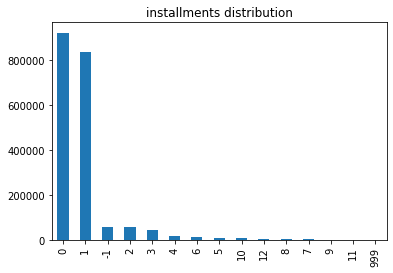

In [130]:
new_merchants_tr['installments'].value_counts().plot(kind='bar')
plt.title('installments distribution')
plt.show()

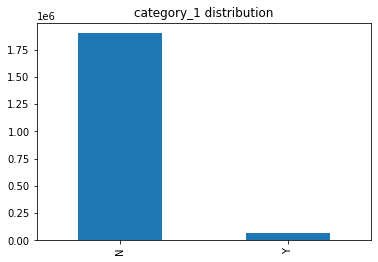

In [131]:
new_merchants_tr['category_1'].value_counts().plot(kind='bar')
plt.title('category_1 distribution')
plt.show()

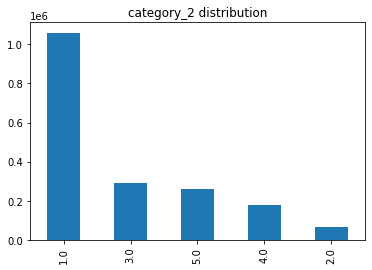

In [133]:
new_merchants_tr['category_2'].value_counts().plot(kind='bar')
plt.title('category_2 distribution')
plt.show()

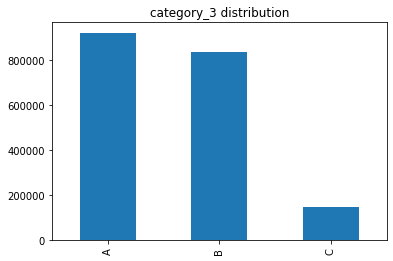

In [134]:
new_merchants_tr['category_3'].value_counts().plot(kind='bar')
plt.title('category_3 distribution')
plt.show()

In [19]:
historical_tr = pd.read_csv('elo-merchant-category-recommendation/historical_transactions.csv')

In [20]:
historical_tr.head()

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.703331,2017-06-25 15:33:07,1.0,16,37
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.733128,2017-07-15 12:10:45,1.0,16,16
2,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_979ed661fc,-6,-0.720386,2017-08-09 22:04:29,1.0,16,37
3,Y,C_ID_4e6213e9bc,88,N,0,A,560,M_ID_e6d5ae8ea6,-5,-0.735352,2017-09-02 10:06:26,1.0,16,34
4,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-11,-0.722865,2017-03-10 01:14:19,1.0,16,37


In [21]:
# missing values in historical transactions
historical_tr.isnull().sum()

authorized_flag               0
card_id                       0
city_id                       0
category_1                    0
installments                  0
category_3               178159
merchant_category_id          0
merchant_id              138481
month_lag                     0
purchase_amount               0
purchase_date                 0
category_2              2652864
state_id                      0
subsector_id                  0
dtype: int64

In [22]:
# Transactional history based on training set
users_tr = historical_tr[historical_tr['card_id'].isin(train['card_id'])]

In [23]:
users_tr

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
400,N,C_ID_5037ff576e,322,N,1,B,278,M_ID_b61c7d1be0,-3,-0.595260,2017-09-07 20:57:19,3.0,11,37
401,Y,C_ID_5037ff576e,138,N,1,B,307,M_ID_fe69229f24,-4,1.189469,2017-08-14 15:46:08,1.0,15,19
402,Y,C_ID_5037ff576e,138,N,1,B,705,M_ID_efc106141c,-9,-0.640069,2017-03-05 14:57:51,1.0,15,33
403,Y,C_ID_5037ff576e,226,N,1,B,307,M_ID_708022307c,-4,-0.652256,2017-08-15 10:45:28,1.0,16,19
404,Y,C_ID_5037ff576e,330,N,1,B,705,M_ID_393b4b8cec,-9,-0.674210,2017-03-26 20:00:31,3.0,17,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29112356,Y,C_ID_2863d2fa95,-1,Y,1,B,360,M_ID_edd92b6720,-1,-0.632706,2017-01-20 08:52:04,NaN,-1,34
29112357,Y,C_ID_2863d2fa95,-1,Y,1,B,360,M_ID_edd92b6720,0,-0.632706,2017-02-20 04:40:50,NaN,-1,34
29112358,Y,C_ID_5c240d6e3c,3,N,0,A,278,M_ID_9cdcfe8673,0,-0.657740,2017-12-26 18:37:51,1.0,16,37
29112359,Y,C_ID_5c240d6e3c,331,N,0,A,514,M_ID_1a75f94f92,-1,0.770620,2017-11-24 14:18:15,1.0,16,9


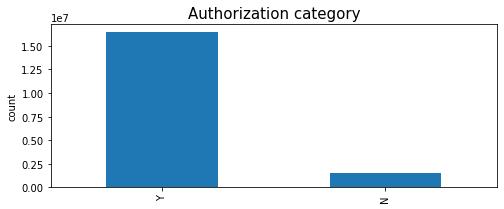

In [124]:
auth = users_tr['authorized_flag'].value_counts()
plt.figure(figsize=(8,3))
auth.plot.bar()
plt.title('Authorization category', fontsize=15)
plt.ylabel('count')
plt.show()

In [125]:
users_tr_merch_city = users_tr['city_id'].value_counts()

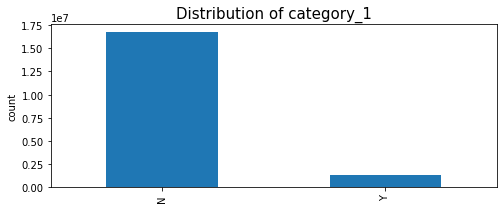

In [126]:
users_tr_category_1 = users_tr['category_1'].value_counts()
plt.figure(figsize=(8,3))
users_tr_category_1.plot.bar()
plt.title('Distribution of category_1', fontsize=15)
plt.ylabel('count')
plt.show()

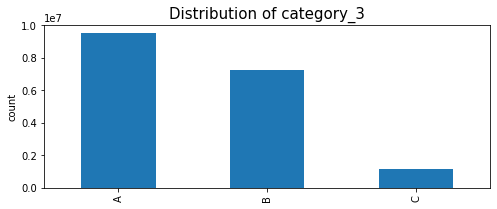

In [127]:
users_tr_category_3 = users_tr['category_3'].value_counts()
plt.figure(figsize=(8,3))
users_tr_category_3.plot.bar()
plt.title('Distribution of category_3', fontsize=15)
plt.ylabel('count')
plt.show()

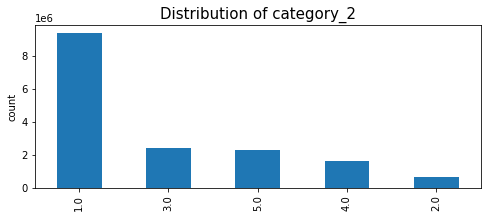

In [128]:
users_tr_category_2 = users_tr['category_2'].value_counts()
plt.figure(figsize=(8,3))
users_tr_category_2.plot.bar()
plt.title('Distribution of category_2', fontsize=15)
plt.ylabel('count')
plt.show()

In [24]:
# Check number of unique merchant ids
users_tr['merchant_id'].value_counts()

M_ID_00a6ca8a8a    690578
M_ID_e5374dabc0    266002
M_ID_9139332ccc    224499
M_ID_50f575c681    113874
M_ID_fc7d7969c3    109827
                    ...  
M_ID_87043797ed         1
M_ID_b223add99f         1
M_ID_af90b46b06         1
M_ID_c093db35f0         1
M_ID_c74ea2fea8         1
Name: merchant_id, Length: 303897, dtype: int64

<Figure size 1440x1440 with 0 Axes>

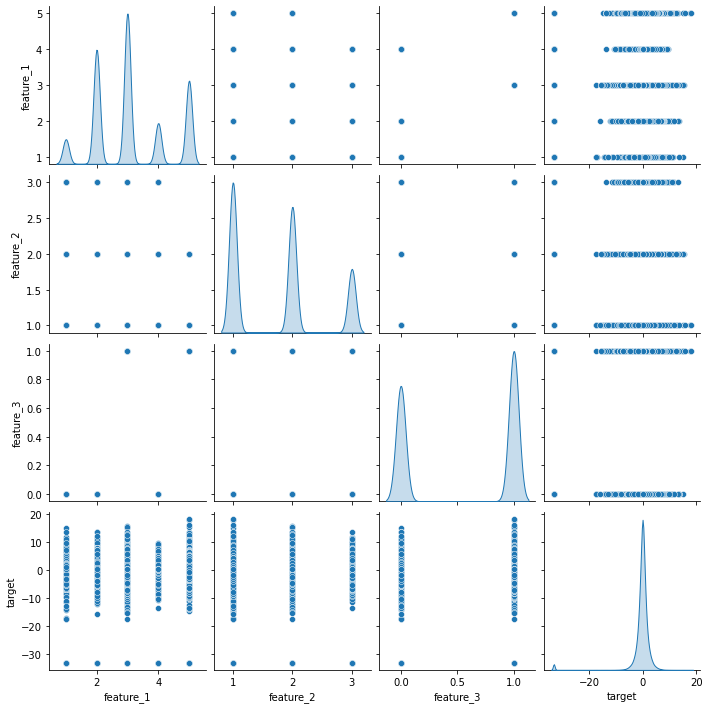

In [25]:
# Lets visualize the distribution of features from the training set
plt.figure(figsize=(20,20))
sns.pairplot(data=train,diag_kind='kde')
plt.show()

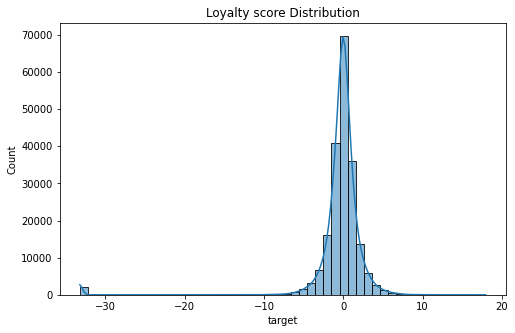

In [31]:
plt.figure(figsize=(8,5))
sns.histplot(data=train,x='target',kde=True, bins=50)
plt.title('Loyalty score Distribution')
plt.show()

In [43]:
import datetime
First_active_month =pd.to_datetime(train['first_active_month'])

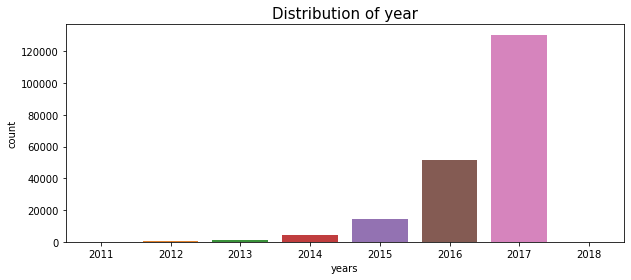

In [46]:
# first active month distribution 
plt.figure(figsize=(10,4))
sns.countplot(x=First_active_month.dt.year)
plt.title('Distribution of year', fontsize=15)
plt.xlabel('years')
plt.show()


In [75]:
month_2017=[]
month_2016=[]
month_2015=[]
for i in First_active_month:
    if i.year==2017:
        month_2017.append(i)
    elif i.year==2016:
    
        month_2016.append(i)
    else:
        i.year==2015
        month_2015.append(i)
  

In [76]:
month_2017=pd.to_datetime(month_2017)
month_2016=pd.to_datetime(month_2016)
month_2015=pd.to_datetime(month_2015)

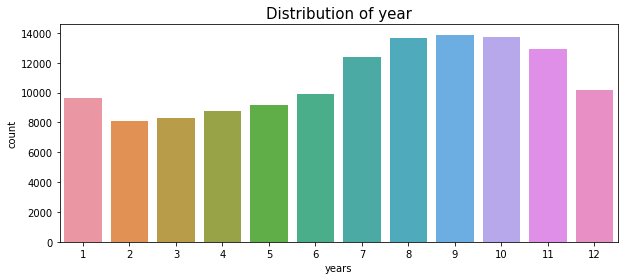

In [70]:
# first active month distribution for the year 2017
plt.figure(figsize=(10,4))
sns.countplot(x=month_2017.month)
plt.title('Distribution of year', fontsize=15)
plt.xlabel('years')
plt.show()

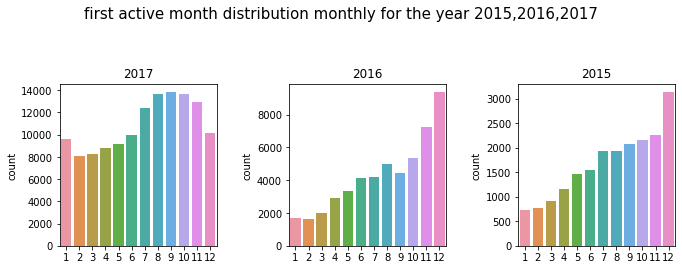

In [77]:
# plot of features distribution
fig, ax = plt.subplots(1,3, figsize=(10,4))
fig.suptitle('first active month distribution monthly for the year 2015,2016,2017', fontsize='15')
sns.countplot(x=month_2017.month, ax=ax[0])
ax[0].set_title('2017')
sns.countplot(x=month_2016.month, ax=ax[1])
ax[1].set_title('2016')
sns.countplot(x=month_2015.month, ax=ax[2])
ax[2].set_title('2015')
plt.tight_layout(pad=2.6)
plt.show()

In [80]:
train['first_active_month'] = pd.to_datetime(train['first_active_month'])
no_of_issued_cards = train.groupby(['first_active_month']).count()['card_id']


In [81]:
no_of_issued_cards

first_active_month
2011-11-01        8
2011-12-01        2
2012-02-01        7
2012-03-01       10
2012-04-01       18
              ...  
2017-10-01    13695
2017-11-01    12930
2017-12-01    10170
2018-01-01       34
2018-02-01        1
Name: card_id, Length: 75, dtype: int64

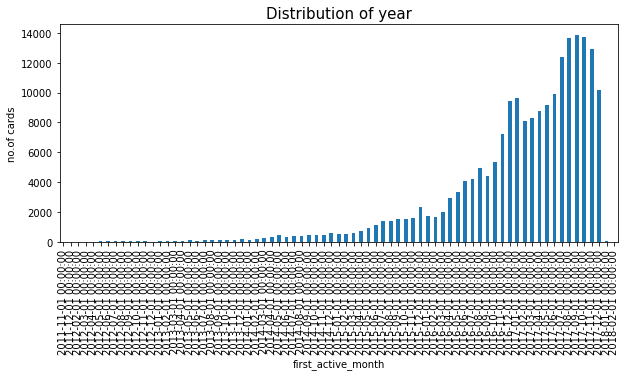

In [84]:
# first active month distribution for the year 2017
plt.figure(figsize=(10,4))
no_of_issued_cards.plot.bar()
plt.title('Distribution of year', fontsize=15)
plt.ylabel('no.of cards')
plt.show()